In [4]:
%matplotlib inline


Transfer Learning tutorial
==========================
**Author**: `Sasank Chilamkurthy <https://chsasank.github.io>`_

In this tutorial, you will learn how to train your network using
transfer learning. You can read more about the transfer learning at `cs231n
notes <http://cs231n.github.io/transfer-learning/>`__

Quoting this notes,

    In practice, very few people train an entire Convolutional Network
    from scratch (with random initialization), because it is relatively
    rare to have a dataset of sufficient size. Instead, it is common to
    pretrain a ConvNet on a very large dataset (e.g. ImageNet, which
    contains 1.2 million images with 1000 categories), and then use the
    ConvNet either as an initialization or a fixed feature extractor for
    the task of interest.

These two major transfer learning scenarios looks as follows:

-  **Finetuning the convnet**: Instead of random initializaion, we
   initialize the network with a pretrained network, like the one that is
   trained on imagenet 1000 dataset. Rest of the training looks as
   usual.
-  **ConvNet as fixed feature extractor**: Here, we will freeze the weights
   for all of the network except that of the final fully connected
   layer. This last fully connected layer is replaced with a new one
   with random weights and only this layer is trained.




In [5]:
# License: BSD
# Author: Sasank Chilamkurthy

from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import copy
import os

plt.ion()   # interactive mode

Load Data
---------

We will use torchvision and torch.utils.data packages for loading the
data.

The problem we're going to solve today is to train a model to classify
**ants** and **bees**. We have about 120 training images each for ants and bees.
There are 75 validation images for each class. Usually, this is a very
small dataset to generalize upon, if trained from scratch. Since we
are using transfer learning, we should be able to generalize reasonably
well.

This dataset is a very small subset of imagenet.

.. Note ::
   Download the data from
   `here <https://download.pytorch.org/tutorial/hymenoptera_data.zip>`_
   and extract it to the current directory.



In [7]:
# Data augmentation and normalization for training 
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomSizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Scale(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = 'hymenoptera_data'
dsets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x])
         for x in ['train', 'val']}
dset_loaders = {x: torch.utils.data.DataLoader(dsets[x], batch_size=4,
                                               shuffle=True, num_workers=4)
                for x in ['train', 'val']}
dset_sizes = {x: len(dsets[x]) for x in ['train', 'val']}
dset_classes = dsets['train'].classes

use_gpu = torch.cuda.is_available()

Visualize a few images
^^^^^^^^^^^^^^^^^^^^^^
Let's visualize a few training images so as to understand the data
augmentations.



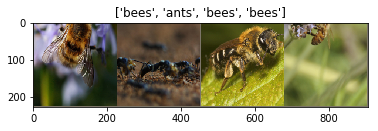

In [8]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dset_loaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[dset_classes[x] for x in classes])

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving (deep copying) the best model

In the following, parameter ``lr_scheduler(optimizer, epoch)``
is a function  which modifies ``optimizer`` so that the learning
rate is changed according to desired schedule.



In [18]:
def train_model(model, criterion, optimizer, lr_scheduler, num_epochs=25):
    since = time.time()

    best_model = model
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                optimizer = lr_scheduler(optimizer, epoch)
                model.train(True)  # Set model to training mode
            else:
                model.train(False)  # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for data in dset_loaders[phase]:
                # get the inputs
                inputs, labels = data
                print(str(inputs), str(labels))
                # wrap them in Variable
                if use_gpu:
                    inputs, labels = Variable(inputs.cuda()), \
                        Variable(labels.cuda())
                else:
                    inputs, labels = Variable(inputs), Variable(labels)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                outputs = model(inputs)
                _, preds = torch.max(outputs.data, 1)
                loss = criterion(outputs, labels)

                # backward + optimize only if in training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

                # statistics
                running_loss += loss.data[0]
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dset_sizes[phase]
            epoch_acc = running_corrects / dset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model = copy.deepcopy(model)

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))
    return best_model

Learning rate scheduler
^^^^^^^^^^^^^^^^^^^^^^^
Let's create our learning rate scheduler. We will exponentially
decrease the learning rate once every few epochs.



In [10]:
def exp_lr_scheduler(optimizer, epoch, init_lr=0.001, lr_decay_epoch=7):
    """Decay learning rate by a factor of 0.1 every lr_decay_epoch epochs."""
    lr = init_lr * (0.1**(epoch // lr_decay_epoch))

    if epoch % lr_decay_epoch == 0:
        print('LR is set to {}'.format(lr))

    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

    return optimizer

Visualizing the model predictions
^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

Generic function to display predictions for a few images




In [11]:
def visualize_model(model, num_images=6):
    images_so_far = 0
    fig = plt.figure()

    for i, data in enumerate(dset_loaders['val']):
        inputs, labels = data
        if use_gpu:
            inputs, labels = Variable(inputs.cuda()), Variable(labels.cuda())
        else:
            inputs, labels = Variable(inputs), Variable(labels)

        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)

        for j in range(inputs.size()[0]):
            images_so_far += 1
            ax = plt.subplot(num_images//2, 2, images_so_far)
            ax.axis('off')
            ax.set_title('predicted: {}'.format(dset_classes[labels.data[j]]))
            imshow(inputs.cpu().data[j])

            if images_so_far == num_images:
                return

Finetuning the convnet
----------------------

Load a pretrained model and reset final fully connected layer.




In [12]:
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_ftrs, 2)

if use_gpu:
    model_ft = model_ft.cuda()

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

Train and evaluate
^^^^^^^^^^^^^^^^^^

It should take around 15-25 min on CPU. On GPU though, it takes less than a
minute.




In [19]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=25)

Epoch 0/24
----------
LR is set to 0.001

( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044 


( 0 , 0 ,.,.) = 
 -0.6623 -0.6281 -0.4568  ...  -0.5082 -0.9192 -1.2617
 -0.7993 -0.7650 -0.4911  ...  -0.4568 -0.7822 -1.0048
 -0.8678 -0.8507 -0.5938  ...  -0.5424 -0.7308 -0.8849
           ...             ⋱             ...          
 -0.8678 -0.8335 -0.7650  ...  -0.9534 -1.0390 -0.9705
 -0.7137 -0.6281 -0.5938  ...  -1.0390 -1.1932 -1.1760
 -0.5938 -0.5424 -0.4911  ...  -1.0048 -1.1075 -1.2103

( 0 , 1 ,.,.) = 
  0.7829  0.6429  0.7129  ...   0.0826 -0.1099 -0.3550
  0.7129  0.6429  0.6604  ...   0.2402  0.0301 -0.2850
  0.6254  0.5553  0.5553  ...   0.2227  0.1001 -0.1625
           ...             ⋱             ...          
  0.1702  0.2402  0.2577  ...  -0.1800 -0.1450 -0.1275
  0.2402  0.3277  0.3277  ...  -0.0924 -0.0574 -0.0924
  0.2577  0.3102  0.3452  ...  -0.0574  0.0126 -0.0749

( 0 , 2 ,.,.) = 
  2.5529  2.5529  2.6226  ...  -0.8110 -0.9853 -1.1596
  2.5877  2.5703  2.6226  ...  -0.7238 -0.9156 -0.9853
  2.5877  2.5354  2.6051  ...  -0.7064 -0.8633 -0.9156
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2147  ...   1.8550  1.8722  1.8379
  2.2489  2.2489  2.2318  ...   1.8208  1.8550  1.8208
  2.2147  2.2489  2.2489  ...   1.8037  1.8379  1.8037
           ...             ⋱             ...          
  0.4508  0.3994  0.4166  ...  -1.5357 -1.4500 -1.2103
  0.4851  0.4679  0.4679  ...  -1.3302  0.1597 -0.4568
  0.6049  0.5536  0.5536  ...  -0.1828  0.2282 -1.0219

( 0 , 1 ,.,.) = 
  0.8529  0.8004  0.7479  ...  -2.0357 -2.0182 -2.0182
  0.8529  0.8179  0.7654  ...  -2.0357 -2.0357 -2.0357
  0.8179  0.7829  0.7654  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -1.9657 -2.0182
 -2.0182 -2.0357 -2.0357  ...  -2.0007 -2.0182 -2.0357
 -2.0182 -2.0182 -2.0182  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
  2.6400  2.6051  2.5529  ...   1.8905  1.8383  1.9254
  2.6400  2.6226  2.5877  ...   1.8731  1.8208  1.8383
  2.6051  2.6400  2.6226  ...   1.7685  1.7511  1.7511
           


( 0 , 0 ,.,.) = 
  1.1872  0.8447  0.8104  ...  -0.6623 -0.7993 -0.8849
  0.9646  0.9303  0.6221  ...  -0.9020 -0.9705 -1.0219
  0.9132  0.7591  0.8104  ...  -1.3302 -1.3130 -1.2445
           ...             ⋱             ...          
  1.0673  1.0331  0.9988  ...  -0.5767 -0.9705 -1.2103
  1.1187  0.8961  0.9303  ...  -0.6794 -0.6452 -0.3541
  1.1872  0.8961  0.7762  ...  -0.9705 -0.8164 -0.4054

( 0 , 1 ,.,.) = 
  0.5903  0.1001  0.0826  ...  -0.4951 -0.6001 -0.6527
  0.0476 -0.1099 -0.4251  ...  -0.6702 -0.7052 -0.7577
  0.8179  0.3627  0.1527  ...  -0.9678 -0.9328 -0.8978
           ...             ⋱             ...          
  0.6954  0.5203  0.6429  ...  -0.3901 -0.7402 -1.0903
  0.6078  0.3803  0.5028  ...  -0.5651 -0.5476 -0.2850
  0.7129  0.3627  0.1877  ...  -0.8452 -0.7752 -0.4601

( 0 , 2 ,.,.) = 
 -1.0898 -1.2816 -1.1596  ...  -0.0790 -0.0964 -0.1312
 -1.4733 -1.3687 -1.6127  ...  -0.2010 -0.2010 -0.2358
 -0.1138 -0.7761 -1.1421  ...  -0.4624 -0.4275 -0.3927
           


( 0 , 0 ,.,.) = 
  2.1290  2.1290  2.1290  ...   1.5639  1.5639  1.5639
  2.1462  2.1462  2.1462  ...   1.5639  1.5639  1.5639
  2.1462  2.1462  2.1462  ...   1.5639  1.5639  1.5639
           ...             ⋱             ...          
  1.8722  1.9920  2.0434  ...   1.5125  1.5125  1.5125
  1.8550  1.9749  2.0263  ...   1.5125  1.5125  1.5125
  1.8722  2.0092  1.9920  ...   1.5297  1.5297  1.5125

( 0 , 1 ,.,.) = 
  2.2360  2.2360  2.2360  ...   1.7983  1.7983  1.7983
  2.2535  2.2535  2.2535  ...   1.7983  1.7983  1.7983
  2.2535  2.2535  2.2535  ...   1.7983  1.7983  1.7983
           ...             ⋱             ...          
  1.7808  1.9034  1.9209  ...   1.7808  1.7808  1.7808
  1.7808  1.8859  1.9034  ...   1.7808  1.7808  1.7808
  1.7108  1.8859  1.9034  ...   1.7983  1.7983  1.7808

( 0 , 2 ,.,.) = 
  0.7576  0.7576  0.7576  ...   0.0953  0.0953  0.0953
  0.7751  0.7751  0.7751  ...   0.0953  0.0953  0.0953
  0.7751  0.7751  0.7751  ...   0.0953  0.0953  0.0953
           


( 0 , 0 ,.,.) = 
 -0.8507 -0.9534 -1.0562  ...  -1.4672 -1.2959 -1.2103
 -0.8678 -0.9192 -1.0219  ...  -1.4329 -1.3130 -1.2617
 -0.8678 -0.9020 -0.9877  ...  -1.3987 -1.3473 -1.2617
           ...             ⋱             ...          
 -1.5185 -1.2617 -0.9192  ...  -1.0219 -1.0048 -0.9705
 -1.6042 -1.5699 -1.2274  ...  -0.9705 -0.9534 -0.9192
 -1.6898 -1.7240 -1.6042  ...  -0.8849 -0.9534 -0.9363

( 0 , 1 ,.,.) = 
  0.6604  0.5903  0.5378  ...  -0.2675 -0.5476 -0.6176
  0.7129  0.6078  0.5728  ...  -0.1975 -0.4951 -0.5826
  0.7304  0.6779  0.6254  ...  -0.1275 -0.4251 -0.6352
           ...             ⋱             ...          
 -0.1275  0.1176  0.5378  ...   0.4678  0.4853  0.5378
 -0.1800 -0.0924  0.2752  ...   0.5203  0.4678  0.5028
 -0.1800 -0.1975 -0.0924  ...   0.5553  0.4853  0.4678

( 0 , 2 ,.,.) = 
 -0.9504 -1.0027 -1.0376  ...  -1.7696 -1.7696 -1.7347
 -0.8807 -0.9156 -0.9156  ...  -1.7870 -1.7696 -1.7173
 -0.8458 -0.8110 -0.8458  ...  -1.7870 -1.7696 -1.7522
           


( 0 , 0 ,.,.) = 
  0.6221  0.4166 -0.0287  ...   0.8789  0.8789  0.9817
  0.5536  0.3823 -0.0458  ...   0.9132  0.9132  0.8104
  0.8276  0.7933  0.6563  ...   0.9988  0.8961  0.9988
           ...             ⋱             ...          
  0.5193  0.6049  0.6049  ...   0.2111  0.1768  0.2282
  0.5193  0.6392  0.7077  ...   0.2111  0.1426  0.2282
  0.5707  0.6734  0.7933  ...   0.3309  0.2624  0.3652

( 0 , 1 ,.,.) = 
  0.1877 -0.0049 -0.4426  ...   0.4503  0.4153  0.5378
  0.1001 -0.0399 -0.4601  ...   0.5203  0.5203  0.4153
  0.5028  0.4678  0.3452  ...   0.6078  0.5028  0.6078
           ...             ⋱             ...          
  0.1877  0.3452  0.4153  ...  -0.1625 -0.1625 -0.0749
  0.2052  0.4153  0.5378  ...  -0.1450 -0.2150 -0.1099
  0.3277  0.4503  0.6254  ...  -0.0749 -0.0924  0.0126

( 0 , 2 ,.,.) = 
  0.0953 -0.1661 -0.6193  ...   0.1302  0.1128  0.2696
 -0.0790 -0.2532 -0.6715  ...   0.2348  0.2522  0.1476
  0.1999  0.1825  0.0953  ...   0.3393  0.2348  0.3393
           


( 0 , 0 ,.,.) = 
 -1.1760 -0.2513  0.3652  ...   0.1768  0.1939  0.2111
 -0.4397 -0.4054 -0.1314  ...   0.1597  0.1768  0.1768
  0.1939  0.2111  0.1597  ...   0.1254  0.1597  0.1939
           ...             ⋱             ...          
  0.0398  0.1254  0.1939  ...   2.0263  2.0092  2.0263
  0.2796  0.3994  0.3994  ...   2.0434  2.0434  2.0605
  0.5022  0.4337  0.2796  ...   2.0605  2.0605  2.0605

( 0 , 1 ,.,.) = 
 -1.1253 -0.4076  0.2227  ...   0.6078  0.5903  0.5553
 -0.6702 -0.5301 -0.2500  ...   0.5903  0.5903  0.5378
 -0.1275 -0.0224 -0.0049  ...   0.6078  0.6254  0.5903
           ...             ⋱             ...          
 -0.7927 -0.7927 -0.8452  ...   1.4832  1.5007  1.5182
 -0.7752 -0.7052 -0.6527  ...   1.4832  1.5007  1.5182
 -0.6877 -0.6877 -0.6702  ...   1.5007  1.4832  1.4832

( 0 , 2 ,.,.) = 
 -1.8044 -0.8981  0.0779  ...  -1.4907 -1.4907 -1.4210
 -1.0724 -0.8981 -0.5147  ...  -1.4733 -1.4210 -1.3164
 -0.3578 -0.4101 -0.4798  ...  -1.4559 -1.4384 -1.4384
           


( 0 , 0 ,.,.) = 
  1.1015  1.0673  1.0673  ...  -0.3198 -0.3712 -0.4568
  1.1015  1.0673  1.0673  ...  -0.3198 -0.3883 -0.4739
  1.1015  1.0673  1.0673  ...  -0.3541 -0.4054 -0.4911
           ...             ⋱             ...          
  0.1597  0.1597  0.1083  ...  -0.2171 -0.0972 -0.0458
  0.1426  0.1254  0.0912  ...  -0.1999 -0.0801  0.0056
  0.1768  0.1768  0.1597  ...  -0.2171 -0.0972  0.0056

( 0 , 1 ,.,.) = 
  1.0280  0.9930  1.0105  ...  -0.2150 -0.2500 -0.3025
  1.0280  0.9930  1.0105  ...  -0.2325 -0.2675 -0.3200
  1.0280  1.0105  1.0105  ...  -0.2500 -0.3025 -0.3375
           ...             ⋱             ...          
  0.7829  0.7129  0.6254  ...  -0.3200 -0.2325 -0.1450
  0.8354  0.7829  0.7304  ...  -0.2500 -0.1975 -0.1450
  0.8529  0.8004  0.7654  ...  -0.2325 -0.1625 -0.1275

( 0 , 2 ,.,.) = 
  0.9668  0.9319  0.9494  ...  -0.4275 -0.4798 -0.5670
  0.9668  0.9319  0.9494  ...  -0.4275 -0.4973 -0.5844
  0.9668  0.9494  0.9494  ...  -0.4450 -0.5147 -0.6018
           


( 0 , 0 ,.,.) = 
  1.2557  1.3755  1.5639  ...  -0.0458 -0.0458 -0.0458
  1.3927  1.5810  1.9064  ...  -0.0458 -0.0287 -0.0287
  1.4440  1.6667  2.0434  ...  -0.0287 -0.0116 -0.0116
           ...             ⋱             ...          
  0.6392  0.6221  0.5878  ...  -0.6452 -0.6623 -0.6794
  0.5536  0.5707  0.5707  ...  -0.6623 -0.6794 -0.6965
  0.4508  0.4851  0.5193  ...  -0.6794 -0.7137 -0.7308

( 0 , 1 ,.,.) = 
  1.4482  1.6232  1.9209  ...  -0.3200 -0.3200 -0.3200
  1.4657  1.6758  2.0434  ...  -0.3200 -0.3025 -0.3025
  1.3782  1.5882  1.9559  ...  -0.3025 -0.2850 -0.2850
           ...             ⋱             ...          
 -0.6352 -0.6352 -0.6702  ...   0.2052  0.1877  0.1702
 -0.7577 -0.7402 -0.7402  ...   0.2052  0.1877  0.1702
 -0.8978 -0.8627 -0.8277  ...   0.2052  0.1702  0.1527

( 0 , 2 ,.,.) = 
  1.5768  1.7163  1.9603  ...  -1.2816 -1.2816 -1.2816
  1.5245  1.7860  2.2391  ...  -1.2990 -1.2990 -1.2990
  1.3502  1.6988  2.3088  ...  -1.3164 -1.2990 -1.2990
           


( 0 , 0 ,.,.) = 
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
 -1.6727 -1.6727 -1.6727  ...  -1.6727 -1.6727 -1.6727
 -1.6213 -1.6384 -1.6384  ...  -1.6384 -1.6384 -1.6384
           ...             ⋱             ...          
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898

( 0 , 1 ,.,.) = 
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
 -1.7031 -1.7031 -1.7031  ...  -1.7031 -1.7031 -1.7031
           ...             ⋱             ...          
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.7696 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.5256 -1.5430 -1.5430  ...  -1.5430 -1.5430 -1.5430
           


( 0 , 0 ,.,.) = 
  0.9817  0.9817  0.9817  ...   1.2899  1.2043  1.1872
  0.9474  0.9988  1.0159  ...   1.1529  0.9988  0.9303
  0.9303  0.9817  1.0331  ...   1.0673  0.9303  0.8104
           ...             ⋱             ...          
 -1.0048 -1.3473 -1.0562  ...   2.0092  1.9749  1.9235
 -0.1657 -0.8164 -0.0801  ...   1.9578  1.9235  1.9064
  1.4098  1.1872  1.4612  ...   1.9064  1.8722  1.8893

( 0 , 1 ,.,.) = 
  0.8880  0.8880  0.8880  ...   1.1155  1.1155  1.1681
  0.8704  0.9230  0.9230  ...   0.9755  0.9055  0.9230
  0.8529  0.9230  0.9580  ...   0.9055  0.8004  0.7304
           ...             ⋱             ...          
 -1.1954 -1.3880 -1.1253  ...   1.8859  1.8508  1.8333
 -0.4951 -1.0378 -0.3200  ...   1.8333  1.8333  1.8333
  1.0630  0.9580  1.2206  ...   1.7808  1.7983  1.8333

( 0 , 2 ,.,.) = 
  0.3219  0.3393  0.3916  ...   0.5311  0.4962  0.5136
  0.3219  0.3742  0.4439  ...   0.3393  0.2522  0.2348
  0.3393  0.3916  0.4962  ...   0.2522  0.1302  0.0431
           


( 0 , 0 ,.,.) = 
 -1.3473 -1.4329 -1.5185  ...  -1.8610 -1.8610 -1.8610
 -1.1075 -1.2103 -1.3302  ...  -1.8268 -1.8268 -1.8268
 -0.9877 -1.0733 -1.1418  ...  -1.8097 -1.8097 -1.8268
           ...             ⋱             ...          
  0.2282  0.2453 -0.1314  ...  -0.5767 -0.5596 -0.5253
  0.2282  0.3823 -0.0629  ...  -0.5424 -0.5253 -0.4911
  0.3481  0.2624  0.0912  ...  -0.5082 -0.4739 -0.4568

( 0 , 1 ,.,.) = 
  0.0301 -0.1275 -0.2675  ...  -1.0028 -1.0028 -1.0028
  0.3452  0.1877 -0.0049  ...  -1.0203 -1.0203 -1.0203
  0.5378  0.4503  0.3102  ...  -1.0028 -1.0028 -1.0203
           ...             ⋱             ...          
 -0.5126 -0.4601 -0.8627  ...   0.8179  0.8529  0.8880
 -0.4776 -0.5476 -0.8452  ...   0.8354  0.8529  0.9055
 -0.4076 -0.3901 -0.7577  ...   0.8704  0.9055  0.9405

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.7522 -1.7696 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.7696 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.2856 -0.3027 -0.2342  ...  -0.4054 -0.4226 -0.3369
 -0.2513 -0.3198 -0.3198  ...  -0.3712 -0.3883 -0.4397
 -0.3198 -0.2513 -0.2856  ...  -0.4054 -0.3883 -0.4397
           ...             ⋱             ...          
  0.3994  0.3994  0.3823  ...  -0.7308 -0.7479 -0.8678
  0.3823  0.4166  0.3823  ...  -0.7308 -0.6623 -0.7137
  0.3652  0.4166  0.3481  ...  -0.6452 -0.6281 -0.6794

( 0 , 1 ,.,.) = 
  0.5728  0.5553  0.5903  ...   0.0301  0.0126  0.1001
  0.6078  0.5378  0.4853  ...   0.0651  0.0476 -0.0049
  0.5728  0.6779  0.5903  ...   0.0301  0.0476 -0.0049
           ...             ⋱             ...          
  0.8880  0.8704  0.8354  ...   0.1001  0.0651 -0.0399
  0.8529  0.8880  0.8529  ...   0.1176  0.1527  0.1001
  0.8179  0.8880  0.8179  ...   0.2752  0.2227  0.1176

( 0 , 2 ,.,.) = 
 -1.7522 -1.7347 -1.6824  ...  -0.4450 -0.4624 -0.3753
 -1.6650 -1.7522 -1.7696  ...  -0.4101 -0.4275 -0.4798
 -1.6999 -1.7173 -1.7522  ...  -0.4450 -0.4275 -0.4798
           


( 0 , 0 ,.,.) = 
 -1.2959 -1.0733 -0.8849  ...  -0.6794 -0.3198 -0.4568
 -1.4500 -1.2274 -1.0904  ...  -0.0458  0.2796  0.6563
 -1.3302 -1.5014 -1.3473  ...   1.2043  1.3755  1.6153
           ...             ⋱             ...          
 -1.9124 -1.7069 -1.7583  ...   0.4851  0.6392  0.6734
 -1.9124 -1.8268 -1.7754  ...   0.5536  0.5364  0.5536
 -1.9124 -1.8439 -1.7754  ...   0.6221  0.5878  0.5707

( 0 , 1 ,.,.) = 
 -1.6331 -1.4405 -1.3179  ...  -0.4601 -0.0749 -0.2500
 -1.6681 -1.4580 -1.3704  ...   0.1702  0.5028  0.8880
 -1.7206 -1.6155 -1.5805  ...   1.3431  1.4657  1.6933
           ...             ⋱             ...          
 -1.6331 -1.7731 -1.8256  ...   1.7633  1.9384  1.9909
 -1.6155 -1.8081 -1.7731  ...   1.8158  1.8683  1.9209
 -1.6856 -1.6681 -1.7206  ...   1.8859  1.8333  1.8508

( 0 , 2 ,.,.) = 
 -1.3687 -1.2990 -1.1596  ...   0.3045  0.6531  0.5485
 -1.4210 -1.3861 -1.2641  ...   1.2282  1.5420  1.8383
 -1.4384 -1.5604 -1.4907  ...   2.0648  2.2217  2.3960
           


( 0 , 0 ,.,.) = 
  2.2147  2.1975  2.1462  ...   1.5468  1.5297  1.4440
  2.1804  2.1804  2.1633  ...   1.5639  1.5125  1.4612
  2.2147  2.1804  2.1290  ...   1.5468  1.5125  1.4612
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   1.5639  1.5639  1.5810
  2.2489  2.2489  2.2489  ...   1.5982  1.5982  1.5982
  2.2489  2.2489  2.2489  ...   1.6153  1.6153  1.5639

( 0 , 1 ,.,.) = 
  2.0784  2.0259  1.9559  ...   1.0455  1.0280  0.9405
  2.0434  2.0084  1.9734  ...   1.0805  1.0280  0.9755
  2.0959  2.0259  1.9559  ...   1.0980  1.0630  1.0105
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   1.5532  1.5532  1.5707
  2.4286  2.4286  2.4286  ...   1.5707  1.5707  1.6057
  2.4286  2.4286  2.4286  ...   1.5707  1.5707  1.6057

( 0 , 2 ,.,.) = 
  2.2217  2.1694  2.0823  ...   1.2457  1.2282  1.1411
  2.1868  2.1346  2.0997  ...   1.2805  1.2282  1.1759
  2.2217  2.1171  2.0300  ...   1.2805  1.2457  1.1934
           


( 0 , 0 ,.,.) = 
 -2.0665 -2.0837 -2.1008  ...  -2.1179 -2.1179 -2.1179
 -1.9638 -1.9638 -1.9295  ...  -1.6042 -1.6213 -1.6213
 -1.8097 -1.7583 -1.6727  ...  -0.8164 -0.8507 -0.8849
           ...             ⋱             ...          
  1.2043  1.2043  1.2385  ...  -0.9534 -0.5938 -0.3027
  1.5297  1.5125  1.5125  ...  -0.5938 -0.3541 -0.1657
  1.7352  1.7180  1.6838  ...  -0.3541 -0.1999 -0.0801

( 0 , 1 ,.,.) = 
 -2.0007 -2.0182 -2.0357  ...  -2.0357 -2.0182 -2.0007
 -1.8431 -1.8431 -1.8431  ...  -1.5455 -1.5105 -1.4930
 -1.6155 -1.5805 -1.5455  ...  -0.7927 -0.7577 -0.7402
           ...             ⋱             ...          
  1.4307  1.4132  1.4132  ...  -1.0553 -0.7227 -0.4776
  1.6057  1.5882  1.5882  ...  -0.7227 -0.4076 -0.1800
  1.7108  1.7108  1.7108  ...  -0.4951 -0.1975  0.0126

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.7696 -1.7870 -1.8044
 -1.7347 -1.7173 -1.6824  ...  -1.3164 -1.3164 -1.3339
 -1.6302 -1.5779 -1.5081  ...  -0.6367 -0.6193 -0.6018
           


( 0 , 0 ,.,.) = 
 -0.6109 -0.5938 -0.5767  ...  -0.6281 -0.6452 -0.6281
 -0.5767 -0.5767 -0.5596  ...  -0.5938 -0.6109 -0.6281
 -0.5596 -0.5424 -0.5424  ...  -0.5767 -0.5938 -0.5767
           ...             ⋱             ...          
 -0.1314 -0.0972 -0.0801  ...  -0.7822 -0.7993 -0.7650
 -0.1314 -0.1143 -0.0972  ...  -0.7822 -0.7822 -0.7308
 -0.1486 -0.1314 -0.1143  ...  -0.7993 -0.7993 -0.7479

( 0 , 1 ,.,.) = 
 -0.7752 -0.7752 -0.7752  ...  -0.4951 -0.5301 -0.5476
 -0.7402 -0.7402 -0.7577  ...  -0.4951 -0.5301 -0.5476
 -0.7577 -0.7402 -0.7577  ...  -0.4951 -0.5126 -0.5126
           ...             ⋱             ...          
 -0.3200 -0.2850 -0.2675  ...  -0.9328 -0.9328 -0.8803
 -0.3025 -0.2850 -0.2675  ...  -0.9153 -0.8803 -0.8277
 -0.3200 -0.3025 -0.2850  ...  -0.9153 -0.8978 -0.8452

( 0 , 2 ,.,.) = 
 -0.8110 -0.7936 -0.7936  ...  -0.9853 -1.0201 -1.0027
 -0.7761 -0.7761 -0.7761  ...  -0.9504 -0.9853 -1.0027
 -0.7761 -0.7587 -0.7761  ...  -0.9504 -0.9678 -0.9853
           


( 0 , 0 ,.,.) = 
  0.6734  0.4851  0.3481  ...  -1.0048 -1.1589 -1.2959
  0.8789  0.7419  0.6392  ...  -0.9705 -1.1247 -1.2617
  0.8961  0.8276  0.7419  ...  -0.9020 -1.0733 -1.2274
           ...             ⋱             ...          
 -1.0048 -1.0562 -1.0562  ...   0.1426  0.1254  0.1254
 -1.0562 -1.0733 -1.0904  ...   0.1597  0.1426  0.1254
 -1.0733 -1.0733 -1.1075  ...   0.1254  0.1254  0.1083

( 0 , 1 ,.,.) = 
  0.8354  0.6779  0.5553  ...  -1.0028 -1.1078 -1.2479
  1.0105  0.8880  0.7829  ...  -0.9853 -1.0903 -1.2129
  1.0455  0.9580  0.8880  ...  -0.9503 -1.0553 -1.1779
           ...             ⋱             ...          
 -1.3179 -1.3529 -1.3529  ...   0.0651  0.0476  0.0476
 -1.3179 -1.3179 -1.3354  ...   0.0476  0.0301  0.0126
 -1.3179 -1.3179 -1.3179  ...   0.0126  0.0126 -0.0049

( 0 , 2 ,.,.) = 
  1.1237  0.8971  0.7402  ...  -0.8458 -1.0027 -1.1247
  1.3154  1.1759  1.0714  ...  -0.8110 -0.9504 -1.0724
  1.3328  1.2631  1.1934  ...  -0.7587 -0.9156 -1.0376
           


( 0 , 0 ,.,.) = 
  0.3309  0.2967  0.2453  ...   0.9474  1.0502  1.1529
  0.3138  0.2796  0.2453  ...   1.1358  1.3755  1.5810
  0.2967  0.2624  0.2282  ...   1.4954  1.7352  1.9064
           ...             ⋱             ...          
 -0.9192 -0.9877 -1.0219  ...  -1.0904 -1.1247 -1.1075
 -0.9192 -0.9363 -0.9363  ...  -0.9192 -0.9877 -1.0390
 -0.9534 -0.9020 -0.8507  ...  -0.7308 -0.8507 -0.9534

( 0 , 1 ,.,.) = 
 -0.0574 -0.0749 -0.0749  ...   0.3102  0.4853  0.6429
 -0.0749 -0.0924 -0.0924  ...   0.5028  0.8004  1.0280
 -0.1099 -0.1099 -0.1099  ...   0.8880  1.1506  1.3081
           ...             ⋱             ...          
 -1.2829 -1.3354 -1.3704  ...  -1.4930 -1.4930 -1.4405
 -1.3179 -1.3179 -1.3179  ...  -1.3704 -1.4230 -1.4230
 -1.4055 -1.3354 -1.3004  ...  -1.2129 -1.3179 -1.3880

( 0 , 2 ,.,.) = 
 -0.7413 -0.7587 -0.7761  ...  -0.1138  0.0605  0.2348
 -0.7761 -0.7936 -0.8110  ...   0.0953  0.3916  0.6356
 -0.8284 -0.8458 -0.8458  ...   0.4962  0.7751  0.9494
           


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2147  ...   2.0948  2.1119  2.1119
  2.2318  2.2147  2.2147  ...   2.1119  2.1290  2.1290
  2.2318  2.1975  2.1975  ...   2.1290  2.1462  2.1462
           ...             ⋱             ...          
 -0.3712 -0.3712 -0.4054  ...   1.7180  1.7180  1.7352
 -0.1999 -0.2856 -0.3712  ...   1.8037  1.8208  1.8208
  0.1768 -0.0458 -0.2684  ...   1.9064  1.8893  1.9064

( 0 , 1 ,.,.) = 
  2.3060  2.3060  2.2885  ...   2.2360  2.2535  2.2535
  2.3060  2.2885  2.2885  ...   2.2535  2.2710  2.2535
  2.3060  2.2710  2.2710  ...   2.2710  2.2710  2.2710
           ...             ⋱             ...          
 -0.6176 -0.6352 -0.6527  ...   1.0455  1.0630  1.0805
 -0.4426 -0.5476 -0.6176  ...   1.1856  1.1856  1.2031
 -0.0574 -0.2850 -0.5126  ...   1.3081  1.3081  1.3081

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7870  ...  -1.7870 -1.8044 -1.8044
 -1.7696 -1.7870 -1.7870  ...  -1.8044 -1.7870 -1.8044
 -1.7696 -1.8044 -1.8044  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
 -0.3027 -0.3027 -0.2684  ...  -0.4054 -0.4054 -0.4054
 -0.3027 -0.3027 -0.2856  ...  -0.3712 -0.3712 -0.3883
 -0.3027 -0.2856 -0.2856  ...  -0.3712 -0.3712 -0.3883
           ...             ⋱             ...          
  0.8618  0.8104  0.8276  ...   0.5364  0.5364  0.5536
  0.8276  0.4679  0.2453  ...   0.5878  0.5878  0.5878
  1.0502  0.5193  0.0227  ...   0.6392  0.6049  0.5878

( 0 , 1 ,.,.) = 
  0.1527  0.1702  0.1702  ...  -0.0749 -0.0749 -0.0749
  0.1702  0.1702  0.1702  ...  -0.0399 -0.0399 -0.0574
  0.1527  0.1877  0.1877  ...  -0.0399 -0.0399 -0.0574
           ...             ⋱             ...          
  0.9405  0.6954  0.4328  ...   0.6954  0.6954  0.6954
  1.0105  0.6254  0.2402  ...   0.7654  0.7654  0.7654
  1.2556  0.7829  0.2402  ...   0.8179  0.7829  0.7654

( 0 , 2 ,.,.) = 
  0.4091  0.4091  0.4265  ...   0.1476  0.1476  0.1476
  0.4265  0.4091  0.4265  ...   0.1825  0.1825  0.1651
  0.4091  0.4265  0.4265  ...   0.1825  0.1825  0.1651
           


( 0 , 0 ,.,.) = 
 -1.3815 -1.2103 -1.1247  ...   1.0673  1.1529  1.2043
 -1.4158 -1.2445 -1.1247  ...   1.0673  1.1529  1.1872
 -1.4500 -1.2959 -1.1075  ...   1.0844  1.1358  1.1700
           ...             ⋱             ...          
 -1.6898 -1.7583 -1.5870  ...   1.5468  1.3927  0.9988
 -1.5014 -1.5870 -1.5699  ...   1.4269  1.2043  0.8447
 -1.3644 -1.4843 -1.5699  ...   1.3584  1.0844  0.7591

( 0 , 1 ,.,.) = 
 -1.5980 -1.4755 -1.4405  ...   0.9580  1.0455  1.0980
 -1.6155 -1.5105 -1.4230  ...   0.9580  1.0455  1.0805
 -1.6506 -1.5630 -1.4055  ...   0.9755  1.0280  1.0630
           ...             ⋱             ...          
 -1.7731 -1.8606 -1.6856  ...   0.6779  0.5553  0.1877
 -1.5805 -1.6856 -1.6681  ...   0.5203  0.3452  0.0301
 -1.4405 -1.5630 -1.6506  ...   0.4328  0.2052 -0.0574

( 0 , 2 ,.,.) = 
 -1.5779 -1.4907 -1.4907  ...   1.2631  1.3502  1.4025
 -1.6302 -1.5430 -1.4907  ...   1.2805  1.3502  1.4025
 -1.6999 -1.6302 -1.4907  ...   1.3154  1.3677  1.4025
           


( 0 , 0 ,.,.) = 
 -0.5938 -0.4739 -0.3369  ...  -0.4397 -0.4739 -0.4568
 -0.5253 -0.5253 -0.3883  ...  -0.3541 -0.3712 -0.3027
 -0.4911 -0.4911 -0.4568  ...  -0.2342 -0.2513 -0.2342
           ...             ⋱             ...          
 -1.2274 -1.0219 -0.8335  ...  -0.2856 -0.1999 -0.0972
 -0.9363 -0.8507 -0.7822  ...  -0.1657 -0.1314  0.0056
 -0.5253 -0.5767 -0.4911  ...  -0.0972 -0.1828 -0.1486

( 0 , 1 ,.,.) = 
 -0.2850 -0.2325 -0.2150  ...  -0.3200 -0.2675 -0.2325
 -0.2150 -0.2675 -0.2150  ...  -0.2150 -0.1625 -0.0749
 -0.2675 -0.2850 -0.2675  ...  -0.0749 -0.0574 -0.0224
           ...             ⋱             ...          
 -1.0378 -0.8627 -0.7577  ...  -0.1800 -0.0049  0.1527
 -0.6702 -0.6527 -0.6176  ...  -0.0049  0.0651  0.1877
 -0.2500 -0.3725 -0.3025  ...   0.1352  0.0826  0.0651

( 0 , 2 ,.,.) = 
  0.2696  0.3219  0.3568  ...   0.2696  0.3742  0.4614
  0.3742  0.3045  0.3568  ...   0.3742  0.4614  0.6182
  0.3219  0.3219  0.3393  ...   0.5485  0.6008  0.6879
           


( 0 , 0 ,.,.) = 
 -0.8507 -0.7479 -0.6281  ...   0.0056  0.0741  0.0398
 -0.8164 -0.7137 -0.5938  ...  -0.0287  0.0056  0.0056
 -0.7822 -0.6794 -0.5253  ...  -0.0458 -0.0287 -0.0116
           ...             ⋱             ...          
  1.1529  1.1529  1.1529  ...   1.1700  1.2214  1.1872
  1.0159  1.0159  1.0331  ...   1.1187  1.2043  1.2214
  0.8618  0.8789  0.9474  ...   1.1187  1.2557  1.3927

( 0 , 1 ,.,.) = 
 -0.7227 -0.6001 -0.4776  ...   1.5707  1.6232  1.6232
 -0.6877 -0.5826 -0.4601  ...   1.5532  1.6057  1.6057
 -0.6702 -0.5651 -0.4076  ...   1.5532  1.5707  1.5882
           ...             ⋱             ...          
  1.2556  1.2556  1.2906  ...   1.3081  1.3081  1.3081
  1.1681  1.1506  1.2031  ...   1.2556  1.2906  1.3431
  1.0805  1.0455  1.1155  ...   1.2381  1.3256  1.4832

( 0 , 2 ,.,.) = 
 -0.1835 -0.1312  0.0082  ...   2.0474  2.1346  2.1520
 -0.1312 -0.0790  0.0605  ...   2.0823  2.1520  2.1694
 -0.0790 -0.0092  0.1302  ...   2.1171  2.1694  2.1868
           


( 0 , 0 ,.,.) = 
  0.2111  0.2111  0.2111  ...   0.3652  0.4166  0.3481
  0.3481  0.3309  0.3481  ...   0.4851  0.4851  0.4679
  0.4679  0.4508  0.4679  ...   0.5536  0.5707  0.5707
           ...             ⋱             ...          
  1.0159  1.0844  1.0331  ...  -0.0458 -0.1143  1.0159
  0.8276  0.8789  1.0331  ...   0.7933  0.5878  1.2043
  1.0331  0.9132  0.8104  ...   0.8789  0.9303  0.9132

( 0 , 1 ,.,.) = 
  0.5378  0.5028  0.5028  ...   0.5378  0.5728  0.5203
  0.6078  0.5903  0.6078  ...   0.6429  0.6429  0.6254
  0.6604  0.6604  0.6779  ...   0.7129  0.7129  0.7129
           ...             ⋱             ...          
  1.1681  1.2556  1.2031  ...   0.0476  0.0126  1.1856
  0.9755  1.0105  1.1506  ...   0.9230  0.7304  1.3606
  1.2031  1.0630  0.9230  ...   0.9755  1.0455  1.0280

( 0 , 2 ,.,.) = 
  0.2522  0.2348  0.2348  ...   0.5659  0.6879  0.6531
  0.4788  0.4614  0.4788  ...   0.7228  0.7576  0.7402
  0.6182  0.6008  0.6182  ...   0.7925  0.8274  0.8274
           


( 0 , 0 ,.,.) = 
  1.4954  1.4612  1.4269  ...   0.4508  0.3652  0.3481
  1.5297  1.5125  1.4783  ...   0.3823  0.3823  0.5022
  1.5810  1.5639  1.5125  ...   0.3823  0.3994  0.5193
           ...             ⋱             ...          
 -0.0801 -0.0801 -0.0458  ...   0.2111  0.3138  0.3138
  0.1768  0.1939  0.1768  ...   0.0741  0.2282  0.2967
  0.2282  0.3481  0.3994  ...   0.0569  0.2111  0.2796

( 0 , 1 ,.,.) = 
  1.3957  1.3606  1.3081  ...   0.2402  0.1527  0.1352
  1.4657  1.4307  1.3606  ...   0.1527  0.1527  0.2927
  1.5182  1.4832  1.4307  ...   0.1352  0.1527  0.2927
           ...             ⋱             ...          
 -0.4601 -0.4601 -0.4426  ...  -0.1450 -0.0924 -0.1275
 -0.2150 -0.1800 -0.1975  ...  -0.2500 -0.1275 -0.1099
 -0.1800 -0.0574 -0.0049  ...  -0.1800 -0.0399 -0.0049

( 0 , 2 ,.,.) = 
  1.2457  1.1759  1.1237  ...   0.0431 -0.0441 -0.0615
  1.3328  1.2805  1.2282  ...  -0.0267 -0.0267  0.0953
  1.4374  1.4025  1.3328  ...  -0.0441 -0.0441  0.0953
           


( 0 , 0 ,.,.) = 
  1.3755  1.2899  1.2728  ...   1.6667  1.7180  1.7352
  1.3413  1.3070  1.2214  ...   1.7009  1.7180  1.7180
  1.3413  1.3755  1.2899  ...   1.6667  1.6838  1.7180
           ...             ⋱             ...          
  1.9064  1.9578  1.9578  ...   0.8789  0.9303  0.9474
  1.8893  1.9407  1.9064  ...   0.9988  1.0159  1.0502
  1.8208  1.8037  1.7865  ...   1.2043  1.2214  1.1872

( 0 , 1 ,.,.) = 
  0.5378  0.4853  0.4853  ...   1.0455  1.1155  1.1155
  0.5028  0.4503  0.3978  ...   1.0630  1.0980  1.0805
  0.4678  0.4678  0.4328  ...   1.0105  1.0280  1.0455
           ...             ⋱             ...          
  1.5182  1.5182  1.5007  ...   0.3102  0.3803  0.4328
  1.4832  1.4832  1.4482  ...   0.4503  0.4853  0.5378
  1.3606  1.3431  1.3256  ...   0.6954  0.6779  0.6429

( 0 , 2 ,.,.) = 
 -0.6018 -0.6541 -0.6541  ...  -0.2358 -0.2010 -0.1661
 -0.6715 -0.6541 -0.6715  ...  -0.1835 -0.1835 -0.1661
 -0.6715 -0.6193 -0.7413  ...  -0.1835 -0.1835 -0.1487
           


( 0 , 0 ,.,.) = 
 -0.0458 -0.0287  0.0056  ...  -0.2684 -0.1828 -0.0972
 -0.0801 -0.0287  0.0056  ...  -0.3369 -0.2171 -0.1143
 -0.0801 -0.0287  0.0398  ...  -0.2513 -0.1657 -0.1314
           ...             ⋱             ...          
 -0.6281 -0.5596 -0.6109  ...  -0.4397 -0.4397 -0.3883
 -0.6794 -0.6109 -0.6109  ...  -0.4226 -0.4397 -0.3883
 -0.5767 -0.6281 -0.6452  ...  -0.4739 -0.4397 -0.3369

( 0 , 1 ,.,.) = 
  0.9055  0.9230  0.9580  ...   0.6254  0.6954  0.7829
  0.9055  0.9580  0.9930  ...   0.5553  0.6779  0.7654
  0.9055  0.9580  1.0105  ...   0.6254  0.7304  0.7479
           ...             ⋱             ...          
  0.1877  0.2577  0.2052  ...   0.2927  0.2227  0.2227
  0.1352  0.2052  0.2052  ...   0.3452  0.2752  0.2402
  0.2402  0.1877  0.1702  ...   0.3452  0.3102  0.3277

( 0 , 2 ,.,.) = 
 -0.8981 -0.8633 -0.8284  ...  -0.8633 -0.8807 -0.8981
 -0.9504 -0.8807 -0.8284  ...  -0.8633 -0.8458 -0.8807
 -0.9853 -0.8981 -0.8110  ...  -0.7238 -0.7413 -0.8633
           


( 0 , 0 ,.,.) = 
  1.6153  1.8893  2.1975  ...   1.4098  1.3584  1.3242
  1.4098  1.5982  1.9407  ...   1.4440  1.2728  1.3755
  1.3927  1.3413  1.9235  ...   1.4098  1.3242  1.5639
           ...             ⋱             ...          
  1.4098  1.0673  0.8961  ...   1.4612  1.3070  1.2385
  1.4269  1.1187  1.0673  ...   1.4098  1.3584  1.2728
  1.0502  1.1529  1.0844  ...   1.4269  1.4612  1.4783

( 0 , 1 ,.,.) = 
  1.7808  2.0609  2.3761  ...   1.6057  1.5532  1.5182
  1.5707  1.7633  2.1134  ...   1.6408  1.4657  1.5707
  1.5532  1.5007  2.0959  ...   1.6057  1.5182  1.7633
           ...             ⋱             ...          
  1.6408  1.2381  1.1331  ...   1.6583  1.5007  1.4307
  1.5532  1.2031  1.2206  ...   1.5707  1.5182  1.4307
  1.2906  1.3431  1.3256  ...   1.5882  1.6232  1.6408

( 0 , 2 ,.,.) = 
  1.9951  2.2740  2.5877  ...   1.7685  1.7163  1.6814
  1.7860  1.9777  2.3263  ...   1.8034  1.6291  1.7337
  1.7685  1.7163  2.3088  ...   1.7685  1.6814  1.9254
           


( 0 , 0 ,.,.) = 
  0.9474  1.0159  1.0159  ...   0.4851  0.4337  0.3481
  0.9474  0.9646  0.9817  ...   0.3823  0.3652  0.3138
  0.9303  0.9817  0.9988  ...   0.3481  0.2796  0.2282
           ...             ⋱             ...          
  0.2453 -0.5596 -0.8335  ...  -0.4226 -0.1657 -0.0458
  0.0741 -0.5424 -0.7479  ...  -0.0972  0.2624  0.3823
  0.1426 -0.0972 -0.5938  ...  -0.1143 -0.1314  0.4337

( 0 , 1 ,.,.) = 
  0.6779  0.7129  0.7304  ...   0.1527  0.1352  0.0826
  0.6604  0.6779  0.6954  ...   0.0826  0.0476  0.0126
  0.6429  0.7304  0.7129  ...   0.0301 -0.0574 -0.0749
           ...             ⋱             ...          
  0.0301 -0.9853 -1.3704  ...  -0.8627 -0.5476 -0.4251
 -0.1275 -0.8277 -1.2654  ...  -0.4426  0.1877  0.2402
 -0.0399 -0.3025 -1.1078  ...  -0.6001 -0.4426  0.1352

( 0 , 2 ,.,.) = 
  0.4091  0.4614  0.4265  ...  -0.1487 -0.1661 -0.2358
  0.3568  0.3742  0.3916  ...  -0.2184 -0.2010 -0.2881
  0.3393  0.4091  0.4091  ...  -0.2184 -0.3404 -0.3753
           


( 0 , 0 ,.,.) = 
  1.3584  1.3584  1.3755  ...   1.4612  1.4440  1.4440
  1.3584  1.3584  1.3755  ...   1.4612  1.4612  1.4612
  1.3584  1.3584  1.3755  ...   1.4612  1.4440  1.4612
           ...             ⋱             ...          
  1.3070  1.3242  1.3070  ...   1.1015  1.0673  1.0159
  1.3070  1.2899  1.2899  ...   1.0844  1.0502  0.9988
  1.2728  1.2557  1.2557  ...   1.0502  0.9988  0.9646

( 0 , 1 ,.,.) = 
  0.1176  0.1001  0.1176  ...   0.1352  0.1352  0.1352
  0.1176  0.1001  0.1001  ...   0.1352  0.1352  0.1352
  0.1176  0.1001  0.1001  ...   0.1352  0.1352  0.1176
           ...             ⋱             ...          
  0.0826  0.0651  0.0476  ...  -0.1450 -0.1625 -0.1625
  0.0651  0.0651  0.0476  ...  -0.1800 -0.1800 -0.1975
  0.0301  0.0301  0.0301  ...  -0.1975 -0.1975 -0.2150

( 0 , 2 ,.,.) = 
 -0.3927 -0.4798 -0.4624  ...  -0.5670 -0.5321 -0.5147
 -0.3753 -0.4101 -0.4275  ...  -0.5495 -0.5321 -0.5321
 -0.4450 -0.4101 -0.4450  ...  -0.5670 -0.5670 -0.5321
           


( 0 , 0 ,.,.) = 
  2.0605  1.9749  2.0777  ...  -1.2103 -1.1589 -1.1760
  2.0434  2.0092  2.1290  ...  -1.1075 -1.0904 -1.0390
  2.0948  2.1119  2.1975  ...  -1.0562 -1.0219 -0.8849
           ...             ⋱             ...          
 -1.9295 -1.9467 -1.9467  ...   0.1254  0.0741  0.0398
 -1.9295 -1.9467 -1.9980  ...   0.0741  0.0569  0.0227
 -1.9467 -1.9980 -1.9980  ...   0.0398  0.0398  0.0227

( 0 , 1 ,.,.) = 
 -0.9153 -0.9678 -0.8102  ...  -1.1253 -1.0728 -1.0728
 -0.9153 -0.8627 -0.6352  ...  -1.0378 -0.9853 -0.9503
 -0.8452 -0.7402 -0.5301  ...  -1.0028 -0.9328 -0.7927
           ...             ⋱             ...          
 -1.9832 -2.0007 -2.0182  ...  -1.7906 -1.7556 -1.7381
 -2.0007 -2.0007 -1.9832  ...  -1.7556 -1.7556 -1.7031
 -2.0357 -2.0182 -1.9657  ...  -1.7556 -1.7556 -1.7206

( 0 , 2 ,.,.) = 
 -1.6302 -1.6476 -1.5430  ...  -1.2119 -1.1596 -1.1944
 -1.6302 -1.6650 -1.5779  ...  -1.1770 -1.1770 -1.1421
 -1.6476 -1.6302 -1.5604  ...  -1.1247 -1.1073 -0.9853
           


( 0 , 0 ,.,.) = 
 -0.1143 -0.2171 -0.0801  ...  -0.3198 -0.3541 -0.3883
 -0.1999 -0.3027 -0.2856  ...  -0.3541 -0.4054 -0.4397
 -0.2684 -0.3369 -0.4739  ...  -0.3883 -0.4226 -0.4397
           ...             ⋱             ...          
  1.2557  1.2214  1.1700  ...   0.3481  0.3823  0.6049
  1.3413  1.3413  1.2728  ...   0.7933  0.4851  0.2111
  1.2899  1.3413  1.3755  ...   1.0159  0.5364  0.0056

( 0 , 1 ,.,.) = 
 -0.2325 -0.3375 -0.0924  ...  -0.6877 -0.7402 -0.7752
 -0.3550 -0.4076 -0.3550  ...  -0.7227 -0.7752 -0.8102
 -0.4251 -0.4776 -0.5826  ...  -0.7577 -0.7927 -0.8277
           ...             ⋱             ...          
  1.0630  1.0455  1.0105  ...  -0.0749 -0.2150 -0.0574
  1.0105  1.0980  1.1155  ...   0.4678  0.1001 -0.1625
  1.0455  1.0980  1.1331  ...   0.7829  0.3452 -0.0749

( 0 , 2 ,.,.) = 
  0.4265  0.3219  0.5136  ...  -0.5321 -0.5844 -0.6367
  0.3742  0.3045  0.3219  ...  -0.5670 -0.6193 -0.6541
  0.4265  0.4265  0.3568  ...  -0.6018 -0.6367 -0.6715
           


( 0 , 0 ,.,.) = 
  0.0741  0.0569  0.0741  ...   0.0056  0.0056 -0.0116
  0.0741  0.0741  0.0741  ...   0.0056  0.0056 -0.0116
  0.0912  0.0912  0.1083  ...  -0.0116  0.0056 -0.0116
           ...             ⋱             ...          
 -0.0116 -0.0287 -0.0629  ...  -0.2856 -0.3712 -0.4054
  0.0398  0.0569  0.0569  ...  -0.3027 -0.3883 -0.4226
  0.0227  0.0227  0.0569  ...  -0.3541 -0.4397 -0.4397

( 0 , 1 ,.,.) = 
  0.2402  0.2227  0.2402  ...   0.1352  0.1527  0.1352
  0.2402  0.2402  0.2402  ...   0.1352  0.1352  0.1176
  0.2577  0.2577  0.2752  ...   0.1176  0.1352  0.1176
           ...             ⋱             ...          
  0.1352  0.1176  0.0826  ...  -0.1625 -0.2500 -0.2850
  0.1877  0.2052  0.2052  ...  -0.1800 -0.2675 -0.3025
  0.1527  0.1702  0.2052  ...  -0.2325 -0.3200 -0.3200

( 0 , 2 ,.,.) = 
  0.4439  0.4265  0.4439  ...   0.3568  0.3742  0.3568
  0.4439  0.4439  0.4439  ...   0.3568  0.3568  0.3393
  0.4614  0.4614  0.4788  ...   0.3393  0.3568  0.3393
           


( 0 , 0 ,.,.) = 
  1.3927  1.5468  1.7523  ...   0.4851  0.6392 -0.0458
  1.2385  1.5297  1.5297  ...   0.4851  0.0569 -0.9363
  0.2796  0.5193  0.7248  ...   0.2111 -0.9020 -1.1247
           ...             ⋱             ...          
 -0.3712  0.0056 -0.0458  ...   0.9988  0.7762  0.5022
 -0.6623 -0.3541  0.5707  ...   1.1529  1.0844  0.8104
 -0.5253 -0.6623 -0.2513  ...   1.1529  1.1529  0.9988

( 0 , 1 ,.,.) = 
  1.7983  1.9559  2.1485  ...   0.6779  0.7479 -0.0399
  1.5357  1.8333  1.8508  ...   0.6954  0.1877 -0.9853
  0.4328  0.6954  0.9405  ...   0.2052 -1.1253 -1.2129
           ...             ⋱             ...          
 -0.2675  0.1877  0.0651  ...   1.1681  0.9405  0.6254
 -0.5651 -0.1800  0.8704  ...   1.3606  1.2731  0.9580
 -0.3025 -0.4251  0.1877  ...   1.4482  1.3606  1.1331

( 0 , 2 ,.,.) = 
  2.3960  2.4483  2.5180  ...   0.7576  0.8797  0.1651
  1.7337  1.9951  2.0125  ...   0.7402  0.1999 -0.8458
  0.7925  0.9145  1.1062  ...   0.2871 -1.0027 -1.0724
           


( 0 , 0 ,.,.) = 
  1.5639  1.6324  1.5810  ...   0.8447  0.7077  0.8447
  1.5297  1.4954  1.4954  ...   0.8447  0.7762  0.9132
  1.4954  1.4440  1.4612  ...   0.8618  0.8789  1.0331
           ...             ⋱             ...          
  1.2385  1.2728  1.4098  ...   0.4851  0.3994  0.3652
  1.1700  1.1872  1.2728  ...   0.5022  0.3823  0.3823
  1.3070  1.3070  1.5639  ...   0.6906  0.5193  0.6563

( 0 , 1 ,.,.) = 
  1.3782  1.4657  1.4482  ...   0.7479  0.5728  0.7304
  1.3256  1.3256  1.3256  ...   0.7304  0.6254  0.7304
  1.3081  1.2556  1.2731  ...   0.6954  0.6779  0.7829
           ...             ⋱             ...          
  1.2906  1.2206  1.3256  ...   0.3627  0.2402  0.2577
  1.1856  0.9230  1.0980  ...   0.2752  0.3452  0.3102
  1.2031  1.1331  1.4832  ...   0.4853  0.4328  0.4328

( 0 , 2 ,.,.) = 
  1.0539  1.0714  0.9842  ...   0.3916  0.1999  0.2696
  1.0017  0.9668  0.9494  ...   0.3916  0.2522  0.2871
  0.9668  0.8971  0.8971  ...   0.3742  0.2522  0.2522
           


( 0 , 0 ,.,.) = 
  0.7933  0.9646  1.1700  ...   0.4166  0.3823  0.3823
  0.8276  0.8447  0.9988  ...   0.3481  0.3823  0.4166
  0.8276  0.7762  0.8618  ...   0.2796  0.3652  0.4166
           ...             ⋱             ...          
  0.0569  0.1597  0.1426  ...  -1.8782 -1.5014 -1.3644
  0.5022 -0.0629 -0.1143  ...  -1.7412 -1.3987 -1.2617
  0.7248  0.5707 -0.1657  ...  -1.5185 -1.2788 -1.1932

( 0 , 1 ,.,.) = 
  1.1155  1.2556  1.4482  ...   0.8179  0.8004  0.8529
  1.1681  1.1856  1.3081  ...   0.7654  0.8004  0.8880
  1.1856  1.1331  1.2031  ...   0.7129  0.8004  0.9055
           ...             ⋱             ...          
  0.2577  0.4503  0.3978  ...  -1.8081 -1.4405 -1.2829
  0.4678  0.0651  0.1001  ...  -1.6856 -1.3529 -1.1779
  0.3978  0.4153 -0.1975  ...  -1.4580 -1.2304 -1.1078

( 0 , 2 ,.,.) = 
 -0.3404 -0.0964  0.3045  ...  -1.4384 -1.5430 -1.3687
 -0.4624 -0.3927 -0.0964  ...  -1.6650 -1.7173 -1.5430
 -0.4973 -0.5495 -0.3753  ...  -1.7696 -1.7347 -1.5953
           


( 0 , 0 ,.,.) = 
 -0.5424 -0.5082 -0.4568  ...  -0.7822 -0.7993 -0.9192
 -0.3541 -0.3541 -0.3198  ...  -0.7822 -0.9534 -1.0733
 -0.2171 -0.1828 -0.1999  ...  -0.9363 -1.0733 -1.1760
           ...             ⋱             ...          
 -1.5014 -1.4843 -1.4672  ...  -1.9124 -1.9467 -1.9295
 -1.5014 -1.5014 -1.4843  ...  -1.8782 -1.9124 -1.9467
 -1.5014 -1.5014 -1.4843  ...  -1.9295 -1.9467 -1.9467

( 0 , 1 ,.,.) = 
 -0.1099 -0.0749  0.0126  ...  -0.3550 -0.4251 -0.5126
  0.0476  0.0826  0.1352  ...  -0.3550 -0.5476 -0.6527
  0.1702  0.2227  0.2402  ...  -0.4951 -0.6702 -0.7402
           ...             ⋱             ...          
 -1.0728 -1.0378 -1.0378  ...  -1.6856 -1.7556 -1.7556
 -1.0553 -1.0553 -1.0728  ...  -1.6856 -1.7206 -1.7556
 -1.0728 -1.0903 -1.0903  ...  -1.7381 -1.7731 -1.7556

( 0 , 2 ,.,.) = 
 -0.7238 -0.7064 -0.6541  ...  -1.2293 -1.2990 -1.4384
 -0.6193 -0.6018 -0.5844  ...  -1.2816 -1.3513 -1.4907
 -0.5495 -0.4798 -0.4973  ...  -1.2467 -1.3339 -1.5430
           


( 0 , 0 ,.,.) = 
  0.6906  0.6734  0.6392  ...  -0.0972 -0.2856  0.0569
  0.6049  0.5878  0.6392  ...   0.2967 -0.0458 -0.0972
  0.6392  0.5536  0.5878  ...   0.5707  0.3652  0.0569
           ...             ⋱             ...          
  0.9646  0.6906  0.7077  ...   0.1597  0.1939  0.5193
  1.0844  0.8447  0.7933  ...   0.3309  0.2282  0.3309
  1.1529  0.9988  0.8789  ...   0.3309  0.4679  0.4851

( 0 , 1 ,.,.) = 
  0.7829  0.8004  0.7654  ...   0.0126 -0.1800  0.1352
  0.7129  0.7129  0.7654  ...   0.3978  0.0476 -0.0049
  0.7479  0.6779  0.7129  ...   0.6779  0.4678  0.1527
           ...             ⋱             ...          
  1.0980  0.8179  0.8354  ...   0.2577  0.2752  0.6254
  1.2206  0.9580  0.9230  ...   0.4328  0.3277  0.4328
  1.2731  1.1155  0.9930  ...   0.4153  0.5728  0.6078

( 0 , 2 ,.,.) = 
  1.1062  1.1062  1.0888  ...   0.2173  0.0256  0.3393
  1.0017  1.0191  1.1062  ...   0.6531  0.2871  0.2348
  1.0365  0.9842  1.0365  ...   0.9319  0.7054  0.3916
           


( 0 , 0 ,.,.) = 
 -1.4329 -1.4843 -1.5014  ...  -0.9020 -0.8164 -0.9363
 -1.4500 -1.4158 -1.4672  ...  -1.3644 -0.9020 -0.6281
 -1.3815 -1.3130 -1.3987  ...  -1.0390 -0.3541 -0.4054
           ...             ⋱             ...          
 -0.9020 -0.9534 -0.9192  ...  -1.7583 -1.7925 -1.7925
 -0.9020 -0.8507 -0.8849  ...  -1.7069 -1.7240 -1.6898
 -0.9192 -0.9020 -0.8849  ...  -1.6042 -1.7069 -1.6555

( 0 , 1 ,.,.) = 
  1.0630  0.9405  0.8880  ...   0.9755  0.8179  0.7479
  1.0280  0.9580  0.9230  ...   0.9055  1.0630  1.1331
  1.0630  1.0805  1.0280  ...   1.1155  1.5007  1.2906
           ...             ⋱             ...          
 -0.4951 -0.5301 -0.4951  ...  -0.2325 -0.2150 -0.2500
 -0.4951 -0.4951 -0.4776  ...  -0.1800 -0.1625 -0.1975
 -0.4601 -0.4601 -0.4951  ...  -0.1625 -0.1975 -0.1625

( 0 , 2 ,.,.) = 
  0.4962  0.3742  0.3393  ...   0.2348  0.0779  0.2522
  0.4439  0.4265  0.3393  ...   0.0953  0.3568  0.7576
  0.4439  0.4962  0.4091  ...   0.4265  1.0017  0.9842
           


( 0 , 0 ,.,.) = 
 -0.7479 -0.7479 -0.7308  ...  -0.5082 -0.4911 -0.5424
 -0.7479 -0.7479 -0.7308  ...  -0.4911 -0.4568 -0.4911
 -0.7137 -0.7308 -0.7650  ...  -0.4739 -0.4739 -0.4739
           ...             ⋱             ...          
 -0.4568 -0.4226 -0.4226  ...  -0.9877 -0.9534 -0.9363
 -0.4911 -0.4397 -0.4397  ...  -0.9705 -0.9363 -0.9192
 -0.4911 -0.4911 -0.4911  ...  -0.9534 -0.9192 -0.9020

( 0 , 1 ,.,.) = 
  0.1352  0.1352  0.1352  ...   0.4678  0.4503  0.4503
  0.1176  0.1176  0.1527  ...   0.5203  0.5028  0.5378
  0.1352  0.1352  0.1352  ...   0.5553  0.5378  0.5378
           ...             ⋱             ...          
  0.6078  0.5728  0.5903  ...  -0.0049  0.0301  0.0476
  0.5903  0.5728  0.5728  ...   0.0126  0.0476  0.0651
  0.5553  0.5728  0.5903  ...   0.0476  0.0651  0.0651

( 0 , 2 ,.,.) = 
 -1.5430 -1.5779 -1.5953  ...  -1.7870 -1.7696 -1.7870
 -1.5779 -1.5779 -1.5779  ...  -1.7870 -1.7870 -1.7696
 -1.5953 -1.5604 -1.5256  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2318  ...   2.2318  2.2318  2.2318
  2.2318  2.2318  2.2318  ...   2.2318  2.2318  2.2318
  2.2318  2.2318  2.2318  ...   2.2318  2.2318  2.2318
           ...             ⋱             ...          
  1.6838  1.5810  1.4783  ...   2.1804  2.2147  2.2318
  1.8893  1.8037  1.7180  ...   2.1975  2.2147  2.2318
  2.0605  1.9920  1.8893  ...   2.1975  2.2147  2.2318

( 0 , 1 ,.,.) = 
  2.4111  2.4111  2.4111  ...   2.4111  2.4111  2.4111
  2.4111  2.4111  2.4111  ...   2.4111  2.4111  2.4111
  2.4111  2.4111  2.4111  ...   2.4111  2.4111  2.4111
           ...             ⋱             ...          
  1.1155  1.0105  0.9405  ...   1.7633  1.7633  1.7633
  1.2906  1.2031  1.1331  ...   1.6408  1.6408  1.6232
  1.4832  1.3782  1.3256  ...   1.4832  1.4832  1.4832

( 0 , 2 ,.,.) = 
  2.6226  2.6226  2.6226  ...   2.6226  2.6226  2.6226
  2.6226  2.6226  2.6226  ...   2.6226  2.6226  2.6226
  2.6226  2.6226  2.6226  ...   2.6226  2.6226  2.6226
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2489
           ...             ⋱             ...          
  2.0263  1.9578  1.9064  ...   1.9749  2.0092  2.1119
  1.9578  1.8722  1.8893  ...   1.9407  1.9920  2.0605
  1.9064  1.8379  1.9407  ...   1.9578  1.9920  1.9749

( 0 , 1 ,.,.) = 
  2.4111  2.3936  2.3936  ...   2.4286  2.4286  2.4286
  2.4111  2.3936  2.3936  ...   2.4286  2.4286  2.4286
  2.4111  2.3936  2.3761  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  1.1681  1.1155  1.0805  ...   1.2031  1.2556  1.3256
  1.0805  1.0105  1.0805  ...   1.1331  1.1856  1.2381
  1.0630  1.0455  1.2556  ...   1.1506  1.1681  1.1856

( 0 , 2 ,.,.) = 
 -0.9330 -0.9678 -0.9853  ...  -0.0267 -0.0615 -0.1138
 -0.9504 -0.9853 -0.9853  ...  -0.0267 -0.0615 -0.1138
 -0.9330 -0.9678 -0.9853  ...  -0.0267 -0.0615 -0.1312
           


( 0 , 0 ,.,.) = 
 -0.4568 -0.4054 -0.2856  ...  -0.7822 -0.8164 -0.8507
 -0.4054 -0.4054 -0.3198  ...  -0.7650 -0.7822 -0.8335
 -0.3883 -0.4226 -0.3883  ...  -0.7822 -0.8335 -0.8507
           ...             ⋱             ...          
 -0.2684 -0.6965 -1.2445  ...  -0.8164 -0.8164 -0.7822
 -0.1314 -0.4226 -0.8849  ...  -0.7993 -0.7822 -0.8164
 -0.3027 -0.2513 -0.6109  ...  -1.0562 -1.0390 -1.0904

( 0 , 1 ,.,.) = 
 -0.2850 -0.1975 -0.1800  ...  -0.7227 -0.7402 -0.7927
 -0.2675 -0.2325 -0.2150  ...  -0.6527 -0.6877 -0.7752
 -0.2675 -0.3200 -0.2850  ...  -0.6702 -0.7052 -0.7402
           ...             ⋱             ...          
  0.1702 -0.2500 -0.7752  ...  -0.0574 -0.0574 -0.1099
  0.2227  0.0651 -0.3725  ...  -0.1450 -0.1800 -0.1975
 -0.0399  0.1702 -0.0224  ...  -0.6001 -0.6176 -0.6176

( 0 , 2 ,.,.) = 
 -0.8110 -0.8633 -0.7761  ...  -1.3339 -1.2467 -1.3339
 -0.6715 -0.7587 -0.7761  ...  -1.1944 -1.2293 -1.1596
 -0.6193 -0.7587 -0.6890  ...  -1.0376 -1.0724 -1.0201
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2318  2.2318
  2.1975  2.1975  2.1975  ...   2.2318  2.2318  2.2318
           ...             ⋱             ...          
  0.1768  0.1768  0.1768  ...   1.0673  1.2728  1.4440
  0.5022  0.5022  0.5022  ...   1.2385  1.4098  1.5639
  0.7762  0.7762  0.7762  ...   1.4098  1.5639  1.6838

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.3936  2.3936  2.3936  ...   2.4286  2.4111  2.4111
  2.3585  2.3585  2.3585  ...   2.4111  2.4111  2.4111
           ...             ⋱             ...          
  0.3102  0.3102  0.3102  ...   1.2206  1.4307  1.6057
  0.6429  0.6429  0.6429  ...   1.3957  1.5707  1.7283
  0.9230  0.9230  0.9230  ...   1.5707  1.7283  1.8508

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6226  2.6226  2.6226  ...   2.6400  2.6226  2.6226
  2.5703  2.5877  2.5877  ...   2.6226  2.6226  2.6226
           


( 0 , 0 ,.,.) = 
  0.0056  0.0227 -0.0458  ...  -1.6555 -1.6555 -1.6384
  0.0056  0.0056 -0.0116  ...  -1.6727 -1.6384 -1.6213
  0.0227  0.0227  0.0056  ...  -1.6555 -1.6384 -1.6213
           ...             ⋱             ...          
 -1.2274 -1.2274 -1.2274  ...  -0.3712 -0.3712 -0.3541
 -1.2274 -1.2274 -1.2103  ...  -0.3541 -0.3712 -0.3541
 -1.2274 -1.2274 -1.2103  ...  -0.3712 -0.3712 -0.3541

( 0 , 1 ,.,.) = 
  0.9230  0.9580  0.9230  ...  -1.4930 -1.4755 -1.4580
  0.9405  0.9405  0.9405  ...  -1.5105 -1.4580 -1.4405
  0.9405  0.9580  0.9055  ...  -1.4930 -1.4755 -1.4405
           ...             ⋱             ...          
 -1.4055 -1.4055 -1.4230  ...  -0.5476 -0.5476 -0.5476
 -1.4055 -1.4055 -1.4055  ...  -0.5301 -0.5476 -0.5476
 -1.4055 -1.4055 -1.4055  ...  -0.5476 -0.5476 -0.5476

( 0 , 2 ,.,.) = 
 -0.0790 -0.0790 -0.1487  ...  -1.7522 -1.7522 -1.7522
 -0.0615 -0.0964 -0.1138  ...  -1.7522 -1.7347 -1.7173
 -0.0615 -0.0790 -0.0964  ...  -1.7347 -1.7173 -1.6999
           


( 0 , 0 ,.,.) = 
  0.8104  0.7933  0.8104  ...  -0.0287 -0.0458 -0.0287
  0.7933  0.7933  0.7762  ...  -0.0287  0.0056  0.0056
  0.7077  0.6906  0.6906  ...   0.0227  0.0569  0.0398
           ...             ⋱             ...          
  1.6324  1.6324  1.5982  ...   0.8789  0.8789  0.8789
  1.6667  1.6495  1.6324  ...   0.9646  0.9474  0.9132
  1.6667  1.6495  1.6324  ...   1.0331  0.9988  0.9646

( 0 , 1 ,.,.) = 
  1.2556  1.2381  1.2206  ...   0.0826  0.1001  0.1176
  1.1681  1.1681  1.1506  ...   0.0651  0.0826  0.0826
  1.0455  1.0455  1.0280  ...   0.0651  0.0651  0.0476
           ...             ⋱             ...          
  1.7983  1.7983  1.7633  ...   0.8704  0.9055  0.9230
  1.8333  1.8158  1.7983  ...   0.9930  0.9930  0.9405
  1.8333  1.8158  1.7983  ...   1.0980  1.0630  1.0105

( 0 , 2 ,.,.) = 
  1.7511  1.7163  1.6988  ...   0.1825  0.1651  0.1476
  1.6291  1.6291  1.6291  ...   0.0779  0.0953  0.0779
  1.3851  1.3851  1.3677  ...   0.0779  0.1302  0.1302
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9363 -0.9192  ...  -0.6281 -0.6623 -0.6794
 -0.9705 -0.9877 -0.9020  ...  -0.6965 -0.6965 -0.7308
 -0.9020 -0.9192 -0.9192  ...  -0.6965 -0.6965 -0.7137
           ...             ⋱             ...          
 -0.7822 -0.7993 -0.7308  ...  -0.6965 -0.6794 -0.6452
 -0.7308 -0.7308 -0.7650  ...  -0.6623 -0.6623 -0.5938
 -0.7993 -0.7822 -0.7822  ...  -0.6965 -0.6452 -0.6452

( 0 , 1 ,.,.) = 
 -0.4951 -0.4776 -0.4951  ...  -0.3200 -0.3200 -0.3200
 -0.4776 -0.4951 -0.4951  ...  -0.3200 -0.3200 -0.3200
 -0.4776 -0.4951 -0.4776  ...  -0.3200 -0.3025 -0.3025
           ...             ⋱             ...          
 -0.3901 -0.4076 -0.4076  ...   0.0651  0.0826  0.0651
 -0.4076 -0.3901 -0.4076  ...   0.0651  0.0651  0.0826
 -0.3901 -0.3901 -0.4076  ...   0.0476  0.0826  0.0301

( 0 , 2 ,.,.) = 
 -0.2358 -0.2358 -0.2358  ...  -0.0615 -0.0615 -0.0790
 -0.2358 -0.2532 -0.2358  ...  -0.0964 -0.0964 -0.0790
 -0.2184 -0.2358 -0.2358  ...  -0.0964 -0.0790 -0.0615
           


( 0 , 0 ,.,.) = 
  1.7523  1.7352  1.7694  ...  -0.5253 -0.4911 -0.5253
  1.8037  1.7694  1.7865  ...  -0.5767 -0.5424 -0.5253
  1.9064  1.8722  1.8379  ...  -0.6452 -0.6623 -0.6109
           ...             ⋱             ...          
  1.6324  1.6153  1.6153  ...   1.6153  1.5468  1.4269
  1.7352  1.7009  1.7009  ...   1.5639  1.4954  1.4098
  1.7523  1.7865  1.7694  ...   1.5639  1.4954  1.4098

( 0 , 1 ,.,.) = 
  1.7108  1.7108  1.7283  ...  -0.3375 -0.3901 -0.4601
  1.7808  1.7458  1.7633  ...  -0.3200 -0.3550 -0.4076
  1.9034  1.8508  1.8158  ...  -0.2325 -0.3200 -0.3725
           ...             ⋱             ...          
  1.7283  1.6933  1.6758  ...   1.6057  1.5357  1.4307
  1.8508  1.8333  1.8333  ...   1.5707  1.5007  1.4307
  1.9034  1.9209  1.9034  ...   1.5532  1.5007  1.4657

( 0 , 2 ,.,.) = 
  1.6291  1.6117  1.6465  ...   1.1934  1.1411  1.0888
  1.6814  1.6465  1.6640  ...   1.1934  1.1759  1.1411
  1.8034  1.7511  1.7163  ...   1.2980  1.2631  1.2282
           


( 0 , 0 ,.,.) = 
 -1.9124 -1.9124 -1.8953  ...  -1.1075 -1.1075 -1.1075
 -1.9295 -1.9124 -1.9295  ...  -1.0904 -1.0904 -1.1075
 -1.9467 -1.9295 -1.9467  ...  -1.0733 -1.0904 -1.1075
           ...             ⋱             ...          
 -1.2445 -1.2445 -1.2445  ...   2.1975  2.1804  2.2318
 -1.2274 -1.2445 -1.2617  ...   2.2318  2.2489  2.2147
 -1.2959 -1.2788 -1.2959  ...   2.2318  2.2489  2.2489

( 0 , 1 ,.,.) = 
 -1.6155 -1.5805 -1.5455  ...  -0.8102 -0.7927 -0.7927
 -1.5980 -1.6155 -1.5805  ...  -0.7752 -0.7752 -0.7927
 -1.6331 -1.6331 -1.6155  ...  -0.7577 -0.7752 -0.7927
           ...             ⋱             ...          
 -1.0203 -1.0378 -1.0378  ...   1.1681  1.1506  1.0980
 -1.0378 -1.0728 -1.0728  ...   1.1681  1.1155  1.0980
 -1.0728 -1.0553 -1.0728  ...   1.5182  1.2381  1.1681

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7870  ...  -1.3339 -1.3513 -1.3687
 -1.7696 -1.8044 -1.8044  ...  -1.3339 -1.3513 -1.3687
 -1.7522 -1.7696 -1.7870  ...  -1.3339 -1.3687 -1.4036
           


( 0 , 0 ,.,.) = 
  0.5364  0.4508  0.4679  ...  -1.1247 -1.0733 -0.4739
  0.5193  0.4508  0.4337  ...  -0.8335 -0.6281 -0.6794
  0.5193  0.4851  0.4679  ...  -0.5082 -0.9363 -0.7650
           ...             ⋱             ...          
  1.3584  1.3242  1.2557  ...   1.5810  1.6324  1.6324
  1.4098  1.3755  1.3070  ...   1.4954  1.5468  1.5468
  1.4440  1.3927  1.3413  ...   1.3413  1.4783  1.4269

( 0 , 1 ,.,.) = 
  0.2927  0.2577  0.2577  ...  -1.3354 -1.3880 -0.9328
  0.3102  0.2752  0.2752  ...  -1.1253 -1.0203 -1.1078
  0.2752  0.2752  0.2752  ...  -0.8978 -1.2304 -1.1954
           ...             ⋱             ...          
  1.3782  1.2731  1.2031  ...   1.3606  1.4132  1.4132
  1.4482  1.3431  1.2731  ...   1.3081  1.3431  1.2906
  1.4657  1.4132  1.3431  ...   1.1506  1.3081  1.2381

( 0 , 2 ,.,.) = 
  0.1128  0.0779  0.0431  ...  -1.2990 -1.4559 -1.0724
  0.0953  0.0431  0.0431  ...  -1.2467 -1.2641 -1.3687
  0.0953  0.0779  0.0605  ...  -1.1596 -1.3513 -1.2467
           


( 0 , 0 ,.,.) = 
  1.9064  1.6838  1.7009  ...   2.0948  1.9749  1.4783
  2.0263  1.9749  1.7352  ...   1.6838  1.5810  1.4954
  1.6324  1.7180  1.8379  ...   1.3413  1.4612  1.5468
           ...             ⋱             ...          
  1.9064  1.8893  1.9064  ...   0.8447  1.4098  1.8037
  1.8893  1.8722  1.8893  ...   0.6734  1.1700  1.9235
  1.8893  1.8893  1.8893  ...   0.5536  0.7762  1.4954

( 0 , 1 ,.,.) = 
  1.0980  0.7654  0.7654  ...   2.1660  2.0959  1.6057
  1.2731  1.1155  0.8004  ...   1.7983  1.7458  1.6583
  0.7829  0.8179  0.9230  ...   1.3957  1.5707  1.6232
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   0.0476  0.7304  1.1506
  2.4286  2.4286  2.4286  ...  -0.1099  0.5203  1.3431
  2.4111  2.4111  2.4286  ...  -0.2150  0.1352  0.9755

( 0 , 2 ,.,.) = 
 -1.6824 -1.6824 -1.5430  ...   0.0605 -0.5495 -1.3164
 -1.4210 -1.2990 -1.4384  ...  -0.4624 -1.2293 -1.4210
 -1.6824 -1.4210 -1.1596  ...  -0.9330 -1.3687 -1.4559
           


( 0 , 0 ,.,.) = 
  0.3481  1.9920  1.9407  ...   0.5878  0.6049  0.6563
  0.2282  1.6667  1.5810  ...   0.2796  0.2967  0.3481
  0.3481  1.8722  1.7694  ...   0.3138  0.3309  0.3652
           ...             ⋱             ...          
 -0.1314  0.8276  0.5707  ...   1.0673  1.0673  1.0673
 -0.3198  0.8276  0.5364  ...   1.0159  1.0159  1.0159
 -0.5253  0.7591  0.4508  ...   0.9646  0.9474  0.9474

( 0 , 1 ,.,.) = 
  0.4853  2.1660  2.1485  ...   0.8004  0.8179  0.8704
  0.3627  1.8508  1.7808  ...   0.5203  0.5203  0.5378
  0.4853  2.0609  1.9734  ...   0.5728  0.5728  0.6254
           ...             ⋱             ...          
 -0.8627 -0.9853 -1.0553  ...   1.2731  1.2906  1.2731
 -0.6001 -0.4951 -1.0553  ...   1.2381  1.2381  1.2381
 -0.8277 -0.5826 -1.1429  ...   1.1856  1.1681  1.1681

( 0 , 2 ,.,.) = 
  0.7054  2.3786  2.3437  ...   0.3219  0.5136  0.6879
  0.5834  2.0648  1.9777  ...   0.0779  0.2522  0.4439
  0.7054  2.2566  2.1694  ...   0.1476  0.3045  0.4614
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.0837  ...  -2.0837 -2.1008 -2.0837
 -2.0837 -2.0837 -2.0837  ...  -2.1008 -2.0837 -2.0837
 -2.0837 -2.0837 -2.0837  ...  -2.0837 -2.0837 -2.0837
           ...             ⋱             ...          
  0.1083  0.0569  0.0227  ...  -0.7822 -0.7822 -0.7822
  0.3309  0.2624  0.1768  ...  -0.8164 -0.8164 -0.8164
  0.5364  0.4508  0.3652  ...  -0.8164 -0.8507 -0.8678

( 0 , 1 ,.,.) = 
 -2.0007 -2.0007 -2.0007  ...  -2.0007 -1.9832 -1.9832
 -2.0007 -2.0007 -2.0007  ...  -2.0182 -2.0007 -2.0007
 -2.0007 -2.0007 -2.0007  ...  -2.0007 -2.0007 -2.0007
           ...             ⋱             ...          
  0.6604  0.6078  0.5903  ...  -0.1800 -0.1975 -0.1975
  0.8354  0.7654  0.6954  ...  -0.2150 -0.2150 -0.2150
  0.9930  0.9405  0.8529  ...  -0.2150 -0.2325 -0.2325

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7870 -1.8044
 -1.7696 -1.7696 -1.7696  ...  -1.7870 -1.7696 -1.7522
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  0.7591  0.8618  0.9817  ...  -1.2959 -1.2959 -1.2959
  0.8447  0.9303  1.0159  ...  -1.2959 -1.2959 -1.2959
  0.9646  1.0159  1.0673  ...  -1.2959 -1.2788 -1.2788
           ...             ⋱             ...          
 -1.2959 -1.2959 -1.2788  ...  -0.5596 -0.5596 -0.5596
 -1.2959 -1.2959 -1.2788  ...  -0.5596 -0.5596 -0.5596
 -1.2959 -1.2959 -1.2788  ...  -0.5596 -0.5596 -0.5596

( 0 , 1 ,.,.) = 
  0.8354  0.9230  1.0280  ...  -1.1078 -1.1078 -1.1078
  0.9055  0.9755  1.0455  ...  -1.1078 -1.1078 -1.1078
  0.9930  1.0280  1.0805  ...  -1.1078 -1.0903 -1.0903
           ...             ⋱             ...          
 -1.6506 -1.6506 -1.6331  ...  -0.9853 -0.9853 -0.9853
 -1.6506 -1.6506 -1.6331  ...  -0.9853 -0.9853 -0.9853
 -1.6506 -1.6506 -1.6331  ...  -0.9853 -0.9853 -0.9853

( 0 , 2 ,.,.) = 
  1.3502  1.4025  1.4548  ...  -1.4036 -1.4036 -1.4036
  1.4025  1.4548  1.5071  ...  -1.4036 -1.4036 -1.4036
  1.4897  1.5071  1.5420  ...  -1.4036 -1.3861 -1.3861
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.0458 -0.0801 -0.0629  ...  -1.4329 -1.2274 -1.0904
 -0.0287 -0.0287 -0.0116  ...  -1.4672 -1.2617 -1.1589
  0.1083  0.0569  0.0227  ...  -1.5699 -1.4329 -1.2788
           ...             ⋱             ...          
  1.4612  1.4440  1.3755  ...   1.5297  1.5297  1.4440
  1.3755  1.3755  1.3584  ...   1.5297  1.5297  1.4098
  1.3242  1.3413  1.3584  ...   1.5639  1.5297  1.4783

( 0 , 1 ,.,.) = 
  0.9930  0.9755  0.9930  ...  -0.4951 -0.3375 -0.1450
  1.0105  0.9930  0.9580  ...  -0.6001 -0.4251 -0.2500
  1.0805  1.0280  0.9755  ...  -0.7227 -0.5651 -0.3550
           ...             ⋱             ...          
  0.9230  0.8704  0.8529  ...   0.5378  0.3452  0.2052
  0.9230  0.8004  0.7654  ...   0.3978  0.2752  0.1527
  0.9055  0.8179  0.7479  ...   0.3452  0.2577  0.1877

( 0 , 2 ,.,.) = 
 -1.1073 -1.0898 -1.0724  ...  -1.7696 -1.8044 -1.8044
 -1.0550 -1.0550 -1.0550  ...  -1.8044 -1.7696 -1.7870
 -0.8807 -0.9504 -0.9853  ...  -1.7870 -1.7696 -1.7522
           


( 0 , 0 ,.,.) = 
  0.8447  0.9474  0.8789  ...   2.0434  2.0605  2.1119
  1.1187  1.2214  1.0844  ...   2.0434  2.0605  2.1119
  1.2899  1.3242  1.1187  ...   2.0092  2.0263  2.0777
           ...             ⋱             ...          
  1.1358  1.0331  0.9132  ...  -2.1179 -2.1179 -2.1008
  0.9817  0.8789  0.8447  ...  -2.1179 -2.1179 -2.1008
  0.7591  0.6221  0.7591  ...  -2.1179 -2.1179 -2.1008

( 0 , 1 ,.,.) = 
 -0.5476 -0.6352 -0.6877  ...   1.6933  1.7108  1.7458
 -0.1800 -0.1275 -0.3200  ...   1.6758  1.6933  1.7458
  0.1001  0.0651 -0.1975  ...   1.6583  1.6933  1.7458
           ...             ⋱             ...          
  0.5553  0.4328  0.3452  ...  -1.6155 -1.6155 -1.5980
  0.3277  0.2402  0.1877  ...  -1.6155 -1.6155 -1.5980
  0.0301 -0.1099  0.0126  ...  -1.6155 -1.6155 -1.5980

( 0 , 2 ,.,.) = 
 -0.0441 -0.0092 -0.0964  ...   1.9428  1.9951  2.0648
  0.0082  0.0953 -0.0092  ...   1.9428  1.9777  2.0474
  0.1476  0.1651  0.0082  ...   1.9428  1.9777  2.0474
           


( 0 , 0 ,.,.) = 
  1.9920  1.9920  1.9749  ...   1.8379  1.8208  1.8037
  1.9920  1.9920  1.9920  ...   1.8208  1.8037  1.7865
  1.9920  1.9920  1.9920  ...   1.8208  1.8037  1.7865
           ...             ⋱             ...          
  2.1975  2.1804  2.1633  ...   2.0777  2.0434  2.0263
  2.1119  2.0605  1.9920  ...   2.1119  2.0605  2.0263
  1.9749  1.8550  1.7009  ...   2.0948  2.0605  2.0263

( 0 , 1 ,.,.) = 
  2.0959  2.0959  2.0784  ...   1.9734  1.9559  1.9384
  2.0959  2.0959  2.0959  ...   1.9559  1.9384  1.9209
  2.0959  2.0959  2.0959  ...   1.9559  1.9384  1.9209
           ...             ⋱             ...          
  2.3060  2.2885  2.2710  ...   2.1660  2.1310  2.1134
  2.2185  2.1660  2.0959  ...   2.2010  2.1485  2.1134
  2.0784  1.9559  1.7983  ...   2.1835  2.1485  2.1134

( 0 , 2 ,.,.) = 
  2.3263  2.3263  2.3088  ...   2.3786  2.3611  2.3437
  2.3263  2.3263  2.3263  ...   2.3611  2.3437  2.3263
  2.3263  2.3263  2.3263  ...   2.3611  2.3437  2.3263
           


( 0 , 0 ,.,.) = 
 -0.8164 -0.7822 -0.4911  ...  -0.4568 -0.1657  0.1597
 -0.8164 -0.7993 -0.5938  ...  -0.6109 -0.3198 -0.0116
 -0.8335 -0.8164 -0.6794  ...  -0.7650 -0.5082 -0.2342
           ...             ⋱             ...          
 -1.4158 -1.4500 -1.5014  ...  -0.5253 -0.5082 -0.4911
 -1.3644 -1.3815 -1.4329  ...  -0.4739 -0.4739 -0.4568
 -1.3815 -1.3473 -1.3815  ...  -0.4054 -0.5424 -0.6623

( 0 , 1 ,.,.) = 
 -0.5301 -0.4776 -0.1625  ...  -0.0749  0.2577  0.6254
 -0.5126 -0.4776 -0.2500  ...  -0.1975  0.1176  0.4678
 -0.5301 -0.4951 -0.3550  ...  -0.3725 -0.0924  0.2402
           ...             ⋱             ...          
 -1.3004 -1.3529 -1.4055  ...  -0.2150 -0.1975 -0.1800
 -1.2479 -1.2829 -1.3354  ...  -0.1625 -0.1625 -0.1450
 -1.2304 -1.2479 -1.2829  ...  -0.1099 -0.2325 -0.3375

( 0 , 2 ,.,.) = 
 -1.1944 -1.2119 -1.0898  ...  -1.2293 -0.9156 -0.5670
 -1.1596 -1.1944 -1.1944  ...  -1.3513 -1.0724 -0.7761
 -1.1944 -1.1944 -1.2293  ...  -1.4036 -1.1944 -0.9853
           


( 0 , 0 ,.,.) = 
 -1.9809 -1.9809 -1.9638  ...  -1.9295 -1.9467 -1.9467
 -1.9638 -1.9638 -1.9467  ...  -1.9295 -1.9467 -1.9467
 -1.9638 -1.9467 -1.9295  ...  -1.9295 -1.9467 -1.9467
           ...             ⋱             ...          
  1.2557  1.2899  1.3242  ...  -0.4226  0.2282  0.8104
  1.2043  1.2385  1.2728  ...  -0.0116  0.7077  1.2728
  1.0844  1.1358  1.1700  ...   0.6734  0.8961  0.9303

( 0 , 1 ,.,.) = 
 -1.7906 -1.8081 -1.8256  ...  -1.7906 -1.8081 -1.8081
 -1.7731 -1.7906 -1.8081  ...  -1.7906 -1.8081 -1.8081
 -1.7731 -1.7731 -1.7906  ...  -1.7906 -1.8081 -1.8081
           ...             ⋱             ...          
  1.5182  1.5182  1.5007  ...  -1.0378 -0.2325  0.4853
  1.3431  1.3431  1.3606  ...  -0.3200  0.4678  1.0980
  1.0980  1.1506  1.2031  ...   0.6078  0.7304  0.6429

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7870  ...  -1.7522 -1.7696 -1.7696
 -1.7870 -1.7870 -1.7696  ...  -1.7522 -1.7696 -1.7696
 -1.7870 -1.7696 -1.7522  ...  -1.7522 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
 -1.2103 -1.2788 -1.1418  ...  -0.2513 -0.2684 -0.2856
 -1.2103 -1.2445 -1.2788  ...  -0.2513 -0.2684 -0.2684
 -1.2617 -1.3302 -1.3473  ...  -0.2513 -0.2684 -0.2856
           ...             ⋱             ...          
 -1.2445 -1.2274 -1.2103  ...   1.5468  1.4783  1.2214
 -1.2445 -1.2103 -1.1760  ...   1.4612  1.5297  1.6495
 -1.2274 -1.2103 -1.1932  ...   1.1358  1.2385  1.3584

( 0 , 1 ,.,.) = 
 -0.8803 -0.9503 -0.9853  ...   0.5203  0.5028  0.5203
 -0.8803 -0.9153 -1.0728  ...   0.5203  0.5028  0.5028
 -0.9328 -0.9503 -1.0378  ...   0.5203  0.5028  0.5028
           ...             ⋱             ...          
 -1.1078 -1.0903 -1.1078  ...   1.8158  1.7283  1.4832
 -1.1078 -1.0903 -1.1253  ...   1.6933  1.7633  1.8859
 -1.1253 -1.1253 -1.1429  ...   1.3957  1.4832  1.6057

( 0 , 2 ,.,.) = 
 -1.2816 -1.3339 -1.2641  ...  -0.1835 -0.2010 -0.2010
 -1.2816 -1.2990 -1.3861  ...  -0.1487 -0.1835 -0.1835
 -1.3513 -1.3687 -1.4036  ...  -0.1487 -0.1835 -0.2010
           


( 0 , 0 ,.,.) = 
 -0.1143 -0.2342 -0.2684  ...  -1.2103 -1.3130 -1.0562
 -0.1657 -0.2684 -0.3369  ...  -1.2103 -1.2103 -1.1247
  0.2282 -0.0972 -0.2856  ...  -1.1589 -0.9877 -1.0562
           ...             ⋱             ...          
 -1.2959 -1.0733 -1.1760  ...   1.5297  1.4098  1.3584
 -1.0904 -1.0048 -1.1418  ...   1.5297  1.4098  1.3927
 -1.3987 -1.3130 -1.1589  ...   1.5297  1.4440  1.4440

( 0 , 1 ,.,.) = 
  0.3978  0.2402  0.2402  ...  -0.3725 -0.4601 -0.1975
  0.3627  0.2577  0.2227  ...  -0.3550 -0.3550 -0.2675
  0.7654  0.4678  0.3452  ...  -0.3025 -0.1275 -0.1975
           ...             ⋱             ...          
 -0.3375 -0.2850 -0.3725  ...   2.0084  1.9734  1.9384
 -0.1099 -0.1625 -0.3375  ...   2.0084  1.9734  1.9384
 -0.4076 -0.4076 -0.3200  ...   2.0084  2.0084  1.9734

( 0 , 2 ,.,.) = 
 -0.2358 -0.3230 -0.2707  ...  -1.3513 -1.4733 -1.2119
 -0.3230 -0.3578 -0.3753  ...  -1.3339 -1.3687 -1.2816
  0.0082 -0.2532 -0.4101  ...  -1.2816 -1.1421 -1.2119
           


( 0 , 0 ,.,.) = 
 -0.5424 -0.5082 -0.5938  ...   0.4337  0.4508  0.4508
 -0.5253 -0.5253 -0.5938  ...   0.4679  0.4679  0.4679
 -0.5767 -0.5767 -0.5938  ...   0.4851  0.4851  0.4851
           ...             ⋱             ...          
 -1.1760 -1.1589 -1.2274  ...  -0.9363 -0.9192 -0.8335
 -1.2445 -1.2788 -1.1418  ...  -1.0048 -1.0048 -1.0048
 -0.8849 -1.3815 -0.8678  ...  -1.0219 -1.0390 -1.0733

( 0 , 1 ,.,.) = 
 -0.3550 -0.3901 -0.3725  ...   0.6779  0.6954  0.6954
 -0.3550 -0.3550 -0.3375  ...   0.7129  0.7129  0.7129
 -0.3901 -0.3725 -0.3550  ...   0.7304  0.7304  0.7304
           ...             ⋱             ...          
 -1.7031 -1.6681 -1.7031  ...  -0.7227 -0.7227 -0.6527
 -1.6506 -1.6506 -1.6856  ...  -0.7927 -0.8102 -0.8102
 -1.3179 -1.7031 -1.4930  ...  -0.8102 -0.8452 -0.8803

( 0 , 2 ,.,.) = 
 -1.1770 -1.1770 -1.1944  ...   0.2696  0.3045  0.3219
 -1.1770 -1.1596 -1.1770  ...   0.2696  0.3045  0.3393
 -1.2119 -1.1770 -1.1770  ...   0.2871  0.3045  0.3219
           


( 0 , 0 ,.,.) = 
 -1.3302 -1.3130 -1.3473  ...  -0.5596 -0.5253 -0.5424
 -1.3815 -1.3815 -1.3473  ...  -0.5767 -0.5596 -0.5767
 -1.3302 -1.3302 -1.3644  ...  -0.5938 -0.5938 -0.5596
           ...             ⋱             ...          
  1.1187  1.1700  1.1529  ...   0.2111  0.1939  0.1768
  1.1015  1.1358  1.1358  ...  -0.0287 -0.0801  0.0056
  1.0673  1.0844  1.1187  ...  -0.1828 -0.1657 -0.0972

( 0 , 1 ,.,.) = 
 -0.7052 -0.7227 -0.7402  ...   0.3102  0.3277  0.3277
 -0.7052 -0.7052 -0.6877  ...   0.3102  0.3277  0.3277
 -0.6527 -0.6702 -0.7052  ...   0.3452  0.3627  0.3277
           ...             ⋱             ...          
  1.2031  1.2206  1.2031  ...   0.2052  0.1527  0.2052
  1.1331  1.1331  1.1331  ...   0.0651  0.0301  0.0301
  1.0455  1.0630  1.0805  ...  -0.0574 -0.1099 -0.1275

( 0 , 2 ,.,.) = 
 -1.6127 -1.5430 -1.5604  ...  -0.7936 -0.7761 -0.7936
 -1.6476 -1.5953 -1.5604  ...  -0.8110 -0.7936 -0.8110
 -1.6302 -1.5953 -1.6127  ...  -0.7936 -0.7936 -0.8110
           


( 0 , 0 ,.,.) = 
  0.8618  0.8447  0.8104  ...  -0.8164 -1.7069 -2.0665
  0.8618  0.8447  0.8276  ...   0.1597 -0.4226 -0.7993
  0.8447  0.8447  0.8447  ...   1.5982  1.4783  1.0844
           ...             ⋱             ...          
  0.7762  0.4679  0.3994  ...  -1.0219 -1.0562 -1.1932
  0.8276  0.5536  0.4166  ...  -1.0904 -1.1247 -1.2274
  0.8618  0.6049  0.4166  ...  -1.1418 -1.1760 -1.2445

( 0 , 1 ,.,.) = 
  0.8179  0.8004  0.7829  ...  -0.6877 -1.6506 -2.0357
  0.8179  0.8004  0.7829  ...   0.3102 -0.3025 -0.6527
  0.8004  0.8004  0.8004  ...   1.7633  1.6933  1.3957
           ...             ⋱             ...          
  0.5553  0.1877  0.1877  ...  -0.8277 -0.8627 -0.9853
  0.5378  0.2927  0.2227  ...  -0.8277 -0.8803 -0.9678
  0.5378  0.3627  0.2402  ...  -0.8277 -0.8978 -0.9678

( 0 , 2 ,.,.) = 
  1.7337  1.7163  1.6640  ...  -0.3578 -1.4036 -1.8044
  1.7337  1.7163  1.6814  ...   0.7402  0.0431 -0.3578
  1.7163  1.7163  1.7163  ...   2.3437  2.1868  1.7685
           


( 0 , 0 ,.,.) = 
  0.9303  0.8447  0.7077  ...   1.3413  1.3242  1.3242
  0.8961  0.7933  0.6392  ...   1.3413  1.3584  1.3584
  0.7933  0.6906  0.5193  ...   1.3584  1.3927  1.4098
           ...             ⋱             ...          
  0.7591  0.7762  0.8276  ...   0.4166  0.4166  0.4166
  0.7248  0.7933  0.9303  ...   0.5193  0.5878  0.6221
  0.7762  0.8276  0.8961  ...   0.6734  0.7248  0.7591

( 0 , 1 ,.,.) = 
  0.3978  0.3452  0.2227  ...   1.0630  1.0455  1.0455
  0.3452  0.2927  0.1877  ...   1.1155  1.1155  1.1331
  0.2402  0.1877  0.1176  ...   1.1681  1.2031  1.2206
           ...             ⋱             ...          
  0.6429  0.6604  0.7129  ...   0.2402  0.2402  0.2402
  0.6078  0.6779  0.8179  ...   0.3452  0.4153  0.4503
  0.6604  0.7129  0.7829  ...   0.5028  0.5553  0.5903

( 0 , 2 ,.,.) = 
 -0.1312 -0.1835 -0.2532  ...   1.3851  1.3677  1.3677
 -0.2184 -0.2532 -0.3055  ...   1.4025  1.4025  1.4200
 -0.3578 -0.3753 -0.4101  ...   1.4200  1.4548  1.4722
           


( 0 , 0 ,.,.) = 
  1.5982  1.5982  1.6495  ...   0.5536  0.5536  0.5536
  1.5982  1.6324  1.5982  ...   0.5364  0.5364  0.5536
  1.5982  1.6153  1.5982  ...   0.5364  0.5536  0.5536
           ...             ⋱             ...          
 -0.1828 -0.2513 -0.2342  ...  -0.0458  0.0398  0.1083
 -0.2171 -0.2856 -0.1828  ...  -0.0287  0.0056  0.0912
 -0.3883 -0.4911 -0.4911  ...  -0.0287 -0.0116  0.1083

( 0 , 1 ,.,.) = 
  0.6604  0.6604  0.6779  ...   0.0476  0.0476  0.0476
  0.6604  0.6954  0.6604  ...   0.0301  0.0301  0.0476
  0.6604  0.6779  0.6604  ...   0.0301  0.0476  0.0476
           ...             ⋱             ...          
 -0.7577 -0.8102 -0.8978  ...  -0.5476 -0.4601 -0.4076
 -0.8803 -0.9153 -0.8277  ...  -0.5301 -0.5126 -0.4251
 -0.9853 -1.1078 -1.0203  ...  -0.5301 -0.5476 -0.4076

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7870 -1.7870 -1.8044  ...  -1.7522 -1.7870 -1.7696
 -1.7870 -1.7522 -1.7870  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  1.4098  1.4098  1.4098  ...   0.9988  0.9817  0.9474
  1.3927  1.4098  1.3927  ...   0.9988  0.9817  0.9646
  1.3927  1.4098  1.3927  ...   1.0159  0.9817  0.9646
           ...             ⋱             ...          
  2.0092  2.1975  2.1633  ...  -0.3883 -0.3369 -0.3027
  1.9749  2.2318  2.2147  ...  -0.3883 -0.3198 -0.2856
  1.9920  2.1975  2.2147  ...  -0.3712 -0.3369 -0.3198

( 0 , 1 ,.,.) = 
  1.2731  1.2731  1.2731  ...   0.9405  0.9230  0.8880
  1.2556  1.2731  1.2556  ...   0.9405  0.9230  0.9055
  1.2556  1.2731  1.2556  ...   0.9580  0.9230  0.9055
           ...             ⋱             ...          
  1.1155  1.8333  1.6758  ...  -0.6527 -0.6176 -0.5826
  1.0455  1.8683  1.6758  ...  -0.6702 -0.6352 -0.6001
  0.9055  1.9209  1.6758  ...  -0.7052 -0.6702 -0.6352

( 0 , 2 ,.,.) = 
  1.0017  1.0017  1.0017  ...   0.8797  0.8622  0.8274
  0.9842  1.0017  0.9842  ...   0.8797  0.8622  0.8448
  0.9842  1.0017  0.9842  ...   0.8971  0.8622  0.8448
           


( 0 , 0 ,.,.) = 
 -0.6109 -0.6109 -0.5424  ...  -0.6281 -0.6965 -0.7308
 -0.5767 -0.5253 -0.6109  ...  -0.7308 -0.6965 -0.6965
 -0.6109 -0.6109 -0.5938  ...  -0.7650 -0.7308 -0.6794
           ...             ⋱             ...          
 -0.3883 -0.5424 -0.6965  ...  -0.6794 -0.6109 -0.5767
 -0.5082 -0.6109 -0.6623  ...  -0.4568 -0.4911 -0.5082
 -0.4911 -0.6623 -0.6623  ...  -0.1999 -0.1828 -0.1828

( 0 , 1 ,.,.) = 
 -0.3025 -0.3025 -0.3025  ...  -0.3375 -0.3375 -0.3025
 -0.3725 -0.3025 -0.3550  ...  -0.3200 -0.3025 -0.3025
 -0.3725 -0.3550 -0.3375  ...  -0.3375 -0.3550 -0.3025
           ...             ⋱             ...          
 -0.0224 -0.1275 -0.1800  ...  -0.3025 -0.2850 -0.3025
 -0.1275 -0.1275 -0.1275  ...  -0.1975 -0.2675 -0.2675
 -0.1450 -0.1625 -0.1450  ...  -0.0749 -0.0924 -0.0574

( 0 , 2 ,.,.) = 
 -0.8284 -0.8981 -0.8633  ...  -0.8284 -0.8110 -0.8110
 -0.7238 -0.7587 -0.9156  ...  -0.8110 -0.7238 -0.7238
 -0.7238 -0.8284 -0.8981  ...  -0.8633 -0.7936 -0.7413
           


( 0 , 0 ,.,.) = 
 -1.5699 -1.5699 -1.6213  ...  -1.8439 -1.8610 -1.8610
 -1.6384 -1.6555 -1.7069  ...  -1.8439 -1.8268 -1.8610
 -1.6898 -1.7412 -1.7754  ...  -1.8097 -1.8268 -1.8268
           ...             ⋱             ...          
 -1.8953 -1.8610 -1.8610  ...  -1.7240 -1.7412 -1.7583
 -1.8610 -1.8610 -1.8782  ...  -1.7069 -1.7412 -1.7754
 -1.8097 -1.8268 -1.8610  ...  -1.7069 -1.7412 -1.7754

( 0 , 1 ,.,.) = 
 -0.8978 -0.9503 -0.9328  ...  -1.1253 -1.1429 -1.1429
 -0.9678 -0.9853 -0.9853  ...  -1.1604 -1.1779 -1.1954
 -1.0203 -1.0553 -1.0728  ...  -1.1604 -1.1779 -1.1954
           ...             ⋱             ...          
 -1.1429 -1.1429 -1.1779  ...  -0.9153 -0.9328 -0.9503
 -1.1429 -1.1429 -1.1604  ...  -0.9328 -0.9328 -0.9503
 -1.1429 -1.1429 -1.1779  ...  -0.9328 -0.9503 -0.9503

( 0 , 2 ,.,.) = 
 -1.1247 -1.1944 -1.2467  ...  -1.6302 -1.6650 -1.6824
 -1.2467 -1.2990 -1.3687  ...  -1.6302 -1.6650 -1.6824
 -1.3339 -1.3687 -1.4384  ...  -1.6127 -1.6476 -1.6476
           


( 0 , 0 ,.,.) = 
 -1.9295 -1.9295 -1.9467  ...  -0.4054 -0.4226 -0.4054
 -1.9295 -1.9295 -1.9467  ...  -0.4054 -0.4054 -0.4054
 -1.9295 -1.9295 -1.9295  ...  -0.4054 -0.4054 -0.4054
           ...             ⋱             ...          
  1.9235  1.9235  1.9407  ...  -0.6623 -0.6623 -0.6452
  1.9749  1.9407  1.9064  ...  -0.5938 -0.5938 -0.5938
  1.9749  1.9064  1.9407  ...  -0.6109 -0.5938 -0.5253

( 0 , 1 ,.,.) = 
 -1.8256 -1.8256 -1.8431  ...  -0.3025 -0.3375 -0.3375
 -1.8256 -1.8256 -1.8431  ...  -0.3025 -0.3200 -0.3200
 -1.8256 -1.8256 -1.8256  ...  -0.3025 -0.3025 -0.3025
           ...             ⋱             ...          
 -0.3025 -0.2150 -0.2500  ...  -0.1975 -0.1800 -0.1625
 -0.2675 -0.2150 -0.2675  ...  -0.1800 -0.1625 -0.1450
 -0.2850 -0.2850 -0.2325  ...  -0.1975 -0.1275 -0.0574

( 0 , 2 ,.,.) = 
 -1.6999 -1.6824 -1.7173  ...  -1.0201 -1.0027 -1.0027
 -1.6999 -1.6824 -1.7173  ...  -1.0201 -1.0027 -1.0027
 -1.6999 -1.6824 -1.6999  ...  -1.0201 -1.0201 -1.0201
           


( 0 , 0 ,.,.) = 
 -0.1314 -0.1314 -0.1143  ...   0.1083  0.0398  0.2796
 -0.1828 -0.1657 -0.1828  ...   0.2453 -0.1828  0.2967
 -0.1486 -0.0972 -0.0629  ...  -0.0629 -0.0287 -0.2171
           ...             ⋱             ...          
 -0.2684 -0.0972 -0.0629  ...  -0.4397 -0.4568 -0.4739
 -0.3541 -0.1486 -0.0629  ...  -0.1657 -0.3541 -0.2684
 -0.4568 -0.2856 -0.1657  ...   0.0227  0.3481  0.2624

( 0 , 1 ,.,.) = 
  0.7129  0.6779  0.6779  ...   0.9930  0.8529  0.9755
  0.6078  0.6429  0.7129  ...   0.8179  0.6954  1.0455
  0.6604  0.7129  0.7654  ...   0.6779  0.6954  0.6254
           ...             ⋱             ...          
  0.4853  0.5553  0.5728  ...   0.4503  0.5028  0.4678
  0.5028  0.6078  0.5903  ...   0.5028  0.3452  0.4328
  0.4328  0.5203  0.5028  ...   0.8004  0.8004  0.6604

( 0 , 2 ,.,.) = 
 -0.8807 -0.9678 -1.0724  ...  -0.4973 -0.6193 -0.5670
 -1.0027 -1.0027 -1.0376  ...  -0.6715 -0.9156 -0.4798
 -0.9678 -0.9156 -0.8981  ...  -1.0376 -0.9853 -1.0376
           


( 0 , 0 ,.,.) = 
 -1.2617 -1.2103 -1.1418  ...   0.4166  0.5364  1.0159
 -1.2959 -1.2959 -1.1418  ...   0.0398  0.2453  0.7762
 -1.1932 -1.2274 -1.0219  ...  -0.5767 -0.5253  0.5536
           ...             ⋱             ...          
 -1.2103 -0.8164 -0.3027  ...   0.4166  0.8789  0.9132
 -1.4500 -1.0390 -0.5596  ...   0.2967  0.9474  0.7762
 -1.9295 -1.9124 -1.0904  ...   0.4679  0.7591  1.0159

( 0 , 1 ,.,.) = 
 -1.2304 -1.1604 -1.0378  ...   0.4853  0.4503  1.0805
 -1.2654 -1.2479 -1.0378  ...   0.0651  0.0476  0.8179
 -1.1604 -1.1779 -0.9503  ...  -0.6176 -0.7752  0.5378
           ...             ⋱             ...          
 -1.1429 -0.7402 -0.3025  ...   0.6954  1.0805  1.2381
 -1.3179 -0.9153 -0.4951  ...   0.5903  1.1506  1.0980
 -1.7906 -1.7731 -0.9153  ...   0.7654  0.9405  1.3256

( 0 , 2 ,.,.) = 
 -1.2990 -1.1421 -0.9504  ...   1.2980  0.6531  0.9668
 -1.0201 -0.8807 -0.6367  ...   0.9494  0.3393  0.6008
 -0.7238 -0.6715 -0.3753  ...   0.3916 -0.3753  0.3393
           


( 0 , 0 ,.,.) = 
  2.2318  2.2489  2.2318  ...   2.2489  2.2489  2.2489
  2.2318  2.2318  2.2318  ...   2.2489  2.2489  2.2489
  2.2318  2.2147  2.2147  ...   2.2489  2.2489  2.2489
           ...             ⋱             ...          
  2.2318  2.2318  2.2318  ...   2.2318  2.2318  2.2318
  2.2147  2.2147  2.2147  ...   2.2318  2.2318  2.2147
  2.2147  2.2147  2.2147  ...   2.2318  2.2318  2.2147

( 0 , 1 ,.,.) = 
 -0.9678 -0.9678 -0.9503  ...   0.9230  0.9055  0.9405
 -0.9503 -0.9503 -0.9328  ...   0.9230  0.9055  0.9405
 -0.9503 -0.9328 -0.9153  ...   0.9405  0.9230  0.9405
           ...             ⋱             ...          
 -1.2829 -1.2829 -1.2829  ...  -1.0203 -1.0203 -1.0203
 -1.3004 -1.3004 -1.3004  ...  -1.0203 -1.0203 -1.0378
 -1.3004 -1.3004 -1.3004  ...  -1.0203 -1.0203 -1.0378

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.7870
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.7696
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.7870 -1.7696
           


( 0 , 0 ,.,.) = 
 -1.9124 -1.9638 -1.9980  ...  -1.9295 -1.9467 -1.8953
 -1.8268 -1.9124 -2.0323  ...  -1.8782 -1.9295 -1.8782
 -1.9124 -1.9980 -1.9809  ...  -1.8782 -1.9467 -1.9638
           ...             ⋱             ...          
  1.1015  1.0331  1.0159  ...   0.6221  0.5878  0.7419
  1.0844  1.1187  1.0844  ...   0.7762  0.7248  0.6563
  1.2385  1.2043  1.2043  ...   0.7591  0.8447  0.8447

( 0 , 1 ,.,.) = 
 -1.7381 -1.6681 -1.6681  ...  -1.8431 -1.8431 -1.7556
 -1.7206 -1.6681 -1.7031  ...  -1.8256 -1.8606 -1.7731
 -1.7381 -1.7031 -1.7206  ...  -1.8606 -1.8431 -1.7556
           ...             ⋱             ...          
  1.7458  1.6933  1.6758  ...   1.5707  1.4657  1.5357
  1.8508  1.7458  1.6583  ...   1.6057  1.5182  1.4307
  1.9034  1.8508  1.8508  ...   1.5882  1.5707  1.5182

( 0 , 2 ,.,.) = 
 -1.6127 -1.5779 -1.5953  ...  -1.6824 -1.6824 -1.5953
 -1.6476 -1.5604 -1.6302  ...  -1.6999 -1.7173 -1.6127
 -1.6302 -1.6302 -1.6302  ...  -1.6824 -1.6650 -1.6127
           


( 0 , 0 ,.,.) = 
  1.5468  1.5639  1.5810  ...   1.8037  1.6324  1.4269
  1.5639  1.5982  1.5982  ...   1.7523  1.7009  1.5810
  1.5810  1.5982  1.5810  ...   1.7180  1.7694  1.6667
           ...             ⋱             ...          
  1.4440  1.4440  1.4954  ...   0.1254  0.0912  0.1254
  1.4440  1.5297  1.5982  ...   0.1768  0.1254  0.1254
  1.5125  1.6495  1.7352  ...   0.2111  0.1597  0.1426

( 0 , 1 ,.,.) = 
  1.1155  1.1331  1.1506  ...   0.7129  0.4328 -0.0049
  1.1331  1.1506  1.1506  ...   0.7479  0.6254  0.2402
  1.1681  1.1856  1.1681  ...   0.7129  0.7479  0.4678
           ...             ⋱             ...          
  1.0805  1.1506  1.2381  ...  -0.4251 -0.4776 -0.4601
  1.1331  1.2731  1.4132  ...  -0.3725 -0.4426 -0.4426
  1.2381  1.4307  1.6057  ...  -0.3375 -0.3901 -0.4251

( 0 , 2 ,.,.) = 
 -0.3578 -0.3578 -0.3404  ...  -1.7522 -1.7522 -1.7870
 -0.3404 -0.3230 -0.3230  ...  -1.7696 -1.7347 -1.7522
 -0.2707 -0.2881 -0.3055  ...  -1.7870 -1.7522 -1.7522
           


( 0 , 0 ,.,.) = 
 -0.6452 -0.6281 -0.6109  ...  -0.4911 -0.5596 -0.6794
 -0.6281 -0.6281 -0.6281  ...  -0.4739 -0.5596 -0.6794
 -0.6281 -0.6452 -0.6281  ...  -0.4226 -0.4911 -0.5938
           ...             ⋱             ...          
 -0.2342 -0.2342 -0.2171  ...   0.0569  0.0056 -0.0629
 -0.2684 -0.2684 -0.2513  ...  -0.0116 -0.0458 -0.0972
 -0.3198 -0.3027 -0.2856  ...  -0.0287 -0.0972 -0.1657

( 0 , 1 ,.,.) = 
 -0.8102 -0.7927 -0.8102  ...  -0.5826 -0.6176 -0.6527
 -0.8277 -0.8102 -0.8102  ...  -0.5476 -0.5826 -0.6176
 -0.8452 -0.8452 -0.8277  ...  -0.5476 -0.5651 -0.6001
           ...             ⋱             ...          
 -0.4251 -0.4251 -0.4076  ...   0.5553  0.5028  0.4153
 -0.4251 -0.4251 -0.4251  ...   0.4853  0.4328  0.3102
 -0.4601 -0.4601 -0.4601  ...   0.3978  0.3102  0.2402

( 0 , 2 ,.,.) = 
 -0.8284 -0.8458 -0.8458  ...  -0.8981 -0.9853 -1.0724
 -0.8284 -0.8633 -0.8633  ...  -0.8981 -0.9504 -1.0201
 -0.8458 -0.8633 -0.8458  ...  -0.9156 -0.9678 -1.0201
           


( 0 , 0 ,.,.) = 
  0.8276  0.5707  0.2453  ...   0.9303  0.9474  1.2557
  0.0398  0.4337 -0.2856  ...   1.1872  1.0159  1.3584
  0.2796  0.1939 -0.4397  ...   1.1187  1.2043  1.5810
           ...             ⋱             ...          
  0.2796  0.4679  0.7762  ...  -0.9877 -1.1589 -1.3815
  0.4337  0.4337  0.8447  ...  -1.0733 -1.2617 -1.3987
  0.2796  0.3823  0.7248  ...  -1.0904 -1.1932 -1.3815

( 0 , 1 ,.,.) = 
  0.9930  0.7829  0.4153  ...   1.0105  0.8704  1.1506
  0.1527  0.6078 -0.1625  ...   1.2206  0.9055  1.3431
  0.4503  0.3978 -0.2675  ...   1.1856  1.2206  1.5007
           ...             ⋱             ...          
  0.3452  0.3452  0.7304  ...  -0.9678 -1.1429 -1.3529
  0.4153  0.3277  0.8179  ...  -1.1429 -1.2304 -1.3880
  0.1527  0.2927  0.5903  ...  -1.0903 -1.1779 -1.3354

( 0 , 2 ,.,.) = 
  0.7576  0.3742  0.4091  ...   1.1237  0.7925  1.1062
  0.2871  0.4439 -0.0790  ...   1.1934  0.8448  1.2457
  0.3916  0.3045 -0.2707  ...   0.9668  1.1759  1.4722
           

 
 1
 1
 0
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
 -1.1589 -1.0904 -1.1418  ...  -0.5596 -0.6281 -0.6623
 -1.1075 -1.1075 -1.1075  ...  -0.5938 -0.5767 -0.5767
 -1.1075 -1.1418 -1.1247  ...  -0.5253 -0.5767 -0.5596
           ...             ⋱             ...          
 -0.9192 -0.9363 -0.8849  ...   0.1768  0.2796  0.5364
 -0.8849 -0.9020 -1.0048  ...   0.3309  0.8447  0.9817
 -0.8849 -0.9363 -0.9192  ...   0.8618  0.9474  0.8961

( 0 , 1 ,.,.) = 
 -0.8277 -0.8277 -0.8102  ...  -0.3550 -0.3375 -0.3375
 -0.8277 -0.8277 -0.8102  ...  -0.2850 -0.3025 -0.3375
 -0.8102 -0.8277 -0.8102  ...  -0.2675 -0.2850 -0.3025
           ...             ⋱             ...          
 -0.4426 -0.4251 -0.3901  ...   0.2402  0.4503  0.6429
 -0.3901 -0.3725 -0.3901  ...   0.4328  0.8880  1.0455
 -0.4426 -0.4251 -0.3901  ...   1.0105  1.0455  0.9230

( 0 , 2 ,.,.) = 
 -1.2467 -1.2293 -1.2990  ...  -0.5321 -0.5844 -0.5670
 -1.2816 -1.2467 -1.2816  ...  -0.4973 -0.5321 -0.5495
 -1.2467 -1.2467 -1.22


( 0 , 0 ,.,.) = 
 -0.5082 -0.4911 -0.3883  ...   1.1015  1.0331  1.0159
 -0.5424 -0.5082 -0.4054  ...   1.0673  0.9132  0.9303
 -0.6109 -0.5424 -0.4397  ...   0.9303  0.8618  0.9988
           ...             ⋱             ...          
 -0.5253 -0.5767 -0.5767  ...   1.1358  1.0844  0.9817
 -0.4568 -0.5596 -0.5938  ...   1.1872  1.1872  1.0159
 -0.4397 -0.5424 -0.5938  ...   1.1529  1.1529  1.1187

( 0 , 1 ,.,.) = 
 -0.2500 -0.2325 -0.1275  ...   1.3431  1.2906  1.2381
 -0.3025 -0.2500 -0.1625  ...   1.2556  1.1155  1.1506
 -0.3901 -0.3200 -0.2150  ...   1.1506  1.0980  1.2556
           ...             ⋱             ...          
 -0.3025 -0.3550 -0.3550  ...   1.3081  1.2206  1.0805
 -0.2500 -0.3550 -0.3901  ...   1.3782  1.3431  1.1506
 -0.2325 -0.3375 -0.4076  ...   1.3431  1.3081  1.2556

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7696  ...  -0.5495 -0.6193 -0.6541
 -1.7870 -1.8044 -1.7870  ...  -0.6193 -0.7587 -0.7413
 -1.7696 -1.7696 -1.7696  ...  -0.7238 -0.7936 -0.6541
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.0948  2.1119  2.1462
  2.2489  2.2489  2.2489  ...   2.0948  2.0948  2.1462
  2.2489  2.2489  2.2489  ...   2.0605  2.0777  2.1290
           ...             ⋱             ...          
  0.9646  0.8447  0.9303  ...   0.7933  0.5193  0.4679
  1.1187  0.8618  0.9474  ...   0.8104  0.8618  0.7591
  1.1529  1.1529  1.0331  ...   1.1700  1.2043  1.1700

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.3410  2.3585  2.3761
  2.4286  2.4286  2.4286  ...   2.3410  2.3410  2.3761
  2.4286  2.4286  2.4286  ...   2.3060  2.3235  2.3585
           ...             ⋱             ...          
 -0.3901 -0.5476 -0.4776  ...   0.4503  0.1176  0.0826
 -0.0749 -0.3901 -0.3901  ...   0.6779  0.6254  0.4503
  0.2052  0.1001 -0.1975  ...   1.2206  1.0280  0.8704

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.5354  2.5529  2.5703
  2.6400  2.6400  2.6400  ...   2.5354  2.5354  2.5703
  2.6400  2.6400  2.6400  ...   2.5006  2.5180  2.5529
           


( 0 , 0 ,.,.) = 
 -0.4568 -0.4054 -0.2856  ...  -0.7822 -0.8164 -0.8507
 -0.4054 -0.4054 -0.3198  ...  -0.7650 -0.7822 -0.8335
 -0.3883 -0.4226 -0.3883  ...  -0.7822 -0.8335 -0.8507
           ...             ⋱             ...          
 -0.2684 -0.6965 -1.2445  ...  -0.8164 -0.8164 -0.7822
 -0.1314 -0.4226 -0.8849  ...  -0.7993 -0.7822 -0.8164
 -0.3027 -0.2513 -0.6109  ...  -1.0562 -1.0390 -1.0904

( 0 , 1 ,.,.) = 
 -0.2850 -0.1975 -0.1800  ...  -0.7227 -0.7402 -0.7927
 -0.2675 -0.2325 -0.2150  ...  -0.6527 -0.6877 -0.7752
 -0.2675 -0.3200 -0.2850  ...  -0.6702 -0.7052 -0.7402
           ...             ⋱             ...          
  0.1702 -0.2500 -0.7752  ...  -0.0574 -0.0574 -0.1099
  0.2227  0.0651 -0.3725  ...  -0.1450 -0.1800 -0.1975
 -0.0399  0.1702 -0.0224  ...  -0.6001 -0.6176 -0.6176

( 0 , 2 ,.,.) = 
 -0.8110 -0.8633 -0.7761  ...  -1.3339 -1.2467 -1.3339
 -0.6715 -0.7587 -0.7761  ...  -1.1944 -1.2293 -1.1596
 -0.6193 -0.7587 -0.6890  ...  -1.0376 -1.0724 -1.0201
           


( 0 , 0 ,.,.) = 
 -1.3130 -1.2617 -1.3302  ...  -1.3987 -1.3987 -1.4329
 -1.2617 -1.1932 -1.2959  ...  -1.4672 -1.4500 -1.4672
 -1.3130 -1.2445 -1.2959  ...  -1.4843 -1.5014 -1.4843
           ...             ⋱             ...          
 -1.8439 -1.7925 -1.7583  ...  -1.7925 -1.7925 -1.8097
 -1.8439 -1.7925 -1.7240  ...  -1.7583 -1.7754 -1.7925
 -1.8097 -1.7583 -1.7069  ...  -1.7240 -1.7412 -1.7583

( 0 , 1 ,.,.) = 
 -1.0203 -0.9678 -1.0378  ...  -1.0728 -1.0728 -1.1078
 -0.9678 -0.8978 -1.0028  ...  -1.1604 -1.1429 -1.1604
 -0.9853 -0.9503 -1.0203  ...  -1.1779 -1.1954 -1.1779
           ...             ⋱             ...          
 -1.5805 -1.5455 -1.5105  ...  -1.5630 -1.5630 -1.5805
 -1.5805 -1.5280 -1.4755  ...  -1.5280 -1.5455 -1.5630
 -1.5455 -1.4755 -1.4580  ...  -1.4930 -1.5105 -1.5280

( 0 , 2 ,.,.) = 
 -1.3339 -1.2641 -1.3687  ...  -1.7870 -1.7696 -1.8044
 -1.2816 -1.2119 -1.3513  ...  -1.7870 -1.7696 -1.7870
 -1.3339 -1.3164 -1.3513  ...  -1.7696 -1.7696 -1.7870
           


( 0 , 0 ,.,.) = 
 -0.2856 -0.4054 -0.4739  ...   0.2453  0.2282  0.1597
 -0.2342 -0.4397 -0.5596  ...   0.3823  0.3481  0.2967
 -0.0972 -0.2856 -0.4397  ...   0.4508  0.4508  0.4166
           ...             ⋱             ...          
  0.8104  0.4166 -0.1486  ...   0.9132  0.6221  0.5193
  0.4508  0.1426 -0.4054  ...   0.8104  0.5022  0.4337
 -0.0287 -0.3198 -0.8335  ...   0.5536  0.3481  0.3309

( 0 , 1 ,.,.) = 
 -0.3901 -0.5826 -0.7052  ...   1.0280  0.9580  0.8704
 -0.1800 -0.4951 -0.7227  ...   1.1506  1.0805  1.0105
  0.1001 -0.1975 -0.4601  ...   1.2206  1.1856  1.1506
           ...             ⋱             ...          
  0.6078  0.2402 -0.2850  ...  -0.4251 -0.6001 -0.6702
  0.1877 -0.1275 -0.6001  ...  -0.5826 -0.6527 -0.6877
 -0.2850 -0.6001 -1.0378  ...  -0.7752 -0.7927 -0.7927

( 0 , 2 ,.,.) = 
 -1.4559 -1.5256 -1.5953  ...   1.9080  1.8383  1.7163
 -1.5256 -1.6302 -1.6650  ...   2.0300  1.9603  1.8731
 -1.5256 -1.5953 -1.5953  ...   2.0823  2.0474  2.0125
           


( 0 , 0 ,.,.) = 
 -0.6281 -0.6794 -0.6794  ...   1.3755  1.3755  1.3755
 -0.6623 -0.7137 -0.7137  ...   1.3755  1.3755  1.3755
 -0.6452 -0.6965 -0.7308  ...   1.3755  1.3927  1.3927
           ...             ⋱             ...          
 -1.1418 -1.1589 -1.1418  ...  -0.5767 -0.5767 -0.6109
 -1.2103 -1.2103 -1.1760  ...  -0.5767 -0.5938 -0.6109
 -1.2274 -1.1932 -1.1589  ...  -0.5596 -0.5596 -0.5596

( 0 , 1 ,.,.) = 
 -0.0049 -0.0224 -0.0224  ...   1.9209  1.9209  1.9209
 -0.0224 -0.0574 -0.0574  ...   1.9209  1.9209  1.9209
 -0.0749 -0.0749 -0.0574  ...   1.9209  1.9384  1.9384
           ...             ⋱             ...          
 -0.3375 -0.3725 -0.3901  ...   0.2402  0.2402  0.2227
 -0.4076 -0.4251 -0.4076  ...   0.2052  0.2227  0.2402
 -0.4251 -0.4076 -0.3725  ...   0.2052  0.2402  0.2752

( 0 , 2 ,.,.) = 
 -1.1247 -1.1596 -1.1421  ...   1.7337  1.7337  1.7337
 -1.1944 -1.2119 -1.1944  ...   1.7337  1.7337  1.7337
 -1.1596 -1.1596 -1.1421  ...   1.7337  1.7511  1.7511
           


( 0 , 0 ,.,.) = 
 -1.4843 -1.5014 -1.5014  ...  -1.2959 -1.2445 -1.2274
 -1.4843 -1.5014 -1.5185  ...  -1.2788 -1.2274 -1.2617
 -1.4843 -1.4843 -1.5185  ...  -1.2959 -1.2617 -1.2445
           ...             ⋱             ...          
 -1.1589 -1.1075 -1.1589  ...  -1.2445 -1.2445 -1.2788
 -1.1418 -1.1418 -1.0904  ...  -1.2274 -1.2788 -1.3302
 -1.1247 -1.0904 -1.0904  ...  -1.2445 -1.2788 -1.3302

( 0 , 1 ,.,.) = 
 -1.2829 -1.2654 -1.2479  ...  -0.9853 -0.9678 -0.9678
 -1.2829 -1.2829 -1.2829  ...  -0.9853 -0.9678 -1.0203
 -1.2479 -1.2654 -1.3179  ...  -1.0028 -0.9853 -0.9853
           ...             ⋱             ...          
 -0.4776 -0.4426 -0.4951  ...  -0.9503 -0.9853 -1.0203
 -0.4951 -0.4776 -0.4426  ...  -0.9153 -0.9853 -1.0203
 -0.5126 -0.4951 -0.4951  ...  -0.9153 -0.9853 -1.0203

( 0 , 2 ,.,.) = 
 -1.7696 -1.7870 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7870  ...  -1.7696 -1.7522 -1.7870
 -1.7347 -1.7522 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
 -0.4911 -0.2856 -0.0458  ...   2.2147  2.1804  2.1804
 -0.4226 -0.2342  0.0056  ...   2.2147  2.1804  2.1633
 -0.4226 -0.2171 -0.0116  ...   2.1462  2.0605  2.1119
           ...             ⋱             ...          
 -1.5528 -1.5870 -1.6042  ...   0.4508  0.5878  0.5193
 -1.5528 -1.5699 -1.6042  ...   0.3652  0.4851  0.4337
 -1.5528 -1.5699 -1.6213  ...   0.2624  0.3652  0.3652

( 0 , 1 ,.,.) = 
 -0.1625  0.0126  0.2402  ...   2.3936  2.3585  2.3585
 -0.1099  0.0476  0.2752  ...   2.3936  2.3585  2.3410
 -0.0924  0.0476  0.2577  ...   2.3936  2.3585  2.2710
           ...             ⋱             ...          
 -1.4930 -1.5105 -1.5280  ...   0.4328  0.5553  0.4853
 -1.4755 -1.4930 -1.5280  ...   0.3452  0.4503  0.3978
 -1.4755 -1.4930 -1.5455  ...   0.2227  0.3277  0.3452

( 0 , 2 ,.,.) = 
  0.1128  0.3393  0.5659  ...   2.6051  2.5703  2.5703
  0.1825  0.4091  0.6182  ...   2.6051  2.5703  2.5529
  0.3219  0.4788  0.6182  ...   2.6226  2.6226  2.5006
           


( 0 , 0 ,.,.) = 
  0.1426  0.1768  0.2624  ...   1.3584  1.3584  1.4269
  0.0398  0.1768  0.2282  ...   1.2899  1.3242  1.3584
 -0.0116  0.0741  0.0569  ...   1.2043  1.2557  1.2557
           ...             ⋱             ...          
 -1.6213 -1.6898 -1.6384  ...  -0.9020 -0.8507 -0.7822
 -1.6042 -1.6213 -1.6213  ...  -0.8507 -0.7650 -0.7308
 -1.6384 -1.6042 -1.5870  ...  -0.7822 -0.7137 -0.6452

( 0 , 1 ,.,.) = 
  0.2577  0.2927  0.3978  ...   1.5532  1.5707  1.5882
  0.1527  0.2227  0.3452  ...   1.5007  1.5182  1.5532
  0.0651  0.1527  0.2052  ...   1.4482  1.4482  1.4832
           ...             ⋱             ...          
 -1.5280 -1.5630 -1.4930  ...  -0.8102 -0.7577 -0.6877
 -1.4930 -1.5280 -1.4930  ...  -0.7227 -0.6702 -0.6527
 -1.5455 -1.5280 -1.4930  ...  -0.6527 -0.6001 -0.5301

( 0 , 2 ,.,.) = 
  0.1128  0.2696  0.3916  ...   1.6291  1.6640  1.6640
  0.0779  0.1476  0.3219  ...   1.6117  1.6117  1.6291
 -0.0092  0.0082  0.1999  ...   1.5245  1.5420  1.5420
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.5424 -0.4739  ...   0.1426  0.1254  0.1083
 -0.6452 -0.6109 -0.5596  ...   0.1426  0.1426  0.1254
 -0.6452 -0.6281 -0.5938  ...   0.1426  0.1083  0.1254
           ...             ⋱             ...          
 -0.3369 -0.3712 -0.3883  ...  -0.5767 -0.5767 -0.5424
 -0.3369 -0.3883 -0.4226  ...  -0.5767 -0.5596 -0.5253
 -0.3198 -0.3883 -0.4397  ...  -0.5596 -0.5596 -0.5253

( 0 , 1 ,.,.) = 
 -0.0049  0.0301  0.0651  ...   0.8004  0.7829  0.7654
 -0.0574 -0.0399  0.0126  ...   0.8179  0.8179  0.8004
 -0.0749 -0.0574 -0.0224  ...   0.8179  0.7829  0.8004
           ...             ⋱             ...          
  0.3102  0.2927  0.2752  ...   0.1176  0.1176  0.1001
  0.3102  0.2752  0.2402  ...   0.0826  0.0826  0.1001
  0.3277  0.2752  0.2227  ...   0.0651  0.0826  0.1001

( 0 , 2 ,.,.) = 
 -1.5256 -1.4210 -1.2816  ...  -0.9678 -0.9853 -1.0027
 -1.6302 -1.5256 -1.3861  ...  -1.0201 -1.0027 -1.0376
 -1.6302 -1.5430 -1.4384  ...  -1.0550 -1.0724 -1.0550
           


( 0 , 0 ,.,.) = 
  0.0398 -0.0287 -0.0629  ...  -1.0048 -0.9705 -1.0048
  0.0912  0.0227  0.0056  ...  -1.1418 -1.1247 -1.0733
  0.0912  0.0569  0.0398  ...  -0.9020 -0.9363 -0.9020
           ...             ⋱             ...          
 -1.0733 -1.1589 -1.1247  ...  -1.5014 -1.5699 -1.5528
 -1.1075 -1.1075 -1.0733  ...  -1.6042 -1.6384 -1.6213
 -1.0562 -1.0390 -1.0219  ...  -1.5528 -1.5185 -1.5357

( 0 , 1 ,.,.) = 
  1.9734  1.9209  1.8508  ...   0.2577  0.2927  0.3102
  1.9559  1.9209  1.8333  ...   0.2052  0.2577  0.3102
  1.9384  1.9384  1.8683  ...   0.5378  0.5553  0.6078
           ...             ⋱             ...          
  0.2402  0.1702  0.1877  ...  -0.5301 -0.6176 -0.6176
  0.3102  0.2402  0.1877  ...  -0.6001 -0.6527 -0.6352
  0.2927  0.2752  0.2752  ...  -0.6702 -0.6527 -0.6527

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7696 -1.7870 -1.8044
 -1.7870 -1.7870 -1.8044  ...  -1.7870 -1.7870 -1.7696
 -1.7870 -1.7870 -1.7870  ...  -1.8044 -1.8044 -1.7870
           


( 0 , 0 ,.,.) = 
 -0.5253 -0.5253 -0.5424  ...  -0.3712 -0.3712 -0.3541
 -0.5424 -0.5424 -0.5424  ...  -0.3198 -0.3712 -0.3541
 -0.5424 -0.5424 -0.5424  ...  -0.3027 -0.3369 -0.3027
           ...             ⋱             ...          
 -0.2342 -0.2171 -0.2342  ...   0.0741  0.1083  0.0741
 -0.2342 -0.2171 -0.1999  ...   0.0912  0.1254  0.0741
 -0.2342 -0.2513 -0.2342  ...   0.0398  0.0569  0.0741

( 0 , 1 ,.,.) = 
 -0.5826 -0.5826 -0.6001  ...  -0.2500 -0.2500 -0.2325
 -0.5651 -0.5651 -0.5651  ...  -0.2500 -0.2500 -0.2325
 -0.5651 -0.5651 -0.5826  ...  -0.2325 -0.2150 -0.2150
           ...             ⋱             ...          
 -0.0399 -0.0224 -0.0399  ...   0.3627  0.3277  0.3978
 -0.0399 -0.0399 -0.0399  ...   0.3803  0.3978  0.3978
 -0.0224 -0.0399 -0.0224  ...   0.3627  0.3803  0.3627

( 0 , 2 ,.,.) = 
 -0.5321 -0.5321 -0.5495  ...  -0.2358 -0.2358 -0.2184
 -0.5321 -0.5321 -0.5321  ...  -0.1835 -0.1835 -0.2184
 -0.5321 -0.5321 -0.5147  ...  -0.1661 -0.1312 -0.2010
           


( 0 , 0 ,.,.) = 
 -0.6452 -0.7137 -0.5082  ...   0.2111 -0.6965 -0.7993
 -0.3198 -0.7479 -1.0048  ...  -0.4911 -0.7822 -1.3130
 -0.8507 -1.0219 -1.1589  ...  -0.9192 -1.1760 -1.3130
           ...             ⋱             ...          
  1.4269  1.6153  1.3413  ...   1.4440  1.3927  1.4098
  1.3927  1.4612  1.5639  ...   1.4612  1.3755  1.4954
  1.3927  1.3927  1.4954  ...   1.4269  1.4098  1.5125

( 0 , 1 ,.,.) = 
 -0.5126 -0.6877 -0.6001  ...   0.3803 -0.4426 -0.1625
 -0.0924 -0.5126 -0.7227  ...  -0.0399 -0.5651 -0.8452
 -0.4076 -0.6527 -0.7402  ...  -0.3901 -0.8452 -1.0553
           ...             ⋱             ...          
  1.5357  1.8333  1.4832  ...   1.6232  1.5357  1.5532
  1.4832  1.6057  1.6933  ...   1.6057  1.5357  1.6583
  1.5532  1.6057  1.6583  ...   1.5882  1.5707  1.6758

( 0 , 2 ,.,.) = 
 -0.7238 -0.8633 -0.7064  ...   0.0431 -0.6541 -1.0376
 -0.4450 -0.7238 -1.0201  ...  -0.6018 -0.7761 -1.2641
 -0.8284 -1.0376 -1.1596  ...  -1.0201 -1.1944 -1.2467
           


( 0 , 0 ,.,.) = 
  0.0398 -0.5253 -0.7822  ...   1.5639  1.5639  1.6324
 -0.5082 -0.7308 -0.7479  ...   1.6667  1.7694  1.6324
 -0.5424 -0.6965 -0.8164  ...   1.5982  1.8037  1.7352
           ...             ⋱             ...          
  0.6392 -0.2684 -0.3712  ...   0.5536  0.3138  0.5364
  0.7248 -0.2513 -0.3883  ...   0.6563  0.4337  0.5022
  0.7591 -0.2342 -0.3027  ...   0.6392  0.5536  0.5536

( 0 , 1 ,.,.) = 
  0.2052 -0.4601 -0.7752  ...   1.4657  1.5532  1.6057
 -0.3025 -0.6001 -0.7052  ...   1.5007  1.6758  1.6232
 -0.3375 -0.6352 -0.7577  ...   1.5532  1.6933  1.6933
           ...             ⋱             ...          
  0.9755  0.0126 -0.1099  ...   0.7129  0.3978  0.6779
  0.9930 -0.0049 -0.0924  ...   0.8880  0.6078  0.6604
  0.9755 -0.0399 -0.0399  ...   1.0280  0.7304  0.8529

( 0 , 2 ,.,.) = 
 -0.3578 -0.8633 -0.9678  ...   0.7751  0.7402  0.9494
 -0.6715 -0.8633 -0.9504  ...   0.7576  0.9494  0.9494
 -0.6541 -0.7761 -1.0550  ...   0.7228  1.0365  1.0539
           


( 0 , 0 ,.,.) = 
  1.4098  1.4098  1.3927  ...  -1.3644 -1.3644 -1.3473
  1.4098  1.4098  1.3927  ...  -1.3644 -1.3644 -1.3473
  1.4269  1.4269  1.4098  ...  -1.3473 -1.3473 -1.3473
           ...             ⋱             ...          
  1.1187  1.1015  1.1529  ...  -0.3027 -0.2684 -0.2342
  1.1015  1.1187  1.1872  ...  -0.3198 -0.2856 -0.2513
  1.0673  1.0673  1.1529  ...  -0.3027 -0.2856 -0.2513

( 0 , 1 ,.,.) = 
  1.5532  1.5532  1.5357  ...  -1.1954 -1.1954 -1.1779
  1.5532  1.5532  1.5357  ...  -1.1954 -1.1954 -1.1779
  1.5707  1.5707  1.5532  ...  -1.1779 -1.1779 -1.1779
           ...             ⋱             ...          
  1.4307  1.4307  1.5007  ...  -0.2150 -0.1625 -0.1625
  1.4307  1.4657  1.5532  ...  -0.2325 -0.1975 -0.1450
  1.3957  1.4132  1.5182  ...  -0.2150 -0.1975 -0.1450

( 0 , 2 ,.,.) = 
  1.4200  1.4200  1.4025  ...  -1.2293 -1.2293 -1.2119
  1.4200  1.4200  1.4025  ...  -1.2293 -1.2293 -1.2119
  1.4374  1.4374  1.4200  ...  -1.2119 -1.2119 -1.2119
           


( 0 , 0 ,.,.) = 
  0.2624  0.2453  0.2624  ...   1.4269  1.3927  1.3927
  0.2624  0.2111  0.2111  ...   1.4269  1.4098  1.3927
  0.2453  0.2453  0.2624  ...   1.4098  1.4098  1.4098
           ...             ⋱             ...          
  0.8789  0.8618  0.8618  ...   1.9407  2.1119  2.2147
  0.8789  0.8789  0.8789  ...   1.9578  2.1119  2.2147
  0.8789  0.8789  0.8789  ...   1.9578  2.1119  2.2147

( 0 , 1 ,.,.) = 
  0.6429  0.6429  0.6429  ...   1.3081  1.2556  1.2731
  0.7129  0.6954  0.6779  ...   1.2731  1.2556  1.2556
  0.6954  0.6954  0.6779  ...   1.2556  1.2556  1.2906
           ...             ⋱             ...          
  0.6779  0.6254  0.6254  ...   1.7983  1.9384  2.0259
  0.6604  0.6429  0.6429  ...   1.7983  1.9384  2.0434
  0.6429  0.6604  0.6429  ...   1.8158  1.9384  2.0434

( 0 , 2 ,.,.) = 
 -0.2010 -0.1835 -0.1835  ...   0.2522  0.2173  0.2696
 -0.2184 -0.2010 -0.1835  ...   0.2522  0.2173  0.2871
 -0.2010 -0.1661 -0.1661  ...   0.2173  0.2522  0.3393
           


( 0 , 0 ,.,.) = 
 -1.5014 -1.3473 -1.3644  ...  -0.7822 -0.7650 -0.6452
 -1.0904 -1.3473 -1.4329  ...  -0.8164 -0.7822 -0.8678
 -1.2617 -1.3130 -1.1760  ...  -0.7993 -0.8678 -1.0219
           ...             ⋱             ...          
  0.0398  0.0569  0.2453  ...  -0.9534 -1.0048 -0.7822
 -0.0116  0.1426  0.1597  ...  -0.9192 -0.7137 -0.6281
  0.0569 -0.0629 -0.0116  ...  -0.5938 -0.7993 -0.6281

( 0 , 1 ,.,.) = 
 -1.2129 -1.0203 -0.9153  ...   0.3452  0.2927  0.2577
 -0.8978 -0.7052 -0.6877  ...   0.2752  0.2927  0.2927
 -0.7577 -0.7227 -0.8277  ...   0.2227  0.2752  0.2752
           ...             ⋱             ...          
  0.7304  0.7654  0.6779  ...   0.4853  0.4678  0.4153
  0.8004  0.7129  0.7654  ...   0.5553  0.5378  0.3803
  0.9230  0.8529  0.8880  ...   0.5203  0.6254  0.6429

( 0 , 2 ,.,.) = 
 -1.7347 -1.7870 -1.8044  ...  -1.7696 -1.7870 -1.7870
 -1.7870 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7870
 -1.7696 -1.7522 -1.7522  ...  -1.7347 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  0.3481  0.3481  0.3652  ...   0.1083  0.1426  0.1083
  0.3652  0.3652  0.3823  ...   0.0398  0.0398  0.0398
  0.3652  0.3652  0.3481  ...  -0.0287 -0.0458  0.0056
           ...             ⋱             ...          
  0.3823  0.3652  0.3481  ...   0.4508  0.4851  0.4337
  0.3994  0.3652  0.3481  ...   0.4337  0.4508  0.3994
  0.3994  0.3652  0.3138  ...   0.3994  0.4166  0.4337

( 0 , 1 ,.,.) = 
  1.4482  1.4657  1.4832  ...   1.3431  1.3782  1.3606
  1.4657  1.4657  1.4832  ...   1.3256  1.3256  1.2906
  1.4657  1.4657  1.4482  ...   1.3256  1.2906  1.2556
           ...             ⋱             ...          
  1.5532  1.5182  1.5007  ...   1.5357  1.5707  1.5182
  1.5182  1.4832  1.5007  ...   1.5357  1.5532  1.5007
  1.5007  1.4657  1.4832  ...   1.5007  1.5182  1.5357

( 0 , 2 ,.,.) = 
 -0.8284 -0.8110 -0.7936  ...  -0.9504 -0.9156 -1.0027
 -0.8458 -0.8284 -0.7936  ...  -1.0376 -1.0376 -1.0724
 -0.8633 -0.8633 -0.8458  ...  -1.1596 -1.1421 -1.1247
           


( 0 , 0 ,.,.) = 
 -0.4739 -0.5082 -0.5253  ...   1.3413  1.3584  1.3413
 -0.4568 -0.5082 -0.5424  ...   1.3413  1.3413  1.3242
 -0.4568 -0.4911 -0.5253  ...   1.3242  1.3242  1.3242
           ...             ⋱             ...          
 -1.4500 -1.3815 -1.3130  ...  -1.1589 -1.1418 -1.1247
 -1.4158 -1.3302 -1.2959  ...  -1.1932 -1.1760 -1.1589
 -1.3987 -1.3130 -1.2788  ...  -1.2274 -1.1932 -1.1760

( 0 , 1 ,.,.) = 
  0.1702  0.1352  0.1001  ...   1.7633  1.7808  1.7633
  0.1877  0.1352  0.1001  ...   1.7633  1.7633  1.7458
  0.1877  0.1352  0.0826  ...   1.7458  1.7458  1.7458
           ...             ⋱             ...          
 -0.8452 -0.7577 -0.6352  ...  -0.4426 -0.4251 -0.4076
 -0.8627 -0.7577 -0.6352  ...  -0.4601 -0.4601 -0.4426
 -0.8627 -0.7577 -0.6352  ...  -0.4601 -0.4776 -0.4601

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7870  ...   0.8099  0.8274  0.8099
 -1.7870 -1.7870 -1.7870  ...   0.8099  0.8274  0.8274
 -1.7870 -1.7870 -1.7870  ...   0.7925  0.8099  0.8274
           


( 0 , 0 ,.,.) = 
 -0.8164 -0.8164 -0.8335  ...  -1.2274 -1.2445 -1.2445
 -0.8164 -0.8164 -0.8335  ...  -1.2274 -1.2445 -1.2445
 -0.7993 -0.7993 -0.8164  ...  -1.2274 -1.2445 -1.2445
           ...             ⋱             ...          
 -0.3198 -0.3198 -0.3027  ...   1.8722  1.9578  2.0092
 -0.3027 -0.3027 -0.3198  ...   1.9578  1.9749  1.9749
 -0.3027 -0.3027 -0.3198  ...   2.0092  1.9749  1.9407

( 0 , 1 ,.,.) = 
 -0.7052 -0.7052 -0.7052  ...  -1.0903 -1.1078 -1.1078
 -0.7052 -0.7052 -0.7052  ...  -1.0903 -1.1078 -1.1078
 -0.6877 -0.6877 -0.6877  ...  -1.0903 -1.1078 -1.1078
           ...             ⋱             ...          
 -0.0574 -0.0574 -0.0399  ...   1.2906  1.3606  1.3782
 -0.0749 -0.0749 -0.0574  ...   1.3606  1.3782  1.3606
 -0.0924 -0.0749 -0.0574  ...   1.4132  1.3782  1.3431

( 0 , 2 ,.,.) = 
  1.1934  1.1759  1.1411  ...   0.4788  0.4614  0.4614
  1.1934  1.1759  1.1411  ...   0.4788  0.4614  0.4614
  1.2108  1.1934  1.1585  ...   0.4788  0.4614  0.4614
           


( 0 , 0 ,.,.) = 
 -1.4672 -1.4329 -1.4843  ...  -1.2103 -1.1760 -1.1247
 -1.4329 -1.4329 -1.4500  ...  -1.2103 -1.1589 -1.0562
 -1.4158 -1.4158 -1.4158  ...  -1.2103 -1.1418 -1.0733
           ...             ⋱             ...          
 -1.6384 -1.7069 -1.6898  ...  -1.5014 -1.5014 -1.5185
 -1.6898 -1.6727 -1.6727  ...  -1.5357 -1.5528 -1.6042
 -1.7754 -1.7069 -1.6727  ...  -1.4843 -1.4843 -1.5014

( 0 , 1 ,.,.) = 
 -0.4776 -0.4251 -0.3375  ...  -0.6877 -0.6352 -0.6176
 -0.4951 -0.4076 -0.3550  ...  -0.7052 -0.7052 -0.7052
 -0.4951 -0.4426 -0.3901  ...  -0.7227 -0.7402 -0.7577
           ...             ⋱             ...          
 -1.3354 -1.3529 -1.3529  ...  -0.5476 -0.5126 -0.4951
 -1.4055 -1.3880 -1.3880  ...  -0.5826 -0.5301 -0.4776
 -1.4230 -1.4230 -1.4055  ...  -0.5301 -0.5301 -0.5126

( 0 , 2 ,.,.) = 
 -1.7870 -1.7696 -1.7696  ...  -1.3339 -1.4384 -1.4384
 -1.7696 -1.7696 -1.7696  ...  -1.3339 -1.3513 -1.2990
 -1.7696 -1.7870 -1.7870  ...  -1.4210 -1.4384 -1.3861
           


( 0 , 0 ,.,.) = 
  1.3242  1.4269  1.2385  ...  -1.3473 -1.3644 -1.3815
  1.2043  1.1529  1.1529  ...  -1.3302 -1.3130 -1.3644
  1.2214  1.0331  1.1187  ...  -1.2959 -1.3644 -1.3644
           ...             ⋱             ...          
 -0.3027  0.1426  0.1939  ...  -1.2617 -1.2445 -1.2617
 -0.2856  0.1597  0.1768  ...  -1.1760 -1.1418 -1.2617
 -0.0972  0.1254  0.1426  ...  -1.1418 -1.1247 -1.1589

( 0 , 1 ,.,.) = 
  1.5882  1.6933  1.5007  ...  -1.1429 -1.1604 -1.1954
  1.4307  1.3957  1.3957  ...  -1.1078 -1.1078 -1.1779
  1.4657  1.2731  1.3606  ...  -1.0903 -1.1604 -1.1779
           ...             ⋱             ...          
 -0.6176 -0.1800 -0.1450  ...  -1.2479 -1.2304 -1.2304
 -0.6001 -0.1625 -0.1625  ...  -1.2304 -1.2129 -1.2654
 -0.3901 -0.1975 -0.2325  ...  -1.2304 -1.2479 -1.2129

( 0 , 2 ,.,.) = 
  1.3677  1.4374  1.2631  ...  -1.4907 -1.5256 -1.5430
  1.2457  1.2108  1.2282  ...  -1.4733 -1.4907 -1.4907
  1.2805  1.1062  1.1934  ...  -1.4733 -1.5604 -1.4907
           


( 0 , 0 ,.,.) = 
 -1.8439 -1.8268 -1.7925  ...  -1.5014 -1.5870 -1.6384
 -1.8439 -1.8268 -1.7925  ...  -1.5357 -1.5699 -1.6042
 -1.8610 -1.8439 -1.7925  ...  -1.5699 -1.5528 -1.5528
           ...             ⋱             ...          
  0.6049  0.6734  0.8104  ...  -1.4329 -1.3987 -1.3644
  0.5364  0.6221  0.7591  ...  -1.3815 -1.3987 -1.4158
  0.5022  0.5878  0.7419  ...  -1.3473 -1.3987 -1.4329

( 0 , 1 ,.,.) = 
 -1.5280 -1.5455 -1.5630  ...  -1.0728 -1.1078 -1.1253
 -1.5455 -1.5630 -1.5805  ...  -1.0728 -1.1253 -1.1429
 -1.5630 -1.5805 -1.5980  ...  -1.0728 -1.1429 -1.1779
           ...             ⋱             ...          
  0.8704  0.9230  1.0280  ...  -0.6001 -0.6527 -0.6702
  0.8004  0.8704  1.0105  ...  -0.7052 -0.7052 -0.7052
  0.7479  0.8354  0.9930  ...  -0.7577 -0.7402 -0.7402

( 0 , 2 ,.,.) = 
 -1.5953 -1.5953 -1.5953  ...  -1.4907 -1.3861 -1.3164
 -1.5779 -1.5779 -1.5953  ...  -1.4559 -1.4210 -1.3861
 -1.5430 -1.5604 -1.5779  ...  -1.4210 -1.4559 -1.5081
           


( 0 , 0 ,.,.) = 
 -1.7240 -1.7240 -1.7412  ...  -1.9638 -1.9809 -1.9809
 -1.7240 -1.7240 -1.7412  ...  -1.9638 -1.9809 -1.9809
 -1.7069 -1.7240 -1.7412  ...  -1.9638 -1.9809 -1.9809
           ...             ⋱             ...          
 -0.0458 -0.0458 -0.0458  ...  -0.2856 -0.2342 -0.1828
 -0.0287  0.0056  0.0227  ...  -0.2171 -0.1486 -0.1657
 -0.0116  0.0227  0.0569  ...  -0.0801 -0.0801 -0.1143

( 0 , 1 ,.,.) = 
 -1.4405 -1.4405 -1.4230  ...  -1.8431 -1.8606 -1.8606
 -1.4405 -1.4405 -1.4230  ...  -1.8431 -1.8606 -1.8606
 -1.4230 -1.4405 -1.4230  ...  -1.8431 -1.8606 -1.8606
           ...             ⋱             ...          
 -0.3725 -0.3725 -0.3725  ...  -0.7577 -0.7577 -0.7052
 -0.3550 -0.3200 -0.3025  ...  -0.7052 -0.6527 -0.6877
 -0.3375 -0.3025 -0.2675  ...  -0.6001 -0.6001 -0.6352

( 0 , 2 ,.,.) = 
 -1.5081 -1.5081 -1.4907  ...  -1.6999 -1.7173 -1.7173
 -1.5081 -1.5081 -1.4907  ...  -1.6999 -1.7173 -1.7173
 -1.4907 -1.5081 -1.4907  ...  -1.6999 -1.7173 -1.7173
           


( 0 , 0 ,.,.) = 
  1.2557  1.2214  1.0673  ...   0.3994  0.7077  1.2043
  1.2557  1.5125  1.3070  ...   0.7077  1.2214  1.2385
  1.4783  1.5125  1.6495  ...   1.3413  1.7523  1.6324
           ...             ⋱             ...          
  0.1254  0.5878  0.8789  ...   1.3584  1.3070  0.9474
  0.5022  0.5878  0.9132  ...   1.3413  1.0673  0.8276
  0.7077  0.6221  0.4851  ...   1.1187  0.9474  0.8276

( 0 , 1 ,.,.) = 
  0.5028  0.4503  0.2927  ...  -0.0749  0.1352  0.5728
  0.5203  0.7479  0.6604  ...  -0.1450  0.4678  0.5553
  0.7479  0.9055  1.0105  ...   0.5203  0.9230  0.8179
           ...             ⋱             ...          
 -0.3375  0.4328  0.6954  ...   0.5028  0.6254  0.4853
  0.2752  0.3452  0.6604  ...   0.6429  0.4678  0.2927
  0.5028  0.3452  0.1176  ...   0.6954  0.4503  0.2227

( 0 , 2 ,.,.) = 
 -0.2532 -0.2532 -0.4450  ...  -1.1247 -0.9156 -0.3578
 -0.3753 -0.1138 -0.2532  ...  -0.8110 -0.2532 -0.1835
 -0.2532 -0.2532 -0.2358  ...  -0.0441  0.6008  0.4614
           


( 0 , 0 ,.,.) = 
 -1.8610 -1.8782 -1.8953  ...   0.6563  0.6734  0.6906
 -1.8097 -1.8268 -1.8610  ...   0.5707  0.5878  0.6049
 -1.8268 -1.8268 -1.8268  ...   0.5193  0.5364  0.5364
           ...             ⋱             ...          
  0.4337  0.4166  0.3823  ...  -1.7583 -1.7583 -1.7754
  0.3823  0.3994  0.3823  ...  -1.7412 -1.7412 -1.7583
  0.3652  0.3994  0.3994  ...  -1.7412 -1.7412 -1.7583

( 0 , 1 ,.,.) = 
 -1.6506 -1.6681 -1.7031  ...   0.2927  0.3102  0.3277
 -1.6331 -1.6506 -1.6856  ...   0.2052  0.2227  0.2402
 -1.6506 -1.6506 -1.6681  ...   0.1001  0.1176  0.1176
           ...             ⋱             ...          
 -0.0749 -0.1099 -0.1099  ...  -1.5980 -1.5980 -1.6155
 -0.1099 -0.1099 -0.0924  ...  -1.5980 -1.5980 -1.6155
 -0.1099 -0.0924 -0.0749  ...  -1.5980 -1.5980 -1.6155

( 0 , 2 ,.,.) = 
 -1.3164 -1.3339 -1.3513  ...  -0.0964 -0.0441 -0.0092
 -1.2990 -1.3164 -1.3339  ...  -0.2010 -0.1661 -0.1312
 -1.3164 -1.3164 -1.3164  ...  -0.3055 -0.2707 -0.2532
           


( 0 , 0 ,.,.) = 
  2.2147  2.2147  2.2147  ...   1.7865  1.8037  1.8037
  2.1975  2.2147  2.2147  ...   1.7865  1.7865  1.8379
  2.1975  2.2147  2.2147  ...   1.7865  1.8037  1.8379
           ...             ⋱             ...          
  0.0398  0.1254  0.4851  ...   1.1872  0.3823  0.6221
 -0.1143  0.1083  0.5022  ...   0.5193  0.5022  0.7419
  0.0056  0.3823  0.6734  ...   0.3138  1.0673  0.6049

( 0 , 1 ,.,.) = 
  2.2885  2.2885  2.2885  ...   1.5532  1.5882  1.5882
  2.2710  2.2885  2.2885  ...   1.5532  1.5707  1.5707
  2.2710  2.2885  2.2885  ...   1.5007  1.5357  1.5707
           ...             ⋱             ...          
 -0.1625 -0.0924  0.2577  ...   0.9055 -0.0049  0.2927
 -0.3375 -0.1099  0.2927  ...   0.1702  0.0476  0.3803
 -0.1975  0.2052  0.5203  ...  -0.0574  0.9230  0.3452

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7522 -1.8044 -1.8044
 -1.8044 -1.7870 -1.7870  ...  -1.7522 -1.8044 -1.8044
 -1.8044 -1.7870 -1.7870  ...  -1.7870 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.3369 -0.2856 -0.2684  ...  -1.1075 -1.1075 -1.1075
 -0.3369 -0.2856 -0.2684  ...  -1.1075 -1.1075 -1.1075
 -0.3369 -0.2856 -0.2684  ...  -1.1075 -1.1075 -1.1075
           ...             ⋱             ...          
 -0.0287  0.0398  0.1597  ...  -0.5082 -0.3027 -0.2513
  0.1597  0.2967  0.3309  ...  -0.9534 -0.7650 -0.6452
  0.1768  0.1939  0.2111  ...  -1.1932 -1.1075 -1.0562

( 0 , 1 ,.,.) = 
 -0.8277 -0.8277 -0.8452  ...  -0.9328 -0.9328 -0.9328
 -0.8277 -0.8277 -0.8452  ...  -0.9328 -0.9328 -0.9328
 -0.8277 -0.8277 -0.8452  ...  -0.9328 -0.9328 -0.9328
           ...             ⋱             ...          
  0.4328  0.4853  0.5728  ...  -1.1078 -1.0028 -1.0028
  0.6429  0.7829  0.7829  ...  -1.4580 -1.3179 -1.2304
  0.7304  0.7479  0.7304  ...  -1.3704 -1.3880 -1.3529

( 0 , 2 ,.,.) = 
 -0.6715 -0.6541 -0.6541  ...  -0.7238 -0.7238 -0.7238
 -0.6715 -0.6541 -0.6541  ...  -0.7238 -0.7238 -0.7238
 -0.6715 -0.6541 -0.6541  ...  -0.7238 -0.7238 -0.7238
           


( 0 , 0 ,.,.) = 
  0.1939  0.2111  0.1597  ...  -0.6109 -0.7137 -0.6109
  0.1939  0.2111  0.1939  ...  -0.5082 -0.6281 -0.6109
  0.1939  0.1939  0.2111  ...  -0.5082 -0.5767 -0.6623
           ...             ⋱             ...          
  1.8722  1.8722  1.8722  ...   1.8208  1.8550  1.8208
  1.8722  1.8893  1.8722  ...   1.7694  1.8208  1.7865
  1.8550  1.8893  1.8722  ...   1.7694  1.8379  1.8037

( 0 , 1 ,.,.) = 
  0.7829  0.8004  0.7479  ...  -0.1450 -0.0049 -0.1099
  0.7829  0.8004  0.7829  ...  -0.1099 -0.1099 -0.1275
  0.7829  0.7829  0.7654  ...  -0.1099 -0.1099 -0.0924
           ...             ⋱             ...          
 -1.5805 -1.5630 -1.6155  ...  -1.4580 -1.3880 -1.3529
 -1.5980 -1.5630 -1.6155  ...  -1.4755 -1.4405 -1.3354
 -1.5980 -1.5980 -1.5980  ...  -1.4055 -1.3704 -1.3354

( 0 , 2 ,.,.) = 
 -0.0615 -0.0441 -0.0964  ...  -1.1596 -1.2293 -1.1421
 -0.0615 -0.0441 -0.0615  ...  -1.1770 -1.3164 -1.1247
 -0.0964 -0.0964 -0.0964  ...  -1.0550 -1.0376 -1.1073
           


( 0 , 0 ,.,.) = 
  0.4508  0.5536  0.6906  ...  -0.4226 -0.4568 -0.6281
  0.5193  0.4679  0.6049  ...  -0.5082 -0.5938 -0.7137
  0.6049  0.4337  0.5707  ...  -0.4911 -0.4568 -0.4568
           ...             ⋱             ...          
 -0.5767 -0.6623 -0.8335  ...  -1.0562 -1.0219 -0.0801
 -0.6623 -0.6623 -0.5253  ...  -0.6965 -0.4739 -0.3712
 -0.5938 -0.6109 -0.0629  ...  -0.5596 -0.3027 -0.3712

( 0 , 1 ,.,.) = 
  1.0280  1.0280  1.0455  ...   0.2227  0.2052  0.0651
  1.0455  0.9230  0.9930  ...   0.1702  0.0651 -0.0399
  1.0630  0.9055  1.0105  ...   0.1001  0.1352  0.1001
           ...             ⋱             ...          
 -0.1275 -0.2150 -0.3901  ...  -0.6702 -0.7052  0.1001
 -0.2325 -0.2850 -0.1450  ...  -0.4076 -0.1975 -0.1975
 -0.2325 -0.2500  0.2577  ...  -0.3375 -0.1099 -0.1800

( 0 , 2 ,.,.) = 
 -0.7587 -0.7413 -0.4101  ...  -1.4036 -0.9853 -1.0201
 -0.6193 -0.8110 -0.6367  ...  -1.3513 -1.0027 -1.0550
 -0.5495 -0.8807 -0.6715  ...  -1.1596 -0.8110 -0.7936
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.1828 -0.0972  ...  -0.0629 -0.0458 -0.0458
 -0.4397 -0.1143 -0.1314  ...  -0.0972 -0.0801 -0.0801
 -0.3883 -0.0801 -0.1314  ...  -0.1143 -0.1314 -0.0801
           ...             ⋱             ...          
  0.0741  0.2282  0.1426  ...   0.2111  0.2453  0.1939
  0.1254  0.2453  0.1939  ...   0.1939  0.2282  0.1939
  0.0912  0.2282  0.2282  ...   0.1939  0.2282  0.1939

( 0 , 1 ,.,.) = 
 -0.4601 -0.0574  0.0301  ...   0.0826  0.1176  0.0826
 -0.3200  0.0476  0.0126  ...   0.0826  0.0826  0.0476
 -0.2675  0.0476 -0.0049  ...   0.0126  0.0126  0.0651
           ...             ⋱             ...          
  0.2927  0.4503  0.3627  ...   0.4503  0.4853  0.4678
  0.3102  0.4503  0.3803  ...   0.4678  0.5028  0.4678
  0.2752  0.4153  0.3978  ...   0.4503  0.5028  0.4678

( 0 , 2 ,.,.) = 
 -0.2707  0.1302  0.2522  ...   0.3045  0.3219  0.3045
 -0.1312  0.2522  0.2522  ...   0.2871  0.2871  0.2696
 -0.0790  0.2522  0.2173  ...   0.2696  0.2696  0.3393
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9705 -1.0390  ...  -1.1760 -1.1589 -1.1418
 -0.8849 -0.9192 -0.9877  ...  -1.1418 -1.1247 -1.1075
 -0.8164 -0.8678 -0.9363  ...  -1.1075 -1.0904 -1.0733
           ...             ⋱             ...          
  0.0056  0.0056  0.0056  ...  -1.3987 -1.3815 -1.3815
 -0.0116 -0.0116 -0.0116  ...  -1.3815 -1.3644 -1.3644
 -0.0116 -0.0287 -0.0287  ...  -1.3815 -1.3644 -1.3644

( 0 , 1 ,.,.) = 
  0.4853  0.5028  0.5378  ...   0.5203  0.5203  0.5378
  0.5028  0.5203  0.5553  ...   0.5203  0.5203  0.5378
  0.5378  0.5553  0.5903  ...   0.5203  0.5203  0.5378
           ...             ⋱             ...          
  0.0826  0.0826  0.0826  ...  -1.1779 -1.1779 -1.1779
  0.0826  0.0651  0.0651  ...  -1.1604 -1.1604 -1.1604
  0.0826  0.0651  0.0476  ...  -1.1604 -1.1604 -1.1604

( 0 , 2 ,.,.) = 
  0.7925  0.7925  0.7925  ...   0.7576  0.7576  0.7751
  0.7925  0.7925  0.7925  ...   0.7576  0.7576  0.7751
  0.7925  0.7925  0.7925  ...   0.7576  0.7576  0.7751
           


( 0 , 0 ,.,.) = 
  1.3070  1.3413  1.3755  ...  -0.2856 -0.3027 -0.3198
  1.3242  1.3584  1.3927  ...  -0.3712 -0.3712 -0.3712
  1.3070  1.3584  1.4098  ...  -0.4739 -0.4739 -0.4568
           ...             ⋱             ...          
 -1.5870 -1.5870 -1.5528  ...  -1.2617 -1.2788 -1.2274
 -1.6213 -1.6042 -1.5528  ...  -1.2788 -1.2788 -1.2617
 -1.6042 -1.5870 -1.5528  ...  -1.3130 -1.2788 -1.2445

( 0 , 1 ,.,.) = 
  0.8004  0.8704  0.9230  ...  -0.2850 -0.2675 -0.2850
  0.8179  0.8880  0.9405  ...  -0.3375 -0.3375 -0.3375
  0.8179  0.8880  0.9755  ...  -0.4076 -0.4076 -0.4251
           ...             ⋱             ...          
 -1.4755 -1.4930 -1.4580  ...  -1.2479 -1.2129 -1.1779
 -1.5105 -1.5280 -1.4755  ...  -1.2304 -1.2129 -1.2129
 -1.5105 -1.5280 -1.5105  ...  -1.2479 -1.2304 -1.2129

( 0 , 2 ,.,.) = 
  0.8099  0.8797  0.9494  ...  -0.8284 -0.7761 -0.7936
  0.8448  0.8971  0.9668  ...  -0.8633 -0.8458 -0.8458
  0.8099  0.8971  0.9842  ...  -0.9330 -0.9330 -0.9330
           


( 0 , 0 ,.,.) = 
 -0.1143 -0.1657 -0.1314  ...   0.7762  0.7591  0.7933
 -0.1314 -0.1314 -0.1657  ...   0.8789  0.8618  0.8961
 -0.0458 -0.0287 -0.0801  ...   0.9646  0.9474  0.9646
           ...             ⋱             ...          
  0.8276  0.7933  0.7762  ...  -1.6384 -1.6042 -1.5699
  0.8104  0.7933  0.7591  ...  -1.6384 -1.6042 -1.6213
  0.7591  0.7762  0.7933  ...  -1.6898 -1.6727 -1.7240

( 0 , 1 ,.,.) = 
  0.7829  0.7479  0.8354  ...   1.4657  1.5182  1.5182
  0.8704  0.8179  0.7654  ...   1.5007  1.5532  1.6232
  0.8704  0.8179  0.7829  ...   1.5007  1.5532  1.6057
           ...             ⋱             ...          
  1.2906  1.2556  1.2206  ...  -1.1078 -1.0903 -1.0553
  1.2906  1.2556  1.2031  ...  -1.0728 -1.0903 -1.1078
  1.2031  1.2206  1.2381  ...  -1.1078 -1.1779 -1.2304

( 0 , 2 ,.,.) = 
 -1.7696 -1.8044 -1.7696  ...   0.1302  0.1651  0.2173
 -1.7347 -1.7696 -1.8044  ...   0.1651  0.3219  0.5136
 -1.7173 -1.7347 -1.7696  ...   0.1302  0.3393  0.5311
           


( 0 , 0 ,.,.) = 
 -1.1589 -1.1589 -1.1589  ...  -1.0904 -1.0904 -1.1075
 -1.1589 -1.1589 -1.1418  ...  -1.0733 -1.0733 -1.0733
 -1.1589 -1.1589 -1.1589  ...  -1.0562 -1.0562 -1.0562
           ...             ⋱             ...          
 -1.6555 -1.6555 -1.6384  ...  -0.4911 -0.5253 -1.4500
 -1.6555 -1.6555 -1.6384  ...  -1.2788 -1.1589 -0.4739
 -1.6384 -1.6384 -1.6384  ...  -1.6213 -1.4158 -0.2171

( 0 , 1 ,.,.) = 
  0.2402  0.2402  0.2402  ...   0.2752  0.2927  0.2927
  0.2402  0.2402  0.2577  ...   0.2927  0.2927  0.2927
  0.2402  0.2402  0.2402  ...   0.3102  0.3102  0.3102
           ...             ⋱             ...          
 -0.6001 -0.6001 -0.6001  ...  -0.0574 -0.0574 -0.7927
 -0.6001 -0.6176 -0.6176  ...  -0.6702 -0.6702  0.0651
 -0.5826 -0.5826 -0.6001  ...  -0.8102 -0.5826  0.2052

( 0 , 2 ,.,.) = 
 -1.4907 -1.5081 -1.4907  ...  -1.2467 -1.2467 -1.2641
 -1.4907 -1.5081 -1.4907  ...  -1.2293 -1.2293 -1.2293
 -1.4733 -1.4907 -1.5081  ...  -1.2119 -1.2119 -1.2119
           


( 0 , 0 ,.,.) = 
  1.1529  1.1358  1.1358  ...   0.5022  0.5193  0.5536
  1.1529  1.1529  1.1529  ...   0.4851  0.4851  0.5193
  1.1700  1.1700  1.1700  ...   0.4508  0.4508  0.4851
           ...             ⋱             ...          
 -0.5082 -0.5082 -0.5082  ...  -0.3198 -0.3369 -0.3541
 -0.5424 -0.5424 -0.5424  ...  -0.3198 -0.3369 -0.3541
 -0.5767 -0.5596 -0.5424  ...  -0.3198 -0.3369 -0.3369

( 0 , 1 ,.,.) = 
  1.7808  1.7633  1.7633  ...   1.1331  1.1856  1.2206
  1.7808  1.7808  1.7808  ...   1.1155  1.1506  1.1856
  1.7983  1.7983  1.7983  ...   1.0630  1.0980  1.1506
           ...             ⋱             ...          
 -0.0224 -0.0224 -0.0049  ...   0.1702  0.1527  0.1527
 -0.0574 -0.0574 -0.0224  ...   0.1877  0.1702  0.1527
 -0.0924 -0.0749 -0.0399  ...   0.1877  0.1702  0.1702

( 0 , 2 ,.,.) = 
 -0.2707 -0.2881 -0.3055  ...   0.1476  0.1825  0.1825
 -0.2881 -0.2881 -0.2707  ...   0.1128  0.1302  0.1476
 -0.2881 -0.2881 -0.2881  ...   0.0431  0.0431  0.0779
           


( 0 , 0 ,.,.) = 
  1.4269  1.3927  1.3584  ...   1.4098  1.3584  1.3070
  1.4440  1.4269  1.3927  ...   1.4269  1.3242  1.2385
  1.4612  1.4440  1.4098  ...   1.3755  1.2728  1.1700
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  1.6057  1.5882  1.5357  ...   1.7283  1.6933  1.6232
  1.6408  1.6232  1.5707  ...   1.7458  1.6583  1.5707
  1.6583  1.6583  1.6057  ...   1.6933  1.6057  1.5007
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  1.5768  1.5245  1.4548  ...   2.1171  2.0648  1.9951
  1.6117  1.5594  1.5071  ...   2.1346  2.0474  1.9603
  1.6291  1.5768  1.5245  ...   2.0823  1.9951  1.8731
           


( 0 , 0 ,.,.) = 
  0.5193  0.2111  0.1083  ...  -1.2274 -1.2274 -1.2103
  0.6392  0.3481  0.2111  ...  -1.2445 -1.2445 -1.2274
  0.8104  0.5364  0.3481  ...  -1.2788 -1.2788 -1.2617
           ...             ⋱             ...          
  0.5536  0.7591  0.8618  ...   0.4508  0.5364  0.3138
  0.2282  0.4508  0.6221  ...   0.3481  0.3481  0.1083
  0.0227  0.2282  0.4337  ...   0.2453  0.2111 -0.0287

( 0 , 1 ,.,.) = 
 -0.1450 -0.4601 -0.5651  ...  -1.4930 -1.5105 -1.4930
 -0.0224 -0.3375 -0.4951  ...  -1.4930 -1.5105 -1.4930
  0.1352 -0.1625 -0.4076  ...  -1.5105 -1.4930 -1.4755
           ...             ⋱             ...          
  0.4328  0.6429  0.7479  ...   0.3627  0.4153  0.1702
  0.1001  0.3102  0.4853  ...   0.2577  0.2402 -0.0224
 -0.1275  0.0826  0.2927  ...   0.1702  0.1176 -0.1450

( 0 , 2 ,.,.) = 
 -0.5147 -0.8633 -0.9678  ...  -1.5081 -1.5081 -1.4907
 -0.4450 -0.7936 -0.9504  ...  -1.5081 -1.5081 -1.4907
 -0.3753 -0.6890 -0.9156  ...  -1.5256 -1.5081 -1.4907
           


( 0 , 0 ,.,.) = 
  2.1975  2.1975  2.1804  ...   2.1975  2.1975  2.1975
  2.1804  2.1804  2.1804  ...   2.1975  2.1975  2.1975
  2.1633  2.1633  2.1633  ...   2.1975  2.1975  2.1975
           ...             ⋱             ...          
 -1.0219 -1.0390 -1.0904  ...  -0.5082 -0.5767 -0.6109
 -1.0733 -1.0562 -1.0219  ...  -0.3883 -0.4226 -0.4397
 -1.0904 -1.0562 -0.9705  ...  -0.3198 -0.3369 -0.3369

( 0 , 1 ,.,.) = 
  2.3060  2.3060  2.3060  ...   2.3410  2.3410  2.3410
  2.3060  2.3060  2.3060  ...   2.3410  2.3410  2.3410
  2.3060  2.3060  2.3060  ...   2.3410  2.3410  2.3410
           ...             ⋱             ...          
 -1.1253 -1.1429 -1.1779  ...  -0.6877 -0.7577 -0.7927
 -1.1429 -1.1253 -1.0903  ...  -0.5301 -0.5651 -0.5651
 -1.1429 -1.1078 -1.0378  ...  -0.4426 -0.4426 -0.4426

( 0 , 2 ,.,.) = 
  2.5354  2.5354  2.5354  ...   2.5703  2.5703  2.5703
  2.5354  2.5354  2.5354  ...   2.5703  2.5703  2.5703
  2.5354  2.5354  2.5354  ...   2.5703  2.5703  2.5703
           


( 0 , 0 ,.,.) = 
 -0.1143  0.7077  1.3413  ...   1.9064  1.9235  1.9407
 -0.7822 -0.1143  0.7077  ...   1.8722  1.9064  1.9235
 -1.0219 -0.7822 -0.1657  ...   1.8550  1.8893  1.9064
           ...             ⋱             ...          
  2.2318  2.2147  2.1975  ...   1.1187  1.1529  1.2043
  2.1975  2.2489  2.2489  ...   1.0844  1.1529  1.2385
  2.1975  2.1975  2.2318  ...   1.1700  1.2214  1.2557

( 0 , 1 ,.,.) = 
 -1.2829 -1.0903 -0.8627  ...  -1.0378 -1.0378 -1.0028
 -1.4930 -1.3179 -1.0728  ...  -1.0378 -1.0203 -0.9853
 -1.5805 -1.5280 -1.3354  ...  -1.0378 -1.0203 -0.9853
           ...             ⋱             ...          
 -0.3901 -0.3375 -0.4076  ...  -1.6856 -1.6506 -1.6331
 -0.2325 -0.3550 -0.4251  ...  -1.6856 -1.6506 -1.6155
 -0.0924 -0.2325 -0.5301  ...  -1.6506 -1.6506 -1.6331

( 0 , 2 ,.,.) = 
 -0.4973  0.1651  0.6879  ...   0.3568  0.3742  0.4091
 -1.0550 -0.4973  0.1825  ...   0.3742  0.3916  0.4091
 -1.3164 -1.0724 -0.5321  ...   0.3742  0.3742  0.4265
           


( 0 , 0 ,.,.) = 
 -2.1008 -2.0837 -2.1008  ...  -0.9705 -0.8507 -0.7822
 -2.0837 -2.1008 -2.1008  ...  -0.9020 -0.8335 -0.8335
 -2.0837 -2.1179 -2.1008  ...  -0.8164 -0.8335 -0.9020
           ...             ⋱             ...          
 -2.1008 -2.1008 -2.1008  ...  -2.0323 -2.0665 -2.0665
 -2.1008 -2.1008 -2.1008  ...  -2.0152 -2.0494 -2.0494
 -2.1008 -2.1008 -2.1008  ...  -2.0152 -2.0323 -2.0494

( 0 , 1 ,.,.) = 
 -2.0182 -2.0007 -2.0182  ...   0.5728  0.5203  0.5203
 -2.0007 -2.0182 -2.0182  ...   0.5378  0.5028  0.5378
 -2.0007 -2.0357 -2.0182  ...   0.5203  0.5203  0.5728
           ...             ⋱             ...          
 -2.0182 -2.0182 -2.0182  ...  -1.8256 -1.8256 -1.8081
 -2.0182 -2.0182 -2.0182  ...  -1.8081 -1.8081 -1.7906
 -2.0182 -2.0182 -2.0182  ...  -1.8256 -1.8081 -1.7906

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7870  ...  -0.5321 -0.5321 -0.5321
 -1.7870 -1.7870 -1.7870  ...  -0.5321 -0.5321 -0.5147
 -1.7870 -1.8044 -1.7870  ...  -0.4973 -0.5147 -0.5147
           


( 0 , 0 ,.,.) = 
  0.4337  0.4679  0.5193  ...  -0.3198 -0.2513 -0.0116
  0.4508  0.4679  0.5022  ...  -0.2856 -0.2171 -0.0629
  0.5364  0.6221  0.6221  ...  -0.0287 -0.0629 -0.0116
           ...             ⋱             ...          
  0.9646  0.9646  0.5022  ...   0.4679  0.5022  0.3138
  0.9474  0.5022  0.5878  ...   0.6392  0.5878  0.5193
  0.7077  0.6221  0.6563  ...   0.8447  0.7933  0.7591

( 0 , 1 ,.,.) = 
  0.1702  0.1877  0.2577  ...  -0.4426 -0.4076 -0.2500
  0.1702  0.1877  0.2227  ...  -0.4251 -0.3550 -0.2325
  0.2752  0.3627  0.3452  ...  -0.2675 -0.2675 -0.1625
           ...             ⋱             ...          
  0.7129  0.6429  0.1176  ...   0.1877  0.2052  0.0301
  0.7129  0.2052  0.2052  ...   0.3452  0.2927  0.2227
  0.4678  0.3102  0.2927  ...   0.5553  0.5378  0.5203

( 0 , 2 ,.,.) = 
 -0.3927 -0.3927 -0.3578  ...  -0.7587 -0.7936 -0.7064
 -0.4450 -0.3927 -0.3578  ...  -0.7238 -0.7238 -0.6715
 -0.3055 -0.1835 -0.1661  ...  -0.6193 -0.6715 -0.6367
           


( 0 , 0 ,.,.) = 
  1.0159  0.2282  1.0673  ...   1.9407  1.8379  1.7352
  1.7865  1.4098  1.1358  ...   1.7180  1.6667  1.7352
  1.7694  1.9407  1.6153  ...   1.6667  1.8379  1.5125
           ...             ⋱             ...          
  0.1254  0.4851  0.6221  ...   2.1633  2.1462  2.1633
  0.0741  0.3309  0.7077  ...   2.1633  2.1462  2.1633
  0.2111  0.5364  1.2728  ...   2.1633  2.1804  2.1804

( 0 , 1 ,.,.) = 
 -0.4776 -1.3179 -0.1975  ...   0.9580  0.7654  0.6604
  0.9580  0.1702 -0.2500  ...   0.6429  0.5728  0.6078
  1.0280  1.1331  0.6429  ...   0.6779  0.6604  0.1877
           ...             ⋱             ...          
  0.9405  1.0805  1.0455  ...   2.0259  2.0259  2.0609
  0.9405  0.9230  1.1155  ...   2.0609  2.0434  2.0609
  1.0280  1.1155  1.4132  ...   2.0609  2.0784  2.0434

( 0 , 2 ,.,.) = 
 -1.7522 -1.7173 -1.5430  ...  -1.7522 -1.8044 -1.7870
 -1.7173 -1.7522 -1.6476  ...  -1.7173 -1.7522 -1.7522
 -1.6999 -1.6824 -1.7173  ...  -1.7522 -1.7696 -1.7173
           


( 0 , 0 ,.,.) = 
 -1.0904 -1.0219 -1.1247  ...  -0.9363 -0.9534 -0.9534
 -0.9877 -1.0562 -1.0904  ...  -0.9363 -0.9534 -1.0048
 -1.2103 -1.1418 -1.0562  ...  -1.0048 -1.0562 -1.1247
           ...             ⋱             ...          
 -0.4739 -0.4739 -0.4911  ...  -0.7308 -0.7650 -0.7822
 -0.5082 -0.5253 -0.4739  ...  -0.7479 -0.7479 -0.7822
 -0.5082 -0.4739 -0.4739  ...  -0.7822 -0.7479 -0.7650

( 0 , 1 ,.,.) = 
 -0.9153 -0.8277 -0.9153  ...  -0.3375 -0.3200 -0.3200
 -0.8452 -0.8627 -0.8627  ...  -0.3375 -0.3200 -0.3550
 -1.0553 -0.8803 -0.6877  ...  -0.4601 -0.4426 -0.4251
           ...             ⋱             ...          
 -0.4426 -0.4076 -0.4251  ...   0.0301 -0.0049  0.0476
 -0.4426 -0.4426 -0.4426  ...   0.0301  0.0126  0.0126
 -0.4426 -0.4776 -0.4601  ...   0.0126  0.0126  0.0126

( 0 , 2 ,.,.) = 
 -1.1596 -1.1944 -1.3513  ...  -1.7696 -1.7522 -1.7522
 -1.2119 -1.1596 -1.3164  ...  -1.7696 -1.7522 -1.7522
 -1.4907 -1.4733 -1.5256  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
 -1.2959 -1.2959 -1.2617  ...   0.5022  0.3823 -0.2171
 -1.3473 -1.3302 -1.3302  ...   0.4337  0.3652 -0.0972
 -1.3130 -1.2959 -1.2788  ...   0.5022  0.3309  0.0398
           ...             ⋱             ...          
 -0.3541 -0.9877 -0.9192  ...  -2.0323 -1.9467 -1.8953
 -0.3027 -0.8849 -1.1247  ...  -2.0665 -1.9980 -1.8268
 -0.1657 -0.7993 -1.2617  ...  -2.0665 -2.1008 -1.6555

( 0 , 1 ,.,.) = 
 -1.1604 -1.1253 -1.1604  ...   0.2927 -0.1099 -0.4951
 -1.1078 -1.1078 -1.1604  ...   0.3627  0.0826 -0.3550
 -1.1253 -1.1429 -1.1429  ...   0.5378  0.2227 -0.1450
           ...             ⋱             ...          
 -0.3725 -1.0553 -0.9853  ...  -1.8431 -1.6856 -1.6331
 -0.2325 -1.0028 -1.1779  ...  -1.8957 -1.8081 -1.5280
  0.0126 -0.6527 -1.3529  ...  -1.8782 -1.9132 -1.3354

( 0 , 2 ,.,.) = 
 -1.0201 -0.8807 -0.8458  ...   0.0082 -0.6193 -1.0724
 -0.9504 -0.8458 -0.8981  ...   0.4265 -0.1138 -0.6715
 -0.9330 -0.8284 -0.8981  ...   0.6182  0.2696 -0.1487
           


( 0 , 0 ,.,.) = 
 -0.3712 -0.3712 -0.3712  ...   0.0569 -0.2171 -0.4226
 -0.3712 -0.3712 -0.3712  ...  -0.0801 -0.3369 -0.3712
 -0.3541 -0.3541 -0.3541  ...  -0.1999 -0.3198 -0.3369
           ...             ⋱             ...          
  1.8208  1.9920  2.0263  ...   0.3994  0.4166  0.4166
  1.8893  1.9578  2.0263  ...   0.3994  0.3994  0.4166
  1.9578  1.8722  1.9407  ...   0.3994  0.3994  0.3994

( 0 , 1 ,.,.) = 
 -0.7577 -0.7577 -0.7402  ...  -0.4251 -0.7052 -0.8277
 -0.7402 -0.7402 -0.7402  ...  -0.6001 -0.8452 -0.7927
 -0.7577 -0.7577 -0.7577  ...  -0.7227 -0.8102 -0.7402
           ...             ⋱             ...          
  1.4657  1.5707  1.5357  ...  -0.0049 -0.0224 -0.0224
  1.5882  1.5357  1.5882  ...  -0.0049 -0.0049 -0.0224
  1.4132  1.3782  1.5182  ...  -0.0049 -0.0049 -0.0049

( 0 , 2 ,.,.) = 
 -1.7522 -1.7522 -1.7870  ...  -1.7522 -1.7696 -1.8044
 -1.7870 -1.7870 -1.7870  ...  -1.7696 -1.6999 -1.6999
 -1.8044 -1.8044 -1.8044  ...  -1.7347 -1.7347 -1.7347
           


( 0 , 0 ,.,.) = 
  1.5639  1.5468  1.5468  ...   1.5468  1.5468  1.5639
  1.5639  1.5468  1.5468  ...   1.5639  1.5639  1.5810
  1.5639  1.5468  1.5468  ...   1.5810  1.5982  1.6153
           ...             ⋱             ...          
  1.8379  1.8379  1.8379  ...   2.0948  2.0948  2.0948
  1.8550  1.8208  1.8208  ...   2.0777  2.0948  2.0948
  1.8379  1.8208  1.8037  ...   2.0777  2.0777  2.0948

( 0 , 1 ,.,.) = 
  1.7283  1.7108  1.7108  ...   1.6933  1.6933  1.7108
  1.7283  1.7108  1.7108  ...   1.7108  1.7108  1.7283
  1.7283  1.7108  1.7108  ...   1.7283  1.7458  1.7458
           ...             ⋱             ...          
  1.9734  1.9734  1.9734  ...   2.2710  2.2710  2.2710
  1.9909  1.9559  1.9734  ...   2.2535  2.2710  2.2710
  1.9734  1.9559  1.9559  ...   2.2535  2.2535  2.2710

( 0 , 2 ,.,.) = 
  1.9428  1.9254  1.9254  ...   1.8731  1.8731  1.8905
  1.9428  1.9254  1.9254  ...   1.8905  1.8905  1.9080
  1.9428  1.9254  1.9254  ...   1.9080  1.9254  1.9603
           


( 0 , 0 ,.,.) = 
  0.0398  0.0569  0.0227  ...  -0.9877 -0.9705 -0.9877
  0.0398  0.0398  0.0227  ...  -0.8507 -0.8507 -0.8849
  0.0227  0.0227  0.0227  ...  -0.6623 -0.6794 -0.6965
           ...             ⋱             ...          
 -0.7308 -0.7137 -0.7137  ...  -0.9877 -0.9705 -0.9705
 -0.7308 -0.7479 -0.7479  ...  -1.0048 -0.9877 -0.9705
 -0.7650 -0.7993 -0.7822  ...  -1.0048 -0.9877 -0.9705

( 0 , 1 ,.,.) = 
  0.2402  0.2577  0.2227  ...  -0.8277 -0.8102 -0.8277
  0.2402  0.2402  0.2227  ...  -0.6877 -0.6877 -0.7227
  0.2227  0.2227  0.2227  ...  -0.4776 -0.4951 -0.5126
           ...             ⋱             ...          
 -0.5476 -0.5301 -0.5301  ...  -0.7927 -0.7927 -0.7927
 -0.5476 -0.5651 -0.5651  ...  -0.8102 -0.8102 -0.8102
 -0.5826 -0.6176 -0.6001  ...  -0.8277 -0.8277 -0.8102

( 0 , 2 ,.,.) = 
  0.5136  0.5311  0.4962  ...  -0.5147 -0.4973 -0.5147
  0.5136  0.5136  0.4962  ...  -0.3753 -0.3753 -0.4101
  0.4962  0.4962  0.4962  ...  -0.1835 -0.1835 -0.2184
           


( 0 , 0 ,.,.) = 
  2.0605  1.9749  2.0777  ...  -1.2103 -1.1589 -1.1760
  2.0434  2.0092  2.1290  ...  -1.1075 -1.0904 -1.0390
  2.0948  2.1119  2.1975  ...  -1.0562 -1.0219 -0.8849
           ...             ⋱             ...          
 -1.9295 -1.9467 -1.9467  ...   0.1254  0.0741  0.0398
 -1.9295 -1.9467 -1.9980  ...   0.0741  0.0569  0.0227
 -1.9467 -1.9980 -1.9980  ...   0.0398  0.0398  0.0227

( 0 , 1 ,.,.) = 
 -0.9153 -0.9678 -0.8102  ...  -1.1253 -1.0728 -1.0728
 -0.9153 -0.8627 -0.6352  ...  -1.0378 -0.9853 -0.9503
 -0.8452 -0.7402 -0.5301  ...  -1.0028 -0.9328 -0.7927
           ...             ⋱             ...          
 -1.9832 -2.0007 -2.0182  ...  -1.7906 -1.7556 -1.7381
 -2.0007 -2.0007 -1.9832  ...  -1.7556 -1.7556 -1.7031
 -2.0357 -2.0182 -1.9657  ...  -1.7556 -1.7556 -1.7206

( 0 , 2 ,.,.) = 
 -1.6302 -1.6476 -1.5430  ...  -1.2119 -1.1596 -1.1944
 -1.6302 -1.6650 -1.5779  ...  -1.1770 -1.1770 -1.1421
 -1.6476 -1.6302 -1.5604  ...  -1.1247 -1.1073 -0.9853
           


( 0 , 0 ,.,.) = 
  0.8104  0.7933  0.8104  ...  -0.0287 -0.0458 -0.0287
  0.7933  0.7933  0.7762  ...  -0.0287  0.0056  0.0056
  0.7077  0.6906  0.6906  ...   0.0227  0.0569  0.0398
           ...             ⋱             ...          
  1.6324  1.6324  1.5982  ...   0.8789  0.8789  0.8789
  1.6667  1.6495  1.6324  ...   0.9646  0.9474  0.9132
  1.6667  1.6495  1.6324  ...   1.0331  0.9988  0.9646

( 0 , 1 ,.,.) = 
  1.2556  1.2381  1.2206  ...   0.0826  0.1001  0.1176
  1.1681  1.1681  1.1506  ...   0.0651  0.0826  0.0826
  1.0455  1.0455  1.0280  ...   0.0651  0.0651  0.0476
           ...             ⋱             ...          
  1.7983  1.7983  1.7633  ...   0.8704  0.9055  0.9230
  1.8333  1.8158  1.7983  ...   0.9930  0.9930  0.9405
  1.8333  1.8158  1.7983  ...   1.0980  1.0630  1.0105

( 0 , 2 ,.,.) = 
  1.7511  1.7163  1.6988  ...   0.1825  0.1651  0.1476
  1.6291  1.6291  1.6291  ...   0.0779  0.0953  0.0779
  1.3851  1.3851  1.3677  ...   0.0779  0.1302  0.1302
           


( 0 , 0 ,.,.) = 
  2.2147  2.1975  2.0777  ...  -0.4054 -0.3883 -0.4054
  2.1804  2.1462  1.9920  ...  -0.4397 -0.4568 -0.4568
  2.1119  2.1290  1.9064  ...  -0.5082 -0.5253 -0.5082
           ...             ⋱             ...          
  0.2796  0.3309  0.2967  ...  -1.5185 -1.5014 -1.4672
  0.2453  0.2967  0.2967  ...  -1.5185 -1.5014 -1.4843
  0.2624  0.2967  0.3138  ...  -1.5870 -1.5185 -1.5357

( 0 , 1 ,.,.) = 
  1.5007  1.1331  0.7654  ...   0.4153  0.4153  0.3978
  1.1856  0.7129  0.3102  ...   0.3803  0.3627  0.3627
  1.0105  0.5728  0.1877  ...   0.3452  0.3277  0.3627
           ...             ⋱             ...          
  1.1506  1.1856  1.1506  ...  -1.3354 -1.3179 -1.2654
  1.1681  1.1856  1.1681  ...  -1.3179 -1.3004 -1.3004
  1.2206  1.2381  1.2206  ...  -1.3354 -1.2829 -1.2829

( 0 , 2 ,.,.) = 
 -1.4036 -1.2990 -1.4384  ...  -1.5256 -1.5256 -1.5430
 -1.4907 -1.5256 -1.6824  ...  -1.4559 -1.4733 -1.4733
 -1.5081 -1.5953 -1.7522  ...  -1.4384 -1.4559 -1.4210
           


( 0 , 0 ,.,.) = 
  1.1700  1.2899  1.2214  ...  -1.8439 -1.8439 -1.8610
  0.9817  1.1358  1.1529  ...  -1.8782 -1.8782 -1.8782
  0.0741  0.1768  0.5022  ...  -1.8610 -1.8953 -1.9124
           ...             ⋱             ...          
  1.9578  1.9407  1.9578  ...  -1.7240 -1.6898 -1.6555
  1.9749  1.9749  1.9920  ...  -1.5870 -1.6555 -1.6384
  1.9235  1.9749  1.9920  ...  -1.6042 -1.6213 -1.5870

( 0 , 1 ,.,.) = 
  1.0630  1.1856  1.1155  ...  -1.7556 -1.7731 -1.7906
  1.0105  1.1155  1.1155  ...  -1.7906 -1.8081 -1.8081
  0.1527  0.2577  0.5903  ...  -1.8081 -1.8431 -1.8431
           ...             ⋱             ...          
  1.6583  1.6583  1.6583  ...  -1.7731 -1.7206 -1.6681
  1.6758  1.6758  1.6758  ...  -1.6331 -1.6856 -1.6506
  1.5707  1.6408  1.6583  ...  -1.6331 -1.6506 -1.6155

( 0 , 2 ,.,.) = 
  2.3088  2.4134  2.3437  ...  -1.7173 -1.6650 -1.6650
  1.8557  1.9777  2.0823  ...  -1.7347 -1.6824 -1.6650
  0.6879  0.7402  1.1585  ...  -1.7347 -1.6999 -1.6999
           


( 0 , 0 ,.,.) = 
  1.4954  0.6049  1.1358  ...   1.4954  1.1358  1.3413
  1.0502  0.8789  0.9132  ...   0.6563  0.5536 -0.4226
  0.4679  0.0056  0.4679  ...  -0.4911 -0.3541 -1.1589
           ...             ⋱             ...          
 -1.8782 -1.8268 -1.2959  ...   0.8104  0.5364  0.5878
 -1.7925 -1.6555 -1.1247  ...   1.2043  0.8447  0.3481
 -1.7583 -1.3987 -1.0904  ...   1.4440  1.4098  1.1700

( 0 , 1 ,.,.) = 
  1.2206 -0.0924  1.0805  ...   1.6057  1.0455  1.1155
  1.0980  0.7654  0.9055  ...   0.3978  0.3978 -0.3901
  0.5553  0.2052  0.6779  ...  -0.3200 -0.1275 -0.5826
           ...             ⋱             ...          
 -1.6681 -1.6681 -1.1954  ...   0.9230  0.7829  0.8880
 -1.5980 -1.5980 -1.0028  ...   1.3256  1.0105  0.7129
 -1.6681 -1.3004 -0.9678  ...   1.6057  1.5707  1.4482

( 0 , 2 ,.,.) = 
  1.0888 -0.5495  1.0714  ...   1.8905  1.0714  0.7751
  1.1759  0.7925  1.0888  ...   0.0256  0.1825 -0.4624
  0.6356  0.4788  0.9319  ...  -0.8110 -0.2532 -0.5321
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9534 -0.8849  ...  -0.0972 -0.1143 -0.1143
 -0.8678 -0.9705 -0.9363  ...  -0.1143 -0.0972 -0.0287
 -0.9363 -0.9020 -0.9020  ...  -0.0972 -0.1143 -0.0801
           ...             ⋱             ...          
 -1.3130 -1.3473 -1.3815  ...  -1.4158 -1.2788 -1.3302
 -1.3815 -1.3302 -1.3302  ...  -1.3644 -1.2959 -1.3130
 -1.3302 -1.3302 -1.3130  ...  -1.2788 -1.3130 -1.3302

( 0 , 1 ,.,.) = 
 -0.1800 -0.1975 -0.1975  ...   0.8880  0.9055  0.8880
 -0.2500 -0.2150 -0.2150  ...   0.9055  0.9230  0.8880
 -0.1800 -0.1800 -0.1975  ...   0.9230  0.9405  0.9405
           ...             ⋱             ...          
 -1.0553 -1.0553 -1.0203  ...  -0.8277 -0.8452 -0.8102
 -1.0378 -1.0553 -1.0903  ...  -0.8277 -0.8277 -0.8102
 -1.0728 -1.0728 -1.0728  ...  -0.7927 -0.8277 -0.8277

( 0 , 2 ,.,.) = 
  1.1585  1.2282  1.1934  ...   2.4657  2.4308  2.4831
  1.2108  1.2108  1.1934  ...   2.3786  2.3263  2.3960
  1.1759  1.1062  1.1585  ...   2.4308  2.3960  2.3786
           


( 0 , 0 ,.,.) = 
 -0.4911 -0.2856 -0.0458  ...   2.2147  2.1804  2.1804
 -0.4226 -0.2342  0.0056  ...   2.2147  2.1804  2.1633
 -0.4226 -0.2171 -0.0116  ...   2.1462  2.0605  2.1119
           ...             ⋱             ...          
 -1.5528 -1.5870 -1.6042  ...   0.4508  0.5878  0.5193
 -1.5528 -1.5699 -1.6042  ...   0.3652  0.4851  0.4337
 -1.5528 -1.5699 -1.6213  ...   0.2624  0.3652  0.3652

( 0 , 1 ,.,.) = 
 -0.1625  0.0126  0.2402  ...   2.3936  2.3585  2.3585
 -0.1099  0.0476  0.2752  ...   2.3936  2.3585  2.3410
 -0.0924  0.0476  0.2577  ...   2.3936  2.3585  2.2710
           ...             ⋱             ...          
 -1.4930 -1.5105 -1.5280  ...   0.4328  0.5553  0.4853
 -1.4755 -1.4930 -1.5280  ...   0.3452  0.4503  0.3978
 -1.4755 -1.4930 -1.5455  ...   0.2227  0.3277  0.3452

( 0 , 2 ,.,.) = 
  0.1128  0.3393  0.5659  ...   2.6051  2.5703  2.5703
  0.1825  0.4091  0.6182  ...   2.6051  2.5703  2.5529
  0.3219  0.4788  0.6182  ...   2.6226  2.6226  2.5006
           


( 0 , 0 ,.,.) = 
 -0.3027 -0.2684 -0.1999  ...  -0.0972 -0.0629 -0.1143
 -0.2342 -0.1143 -0.1143  ...  -0.1314 -0.0972 -0.1143
 -0.1143 -0.0458 -0.1828  ...  -0.1143 -0.1486 -0.1143
           ...             ⋱             ...          
  0.3652  0.2624 -0.3541  ...  -1.4843 -1.6898 -1.7069
 -0.4397 -0.1486  0.0912  ...  -1.4672 -1.5014 -1.6042
 -0.6452 -0.6109 -0.5596  ...  -1.5185 -1.5014 -1.5357

( 0 , 1 ,.,.) = 
 -0.1450  0.0301  0.2052  ...   1.1155  1.0630  1.0630
  0.0126  0.2052  0.1702  ...   1.0805  1.0455  1.0630
  0.1352  0.2927  0.1702  ...   1.0630  1.0105  1.0630
           ...             ⋱             ...          
  0.5553  0.4328  0.2052  ...  -0.7752 -0.8627 -0.8978
  0.1176  0.1877  0.1702  ...  -0.7752 -0.8627 -0.8978
 -0.0749 -0.1625 -0.1625  ...  -0.8277 -0.9328 -0.8978

( 0 , 2 ,.,.) = 
 -0.2010 -0.0964 -0.2010  ...   0.3916  0.4439  0.3568
 -0.0615 -0.0964 -0.3055  ...   0.3916  0.4265  0.4439
 -0.0441 -0.0790 -0.3055  ...   0.4962  0.4439  0.5659
           


( 0 , 0 ,.,.) = 
  1.9407  1.9064  1.8893  ...   1.8037  1.6667  1.7523
  1.9064  1.9407  1.9578  ...   1.6153  1.6667  1.7865
  1.9749  1.9749  1.9407  ...   1.5982  1.6324  1.7009
           ...             ⋱             ...          
  2.1290  2.1633  2.2147  ...   1.6838  1.6153  1.5982
  2.1290  2.1290  2.2147  ...   1.7523  1.6667  1.6324
  2.0777  2.1290  2.2147  ...   1.8208  1.7180  1.6495

( 0 , 1 ,.,.) = 
  0.2402  0.3102  0.3803  ...   0.1702 -0.1800 -0.0749
  0.2752  0.3277  0.3627  ...  -0.2150 -0.1275  0.0826
  0.2402  0.3452  0.4153  ...  -0.0924 -0.1275 -0.0749
           ...             ⋱             ...          
 -1.1954 -1.2829 -1.3179  ...  -1.7381 -1.7556 -1.7731
 -1.1779 -1.2829 -1.3529  ...  -1.7381 -1.7556 -1.7731
 -1.1779 -1.3354 -1.3704  ...  -1.6681 -1.7206 -1.7556

( 0 , 2 ,.,.) = 
 -1.7522 -1.7870 -1.7870  ...  -1.7522 -1.7347 -1.7870
 -1.7870 -1.8044 -1.8044  ...  -1.7870 -1.7696 -1.7522
 -1.7870 -1.7870 -1.7696  ...  -1.7696 -1.8044 -1.7870
           


( 0 , 0 ,.,.) = 
  1.8208  1.7694  1.8208  ...   2.1462  2.1290  2.1804
  1.8037  1.7694  1.8037  ...   1.8037  1.8208  1.8550
  1.0331  1.1187  1.1700  ...   1.7523  1.6838  1.6838
           ...             ⋱             ...          
 -0.5082 -0.1999 -0.2513  ...   2.1290  2.1290  2.1290
 -0.5767 -0.1999 -0.1999  ...   2.1804  2.1804  2.1804
 -0.4739 -0.1999 -0.1657  ...   1.2385  1.2385  1.3413

( 0 , 1 ,.,.) = 
  1.8859  1.8333  1.8508  ...   2.2185  2.2185  2.1835
  1.8158  1.8508  1.9034  ...   1.8683  1.8683  1.8508
  1.2556  1.3081  1.3431  ...   1.7633  1.7458  1.7458
           ...             ⋱             ...          
 -0.1275  0.0826  0.0476  ...   2.3585  2.3585  2.3585
 -0.1450  0.0651  0.0826  ...   2.3410  2.3410  2.3585
 -0.1975  0.1001  0.1176  ...   1.2556  1.2381  1.3081

( 0 , 2 ,.,.) = 
  1.9777  1.9603  2.0300  ...   2.2043  2.2391  2.2914
  1.9428  1.8905  1.9777  ...   1.7860  1.8208  1.8731
  1.2805  1.2805  1.3851  ...   1.7511  1.7163  1.7163
           


( 0 , 0 ,.,.) = 
 -0.4568 -0.4054 -0.2856  ...  -0.7822 -0.8164 -0.8507
 -0.4054 -0.4054 -0.3198  ...  -0.7650 -0.7822 -0.8335
 -0.3883 -0.4226 -0.3883  ...  -0.7822 -0.8335 -0.8507
           ...             ⋱             ...          
 -0.2684 -0.6965 -1.2445  ...  -0.8164 -0.8164 -0.7822
 -0.1314 -0.4226 -0.8849  ...  -0.7993 -0.7822 -0.8164
 -0.3027 -0.2513 -0.6109  ...  -1.0562 -1.0390 -1.0904

( 0 , 1 ,.,.) = 
 -0.2850 -0.1975 -0.1800  ...  -0.7227 -0.7402 -0.7927
 -0.2675 -0.2325 -0.2150  ...  -0.6527 -0.6877 -0.7752
 -0.2675 -0.3200 -0.2850  ...  -0.6702 -0.7052 -0.7402
           ...             ⋱             ...          
  0.1702 -0.2500 -0.7752  ...  -0.0574 -0.0574 -0.1099
  0.2227  0.0651 -0.3725  ...  -0.1450 -0.1800 -0.1975
 -0.0399  0.1702 -0.0224  ...  -0.6001 -0.6176 -0.6176

( 0 , 2 ,.,.) = 
 -0.8110 -0.8633 -0.7761  ...  -1.3339 -1.2467 -1.3339
 -0.6715 -0.7587 -0.7761  ...  -1.1944 -1.2293 -1.1596
 -0.6193 -0.7587 -0.6890  ...  -1.0376 -1.0724 -1.0201
           


( 0 , 0 ,.,.) = 
 -0.6281 -0.6794 -0.6794  ...   1.3755  1.3755  1.3755
 -0.6623 -0.7137 -0.7137  ...   1.3755  1.3755  1.3755
 -0.6452 -0.6965 -0.7308  ...   1.3755  1.3927  1.3927
           ...             ⋱             ...          
 -1.1418 -1.1589 -1.1418  ...  -0.5767 -0.5767 -0.6109
 -1.2103 -1.2103 -1.1760  ...  -0.5767 -0.5938 -0.6109
 -1.2274 -1.1932 -1.1589  ...  -0.5596 -0.5596 -0.5596

( 0 , 1 ,.,.) = 
 -0.0049 -0.0224 -0.0224  ...   1.9209  1.9209  1.9209
 -0.0224 -0.0574 -0.0574  ...   1.9209  1.9209  1.9209
 -0.0749 -0.0749 -0.0574  ...   1.9209  1.9384  1.9384
           ...             ⋱             ...          
 -0.3375 -0.3725 -0.3901  ...   0.2402  0.2402  0.2227
 -0.4076 -0.4251 -0.4076  ...   0.2052  0.2227  0.2402
 -0.4251 -0.4076 -0.3725  ...   0.2052  0.2402  0.2752

( 0 , 2 ,.,.) = 
 -1.1247 -1.1596 -1.1421  ...   1.7337  1.7337  1.7337
 -1.1944 -1.2119 -1.1944  ...   1.7337  1.7337  1.7337
 -1.1596 -1.1596 -1.1421  ...   1.7337  1.7511  1.7511
           


( 0 , 0 ,.,.) = 
  0.0398 -0.0287 -0.0629  ...  -1.0048 -0.9705 -1.0048
  0.0912  0.0227  0.0056  ...  -1.1418 -1.1247 -1.0733
  0.0912  0.0569  0.0398  ...  -0.9020 -0.9363 -0.9020
           ...             ⋱             ...          
 -1.0733 -1.1589 -1.1247  ...  -1.5014 -1.5699 -1.5528
 -1.1075 -1.1075 -1.0733  ...  -1.6042 -1.6384 -1.6213
 -1.0562 -1.0390 -1.0219  ...  -1.5528 -1.5185 -1.5357

( 0 , 1 ,.,.) = 
  1.9734  1.9209  1.8508  ...   0.2577  0.2927  0.3102
  1.9559  1.9209  1.8333  ...   0.2052  0.2577  0.3102
  1.9384  1.9384  1.8683  ...   0.5378  0.5553  0.6078
           ...             ⋱             ...          
  0.2402  0.1702  0.1877  ...  -0.5301 -0.6176 -0.6176
  0.3102  0.2402  0.1877  ...  -0.6001 -0.6527 -0.6352
  0.2927  0.2752  0.2752  ...  -0.6702 -0.6527 -0.6527

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7696 -1.7870 -1.8044
 -1.7870 -1.7870 -1.8044  ...  -1.7870 -1.7870 -1.7696
 -1.7870 -1.7870 -1.7870  ...  -1.8044 -1.8044 -1.7870
           


( 0 , 0 ,.,.) = 
 -1.6555 -1.6384 -1.6555  ...   1.1358  1.1187  1.1187
 -1.6213 -1.6384 -1.6727  ...   1.1015  1.0673  1.0502
 -1.6384 -1.6213 -1.6384  ...   1.0673  1.0331  1.0673
           ...             ⋱             ...          
  1.5810  1.5982  1.5982  ...  -1.3302 -1.3473 -1.3473
  1.5810  1.5982  1.5982  ...  -1.3130 -1.3473 -1.3473
  1.5810  1.5982  1.6153  ...  -1.3302 -1.3473 -1.3473

( 0 , 1 ,.,.) = 
 -1.3179 -1.3004 -1.3004  ...   0.9930  1.0105  0.9755
 -1.3004 -1.3004 -1.2829  ...   0.9055  0.9580  0.9230
 -1.3004 -1.2829 -1.2829  ...   0.8704  0.8880  0.8880
           ...             ⋱             ...          
  1.6933  1.7108  1.6933  ...  -0.7227 -0.7752 -0.7577
  1.7108  1.7283  1.7108  ...  -0.7402 -0.7752 -0.7577
  1.7283  1.7283  1.7283  ...  -0.7402 -0.7577 -0.7577

( 0 , 2 ,.,.) = 
 -1.4036 -1.3861 -1.4036  ...   1.4200  1.4025  1.4200
 -1.3861 -1.3861 -1.4036  ...   1.3851  1.4025  1.3851
 -1.3861 -1.3687 -1.3861  ...   1.3677  1.3677  1.3851
           


( 0 , 0 ,.,.) = 
  1.6153  1.4098  1.4954  ...   1.7352  1.6838  1.7523
  1.3584  1.4098  1.3242  ...   1.7523  1.6495  1.6667
  1.3413  1.3242  1.3584  ...   1.7009  1.6324  1.5982
           ...             ⋱             ...          
  1.5639  1.5982  1.5810  ...   1.1872  1.1358  1.1187
  1.3584  1.3413  1.4783  ...   1.1358  1.1015  1.0844
  1.1015  1.0159  1.3927  ...   1.1358  1.1015  1.0844

( 0 , 1 ,.,.) = 
  0.0126 -0.7052 -1.2304  ...   0.7654  0.7654  0.8354
 -1.3704 -1.1779 -1.1078  ...   0.7304  0.6954  0.6954
 -1.2129 -1.1779 -1.1429  ...   0.7304  0.6429  0.5903
           ...             ⋱             ...          
  1.1331  1.1506  1.1506  ...   0.8704  0.8529  0.8354
  0.9405  0.9405  1.0805  ...   0.8354  0.8354  0.8354
  0.5203  0.4503  0.8880  ...   0.8354  0.8354  0.8179

( 0 , 2 ,.,.) = 
 -0.1312 -1.0376 -1.3164  ...   0.2348  0.1999  0.2522
 -1.5779 -1.4733 -1.4036  ...   0.1476  0.0431  0.0605
 -1.4210 -1.4036 -1.4210  ...   0.0431 -0.0615 -0.1312
           


( 0 , 0 ,.,.) = 
  1.3927  1.5468  1.7523  ...   0.4851  0.6392 -0.0458
  1.2385  1.5297  1.5297  ...   0.4851  0.0569 -0.9363
  0.2796  0.5193  0.7248  ...   0.2111 -0.9020 -1.1247
           ...             ⋱             ...          
 -0.3712  0.0056 -0.0458  ...   0.9988  0.7762  0.5022
 -0.6623 -0.3541  0.5707  ...   1.1529  1.0844  0.8104
 -0.5253 -0.6623 -0.2513  ...   1.1529  1.1529  0.9988

( 0 , 1 ,.,.) = 
  1.7983  1.9559  2.1485  ...   0.6779  0.7479 -0.0399
  1.5357  1.8333  1.8508  ...   0.6954  0.1877 -0.9853
  0.4328  0.6954  0.9405  ...   0.2052 -1.1253 -1.2129
           ...             ⋱             ...          
 -0.2675  0.1877  0.0651  ...   1.1681  0.9405  0.6254
 -0.5651 -0.1800  0.8704  ...   1.3606  1.2731  0.9580
 -0.3025 -0.4251  0.1877  ...   1.4482  1.3606  1.1331

( 0 , 2 ,.,.) = 
  2.3960  2.4483  2.5180  ...   0.7576  0.8797  0.1651
  1.7337  1.9951  2.0125  ...   0.7402  0.1999 -0.8458
  0.7925  0.9145  1.1062  ...   0.2871 -1.0027 -1.0724
           


( 0 , 0 ,.,.) = 
 -1.7412 -1.7583 -1.7754  ...  -1.5357 -1.4843 -1.4500
 -1.7069 -1.7240 -1.7412  ...  -1.4843 -1.4672 -1.4500
 -1.6727 -1.6898 -1.7069  ...  -1.4158 -1.4329 -1.4329
           ...             ⋱             ...          
  2.0263  2.0092  1.9920  ...  -1.7583 -1.7754 -1.7754
  1.4098  1.4440  1.5297  ...  -1.8097 -1.8097 -1.8097
  0.9988  1.0673  1.2214  ...  -1.8439 -1.8439 -1.8439

( 0 , 1 ,.,.) = 
 -1.2129 -1.2129 -1.2129  ...  -0.9153 -0.8627 -0.8452
 -1.1779 -1.1779 -1.1779  ...  -0.8803 -0.8627 -0.8452
 -1.1429 -1.1429 -1.1429  ...  -0.8452 -0.8627 -0.8627
           ...             ⋱             ...          
  2.4111  2.4111  2.3936  ...  -1.5280 -1.5280 -1.5280
  1.8333  1.8859  1.9559  ...  -1.5630 -1.5630 -1.5630
  1.4657  1.5357  1.6583  ...  -1.5980 -1.5980 -1.5980

( 0 , 2 ,.,.) = 
 -0.9156 -0.9330 -0.9504  ...  -0.8110 -0.7413 -0.7064
 -0.8807 -0.8981 -0.9156  ...  -0.7761 -0.7413 -0.7064
 -0.8458 -0.8633 -0.8807  ...  -0.7413 -0.7238 -0.7238
           


( 0 , 0 ,.,.) = 
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
           ...             ⋱             ...          
 -0.4054 -0.0629  0.4851  ...   2.0948  1.9578  1.9920
 -0.2342 -0.1486  0.3823  ...   2.0948  1.9749  1.9920
 -0.1828 -0.1314  0.3309  ...   2.0777  1.9407  1.9920

( 0 , 1 ,.,.) = 
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
           ...             ⋱             ...          
 -1.3179 -1.0728 -0.7052  ...   2.1660  2.0259  2.0434
 -1.2304 -1.1779 -0.8627  ...   2.1660  2.0259  2.0434
 -1.2304 -1.1779 -0.8627  ...   2.1485  2.0259  2.0434

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
 -0.1828 -0.1486 -0.2513  ...  -1.7412 -1.8610 -1.9295
 -0.3883 -0.4739 -0.6109  ...  -1.7583 -1.8268 -1.8782
 -0.7479 -0.8335 -1.0562  ...  -1.7240 -1.7754 -1.8268
           ...             ⋱             ...          
 -1.4158 -1.4158 -1.3987  ...  -0.7137 -1.1589 -1.6042
 -1.1418 -1.0390 -0.9534  ...  -1.0390 -1.1418 -0.4739
 -0.9020 -0.7308 -0.6109  ...  -0.4568 -0.7479  0.3994

( 0 , 1 ,.,.) = 
 -0.6877 -0.6702 -0.7752  ...  -1.7031 -1.7556 -1.8081
 -0.8452 -0.9328 -1.0203  ...  -1.6856 -1.7381 -1.7906
 -1.1253 -1.1604 -1.3179  ...  -1.6506 -1.7031 -1.7556
           ...             ⋱             ...          
 -1.3179 -1.3179 -1.3004  ...  -0.4776 -1.1253 -1.5280
 -1.0728 -1.0028 -0.8803  ...  -0.9503 -1.0553 -0.4426
 -0.8277 -0.6877 -0.5826  ...  -0.5301 -0.6702  0.5903

( 0 , 2 ,.,.) = 
 -0.7413 -0.7413 -0.8284  ...  -1.5430 -1.6127 -1.6650
 -0.9504 -1.0376 -1.1073  ...  -1.5256 -1.5779 -1.6302
 -1.1421 -1.1944 -1.3164  ...  -1.4907 -1.5430 -1.5953
           


( 0 , 0 ,.,.) = 
 -1.8439 -1.8782 -1.8097  ...  -2.0665 -2.0494 -2.0665
 -1.7925 -1.8610 -1.7754  ...  -2.1008 -2.0665 -2.0494
 -1.7925 -1.8439 -1.7412  ...  -2.0837 -2.0665 -2.0323
           ...             ⋱             ...          
 -1.0219 -1.3302 -1.4843  ...  -2.0323 -2.0494 -2.0494
 -1.0904 -1.4329 -1.4672  ...  -2.0323 -2.0494 -2.0494
 -1.0562 -1.1247 -1.3987  ...  -2.0323 -2.0494 -2.0494

( 0 , 1 ,.,.) = 
  0.3978  0.4153  0.4328  ...  -0.2675 -0.2500 -0.2325
  0.3978  0.4328  0.4503  ...  -0.3025 -0.2500 -0.2150
  0.3803  0.4153  0.4503  ...  -0.2675 -0.2850 -0.2150
           ...             ⋱             ...          
  0.9230  0.8880  0.8354  ...  -1.9482 -1.9657 -1.9657
  0.9405  0.9055  0.8179  ...  -1.9482 -1.9657 -1.9657
  0.9930  0.8704  0.8179  ...  -1.9482 -1.9657 -1.9657

( 0 , 2 ,.,.) = 
  0.3916  0.3916  0.4614  ...  -1.0898 -1.0201 -0.9678
  0.4265  0.4265  0.4962  ...  -1.1770 -1.0550 -0.9504
  0.3916  0.4265  0.4962  ...  -1.1596 -1.0724 -0.9504
           


( 0 , 0 ,.,.) = 
  1.2899  1.2899  1.3070  ...   0.9988  0.9646  0.9474
  1.3070  1.2899  1.3070  ...   1.0159  0.9646  0.9303
  1.2899  1.3070  1.3242  ...   0.9646  0.9303  0.8961
           ...             ⋱             ...          
 -0.0458  0.7591  0.2111  ...   1.7865  1.8037  1.7865
 -1.1760 -0.4054  0.2796  ...   1.8379  1.8550  1.8379
 -1.2617 -1.2959 -0.0801  ...   1.9235  1.9407  1.9235

( 0 , 1 ,.,.) = 
  1.0805  1.0805  1.0980  ...   0.8179  0.7479  0.7479
  1.0630  1.0805  1.0980  ...   0.8354  0.7479  0.7304
  1.0455  1.0630  1.0805  ...   0.8004  0.7304  0.6954
           ...             ⋱             ...          
 -0.1975  0.5903 -0.0049  ...   1.6057  1.6232  1.5882
 -1.3179 -0.5651  0.1001  ...   1.6232  1.6408  1.6232
 -1.3529 -1.4405 -0.2325  ...   1.7108  1.7283  1.6933

( 0 , 2 ,.,.) = 
  0.3742  0.3393  0.3568  ...   0.2348  0.1302  0.0779
  0.3742  0.3393  0.3568  ...   0.2522  0.1302  0.0605
  0.3568  0.3393  0.3568  ...   0.1825  0.0779  0.0431
           


( 0 , 0 ,.,.) = 
 -1.6555 -1.6384 -1.6213  ...  -0.3883  0.1939  0.5878
 -1.6555 -1.6384 -1.6213  ...  -0.3712  0.2111  0.6049
 -1.6555 -1.6384 -1.6213  ...  -0.3369  0.2453  0.6392
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -1.3302 -1.3644 -1.3815
 -2.1008 -2.1008 -2.0837  ...  -1.2617 -1.2617 -1.2788
 -2.1008 -2.0837 -2.0665  ...  -1.2274 -1.2103 -1.2103

( 0 , 1 ,.,.) = 
 -1.4405 -1.4055 -1.3529  ...  -0.5476 -0.1800  0.0651
 -1.4405 -1.4055 -1.3529  ...  -0.5476 -0.1275  0.1527
 -1.4405 -1.4055 -1.3529  ...  -0.5476 -0.0399  0.2927
           ...             ⋱             ...          
 -0.3550 -0.4601 -0.6001  ...  -1.4055 -1.4580 -1.4930
 -0.2850 -0.3901 -0.5301  ...  -1.3354 -1.3529 -1.3880
 -0.2500 -0.3550 -0.4951  ...  -1.2829 -1.3004 -1.3179

( 0 , 2 ,.,.) = 
 -1.8044 -1.7696 -1.7173  ...  -1.6302 -1.1596 -0.8458
 -1.8044 -1.7696 -1.7173  ...  -1.6127 -1.1073 -0.7761
 -1.8044 -1.7696 -1.7347  ...  -1.5779 -1.0027 -0.6541
           


( 0 , 0 ,.,.) = 
 -1.4500 -1.5014 -1.5185  ...  -1.0904 -1.1075 -1.0733
 -1.4500 -1.4672 -1.5185  ...  -1.1247 -1.1418 -1.1589
 -1.4158 -1.4500 -1.5185  ...  -1.1418 -1.1589 -1.2103
           ...             ⋱             ...          
 -0.0116  0.3652  0.6392  ...  -1.4329 -1.4158 -1.4672
 -0.0629  0.2282  0.4337  ...  -1.3987 -1.3644 -1.3815
 -0.1486  0.0741  0.2111  ...  -1.4329 -1.4843 -1.4329

( 0 , 1 ,.,.) = 
 -1.1779 -1.2304 -1.2479  ...  -0.8277 -0.8627 -0.8452
 -1.1779 -1.1954 -1.2479  ...  -0.8803 -0.8978 -0.8978
 -1.1429 -1.1779 -1.2479  ...  -0.8978 -0.8978 -0.9503
           ...             ⋱             ...          
 -0.5126 -0.2150  0.0651  ...  -1.2129 -1.1954 -1.2479
 -0.6176 -0.3725 -0.1450  ...  -1.1779 -1.1429 -1.1604
 -0.7752 -0.6001 -0.4251  ...  -1.2129 -1.2654 -1.2129

( 0 , 2 ,.,.) = 
 -1.3687 -1.4210 -1.4384  ...  -0.9504 -1.1421 -1.1944
 -1.3687 -1.3861 -1.4384  ...  -1.0201 -1.1421 -1.2641
 -1.3339 -1.3687 -1.4384  ...  -1.0724 -1.1247 -1.2119
           


( 0 , 0 ,.,.) = 
  0.6906  0.7762  0.7591  ...   0.4508  0.5536  0.5878
  0.5022  0.6049  0.5878  ...   0.3481  0.4851  0.5364
  0.3309  0.4851  0.5707  ...   0.0912  0.2624  0.4508
           ...             ⋱             ...          
  0.3652  0.0569  0.0569  ...   0.5022  0.3481 -0.0629
 -0.0458 -0.1657 -0.1314  ...   0.5193  0.3481 -0.0972
 -0.1657 -0.1999 -0.1486  ...   0.5536  0.3652 -0.0287

( 0 , 1 ,.,.) = 
  0.2752  0.3627  0.3803  ...   0.1702  0.2927  0.3277
  0.0651  0.1877  0.2052  ...   0.1001  0.2227  0.2927
 -0.1099  0.0826  0.2052  ...  -0.0924  0.0476  0.2052
           ...             ⋱             ...          
 -0.0224 -0.2675 -0.2675  ...   0.3102  0.1877 -0.2150
 -0.2850 -0.3550 -0.3025  ...   0.3627  0.2227 -0.2325
 -0.3375 -0.3025 -0.2500  ...   0.3978  0.2227 -0.1625

( 0 , 2 ,.,.) = 
 -0.3578 -0.2532 -0.2184  ...  -0.4624 -0.3578 -0.3230
 -0.5670 -0.4450 -0.3927  ...  -0.5147 -0.4101 -0.3404
 -0.7064 -0.5147 -0.3753  ...  -0.6715 -0.5495 -0.3753
           


( 0 , 0 ,.,.) = 
  2.1975  2.1804  2.1633  ...   2.1119  2.0948  2.0777
  2.1633  2.0948  2.1290  ...   2.1462  2.1119  2.0777
  2.1119  2.0605  2.0263  ...   2.1290  2.0948  2.0605
           ...             ⋱             ...          
  2.0605  1.9749  1.9920  ...   0.4337  0.7077  0.6392
  1.8893  1.7352  1.9578  ...   0.4508  0.8961  0.8447
  2.1119  1.9064  2.0777  ...   0.8961  0.8789  0.9474

( 0 , 1 ,.,.) = 
  2.2535  2.2010  2.0959  ...   1.9384  1.8683  1.8158
  2.0959  1.9384  1.7808  ...   1.9559  1.8859  1.7808
  1.8683  1.7108  1.5532  ...   1.9559  1.8683  1.7808
           ...             ⋱             ...          
  1.2731  1.2381  1.3606  ...  -0.5651 -0.2675 -0.2675
  0.6078  0.3452  1.1155  ...  -0.5826  0.0476 -0.0749
  1.1155  0.7829  1.3606  ...  -0.1800  0.1001  0.1001

( 0 , 2 ,.,.) = 
  1.8383  1.6814  1.3851  ...   1.2805  1.2282  1.1237
  1.4200  1.1585  0.9145  ...   1.3154  1.2282  1.1237
  0.9842  0.8274  0.7402  ...   1.3154  1.1759  1.0539
           


( 0 , 0 ,.,.) = 
 -1.2617 -1.3302 -1.4500  ...  -0.8849 -0.8849 -0.8335
 -1.4843 -1.5185 -1.5699  ...  -0.8507 -0.8507 -0.7993
 -1.6555 -1.6555 -1.6727  ...  -0.8507 -0.7822 -0.7479
           ...             ⋱             ...          
 -1.4500 -1.4672 -1.3987  ...  -1.2617 -1.2103 -1.2103
 -1.2445 -1.3130 -1.3815  ...  -1.4672 -1.4843 -1.5185
 -1.1418 -1.1932 -1.3473  ...  -1.7583 -1.7925 -1.8439

( 0 , 1 ,.,.) = 
 -0.9153 -0.9678 -1.1253  ...  -0.5126 -0.5126 -0.4951
 -1.1429 -1.1954 -1.2829  ...  -0.5126 -0.5126 -0.4601
 -1.3704 -1.3880 -1.4230  ...  -0.4951 -0.4426 -0.3901
           ...             ⋱             ...          
 -1.2479 -1.2304 -1.1954  ...  -1.1604 -1.0903 -1.1078
 -1.1253 -1.1604 -1.1779  ...  -1.2654 -1.2654 -1.3004
 -1.0903 -1.1078 -1.1779  ...  -1.5455 -1.5805 -1.6331

( 0 , 2 ,.,.) = 
 -1.7870 -1.7696 -1.7870  ...  -1.5604 -1.5779 -1.4907
 -1.7870 -1.7696 -1.7870  ...  -1.5430 -1.5256 -1.4733
 -1.7696 -1.7696 -1.7696  ...  -1.5430 -1.4907 -1.4733
           


( 0 , 0 ,.,.) = 
  1.7009  1.9749  1.7865  ...   1.3927  1.4783  1.5982
  1.6838  1.8037  1.8208  ...   1.2385  1.1872  1.3070
  1.6667  1.6838  1.6153  ...   1.2385  1.2214  1.2899
           ...             ⋱             ...          
  2.0263  2.0777  1.9235  ...   1.9407  1.9407  1.9235
  1.8893  1.9064  1.8550  ...   1.9407  1.9407  1.9235
  2.0092  2.0777  1.9064  ...   1.9407  1.9407  1.9235

( 0 , 1 ,.,.) = 
  1.4482  1.7808  1.5532  ...   0.4678  0.6429  0.6779
  1.3957  1.5007  1.4832  ...   0.1527  0.2052  0.2577
  1.3606  1.3081  1.1681  ...   0.1001  0.1001  0.1001
           ...             ⋱             ...          
  1.7808  1.9034  1.7808  ...   2.4286  2.4286  2.4286
  1.6758  1.7283  1.7283  ...   2.4286  2.4286  2.4286
  1.8333  1.8859  1.7808  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
 -1.5953 -1.4384 -1.7173  ...  -1.7696 -1.6999 -1.7522
 -1.7173 -1.7173 -1.7870  ...  -1.7696 -1.7696 -1.7522
 -1.7870 -1.7696 -1.7522  ...  -1.7696 -1.7870 -1.7696
           


( 0 , 0 ,.,.) = 
  1.7009  1.7352  1.7694  ...   2.0434  2.0605  2.0434
  1.7009  1.7352  1.7694  ...   2.0434  2.0777  2.0605
  1.7009  1.7352  1.7523  ...   2.0605  2.0777  2.0605
           ...             ⋱             ...          
  1.4612  1.4612  1.4440  ...   2.2318  2.2318  2.2318
  1.4612  1.4612  1.4440  ...   2.2318  2.2318  2.2318
  1.4440  1.4612  1.4440  ...   2.2147  2.2318  2.2147

( 0 , 1 ,.,.) = 
  1.7633  1.7983  1.8158  ...   1.3256  1.3606  1.3431
  1.7458  1.7983  1.8158  ...   1.3431  1.3782  1.3606
  1.7458  1.7808  1.7808  ...   1.3606  1.3782  1.3606
           ...             ⋱             ...          
  1.3782  1.3782  1.3606  ...   2.4286  2.4286  2.4286
  1.3957  1.3782  1.3606  ...   2.4286  2.4286  2.4286
  1.3782  1.3606  1.3431  ...   2.4111  2.4111  2.3936

( 0 , 2 ,.,.) = 
  1.7511  1.7860  1.8208  ...   1.5594  1.5942  1.5768
  1.7511  1.8034  1.8383  ...   1.5768  1.6117  1.5942
  1.7685  1.8208  1.8731  ...   1.5768  1.5768  1.5768
           


( 0 , 0 ,.,.) = 
 -0.9192 -0.9020 -0.9192  ...  -1.5528 -1.4500 -1.2788
 -0.8678 -0.8678 -0.8678  ...  -1.5528 -1.4843 -1.3815
 -0.8678 -0.8335 -0.8507  ...  -1.5185 -1.4672 -1.3987
           ...             ⋱             ...          
  1.0331  1.1358  1.0673  ...   1.5810  1.6153  1.6153
  0.7933  0.9646  1.0331  ...   1.8379  1.8037  1.7523
  0.5193  0.7077  0.9988  ...   2.0092  1.9578  1.9064

( 0 , 1 ,.,.) = 
 -0.2500 -0.2675 -0.2150  ...  -1.3704 -1.2654 -1.0553
 -0.2150 -0.2150 -0.1975  ...  -1.3004 -1.2479 -1.1078
 -0.2150 -0.1800 -0.1625  ...  -1.2654 -1.2129 -1.1078
           ...             ⋱             ...          
  0.6954  0.7304  0.6604  ...   0.9580  0.8179  0.7129
  0.2402  0.5028  0.6254  ...   1.3431  1.2031  1.1155
 -0.2325 -0.0924  0.3277  ...   1.6057  1.5007  1.4307

( 0 , 2 ,.,.) = 
 -1.3861 -1.4036 -1.4036  ...  -1.6127 -1.5604 -1.4559
 -1.3861 -1.3687 -1.3513  ...  -1.6302 -1.5953 -1.5081
 -1.3339 -1.2990 -1.3164  ...  -1.5953 -1.5779 -1.5430
           


( 0 , 0 ,.,.) = 
 -0.5596 -0.4226 -0.2513  ...  -1.0219 -1.2788 -1.1418
 -1.1589 -0.8849 -0.2513  ...  -1.0219 -1.3473 -1.2788
 -0.8507 -0.7993 -0.6109  ...  -1.1932 -1.3644 -1.1247
           ...             ⋱             ...          
  1.9578  1.9407  1.9064  ...  -1.1247 -0.4568 -1.7925
  1.9920  1.9749  1.8550  ...  -1.4843 -1.6042 -1.9980
  1.8722  1.8550  1.8893  ...  -1.9295 -1.9295 -1.8439

( 0 , 1 ,.,.) = 
  0.0476  0.1702  0.1877  ...  -0.3025 -0.2850 -0.0924
 -0.6001 -0.3725  0.1352  ...  -0.2500 -0.1975 -0.1800
 -0.4076 -0.3725 -0.1275  ...  -0.3200 -0.2675 -0.2325
           ...             ⋱             ...          
  1.9734  1.9734  2.0259  ...  -1.1779 -0.4776 -1.7206
  2.0434  2.0434  1.9734  ...  -1.6506 -1.7206 -1.7731
  1.9734  1.9559  2.0084  ...  -1.9657 -1.8782 -1.7906

( 0 , 2 ,.,.) = 
 -0.3578 -0.1835 -0.2532  ...  -1.0376 -1.0376 -1.0550
 -1.1247 -0.9156 -0.2184  ...  -1.0027 -1.1247 -1.1421
 -0.9678 -0.8807 -0.6018  ...  -1.2467 -1.2641 -1.0724
           


( 0 , 0 ,.,.) = 
  0.3138  0.2967  0.3138  ...   0.3652  0.3994  0.4166
  0.2796  0.2624  0.2624  ...   0.5022  0.4679  0.3823
  0.2453  0.2796  0.3138  ...   0.5707  0.5022  0.4337
           ...             ⋱             ...          
  0.3309  0.3138  0.3481  ...   0.8447  0.8276  0.7762
  0.3309  0.3309  0.3481  ...   0.8104  0.8104  0.7762
  0.3481  0.3652  0.3652  ...   0.8104  0.8104  0.7762

( 0 , 1 ,.,.) = 
  1.4657  1.4307  1.4132  ...   1.1681  1.2556  1.3606
  1.4657  1.4307  1.4132  ...   1.2731  1.3081  1.3256
  1.4307  1.4482  1.4657  ...   1.3256  1.3606  1.3606
           ...             ⋱             ...          
  1.5007  1.4832  1.5182  ...   1.9734  1.9734  1.9384
  1.5007  1.4832  1.5007  ...   1.9034  1.9384  1.9209
  1.5182  1.5182  1.5182  ...   1.9209  1.9384  1.9384

( 0 , 2 ,.,.) = 
 -0.8807 -0.8807 -0.8458  ...  -1.0724 -1.0201 -1.0027
 -0.8807 -0.8633 -0.8458  ...  -0.9678 -1.0027 -1.0550
 -0.9156 -0.8458 -0.8110  ...  -0.9156 -0.9678 -1.0376
           


( 0 , 0 ,.,.) = 
  0.7419  0.7248  0.6734  ...   0.6734  0.6734  0.6734
  0.8447  0.8276  0.7933  ...   0.6392  0.6563  0.6563
  0.9988  0.9817  0.9474  ...   0.5878  0.6221  0.6392
           ...             ⋱             ...          
  1.1872  1.1529  1.0331  ...   0.3652  0.4166  0.4508
  1.2728  1.2214  1.0844  ...   0.1597  0.1768  0.1768
  1.3242  1.2728  1.1358  ...   0.0056 -0.0116 -0.0287

( 0 , 1 ,.,.) = 
  0.4503  0.4328  0.3978  ...   0.2577  0.2577  0.2577
  0.5028  0.4853  0.4678  ...   0.2227  0.2402  0.2402
  0.5728  0.5728  0.5553  ...   0.1877  0.2052  0.2052
           ...             ⋱             ...          
  0.7829  0.7304  0.6254  ...  -0.1800 -0.1450 -0.1275
  0.8529  0.8004  0.6604  ...  -0.3550 -0.3550 -0.3550
  0.9055  0.8354  0.6954  ...  -0.4776 -0.5126 -0.5301

( 0 , 2 ,.,.) = 
 -0.0441 -0.0790 -0.1487  ...  -0.1835 -0.2010 -0.2010
  0.0431  0.0082 -0.0790  ...  -0.1835 -0.2010 -0.2010
  0.1651  0.1302  0.0256  ...  -0.2010 -0.1835 -0.1835
           


( 0 , 0 ,.,.) = 
  0.5878  0.5707  0.5536  ...  -1.0048 -0.8507 -0.8849
  0.5707  0.5707  0.5707  ...  -0.8678 -0.7822 -0.9020
  0.6221  0.5536  0.5878  ...  -1.1247 -1.0048 -1.0219
           ...             ⋱             ...          
  1.4269  1.4269  1.4098  ...   1.5468  1.5297  1.5297
  1.4269  1.4098  1.3927  ...   1.5297  1.5297  1.5639
  1.4612  1.4269  1.3927  ...   1.5297  1.5468  1.5982

( 0 , 1 ,.,.) = 
  0.5203  0.5028  0.5028  ...  -1.4755 -1.3704 -1.3354
  0.5028  0.5028  0.5028  ...  -1.4580 -1.5455 -1.4580
  0.5553  0.4853  0.5378  ...  -1.6331 -1.7031 -1.7381
           ...             ⋱             ...          
  0.2052  0.1877  0.1702  ...   0.3627  0.3803  0.3803
  0.2052  0.1702  0.1702  ...   0.3627  0.3452  0.3803
  0.2402  0.1877  0.1702  ...   0.3978  0.3452  0.3803

( 0 , 2 ,.,.) = 
  1.1237  1.0539  1.0017  ...  -1.3339 -1.5081 -1.6127
  1.1062  1.0714  1.0191  ...  -1.2119 -1.5430 -1.5779
  1.1585  1.0539  1.0539  ...  -1.4210 -1.6650 -1.6650
           


( 0 , 0 ,.,.) = 
  0.2796  0.2453  0.2624  ...   0.2624  0.2624  0.2624
  0.2796  0.2624  0.2796  ...   0.2624  0.2796  0.2624
  0.3138  0.2796  0.2796  ...   0.2967  0.2796  0.2453
           ...             ⋱             ...          
  1.7352  1.7523  1.7352  ...   1.1015  1.1015  1.0844
  1.7523  1.7352  1.7180  ...   1.0673  1.0673  1.0844
  1.7694  1.7523  1.7180  ...   1.0331  1.0331  1.0673

( 0 , 1 ,.,.) = 
 -0.1975 -0.2325 -0.2150  ...  -0.2500 -0.2500 -0.2500
 -0.1975 -0.2150 -0.1975  ...  -0.2500 -0.2325 -0.2500
 -0.1625 -0.1975 -0.1975  ...  -0.2150 -0.2325 -0.2675
           ...             ⋱             ...          
  1.0805  1.0980  1.0805  ...   0.4503  0.4678  0.4503
  1.0980  1.0805  1.0630  ...   0.4503  0.4503  0.4503
  1.1155  1.0980  1.0630  ...   0.4328  0.4328  0.4503

( 0 , 2 ,.,.) = 
 -0.3055 -0.3404 -0.3230  ...  -0.3404 -0.3404 -0.3404
 -0.3055 -0.3230 -0.3055  ...  -0.3404 -0.3230 -0.3404
 -0.2707 -0.3055 -0.3055  ...  -0.3055 -0.3230 -0.3578
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
 -0.1657 -0.2171 -0.2684  ...   1.7352  1.7009  1.6495
 -0.0972 -0.1486 -0.2342  ...   1.7180  1.6838  1.6495
 -0.0287 -0.0972 -0.1486  ...   1.6838  1.6495  1.6153
           ...             ⋱             ...          
  0.5536  0.1768  0.4851  ...   0.8104  0.4851  0.5364
 -0.2171  0.7419  1.5468  ...   0.5536  0.4508  0.6049
  0.6392  1.4612  1.9235  ...   0.2282  0.3994  0.5878

( 0 , 1 ,.,.) = 
  0.1001  0.0476  0.0126  ...   1.5882  1.5532  1.5007
  0.1352  0.0826  0.0476  ...   1.5882  1.5532  1.5007
  0.1877  0.1352  0.1001  ...   1.5707  1.5182  1.4657
           ...             ⋱             ...          
  0.2752  0.0126  0.1877  ...   0.3978  0.0476  0.1001
 -0.3901  0.5203  1.3606  ...   0.1352  0.0126  0.1527
  0.4678  1.3081  1.7808  ...  -0.2150 -0.0399  0.1352

( 0 , 2 ,.,.) = 
 -0.1835 -0.2184 -0.2532  ...   1.5594  1.5071  1.4548
 -0.1487 -0.1835 -0.2184  ...   1.5420  1.4897  1.4374
 -0.1138 -0.1487 -0.1835  ...   1.5071  1.4374  1.3851
           


( 0 , 0 ,.,.) = 
  1.3927  1.3242  1.3413  ...   1.3242  1.3242  1.3242
  1.3755  1.3413  1.3927  ...   1.3070  1.3242  1.3242
  1.3413  1.3413  1.3070  ...   1.3755  1.3242  1.3755
           ...             ⋱             ...          
  1.2557  1.2214  1.1529  ...   1.4269  1.4612  1.4440
  1.2385  1.2043  1.1529  ...   1.4269  1.4612  1.4612
  1.2043  1.1872  1.1015  ...   1.4098  1.4098  1.4269

( 0 , 1 ,.,.) = 
  1.2906  1.2381  1.2556  ...   1.2906  1.2731  1.2731
  1.2556  1.2381  1.2906  ...   1.2906  1.2906  1.2556
  1.2556  1.2556  1.2381  ...   1.2906  1.2731  1.3081
           ...             ⋱             ...          
  0.9930  0.9230  0.8880  ...   1.3431  1.3256  1.3431
  0.9930  0.9405  0.8704  ...   1.3606  1.3606  1.3606
  0.9755  0.9230  0.8354  ...   1.3606  1.3256  1.3431

( 0 , 2 ,.,.) = 
  1.2805  1.2282  1.2282  ...   1.2457  1.2457  1.2108
  1.2282  1.2108  1.2457  ...   1.2805  1.2631  1.1934
  1.2108  1.2108  1.1759  ...   1.2457  1.2108  1.2282
           


( 0 , 0 ,.,.) = 
  1.0844  1.1529  1.4098  ...   2.2489  2.2489  2.1975
  1.1015  1.1187  1.3413  ...   2.2318  2.2147  2.1804
  0.7077  0.8276  1.0844  ...   2.2318  2.1975  2.1975
           ...             ⋱             ...          
  1.2557  0.9988  1.1872  ...   0.3138  0.3309  0.3481
  0.9988  0.9132  0.8618  ...   0.3138  0.2111  0.1939
  0.8789  0.9646  0.9988  ...   0.5193  0.3823  0.3652

( 0 , 1 ,.,.) = 
 -1.3880 -1.2829 -0.8803  ...   2.1310  2.1134  2.1134
 -1.2479 -1.1954 -0.8978  ...   2.1660  2.1310  2.0609
 -1.3354 -1.2129 -0.9328  ...   2.2010  2.1134  1.9909
           ...             ⋱             ...          
 -1.3880 -1.5630 -1.0728  ...  -1.1779 -1.1604 -1.2304
 -1.5455 -1.5805 -1.3704  ...  -1.2304 -1.3704 -1.5630
 -1.4755 -1.3529 -1.1429  ...  -1.1779 -1.3880 -1.5630

( 0 , 2 ,.,.) = 
 -1.6302 -1.7696 -1.6999  ...   2.5529  2.6226  2.5877
 -1.4907 -1.6650 -1.6127  ...   2.5877  2.6400  2.6051
 -1.5256 -1.5953 -1.5081  ...   2.6226  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
  0.7591  0.7591  0.7419  ...   0.5022  0.4851  0.5022
  0.7077  0.7419  0.7248  ...   0.5022  0.4851  0.5022
  0.6734  0.6906  0.6906  ...   0.5536  0.5193  0.5193
           ...             ⋱             ...          
 -0.4739 -0.2342 -0.0287  ...   0.9988  1.1358  1.2385
 -0.3712 -0.1486  0.0227  ...   1.0331  1.1529  1.2214
 -0.1657 -0.0629 -0.0458  ...   0.9646  1.0844  1.1529

( 0 , 1 ,.,.) = 
  0.1352  0.1702  0.2227  ...   0.2052  0.1877  0.2052
  0.1527  0.2052  0.2402  ...   0.2577  0.2227  0.2052
  0.2052  0.2577  0.2752  ...   0.2927  0.2752  0.2402
           ...             ⋱             ...          
 -0.9503 -0.5826 -0.3200  ...   0.6429  0.8179  0.9580
 -0.7052 -0.5301 -0.3901  ...   0.5903  0.7479  0.9055
 -0.5126 -0.4601 -0.3901  ...   0.4853  0.5728  0.7829

( 0 , 2 ,.,.) = 
 -0.1138 -0.0615 -0.0267  ...  -0.0267 -0.0615 -0.0790
 -0.0615 -0.0267  0.0082  ...  -0.0092 -0.0267 -0.0267
 -0.0267  0.0082  0.0082  ...   0.0605  0.0605  0.0256
           


( 0 , 0 ,.,.) = 
  0.6221  0.7762  0.8789  ...   0.6392  0.7077  0.7933
  0.7248  0.8789  0.9817  ...   0.6563  0.6906  0.7933
  0.8789  1.0331  1.1700  ...   0.6049  0.6392  0.7591
           ...             ⋱             ...          
  0.9132  0.9132  0.7591  ...   0.8961  0.9303  0.6734
  0.6563  0.7762  0.8789  ...   0.4508  0.5193  0.3652
  0.7248  0.6049  0.6563  ...   0.6049  0.4679  0.3994

( 0 , 1 ,.,.) = 
  1.6232  1.6758  1.7108  ...   0.9230  0.9755  1.0805
  1.6057  1.6583  1.6933  ...   0.9230  0.9930  1.0980
  1.6408  1.7108  1.7633  ...   0.9055  0.9405  1.0455
           ...             ⋱             ...          
  1.0280  0.9930  0.8704  ...   1.0630  1.0980  0.8529
  0.7829  0.8880  1.0280  ...   0.5903  0.6779  0.4853
  0.8529  0.7479  0.8179  ...   0.7479  0.6254  0.5203

( 0 , 2 ,.,.) = 
  1.9951  2.0125  2.0125  ...   1.3154  1.3328  1.3677
  1.9951  2.0300  2.0474  ...   1.3328  1.3851  1.4374
  1.9951  2.0648  2.1346  ...   1.2980  1.3154  1.4200
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.4739 -0.3883  ...   1.3584  1.2899  1.2557
 -0.6281 -0.5424 -0.3712  ...   1.3413  1.2899  1.2557
 -0.6281 -0.5082 -0.2513  ...   1.3755  1.3413  1.2899
           ...             ⋱             ...          
 -1.6555 -1.6042 -1.4158  ...   1.3755  1.2214  1.2043
 -1.6384 -1.6042 -1.4843  ...   1.3242  1.1529  1.1872
 -1.5699 -1.5014 -1.4329  ...   1.2557  1.1187  1.2214

( 0 , 1 ,.,.) = 
  0.7654  0.9230  1.1155  ...  -1.5980 -1.6681 -1.6856
  0.8004  0.9405  1.1506  ...  -1.5805 -1.6506 -1.7206
  0.9055  1.0455  1.2381  ...  -1.5280 -1.5805 -1.7031
           ...             ⋱             ...          
 -0.5476 -0.4776 -0.3200  ...  -1.2654 -1.2479 -1.3529
 -0.5651 -0.4951 -0.3550  ...  -1.3354 -1.3354 -1.3880
 -0.5651 -0.4776 -0.3200  ...  -1.4055 -1.4055 -1.3880

( 0 , 2 ,.,.) = 
  0.4265  0.7576  1.0888  ...   0.9842  0.9145  0.9319
  0.5659  0.8622  1.2108  ...   0.9842  0.9319  0.9668
  0.8622  1.0888  1.3677  ...   1.0365  1.0017  1.0017
           


( 0 , 0 ,.,.) = 
  0.2111  0.1939  0.1939  ...   1.3755  1.3242  1.1529
  0.1939  0.2282  0.2111  ...   1.3413  1.2557  1.1358
  0.1939  0.2453  0.2282  ...   1.3242  1.2043  1.2043
           ...             ⋱             ...          
  1.1015  1.1015  1.1358  ...  -0.9534 -1.0219 -1.1932
  1.1015  1.1187  1.1358  ...  -1.0733 -1.1760 -1.3302
  1.1187  1.1358  1.1358  ...  -1.1247 -1.2617 -1.3302

( 0 , 1 ,.,.) = 
  0.1877  0.1702  0.1702  ...   1.3957  1.3606  1.2381
  0.1702  0.2052  0.2052  ...   1.3782  1.3081  1.1856
  0.1877  0.2227  0.2402  ...   1.3957  1.2906  1.2031
           ...             ⋱             ...          
  1.2206  1.2206  1.2556  ...  -0.8803 -0.9503 -1.0378
  1.2206  1.2381  1.2556  ...  -1.0028 -1.0903 -1.1604
  1.2206  1.2556  1.2556  ...  -1.0903 -1.1604 -1.1954

( 0 , 2 ,.,.) = 
  0.2522  0.2348  0.2348  ...   1.5768  1.4548  1.2631
  0.2348  0.2696  0.2696  ...   1.5594  1.4374  1.2457
  0.2348  0.2871  0.2696  ...   1.5768  1.4200  1.2631
           


( 0 , 0 ,.,.) = 
  0.4337  0.5022  0.4337  ...   1.1358  1.0673  0.9474
  0.3823  0.5022  0.4851  ...   1.5982  1.5297  1.3755
  0.3481  0.4679  0.5022  ...   1.9064  1.8550  1.7694
           ...             ⋱             ...          
  2.0092  1.5639  0.6049  ...  -0.4397 -0.4397 -0.3712
  2.1290  2.0777  1.7865  ...  -0.5596 -0.5082 -0.4568
  2.0948  2.2147  2.1975  ...  -0.5082 -0.4054 -0.4911

( 0 , 1 ,.,.) = 
  0.1001  0.2227  0.1702  ...   1.0980  1.0805  1.0280
  0.1176  0.2227  0.1877  ...   1.4482  1.3782  1.2906
  0.1352  0.2402  0.2577  ...   1.6057  1.5357  1.5182
           ...             ⋱             ...          
  2.1485  1.6057  0.3803  ...  -1.1253 -1.1604 -1.0903
  2.2360  2.2710  1.7983  ...  -1.2654 -1.1779 -1.1604
  1.9559  2.1835  2.2360  ...  -1.2829 -1.2129 -1.2479

( 0 , 2 ,.,.) = 
 -0.0615 -0.0267 -0.0964  ...   1.2282  1.1934  1.0714
 -0.0964  0.0082  0.0082  ...   1.4548  1.4722  1.4374
 -0.1138  0.0779  0.0779  ...   1.5071  1.4722  1.4897
           


( 0 , 0 ,.,.) = 
  2.0605  2.0605  2.0434  ...  -0.3369 -0.3712 -0.3883
  2.0092  2.0092  2.0434  ...  -0.3027 -0.3541 -0.3883
  2.0434  2.0263  2.0263  ...  -0.2171 -0.2513 -0.3027
           ...             ⋱             ...          
  1.7694  1.7865  1.8379  ...  -1.0562 -1.0904 -1.0904
  1.8037  1.7865  1.8722  ...  -1.0733 -1.1075 -1.1247
  1.7694  1.8550  1.8379  ...  -1.1760 -1.1589 -1.1760

( 0 , 1 ,.,.) = 
  0.4503  0.4503  0.3978  ...   0.1527  0.1877  0.2227
  0.4503  0.4503  0.3978  ...   0.1001  0.1352  0.1702
  0.4328  0.4153  0.4153  ...   0.0826  0.1001  0.1352
           ...             ⋱             ...          
  0.5378  0.6604  0.7129  ...  -0.5826 -0.5826 -0.6001
  0.5378  0.6254  0.7129  ...  -0.5826 -0.6001 -0.5651
  0.3803  0.5903  0.7129  ...  -0.6001 -0.5826 -0.6176

( 0 , 2 ,.,.) = 
 -0.0267 -0.0267 -0.0615  ...  -0.3753 -0.3230 -0.2707
 -0.0441 -0.0441 -0.0615  ...  -0.4101 -0.3753 -0.3230
 -0.0441 -0.0615 -0.0615  ...  -0.4624 -0.4275 -0.4101
           


( 0 , 0 ,.,.) = 
  0.3309  0.3309  0.3652  ...   1.8550  1.9064  1.4954
  0.3823  0.4337  0.4337  ...   1.6324  1.8893  1.9407
  0.4337  0.4851  0.5022  ...   1.2899  1.7523  1.9749
           ...             ⋱             ...          
  1.4440  1.2043  1.1529  ...   1.1700  1.2557  1.2899
  1.3242  1.1700  0.9474  ...   1.4783  1.4612  1.4954
  1.0502  0.7591  0.6563  ...   1.7523  1.7009  1.6495

( 0 , 1 ,.,.) = 
  1.3256  1.3431  1.3431  ...   1.8859  1.8333  1.5882
  1.3606  1.3606  1.3782  ...   1.5882  1.9909  2.0609
  1.4132  1.4132  1.4307  ...   1.0105  1.6583  2.0084
           ...             ⋱             ...          
  1.5007  1.2731  1.1681  ...   1.3256  1.3782  1.3782
  1.3782  1.2206  1.0630  ...   1.5707  1.5182  1.5182
  1.0980  0.8529  0.8179  ...   1.7458  1.7283  1.7108

( 0 , 2 ,.,.) = 
  0.4265  0.4614  0.5311  ...   1.9254  1.7337  1.1759
  0.5834  0.6008  0.6356  ...   1.8731  2.0823  2.0474
  0.6705  0.6705  0.6879  ...   0.8448  1.8208  2.0648
           


( 0 , 0 ,.,.) = 
 -1.3302 -1.2788 -1.4843  ...   2.0263  1.9235  1.9920
 -1.4500 -1.2274 -1.2445  ...   2.1633  2.2147  2.1119
 -1.7925 -1.2788 -1.1589  ...   2.1804  2.2489  2.1633
           ...             ⋱             ...          
 -1.7069 -1.6042 -1.6727  ...   2.1290  2.1119  2.1119
 -1.7069 -1.5870 -1.6213  ...   2.0434  2.0434  2.0777
 -1.6213 -1.5699 -1.6727  ...   2.0777  2.0777  2.0777

( 0 , 1 ,.,.) = 
 -1.2129 -1.1604 -1.3704  ...  -0.0399 -0.3901 -0.3725
 -1.4230 -1.1604 -1.1429  ...   0.0301 -0.1099 -0.1275
 -1.7381 -1.0553 -1.1078  ...   0.0476  0.0826  0.0301
           ...             ⋱             ...          
 -1.0728 -1.0378 -1.0203  ...   2.4286  2.4111  2.4286
 -1.0378 -0.9678 -0.9678  ...   2.3936  2.3936  2.3761
 -1.0553 -0.9678 -0.9503  ...   2.3761  2.3761  2.3761

( 0 , 2 ,.,.) = 
 -1.1247 -1.0201 -1.2816  ...   2.0300  1.8034  1.9603
 -1.3513 -1.1247 -1.0376  ...   2.2391  2.2391  2.2217
 -1.6824 -1.2119 -0.8633  ...   2.2391  2.4308  2.3437
           


( 0 , 0 ,.,.) = 
  1.7523  1.6667  1.6667  ...   0.9132  0.8789  0.8789
  1.7523  1.6667  1.6324  ...   1.0673  0.9988  0.9817
  1.7180  1.6495  1.6495  ...   1.1358  1.1015  1.0844
           ...             ⋱             ...          
  1.5297  1.4783  1.5468  ...   1.3927  1.3927  1.3927
  1.4954  1.5639  1.5982  ...   1.2385  1.2899  1.3584
  1.5982  1.6324  1.6324  ...   1.5125  1.2899  1.2899

( 0 , 1 ,.,.) = 
  1.7283  1.6758  1.6933  ...   0.3277  0.3277  0.3277
  1.7633  1.7108  1.7283  ...   0.4678  0.4503  0.4328
  1.7983  1.7283  1.7283  ...   0.5378  0.5203  0.5203
           ...             ⋱             ...          
  1.2906  1.2556  1.3431  ...   0.9055  0.9230  0.9930
  1.2906  1.4132  1.4832  ...   0.8179  0.8179  0.8704
  1.4482  1.5182  1.5532  ...   1.3957  0.9930  0.8704

( 0 , 2 ,.,.) = 
  2.3611  2.3263  2.3611  ...   1.0888  1.1062  1.1237
  2.3960  2.3611  2.3786  ...   1.3328  1.2805  1.2457
  2.3960  2.3611  2.3611  ...   1.4722  1.4548  1.4200
           

 
 1
 0
 0
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
  0.5878  0.3481  0.2624  ...  -0.4226 -0.5767 -0.7308
  0.5364  0.3481  0.3309  ...  -0.5767 -0.4054 -0.3883
  0.3823  0.4166  0.3309  ...  -0.9877 -0.8849 -0.4226
           ...             ⋱             ...          
 -1.7240 -1.8097 -1.8782  ...  -1.0562 -1.0048 -0.9192
 -1.6727 -1.7925 -1.8097  ...  -1.2959 -1.2274 -1.2617
 -1.7240 -1.8097 -1.8097  ...  -1.4843 -1.3130 -1.3644

( 0 , 1 ,.,.) = 
  0.8529  0.6429  0.4153  ...  -0.4251 -0.5301 -0.5651
  0.7654  0.5728  0.4853  ...  -0.5476 -0.3200 -0.2850
  0.6254  0.5728  0.5203  ...  -0.9678 -0.8277 -0.3901
           ...             ⋱             ...          
 -1.6681 -1.7206 -1.8431  ...  -1.1954 -1.3179 -1.1954
 -1.6331 -1.7556 -1.8081  ...  -1.3704 -1.3704 -1.3179
 -1.6331 -1.6856 -1.7556  ...  -1.4405 -1.3880 -1.4055

( 0 , 2 ,.,.) = 
  1.2805  1.0191  0.7576  ...  -0.3753 -0.4101 -0.4101
  1.1934  1.0017  0.9145  ...  -0.5321 -0.4275 -0.3753
  0.9319  0.9668  0.89


( 0 , 0 ,.,.) = 
  1.9235  1.9064  1.8379  ...   1.1358  1.1358  1.1358
  1.9578  1.8550  1.8722  ...   1.2043  1.1700  1.1529
  1.3927  1.6838  1.7694  ...   1.1872  1.2385  1.2557
           ...             ⋱             ...          
  1.1872  1.1015  1.0673  ...   1.1872  1.1872  1.1529
  1.1187  1.0673  1.0502  ...   1.1529  1.1529  1.1358
  1.2557  1.1187  1.0844  ...   1.1872  1.1529  1.1187

( 0 , 1 ,.,.) = 
  2.1134  2.0784  2.0259  ...   1.2556  1.2731  1.3081
  2.0259  2.0259  2.0259  ...   1.3256  1.3256  1.3081
  1.4482  1.7633  1.9209  ...   1.3606  1.3957  1.3431
           ...             ⋱             ...          
  1.3081  1.2031  1.2031  ...   1.4307  1.3782  1.3256
  1.3081  1.2206  1.2206  ...   1.3782  1.3606  1.3081
  1.4657  1.3606  1.2906  ...   1.4132  1.3606  1.3081

( 0 , 2 ,.,.) = 
  2.1868  2.2043  2.1346  ...   1.3502  1.4025  1.4374
  2.1694  2.2391  2.2566  ...   1.4025  1.4200  1.4374
  1.5245  1.8034  2.0300  ...   1.4025  1.4722  1.4722
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2318  2.2318
  2.1975  2.1975  2.1975  ...   2.2318  2.2318  2.2318
           ...             ⋱             ...          
  0.1768  0.1768  0.1768  ...   1.0673  1.2728  1.4440
  0.5022  0.5022  0.5022  ...   1.2385  1.4098  1.5639
  0.7762  0.7762  0.7762  ...   1.4098  1.5639  1.6838

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.3936  2.3936  2.3936  ...   2.4286  2.4111  2.4111
  2.3585  2.3585  2.3585  ...   2.4111  2.4111  2.4111
           ...             ⋱             ...          
  0.3102  0.3102  0.3102  ...   1.2206  1.4307  1.6057
  0.6429  0.6429  0.6429  ...   1.3957  1.5707  1.7283
  0.9230  0.9230  0.9230  ...   1.5707  1.7283  1.8508

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6226  2.6226  2.6226  ...   2.6400  2.6226  2.6226
  2.5703  2.5877  2.5877  ...   2.6226  2.6226  2.6226
           


( 0 , 0 ,.,.) = 
  0.3994  0.3994  0.3994  ...   0.9132  0.9132  0.9303
  0.3994  0.3994  0.3994  ...   0.9132  0.9132  0.9303
  0.4166  0.4337  0.4337  ...   0.9132  0.9132  0.9474
           ...             ⋱             ...          
  1.1187  1.1529  1.1529  ...   0.8447  0.8447  0.7933
  1.0844  1.1015  1.1187  ...   0.8789  0.8276  0.7933
  1.1187  1.1015  1.1015  ...   0.8447  0.8276  0.8447

( 0 , 1 ,.,.) = 
  0.5028  0.5028  0.5028  ...   1.0280  1.0280  1.0455
  0.5028  0.5028  0.5028  ...   1.0280  1.0280  1.0455
  0.5378  0.5378  0.5378  ...   1.0280  1.0280  1.0630
           ...             ⋱             ...          
  1.3606  1.3782  1.3431  ...   0.9405  0.9930  0.9755
  1.3081  1.3431  1.3256  ...   0.9930  0.9930  0.9580
  1.3081  1.2906  1.2906  ...   0.9930  1.0105  1.0455

( 0 , 2 ,.,.) = 
  0.3219  0.3219  0.3219  ...   1.0191  1.0191  1.0365
  0.3219  0.3219  0.3219  ...   1.0191  1.0191  1.0365
  0.3045  0.3393  0.3568  ...   1.0365  1.0365  1.0539
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.5424 -0.4739  ...   0.1426  0.1254  0.1083
 -0.6452 -0.6109 -0.5596  ...   0.1426  0.1426  0.1254
 -0.6452 -0.6281 -0.5938  ...   0.1426  0.1083  0.1254
           ...             ⋱             ...          
 -0.3369 -0.3712 -0.3883  ...  -0.5767 -0.5767 -0.5424
 -0.3369 -0.3883 -0.4226  ...  -0.5767 -0.5596 -0.5253
 -0.3198 -0.3883 -0.4397  ...  -0.5596 -0.5596 -0.5253

( 0 , 1 ,.,.) = 
 -0.0049  0.0301  0.0651  ...   0.8004  0.7829  0.7654
 -0.0574 -0.0399  0.0126  ...   0.8179  0.8179  0.8004
 -0.0749 -0.0574 -0.0224  ...   0.8179  0.7829  0.8004
           ...             ⋱             ...          
  0.3102  0.2927  0.2752  ...   0.1176  0.1176  0.1001
  0.3102  0.2752  0.2402  ...   0.0826  0.0826  0.1001
  0.3277  0.2752  0.2227  ...   0.0651  0.0826  0.1001

( 0 , 2 ,.,.) = 
 -1.5256 -1.4210 -1.2816  ...  -0.9678 -0.9853 -1.0027
 -1.6302 -1.5256 -1.3861  ...  -1.0201 -1.0027 -1.0376
 -1.6302 -1.5430 -1.4384  ...  -1.0550 -1.0724 -1.0550
           


( 0 , 0 ,.,.) = 
  1.4783  1.3413  0.9988  ...   2.2489  2.1290  1.6495
  1.9407  1.8379  1.5297  ...   2.1633  1.9749  1.5468
  2.1975  2.1804  2.1462  ...   1.2728  1.1358  1.2214
           ...             ⋱             ...          
  0.7248  1.0159  0.7762  ...  -1.0390 -0.9363 -0.0629
  0.7077  1.4269  1.7865  ...  -0.5938 -0.8164 -0.3369
  1.5639  2.0092  2.0777  ...  -0.9534 -1.2274 -1.1418

( 0 , 1 ,.,.) = 
  1.6057  1.5182  1.0280  ...   2.1310  2.0784  1.7458
  2.0959  2.0084  1.7633  ...   2.0084  1.7808  1.4482
  2.3585  2.3410  2.2885  ...   1.2381  1.0455  1.1331
           ...             ⋱             ...          
  0.7129  1.0105  0.5903  ...  -0.8803 -0.9678 -0.5651
  0.5028  1.2381  1.5532  ...  -0.3550 -0.9503 -0.6352
  1.7283  2.1485  2.2535  ...  -0.7752 -1.1078 -0.9853

( 0 , 2 ,.,.) = 
  1.6814  1.5594  0.9842  ...   2.0125  1.9951  1.6814
  2.2566  2.0997  1.8383  ...   1.8905  1.7163  1.4025
  2.5354  2.5006  2.5180  ...   1.0191  0.9494  1.1237
           


( 0 , 0 ,.,.) = 
 -0.0972  0.3652  0.2453  ...  -0.3883 -1.2274 -0.4397
  0.2796  0.4337  0.3481  ...  -0.8335 -1.0562  0.1597
  0.1939  0.2796  0.2111  ...  -1.1247 -0.4054  0.3309
           ...             ⋱             ...          
  0.1083  0.5707  0.3138  ...   0.6734  0.9474  0.9303
  0.0912  0.3994  0.3994  ...   0.4337  0.8789  1.1529
 -0.2342 -0.0801  0.1426  ...   0.2111  0.7077  1.1358

( 0 , 1 ,.,.) = 
 -0.4951 -0.1450 -0.3025  ...  -0.3550 -1.0028 -0.5651
 -0.2850 -0.1625 -0.2500  ...  -0.4951 -0.8452 -0.1625
 -0.5301 -0.4076 -0.4601  ...  -0.9328 -0.4426 -0.1625
           ...             ⋱             ...          
 -0.3901 -0.1625 -0.3200  ...  -0.0924  0.1001  0.1001
 -0.2675 -0.2150 -0.2675  ...  -0.2850  0.0651  0.2927
 -0.6176 -0.6877 -0.6001  ...  -0.4426 -0.0224  0.3627

( 0 , 2 ,.,.) = 
 -0.7761 -0.5844 -0.7587  ...  -0.7936 -1.4210 -0.9504
 -0.6541 -0.6018 -0.6890  ...  -0.8807 -1.2990 -0.6193
 -0.8807 -0.8110 -0.8633  ...  -1.1944 -0.8458 -0.6715
           


( 0 , 0 ,.,.) = 
  1.7352  1.7180  1.7180  ...   1.3584  1.5468  1.3584
  1.7352  1.7352  1.7180  ...   1.4098  1.5639  1.3413
  1.7352  1.7352  1.7180  ...   1.5639  1.3242  1.2557
           ...             ⋱             ...          
  0.6221  0.5707  0.5364  ...   0.7077  0.7248  0.7077
  0.7419  0.6563  0.6734  ...   0.6906  0.6906  0.7077
  0.6906  0.7419  0.7762  ...   0.6563  0.6563  0.6563

( 0 , 1 ,.,.) = 
  2.4111  2.4111  2.4111  ...   2.0084  2.2360  2.1134
  2.4111  2.4111  2.4111  ...   2.0609  2.2185  2.1134
  2.4111  2.4111  2.3936  ...   2.2360  1.9909  2.0434
           ...             ⋱             ...          
  1.9034  1.8683  1.8683  ...   1.8158  1.8333  1.8333
  1.9209  1.8158  1.8859  ...   1.8158  1.8158  1.8333
  1.8158  1.8859  1.9734  ...   1.7983  1.7983  1.7983

( 0 , 2 ,.,.) = 
  0.7751  0.7228  0.5834  ...   2.2043  2.3786  2.1346
  0.7751  0.7402  0.6705  ...   2.2391  2.3437  2.0997
  0.7402  0.7054  0.7054  ...   2.3960  2.0997  2.0125
           


( 0 , 0 ,.,.) = 
  0.0912  0.0741  0.0741  ...   0.4851  0.3823  0.3652
  0.1083  0.1083  0.1083  ...   0.5707  0.4508  0.4337
  0.1597  0.1768  0.1597  ...   0.5707  0.5364  0.5022
           ...             ⋱             ...          
 -0.5596 -0.4911 -0.4397  ...  -0.1143 -0.0801 -0.0458
 -0.5938 -0.5767 -0.4568  ...  -0.2171 -0.1828 -0.1486
 -0.6452 -0.5938 -0.5596  ...  -0.3541 -0.3369 -0.2856

( 0 , 1 ,.,.) = 
  0.8004  0.7829  0.7829  ...   1.1155  1.0455  1.0105
  0.8179  0.8179  0.8179  ...   1.1856  1.0980  1.0630
  0.8704  0.8880  0.8704  ...   1.1856  1.1681  1.1331
           ...             ⋱             ...          
 -1.2304 -1.1954 -1.1604  ...   0.5728  0.6078  0.6429
 -1.1954 -1.2654 -1.1779  ...   0.4678  0.5028  0.5378
 -1.1779 -1.2304 -1.2304  ...   0.3277  0.3452  0.3978

( 0 , 2 ,.,.) = 
  1.9428  1.9254  1.9428  ...   2.1868  2.1694  2.1520
  1.9603  1.9777  1.9603  ...   2.2043  2.1520  2.1520
  1.9951  2.0125  1.9951  ...   2.2043  2.2217  2.2043
           


( 0 , 0 ,.,.) = 
 -1.7412 -1.7069 -1.7412  ...  -1.3644 -1.3473 -1.3815
 -1.7240 -1.7240 -1.7412  ...  -1.3473 -1.3130 -1.3473
 -1.7069 -1.6898 -1.7240  ...  -1.3302 -1.3473 -1.3302
           ...             ⋱             ...          
  0.1254  0.1768  0.1939  ...  -0.2342 -0.3369 -0.3369
  0.2111  0.2796  0.2796  ...  -0.3027 -0.3198 -0.2684
  0.2796  0.2967  0.2967  ...  -0.4911 -0.3883 -0.4226

( 0 , 1 ,.,.) = 
 -1.4930 -1.4580 -1.4930  ...  -1.0378 -0.9853 -1.0378
 -1.4580 -1.4930 -1.4580  ...  -1.0378 -1.0028 -1.0378
 -1.4405 -1.4230 -1.4580  ...  -1.0203 -1.0203 -1.0378
           ...             ⋱             ...          
  0.2927  0.3277  0.3627  ...  -0.9328 -0.8978 -1.0378
  0.3803  0.4328  0.4328  ...  -1.0378 -0.9153 -0.9853
  0.4503  0.4678  0.4853  ...  -1.1253 -1.0203 -1.0728

( 0 , 2 ,.,.) = 
 -1.6650 -1.6650 -1.6476  ...  -1.4210 -1.4036 -1.4210
 -1.6476 -1.6824 -1.6302  ...  -1.3861 -1.3861 -1.4210
 -1.6302 -1.5953 -1.6476  ...  -1.4036 -1.4036 -1.4559
           


( 0 , 0 ,.,.) = 
  2.2147  2.2489  2.2318  ...   1.1700  1.4269  0.4508
  2.2318  2.2318  2.2147  ...   1.8379  1.5297  0.9646
  2.2318  2.2147  2.2147  ...   1.7009  1.8550  1.6153
           ...             ⋱             ...          
  0.7248  0.8789  0.8104  ...   0.3652  0.3823  0.3138
  0.8618  1.0159  0.9474  ...   0.2967  0.2796  0.3309
  1.2043  1.4612  1.3755  ...   0.2453  0.0912  0.2624

( 0 , 1 ,.,.) = 
  2.4111  2.4111  2.4286  ...   0.8529  1.2556  0.0476
  2.4286  2.4111  2.4286  ...   1.6408  1.2556  0.5553
  2.3936  2.4111  2.3235  ...   1.3256  1.6758  1.3606
           ...             ⋱             ...          
 -0.4776 -0.2850 -0.3375  ...  -0.4601 -0.4251 -0.4776
 -0.2850  0.0126 -0.1450  ...  -0.5476 -0.5476 -0.4601
  0.2052  0.6954  0.4153  ...  -0.6176 -0.7577 -0.5651

( 0 , 2 ,.,.) = 
  2.5703  2.5703  2.5703  ...   0.6356  1.0714  0.2522
  2.6051  2.6226  2.6051  ...   1.1237  1.2282  0.5485
  2.4831  2.4483  2.2391  ...   0.6182  1.3154  1.1759
           


( 0 , 0 ,.,.) = 
 -1.4158 -1.3987 -1.4843  ...  -1.1589 -1.1932 -1.1247
 -1.3644 -1.4672 -1.5014  ...  -1.0904 -1.0219 -0.8164
 -1.3815 -1.4672 -1.4500  ...  -0.8678 -0.5938 -0.3712
           ...             ⋱             ...          
  1.3755  1.3413  1.3413  ...  -1.4158 -1.3302 -1.1932
  1.2728  1.2385  1.2214  ...  -1.6727 -1.6384 -1.4843
  1.2728  1.2899  1.2899  ...  -1.4500 -1.6898 -1.5870

( 0 , 1 ,.,.) = 
 -0.7752 -0.7752 -0.7752  ...   0.1176  0.1176  0.1001
 -0.7402 -0.8452 -0.8277  ...   0.1001  0.1176  0.1702
 -0.6702 -0.7227 -0.6352  ...   0.1702  0.3627  0.3978
           ...             ⋱             ...          
  1.4832  1.4482  1.4482  ...  -1.5630 -1.5280 -1.3704
  1.3957  1.3606  1.3431  ...  -1.7906 -1.7731 -1.7031
  1.4132  1.4307  1.4482  ...  -1.6506 -1.8256 -1.7031

( 0 , 2 ,.,.) = 
 -1.0898 -1.1073 -1.1073  ...  -1.7696 -1.7870 -1.7173
 -1.0550 -1.1596 -1.1247  ...  -1.7696 -1.6824 -1.4210
 -0.9853 -1.0201 -0.9678  ...  -1.5779 -1.3339 -1.1247
           


( 0 , 0 ,.,.) = 
  0.7591  0.7419  0.7077  ...   0.7248  0.7248  0.7419
  1.4612  1.4612  1.4612  ...   1.4269  1.4098  1.4098
  1.4612  1.4440  1.4612  ...   1.4440  1.4269  1.4269
           ...             ⋱             ...          
 -0.0801 -0.0801 -0.0629  ...   1.7352  1.7352  1.7523
  1.5982  1.5810  1.5810  ...   1.7180  1.7009  1.7009
 -1.6898 -1.7069 -1.6898  ...  -1.6898 -1.6898 -1.6727

( 0 , 1 ,.,.) = 
  0.8880  0.8704  0.9055  ...   0.8704  0.8704  0.8704
  0.6254  0.6078  0.6254  ...   0.6604  0.6254  0.6429
 -0.8102 -0.8102 -0.8102  ...  -0.4776 -0.4951 -0.4776
           ...             ⋱             ...          
  0.1527  0.1527  0.1702  ...  -0.2675 -0.2675 -0.2500
  1.7633  1.7458  1.7633  ...   1.7458  1.7283  1.7283
 -1.5980 -1.5980 -1.5805  ...  -1.5980 -1.5980 -1.5980

( 0 , 2 ,.,.) = 
  1.0365  1.0191  1.0365  ...   1.0888  1.1237  1.1237
  1.0714  1.0539  1.0191  ...   1.2980  1.3502  1.3677
  0.4788  0.4788  0.4962  ...   1.0017  1.0365  1.0365
           


( 0 , 0 ,.,.) = 
  1.8893  1.8722  1.8379  ...   1.2557  1.2385  1.2557
  1.8037  1.7865  1.7523  ...   1.1872  1.1700  1.1872
  1.7180  1.7352  1.7352  ...   1.1358  1.1358  1.1529
           ...             ⋱             ...          
  1.6838  1.6838  1.7180  ...   0.9303  0.9303  0.9646
  1.7009  1.7180  1.7523  ...   0.9303  0.9303  0.9474
  1.7009  1.7352  1.7865  ...   0.9303  0.9132  0.9303

( 0 , 1 ,.,.) = 
  1.9559  1.9034  1.8333  ...   0.8004  0.8004  0.8004
  1.9034  1.8508  1.7633  ...   0.7129  0.7304  0.7304
  1.8508  1.7983  1.7283  ...   0.7304  0.7479  0.7479
           ...             ⋱             ...          
  1.7983  1.8158  1.8333  ...   0.9755  1.0105  1.0455
  1.7983  1.8333  1.8508  ...   0.9755  1.0105  1.0105
  1.8158  1.8158  1.8508  ...   0.9930  0.9930  1.0105

( 0 , 2 ,.,.) = 
  2.1171  2.0300  1.9080  ...  -0.6367 -0.5670 -0.4798
  2.0300  1.9428  1.8034  ...  -0.8633 -0.8110 -0.7413
  1.9080  1.8383  1.7685  ...  -0.8458 -0.7413 -0.7238
           


( 0 , 0 ,.,.) = 
 -1.1589 -1.0904 -1.1418  ...  -0.5596 -0.6281 -0.6623
 -1.1075 -1.1075 -1.1075  ...  -0.5938 -0.5767 -0.5767
 -1.1075 -1.1418 -1.1247  ...  -0.5253 -0.5767 -0.5596
           ...             ⋱             ...          
 -0.9192 -0.9363 -0.8849  ...   0.1768  0.2796  0.5364
 -0.8849 -0.9020 -1.0048  ...   0.3309  0.8447  0.9817
 -0.8849 -0.9363 -0.9192  ...   0.8618  0.9474  0.8961

( 0 , 1 ,.,.) = 
 -0.8277 -0.8277 -0.8102  ...  -0.3550 -0.3375 -0.3375
 -0.8277 -0.8277 -0.8102  ...  -0.2850 -0.3025 -0.3375
 -0.8102 -0.8277 -0.8102  ...  -0.2675 -0.2850 -0.3025
           ...             ⋱             ...          
 -0.4426 -0.4251 -0.3901  ...   0.2402  0.4503  0.6429
 -0.3901 -0.3725 -0.3901  ...   0.4328  0.8880  1.0455
 -0.4426 -0.4251 -0.3901  ...   1.0105  1.0455  0.9230

( 0 , 2 ,.,.) = 
 -1.2467 -1.2293 -1.2990  ...  -0.5321 -0.5844 -0.5670
 -1.2816 -1.2467 -1.2816  ...  -0.4973 -0.5321 -0.5495
 -1.2467 -1.2467 -1.2293  ...  -0.4973 -0.5147 -0.5495
           


( 0 , 0 ,.,.) = 
 -1.5699 -1.5357 -1.5357  ...  -1.7069 -1.7069 -1.7069
 -1.5528 -1.5357 -1.5528  ...  -1.7069 -1.7240 -1.7240
 -1.5870 -1.5699 -1.5357  ...  -1.7412 -1.7583 -1.7583
           ...             ⋱             ...          
 -1.7069 -1.7412 -1.7412  ...  -1.8097 -1.8268 -1.8268
 -1.6727 -1.7069 -1.7412  ...  -1.8268 -1.8439 -1.8268
 -1.6898 -1.7240 -1.7583  ...  -1.8268 -1.8268 -1.8268

( 0 , 1 ,.,.) = 
 -1.0553 -1.0553 -1.0378  ...  -1.4055 -1.4055 -1.4230
 -1.0378 -1.0378 -1.0203  ...  -1.4055 -1.4230 -1.4405
 -1.0553 -1.0728 -1.0378  ...  -1.4405 -1.4580 -1.4580
           ...             ⋱             ...          
 -1.3704 -1.4055 -1.4405  ...  -1.7906 -1.8081 -1.8081
 -1.3529 -1.4055 -1.4580  ...  -1.8081 -1.8256 -1.8081
 -1.3880 -1.4230 -1.4930  ...  -1.8081 -1.8081 -1.8081

( 0 , 2 ,.,.) = 
 -1.3513 -1.3164 -1.2990  ...  -1.5779 -1.5779 -1.5779
 -1.3164 -1.2990 -1.2990  ...  -1.5779 -1.5779 -1.5430
 -1.3339 -1.3339 -1.2990  ...  -1.5256 -1.5430 -1.5256
           


( 0 , 0 ,.,.) = 
  1.7865  1.7865  1.7694  ...  -0.5596 -0.5938 -0.6623
  1.7865  1.7694  1.7694  ...  -0.5424 -0.5767 -0.6452
  1.7865  1.7694  1.7694  ...  -0.4911 -0.5596 -0.6281
           ...             ⋱             ...          
  0.3481  0.3652  0.3309  ...  -0.8335 -0.9363 -0.9192
  0.2796  0.2796  0.2282  ...  -0.7993 -0.9363 -0.9877
  0.1426  0.0569  0.0056  ...  -0.7479 -0.8849 -1.0733

( 0 , 1 ,.,.) = 
  1.9559  1.9559  1.9384  ...  -0.4426 -0.4776 -0.5476
  1.9559  1.9384  1.9384  ...  -0.4251 -0.4601 -0.5301
  1.9559  1.9384  1.9384  ...  -0.3725 -0.4426 -0.5126
           ...             ⋱             ...          
  0.0476  0.0476  0.0301  ...  -1.0028 -1.0903 -1.0553
 -0.0049 -0.0049 -0.0574  ...  -1.0378 -1.1429 -1.1779
 -0.0924 -0.1800 -0.2500  ...  -1.0378 -1.1429 -1.2829

( 0 , 2 ,.,.) = 
  2.2043  2.2043  2.1868  ...  -0.2184 -0.2532 -0.3230
  2.2043  2.1868  2.1868  ...  -0.2010 -0.2358 -0.3055
  2.2043  2.1868  2.1868  ...  -0.1487 -0.2184 -0.2881
           


( 0 , 0 ,.,.) = 
  0.8618  0.8618  0.8276  ...   0.7591  0.7762  0.7762
  0.8447  0.8276  0.8104  ...   0.7419  0.7419  0.7591
  0.7591  0.7419  0.7419  ...   0.7762  0.8104  0.7933
           ...             ⋱             ...          
 -0.3369 -0.3198 -0.3369  ...  -0.8507 -0.9534 -0.8849
 -0.2856 -0.2684 -0.2684  ...  -0.5424 -0.7479 -0.8678
 -0.1828 -0.1828 -0.2171  ...  -0.6623 -0.8335 -1.0219

( 0 , 1 ,.,.) = 
  1.0280  1.0280  0.9930  ...   0.9230  0.9405  0.9405
  0.9755  0.9405  0.9230  ...   0.8880  0.8704  0.8880
  0.9055  0.8880  0.9055  ...   0.9055  0.9230  0.9055
           ...             ⋱             ...          
 -0.1099 -0.0749 -0.0924  ...  -0.7577 -0.8277 -0.7577
 -0.0224 -0.0049 -0.0049  ...  -0.4601 -0.7052 -0.8102
  0.1001  0.0826  0.0301  ...  -0.6176 -0.8452 -1.0378

( 0 , 2 ,.,.) = 
  1.2457  1.2457  1.2108  ...   1.1411  1.1585  1.1411
  1.2282  1.1934  1.1759  ...   1.1062  1.1062  1.1237
  1.1237  1.0888  1.0888  ...   1.1237  1.1585  1.1411
           


( 0 , 0 ,.,.) = 
  2.0092  2.0092  2.0263  ...   2.0777  2.0777  2.0605
  2.0263  2.0263  2.0434  ...   2.0777  2.0777  2.0605
  2.0434  2.0434  2.0434  ...   2.0777  2.0777  2.0605
           ...             ⋱             ...          
  2.1462  2.1804  2.1975  ...   1.6667  1.2385  0.1939
  2.1804  2.1804  2.1975  ...   1.4440  0.8789  0.2282
  2.1290  2.1119  2.1119  ...   1.6495  0.7248  0.3481

( 0 , 1 ,.,.) = 
  2.1310  2.1310  2.1485  ...   2.2185  2.2185  2.2010
  2.1485  2.1485  2.1660  ...   2.2185  2.2185  2.2010
  2.1660  2.1660  2.1835  ...   2.2185  2.2185  2.2010
           ...             ⋱             ...          
  2.3060  2.3410  2.3585  ...   1.7633  0.8004 -1.2829
  2.3585  2.3761  2.3936  ...   1.3782  0.0476 -1.4230
  2.3936  2.3936  2.3936  ...   1.4307 -0.4076 -1.4405

( 0 , 2 ,.,.) = 
  1.5594  1.5594  1.5768  ...   1.5942  1.5942  1.5768
  1.5768  1.5768  1.5942  ...   1.5942  1.5942  1.5768
  1.5768  1.5768  1.5942  ...   1.5942  1.5942  1.5768
           


( 0 , 0 ,.,.) = 
  1.7009  1.7694  1.8379  ...  -1.7412 -1.7412 -1.7583
  1.6838  1.7523  1.8379  ...  -1.7412 -1.7412 -1.7583
  1.6324  1.7352  1.8550  ...  -1.7240 -1.7412 -1.7583
           ...             ⋱             ...          
 -1.3473 -1.3644 -1.3644  ...  -1.7240 -1.7069 -1.6898
 -1.2959 -1.2959 -1.2959  ...  -1.7069 -1.7069 -1.6898
 -1.2788 -1.2617 -1.2617  ...  -1.7069 -1.7069 -1.6898

( 0 , 1 ,.,.) = 
  2.2185  2.2885  2.3585  ...  -1.6155 -1.6155 -1.6331
  2.2010  2.2710  2.3585  ...  -1.6155 -1.6155 -1.6331
  2.1485  2.2535  2.3761  ...  -1.5980 -1.6155 -1.6331
           ...             ⋱             ...          
 -1.0028 -1.0203 -1.0203  ...  -1.5980 -1.5805 -1.5630
 -0.9503 -0.9678 -0.9678  ...  -1.5805 -1.5805 -1.5630
 -0.9328 -0.9328 -0.9328  ...  -1.5805 -1.5805 -1.5630

( 0 , 2 ,.,.) = 
  2.4134  2.4831  2.5529  ...  -1.6127 -1.6127 -1.6302
  2.3960  2.4657  2.5529  ...  -1.6127 -1.6127 -1.6302
  2.3437  2.4483  2.5703  ...  -1.5953 -1.6127 -1.6302
           


( 0 , 0 ,.,.) = 
  1.4783  1.7009  1.6667  ...   1.2043  1.2728  1.2728
  1.5468  1.2899  1.4098  ...   1.1358  1.1872  1.1529
  2.0263  1.4269  1.3413  ...   1.1015  1.0844  1.0502
           ...             ⋱             ...          
  0.8961  0.9132  0.9132  ...   1.4783  1.5125  1.4612
  0.9474  0.9474  0.9132  ...   1.4612  1.5125  1.4612
  0.6734  0.7419  0.7419  ...   1.3927  1.4783  1.4612

( 0 , 1 ,.,.) = 
  1.2906  1.5007  1.4307  ...   1.0980  1.1856  1.2031
  1.4307  1.0980  1.0980  ...   1.0630  1.1155  1.0805
  1.8333  1.2031  1.1331  ...   1.0280  1.0105  0.9755
           ...             ⋱             ...          
  0.8880  0.8704  0.8704  ...   1.5357  1.5707  1.5182
  0.9405  0.9405  0.9055  ...   1.5007  1.5707  1.5182
  0.6954  0.7304  0.7304  ...   1.4307  1.5357  1.5182

( 0 , 2 ,.,.) = 
  0.6356  0.8448  0.7925  ...   0.7751  0.8971  0.8622
  0.7402  0.3916  0.4091  ...   0.7054  0.7925  0.7402
  1.2108  0.5659  0.4614  ...   0.6879  0.6705  0.6356
           


( 0 , 0 ,.,.) = 
 -0.6965 -0.6794 -0.7137  ...  -1.2788 -1.2959 -1.2788
 -0.6965 -0.6965 -0.6965  ...  -1.2788 -1.2959 -1.2959
 -0.6794 -0.6965 -0.6965  ...  -1.2959 -1.2959 -1.2788
           ...             ⋱             ...          
 -1.9980 -1.9980 -1.9980  ...  -0.9192 -0.9192 -0.9363
 -1.9980 -1.9980 -1.9980  ...  -0.9877 -0.9877 -0.9705
 -1.9980 -1.9980 -1.9980  ...  -0.9877 -1.0048 -1.0048

( 0 , 1 ,.,.) = 
 -0.4776 -0.4601 -0.4601  ...   0.3277  0.3627  0.3803
 -0.4251 -0.4426 -0.4251  ...   0.3102  0.3277  0.3452
 -0.3901 -0.4076 -0.4251  ...   0.2402  0.2927  0.3277
           ...             ⋱             ...          
 -1.9132 -1.9132 -1.9132  ...   0.1176  0.1877  0.2577
 -1.9132 -1.9132 -1.9132  ...   0.2227  0.2752  0.3102
 -1.9132 -1.9132 -1.9132  ...   0.3452  0.3627  0.3978

( 0 , 2 ,.,.) = 
 -0.0441 -0.0267 -0.0441  ...   0.5311  0.5659  0.5834
 -0.0267 -0.0267 -0.0441  ...   0.4788  0.5136  0.5136
 -0.0092 -0.0267 -0.0441  ...   0.4091  0.4614  0.4962
           


( 0 , 0 ,.,.) = 
 -1.5699 -1.5870 -1.6042  ...  -1.5014 -1.4843 -1.4843
 -1.5870 -1.5870 -1.6042  ...  -1.4500 -1.4843 -1.5014
 -1.5528 -1.5357 -1.5357  ...  -1.5014 -1.5185 -1.5357
           ...             ⋱             ...          
 -1.2617 -1.2445 -1.2103  ...   2.0605  2.1462  2.2489
 -1.2617 -1.2617 -1.2274  ...   2.1633  2.2318  2.1804
 -1.2788 -1.2788 -1.2959  ...   2.0605  2.1462  2.2318

( 0 , 1 ,.,.) = 
 -1.1954 -1.2129 -1.2304  ...  -0.9153 -0.9503 -0.9678
 -1.2129 -1.2129 -1.2129  ...  -0.8627 -0.9153 -0.9678
 -1.1779 -1.1429 -1.1078  ...  -0.7752 -0.8452 -0.9153
           ...             ⋱             ...          
 -0.7752 -0.7577 -0.7402  ...   2.2885  2.1485  1.8859
 -0.7752 -0.7752 -0.7752  ...   2.4111  2.2185  1.7108
 -0.7752 -0.7927 -0.8102  ...   2.2885  2.2360  2.0609

( 0 , 2 ,.,.) = 
 -1.7522 -1.7696 -1.7870  ...  -1.7870 -1.7696 -1.7522
 -1.7696 -1.7870 -1.7870  ...  -1.7522 -1.7522 -1.7696
 -1.8044 -1.7870 -1.7522  ...  -1.7347 -1.7522 -1.7696
           


( 0 , 0 ,.,.) = 
 -1.7069 -1.7069 -1.8097  ...  -1.4672 -1.4843 -1.4500
 -1.6727 -1.6898 -1.7754  ...  -1.5699 -1.5528 -1.5357
 -1.7412 -1.7754 -1.8097  ...  -1.6042 -1.5870 -1.5699
           ...             ⋱             ...          
  1.2214  1.2728  1.1529  ...  -1.0562 -1.0562 -1.0562
  1.2043  1.1187  1.1015  ...  -1.0219 -1.0048 -1.0219
  1.0844  1.1700  1.0844  ...  -0.9363 -0.9705 -1.0219

( 0 , 1 ,.,.) = 
 -1.0378 -1.1253 -1.3004  ...  -1.2129 -1.2479 -1.2654
 -1.0553 -1.1253 -1.2829  ...  -1.3179 -1.3354 -1.3529
 -1.1604 -1.2304 -1.3354  ...  -1.3880 -1.4230 -1.4230
           ...             ⋱             ...          
  1.5532  1.5357  1.4657  ...  -0.7752 -0.7577 -0.7402
  1.5532  1.5007  1.4657  ...  -0.7577 -0.7752 -0.7577
  1.4132  1.3606  1.3782  ...  -0.7402 -0.7577 -0.7227

( 0 , 2 ,.,.) = 
 -0.1661 -0.2532 -0.5844  ...  -0.7587 -0.7936 -0.8284
 -0.1661 -0.3055 -0.6193  ...  -0.8981 -0.9504 -1.0027
 -0.3404 -0.4973 -0.7413  ...  -0.9853 -1.0550 -1.0724
           


( 0 , 0 ,.,.) = 
 -0.2513 -0.1999 -0.1486  ...   0.0912  0.0912  0.0741
 -0.3541 -0.3027 -0.2513  ...   0.0912  0.0912  0.0741
 -0.5082 -0.4739 -0.4226  ...   0.0741  0.0912  0.0741
           ...             ⋱             ...          
 -0.9705 -0.9363 -0.8507  ...  -1.2959 -1.2445 -1.2103
 -1.0904 -1.0219 -0.9363  ...  -1.2617 -1.1418 -1.1589
 -1.1589 -1.0904 -0.9877  ...  -1.2445 -1.0733 -1.1247

( 0 , 1 ,.,.) = 
  0.3627  0.4328  0.5028  ...   0.9930  0.9930  0.9755
  0.2402  0.3102  0.3803  ...   0.9930  0.9930  0.9755
  0.0476  0.1001  0.1877  ...   0.9930  0.9930  0.9755
           ...             ⋱             ...          
 -0.6352 -0.6001 -0.5126  ...  -1.2304 -1.1954 -1.1954
 -0.7227 -0.6702 -0.5826  ...  -1.1954 -1.1078 -1.1429
 -0.7752 -0.7052 -0.6176  ...  -1.1779 -1.0378 -1.1078

( 0 , 2 ,.,.) = 
 -0.9330 -0.8633 -0.7936  ...  -1.7696 -1.7696 -1.7870
 -1.0376 -0.9504 -0.8807  ...  -1.7696 -1.7696 -1.7870
 -1.1944 -1.1073 -1.0201  ...  -1.7696 -1.7696 -1.7870
           


( 0 , 0 ,.,.) = 
  0.1254  0.1426  0.2453  ...  -0.5253 -0.5082 -0.4911
  0.1939  0.2282  0.2967  ...  -0.5082 -0.4739 -0.4568
  0.1939  0.3138  0.3823  ...  -0.4568 -0.4739 -0.4568
           ...             ⋱             ...          
 -1.8610 -1.9295 -1.9295  ...  -0.5767 -0.6109 -0.5253
 -1.8953 -1.9124 -1.8782  ...  -0.5767 -0.5596 -0.5424
 -1.9124 -1.8782 -1.9467  ...  -0.5596 -0.5424 -0.5424

( 0 , 1 ,.,.) = 
  0.0826  0.1702  0.2402  ...  -0.4776 -0.4951 -0.4951
  0.1527  0.1702  0.2227  ...  -0.4601 -0.4426 -0.4601
  0.1527  0.2402  0.2752  ...  -0.4426 -0.4776 -0.4601
           ...             ⋱             ...          
 -1.7556 -1.8081 -1.7731  ...  -0.4951 -0.5476 -0.4951
 -1.7731 -1.7731 -1.7206  ...  -0.5301 -0.5126 -0.5301
 -1.7381 -1.7206 -1.7731  ...  -0.5301 -0.4951 -0.5301

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7696  ...  -1.7696 -1.8044 -1.8044
 -1.7696 -1.8044 -1.8044  ...  -1.7870 -1.8044 -1.8044
 -1.7870 -1.7696 -1.7870  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.7993 -0.7822 -0.8335  ...   0.3309  0.3309  0.3138
 -0.8678 -0.8507 -0.8849  ...   0.3481  0.3481  0.3309
 -0.8849 -0.8678 -0.8849  ...   0.3652  0.3652  0.3481
           ...             ⋱             ...          
  2.1290  2.1975  2.1804  ...   2.2318  2.1633  2.1290
  2.1975  2.1633  1.8550  ...   2.1975  2.1633  2.1975
  1.9407  1.8037  1.1015  ...   2.1975  2.1462  2.1462

( 0 , 1 ,.,.) = 
 -0.2325 -0.2150 -0.2325  ...   0.9930  0.9930  0.9755
 -0.2150 -0.1975 -0.2325  ...   1.0105  1.0105  0.9930
 -0.1975 -0.1800 -0.2325  ...   1.0280  1.0280  1.0105
           ...             ⋱             ...          
  2.3585  2.3936  2.2885  ...   2.0784  2.0434  1.9909
  2.3585  2.2360  1.9209  ...   2.0784  2.1134  2.0259
  1.9384  1.4132  0.8880  ...   2.0259  2.0959  1.9734

( 0 , 2 ,.,.) = 
 -1.2990 -1.2816 -1.2990  ...  -0.0441 -0.0790 -0.0964
 -1.3164 -1.2816 -1.2816  ...  -0.0615 -0.0615 -0.0790
 -1.2990 -1.2467 -1.2467  ...  -0.0441 -0.0441 -0.0790
           


( 0 , 0 ,.,.) = 
 -0.6965 -0.7137 -0.7137  ...   1.1872  1.2043  1.2043
 -0.6623 -0.6794 -0.6965  ...   1.1872  1.1872  1.2043
 -0.6452 -0.6452 -0.6281  ...   1.1700  1.1700  1.1700
           ...             ⋱             ...          
  0.5193  0.6049  0.7077  ...   2.1975  2.1804  2.2489
  0.3823  0.4679  0.5707  ...   2.2147  2.2318  2.1804
  0.2624  0.3481  0.4508  ...   2.1462  2.2147  2.2147

( 0 , 1 ,.,.) = 
 -0.4426 -0.4426 -0.4426  ...   1.1155  1.0805  1.0805
 -0.4076 -0.4251 -0.4426  ...   1.1155  1.1155  1.0980
 -0.3725 -0.3901 -0.4076  ...   1.0980  1.0980  1.0980
           ...             ⋱             ...          
 -0.0749 -0.0399 -0.0224  ...   0.3452  0.9580  1.3782
 -0.1450 -0.1275 -0.1099  ...   0.3627  1.0980  1.5532
 -0.1975 -0.1800 -0.1625  ...   0.4328  1.0280  1.3431

( 0 , 2 ,.,.) = 
 -0.9330 -0.9678 -0.9678  ...   1.0539  1.0365  1.0365
 -0.9156 -0.9156 -0.9330  ...   1.0539  1.0365  1.0365
 -0.8981 -0.8807 -0.8458  ...   1.0191  1.0191  1.0191
           


( 0 , 0 ,.,.) = 
  0.0056 -0.0629 -0.0287  ...   1.8037  1.7523  1.8208
 -0.0116 -0.0458 -0.0801  ...   1.8037  1.7352  1.8379
  0.0741  0.0056  0.0227  ...   1.8550  1.8037  1.7694
           ...             ⋱             ...          
 -0.9020 -0.9705 -0.9877  ...  -1.4158 -1.2959 -1.2103
 -0.9192 -1.0390 -1.0390  ...  -1.3987 -1.2445 -1.0904
 -0.9877 -1.0904 -1.0219  ...  -1.3987 -1.2274 -1.1075

( 0 , 1 ,.,.) = 
 -0.5126 -0.5651 -0.5476  ...  -0.5126 -0.5651 -0.5301
 -0.5301 -0.5301 -0.6352  ...  -0.5301 -0.6001 -0.5301
 -0.4601 -0.5126 -0.6001  ...  -0.4776 -0.5301 -0.6001
           ...             ⋱             ...          
  0.1527  0.1176  0.1352  ...  -0.8627 -0.5826 -0.3550
  0.1702  0.0826  0.1176  ...  -0.8277 -0.5301 -0.2850
  0.1527  0.0651  0.1352  ...  -0.8277 -0.5476 -0.3025

( 0 , 2 ,.,.) = 
  0.9319  0.9319  0.9494  ...   1.6291  1.6117  1.6640
  1.0365  1.0365  0.9494  ...   1.6988  1.6117  1.6988
  1.1237  1.1062  1.0539  ...   1.7685  1.7163  1.6640
           


( 0 , 0 ,.,.) = 
  0.4166  0.3823  0.4166  ...   0.1597  0.0741  0.0741
  0.4851  0.3652  0.4166  ...   0.2282  0.1426  0.1254
  0.5022  0.5022  0.5536  ...   0.2453  0.2453  0.2282
           ...             ⋱             ...          
  0.6392  0.6392  0.6392  ...   0.3652  0.3823  0.3823
  0.6563  0.6221  0.6049  ...   0.3652  0.3823  0.3823
  0.6563  0.6221  0.6049  ...   0.3652  0.3823  0.3994

( 0 , 1 ,.,.) = 
  1.5357  1.4832  1.5357  ...   1.3256  1.2906  1.3081
  1.5882  1.4832  1.5182  ...   1.3782  1.3256  1.3431
  1.6408  1.6232  1.6583  ...   1.3782  1.3782  1.3782
           ...             ⋱             ...          
  1.8508  1.8683  1.8683  ...   1.5007  1.5357  1.5357
  1.8683  1.8333  1.8158  ...   1.5007  1.5182  1.5532
  1.8683  1.8158  1.7983  ...   1.5007  1.5182  1.5357

( 0 , 2 ,.,.) = 
 -0.7936 -0.8110 -0.7587  ...  -0.2532 -0.3404 -0.3753
 -0.8807 -0.9853 -0.8981  ...  -0.2010 -0.2707 -0.3055
 -0.9853 -1.0027 -0.8981  ...  -0.2010 -0.2184 -0.2532
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
  1.0331  1.0673  1.1015  ...   0.7933  0.6906  0.5536
  1.0502  1.0673  1.0844  ...   0.5878  0.4508  0.3823
  1.1187  1.0844  1.0502  ...   0.4166  0.3138  0.3138
           ...             ⋱             ...          
 -1.6042 -0.1828 -0.5424  ...  -1.1760 -1.3644 -0.3027
 -1.7583 -0.9705 -0.5253  ...  -0.0458 -0.9363 -1.1075
 -1.8610 -1.8268 -1.6384  ...  -0.6281 -1.1932 -0.7822

( 0 , 1 ,.,.) = 
  0.9055  0.9405  0.9755  ...   0.2402  0.1527  0.1001
  0.9230  0.9405  0.9580  ...   0.1001 -0.0049 -0.0399
  0.9580  0.9230  0.9230  ...  -0.0574 -0.1450 -0.1800
           ...             ⋱             ...          
 -1.8957 -0.3025 -0.5651  ...  -1.4755 -1.3354 -0.3025
 -1.9482 -1.1253 -0.6352  ...  -0.1275 -1.1779 -1.4230
 -2.0357 -1.9482 -1.6856  ...  -0.8627 -1.3880 -0.9853

( 0 , 2 ,.,.) = 
  0.7228  0.7576  0.7925  ...  -0.4275 -0.4798 -0.4624
  0.7402  0.7576  0.7402  ...  -0.4624 -0.5670 -0.4973
  0.7576  0.7228  0.7054  ...  -0.5321 -0.5844 -0.5844
           


( 0 , 0 ,.,.) = 
  1.0331  0.7248  0.5193  ...   1.1700  0.2453 -0.4054
  0.9303  0.6734  0.2282  ...   0.8447  0.2796  0.0741
  0.8618  0.5193 -0.1314  ...   0.7419  0.8104  0.7419
           ...             ⋱             ...          
  0.9988  1.0673  0.8104  ...   0.6563  0.8789  0.9132
  0.9817  0.7077  0.7933  ...   0.6563  0.6221  0.7419
  1.7865  1.3927  1.4098  ...   0.8961  0.6734  0.6221

( 0 , 1 ,.,.) = 
  0.8880  0.6604  0.5378  ...   1.1506  0.3452 -0.3025
  0.7654  0.6078  0.2752  ...   0.6954  0.1702 -0.0049
  0.7479  0.4853 -0.0924  ...   0.6254  0.6429  0.5203
           ...             ⋱             ...          
  0.7654  0.8179  0.5378  ...   0.5203  0.6779  0.6604
  0.7654  0.4328  0.5378  ...   0.5903  0.5203  0.6078
  1.5882  1.1155  1.1506  ...   0.8004  0.5728  0.5028

( 0 , 2 ,.,.) = 
  0.6356  0.3568  0.2348  ...   0.6356  0.2348 -0.3055
  0.5311  0.3393 -0.0267  ...   0.5136 -0.0092 -0.1487
  0.5136  0.1825 -0.3753  ...   0.3045  0.3568  0.3393
           


( 0 , 0 ,.,.) = 
 -0.7993 -0.8507 -0.9363  ...   2.1975  2.1975  2.1975
 -0.5767 -0.6794 -0.8164  ...   2.1290  2.1633  2.1975
 -0.3883 -0.5424 -0.6794  ...   2.1290  2.1633  2.2147
           ...             ⋱             ...          
  0.3481  0.1768  0.1083  ...  -0.4054 -0.0287  0.3823
  0.3309  0.1939  0.0569  ...  -0.3541  0.0912  0.4679
  0.3138  0.1597  0.0569  ...  -0.3027  0.1426  0.4679

( 0 , 1 ,.,.) = 
  0.1527  0.0476 -0.0924  ...   2.3936  2.3936  2.3761
  0.3803  0.2402  0.1001  ...   2.3936  2.3936  2.3936
  0.6078  0.4503  0.3102  ...   2.3936  2.3936  2.3585
           ...             ⋱             ...          
  1.3256  1.2206  1.1155  ...   0.3627  0.6078  0.8354
  1.3081  1.2031  1.0630  ...   0.4503  0.7129  0.9055
  1.2906  1.2031  1.0455  ...   0.4853  0.7304  0.8529

( 0 , 2 ,.,.) = 
 -1.2293 -1.2641 -1.2816  ...   2.5877  2.5877  2.6051
 -1.0898 -1.1421 -1.2119  ...   2.5006  2.4831  2.6051
 -0.8981 -1.0376 -1.1073  ...   2.4831  2.5354  2.6226
           


( 0 , 0 ,.,.) = 
  1.4612  1.4098  1.3927  ...   1.6153  1.6495  1.4954
  1.1872  1.1187  1.2043  ...   1.2728  1.4783  1.2728
  0.4166  0.3994  0.5878  ...   0.8104  1.0673  0.7591
           ...             ⋱             ...          
  1.1872  1.2043  1.3584  ...   0.5022  0.4508  0.5022
  0.9817  1.2385  1.3755  ...   0.4337  0.5707  0.6221
  0.8618  0.9988  1.1187  ...   0.5022  0.7248  0.7591

( 0 , 1 ,.,.) = 
  1.4657  1.4482  1.4657  ...   1.6057  1.6408  1.5357
  1.1331  1.1331  1.2556  ...   1.4132  1.4307  1.2731
  0.2052  0.2927  0.5378  ...   1.1681  0.6954  0.3102
           ...             ⋱             ...          
  1.2031  1.2206  1.5182  ...   0.6078  0.5903  0.6254
  0.9755  1.2906  1.7283  ...   0.5553  0.6954  0.7479
  0.8354  0.9930  1.2731  ...   0.6254  0.8529  0.8880

( 0 , 2 ,.,.) = 
  1.6465  1.5942  1.6117  ...   1.5942  1.6814  1.5768
  1.2805  1.2282  1.3851  ...   1.2980  1.4200  1.2108
  0.2173  0.2871  0.5834  ...   1.0017  0.7228  0.2522
           


( 0 , 0 ,.,.) = 
 -0.3027 -0.2513 -0.2513  ...  -0.3027 -0.2513 -0.2342
 -0.3027 -0.2513 -0.2342  ...  -0.2684 -0.2856 -0.3198
 -0.2856 -0.2513 -0.1999  ...  -0.3369 -0.3541 -0.3198
           ...             ⋱             ...          
  1.3927  1.3584  1.3242  ...   1.2728  0.4166  0.6734
  1.3242  1.2899  1.2385  ...   0.8447  0.6221  0.9132
  1.2214  1.1872  1.1529  ...   0.6906  0.7762  0.9988

( 0 , 1 ,.,.) = 
  0.0301  0.1001  0.1001  ...   0.3102  0.3102  0.2927
  0.0301  0.1001  0.1176  ...   0.2577  0.2927  0.3102
  0.0476  0.1001  0.1527  ...   0.2752  0.2752  0.2577
           ...             ⋱             ...          
  0.8354  0.7654  0.7654  ...   1.1506  0.1702  0.5378
  0.7654  0.6954  0.6604  ...   0.5903  0.3803  0.8354
  0.6604  0.5903  0.5553  ...   0.4853  0.6954  0.9055

( 0 , 2 ,.,.) = 
 -1.0724 -1.0550 -1.0550  ...  -0.9853 -1.0550 -1.0724
 -1.0724 -1.0550 -1.0376  ...  -0.9504 -1.0027 -1.0724
 -1.0550 -1.0550 -1.0027  ...  -1.0550 -1.0898 -1.1073
           


( 0 , 0 ,.,.) = 
  1.1015  0.4508  1.4783  ...  -0.6452 -0.2171 -0.2171
  0.9646  0.5364  1.4269  ...  -0.6623 -0.5253 -0.3198
  0.5193  0.3994  0.9132  ...  -0.6794 -0.7308 -0.6452
           ...             ⋱             ...          
 -1.6042 -1.5528 -1.5528  ...  -1.0562 -1.3987 -1.7069
 -1.4672 -1.4500 -1.4672  ...  -1.3302 -1.5699 -1.7583
 -1.3130 -1.3987 -1.4158  ...  -1.6727 -1.7069 -1.6727

( 0 , 1 ,.,.) = 
  0.6604  0.1176  1.5182  ...  -1.2304 -0.9328 -0.8452
  0.5378  0.0826  1.1506  ...  -1.1429 -1.0378 -0.6352
  0.0301 -0.1625  0.3803  ...  -1.0203 -0.9853 -0.7227
           ...             ⋱             ...          
 -1.7206 -1.6681 -1.6681  ...  -1.1954 -1.5630 -1.8431
 -1.6331 -1.6155 -1.6331  ...  -1.4405 -1.6856 -1.8782
 -1.5455 -1.6155 -1.6155  ...  -1.7206 -1.7906 -1.7556

( 0 , 2 ,.,.) = 
  0.7228  0.5834  1.7685  ...  -1.3339 -0.9853 -0.8981
  0.3219 -0.1312  0.7576  ...  -1.3687 -1.1247 -0.7936
 -0.3404 -0.8458 -0.3578  ...  -1.2119 -1.0376 -0.8807
           


( 0 , 0 ,.,.) = 
  0.6392  0.8961  0.6392  ...   0.8104  0.9988  1.0331
  0.6392  0.9132  0.6563  ...   0.8447  0.9817  1.0673
  0.7419  1.0159  0.6563  ...   0.8789  0.9303  1.0331
           ...             ⋱             ...          
  0.8276  1.1872  1.0331  ...   0.2453  0.1939  0.2111
  0.8276  1.1700  1.0159  ...   0.1939  0.1597  0.1597
  0.8104  1.1529  0.9988  ...   0.1426  0.1426  0.1939

( 0 , 1 ,.,.) = 
 -0.6176 -0.4951 -0.5476  ...   0.1877  0.3978  0.4678
 -0.6352 -0.4426 -0.4776  ...   0.2052  0.3978  0.5553
 -0.5826 -0.4251 -0.4951  ...   0.2752  0.3452  0.5203
           ...             ⋱             ...          
 -0.3725 -0.1625 -0.2675  ...   0.4503  0.4328  0.4153
 -0.3550 -0.1625 -0.2675  ...   0.4328  0.3978  0.4153
 -0.3550 -0.1625 -0.2675  ...   0.4328  0.4328  0.4503

( 0 , 2 ,.,.) = 
  0.7576  1.0714  0.8099  ...   1.2457  1.4897  1.5594
  0.7751  1.1237  0.8448  ...   1.2805  1.4897  1.6117
  0.8797  1.1585  0.8448  ...   1.3154  1.4200  1.5942
           


( 0 , 0 ,.,.) = 
  0.5536  0.5707  0.6049  ...   0.6221  0.6049  0.5878
  0.6734  0.7077  0.7077  ...   0.6906  0.6221  0.5364
  0.7077  0.7591  0.7248  ...   0.5536  0.3823  0.2624
           ...             ⋱             ...          
 -0.5596 -0.6109 -0.1657  ...   0.0569  0.0912  0.1083
 -0.2513 -0.6281 -0.7650  ...   0.1083  0.1597  0.1768
 -0.1143 -0.3369 -0.5767  ...   0.1939  0.2282  0.2624

( 0 , 1 ,.,.) = 
  0.7304  0.7479  0.7654  ...   0.7829  0.7479  0.7304
  0.8354  0.8704  0.8529  ...   0.8704  0.7654  0.6429
  0.8704  0.9230  0.8880  ...   0.7479  0.5203  0.3978
           ...             ⋱             ...          
 -0.4776 -0.6176 -0.2150  ...   0.0476  0.1352  0.1527
 -0.0224 -0.4426 -0.6877  ...   0.0651  0.1702  0.2052
  0.1352 -0.0749 -0.3550  ...   0.1527  0.2402  0.2752

( 0 , 2 ,.,.) = 
  0.9145  0.9494  0.9494  ...   1.0191  0.9494  0.8971
  0.9494  0.9668  0.9842  ...   1.0365  0.8099  0.6356
  0.9842  1.0191  1.0191  ...   0.8622  0.6008  0.4091
           


( 0 , 0 ,.,.) = 
  1.4783  0.8961  0.0227  ...   1.9920  1.9920  1.9920
  1.3070  0.6221 -0.1828  ...   1.9920  1.9920  1.9920
  1.0331  0.1768 -0.5424  ...   1.9920  1.9920  1.9920
           ...             ⋱             ...          
 -0.3198 -0.2856 -0.2684  ...   2.0777  2.1119  2.1462
 -0.3369 -0.3198 -0.3198  ...   2.0263  1.9920  1.9920
 -0.3369 -0.3369 -0.3369  ...   2.0092  1.9235  1.8893

( 0 , 1 ,.,.) = 
  0.4503 -0.0224 -0.6877  ...   1.5882  1.5707  1.5707
  0.3102 -0.2325 -0.8803  ...   1.5882  1.5707  1.5707
  0.0826 -0.5651 -1.1779  ...   1.5882  1.5707  1.5707
           ...             ⋱             ...          
 -0.9328 -0.9678 -1.0203  ...   1.4132  1.4132  1.4132
 -0.9503 -0.9503 -0.9678  ...   1.4307  1.3782  1.3782
 -0.9678 -0.9503 -0.9503  ...   1.4307  1.3606  1.3431

( 0 , 2 ,.,.) = 
 -1.8044 -1.6302 -1.5081  ...   0.1825  0.1999  0.2173
 -1.6650 -1.5779 -1.5256  ...   0.1825  0.1999  0.2173
 -1.4559 -1.4907 -1.5779  ...   0.1825  0.1999  0.2173
           


( 0 , 0 ,.,.) = 
  0.0398  0.2282  0.2796  ...  -0.6109 -0.6794 -0.6794
  0.3309  0.2796  0.2624  ...  -0.6452 -0.6794 -0.6965
  0.5364  0.3481  0.4166  ...  -0.6623 -0.6794 -0.7137
           ...             ⋱             ...          
  0.8447  0.7248  0.0056  ...  -1.2788 -1.2445 -1.2445
  0.7248  0.5536 -0.0116  ...  -1.2445 -1.2617 -1.2445
  0.1768  0.0056 -0.1486  ...  -1.2617 -1.3130 -1.2788

( 0 , 1 ,.,.) = 
  0.3803  0.6954  0.8004  ...  -0.2850 -0.3200 -0.3200
  0.6078  0.7654  0.8529  ...  -0.3025 -0.3200 -0.3375
  0.8354  0.8004  0.9055  ...  -0.3200 -0.3025 -0.3375
           ...             ⋱             ...          
  1.4307  1.3957  0.9055  ...  -0.9503 -0.9678 -0.9503
  1.4482  1.3256  0.9055  ...  -0.9328 -1.0028 -1.0028
  0.9580  0.8529  0.7304  ...  -0.9678 -1.0203 -1.0028

( 0 , 2 ,.,.) = 
 -1.5779 -1.4559 -1.4210  ...  -1.0201 -1.0376 -1.0201
 -1.4210 -1.4384 -1.4559  ...  -1.0550 -1.0724 -1.0376
 -1.3513 -1.3861 -1.2816  ...  -1.0550 -1.0550 -1.0550
           


( 0 , 0 ,.,.) = 
  0.5022  0.5022  0.5193  ...   0.9474  0.9303  0.8789
  0.4851  0.5193  0.6049  ...   1.0331  0.9988  0.9817
  0.4166  0.4851  0.6221  ...   1.0159  0.9988  1.0331
           ...             ⋱             ...          
  0.8789  0.8789  0.6734  ...   0.0056  0.0741 -0.0116
  0.8104  0.7591  0.6392  ...   0.0398  0.0741  0.0398
  0.5707  0.6221  0.6221  ...   0.0912  0.1083  0.1083

( 0 , 1 ,.,.) = 
  0.8704  0.8704  0.8529  ...   1.2556  1.2206  1.1331
  0.8529  0.8880  0.9405  ...   1.3256  1.2906  1.2381
  0.7829  0.8529  0.9580  ...   1.3081  1.2731  1.2731
           ...             ⋱             ...          
  1.0980  1.0980  0.9405  ...  -0.1099  0.0126 -0.0749
  1.0455  1.0280  0.9230  ...  -0.1099 -0.0224 -0.0224
  0.8354  0.8880  0.9055  ...  -0.0574 -0.0049  0.0301

( 0 , 2 ,.,.) = 
  0.3219  0.3219  0.3045  ...   1.0017  0.9668  0.8622
  0.3045  0.3393  0.4091  ...   1.1062  1.0714  0.9668
  0.2348  0.3045  0.4091  ...   1.1062  1.0365  1.0191
           


( 0 , 0 ,.,.) = 
  0.2796  0.0741 -0.3027  ...   0.8789  0.8276  0.7933
  0.5364  0.3309 -0.0629  ...   0.7248  0.6906  0.6563
  0.9303  0.7248  0.3138  ...   0.4679  0.4679  0.4508
           ...             ⋱             ...          
 -0.6623 -0.5938 -0.4739  ...   1.2385  1.3070  1.3413
 -1.0562 -0.9020 -0.5938  ...   1.2899  1.3927  1.4612
 -1.3130 -1.0904 -0.6794  ...   1.3070  1.4612  1.5468

( 0 , 1 ,.,.) = 
  0.2402  0.0476 -0.3375  ...   0.4503  0.3627  0.3277
  0.5028  0.3102 -0.0749  ...   0.2752  0.2227  0.2227
  0.9230  0.7304  0.3627  ...  -0.0049  0.0126  0.0301
           ...             ⋱             ...          
 -0.6877 -0.6001 -0.4251  ...   1.1506  1.2206  1.2556
 -1.1253 -0.9503 -0.6176  ...   1.1681  1.3256  1.4132
 -1.3880 -1.1604 -0.7402  ...   1.1681  1.3957  1.5182

( 0 , 2 ,.,.) = 
  0.2522  0.0605 -0.3055  ...   0.5311  0.4788  0.4439
  0.5311  0.3393 -0.0267  ...   0.2871  0.2871  0.2871
  0.9842  0.7925  0.4265  ...  -0.1138 -0.0267  0.0431
           


( 0 , 0 ,.,.) = 
 -0.3369 -0.2684 -0.3369  ...   2.1975  2.1804  2.1804
 -0.3541 -0.3198 -0.3369  ...   2.1975  2.2147  2.2147
 -0.4054 -0.3712 -0.3712  ...   2.1975  2.2147  2.2318
           ...             ⋱             ...          
  1.7865  1.7694  1.7694  ...  -1.4158 -1.4158 -1.3302
  1.8037  1.7865  1.7694  ...  -1.2788 -1.5185 -1.5014
  1.8550  1.8379  1.8037  ...  -1.1932 -1.3644 -1.4158

( 0 , 1 ,.,.) = 
  0.3277  0.3277  0.3803  ...   1.7458  1.7283  1.7283
  0.3452  0.3452  0.3627  ...   1.7458  1.7458  1.7458
  0.3978  0.3978  0.3627  ...   1.7283  1.7283  1.7283
           ...             ⋱             ...          
  1.4657  1.4482  1.4482  ...  -1.3704 -1.4580 -1.5105
  1.4832  1.4832  1.4657  ...  -1.3179 -1.4405 -1.5630
  1.5007  1.5007  1.4832  ...  -1.2129 -1.3529 -1.4755

( 0 , 2 ,.,.) = 
 -1.3861 -1.3861 -1.4210  ...  -1.8044 -1.8044 -1.8044
 -1.4036 -1.3861 -1.4036  ...  -1.8044 -1.7870 -1.7870
 -1.3861 -1.3861 -1.3861  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -1.9467 -1.9467 -1.9467  ...   1.1358  1.1700  1.2214
 -1.9295 -1.9467 -1.9638  ...   1.1529  1.1872  1.2043
 -1.9124 -1.9295 -1.9467  ...   1.1529  1.1872  1.2214
           ...             ⋱             ...          
  1.8208  1.8379  1.8722  ...  -0.3883 -0.2684 -0.0801
  1.8550  1.8893  1.9407  ...  -0.4568 -0.2513  0.0912
  1.9235  1.9578  2.0092  ...  -0.4397 -0.3369 -0.1314

( 0 , 1 ,.,.) = 
 -1.6155 -1.6155 -1.5980  ...   1.7283  1.7808  1.8333
 -1.5980 -1.5980 -1.5805  ...   1.7458  1.7983  1.8333
 -1.5630 -1.5630 -1.5630  ...   1.7458  1.7983  1.8333
           ...             ⋱             ...          
  1.8508  1.8508  1.8859  ...   0.1176  0.1352  0.2402
  1.8508  1.8683  1.9034  ...   0.0651  0.2052  0.4678
  1.8683  1.8859  1.9034  ...   0.0301  0.0651  0.2227

( 0 , 2 ,.,.) = 
 -1.6824 -1.6824 -1.6650  ...   0.8622  0.8448  0.8099
 -1.6650 -1.6650 -1.6650  ...   0.8274  0.7925  0.7402
 -1.6476 -1.6650 -1.6650  ...   0.7576  0.7228  0.6879
           


( 0 , 0 ,.,.) = 
  1.4440  1.4954  1.5639  ...  -0.4568 -0.4397 -0.4739
  1.4612  1.5125  1.5468  ...  -0.4226 -0.4054 -0.4397
  1.5125  1.5297  1.5297  ...  -0.4054 -0.4054 -0.4911
           ...             ⋱             ...          
 -0.3712 -0.3369 -0.3883  ...  -1.1760 -1.1247 -1.1589
 -0.3369 -0.3541 -0.3883  ...  -1.2788 -1.2617 -1.2959
 -0.4226 -0.4911 -0.4397  ...  -1.2445 -1.2617 -1.2445

( 0 , 1 ,.,.) = 
  1.5707  1.6232  1.6583  ...  -0.3725 -0.3550 -0.4251
  1.5882  1.6057  1.6057  ...  -0.3550 -0.3550 -0.3901
  1.6232  1.6057  1.5707  ...  -0.3375 -0.3725 -0.4426
           ...             ⋱             ...          
 -0.5126 -0.4951 -0.4951  ...  -0.5651 -0.5651 -0.5126
 -0.4776 -0.5126 -0.5301  ...  -0.5301 -0.5301 -0.5301
 -0.5126 -0.6001 -0.5826  ...  -0.5651 -0.5826 -0.5476

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...   0.2696  0.2871  0.1825
 -1.8044 -1.7870 -1.7870  ...   0.2696  0.3219  0.2696
 -1.7870 -1.7696 -1.7870  ...   0.2871  0.3393  0.3045
           


( 0 , 0 ,.,.) = 
  0.0227  0.0227  0.0227  ...   0.8618  0.7933  0.7591
 -0.0116 -0.0116 -0.0287  ...   0.8618  0.7933  0.7419
 -0.0458 -0.0629 -0.0972  ...   0.8276  0.7762  0.7419
           ...             ⋱             ...          
 -0.8164 -0.8335 -0.8849  ...  -2.0837 -2.0665 -2.0665
 -0.8507 -0.8849 -0.9363  ...  -2.0837 -2.0665 -2.0494
 -0.9363 -0.9534 -0.9705  ...  -2.1008 -2.0665 -2.0494

( 0 , 1 ,.,.) = 
 -0.4076 -0.4601 -0.5301  ...   0.6779  0.4853  0.2927
 -0.4426 -0.5126 -0.5651  ...   0.6078  0.4503  0.2577
 -0.5126 -0.5826 -0.6352  ...   0.5028  0.3803  0.2402
           ...             ⋱             ...          
 -1.7906 -1.7906 -1.8081  ...  -2.0007 -2.0007 -2.0007
 -1.8081 -1.8081 -1.8081  ...  -2.0007 -2.0007 -1.9832
 -1.8081 -1.8081 -1.8081  ...  -2.0007 -2.0007 -1.9832

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.8044  ...  -0.9678 -1.1944 -1.3861
 -1.7696 -1.7696 -1.7870  ...  -1.0898 -1.2816 -1.4559
 -1.7870 -1.7870 -1.7870  ...  -1.1944 -1.3513 -1.4559
           


( 0 , 0 ,.,.) = 
  1.4440  1.4783  1.4954  ...   1.8037  1.8722  1.9407
  1.3927  1.4440  1.4783  ...   1.7865  1.8550  1.9064
  1.3927  1.4269  1.4954  ...   1.8037  1.8722  1.9235
           ...             ⋱             ...          
  1.8893  1.8722  1.8208  ...  -1.1247 -1.0562 -1.0048
  2.0263  2.0263  1.9920  ...  -1.0219 -1.0904 -1.0048
  2.0605  2.0605  2.0777  ...  -0.5082 -1.0904 -1.1589

( 0 , 1 ,.,.) = 
 -1.0553 -1.0378 -1.0378  ...  -0.6001 -0.6001 -0.5826
 -1.0553 -1.0378 -1.0378  ...  -0.6176 -0.5826 -0.5826
 -1.0378 -1.0378 -1.0378  ...  -0.6176 -0.5826 -0.5476
           ...             ⋱             ...          
  0.4153  0.3627  0.2577  ...  -1.6506 -1.6856 -1.6155
  0.6604  0.6254  0.5203  ...  -1.7556 -1.7031 -1.4580
  0.8529  0.8004  0.7129  ...  -1.6856 -1.7906 -1.6331

( 0 , 2 ,.,.) = 
  1.6640  1.7163  1.7685  ...   2.2740  2.3263  2.3960
  1.6291  1.6988  1.7685  ...   2.2740  2.3263  2.3786
  1.6465  1.6988  1.7163  ...   2.2914  2.3611  2.3786
           


( 0 , 0 ,.,.) = 
 -0.6452 -0.7137 -0.5082  ...   0.2111 -0.6965 -0.7993
 -0.3198 -0.7479 -1.0048  ...  -0.4911 -0.7822 -1.3130
 -0.8507 -1.0219 -1.1589  ...  -0.9192 -1.1760 -1.3130
           ...             ⋱             ...          
  1.4269  1.6153  1.3413  ...   1.4440  1.3927  1.4098
  1.3927  1.4612  1.5639  ...   1.4612  1.3755  1.4954
  1.3927  1.3927  1.4954  ...   1.4269  1.4098  1.5125

( 0 , 1 ,.,.) = 
 -0.5126 -0.6877 -0.6001  ...   0.3803 -0.4426 -0.1625
 -0.0924 -0.5126 -0.7227  ...  -0.0399 -0.5651 -0.8452
 -0.4076 -0.6527 -0.7402  ...  -0.3901 -0.8452 -1.0553
           ...             ⋱             ...          
  1.5357  1.8333  1.4832  ...   1.6232  1.5357  1.5532
  1.4832  1.6057  1.6933  ...   1.6057  1.5357  1.6583
  1.5532  1.6057  1.6583  ...   1.5882  1.5707  1.6758

( 0 , 2 ,.,.) = 
 -0.7238 -0.8633 -0.7064  ...   0.0431 -0.6541 -1.0376
 -0.4450 -0.7238 -1.0201  ...  -0.6018 -0.7761 -1.2641
 -0.8284 -1.0376 -1.1596  ...  -1.0201 -1.1944 -1.2467
           


( 0 , 0 ,.,.) = 
  0.0398 -0.0287 -0.0629  ...  -1.0048 -0.9705 -1.0048
  0.0912  0.0227  0.0056  ...  -1.1418 -1.1247 -1.0733
  0.0912  0.0569  0.0398  ...  -0.9020 -0.9363 -0.9020
           ...             ⋱             ...          
 -1.0733 -1.1589 -1.1247  ...  -1.5014 -1.5699 -1.5528
 -1.1075 -1.1075 -1.0733  ...  -1.6042 -1.6384 -1.6213
 -1.0562 -1.0390 -1.0219  ...  -1.5528 -1.5185 -1.5357

( 0 , 1 ,.,.) = 
  1.9734  1.9209  1.8508  ...   0.2577  0.2927  0.3102
  1.9559  1.9209  1.8333  ...   0.2052  0.2577  0.3102
  1.9384  1.9384  1.8683  ...   0.5378  0.5553  0.6078
           ...             ⋱             ...          
  0.2402  0.1702  0.1877  ...  -0.5301 -0.6176 -0.6176
  0.3102  0.2402  0.1877  ...  -0.6001 -0.6527 -0.6352
  0.2927  0.2752  0.2752  ...  -0.6702 -0.6527 -0.6527

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7696 -1.7870 -1.8044
 -1.7870 -1.7870 -1.8044  ...  -1.7870 -1.7870 -1.7696
 -1.7870 -1.7870 -1.7870  ...  -1.8044 -1.8044 -1.7870
           

 
 1
 0
 0
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
  0.2796  0.2624  0.2967  ...   1.0331  1.0844  1.0331
  0.2624  0.2453  0.2796  ...   1.0331  1.0331  1.0673
  0.2796  0.2453  0.3138  ...   0.9988  1.0502  1.0159
           ...             ⋱             ...          
  1.1872  1.2043  1.2043  ...   1.2557  1.2214  1.2385
  1.1358  1.1700  1.1700  ...   1.2557  1.2214  1.2214
  0.4337  0.4166  0.4508  ...   1.2385  1.2385  1.2557

( 0 , 1 ,.,.) = 
 -0.7052 -0.6877 -0.6702  ...   0.6254  0.6254  0.5378
 -0.7577 -0.7402 -0.6176  ...   0.5903  0.5203  0.5378
 -0.7752 -0.7577 -0.6001  ...   0.6078  0.5553  0.4678
           ...             ⋱             ...          
  0.7654  0.7129  0.6779  ...   0.9230  0.9055  0.9230
  0.5378  0.5728  0.5378  ...   0.9055  0.8880  0.8880
 -0.5826 -0.5301 -0.4776  ...   0.9055  0.9055  0.9405

( 0 , 2 ,.,.) = 
  0.8099  0.8448  0.8797  ...   1.8731  1.9254  1.8731
  0.8797  0.9319  0.8797  ...   1.9080  1.8731  1.8731
  0.9145  0.9145  0.96


( 0 , 0 ,.,.) = 
 -0.2856 -0.3198 -0.3712  ...  -0.2856 -0.3198 -0.3712
 -0.4054 -0.5082 -0.5424  ...  -0.1828 -0.2342 -0.2171
 -0.5082 -0.5938 -0.5938  ...  -0.0972 -0.1314 -0.0972
           ...             ⋱             ...          
  1.9920  2.0092  2.0605  ...  -0.6281 -0.6965 -0.6452
  2.0092  2.0434  2.0605  ...  -0.5938 -0.6965 -0.7308
  1.9920  2.0092  2.0434  ...  -0.5253 -0.6794 -0.6452

( 0 , 1 ,.,.) = 
  0.3978  0.3452  0.2577  ...  -0.0049  0.0301  0.0301
  0.2052  0.1001  0.0476  ...  -0.0224  0.0301  0.0651
  0.0301 -0.0399 -0.0224  ...  -0.0749 -0.0049  0.0651
           ...             ⋱             ...          
  1.1331  1.4482  1.4132  ...   0.1877  0.1001  0.1702
  1.1155  1.3081  1.5182  ...   0.2052  0.1001  0.0826
  1.0455  1.2031  1.3256  ...   0.2752  0.1176  0.1702

( 0 , 2 ,.,.) = 
 -1.7347 -1.6824 -1.7522  ...  -0.9853 -0.9853 -1.1247
 -1.7522 -1.8044 -1.7696  ...  -0.8981 -0.8981 -0.9678
 -1.7696 -1.8044 -1.7522  ...  -0.9156 -0.8807 -0.8807
           


( 0 , 0 ,.,.) = 
 -0.9877 -1.0390 -1.0390  ...  -1.2445 -1.4843 -1.4843
 -0.8507 -0.9705 -1.0390  ...  -1.6213 -1.6213 -0.7137
 -0.7308 -0.8678 -1.0390  ...  -1.1075 -2.0494  0.5707
           ...             ⋱             ...          
  0.0912  0.4166 -0.1828  ...   0.0398 -0.2342 -0.4226
 -0.2342 -0.2684 -0.2513  ...  -0.2171 -0.5596 -0.3883
 -1.0562 -0.1314  1.2728  ...  -0.0458 -0.3883 -0.2513

( 0 , 1 ,.,.) = 
 -1.2304 -1.2654 -1.2654  ...  -1.4230 -1.5805 -1.5280
 -1.0553 -1.1604 -1.2479  ...  -1.6856 -1.8256 -0.7227
 -0.8978 -1.0553 -1.2479  ...  -1.2304 -1.9307  0.7479
           ...             ⋱             ...          
 -0.1800  0.1352 -0.3725  ...  -0.1450 -0.4076 -0.7052
 -0.6176 -0.5126 -0.4251  ...  -0.4951 -0.7577 -0.5301
 -1.3354 -0.1975  1.3957  ...  -0.3725 -0.6001 -0.3200

( 0 , 2 ,.,.) = 
 -1.0724 -1.1073 -1.0724  ...  -1.3164 -1.3513 -1.2990
 -0.9156 -1.0550 -1.0898  ...  -1.5081 -1.6476 -0.4973
 -0.7587 -0.9504 -1.0898  ...  -1.0376 -1.6999  0.8971
           


( 0 , 0 ,.,.) = 
  0.7933  0.9646  1.1700  ...   0.4166  0.3823  0.3823
  0.8276  0.8447  0.9988  ...   0.3481  0.3823  0.4166
  0.8276  0.7762  0.8618  ...   0.2796  0.3652  0.4166
           ...             ⋱             ...          
  0.0569  0.1597  0.1426  ...  -1.8782 -1.5014 -1.3644
  0.5022 -0.0629 -0.1143  ...  -1.7412 -1.3987 -1.2617
  0.7248  0.5707 -0.1657  ...  -1.5185 -1.2788 -1.1932

( 0 , 1 ,.,.) = 
  1.1155  1.2556  1.4482  ...   0.8179  0.8004  0.8529
  1.1681  1.1856  1.3081  ...   0.7654  0.8004  0.8880
  1.1856  1.1331  1.2031  ...   0.7129  0.8004  0.9055
           ...             ⋱             ...          
  0.2577  0.4503  0.3978  ...  -1.8081 -1.4405 -1.2829
  0.4678  0.0651  0.1001  ...  -1.6856 -1.3529 -1.1779
  0.3978  0.4153 -0.1975  ...  -1.4580 -1.2304 -1.1078

( 0 , 2 ,.,.) = 
 -0.3404 -0.0964  0.3045  ...  -1.4384 -1.5430 -1.3687
 -0.4624 -0.3927 -0.0964  ...  -1.6650 -1.7173 -1.5430
 -0.4973 -0.5495 -0.3753  ...  -1.7696 -1.7347 -1.5953
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.6281 -0.6623  ...  -1.1418 -1.1760 -1.1760
 -0.6281 -0.6794 -0.7137  ...  -1.1247 -1.1418 -1.1589
 -0.6965 -0.7650 -0.7650  ...  -1.1418 -1.1247 -1.1247
           ...             ⋱             ...          
  1.8550  1.8722  1.8722  ...   1.7180  1.7694  1.8722
  1.8893  1.9064  1.8893  ...   1.7523  1.7694  1.9235
  1.9235  1.9064  1.8893  ...   1.7865  1.9235  2.0777

( 0 , 1 ,.,.) = 
 -0.3725 -0.3725 -0.3725  ...  -0.6176 -0.5826 -0.5826
 -0.3901 -0.3901 -0.4076  ...  -0.6176 -0.6001 -0.5826
 -0.3901 -0.3725 -0.4076  ...  -0.6176 -0.6176 -0.6176
           ...             ⋱             ...          
  1.0280  1.0455  1.0630  ...   1.3606  1.4132  1.5707
  1.0805  1.0805  1.1506  ...   1.3256  1.3782  1.5882
  1.2206  1.2556  1.2906  ...   1.3431  1.4832  1.7283

( 0 , 2 ,.,.) = 
 -1.4559 -1.4733 -1.4907  ...  -1.6476 -1.6476 -1.6476
 -1.4210 -1.4384 -1.4384  ...  -1.6476 -1.6476 -1.6650
 -1.4733 -1.4384 -1.3861  ...  -1.6476 -1.6476 -1.6476
           


( 0 , 0 ,.,.) = 
 -1.1932 -1.1932 -1.1589  ...  -1.7240 -1.7069 -1.7240
 -1.1589 -1.1760 -1.1760  ...  -1.7412 -1.7240 -1.6898
 -1.1418 -1.1589 -1.1589  ...  -1.7240 -1.6898 -1.6555
           ...             ⋱             ...          
 -0.4054 -0.4568 -0.4911  ...   0.0569  0.0569  0.0569
 -0.3198 -0.3541 -0.3541  ...   0.0569  0.0741  0.0912
 -0.2342 -0.2342 -0.2513  ...   0.0398  0.0569  0.0741

( 0 , 1 ,.,.) = 
 -0.6702 -0.6527 -0.6352  ...  -1.3529 -1.3354 -1.3354
 -0.6527 -0.6527 -0.6527  ...  -1.3704 -1.3179 -1.2654
 -0.6702 -0.6527 -0.6527  ...  -1.3529 -1.2829 -1.2129
           ...             ⋱             ...          
 -0.0224 -0.0749 -0.1275  ...   0.4503  0.4153  0.4153
  0.1001  0.0651  0.0476  ...   0.4328  0.4328  0.4503
  0.2227  0.2227  0.1877  ...   0.4328  0.4503  0.4678

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7870  ...  -1.8044 -1.7870 -1.8044
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
  0.6906  0.6221  0.7591  ...   0.1939  0.2453  0.2967
  0.6221  0.6392  0.6734  ...   0.1768  0.1426  0.1597
  0.3823  0.4508  0.3823  ...   0.4679  0.2624  0.1083
           ...             ⋱             ...          
 -0.5767 -0.3883 -0.3369  ...   0.3994  0.3652  0.2453
 -0.6794 -0.6965 -0.5596  ...   0.3481  0.1426 -0.0287
 -0.9363 -1.1760 -0.9705  ...   0.1768 -0.0801 -0.3027

( 0 , 1 ,.,.) = 
  0.8354  0.7654  0.8179  ...   0.1877  0.1352  0.0651
  0.7479  0.7479  0.7829  ...   0.2052  0.1001  0.0476
  0.4503  0.5203  0.4678  ...   0.5903  0.3452  0.1527
           ...             ⋱             ...          
 -0.4951 -0.2850 -0.2675  ...   0.4328  0.3452  0.2227
 -0.6352 -0.6527 -0.5651  ...   0.3277  0.1176 -0.0924
 -0.8803 -1.1078 -0.9328  ...   0.1877 -0.0749 -0.2850

( 0 , 2 ,.,.) = 
  1.0714  1.0888  1.3502  ...   0.5485  0.4091  0.3219
  0.8971  1.0017  1.0365  ...   0.8971  0.6356  0.3568
  0.7751  0.8448  0.6182  ...   1.2108  0.8971  0.5659
           


( 0 , 0 ,.,.) = 
  1.7352  1.7180  1.7180  ...   1.3584  1.5468  1.3584
  1.7352  1.7352  1.7180  ...   1.4098  1.5639  1.3413
  1.7352  1.7352  1.7180  ...   1.5639  1.3242  1.2557
           ...             ⋱             ...          
  0.6221  0.5707  0.5364  ...   0.7077  0.7248  0.7077
  0.7419  0.6563  0.6734  ...   0.6906  0.6906  0.7077
  0.6906  0.7419  0.7762  ...   0.6563  0.6563  0.6563

( 0 , 1 ,.,.) = 
  2.4111  2.4111  2.4111  ...   2.0084  2.2360  2.1134
  2.4111  2.4111  2.4111  ...   2.0609  2.2185  2.1134
  2.4111  2.4111  2.3936  ...   2.2360  1.9909  2.0434
           ...             ⋱             ...          
  1.9034  1.8683  1.8683  ...   1.8158  1.8333  1.8333
  1.9209  1.8158  1.8859  ...   1.8158  1.8158  1.8333
  1.8158  1.8859  1.9734  ...   1.7983  1.7983  1.7983

( 0 , 2 ,.,.) = 
  0.7751  0.7228  0.5834  ...   2.2043  2.3786  2.1346
  0.7751  0.7402  0.6705  ...   2.2391  2.3437  2.0997
  0.7402  0.7054  0.7054  ...   2.3960  2.0997  2.0125
           


( 0 , 0 ,.,.) = 
 -0.3027 -0.2684 -0.1999  ...  -0.0972 -0.0629 -0.1143
 -0.2342 -0.1143 -0.1143  ...  -0.1314 -0.0972 -0.1143
 -0.1143 -0.0458 -0.1828  ...  -0.1143 -0.1486 -0.1143
           ...             ⋱             ...          
  0.3652  0.2624 -0.3541  ...  -1.4843 -1.6898 -1.7069
 -0.4397 -0.1486  0.0912  ...  -1.4672 -1.5014 -1.6042
 -0.6452 -0.6109 -0.5596  ...  -1.5185 -1.5014 -1.5357

( 0 , 1 ,.,.) = 
 -0.1450  0.0301  0.2052  ...   1.1155  1.0630  1.0630
  0.0126  0.2052  0.1702  ...   1.0805  1.0455  1.0630
  0.1352  0.2927  0.1702  ...   1.0630  1.0105  1.0630
           ...             ⋱             ...          
  0.5553  0.4328  0.2052  ...  -0.7752 -0.8627 -0.8978
  0.1176  0.1877  0.1702  ...  -0.7752 -0.8627 -0.8978
 -0.0749 -0.1625 -0.1625  ...  -0.8277 -0.9328 -0.8978

( 0 , 2 ,.,.) = 
 -0.2010 -0.0964 -0.2010  ...   0.3916  0.4439  0.3568
 -0.0615 -0.0964 -0.3055  ...   0.3916  0.4265  0.4439
 -0.0441 -0.0790 -0.3055  ...   0.4962  0.4439  0.5659
           

 
 1
 1
 1
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
  0.0398 -0.5253 -0.7822  ...   1.5639  1.5639  1.6324
 -0.5082 -0.7308 -0.7479  ...   1.6667  1.7694  1.6324
 -0.5424 -0.6965 -0.8164  ...   1.5982  1.8037  1.7352
           ...             ⋱             ...          
  0.6392 -0.2684 -0.3712  ...   0.5536  0.3138  0.5364
  0.7248 -0.2513 -0.3883  ...   0.6563  0.4337  0.5022
  0.7591 -0.2342 -0.3027  ...   0.6392  0.5536  0.5536

( 0 , 1 ,.,.) = 
  0.2052 -0.4601 -0.7752  ...   1.4657  1.5532  1.6057
 -0.3025 -0.6001 -0.7052  ...   1.5007  1.6758  1.6232
 -0.3375 -0.6352 -0.7577  ...   1.5532  1.6933  1.6933
           ...             ⋱             ...          
  0.9755  0.0126 -0.1099  ...   0.7129  0.3978  0.6779
  0.9930 -0.0049 -0.0924  ...   0.8880  0.6078  0.6604
  0.9755 -0.0399 -0.0399  ...   1.0280  0.7304  0.8529

( 0 , 2 ,.,.) = 
 -0.3578 -0.8633 -0.9678  ...   0.7751  0.7402  0.9494
 -0.6715 -0.8633 -0.9504  ...   0.7576  0.9494  0.9494
 -0.6541 -0.7761 -1.05


( 0 , 0 ,.,.) = 
 -0.3198 -0.1999 -0.2684  ...  -1.2959 -1.1418 -1.1075
 -0.1999 -0.0458 -0.1657  ...  -1.0562 -1.4158 -1.3302
 -0.0116  0.0227  0.0912  ...  -1.3130 -1.4158 -1.2788
           ...             ⋱             ...          
 -0.0458 -0.4226 -0.9020  ...  -1.0562 -1.2103 -1.2445
  0.0398 -0.3198 -0.8849  ...  -0.8507 -1.0219 -0.9363
  0.0056 -0.3198 -0.6281  ...  -0.6965 -0.6965 -0.6109

( 0 , 1 ,.,.) = 
  0.1527  0.1352  0.1877  ...  -0.5126 -0.4601 -0.4426
  0.2052  0.1877  0.2402  ...  -0.4251 -0.4076 -0.4076
  0.1702  0.2927  0.3277  ...  -0.3375 -0.3725 -0.4601
           ...             ⋱             ...          
  0.3277  0.3277  0.1001  ...  -0.7927 -0.9503 -1.0028
  0.3803  0.2927  0.1176  ...  -0.6877 -0.7052 -0.7402
  0.4153  0.3102  0.1001  ...  -0.5126 -0.4951 -0.4076

( 0 , 2 ,.,.) = 
 -1.6302 -1.6302 -1.6476  ...  -1.5779 -1.5256 -1.5430
 -1.6824 -1.6302 -1.5953  ...  -1.5604 -1.5604 -1.5779
 -1.5779 -1.6127 -1.5081  ...  -1.5953 -1.6127 -1.5256
           


( 0 , 0 ,.,.) = 
  0.5878  0.3481  0.2624  ...  -0.4226 -0.5767 -0.7308
  0.5364  0.3481  0.3309  ...  -0.5767 -0.4054 -0.3883
  0.3823  0.4166  0.3309  ...  -0.9877 -0.8849 -0.4226
           ...             ⋱             ...          
 -1.7240 -1.8097 -1.8782  ...  -1.0562 -1.0048 -0.9192
 -1.6727 -1.7925 -1.8097  ...  -1.2959 -1.2274 -1.2617
 -1.7240 -1.8097 -1.8097  ...  -1.4843 -1.3130 -1.3644

( 0 , 1 ,.,.) = 
  0.8529  0.6429  0.4153  ...  -0.4251 -0.5301 -0.5651
  0.7654  0.5728  0.4853  ...  -0.5476 -0.3200 -0.2850
  0.6254  0.5728  0.5203  ...  -0.9678 -0.8277 -0.3901
           ...             ⋱             ...          
 -1.6681 -1.7206 -1.8431  ...  -1.1954 -1.3179 -1.1954
 -1.6331 -1.7556 -1.8081  ...  -1.3704 -1.3704 -1.3179
 -1.6331 -1.6856 -1.7556  ...  -1.4405 -1.3880 -1.4055

( 0 , 2 ,.,.) = 
  1.2805  1.0191  0.7576  ...  -0.3753 -0.4101 -0.4101
  1.1934  1.0017  0.9145  ...  -0.5321 -0.4275 -0.3753
  0.9319  0.9668  0.8971  ...  -0.8981 -0.8633 -0.4798
           


( 0 , 0 ,.,.) = 
  1.1700  1.2899  1.2214  ...  -1.8439 -1.8439 -1.8610
  0.9817  1.1358  1.1529  ...  -1.8782 -1.8782 -1.8782
  0.0741  0.1768  0.5022  ...  -1.8610 -1.8953 -1.9124
           ...             ⋱             ...          
  1.9578  1.9407  1.9578  ...  -1.7240 -1.6898 -1.6555
  1.9749  1.9749  1.9920  ...  -1.5870 -1.6555 -1.6384
  1.9235  1.9749  1.9920  ...  -1.6042 -1.6213 -1.5870

( 0 , 1 ,.,.) = 
  1.0630  1.1856  1.1155  ...  -1.7556 -1.7731 -1.7906
  1.0105  1.1155  1.1155  ...  -1.7906 -1.8081 -1.8081
  0.1527  0.2577  0.5903  ...  -1.8081 -1.8431 -1.8431
           ...             ⋱             ...          
  1.6583  1.6583  1.6583  ...  -1.7731 -1.7206 -1.6681
  1.6758  1.6758  1.6758  ...  -1.6331 -1.6856 -1.6506
  1.5707  1.6408  1.6583  ...  -1.6331 -1.6506 -1.6155

( 0 , 2 ,.,.) = 
  2.3088  2.4134  2.3437  ...  -1.7173 -1.6650 -1.6650
  1.8557  1.9777  2.0823  ...  -1.7347 -1.6824 -1.6650
  0.6879  0.7402  1.1585  ...  -1.7347 -1.6999 -1.6999
           


( 0 , 0 ,.,.) = 
  0.8618  1.0673  1.5810  ...   1.2557  1.2214  1.4440
  1.0331  1.2899  1.5982  ...   1.0159  0.9132  1.0844
  1.6153  1.3070  1.6495  ...   0.9817  0.8276  0.7591
           ...             ⋱             ...          
  1.8550  1.8722  1.8379  ...   0.1768  0.1939  0.4851
  1.7523  1.8037  1.8379  ...   0.2796  0.3309  0.6221
  1.7865  1.8379  1.8722  ...   0.3309  0.4851  0.6392

( 0 , 1 ,.,.) = 
  0.4328  0.7304  1.4482  ...   0.4678  0.6429  1.1155
  0.8529  0.9755  1.4132  ...   0.4153  0.3102  0.6954
  1.5882  1.0280  1.4657  ...   0.4503  0.3102  0.4678
           ...             ⋱             ...          
  1.2906  1.3431  1.2906  ...  -0.1975 -0.2150  0.2052
  1.2206  1.2906  1.3431  ...  -0.1800 -0.0924  0.3978
  1.1155  1.1856  1.2556  ...   0.0651  0.1352  0.4503

( 0 , 2 ,.,.) = 
 -0.1661  0.0779  0.8448  ...  -0.6715 -0.0790  0.8274
  0.6705  0.6356  0.8971  ...  -0.5670 -0.4450  0.2696
  1.5245  0.7228  1.1411  ...  -0.3753 -0.4101  0.2696
           

val Loss: 0.0674 Acc: 0.8954

Epoch 5/24
----------

( 0 , 0 ,.,.) = 
 -1.5357 -1.5014 -1.5014  ...   0.1426  0.1939  0.1597
 -1.5185 -1.4672 -1.4672  ...   0.0741  0.1254  0.1254
 -1.4843 -1.5014 -1.4843  ...   0.0227  0.0912  0.1254
           ...             ⋱             ...          
 -0.4739 -0.4739 -0.5082  ...   0.6392  0.7248  0.5364
 -0.4911 -0.4911 -0.4568  ...   1.4783  1.4954  1.3755
 -0.3883 -0.4911 -0.5424  ...   1.4440  1.5297  1.5468

( 0 , 1 ,.,.) = 
 -0.8978 -0.8452 -0.8277  ...   1.0280  1.0980  1.1331
 -0.8452 -0.8277 -0.8277  ...   1.0280  1.0980  1.1331
 -0.8803 -0.8452 -0.8277  ...   1.0280  1.0980  1.0980
           ...             ⋱             ...          
 -1.1253 -1.1253 -1.1954  ...   0.3803  0.5553  0.2577
 -1.1078 -1.1253 -1.1954  ...   0.9755  1.0980  0.9930
 -1.1954 -1.1954 -1.1954  ...   0.9055  1.0280  1.0105

( 0 , 2 ,.,.) = 
 -1.7870 -1.7696 -1.7870  ...  -0.7587 -0.7936 -0.8458
 -1.7870 -1.7696 -1.7696  ...  -0.8284 -0.7936 -0.7936
 -1.7870 -1.78


( 0 , 0 ,.,.) = 
  0.0398  0.1768  0.3138  ...  -1.4500 -1.5185 -1.5185
  0.1426  0.1939  0.2967  ...  -1.4158 -1.5185 -1.6042
  0.1939  0.1939  0.3309  ...  -1.5528 -1.5870 -1.6384
           ...             ⋱             ...          
 -0.9705 -0.8678 -0.8335  ...  -0.6965 -0.7308 -0.7479
 -0.9534 -0.8678 -0.8164  ...  -0.7822 -0.7993 -0.7650
 -0.8678 -0.9020 -0.8678  ...  -0.7308 -0.7308 -0.7650

( 0 , 1 ,.,.) = 
 -0.0749 -0.0399  0.0301  ...  -0.9853 -1.0203 -1.1078
 -0.0574  0.0126  0.1001  ...  -1.0378 -1.0728 -1.2304
  0.0301  0.0826  0.1702  ...  -1.1604 -1.1954 -1.2654
           ...             ⋱             ...          
 -0.0749 -0.0574 -0.0049  ...  -0.9153 -0.9328 -0.9153
 -0.0749 -0.0924 -0.0399  ...  -0.9153 -0.9328 -0.9328
 -0.1099 -0.0749 -0.0574  ...  -0.9153 -0.9503 -0.9328

( 0 , 2 ,.,.) = 
 -1.4384 -1.3339 -1.3513  ...  -1.7173 -1.7522 -1.7522
 -1.4036 -1.3164 -1.2641  ...  -1.7173 -1.6824 -1.7696
 -1.3513 -1.2990 -1.2467  ...  -1.7696 -1.7522 -1.7870
           


( 0 , 0 ,.,.) = 
 -1.8782 -1.8782 -1.8782  ...  -1.9809 -1.9809 -1.9980
 -1.8782 -1.8782 -1.8610  ...  -1.9638 -1.9638 -1.9809
 -1.8782 -1.8782 -1.8610  ...  -1.9467 -1.9638 -1.9809
           ...             ⋱             ...          
  1.4098  1.3927  1.3927  ...  -1.8610 -1.9124 -2.0152
  1.3584  1.3413  1.3413  ...  -1.9809 -1.8953 -1.7754
  1.3070  1.3070  1.3070  ...  -2.0494 -1.8268 -1.4672

( 0 , 1 ,.,.) = 
 -1.6506 -1.6506 -1.6506  ...  -1.8431 -1.8431 -1.8606
 -1.6506 -1.6506 -1.6331  ...  -1.8256 -1.8256 -1.8431
 -1.6506 -1.6506 -1.6331  ...  -1.8081 -1.8256 -1.8431
           ...             ⋱             ...          
  1.5882  1.5707  1.5532  ...  -1.6331 -1.7031 -1.8256
  1.5532  1.5182  1.5182  ...  -1.6856 -1.6856 -1.6681
  1.5007  1.5007  1.5007  ...  -1.7556 -1.6681 -1.5105

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7696 -1.7696 -1.7870
 -1.7870 -1.7870 -1.7696  ...  -1.7522 -1.7522 -1.7696
 -1.7870 -1.7870 -1.7696  ...  -1.7522 -1.7522 -1.7696
           


( 0 , 0 ,.,.) = 
  0.6734  0.7591  0.7248  ...   0.6221  0.5364  0.4337
  0.7762  0.7933  0.7419  ...   0.7077  0.5707  0.4508
  0.8789  0.8276  0.7591  ...   0.7248  0.6906  0.5878
           ...             ⋱             ...          
  0.6049  0.2453  0.4508  ...   0.4851  0.7077  0.8618
  0.1083  0.1426  0.8961  ...   0.7248  0.7933  0.7591
 -0.0116  0.2624  1.2899  ...   0.8104  0.8276  0.5878

( 0 , 1 ,.,.) = 
  0.3978  0.4853  0.5378  ...   0.2402  0.2052  0.1702
  0.4503  0.5203  0.5553  ...   0.3277  0.2752  0.2402
  0.6078  0.5903  0.5728  ...   0.3452  0.3803  0.3627
           ...             ⋱             ...          
  0.1527 -0.1625  0.1001  ...   0.2402  0.4153  0.5553
 -0.2850 -0.1975  0.6254  ...   0.3978  0.4328  0.3627
 -0.3725 -0.0574  1.0280  ...   0.3978  0.4328  0.2052

( 0 , 2 ,.,.) = 
 -0.1312 -0.0267  0.0256  ...  -0.3578 -0.4101 -0.4798
 -0.0092  0.0605  0.0256  ...  -0.2707 -0.3404 -0.3927
  0.1476  0.1128  0.0256  ...  -0.2358 -0.2010 -0.2358
           


( 0 , 0 ,.,.) = 
 -0.1143 -0.0629 -0.0458  ...  -0.5424 -0.4739 -0.3883
 -0.0972 -0.0287 -0.0116  ...  -0.5253 -0.4739 -0.4054
 -0.0972 -0.0116  0.0398  ...  -0.4739 -0.4054 -0.3712
           ...             ⋱             ...          
 -1.9124 -1.8953 -1.9124  ...  -1.5699 -1.7069 -1.7412
 -1.9124 -1.8953 -1.8953  ...  -1.5185 -1.6384 -1.6898
 -1.8953 -1.8953 -1.8782  ...  -1.4843 -1.6042 -1.7069

( 0 , 1 ,.,.) = 
 -0.5301 -0.4776 -0.4601  ...  -1.1954 -1.1429 -1.0728
 -0.4951 -0.4251 -0.4076  ...  -1.1604 -1.0903 -1.0378
 -0.4776 -0.3901 -0.3550  ...  -1.1429 -1.0728 -1.0203
           ...             ⋱             ...          
 -1.8957 -1.9132 -1.9132  ...  -1.8256 -1.8782 -1.8957
 -1.8957 -1.9132 -1.8957  ...  -1.7906 -1.8431 -1.8782
 -1.8782 -1.8957 -1.8782  ...  -1.7731 -1.8256 -1.8782

( 0 , 2 ,.,.) = 
  0.9145  1.0017  1.0191  ...   0.3568  0.4439  0.5485
  0.8971  0.9842  1.0191  ...   0.4091  0.4962  0.5659
  0.9319  1.0191  1.0539  ...   0.4265  0.5311  0.5834
           


( 0 , 0 ,.,.) = 
 -1.0733 -0.9534 -0.8678  ...   1.0331  0.9988  1.1187
 -1.0904 -1.0048 -0.8335  ...   1.0844  1.1187  1.1700
 -0.9877 -0.9877 -0.9877  ...   1.1187  1.1872  1.1187
           ...             ⋱             ...          
  0.3481  0.4679  0.4679  ...   1.1358  1.2385  1.2899
  0.2624  0.4679  0.5364  ...   0.8789  1.0673  1.1015
  0.1768  0.3652  0.4851  ...   1.0331  1.0844  1.1015

( 0 , 1 ,.,.) = 
 -0.6702 -0.4951 -0.4251  ...   1.0105  0.9055  0.8529
 -0.7402 -0.6352 -0.4076  ...   0.8354  0.7304  0.7304
 -0.6352 -0.7052 -0.6352  ...   0.6779  0.6954  0.6078
           ...             ⋱             ...          
  0.7479  0.9055  0.8880  ...   1.4482  1.5882  1.6758
  0.6429  0.9405  0.9930  ...   1.4482  1.6232  1.6408
  0.6604  0.9755  1.0105  ...   1.6408  1.6758  1.6933

( 0 , 2 ,.,.) = 
 -1.3861 -1.3513 -1.2467  ...   1.9254  1.8731  1.8905
 -1.4384 -1.3861 -1.1596  ...   1.8905  1.9080  1.8731
 -1.5081 -1.4907 -1.4036  ...   1.9428  1.9777  1.9254
           


( 0 , 0 ,.,.) = 
  1.1015  1.5468  1.5982  ...   1.4440  1.3755  1.5982
  1.4612  1.3413  1.2214  ...   1.4783  1.4440  1.3927
  1.3927  1.2043  1.1358  ...   1.5297  1.4098  0.6734
           ...             ⋱             ...          
  1.0673  0.5536  0.0741  ...   1.0331  1.0159  1.0331
  0.9646  0.4851  0.9817  ...   1.1529  1.3755  1.3584
  1.1700  1.1015  1.3413  ...   1.2385  1.6495  1.8208

( 0 , 1 ,.,.) = 
  1.1856  1.6758  1.7633  ...   1.5707  1.5007  1.7458
  1.5182  1.4482  1.3256  ...   1.6057  1.5707  1.5707
  1.4482  1.2556  1.2031  ...   1.6583  1.5532  0.8354
           ...             ⋱             ...          
  1.0455  0.3978 -0.2850  ...   1.1506  1.1155  1.1331
  0.9405  0.4328  0.9230  ...   1.2556  1.4307  1.3957
  1.2031  1.1681  1.4307  ...   1.3782  1.7458  1.9034

( 0 , 2 ,.,.) = 
  1.1759  1.6814  1.7685  ...   1.5245  1.4722  1.7163
  1.5245  1.4374  1.3154  ...   1.6117  1.5768  1.5942
  1.4200  1.2108  1.1411  ...   1.6640  1.5245  0.7228
           


( 0 , 0 ,.,.) = 
 -0.7650 -0.6623 -0.4568  ...   0.3652  0.3652  0.3994
 -0.6281 -0.5767 -0.3883  ...   0.3652  0.4166  0.4166
 -0.6109 -0.4911 -0.2342  ...   0.3994  0.4508  0.4166
           ...             ⋱             ...          
 -0.5938 -0.5938 -0.4739  ...   0.7933  0.8276  0.8447
 -0.5767 -0.5767 -0.5938  ...   0.7933  0.8276  0.8618
 -0.5596 -0.5082 -0.4911  ...   0.6906  0.7933  0.8618

( 0 , 1 ,.,.) = 
 -0.3375 -0.3375 -0.1800  ...   0.5553  0.5378  0.5728
 -0.2325 -0.2850 -0.1450  ...   0.5553  0.5903  0.5903
 -0.2500 -0.1975 -0.0049  ...   0.5728  0.6254  0.6078
           ...             ⋱             ...          
 -0.1800 -0.1800 -0.0749  ...   0.9580  0.9930  1.0105
 -0.1975 -0.1625 -0.1800  ...   0.9755  0.9755  0.9930
 -0.1625 -0.0924 -0.0749  ...   0.8529  0.9405  1.0105

( 0 , 2 ,.,.) = 
 -0.8807 -0.8633 -0.7064  ...   0.5834  0.5659  0.6008
 -0.7936 -0.8110 -0.6541  ...   0.6356  0.6531  0.6356
 -0.8110 -0.7761 -0.5495  ...   0.7054  0.7402  0.6879
           


( 0 , 0 ,.,.) = 
 -0.0972 -0.1314 -0.1657  ...  -0.2171 -0.1657 -0.1314
 -0.1314 -0.1314 -0.1486  ...  -0.2171 -0.1486 -0.1143
 -0.1486 -0.1314 -0.1486  ...  -0.1657 -0.1314 -0.1486
           ...             ⋱             ...          
  0.8104  0.7762  0.7933  ...   0.5193  0.5878  0.6734
  0.7591  0.7077  0.7591  ...   0.6392  0.7248  0.7762
  0.8104  0.7591  0.7933  ...   0.7762  0.8447  0.8789

( 0 , 1 ,.,.) = 
  0.6078  0.6254  0.6254  ...  -0.2325 -0.2150 -0.2325
  0.5378  0.5728  0.5903  ...  -0.2675 -0.2325 -0.1800
  0.5203  0.5378  0.5378  ...  -0.2325 -0.2325 -0.2325
           ...             ⋱             ...          
  0.8004  0.7829  0.8179  ...   0.3803  0.4328  0.5203
  0.6954  0.6954  0.7654  ...   0.4678  0.5378  0.6078
  0.6429  0.6429  0.7479  ...   0.5728  0.6429  0.6954

( 0 , 2 ,.,.) = 
 -0.1312 -0.0615 -0.0441  ...  -0.6715 -0.6715 -0.6193
 -0.2184 -0.1487 -0.0964  ...  -0.6367 -0.6367 -0.6018
 -0.2532 -0.2532 -0.2532  ...  -0.6367 -0.5670 -0.6018
           


( 0 , 0 ,.,.) = 
 -1.5528 -1.5699 -1.5870  ...  -0.6965 -0.7137 -0.7993
 -1.5870 -1.6213 -1.6213  ...  -0.6965 -0.8335 -0.9534
 -1.6384 -1.6213 -1.6042  ...  -0.2342 -0.3883 -0.5767
           ...             ⋱             ...          
 -1.3473 -1.3130 -1.3130  ...  -0.4397 -0.4397 -0.4568
 -1.2788 -1.2959 -1.3473  ...   0.0569  0.0056  0.0227
 -1.2959 -1.4500 -1.4672  ...   0.1939  0.1597 -0.1828

( 0 , 1 ,.,.) = 
 -1.3880 -1.4055 -1.4230  ...  -0.5301 -0.5826 -0.6877
 -1.4230 -1.4580 -1.4405  ...  -0.5301 -0.6702 -0.7752
 -1.4755 -1.4755 -1.4405  ...  -0.0749 -0.2500 -0.3901
           ...             ⋱             ...          
 -0.7227 -0.6877 -0.7052  ...  -0.0749 -0.0574 -0.0224
 -0.6527 -0.7227 -0.7927  ...   0.4853  0.5728  0.7129
 -0.7402 -0.8978 -0.9503  ...   0.9930  1.0805  0.7129

( 0 , 2 ,.,.) = 
 -1.1596 -1.1596 -1.1596  ...  -0.4275 -0.4973 -0.6890
 -1.2119 -1.2293 -1.1944  ...  -0.1487 -0.3230 -0.4798
 -1.2293 -1.1770 -1.1421  ...   0.3568  0.1476  0.0256
           


( 0 , 0 ,.,.) = 
 -0.5596 -0.5082 -0.4054  ...  -0.0458 -0.1486 -0.0972
 -0.7137 -0.5596 -0.3712  ...   0.0741 -0.0801 -0.1143
 -0.6452 -0.5253 -0.3883  ...   0.1597  0.0398  0.0227
           ...             ⋱             ...          
 -1.7583 -2.0665 -2.0152  ...  -0.3027 -0.3541 -0.3712
 -2.1008 -1.9295 -1.5185  ...  -0.3369 -0.3883 -0.3883
 -1.8268 -0.5424  0.2453  ...  -0.3541 -0.3883 -0.3712

( 0 , 1 ,.,.) = 
 -0.4951 -0.3550 -0.3025  ...  -0.6527 -0.7577 -0.7402
 -0.4951 -0.4076 -0.3200  ...  -0.5826 -0.6352 -0.7227
 -0.5126 -0.4426 -0.3550  ...  -0.4426 -0.4426 -0.6001
           ...             ⋱             ...          
 -1.6856 -1.9832 -1.9307  ...  -0.6176 -0.7227 -0.7577
 -2.0182 -1.8782 -1.5980  ...  -0.6527 -0.6877 -0.7227
 -1.8256 -0.7227 -0.0924  ...  -0.6702 -0.6877 -0.7402

( 0 , 2 ,.,.) = 
 -1.4036 -1.2990 -1.2641  ...  -1.2293 -1.2990 -1.2641
 -1.4384 -1.3687 -1.2467  ...  -1.1596 -1.1770 -1.2293
 -1.4384 -1.3861 -1.2467  ...  -1.1073 -1.0550 -1.1596
           


( 0 , 0 ,.,.) = 
 -1.7240 -1.8097 -1.8097  ...  -2.0837 -2.0665 -2.0665
 -1.7583 -1.7754 -1.7925  ...  -2.1008 -2.0837 -2.0665
 -1.7754 -1.7412 -1.7583  ...  -2.1008 -2.0665 -2.0494
           ...             ⋱             ...          
  0.5193  0.8276  0.6906  ...  -2.0152 -2.0323 -2.0323
  0.2967  0.6392  0.8447  ...  -1.9980 -2.0152 -2.0323
  1.0844  0.8276  0.9474  ...  -2.0152 -2.0152 -2.0323

( 0 , 1 ,.,.) = 
  0.3978  0.3978  0.3803  ...  -0.3375 -0.3550 -0.3901
  0.3978  0.3978  0.3803  ...  -0.3200 -0.3200 -0.3550
  0.3978  0.3978  0.3978  ...  -0.3200 -0.3025 -0.3200
           ...             ⋱             ...          
  1.7808  1.8158  1.6758  ...  -1.9307 -1.9482 -1.9482
  1.6758  1.9734  1.8333  ...  -1.9132 -1.9307 -1.9482
  1.9034  1.9034  1.7633  ...  -1.9307 -1.9307 -1.9482

( 0 , 2 ,.,.) = 
  0.5136  0.5136  0.4962  ...  -1.0027 -1.0376 -1.0550
  0.5136  0.5136  0.4962  ...  -1.0201 -1.0027 -0.9853
  0.5136  0.5311  0.5136  ...  -1.0201 -1.0201 -0.9853
           


( 0 , 0 ,.,.) = 
 -0.8507 -1.2788 -1.1247  ...   0.4679  0.1426  0.2282
 -1.0219 -1.0048 -0.9534  ...   0.2111  0.1426  0.0569
 -1.1932 -1.2788 -1.0904  ...  -0.5082 -0.4226 -0.0116
           ...             ⋱             ...          
 -0.7993 -0.7993 -0.7479  ...  -0.9020 -0.8849 -0.8335
 -0.7822 -0.7650 -0.7308  ...  -0.9363 -0.9192 -0.8507
 -0.7479 -0.7137 -0.7308  ...  -0.9705 -0.9705 -0.9020

( 0 , 1 ,.,.) = 
 -1.1253 -1.3179 -1.2304  ...   0.5028  0.3102  0.1527
 -1.3004 -1.2479 -1.2129  ...   0.2927  0.2752  0.1352
 -1.3179 -1.3880 -1.2479  ...  -0.4776 -0.4251 -0.0224
           ...             ⋱             ...          
 -0.7577 -0.7227 -0.6527  ...  -0.8452 -0.8452 -0.8102
 -0.7052 -0.6702 -0.6527  ...  -0.8978 -0.8978 -0.8452
 -0.6527 -0.6352 -0.6702  ...  -0.8627 -0.8803 -0.8627

( 0 , 2 ,.,.) = 
 -0.9853 -1.1944 -0.8633  ...   0.8622  1.0365  1.1237
 -0.9504 -1.0027 -1.0376  ...   0.4788  0.4962  0.5485
 -1.1596 -1.0898 -1.0027  ...   0.1999 -0.4101 -0.4624
           


( 0 , 0 ,.,.) = 
 -1.3815 -1.3473 -1.3130  ...   1.2043  1.2899  1.3413
 -1.3644 -1.3473 -1.3302  ...   1.2557  1.3242  1.3584
 -1.3473 -1.3473 -1.3473  ...   1.3070  1.3413  1.3755
           ...             ⋱             ...          
  0.7591  0.7591  0.7591  ...  -1.2959 -1.0562 -0.8678
  0.7591  0.7591  0.7591  ...  -1.1932 -1.2617 -1.3130
  0.7591  0.7591  0.7591  ...  -1.0904 -1.0390 -1.0219

( 0 , 1 ,.,.) = 
 -1.4930 -1.4580 -1.4230  ...   1.3431  1.4482  1.5182
 -1.4405 -1.4230 -1.4230  ...   1.3957  1.4657  1.5182
 -1.4055 -1.4055 -1.4230  ...   1.4482  1.4832  1.5182
           ...             ⋱             ...          
  0.8179  0.8179  0.8179  ...  -1.4755 -1.2304 -1.0203
  0.8179  0.8179  0.8179  ...  -1.3354 -1.4055 -1.4405
  0.8179  0.8179  0.8179  ...  -1.2129 -1.1604 -1.1429

( 0 , 2 ,.,.) = 
 -1.2641 -1.2293 -1.1944  ...   1.4897  1.5942  1.6465
 -1.2641 -1.2467 -1.2119  ...   1.5420  1.6291  1.6814
 -1.2816 -1.2641 -1.2467  ...   1.6117  1.6640  1.6988
           


( 0 , 0 ,.,.) = 
 -1.8782 -1.8782 -1.8782  ...  -1.5699 -1.5185 -1.4843
 -1.8610 -1.8610 -1.8610  ...  -1.6213 -1.5870 -1.5528
 -1.8610 -1.8610 -1.8610  ...  -1.7069 -1.6555 -1.6213
           ...             ⋱             ...          
 -1.8439 -1.8439 -1.8439  ...  -0.9020 -1.0562 -1.1760
 -1.8268 -1.8268 -1.8268  ...  -1.2788 -1.4672 -1.5870
 -1.8097 -1.8097 -1.8097  ...  -1.5870 -1.7412 -1.8439

( 0 , 1 ,.,.) = 
 -0.9153 -0.9153 -0.9153  ...  -0.5826 -0.5126 -0.4426
 -0.8978 -0.8978 -0.8978  ...  -0.6176 -0.5651 -0.5126
 -0.8978 -0.8978 -0.8978  ...  -0.6527 -0.6176 -0.6001
           ...             ⋱             ...          
 -0.9853 -0.9853 -0.9853  ...  -0.8102 -0.8803 -0.9328
 -0.9853 -0.9853 -0.9853  ...  -0.8978 -0.9503 -0.9853
 -1.0028 -1.0028 -1.0028  ...  -0.9503 -0.9853 -0.9853

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.8044 -1.7696 -1.7522
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7870
 -1.7870 -1.7870 -1.7696  ...  -1.7347 -1.7696 -1.8044
           


( 0 , 0 ,.,.) = 
  1.7352  1.7180  1.6838  ...  -0.0972 -0.0287  0.0398
  1.7352  1.7180  1.7009  ...  -0.0801 -0.0116  0.0569
  1.7180  1.7352  1.7180  ...  -0.0458  0.0056  0.1083
           ...             ⋱             ...          
  0.6563  0.7077  0.7248  ...   1.8893  1.9235  1.9578
  0.6906  0.7419  0.7419  ...   1.9064  1.9235  1.9578
  0.7248  0.7591  0.7762  ...   1.9235  1.9407  1.9749

( 0 , 1 ,.,.) = 
  0.9230  0.8529  0.7654  ...  -0.9678 -0.9153 -0.8627
  0.9405  0.8880  0.8004  ...  -1.0028 -0.9503 -0.8803
  0.9580  0.9055  0.8529  ...  -0.9853 -0.9328 -0.8627
           ...             ⋱             ...          
  1.5532  1.5707  1.5707  ...   2.0259  2.0609  2.1134
  1.5707  1.5882  1.5882  ...   2.0434  2.0784  2.1134
  1.6057  1.6057  1.6057  ...   2.0609  2.0959  2.1310

( 0 , 2 ,.,.) = 
  1.4025  1.3328  1.2805  ...  -0.8633 -0.7761 -0.7064
  1.4200  1.3677  1.3154  ...  -0.8458 -0.7587 -0.6715
  1.4200  1.3851  1.3328  ...  -0.7936 -0.7238 -0.6367
           


( 0 , 0 ,.,.) = 
  0.2453  0.2624  0.2796  ...   0.2624  0.3481  0.4166
  0.2624  0.2796  0.2967  ...   0.2796  0.2282  0.1426
  0.2967  0.3138  0.3309  ...   0.2624  0.0741 -0.1314
           ...             ⋱             ...          
  0.2282  0.2111  0.1939  ...   0.2111  0.2111  0.1939
  0.2282  0.1939  0.1768  ...   0.1939  0.1939  0.1768
  0.2282  0.1939  0.1768  ...   0.1768  0.1768  0.1597

( 0 , 1 ,.,.) = 
  0.4678  0.4503  0.4678  ...   0.4678  0.5028  0.5378
  0.5028  0.4853  0.5028  ...   0.4678  0.3803  0.2577
  0.5378  0.5378  0.5378  ...   0.4678  0.2402 -0.0224
           ...             ⋱             ...          
  0.4503  0.4328  0.4153  ...   0.4328  0.4328  0.4153
  0.4503  0.4153  0.3803  ...   0.4503  0.4503  0.4328
  0.4503  0.3978  0.3627  ...   0.4503  0.4503  0.4328

( 0 , 2 ,.,.) = 
  0.7576  0.7576  0.7751  ...   0.7751  0.8448  0.8971
  0.7576  0.7576  0.7751  ...   0.6705  0.5834  0.5136
  0.7576  0.7751  0.7751  ...   0.5659  0.3568  0.1825
           


( 0 , 0 ,.,.) = 
 -1.2788 -1.2788 -1.1932  ...  -1.0390 -1.0390 -1.0219
 -1.2103 -1.1760 -1.0733  ...  -1.0562 -1.0390 -1.0219
 -1.1247 -1.0562 -0.9192  ...  -0.9363 -0.9877 -0.9534
           ...             ⋱             ...          
  0.4851  0.3823  0.1939  ...  -0.3712 -0.3541 -0.3369
  0.5536  0.6049  0.4679  ...  -0.3541 -0.3198 -0.2856
  0.4508  0.6392  0.5707  ...  -0.3198 -0.3027 -0.2684

( 0 , 1 ,.,.) = 
 -1.2129 -1.2129 -1.1253  ...  -0.9153 -0.8978 -0.9153
 -1.1604 -1.1253 -1.0203  ...  -0.9503 -0.9153 -0.9503
 -1.0728 -1.0028 -0.8627  ...  -0.8627 -0.8978 -0.9153
           ...             ⋱             ...          
  1.2906  1.0980  0.8354  ...   0.8179  0.8529  0.8529
  1.2906  1.2206  1.0105  ...   0.8354  0.8704  0.9055
  1.0805  1.1331  1.0105  ...   0.8354  0.8880  0.9230

( 0 , 2 ,.,.) = 
 -0.7413 -0.7238 -0.6367  ...  -0.3404 -0.3230 -0.3230
 -0.6541 -0.5670 -0.4624  ...  -0.3578 -0.3404 -0.3404
 -0.5321 -0.4101 -0.3055  ...  -0.2358 -0.2707 -0.2881
           


( 0 , 0 ,.,.) = 
 -1.7583 -1.7583 -1.7925  ...  -1.8097 -1.7754 -1.7754
 -1.7583 -1.7583 -1.7925  ...  -1.8268 -1.8097 -1.8268
 -1.7583 -1.7754 -1.7925  ...  -1.8268 -1.8439 -1.8439
           ...             ⋱             ...          
 -1.6898 -1.6898 -1.6898  ...   1.1015  1.1187  1.1358
 -1.6898 -1.6727 -1.6727  ...   1.1529  1.1187  1.0844
 -1.6555 -1.6898 -1.6898  ...   1.2899  1.2557  1.1872

( 0 , 1 ,.,.) = 
 -1.4230 -1.4230 -1.4580  ...  -1.3880 -1.3880 -1.3880
 -1.4405 -1.4405 -1.4580  ...  -1.4055 -1.4055 -1.4055
 -1.4405 -1.4405 -1.4580  ...  -1.4230 -1.4230 -1.4055
           ...             ⋱             ...          
 -1.2129 -1.2129 -1.1954  ...   1.2206  1.2556  1.2556
 -1.2129 -1.1954 -1.1954  ...   1.2906  1.2381  1.2031
 -1.2129 -1.1954 -1.2129  ...   1.4482  1.4132  1.3431

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7696  ...  -1.7870 -1.7870 -1.7870
 -1.7522 -1.7696 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.7347 -1.7696 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
  0.6563  0.5878  0.7077  ...  -0.8849 -0.8678 -0.8507
  0.3823  0.4166  0.6221  ...  -1.0219 -1.0048 -1.0048
  0.2111  0.3481  0.6049  ...  -1.1247 -1.1075 -1.1247
           ...             ⋱             ...          
  1.0502  1.2043  0.9474  ...  -0.1828 -0.1143 -0.0972
  0.8961  0.3481  0.3309  ...  -0.1828 -0.0972 -0.0629
  0.0569 -0.2342 -0.0972  ...  -0.1314 -0.0801 -0.0287

( 0 , 1 ,.,.) = 
  1.0630  1.0805  1.1331  ...  -0.2325 -0.1625 -0.1099
  0.8529  0.8880  1.0105  ...  -0.2675 -0.1975 -0.1800
  0.6429  0.7129  0.9405  ...  -0.2850 -0.2325 -0.2500
           ...             ⋱             ...          
  1.3431  1.6758  1.3606  ...   0.8704  0.9405  0.9580
  1.3957  0.9230  0.7479  ...   0.8704  0.9580  0.9930
  0.6078  0.1877  0.1527  ...   0.8880  0.9405  0.9930

( 0 , 2 ,.,.) = 
  0.1999  0.2348  0.3916  ...  -1.0898 -1.0550 -1.0201
 -0.0267  0.0256  0.3568  ...  -1.1596 -1.0898 -1.0550
 -0.1487  0.0779  0.7228  ...  -1.1770 -1.1073 -1.0898
           


( 0 , 0 ,.,.) = 
 -1.6555 -1.7069 -1.6042  ...  -1.7412 -1.7240 -1.6727
 -1.7069 -1.6898 -1.5699  ...  -1.6898 -1.6384 -1.6042
 -1.7412 -1.6727 -1.5357  ...  -1.6213 -1.5357 -1.5185
           ...             ⋱             ...          
 -0.9877 -0.7822 -0.7137  ...  -1.2274 -1.4843 -1.3987
 -0.9705 -0.7822 -0.7479  ...  -1.1247 -1.2274 -1.2103
 -0.9534 -0.7822 -0.7822  ...  -1.0390 -1.0219 -1.0733

( 0 , 1 ,.,.) = 
 -1.6155 -1.7031 -1.6331  ...  -1.2654 -1.2479 -1.2304
 -1.6331 -1.6856 -1.5805  ...  -1.2654 -1.2304 -1.2129
 -1.6681 -1.6506 -1.5455  ...  -1.2304 -1.1779 -1.1779
           ...             ⋱             ...          
 -0.8277 -0.6527 -0.6176  ...  -1.0903 -1.3529 -1.2654
 -0.8627 -0.6702 -0.6702  ...  -0.9853 -1.0903 -1.0728
 -0.8627 -0.6877 -0.7052  ...  -0.8978 -0.8803 -0.9328

( 0 , 2 ,.,.) = 
 -1.4733 -1.5604 -1.5081  ...  -1.6650 -1.6650 -1.6476
 -1.5256 -1.5430 -1.4559  ...  -1.6302 -1.6127 -1.5953
 -1.5604 -1.5256 -1.4210  ...  -1.5604 -1.5430 -1.5256
           


( 0 , 0 ,.,.) = 
  1.4269  1.4783  1.3927  ...   1.4783  1.4269  1.4098
  1.5297  1.4954  1.4783  ...   1.4440  1.4098  1.3755
  1.6495  1.5639  1.4954  ...   1.4269  1.3927  1.3584
           ...             ⋱             ...          
  1.4612  1.4440  1.4269  ...   0.6563  0.6392  0.6049
  1.4269  1.3927  1.3755  ...   0.6734  0.6563  0.6563
  1.2557  1.1529  1.0673  ...   0.7077  0.6734  0.6906

( 0 , 1 ,.,.) = 
  0.9930  0.9580  0.8880  ...   0.9055  0.8354  0.8004
  1.0280  0.9580  0.9580  ...   0.8704  0.8004  0.7829
  1.0805  1.0105  0.9755  ...   0.8354  0.7829  0.7479
           ...             ⋱             ...          
  0.9930  0.9930  0.9930  ...  -0.0049 -0.0399 -0.0749
  0.9580  0.9580  0.9055  ...   0.0126 -0.0224 -0.0224
  0.8880  0.8179  0.7304  ...   0.0476  0.0126  0.0126

( 0 , 2 ,.,.) = 
 -1.6999 -1.6476 -1.7173  ...  -1.6476 -1.6650 -1.6302
 -1.6476 -1.6650 -1.6476  ...  -1.6824 -1.6476 -1.6650
 -1.6476 -1.6650 -1.6302  ...  -1.6824 -1.6476 -1.7173
           


( 0 , 0 ,.,.) = 
  0.0741  0.2453  0.3994  ...   0.3309  0.2111  0.1426
  0.1254  0.2111  0.3138  ...   0.5878  0.5193  0.4851
  0.1597  0.1939  0.2453  ...   0.7077  0.6734  0.6734
           ...             ⋱             ...          
 -0.2171  0.0398  0.3481  ...  -0.6623 -0.6794 -0.6452
 -0.1314 -0.0116 -0.0287  ...  -0.4226 -0.5424 -0.5938
 -0.2684  0.0227 -0.1486  ...  -0.3027 -0.3712 -0.4226

( 0 , 1 ,.,.) = 
  0.2402  0.3803  0.5203  ...   0.3102  0.2402  0.2052
  0.3277  0.3978  0.4678  ...   0.6078  0.5728  0.5728
  0.3803  0.3978  0.4328  ...   0.8179  0.7654  0.7654
           ...             ⋱             ...          
  0.1352  0.2752  0.4678  ...  -0.4251 -0.5301 -0.5476
  0.1527  0.2402  0.1176  ...  -0.3200 -0.3901 -0.4076
 -0.0224  0.2927  0.1176  ...  -0.2675 -0.2500 -0.2500

( 0 , 2 ,.,.) = 
  0.4614  0.5834  0.6879  ...   0.3916  0.3916  0.3742
  0.5834  0.6356  0.6879  ...   0.6182  0.5834  0.5485
  0.6705  0.6879  0.6879  ...   0.8274  0.8448  0.8448
           


( 0 , 0 ,.,.) = 
  0.3994 -0.1828 -0.1657  ...   0.1939 -0.3541 -0.1486
  0.5022 -0.1314 -0.1999  ...  -0.3541 -0.4739 -0.0116
  0.5364 -0.0116  0.0056  ...  -1.3644 -0.9877 -0.0972
           ...             ⋱             ...          
 -0.5082 -1.3644 -0.8507  ...  -0.6281 -0.6281 -0.4054
 -0.4226 -1.3987 -1.2445  ...  -0.5082 -0.5253 -0.5082
 -0.2342 -1.3644 -1.4672  ...  -0.5424 -0.4226 -0.6281

( 0 , 1 ,.,.) = 
  0.5553 -0.0574 -0.0224  ...  -0.7577 -1.2129 -1.1779
  0.6429 -0.0049 -0.0049  ...  -1.2479 -1.3529 -0.8627
  0.6779  0.1352  0.1352  ...  -1.8081 -1.7556 -1.1078
           ...             ⋱             ...          
 -0.5126 -1.4230 -0.8627  ...  -0.5126 -0.7752 -0.4426
 -0.3901 -1.4055 -1.1779  ...  -0.5476 -0.6527 -0.4076
 -0.0574 -1.2654 -1.4055  ...  -0.5826 -0.6877 -0.5126

( 0 , 2 ,.,.) = 
  0.7751  0.1302  0.1128  ...   0.0256 -0.5495 -0.5844
  0.9145  0.2348  0.1476  ...  -0.5495 -0.7064 -0.2184
  0.8622  0.3219  0.2871  ...  -1.4036 -1.2641 -0.4624
           


( 0 , 0 ,.,.) = 
 -0.0287 -0.0458 -0.0287  ...  -0.7308 -0.6794 -0.7308
 -0.0458  0.0056 -0.0458  ...  -0.7308 -0.7479 -0.6452
 -0.1999 -0.2513 -0.3027  ...  -0.7479 -0.6281 -0.5596
           ...             ⋱             ...          
  1.0673  1.0502  1.0502  ...  -1.8782 -1.7412 -1.7925
  1.1015  1.0673  1.0331  ...  -1.8439 -1.8268 -1.8439
  1.0844  1.0673  1.0331  ...  -1.9295 -1.8953 -1.9124

( 0 , 1 ,.,.) = 
  0.7304  0.7479  0.6954  ...  -0.1275 -0.0924 -0.1099
  0.6779  0.7654  0.6779  ...  -0.1275 -0.1450  0.0301
  0.6429  0.6078  0.6078  ...  -0.1275  0.0651  0.2577
           ...             ⋱             ...          
  1.5182  1.5007  1.5007  ...  -1.5455 -1.4405 -1.4755
  1.5532  1.5182  1.4832  ...  -1.5105 -1.4930 -1.5280
  1.5357  1.5182  1.4832  ...  -1.5980 -1.5630 -1.5805

( 0 , 2 ,.,.) = 
 -1.7347 -1.7173 -1.7522  ...  -1.2990 -1.1421 -1.1596
 -1.7173 -1.6650 -1.7696  ...  -1.2293 -1.1596 -1.1073
 -1.7696 -1.7347 -1.7522  ...  -1.2119 -1.1073 -1.1944
           


( 0 , 0 ,.,.) = 
  0.7077  0.7077  0.6906  ...   0.0741  0.1254  0.1426
  0.6221  0.6221  0.6049  ...   0.0227  0.1254  0.1768
  0.5364  0.5364  0.5193  ...  -0.0287  0.1083  0.2111
           ...             ⋱             ...          
 -0.5767 -0.4397 -0.2342  ...  -0.4911 -0.9020 -1.2274
 -0.5082 -0.4054 -0.2342  ...  -0.4911 -0.7308 -0.8849
 -0.4054 -0.3198 -0.1999  ...  -0.4568 -0.4739 -0.4226

( 0 , 1 ,.,.) = 
  0.6429  0.6254  0.6078  ...   0.1527  0.2052  0.2227
  0.5903  0.5903  0.5903  ...   0.1702  0.2927  0.3627
  0.5028  0.5203  0.5378  ...   0.2052  0.3803  0.5028
           ...             ⋱             ...          
 -0.3375 -0.2150 -0.0749  ...  -0.4076 -0.8277 -1.1779
 -0.2150 -0.1450 -0.0574  ...  -0.3550 -0.5826 -0.7227
 -0.0749 -0.0574 -0.0224  ...  -0.2850 -0.2675 -0.1800

( 0 , 2 ,.,.) = 
  0.8622  0.8274  0.7576  ...   0.6705  0.7228  0.7402
  0.8274  0.8099  0.7402  ...   0.6879  0.7402  0.7402
  0.7751  0.7576  0.7054  ...   0.7054  0.7576  0.7576
           


( 0 , 0 ,.,.) = 
 -2.0152 -1.9809 -1.9638  ...  -0.9192 -0.9192 -0.9192
 -2.0152 -1.9980 -1.9809  ...  -0.9363 -0.9534 -0.9534
 -2.0323 -2.0152 -2.0152  ...  -0.9363 -0.9363 -0.9534
           ...             ⋱             ...          
 -1.4672 -1.4158 -1.3302  ...  -0.6794 -0.6623 -0.6794
 -1.3987 -1.3473 -1.2788  ...  -0.6452 -0.6452 -0.6109
 -1.3644 -1.2788 -1.1932  ...  -0.8507 -0.6109 -0.2171

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -0.1450 -0.1800 -0.2150
 -2.0357 -2.0182 -2.0182  ...  -0.1800 -0.2150 -0.2500
 -2.0182 -2.0182 -2.0182  ...  -0.1975 -0.2325 -0.2675
           ...             ⋱             ...          
 -1.1429 -1.0203 -0.8627  ...  -1.7206 -1.7381 -1.7731
 -0.9853 -0.8627 -0.7052  ...  -1.7031 -1.7206 -1.6856
 -0.8803 -0.7402 -0.5826  ...  -1.8431 -1.5805 -1.1253

( 0 , 2 ,.,.) = 
 -1.7696 -1.7522 -1.7522  ...  -1.3513 -1.3339 -1.3164
 -1.7696 -1.7522 -1.7522  ...  -1.3861 -1.3687 -1.3513
 -1.7696 -1.7696 -1.7696  ...  -1.3861 -1.3861 -1.3687
           


( 0 , 0 ,.,.) = 
 -0.5596 -0.4568  0.0741  ...   0.1426  0.4508  0.5364
 -0.5938 -0.0116  0.7077  ...   0.1939  0.4679  0.5193
 -0.0287  0.6392  1.2385  ...   0.1083  0.4337  0.5364
           ...             ⋱             ...          
 -1.1418 -1.0904 -1.0390  ...  -0.4911 -0.4911 -0.6623
 -1.1760 -1.0219 -0.8335  ...  -0.7822 -0.5424 -0.4226
 -1.2274 -0.9363 -0.7137  ...  -0.9534 -0.6452 -0.3369

( 0 , 1 ,.,.) = 
 -0.7402 -0.4776  0.2052  ...   0.0651  0.5203  0.6078
 -0.5476  0.1527  0.9055  ...  -0.0399  0.5378  0.6429
  0.1877  0.8880  1.5007  ...  -0.3025  0.3627  0.5903
           ...             ⋱             ...          
 -1.1253 -1.0378 -0.9503  ...  -0.3901 -0.4076 -0.6527
 -1.0553 -0.8803 -0.7052  ...  -0.6702 -0.5651 -0.5126
 -1.1429 -0.8277 -0.6176  ...  -0.8102 -0.7577 -0.4776

( 0 , 2 ,.,.) = 
 -0.3230  0.3568  1.3154  ...  -0.4624  0.2871  0.7228
  0.2871  1.1237  1.9254  ...  -0.7064 -0.0092  0.4439
  1.2980  1.8905  2.2740  ...  -1.0027 -0.4101  0.1302
           


( 0 , 0 ,.,.) = 
 -1.8610 -1.8610 -1.8610  ...  -1.8610 -1.8610 -1.8268
 -1.8610 -1.8439 -1.8439  ...  -1.8782 -1.8782 -1.8610
 -1.8439 -1.8439 -1.8610  ...  -1.8610 -1.8782 -1.8610
           ...             ⋱             ...          
  0.2796  0.2796  0.2624  ...   0.1426  0.0569  0.0227
  0.2624  0.2624  0.2624  ...   0.0741  0.0056 -0.0287
  0.2624  0.2796  0.2796  ...   0.0398 -0.0116 -0.0116

( 0 , 1 ,.,.) = 
 -1.6506 -1.6681 -1.6681  ...  -1.7381 -1.7206 -1.6856
 -1.6681 -1.6506 -1.6506  ...  -1.7556 -1.7381 -1.7206
 -1.6681 -1.6506 -1.6331  ...  -1.7381 -1.7381 -1.7206
           ...             ⋱             ...          
 -0.0749 -0.0924 -0.1099  ...  -0.3375 -0.4251 -0.4776
 -0.0924 -0.1099 -0.1099  ...  -0.4076 -0.4776 -0.5126
 -0.0749 -0.0924 -0.0924  ...  -0.4601 -0.5126 -0.4951

( 0 , 2 ,.,.) = 
 -1.6824 -1.6824 -1.6824  ...  -1.5953 -1.5953 -1.5779
 -1.6824 -1.6650 -1.6650  ...  -1.6127 -1.6127 -1.6127
 -1.6824 -1.6650 -1.6650  ...  -1.5953 -1.6127 -1.6127
           


( 0 , 0 ,.,.) = 
  1.8550  1.8722  1.8893  ...  -0.6281 -0.6452 -0.6452
  1.8208  1.8379  1.8893  ...  -0.5938 -0.5938 -0.6109
  1.8893  1.9235  1.9578  ...  -0.5767 -0.5596 -0.5767
           ...             ⋱             ...          
  1.3755  1.2385  0.9988  ...   1.7694  1.6667  1.5982
  1.2557  1.2385  1.0844  ...   1.7352  1.6667  1.5639
  1.4954  1.2899  1.1358  ...   1.5982  1.7694  1.7694

( 0 , 1 ,.,.) = 
  1.1331  1.1331  1.1155  ...  -0.4076 -0.3901 -0.3901
  1.1856  1.2206  1.2381  ...  -0.3901 -0.3901 -0.3901
  1.2906  1.3256  1.3431  ...  -0.3725 -0.3725 -0.3725
           ...             ⋱             ...          
  0.5203  0.3452  0.0826  ...   0.9230  0.8004  0.7304
  0.4678  0.4328  0.2227  ...   0.9580  0.9230  0.8004
  0.6429  0.3978  0.2402  ...   0.7829  1.0280  1.0105

( 0 , 2 ,.,.) = 
  0.6008  0.5834  0.4962  ...   1.5942  1.5942  1.5942
  0.6008  0.6356  0.6182  ...   1.5768  1.5768  1.5768
  0.6879  0.7576  0.7228  ...   1.5942  1.5942  1.5942
           


( 0 , 0 ,.,.) = 
 -1.3302 -1.2788 -1.1760  ...  -0.0287 -0.0287 -0.0287
 -1.3644 -1.3302 -1.2445  ...  -0.0287 -0.0287 -0.0458
 -1.3302 -1.3644 -1.3302  ...  -0.0287 -0.0458 -0.0629
           ...             ⋱             ...          
  0.0056  0.0056  0.0056  ...   0.2796  0.2111  0.1597
 -0.1143 -0.0801 -0.1657  ...   0.2282  0.2282  0.1597
 -0.1999 -0.1486 -0.1828  ...   0.1768  0.2624  0.1939

( 0 , 1 ,.,.) = 
 -1.1429 -1.0553 -0.8627  ...   0.9055  0.9055  0.9055
 -1.1604 -1.1078 -0.9503  ...   0.9055  0.9055  0.8880
 -1.1078 -1.1253 -1.0553  ...   0.9055  0.9055  0.9055
           ...             ⋱             ...          
  0.6604  0.6429  0.6604  ...   1.2031  1.1331  1.0630
  0.5553  0.5903  0.5203  ...   1.1155  1.0980  1.0280
  0.4328  0.5028  0.4853  ...   1.0455  1.0980  1.0455

( 0 , 2 ,.,.) = 
 -1.3861 -1.3687 -1.3164  ...  -1.6302 -1.6302 -1.6302
 -1.4210 -1.3861 -1.3513  ...  -1.6476 -1.6476 -1.6650
 -1.4210 -1.4036 -1.3861  ...  -1.6650 -1.6824 -1.6824
           


( 0 , 0 ,.,.) = 
  0.7591  0.7419  0.7077  ...   0.7248  0.7248  0.7419
  1.4612  1.4612  1.4612  ...   1.4269  1.4098  1.4098
  1.4612  1.4440  1.4612  ...   1.4440  1.4269  1.4269
           ...             ⋱             ...          
 -0.0801 -0.0801 -0.0629  ...   1.7352  1.7352  1.7523
  1.5982  1.5810  1.5810  ...   1.7180  1.7009  1.7009
 -1.6898 -1.7069 -1.6898  ...  -1.6898 -1.6898 -1.6727

( 0 , 1 ,.,.) = 
  0.8880  0.8704  0.9055  ...   0.8704  0.8704  0.8704
  0.6254  0.6078  0.6254  ...   0.6604  0.6254  0.6429
 -0.8102 -0.8102 -0.8102  ...  -0.4776 -0.4951 -0.4776
           ...             ⋱             ...          
  0.1527  0.1527  0.1702  ...  -0.2675 -0.2675 -0.2500
  1.7633  1.7458  1.7633  ...   1.7458  1.7283  1.7283
 -1.5980 -1.5980 -1.5805  ...  -1.5980 -1.5980 -1.5980

( 0 , 2 ,.,.) = 
  1.0365  1.0191  1.0365  ...   1.0888  1.1237  1.1237
  1.0714  1.0539  1.0191  ...   1.2980  1.3502  1.3677
  0.4788  0.4788  0.4962  ...   1.0017  1.0365  1.0365
           


( 0 , 0 ,.,.) = 
 -0.5253 -0.5253 -0.5424  ...  -0.3712 -0.3712 -0.3541
 -0.5424 -0.5424 -0.5424  ...  -0.3198 -0.3712 -0.3541
 -0.5424 -0.5424 -0.5424  ...  -0.3027 -0.3369 -0.3027
           ...             ⋱             ...          
 -0.2342 -0.2171 -0.2342  ...   0.0741  0.1083  0.0741
 -0.2342 -0.2171 -0.1999  ...   0.0912  0.1254  0.0741
 -0.2342 -0.2513 -0.2342  ...   0.0398  0.0569  0.0741

( 0 , 1 ,.,.) = 
 -0.5826 -0.5826 -0.6001  ...  -0.2500 -0.2500 -0.2325
 -0.5651 -0.5651 -0.5651  ...  -0.2500 -0.2500 -0.2325
 -0.5651 -0.5651 -0.5826  ...  -0.2325 -0.2150 -0.2150
           ...             ⋱             ...          
 -0.0399 -0.0224 -0.0399  ...   0.3627  0.3277  0.3978
 -0.0399 -0.0399 -0.0399  ...   0.3803  0.3978  0.3978
 -0.0224 -0.0399 -0.0224  ...   0.3627  0.3803  0.3627

( 0 , 2 ,.,.) = 
 -0.5321 -0.5321 -0.5495  ...  -0.2358 -0.2358 -0.2184
 -0.5321 -0.5321 -0.5321  ...  -0.1835 -0.1835 -0.2184
 -0.5321 -0.5321 -0.5147  ...  -0.1661 -0.1312 -0.2010
           


( 0 , 0 ,.,.) = 
  0.4508  0.4508  0.4679  ...   0.4851  0.5022  0.5193
  0.4508  0.4508  0.4508  ...   0.4508  0.4508  0.4679
  0.4508  0.4679  0.4679  ...   0.4166  0.4166  0.4337
           ...             ⋱             ...          
  1.1872  1.1529  1.1700  ...   1.3584  1.3755  1.4098
  1.1529  1.1358  1.1358  ...   1.3927  1.4440  1.4954
  1.1700  1.1700  1.1529  ...   1.4783  1.5125  1.5639

( 0 , 1 ,.,.) = 
  0.1176  0.1176  0.1352  ...  -0.2325 -0.2325 -0.2325
  0.1176  0.1176  0.1176  ...  -0.2675 -0.2675 -0.2500
  0.1176  0.1352  0.1352  ...  -0.2850 -0.3025 -0.2850
           ...             ⋱             ...          
  0.7829  0.7479  0.7654  ...   0.8354  0.8704  0.9055
  0.7479  0.7304  0.7304  ...   0.8880  0.9405  0.9755
  0.7654  0.7654  0.7479  ...   0.9580  1.0105  1.0455

( 0 , 2 ,.,.) = 
 -0.4798 -0.4798 -0.4624  ...  -1.3687 -1.3861 -1.3687
 -0.4798 -0.4798 -0.4798  ...  -1.3687 -1.3861 -1.3687
 -0.4798 -0.4624 -0.4624  ...  -1.3861 -1.4036 -1.3861
           


( 0 , 0 ,.,.) = 
 -1.7412 -1.7412 -1.7583  ...  -0.1999 -0.2684 -0.2342
 -1.7240 -1.7240 -1.7583  ...  -0.2856 -0.4911 -0.5253
 -1.7069 -1.7412 -1.7412  ...  -0.1999 -0.4739 -0.6623
           ...             ⋱             ...          
 -0.3369  0.2967  0.7077  ...   1.7865  1.7180  1.6667
 -0.4054  0.0056  0.7591  ...   1.7523  1.8550  1.8722
 -0.4397 -0.3198  0.1426  ...   1.1872  0.9988  1.2385

( 0 , 1 ,.,.) = 
 -1.6506 -1.6506 -1.6681  ...   0.3978  0.4503  0.5553
 -1.6155 -1.6331 -1.6681  ...   0.2577  0.1001  0.1352
 -1.6155 -1.6506 -1.6506  ...   0.3102  0.0651 -0.0574
           ...             ⋱             ...          
 -1.1078 -0.6527 -0.0749  ...  -0.8978 -0.9678 -1.0203
 -1.0553 -1.0378 -0.3550  ...  -0.8627 -0.8452 -0.8803
 -1.0903 -1.0903 -0.8102  ...  -1.0903 -1.4055 -1.2304

( 0 , 2 ,.,.) = 
 -1.4733 -1.4384 -1.4559  ...   0.3568  0.6705  0.9319
 -1.4036 -1.4210 -1.4733  ...   0.0779  0.1476  0.2696
 -1.3861 -1.4384 -1.4559  ...   0.1302  0.0256 -0.0615
           


( 0 , 0 ,.,.) = 
 -1.3130 -1.2617 -1.3302  ...  -1.3987 -1.3987 -1.4329
 -1.2617 -1.1932 -1.2959  ...  -1.4672 -1.4500 -1.4672
 -1.3130 -1.2445 -1.2959  ...  -1.4843 -1.5014 -1.4843
           ...             ⋱             ...          
 -1.8439 -1.7925 -1.7583  ...  -1.7925 -1.7925 -1.8097
 -1.8439 -1.7925 -1.7240  ...  -1.7583 -1.7754 -1.7925
 -1.8097 -1.7583 -1.7069  ...  -1.7240 -1.7412 -1.7583

( 0 , 1 ,.,.) = 
 -1.0203 -0.9678 -1.0378  ...  -1.0728 -1.0728 -1.1078
 -0.9678 -0.8978 -1.0028  ...  -1.1604 -1.1429 -1.1604
 -0.9853 -0.9503 -1.0203  ...  -1.1779 -1.1954 -1.1779
           ...             ⋱             ...          
 -1.5805 -1.5455 -1.5105  ...  -1.5630 -1.5630 -1.5805
 -1.5805 -1.5280 -1.4755  ...  -1.5280 -1.5455 -1.5630
 -1.5455 -1.4755 -1.4580  ...  -1.4930 -1.5105 -1.5280

( 0 , 2 ,.,.) = 
 -1.3339 -1.2641 -1.3687  ...  -1.7870 -1.7696 -1.8044
 -1.2816 -1.2119 -1.3513  ...  -1.7870 -1.7696 -1.7870
 -1.3339 -1.3164 -1.3513  ...  -1.7696 -1.7696 -1.7870
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9363 -0.9192  ...  -0.6281 -0.6623 -0.6794
 -0.9705 -0.9877 -0.9020  ...  -0.6965 -0.6965 -0.7308
 -0.9020 -0.9192 -0.9192  ...  -0.6965 -0.6965 -0.7137
           ...             ⋱             ...          
 -0.7822 -0.7993 -0.7308  ...  -0.6965 -0.6794 -0.6452
 -0.7308 -0.7308 -0.7650  ...  -0.6623 -0.6623 -0.5938
 -0.7993 -0.7822 -0.7822  ...  -0.6965 -0.6452 -0.6452

( 0 , 1 ,.,.) = 
 -0.4951 -0.4776 -0.4951  ...  -0.3200 -0.3200 -0.3200
 -0.4776 -0.4951 -0.4951  ...  -0.3200 -0.3200 -0.3200
 -0.4776 -0.4951 -0.4776  ...  -0.3200 -0.3025 -0.3025
           ...             ⋱             ...          
 -0.3901 -0.4076 -0.4076  ...   0.0651  0.0826  0.0651
 -0.4076 -0.3901 -0.4076  ...   0.0651  0.0651  0.0826
 -0.3901 -0.3901 -0.4076  ...   0.0476  0.0826  0.0301

( 0 , 2 ,.,.) = 
 -0.2358 -0.2358 -0.2358  ...  -0.0615 -0.0615 -0.0790
 -0.2358 -0.2532 -0.2358  ...  -0.0964 -0.0964 -0.0790
 -0.2184 -0.2358 -0.2358  ...  -0.0964 -0.0790 -0.0615
           


( 0 , 0 ,.,.) = 
  0.8789  0.8447  0.8104  ...   0.5022  0.5364  0.5536
  0.8104  0.7933  0.7762  ...   0.4166  0.4337  0.5022
  0.7762  0.7762  0.7762  ...   0.3481  0.3823  0.4337
           ...             ⋱             ...          
  0.0056  0.0741  0.1426  ...   1.3070  1.1358  1.2214
 -0.0458  0.0398  0.1083  ...   1.2214  1.4954  1.5982
 -0.0458  0.0056  0.0741  ...   1.1529  1.5297  1.6324

( 0 , 1 ,.,.) = 
  1.6232  1.6057  1.6232  ...   1.3081  1.3431  1.3606
  1.6408  1.6232  1.6232  ...   1.2206  1.2381  1.3081
  1.6232  1.6057  1.6232  ...   1.1506  1.1856  1.2381
           ...             ⋱             ...          
  0.8004  0.8704  0.9230  ...   1.4307  1.2381  1.3957
  0.7479  0.8354  0.9055  ...   1.3256  1.5882  1.7458
  0.7654  0.8179  0.8704  ...   1.2731  1.6758  1.8158

( 0 , 2 ,.,.) = 
  0.9668  0.9494  0.9319  ...   0.6182  0.6705  0.6879
  0.9319  0.9319  0.9668  ...   0.5485  0.5659  0.6356
  0.8797  0.8622  0.9319  ...   0.4788  0.5136  0.5659
           


( 0 , 0 ,.,.) = 
  0.1083  0.0741  0.0056  ...   0.6906  0.5536  0.4337
  0.1939  0.1426  0.0912  ...   0.4851  0.3823  0.2453
  0.2453  0.1939  0.1939  ...   0.2282  0.1768  0.1426
           ...             ⋱             ...          
  0.3994  0.3309  0.2967  ...   2.0092  1.7523  0.6221
  0.5364  0.4337  0.4337  ...   2.0605  1.5982  0.5022
  0.7419  0.5707  0.5022  ...   2.0605  1.1872  0.4337

( 0 , 1 ,.,.) = 
  0.7129  0.5378  0.3277  ...   0.8704  0.7829  0.7129
  0.7829  0.6254  0.4503  ...   0.7479  0.6604  0.5378
  0.8704  0.7304  0.5903  ...   0.5903  0.5028  0.4503
           ...             ⋱             ...          
  0.7479  0.7479  0.7654  ...   1.9909  1.5532  0.1877
  0.8704  0.8529  0.8179  ...   2.0084  1.3606  0.1001
  0.9580  0.9055  0.8704  ...   1.9734  0.8880  0.0476

( 0 , 2 ,.,.) = 
 -1.0550 -1.0201 -0.9330  ...   1.2631  1.0539  0.8622
 -0.9156 -0.8807 -0.8807  ...   0.8274  0.6182  0.3742
 -0.9156 -0.8807 -0.8807  ...   0.3393  0.1476 -0.0092
           


( 0 , 0 ,.,.) = 
 -0.4911 -0.2856 -0.0458  ...   2.2147  2.1804  2.1804
 -0.4226 -0.2342  0.0056  ...   2.2147  2.1804  2.1633
 -0.4226 -0.2171 -0.0116  ...   2.1462  2.0605  2.1119
           ...             ⋱             ...          
 -1.5528 -1.5870 -1.6042  ...   0.4508  0.5878  0.5193
 -1.5528 -1.5699 -1.6042  ...   0.3652  0.4851  0.4337
 -1.5528 -1.5699 -1.6213  ...   0.2624  0.3652  0.3652

( 0 , 1 ,.,.) = 
 -0.1625  0.0126  0.2402  ...   2.3936  2.3585  2.3585
 -0.1099  0.0476  0.2752  ...   2.3936  2.3585  2.3410
 -0.0924  0.0476  0.2577  ...   2.3936  2.3585  2.2710
           ...             ⋱             ...          
 -1.4930 -1.5105 -1.5280  ...   0.4328  0.5553  0.4853
 -1.4755 -1.4930 -1.5280  ...   0.3452  0.4503  0.3978
 -1.4755 -1.4930 -1.5455  ...   0.2227  0.3277  0.3452

( 0 , 2 ,.,.) = 
  0.1128  0.3393  0.5659  ...   2.6051  2.5703  2.5703
  0.1825  0.4091  0.6182  ...   2.6051  2.5703  2.5529
  0.3219  0.4788  0.6182  ...   2.6226  2.6226  2.5006
           


( 0 , 0 ,.,.) = 
  2.1975  2.1975  2.1975  ...  -0.1143 -0.1828 -0.2342
  2.0948  2.0777  2.0948  ...  -0.0801 -0.1657 -0.2171
  2.0092  1.9920  2.0092  ...  -0.0629 -0.1657 -0.2171
           ...             ⋱             ...          
  1.7694  1.8893  2.0434  ...  -0.0972  0.1254  0.3823
  1.6838  1.7865  2.0263  ...   0.0056  0.2453  0.5022
  1.7523  1.9578  2.0434  ...   0.1083  0.3823  0.6392

( 0 , 1 ,.,.) = 
  2.2885  2.2710  2.2710  ...  -0.4601 -0.4951 -0.5476
  1.9034  1.8859  1.9034  ...  -0.4601 -0.4951 -0.5301
  1.5707  1.5532  1.5882  ...  -0.4251 -0.4776 -0.5301
           ...             ⋱             ...          
  0.8354  1.0980  1.6232  ...  -0.4251 -0.2325  0.0126
  0.6604  0.8704  1.5357  ...  -0.3375 -0.1450  0.1176
  0.8354  1.2906  1.6758  ...  -0.2675  0.0126  0.2752

( 0 , 2 ,.,.) = 
  0.0082  0.0256  0.0779  ...  -1.4384 -1.4384 -1.4733
 -0.5670 -0.6890 -0.7064  ...  -1.4384 -1.4210 -1.4733
 -0.8633 -0.9156 -0.9504  ...  -1.4210 -1.4210 -1.4733
           


( 0 , 0 ,.,.) = 
  1.6495  1.6324  1.6495  ...   1.8722  1.8893  1.8893
  1.7009  1.5639  1.4612  ...   1.8379  1.8722  1.8893
  1.6324  1.3413  1.4269  ...   1.8037  1.8550  1.8893
           ...             ⋱             ...          
  1.7352  1.6838  1.5639  ...   1.8037  1.6838  1.3927
  1.6153  1.6838  1.8208  ...   1.4098  1.1015  1.2214
  1.8893  1.7694  1.8379  ...   1.6324  1.6324  1.4954

( 0 , 1 ,.,.) = 
  1.8158  1.7983  1.8158  ...   2.0434  2.0609  2.0609
  1.8683  1.7283  1.6232  ...   2.0084  2.0434  2.0609
  1.7983  1.5007  1.6057  ...   1.9734  2.0259  2.0609
           ...             ⋱             ...          
  1.9034  1.8683  1.7283  ...   1.9909  1.8859  1.5707
  1.7983  1.8508  1.9909  ...   1.5532  1.2556  1.3782
  2.0609  1.9209  1.9734  ...   1.7633  1.7983  1.6408

( 0 , 2 ,.,.) = 
  2.0474  2.0300  2.0300  ...   2.2566  2.2740  2.2740
  2.0997  1.9254  1.7860  ...   2.2217  2.2566  2.2740
  1.9777  1.6640  1.7685  ...   2.1868  2.2391  2.2740
           


( 0 , 0 ,.,.) = 
  0.4166  0.4337  0.4337  ...   0.2796  0.2967  0.2796
  0.4508  0.4679  0.4679  ...   0.2624  0.2796  0.2967
  0.4851  0.4851  0.4508  ...   0.3138  0.3138  0.3481
           ...             ⋱             ...          
 -0.7479 -0.5938 -0.4911  ...   0.7077  0.6221  0.5707
 -0.8849 -0.7822 -0.7308  ...   0.7248  0.6734  0.5878
 -0.8678 -0.8164 -0.7993  ...   0.7248  0.6734  0.6221

( 0 , 1 ,.,.) = 
 -0.0749 -0.0749 -0.0574  ...  -0.2500 -0.2325 -0.2500
 -0.0574 -0.0574 -0.0574  ...  -0.2500 -0.2325 -0.2150
 -0.0399 -0.0399 -0.0749  ...  -0.1625 -0.1625 -0.1275
           ...             ⋱             ...          
 -1.0903 -0.9678 -0.8978  ...   0.1001  0.0476  0.0126
 -1.1779 -1.0903 -1.0203  ...   0.1176  0.0651  0.0126
 -1.2129 -1.1604 -1.1253  ...   0.1176  0.0651  0.0126

( 0 , 2 ,.,.) = 
 -0.9504 -0.9504 -0.9678  ...  -0.8807 -0.8633 -0.8807
 -0.9330 -0.9330 -0.9504  ...  -0.9156 -0.8981 -0.8807
 -0.9156 -0.9504 -0.9853  ...  -0.8981 -0.8807 -0.8458
           


( 0 , 0 ,.,.) = 
 -1.4329 -1.4329 -1.3815  ...  -0.5938 -0.5938 -0.5767
 -1.4158 -1.3987 -1.3644  ...  -0.4739 -0.4739 -0.4739
 -1.4158 -1.3644 -1.3302  ...  -0.3712 -0.3883 -0.4054
           ...             ⋱             ...          
  1.5810  1.4954  1.3584  ...  -0.7308 -0.7479 -0.7650
  1.4440  1.3584  1.3413  ...  -0.7650 -0.7650 -0.7822
  1.2728  1.4440  1.5639  ...  -0.7993 -0.7993 -0.8335

( 0 , 1 ,.,.) = 
  0.5028  0.4678  0.4853  ...   1.0280  1.0455  1.0630
  0.5028  0.4853  0.4853  ...   1.0805  1.0805  1.0980
  0.4853  0.5028  0.5203  ...   1.1331  1.1331  1.1331
           ...             ⋱             ...          
  2.2710  2.1485  1.9559  ...   0.7654  0.7654  0.7479
  2.0609  1.9384  1.8508  ...   0.7304  0.7304  0.7129
  1.8508  1.9734  2.0609  ...   0.7304  0.7129  0.7129

( 0 , 2 ,.,.) = 
 -1.2816 -1.3164 -1.2816  ...   0.0605  0.1302  0.1651
 -1.2816 -1.2990 -1.2816  ...   0.1651  0.2348  0.2871
 -1.2990 -1.2641 -1.2467  ...   0.2871  0.3393  0.3916
           


( 0 , 0 ,.,.) = 
  0.0227 -0.0458  0.0056  ...   1.2214 -0.3198 -0.6109
 -0.0287 -0.0629  0.0056  ...   0.1597 -0.6109 -0.4739
  0.0569 -0.0287  0.0227  ...  -0.0116 -0.1828  0.0056
           ...             ⋱             ...          
 -0.4911 -0.5082 -0.3883  ...  -0.5938 -0.4739 -0.3369
 -0.4054 -0.3712 -0.4054  ...  -0.4054 -0.4226 -0.3541
 -0.1999 -0.3198 -0.4054  ...  -0.4568 -0.5596 -0.4226

( 0 , 1 ,.,.) = 
  0.1352  0.1001  0.1352  ...   1.4482 -0.1450 -0.4251
  0.1352  0.1527  0.1527  ...   0.3627 -0.4251 -0.2675
  0.1176  0.0826  0.1176  ...   0.2052  0.0301  0.2402
           ...             ⋱             ...          
  1.1155  1.0630  1.1331  ...   1.0280  1.0980  1.1856
  1.1506  1.2031  1.1506  ...   1.2206  1.1506  1.1506
  1.3081  1.2556  1.1506  ...   1.1856  1.0455  1.1331

( 0 , 2 ,.,.) = 
 -0.1835 -0.2010 -0.1661  ...   1.4548 -0.1138 -0.4275
 -0.2358 -0.2358 -0.2010  ...   0.2696 -0.4624 -0.2881
 -0.2532 -0.2881 -0.2184  ...   0.0779 -0.0964  0.0953
           


( 0 , 0 ,.,.) = 
 -0.6281 -0.6794 -0.6794  ...   1.3755  1.3755  1.3755
 -0.6623 -0.7137 -0.7137  ...   1.3755  1.3755  1.3755
 -0.6452 -0.6965 -0.7308  ...   1.3755  1.3927  1.3927
           ...             ⋱             ...          
 -1.1418 -1.1589 -1.1418  ...  -0.5767 -0.5767 -0.6109
 -1.2103 -1.2103 -1.1760  ...  -0.5767 -0.5938 -0.6109
 -1.2274 -1.1932 -1.1589  ...  -0.5596 -0.5596 -0.5596

( 0 , 1 ,.,.) = 
 -0.0049 -0.0224 -0.0224  ...   1.9209  1.9209  1.9209
 -0.0224 -0.0574 -0.0574  ...   1.9209  1.9209  1.9209
 -0.0749 -0.0749 -0.0574  ...   1.9209  1.9384  1.9384
           ...             ⋱             ...          
 -0.3375 -0.3725 -0.3901  ...   0.2402  0.2402  0.2227
 -0.4076 -0.4251 -0.4076  ...   0.2052  0.2227  0.2402
 -0.4251 -0.4076 -0.3725  ...   0.2052  0.2402  0.2752

( 0 , 2 ,.,.) = 
 -1.1247 -1.1596 -1.1421  ...   1.7337  1.7337  1.7337
 -1.1944 -1.2119 -1.1944  ...   1.7337  1.7337  1.7337
 -1.1596 -1.1596 -1.1421  ...   1.7337  1.7511  1.7511
           


( 0 , 0 ,.,.) = 
 -0.0972  0.3652  0.2453  ...  -0.3883 -1.2274 -0.4397
  0.2796  0.4337  0.3481  ...  -0.8335 -1.0562  0.1597
  0.1939  0.2796  0.2111  ...  -1.1247 -0.4054  0.3309
           ...             ⋱             ...          
  0.1083  0.5707  0.3138  ...   0.6734  0.9474  0.9303
  0.0912  0.3994  0.3994  ...   0.4337  0.8789  1.1529
 -0.2342 -0.0801  0.1426  ...   0.2111  0.7077  1.1358

( 0 , 1 ,.,.) = 
 -0.4951 -0.1450 -0.3025  ...  -0.3550 -1.0028 -0.5651
 -0.2850 -0.1625 -0.2500  ...  -0.4951 -0.8452 -0.1625
 -0.5301 -0.4076 -0.4601  ...  -0.9328 -0.4426 -0.1625
           ...             ⋱             ...          
 -0.3901 -0.1625 -0.3200  ...  -0.0924  0.1001  0.1001
 -0.2675 -0.2150 -0.2675  ...  -0.2850  0.0651  0.2927
 -0.6176 -0.6877 -0.6001  ...  -0.4426 -0.0224  0.3627

( 0 , 2 ,.,.) = 
 -0.7761 -0.5844 -0.7587  ...  -0.7936 -1.4210 -0.9504
 -0.6541 -0.6018 -0.6890  ...  -0.8807 -1.2990 -0.6193
 -0.8807 -0.8110 -0.8633  ...  -1.1944 -0.8458 -0.6715
           


( 0 , 0 ,.,.) = 
 -1.4843 -1.5014 -1.5014  ...  -1.2959 -1.2445 -1.2274
 -1.4843 -1.5014 -1.5185  ...  -1.2788 -1.2274 -1.2617
 -1.4843 -1.4843 -1.5185  ...  -1.2959 -1.2617 -1.2445
           ...             ⋱             ...          
 -1.1589 -1.1075 -1.1589  ...  -1.2445 -1.2445 -1.2788
 -1.1418 -1.1418 -1.0904  ...  -1.2274 -1.2788 -1.3302
 -1.1247 -1.0904 -1.0904  ...  -1.2445 -1.2788 -1.3302

( 0 , 1 ,.,.) = 
 -1.2829 -1.2654 -1.2479  ...  -0.9853 -0.9678 -0.9678
 -1.2829 -1.2829 -1.2829  ...  -0.9853 -0.9678 -1.0203
 -1.2479 -1.2654 -1.3179  ...  -1.0028 -0.9853 -0.9853
           ...             ⋱             ...          
 -0.4776 -0.4426 -0.4951  ...  -0.9503 -0.9853 -1.0203
 -0.4951 -0.4776 -0.4426  ...  -0.9153 -0.9853 -1.0203
 -0.5126 -0.4951 -0.4951  ...  -0.9153 -0.9853 -1.0203

( 0 , 2 ,.,.) = 
 -1.7696 -1.7870 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7870  ...  -1.7696 -1.7522 -1.7870
 -1.7347 -1.7522 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
  0.3994  0.3994  0.3994  ...   0.9132  0.9132  0.9303
  0.3994  0.3994  0.3994  ...   0.9132  0.9132  0.9303
  0.4166  0.4337  0.4337  ...   0.9132  0.9132  0.9474
           ...             ⋱             ...          
  1.1187  1.1529  1.1529  ...   0.8447  0.8447  0.7933
  1.0844  1.1015  1.1187  ...   0.8789  0.8276  0.7933
  1.1187  1.1015  1.1015  ...   0.8447  0.8276  0.8447

( 0 , 1 ,.,.) = 
  0.5028  0.5028  0.5028  ...   1.0280  1.0280  1.0455
  0.5028  0.5028  0.5028  ...   1.0280  1.0280  1.0455
  0.5378  0.5378  0.5378  ...   1.0280  1.0280  1.0630
           ...             ⋱             ...          
  1.3606  1.3782  1.3431  ...   0.9405  0.9930  0.9755
  1.3081  1.3431  1.3256  ...   0.9930  0.9930  0.9580
  1.3081  1.2906  1.2906  ...   0.9930  1.0105  1.0455

( 0 , 2 ,.,.) = 
  0.3219  0.3219  0.3219  ...   1.0191  1.0191  1.0365
  0.3219  0.3219  0.3219  ...   1.0191  1.0191  1.0365
  0.3045  0.3393  0.3568  ...   1.0365  1.0365  1.0539
           


( 0 , 0 ,.,.) = 
  1.5639  1.6324  1.5810  ...   0.8447  0.7077  0.8447
  1.5297  1.4954  1.4954  ...   0.8447  0.7762  0.9132
  1.4954  1.4440  1.4612  ...   0.8618  0.8789  1.0331
           ...             ⋱             ...          
  1.2385  1.2728  1.4098  ...   0.4851  0.3994  0.3652
  1.1700  1.1872  1.2728  ...   0.5022  0.3823  0.3823
  1.3070  1.3070  1.5639  ...   0.6906  0.5193  0.6563

( 0 , 1 ,.,.) = 
  1.3782  1.4657  1.4482  ...   0.7479  0.5728  0.7304
  1.3256  1.3256  1.3256  ...   0.7304  0.6254  0.7304
  1.3081  1.2556  1.2731  ...   0.6954  0.6779  0.7829
           ...             ⋱             ...          
  1.2906  1.2206  1.3256  ...   0.3627  0.2402  0.2577
  1.1856  0.9230  1.0980  ...   0.2752  0.3452  0.3102
  1.2031  1.1331  1.4832  ...   0.4853  0.4328  0.4328

( 0 , 2 ,.,.) = 
  1.0539  1.0714  0.9842  ...   0.3916  0.1999  0.2696
  1.0017  0.9668  0.9494  ...   0.3916  0.2522  0.2871
  0.9668  0.8971  0.8971  ...   0.3742  0.2522  0.2522
           


( 0 , 0 ,.,.) = 
  0.0741  0.0569  0.0741  ...  -0.1657 -0.1828 -0.1999
  0.1083  0.1083  0.0741  ...  -0.1657 -0.1828 -0.1828
  0.1083  0.1083  0.0741  ...  -0.1657 -0.1657 -0.1828
           ...             ⋱             ...          
 -0.5082 -0.5596 -0.4568  ...  -0.4226 -0.5082 -0.5253
 -0.5596 -0.6109 -0.5424  ...  -0.4911 -0.5082 -0.5082
 -0.5938 -0.6281 -0.5767  ...  -0.5082 -0.5082 -0.5082

( 0 , 1 ,.,.) = 
  1.0455  0.9930  0.9930  ...   0.8529  0.8179  0.8004
  1.0980  1.0630  1.0455  ...   0.8529  0.8179  0.8179
  1.0980  1.0805  1.0455  ...   0.8529  0.8354  0.8179
           ...             ⋱             ...          
  0.2752  0.3102  0.3978  ...   0.2402  0.1702  0.1352
  0.2577  0.2577  0.3452  ...   0.1877  0.1527  0.1527
  0.2227  0.2052  0.2927  ...   0.1702  0.1702  0.1702

( 0 , 2 ,.,.) = 
 -1.7696 -1.7522 -1.7696  ...  -1.7522 -1.7696 -1.7696
 -1.7870 -1.7522 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7522 -1.7696
           


( 0 , 0 ,.,.) = 
  0.2453  0.2624  0.2796  ...   0.6392  0.6392  0.6563
  0.2282  0.2453  0.2624  ...   0.6392  0.6392  0.6563
  0.1768  0.1939  0.2111  ...   0.6392  0.6392  0.6392
           ...             ⋱             ...          
 -1.0048 -1.1418 -1.3302  ...   0.4508  0.4337  0.3994
 -1.1075 -1.2617 -1.4843  ...   0.4508  0.4337  0.4166
 -1.1760 -1.3473 -1.5699  ...   0.4508  0.4337  0.4166

( 0 , 1 ,.,.) = 
  0.8529  0.8704  0.8880  ...   1.3606  1.3606  1.3782
  0.8354  0.8529  0.8704  ...   1.3606  1.3606  1.3782
  0.8179  0.8179  0.8179  ...   1.3782  1.3782  1.3782
           ...             ⋱             ...          
 -1.2654 -1.3704 -1.5280  ...   1.1856  1.1681  1.1331
 -1.3354 -1.4405 -1.5980  ...   1.1856  1.1681  1.1506
 -1.3704 -1.4755 -1.6331  ...   1.1856  1.1681  1.1506

( 0 , 2 ,.,.) = 
 -0.3404 -0.2881 -0.2358  ...  -0.0092 -0.0092  0.0082
 -0.3578 -0.3230 -0.3055  ...  -0.0267 -0.0267 -0.0092
 -0.3927 -0.3927 -0.3927  ...  -0.0441 -0.0441 -0.0441
           


( 0 , 0 ,.,.) = 
 -0.7479 -0.7479 -0.9534  ...   1.4612  1.3070  1.1700
 -0.7479 -0.8849 -1.0904  ...   1.5297  1.4612  1.3413
 -0.8678 -0.8678 -0.9705  ...   1.5297  1.4954  1.4098
           ...             ⋱             ...          
 -1.2788 -1.2445 -0.9877  ...   1.1872  0.5707  0.0398
 -1.0733 -1.1589 -1.0048  ...   1.2557  0.9303  0.5022
 -0.7822 -1.0048 -1.1247  ...   1.2214  1.0673  0.7762

( 0 , 1 ,.,.) = 
 -1.4055 -1.3179 -1.3004  ...   1.5707  1.5182  1.3606
 -1.6155 -1.6856 -1.5980  ...   1.6758  1.6232  1.4832
 -1.7206 -1.6856 -1.7556  ...   1.7108  1.6758  1.5357
           ...             ⋱             ...          
 -1.1429 -1.1078 -0.8452  ...   1.6758  1.2381  0.5728
 -1.0903 -1.1253 -0.9503  ...   1.6408  1.4657  0.9755
 -0.8978 -1.0903 -1.1078  ...   1.5182  1.4657  1.2031

( 0 , 2 ,.,.) = 
 -1.4559 -1.3687 -1.1421  ...   2.0823  1.8557  1.8383
 -1.5081 -1.5779 -1.2990  ...   2.1868  2.0648  2.0300
 -1.5953 -1.4733 -1.3339  ...   2.1694  2.2566  2.2740
           


( 0 , 0 ,.,.) = 
 -1.4500 -1.3473 -0.5596  ...   0.3481 -0.2342 -0.7993
 -1.1247 -0.1657  0.6563  ...   0.3309 -0.4911 -1.0904
  0.2111  0.8447  1.2557  ...  -0.0287 -0.7993 -1.2959
           ...             ⋱             ...          
  0.2624  0.3481  0.4508  ...   1.7009  1.7180  1.7523
  0.2796  0.3652  0.4508  ...   1.7865  1.8208  1.8208
  0.2796  0.3823  0.4679  ...   1.8550  1.8722  1.8722

( 0 , 1 ,.,.) = 
 -1.4055 -1.1954 -0.2850  ...   0.1877 -0.2150 -0.4951
 -0.9678 -0.0049  0.8004  ...   0.3102 -0.3200 -0.7227
  0.3978  1.0105  1.3431  ...  -0.0049 -0.4601 -0.7927
           ...             ⋱             ...          
 -0.0749  0.0126  0.1176  ...   1.6758  1.7108  1.7458
 -0.0574  0.0301  0.1176  ...   1.7633  1.8158  1.8508
 -0.0749  0.0301  0.1176  ...   1.8508  1.9034  1.9034

( 0 , 2 ,.,.) = 
 -1.2467 -0.8633  0.2522  ...  -0.0092 -0.1138 -0.5321
 -0.6018  0.4614  1.3502  ...  -0.1661 -0.4973 -0.9678
  1.0017  1.5942  1.9254  ...  -0.6018 -0.8458 -1.1944
           


( 0 , 0 ,.,.) = 
  1.5468  1.6667  1.7865  ...   1.3070  0.8618  0.4508
  1.4440  1.5639  1.5810  ...   1.6153  1.3927  1.1529
  1.2043  1.2728  1.2214  ...   1.9064  1.8893  1.8550
           ...             ⋱             ...          
 -0.1486 -0.5596 -0.7650  ...  -0.0116 -0.0116  0.4508
 -0.0801 -0.6109 -0.7993  ...   0.0056 -0.0629  0.0912
 -0.1999 -0.6794 -0.8678  ...   0.0912  0.0398 -0.1314

( 0 , 1 ,.,.) = 
  0.7654  0.7829  0.9055  ...   1.2031  0.8529  0.4678
  0.5203  0.5728  0.5903  ...   1.4482  1.2731  1.0455
  0.1877  0.2577  0.1352  ...   1.6583  1.6583  1.5882
           ...             ⋱             ...          
 -0.9678 -1.3179 -1.4580  ...  -0.6352 -0.7402 -0.3901
 -0.9853 -1.3529 -1.4230  ...  -0.5301 -0.6702 -0.6352
 -1.2304 -1.4405 -1.4755  ...  -0.3901 -0.4776 -0.7752

( 0 , 2 ,.,.) = 
 -0.0964 -0.2358 -0.2358  ...   0.6182  0.5485  0.4091
 -0.3230 -0.3927 -0.4973  ...   0.8971  0.8971  0.8448
 -0.6367 -0.6367 -0.8284  ...   1.1411  1.1934  1.1934
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2318  ...   2.2489  2.2489  2.2318
  1.8208  1.7865  1.7865  ...   1.3070  1.3242  1.3755
  1.5639  1.5125  1.5468  ...   1.0331  1.0844  1.1529
           ...             ⋱             ...          
  2.1804  2.1462  2.1290  ...   1.8550  1.9578  2.0263
  2.1633  2.1462  2.1633  ...   1.9920  1.9235  2.0434
  2.1804  2.1804  1.8037  ...   1.8037  1.8037  1.7352

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  1.3606  1.3606  1.3606  ...   0.4853  0.4853  0.5203
  0.8179  0.8004  0.8179  ...  -0.2500 -0.2325 -0.2150
           ...             ⋱             ...          
  2.2885  2.2010  2.2535  ...   0.5378  0.8880  1.4482
  2.2535  2.3060  2.1835  ...   0.7654  0.6254  1.2031
  2.3235  2.3585  0.9055  ...   0.6954  0.6254  0.7479

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  0.9319  0.9319  0.9319  ...  -0.2881 -0.3055 -0.2707
  0.0605  0.0605  0.0431  ...  -1.4559 -1.4907 -1.4384
           


( 0 , 0 ,.,.) = 
  2.2318  2.2489  2.2147  ...   2.0948  2.1462  2.1290
  2.2318  2.2318  2.2489  ...   2.1633  2.2147  2.0777
  2.2318  2.2147  2.2318  ...   2.1633  2.1290  2.0605
           ...             ⋱             ...          
  1.4440  1.3755  1.3927  ...   0.1083 -0.1143  0.0912
  1.3413  1.4269  1.2899  ...   0.3481  0.2282  0.1083
  1.3413  1.2385  1.2899  ...   0.2624  0.0912  0.0227

( 0 , 1 ,.,.) = 
  1.1155  1.1155  1.0455  ...  -0.0399 -0.5126 -0.5301
  1.1155  1.1331  1.0980  ...   0.0126 -0.4426 -0.4426
  1.1681  1.1331  1.1331  ...  -0.0049 -0.4951 -0.3901
           ...             ⋱             ...          
 -1.7556 -2.0182 -2.0182  ...  -1.9482 -2.0357 -2.0357
 -2.0007 -2.0357 -2.0182  ...  -1.9482 -2.0357 -2.0357
 -1.9832 -2.0182 -2.0182  ...  -1.9657 -2.0357 -2.0182

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.5877  ...   2.3960  2.4657  2.5006
  2.6400  2.6226  2.6226  ...   2.4134  2.4483  2.4308
  2.6400  2.6226  2.6226  ...   2.3960  2.3786  2.3611
           


( 0 , 0 ,.,.) = 
 -0.8164 -0.8164 -0.8335  ...  -0.6452 -0.6452 -0.6452
 -0.8164 -0.8164 -0.8335  ...  -0.6452 -0.6452 -0.6452
 -0.7993 -0.7993 -0.8164  ...  -0.6452 -0.6623 -0.6623
           ...             ⋱             ...          
 -1.9295 -1.9124 -1.8953  ...  -1.9467 -1.9295 -1.8953
 -1.9467 -1.9295 -1.8953  ...  -1.9295 -1.9124 -1.8953
 -1.9467 -1.9295 -1.8953  ...  -1.9295 -1.9124 -1.8953

( 0 , 1 ,.,.) = 
 -1.0203 -1.0203 -1.0378  ...  -0.8627 -0.8627 -0.8627
 -1.0203 -1.0203 -1.0378  ...  -0.8627 -0.8627 -0.8627
 -1.0028 -1.0028 -1.0203  ...  -0.8627 -0.8803 -0.8803
           ...             ⋱             ...          
 -1.9132 -1.9132 -1.8957  ...  -1.8782 -1.8256 -1.8081
 -1.9307 -1.9132 -1.8957  ...  -1.8782 -1.8431 -1.8256
 -1.9307 -1.9132 -1.8957  ...  -1.8782 -1.8431 -1.8256

( 0 , 2 ,.,.) = 
 -1.0027 -1.0027 -0.9853  ...  -0.9330 -0.9156 -0.8981
 -1.0027 -1.0027 -0.9853  ...  -0.9330 -0.9156 -0.9156
 -1.0201 -1.0201 -1.0027  ...  -0.9330 -0.9330 -0.9330
           


( 0 , 0 ,.,.) = 
 -0.5596 -0.4568 -0.4054  ...   0.7762  0.7762  0.7933
 -0.5938 -0.4739 -0.4226  ...   0.7077  0.7248  0.7762
 -0.6452 -0.5082 -0.4739  ...   0.7077  0.7248  0.7591
           ...             ⋱             ...          
 -1.0048 -0.9363 -1.0390  ...   0.2282  0.2111  0.2111
 -0.9534 -0.9877 -1.0733  ...   0.2453  0.2453  0.2282
 -1.0562 -1.0904 -1.1247  ...   0.2624  0.2796  0.2624

( 0 , 1 ,.,.) = 
 -0.2850 -0.1800 -0.1450  ...   0.2752  0.2752  0.2752
 -0.3200 -0.2150 -0.1800  ...   0.2402  0.2577  0.2577
 -0.3901 -0.3025 -0.2325  ...   0.2227  0.2227  0.2052
           ...             ⋱             ...          
 -0.7402 -0.6702 -0.7052  ...   0.7829  0.8354  0.8880
 -0.6527 -0.6352 -0.6527  ...   0.9405  0.9405  0.9405
 -0.6527 -0.6176 -0.5826  ...   0.9930  0.9580  0.9230

( 0 , 2 ,.,.) = 
  0.4439  0.5311  0.6008  ...   0.9145  0.8797  0.8797
  0.3742  0.4788  0.5311  ...   0.8448  0.8622  0.8797
  0.2348  0.3742  0.4788  ...   0.8448  0.8622  0.8448
           


( 0 , 0 ,.,.) = 
  0.2624  0.2624  0.2796  ...  -0.2684 -0.3541 -0.4054
  0.2282  0.2282  0.2624  ...  -0.3198 -0.3883 -0.4397
  0.1768  0.1768  0.2111  ...  -0.4054 -0.4739 -0.5253
           ...             ⋱             ...          
  1.7865  1.7694  1.7352  ...   1.1700  1.1700  1.1872
  1.7694  1.7523  1.7523  ...   1.1529  1.1529  1.1529
  1.7523  1.7523  1.7523  ...   1.1358  1.1358  1.1358

( 0 , 1 ,.,.) = 
 -0.1975 -0.1975 -0.1800  ...  -0.6527 -0.6877 -0.7052
 -0.1975 -0.1975 -0.1625  ...  -0.6702 -0.7227 -0.7402
 -0.1975 -0.1800 -0.1450  ...  -0.7227 -0.7752 -0.7927
           ...             ⋱             ...          
  1.9209  1.9209  1.9384  ...   1.0805  1.0805  1.0805
  1.9209  1.9384  1.9559  ...   1.0280  1.0280  1.0280
  1.9209  1.9384  1.9734  ...   1.0105  1.0105  1.0105

( 0 , 2 ,.,.) = 
 -0.4450 -0.4450 -0.4450  ...  -0.9853 -0.9330 -0.8981
 -0.4624 -0.4450 -0.4450  ...  -1.0201 -0.9678 -0.9330
 -0.4798 -0.4624 -0.4275  ...  -1.0724 -1.0201 -0.9853
           


( 0 , 0 ,.,.) = 
 -0.0972  0.1254  0.4166  ...  -0.7650 -0.7650 -0.7650
  0.1597  0.2796  0.3994  ...  -0.7822 -0.7822 -0.7822
  0.4166  0.5022  0.5193  ...  -0.7822 -0.7822 -0.7993
           ...             ⋱             ...          
  1.7180  1.9235  2.0605  ...  -0.3712 -0.3712 -0.3712
  1.8037  1.8893  1.9920  ...  -0.3712 -0.3712 -0.3712
  1.9578  1.8722  1.8550  ...  -0.3541 -0.3541 -0.3541

( 0 , 1 ,.,.) = 
 -1.1253 -0.9678 -0.7402  ...  -0.6527 -0.6527 -0.6527
 -0.8452 -0.7752 -0.7052  ...  -0.6702 -0.6702 -0.6702
 -0.5476 -0.4951 -0.5126  ...  -0.6702 -0.6702 -0.6877
           ...             ⋱             ...          
  1.0630  1.2206  1.3256  ...  -0.1625 -0.1625 -0.1625
  1.1331  1.1856  1.2556  ...  -0.1625 -0.1625 -0.1625
  1.2731  1.1506  1.1155  ...  -0.1625 -0.1625 -0.1625

( 0 , 2 ,.,.) = 
 -1.7696 -1.4559 -1.0898  ...   1.2457  1.2457  1.2457
 -1.5081 -1.3339 -1.1596  ...   1.2282  1.2282  1.2282
 -1.2293 -1.1073 -1.0724  ...   1.2282  1.2282  1.2108
           


( 0 , 0 ,.,.) = 
  1.1358  1.2728  1.3242  ...   0.6392  0.4851  0.2453
  1.2385  1.3070  1.3242  ...   0.5536  0.4851  0.3138
  1.3242  1.3413  1.3413  ...   0.4337  0.3652  0.2796
           ...             ⋱             ...          
  1.8037  1.7865  1.7694  ...   1.8208  1.8037  1.7694
  1.8037  1.8037  1.7865  ...   1.8037  1.7865  1.7694
  1.8037  1.8208  1.8037  ...   1.7694  1.7865  1.8037

( 0 , 1 ,.,.) = 
  1.2381  1.3606  1.3782  ...  -0.9503 -1.0203 -1.0203
  1.3782  1.4482  1.4482  ...  -0.9503 -0.9678 -1.0378
  1.5007  1.5007  1.5357  ...  -0.9678 -0.9328 -1.0028
           ...             ⋱             ...          
  2.0259  2.0084  1.9909  ...   2.0784  2.0609  2.0609
  2.0259  2.0259  2.0084  ...   2.0609  2.0434  2.0434
  2.0259  2.0434  2.0259  ...   2.0259  2.0434  2.0609

( 0 , 2 ,.,.) = 
  1.6814  1.7860  1.9428  ...  -1.4733 -1.5081 -1.4559
  1.8208  1.9254  2.0648  ...  -1.4559 -1.4907 -1.4559
  1.9428  2.0474  2.1868  ...  -1.4907 -1.5779 -1.5430
           


( 0 , 0 ,.,.) = 
 -0.6965 -0.6794 -0.6794  ...  -0.7479 -0.7479 -0.7650
 -0.7137 -0.6794 -0.6623  ...  -0.7479 -0.7479 -0.7650
 -0.7137 -0.6965 -0.6452  ...  -0.7479 -0.7479 -0.7650
           ...             ⋱             ...          
 -0.5938 -0.5938 -0.5938  ...  -0.6623 -0.6623 -0.6623
 -0.5938 -0.5938 -0.5938  ...  -0.6965 -0.6965 -0.6623
 -0.5938 -0.5938 -0.5938  ...  -0.6965 -0.6965 -0.6623

( 0 , 1 ,.,.) = 
  0.6604  0.6779  0.6604  ...   0.5553  0.5553  0.5378
  0.6429  0.6779  0.6779  ...   0.5553  0.5553  0.5378
  0.6429  0.6604  0.6954  ...   0.5553  0.5553  0.5378
           ...             ⋱             ...          
  0.8004  0.8004  0.8004  ...   0.6954  0.6954  0.6954
  0.8004  0.8004  0.8004  ...   0.6604  0.6779  0.6954
  0.8004  0.8004  0.8004  ...   0.6604  0.6954  0.6954

( 0 , 2 ,.,.) = 
  2.3088  2.3263  2.3088  ...   2.2566  2.2566  2.2391
  2.2914  2.3263  2.3263  ...   2.2566  2.2566  2.2391
  2.2914  2.3088  2.3437  ...   2.2566  2.2566  2.2391
           


( 0 , 0 ,.,.) = 
 -1.4672 -0.8678 -1.0048  ...   0.7419  0.8789  1.1872
 -1.3644 -1.0048 -1.0904  ...   0.7591  0.8961  1.2557
 -1.1418 -1.0390 -1.0904  ...   0.7933  0.9474  1.3927
           ...             ⋱             ...          
 -1.0048 -1.0219 -1.0390  ...  -0.1657 -0.0629  0.0056
 -1.0048 -1.0390 -1.0733  ...  -0.1828 -0.0972 -0.0972
 -0.9534 -0.9877 -1.0562  ...  -0.2342 -0.1828 -0.1657

( 0 , 1 ,.,.) = 
 -1.3004 -0.7052 -0.8627  ...   0.5378  0.6429  0.9930
 -1.2129 -0.8803 -0.9678  ...   0.5378  0.6779  1.0630
 -0.9678 -0.9328 -1.0028  ...   0.5903  0.7479  1.2731
           ...             ⋱             ...          
 -0.9328 -0.9328 -0.9328  ...   0.5728  0.6429  0.6954
 -0.9503 -0.9678 -0.9853  ...   0.5028  0.5903  0.6254
 -0.9328 -0.9503 -0.9678  ...   0.4503  0.5203  0.5728

( 0 , 2 ,.,.) = 
  0.0605  0.4265  0.3045  ...   2.6051  2.5877  2.6051
  0.2871  0.4788  0.3393  ...   2.5703  2.5529  2.5703
  0.4439  0.4788  0.3568  ...   2.5703  2.5703  2.6051
           


( 0 , 0 ,.,.) = 
  0.4337  0.5193  0.0569  ...  -0.9192 -1.1418 -0.8507
  0.2967 -0.0629 -0.0629  ...  -0.8164 -0.6794 -0.8678
  0.4337  0.5878  0.9988  ...  -0.3883 -0.4226 -0.7822
           ...             ⋱             ...          
 -1.3644 -1.3302 -1.2617  ...  -1.8097 -1.8097 -1.4843
 -1.3130 -1.2274 -1.2103  ...  -1.4672 -1.5014 -1.3302
 -1.2959 -1.2617 -1.2959  ...  -1.1075 -1.0219 -0.9192

( 0 , 1 ,.,.) = 
  0.0826 -0.4776 -1.2129  ...  -1.3179 -1.5455 -1.2829
 -0.8803 -0.9328 -0.7402  ...  -1.2129 -1.0728 -1.3004
 -0.6176  0.0651  0.8004  ...  -0.7752 -0.8277 -1.2304
           ...             ⋱             ...          
 -0.9678 -0.9853 -0.9503  ...  -1.8081 -1.7906 -1.4755
 -0.8978 -0.8803 -0.9153  ...  -1.4755 -1.5105 -1.3354
 -0.8803 -0.9153 -1.0203  ...  -1.1078 -1.0203 -0.9153

( 0 , 2 ,.,.) = 
  0.5136 -0.5147 -1.4036  ...  -1.2293 -1.4210 -1.1421
 -0.6541 -1.0201 -0.8981  ...  -1.0724 -0.9156 -1.1247
 -0.8284 -0.0964  0.6879  ...  -0.6193 -0.6367 -1.0027
           


( 0 , 0 ,.,.) = 
 -0.3712 -0.3198 -0.2684  ...  -0.3027 -0.4911 -0.6794
 -0.3712 -0.2513 -0.2684  ...  -0.5253 -0.6794 -0.7993
 -0.3027 -0.2342 -0.3198  ...  -0.6281 -0.8335 -0.7822
           ...             ⋱             ...          
  0.0912  0.1597 -0.1143  ...  -0.5938 -0.6965 -0.7308
  0.1254  0.2282  0.1254  ...  -0.3198 -0.1828 -0.0629
 -0.1828 -0.1486  0.0912  ...  -0.6109 -0.0629  0.0741

( 0 , 1 ,.,.) = 
 -0.0924 -0.0224 -0.0749  ...  -0.2150 -0.3901 -0.5826
 -0.1625 -0.0224 -0.0924  ...  -0.4251 -0.5301 -0.6702
 -0.1450 -0.0574 -0.1800  ...  -0.4951 -0.7227 -0.7227
           ...             ⋱             ...          
  0.3627  0.4153  0.0826  ...  -0.5476 -0.5651 -0.5651
  0.5378  0.5378  0.3452  ...  -0.1800  0.0476  0.1877
  0.1877  0.2227  0.4503  ...  -0.4601  0.1001  0.3277

( 0 , 2 ,.,.) = 
  0.7228  0.7402  0.7228  ...   0.3916  0.1651 -0.0964
  0.5834  0.7054  0.6705  ...   0.0779 -0.0441 -0.2358
  0.5136  0.6182  0.5659  ...  -0.1138 -0.2881 -0.2707
           


( 0 , 0 ,.,.) = 
  0.3823  0.3994  0.3652  ...   1.0844  1.0331  1.0159
  0.4166  0.3994  0.3994  ...   1.4098  1.3584  1.2557
  0.3994  0.3823  0.3652  ...   1.2899  1.5639  1.3413
           ...             ⋱             ...          
  1.5982  1.5468  1.5810  ...   0.5878  1.1015  1.5639
  1.5810  1.5639  1.5639  ...   1.3927  1.0331  0.7248
  1.5639  1.5810  1.6153  ...   0.4679  0.5193  0.5707

( 0 , 1 ,.,.) = 
  0.4503  0.4678  0.4328  ...  -1.3004 -1.3529 -1.3704
  0.4853  0.4678  0.4678  ...  -1.0203 -1.1078 -1.2479
  0.4678  0.4503  0.4328  ...  -1.3179 -1.0378 -1.2129
           ...             ⋱             ...          
  1.5532  1.5007  1.5182  ...   0.6779  1.1856  1.6583
  1.5357  1.5182  1.4657  ...   1.4832  1.1155  0.8179
  1.5182  1.5357  1.5007  ...   0.5378  0.5903  0.6078

( 0 , 2 ,.,.) = 
  0.5136  0.5311  0.4614  ...  -0.1312 -0.1835 -0.2010
  0.5485  0.5311  0.4962  ...   0.1651  0.1128  0.0431
  0.5311  0.5136  0.4962  ...   0.0431  0.3219  0.1128
           


( 0 , 0 ,.,.) = 
  1.5982  1.5810  1.5125  ...   1.7523  1.7694  1.7865
  1.6838  1.6838  1.6153  ...   1.8208  1.8379  1.8550
  1.7352  1.7352  1.7009  ...   1.8379  1.8550  1.8722
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  1.7983  1.7983  1.7283  ...   1.9559  1.9734  1.9909
  1.8859  1.8683  1.7808  ...   2.0259  2.0434  2.0434
  1.9209  1.8859  1.8333  ...   2.0259  2.0609  2.0609
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  1.7163  1.5594  1.3502  ...   2.0997  2.1171  2.1520
  1.6988  1.5071  1.2805  ...   2.1346  2.1520  2.2043
  1.6291  1.4025  1.2282  ...   2.1346  2.1694  2.2043
           


( 0 , 0 ,.,.) = 
  1.1700  1.6324  1.4612  ...   0.0227  0.0227 -0.0116
  1.2214  1.4269  1.3070  ...   0.3138  0.2111  0.2796
  1.3070  1.4440  1.3242  ...   0.7591  0.7419  0.8789
           ...             ⋱             ...          
  1.9235  2.0092  2.0092  ...   1.6324  1.6667  1.5982
  1.8722  2.0605  1.8550  ...   1.2214  1.3242  1.2728
  1.6838  2.0092  1.6153  ...   1.2557  1.2557  1.3070

( 0 , 1 ,.,.) = 
  0.9755  1.3782  1.2031  ...  -0.0574 -0.0399 -0.1275
  0.9230  1.1856  1.0805  ...   0.2752  0.1702  0.1352
  0.9580  1.1331  1.0630  ...   0.5903  0.6078  0.7304
           ...             ⋱             ...          
  1.6933  1.7808  1.7633  ...   1.3782  1.4657  1.3957
  1.6583  1.8158  1.5882  ...   1.0980  1.2206  1.0980
  1.4657  1.7458  1.3256  ...   1.2381  1.2206  1.2031

( 0 , 2 ,.,.) = 
 -0.4275  0.0431 -0.2358  ...  -0.6715 -0.7238 -0.7413
 -0.4450 -0.2358 -0.4973  ...  -0.4275 -0.3927 -0.4624
 -0.4973 -0.2358 -0.4275  ...  -0.2010 -0.0964 -0.0441
           


( 0 , 0 ,.,.) = 
 -1.3130 -1.2103 -1.0048  ...  -0.0287  0.0056  0.0569
 -1.2788 -1.1589 -0.9705  ...  -0.1486  0.0227  0.0741
 -1.1589 -1.0562 -0.8849  ...  -0.1999 -0.1314 -0.2171
           ...             ⋱             ...          
 -0.2856 -0.2856 -0.1999  ...   1.3070  1.3927  1.4269
 -0.3541 -0.3369 -0.2856  ...   1.1700  1.1700  1.2214
 -0.4054 -0.3541 -0.2856  ...   1.0159  1.0502  1.1015

( 0 , 1 ,.,.) = 
 -0.9678 -0.8978 -0.7752  ...  -0.0049 -0.0749 -0.0574
 -0.9678 -0.8978 -0.7927  ...  -0.3550 -0.0749  0.0651
 -0.8627 -0.8452 -0.7227  ...  -0.3550 -0.0924 -0.1450
           ...             ⋱             ...          
 -1.1604 -1.2129 -1.1253  ...   1.2906  1.2906  1.2381
 -1.2129 -1.2129 -1.1779  ...   1.1856  1.1331  1.1155
 -1.2479 -1.1954 -1.1604  ...   0.9405  0.9580  0.9930

( 0 , 2 ,.,.) = 
 -1.1944 -1.0724 -0.8284  ...  -0.3055 -0.3404 -0.2358
 -1.1770 -1.0201 -0.7936  ...  -0.6018 -0.3404 -0.2010
 -1.0376 -0.9504 -0.7413  ...  -0.5670 -0.3753 -0.4624
           


( 0 , 0 ,.,.) = 
  1.5297  1.5125  1.5125  ...  -1.4329 -1.4158 -1.3815
  1.5639  1.5468  1.5297  ...  -1.4158 -1.3815 -1.3473
  1.5810  1.5639  1.5639  ...  -1.3987 -1.3473 -1.3130
           ...             ⋱             ...          
  2.0605  2.1804  2.1290  ...   1.6667  1.6667  1.6838
  2.0777  2.1290  2.1462  ...   1.6667  1.6495  1.6153
  2.0948  2.1119  2.1290  ...   1.5982  1.6495  1.6153

( 0 , 1 ,.,.) = 
  1.5707  1.5532  1.5182  ...  -1.3354 -1.3179 -1.2829
  1.6057  1.5882  1.5357  ...  -1.3179 -1.2829 -1.2479
  1.6232  1.6057  1.5707  ...  -1.3004 -1.2479 -1.2129
           ...             ⋱             ...          
  1.7283  1.9909  1.9559  ...   1.6583  1.6408  1.7458
  1.7283  1.9384  1.9909  ...   1.6583  1.6232  1.6583
  1.7458  1.8859  2.0434  ...   1.6057  1.6408  1.6583

( 0 , 2 ,.,.) = 
  0.3916  0.4091  0.3916  ...  -1.1073 -1.0898 -1.0550
  0.4439  0.4265  0.3742  ...  -1.0898 -1.0550 -1.0201
  0.4614  0.4265  0.4091  ...  -1.0724 -1.0201 -0.9853
           


( 0 , 0 ,.,.) = 
 -1.1418 -0.9534 -1.0733  ...  -0.7308 -0.7308 -0.6623
 -1.0390 -0.6965 -0.8507  ...  -0.7308 -0.6965 -0.6623
 -0.3541 -0.0458 -0.3541  ...  -0.7479 -0.7137 -0.6965
           ...             ⋱             ...          
 -1.2788 -1.2959 -1.2617  ...  -1.6727 -1.6898 -1.6727
 -1.2445 -1.2788 -1.2617  ...  -1.6727 -1.7240 -1.6727
 -1.2445 -1.2788 -1.2959  ...  -1.6898 -1.6898 -1.6898

( 0 , 1 ,.,.) = 
 -0.9328 -0.7402 -1.1429  ...  -0.4076 -0.4076 -0.3901
 -0.9503 -0.6352 -0.9678  ...  -0.4076 -0.3901 -0.3725
 -0.3725 -0.1275 -0.5476  ...  -0.4251 -0.4076 -0.4076
           ...             ⋱             ...          
 -1.1954 -1.2129 -1.1779  ...  -1.5455 -1.5630 -1.5455
 -1.1604 -1.1954 -1.1779  ...  -1.5455 -1.5980 -1.5455
 -1.1604 -1.1954 -1.2129  ...  -1.5630 -1.5630 -1.5630

( 0 , 2 ,.,.) = 
 -1.3861 -1.1073 -1.3687  ...  -0.8458 -0.8110 -0.7936
 -1.3339 -0.9504 -1.2119  ...  -0.8284 -0.7761 -0.7587
 -0.7587 -0.4624 -0.8981  ...  -0.8458 -0.7936 -0.8110
           


( 0 , 0 ,.,.) = 
  1.2385  0.9988  0.6221  ...   0.5022  0.7248  0.9817
  1.1015  0.9474  0.8104  ...   0.3994  0.5707  0.7933
  0.8104  0.8961  1.0331  ...   0.2967  0.4679  0.7077
           ...             ⋱             ...          
  0.2453 -0.2856 -0.8164  ...   1.8379  1.7180  1.7180
  0.7248 -0.2856  0.1254  ...   1.6838  1.6495  1.6324
  1.2899  0.6392  1.3242  ...   1.6838  1.6495  1.5810

( 0 , 1 ,.,.) = 
  1.0805  0.8529  0.5203  ...   0.3627  0.5028  0.6779
  0.9055  0.8354  0.7304  ...   0.2052  0.3452  0.5553
  0.6954  0.8004  0.9230  ...   0.0651  0.1702  0.4153
           ...             ⋱             ...          
 -0.3375 -0.8102 -1.0203  ...   1.8683  1.7283  1.6933
  0.1527 -0.7577 -0.0224  ...   1.6933  1.6758  1.6583
  0.8354  0.2927  1.2381  ...   1.6758  1.6583  1.5882

( 0 , 2 ,.,.) = 
  0.7751  0.5834  0.3219  ...   0.0431  0.0605  0.2522
  0.6356  0.5834  0.5659  ...  -0.1661 -0.1487  0.0431
  0.4788  0.5834  0.7751  ...  -0.5147 -0.4101 -0.1661
           


( 0 , 0 ,.,.) = 
  1.7009  1.7009  1.6838  ...   1.6838  1.6838  1.6838
  2.2318  2.2318  2.2147  ...   2.2318  2.2318  2.2318
  2.2318  2.2318  2.2318  ...   2.2489  2.2489  2.2489
           ...             ⋱             ...          
  2.2318  2.2318  2.2318  ...   0.5536  0.2796  0.1939
  2.2318  2.2318  2.2318  ...   0.6392  0.6563  0.4508
  2.2318  2.2318  2.2318  ...   0.7077  0.8789  0.7933

( 0 , 1 ,.,.) = 
  1.8683  1.8683  1.8508  ...   1.8508  1.8508  1.8508
  2.4111  2.4111  2.3936  ...   2.4111  2.4111  2.4111
  2.4111  2.4111  2.4111  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  2.4111  2.4111  2.4111  ...   0.5903  0.2577  0.1176
  2.4111  2.4111  2.4111  ...   0.5903  0.6604  0.4328
  2.4111  2.4111  2.4111  ...   0.6604  0.8704  0.8004

( 0 , 2 ,.,.) = 
  2.0823  2.0823  2.0648  ...   2.0648  2.0648  2.0648
  2.6226  2.6226  2.6051  ...   2.6226  2.6226  2.6226
  2.6226  2.6226  2.6226  ...   2.6400  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
  0.5536  0.4679  0.2967  ...  -0.2342 -0.4739 -0.4568
  0.3138  0.2453  0.1768  ...  -0.1828 -0.4397 -0.4911
  0.0741  0.0569  0.0398  ...  -0.1314 -0.3198 -0.4054
           ...             ⋱             ...          
 -0.2171 -0.1314  0.0569  ...   0.2796  0.2796  0.2111
  0.0569  0.1254  0.3823  ...   0.2453  0.2453  0.2282
  0.2453  0.2796  0.4679  ...   0.1768  0.1597  0.1597

( 0 , 1 ,.,.) = 
  0.2402  0.1176 -0.0049  ...  -0.5651 -0.7927 -0.7927
 -0.0049 -0.0574 -0.1275  ...  -0.5126 -0.7402 -0.8277
 -0.2150 -0.1975 -0.2150  ...  -0.5126 -0.6702 -0.7577
           ...             ⋱             ...          
 -0.6352 -0.4426 -0.1975  ...  -0.0049  0.0301  0.0126
 -0.4251 -0.2850  0.0476  ...  -0.0049 -0.0049  0.0126
 -0.2500 -0.1975  0.0476  ...  -0.0749 -0.1099 -0.1099

( 0 , 2 ,.,.) = 
 -0.2010 -0.2707 -0.3578  ...  -0.6367 -0.8807 -1.0027
 -0.2881 -0.3230 -0.3404  ...  -0.6541 -0.8110 -0.9678
 -0.4101 -0.3927 -0.4101  ...  -0.6367 -0.7936 -0.8807
           


( 0 , 0 ,.,.) = 
  0.0912  0.0912  0.0741  ...  -0.6794 -0.6965 -0.6794
  0.0912  0.0912  0.0741  ...  -0.6794 -0.6965 -0.6794
  0.1083  0.0912  0.0741  ...  -0.6623 -0.6794 -0.6965
           ...             ⋱             ...          
  0.8961  0.8961  0.7933  ...  -0.5082  0.3309  0.7248
  0.8447  0.8104  0.6734  ...  -0.7308 -0.6109  0.3309
  0.8447  0.7591  0.7077  ...  -0.7479 -0.7137 -0.5596

( 0 , 1 ,.,.) = 
  0.6254  0.6429  0.6254  ...  -0.0574 -0.0399 -0.0399
  0.6254  0.6254  0.6078  ...  -0.0399 -0.0224 -0.0399
  0.6429  0.6254  0.6254  ...  -0.0224 -0.0224 -0.0224
           ...             ⋱             ...          
 -1.8081 -1.7906 -1.8256  ...  -0.1625 -0.7577 -1.6155
 -1.8256 -1.8081 -1.8256  ...  -0.1975 -0.0924 -0.6702
 -1.7906 -1.8256 -1.8256  ...  -0.1975 -0.2150  0.0476

( 0 , 2 ,.,.) = 
 -0.1138 -0.1312 -0.1487  ...  -1.0376 -1.0550 -1.0898
 -0.1138 -0.1312 -0.1487  ...  -1.0724 -1.0898 -1.1073
 -0.1312 -0.1312 -0.1487  ...  -1.0898 -1.0898 -1.1073
           


( 0 , 0 ,.,.) = 
  0.8276  0.8276  0.8447  ...   1.5639  1.5810  1.5810
  0.8276  0.8276  0.8447  ...   1.5810  1.5810  1.5810
  0.8276  0.8276  0.8276  ...   1.5810  1.5810  1.5810
           ...             ⋱             ...          
  0.1254  0.1254  0.1426  ...   0.9474  0.9646  0.9646
  0.1083  0.1083  0.1254  ...   0.8961  0.8961  0.8961
  0.1083  0.1083  0.1083  ...   0.8789  0.8618  0.8618

( 0 , 1 ,.,.) = 
  0.9755  0.9755  0.9930  ...   1.8158  1.8333  1.8333
  0.9755  0.9755  0.9930  ...   1.8333  1.8333  1.8333
  0.9755  0.9755  0.9755  ...   1.8333  1.8333  1.8333
           ...             ⋱             ...          
  0.1527  0.1527  0.1702  ...   1.0980  1.1155  1.1155
  0.1352  0.1352  0.1527  ...   1.0280  1.0455  1.0455
  0.1352  0.1352  0.1352  ...   0.9755  1.0105  1.0105

( 0 , 2 ,.,.) = 
  1.0191  1.0191  1.0365  ...   1.9080  1.9254  1.9254
  1.0191  1.0191  1.0365  ...   1.9254  1.9254  1.9254
  1.0191  1.0191  1.0191  ...   1.9254  1.9254  1.9254
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.1008 -2.1179  ...  -2.0837 -2.0665 -2.0494
 -2.0837 -2.1008 -2.1179  ...  -2.1008 -2.0837 -2.0837
 -2.0665 -2.0665 -2.0665  ...  -1.8268 -1.8439 -1.8439
           ...             ⋱             ...          
 -0.6109 -0.5596 -0.4568  ...  -1.1932 -1.1589 -1.1247
 -1.4672 -1.4500 -1.3987  ...  -1.7240 -1.7069 -1.6898
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
 -1.9657 -1.9832 -2.0182  ...  -1.9832 -2.0182 -2.0357
 -2.0007 -2.0007 -2.0182  ...  -2.0007 -2.0182 -2.0357
 -2.0007 -1.9832 -1.9832  ...  -1.7206 -1.7206 -1.7206
           ...             ⋱             ...          
 -0.6352 -0.6527 -0.6702  ...  -1.2479 -1.2654 -1.2654
 -1.4405 -1.4405 -1.4580  ...  -1.7031 -1.7206 -1.7381
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.7173 -1.7347 -1.7522
 -1.7696 -1.7696 -1.7522  ...  -1.7522 -1.7696 -1.7696
 -1.7173 -1.6999 -1.6824  ...  -1.5256 -1.5256 -1.5256
           


( 0 , 0 ,.,.) = 
 -1.1760 -1.1760 -1.2103  ...  -0.3712 -0.3541 -0.3541
 -1.1418 -1.1760 -1.2103  ...  -0.4397 -0.4397 -0.4054
 -1.3302 -1.2959 -1.2788  ...  -0.4568 -0.4739 -0.4568
           ...             ⋱             ...          
 -0.5938 -0.5938 -0.6281  ...  -0.7822 -0.7479 -0.6794
 -0.5767 -0.5424 -0.5767  ...  -0.7137 -0.6623 -0.6109
 -0.6281 -0.5767 -0.5767  ...  -0.6965 -0.5938 -0.5253

( 0 , 1 ,.,.) = 
 -1.1779 -1.1078 -1.0553  ...   0.5028  0.5203  0.5203
 -1.1429 -1.1253 -1.1078  ...   0.4328  0.4328  0.4678
 -1.3004 -1.2129 -1.1429  ...   0.3978  0.3627  0.3803
           ...             ⋱             ...          
  0.3803  0.3627  0.2927  ...   0.1001  0.1527  0.2402
  0.3452  0.3803  0.3277  ...   0.1176  0.2052  0.2927
  0.2927  0.3452  0.3277  ...   0.1352  0.2577  0.3452

( 0 , 2 ,.,.) = 
 -0.8807 -0.8981 -0.9678  ...  -0.5321 -0.4798 -0.4973
 -0.8458 -0.9156 -1.0027  ...  -0.6018 -0.5670 -0.5147
 -1.0027 -1.0027 -1.0201  ...  -0.6193 -0.6367 -0.5844
           


( 0 , 0 ,.,.) = 
  1.1700  1.1700  1.1872  ...  -0.1314 -0.1143 -0.1143
  1.1700  1.1700  1.1872  ...  -0.0972 -0.0801 -0.0629
  1.1872  1.1872  1.1872  ...  -0.0801 -0.0458 -0.0287
           ...             ⋱             ...          
 -0.0458 -0.0801 -0.0801  ...  -0.9020 -0.8678 -0.8678
 -0.0629 -0.0801 -0.1314  ...  -0.9192 -0.8849 -0.8849
 -0.1828 -0.1314 -0.1143  ...  -0.9363 -0.9192 -0.9020

( 0 , 1 ,.,.) = 
  0.9755  0.9755  0.9930  ...  -0.1625 -0.1625 -0.1625
  0.9755  0.9755  0.9930  ...  -0.1275 -0.1275 -0.1275
  0.9930  0.9930  0.9930  ...  -0.1099 -0.1099 -0.1275
           ...             ⋱             ...          
  0.4328  0.3978  0.3803  ...  -1.1954 -1.1954 -1.1954
  0.4678  0.4503  0.3627  ...  -1.1954 -1.2129 -1.1954
  0.3978  0.4503  0.4503  ...  -1.2129 -1.2304 -1.2129

( 0 , 2 ,.,.) = 
  1.0017  1.0017  1.0191  ...  -0.0964 -0.0964 -0.0964
  1.0017  1.0017  1.0191  ...  -0.0615 -0.0615 -0.0615
  1.0191  1.0191  1.0191  ...  -0.0441 -0.0441 -0.0441
           

train Loss: 0.1130 Acc: 0.8115

( 0 , 0 ,.,.) = 
 -1.4500 -1.7412 -1.9638  ...  -2.0494 -2.0494 -2.0494
 -1.3130 -1.6213 -1.9467  ...  -2.0494 -2.0494 -2.0494
 -1.3815 -1.3130 -1.7069  ...  -2.0494 -2.0494 -2.0494
           ...             ⋱             ...          
 -1.7925 -1.8097 -1.8268  ...   1.7180  1.6324  1.2728
 -1.7583 -1.7754 -1.7754  ...   1.8208  1.8037  1.5982
 -1.7412 -1.7583 -1.7583  ...   1.8379  1.9064  1.8550

( 0 , 1 ,.,.) = 
 -1.3704 -1.6506 -1.8957  ...  -1.9482 -1.9482 -1.9482
 -1.2654 -1.5630 -1.8957  ...  -1.9482 -1.9482 -1.9482
 -1.3179 -1.2304 -1.5980  ...  -1.9482 -1.9482 -1.9482
           ...             ⋱             ...          
 -1.6856 -1.7031 -1.7031  ...   2.0259  1.8859  1.4832
 -1.6506 -1.6681 -1.6681  ...   2.1310  2.0609  1.8158
 -1.6331 -1.6506 -1.6506  ...   2.2010  2.2010  2.0959

( 0 , 2 ,.,.) = 
 -1.3513 -1.6302 -1.7696  ...  -1.8044 -1.8044 -1.8044
 -1.1596 -1.5256 -1.7870  ...  -1.8044 -1.8044 -1.8044
 -1.2816 -1.2641 -1.7347  ...  -1.8


( 0 , 0 ,.,.) = 
  1.7523  1.6667  1.6667  ...   0.9132  0.8789  0.8789
  1.7523  1.6667  1.6324  ...   1.0673  0.9988  0.9817
  1.7180  1.6495  1.6495  ...   1.1358  1.1015  1.0844
           ...             ⋱             ...          
  1.5297  1.4783  1.5468  ...   1.3927  1.3927  1.3927
  1.4954  1.5639  1.5982  ...   1.2385  1.2899  1.3584
  1.5982  1.6324  1.6324  ...   1.5125  1.2899  1.2899

( 0 , 1 ,.,.) = 
  1.7283  1.6758  1.6933  ...   0.3277  0.3277  0.3277
  1.7633  1.7108  1.7283  ...   0.4678  0.4503  0.4328
  1.7983  1.7283  1.7283  ...   0.5378  0.5203  0.5203
           ...             ⋱             ...          
  1.2906  1.2556  1.3431  ...   0.9055  0.9230  0.9930
  1.2906  1.4132  1.4832  ...   0.8179  0.8179  0.8704
  1.4482  1.5182  1.5532  ...   1.3957  0.9930  0.8704

( 0 , 2 ,.,.) = 
  2.3611  2.3263  2.3611  ...   1.0888  1.1062  1.1237
  2.3960  2.3611  2.3786  ...   1.3328  1.2805  1.2457
  2.3960  2.3611  2.3611  ...   1.4722  1.4548  1.4200
           


( 0 , 0 ,.,.) = 
 -0.7479 -0.7479 -0.7308  ...  -0.5082 -0.4911 -0.5424
 -0.7479 -0.7479 -0.7308  ...  -0.4911 -0.4568 -0.4911
 -0.7137 -0.7308 -0.7650  ...  -0.4739 -0.4739 -0.4739
           ...             ⋱             ...          
 -0.4568 -0.4226 -0.4226  ...  -0.9877 -0.9534 -0.9363
 -0.4911 -0.4397 -0.4397  ...  -0.9705 -0.9363 -0.9192
 -0.4911 -0.4911 -0.4911  ...  -0.9534 -0.9192 -0.9020

( 0 , 1 ,.,.) = 
  0.1352  0.1352  0.1352  ...   0.4678  0.4503  0.4503
  0.1176  0.1176  0.1527  ...   0.5203  0.5028  0.5378
  0.1352  0.1352  0.1352  ...   0.5553  0.5378  0.5378
           ...             ⋱             ...          
  0.6078  0.5728  0.5903  ...  -0.0049  0.0301  0.0476
  0.5903  0.5728  0.5728  ...   0.0126  0.0476  0.0651
  0.5553  0.5728  0.5903  ...   0.0476  0.0651  0.0651

( 0 , 2 ,.,.) = 
 -1.5430 -1.5779 -1.5953  ...  -1.7870 -1.7696 -1.7870
 -1.5779 -1.5779 -1.5779  ...  -1.7870 -1.7870 -1.7696
 -1.5953 -1.5604 -1.5256  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  0.6563  0.4679  0.2453  ...   1.7865  1.7694  1.7694
  0.3138  0.1083 -0.1828  ...   1.7352  1.7352  1.7180
  0.0227 -0.2856 -0.4911  ...   1.6495  1.6667  1.6667
           ...             ⋱             ...          
 -1.3130 -1.3302 -1.3302  ...  -1.5870 -1.6042 -1.6555
 -1.3130 -1.3302 -1.3302  ...  -1.6213 -1.6042 -1.5528
 -1.3473 -1.3815 -1.3473  ...  -1.5699 -1.6384 -1.5528

( 0 , 1 ,.,.) = 
  0.9755  0.9055  0.7479  ...   1.8158  1.8333  1.8333
  0.8354  0.6429  0.3978  ...   1.7633  1.7633  1.7633
  0.4853  0.2227  0.0301  ...   1.6583  1.6758  1.6758
           ...             ⋱             ...          
  0.1527  0.2052  0.2052  ...  -1.3179 -1.3529 -1.4405
  0.1527  0.1877  0.2052  ...  -1.3529 -1.3179 -1.3354
  0.1001  0.1176  0.1877  ...  -1.3179 -1.3704 -1.3529

( 0 , 2 ,.,.) = 
 -0.3404 -0.4973 -0.7064  ...   2.1171  2.1171  2.1171
 -0.6715 -0.8458 -1.0898  ...   2.1171  2.1171  2.1171
 -1.0550 -1.2816 -1.3513  ...   2.0997  2.1171  2.1171
           


( 0 , 0 ,.,.) = 
 -1.4329 -1.4843 -1.5014  ...  -0.9020 -0.8164 -0.9363
 -1.4500 -1.4158 -1.4672  ...  -1.3644 -0.9020 -0.6281
 -1.3815 -1.3130 -1.3987  ...  -1.0390 -0.3541 -0.4054
           ...             ⋱             ...          
 -0.9020 -0.9534 -0.9192  ...  -1.7583 -1.7925 -1.7925
 -0.9020 -0.8507 -0.8849  ...  -1.7069 -1.7240 -1.6898
 -0.9192 -0.9020 -0.8849  ...  -1.6042 -1.7069 -1.6555

( 0 , 1 ,.,.) = 
  1.0630  0.9405  0.8880  ...   0.9755  0.8179  0.7479
  1.0280  0.9580  0.9230  ...   0.9055  1.0630  1.1331
  1.0630  1.0805  1.0280  ...   1.1155  1.5007  1.2906
           ...             ⋱             ...          
 -0.4951 -0.5301 -0.4951  ...  -0.2325 -0.2150 -0.2500
 -0.4951 -0.4951 -0.4776  ...  -0.1800 -0.1625 -0.1975
 -0.4601 -0.4601 -0.4951  ...  -0.1625 -0.1975 -0.1625

( 0 , 2 ,.,.) = 
  0.4962  0.3742  0.3393  ...   0.2348  0.0779  0.2522
  0.4439  0.4265  0.3393  ...   0.0953  0.3568  0.7576
  0.4439  0.4962  0.4091  ...   0.4265  1.0017  0.9842
           


( 0 , 0 ,.,.) = 
 -1.7412 -1.7412 -1.7583  ...  -0.1999 -0.2684 -0.2342
 -1.7240 -1.7240 -1.7583  ...  -0.2856 -0.4911 -0.5253
 -1.7069 -1.7412 -1.7412  ...  -0.1999 -0.4739 -0.6623
           ...             ⋱             ...          
 -0.3369  0.2967  0.7077  ...   1.7865  1.7180  1.6667
 -0.4054  0.0056  0.7591  ...   1.7523  1.8550  1.8722
 -0.4397 -0.3198  0.1426  ...   1.1872  0.9988  1.2385

( 0 , 1 ,.,.) = 
 -1.6506 -1.6506 -1.6681  ...   0.3978  0.4503  0.5553
 -1.6155 -1.6331 -1.6681  ...   0.2577  0.1001  0.1352
 -1.6155 -1.6506 -1.6506  ...   0.3102  0.0651 -0.0574
           ...             ⋱             ...          
 -1.1078 -0.6527 -0.0749  ...  -0.8978 -0.9678 -1.0203
 -1.0553 -1.0378 -0.3550  ...  -0.8627 -0.8452 -0.8803
 -1.0903 -1.0903 -0.8102  ...  -1.0903 -1.4055 -1.2304

( 0 , 2 ,.,.) = 
 -1.4733 -1.4384 -1.4559  ...   0.3568  0.6705  0.9319
 -1.4036 -1.4210 -1.4733  ...   0.0779  0.1476  0.2696
 -1.3861 -1.4384 -1.4559  ...   0.1302  0.0256 -0.0615
           


( 0 , 0 ,.,.) = 
  1.7352  1.7180  1.7180  ...   1.3584  1.5468  1.3584
  1.7352  1.7352  1.7180  ...   1.4098  1.5639  1.3413
  1.7352  1.7352  1.7180  ...   1.5639  1.3242  1.2557
           ...             ⋱             ...          
  0.6221  0.5707  0.5364  ...   0.7077  0.7248  0.7077
  0.7419  0.6563  0.6734  ...   0.6906  0.6906  0.7077
  0.6906  0.7419  0.7762  ...   0.6563  0.6563  0.6563

( 0 , 1 ,.,.) = 
  2.4111  2.4111  2.4111  ...   2.0084  2.2360  2.1134
  2.4111  2.4111  2.4111  ...   2.0609  2.2185  2.1134
  2.4111  2.4111  2.3936  ...   2.2360  1.9909  2.0434
           ...             ⋱             ...          
  1.9034  1.8683  1.8683  ...   1.8158  1.8333  1.8333
  1.9209  1.8158  1.8859  ...   1.8158  1.8158  1.8333
  1.8158  1.8859  1.9734  ...   1.7983  1.7983  1.7983

( 0 , 2 ,.,.) = 
  0.7751  0.7228  0.5834  ...   2.2043  2.3786  2.1346
  0.7751  0.7402  0.6705  ...   2.2391  2.3437  2.0997
  0.7402  0.7054  0.7054  ...   2.3960  2.0997  2.0125
           


( 0 , 0 ,.,.) = 
 -1.5699 -1.5357 -1.5357  ...  -1.7069 -1.7069 -1.7069
 -1.5528 -1.5357 -1.5528  ...  -1.7069 -1.7240 -1.7240
 -1.5870 -1.5699 -1.5357  ...  -1.7412 -1.7583 -1.7583
           ...             ⋱             ...          
 -1.7069 -1.7412 -1.7412  ...  -1.8097 -1.8268 -1.8268
 -1.6727 -1.7069 -1.7412  ...  -1.8268 -1.8439 -1.8268
 -1.6898 -1.7240 -1.7583  ...  -1.8268 -1.8268 -1.8268

( 0 , 1 ,.,.) = 
 -1.0553 -1.0553 -1.0378  ...  -1.4055 -1.4055 -1.4230
 -1.0378 -1.0378 -1.0203  ...  -1.4055 -1.4230 -1.4405
 -1.0553 -1.0728 -1.0378  ...  -1.4405 -1.4580 -1.4580
           ...             ⋱             ...          
 -1.3704 -1.4055 -1.4405  ...  -1.7906 -1.8081 -1.8081
 -1.3529 -1.4055 -1.4580  ...  -1.8081 -1.8256 -1.8081
 -1.3880 -1.4230 -1.4930  ...  -1.8081 -1.8081 -1.8081

( 0 , 2 ,.,.) = 
 -1.3513 -1.3164 -1.2990  ...  -1.5779 -1.5779 -1.5779
 -1.3164 -1.2990 -1.2990  ...  -1.5779 -1.5779 -1.5430
 -1.3339 -1.3339 -1.2990  ...  -1.5256 -1.5430 -1.5256
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.1008  ...  -1.7412 -1.5699 -1.3130
 -2.1008 -2.0837 -2.1008  ...  -1.6384 -1.4500 -1.2959
 -2.1008 -2.1008 -2.1179  ...  -1.5528 -1.3987 -1.2959
           ...             ⋱             ...          
 -1.5528 -1.6213 -1.6898  ...  -2.1008 -2.1008 -2.1008
 -1.8097 -1.8097 -1.8439  ...  -2.1179 -2.1179 -2.1179
 -1.8268 -1.8268 -1.8097  ...  -2.1179 -2.1179 -2.1008

( 0 , 1 ,.,.) = 
 -1.3354 -1.3354 -1.3529  ...  -0.5301 -0.4426 -0.2675
 -1.3529 -1.3354 -1.3529  ...  -0.4076 -0.2850 -0.2150
 -1.3529 -1.3529 -1.3880  ...  -0.3200 -0.2325 -0.1800
           ...             ⋱             ...          
 -0.3550 -0.3550 -0.4076  ...  -1.3529 -1.3529 -1.3529
 -0.4951 -0.4601 -0.5476  ...  -1.3704 -1.3704 -1.3704
 -0.4601 -0.4776 -0.4951  ...  -1.3880 -1.3880 -1.3880

( 0 , 2 ,.,.) = 
 -1.7696 -1.7522 -1.7696  ...  -1.7696 -1.7696 -1.7347
 -1.7870 -1.7522 -1.7522  ...  -1.7870 -1.7347 -1.7347
 -1.8044 -1.7696 -1.7522  ...  -1.7696 -1.7347 -1.7522
           


( 0 , 0 ,.,.) = 
  0.5022  0.5536  0.5364  ...   0.3823  0.3823  0.4166
  0.5364  0.5878  0.5022  ...   0.3309  0.3481  0.3481
  0.5193  0.5364  0.5193  ...   0.2796  0.2967  0.3138
           ...             ⋱             ...          
  0.6049  0.6221  0.6392  ...   0.5707  0.5878  0.5536
  0.5364  0.5707  0.5536  ...   0.6049  0.6049  0.5878
  0.5878  0.6221  0.5707  ...   0.5707  0.5878  0.5878

( 0 , 1 ,.,.) = 
 -0.0574 -0.0224 -0.0399  ...  -0.0574 -0.0749 -0.0574
 -0.0224  0.0126 -0.0749  ...  -0.1099 -0.0924 -0.0924
 -0.0399 -0.0224 -0.0574  ...  -0.1625 -0.1450 -0.1450
           ...             ⋱             ...          
  0.0651  0.0826  0.1001  ...   0.1176  0.1352  0.1001
 -0.0049  0.0301  0.0126  ...   0.1527  0.1527  0.1352
  0.0476  0.0826  0.0301  ...   0.1176  0.1352  0.1527

( 0 , 2 ,.,.) = 
  0.2871  0.3219  0.2871  ...   0.3568  0.3568  0.3742
  0.3393  0.3742  0.2522  ...   0.3045  0.3219  0.3219
  0.3219  0.3393  0.3045  ...   0.2696  0.3045  0.3045
           


( 0 , 0 ,.,.) = 
  0.1597 -0.0458 -0.1657  ...  -1.1589 -1.1418 -1.0048
  0.0056 -0.1657 -0.2342  ...  -1.0390 -1.1247 -1.0904
 -0.1657 -0.1999 -0.1657  ...  -1.0562 -1.0562 -0.9192
           ...             ⋱             ...          
 -0.1143  0.2111  0.3309  ...  -0.6281 -0.7308 -0.8164
 -0.2171 -0.2513  0.1939  ...  -0.7650 -0.8164 -0.8507
 -0.0287 -0.2342 -0.3198  ...  -0.6965 -0.7308 -0.8335

( 0 , 1 ,.,.) = 
  1.2031  1.1331  1.0455  ...  -0.1975 -0.2500 -0.3725
  1.1331  1.0630  1.0280  ...   0.0476  0.0126 -0.0749
  1.0280  0.9930  1.0455  ...   0.0651  0.1176  0.1352
           ...             ⋱             ...          
  0.9580  1.3431  1.4832  ...   0.6429  0.5378  0.4678
  0.9930  0.8529  1.2556  ...   0.4678  0.4678  0.4503
  1.1331  0.9230  0.7479  ...   0.5378  0.5028  0.4503

( 0 , 2 ,.,.) = 
  0.4091  0.2522  0.1651  ...  -1.4733 -1.4210 -1.3861
  0.2871  0.1476  0.0953  ...  -1.5256 -1.5256 -1.4036
  0.1302  0.0953  0.1302  ...  -1.4907 -1.5604 -1.5953
           


( 0 , 0 ,.,.) = 
  1.4440  1.4783  1.4954  ...   1.8037  1.8722  1.9407
  1.3927  1.4440  1.4783  ...   1.7865  1.8550  1.9064
  1.3927  1.4269  1.4954  ...   1.8037  1.8722  1.9235
           ...             ⋱             ...          
  1.8893  1.8722  1.8208  ...  -1.1247 -1.0562 -1.0048
  2.0263  2.0263  1.9920  ...  -1.0219 -1.0904 -1.0048
  2.0605  2.0605  2.0777  ...  -0.5082 -1.0904 -1.1589

( 0 , 1 ,.,.) = 
 -1.0553 -1.0378 -1.0378  ...  -0.6001 -0.6001 -0.5826
 -1.0553 -1.0378 -1.0378  ...  -0.6176 -0.5826 -0.5826
 -1.0378 -1.0378 -1.0378  ...  -0.6176 -0.5826 -0.5476
           ...             ⋱             ...          
  0.4153  0.3627  0.2577  ...  -1.6506 -1.6856 -1.6155
  0.6604  0.6254  0.5203  ...  -1.7556 -1.7031 -1.4580
  0.8529  0.8004  0.7129  ...  -1.6856 -1.7906 -1.6331

( 0 , 2 ,.,.) = 
  1.6640  1.7163  1.7685  ...   2.2740  2.3263  2.3960
  1.6291  1.6988  1.7685  ...   2.2740  2.3263  2.3786
  1.6465  1.6988  1.7163  ...   2.2914  2.3611  2.3786
           


( 0 , 0 ,.,.) = 
  0.2624  0.1083 -0.0972  ...   0.7762  0.8276  1.0673
  0.2282  0.1597  0.4508  ...   0.7933  0.8789  1.0673
  0.6049  0.8276  1.0159  ...   0.6049  0.6906  0.9646
           ...             ⋱             ...          
 -0.2171 -0.5938 -0.5767  ...  -1.1247 -0.8678 -0.3712
 -0.5938 -1.6555 -1.7925  ...  -1.2274 -1.0733 -0.6109
 -0.7650 -1.7925 -1.9809  ...  -1.6384 -1.3473 -0.6794

( 0 , 1 ,.,.) = 
  0.3803  0.2402  0.0301  ...   0.9230  0.9405  1.1331
  0.3277  0.2927  0.5903  ...   0.9755  1.0630  1.1681
  0.6954  0.9230  1.1506  ...   0.7654  0.8880  1.0805
           ...             ⋱             ...          
 -0.0749 -0.4776 -0.4951  ...  -1.0553 -0.7402 -0.2500
 -0.4776 -1.5630 -1.7206  ...  -1.1779 -0.9503 -0.4601
 -0.7052 -1.7031 -1.8782  ...  -1.5455 -1.2129 -0.5476

( 0 , 2 ,.,.) = 
  0.4962  0.3393  0.1302  ...   1.0191  1.0365  1.2805
  0.4265  0.3742  0.6705  ...   1.0888  1.1062  1.2805
  0.6182  1.0191  1.4548  ...   1.1411  0.8971  1.1585
           


( 0 , 0 ,.,.) = 
 -0.3198 -0.1999 -0.2684  ...  -1.2959 -1.1418 -1.1075
 -0.1999 -0.0458 -0.1657  ...  -1.0562 -1.4158 -1.3302
 -0.0116  0.0227  0.0912  ...  -1.3130 -1.4158 -1.2788
           ...             ⋱             ...          
 -0.0458 -0.4226 -0.9020  ...  -1.0562 -1.2103 -1.2445
  0.0398 -0.3198 -0.8849  ...  -0.8507 -1.0219 -0.9363
  0.0056 -0.3198 -0.6281  ...  -0.6965 -0.6965 -0.6109

( 0 , 1 ,.,.) = 
  0.1527  0.1352  0.1877  ...  -0.5126 -0.4601 -0.4426
  0.2052  0.1877  0.2402  ...  -0.4251 -0.4076 -0.4076
  0.1702  0.2927  0.3277  ...  -0.3375 -0.3725 -0.4601
           ...             ⋱             ...          
  0.3277  0.3277  0.1001  ...  -0.7927 -0.9503 -1.0028
  0.3803  0.2927  0.1176  ...  -0.6877 -0.7052 -0.7402
  0.4153  0.3102  0.1001  ...  -0.5126 -0.4951 -0.4076

( 0 , 2 ,.,.) = 
 -1.6302 -1.6302 -1.6476  ...  -1.5779 -1.5256 -1.5430
 -1.6824 -1.6302 -1.5953  ...  -1.5604 -1.5604 -1.5779
 -1.5779 -1.6127 -1.5081  ...  -1.5953 -1.6127 -1.5256
           


( 0 , 0 ,.,.) = 
 -0.7650 -0.8335 -0.9192  ...   2.1290  2.1119  2.1804
 -0.8678 -1.0562 -0.8507  ...   2.1975  2.1975  2.1462
 -0.7650 -1.0390 -0.5253  ...   2.1462  2.1975  2.1804
           ...             ⋱             ...          
 -0.4226  1.2214  1.3755  ...   1.9920  1.9235  1.9064
 -0.9877  1.4783  1.0673  ...   1.6838  1.9235  1.9920
 -0.5767  1.8208  0.2111  ...   1.8037  2.0092  1.9749

( 0 , 1 ,.,.) = 
 -1.4580 -1.3704 -1.5280  ...   0.8179  0.8354  0.8880
 -1.4580 -1.5280 -1.4930  ...   1.0105  1.0455  0.9755
 -1.4405 -1.5630 -1.2829  ...   1.0455  1.2381  1.2206
           ...             ⋱             ...          
 -0.6352  1.1331  1.3782  ...   0.1001  0.1702  0.2402
 -1.1779  1.6408  1.2206  ...  -0.3025  0.2577  0.4503
 -0.6176  2.0084  0.2577  ...  -0.1975  0.2402  0.2227

( 0 , 2 ,.,.) = 
 -1.3687 -1.0898 -1.2990  ...  -1.7696 -1.7696 -1.7347
 -1.4733 -1.2641 -1.3513  ...  -1.7173 -1.7522 -1.7696
 -1.5953 -1.4559 -1.2119  ...  -1.7696 -1.7522 -1.7522
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -1.2959 -0.9877 -0.7308
 -2.1179 -2.1179 -2.1179  ...  -0.7137 -0.4226 -0.1828
 -2.1179 -2.1179 -2.1179  ...  -0.2513  0.0741  0.2796
           ...             ⋱             ...          
  0.5364  0.2624  0.1939  ...   0.9132  1.2728  1.3413
  0.1597 -0.0116  0.0227  ...   1.0844  1.2214  1.2043
  0.0056 -0.1828 -0.0629  ...   1.2043  1.1187  1.1015

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -1.4930 -1.2304 -1.0553
 -2.0357 -2.0357 -2.0357  ...  -1.0203 -0.8102 -0.6702
 -2.0357 -2.0357 -2.0357  ...  -0.6702 -0.4601 -0.3025
           ...             ⋱             ...          
 -0.2325 -0.2500 -0.1625  ...   1.0805  1.4307  1.5182
 -0.4076 -0.3901 -0.1625  ...   1.2031  1.3606  1.3782
 -0.4426 -0.4426 -0.1625  ...   1.2906  1.2556  1.2206

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.7870 -1.7696 -1.7870
 -1.8044 -1.8044 -1.8044  ...  -1.7696 -1.7522 -1.7696
 -1.8044 -1.8044 -1.8044  ...  -1.7696 -1.6999 -1.6127
           


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2318  ...   1.1529  1.1015  1.0673
  2.2318  2.2318  2.2147  ...   1.1015  1.1015  1.0502
  2.1975  2.1975  2.2147  ...   1.1358  1.1187  1.0673
           ...             ⋱             ...          
  2.2489  2.2147  2.2147  ...   2.1975  2.2147  2.2147
  2.2318  2.1975  2.1975  ...   2.1804  2.1804  2.1975
  2.1804  2.2318  2.2318  ...   2.2318  2.2147  2.1975

( 0 , 1 ,.,.) = 
  1.4482  1.4307  1.4482  ...   1.5882  1.5707  1.5707
  1.4482  1.4307  1.4307  ...   1.6232  1.6232  1.5707
  1.4482  1.4482  1.4307  ...   1.6057  1.5882  1.5532
           ...             ⋱             ...          
  1.1681  1.1506  1.1681  ...   2.3410  2.3585  2.3585
  1.1856  1.1506  1.1331  ...   2.3410  2.3761  2.3585
  1.1506  1.1506  1.1331  ...   2.3410  2.3410  2.3410

( 0 , 2 ,.,.) = 
 -1.5953 -1.6302 -1.5953  ...   0.5311  0.5834  0.5659
 -1.6302 -1.6127 -1.5953  ...   0.4788  0.4962  0.4614
 -1.6476 -1.6476 -1.6476  ...   0.5834  0.5136  0.4614
           


( 0 , 0 ,.,.) = 
 -0.6452 -0.7137 -0.5082  ...   0.2111 -0.6965 -0.7993
 -0.3198 -0.7479 -1.0048  ...  -0.4911 -0.7822 -1.3130
 -0.8507 -1.0219 -1.1589  ...  -0.9192 -1.1760 -1.3130
           ...             ⋱             ...          
  1.4269  1.6153  1.3413  ...   1.4440  1.3927  1.4098
  1.3927  1.4612  1.5639  ...   1.4612  1.3755  1.4954
  1.3927  1.3927  1.4954  ...   1.4269  1.4098  1.5125

( 0 , 1 ,.,.) = 
 -0.5126 -0.6877 -0.6001  ...   0.3803 -0.4426 -0.1625
 -0.0924 -0.5126 -0.7227  ...  -0.0399 -0.5651 -0.8452
 -0.4076 -0.6527 -0.7402  ...  -0.3901 -0.8452 -1.0553
           ...             ⋱             ...          
  1.5357  1.8333  1.4832  ...   1.6232  1.5357  1.5532
  1.4832  1.6057  1.6933  ...   1.6057  1.5357  1.6583
  1.5532  1.6057  1.6583  ...   1.5882  1.5707  1.6758

( 0 , 2 ,.,.) = 
 -0.7238 -0.8633 -0.7064  ...   0.0431 -0.6541 -1.0376
 -0.4450 -0.7238 -1.0201  ...  -0.6018 -0.7761 -1.2641
 -0.8284 -1.0376 -1.1596  ...  -1.0201 -1.1944 -1.2467
           


( 0 , 0 ,.,.) = 
 -1.3473 -1.3473 -1.3644  ...  -1.3302 -1.3302 -1.3473
 -1.3473 -1.3473 -1.3473  ...  -1.3473 -1.3473 -1.3644
 -1.3130 -1.3130 -1.3473  ...  -1.3644 -1.3815 -1.3815
           ...             ⋱             ...          
  1.8893  1.7865  1.9235  ...  -1.3815 -1.3815 -1.3644
  1.8379  1.8550  1.9235  ...  -1.3987 -1.3644 -1.3473
  1.8037  1.9407  1.9235  ...  -1.3815 -1.3644 -1.3473

( 0 , 1 ,.,.) = 
 -1.1078 -1.1078 -1.0903  ...  -1.1779 -1.1779 -1.1604
 -1.0903 -1.0728 -1.0553  ...  -1.1954 -1.1954 -1.2129
 -1.0553 -1.0378 -1.0028  ...  -1.2129 -1.2304 -1.2304
           ...             ⋱             ...          
  1.9034  1.9034  2.0784  ...  -0.9328 -0.9328 -0.9503
  1.8508  1.9734  2.0959  ...  -0.9678 -0.9678 -0.9678
  1.8333  2.0434  2.0959  ...  -0.9678 -0.9678 -0.9853

( 0 , 2 ,.,.) = 
 -1.2990 -1.2990 -1.3339  ...  -1.3164 -1.3339 -1.3339
 -1.3687 -1.3513 -1.3687  ...  -1.3339 -1.3339 -1.3513
 -1.3861 -1.3513 -1.3861  ...  -1.3164 -1.3513 -1.3164
           


( 0 , 0 ,.,.) = 
 -0.7822 -0.7822 -0.7822  ...   1.8893  1.8379  1.7694
 -0.7650 -0.7650 -0.7650  ...   1.2043  1.2899  1.3242
 -0.7479 -0.7479 -0.7479  ...   1.0844  1.2043  1.2899
           ...             ⋱             ...          
  1.7694  1.6324  1.5810  ...  -0.9020 -1.0048 -1.0219
  1.6667  1.5982  1.6324  ...  -0.9020 -0.9705 -1.0390
  1.6667  1.5810  1.4440  ...  -0.9705 -0.9877 -1.0219

( 0 , 1 ,.,.) = 
 -0.6527 -0.6527 -0.6527  ...   1.0455  0.9755  0.8880
 -0.6352 -0.6352 -0.6352  ...   0.3627  0.4153  0.3978
 -0.6176 -0.6176 -0.6176  ...   0.2227  0.3102  0.3452
           ...             ⋱             ...          
  0.9405  0.8179  0.7304  ...  -0.8277 -0.7752 -0.7577
  0.8354  0.7654  0.7479  ...  -0.8102 -0.8102 -0.8452
  0.8354  0.7654  0.6254  ...  -0.8803 -0.8277 -0.8452

( 0 , 2 ,.,.) = 
  1.1934  1.1934  1.1934  ...   0.6182  0.5659  0.4788
  1.2108  1.2108  1.2108  ...  -0.0615 -0.0092 -0.0092
  1.2282  1.2282  1.2282  ...  -0.1835 -0.1138 -0.0790
           


( 0 , 0 ,.,.) = 
  0.8276  0.8447  0.8447  ...   1.4269  1.4440  1.4269
  0.8276  0.8447  0.8618  ...   1.3927  1.4098  1.3927
  0.7248  0.7762  0.8104  ...   1.3242  1.3413  1.5125
           ...             ⋱             ...          
 -2.0152 -1.9980 -1.9809  ...  -1.7069 -1.7240 -1.7412
 -2.0152 -1.9980 -1.9980  ...  -1.7412 -1.7412 -1.7240
 -2.0152 -2.0152 -2.0152  ...  -1.7240 -1.7240 -1.7069

( 0 , 1 ,.,.) = 
  0.3978  0.4153  0.4153  ...   1.0980  1.1155  1.0980
  0.3978  0.4153  0.4328  ...   1.0630  1.0805  1.0630
  0.3277  0.3978  0.4328  ...   0.9930  1.0105  1.1331
           ...             ⋱             ...          
 -1.8957 -1.8782 -1.8606  ...  -1.5805 -1.5980 -1.6155
 -1.8957 -1.8782 -1.8782  ...  -1.6155 -1.6155 -1.5980
 -1.8957 -1.8957 -1.8957  ...  -1.5980 -1.5980 -1.5805

( 0 , 2 ,.,.) = 
  0.0779  0.0953  0.0953  ...   0.6705  0.6705  0.6182
  0.0779  0.0953  0.1128  ...   0.6531  0.6356  0.5834
 -0.0615  0.0082  0.0431  ...   0.3393  0.3219  0.4788
           


( 0 , 0 ,.,.) = 
  0.3481  0.5707  0.8276  ...   0.9817  1.1358  0.8447
  0.5707  0.6392  0.7591  ...   1.1015  1.1700  0.7248
  0.6049  0.5878  0.7248  ...   1.1187  1.1358  0.8618
           ...             ⋱             ...          
  0.5536  0.4679  0.5193  ...   0.2624  0.0398  0.4679
  0.3994  0.5022  0.7077  ...   0.5193  0.5707  0.1083
  0.6221  0.5364  0.5193  ...   0.6563  0.3481  0.2967

( 0 , 1 ,.,.) = 
  0.1001  0.3452  0.5903  ...   0.6954  0.8880  0.5903
  0.3627  0.3803  0.4853  ...   0.8004  0.9230  0.4678
  0.3627  0.2927  0.4503  ...   0.8354  0.8880  0.6254
           ...             ⋱             ...          
  0.1877  0.1702  0.2927  ...  -0.1275 -0.3025  0.1702
  0.1527  0.2927  0.3978  ...   0.1352  0.2577 -0.1800
  0.3803  0.3452  0.2402  ...   0.3452  0.0651  0.0126

( 0 , 2 ,.,.) = 
 -0.2184 -0.0441  0.1651  ...   0.1999  0.3916  0.1128
 -0.0092 -0.0092  0.0779  ...   0.3045  0.4265  0.0256
 -0.0790 -0.1138  0.0256  ...   0.3219  0.4091  0.1825
           


( 0 , 0 ,.,.) = 
  0.9646  0.8789  0.7419  ...   1.0844  0.9988  0.7591
  0.8789  0.7933  0.6906  ...   1.0502  0.8961  0.6221
  0.8447  0.7591  0.6563  ...   0.9817  0.8789  0.6906
           ...             ⋱             ...          
  1.0331  1.0502  1.0502  ...  -0.9534 -0.9363 -0.9363
  0.9988  1.0159  1.0159  ...  -1.0048 -0.9877 -0.9363
  0.9646  0.9817  0.9988  ...  -1.0390 -1.0219 -0.9877

( 0 , 1 ,.,.) = 
  1.1681  1.0805  0.9580  ...   1.4482  1.3782  1.2381
  1.1331  1.0455  0.9230  ...   1.4482  1.3431  1.2031
  1.1155  1.0455  0.9405  ...   1.4307  1.3081  1.0980
           ...             ⋱             ...          
  1.5182  1.5357  1.5357  ...  -0.6527 -0.6352 -0.6176
  1.4832  1.5007  1.5182  ...  -0.7052 -0.6702 -0.6176
  1.4482  1.4657  1.4832  ...  -0.7052 -0.7052 -0.6877

( 0 , 2 ,.,.) = 
 -0.1312 -0.2184 -0.3578  ...   0.2696  0.1302 -0.1487
 -0.2707 -0.3055 -0.3927  ...   0.1825 -0.0092 -0.3230
 -0.2010 -0.2707 -0.3578  ...   0.2348 -0.0092 -0.4275
           


( 0 , 0 ,.,.) = 
 -2.1008 -2.0837 -2.0837  ...  -2.0837 -2.0837 -2.0837
 -2.0837 -2.0837 -2.0837  ...  -2.0837 -2.0837 -2.0837
 -2.0665 -2.0837 -2.0837  ...  -2.0837 -2.0837 -2.0837
           ...             ⋱             ...          
  1.6324  1.6153  1.6324  ...   1.9235  1.9235  1.9407
  1.6495  1.6324  1.6153  ...   1.9407  1.9578  1.9749
  1.6667  1.6153  1.5810  ...   1.9407  1.9749  1.9749

( 0 , 1 ,.,.) = 
 -2.0182 -2.0007 -2.0007  ...  -2.0007 -2.0007 -2.0007
 -2.0007 -2.0007 -2.0007  ...  -2.0007 -2.0007 -2.0007
 -1.9832 -2.0007 -2.0007  ...  -2.0007 -2.0007 -2.0007
           ...             ⋱             ...          
  1.7808  1.7633  1.7808  ...   2.1310  2.1134  2.1310
  1.7983  1.7458  1.7283  ...   2.1310  2.1485  2.1660
  1.8158  1.7283  1.6933  ...   2.1310  2.1660  2.1660

( 0 , 2 ,.,.) = 
 -1.7870 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7522 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2318  ...   2.2318  2.2318  2.2318
  2.2147  2.2318  2.2489  ...   2.2318  2.2318  2.2489
  2.1804  2.2147  2.2318  ...   2.2147  2.2318  2.2489
           ...             ⋱             ...          
 -1.6727 -1.7069 -1.7754  ...   1.1872  0.6734  0.8961
 -1.4843 -1.6898 -1.7412  ...   1.3927  1.2899  1.4954
 -1.2788 -1.2959 -1.4329  ...   1.8208  1.9578  2.1119

( 0 , 1 ,.,.) = 
  0.4678  0.5553  0.6254  ...   2.2360  2.1835  2.1835
  0.4328  0.5028  0.5903  ...   2.1835  2.1485  2.1835
  0.4153  0.4153  0.5203  ...   2.1310  2.1310  2.1660
           ...             ⋱             ...          
 -1.8081 -1.7731 -1.8081  ...  -0.4251 -1.2129 -1.0728
 -1.8081 -1.9307 -1.8782  ...  -0.4076 -0.7052 -0.5476
 -1.8606 -1.8256 -1.8431  ...  -0.0399 -0.0224  0.0651

( 0 , 2 ,.,.) = 
  2.2043  2.2914  2.3786  ...   2.6051  2.6051  2.6226
  2.1694  2.2566  2.3437  ...   2.5703  2.5877  2.6226
  2.1346  2.1868  2.2914  ...   2.5529  2.5877  2.6226
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
  1.1187  1.0331  0.9474  ...   0.5878  0.1254  0.0056
  1.1872  1.1872  1.1529  ...   0.0227 -0.4226 -0.5082
  1.3584  1.4783  1.4783  ...   0.5536  0.0056 -0.4739
           ...             ⋱             ...          
 -1.1932 -1.1589 -1.1589  ...  -1.5528 -1.6042 -1.6213
 -1.1418 -1.1418 -1.1932  ...  -1.5357 -1.6042 -1.6042
 -1.1418 -1.1760 -1.2274  ...  -1.5870 -1.6213 -1.5870

( 0 , 1 ,.,.) = 
  1.2206  1.1681  1.0980  ...   0.2927  0.1001 -0.0574
  1.2731  1.3081  1.2731  ...   0.1352 -0.3025 -0.6001
  1.4482  1.5532  1.5882  ...   0.9580  0.3452 -0.3025
           ...             ⋱             ...          
 -0.1625 -0.1625 -0.2150  ...  -1.0028 -1.1078 -1.0903
 -0.1975 -0.2325 -0.3025  ...  -1.0028 -1.0903 -1.0553
 -0.2150 -0.2850 -0.3550  ...  -1.0553 -1.1078 -1.0378

( 0 , 2 ,.,.) = 
  1.2457  1.2108  1.2108  ...  -0.2707 -0.3230 -0.4101
  1.3851  1.4722  1.5594  ...   0.7751  0.3219 -0.3230
  1.6465  1.8034  1.9080  ...   1.4025  0.8622 -0.0964
           


( 0 , 0 ,.,.) = 
  1.1700  0.7077  0.4508  ...   1.2385  1.3755  1.6153
  0.9132  0.5193  0.1768  ...   1.2385  1.4440  1.7352
  1.1358  1.2385  0.8447  ...   1.1529  1.3584  1.7009
           ...             ⋱             ...          
 -0.1657 -0.3712 -0.3883  ...   1.9064  1.8550  1.7694
  0.1254 -0.0972  0.0398  ...   1.7865  1.5982  1.4440
  0.1426 -0.1828 -0.0116  ...   1.8379  1.7009  1.5125

( 0 , 1 ,.,.) = 
  0.9580  0.5028  0.2752  ...   1.5182  1.6408  1.8333
  0.7479  0.3978 -0.0224  ...   1.5882  1.7458  1.9209
  1.2031  1.3256  0.6604  ...   1.4832  1.6057  1.8333
           ...             ⋱             ...          
 -0.4426 -0.6352 -0.6176  ...   1.9559  1.8508  1.7983
  0.0651 -0.2325 -0.2150  ...   1.8158  1.5357  1.4307
  0.0826 -0.3550 -0.1975  ...   1.8158  1.6232  1.5007

( 0 , 2 ,.,.) = 
  1.3502  0.5136  0.5136  ...   1.2282  1.3154  1.5768
  0.9668  0.0953 -0.3055  ...   1.4025  1.6117  1.7685
  0.9319  1.1585  0.6531  ...   1.1585  1.4548  1.7163
           


( 0 , 0 ,.,.) = 
  1.8208  1.8722  1.8379  ...  -1.2617 -1.1075 -1.0390
  1.8037  1.8037  1.7865  ...  -1.1418 -1.1075 -1.0562
  1.7865  1.7865  1.7694  ...  -1.1075 -1.0733 -1.2103
           ...             ⋱             ...          
 -1.3815 -1.3130 -1.2959  ...  -0.5938 -0.6109 -0.6281
 -1.3987 -1.3987 -1.4158  ...  -0.5082 -0.6281 -0.6452
 -1.3987 -1.5528 -1.5014  ...  -0.5253 -0.6794 -0.6623

( 0 , 1 ,.,.) = 
  1.9909  1.9909  2.0084  ...  -0.8277 -0.8277 -0.7927
  1.9209  1.9384  1.9559  ...  -0.7927 -0.7577 -0.7927
  1.9559  1.9734  1.9559  ...  -0.8102 -0.6877 -0.7752
           ...             ⋱             ...          
 -0.9678 -0.9328 -0.9853  ...  -0.4426 -0.3725 -0.3025
 -0.9853 -0.9503 -0.9678  ...  -0.4076 -0.3901 -0.3200
 -0.9678 -0.9678 -0.9328  ...  -0.3901 -0.4601 -0.3725

( 0 , 2 ,.,.) = 
  2.0823  2.0474  2.0823  ...  -1.0724 -0.9504 -0.8458
  1.9951  1.9428  1.9777  ...  -0.9678 -0.9156 -0.8633
  2.0125  1.9428  1.9603  ...  -0.9853 -0.9504 -1.0550
           


( 0 , 0 ,.,.) = 
 -1.1247 -0.9877 -1.0904  ...  -0.5938 -0.1828 -0.2171
 -1.0219 -0.8678 -1.1075  ...  -0.4911 -0.0116 -0.7822
 -1.0733 -0.9705 -1.1589  ...  -0.8678 -0.0972 -0.7137
           ...             ⋱             ...          
 -0.8849 -0.9705 -0.9877  ...  -0.8335 -0.7137 -0.6452
 -0.8849 -0.9705 -0.9877  ...  -0.7993 -0.7650 -0.6794
 -0.7822 -1.0048 -1.0562  ...  -0.7308 -0.7993 -0.6281

( 0 , 1 ,.,.) = 
 -0.7927 -0.7752 -0.8452  ...  -1.1078 -1.0378 -0.8978
 -0.7927 -0.8102 -0.8102  ...  -0.9678 -0.4426 -1.2654
 -0.8102 -0.7927 -0.7927  ...  -1.1954 -0.6176 -1.3529
           ...             ⋱             ...          
 -0.8102 -0.7927 -0.7402  ...   0.0126  0.0476  0.0476
 -0.8277 -0.8452 -0.7402  ...  -0.0049  0.0476  0.0126
 -0.7927 -0.8102 -0.6877  ...   0.0126  0.0826 -0.0224

( 0 , 2 ,.,.) = 
 -1.3164 -1.3513 -1.2990  ...  -1.5256 -1.2816 -1.5779
 -1.2119 -1.2990 -1.4210  ...  -1.3687 -1.0201 -1.6302
 -1.2119 -1.3164 -1.4907  ...  -1.6127 -1.1770 -1.7522
           


( 0 , 0 ,.,.) = 
  0.8276  0.8276  1.2214  ...   0.6563  0.6563  0.6734
  0.7419  1.2214  0.9132  ...   0.6734  0.6734  0.6906
  0.8447  0.8961  0.8276  ...   0.6734  0.6906  0.6906
           ...             ⋱             ...          
 -0.5424 -0.5424 -0.5938  ...   1.0844  1.0844  1.1015
 -0.6623 -0.7479 -0.9020  ...   1.0844  1.0844  1.1015
 -0.7650 -0.8164 -0.8335  ...   1.0844  1.1015  1.1358

( 0 , 1 ,.,.) = 
 -0.9853 -1.1253 -0.7577  ...   0.1352  0.1352  0.1527
 -1.0728 -0.7052 -1.0728  ...   0.1527  0.1527  0.1702
 -0.9678 -1.0378 -1.1429  ...   0.1527  0.1702  0.1702
           ...             ⋱             ...          
 -1.0028 -0.9853 -1.0028  ...   0.4503  0.4503  0.4678
 -1.1078 -1.1604 -1.2654  ...   0.4503  0.4503  0.4678
 -1.1779 -1.1954 -1.1954  ...   0.4503  0.4678  0.5028

( 0 , 2 ,.,.) = 
 -1.1421 -1.3164 -0.9504  ...   0.0256  0.0256  0.0431
 -1.2293 -0.8981 -1.2990  ...   0.0431  0.0431  0.0605
 -1.0898 -1.2293 -1.3861  ...   0.0431  0.0605  0.0605
           


( 0 , 0 ,.,.) = 
 -1.7754 -1.7583 -1.7412  ...  -0.2856 -0.2513 -0.2342
 -1.7925 -1.7754 -1.7583  ...  -0.3198 -0.2856 -0.2856
 -1.7412 -1.7412 -1.7583  ...  -0.2684 -0.2342 -0.2342
           ...             ⋱             ...          
 -1.6213 -1.6213 -1.6384  ...  -0.1999 -0.1999 -0.2171
 -1.6384 -1.6384 -1.6384  ...  -0.2171 -0.2513 -0.2684
 -1.6555 -1.6555 -1.6555  ...  -0.2171 -0.2684 -0.2856

( 0 , 1 ,.,.) = 
 -1.3529 -1.2829 -1.1779  ...   0.8179  0.8529  0.8529
 -1.3179 -1.2654 -1.1779  ...   0.8354  0.8529  0.8704
 -1.2479 -1.1954 -1.1253  ...   0.8880  0.9055  0.9055
           ...             ⋱             ...          
 -1.2829 -1.2829 -1.2829  ...   0.5028  0.5028  0.4853
 -1.2479 -1.2479 -1.2304  ...   0.5203  0.5378  0.5378
 -1.2304 -1.2129 -1.1954  ...   0.5728  0.5903  0.5903

( 0 , 2 ,.,.) = 
 -1.6127 -1.6302 -1.6476  ...   2.6400  2.6400  2.6400
 -1.6302 -1.6476 -1.6650  ...   2.6226  2.6226  2.6051
 -1.6127 -1.6476 -1.6999  ...   2.6051  2.6051  2.6051
           


( 0 , 0 ,.,.) = 
  0.4166  0.2624  0.2967  ...   1.1358  1.2385  0.5707
  0.9817  1.1187  1.1700  ...   1.1358  1.2385  0.9474
  0.5707  0.7591  0.1939  ...   1.1700  0.9646  1.1529
           ...             ⋱             ...          
  0.0398 -0.0629 -0.0629  ...   0.3481  0.3823  0.3138
  0.1597  0.0227 -0.0116  ...   0.4679  0.6563  0.6906
  0.2796  0.1768  0.1939  ...   0.3823  0.5707  0.6049

( 0 , 1 ,.,.) = 
  1.0805  0.6604  0.4328  ...   1.6583  1.5182  0.8004
  1.3256  1.8158  1.7108  ...   1.6057  1.5182  1.1681
  0.9405  1.5532  0.7479  ...   1.6933  1.3431  1.3957
           ...             ⋱             ...          
  1.0105  0.8529  0.6429  ...   1.0805  1.1856  1.0980
  1.1331  0.9405  0.6779  ...   1.2031  1.4482  1.5007
  1.0455  0.9230  0.7479  ...   0.9930  1.3606  1.4307

( 0 , 2 ,.,.) = 
  0.3568 -0.1138 -0.2532  ...   0.7925  0.7054 -0.0092
  0.7751  1.0714  0.9842  ...   0.6705  0.5834  0.2696
  0.5485  1.0017  0.1825  ...   0.7576  0.4265  0.4962
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0665 -2.0494  ...  -1.8953 -1.8953 -1.8953
 -2.0494 -2.0665 -2.0494  ...  -1.9295 -1.9295 -1.9124
 -2.0494 -2.0494 -2.0665  ...  -1.9124 -1.9124 -1.9124
           ...             ⋱             ...          
  0.6049  0.6734  0.6221  ...  -1.1932 -1.1932 -1.2274
  0.7248  0.7248  0.6563  ...  -1.2103 -1.2103 -1.2445
  0.7933  0.7762  0.7077  ...  -1.2274 -1.2103 -1.2617

( 0 , 1 ,.,.) = 
 -1.7731 -1.7906 -1.7906  ...  -1.5805 -1.5805 -1.5805
 -1.7381 -1.7556 -1.7731  ...  -1.6155 -1.6155 -1.5980
 -1.7381 -1.7381 -1.7381  ...  -1.5980 -1.5980 -1.5980
           ...             ⋱             ...          
 -1.4405 -1.4055 -1.4405  ...  -0.4251 -0.4076 -0.4251
 -1.3704 -1.3704 -1.4055  ...  -0.4426 -0.4251 -0.4426
 -1.3354 -1.3354 -1.3704  ...  -0.4601 -0.4251 -0.4426

( 0 , 2 ,.,.) = 
 -1.6650 -1.6999 -1.6999  ...  -1.5256 -1.5256 -1.5256
 -1.6302 -1.6650 -1.6824  ...  -1.5604 -1.5604 -1.5430
 -1.6302 -1.6476 -1.6824  ...  -1.5430 -1.5430 -1.5430
           


( 0 , 0 ,.,.) = 
  2.0434  1.9749  1.9749  ...   1.4440  1.4269  1.4269
  1.9920  1.9235  1.9235  ...   1.4612  1.4440  1.4269
  1.9578  1.9578  1.9235  ...   1.4954  1.4612  1.4440
           ...             ⋱             ...          
  1.3413  1.2899  1.1015  ...  -0.2684 -0.2513 -0.2684
  1.3755  1.3584  1.1529  ...  -0.3027 -0.2856 -0.3027
  1.3927  1.3242  1.1700  ...  -0.3198 -0.2856 -0.2856

( 0 , 1 ,.,.) = 
  1.8158  1.7458  1.7808  ...   1.3256  1.3256  1.3431
  1.7983  1.7458  1.7458  ...   1.3431  1.3431  1.3606
  1.7808  1.8158  1.7808  ...   1.3782  1.3606  1.3606
           ...             ⋱             ...          
  0.9230  0.8179  0.6254  ...  -0.7577 -0.7402 -0.7752
  0.9755  0.9055  0.7129  ...  -0.7927 -0.7752 -0.7927
  0.9930  0.9580  0.8004  ...  -0.7927 -0.7752 -0.7752

( 0 , 2 ,.,.) = 
  1.3328  1.2108  1.2457  ...   0.7925  0.7925  0.8274
  1.3328  1.2457  1.2457  ...   0.8274  0.8448  0.8622
  1.3502  1.3677  1.3154  ...   0.8797  0.8797  0.8971
           


( 0 , 0 ,.,.) = 
  1.5297  1.4612  1.3584  ...  -1.6213 -1.5870 -1.5699
  1.5125  1.4440  1.3413  ...  -1.6042 -1.5870 -1.5699
  1.4440  1.4098  1.3755  ...  -1.6042 -1.5870 -1.5699
           ...             ⋱             ...          
 -0.7650 -0.7479 -0.7650  ...  -1.8097 -1.7925 -1.7754
 -0.7137 -0.7308 -0.7650  ...  -1.8097 -1.7925 -1.7754
 -0.6965 -0.7479 -0.7993  ...  -1.7925 -1.7925 -1.7925

( 0 , 1 ,.,.) = 
  2.1134  2.1134  2.1134  ...  -0.8102 -0.7752 -0.7577
  2.2010  2.1660  2.1134  ...  -0.8102 -0.7927 -0.7752
  2.2010  2.1835  2.1485  ...  -0.8102 -0.7927 -0.7752
           ...             ⋱             ...          
 -0.2500 -0.2150 -0.1800  ...  -1.4755 -1.4580 -1.4405
 -0.2675 -0.2325 -0.1975  ...  -1.4755 -1.4580 -1.4405
 -0.3025 -0.2850 -0.2500  ...  -1.4580 -1.4580 -1.4580

( 0 , 2 ,.,.) = 
  0.9668  0.9668  0.9494  ...  -1.2816 -1.2467 -1.2293
  0.9494  1.0191  1.0714  ...  -1.2467 -1.2293 -1.2119
  0.8971  1.0714  1.2457  ...  -1.2293 -1.2119 -1.1944
           


( 0 , 0 ,.,.) = 
  2.2489  2.0092  1.9407  ...  -1.4158 -1.3987 -1.3815
  2.0605  2.0777  1.8893  ...  -1.3644 -1.3815 -1.3473
  2.0948  1.5810  1.7352  ...  -1.3130 -1.3473 -1.3302
           ...             ⋱             ...          
 -0.6452 -0.5938 -0.5253  ...  -1.1589 -1.1589 -1.1418
 -0.6109 -0.6281 -0.5596  ...  -1.1932 -1.1760 -1.1760
 -0.6109 -0.6109 -0.5938  ...  -1.2445 -1.2274 -1.2103

( 0 , 1 ,.,.) = 
  0.9580  0.5378  0.3978  ...  -0.9153 -0.8978 -0.8803
  0.5728  0.6429  0.4678  ...  -0.8627 -0.8803 -0.8452
  1.2381  0.3803  0.4678  ...  -0.8102 -0.8452 -0.7927
           ...             ⋱             ...          
 -0.7927 -0.7577 -0.6527  ...  -1.1078 -1.1253 -1.1429
 -0.7227 -0.7227 -0.6352  ...  -1.0553 -1.1078 -1.1429
 -0.7052 -0.7577 -0.7402  ...  -1.0553 -1.0903 -1.1078

( 0 , 2 ,.,.) = 
  0.4439  0.0953 -0.0092  ...  -1.5953 -1.5779 -1.5604
 -0.0441  0.1651 -0.1138  ...  -1.6127 -1.6302 -1.5953
  0.1476 -0.3230 -0.1312  ...  -1.5604 -1.5953 -1.5604
           


( 0 , 0 ,.,.) = 
 -0.2513 -0.2513 -0.2513  ...  -0.1486 -0.1486 -0.1486
 -0.2342 -0.2342 -0.2342  ...  -0.1486 -0.1486 -0.1657
 -0.2342 -0.2342 -0.2342  ...  -0.1486 -0.1486 -0.1657
           ...             ⋱             ...          
 -0.4226 -0.4397 -0.4568  ...  -0.1828 -0.0972 -0.0801
 -0.4226 -0.4568 -0.4739  ...  -0.1486  0.0569  0.2453
 -0.4054 -0.4568 -0.4911  ...  -0.0972  0.1939  0.6049

( 0 , 1 ,.,.) = 
  0.6604  0.6604  0.6604  ...   0.7829  0.7829  0.7829
  0.6779  0.6779  0.6779  ...   0.7829  0.7829  0.7654
  0.6779  0.6779  0.6779  ...   0.7829  0.7829  0.7654
           ...             ⋱             ...          
  0.2752  0.2577  0.2577  ...  -0.0224  0.0651  0.0826
  0.2752  0.2577  0.2577  ...   0.0126  0.2227  0.4153
  0.2927  0.2577  0.2402  ...   0.0651  0.3627  0.7654

( 0 , 2 ,.,.) = 
 -1.7522 -1.7522 -1.7522  ...  -1.7870 -1.7870 -1.7870
 -1.7347 -1.7522 -1.7696  ...  -1.7870 -1.7870 -1.8044
 -1.7522 -1.7522 -1.7696  ...  -1.7870 -1.7870 -1.8044
           


( 0 , 0 ,.,.) = 
 -1.6384 -1.7412 -1.7925  ...  -0.0972 -0.0801 -0.0972
 -1.6727 -1.7412 -1.7754  ...  -0.0629 -0.0972 -0.0972
 -1.6727 -1.7240 -1.7583  ...  -0.0287 -0.0629 -0.0801
           ...             ⋱             ...          
 -0.6794 -0.6794 -0.6794  ...   1.3584  1.2214  1.2043
 -0.6452 -0.6623 -0.7479  ...   1.1358  0.9817  0.8276
 -0.6623 -0.6965 -0.7650  ...   1.1358  0.9817  0.8104

( 0 , 1 ,.,.) = 
 -1.0903 -1.1779 -1.3004  ...   0.9055  0.9055  0.8529
 -1.0553 -1.1429 -1.2654  ...   0.9405  0.9055  0.8880
 -1.0553 -1.1429 -1.2129  ...   0.9580  0.9405  0.9230
           ...             ⋱             ...          
 -1.3529 -1.3529 -1.3529  ...   0.9230  0.4853  0.4153
 -1.3529 -1.3880 -1.3529  ...   0.6429  0.4153  0.2052
 -1.3004 -1.3529 -1.3354  ...   0.7829  0.5203  0.3452

( 0 , 2 ,.,.) = 
 -1.7870 -1.8044 -1.7696  ...  -1.0376 -1.0898 -1.1073
 -1.7696 -1.7870 -1.7696  ...  -0.9678 -1.0201 -1.0376
 -1.7696 -1.7870 -1.7696  ...  -1.0027 -1.0027 -1.0376
           


( 0 , 0 ,.,.) = 
 -1.1247 -1.1418 -1.1589  ...  -0.5767 -1.0219 -1.3130
 -1.1075 -1.1247 -1.1418  ...  -0.5253 -0.8164 -1.0219
 -1.0904 -1.0904 -1.1075  ...  -0.3883 -0.3712 -0.3369
           ...             ⋱             ...          
 -0.0116 -0.0116 -0.0287  ...  -1.2103 -1.1932 -1.1932
  0.0398  0.0398  0.0227  ...  -1.2274 -1.2103 -1.2103
  0.0569  0.0569  0.0398  ...  -1.2274 -1.2103 -1.2103

( 0 , 1 ,.,.) = 
 -0.7577 -0.7577 -0.7752  ...  -0.3025 -0.6702 -0.9153
 -0.7402 -0.7402 -0.7577  ...  -0.2675 -0.5126 -0.6877
 -0.7227 -0.7227 -0.7227  ...  -0.1975 -0.1625 -0.1450
           ...             ⋱             ...          
  0.3803  0.3627  0.3452  ...  -0.7227 -0.7052 -0.7052
  0.4153  0.3978  0.3803  ...  -0.7402 -0.7227 -0.7227
  0.4328  0.4153  0.3978  ...  -0.7402 -0.7227 -0.7227

( 0 , 2 ,.,.) = 
 -1.7347 -1.7522 -1.7870  ...  -1.4559 -1.5430 -1.5953
 -1.7173 -1.7347 -1.7696  ...  -1.3164 -1.2641 -1.2293
 -1.6999 -1.6999 -1.7173  ...  -1.0027 -0.6367 -0.3578
           


( 0 , 0 ,.,.) = 
  2.0777  2.0777  2.0605  ...   1.9749  1.9749  1.9749
  2.0777  2.0777  2.0948  ...   1.9749  1.9578  1.9749
  2.0777  2.0777  2.0948  ...   1.9578  1.9407  1.9578
           ...             ⋱             ...          
  1.7352  1.7352  1.7352  ...   1.6838  1.6838  1.7009
  1.7180  1.7352  1.7352  ...   1.7009  1.6838  1.7180
  1.7180  1.7180  1.7180  ...   1.7180  1.7009  1.7180

( 0 , 1 ,.,.) = 
  1.5357  1.5357  1.5182  ...   1.4307  1.4307  1.4307
  1.5357  1.5357  1.5532  ...   1.4307  1.4132  1.4132
  1.5357  1.5357  1.5532  ...   1.4132  1.3957  1.3957
           ...             ⋱             ...          
  1.1155  1.1155  1.1155  ...   1.0455  1.0455  1.0630
  1.1155  1.1155  1.1155  ...   1.0630  1.0455  1.0455
  1.0980  1.0980  1.0980  ...   1.0630  1.0630  1.0805

( 0 , 2 ,.,.) = 
  1.6465  1.6465  1.6465  ...   1.7163  1.6988  1.7163
  1.6465  1.6465  1.6640  ...   1.7163  1.6814  1.6988
  1.6465  1.6465  1.6640  ...   1.6988  1.6814  1.6814
           


( 0 , 0 ,.,.) = 
  1.4954  1.4783  1.5125  ...  -0.3541 -0.3541 -0.3541
  1.4612  1.4269  1.4954  ...  -0.3369 -0.3369 -0.3369
  1.4098  1.4612  1.4612  ...  -0.3369 -0.2856 -0.3369
           ...             ⋱             ...          
 -0.5767 -0.5253 -0.4568  ...  -0.5596 -0.5596 -0.5082
 -0.4568 -0.5082 -0.4568  ...  -0.4911 -0.4739 -0.4226
 -0.3541 -0.4568 -0.4397  ...  -0.5082 -0.4739 -0.4054

( 0 , 1 ,.,.) = 
  1.7283  1.7458  1.7808  ...  -0.1625 -0.1625 -0.1625
  1.7108  1.7283  1.7458  ...  -0.1099 -0.1450 -0.1450
  1.6933  1.6933  1.6933  ...  -0.1275 -0.1099 -0.1450
           ...             ⋱             ...          
 -0.4776 -0.4601 -0.4601  ...   0.2577  0.2577  0.3102
 -0.4601 -0.4426 -0.4601  ...   0.3452  0.3452  0.3803
 -0.4251 -0.4076 -0.4426  ...   0.3452  0.3627  0.3978

( 0 , 2 ,.,.) = 
 -1.7347 -1.6302 -1.6650  ...   0.0256  0.0431  0.0431
 -1.6999 -1.6650 -1.6999  ...   0.0605  0.0605  0.0431
 -1.7347 -1.7347 -1.7347  ...   0.1128  0.0953  0.0256
           


( 0 , 0 ,.,.) = 
  1.9407  2.0092  2.0605  ...   1.9578  1.9407  1.9235
  1.9578  1.9749  2.0263  ...   1.9920  1.9920  1.9407
  2.0263  2.0092  2.0092  ...   1.9407  1.9407  1.9578
           ...             ⋱             ...          
  0.4166  0.2796  0.0569  ...   1.2385  1.3070  1.3413
  0.3138  0.2282  0.0569  ...   1.2899  1.3755  1.4440
  0.3138  0.1254 -0.0458  ...   1.4440  1.5468  1.5810

( 0 , 1 ,.,.) = 
  1.5532  1.6758  1.7808  ...   1.6057  1.6232  1.6408
  1.6057  1.6758  1.7808  ...   1.8859  1.8859  1.7983
  1.6933  1.6057  1.6933  ...   1.5707  1.6933  1.7808
           ...             ⋱             ...          
  0.6429  0.5028  0.3102  ...   1.2381  1.2906  1.2906
  0.6779  0.5028  0.3277  ...   1.2381  1.2731  1.2906
  0.6429  0.4853  0.3277  ...   1.2906  1.3081  1.3081

( 0 , 2 ,.,.) = 
  2.5877  2.5877  2.5703  ...   0.4091  0.6356  0.7925
  2.6051  2.5703  2.5529  ...   0.4614  0.6008  0.6008
  2.5703  2.5354  2.5354  ...   0.3045  0.5659  0.7402
           


( 0 , 0 ,.,.) = 
  2.0777  0.8961  1.1358  ...   2.0263  2.1290  2.2318
  1.9749  1.6495  1.6324  ...   2.1804  2.1462  2.1633
  2.1462  1.8550  1.9920  ...   2.1633  2.1119  2.0777
           ...             ⋱             ...          
 -0.8507 -1.8782 -0.7137  ...   2.0092  2.0263  2.0948
 -2.0665 -1.2617 -0.4911  ...   2.0777  2.1119  2.1290
 -1.9295 -0.7308 -0.7479  ...   2.0092  2.0434  2.0777

( 0 , 1 ,.,.) = 
  1.3957 -0.4776 -0.3901  ...   1.3431  1.4832  1.5882
  1.4657  0.4153  0.4853  ...   1.5357  1.5707  1.5882
  1.7808  0.9930  1.4482  ...   1.5707  1.5357  1.5007
           ...             ⋱             ...          
 -1.5105 -1.9307 -1.4580  ...   1.1155  1.1506  1.2381
 -1.9482 -1.6155 -1.4055  ...   1.1155  1.1681  1.2206
 -1.8782 -1.4055 -1.5280  ...   1.0980  1.1506  1.2031

( 0 , 2 ,.,.) = 
 -1.6302 -1.7347 -1.7173  ...  -1.8044 -1.7696 -1.7522
 -1.7696 -1.6650 -1.6999  ...  -1.7173 -1.7696 -1.8044
 -1.7522 -1.7522 -1.6999  ...  -1.7870 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  1.3070  1.2043  1.0673  ...  -1.2445 -1.1075 -1.1932
  1.2557  1.2728  1.1872  ...  -1.2788 -1.3815 -1.1075
  1.2043  1.2214  1.2043  ...  -1.0562 -1.3815 -1.1589
           ...             ⋱             ...          
  1.7865  1.9578  2.0434  ...   0.5707  0.8276  0.9646
  1.9407  2.0263  2.0777  ...   0.4508  0.9474  1.1015
  2.0263  2.0092  1.9578  ...   0.5022  0.7591  1.0673

( 0 , 1 ,.,.) = 
  1.5882  1.4482  1.2906  ...  -0.3375 -0.1975 -0.2500
  1.5357  1.5007  1.4307  ...  -0.3901 -0.4951 -0.1975
  1.4832  1.4657  1.4482  ...  -0.2150 -0.4951 -0.2675
           ...             ⋱             ...          
  2.0259  2.1660  2.2360  ...   1.0105  1.2031  1.2906
  2.1835  2.2535  2.2360  ...   1.0105  1.4307  1.5532
  2.2360  2.2185  2.1485  ...   1.1506  1.2906  1.5707

( 0 , 2 ,.,.) = 
  1.2282  1.0888  0.8797  ...  -1.2467 -1.1073 -1.1770
  1.1759  1.1237  0.9668  ...  -1.2990 -1.4036 -1.1073
  1.1237  1.0714  0.9842  ...  -1.1073 -1.3861 -1.1770
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -1.8953 -1.9124 -1.9124
 -2.1179 -2.1179 -2.1179  ...  -1.3473 -1.3815 -1.3987
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -1.8431 -1.8256 -1.8431
 -2.0357 -2.0357 -2.0357  ...  -1.2654 -1.2829 -1.3354
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.7870 -1.7870 -1.7870
 -1.8044 -1.8044 -1.8044  ...  -1.6650 -1.6650 -1.6650
 -1.8044 -1.8044 -1.8044  ...  -1.4907 -1.4733 -1.4907
           


( 0 , 0 ,.,.) = 
  1.4098  1.3927  1.4440  ...   1.2214  1.2557  1.3070
  0.9988  0.9132  0.9988  ...   1.2899  1.3927  1.4954
  0.5878  0.4337  0.5364  ...   1.3413  1.4954  1.5810
           ...             ⋱             ...          
  1.1529  1.1015  0.9646  ...   0.5022  0.2453  0.0912
  1.7352  1.5125  1.0331  ...   0.2282  0.0569  0.1768
  1.7352  1.5810  0.6906  ...   0.0741  0.0227  0.2282

( 0 , 1 ,.,.) = 
  1.0805  1.0980  1.1856  ...   0.8880  0.9580  1.0280
  0.5903  0.5553  0.6779  ...   0.9230  1.0280  1.1506
  0.1176  0.0476  0.2227  ...   0.9405  1.0805  1.1856
           ...             ⋱             ...          
  0.7304  0.7129  0.6254  ...   0.3627  0.0826 -0.2850
  1.3256  1.0455  0.6254  ...   0.0301 -0.3025 -0.3725
  1.4657  1.1331  0.4153  ...  -0.1800 -0.4076 -0.3375

( 0 , 2 ,.,.) = 
  0.6356  0.7402  0.8622  ...   0.9145  0.8971  1.0539
  0.1302  0.2348  0.4091  ...   0.8099  0.8971  1.1237
 -0.1835 -0.1835 -0.0441  ...   0.7576  1.0539  1.1934
           


( 0 , 0 ,.,.) = 
  0.2453  0.1083  0.0227  ...  -1.3987 -1.3815 -1.3130
  0.1083  0.0056 -0.0629  ...  -1.3644 -1.5699 -1.3987
  0.1939  0.0569 -0.0116  ...  -1.4329 -1.6213 -1.3815
           ...             ⋱             ...          
  0.5022  0.5364  0.5536  ...  -0.1999 -0.1999 -0.0801
  0.4508  0.4851  0.5022  ...  -0.2513 -0.1828 -0.1657
  0.4851  0.4508  0.5022  ...  -0.1486 -0.1314 -0.2513

( 0 , 1 ,.,.) = 
 -0.2325 -0.2850 -0.3375  ...  -1.4755 -1.4580 -1.3704
 -0.3725 -0.3725 -0.4076  ...  -1.4755 -1.6681 -1.4930
 -0.3200 -0.3200 -0.3901  ...  -1.5280 -1.7206 -1.4755
           ...             ⋱             ...          
  0.3452  0.3452  0.3627  ...  -0.3025 -0.3200 -0.2500
  0.2927  0.2927  0.3102  ...  -0.3375 -0.2675 -0.2850
  0.2577  0.2577  0.3102  ...  -0.2675 -0.2500 -0.3725

( 0 , 2 ,.,.) = 
 -0.3404 -0.3927 -0.3753  ...  -1.0898 -1.1073 -1.0550
 -0.4798 -0.5147 -0.4973  ...  -1.0724 -1.2990 -1.1596
 -0.4101 -0.4624 -0.4798  ...  -1.1073 -1.3513 -1.1421
           


( 0 , 0 ,.,.) = 
 -0.6965 -0.7308 -0.6623  ...   0.5536  0.5536  0.5536
 -0.7137 -0.7479 -0.6794  ...   0.5022  0.5022  0.4851
 -0.7308 -0.7308 -0.6794  ...   0.4508  0.4508  0.4337
           ...             ⋱             ...          
 -0.1828 -0.1486 -0.0801  ...  -0.8678 -0.9192 -0.7650
 -0.3027 -0.1999 -0.2171  ...  -0.9877 -0.9020 -0.5424
 -0.1143 -0.1999 -0.2684  ...  -1.0048 -0.9877 -1.0219

( 0 , 1 ,.,.) = 
 -0.5126 -0.4426 -0.4426  ...   0.8179  0.8179  0.8179
 -0.4951 -0.4601 -0.4601  ...   0.7829  0.7829  0.7654
 -0.4951 -0.4951 -0.4426  ...   0.7479  0.7479  0.7304
           ...             ⋱             ...          
 -1.3529 -1.2129 -1.1253  ...  -0.5651 -0.6176 -0.4776
 -1.2829 -1.1954 -1.1604  ...  -0.6877 -0.6352 -0.2500
 -1.1078 -1.3004 -1.1954  ...  -0.7052 -0.7227 -0.7577

( 0 , 2 ,.,.) = 
 -1.2119 -1.1770 -1.1770  ...   0.1476  0.1476  0.1476
 -1.2293 -1.2119 -1.1944  ...   0.0953  0.0953  0.0779
 -1.2293 -1.2293 -1.1770  ...   0.0431  0.0256  0.0082
           

train Loss: 0.0860 Acc: 0.8852

( 0 , 0 ,.,.) = 
 -0.1143 -0.2171 -0.0801  ...  -0.3198 -0.3541 -0.3883
 -0.1999 -0.3027 -0.2856  ...  -0.3541 -0.4054 -0.4397
 -0.2684 -0.3369 -0.4739  ...  -0.3883 -0.4226 -0.4397
           ...             ⋱             ...          
  1.2557  1.2214  1.1700  ...   0.3481  0.3823  0.6049
  1.3413  1.3413  1.2728  ...   0.7933  0.4851  0.2111
  1.2899  1.3413  1.3755  ...   1.0159  0.5364  0.0056

( 0 , 1 ,.,.) = 
 -0.2325 -0.3375 -0.0924  ...  -0.6877 -0.7402 -0.7752
 -0.3550 -0.4076 -0.3550  ...  -0.7227 -0.7752 -0.8102
 -0.4251 -0.4776 -0.5826  ...  -0.7577 -0.7927 -0.8277
           ...             ⋱             ...          
  1.0630  1.0455  1.0105  ...  -0.0749 -0.2150 -0.0574
  1.0105  1.0980  1.1155  ...   0.4678  0.1001 -0.1625
  1.0455  1.0980  1.1331  ...   0.7829  0.3452 -0.0749

( 0 , 2 ,.,.) = 
  0.4265  0.3219  0.5136  ...  -0.5321 -0.5844 -0.6367
  0.3742  0.3045  0.3219  ...  -0.5670 -0.6193 -0.6541
  0.4265  0.4265  0.3568  ...  -0.6


( 0 , 0 ,.,.) = 
  0.6906  0.6734  0.6392  ...  -0.0972 -0.2856  0.0569
  0.6049  0.5878  0.6392  ...   0.2967 -0.0458 -0.0972
  0.6392  0.5536  0.5878  ...   0.5707  0.3652  0.0569
           ...             ⋱             ...          
  0.9646  0.6906  0.7077  ...   0.1597  0.1939  0.5193
  1.0844  0.8447  0.7933  ...   0.3309  0.2282  0.3309
  1.1529  0.9988  0.8789  ...   0.3309  0.4679  0.4851

( 0 , 1 ,.,.) = 
  0.7829  0.8004  0.7654  ...   0.0126 -0.1800  0.1352
  0.7129  0.7129  0.7654  ...   0.3978  0.0476 -0.0049
  0.7479  0.6779  0.7129  ...   0.6779  0.4678  0.1527
           ...             ⋱             ...          
  1.0980  0.8179  0.8354  ...   0.2577  0.2752  0.6254
  1.2206  0.9580  0.9230  ...   0.4328  0.3277  0.4328
  1.2731  1.1155  0.9930  ...   0.4153  0.5728  0.6078

( 0 , 2 ,.,.) = 
  1.1062  1.1062  1.0888  ...   0.2173  0.0256  0.3393
  1.0017  1.0191  1.1062  ...   0.6531  0.2871  0.2348
  1.0365  0.9842  1.0365  ...   0.9319  0.7054  0.3916
           


( 0 , 0 ,.,.) = 
 -1.1589 -1.0904 -1.1418  ...  -0.5596 -0.6281 -0.6623
 -1.1075 -1.1075 -1.1075  ...  -0.5938 -0.5767 -0.5767
 -1.1075 -1.1418 -1.1247  ...  -0.5253 -0.5767 -0.5596
           ...             ⋱             ...          
 -0.9192 -0.9363 -0.8849  ...   0.1768  0.2796  0.5364
 -0.8849 -0.9020 -1.0048  ...   0.3309  0.8447  0.9817
 -0.8849 -0.9363 -0.9192  ...   0.8618  0.9474  0.8961

( 0 , 1 ,.,.) = 
 -0.8277 -0.8277 -0.8102  ...  -0.3550 -0.3375 -0.3375
 -0.8277 -0.8277 -0.8102  ...  -0.2850 -0.3025 -0.3375
 -0.8102 -0.8277 -0.8102  ...  -0.2675 -0.2850 -0.3025
           ...             ⋱             ...          
 -0.4426 -0.4251 -0.3901  ...   0.2402  0.4503  0.6429
 -0.3901 -0.3725 -0.3901  ...   0.4328  0.8880  1.0455
 -0.4426 -0.4251 -0.3901  ...   1.0105  1.0455  0.9230

( 0 , 2 ,.,.) = 
 -1.2467 -1.2293 -1.2990  ...  -0.5321 -0.5844 -0.5670
 -1.2816 -1.2467 -1.2816  ...  -0.4973 -0.5321 -0.5495
 -1.2467 -1.2467 -1.2293  ...  -0.4973 -0.5147 -0.5495
           


( 0 , 0 ,.,.) = 
 -1.9980 -1.9809 -1.9809  ...  -0.9877 -0.9705 -0.6794
 -1.9809 -1.9809 -1.9809  ...  -0.9705 -0.9192 -0.7822
 -1.9980 -1.9980 -2.0152  ...  -0.9363 -0.9020 -0.8507
           ...             ⋱             ...          
 -2.1008 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.0837 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1008 -2.1179 -2.1179  ...  -2.1008 -2.1008 -2.1179

( 0 , 1 ,.,.) = 
 -1.8431 -1.8256 -1.8256  ...  -0.5476 -0.6001 -0.3901
 -1.8431 -1.8431 -1.8431  ...  -0.7052 -0.7052 -0.6527
 -1.8606 -1.8431 -1.8606  ...  -0.7752 -0.8277 -0.8277
           ...             ⋱             ...          
 -1.9482 -1.9482 -1.9657  ...  -2.0357 -2.0357 -2.0357
 -1.9482 -1.9482 -1.9482  ...  -2.0357 -2.0357 -2.0357
 -1.9482 -1.9657 -1.9482  ...  -2.0182 -2.0182 -2.0357

( 0 , 2 ,.,.) = 
 -1.5604 -1.5430 -1.5430  ...  -1.0898 -1.0376 -0.7413
 -1.5953 -1.5779 -1.5779  ...  -1.0201 -0.8807 -0.7587
 -1.5604 -1.5779 -1.5953  ...  -0.9330 -0.8807 -0.8284
           


( 0 , 0 ,.,.) = 
  0.5536  0.3309 -0.3712  ...  -0.1828 -0.3198 -0.3198
  0.2453 -0.0972 -0.7479  ...  -1.0048 -1.1075 -1.0219
 -0.0458 -0.4739 -1.0733  ...  -1.6727 -1.6727 -1.6213
           ...             ⋱             ...          
 -1.0048 -1.4672 -1.8782  ...  -1.8268 -1.6898 -1.6042
 -1.3302 -1.6898 -1.9638  ...  -1.6384 -1.6384 -1.6555
 -1.6555 -1.9124 -2.0494  ...  -1.5699 -1.6555 -1.6384

( 0 , 1 ,.,.) = 
  0.6779  0.5028 -0.1625  ...  -0.2500 -0.2850 -0.2150
  0.5028  0.1877 -0.4426  ...  -0.9678 -1.0203 -0.8978
  0.1527 -0.1625 -0.7577  ...  -1.5630 -1.5805 -1.5455
           ...             ⋱             ...          
 -0.8978 -1.4230 -1.8081  ...  -1.7206 -1.5455 -1.4055
 -1.2654 -1.6506 -1.8782  ...  -1.5280 -1.4755 -1.4580
 -1.6856 -1.9482 -1.9832  ...  -1.4230 -1.4930 -1.4405

( 0 , 2 ,.,.) = 
  1.1585  1.2108  0.4265  ...   0.6356  0.6182  0.7402
  0.8971  0.6356 -0.1312  ...  -0.4798 -0.3404 -0.1312
  0.5136 -0.0092 -0.7064  ...  -1.4036 -1.1073 -0.9330
           


( 0 , 0 ,.,.) = 
  1.0159  0.9646  0.8618  ...  -0.0801  0.0398  0.2111
  1.2557  1.2728  1.1529  ...   0.0398  0.2282  0.3823
  1.4269  1.4612  1.2899  ...   0.3138  0.4337  0.5364
           ...             ⋱             ...          
  1.0844  0.9646  0.6392  ...  -0.4739 -0.6623 -0.5938
  0.9817  0.8618  0.1426  ...  -0.4568 -0.6109 -0.7308
  0.3994  0.1254 -0.2856  ...  -0.4739 -0.6623 -0.7137

( 0 , 1 ,.,.) = 
  1.2031  1.1331  0.9930  ...   0.1001  0.2577  0.3803
  1.3957  1.3782  1.2556  ...   0.1702  0.3452  0.4503
  1.5532  1.5182  1.4307  ...   0.4153  0.4853  0.5378
           ...             ⋱             ...          
  1.1681  1.0105  0.6779  ...  -0.0749 -0.3025 -0.3025
  1.1155  0.9405  0.1527  ...  -0.1975 -0.3725 -0.5126
  0.4678  0.1352 -0.4076  ...  -0.3375 -0.5126 -0.5476

( 0 , 2 ,.,.) = 
  1.4025  1.3154  1.1759  ...   0.4614  0.5659  0.6182
  1.5942  1.5594  1.3851  ...   0.5311  0.6705  0.6879
  1.6291  1.6465  1.5420  ...   0.6705  0.7402  0.7576
           


( 0 , 0 ,.,.) = 
  0.8104  0.7933  0.8104  ...  -0.0287 -0.0458 -0.0287
  0.7933  0.7933  0.7762  ...  -0.0287  0.0056  0.0056
  0.7077  0.6906  0.6906  ...   0.0227  0.0569  0.0398
           ...             ⋱             ...          
  1.6324  1.6324  1.5982  ...   0.8789  0.8789  0.8789
  1.6667  1.6495  1.6324  ...   0.9646  0.9474  0.9132
  1.6667  1.6495  1.6324  ...   1.0331  0.9988  0.9646

( 0 , 1 ,.,.) = 
  1.2556  1.2381  1.2206  ...   0.0826  0.1001  0.1176
  1.1681  1.1681  1.1506  ...   0.0651  0.0826  0.0826
  1.0455  1.0455  1.0280  ...   0.0651  0.0651  0.0476
           ...             ⋱             ...          
  1.7983  1.7983  1.7633  ...   0.8704  0.9055  0.9230
  1.8333  1.8158  1.7983  ...   0.9930  0.9930  0.9405
  1.8333  1.8158  1.7983  ...   1.0980  1.0630  1.0105

( 0 , 2 ,.,.) = 
  1.7511  1.7163  1.6988  ...   0.1825  0.1651  0.1476
  1.6291  1.6291  1.6291  ...   0.0779  0.0953  0.0779
  1.3851  1.3851  1.3677  ...   0.0779  0.1302  0.1302
           

 
 1
 0
 1
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
  0.6906  0.6221  0.7591  ...   0.1939  0.2453  0.2967
  0.6221  0.6392  0.6734  ...   0.1768  0.1426  0.1597
  0.3823  0.4508  0.3823  ...   0.4679  0.2624  0.1083
           ...             ⋱             ...          
 -0.5767 -0.3883 -0.3369  ...   0.3994  0.3652  0.2453
 -0.6794 -0.6965 -0.5596  ...   0.3481  0.1426 -0.0287
 -0.9363 -1.1760 -0.9705  ...   0.1768 -0.0801 -0.3027

( 0 , 1 ,.,.) = 
  0.8354  0.7654  0.8179  ...   0.1877  0.1352  0.0651
  0.7479  0.7479  0.7829  ...   0.2052  0.1001  0.0476
  0.4503  0.5203  0.4678  ...   0.5903  0.3452  0.1527
           ...             ⋱             ...          
 -0.4951 -0.2850 -0.2675  ...   0.4328  0.3452  0.2227
 -0.6352 -0.6527 -0.5651  ...   0.3277  0.1176 -0.0924
 -0.8803 -1.1078 -0.9328  ...   0.1877 -0.0749 -0.2850

( 0 , 2 ,.,.) = 
  1.0714  1.0888  1.3502  ...   0.5485  0.4091  0.3219
  0.8971  1.0017  1.0365  ...   0.8971  0.6356  0.3568
  0.7751  0.8448  0.61


( 0 , 0 ,.,.) = 
  1.7865  1.7865  1.7694  ...  -0.5596 -0.5938 -0.6623
  1.7865  1.7694  1.7694  ...  -0.5424 -0.5767 -0.6452
  1.7865  1.7694  1.7694  ...  -0.4911 -0.5596 -0.6281
           ...             ⋱             ...          
  0.3481  0.3652  0.3309  ...  -0.8335 -0.9363 -0.9192
  0.2796  0.2796  0.2282  ...  -0.7993 -0.9363 -0.9877
  0.1426  0.0569  0.0056  ...  -0.7479 -0.8849 -1.0733

( 0 , 1 ,.,.) = 
  1.9559  1.9559  1.9384  ...  -0.4426 -0.4776 -0.5476
  1.9559  1.9384  1.9384  ...  -0.4251 -0.4601 -0.5301
  1.9559  1.9384  1.9384  ...  -0.3725 -0.4426 -0.5126
           ...             ⋱             ...          
  0.0476  0.0476  0.0301  ...  -1.0028 -1.0903 -1.0553
 -0.0049 -0.0049 -0.0574  ...  -1.0378 -1.1429 -1.1779
 -0.0924 -0.1800 -0.2500  ...  -1.0378 -1.1429 -1.2829

( 0 , 2 ,.,.) = 
  2.2043  2.2043  2.1868  ...  -0.2184 -0.2532 -0.3230
  2.2043  2.1868  2.1868  ...  -0.2010 -0.2358 -0.3055
  2.2043  2.1868  2.1868  ...  -0.1487 -0.2184 -0.2881
           


( 0 , 0 ,.,.) = 
  0.5878  0.3481  0.2624  ...  -0.4226 -0.5767 -0.7308
  0.5364  0.3481  0.3309  ...  -0.5767 -0.4054 -0.3883
  0.3823  0.4166  0.3309  ...  -0.9877 -0.8849 -0.4226
           ...             ⋱             ...          
 -1.7240 -1.8097 -1.8782  ...  -1.0562 -1.0048 -0.9192
 -1.6727 -1.7925 -1.8097  ...  -1.2959 -1.2274 -1.2617
 -1.7240 -1.8097 -1.8097  ...  -1.4843 -1.3130 -1.3644

( 0 , 1 ,.,.) = 
  0.8529  0.6429  0.4153  ...  -0.4251 -0.5301 -0.5651
  0.7654  0.5728  0.4853  ...  -0.5476 -0.3200 -0.2850
  0.6254  0.5728  0.5203  ...  -0.9678 -0.8277 -0.3901
           ...             ⋱             ...          
 -1.6681 -1.7206 -1.8431  ...  -1.1954 -1.3179 -1.1954
 -1.6331 -1.7556 -1.8081  ...  -1.3704 -1.3704 -1.3179
 -1.6331 -1.6856 -1.7556  ...  -1.4405 -1.3880 -1.4055

( 0 , 2 ,.,.) = 
  1.2805  1.0191  0.7576  ...  -0.3753 -0.4101 -0.4101
  1.1934  1.0017  0.9145  ...  -0.5321 -0.4275 -0.3753
  0.9319  0.9668  0.8971  ...  -0.8981 -0.8633 -0.4798
           


( 0 , 0 ,.,.) = 
  0.2624  0.2453  0.2624  ...  -0.5253 -0.5596 -0.5938
  0.2453  0.2282  0.2453  ...  -0.5424 -0.5596 -0.6109
  0.2282  0.2453  0.2282  ...  -0.5938 -0.5767 -0.6109
           ...             ⋱             ...          
 -0.4397 -0.3712 -0.3369  ...  -0.4226 -0.3541 -0.2684
 -0.4054 -0.3712 -0.3541  ...  -0.4397 -0.4054 -0.3541
 -0.3541 -0.3883 -0.4568  ...  -0.4739 -0.4911 -0.3883

( 0 , 1 ,.,.) = 
  0.3803  0.3627  0.3803  ...  -0.1800 -0.2150 -0.2500
  0.3627  0.3452  0.3627  ...  -0.1975 -0.2150 -0.2675
  0.3277  0.3627  0.3452  ...  -0.2500 -0.2325 -0.2500
           ...             ⋱             ...          
 -0.0924 -0.0399 -0.0574  ...  -0.0574 -0.0049  0.0826
 -0.0749 -0.0574 -0.0749  ...  -0.0924 -0.0574 -0.0049
 -0.0224 -0.0749 -0.2150  ...  -0.1275 -0.1450 -0.0574

( 0 , 2 ,.,.) = 
  0.7054  0.6879  0.7402  ...   0.1999  0.1651  0.1128
  0.7228  0.7228  0.7228  ...   0.1825  0.1476  0.0431
  0.7402  0.7402  0.7054  ...   0.1302  0.0953  0.0082
           


( 0 , 0 ,.,.) = 
 -1.4329 -1.4843 -1.5014  ...  -0.9020 -0.8164 -0.9363
 -1.4500 -1.4158 -1.4672  ...  -1.3644 -0.9020 -0.6281
 -1.3815 -1.3130 -1.3987  ...  -1.0390 -0.3541 -0.4054
           ...             ⋱             ...          
 -0.9020 -0.9534 -0.9192  ...  -1.7583 -1.7925 -1.7925
 -0.9020 -0.8507 -0.8849  ...  -1.7069 -1.7240 -1.6898
 -0.9192 -0.9020 -0.8849  ...  -1.6042 -1.7069 -1.6555

( 0 , 1 ,.,.) = 
  1.0630  0.9405  0.8880  ...   0.9755  0.8179  0.7479
  1.0280  0.9580  0.9230  ...   0.9055  1.0630  1.1331
  1.0630  1.0805  1.0280  ...   1.1155  1.5007  1.2906
           ...             ⋱             ...          
 -0.4951 -0.5301 -0.4951  ...  -0.2325 -0.2150 -0.2500
 -0.4951 -0.4951 -0.4776  ...  -0.1800 -0.1625 -0.1975
 -0.4601 -0.4601 -0.4951  ...  -0.1625 -0.1975 -0.1625

( 0 , 2 ,.,.) = 
  0.4962  0.3742  0.3393  ...   0.2348  0.0779  0.2522
  0.4439  0.4265  0.3393  ...   0.0953  0.3568  0.7576
  0.4439  0.4962  0.4091  ...   0.4265  1.0017  0.9842
           


( 0 , 0 ,.,.) = 
 -0.5082 -0.4911 -0.3883  ...   1.1015  1.0331  1.0159
 -0.5424 -0.5082 -0.4054  ...   1.0673  0.9132  0.9303
 -0.6109 -0.5424 -0.4397  ...   0.9303  0.8618  0.9988
           ...             ⋱             ...          
 -0.5253 -0.5767 -0.5767  ...   1.1358  1.0844  0.9817
 -0.4568 -0.5596 -0.5938  ...   1.1872  1.1872  1.0159
 -0.4397 -0.5424 -0.5938  ...   1.1529  1.1529  1.1187

( 0 , 1 ,.,.) = 
 -0.2500 -0.2325 -0.1275  ...   1.3431  1.2906  1.2381
 -0.3025 -0.2500 -0.1625  ...   1.2556  1.1155  1.1506
 -0.3901 -0.3200 -0.2150  ...   1.1506  1.0980  1.2556
           ...             ⋱             ...          
 -0.3025 -0.3550 -0.3550  ...   1.3081  1.2206  1.0805
 -0.2500 -0.3550 -0.3901  ...   1.3782  1.3431  1.1506
 -0.2325 -0.3375 -0.4076  ...   1.3431  1.3081  1.2556

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7696  ...  -0.5495 -0.6193 -0.6541
 -1.7870 -1.8044 -1.7870  ...  -0.6193 -0.7587 -0.7413
 -1.7696 -1.7696 -1.7696  ...  -0.7238 -0.7936 -0.6541
           


( 0 , 0 ,.,.) = 
 -1.7412 -1.7412 -1.7583  ...  -0.1999 -0.2684 -0.2342
 -1.7240 -1.7240 -1.7583  ...  -0.2856 -0.4911 -0.5253
 -1.7069 -1.7412 -1.7412  ...  -0.1999 -0.4739 -0.6623
           ...             ⋱             ...          
 -0.3369  0.2967  0.7077  ...   1.7865  1.7180  1.6667
 -0.4054  0.0056  0.7591  ...   1.7523  1.8550  1.8722
 -0.4397 -0.3198  0.1426  ...   1.1872  0.9988  1.2385

( 0 , 1 ,.,.) = 
 -1.6506 -1.6506 -1.6681  ...   0.3978  0.4503  0.5553
 -1.6155 -1.6331 -1.6681  ...   0.2577  0.1001  0.1352
 -1.6155 -1.6506 -1.6506  ...   0.3102  0.0651 -0.0574
           ...             ⋱             ...          
 -1.1078 -0.6527 -0.0749  ...  -0.8978 -0.9678 -1.0203
 -1.0553 -1.0378 -0.3550  ...  -0.8627 -0.8452 -0.8803
 -1.0903 -1.0903 -0.8102  ...  -1.0903 -1.4055 -1.2304

( 0 , 2 ,.,.) = 
 -1.4733 -1.4384 -1.4559  ...   0.3568  0.6705  0.9319
 -1.4036 -1.4210 -1.4733  ...   0.0779  0.1476  0.2696
 -1.3861 -1.4384 -1.4559  ...   0.1302  0.0256 -0.0615
           


( 0 , 0 ,.,.) = 
  0.6563  0.4679  0.2453  ...   1.7865  1.7694  1.7694
  0.3138  0.1083 -0.1828  ...   1.7352  1.7352  1.7180
  0.0227 -0.2856 -0.4911  ...   1.6495  1.6667  1.6667
           ...             ⋱             ...          
 -1.3130 -1.3302 -1.3302  ...  -1.5870 -1.6042 -1.6555
 -1.3130 -1.3302 -1.3302  ...  -1.6213 -1.6042 -1.5528
 -1.3473 -1.3815 -1.3473  ...  -1.5699 -1.6384 -1.5528

( 0 , 1 ,.,.) = 
  0.9755  0.9055  0.7479  ...   1.8158  1.8333  1.8333
  0.8354  0.6429  0.3978  ...   1.7633  1.7633  1.7633
  0.4853  0.2227  0.0301  ...   1.6583  1.6758  1.6758
           ...             ⋱             ...          
  0.1527  0.2052  0.2052  ...  -1.3179 -1.3529 -1.4405
  0.1527  0.1877  0.2052  ...  -1.3529 -1.3179 -1.3354
  0.1001  0.1176  0.1877  ...  -1.3179 -1.3704 -1.3529

( 0 , 2 ,.,.) = 
 -0.3404 -0.4973 -0.7064  ...   2.1171  2.1171  2.1171
 -0.6715 -0.8458 -1.0898  ...   2.1171  2.1171  2.1171
 -1.0550 -1.2816 -1.3513  ...   2.0997  2.1171  2.1171
           


( 0 , 0 ,.,.) = 
 -0.6623 -0.6794 -0.6794  ...  -1.0048 -0.8849 -0.7137
 -0.5938 -0.5767 -0.5938  ...  -0.9705 -0.6109 -0.4911
 -0.5424 -0.4054 -0.3369  ...  -0.6452 -0.1999 -0.3712
           ...             ⋱             ...          
 -0.2342 -0.4054 -0.4226  ...  -1.4672 -1.4843 -1.5014
 -0.3541 -0.5424 -0.5938  ...  -1.3644 -1.3987 -1.4158
 -0.4226 -0.5938 -0.6281  ...  -1.1418 -1.1589 -1.1760

( 0 , 1 ,.,.) = 
 -0.3901 -0.4076 -0.3725  ...  -0.8627 -0.7927 -0.7227
 -0.3725 -0.3375 -0.3025  ...  -0.8978 -0.6877 -0.5651
 -0.3901 -0.2325 -0.1450  ...  -0.7052 -0.4076 -0.4601
           ...             ⋱             ...          
  0.0126 -0.1800 -0.2325  ...  -1.2304 -1.2479 -1.2654
 -0.1450 -0.3375 -0.4251  ...  -1.1253 -1.1604 -1.1779
 -0.2500 -0.4251 -0.4951  ...  -0.9328 -0.9328 -0.9503

( 0 , 2 ,.,.) = 
 -0.3404 -0.3404 -0.3055  ...  -0.7413 -0.6715 -0.5670
 -0.2707 -0.2358 -0.2184  ...  -0.7761 -0.5321 -0.3927
 -0.1487  0.0256  0.0779  ...  -0.5844 -0.2358 -0.3404
           


( 0 , 0 ,.,.) = 
 -2.0152 -2.0152 -2.0323  ...   1.8379  1.7523  1.6667
 -2.0323 -2.0323 -2.0494  ...   1.7523  1.6495  1.5810
 -2.0323 -2.0323 -2.0152  ...   1.6324  1.5297  1.4783
           ...             ⋱             ...          
  1.2214  1.1015  1.2043  ...  -0.5253 -0.6109 -0.5938
  1.2043  1.3413  1.3927  ...  -0.5938 -0.5767 -0.5082
  1.4098  1.4783  1.4954  ...  -0.5767 -0.5082 -0.4739

( 0 , 1 ,.,.) = 
 -1.9307 -1.9307 -1.9482  ...   1.9909  1.8859  1.7983
 -1.9482 -1.9482 -1.9657  ...   1.9034  1.7983  1.7283
 -1.9482 -1.9482 -1.9307  ...   1.7808  1.6758  1.6232
           ...             ⋱             ...          
  1.5882  1.4832  1.5882  ...  -0.4951 -0.5651 -0.5301
  1.5707  1.7283  1.7808  ...  -0.5476 -0.5476 -0.4601
  1.8333  1.8859  1.9209  ...  -0.5301 -0.4776 -0.4251

( 0 , 2 ,.,.) = 
 -1.6999 -1.6999 -1.7173  ...   2.1520  2.0823  2.0125
 -1.7173 -1.7173 -1.7347  ...   2.0648  1.9603  1.9080
 -1.7173 -1.7173 -1.6999  ...   1.9603  1.8557  1.8034
           


( 0 , 0 ,.,.) = 
  2.2147  2.2489  2.2318  ...   1.1700  1.4269  0.4508
  2.2318  2.2318  2.2147  ...   1.8379  1.5297  0.9646
  2.2318  2.2147  2.2147  ...   1.7009  1.8550  1.6153
           ...             ⋱             ...          
  0.7248  0.8789  0.8104  ...   0.3652  0.3823  0.3138
  0.8618  1.0159  0.9474  ...   0.2967  0.2796  0.3309
  1.2043  1.4612  1.3755  ...   0.2453  0.0912  0.2624

( 0 , 1 ,.,.) = 
  2.4111  2.4111  2.4286  ...   0.8529  1.2556  0.0476
  2.4286  2.4111  2.4286  ...   1.6408  1.2556  0.5553
  2.3936  2.4111  2.3235  ...   1.3256  1.6758  1.3606
           ...             ⋱             ...          
 -0.4776 -0.2850 -0.3375  ...  -0.4601 -0.4251 -0.4776
 -0.2850  0.0126 -0.1450  ...  -0.5476 -0.5476 -0.4601
  0.2052  0.6954  0.4153  ...  -0.6176 -0.7577 -0.5651

( 0 , 2 ,.,.) = 
  2.5703  2.5703  2.5703  ...   0.6356  1.0714  0.2522
  2.6051  2.6226  2.6051  ...   1.1237  1.2282  0.5485
  2.4831  2.4483  2.2391  ...   0.6182  1.3154  1.1759
           

val Loss: 0.0377 Acc: 0.9542

Epoch 8/24
----------

( 0 , 0 ,.,.) = 
 -1.9809 -1.9467 -1.9467  ...  -1.8439 -1.8268 -1.7412
 -1.9638 -1.9124 -1.8610  ...  -1.8439 -1.8097 -1.7412
 -1.8953 -1.8610 -1.8268  ...  -1.8953 -1.8953 -1.7925
           ...             ⋱             ...          
  1.0673  1.0502  1.0673  ...   0.8961  0.9132  0.9646
  1.1358  0.9817  1.0159  ...   0.8104  0.9646  1.0502
  1.0159  1.0502  0.9474  ...   1.2043  1.1187  1.0502

( 0 , 1 ,.,.) = 
 -1.8606 -1.8081 -1.8081  ...  -1.7031 -1.7031 -1.6681
 -1.7906 -1.7906 -1.7906  ...  -1.6856 -1.7031 -1.6856
 -1.7906 -1.7731 -1.7731  ...  -1.6856 -1.6856 -1.6681
           ...             ⋱             ...          
  1.5882  1.7458  1.7808  ...   1.7808  1.6758  1.6583
  1.7283  1.6758  1.7808  ...   1.4482  1.6583  1.7983
  1.7983  1.8508  1.8158  ...   1.6758  1.7633  1.8508

( 0 , 2 ,.,.) = 
 -1.7173 -1.6824 -1.6476  ...  -1.4733 -1.5430 -1.5779
 -1.5953 -1.6650 -1.6650  ...  -1.5256 -1.5604 -1.5779
 -1.6127 -1.63


( 0 , 0 ,.,.) = 
 -1.8268 -1.8268 -1.8268  ...  -1.3130 -1.3302 -1.3302
 -1.8268 -1.8268 -1.8268  ...  -1.3473 -1.3473 -1.3302
 -1.8268 -1.8268 -1.8268  ...  -1.3815 -1.3644 -1.3473
           ...             ⋱             ...          
 -0.4739 -0.4397 -0.3883  ...  -0.8849 -0.9192 -0.9363
 -0.3027 -0.2856 -0.2856  ...  -0.8678 -0.8849 -0.9020
 -0.1999 -0.1999 -0.2171  ...  -0.8507 -0.8678 -0.8849

( 0 , 1 ,.,.) = 
 -1.5630 -1.5630 -1.5630  ...  -1.1604 -1.1779 -1.1954
 -1.5630 -1.5630 -1.5630  ...  -1.1604 -1.1779 -1.1954
 -1.5630 -1.5630 -1.5630  ...  -1.1779 -1.1779 -1.1779
           ...             ⋱             ...          
 -1.0728 -1.0378 -0.9853  ...  -1.0028 -1.0203 -1.0203
 -0.8803 -0.8803 -0.8627  ...  -1.0028 -1.0203 -1.0203
 -0.7577 -0.7752 -0.7927  ...  -1.0028 -1.0203 -1.0203

( 0 , 2 ,.,.) = 
 -1.5256 -1.5256 -1.5256  ...  -1.1770 -1.1944 -1.2119
 -1.5256 -1.5256 -1.5256  ...  -1.1944 -1.2119 -1.2293
 -1.5256 -1.5256 -1.5256  ...  -1.2293 -1.2467 -1.2467
           


( 0 , 0 ,.,.) = 
 -0.4568 -0.4226 -0.4054  ...   2.2318  2.2489  2.2147
 -0.4226 -0.3883 -0.4226  ...   2.2489  2.2318  2.2318
 -0.4739 -0.4226 -0.3541  ...   2.2318  2.2318  2.2489
           ...             ⋱             ...          
  1.2043  1.2043  1.2043  ...  -1.1589 -1.3473 -1.3644
  1.1872  1.2214  1.2557  ...  -1.1932 -1.2959 -1.3302
  1.2043  1.2557  1.2899  ...  -1.1932 -1.1589 -1.1760

( 0 , 1 ,.,.) = 
  0.2577  0.2227  0.2052  ...   1.8508  1.8333  1.8683
  0.2227  0.1877  0.2052  ...   1.8683  1.8508  1.8508
  0.2227  0.2227  0.2052  ...   1.8508  1.8508  1.8683
           ...             ⋱             ...          
  1.0805  1.0805  1.0805  ...  -1.2479 -1.3004 -1.3529
  1.0805  1.0805  1.0980  ...  -1.2129 -1.4055 -1.4930
  1.0805  1.1155  1.1331  ...  -1.3004 -1.4580 -1.4930

( 0 , 2 ,.,.) = 
 -1.4210 -1.4210 -1.3687  ...  -1.8044 -1.8044 -1.7870
 -1.3687 -1.3687 -1.3687  ...  -1.7870 -1.8044 -1.8044
 -1.3861 -1.3687 -1.3513  ...  -1.8044 -1.8044 -1.7870
           


( 0 , 0 ,.,.) = 
  0.2796  0.2796  0.0912  ...  -0.0629 -0.0458 -0.1999
  0.2111  0.1597  0.0398  ...  -0.0116  0.0398 -0.0801
  0.3823  0.6221  0.5022  ...   0.2111  0.1083  0.1083
           ...             ⋱             ...          
 -0.5938 -0.4054 -0.1314  ...   0.3138  0.3481  0.3823
 -0.9363 -0.8164 -0.4739  ...   0.3309  0.3994  0.3994
 -1.0904 -1.0390 -0.4739  ...   0.3823  0.3652  0.4337

( 0 , 1 ,.,.) = 
  0.7829  0.8880  0.8354  ...   0.1702  0.2927  0.2577
  0.7829  0.8004  0.7829  ...   0.2577  0.3627  0.2927
  0.8529  1.2731  1.3431  ...   0.6254  0.3978  0.3978
           ...             ⋱             ...          
 -0.2850 -0.2325  0.1877  ...   1.0105  0.9230  0.8704
 -0.5301 -0.5476 -0.2325  ...   0.9755  0.9930  0.9230
 -0.6527 -0.6527 -0.1275  ...   0.9580  0.9405  0.9755

( 0 , 2 ,.,.) = 
  0.2522  0.2871  0.1999  ...  -0.2881 -0.2358 -0.3753
  0.2348  0.1999  0.1825  ...  -0.1661 -0.1138 -0.2707
  0.1999  0.7054  0.8099  ...   0.1128 -0.1138 -0.1487
           


( 0 , 0 ,.,.) = 
  1.8550  0.6563  0.4508  ...   1.6324  1.6324  1.6495
  1.7352  0.6049  0.4679  ...   1.6495  1.6667  1.6324
  1.5982  0.5878  0.4508  ...   1.6667  1.7009  1.6495
           ...             ⋱             ...          
 -0.5424 -0.4911 -0.5596  ...  -1.7754 -1.9124 -2.1008
 -0.4739 -0.4226 -0.5253  ...  -2.0323 -2.1008 -2.1179
 -0.4226 -0.3198 -0.4568  ...  -2.1179 -2.1179 -2.0665

( 0 , 1 ,.,.) = 
  1.4482  0.2227 -0.0224  ...   0.8880  0.8880  0.9230
  1.3431  0.1527 -0.0574  ...   0.8529  0.8704  0.8704
  1.1856  0.1001 -0.0924  ...   0.8354  0.8529  0.8179
           ...             ⋱             ...          
 -0.7402 -0.7577 -0.8803  ...  -0.0049 -0.3025 -0.6877
 -0.7577 -0.7577 -0.9328  ...  -0.3025 -0.5476 -0.7752
 -0.7402 -0.7052 -0.8803  ...  -0.5126 -0.6877 -0.7927

( 0 , 2 ,.,.) = 
  1.9428  0.7576  0.6008  ...   1.7685  1.7685  1.7685
  1.8208  0.6705  0.5659  ...   1.7511  1.7685  1.7511
  1.6640  0.6356  0.5485  ...   1.7163  1.7511  1.6988
           


( 0 , 0 ,.,.) = 
 -1.7754 -1.7925 -1.8268  ...  -1.6555 -1.6555 -1.6727
 -1.7754 -1.7925 -1.7925  ...  -1.6555 -1.6727 -1.6727
 -1.8097 -1.8097 -1.8097  ...  -1.6727 -1.7069 -1.6898
           ...             ⋱             ...          
 -0.4226  0.1254  0.1426  ...  -0.6965 -0.8335 -0.8335
 -0.2342 -0.7137 -0.7650  ...  -0.5424 -0.4911 -0.5596
 -0.4226 -0.6452 -0.6452  ...  -0.4054 -0.5596 -0.6623

( 0 , 1 ,.,.) = 
 -1.7031 -1.7206 -1.6856  ...  -1.3880 -1.3880 -1.4055
 -1.7031 -1.7206 -1.7206  ...  -1.3704 -1.3704 -1.3704
 -1.7031 -1.7031 -1.6856  ...  -1.3704 -1.3704 -1.3880
           ...             ⋱             ...          
  0.2927  0.7304  0.5553  ...   0.1702  0.0126  0.0126
  0.3627  0.0826  0.0826  ...   0.1702  0.2577  0.2577
  0.1001  0.0826  0.1176  ...   0.2577  0.1527  0.1527

( 0 , 2 ,.,.) = 
 -1.7870 -1.8044 -1.7870  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.7870  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  0.7591  0.7762  0.7419  ...   0.1426  0.1597  0.1597
  0.7591  0.7762  0.7248  ...   0.1083  0.1254  0.0912
  0.7591  0.7591  0.7419  ...   0.0741  0.0912  0.0569
           ...             ⋱             ...          
 -1.6555 -1.6555 -1.7240  ...   1.6324  1.5468  1.4612
 -1.6555 -1.7069 -1.7412  ...   1.4612  1.2557  1.3927
 -1.6727 -1.7069 -1.7240  ...   1.4440  1.1529  1.2385

( 0 , 1 ,.,.) = 
  0.6604  0.6604  0.6254  ...  -0.1275 -0.1099 -0.1099
  0.6779  0.6604  0.6078  ...  -0.1625 -0.1450 -0.1800
  0.6954  0.6779  0.6254  ...  -0.1975 -0.1800 -0.2150
           ...             ⋱             ...          
 -1.8081 -1.7906 -1.8782  ...   0.9930  0.8179  0.7304
 -1.8081 -1.8431 -1.8782  ...   0.6954  0.1527  0.4503
 -1.8256 -1.8606 -1.8782  ...   0.6604  0.0651  0.2402

( 0 , 2 ,.,.) = 
  0.3742  0.3742  0.3045  ...  -0.4450 -0.4275 -0.4275
  0.3742  0.3568  0.2871  ...  -0.4798 -0.4624 -0.4973
  0.3916  0.3568  0.3045  ...  -0.5147 -0.4973 -0.5321
           


( 0 , 0 ,.,.) = 
 -1.6898 -1.6898 -1.6898  ...  -1.5870 -1.5699 -1.5528
 -1.6898 -1.6898 -1.6898  ...  -1.6042 -1.6042 -1.5699
 -1.7069 -1.7069 -1.6727  ...  -1.6727 -1.6727 -1.6042
           ...             ⋱             ...          
 -0.4739 -0.6281 -1.0048  ...   0.6049  0.9646  1.1015
 -0.6623 -0.7822 -1.0733  ...   0.3823  0.8276  0.9988
 -0.7822 -0.8335 -0.9877  ...   0.2967  0.7248  0.9303

( 0 , 1 ,.,.) = 
 -1.5455 -1.5455 -1.5455  ...  -1.3179 -1.3179 -1.3179
 -1.5280 -1.5280 -1.5105  ...  -1.3704 -1.3354 -1.3179
 -1.5280 -1.5280 -1.5105  ...  -1.4580 -1.4055 -1.3704
           ...             ⋱             ...          
 -0.1450 -0.2675 -0.5476  ...   0.7304  1.1856  1.3081
 -0.1975 -0.3025 -0.5126  ...   0.4328  0.9930  1.1681
 -0.2675 -0.3200 -0.3901  ...   0.2752  0.8179  1.0630

( 0 , 2 ,.,.) = 
 -0.7761 -0.7587 -0.7761  ...  -0.0790  0.0082  0.0779
 -0.7413 -0.7587 -0.7064  ...  -0.2184 -0.0964 -0.0267
 -0.7238 -0.7238 -0.6715  ...  -0.3927 -0.2707 -0.2184
           


( 0 , 0 ,.,.) = 
 -0.2171 -0.2684 -0.1828  ...  -0.4568 -0.3883 -0.3883
 -0.2342 -0.2856 -0.1999  ...  -0.4397 -0.3541 -0.3369
 -0.2513 -0.2856 -0.1828  ...  -0.4226 -0.3883 -0.3198
           ...             ⋱             ...          
 -0.4397 -0.3712 -0.3369  ...  -0.0972 -0.1657 -0.1999
 -0.4568 -0.4226 -0.4054  ...  -0.1314 -0.1999 -0.1999
 -0.5253 -0.5082 -0.4226  ...  -0.1314 -0.1828 -0.1999

( 0 , 1 ,.,.) = 
 -0.2500 -0.2500 -0.1800  ...  -0.0399  0.0301  0.0476
 -0.2675 -0.2500 -0.2150  ...   0.0126  0.1176  0.1176
 -0.2850 -0.2500 -0.1975  ...   0.0126  0.1001  0.1352
           ...             ⋱             ...          
 -0.0749  0.0126  0.0826  ...   0.5203  0.5203  0.4678
 -0.0924 -0.0224  0.0126  ...   0.5028  0.4678  0.4503
 -0.1450 -0.0749 -0.0224  ...   0.4853  0.4853  0.4328

( 0 , 2 ,.,.) = 
 -1.1073 -1.0201 -0.9330  ...  -1.3861 -1.4210 -1.5081
 -1.1596 -1.0724 -0.9504  ...  -1.4210 -1.4559 -1.4907
 -1.2119 -1.1596 -1.0201  ...  -1.4384 -1.5256 -1.4733
           


( 0 , 0 ,.,.) = 
 -0.0972 -0.1143 -0.1143  ...  -0.4054 -0.4054 -0.4054
 -0.1143 -0.1828 -0.1486  ...  -0.4054 -0.3883 -0.3883
 -0.1143 -0.1314 -0.1486  ...  -0.4054 -0.3883 -0.3369
           ...             ⋱             ...          
  1.2214  1.1700  1.1358  ...  -1.6042 -1.6384 -1.7240
  1.2385  1.1872  1.1529  ...  -1.5699 -1.5699 -1.6898
  1.2385  1.1872  1.0673  ...  -1.5185 -1.5357 -1.6555

( 0 , 1 ,.,.) = 
  1.0455  1.0280  1.0280  ...   0.6779  0.6779  0.6779
  1.0280  0.9580  1.0105  ...   0.6779  0.6954  0.6954
  1.0280  1.0105  0.9930  ...   0.6779  0.6779  0.7479
           ...             ⋱             ...          
  1.5357  1.4832  1.4832  ...  -1.4405 -1.4755 -1.5280
  1.5532  1.5007  1.5007  ...  -1.4055 -1.4055 -1.4930
  1.5532  1.5007  1.4832  ...  -1.3529 -1.3704 -1.4755

( 0 , 2 ,.,.) = 
 -1.5604 -1.5779 -1.6127  ...  -1.7870 -1.7870 -1.7870
 -1.5779 -1.6476 -1.6476  ...  -1.7870 -1.7696 -1.7696
 -1.5953 -1.6127 -1.6302  ...  -1.7696 -1.7870 -1.7173
           


( 0 , 0 ,.,.) = 
 -0.7479 -0.5767 -0.6281  ...  -0.6965 -0.6623 -0.6794
 -0.6794 -0.6965 -0.7137  ...  -0.6965 -0.6623 -0.6794
 -0.7650 -0.7650 -0.7650  ...  -0.6965 -0.6623 -0.6794
           ...             ⋱             ...          
 -0.6794 -0.6794 -0.6794  ...  -0.7137 -0.6965 -0.6965
 -0.7308 -0.7308 -0.7308  ...  -0.7137 -0.7137 -0.6965
 -0.7308 -0.7308 -0.7308  ...  -0.7137 -0.7137 -0.6965

( 0 , 1 ,.,.) = 
  0.0126  0.0476  0.0651  ...  -0.1625 -0.1975 -0.1975
  0.0651  0.0826  0.0651  ...  -0.1625 -0.1975 -0.1975
  0.0301  0.0301  0.0476  ...  -0.1625 -0.1975 -0.1975
           ...             ⋱             ...          
 -0.1800 -0.1800 -0.1800  ...  -0.2150 -0.2150 -0.2150
 -0.1975 -0.1975 -0.1975  ...  -0.1800 -0.1975 -0.2150
 -0.2150 -0.2150 -0.2150  ...  -0.1975 -0.2150 -0.2150

( 0 , 2 ,.,.) = 
 -0.9853 -1.1421 -1.1944  ...  -0.9504 -0.9678 -1.0201
 -1.1421 -1.1073 -1.1247  ...  -0.9504 -0.9678 -1.0201
 -1.0201 -0.9678 -1.1596  ...  -0.9504 -0.9678 -1.0201
           


( 0 , 0 ,.,.) = 
 -1.6042 -1.6042 -1.6042  ...  -1.6898 -1.6727 -1.6727
 -1.5699 -1.5699 -1.5699  ...  -1.6555 -1.6555 -1.6555
 -1.5528 -1.5528 -1.5528  ...  -1.6213 -1.6384 -1.6384
           ...             ⋱             ...          
 -1.7754 -1.7754 -1.7754  ...   1.9920  1.9920  1.9749
 -1.7583 -1.7583 -1.7583  ...   0.9132  1.3242  1.6324
 -1.7583 -1.7583 -1.7754  ...  -0.3198  0.5364  1.2385

( 0 , 1 ,.,.) = 
 -1.1078 -1.1078 -1.1078  ...  -1.2654 -1.2479 -1.2479
 -1.0728 -1.0728 -1.0728  ...  -1.2479 -1.2479 -1.2479
 -1.0553 -1.0553 -1.0553  ...  -1.2304 -1.2479 -1.2479
           ...             ⋱             ...          
 -1.5630 -1.5630 -1.5630  ...   2.3761  2.4111  2.4111
 -1.5455 -1.5455 -1.5455  ...   1.5532  1.9559  2.2885
 -1.5280 -1.5455 -1.5630  ...   0.5903  1.4307  2.1310

( 0 , 2 ,.,.) = 
 -1.0201 -1.0201 -1.0201  ...  -1.1421 -1.1247 -1.1247
 -0.9853 -0.9853 -0.9853  ...  -1.1247 -1.1247 -1.1247
 -0.9678 -0.9678 -0.9678  ...  -1.1073 -1.1247 -1.1247
           


( 0 , 0 ,.,.) = 
  1.9407  1.9749  1.9407  ...  -0.3541 -0.4911 -0.5424
  1.9749  2.0434  1.9749  ...  -0.3883 -0.4568 -0.5082
  1.9578  1.9920  1.9064  ...  -0.4054 -0.4226 -0.4911
           ...             ⋱             ...          
  1.4440  1.4269  1.3927  ...   1.5125  1.4612  1.4612
  1.4612  1.4440  1.4269  ...   1.5125  1.4783  1.4783
  1.4440  1.4269  1.4269  ...   1.5297  1.4783  1.5125

( 0 , 1 ,.,.) = 
  1.9909  2.0259  1.9034  ...  -0.1975 -0.2325 -0.2850
  2.0434  2.0784  1.9559  ...  -0.1800 -0.2150 -0.2500
  2.0084  2.0084  1.9034  ...  -0.1625 -0.1625 -0.2150
           ...             ⋱             ...          
  1.5357  1.5532  1.4832  ...   1.6758  1.6232  1.6232
  1.5882  1.5707  1.5182  ...   1.6758  1.6408  1.6408
  1.5532  1.5357  1.5182  ...   1.6933  1.6408  1.6758

( 0 , 2 ,.,.) = 
  1.8905  1.8905  1.7337  ...   1.2282  1.2282  1.2108
  1.9254  1.9254  1.7860  ...   1.2805  1.2805  1.2282
  1.8905  1.8731  1.7163  ...   1.3328  1.3328  1.2631
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6226  ...   2.6400  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
 -1.2274 -1.2959 -1.3473  ...  -1.8782 -1.9467 -2.0494
 -1.3473 -1.3302 -1.3644  ...  -1.9467 -1.9980 -2.0323
 -1.3473 -1.3987 -1.3815  ...  -1.9467 -2.0152 -2.0152
           ...             ⋱             ...          
 -0.4739 -0.0629  0.3994  ...  -1.4500 -1.4329 -1.4500
 -1.1418 -0.9192 -0.5596  ...  -1.4843 -1.4672 -1.4158
 -1.6213 -1.5699 -1.4500  ...  -1.4329 -1.3302 -1.2788

( 0 , 1 ,.,.) = 
 -0.8978 -0.9678 -1.0553  ...  -1.5105 -1.5280 -1.5105
 -1.0378 -1.0203 -1.0728  ...  -1.4930 -1.4755 -1.4580
 -1.0553 -1.0903 -1.0728  ...  -1.4580 -1.4930 -1.4405
           ...             ⋱             ...          
 -1.6155 -1.5105 -1.3704  ...  -1.3704 -1.3529 -1.3529
 -1.7556 -1.7206 -1.6331  ...  -1.3880 -1.3704 -1.3004
 -1.9132 -1.8957 -1.8782  ...  -1.3704 -1.2654 -1.2129

( 0 , 2 ,.,.) = 
 -0.9330 -1.0201 -1.0376  ...  -1.6127 -1.6302 -1.6476
 -1.1247 -1.0898 -1.0898  ...  -1.6127 -1.6302 -1.6302
 -1.2119 -1.1770 -1.0898  ...  -1.6127 -1.6824 -1.6650
           


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2318  ...   1.2385  1.2557  0.2282
  2.2489  2.2489  2.2489  ...   1.2385  1.2214  0.2282
  2.2489  2.2489  2.2489  ...   1.2899  1.2385  0.2282
           ...             ⋱             ...          
 -0.1314 -0.1314 -0.0972  ...   0.8447  0.8447  0.1254
 -0.1486 -0.0972  0.0056  ...   0.8447  0.8447  0.1254
 -0.0116  0.1083  0.2282  ...   0.8276  0.8276  0.1083

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   1.2206  1.1681  0.6429
  2.4286  2.4286  2.4286  ...   1.2206  1.1856  0.6254
  2.4286  2.4286  2.4286  ...   1.2206  1.2031  0.6429
           ...             ⋱             ...          
  0.0301  0.0301  0.0651  ...   0.7129  0.6954  0.5553
  0.0126  0.0651  0.1702  ...   0.7129  0.6954  0.5553
  0.1527  0.2752  0.3978  ...   0.6954  0.6779  0.5553

( 0 , 2 ,.,.) = 
  2.6226  2.6226  2.6226  ...   1.5768  1.5420  0.9319
  2.6226  2.6226  2.6226  ...   1.5768  1.5245  0.9319
  2.6400  2.6400  2.6400  ...   1.5420  1.5420  0.9319
           


( 0 , 0 ,.,.) = 
 -0.7822 -0.7993 -0.8164  ...   1.0502  1.0331  1.0159
 -0.7993 -0.7993 -0.8164  ...   1.0159  1.0159  0.9988
 -0.7479 -0.7822 -0.7993  ...   1.0331  1.0159  0.9988
           ...             ⋱             ...          
 -1.4158 -1.4329 -1.4500  ...  -1.0562 -1.0219 -1.0562
 -1.3987 -1.4158 -1.4329  ...  -1.0219 -1.0390 -1.0219
 -1.4329 -1.4329 -1.4500  ...  -1.0048 -0.9877 -0.9877

( 0 , 1 ,.,.) = 
 -0.4951 -0.5476 -0.5826  ...   0.6429  0.6254  0.6078
 -0.4951 -0.5301 -0.5826  ...   0.6254  0.6254  0.6078
 -0.4776 -0.5126 -0.5476  ...   0.6078  0.6078  0.5903
           ...             ⋱             ...          
 -1.1253 -1.1078 -1.1253  ...  -0.9853 -0.9678 -0.9328
 -1.1078 -1.1253 -1.1429  ...  -0.9328 -0.9328 -0.8978
 -1.1253 -1.1429 -1.1429  ...  -0.9153 -0.8978 -0.8627

( 0 , 2 ,.,.) = 
  0.1128  0.0256 -0.0267  ...   1.0888  1.0365  1.0017
  0.1302  0.0779  0.0082  ...   1.0539  0.9668  0.9319
  0.2173  0.1302  0.0431  ...   1.0191  0.9842  0.9319
           


( 0 , 0 ,.,.) = 
  1.2214  1.2214  1.2214  ...   1.4440  1.4954  1.4612
  1.2214  1.2385  1.2214  ...   1.3584  1.3413  1.3927
  1.2385  1.2728  1.2728  ...   1.3584  1.3927  1.4612
           ...             ⋱             ...          
  2.1290  2.1290  2.1804  ...   1.6324  1.6495  1.6324
  2.1290  2.0948  2.1290  ...   1.6667  1.6667  1.6324
  2.1290  2.0948  2.1119  ...   1.6495  1.6324  1.5982

( 0 , 1 ,.,.) = 
  0.2927  0.2752  0.2402  ...  -0.3025 -0.2150 -0.2150
  0.2577  0.2402  0.1877  ...  -0.4601 -0.4426 -0.3725
  0.2577  0.3102  0.2752  ...  -0.5476 -0.4951 -0.4601
           ...             ⋱             ...          
  1.9559  1.9559  2.0434  ...   0.6078  0.6429  0.6954
  1.9559  1.9384  1.9909  ...   0.6954  0.6954  0.7129
  1.9034  1.8859  1.9734  ...   0.6254  0.6429  0.6429

( 0 , 2 ,.,.) = 
 -1.0201 -1.0027 -1.0376  ...  -1.7870 -1.7870 -1.7696
 -1.0376 -1.0376 -1.1073  ...  -1.7696 -1.7870 -1.7870
 -1.0898 -1.0376 -1.0898  ...  -1.7870 -1.8044 -1.7870
           


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2489  ...   0.7077  0.7248  0.7419
  2.2489  2.2489  2.2489  ...   0.6734  0.6906  0.6734
  2.2489  2.2318  2.2147  ...   1.0673  1.0331  0.8447
           ...             ⋱             ...          
  2.2489  2.2318  2.2318  ...   0.0569 -0.4739 -0.8164
  2.2318  2.2489  2.2489  ...  -0.0801 -0.6623 -0.8678
  2.2318  2.2318  2.2318  ...   0.1768 -0.4739 -0.6623

( 0 , 1 ,.,.) = 
 -1.1078 -1.1078 -1.0903  ...  -2.0182 -2.0007 -1.9657
 -1.0903 -1.0903 -1.0728  ...  -1.9832 -1.9482 -1.9657
 -1.0903 -1.0553 -1.0378  ...  -1.8606 -1.4405 -1.6681
           ...             ⋱             ...          
 -1.2129 -1.2129 -1.1954  ...  -2.0007 -2.0182 -1.9832
 -1.2304 -1.2129 -1.2129  ...  -2.0007 -2.0007 -2.0007
 -1.2304 -1.2304 -1.2304  ...  -1.9832 -2.0007 -2.0007

( 0 , 2 ,.,.) = 
 -1.8044 -1.7870 -1.7696  ...  -1.8044 -1.7522 -1.7522
 -1.8044 -1.7696 -1.7696  ...  -1.7870 -1.7173 -1.7522
 -1.8044 -1.7870 -1.8044  ...  -1.7870 -1.5430 -1.4733
           


( 0 , 0 ,.,.) = 
  1.1872  1.4440  1.5125  ...  -1.9638 -1.9295 -1.8782
  1.2214  1.6324  1.6324  ...  -1.9467 -1.9295 -1.8782
  1.4440  1.5639  1.4783  ...  -1.9295 -1.9467 -1.9124
           ...             ⋱             ...          
 -1.5528 -1.6727 -1.7069  ...  -0.1486 -0.1314 -0.1486
 -1.7412 -1.9467 -1.9980  ...  -0.2684 -0.1314 -0.0801
 -1.7754 -1.9980 -1.9124  ...  -0.5082 -0.1999 -0.0801

( 0 , 1 ,.,.) = 
  1.4132  1.6933  1.7808  ...  -1.8431 -1.8606 -1.8431
  1.4482  1.8859  1.8683  ...  -1.8256 -1.8431 -1.8256
  1.6408  1.7808  1.6758  ...  -1.8256 -1.8431 -1.8256
           ...             ⋱             ...          
 -1.6155 -1.7381 -1.7556  ...  -0.6176 -0.6352 -0.6176
 -1.7731 -1.9482 -1.9832  ...  -0.7402 -0.6001 -0.5476
 -1.8256 -1.9657 -1.8782  ...  -0.9503 -0.6527 -0.5301

( 0 , 2 ,.,.) = 
  1.6291  1.9080  1.9777  ...  -1.7870 -1.7696 -1.7347
  1.6640  2.0823  2.0125  ...  -1.7696 -1.7522 -1.7347
  1.8208  1.9428  1.8034  ...  -1.7696 -1.7522 -1.7696
           


( 0 , 0 ,.,.) = 
  1.5810  1.5125  1.4098  ...   0.2111  0.2282  0.2282
  1.6153  1.5297  1.4269  ...   0.2624  0.2624  0.2624
  1.6495  1.5639  1.4440  ...   0.3138  0.2967  0.2796
           ...             ⋱             ...          
  1.0502  1.0159  0.9646  ...  -1.1247 -1.1247 -1.1247
  0.9817  0.9303  0.8618  ...  -1.1247 -1.1247 -1.1247
  0.6563  0.6221  0.5536  ...  -1.1247 -1.1247 -1.1247

( 0 , 1 ,.,.) = 
  1.4657  1.3957  1.2906  ...   1.2556  1.2731  1.2731
  1.5007  1.4132  1.3081  ...   1.2556  1.2556  1.2556
  1.5357  1.4482  1.3256  ...   1.2556  1.2206  1.2206
           ...             ⋱             ...          
  2.2885  2.3060  2.3060  ...  -0.4076 -0.4076 -0.4076
  2.2010  2.1835  2.1660  ...  -0.4076 -0.4076 -0.4076
  1.8859  1.8508  1.8158  ...  -0.4076 -0.4076 -0.4076

( 0 , 2 ,.,.) = 
  1.4548  1.3851  1.2805  ...   0.1825  0.1999  0.1999
  1.4897  1.4025  1.2980  ...   0.1999  0.1999  0.1999
  1.5245  1.4374  1.3154  ...   0.2173  0.1999  0.1825
           


( 0 , 0 ,.,.) = 
  0.5878  0.5364  0.4508  ...  -1.7069 -1.6555 -1.6213
  0.6906  0.6392  0.5364  ...  -1.7583 -1.6727 -1.6727
  0.7248  0.6906  0.5878  ...  -1.7754 -1.6898 -1.6727
           ...             ⋱             ...          
  2.0777  2.0948  2.1633  ...   1.2385  1.3755  1.4612
  1.9407  1.9407  2.0605  ...   1.2557  1.4269  1.4954
  1.7865  1.7523  1.9578  ...   1.2728  1.4440  1.4954

( 0 , 1 ,.,.) = 
  0.6254  0.5203  0.4153  ...  -1.5280 -1.4580 -1.4405
  0.7304  0.6604  0.5553  ...  -1.4930 -1.4405 -1.4405
  0.8179  0.7654  0.6779  ...  -1.4930 -1.4755 -1.4405
           ...             ⋱             ...          
  2.2535  2.2710  2.3410  ...   1.0280  1.3081  1.3606
  2.0434  2.0609  2.2360  ...   1.0455  1.3256  1.4132
  1.8683  1.8508  2.0609  ...   1.0980  1.3606  1.4307

( 0 , 2 ,.,.) = 
  1.7511  1.6465  1.5420  ...  -0.5147 -0.5495 -0.5147
  1.8208  1.7337  1.5942  ...  -0.5495 -0.5321 -0.5321
  1.8731  1.7337  1.5942  ...  -0.5147 -0.4798 -0.4798
           


( 0 , 0 ,.,.) = 
 -2.0665 -2.0665 -2.0665  ...  -2.0323 -2.0323 -2.0494
 -2.0494 -2.0665 -2.0665  ...  -2.0323 -2.0323 -2.0323
 -2.0323 -2.0323 -2.0494  ...  -2.0665 -2.0665 -2.0665
           ...             ⋱             ...          
 -1.5357 -1.3644 -1.3473  ...   1.0673  0.5022  0.1426
 -1.6555 -1.4672 -1.3302  ...   1.2899  0.7591  0.2796
 -1.6898 -1.5185 -1.3473  ...   0.9132  0.7419  0.3994

( 0 , 1 ,.,.) = 
 -1.7731 -1.7556 -1.7731  ...  -1.8256 -1.8431 -1.8606
 -1.7556 -1.7556 -1.7556  ...  -1.8606 -1.8782 -1.8782
 -1.7556 -1.7556 -1.7906  ...  -1.9132 -1.9132 -1.9132
           ...             ⋱             ...          
 -1.5280 -1.6856 -1.7206  ...   2.0084  1.5357  1.2031
 -1.4405 -1.6155 -1.7206  ...   2.1835  1.7283  1.3081
 -1.3354 -1.5280 -1.6681  ...   1.7808  1.6758  1.4307

( 0 , 2 ,.,.) = 
 -1.6999 -1.6824 -1.6476  ...  -1.5953 -1.6127 -1.6302
 -1.6824 -1.6824 -1.6650  ...  -1.6302 -1.6302 -1.6302
 -1.6476 -1.6476 -1.6650  ...  -1.6302 -1.6476 -1.6302
           


( 0 , 0 ,.,.) = 
 -1.6555 -1.6042 -1.5357  ...  -0.9020 -0.9020 -0.9020
 -1.6384 -1.5870 -1.5185  ...  -0.9192 -0.9192 -0.8849
 -1.6384 -1.5699 -1.5185  ...  -0.9705 -0.9705 -0.9363
           ...             ⋱             ...          
 -0.7650 -0.7479 -0.7822  ...  -1.4500 -1.4158 -1.3815
 -0.8678 -0.8164 -0.7479  ...  -1.3987 -1.4329 -1.4158
 -0.8678 -0.8164 -0.7479  ...  -1.4158 -1.4500 -1.4158

( 0 , 1 ,.,.) = 
 -0.8627 -0.8277 -0.7752  ...  -0.5651 -0.5651 -0.5651
 -0.8627 -0.7927 -0.7402  ...  -0.6001 -0.5826 -0.5826
 -0.8102 -0.7927 -0.7402  ...  -0.6352 -0.6176 -0.6001
           ...             ⋱             ...          
 -0.0049  0.0301  0.0126  ...  -0.6702 -0.6176 -0.5476
 -0.0399 -0.0049 -0.0049  ...  -0.6527 -0.5826 -0.5476
 -0.0749 -0.0224 -0.0049  ...  -0.6352 -0.5651 -0.5476

( 0 , 2 ,.,.) = 
 -1.7173 -1.7173 -1.6999  ...  -1.3513 -1.3861 -1.3861
 -1.7347 -1.7347 -1.7173  ...  -1.3513 -1.4036 -1.3861
 -1.7347 -1.6999 -1.6999  ...  -1.4036 -1.4559 -1.4384
           


( 0 , 0 ,.,.) = 
 -1.0733 -1.0562 -1.0390  ...   1.5125  1.5468  1.5810
 -1.0904 -1.0733 -1.0562  ...   1.4954  1.5297  1.5468
 -1.1075 -1.0904 -1.0562  ...   1.4954  1.5125  1.5297
           ...             ⋱             ...          
 -0.8849 -0.8849 -0.8849  ...   1.5468  1.5125  1.4783
 -0.9020 -0.9020 -0.9020  ...   1.5468  1.5125  1.4954
 -0.9363 -0.9363 -0.9363  ...   1.5297  1.5125  1.5125

( 0 , 1 ,.,.) = 
 -0.6702 -0.6527 -0.6527  ...  -0.0399  0.0126  0.0476
 -0.6877 -0.6702 -0.6527  ...  -0.0399 -0.0049  0.0301
 -0.6877 -0.6702 -0.6527  ...  -0.0399 -0.0049  0.0301
           ...             ⋱             ...          
 -0.2850 -0.2850 -0.2850  ...  -0.3025 -0.3375 -0.3725
 -0.3025 -0.3025 -0.3025  ...  -0.3025 -0.3375 -0.3725
 -0.3375 -0.3375 -0.3375  ...  -0.3200 -0.3375 -0.3725

( 0 , 2 ,.,.) = 
 -1.0724 -1.0550 -1.0550  ...  -0.5495 -0.5147 -0.4798
 -1.1073 -1.0898 -1.0724  ...  -0.5670 -0.5321 -0.4973
 -1.1247 -1.1073 -1.0724  ...  -0.5670 -0.5321 -0.5147
           


( 0 , 0 ,.,.) = 
  1.3755  1.4612  1.4954  ...   0.1939  0.1768  0.1254
  1.3927  1.4612  1.5125  ...   0.1254  0.0741 -0.0116
  1.4269  1.4783  1.4954  ...  -0.0458 -0.0972 -0.1314
           ...             ⋱             ...          
 -0.5767 -0.5596 -0.5938  ...   1.6153  1.4954  1.3070
 -0.4054 -0.3883 -0.4397  ...   1.6153  1.5468  1.4954
 -0.2513 -0.2684 -0.3027  ...   1.6153  1.5125  1.4954

( 0 , 1 ,.,.) = 
  1.0805  1.1331  1.1856  ...  -0.1625 -0.1625 -0.2325
  1.0805  1.1155  1.1681  ...  -0.2675 -0.2850 -0.3375
  1.0980  1.1155  1.1681  ...  -0.4426 -0.4601 -0.4601
           ...             ⋱             ...          
 -0.8102 -0.7927 -0.8452  ...   1.1331  0.9930  0.8354
 -0.6176 -0.6176 -0.6702  ...   1.1506  1.0455  0.9930
 -0.4601 -0.4601 -0.5301  ...   1.1331  1.0105  0.9930

( 0 , 2 ,.,.) = 
  0.7576  0.8274  0.8448  ...  -0.4275 -0.4101 -0.4275
  0.7402  0.7576  0.7576  ...  -0.6018 -0.5495 -0.5321
  0.7576  0.7228  0.6879  ...  -0.6890 -0.6541 -0.6715
           


( 0 , 0 ,.,.) = 
 -1.2103 -1.1760 -1.1075  ...  -0.0287  0.0398  0.2111
 -1.2788 -1.2959 -1.2445  ...   0.2453  0.3138  0.6049
 -1.3302 -1.4158 -1.3473  ...   0.0056  0.1597  0.5707
           ...             ⋱             ...          
 -0.4739 -0.4226 -0.5596  ...   0.8276  1.5468  1.2043
 -0.4054 -0.4739 -0.5596  ...   0.9303  1.4440  0.1426
 -0.1657 -0.3369 -0.4397  ...   0.5707  0.9303 -0.3712

( 0 , 1 ,.,.) = 
 -1.1078 -1.0728 -1.0028  ...   0.0826  0.1702  0.3102
 -1.1779 -1.1954 -1.1429  ...   0.3102  0.3978  0.6604
 -1.2304 -1.3179 -1.2479  ...   0.0301  0.1877  0.6254
           ...             ⋱             ...          
 -0.3550 -0.3025 -0.4426  ...   0.9405  1.7108  1.3431
 -0.2850 -0.3550 -0.4426  ...   1.0455  1.5882  0.2402
 -0.0399 -0.2150 -0.3200  ...   0.6779  1.0455 -0.2850

( 0 , 2 ,.,.) = 
 -0.8807 -0.8458 -0.7761  ...  -0.0964 -0.0092  0.1651
 -0.9504 -0.9678 -0.9156  ...   0.1651  0.2522  0.5485
 -1.0027 -1.0898 -1.0201  ...  -0.0615  0.0779  0.4962
           


( 0 , 0 ,.,.) = 
  0.7077  0.7248  0.7077  ...  -0.9705 -0.6794 -0.6109
  0.7248  0.7248  0.7077  ...  -0.8335 -0.9363 -0.6452
  0.7248  0.7077  0.6906  ...  -0.5424 -0.9705 -0.9020
           ...             ⋱             ...          
  0.6221  0.6563  0.7419  ...   0.4851  0.5022  0.5193
  0.7077  0.7591  0.8447  ...   0.4851  0.4851  0.5022
  0.8104  0.8447  0.8961  ...   0.4851  0.4679  0.4851

( 0 , 1 ,.,.) = 
  0.8354  0.8529  0.8704  ...  -1.2304 -1.0028 -0.8978
  0.8704  0.8704  0.8880  ...  -1.1078 -1.2304 -0.9678
  0.8880  0.8880  0.8880  ...  -0.8627 -1.2654 -1.2479
           ...             ⋱             ...          
  0.8529  0.9055  0.9755  ...   0.7304  0.7304  0.7304
  0.9230  0.9755  1.0630  ...   0.7129  0.7129  0.7129
  1.0105  1.0630  1.1155  ...   0.6954  0.6779  0.6954

( 0 , 2 ,.,.) = 
 -1.6127 -1.5953 -1.5779  ...  -1.3861 -1.1421 -0.9853
 -1.5779 -1.5779 -1.5604  ...  -1.2990 -1.3687 -1.0027
 -1.5256 -1.5256 -1.5430  ...  -1.0898 -1.4559 -1.3339
           


( 0 , 0 ,.,.) = 
 -0.9192 -0.9192 -0.9192  ...   0.8618  0.8618  0.8961
 -0.9020 -0.9192 -0.9363  ...   0.8961  0.8961  0.9132
 -0.8849 -0.9192 -0.9363  ...   0.8961  0.9132  0.9132
           ...             ⋱             ...          
 -1.6555 -1.5699 -1.4843  ...   0.3823  1.1358  1.0331
 -1.6384 -1.5185 -1.4329  ...   1.5639  0.9132  0.8276
 -1.6042 -1.4843 -1.3644  ...   1.3927  0.8618  0.9817

( 0 , 1 ,.,.) = 
 -0.0049 -0.0224 -0.0224  ...  -1.1954 -1.3004 -1.3704
 -0.0399 -0.0399 -0.0574  ...  -1.3004 -1.3880 -1.4755
 -0.0574 -0.0574 -0.0574  ...  -1.4405 -1.4930 -1.5455
           ...             ⋱             ...          
 -1.3704 -1.2654 -1.1604  ...   0.2052  0.8704  0.9580
 -1.3529 -1.2129 -1.1078  ...   1.3431  0.7304  0.7829
 -1.3179 -1.1779 -1.0553  ...   1.2556  0.7129  0.7304

( 0 , 2 ,.,.) = 
 -1.3687 -1.3861 -1.3861  ...  -0.9330 -0.9678 -1.0027
 -1.3861 -1.4036 -1.4036  ...  -0.9678 -1.0027 -1.0376
 -1.3861 -1.4036 -1.4036  ...  -1.0376 -1.0724 -1.0550
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...   1.3242  1.4612  1.6324
 -2.1179 -2.1179 -2.1179  ...   1.6495  1.3584  1.3242
 -2.1179 -2.1179 -2.1179  ...   1.4954  1.4098  1.3584
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...   0.9230  1.0280  1.1681
 -2.0357 -2.0357 -2.0357  ...   1.2731  0.9055  0.8354
 -2.0357 -2.0357 -2.0357  ...   1.0805  0.9580  0.8704
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...   1.7685  1.8383  2.0474
 -1.8044 -1.8044 -1.8044  ...   2.0997  1.7163  1.7685
 -1.8044 -1.8044 -1.8044  ...   1.9254  1.7860  1.8034
           


( 0 , 0 ,.,.) = 
 -0.8849 -1.0390 -0.8678  ...  -0.4911 -0.2856  0.3994
  0.4679 -1.2274 -0.7650  ...  -0.1314 -0.7308 -0.4739
  1.0844 -0.2342 -1.1418  ...  -0.8164 -0.6623 -0.1828
           ...             ⋱             ...          
 -1.2959 -1.2959 -1.3130  ...  -0.0287  0.1597  0.3823
 -1.3130 -1.2445 -1.1760  ...  -0.0287  0.1768  0.3481
 -1.3473 -1.2959 -1.2274  ...  -0.0629  0.0912  0.2624

( 0 , 1 ,.,.) = 
 -0.8277 -0.9153 -0.7927  ...  -0.6527 -0.4426  0.2402
  0.4853 -1.2479 -0.7752  ...  -0.3375 -0.9328 -0.6877
  1.1506 -0.2325 -1.2129  ...  -1.0028 -0.7752 -0.3200
           ...             ⋱             ...          
 -1.4230 -1.4580 -1.4405  ...  -0.0224  0.1001  0.2402
 -1.4055 -1.3880 -1.3880  ...  -0.0574  0.0826  0.1877
 -1.4230 -1.3704 -1.3529  ...  -0.1099  0.0301  0.1352

( 0 , 2 ,.,.) = 
 -0.7238 -0.9330 -0.7936  ...  -0.6890 -0.4450  0.2871
  0.3568 -1.1944 -0.6715  ...  -0.3578 -0.8807 -0.6018
  0.7054 -0.2707 -1.0550  ...  -1.0376 -0.8284 -0.3055
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.0948  2.1119  2.1462
  2.2489  2.2489  2.2489  ...   2.0948  2.0948  2.1462
  2.2489  2.2489  2.2489  ...   2.0605  2.0777  2.1290
           ...             ⋱             ...          
  0.9646  0.8447  0.9303  ...   0.7933  0.5193  0.4679
  1.1187  0.8618  0.9474  ...   0.8104  0.8618  0.7591
  1.1529  1.1529  1.0331  ...   1.1700  1.2043  1.1700

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.3410  2.3585  2.3761
  2.4286  2.4286  2.4286  ...   2.3410  2.3410  2.3761
  2.4286  2.4286  2.4286  ...   2.3060  2.3235  2.3585
           ...             ⋱             ...          
 -0.3901 -0.5476 -0.4776  ...   0.4503  0.1176  0.0826
 -0.0749 -0.3901 -0.3901  ...   0.6779  0.6254  0.4503
  0.2052  0.1001 -0.1975  ...   1.2206  1.0280  0.8704

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.5354  2.5529  2.5703
  2.6400  2.6400  2.6400  ...   2.5354  2.5354  2.5703
  2.6400  2.6400  2.6400  ...   2.5006  2.5180  2.5529
           

 
 0
 1
 0
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
  0.2967  0.3823  0.5193  ...   0.2624  0.2282  0.2796
  0.3652  0.3994  0.4508  ...   0.2111  0.2111  0.2796
  0.5022  0.5022  0.4851  ...   0.3481  0.2967  0.2796
           ...             ⋱             ...          
  0.2282  0.2282  0.2453  ...  -0.1143 -0.6109 -0.3369
  0.2282  0.2111  0.2111  ...  -0.4568 -0.6965 -0.3198
  0.2624  0.2282  0.1939  ...  -0.5938 -0.4397 -0.2684

( 0 , 1 ,.,.) = 
  0.6078  0.6604  0.7304  ...   0.5378  0.5203  0.5728
  0.6078  0.6254  0.6429  ...   0.5378  0.5378  0.6254
  0.7129  0.7304  0.6779  ...   0.7129  0.6604  0.6429
           ...             ⋱             ...          
  0.3277  0.3277  0.3277  ...   0.1176 -0.4426 -0.1800
  0.2927  0.3102  0.3102  ...  -0.2150 -0.5301 -0.1800
  0.3277  0.2927  0.2752  ...  -0.3901 -0.3025 -0.1800

( 0 , 2 ,.,.) = 
  0.5659  0.6879  0.7925  ...   0.7054  0.6705  0.7228
  0.5659  0.6356  0.6705  ...   0.5659  0.6008  0.6879
  0.7228  0.7751  0.68


( 0 , 0 ,.,.) = 
  1.9407  1.9064  1.8893  ...   1.8037  1.6667  1.7523
  1.9064  1.9407  1.9578  ...   1.6153  1.6667  1.7865
  1.9749  1.9749  1.9407  ...   1.5982  1.6324  1.7009
           ...             ⋱             ...          
  2.1290  2.1633  2.2147  ...   1.6838  1.6153  1.5982
  2.1290  2.1290  2.2147  ...   1.7523  1.6667  1.6324
  2.0777  2.1290  2.2147  ...   1.8208  1.7180  1.6495

( 0 , 1 ,.,.) = 
  0.2402  0.3102  0.3803  ...   0.1702 -0.1800 -0.0749
  0.2752  0.3277  0.3627  ...  -0.2150 -0.1275  0.0826
  0.2402  0.3452  0.4153  ...  -0.0924 -0.1275 -0.0749
           ...             ⋱             ...          
 -1.1954 -1.2829 -1.3179  ...  -1.7381 -1.7556 -1.7731
 -1.1779 -1.2829 -1.3529  ...  -1.7381 -1.7556 -1.7731
 -1.1779 -1.3354 -1.3704  ...  -1.6681 -1.7206 -1.7556

( 0 , 2 ,.,.) = 
 -1.7522 -1.7870 -1.7870  ...  -1.7522 -1.7347 -1.7870
 -1.7870 -1.8044 -1.8044  ...  -1.7870 -1.7696 -1.7522
 -1.7870 -1.7870 -1.7696  ...  -1.7696 -1.8044 -1.7870
           


( 0 , 0 ,.,.) = 
  0.0398  0.0569  0.0227  ...  -0.9877 -0.9705 -0.9877
  0.0398  0.0398  0.0227  ...  -0.8507 -0.8507 -0.8849
  0.0227  0.0227  0.0227  ...  -0.6623 -0.6794 -0.6965
           ...             ⋱             ...          
 -0.7308 -0.7137 -0.7137  ...  -0.9877 -0.9705 -0.9705
 -0.7308 -0.7479 -0.7479  ...  -1.0048 -0.9877 -0.9705
 -0.7650 -0.7993 -0.7822  ...  -1.0048 -0.9877 -0.9705

( 0 , 1 ,.,.) = 
  0.2402  0.2577  0.2227  ...  -0.8277 -0.8102 -0.8277
  0.2402  0.2402  0.2227  ...  -0.6877 -0.6877 -0.7227
  0.2227  0.2227  0.2227  ...  -0.4776 -0.4951 -0.5126
           ...             ⋱             ...          
 -0.5476 -0.5301 -0.5301  ...  -0.7927 -0.7927 -0.7927
 -0.5476 -0.5651 -0.5651  ...  -0.8102 -0.8102 -0.8102
 -0.5826 -0.6176 -0.6001  ...  -0.8277 -0.8277 -0.8102

( 0 , 2 ,.,.) = 
  0.5136  0.5311  0.4962  ...  -0.5147 -0.4973 -0.5147
  0.5136  0.5136  0.4962  ...  -0.3753 -0.3753 -0.4101
  0.4962  0.4962  0.4962  ...  -0.1835 -0.1835 -0.2184
           


( 0 , 0 ,.,.) = 
 -0.9877 -1.0390 -1.0390  ...  -1.2445 -1.4843 -1.4843
 -0.8507 -0.9705 -1.0390  ...  -1.6213 -1.6213 -0.7137
 -0.7308 -0.8678 -1.0390  ...  -1.1075 -2.0494  0.5707
           ...             ⋱             ...          
  0.0912  0.4166 -0.1828  ...   0.0398 -0.2342 -0.4226
 -0.2342 -0.2684 -0.2513  ...  -0.2171 -0.5596 -0.3883
 -1.0562 -0.1314  1.2728  ...  -0.0458 -0.3883 -0.2513

( 0 , 1 ,.,.) = 
 -1.2304 -1.2654 -1.2654  ...  -1.4230 -1.5805 -1.5280
 -1.0553 -1.1604 -1.2479  ...  -1.6856 -1.8256 -0.7227
 -0.8978 -1.0553 -1.2479  ...  -1.2304 -1.9307  0.7479
           ...             ⋱             ...          
 -0.1800  0.1352 -0.3725  ...  -0.1450 -0.4076 -0.7052
 -0.6176 -0.5126 -0.4251  ...  -0.4951 -0.7577 -0.5301
 -1.3354 -0.1975  1.3957  ...  -0.3725 -0.6001 -0.3200

( 0 , 2 ,.,.) = 
 -1.0724 -1.1073 -1.0724  ...  -1.3164 -1.3513 -1.2990
 -0.9156 -1.0550 -1.0898  ...  -1.5081 -1.6476 -0.4973
 -0.7587 -0.9504 -1.0898  ...  -1.0376 -1.6999  0.8971
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9363 -0.9192  ...  -0.6281 -0.6623 -0.6794
 -0.9705 -0.9877 -0.9020  ...  -0.6965 -0.6965 -0.7308
 -0.9020 -0.9192 -0.9192  ...  -0.6965 -0.6965 -0.7137
           ...             ⋱             ...          
 -0.7822 -0.7993 -0.7308  ...  -0.6965 -0.6794 -0.6452
 -0.7308 -0.7308 -0.7650  ...  -0.6623 -0.6623 -0.5938
 -0.7993 -0.7822 -0.7822  ...  -0.6965 -0.6452 -0.6452

( 0 , 1 ,.,.) = 
 -0.4951 -0.4776 -0.4951  ...  -0.3200 -0.3200 -0.3200
 -0.4776 -0.4951 -0.4951  ...  -0.3200 -0.3200 -0.3200
 -0.4776 -0.4951 -0.4776  ...  -0.3200 -0.3025 -0.3025
           ...             ⋱             ...          
 -0.3901 -0.4076 -0.4076  ...   0.0651  0.0826  0.0651
 -0.4076 -0.3901 -0.4076  ...   0.0651  0.0651  0.0826
 -0.3901 -0.3901 -0.4076  ...   0.0476  0.0826  0.0301

( 0 , 2 ,.,.) = 
 -0.2358 -0.2358 -0.2358  ...  -0.0615 -0.0615 -0.0790
 -0.2358 -0.2532 -0.2358  ...  -0.0964 -0.0964 -0.0790
 -0.2184 -0.2358 -0.2358  ...  -0.0964 -0.0790 -0.0615
           


( 0 , 0 ,.,.) = 
  0.2624  0.1083 -0.0972  ...   0.7762  0.8276  1.0673
  0.2282  0.1597  0.4508  ...   0.7933  0.8789  1.0673
  0.6049  0.8276  1.0159  ...   0.6049  0.6906  0.9646
           ...             ⋱             ...          
 -0.2171 -0.5938 -0.5767  ...  -1.1247 -0.8678 -0.3712
 -0.5938 -1.6555 -1.7925  ...  -1.2274 -1.0733 -0.6109
 -0.7650 -1.7925 -1.9809  ...  -1.6384 -1.3473 -0.6794

( 0 , 1 ,.,.) = 
  0.3803  0.2402  0.0301  ...   0.9230  0.9405  1.1331
  0.3277  0.2927  0.5903  ...   0.9755  1.0630  1.1681
  0.6954  0.9230  1.1506  ...   0.7654  0.8880  1.0805
           ...             ⋱             ...          
 -0.0749 -0.4776 -0.4951  ...  -1.0553 -0.7402 -0.2500
 -0.4776 -1.5630 -1.7206  ...  -1.1779 -0.9503 -0.4601
 -0.7052 -1.7031 -1.8782  ...  -1.5455 -1.2129 -0.5476

( 0 , 2 ,.,.) = 
  0.4962  0.3393  0.1302  ...   1.0191  1.0365  1.2805
  0.4265  0.3742  0.6705  ...   1.0888  1.1062  1.2805
  0.6182  1.0191  1.4548  ...   1.1411  0.8971  1.1585
           


( 0 , 0 ,.,.) = 
 -1.1589 -1.0904 -1.1418  ...  -0.5596 -0.6281 -0.6623
 -1.1075 -1.1075 -1.1075  ...  -0.5938 -0.5767 -0.5767
 -1.1075 -1.1418 -1.1247  ...  -0.5253 -0.5767 -0.5596
           ...             ⋱             ...          
 -0.9192 -0.9363 -0.8849  ...   0.1768  0.2796  0.5364
 -0.8849 -0.9020 -1.0048  ...   0.3309  0.8447  0.9817
 -0.8849 -0.9363 -0.9192  ...   0.8618  0.9474  0.8961

( 0 , 1 ,.,.) = 
 -0.8277 -0.8277 -0.8102  ...  -0.3550 -0.3375 -0.3375
 -0.8277 -0.8277 -0.8102  ...  -0.2850 -0.3025 -0.3375
 -0.8102 -0.8277 -0.8102  ...  -0.2675 -0.2850 -0.3025
           ...             ⋱             ...          
 -0.4426 -0.4251 -0.3901  ...   0.2402  0.4503  0.6429
 -0.3901 -0.3725 -0.3901  ...   0.4328  0.8880  1.0455
 -0.4426 -0.4251 -0.3901  ...   1.0105  1.0455  0.9230

( 0 , 2 ,.,.) = 
 -1.2467 -1.2293 -1.2990  ...  -0.5321 -0.5844 -0.5670
 -1.2816 -1.2467 -1.2816  ...  -0.4973 -0.5321 -0.5495
 -1.2467 -1.2467 -1.2293  ...  -0.4973 -0.5147 -0.5495
           


( 0 , 0 ,.,.) = 
 -1.4843 -1.5014 -1.5014  ...  -1.2959 -1.2445 -1.2274
 -1.4843 -1.5014 -1.5185  ...  -1.2788 -1.2274 -1.2617
 -1.4843 -1.4843 -1.5185  ...  -1.2959 -1.2617 -1.2445
           ...             ⋱             ...          
 -1.1589 -1.1075 -1.1589  ...  -1.2445 -1.2445 -1.2788
 -1.1418 -1.1418 -1.0904  ...  -1.2274 -1.2788 -1.3302
 -1.1247 -1.0904 -1.0904  ...  -1.2445 -1.2788 -1.3302

( 0 , 1 ,.,.) = 
 -1.2829 -1.2654 -1.2479  ...  -0.9853 -0.9678 -0.9678
 -1.2829 -1.2829 -1.2829  ...  -0.9853 -0.9678 -1.0203
 -1.2479 -1.2654 -1.3179  ...  -1.0028 -0.9853 -0.9853
           ...             ⋱             ...          
 -0.4776 -0.4426 -0.4951  ...  -0.9503 -0.9853 -1.0203
 -0.4951 -0.4776 -0.4426  ...  -0.9153 -0.9853 -1.0203
 -0.5126 -0.4951 -0.4951  ...  -0.9153 -0.9853 -1.0203

( 0 , 2 ,.,.) = 
 -1.7696 -1.7870 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7870  ...  -1.7696 -1.7522 -1.7870
 -1.7347 -1.7522 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
  0.2624  0.2453  0.2624  ...  -0.5253 -0.5596 -0.5938
  0.2453  0.2282  0.2453  ...  -0.5424 -0.5596 -0.6109
  0.2282  0.2453  0.2282  ...  -0.5938 -0.5767 -0.6109
           ...             ⋱             ...          
 -0.4397 -0.3712 -0.3369  ...  -0.4226 -0.3541 -0.2684
 -0.4054 -0.3712 -0.3541  ...  -0.4397 -0.4054 -0.3541
 -0.3541 -0.3883 -0.4568  ...  -0.4739 -0.4911 -0.3883

( 0 , 1 ,.,.) = 
  0.3803  0.3627  0.3803  ...  -0.1800 -0.2150 -0.2500
  0.3627  0.3452  0.3627  ...  -0.1975 -0.2150 -0.2675
  0.3277  0.3627  0.3452  ...  -0.2500 -0.2325 -0.2500
           ...             ⋱             ...          
 -0.0924 -0.0399 -0.0574  ...  -0.0574 -0.0049  0.0826
 -0.0749 -0.0574 -0.0749  ...  -0.0924 -0.0574 -0.0049
 -0.0224 -0.0749 -0.2150  ...  -0.1275 -0.1450 -0.0574

( 0 , 2 ,.,.) = 
  0.7054  0.6879  0.7402  ...   0.1999  0.1651  0.1128
  0.7228  0.7228  0.7228  ...   0.1825  0.1476  0.0431
  0.7402  0.7402  0.7054  ...   0.1302  0.0953  0.0082
           


( 0 , 0 ,.,.) = 
  0.0398 -0.0287 -0.0629  ...  -1.0048 -0.9705 -1.0048
  0.0912  0.0227  0.0056  ...  -1.1418 -1.1247 -1.0733
  0.0912  0.0569  0.0398  ...  -0.9020 -0.9363 -0.9020
           ...             ⋱             ...          
 -1.0733 -1.1589 -1.1247  ...  -1.5014 -1.5699 -1.5528
 -1.1075 -1.1075 -1.0733  ...  -1.6042 -1.6384 -1.6213
 -1.0562 -1.0390 -1.0219  ...  -1.5528 -1.5185 -1.5357

( 0 , 1 ,.,.) = 
  1.9734  1.9209  1.8508  ...   0.2577  0.2927  0.3102
  1.9559  1.9209  1.8333  ...   0.2052  0.2577  0.3102
  1.9384  1.9384  1.8683  ...   0.5378  0.5553  0.6078
           ...             ⋱             ...          
  0.2402  0.1702  0.1877  ...  -0.5301 -0.6176 -0.6176
  0.3102  0.2402  0.1877  ...  -0.6001 -0.6527 -0.6352
  0.2927  0.2752  0.2752  ...  -0.6702 -0.6527 -0.6527

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7696 -1.7870 -1.8044
 -1.7870 -1.7870 -1.8044  ...  -1.7870 -1.7870 -1.7696
 -1.7870 -1.7870 -1.7870  ...  -1.8044 -1.8044 -1.7870
           


( 0 , 0 ,.,.) = 
 -0.5082 -0.4911 -0.3883  ...   1.1015  1.0331  1.0159
 -0.5424 -0.5082 -0.4054  ...   1.0673  0.9132  0.9303
 -0.6109 -0.5424 -0.4397  ...   0.9303  0.8618  0.9988
           ...             ⋱             ...          
 -0.5253 -0.5767 -0.5767  ...   1.1358  1.0844  0.9817
 -0.4568 -0.5596 -0.5938  ...   1.1872  1.1872  1.0159
 -0.4397 -0.5424 -0.5938  ...   1.1529  1.1529  1.1187

( 0 , 1 ,.,.) = 
 -0.2500 -0.2325 -0.1275  ...   1.3431  1.2906  1.2381
 -0.3025 -0.2500 -0.1625  ...   1.2556  1.1155  1.1506
 -0.3901 -0.3200 -0.2150  ...   1.1506  1.0980  1.2556
           ...             ⋱             ...          
 -0.3025 -0.3550 -0.3550  ...   1.3081  1.2206  1.0805
 -0.2500 -0.3550 -0.3901  ...   1.3782  1.3431  1.1506
 -0.2325 -0.3375 -0.4076  ...   1.3431  1.3081  1.2556

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7696  ...  -0.5495 -0.6193 -0.6541
 -1.7870 -1.8044 -1.7870  ...  -0.6193 -0.7587 -0.7413
 -1.7696 -1.7696 -1.7696  ...  -0.7238 -0.7936 -0.6541
           


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2318  ...   1.1529  1.1015  1.0673
  2.2318  2.2318  2.2147  ...   1.1015  1.1015  1.0502
  2.1975  2.1975  2.2147  ...   1.1358  1.1187  1.0673
           ...             ⋱             ...          
  2.2489  2.2147  2.2147  ...   2.1975  2.2147  2.2147
  2.2318  2.1975  2.1975  ...   2.1804  2.1804  2.1975
  2.1804  2.2318  2.2318  ...   2.2318  2.2147  2.1975

( 0 , 1 ,.,.) = 
  1.4482  1.4307  1.4482  ...   1.5882  1.5707  1.5707
  1.4482  1.4307  1.4307  ...   1.6232  1.6232  1.5707
  1.4482  1.4482  1.4307  ...   1.6057  1.5882  1.5532
           ...             ⋱             ...          
  1.1681  1.1506  1.1681  ...   2.3410  2.3585  2.3585
  1.1856  1.1506  1.1331  ...   2.3410  2.3761  2.3585
  1.1506  1.1506  1.1331  ...   2.3410  2.3410  2.3410

( 0 , 2 ,.,.) = 
 -1.5953 -1.6302 -1.5953  ...   0.5311  0.5834  0.5659
 -1.6302 -1.6127 -1.5953  ...   0.4788  0.4962  0.4614
 -1.6476 -1.6476 -1.6476  ...   0.5834  0.5136  0.4614
           


( 0 , 0 ,.,.) = 
  1.7523  1.6667  1.6495  ...   1.7352  1.7180  1.7694
  1.7694  1.6838  1.6324  ...   1.7352  1.7694  1.7865
  1.6324  1.6667  1.7523  ...   1.8037  1.8037  1.7865
           ...             ⋱             ...          
  1.6838  1.6667  1.7180  ...   1.7009  1.7180  1.6667
  1.6838  1.6838  1.7009  ...   1.6838  1.7009  1.5982
  1.7865  1.7352  1.6838  ...   1.5468  1.5468  1.5810

( 0 , 1 ,.,.) = 
  2.0259  2.0084  2.0084  ...   2.1660  2.1485  2.1485
  1.9909  2.0259  2.0609  ...   2.1310  2.1134  2.1310
  1.9909  2.0084  2.0434  ...   2.1485  2.1134  2.1134
           ...             ⋱             ...          
  2.0959  2.0784  2.0959  ...   2.1835  2.1310  2.1310
  2.0784  2.0959  2.0959  ...   2.0959  2.0609  2.0259
  2.0259  2.0434  2.0609  ...   1.9909  1.9734  2.0084

( 0 , 2 ,.,.) = 
  2.4134  2.3786  2.3611  ...   2.5180  2.5006  2.5006
  2.3960  2.3611  2.3611  ...   2.4831  2.4831  2.5180
  2.3611  2.3437  2.3786  ...   2.5180  2.5180  2.5006
           


( 0 , 0 ,.,.) = 
 -0.3027 -0.2684 -0.1999  ...  -0.0972 -0.0629 -0.1143
 -0.2342 -0.1143 -0.1143  ...  -0.1314 -0.0972 -0.1143
 -0.1143 -0.0458 -0.1828  ...  -0.1143 -0.1486 -0.1143
           ...             ⋱             ...          
  0.3652  0.2624 -0.3541  ...  -1.4843 -1.6898 -1.7069
 -0.4397 -0.1486  0.0912  ...  -1.4672 -1.5014 -1.6042
 -0.6452 -0.6109 -0.5596  ...  -1.5185 -1.5014 -1.5357

( 0 , 1 ,.,.) = 
 -0.1450  0.0301  0.2052  ...   1.1155  1.0630  1.0630
  0.0126  0.2052  0.1702  ...   1.0805  1.0455  1.0630
  0.1352  0.2927  0.1702  ...   1.0630  1.0105  1.0630
           ...             ⋱             ...          
  0.5553  0.4328  0.2052  ...  -0.7752 -0.8627 -0.8978
  0.1176  0.1877  0.1702  ...  -0.7752 -0.8627 -0.8978
 -0.0749 -0.1625 -0.1625  ...  -0.8277 -0.9328 -0.8978

( 0 , 2 ,.,.) = 
 -0.2010 -0.0964 -0.2010  ...   0.3916  0.4439  0.3568
 -0.0615 -0.0964 -0.3055  ...   0.3916  0.4265  0.4439
 -0.0441 -0.0790 -0.3055  ...   0.4962  0.4439  0.5659
           


( 0 , 0 ,.,.) = 
 -1.0390 -0.9705 -1.0219  ...  -1.9638 -1.9809 -1.9124
 -0.8335 -0.9020 -0.9705  ...  -1.9467 -1.8953 -1.9124
 -0.7137 -0.7479 -0.7993  ...  -1.9295 -1.8782 -1.8610
           ...             ⋱             ...          
 -1.3302 -1.4500 -1.3302  ...   0.9817  0.7419  0.6906
 -1.4672 -1.4329 -1.3130  ...   1.2728  0.7591  0.7077
 -1.3987 -1.2959 -1.1075  ...   0.9988  0.7933  0.7762

( 0 , 1 ,.,.) = 
 -0.8627 -0.8627 -0.9328  ...  -1.8782 -1.8957 -1.8606
 -0.6877 -0.7402 -0.8452  ...  -1.9132 -1.8606 -1.8782
 -0.6352 -0.6527 -0.7052  ...  -1.9132 -1.9132 -1.9132
           ...             ⋱             ...          
 -1.1779 -1.1604 -1.1604  ...   1.2381  0.9405  0.8179
 -1.1429 -1.1078 -1.1779  ...   1.5182  0.9580  0.9055
 -1.1779 -1.0903 -1.1604  ...   1.3081  0.9930  0.9055

( 0 , 2 ,.,.) = 
 -1.0550 -1.0550 -1.1247  ...  -1.6302 -1.6824 -1.6824
 -0.9678 -0.9678 -1.1247  ...  -1.6999 -1.6302 -1.7173
 -0.9156 -0.9156 -1.0376  ...  -1.6999 -1.6999 -1.6999
           

val Loss: 0.0336 Acc: 0.9608

Epoch 9/24
----------

( 0 , 0 ,.,.) = 
 -1.2788 -1.2617 -1.3302  ...  -1.3987 -0.9534 -0.9534
 -1.2788 -1.2788 -1.2959  ...  -1.1418 -1.0733 -0.7993
 -1.2959 -1.2959 -1.2788  ...  -1.1760 -1.2274 -0.7993
           ...             ⋱             ...          
 -1.4843 -1.5357 -1.4329  ...   1.7180  1.8893  1.7523
 -1.5185 -1.5528 -1.5014  ...   1.6324  1.8208  1.6667
 -1.5014 -1.4500 -1.4843  ...   1.5125  1.7180  1.7009

( 0 , 1 ,.,.) = 
 -1.0378 -1.0203 -1.0903  ...  -1.3004 -0.8452 -0.8627
 -1.0378 -1.0378 -1.0553  ...  -1.1078 -1.0378 -0.7577
 -1.0553 -1.0553 -1.0378  ...  -1.1779 -1.2304 -0.7927
           ...             ⋱             ...          
 -1.2829 -1.3354 -1.2304  ...   1.8158  1.9909  1.8683
 -1.3179 -1.3529 -1.3004  ...   1.7108  1.9209  1.7633
 -1.3004 -1.2479 -1.2829  ...   1.6057  1.7983  1.7808

( 0 , 2 ,.,.) = 
 -1.2119 -1.1944 -1.2641  ...  -1.2119 -0.7587 -0.7238
 -1.2119 -1.2119 -1.2293  ...  -0.9853 -0.9330 -0.6367
 -1.2293 -1.22


( 0 , 0 ,.,.) = 
 -1.0048 -0.9877 -1.0562  ...  -1.3130 -1.3644 -1.3302
 -0.9877 -1.0048 -1.0048  ...  -1.3302 -1.3473 -1.3130
 -0.9534 -0.9877 -0.9534  ...  -1.2959 -1.3473 -1.3987
           ...             ⋱             ...          
 -0.5938 -0.2856 -0.3369  ...  -0.5424 -0.6281 -0.7650
 -0.5596 -0.4568 -0.5253  ...  -0.2171 -0.3883 -0.6109
 -0.4397 -0.6794 -0.6109  ...   0.0912 -0.3027 -0.6623

( 0 , 1 ,.,.) = 
 -0.7402 -0.7227 -0.7752  ...  -1.0553 -1.1253 -1.0903
 -0.7227 -0.7402 -0.7402  ...  -1.0728 -1.0903 -1.0553
 -0.6877 -0.7227 -0.6877  ...  -1.0203 -1.0728 -1.0903
           ...             ⋱             ...          
 -0.2325  0.0651  0.0301  ...  -0.3025 -0.3025 -0.4251
 -0.2150 -0.1099 -0.1625  ...  -0.0399 -0.1275 -0.2850
 -0.0924 -0.3375 -0.2500  ...   0.2227 -0.0749 -0.3375

( 0 , 2 ,.,.) = 
 -0.4275 -0.4101 -0.4624  ...  -1.1247 -1.1596 -1.1247
 -0.3927 -0.4101 -0.3927  ...  -1.1421 -1.1421 -1.1247
 -0.3230 -0.3404 -0.3230  ...  -1.0898 -1.1421 -1.1944
           


( 0 , 0 ,.,.) = 
 -1.9295 -2.1008 -1.9295  ...   1.4269  1.3584  1.3927
 -2.0665 -2.0323 -2.0494  ...   1.4269  1.3413  1.3755
 -2.1008 -2.0665 -2.0494  ...   1.4098  1.3755  1.4098
           ...             ⋱             ...          
  0.4166  0.2282  0.1254  ...   0.8447  0.8276  0.7933
  0.3481  0.2111  0.1768  ...   0.8618  0.8104  0.7419
  0.2282  0.1939  0.1939  ...   0.8618  0.8276  0.7591

( 0 , 1 ,.,.) = 
 -1.8431 -1.9832 -1.8606  ...   1.6933  1.6583  1.6933
 -2.0182 -1.9482 -1.9482  ...   1.6933  1.6408  1.6933
 -2.0182 -1.9657 -1.9482  ...   1.7108  1.6933  1.7283
           ...             ⋱             ...          
  0.7829  0.6254  0.5378  ...   1.1506  1.1331  1.1506
  0.7129  0.6254  0.5028  ...   1.1681  1.1155  1.1155
  0.6254  0.6254  0.5728  ...   1.1506  1.1331  1.1331

( 0 , 2 ,.,.) = 
 -1.6127 -1.7870 -1.6999  ...   2.1171  2.0648  2.0997
 -1.7696 -1.7522 -1.7870  ...   2.1171  2.0474  2.0648
 -1.7522 -1.8044 -1.8044  ...   2.1171  2.0648  2.0997
           


( 0 , 0 ,.,.) = 
  2.0263  2.0263  2.0092  ...   1.3584  1.4612  1.4783
  2.0263  2.0434  2.0263  ...   1.3242  1.4440  1.4954
  2.0263  2.0263  2.0605  ...   1.3927  1.3927  1.4612
           ...             ⋱             ...          
  2.0948  2.0777  2.1119  ...   1.9920  1.9064  1.9407
  2.1119  2.0777  2.0777  ...   1.9749  1.9064  1.9578
  2.1290  2.1290  2.0948  ...   1.9578  1.8893  1.9407

( 0 , 1 ,.,.) = 
  1.9734  1.9559  1.9384  ...   0.1352  0.2402  0.2052
  1.9909  2.0084  1.9734  ...   0.1352  0.2052  0.2577
  1.9909  1.9909  2.0084  ...   0.1176  0.1352  0.2577
           ...             ⋱             ...          
  1.8859  1.8333  1.8683  ...   1.0630  0.9230  0.9580
  1.8859  1.7983  1.7808  ...   1.0455  0.9580  0.9930
  1.8859  1.8508  1.8158  ...   1.0455  0.9930  1.0105

( 0 , 2 ,.,.) = 
  1.1062  1.0714  1.0714  ...  -0.7238 -0.5670 -0.4624
  1.1585  1.1411  1.1237  ...  -0.6890 -0.5495 -0.4275
  1.1585  1.1411  1.1585  ...  -0.6367 -0.5844 -0.4624
           


( 0 , 0 ,.,.) = 
 -1.6213 -1.6213 -1.6042  ...   1.8893  1.8722  1.9235
 -1.6213 -1.6213 -1.6042  ...   1.9235  1.9064  1.8893
 -1.6213 -1.6213 -1.6042  ...   1.9235  1.9235  1.9064
           ...             ⋱             ...          
  0.4337  0.3138  0.1597  ...   1.2385  1.3070  1.3584
  0.4166  0.3309  0.1768  ...   1.2214  1.3242  1.3927
  0.4337  0.3652  0.2111  ...   1.1872  1.2899  1.3413

( 0 , 1 ,.,.) = 
 -1.7556 -1.7556 -1.7381  ...   1.7808  1.7458  1.7633
 -1.7556 -1.7556 -1.7381  ...   1.7983  1.7808  1.7808
 -1.7556 -1.7556 -1.7381  ...   1.8158  1.7983  1.7983
           ...             ⋱             ...          
  0.6078  0.4678  0.3102  ...   1.2381  1.3081  1.3431
  0.5728  0.4503  0.3452  ...   1.1681  1.2556  1.3431
  0.5553  0.4678  0.3978  ...   1.1331  1.2206  1.2556

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...   1.0191  0.9842  0.9494
 -1.8044 -1.8044 -1.7870  ...   1.0539  1.0365  0.9668
 -1.8044 -1.8044 -1.7870  ...   1.0888  1.0714  0.9842
           


( 0 , 0 ,.,.) = 
 -0.4397 -0.4568 -0.4226  ...  -0.5767 -0.5596 -0.6794
 -0.4397 -0.4739 -0.4568  ...  -0.4911 -0.5253 -0.7137
 -0.4397 -0.4568 -0.4397  ...  -0.4226 -0.5938 -0.7479
           ...             ⋱             ...          
 -0.9534 -0.9363 -0.9534  ...   0.0569 -0.5596 -0.3198
 -1.0390 -0.9705 -0.9534  ...  -0.1486  0.6734 -0.3198
 -1.0048 -0.9705 -0.9877  ...  -0.9877 -0.3369 -0.9363

( 0 , 1 ,.,.) = 
 -0.4076 -0.4251 -0.4426  ...  -0.2500 -0.2675 -0.3725
 -0.4076 -0.4076 -0.4426  ...  -0.1975 -0.2325 -0.3901
 -0.4076 -0.4076 -0.4251  ...  -0.1450 -0.2850 -0.4251
           ...             ⋱             ...          
 -0.4951 -0.4776 -0.4426  ...   0.3452 -0.3025  0.0301
 -0.4776 -0.4601 -0.4426  ...   0.0651  1.0805 -0.0749
 -0.4601 -0.4426 -0.4776  ...  -0.8452 -0.1800 -0.8277

( 0 , 2 ,.,.) = 
 -0.2881 -0.3230 -0.3753  ...  -1.0201 -1.2641 -1.3513
 -0.2532 -0.3230 -0.3927  ...  -1.0898 -1.3164 -1.4733
 -0.2707 -0.3055 -0.3753  ...  -1.1770 -1.3861 -1.4907
           


( 0 , 0 ,.,.) = 
  0.5364  0.5707  1.1187  ...   1.4954  1.5297  1.7009
  0.1083  0.1426  0.1254  ...   0.7419  0.7419  1.1872
  0.4337  0.5022  0.2282  ...   0.4337  0.0227  0.7762
           ...             ⋱             ...          
  2.0263  1.9235  1.9920  ...   1.7009  1.6495  1.8208
  2.0092  1.8379  1.8550  ...   1.7180  1.6838  1.8893
  2.0092  1.8550  1.7352  ...   1.8550  1.9064  1.9064

( 0 , 1 ,.,.) = 
  0.2927  0.4328  0.9055  ...   1.7458  1.7633  1.9384
 -0.0749  0.1001  0.0651  ...   0.9405  0.7479  1.2731
  0.3452  0.5553  0.1527  ...   0.5728 -0.1275  0.7129
           ...             ⋱             ...          
  2.1485  2.0084  2.1134  ...   1.7633  1.7633  1.9209
  2.1310  1.8683  1.9384  ...   1.7983  1.8158  2.0259
  2.1310  1.8859  1.7458  ...   1.9384  2.0259  2.0434

( 0 , 2 ,.,.) = 
  0.3045  0.6008  1.2631  ...   1.8208  1.9777  1.9080
 -0.4798 -0.2010 -0.2184  ...   0.8971  1.2631  1.2631
 -0.1835  0.2348 -0.0964  ...   0.2871  0.2348  0.8971
           


( 0 , 0 ,.,.) = 
 -1.3644 -1.3644 -1.3644  ...  -1.3644 -1.3644 -1.3644
 -1.3644 -1.3644 -1.3644  ...  -1.3644 -1.3644 -1.3644
 -1.3644 -1.3644 -1.3644  ...  -1.3473 -1.3473 -1.3473
           ...             ⋱             ...          
 -0.3883 -0.3369 -0.2342  ...   1.7865  1.5639  1.4269
 -0.4397 -0.3198 -0.1486  ...   1.3584  1.1529  1.0331
 -0.4568 -0.3198 -0.0972  ...   1.1187  0.9303  0.8104

( 0 , 1 ,.,.) = 
  0.4678  0.4678  0.4678  ...   0.4153  0.4153  0.4153
  0.4678  0.4678  0.4678  ...   0.4328  0.4328  0.4328
  0.4678  0.4678  0.4678  ...   0.4503  0.4503  0.4503
           ...             ⋱             ...          
  0.5378  0.5903  0.6954  ...   2.2360  2.2010  2.1835
  0.4678  0.5728  0.7479  ...   1.8683  1.8683  1.8859
  0.4153  0.5553  0.7829  ...   1.6583  1.6933  1.7108

( 0 , 2 ,.,.) = 
  0.7751  0.7751  0.7751  ...   0.8448  0.8448  0.8448
  0.7751  0.7751  0.7751  ...   0.8274  0.8274  0.8274
  0.7751  0.7751  0.7751  ...   0.8099  0.8099  0.8099
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.5253 -0.4911  ...   0.1768  0.1768 -0.0116
 -0.5767 -0.5082 -0.4739  ...   0.0912  0.0569  0.0569
 -0.5424 -0.5082 -0.4739  ...   0.1083  0.0398 -0.0287
           ...             ⋱             ...          
  1.0331  1.0502  1.0673  ...  -1.4329 -1.4672 -1.4500
  1.0502  1.0673  1.0673  ...  -1.4672 -1.5014 -1.4672
  1.0502  1.0673  1.0844  ...  -1.5185 -1.4843 -1.5357

( 0 , 1 ,.,.) = 
 -0.5476 -0.4951 -0.4776  ...   0.0651  0.0301 -0.0924
 -0.4951 -0.4601 -0.4426  ...  -0.0224 -0.1450 -0.0749
 -0.4601 -0.4426 -0.4251  ...  -0.0399 -0.0924 -0.1275
           ...             ⋱             ...          
  0.9930  0.9755  0.9755  ...  -1.3179 -1.3529 -1.3704
  0.9580  0.9405  0.9405  ...  -1.2829 -1.3179 -1.3704
  0.9230  0.9405  0.9230  ...  -1.2829 -1.3179 -1.3704

( 0 , 2 ,.,.) = 
 -0.7238 -0.6890 -0.6715  ...  -1.2119 -1.1596 -1.1073
 -0.6890 -0.6890 -0.6541  ...  -1.1247 -1.0550 -0.9504
 -0.6715 -0.6715 -0.6541  ...  -0.9330 -0.8807 -0.8284
           


( 0 , 0 ,.,.) = 
 -1.3130 -1.2788 -1.1932  ...  -0.7308 -0.7479 -0.7650
 -1.3644 -1.3130 -1.2445  ...  -0.7308 -0.7479 -0.7650
 -1.3130 -1.2959 -1.2445  ...  -0.7308 -0.7308 -0.7650
           ...             ⋱             ...          
 -1.5357 -1.4672 -1.5357  ...   0.7933  0.7591  0.7419
 -1.5014 -1.5014 -1.5528  ...   0.4679  0.2796  0.3138
 -1.5014 -1.4843 -1.5185  ...   0.6049  0.4166  0.3309

( 0 , 1 ,.,.) = 
 -1.2829 -1.3004 -1.3004  ...  -0.3550 -0.3550 -0.3725
 -1.2829 -1.3004 -1.2829  ...  -0.3725 -0.3550 -0.3725
 -1.2654 -1.2304 -1.2304  ...  -0.3725 -0.3725 -0.3725
           ...             ⋱             ...          
 -1.3529 -1.3179 -1.3704  ...   1.6933  1.6933  1.6758
 -1.3179 -1.3529 -1.3704  ...   1.4132  1.2381  1.2731
 -1.3179 -1.3354 -1.3354  ...   1.5007  1.3431  1.2906

( 0 , 2 ,.,.) = 
 -1.4907 -1.4733 -1.4559  ...  -1.1944 -1.2119 -1.2293
 -1.5430 -1.5256 -1.5081  ...  -1.2119 -1.2119 -1.2293
 -1.5604 -1.5256 -1.5256  ...  -1.2119 -1.2119 -1.2293
           


( 0 , 0 ,.,.) = 
 -0.2684 -0.3198 -0.2513  ...   0.3652  0.3994  0.4508
 -0.2171 -0.1657 -0.1143  ...   0.6906  0.7248  0.7248
 -0.1486 -0.0629  0.0227  ...   0.8961  0.8961  0.9303
           ...             ⋱             ...          
  0.2624  0.8961  1.8893  ...   0.7591  0.7248  0.7077
  0.1597  0.4679  1.4612  ...   0.7591  0.7591  0.7591
  0.1426  0.8789  1.6153  ...   0.7933  0.8789  0.8789

( 0 , 1 ,.,.) = 
  0.9580  0.9580  1.0105  ...   1.1856  1.2206  1.2206
  0.9930  1.0455  1.0805  ...   1.2906  1.2381  1.2031
  1.0280  1.0805  1.1155  ...   1.2906  1.2381  1.2206
           ...             ⋱             ...          
  0.2927  0.8704  1.8859  ...   1.1331  1.1856  1.2206
  0.2052  0.5028  1.4832  ...   1.1856  1.2381  1.2906
  0.1877  0.9230  1.6232  ...   1.2381  1.3256  1.3606

( 0 , 2 ,.,.) = 
 -1.7347 -1.7870 -1.7870  ...  -0.8807 -0.7761 -0.7238
 -1.7522 -1.7347 -1.7696  ...  -0.6018 -0.5844 -0.5670
 -1.7522 -1.7347 -1.7696  ...  -0.4973 -0.4450 -0.3753
           


( 0 , 0 ,.,.) = 
 -0.3027 -0.3027 -0.3198  ...   1.0502  1.0159  1.0159
 -0.3541 -0.3369 -0.3369  ...   0.9988  0.9988  1.0159
 -0.3712 -0.3541 -0.3541  ...   1.0331  1.0159  0.9988
           ...             ⋱             ...          
  0.9817  1.5982  1.2214  ...   0.4166  0.4508  0.6221
  1.1529  1.3070  0.8618  ...   0.9303  1.0331  0.6563
  0.4337  0.0912  0.5022  ...   1.4783  1.2214  0.2111

( 0 , 1 ,.,.) = 
 -0.4076 -0.4601 -0.4601  ...   0.6604  0.6779  0.6954
 -0.4601 -0.4951 -0.4951  ...   0.6429  0.6779  0.7129
 -0.4776 -0.5126 -0.5126  ...   0.6954  0.7129  0.7479
           ...             ⋱             ...          
  0.4503  1.4657  0.9580  ...   0.0651  0.0826  0.2052
  0.8704  1.2556  0.3102  ...   0.6604  0.7304  0.3102
  0.1527 -0.3200  0.0826  ...   1.2381  0.8880 -0.1450

( 0 , 2 ,.,.) = 
 -0.4798 -0.5321 -0.5670  ...   0.4962  0.5311  0.5834
 -0.5321 -0.5495 -0.5495  ...   0.5834  0.6008  0.6705
 -0.5495 -0.5670 -0.5670  ...   0.6531  0.7054  0.6879
           


( 0 , 0 ,.,.) = 
  0.8789  0.9988  1.1187  ...  -0.4226 -0.4739 -0.5082
  0.5364  0.5878  0.6392  ...  -0.4226 -0.4739 -0.5082
  0.7419  0.7591  0.6906  ...  -0.4226 -0.4739 -0.5082
           ...             ⋱             ...          
 -1.3815 -1.4329 -1.5014  ...   0.7762  0.6392  0.5878
 -1.4158 -1.4672 -1.5014  ...   0.8276  0.6221  0.5707
 -1.4329 -1.4500 -1.4843  ...   0.9303  0.7419  0.6392

( 0 , 1 ,.,.) = 
 -0.8803 -0.7402 -0.6176  ...  -0.1800 -0.2325 -0.2675
 -1.2479 -1.1779 -1.1429  ...  -0.1800 -0.2325 -0.2675
 -1.0378 -1.0203 -1.0903  ...  -0.1800 -0.2325 -0.2675
           ...             ⋱             ...          
 -1.5805 -1.6155 -1.6681  ...  -0.1625 -0.2850 -0.3550
 -1.6155 -1.6506 -1.6681  ...  -0.0924 -0.2850 -0.3550
 -1.6331 -1.6506 -1.6506  ...   0.0126 -0.1625 -0.2675

( 0 , 2 ,.,.) = 
 -1.2816 -1.1596 -1.0376  ...   0.1651  0.0953  0.0605
 -1.4907 -1.4559 -1.4210  ...   0.1651  0.0953  0.0605
 -1.1770 -1.1944 -1.2816  ...   0.1651  0.0953  0.0605
           


( 0 , 0 ,.,.) = 
 -0.3369 -0.3369 -0.3541  ...   1.5297  1.5297  1.5297
 -0.0116 -0.1314 -0.2513  ...   1.5297  1.5125  1.5297
  0.3309  0.1939  0.0569  ...   1.5468  1.5297  1.5297
           ...             ⋱             ...          
 -0.7308 -0.6794 -0.6794  ...   0.7077  0.7419  0.7591
 -0.6965 -0.6794 -0.6623  ...   0.7419  0.7248  0.7591
 -0.6794 -0.6452 -0.6623  ...   0.7762  0.7591  0.7591

( 0 , 1 ,.,.) = 
 -1.8957 -1.8957 -1.8606  ...  -0.9853 -0.9328 -0.9153
 -1.6681 -1.7556 -1.7906  ...  -0.9678 -0.9328 -0.8978
 -1.3704 -1.4755 -1.5630  ...  -0.9503 -0.9153 -0.8978
           ...             ⋱             ...          
 -2.0007 -2.0182 -2.0357  ...  -1.9657 -1.9657 -1.9657
 -2.0182 -2.0182 -2.0357  ...  -1.9657 -1.9832 -1.9832
 -2.0007 -2.0182 -2.0357  ...  -1.9307 -1.9657 -2.0007

( 0 , 2 ,.,.) = 
 -1.5256 -1.5081 -1.5081  ...  -0.3927 -0.3230 -0.3055
 -1.3339 -1.4210 -1.4907  ...  -0.3753 -0.3230 -0.2707
 -1.0550 -1.1770 -1.3164  ...  -0.3404 -0.3055 -0.2532
           


( 0 , 0 ,.,.) = 
  1.3070  1.3070  1.3242  ...  -1.7240 -1.6727 -1.6555
  0.8618  0.8789  0.9303  ...  -1.7069 -1.6727 -1.6727
  0.1597  0.1768  0.2282  ...  -1.6898 -1.6727 -1.6727
           ...             ⋱             ...          
  1.3755  1.3413  1.2899  ...   0.3481  0.3138  0.2967
  1.1872  1.2214  1.2557  ...   0.4166  0.3994  0.3823
  1.1700  1.2043  1.2728  ...   0.3994  0.4508  0.4679

( 0 , 1 ,.,.) = 
  0.1352  0.1176  0.1001  ...  -1.5980 -1.5980 -1.5980
 -0.0924 -0.1099 -0.1275  ...  -1.5805 -1.5805 -1.5805
 -0.4426 -0.4426 -0.4776  ...  -1.5805 -1.5630 -1.5630
           ...             ⋱             ...          
  0.5728  0.5378  0.4853  ...   0.0476 -0.0224 -0.0574
  0.4153  0.4328  0.4678  ...   0.1176  0.0826  0.0651
  0.5203  0.5378  0.5728  ...   0.1001  0.1352  0.1527

( 0 , 2 ,.,.) = 
 -0.6890 -0.7413 -0.8110  ...  -1.6127 -1.5953 -1.5779
 -0.7936 -0.8284 -0.8807  ...  -1.5953 -1.5779 -1.5779
 -0.9678 -0.9853 -1.0201  ...  -1.5953 -1.5779 -1.5779
           


( 0 , 0 ,.,.) = 
 -0.2342 -0.2342 -0.2171  ...  -0.3369 -0.3369 -0.4568
 -0.2342 -0.2342 -0.2171  ...  -0.3198 -0.3369 -0.4568
 -0.2171 -0.1999 -0.1999  ...  -0.3198 -0.3541 -0.4911
           ...             ⋱             ...          
  1.5125  1.5639  1.5982  ...  -1.3644 -1.2274 -1.0562
  1.5297  1.5639  1.5982  ...  -1.2788 -1.1418 -0.9877
  1.5125  1.4954  1.5468  ...  -1.2445 -1.1247 -1.0048

( 0 , 1 ,.,.) = 
  0.2052  0.2052  0.2227  ...  -0.0399 -0.0924 -0.2675
  0.2052  0.2052  0.2227  ...  -0.0399 -0.1625 -0.3901
  0.2227  0.2402  0.2402  ...  -0.0749 -0.2150 -0.4601
           ...             ⋱             ...          
  1.6583  1.7283  1.7633  ...  -1.5105 -1.3354 -1.1253
  1.6933  1.7283  1.7283  ...  -1.3880 -1.2129 -1.0203
  1.6408  1.6408  1.6583  ...  -1.3354 -1.1429 -1.0028

( 0 , 2 ,.,.) = 
  0.4265  0.4265  0.4614  ...   0.1651  0.0953 -0.0964
  0.4265  0.4439  0.4788  ...   0.1476 -0.0092 -0.3055
  0.4788  0.4788  0.4962  ...   0.0953 -0.0964 -0.4798
           


( 0 , 0 ,.,.) = 
 -2.0494 -2.0494 -2.0494  ...  -1.5699 -1.5870 -1.5870
 -2.0665 -2.0665 -2.0665  ...  -1.5699 -1.5699 -1.5699
 -2.0837 -2.0837 -2.0837  ...  -1.5528 -1.5528 -1.5528
           ...             ⋱             ...          
 -1.2103 -1.2274 -1.2445  ...  -0.7822 -0.8678 -0.9192
 -1.2445 -1.2617 -1.2617  ...  -0.7308 -0.7993 -0.8507
 -1.2788 -1.2788 -1.2617  ...  -0.6794 -0.7479 -0.7993

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -1.4405 -1.4230 -1.4230
 -2.0357 -2.0357 -2.0357  ...  -1.4230 -1.4055 -1.4055
 -2.0357 -2.0357 -2.0357  ...  -1.3880 -1.3880 -1.3880
           ...             ⋱             ...          
 -0.6176 -0.6352 -0.6527  ...   0.2052  0.1176  0.0651
 -0.6352 -0.6527 -0.6352  ...   0.3102  0.2227  0.1527
 -0.6527 -0.6527 -0.6352  ...   0.3978  0.2927  0.2227

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.5953 -1.5953 -1.5953
 -1.7870 -1.7870 -1.7870  ...  -1.5953 -1.5953 -1.5953
 -1.7870 -1.7870 -1.7870  ...  -1.5953 -1.5953 -1.5953
           


( 0 , 0 ,.,.) = 
 -1.3815 -1.3644 -1.3130  ...   0.6392  0.6221  0.6221
 -1.2617 -1.2445 -1.2274  ...   0.6221  0.6221  0.6221
 -1.0904 -1.1075 -1.1075  ...   0.6049  0.5878  0.5878
           ...             ⋱             ...          
  0.5878  0.5878  0.5707  ...   0.8104  0.7933  0.7933
  0.5878  0.5878  0.5878  ...   0.7248  0.7077  0.7077
  0.5878  0.5878  0.5878  ...   0.6734  0.6563  0.6563

( 0 , 1 ,.,.) = 
 -1.1604 -1.1429 -1.1078  ...   0.8529  0.8354  0.8354
 -1.0378 -1.0378 -1.0203  ...   0.8354  0.8179  0.8179
 -0.8803 -0.8978 -0.8978  ...   0.8004  0.8004  0.7829
           ...             ⋱             ...          
  0.7829  0.7829  0.7654  ...   1.0105  0.9930  0.9930
  0.8004  0.8004  0.7829  ...   0.9755  0.9580  0.9580
  0.8004  0.8004  0.7829  ...   0.9580  0.9405  0.9405

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7870  ...  -1.5430 -1.5430 -1.5430
 -1.7696 -1.7870 -1.7870  ...  -1.5779 -1.5604 -1.5604
 -1.7347 -1.7522 -1.7696  ...  -1.6302 -1.5953 -1.5953
           


( 0 , 0 ,.,.) = 
  2.1975  2.1975  2.2147  ...   2.2318  2.2489  2.2489
  2.1975  2.1804  2.1804  ...   2.2318  2.2489  2.2489
  2.1975  2.1975  2.1975  ...   2.2318  2.2489  2.2318
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.1462  2.1290  2.1804
  2.2318  2.2318  2.2489  ...   2.1975  2.2147  2.2147
  2.2318  2.2489  2.2489  ...   2.2318  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.2185  2.2185  2.2185  ...   2.2710  2.2710  2.2885
  2.2010  2.2010  2.2010  ...   2.2535  2.2710  2.2885
  2.1835  2.2185  2.2185  ...   2.2710  2.2710  2.2885
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.1660  2.1310  2.2010
  2.4286  2.4286  2.4286  ...   2.2360  2.2185  2.2360
  2.4286  2.4286  2.4286  ...   2.2885  2.2885  2.2710

( 0 , 2 ,.,.) = 
  2.2914  2.3263  2.3437  ...   2.3088  2.3263  2.3263
  2.2914  2.2914  2.3088  ...   2.3263  2.3437  2.3263
  2.3437  2.3611  2.3611  ...   2.3611  2.3437  2.3263
           


( 0 , 0 ,.,.) = 
  1.8208  1.8208  1.8550  ...   1.9235  1.9578  1.9578
  1.8208  1.8208  1.8893  ...   1.7180  1.7865  1.7865
  1.8379  1.8379  1.8893  ...   1.7009  1.7523  1.7523
           ...             ⋱             ...          
  2.0092  2.0092  1.9578  ...   1.9407  1.4954  0.3994
  2.0092  2.0092  1.8722  ...   1.9749  1.7523  0.9988
  2.0092  2.0092  1.8379  ...   2.0605  1.8893  1.5468

( 0 , 1 ,.,.) = 
  1.9034  1.9034  1.9559  ...   2.0959  2.1310  2.1310
  1.9034  1.9034  1.9734  ...   1.8859  1.9559  1.9559
  1.9209  1.9209  1.9909  ...   1.8683  1.9209  1.9209
           ...             ⋱             ...          
  2.0259  2.0259  1.9734  ...   2.0259  1.5707  0.4328
  2.0259  2.0259  1.8859  ...   2.0609  1.8333  1.0455
  2.0259  2.0259  1.8508  ...   2.1485  1.9734  1.6232

( 0 , 2 ,.,.) = 
  2.0474  2.0474  1.9777  ...   2.3088  2.3437  2.3437
  2.0474  2.0474  2.0125  ...   2.0997  2.1694  2.1694
  2.0300  2.0300  2.0125  ...   2.0823  2.1346  2.1346
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   1.3755  1.3584  1.4440
  2.2489  2.2489  2.2489  ...   1.3755  1.3413  1.4269
  2.2489  2.2489  2.2489  ...   1.3584  1.3242  1.4098
           ...             ⋱             ...          
  0.8618  0.7591  0.6734  ...   0.9474  0.9303  0.9817
  0.6734  0.5536  0.5022  ...   0.9303  0.9303  0.9646
  0.4851  0.4166  0.3481  ...   0.9303  0.9132  0.9646

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   1.2556  1.2381  1.2906
  2.4286  2.4286  2.4286  ...   1.2556  1.2206  1.2731
  2.4286  2.4286  2.4286  ...   1.2381  1.2206  1.2731
           ...             ⋱             ...          
  1.0805  0.9755  0.8880  ...   0.7479  0.7479  0.7654
  0.8880  0.7829  0.6954  ...   0.7654  0.7654  0.7654
  0.6779  0.5903  0.5378  ...   0.7654  0.7654  0.7479

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   1.5594  1.5942  1.6117
  2.6400  2.6400  2.6400  ...   1.5420  1.5942  1.5942
  2.6400  2.6400  2.6400  ...   1.5245  1.5594  1.5768
           


( 0 , 0 ,.,.) = 
 -1.4672 -1.5014 -1.5357  ...   2.2147  2.2489  2.1290
 -1.2959 -1.3130 -1.3473  ...   2.1804  2.2489  2.0777
 -1.2103 -1.2274 -1.2617  ...   2.1804  2.2489  2.2147
           ...             ⋱             ...          
 -1.6384 -1.6555 -1.6384  ...  -1.3815 -1.3815 -1.3644
 -1.6555 -1.6898 -1.6555  ...  -1.3644 -1.3644 -1.3644
 -1.6384 -1.6555 -1.5870  ...  -1.3473 -1.3473 -1.3473

( 0 , 1 ,.,.) = 
 -1.1429 -1.1779 -1.2304  ...   1.6583  1.7808  1.4832
 -0.7402 -0.8102 -0.8627  ...   1.5707  1.6933  1.4307
 -0.4951 -0.5301 -0.5476  ...   1.5532  1.6758  1.5882
           ...             ⋱             ...          
 -1.1429 -1.1604 -1.1779  ...  -0.6352 -0.6352 -0.6176
 -1.2129 -1.1954 -1.1604  ...  -0.6176 -0.6176 -0.6176
 -1.2129 -1.1604 -1.0903  ...  -0.6001 -0.6001 -0.6001

( 0 , 2 ,.,.) = 
 -1.1770 -1.2119 -1.2467  ...  -1.1247 -1.0376 -1.3339
 -1.0201 -1.0724 -1.0898  ...  -1.2293 -1.1073 -1.3861
 -1.0550 -1.0724 -1.0724  ...  -1.2467 -1.1421 -1.2293
           


( 0 , 0 ,.,.) = 
  1.1187  1.1358  1.0673  ...  -0.1999 -0.2684 -0.2513
  1.1015  1.1529  1.1187  ...  -0.1657 -0.2171 -0.2342
  1.0331  1.0331  1.0331  ...  -0.1314 -0.1999 -0.2171
           ...             ⋱             ...          
 -1.7583 -1.8610 -1.9980  ...  -0.7137 -0.6794 -0.6623
 -1.8439 -1.9467 -2.0152  ...  -0.7479 -0.6965 -0.6623
 -1.9124 -1.9980 -2.0323  ...  -0.7650 -0.7308 -0.6965

( 0 , 1 ,.,.) = 
  1.2906  1.2906  1.2556  ...  -0.7052 -0.7402 -0.7577
  1.2206  1.2731  1.2731  ...  -0.6877 -0.7402 -0.7577
  1.1856  1.1856  1.2031  ...  -0.6702 -0.7402 -0.7577
           ...             ⋱             ...          
 -1.8782 -1.8957 -1.9307  ...  -1.7031 -1.7206 -1.7206
 -1.8957 -1.9307 -1.9482  ...  -1.7556 -1.7556 -1.7556
 -1.9307 -1.9482 -1.9657  ...  -1.7731 -1.7731 -1.7731

( 0 , 2 ,.,.) = 
  0.3219  0.3568  0.2173  ...  -1.8044 -1.7870 -1.7870
  0.1825  0.2871  0.1825  ...  -1.8044 -1.7870 -1.7870
 -0.0441 -0.0441 -0.1312  ...  -1.7870 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.8678 -0.8678 -0.8678  ...  -0.4911 -0.4911 -0.4911
 -0.8678 -0.8678 -0.8678  ...  -0.5082 -0.4911 -0.4911
 -0.8678 -0.8507 -0.8678  ...  -0.4911 -0.4739 -0.4911
           ...             ⋱             ...          
  0.1254  0.2624  0.4337  ...   0.1254  0.0569  0.0056
  0.1083  0.1254  0.2453  ...   0.1597  0.0912  0.0569
  0.1768  0.0912  0.1254  ...   0.2453  0.1939  0.1597

( 0 , 1 ,.,.) = 
 -0.9153 -0.9153 -0.9153  ...  -0.6877 -0.6877 -0.6877
 -0.9153 -0.9153 -0.9153  ...  -0.6877 -0.6702 -0.6702
 -0.9153 -0.8978 -0.9153  ...  -0.6702 -0.6527 -0.6702
           ...             ⋱             ...          
 -0.0224  0.1001  0.2577  ...  -0.2325 -0.3725 -0.5126
  0.0126 -0.0049  0.0826  ...  -0.1450 -0.2850 -0.3725
  0.0826  0.0126  0.0126  ...  -0.0224 -0.1275 -0.1975

( 0 , 2 ,.,.) = 
 -0.8110 -0.8110 -0.8110  ...  -0.6018 -0.5844 -0.5844
 -0.8110 -0.8110 -0.8110  ...  -0.6018 -0.5844 -0.5844
 -0.8110 -0.7936 -0.8110  ...  -0.5844 -0.5670 -0.5844
           


( 0 , 0 ,.,.) = 
  0.5022  0.6392  0.8104  ...  -0.1314 -0.0629 -0.1314
  0.5536  0.7248  0.9474  ...  -0.1143 -0.1657 -0.1486
  0.6049  0.7933  0.9988  ...  -0.1143 -0.1657 -0.1657
           ...             ⋱             ...          
  2.2147  2.2318  2.2318  ...   0.2796  0.2453  0.1768
  2.2489  2.2318  2.2318  ...   0.2453  0.2624  0.1939
  2.2489  2.2318  2.1975  ...   0.2282  0.1597  0.1597

( 0 , 1 ,.,.) = 
  1.0455  1.1681  1.3606  ...   0.4678  0.5203  0.4678
  1.1331  1.2906  1.4832  ...   0.4853  0.4503  0.4853
  1.2206  1.3957  1.5532  ...   0.4853  0.5028  0.5028
           ...             ⋱             ...          
  2.4286  2.4111  2.3936  ...   0.6954  0.7129  0.7304
  2.4111  2.4286  2.4286  ...   0.7654  0.7829  0.7829
  2.3936  2.4111  2.4111  ...   0.8179  0.8004  0.7654

( 0 , 2 ,.,.) = 
 -0.7238 -0.5495 -0.4101  ...  -0.0964 -0.1661 -0.2881
 -0.6715 -0.4798 -0.1835  ...  -0.1138 -0.2358 -0.2532
 -0.6193 -0.4624 -0.1487  ...  -0.1487 -0.1487 -0.2184
           


( 0 , 0 ,.,.) = 
 -0.0116 -0.0801 -0.0801  ...   2.2147  2.2489  2.1975
  0.0227 -0.0287  0.0056  ...   2.2147  2.2147  2.1462
  0.0569  0.0569  0.1083  ...   2.1804  2.1804  2.1804
           ...             ⋱             ...          
 -1.5528 -1.4329 -1.5014  ...  -0.0287  0.1254  0.2111
 -1.5014 -1.4672 -1.4500  ...  -0.1999 -0.0287 -0.0287
 -1.4500 -1.5357 -1.4500  ...  -0.3198 -0.1999 -0.3027

( 0 , 1 ,.,.) = 
 -0.3901 -0.4776 -0.4426  ...   1.8333  1.9384  1.9734
 -0.3200 -0.3901 -0.3550  ...   1.7108  1.8333  1.9034
 -0.3200 -0.3375 -0.2850  ...   1.6057  1.7283  1.7983
           ...             ⋱             ...          
 -1.6681 -1.5805 -1.7031  ...  -1.0378 -0.8803 -0.7927
 -1.6506 -1.6155 -1.6681  ...  -1.0903 -0.9503 -0.9153
 -1.5805 -1.6856 -1.6506  ...  -1.1429 -1.0028 -1.1078

( 0 , 2 ,.,.) = 
 -1.1421 -1.1596 -1.0724  ...   0.4265  0.7228  0.8622
 -1.0898 -1.0898 -0.9853  ...   0.2871  0.5659  0.7576
 -1.0550 -1.0376 -0.9156  ...   0.2173  0.4962  0.6879
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  1.5639  1.8722  2.2489  ...   2.2489  2.2489  2.2489
  1.2899  1.7352  2.2489  ...   2.2489  2.2489  2.2489
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.3060  2.3235  2.3585  ...   2.4286  2.4286  2.4286
  0.6954  1.2906  2.0434  ...   2.4286  2.4286  2.4286
 -0.3550  0.3803  1.3431  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.3437  2.3786  2.4483  ...   2.6400  2.6400  2.6400
  0.4788  1.1237  1.9428  ...   2.6400  2.6400  2.6400
 -0.8110 -0.0441  1.0365  ...   2.6400  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
 -1.2959 -1.2617 -1.2445  ...  -1.7583 -1.7240 -1.7069
 -1.2103 -1.1760 -1.1589  ...  -1.7925 -1.7583 -1.7069
 -1.2617 -1.1760 -1.1247  ...  -1.7069 -1.7240 -1.8097
           ...             ⋱             ...          
  0.7762  0.8618  0.9646  ...   1.7865  1.8037  1.8379
  0.7591  0.8447  0.8961  ...   1.8893  1.8722  1.8208
  0.6734  0.7762  0.8618  ...   1.8722  1.8550  1.8208

( 0 , 1 ,.,.) = 
 -0.9328 -0.9328 -0.8978  ...  -1.1253 -1.1604 -1.1604
 -0.9503 -0.8978 -0.8627  ...  -1.1604 -1.1429 -1.1078
 -0.8277 -0.7927 -0.7577  ...  -1.1253 -1.1253 -1.1604
           ...             ⋱             ...          
  0.0126  0.1702  0.3627  ...   1.3431  1.4132  1.4657
  0.0301  0.1877  0.3277  ...   1.5182  1.4832  1.4307
  0.0476  0.2052  0.3452  ...   1.5882  1.5357  1.4832

( 0 , 2 ,.,.) = 
 -1.2467 -1.1770 -1.1073  ...  -1.7696 -1.7870 -1.7696
 -1.2641 -1.2119 -1.2293  ...  -1.8044 -1.7870 -1.7522
 -1.2816 -1.2293 -1.1944  ...  -1.7347 -1.7696 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.4397 -0.4397 -0.3369  ...   1.4440  1.6324  1.6324
 -0.4397 -0.4397 -0.3369  ...   1.4440  1.6324  1.6324
 -0.5082 -0.5082 -0.4226  ...   1.4098  1.6153  1.6153
           ...             ⋱             ...          
  0.7762  0.7762  0.7248  ...   0.0056  0.0227  0.0227
  0.7248  0.7248  0.6221  ...  -0.2342 -0.2856 -0.2856
  0.7248  0.7248  0.6221  ...  -0.2513 -0.3027 -0.3027

( 0 , 1 ,.,.) = 
 -0.5126 -0.5126 -0.4076  ...   0.8354  1.1506  1.1506
 -0.5126 -0.5126 -0.4076  ...   0.8354  1.1506  1.1506
 -0.5826 -0.5826 -0.4951  ...   0.8529  1.1681  1.1681
           ...             ⋱             ...          
 -0.6352 -0.6352 -0.6001  ...  -0.1625 -0.1450 -0.1450
 -0.7927 -0.7927 -0.7927  ...  -0.2675 -0.3200 -0.3200
 -0.7927 -0.7927 -0.7927  ...  -0.2675 -0.3200 -0.3200

( 0 , 2 ,.,.) = 
 -0.3578 -0.3578 -0.2532  ...   0.6705  1.0191  1.0365
 -0.3578 -0.3578 -0.2532  ...   0.6705  1.0191  1.0365
 -0.4275 -0.4275 -0.3404  ...   0.6879  1.0539  1.0714
           


( 0 , 0 ,.,.) = 
  0.0912  0.1254  0.1768  ...   0.2624  0.2282  0.2111
  0.0912  0.1083  0.1426  ...   0.2624  0.2282  0.2111
  0.0741  0.0912  0.1083  ...   0.2453  0.2111  0.1939
           ...             ⋱             ...          
  0.5536  0.5193  0.4679  ...  -0.5938 -0.7479 -0.8335
  0.3994  0.3994  0.3652  ...  -0.1314 -0.3027 -0.4397
  0.2624  0.2624  0.2453  ...   0.2967  0.1083 -0.0287

( 0 , 1 ,.,.) = 
  1.4657  1.4657  1.4657  ...   1.6408  1.6232  1.6057
  1.4307  1.4307  1.4482  ...   1.6408  1.6232  1.6057
  1.3957  1.3957  1.3957  ...   1.6232  1.6057  1.6057
           ...             ⋱             ...          
  1.4832  1.4657  1.4307  ...   0.6604  0.5028  0.4153
  1.3256  1.3256  1.3256  ...   1.0980  0.9055  0.7829
  1.1856  1.1856  1.2031  ...   1.5007  1.3081  1.1681

( 0 , 2 ,.,.) = 
  0.3568  0.3742  0.3916  ...   0.5311  0.5136  0.4962
  0.3219  0.3219  0.3393  ...   0.5136  0.4962  0.4788
  0.2696  0.2696  0.2696  ...   0.4788  0.4614  0.4439
           


( 0 , 0 ,.,.) = 
 -0.9705 -0.8335 -0.8678  ...  -0.1999 -0.1143 -0.0629
 -0.8849 -0.7822 -0.8335  ...  -0.1657 -0.0629  0.0741
 -0.8849 -0.8678 -0.8678  ...  -0.1314 -0.1486 -0.0972
           ...             ⋱             ...          
  0.2624 -0.2342 -0.3712  ...  -0.5424 -0.5253 -0.4054
  0.2796 -0.4911 -0.4568  ...  -0.6794 -0.5767 -0.5424
  0.0569 -0.6281 -0.5253  ...  -0.7822 -0.6623 -0.5253

( 0 , 1 ,.,.) = 
 -0.8452 -0.7052 -0.7227  ...   0.1001  0.1877  0.2752
 -0.7402 -0.6352 -0.7052  ...   0.1702  0.2052  0.2052
 -0.7227 -0.7227 -0.7402  ...   0.1702  0.2927  0.3452
           ...             ⋱             ...          
  0.4678 -0.0399 -0.0924  ...  -0.4601 -0.4076 -0.3375
  0.4503 -0.1800 -0.1975  ...  -0.4601 -0.4076 -0.3725
  0.1527 -0.3025 -0.3375  ...  -0.5126 -0.4426 -0.3375

( 0 , 2 ,.,.) = 
 -0.7761 -0.6367 -0.7238  ...  -0.0964 -0.0615 -0.0092
 -0.7238 -0.5670 -0.5844  ...  -0.0441 -0.0092  0.1302
 -0.7064 -0.6367 -0.6367  ...   0.0256 -0.0267 -0.0615
           


( 0 , 0 ,.,.) = 
 -1.5014 -1.5014 -1.5014  ...  -0.9363 -0.9534 -0.9534
 -1.5014 -1.5014 -1.5014  ...  -0.9534 -0.9534 -0.9705
 -1.5185 -1.5185 -1.5014  ...  -0.9363 -0.9534 -0.9534
           ...             ⋱             ...          
 -1.4843 -1.4843 -1.4672  ...  -0.7308 -0.7308 -0.7650
 -1.4672 -1.4843 -1.4843  ...  -0.7308 -0.7308 -0.7479
 -1.4843 -1.4843 -1.4843  ...  -0.7137 -0.7137 -0.7308

( 0 , 1 ,.,.) = 
 -1.4580 -1.4580 -1.4580  ...  -0.8803 -0.8978 -0.8978
 -1.4580 -1.4580 -1.4580  ...  -0.8978 -0.8978 -0.9153
 -1.4580 -1.4755 -1.4580  ...  -0.8803 -0.8978 -0.8978
           ...             ⋱             ...          
 -1.3179 -1.3179 -1.3179  ...  -0.5476 -0.5476 -0.5826
 -1.3354 -1.3179 -1.3354  ...  -0.5476 -0.5476 -0.5651
 -1.3354 -1.3179 -1.3354  ...  -0.5301 -0.5301 -0.5476

( 0 , 2 ,.,.) = 
 -1.5604 -1.5604 -1.5604  ...  -1.2293 -1.2467 -1.2467
 -1.5779 -1.5604 -1.5604  ...  -1.2467 -1.2467 -1.2641
 -1.5779 -1.5779 -1.5604  ...  -1.2467 -1.2467 -1.2467
           


( 0 , 0 ,.,.) = 
  1.3584  1.3584  1.3755  ...   1.4612  1.4440  1.4440
  1.3584  1.3584  1.3755  ...   1.4612  1.4612  1.4612
  1.3584  1.3584  1.3755  ...   1.4612  1.4440  1.4612
           ...             ⋱             ...          
  1.3070  1.3242  1.3070  ...   1.1015  1.0673  1.0159
  1.3070  1.2899  1.2899  ...   1.0844  1.0502  0.9988
  1.2728  1.2557  1.2557  ...   1.0502  0.9988  0.9646

( 0 , 1 ,.,.) = 
  0.1176  0.1001  0.1176  ...   0.1352  0.1352  0.1352
  0.1176  0.1001  0.1001  ...   0.1352  0.1352  0.1352
  0.1176  0.1001  0.1001  ...   0.1352  0.1352  0.1176
           ...             ⋱             ...          
  0.0826  0.0651  0.0476  ...  -0.1450 -0.1625 -0.1625
  0.0651  0.0651  0.0476  ...  -0.1800 -0.1800 -0.1975
  0.0301  0.0301  0.0301  ...  -0.1975 -0.1975 -0.2150

( 0 , 2 ,.,.) = 
 -0.3927 -0.4798 -0.4624  ...  -0.5670 -0.5321 -0.5147
 -0.3753 -0.4101 -0.4275  ...  -0.5495 -0.5321 -0.5321
 -0.4450 -0.4101 -0.4450  ...  -0.5670 -0.5670 -0.5321
           

 
 0
 1
 0
 0
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
  0.4508  0.4508  0.4508  ...   0.4851  0.4851  0.5022
  0.4508  0.4337  0.4508  ...   0.4851  0.5022  0.5364
  0.4508  0.4337  0.4337  ...   0.5193  0.5193  0.5364
           ...             ⋱             ...          
  0.4508  0.4508  0.4508  ...  -0.2684 -0.2171 -0.1828
  0.4508  0.4679  0.4508  ...  -0.2342 -0.1999 -0.1828
  0.4508  0.4679  0.4508  ...  -0.1999 -0.1828 -0.1828

( 0 , 1 ,.,.) = 
  1.2031  1.2031  1.2031  ...   1.2906  1.2906  1.2906
  1.2031  1.1856  1.2031  ...   1.3081  1.3256  1.3256
  1.2031  1.1856  1.1856  ...   1.3256  1.3256  1.3431
           ...             ⋱             ...          
  0.9755  1.0105  1.0105  ...   0.5903  0.6429  0.6779
  0.9930  0.9930  1.0105  ...   0.6254  0.6604  0.6779
  0.9755  1.0105  1.0105  ...   0.6604  0.6779  0.6779

( 0 , 2 ,.,.) = 
 -0.1487 -0.1487 -0.1487  ...  -0.4624 -0.4624 -0.4798
 -0.1487 -0.1661 -0.1487  ...  -0.4798 -0.4624 -0.4798
 -0.1487 -0.1661 -0.16

 
 1
 1
 0
 0
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
 -0.5767 -0.6281 -0.6623  ...  -1.1418 -1.1760 -1.1760
 -0.6281 -0.6794 -0.7137  ...  -1.1247 -1.1418 -1.1589
 -0.6965 -0.7650 -0.7650  ...  -1.1418 -1.1247 -1.1247
           ...             ⋱             ...          
  1.8550  1.8722  1.8722  ...   1.7180  1.7694  1.8722
  1.8893  1.9064  1.8893  ...   1.7523  1.7694  1.9235
  1.9235  1.9064  1.8893  ...   1.7865  1.9235  2.0777

( 0 , 1 ,.,.) = 
 -0.3725 -0.3725 -0.3725  ...  -0.6176 -0.5826 -0.5826
 -0.3901 -0.3901 -0.4076  ...  -0.6176 -0.6001 -0.5826
 -0.3901 -0.3725 -0.4076  ...  -0.6176 -0.6176 -0.6176
           ...             ⋱             ...          
  1.0280  1.0455  1.0630  ...   1.3606  1.4132  1.5707
  1.0805  1.0805  1.1506  ...   1.3256  1.3782  1.5882
  1.2206  1.2556  1.2906  ...   1.3431  1.4832  1.7283

( 0 , 2 ,.,.) = 
 -1.4559 -1.4733 -1.4907  ...  -1.6476 -1.6476 -1.6476
 -1.4210 -1.4384 -1.4384  ...  -1.6476 -1.6476 -1.6650
 -1.4733 -1.4384 -1.38


( 0 , 0 ,.,.) = 
  1.8893  1.8722  1.8379  ...   1.2557  1.2385  1.2557
  1.8037  1.7865  1.7523  ...   1.1872  1.1700  1.1872
  1.7180  1.7352  1.7352  ...   1.1358  1.1358  1.1529
           ...             ⋱             ...          
  1.6838  1.6838  1.7180  ...   0.9303  0.9303  0.9646
  1.7009  1.7180  1.7523  ...   0.9303  0.9303  0.9474
  1.7009  1.7352  1.7865  ...   0.9303  0.9132  0.9303

( 0 , 1 ,.,.) = 
  1.9559  1.9034  1.8333  ...   0.8004  0.8004  0.8004
  1.9034  1.8508  1.7633  ...   0.7129  0.7304  0.7304
  1.8508  1.7983  1.7283  ...   0.7304  0.7479  0.7479
           ...             ⋱             ...          
  1.7983  1.8158  1.8333  ...   0.9755  1.0105  1.0455
  1.7983  1.8333  1.8508  ...   0.9755  1.0105  1.0105
  1.8158  1.8158  1.8508  ...   0.9930  0.9930  1.0105

( 0 , 2 ,.,.) = 
  2.1171  2.0300  1.9080  ...  -0.6367 -0.5670 -0.4798
  2.0300  1.9428  1.8034  ...  -0.8633 -0.8110 -0.7413
  1.9080  1.8383  1.7685  ...  -0.8458 -0.7413 -0.7238
           


( 0 , 0 ,.,.) = 
  1.3927  1.5468  1.7523  ...   0.4851  0.6392 -0.0458
  1.2385  1.5297  1.5297  ...   0.4851  0.0569 -0.9363
  0.2796  0.5193  0.7248  ...   0.2111 -0.9020 -1.1247
           ...             ⋱             ...          
 -0.3712  0.0056 -0.0458  ...   0.9988  0.7762  0.5022
 -0.6623 -0.3541  0.5707  ...   1.1529  1.0844  0.8104
 -0.5253 -0.6623 -0.2513  ...   1.1529  1.1529  0.9988

( 0 , 1 ,.,.) = 
  1.7983  1.9559  2.1485  ...   0.6779  0.7479 -0.0399
  1.5357  1.8333  1.8508  ...   0.6954  0.1877 -0.9853
  0.4328  0.6954  0.9405  ...   0.2052 -1.1253 -1.2129
           ...             ⋱             ...          
 -0.2675  0.1877  0.0651  ...   1.1681  0.9405  0.6254
 -0.5651 -0.1800  0.8704  ...   1.3606  1.2731  0.9580
 -0.3025 -0.4251  0.1877  ...   1.4482  1.3606  1.1331

( 0 , 2 ,.,.) = 
  2.3960  2.4483  2.5180  ...   0.7576  0.8797  0.1651
  1.7337  1.9951  2.0125  ...   0.7402  0.1999 -0.8458
  0.7925  0.9145  1.1062  ...   0.2871 -1.0027 -1.0724
           


( 0 , 0 ,.,.) = 
 -0.3369 -0.6965 -0.8849  ...   2.2147  2.2318  2.2318
 -0.2856 -0.5767 -0.6452  ...   2.2147  2.2318  2.2318
 -0.3712 -0.5767 -0.5596  ...   2.2147  2.1462  1.8893
           ...             ⋱             ...          
 -1.4843 -0.4739  0.8789  ...  -1.6213 -1.3815 -1.4158
 -0.9192 -0.6109 -0.4226  ...  -1.5014 -1.2103 -1.0733
  0.2624 -0.0116  0.3481  ...  -1.3987 -0.7650 -0.8164

( 0 , 1 ,.,.) = 
 -0.6352 -0.8978 -1.0203  ...   2.4111  2.4286  2.4111
 -0.5651 -0.7227 -0.7227  ...   2.4286  2.4286  2.3936
 -0.6527 -0.7402 -0.6176  ...   2.3936  2.3585  2.1485
           ...             ⋱             ...          
 -1.6331 -0.4776  0.6078  ...  -1.6506 -1.5805 -1.5805
 -1.0728 -1.0028 -0.7227  ...  -1.5105 -1.2654 -0.9853
 -0.0224 -0.4601  0.1176  ...  -1.3529 -0.6352 -0.4951

( 0 , 2 ,.,.) = 
 -0.5495 -0.7064 -0.5495  ...   2.6051  2.6051  2.6226
 -0.3927 -0.4973 -0.1661  ...   2.6051  2.5703  2.4831
 -0.5844 -0.5495 -0.2184  ...   2.5006  2.2566  1.7860
           


( 0 , 0 ,.,.) = 
  0.2796  0.2453  0.2453  ...  -0.4739 -0.4911 -0.4911
  0.2453  0.2453  0.2453  ...  -0.5767 -0.5596 -0.5596
  0.1939  0.2111  0.2453  ...  -0.6109 -0.6109 -0.6281
           ...             ⋱             ...          
 -0.4568 -0.4397 -0.4568  ...   1.8037  1.7865  1.5468
 -0.4739 -0.4568 -0.4568  ...   1.8208  1.7352  1.6495
 -0.4568 -0.4568 -0.4739  ...   1.9064  1.8037  1.8550

( 0 , 1 ,.,.) = 
  0.9405  0.9230  0.9405  ...   0.1877  0.1702  0.1877
  0.9405  0.9405  0.9580  ...   0.1877  0.2052  0.1877
  0.9580  0.9755  0.9755  ...   0.1702  0.2052  0.2052
           ...             ⋱             ...          
  0.3978  0.4153  0.3978  ...   1.9734  1.9559  1.6933
  0.4153  0.4153  0.4153  ...   2.0609  2.0259  1.7983
  0.4328  0.4153  0.3978  ...   2.0784  2.1134  2.0434

( 0 , 2 ,.,.) = 
 -0.1312 -0.1487 -0.1487  ...  -0.7587 -0.7761 -0.7587
 -0.1487 -0.1487 -0.1487  ...  -0.7936 -0.7761 -0.7761
 -0.1312 -0.1138 -0.1312  ...  -0.8284 -0.8284 -0.8284
           


( 0 , 0 ,.,.) = 
  1.7523  1.6667  1.6667  ...   0.9132  0.8789  0.8789
  1.7523  1.6667  1.6324  ...   1.0673  0.9988  0.9817
  1.7180  1.6495  1.6495  ...   1.1358  1.1015  1.0844
           ...             ⋱             ...          
  1.5297  1.4783  1.5468  ...   1.3927  1.3927  1.3927
  1.4954  1.5639  1.5982  ...   1.2385  1.2899  1.3584
  1.5982  1.6324  1.6324  ...   1.5125  1.2899  1.2899

( 0 , 1 ,.,.) = 
  1.7283  1.6758  1.6933  ...   0.3277  0.3277  0.3277
  1.7633  1.7108  1.7283  ...   0.4678  0.4503  0.4328
  1.7983  1.7283  1.7283  ...   0.5378  0.5203  0.5203
           ...             ⋱             ...          
  1.2906  1.2556  1.3431  ...   0.9055  0.9230  0.9930
  1.2906  1.4132  1.4832  ...   0.8179  0.8179  0.8704
  1.4482  1.5182  1.5532  ...   1.3957  0.9930  0.8704

( 0 , 2 ,.,.) = 
  2.3611  2.3263  2.3611  ...   1.0888  1.1062  1.1237
  2.3960  2.3611  2.3786  ...   1.3328  1.2805  1.2457
  2.3960  2.3611  2.3611  ...   1.4722  1.4548  1.4200
           


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2318  ...   1.1529  1.1015  1.0673
  2.2318  2.2318  2.2147  ...   1.1015  1.1015  1.0502
  2.1975  2.1975  2.2147  ...   1.1358  1.1187  1.0673
           ...             ⋱             ...          
  2.2489  2.2147  2.2147  ...   2.1975  2.2147  2.2147
  2.2318  2.1975  2.1975  ...   2.1804  2.1804  2.1975
  2.1804  2.2318  2.2318  ...   2.2318  2.2147  2.1975

( 0 , 1 ,.,.) = 
  1.4482  1.4307  1.4482  ...   1.5882  1.5707  1.5707
  1.4482  1.4307  1.4307  ...   1.6232  1.6232  1.5707
  1.4482  1.4482  1.4307  ...   1.6057  1.5882  1.5532
           ...             ⋱             ...          
  1.1681  1.1506  1.1681  ...   2.3410  2.3585  2.3585
  1.1856  1.1506  1.1331  ...   2.3410  2.3761  2.3585
  1.1506  1.1506  1.1331  ...   2.3410  2.3410  2.3410

( 0 , 2 ,.,.) = 
 -1.5953 -1.6302 -1.5953  ...   0.5311  0.5834  0.5659
 -1.6302 -1.6127 -1.5953  ...   0.4788  0.4962  0.4614
 -1.6476 -1.6476 -1.6476  ...   0.5834  0.5136  0.4614
           


( 0 , 0 ,.,.) = 
  0.0741  0.0569  0.0741  ...   0.0056  0.0056 -0.0116
  0.0741  0.0741  0.0741  ...   0.0056  0.0056 -0.0116
  0.0912  0.0912  0.1083  ...  -0.0116  0.0056 -0.0116
           ...             ⋱             ...          
 -0.0116 -0.0287 -0.0629  ...  -0.2856 -0.3712 -0.4054
  0.0398  0.0569  0.0569  ...  -0.3027 -0.3883 -0.4226
  0.0227  0.0227  0.0569  ...  -0.3541 -0.4397 -0.4397

( 0 , 1 ,.,.) = 
  0.2402  0.2227  0.2402  ...   0.1352  0.1527  0.1352
  0.2402  0.2402  0.2402  ...   0.1352  0.1352  0.1176
  0.2577  0.2577  0.2752  ...   0.1176  0.1352  0.1176
           ...             ⋱             ...          
  0.1352  0.1176  0.0826  ...  -0.1625 -0.2500 -0.2850
  0.1877  0.2052  0.2052  ...  -0.1800 -0.2675 -0.3025
  0.1527  0.1702  0.2052  ...  -0.2325 -0.3200 -0.3200

( 0 , 2 ,.,.) = 
  0.4439  0.4265  0.4439  ...   0.3568  0.3742  0.3568
  0.4439  0.4439  0.4439  ...   0.3568  0.3568  0.3393
  0.4614  0.4614  0.4788  ...   0.3393  0.3568  0.3393
           


( 0 , 0 ,.,.) = 
  0.5022  0.5536  0.5364  ...   0.3823  0.3823  0.4166
  0.5364  0.5878  0.5022  ...   0.3309  0.3481  0.3481
  0.5193  0.5364  0.5193  ...   0.2796  0.2967  0.3138
           ...             ⋱             ...          
  0.6049  0.6221  0.6392  ...   0.5707  0.5878  0.5536
  0.5364  0.5707  0.5536  ...   0.6049  0.6049  0.5878
  0.5878  0.6221  0.5707  ...   0.5707  0.5878  0.5878

( 0 , 1 ,.,.) = 
 -0.0574 -0.0224 -0.0399  ...  -0.0574 -0.0749 -0.0574
 -0.0224  0.0126 -0.0749  ...  -0.1099 -0.0924 -0.0924
 -0.0399 -0.0224 -0.0574  ...  -0.1625 -0.1450 -0.1450
           ...             ⋱             ...          
  0.0651  0.0826  0.1001  ...   0.1176  0.1352  0.1001
 -0.0049  0.0301  0.0126  ...   0.1527  0.1527  0.1352
  0.0476  0.0826  0.0301  ...   0.1176  0.1352  0.1527

( 0 , 2 ,.,.) = 
  0.2871  0.3219  0.2871  ...   0.3568  0.3568  0.3742
  0.3393  0.3742  0.2522  ...   0.3045  0.3219  0.3219
  0.3219  0.3393  0.3045  ...   0.2696  0.3045  0.3045
           


( 0 , 0 ,.,.) = 
 -0.8849 -0.9534 -0.9705  ...  -0.6965 -0.7137 -0.7137
 -0.8164 -0.8849 -0.8849  ...  -0.6965 -0.7308 -0.7137
 -0.7650 -0.7822 -0.7993  ...  -0.7479 -0.8164 -0.7137
           ...             ⋱             ...          
  0.0741  0.1254  0.0741  ...   1.9407  1.7180  1.8379
  0.0741  0.1083  0.0912  ...   1.8550  1.9578  2.1290
  0.0741  0.0741  0.1083  ...   2.0263  2.1119  2.2147

( 0 , 1 ,.,.) = 
 -0.2150 -0.2850 -0.2675  ...   0.0126 -0.0224 -0.0399
 -0.1625 -0.2150 -0.1800  ...  -0.0224 -0.0399 -0.0574
 -0.0749 -0.0749 -0.0924  ...  -0.0749 -0.1275 -0.0749
           ...             ⋱             ...          
  0.6954  0.7479  0.6779  ...   1.2381  0.8529  0.8354
  0.6954  0.7479  0.7129  ...   0.9580  1.1856  1.4307
  0.7129  0.7129  0.7479  ...   1.5182  1.8158  1.9559

( 0 , 2 ,.,.) = 
 -0.5321 -0.6018 -0.6018  ...  -0.6367 -0.6541 -0.6715
 -0.4798 -0.5321 -0.5147  ...  -0.6193 -0.6541 -0.6715
 -0.3927 -0.4101 -0.4275  ...  -0.6890 -0.7587 -0.6890
           


( 0 , 0 ,.,.) = 
 -0.2856 -0.3198 -0.3712  ...  -0.2856 -0.3198 -0.3712
 -0.4054 -0.5082 -0.5424  ...  -0.1828 -0.2342 -0.2171
 -0.5082 -0.5938 -0.5938  ...  -0.0972 -0.1314 -0.0972
           ...             ⋱             ...          
  1.9920  2.0092  2.0605  ...  -0.6281 -0.6965 -0.6452
  2.0092  2.0434  2.0605  ...  -0.5938 -0.6965 -0.7308
  1.9920  2.0092  2.0434  ...  -0.5253 -0.6794 -0.6452

( 0 , 1 ,.,.) = 
  0.3978  0.3452  0.2577  ...  -0.0049  0.0301  0.0301
  0.2052  0.1001  0.0476  ...  -0.0224  0.0301  0.0651
  0.0301 -0.0399 -0.0224  ...  -0.0749 -0.0049  0.0651
           ...             ⋱             ...          
  1.1331  1.4482  1.4132  ...   0.1877  0.1001  0.1702
  1.1155  1.3081  1.5182  ...   0.2052  0.1001  0.0826
  1.0455  1.2031  1.3256  ...   0.2752  0.1176  0.1702

( 0 , 2 ,.,.) = 
 -1.7347 -1.6824 -1.7522  ...  -0.9853 -0.9853 -1.1247
 -1.7522 -1.8044 -1.7696  ...  -0.8981 -0.8981 -0.9678
 -1.7696 -1.8044 -1.7522  ...  -0.9156 -0.8807 -0.8807
           


( 0 , 0 ,.,.) = 
 -0.0972 -0.1314 -0.1828  ...  -0.7993 -0.4397  0.1083
 -0.0801 -0.1999 -0.1999  ...  -0.7137 -0.1828  0.1083
 -0.0972 -0.1314 -0.1657  ...  -0.4568  0.0741  0.2453
           ...             ⋱             ...          
 -0.5082 -0.4739 -0.4568  ...  -0.2171 -0.1657 -0.1828
 -0.5253 -0.4911 -0.4739  ...  -0.1999 -0.1828 -0.1999
 -0.5424 -0.5082 -0.4911  ...  -0.1999 -0.1999 -0.1999

( 0 , 1 ,.,.) = 
 -0.6001 -0.6352 -0.6527  ...  -1.4755 -0.9328 -0.1450
 -0.5651 -0.5826 -0.6001  ...  -1.3704 -0.6702 -0.1450
 -0.5651 -0.5826 -0.5826  ...  -0.9853 -0.1450 -0.0224
           ...             ⋱             ...          
 -0.3200 -0.3725 -0.3725  ...  -0.4601 -0.4426 -0.4251
 -0.3200 -0.3725 -0.3725  ...  -0.4601 -0.4251 -0.4426
 -0.3375 -0.3375 -0.3550  ...  -0.4251 -0.4251 -0.4426

( 0 , 2 ,.,.) = 
  1.1585  1.1062  1.0365  ...  -0.9330 -0.3753  0.6182
  1.1759  1.0714  1.0191  ...  -0.7413  0.0256  0.8099
  1.1585  1.0714  1.0017  ...  -0.2881  0.6182  1.1759
           


( 0 , 0 ,.,.) = 
  0.4166  0.4166  0.4337  ...   0.6392  0.6734  0.6734
  0.3823  0.3994  0.4166  ...   0.6221  0.6049  0.6734
  0.3481  0.3652  0.3823  ...   0.6049  0.6049  0.6392
           ...             ⋱             ...          
 -0.7993 -0.8164 -0.8335  ...   0.4166  0.4337  0.4851
 -0.7993 -0.8164 -0.7993  ...   0.4166  0.4337  0.4508
 -0.7993 -0.7822 -0.7822  ...   0.3994  0.4166  0.4508

( 0 , 1 ,.,.) = 
  0.1877  0.1877  0.2052  ...   0.3803  0.3803  0.3627
  0.1702  0.1527  0.1702  ...   0.3452  0.3277  0.3627
  0.1702  0.1527  0.1352  ...   0.2927  0.3277  0.3627
           ...             ⋱             ...          
 -0.8978 -0.8978 -0.8978  ...   0.1001  0.1001  0.1527
 -0.8978 -0.9153 -0.9153  ...   0.1001  0.1001  0.1176
 -0.8978 -0.8978 -0.9328  ...   0.0476  0.1001  0.1352

( 0 , 2 ,.,.) = 
 -0.0092 -0.0092  0.0256  ...   0.1302  0.1651  0.1476
 -0.0441 -0.0441 -0.0092  ...   0.1128  0.0953  0.1476
 -0.0441 -0.0441 -0.0267  ...   0.0431  0.0779  0.1302
           


( 0 , 0 ,.,.) = 
 -0.5253 -0.5253 -0.5424  ...  -0.3712 -0.3712 -0.3541
 -0.5424 -0.5424 -0.5424  ...  -0.3198 -0.3712 -0.3541
 -0.5424 -0.5424 -0.5424  ...  -0.3027 -0.3369 -0.3027
           ...             ⋱             ...          
 -0.2342 -0.2171 -0.2342  ...   0.0741  0.1083  0.0741
 -0.2342 -0.2171 -0.1999  ...   0.0912  0.1254  0.0741
 -0.2342 -0.2513 -0.2342  ...   0.0398  0.0569  0.0741

( 0 , 1 ,.,.) = 
 -0.5826 -0.5826 -0.6001  ...  -0.2500 -0.2500 -0.2325
 -0.5651 -0.5651 -0.5651  ...  -0.2500 -0.2500 -0.2325
 -0.5651 -0.5651 -0.5826  ...  -0.2325 -0.2150 -0.2150
           ...             ⋱             ...          
 -0.0399 -0.0224 -0.0399  ...   0.3627  0.3277  0.3978
 -0.0399 -0.0399 -0.0399  ...   0.3803  0.3978  0.3978
 -0.0224 -0.0399 -0.0224  ...   0.3627  0.3803  0.3627

( 0 , 2 ,.,.) = 
 -0.5321 -0.5321 -0.5495  ...  -0.2358 -0.2358 -0.2184
 -0.5321 -0.5321 -0.5321  ...  -0.1835 -0.1835 -0.2184
 -0.5321 -0.5321 -0.5147  ...  -0.1661 -0.1312 -0.2010
           


( 0 , 0 ,.,.) = 
  1.6153  1.6153  1.6153  ...   1.5982  1.5810  1.5639
  1.5982  1.5982  1.5982  ...   1.5297  1.5468  1.4954
  1.5639  1.5639  1.5639  ...   1.4954  1.5468  1.5468
           ...             ⋱             ...          
  2.1290  2.0948  2.0777  ...   2.2147  2.1975  2.2147
  2.1119  2.0777  2.0948  ...   2.1975  2.2147  2.2147
  2.0948  2.0948  2.0948  ...   2.1975  2.1975  2.1975

( 0 , 1 ,.,.) = 
  1.3782  1.3782  1.3782  ...   0.9755  0.9755  0.9755
  1.3606  1.3606  1.3606  ...   0.9230  0.9405  0.9230
  1.3256  1.3256  1.3256  ...   0.9055  0.9580  0.9755
           ...             ⋱             ...          
  1.9909  1.9034  1.8158  ...   1.7808  1.7633  1.7633
  1.9384  1.8683  1.7983  ...   1.7983  1.7983  1.7983
  1.9209  1.8333  1.7983  ...   1.8158  1.8158  1.7983

( 0 , 2 ,.,.) = 
  0.2696  0.2696  0.2696  ...  -1.5081 -1.5081 -1.4907
  0.2522  0.2522  0.2522  ...  -1.5256 -1.4384 -1.4384
  0.2348  0.2348  0.2173  ...  -1.4907 -1.4036 -1.3687
           


( 0 , 0 ,.,.) = 
  1.2385  1.6153  1.6667  ...   1.0844  1.1358  1.3413
  1.3242  1.6667  1.5125  ...   1.1700  1.1872  1.3584
  1.2557  1.5297  1.2385  ...   1.2385  1.2728  1.3927
           ...             ⋱             ...          
  0.2453  0.3994  0.4679  ...   1.2043  1.2557  1.2899
  0.7762  0.6221  0.4166  ...   1.2557  1.3242  1.4098
  1.1529  0.7762  0.8447  ...   1.2899  1.3755  1.4098

( 0 , 1 ,.,.) = 
  1.3782  1.5707  1.3782  ...   0.7129  0.7654  0.9580
  1.3256  1.4307  1.1155  ...   0.8529  0.8354  0.9755
  1.2556  1.3081  0.8880  ...   0.8880  0.9055  1.0105
           ...             ⋱             ...          
 -0.0749  0.3102  0.4503  ...   0.9580  0.9580  1.0805
  0.2927  0.3102  0.0301  ...   0.9930  1.0105  1.1506
  0.5728  0.4853  0.2752  ...   0.9405  1.1331  1.1856

( 0 , 2 ,.,.) = 
  1.5245  1.2805  1.0365  ...   0.8622  0.7751  0.7925
  1.3851  1.0714  0.8274  ...   0.9494  0.8622  0.8622
  1.3154  0.9494  0.6879  ...   0.9319  0.8971  0.8622
           


( 0 , 0 ,.,.) = 
 -0.6109 -0.5767 -0.5596  ...   0.0912  0.0912  0.0912
 -0.4911 -0.4739 -0.4397  ...   0.0741  0.0741  0.0569
 -0.3198 -0.3027 -0.2684  ...   0.0741  0.0569  0.0398
           ...             ⋱             ...          
  1.1358  1.1529  1.1700  ...   0.6221  0.7591  0.9303
  1.1187  1.1358  1.1700  ...   0.4508  0.5364  0.7077
  1.1187  1.1358  1.1700  ...   0.5536  0.5193  0.4851

( 0 , 1 ,.,.) = 
 -0.4776 -0.4426 -0.4251  ...   0.0651  0.0651  0.0651
 -0.3550 -0.3375 -0.3025  ...   0.0476  0.0476  0.0301
 -0.1625 -0.1450 -0.1099  ...   0.0476  0.0301  0.0126
           ...             ⋱             ...          
  1.3957  1.4132  1.4132  ...   0.7304  0.8880  1.0630
  1.3782  1.3957  1.4132  ...   0.5203  0.6429  0.8004
  1.3782  1.3957  1.4132  ...   0.5903  0.5903  0.5553

( 0 , 2 ,.,.) = 
 -0.3404 -0.3055 -0.3055  ...   0.1999  0.1999  0.1999
 -0.2010 -0.2010 -0.1661  ...   0.1651  0.1825  0.1651
  0.0082 -0.0092  0.0256  ...   0.1476  0.1302  0.0953
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.4568 -0.3198  ...   0.8961  0.3652  0.0741
 -0.6623 -0.4397 -0.3027  ...   0.5193  0.0569  0.1768
 -0.7137 -0.4054 -0.1828  ...   0.2967  0.0398  0.1768
           ...             ⋱             ...          
 -1.2788 -1.2788 -1.2103  ...  -0.4397 -0.6794 -0.5938
 -1.2445 -1.2959 -1.2103  ...   0.3823  0.0912  0.1254
 -1.3302 -1.2617 -1.1418  ...   0.4508  0.6392  0.3994

( 0 , 1 ,.,.) = 
 -0.5651 -0.4951 -0.4076  ...   0.7129  0.1176 -0.2675
 -0.6527 -0.4601 -0.3901  ...   0.3627 -0.2325 -0.3375
 -0.6702 -0.4251 -0.3550  ...  -0.0224 -0.4076 -0.4426
           ...             ⋱             ...          
 -0.6176 -0.6001 -0.6176  ...  -0.6877 -0.9678 -0.9853
 -0.6001 -0.5826 -0.6001  ...   0.1352 -0.2500 -0.2150
 -0.6527 -0.5126 -0.5126  ...   0.2227  0.2927  0.1001

( 0 , 2 ,.,.) = 
 -1.2119 -1.1944 -1.0550  ...   0.1128 -0.6715 -1.2119
 -1.2467 -1.1421 -1.0724  ...  -0.3753 -1.2467 -1.3861
 -1.3513 -1.2467 -1.0898  ...  -1.1247 -1.5081 -1.5256
           


( 0 , 0 ,.,.) = 
  0.5878  0.8104  1.1187  ...   1.4783  0.5878 -0.1143
  0.2796  0.6049  1.0502  ...   0.7762  0.3481 -0.0116
  0.1083  0.4679  0.9988  ...   0.0398  0.0741  0.0912
           ...             ⋱             ...          
 -0.1314 -0.1143 -0.0972  ...   1.6838  1.7694  1.8208
 -0.0801 -0.1657 -0.2856  ...   1.2043  1.6153  1.9235
 -0.0801 -0.2513 -0.4739  ...   0.7933  1.4440  1.9235

( 0 , 1 ,.,.) = 
  0.3803  0.5028  0.6954  ...   0.7829 -0.0399 -0.6877
  0.0476  0.3102  0.6954  ...   0.0651 -0.2850 -0.5826
 -0.1450  0.2227  0.7304  ...  -0.7052 -0.5651 -0.4776
           ...             ⋱             ...          
 -0.4601 -0.4426 -0.4076  ...   1.6758  1.7633  1.7808
 -0.4076 -0.4951 -0.6352  ...   0.9755  1.5357  1.9034
 -0.4076 -0.5826 -0.8277  ...   0.3978  1.2906  1.9209

( 0 , 2 ,.,.) = 
 -0.2881 -0.1835 -0.0092  ...  -0.3753 -1.1247 -1.7173
 -0.7064 -0.3927  0.0605  ...  -1.0376 -1.4210 -1.7347
 -0.9504 -0.4624  0.2173  ...  -1.7522 -1.7522 -1.7522
           


( 0 , 0 ,.,.) = 
  0.7419  0.9303  1.1187  ...  -0.3198 -0.4226 -0.5253
  0.7933  0.9988  1.1015  ...  -0.3027 -0.5082 -0.5424
  0.8447  0.9988  1.0159  ...  -0.3541 -0.3369 -0.5082
           ...             ⋱             ...          
  1.6838  1.6838  1.7009  ...   0.5536  0.6221  0.7419
  1.7009  1.6838  1.6838  ...   0.6734  0.7077  0.8447
  1.7009  1.7180  1.7180  ...   0.7762  0.7933  0.9132

( 0 , 1 ,.,.) = 
  0.9405  1.1331  1.2556  ...  -0.7402 -0.6176 -0.7577
  0.9930  1.1856  1.2031  ...  -0.7227 -0.9678 -0.8452
  1.0455  1.1506  1.1155  ...  -0.8102 -0.9153 -0.8627
           ...             ⋱             ...          
  0.5378  0.4503  0.3627  ...   0.0126  0.1352  0.3277
  0.5378  0.4678  0.3452  ...   0.1176  0.2227  0.4328
  0.5728  0.5378  0.4503  ...   0.1877  0.3277  0.5203

( 0 , 2 ,.,.) = 
  0.8622  1.0191  1.1237  ...  -0.5670 -0.5670 -0.7238
  0.8797  1.0888  1.0888  ...  -0.4973 -0.7761 -0.7413
  0.9319  1.0365  0.9842  ...  -0.6018 -0.6715 -0.7238
           


( 0 , 0 ,.,.) = 
 -0.1828 -0.1486 -0.1143  ...  -0.0972 -0.1143 -0.1314
 -0.1657 -0.1143 -0.0801  ...  -0.1143 -0.1486 -0.1828
 -0.0458 -0.0629 -0.0629  ...  -0.1486 -0.1828 -0.2171
           ...             ⋱             ...          
 -0.8678 -0.8849 -0.9192  ...  -0.6281 -0.5938 -0.5253
 -0.8507 -0.9020 -0.9020  ...  -0.5767 -0.5938 -0.5424
 -0.8849 -0.9192 -0.8849  ...  -0.4568 -0.5253 -0.5424

( 0 , 1 ,.,.) = 
  0.7829  0.8179  0.8354  ...   0.7654  0.7479  0.7304
  0.7829  0.8880  0.9230  ...   0.7304  0.6779  0.6604
  0.8354  0.8704  0.8880  ...   0.6954  0.6429  0.6254
           ...             ⋱             ...          
 -0.0224 -0.0574 -0.0924  ...   0.2227  0.1877  0.2752
 -0.0049 -0.0574 -0.0574  ...   0.2227  0.2052  0.2577
 -0.0399 -0.0749 -0.0399  ...   0.2752  0.1877  0.1702

( 0 , 2 ,.,.) = 
 -0.9156 -0.8807 -0.8110  ...  -0.7936 -0.8110 -0.8284
 -0.8458 -0.8807 -0.8807  ...  -0.8284 -0.8458 -0.8981
 -0.7064 -0.8110 -0.8807  ...  -0.8633 -0.8807 -0.9330
           


( 0 , 0 ,.,.) = 
 -0.8678 -0.9534 -1.0562  ...   1.3927  1.5468  1.5982
 -0.9705 -1.0562 -1.0904  ...   1.5297  1.5810  1.5639
 -1.0390 -1.1075 -1.0904  ...   1.5810  1.5810  1.4783
           ...             ⋱             ...          
 -1.6727 -1.6727 -1.6898  ...  -1.7925 -1.8097 -1.7925
 -1.6555 -1.7069 -1.7069  ...  -1.8097 -1.8097 -1.7925
 -1.6727 -1.6898 -1.6727  ...  -1.8097 -1.7925 -1.7925

( 0 , 1 ,.,.) = 
 -0.7402 -0.8102 -0.8627  ...   1.5882  1.7108  1.7633
 -0.8452 -0.8978 -0.9153  ...   1.7108  1.7458  1.7108
 -0.9153 -0.9153 -0.9153  ...   1.7633  1.6933  1.5532
           ...             ⋱             ...          
 -1.4055 -1.4055 -1.4055  ...  -1.4755 -1.4755 -1.4580
 -1.4055 -1.4230 -1.4055  ...  -1.5105 -1.5105 -1.4930
 -1.3880 -1.4230 -1.4055  ...  -1.5105 -1.4930 -1.4930

( 0 , 2 ,.,.) = 
 -0.7238 -0.8458 -1.0027  ...   2.1520  2.3263  2.3960
 -0.8807 -1.0201 -1.0898  ...   2.3263  2.4134  2.4308
 -1.0376 -1.0898 -1.1073  ...   2.4483  2.5006  2.4657
           


( 0 , 0 ,.,.) = 
 -1.9980 -1.9638 -1.9467  ...   0.5193  0.4166  0.4679
 -1.9295 -1.9124 -1.9467  ...   0.2111  0.0741  0.0227
 -1.9980 -2.0494 -1.9467  ...  -0.1657 -0.1657 -0.3027
           ...             ⋱             ...          
  0.4508  0.4508  0.4166  ...   0.8104  0.7248  0.7248
  0.4337  0.4508  0.3652  ...   0.7419  0.7591  0.7591
  0.3138  0.3823  0.4337  ...   0.6392  0.7248  0.6734

( 0 , 1 ,.,.) = 
 -1.9132 -1.9132 -1.8782  ...  -0.1275 -0.2325 -0.1800
 -1.8431 -1.8256 -1.8782  ...  -0.3375 -0.4601 -0.5126
 -1.9132 -1.9657 -1.8606  ...  -0.5826 -0.6001 -0.7752
           ...             ⋱             ...          
  0.4328  0.5028  0.4678  ...   0.8179  0.7304  0.7829
  0.4678  0.4853  0.4328  ...   0.7479  0.7654  0.7654
  0.3452  0.4503  0.5028  ...   0.6429  0.7304  0.6779

( 0 , 2 ,.,.) = 
 -1.6824 -1.6650 -1.6824  ...  -0.3753 -0.5147 -0.4624
 -1.5779 -1.5604 -1.5604  ...  -0.4101 -0.5670 -0.6193
 -1.6476 -1.6999 -1.5953  ...  -0.5321 -0.5670 -0.7238
           


( 0 , 0 ,.,.) = 
  0.6049  0.6392  0.4166  ...  -0.7137 -0.6794 -0.6794
  0.5364  0.5022  0.3994  ...  -0.7137 -0.5938 -0.6452
  0.5536  0.5536  0.5707  ...  -0.6965 -0.6452 -0.7479
           ...             ⋱             ...          
 -0.1999 -1.0562 -1.4500  ...  -0.4226 -0.4911 -0.6109
 -0.1486 -1.0048 -1.4672  ...  -0.4911 -0.5082 -0.6794
 -0.2513 -1.0562 -1.5185  ...  -0.3027 -0.4226 -0.5767

( 0 , 1 ,.,.) = 
 -0.7752 -0.7577 -0.8978  ...  -0.4951 -0.4601 -0.4776
 -0.8803 -0.7927 -0.8277  ...  -0.5826 -0.4951 -0.5301
 -0.8978 -0.8102 -0.7752  ...  -0.5476 -0.5301 -0.5651
           ...             ⋱             ...          
  0.0826 -0.7752 -1.1604  ...  -0.1275  0.0301 -0.0224
  0.1352 -0.7752 -1.2129  ...  -0.1625 -0.0049 -0.0749
 -0.0749 -0.9153 -1.3529  ...  -0.0224  0.0826  0.0126

( 0 , 2 ,.,.) = 
 -0.8807 -0.7936 -0.8633  ...  -1.0376 -0.9678 -0.8110
 -0.7936 -0.6367 -0.7413  ...  -1.0201 -0.9156 -0.8110
 -0.6367 -0.5495 -0.6541  ...  -1.0027 -0.9678 -0.9504
           


( 0 , 0 ,.,.) = 
  0.7933  0.7762  0.7419  ...   0.9646  0.7762  0.5536
  0.7591  0.7762  0.7762  ...   0.7077  0.4679  0.2282
  0.7762  0.7762  0.7762  ...   0.3481  0.1426  0.0227
           ...             ⋱             ...          
 -0.9877 -1.0048 -1.0048  ...  -0.8678 -0.8678 -0.8507
 -1.0390 -1.0219 -1.0390  ...  -0.8507 -0.8507 -0.8335
 -1.0562 -1.0562 -1.0390  ...  -0.8507 -0.8507 -0.8507

( 0 , 1 ,.,.) = 
  1.4657  1.4657  1.4307  ...   1.1681  0.8880  0.4853
  1.4307  1.4482  1.4482  ...   0.7479  0.3277 -0.1800
  1.4482  1.4482  1.4482  ...   0.0301 -0.4426 -0.6877
           ...             ⋱             ...          
 -0.4776 -0.4951 -0.4951  ...  -0.3025 -0.3200 -0.3200
 -0.5301 -0.5126 -0.5301  ...  -0.2850 -0.3025 -0.2850
 -0.5476 -0.5476 -0.5476  ...  -0.3025 -0.3025 -0.3025

( 0 , 2 ,.,.) = 
  0.1476  0.1302  0.0779  ...   1.4025  1.4897  1.6465
  0.1128  0.1302  0.1128  ...   1.5768  1.6465  1.7337
  0.1302  0.1302  0.1128  ...   1.7163  1.7860  1.8905
           


( 0 , 0 ,.,.) = 
  0.5536  0.4166  0.2453  ...  -1.2274 -1.2617 -1.2617
  0.5022  0.3652  0.2453  ...  -1.2445 -1.2617 -1.2445
  0.4851  0.3481  0.2453  ...  -1.2445 -1.2445 -1.2445
           ...             ⋱             ...          
  1.4954  1.5639  1.5468  ...   0.5707  0.7077  0.8447
  1.4269  1.5125  1.5468  ...   0.6392  0.7591  0.8961
  1.5982  1.5810  1.6153  ...   0.7077  0.8276  0.9474

( 0 , 1 ,.,.) = 
  0.8354  0.6954  0.5553  ...  -0.6001 -0.6527 -0.6702
  0.7829  0.6429  0.5028  ...  -0.6001 -0.6527 -0.6527
  0.7654  0.6429  0.5028  ...  -0.6176 -0.6352 -0.6527
           ...             ⋱             ...          
  1.7283  1.8508  1.8508  ...   0.9930  1.1506  1.2906
  1.7283  1.8333  1.8333  ...   1.0630  1.2031  1.3256
  1.8859  1.8508  1.8333  ...   1.1331  1.2731  1.3782

( 0 , 2 ,.,.) = 
 -0.7064 -0.8458 -1.0201  ...  -1.7522 -1.8044 -1.7870
 -0.7587 -0.9156 -1.0724  ...  -1.7696 -1.8044 -1.7696
 -0.8110 -0.9678 -1.0724  ...  -1.7870 -1.8044 -1.7696
           


( 0 , 0 ,.,.) = 
  0.0569  0.1597  0.2453  ...  -0.1143  0.0056 -0.2171
  0.0398  0.2624  0.2796  ...  -0.3369 -0.2171 -0.4911
  0.0398  0.1426  0.3138  ...  -0.3369 -0.0801 -0.1143
           ...             ⋱             ...          
  1.3070  1.1872  1.2385  ...   1.4954  1.4269  1.4098
  1.3413  1.2214  1.2557  ...   1.4098  1.3755  1.3755
  1.4954  1.3755  1.1872  ...   1.3584  1.3413  1.3413

( 0 , 1 ,.,.) = 
  0.4678  0.5903  0.6429  ...   0.3277  0.5553  0.3627
  0.4853  0.7129  0.6779  ...   0.1877  0.3803  0.1176
  0.5728  0.5903  0.7654  ...   0.2577  0.4678  0.4328
           ...             ⋱             ...          
  1.2906  1.1681  1.2206  ...   1.4132  1.3606  1.3431
  1.3606  1.1856  1.2381  ...   1.2731  1.2556  1.2906
  1.5707  1.3782  1.1506  ...   1.1681  1.1681  1.2206

( 0 , 2 ,.,.) = 
  0.3393  0.4439  0.4962  ...   0.0605  0.2696  0.0779
  0.2871  0.5311  0.4962  ...  -0.0092  0.1999 -0.1312
  0.2871  0.3742  0.5311  ...   0.0779  0.3219  0.2696
           


( 0 , 0 ,.,.) = 
 -1.5528 -1.4329 -1.3815  ...  -1.4158 -1.4843 -1.4672
 -1.1760 -1.1247 -1.1247  ...  -1.4158 -1.4329 -1.4500
 -1.1760 -1.1247 -1.1075  ...  -1.3644 -1.4158 -1.4500
           ...             ⋱             ...          
 -0.7650 -0.7479 -0.7479  ...  -0.6965 -0.7479 -0.6794
 -0.7822 -0.7308 -0.7308  ...  -0.9705 -0.6794 -0.6794
 -0.7822 -0.7479 -0.7137  ...  -0.7650 -0.7137 -0.5767

( 0 , 1 ,.,.) = 
 -1.1429 -1.0028 -0.9503  ...  -1.0903 -1.1779 -1.1078
 -0.6352 -0.5826 -0.5651  ...  -1.0203 -1.0903 -1.0553
 -0.5476 -0.4776 -0.4601  ...  -0.9153 -1.0203 -1.0203
           ...             ⋱             ...          
  0.2227  0.1877  0.1527  ...   0.1877  0.1702  0.2577
  0.2227  0.1877  0.1527  ...  -0.0924  0.2227  0.2752
  0.2402  0.1527  0.1702  ...   0.2052  0.2227  0.4503

( 0 , 2 ,.,.) = 
 -1.4384 -1.3687 -1.3513  ...  -1.6302 -1.6824 -1.6824
 -1.0724 -1.0550 -1.0724  ...  -1.6650 -1.6302 -1.6650
 -1.0550 -1.0201 -1.0201  ...  -1.6302 -1.6302 -1.6999
           


( 0 , 0 ,.,.) = 
  0.2624  1.5468  1.8722  ...   1.2728  1.2557  1.1529
  1.2214  1.6838  2.0434  ...   1.1015  1.2385  1.2043
  1.4783  1.8379  1.9407  ...   0.9817  1.1529  1.0844
           ...             ⋱             ...          
  0.4508  0.7933  0.6221  ...   1.3927  0.4166  1.2728
  0.5022  0.5364  0.3138  ...   1.4269  1.2385  1.4954
  0.5536  0.4508  0.2624  ...   1.3584  1.7694  1.5125

( 0 , 1 ,.,.) = 
 -0.4251  1.0455  1.4482  ...   0.8354  0.7479  0.6078
  0.6429  1.1155  1.5707  ...   0.6779  0.7304  0.6604
  0.8354  1.2206  1.3782  ...   0.5553  0.6078  0.5378
           ...             ⋱             ...          
  0.2577  0.7129  0.6078  ...   0.5553 -0.5301  0.4503
  0.4503  0.5378  0.3452  ...   0.5378  0.3102  0.5903
  0.6429  0.4853  0.3102  ...   0.3452  0.8179  0.5378

( 0 , 2 ,.,.) = 
 -1.7173 -1.5779 -1.5604  ...  -1.7522 -1.7870 -1.6824
 -1.7696 -1.5604 -1.2990  ...  -1.7522 -1.7522 -1.7173
 -1.6999 -1.5256 -1.3164  ...  -1.8044 -1.7347 -1.7522
           


( 0 , 0 ,.,.) = 
  0.5878  0.5536  0.5022  ...   0.7077  0.6906  0.6392
  0.6049  0.5536  0.4851  ...   0.6392  0.6049  0.5364
  0.6221  0.5536  0.4679  ...   0.5364  0.4679  0.4166
           ...             ⋱             ...          
 -1.2788 -1.2959 -1.3130  ...  -1.1932 -1.1932 -1.1760
 -1.2617 -1.2959 -1.3302  ...  -1.1932 -1.1760 -1.1589
 -1.2617 -1.2959 -1.3302  ...  -1.1932 -1.1760 -1.1589

( 0 , 1 ,.,.) = 
  0.8529  0.8179  0.7654  ...   1.1681  1.1856  1.1681
  0.8704  0.8179  0.7479  ...   1.0980  1.1155  1.0980
  0.8880  0.8179  0.7304  ...   0.9930  0.9930  0.9930
           ...             ⋱             ...          
 -1.2479 -1.2654 -1.2829  ...  -0.2500 -0.2325 -0.1975
 -1.2304 -1.2654 -1.3004  ...  -0.2325 -0.2150 -0.1975
 -1.2304 -1.2654 -1.3004  ...  -0.2325 -0.2150 -0.1975

( 0 , 2 ,.,.) = 
  0.9319  0.8971  0.8448  ...   1.3154  1.3502  1.3328
  0.9494  0.8971  0.8274  ...   1.2457  1.2631  1.2282
  0.9668  0.8971  0.8099  ...   1.1237  1.1237  1.1062
           


( 0 , 0 ,.,.) = 
  1.6838  1.6838  1.7009  ...   1.0673  1.1015  1.1015
  1.6838  1.7009  1.7180  ...   1.0844  1.0673  1.0502
  1.7009  1.7009  1.7009  ...   1.1015  1.0844  1.0673
           ...             ⋱             ...          
  0.2111  0.2796  0.2624  ...   1.0673  1.0673  1.0673
 -0.0458  0.0569  0.1254  ...   1.0673  1.0673  1.0673
 -0.0458  0.0056  0.0912  ...   1.0502  1.0502  1.0673

( 0 , 1 ,.,.) = 
  0.9055  0.9055  0.9230  ...   1.4132  1.3782  1.3431
  0.9055  0.9230  0.9405  ...   1.3782  1.3782  1.3606
  0.9230  0.9230  0.9230  ...   1.3957  1.4132  1.4482
           ...             ⋱             ...          
 -0.8277 -0.8102 -0.8277  ...   1.3782  1.3782  1.3782
 -1.0728 -1.0378 -0.9853  ...   1.3782  1.3782  1.3782
 -1.1078 -1.0728 -0.9503  ...   1.3606  1.3606  1.3782

( 0 , 2 ,.,.) = 
 -1.6650 -1.6824 -1.6650  ...   1.7163  1.8208  1.9080
 -1.6650 -1.6650 -1.6476  ...   1.7511  1.7860  1.7860
 -1.6476 -1.6650 -1.6650  ...   1.7511  1.7685  1.7337
           


( 0 , 0 ,.,.) = 
 -0.0629 -0.1486 -0.1486  ...  -1.8097 -1.7583 -1.7925
 -0.1143 -0.1486 -0.0801  ...  -1.8610 -1.7583 -1.7754
 -0.1486 -0.1828 -0.0972  ...  -1.8953 -1.8097 -1.7925
           ...             ⋱             ...          
 -0.0116 -0.0458 -0.1314  ...  -1.5014 -1.4329 -1.3815
 -0.1143 -0.0801 -0.1657  ...  -1.5014 -1.4672 -1.4329
 -0.1314 -0.1657 -0.2684  ...  -1.4329 -1.4329 -1.4158

( 0 , 1 ,.,.) = 
  0.7479  0.7654  0.7654  ...  -1.6681 -1.6506 -1.6856
  0.7129  0.7479  0.7829  ...  -1.6331 -1.6331 -1.6856
  0.7304  0.7129  0.7304  ...  -1.6506 -1.6506 -1.6681
           ...             ⋱             ...          
  0.3978  0.3627  0.3452  ...  -0.8452 -0.8452 -0.8627
  0.3627  0.3627  0.3277  ...  -0.8452 -0.8627 -0.8452
  0.3627  0.3627  0.2752  ...  -0.8803 -0.8978 -0.8803

( 0 , 2 ,.,.) = 
 -0.9156 -0.9156 -0.9156  ...  -1.4733 -1.5081 -1.4907
 -0.9678 -0.9330 -0.8981  ...  -1.4733 -1.5081 -1.4907
 -0.9504 -0.9330 -0.9330  ...  -1.4559 -1.4907 -1.4559
           


( 0 , 0 ,.,.) = 
  2.1290  2.1290  2.1290  ...   2.1804  2.1804  2.1804
  2.1290  2.1290  2.1290  ...   2.1804  2.1804  2.1804
  2.1290  2.1290  2.1290  ...   2.1804  2.1804  2.1804
           ...             ⋱             ...          
  2.1119  2.0948  2.0605  ...   1.3584  1.6495  1.8550
  2.0948  2.0777  2.0434  ...   1.7865  1.8722  1.9407
  2.0777  2.0605  2.0434  ...   1.9920  1.9749  1.9749

( 0 , 1 ,.,.) = 
  2.2710  2.2710  2.2710  ...   2.3410  2.3410  2.3410
  2.2710  2.2710  2.2710  ...   2.3410  2.3410  2.3410
  2.2710  2.2710  2.2710  ...   2.3410  2.3410  2.3410
           ...             ⋱             ...          
  2.1835  2.2010  2.2360  ...   0.3803  1.2031  1.8333
  2.1660  2.1835  2.2010  ...   0.5553  1.1506  1.6232
  2.1485  2.1660  2.1835  ...   0.6429  1.1331  1.5357

( 0 , 2 ,.,.) = 
  1.6291  1.6291  1.6465  ...   1.7163  1.7163  1.7163
  1.6291  1.6291  1.6465  ...   1.7163  1.7163  1.7163
  1.6291  1.6291  1.6465  ...   1.7163  1.7163  1.7163
           


( 0 , 0 ,.,.) = 
 -0.9020 -0.7822 -0.5253  ...   0.3652 -0.5082 -0.0116
 -0.7479 -0.6623 -0.5253  ...   0.5878 -0.2513  0.4679
 -0.7650 -0.9192 -0.9192  ...   0.6221  0.6906  0.5364
           ...             ⋱             ...          
  1.2728  1.5982  1.6153  ...   0.7933  0.7933  1.1529
  1.1015  1.3413  1.1700  ...   1.2728  1.2043  1.3584
  1.0844  1.0844  0.8789  ...   1.5810  1.3242  1.3927

( 0 , 1 ,.,.) = 
 -1.0378 -0.9153 -0.7227  ...   0.2752 -0.7402 -0.2850
 -0.9153 -0.8277 -0.7227  ...   0.6954 -0.1800  0.5203
 -0.8627 -1.0028 -1.1078  ...   0.7654  0.8529  0.6429
           ...             ⋱             ...          
  1.4132  1.7283  1.7458  ...   0.7654  0.7479  1.1681
  1.2381  1.4657  1.3081  ...   1.2731  1.2031  1.4132
  1.2031  1.1856  0.9230  ...   1.5707  1.3256  1.4482

( 0 , 2 ,.,.) = 
 -0.9853 -0.9504 -0.7936  ...   0.1825 -0.8284 -0.2881
 -0.9156 -0.8458 -0.7238  ...   0.5136 -0.4798  0.2522
 -0.8807 -0.9156 -1.0201  ...   0.6356  0.6356  0.4788
           


( 0 , 0 ,.,.) = 
  0.6221  0.6392  0.6392  ...   1.5639  1.5639  1.5810
  0.6392  0.6221  0.6392  ...   1.5639  1.5639  1.5639
  0.6392  0.6221  0.6221  ...   1.5639  1.5639  1.5639
           ...             ⋱             ...          
 -0.0116 -0.0116 -0.0116  ...   0.5193  0.5193  0.5364
 -0.0116 -0.0116 -0.0116  ...   0.5022  0.5022  0.5364
 -0.0287 -0.0287 -0.0287  ...   0.5022  0.4851  0.5193

( 0 , 1 ,.,.) = 
  0.7654  0.7829  0.7829  ...   1.8158  1.8158  1.8333
  0.7829  0.7654  0.7829  ...   1.8158  1.8158  1.8158
  0.7829  0.7654  0.7654  ...   1.8158  1.8158  1.8158
           ...             ⋱             ...          
  0.0126  0.0126  0.0126  ...   0.5553  0.5553  0.5728
  0.0126  0.0126  0.0126  ...   0.5378  0.5378  0.5728
 -0.0049 -0.0049 -0.0049  ...   0.5553  0.5728  0.5553

( 0 , 2 ,.,.) = 
  0.8099  0.8274  0.8274  ...   1.9080  1.9080  1.9254
  0.8274  0.8099  0.8274  ...   1.9080  1.9080  1.9080
  0.8274  0.8099  0.8099  ...   1.9080  1.9080  1.9080
           


( 0 , 0 ,.,.) = 
  0.0056  0.0569 -0.2171  ...  -1.0733 -0.9705 -0.9192
 -0.5767 -0.5424 -0.5596  ...  -0.9877 -0.8849 -0.8678
 -1.2617 -1.0904 -0.9363  ...  -0.9020 -0.8164 -0.8164
           ...             ⋱             ...          
 -1.1760 -1.0048 -0.7993  ...  -0.4397 -0.4739 -0.4226
 -1.1418 -1.1247 -1.0219  ...  -0.4911 -0.4911 -0.4226
 -0.9534 -0.6623 -0.9020  ...  -0.3712 -0.3712 -0.3198

( 0 , 1 ,.,.) = 
 -0.5651 -0.4776 -0.8102  ...  -0.2850 -0.2150 -0.1800
 -1.0378 -1.1253 -1.0903  ...  -0.2675 -0.1625 -0.1625
 -1.5805 -1.5805 -1.2654  ...  -0.2150 -0.1625 -0.2150
           ...             ⋱             ...          
 -0.9503 -0.7752 -0.5476  ...   0.1877  0.1527  0.1877
 -0.9328 -0.7927 -0.5826  ...   0.2752  0.3102  0.2752
 -0.7927 -0.4951 -0.6176  ...   0.2577  0.2577  0.2577

( 0 , 2 ,.,.) = 
 -1.2641 -1.1596 -1.4036  ...  -1.6302 -1.5953 -1.5081
 -1.4384 -1.4036 -1.4036  ...  -1.6302 -1.5430 -1.4559
 -1.5953 -1.4733 -1.3339  ...  -1.5953 -1.5430 -1.5256
           


( 0 , 0 ,.,.) = 
  1.5125  1.5297  1.5639  ...   1.2899  1.2557  1.2728
  1.5297  1.4440  1.4954  ...   1.2728  1.2899  1.3070
  1.5639  1.4954  1.4954  ...   1.3070  1.3242  1.3242
           ...             ⋱             ...          
  1.8037  1.8037  1.8037  ...   1.7523  1.6838  1.7009
  1.8037  1.8037  1.8037  ...   1.7865  1.7523  1.7180
  1.8037  1.8037  1.8208  ...   1.7694  1.7865  1.7523

( 0 , 1 ,.,.) = 
  1.9559  1.9209  1.8333  ...   1.6057  1.5882  1.5882
  1.9209  1.8683  1.8333  ...   1.6232  1.6232  1.6057
  1.9034  1.8683  1.8508  ...   1.6408  1.6232  1.6232
           ...             ⋱             ...          
  2.0434  2.0434  2.0434  ...   1.9909  1.9559  1.9559
  2.0259  2.0434  2.0434  ...   1.9734  1.9559  1.9034
  2.0259  2.0259  2.0434  ...   1.9559  1.9909  1.9734

( 0 , 2 ,.,.) = 
  2.5529  2.5529  2.5529  ...   2.2740  2.2566  2.2391
  2.5180  2.5180  2.5703  ...   2.2740  2.2391  2.2391
  2.5180  2.5354  2.5529  ...   2.2740  2.2740  2.2740
           


( 0 , 0 ,.,.) = 
 -1.9295 -1.9295 -1.9467  ...   0.2111  0.1939  0.1768
 -1.9295 -1.9295 -1.9295  ...   0.2282  0.1939  0.2111
 -1.9295 -1.9295 -1.9295  ...   0.2453  0.2453  0.2453
           ...             ⋱             ...          
 -0.4911 -0.4739 -0.4911  ...   0.2453  0.3481  0.1083
 -0.4568 -0.4739 -0.4397  ...   0.6392  0.4851  0.2624
 -0.4911 -0.6109 -0.5938  ...   0.6563  0.5536  0.2453

( 0 , 1 ,.,.) = 
 -1.9132 -1.9132 -1.9307  ...   0.4678  0.4328  0.3978
 -1.9132 -1.9132 -1.9132  ...   0.5028  0.4853  0.4503
 -1.9132 -1.9132 -1.9132  ...   0.5728  0.5553  0.5203
           ...             ⋱             ...          
 -0.5126 -0.5126 -0.4951  ...   0.7829  0.9755  0.7304
 -0.4776 -0.5301 -0.4776  ...   1.1681  1.0280  0.8004
 -0.4426 -0.6001 -0.6352  ...   1.1681  1.0455  0.7304

( 0 , 2 ,.,.) = 
 -1.6999 -1.6999 -1.7173  ...   2.2566  2.2391  2.2566
 -1.6999 -1.6999 -1.6999  ...   2.2740  2.2391  2.2566
 -1.6999 -1.6999 -1.6999  ...   2.2914  2.2914  2.2914
           


( 0 , 0 ,.,.) = 
  1.6838  1.6838  1.6838  ...   2.0092  2.1633  2.2318
  1.6495  1.6667  1.6838  ...   1.3413  1.5125  1.7009
  1.7009  1.7180  1.7352  ...   1.2214  1.1872  1.1529
           ...             ⋱             ...          
  1.2385  1.2214  1.2043  ...   0.6049  0.6049  0.6049
  1.2385  1.2214  1.2043  ...   0.5707  0.5707  0.5707
  1.2385  1.2214  1.2043  ...   0.5364  0.5364  0.5364

( 0 , 1 ,.,.) = 
  1.3431  1.3431  1.3431  ...   2.3235  2.4111  2.4286
  1.3606  1.3782  1.3606  ...   1.6583  1.8158  2.0084
  1.3606  1.3431  1.3431  ...   1.4657  1.4832  1.4482
           ...             ⋱             ...          
  0.8529  0.8529  0.8354  ...   0.7129  0.6954  0.6954
  0.8529  0.8529  0.8354  ...   0.6954  0.6954  0.6954
  0.8529  0.8529  0.8354  ...   0.6604  0.6604  0.6604

( 0 , 2 ,.,.) = 
  1.6291  1.6291  1.6291  ...   2.2740  2.4657  2.6400
  1.6291  1.6465  1.6291  ...   1.7860  1.8557  1.9777
  1.6465  1.6465  1.6465  ...   1.7511  1.7337  1.6988
           


( 0 , 0 ,.,.) = 
 -2.0665 -2.0494 -2.0323  ...   2.2318  2.2147  2.2147
 -1.9638 -1.9295 -1.8953  ...   2.1804  2.1804  2.1804
 -1.8439 -1.7754 -1.7069  ...   2.1290  2.1290  2.1290
           ...             ⋱             ...          
 -0.4911 -1.0904 -1.6727  ...  -1.6384 -1.6042 -1.6213
 -0.1999 -0.9020 -1.5870  ...  -1.5528 -1.5357 -1.5528
  0.0227 -0.7650 -1.5185  ...  -1.5014 -1.5014 -1.5185

( 0 , 1 ,.,.) = 
  0.5028  0.5203  0.5553  ...   2.1310  2.1660  2.1660
  0.5203  0.5378  0.5903  ...   2.0959  2.1134  2.1134
  0.5203  0.5553  0.6078  ...   2.0434  2.0434  2.0434
           ...             ⋱             ...          
 -1.4055 -1.7031 -1.9657  ...  -0.4601 -0.3725 -0.2850
 -1.3179 -1.6506 -1.9482  ...  -0.4601 -0.3550 -0.2675
 -1.3004 -1.6155 -1.9132  ...  -0.4776 -0.3725 -0.2850

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7696  ...   2.6400  2.6400  2.6400
 -1.7870 -1.7870 -1.7522  ...   2.6226  2.6226  2.6226
 -1.7870 -1.7696 -1.7522  ...   2.5877  2.5877  2.5877
           


( 0 , 0 ,.,.) = 
 -0.4568 -0.6109 -0.4911  ...  -0.6623 -0.5596 -0.4054
 -0.4739 -0.5253 -0.4911  ...  -0.5767 -0.4568 -0.4568
 -0.6109 -0.6281 -0.3883  ...  -0.5767 -0.4226 -0.3541
           ...             ⋱             ...          
 -0.4397 -0.8849 -0.7993  ...   0.1083 -0.2342 -0.4054
 -1.1589 -1.0733 -0.2342  ...  -0.2856 -0.5596 -0.2342
 -1.5528 -1.2959 -0.7822  ...  -0.9705 -0.6623 -0.7993

( 0 , 1 ,.,.) = 
 -0.3200 -0.4076 -0.3025  ...  -0.4776 -0.3901 -0.3025
 -0.2500 -0.2150 -0.3200  ...  -0.3375 -0.3200 -0.3550
 -0.3375 -0.2500 -0.2150  ...  -0.3725 -0.3375 -0.3025
           ...             ⋱             ...          
 -0.4076 -0.9153 -0.7752  ...   0.1352 -0.1450 -0.1975
 -1.2304 -1.1253 -0.1625  ...  -0.3025 -0.4601 -0.0224
 -1.4930 -1.1429 -0.5651  ...  -0.9328 -0.5301 -0.6702

( 0 , 2 ,.,.) = 
  0.3393  0.2871  0.3568  ...   0.2696  0.2522  0.3568
  0.3916  0.4439  0.3742  ...   0.3742  0.3568  0.3219
  0.2871  0.3219  0.4439  ...   0.2871  0.3742  0.4265
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.0837  ...   0.3994  0.6049  0.7419
 -2.0837 -2.0837 -2.0837  ...   0.7591  0.9646  1.2385
 -2.0837 -2.0837 -2.0837  ...   0.9474  1.2043  1.5125
           ...             ⋱             ...          
  1.3927  1.3242  1.2557  ...   1.0331  1.0673  1.1015
  1.4783  1.4269  1.3584  ...   0.9988  1.0331  1.1015
  1.5297  1.4783  1.4440  ...   0.9646  0.9988  1.0673

( 0 , 1 ,.,.) = 
 -2.0007 -2.0007 -2.0007  ...   0.8354  1.0280  1.1506
 -2.0007 -2.0007 -2.0007  ...   1.1856  1.3431  1.6408
 -2.0007 -2.0007 -2.0007  ...   1.4482  1.6583  1.9559
           ...             ⋱             ...          
  1.5882  1.5357  1.4657  ...   1.3431  1.3782  1.4132
  1.6758  1.6232  1.5707  ...   1.3081  1.3431  1.4132
  1.7283  1.6758  1.6408  ...   1.3256  1.3957  1.4657

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7696  ...  -0.5670 -0.3055 -0.0790
 -1.7696 -1.7696 -1.7696  ...   0.0953  0.5311  0.9319
 -1.7696 -1.7696 -1.7696  ...   0.4091  1.1062  1.8034
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.3369 -0.3027  ...  -1.8953 -1.8953 -1.8953
 -0.4568 -0.3198 -0.2513  ...  -1.8953 -1.8953 -1.8782
 -0.5253 -0.3541 -0.1657  ...  -1.8782 -1.8782 -1.8782
           ...             ⋱             ...          
 -1.9809 -1.9809 -1.9809  ...  -0.4397 -1.2103 -1.3473
 -1.9809 -1.9809 -1.9638  ...  -0.8507 -1.1589 -1.2274
 -1.9980 -1.9980 -1.9809  ...  -0.9020 -0.6452 -0.6965

( 0 , 1 ,.,.) = 
 -0.0049  0.2227  0.2227  ...  -1.8081 -1.8081 -1.8081
  0.1352  0.2402  0.2927  ...  -1.8081 -1.8081 -1.7906
  0.0826  0.2402  0.3978  ...  -1.7906 -1.8081 -1.7906
           ...             ⋱             ...          
 -1.9657 -1.9657 -1.9657  ...  -0.6527 -1.3529 -1.4930
 -1.9832 -1.9832 -1.9657  ...  -1.0203 -1.2829 -1.4055
 -1.9832 -2.0007 -1.9832  ...  -1.1429 -0.8277 -0.9503

( 0 , 2 ,.,.) = 
  1.5594  1.7163  1.6814  ...  -1.7696 -1.7696 -1.7870
  1.7163  1.7163  1.7511  ...  -1.7522 -1.7696 -1.7696
  1.7163  1.7511  1.8208  ...  -1.7696 -1.7870 -1.7696
           


( 0 , 0 ,.,.) = 
  1.7523  1.6495  1.6495  ...   0.9988  1.0673  1.1358
  1.8037  1.7009  1.6667  ...   0.9132  0.9988  1.0844
  1.7865  1.8722  1.7694  ...   0.8276  0.9303  1.0331
           ...             ⋱             ...          
 -0.5424  0.0741  0.6392  ...  -0.3198 -0.2856 -0.2684
 -0.7993 -0.2513  0.3994  ...  -0.3198 -0.3027 -0.3541
 -0.9705 -0.5424  0.1083  ...  -0.3369 -0.3027 -0.2684

( 0 , 1 ,.,.) = 
  1.4307  1.3081  1.3081  ...   1.1681  1.2206  1.2906
  1.5707  1.4832  1.4132  ...   1.1155  1.1856  1.2556
  1.4832  1.5532  1.4657  ...   0.9930  1.0980  1.1681
           ...             ⋱             ...          
 -0.4426  0.1877  0.6429  ...  -0.5126 -0.4601 -0.4076
 -0.6702 -0.1450  0.4678  ...  -0.4601 -0.4251 -0.4776
 -0.8627 -0.4076  0.2577  ...  -0.4076 -0.4426 -0.4426

( 0 , 2 ,.,.) = 
  1.6117  1.5071  1.5594  ...   1.7860  1.8383  1.9080
  1.8208  1.7860  1.7163  ...   1.6988  1.7685  1.8557
  1.6291  1.8208  1.8034  ...   1.5420  1.6814  1.8034
           


( 0 , 0 ,.,.) = 
  0.4166  0.4508  0.3652  ...  -0.1486 -0.3027 -0.4568
  0.5536  0.5536  0.3823  ...  -0.2856 -0.4054 -0.4397
  0.6563  0.6049  0.3481  ...  -0.3883 -0.4226 -0.3541
           ...             ⋱             ...          
 -1.5357 -1.5870 -1.6555  ...  -1.2788 -1.3302 -1.3302
 -1.5357 -1.5528 -1.6555  ...  -1.1932 -1.1418 -1.1247
 -1.5357 -1.5528 -1.6384  ...  -1.1247 -1.0390 -0.9363

( 0 , 1 ,.,.) = 
 -0.0749 -0.0749 -0.1099  ...  -0.5476 -0.7227 -0.7927
  0.0301  0.0301 -0.0924  ...  -0.6702 -0.7752 -0.7402
  0.1176  0.0826 -0.1099  ...  -0.7402 -0.7577 -0.6352
           ...             ⋱             ...          
 -1.5805 -1.6155 -1.6506  ...  -1.4930 -1.5980 -1.6331
 -1.5980 -1.6155 -1.6506  ...  -1.4405 -1.4930 -1.4930
 -1.5980 -1.6155 -1.6506  ...  -1.4055 -1.4405 -1.3704

( 0 , 2 ,.,.) = 
 -0.3927 -0.4275 -0.4624  ...  -0.6193 -0.6715 -0.7413
 -0.3404 -0.3753 -0.4624  ...  -0.7064 -0.7587 -0.7587
 -0.2881 -0.3578 -0.4624  ...  -0.7761 -0.7587 -0.6890
           


( 0 , 0 ,.,.) = 
  0.3138  1.0502  0.1254  ...  -0.7650 -0.5082 -0.6452
  0.9988  1.6495  1.5468  ...  -0.6109 -0.1657 -0.6794
  0.7419  1.0673  1.6667  ...  -0.1486  0.1426 -0.5938
           ...             ⋱             ...          
  0.1426  0.1939  0.7248  ...  -1.0904 -0.8164 -0.9363
  0.7248  0.8447  0.6734  ...  -0.7822 -0.9363 -1.1247
  0.2282 -0.0116  0.2967  ...  -0.8335 -1.0904 -1.2445

( 0 , 1 ,.,.) = 
 -0.0399  0.7654 -0.1450  ...  -0.9678 -0.7577 -0.7927
  0.9230  1.6232  1.4132  ...  -0.8452 -0.4076 -0.8452
  0.5378  0.8004  1.5882  ...  -0.3901 -0.1275 -0.7927
           ...             ⋱             ...          
 -0.0574 -0.0049  0.5903  ...  -1.1253 -0.8452 -0.9678
  0.6254  0.7829  0.6429  ...  -0.7927 -0.9678 -1.1604
  0.1702 -0.0749  0.2577  ...  -0.8452 -1.1253 -1.2829

( 0 , 2 ,.,.) = 
 -0.4973  0.5485 -0.1312  ...  -1.0376 -0.6367 -0.8110
  0.8099  1.6640  1.4722  ...  -0.8633 -0.2707 -0.9504
  0.2696  0.5834  1.6640  ...  -0.3927 -0.1138 -0.8458
           


( 0 , 0 ,.,.) = 
 -1.1932 -1.1932 -1.1589  ...  -1.7240 -1.7069 -1.7240
 -1.1589 -1.1760 -1.1760  ...  -1.7412 -1.7240 -1.6898
 -1.1418 -1.1589 -1.1589  ...  -1.7240 -1.6898 -1.6555
           ...             ⋱             ...          
 -0.4054 -0.4568 -0.4911  ...   0.0569  0.0569  0.0569
 -0.3198 -0.3541 -0.3541  ...   0.0569  0.0741  0.0912
 -0.2342 -0.2342 -0.2513  ...   0.0398  0.0569  0.0741

( 0 , 1 ,.,.) = 
 -0.6702 -0.6527 -0.6352  ...  -1.3529 -1.3354 -1.3354
 -0.6527 -0.6527 -0.6527  ...  -1.3704 -1.3179 -1.2654
 -0.6702 -0.6527 -0.6527  ...  -1.3529 -1.2829 -1.2129
           ...             ⋱             ...          
 -0.0224 -0.0749 -0.1275  ...   0.4503  0.4153  0.4153
  0.1001  0.0651  0.0476  ...   0.4328  0.4328  0.4503
  0.2227  0.2227  0.1877  ...   0.4328  0.4503  0.4678

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7870  ...  -1.8044 -1.7870 -1.8044
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
 -1.5014 -1.5014 -1.5014  ...  -0.9363 -0.9534 -0.9534
 -1.5014 -1.5014 -1.5014  ...  -0.9534 -0.9534 -0.9705
 -1.5185 -1.5185 -1.5014  ...  -0.9363 -0.9534 -0.9534
           ...             ⋱             ...          
 -1.4843 -1.4843 -1.4672  ...  -0.7308 -0.7308 -0.7650
 -1.4672 -1.4843 -1.4843  ...  -0.7308 -0.7308 -0.7479
 -1.4843 -1.4843 -1.4843  ...  -0.7137 -0.7137 -0.7308

( 0 , 1 ,.,.) = 
 -1.4580 -1.4580 -1.4580  ...  -0.8803 -0.8978 -0.8978
 -1.4580 -1.4580 -1.4580  ...  -0.8978 -0.8978 -0.9153
 -1.4580 -1.4755 -1.4580  ...  -0.8803 -0.8978 -0.8978
           ...             ⋱             ...          
 -1.3179 -1.3179 -1.3179  ...  -0.5476 -0.5476 -0.5826
 -1.3354 -1.3179 -1.3354  ...  -0.5476 -0.5476 -0.5651
 -1.3354 -1.3179 -1.3354  ...  -0.5301 -0.5301 -0.5476

( 0 , 2 ,.,.) = 
 -1.5604 -1.5604 -1.5604  ...  -1.2293 -1.2467 -1.2467
 -1.5779 -1.5604 -1.5604  ...  -1.2467 -1.2467 -1.2641
 -1.5779 -1.5779 -1.5604  ...  -1.2467 -1.2467 -1.2467
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9534 -0.8849  ...  -0.0972 -0.1143 -0.1143
 -0.8678 -0.9705 -0.9363  ...  -0.1143 -0.0972 -0.0287
 -0.9363 -0.9020 -0.9020  ...  -0.0972 -0.1143 -0.0801
           ...             ⋱             ...          
 -1.3130 -1.3473 -1.3815  ...  -1.4158 -1.2788 -1.3302
 -1.3815 -1.3302 -1.3302  ...  -1.3644 -1.2959 -1.3130
 -1.3302 -1.3302 -1.3130  ...  -1.2788 -1.3130 -1.3302

( 0 , 1 ,.,.) = 
 -0.1800 -0.1975 -0.1975  ...   0.8880  0.9055  0.8880
 -0.2500 -0.2150 -0.2150  ...   0.9055  0.9230  0.8880
 -0.1800 -0.1800 -0.1975  ...   0.9230  0.9405  0.9405
           ...             ⋱             ...          
 -1.0553 -1.0553 -1.0203  ...  -0.8277 -0.8452 -0.8102
 -1.0378 -1.0553 -1.0903  ...  -0.8277 -0.8277 -0.8102
 -1.0728 -1.0728 -1.0728  ...  -0.7927 -0.8277 -0.8277

( 0 , 2 ,.,.) = 
  1.1585  1.2282  1.1934  ...   2.4657  2.4308  2.4831
  1.2108  1.2108  1.1934  ...   2.3786  2.3263  2.3960
  1.1759  1.1062  1.1585  ...   2.4308  2.3960  2.3786
           


( 0 , 0 ,.,.) = 
 -0.0801 -0.0629 -0.0801  ...   0.4679  0.4679  0.4508
 -0.0801 -0.0629 -0.0801  ...   0.5022  0.5022  0.5022
 -0.0972 -0.0801 -0.0972  ...   0.5364  0.5193  0.5193
           ...             ⋱             ...          
 -0.8678 -0.1314  0.9817  ...  -1.4158 -1.4843 -1.5014
 -0.1828  0.8618  1.3755  ...  -1.3815 -1.4500 -1.4672
  0.7077  1.2899  1.4098  ...  -1.3302 -1.3815 -1.4329

( 0 , 1 ,.,.) = 
  0.0651  0.0826  0.0651  ...   0.6604  0.6604  0.6429
  0.0651  0.0826  0.0651  ...   0.6779  0.6954  0.6954
  0.0476  0.0651  0.0476  ...   0.7304  0.7129  0.7129
           ...             ⋱             ...          
 -1.6155 -0.6001  0.8004  ...  -1.5630 -1.6506 -1.6681
 -0.6877  0.6779  1.2556  ...  -1.5455 -1.6155 -1.6331
  0.5203  1.1506  1.2381  ...  -1.4930 -1.5455 -1.5980

( 0 , 2 ,.,.) = 
 -0.2532 -0.2532 -0.2707  ...   0.4091  0.3916  0.3568
 -0.2532 -0.2358 -0.2707  ...   0.4091  0.4265  0.4091
 -0.2532 -0.2532 -0.2881  ...   0.4439  0.4439  0.4439
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
 -0.5596 -0.5596 -0.5596  ...  -0.4911 -0.4911 -0.5082
           ...             ⋱             ...          
 -0.5938 -0.6109 -0.6109  ...  -0.4397 -0.4397 -0.4397
  2.1975  2.1975  2.1975  ...   2.2489  2.2489  2.2489
  2.1975  2.1975  2.1975  ...   2.2147  2.2147  2.2147

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
 -0.0049 -0.0049 -0.0224  ...  -0.0924 -0.1099 -0.1275
           ...             ⋱             ...          
 -0.1275 -0.1275 -0.1275  ...  -0.1450 -0.1450 -0.1450
  2.4111  2.4111  2.4111  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4111  2.4111  2.3936

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6051  2.6226  2.6400
 -0.6715 -0.6715 -0.6367  ...  -0.4101 -0.4101 -0.4101
           


( 0 , 0 ,.,.) = 
 -0.2856 -0.4054 -0.4739  ...   0.2453  0.2282  0.1597
 -0.2342 -0.4397 -0.5596  ...   0.3823  0.3481  0.2967
 -0.0972 -0.2856 -0.4397  ...   0.4508  0.4508  0.4166
           ...             ⋱             ...          
  0.8104  0.4166 -0.1486  ...   0.9132  0.6221  0.5193
  0.4508  0.1426 -0.4054  ...   0.8104  0.5022  0.4337
 -0.0287 -0.3198 -0.8335  ...   0.5536  0.3481  0.3309

( 0 , 1 ,.,.) = 
 -0.3901 -0.5826 -0.7052  ...   1.0280  0.9580  0.8704
 -0.1800 -0.4951 -0.7227  ...   1.1506  1.0805  1.0105
  0.1001 -0.1975 -0.4601  ...   1.2206  1.1856  1.1506
           ...             ⋱             ...          
  0.6078  0.2402 -0.2850  ...  -0.4251 -0.6001 -0.6702
  0.1877 -0.1275 -0.6001  ...  -0.5826 -0.6527 -0.6877
 -0.2850 -0.6001 -1.0378  ...  -0.7752 -0.7927 -0.7927

( 0 , 2 ,.,.) = 
 -1.4559 -1.5256 -1.5953  ...   1.9080  1.8383  1.7163
 -1.5256 -1.6302 -1.6650  ...   2.0300  1.9603  1.8731
 -1.5256 -1.5953 -1.5953  ...   2.0823  2.0474  2.0125
           


( 0 , 0 ,.,.) = 
 -1.4500 -1.7412 -1.9638  ...  -2.0494 -2.0494 -2.0494
 -1.3130 -1.6213 -1.9467  ...  -2.0494 -2.0494 -2.0494
 -1.3815 -1.3130 -1.7069  ...  -2.0494 -2.0494 -2.0494
           ...             ⋱             ...          
 -1.7925 -1.8097 -1.8268  ...   1.7180  1.6324  1.2728
 -1.7583 -1.7754 -1.7754  ...   1.8208  1.8037  1.5982
 -1.7412 -1.7583 -1.7583  ...   1.8379  1.9064  1.8550

( 0 , 1 ,.,.) = 
 -1.3704 -1.6506 -1.8957  ...  -1.9482 -1.9482 -1.9482
 -1.2654 -1.5630 -1.8957  ...  -1.9482 -1.9482 -1.9482
 -1.3179 -1.2304 -1.5980  ...  -1.9482 -1.9482 -1.9482
           ...             ⋱             ...          
 -1.6856 -1.7031 -1.7031  ...   2.0259  1.8859  1.4832
 -1.6506 -1.6681 -1.6681  ...   2.1310  2.0609  1.8158
 -1.6331 -1.6506 -1.6506  ...   2.2010  2.2010  2.0959

( 0 , 2 ,.,.) = 
 -1.3513 -1.6302 -1.7696  ...  -1.8044 -1.8044 -1.8044
 -1.1596 -1.5256 -1.7870  ...  -1.8044 -1.8044 -1.8044
 -1.2816 -1.2641 -1.7347  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -1.4329 -1.4843 -1.5014  ...  -0.9020 -0.8164 -0.9363
 -1.4500 -1.4158 -1.4672  ...  -1.3644 -0.9020 -0.6281
 -1.3815 -1.3130 -1.3987  ...  -1.0390 -0.3541 -0.4054
           ...             ⋱             ...          
 -0.9020 -0.9534 -0.9192  ...  -1.7583 -1.7925 -1.7925
 -0.9020 -0.8507 -0.8849  ...  -1.7069 -1.7240 -1.6898
 -0.9192 -0.9020 -0.8849  ...  -1.6042 -1.7069 -1.6555

( 0 , 1 ,.,.) = 
  1.0630  0.9405  0.8880  ...   0.9755  0.8179  0.7479
  1.0280  0.9580  0.9230  ...   0.9055  1.0630  1.1331
  1.0630  1.0805  1.0280  ...   1.1155  1.5007  1.2906
           ...             ⋱             ...          
 -0.4951 -0.5301 -0.4951  ...  -0.2325 -0.2150 -0.2500
 -0.4951 -0.4951 -0.4776  ...  -0.1800 -0.1625 -0.1975
 -0.4601 -0.4601 -0.4951  ...  -0.1625 -0.1975 -0.1625

( 0 , 2 ,.,.) = 
  0.4962  0.3742  0.3393  ...   0.2348  0.0779  0.2522
  0.4439  0.4265  0.3393  ...   0.0953  0.3568  0.7576
  0.4439  0.4962  0.4091  ...   0.4265  1.0017  0.9842
           


( 0 , 0 ,.,.) = 
  1.0331  1.1015  1.1015  ...   0.9817  1.0159  1.0502
  1.0502  1.0502  1.0844  ...   0.9988  1.0159  1.0331
  1.0673  1.0331  1.0502  ...   0.9646  0.9988  0.9817
           ...             ⋱             ...          
  2.2318  2.2489  2.2489  ...   0.7248  0.5536  0.9303
  2.2318  2.2489  2.2489  ...   0.6734  0.6221  0.7591
  2.2147  2.2318  2.2489  ...   1.4269  1.0502  0.6392

( 0 , 1 ,.,.) = 
  0.4853  0.5203  0.5203  ...   0.3277  0.3627  0.4153
  0.4678  0.4678  0.4853  ...   0.3452  0.3627  0.3803
  0.4328  0.4328  0.4503  ...   0.3627  0.3978  0.3803
           ...             ⋱             ...          
  0.0126  0.0476  0.0476  ...  -0.3025 -0.4951 -0.0924
  0.0651  0.0651  0.0651  ...  -0.3375 -0.4426 -0.2675
  0.0651  0.0301  0.0476  ...   0.6954  0.2577 -0.4076

( 0 , 2 ,.,.) = 
  0.8274  0.8622  0.8622  ...   0.6531  0.6879  0.7402
  0.8274  0.8099  0.8274  ...   0.7228  0.7402  0.7576
  0.8099  0.7751  0.7925  ...   0.7054  0.7054  0.6705
           


( 0 , 0 ,.,.) = 
  1.2043  1.2043  1.1872  ...   0.9817  0.9817  0.9817
  1.1700  1.1700  1.1700  ...   1.0159  0.9817  0.9988
  1.1529  1.1187  1.1187  ...   1.0159  0.9474  0.9817
           ...             ⋱             ...          
  1.5810  1.5639  1.5639  ...   0.6906  0.6563  0.6221
  1.5468  1.5125  1.5297  ...   0.6734  0.6734  0.6734
  1.5297  1.4954  1.4954  ...   0.6392  0.6563  0.6734

( 0 , 1 ,.,.) = 
  0.7654  0.7479  0.7479  ...   0.6429  0.6429  0.6254
  0.7479  0.7304  0.7304  ...   0.6779  0.6429  0.6604
  0.7654  0.7304  0.7129  ...   0.6604  0.6078  0.6429
           ...             ⋱             ...          
  1.2031  1.1856  1.1856  ...   0.3452  0.3102  0.2927
  1.1506  1.1331  1.1506  ...   0.3277  0.3277  0.3277
  1.1331  1.0980  1.0980  ...   0.2927  0.3102  0.3102

( 0 , 2 ,.,.) = 
  0.5311  0.5659  0.5311  ...   0.6531  0.6705  0.6531
  0.5311  0.5136  0.5136  ...   0.6879  0.6705  0.6879
  0.5659  0.4962  0.4962  ...   0.6879  0.6356  0.6705
           


( 0 , 0 ,.,.) = 
  0.8618  1.0673  1.5810  ...   1.2557  1.2214  1.4440
  1.0331  1.2899  1.5982  ...   1.0159  0.9132  1.0844
  1.6153  1.3070  1.6495  ...   0.9817  0.8276  0.7591
           ...             ⋱             ...          
  1.8550  1.8722  1.8379  ...   0.1768  0.1939  0.4851
  1.7523  1.8037  1.8379  ...   0.2796  0.3309  0.6221
  1.7865  1.8379  1.8722  ...   0.3309  0.4851  0.6392

( 0 , 1 ,.,.) = 
  0.4328  0.7304  1.4482  ...   0.4678  0.6429  1.1155
  0.8529  0.9755  1.4132  ...   0.4153  0.3102  0.6954
  1.5882  1.0280  1.4657  ...   0.4503  0.3102  0.4678
           ...             ⋱             ...          
  1.2906  1.3431  1.2906  ...  -0.1975 -0.2150  0.2052
  1.2206  1.2906  1.3431  ...  -0.1800 -0.0924  0.3978
  1.1155  1.1856  1.2556  ...   0.0651  0.1352  0.4503

( 0 , 2 ,.,.) = 
 -0.1661  0.0779  0.8448  ...  -0.6715 -0.0790  0.8274
  0.6705  0.6356  0.8971  ...  -0.5670 -0.4450  0.2696
  1.5245  0.7228  1.1411  ...  -0.3753 -0.4101  0.2696
           


( 0 , 0 ,.,.) = 
  0.1426  0.1426  0.1254  ...   0.0227  0.0056  0.0227
  0.1426  0.1426  0.1254  ...   0.0227  0.0227  0.0227
  0.1597  0.1597  0.1426  ...   0.0227  0.0227  0.0398
           ...             ⋱             ...          
  1.5297  1.5125  1.5125  ...   0.1597  0.1597  0.1254
  1.5468  1.5639  1.5468  ...   0.0912  0.1597  0.1597
  1.5810  1.5982  1.5982  ...   0.0741  0.1083  0.1426

( 0 , 1 ,.,.) = 
  1.2206  1.2206  1.2206  ...   1.1155  1.0980  1.1155
  1.2206  1.2206  1.2381  ...   1.1331  1.1155  1.1155
  1.2381  1.2381  1.2381  ...   1.1155  1.1155  1.1155
           ...             ⋱             ...          
  1.5357  1.5357  1.5532  ...   0.9755  1.0105  0.9755
  1.5357  1.5707  1.5882  ...   0.9055  0.9755  0.9930
  1.5707  1.5882  1.6057  ...   0.9055  0.9405  0.9755

( 0 , 2 ,.,.) = 
  2.4831  2.4831  2.4831  ...   2.4483  2.4308  2.4483
  2.4831  2.4831  2.4831  ...   2.4657  2.4483  2.4483
  2.5006  2.4831  2.4483  ...   2.4483  2.4483  2.4483
           


( 0 , 0 ,.,.) = 
  0.5878  0.3481  0.2624  ...  -0.4226 -0.5767 -0.7308
  0.5364  0.3481  0.3309  ...  -0.5767 -0.4054 -0.3883
  0.3823  0.4166  0.3309  ...  -0.9877 -0.8849 -0.4226
           ...             ⋱             ...          
 -1.7240 -1.8097 -1.8782  ...  -1.0562 -1.0048 -0.9192
 -1.6727 -1.7925 -1.8097  ...  -1.2959 -1.2274 -1.2617
 -1.7240 -1.8097 -1.8097  ...  -1.4843 -1.3130 -1.3644

( 0 , 1 ,.,.) = 
  0.8529  0.6429  0.4153  ...  -0.4251 -0.5301 -0.5651
  0.7654  0.5728  0.4853  ...  -0.5476 -0.3200 -0.2850
  0.6254  0.5728  0.5203  ...  -0.9678 -0.8277 -0.3901
           ...             ⋱             ...          
 -1.6681 -1.7206 -1.8431  ...  -1.1954 -1.3179 -1.1954
 -1.6331 -1.7556 -1.8081  ...  -1.3704 -1.3704 -1.3179
 -1.6331 -1.6856 -1.7556  ...  -1.4405 -1.3880 -1.4055

( 0 , 2 ,.,.) = 
  1.2805  1.0191  0.7576  ...  -0.3753 -0.4101 -0.4101
  1.1934  1.0017  0.9145  ...  -0.5321 -0.4275 -0.3753
  0.9319  0.9668  0.8971  ...  -0.8981 -0.8633 -0.4798
           

 
 1
 0
 0
 0
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
  0.6563  0.6392  0.6563  ...  -0.8678 -0.8335 -0.7822
  0.6906  0.6906  0.6906  ...  -0.8678 -0.8164 -0.7650
  0.7248  0.7248  0.7077  ...  -0.8507 -0.7822 -0.7650
           ...             ⋱             ...          
 -2.0665 -2.0665 -2.0494  ...  -0.2513 -0.2684 -0.2684
 -2.1008 -2.0665 -2.0665  ...  -0.2856 -0.3198 -0.2856
 -2.0837 -2.0665 -2.0494  ...  -0.2856 -0.2342 -0.2513

( 0 , 1 ,.,.) = 
  1.1681  1.1506  1.1331  ...  -1.2829 -1.2829 -1.2654
  1.2031  1.1856  1.1681  ...  -1.3179 -1.3004 -1.2654
  1.2381  1.2381  1.1856  ...  -1.3179 -1.2829 -1.2829
           ...             ⋱             ...          
 -1.9482 -1.9482 -1.9307  ...   0.5203  0.5028  0.5378
 -1.9482 -1.9482 -1.9482  ...   0.5728  0.5378  0.5903
 -1.9307 -1.9307 -1.9482  ...   0.5728  0.5903  0.5553

( 0 , 2 ,.,.) = 
 -0.8458 -0.8633 -0.8284  ...  -1.5081 -1.5256 -1.5081
 -0.8110 -0.8110 -0.8110  ...  -1.5081 -1.5256 -1.5081
 -0.7761 -0.7587 -0.79


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.1008  ...  -1.7412 -1.5699 -1.3130
 -2.1008 -2.0837 -2.1008  ...  -1.6384 -1.4500 -1.2959
 -2.1008 -2.1008 -2.1179  ...  -1.5528 -1.3987 -1.2959
           ...             ⋱             ...          
 -1.5528 -1.6213 -1.6898  ...  -2.1008 -2.1008 -2.1008
 -1.8097 -1.8097 -1.8439  ...  -2.1179 -2.1179 -2.1179
 -1.8268 -1.8268 -1.8097  ...  -2.1179 -2.1179 -2.1008

( 0 , 1 ,.,.) = 
 -1.3354 -1.3354 -1.3529  ...  -0.5301 -0.4426 -0.2675
 -1.3529 -1.3354 -1.3529  ...  -0.4076 -0.2850 -0.2150
 -1.3529 -1.3529 -1.3880  ...  -0.3200 -0.2325 -0.1800
           ...             ⋱             ...          
 -0.3550 -0.3550 -0.4076  ...  -1.3529 -1.3529 -1.3529
 -0.4951 -0.4601 -0.5476  ...  -1.3704 -1.3704 -1.3704
 -0.4601 -0.4776 -0.4951  ...  -1.3880 -1.3880 -1.3880

( 0 , 2 ,.,.) = 
 -1.7696 -1.7522 -1.7696  ...  -1.7696 -1.7696 -1.7347
 -1.7870 -1.7522 -1.7522  ...  -1.7870 -1.7347 -1.7347
 -1.8044 -1.7696 -1.7522  ...  -1.7696 -1.7347 -1.7522
           


( 0 , 0 ,.,.) = 
  0.0741  0.0569  0.0741  ...   0.0056  0.0056 -0.0116
  0.0741  0.0741  0.0741  ...   0.0056  0.0056 -0.0116
  0.0912  0.0912  0.1083  ...  -0.0116  0.0056 -0.0116
           ...             ⋱             ...          
 -0.0116 -0.0287 -0.0629  ...  -0.2856 -0.3712 -0.4054
  0.0398  0.0569  0.0569  ...  -0.3027 -0.3883 -0.4226
  0.0227  0.0227  0.0569  ...  -0.3541 -0.4397 -0.4397

( 0 , 1 ,.,.) = 
  0.2402  0.2227  0.2402  ...   0.1352  0.1527  0.1352
  0.2402  0.2402  0.2402  ...   0.1352  0.1352  0.1176
  0.2577  0.2577  0.2752  ...   0.1176  0.1352  0.1176
           ...             ⋱             ...          
  0.1352  0.1176  0.0826  ...  -0.1625 -0.2500 -0.2850
  0.1877  0.2052  0.2052  ...  -0.1800 -0.2675 -0.3025
  0.1527  0.1702  0.2052  ...  -0.2325 -0.3200 -0.3200

( 0 , 2 ,.,.) = 
  0.4439  0.4265  0.4439  ...   0.3568  0.3742  0.3568
  0.4439  0.4439  0.4439  ...   0.3568  0.3568  0.3393
  0.4614  0.4614  0.4788  ...   0.3393  0.3568  0.3393
           


( 0 , 0 ,.,.) = 
 -2.0152 -2.0152 -2.0323  ...   1.8379  1.7523  1.6667
 -2.0323 -2.0323 -2.0494  ...   1.7523  1.6495  1.5810
 -2.0323 -2.0323 -2.0152  ...   1.6324  1.5297  1.4783
           ...             ⋱             ...          
  1.2214  1.1015  1.2043  ...  -0.5253 -0.6109 -0.5938
  1.2043  1.3413  1.3927  ...  -0.5938 -0.5767 -0.5082
  1.4098  1.4783  1.4954  ...  -0.5767 -0.5082 -0.4739

( 0 , 1 ,.,.) = 
 -1.9307 -1.9307 -1.9482  ...   1.9909  1.8859  1.7983
 -1.9482 -1.9482 -1.9657  ...   1.9034  1.7983  1.7283
 -1.9482 -1.9482 -1.9307  ...   1.7808  1.6758  1.6232
           ...             ⋱             ...          
  1.5882  1.4832  1.5882  ...  -0.4951 -0.5651 -0.5301
  1.5707  1.7283  1.7808  ...  -0.5476 -0.5476 -0.4601
  1.8333  1.8859  1.9209  ...  -0.5301 -0.4776 -0.4251

( 0 , 2 ,.,.) = 
 -1.6999 -1.6999 -1.7173  ...   2.1520  2.0823  2.0125
 -1.7173 -1.7173 -1.7347  ...   2.0648  1.9603  1.9080
 -1.7173 -1.7173 -1.6999  ...   1.9603  1.8557  1.8034
           


( 0 , 0 ,.,.) = 
  1.4783  1.2043  1.2043  ...   0.9817  0.8618  0.7591
  1.4098  0.9646  0.8789  ...   0.7762  0.7419  0.6563
  1.1015  0.6734  0.5193  ...   0.6563  0.5536  0.3994
           ...             ⋱             ...          
  1.7009  1.6838  1.5297  ...   1.1187  1.1187  1.2214
  1.7009  1.7523  1.6324  ...   1.2043  1.2043  1.2385
  1.6667  1.8893  1.8379  ...   1.3584  1.2214  1.1358

( 0 , 1 ,.,.) = 
  1.4132  1.1331  1.0805  ...   0.9930  0.8704  0.7304
  1.3256  0.8529  0.7129  ...   0.7304  0.7129  0.5903
  0.9930  0.5378  0.2927  ...   0.6078  0.4853  0.2927
           ...             ⋱             ...          
  1.8158  1.7808  1.6232  ...   1.0630  1.0280  1.1155
  1.8158  1.8683  1.7458  ...   1.1856  1.1155  1.1506
  1.7983  2.0259  1.9559  ...   1.3606  1.1856  1.0455

( 0 , 2 ,.,.) = 
  1.0365  0.5834  0.4439  ...   0.8274  0.6705  0.5136
  0.9319  0.2696  0.0779  ...   0.6531  0.5659  0.4091
  0.6008 -0.0092 -0.2358  ...   0.5659  0.3916  0.1302
           


( 0 , 0 ,.,.) = 
  1.5468  1.5297  1.5468  ...  -0.5424 -0.6452 -0.7308
  1.5468  1.5468  1.5468  ...  -0.5253 -0.6109 -0.7137
  1.6153  1.6153  1.6324  ...  -0.5082 -0.5767 -0.6623
           ...             ⋱             ...          
  0.1597 -0.0629 -0.4568  ...  -1.6727 -1.6384 -1.6042
 -0.1314 -0.3712 -0.7308  ...  -1.7240 -1.6555 -1.6213
 -0.3712 -0.5596 -0.8507  ...  -1.7240 -1.6727 -1.6042

( 0 , 1 ,.,.) = 
 -0.7402 -0.7402 -0.7052  ...   0.1001  0.0126 -0.1099
 -0.6527 -0.6702 -0.6877  ...   0.1352  0.0476 -0.0049
 -0.5826 -0.6001 -0.6001  ...   0.1527  0.1001  0.0476
           ...             ⋱             ...          
 -0.5126 -0.5826 -0.6176  ...  -1.2829 -1.2129 -1.1779
 -0.5826 -0.6001 -0.6702  ...  -1.3004 -1.2129 -1.1604
 -0.6352 -0.6527 -0.7052  ...  -1.3004 -1.2129 -1.1253

( 0 , 2 ,.,.) = 
  0.8274  0.7751  0.7576  ...  -0.8807 -0.9504 -1.0724
  0.9145  0.8274  0.7576  ...  -0.8633 -0.9330 -1.0201
  1.0365  0.9494  0.8622  ...  -0.8807 -0.9156 -0.9853
           


( 0 , 0 ,.,.) = 
 -1.3987 -1.2103 -1.2617  ...  -1.3815 -1.6042 -1.4500
 -1.3987 -1.3473 -1.2103  ...  -1.3815 -1.2274 -1.1760
 -1.1932 -1.2617 -1.5357  ...  -1.1247 -0.6794 -0.5082
           ...             ⋱             ...          
 -1.1760 -1.0390 -1.0562  ...   0.4337 -0.4226 -0.5424
 -1.6727 -1.6042 -1.4672  ...   0.2111 -0.4739  0.5878
 -1.8097 -1.8439 -1.7412  ...  -0.2856 -0.1657  1.3584

( 0 , 1 ,.,.) = 
 -1.3004 -1.1078 -1.1604  ...  -1.2829 -1.5105 -1.3529
 -1.3004 -1.2479 -1.1078  ...  -1.2829 -1.1253 -1.0728
 -1.0903 -1.1604 -1.4405  ...  -1.0203 -0.5651 -0.3901
           ...             ⋱             ...          
 -1.0728 -0.9328 -0.9503  ...   0.5728 -0.3025 -0.4251
 -1.5805 -1.5105 -1.3704  ...   0.3452 -0.3550  0.7304
 -1.7206 -1.7556 -1.6506  ...  -0.1625 -0.0399  1.5182

( 0 , 2 ,.,.) = 
 -1.0724 -0.8807 -0.9330  ...  -1.0550 -1.2816 -1.1247
 -1.0724 -1.0201 -0.8807  ...  -1.0550 -0.8981 -0.8458
 -0.8633 -0.9330 -1.2119  ...  -0.7936 -0.3404 -0.1661
           


( 0 , 0 ,.,.) = 
  0.7077  0.6563  0.5878  ...  -1.7925 -1.7754 -1.7754
  0.7762  0.5022  0.6049  ...  -1.7925 -1.7925 -1.8097
  0.5536  0.5193  0.5364  ...  -1.7754 -1.7925 -1.8097
           ...             ⋱             ...          
 -1.3302 -1.3815 -1.3302  ...  -1.8610 -1.8953 -1.8782
 -1.1418 -1.1589 -1.1760  ...  -1.8782 -1.8953 -1.8953
 -0.9877 -1.1247 -1.3302  ...  -1.8610 -1.8953 -1.8953

( 0 , 1 ,.,.) = 
  0.9230  0.9055  0.9055  ...  -1.4755 -1.4580 -1.4580
  0.9755  0.7304  0.8529  ...  -1.4580 -1.4405 -1.4580
  0.7654  0.6954  0.6954  ...  -1.4405 -1.4405 -1.4580
           ...             ⋱             ...          
 -1.3354 -1.3704 -1.3004  ...  -1.7906 -1.8606 -1.8431
 -1.1429 -1.1604 -1.1779  ...  -1.8256 -1.8606 -1.8606
 -1.0028 -1.1429 -1.3529  ...  -1.8431 -1.8606 -1.8606

( 0 , 2 ,.,.) = 
  1.5245  1.5071  1.4722  ...  -1.7347 -1.7173 -1.7173
  1.5245  1.3328  1.5071  ...  -1.7347 -1.7173 -1.7347
  1.3677  1.3677  1.3851  ...  -1.6999 -1.7173 -1.7173
           


( 0 , 0 ,.,.) = 
 -0.7993 -0.8164 -0.8849  ...  -0.9363 -0.8507 -1.1247
 -0.8335 -0.8507 -1.0219  ...  -1.2617 -1.2617 -1.3815
 -0.8507 -0.9363 -1.0048  ...  -1.7583 -1.6727 -1.7412
           ...             ⋱             ...          
  0.7762  0.7248  0.7762  ...  -1.8610 -1.9124 -1.9124
  0.8104  0.7248  0.7419  ...  -1.9467 -1.9124 -1.9124
  0.7933  0.7762  0.8447  ...  -1.9467 -1.9467 -1.9295

( 0 , 1 ,.,.) = 
 -0.8102 -0.8102 -0.8452  ...  -0.8627 -0.7752 -1.1253
 -0.8277 -0.8627 -1.0378  ...  -1.1954 -1.1954 -1.3179
 -0.9153 -1.0203 -1.0903  ...  -1.6856 -1.5805 -1.6155
           ...             ⋱             ...          
  0.9055  0.8704  0.9230  ...  -1.7556 -1.8081 -1.7906
  0.8880  0.8004  0.8354  ...  -1.8081 -1.8081 -1.7906
  0.7654  0.7654  0.8354  ...  -1.8081 -1.8256 -1.8081

( 0 , 2 ,.,.) = 
 -0.9678 -1.0027 -1.1073  ...  -0.9156 -0.8284 -1.1944
 -0.8633 -0.9330 -1.1247  ...  -1.2293 -1.2467 -1.3861
 -1.1073 -1.1770 -1.2467  ...  -1.7347 -1.6476 -1.6999
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.6452 -0.5253  ...  -1.1760 -1.1075 -1.1075
 -1.1418 -0.9363 -0.7479  ...  -0.8678 -0.9534 -1.1075
 -1.3473 -1.1075 -0.9363  ...  -0.7993 -0.9534 -1.0733
           ...             ⋱             ...          
 -1.1589 -0.9534 -1.1418  ...  -1.6384 -1.7069 -1.7240
 -0.7993 -0.6281 -0.7822  ...  -1.6898 -1.7240 -1.7754
 -0.9020 -0.9020 -0.9534  ...  -1.6384 -1.7240 -1.7583

( 0 , 1 ,.,.) = 
 -0.6352 -0.4601 -0.3901  ...  -0.9678 -0.9853 -0.9678
 -0.8102 -0.6527 -0.5301  ...  -0.7577 -0.8102 -0.9503
 -0.9503 -0.7752 -0.6702  ...  -0.6877 -0.7752 -0.8803
           ...             ⋱             ...          
 -0.7402 -0.4601 -0.6702  ...  -1.4230 -1.4930 -1.5280
 -0.4951 -0.2150 -0.3200  ...  -1.4930 -1.5280 -1.5805
 -0.6702 -0.5651 -0.5476  ...  -1.4405 -1.5280 -1.5455

( 0 , 2 ,.,.) = 
 -0.1138  0.0431  0.1476  ...  -0.4973 -0.4624 -0.4624
 -0.2532 -0.0441  0.0256  ...  -0.2707 -0.3230 -0.4101
 -0.3753 -0.2010 -0.1312  ...  -0.1835 -0.3055 -0.3578
           


( 0 , 0 ,.,.) = 
  0.3309  0.2967  0.3138  ...   0.2453  0.2282  0.2624
  0.3652  0.3309  0.3481  ...   0.2796  0.2453  0.2453
  0.4166  0.3994  0.3994  ...   0.2624  0.2453  0.2453
           ...             ⋱             ...          
  0.8104  0.8961  0.9474  ...   0.3309  0.3481  0.3481
  0.7933  0.8276  0.8961  ...   0.3309  0.3138  0.3138
  0.7933  0.8276  0.9132  ...   0.3138  0.2967  0.3138

( 0 , 1 ,.,.) = 
  1.5007  1.5007  1.5182  ...   1.5007  1.5007  1.5007
  1.5707  1.5357  1.5007  ...   1.5182  1.5007  1.5007
  1.5707  1.5357  1.5532  ...   1.4832  1.4832  1.5182
           ...             ⋱             ...          
  1.9734  2.0259  2.0434  ...   1.5357  1.5532  1.5532
  1.9559  1.9384  1.9209  ...   1.5007  1.5007  1.5182
  1.9384  1.9034  1.9034  ...   1.5007  1.4657  1.4832

( 0 , 2 ,.,.) = 
 -0.7238 -0.7238 -0.6367  ...  -0.7064 -0.7238 -0.7587
 -0.6367 -0.6541 -0.6890  ...  -0.6193 -0.7238 -0.7587
 -0.6541 -0.6890 -0.6541  ...  -0.6193 -0.7064 -0.7413
           


( 0 , 0 ,.,.) = 
  1.7865  1.6667  1.3927  ...   0.1254  0.1426  0.1939
  1.6495  1.3584  1.2214  ...   0.1939  0.2453  0.1254
  1.4612  1.1700  1.0844  ...   0.3309  0.2453  0.0569
           ...             ⋱             ...          
 -0.7650 -0.7308 -0.6965  ...   0.8961  0.6734  0.7077
 -0.7479 -0.7308 -0.7137  ...   0.8618  0.7762  0.6563
 -0.7308 -0.6965 -0.7137  ...   0.7419  0.7933  0.7591

( 0 , 1 ,.,.) = 
  0.4853  0.2577 -0.1800  ...  -1.4580 -1.3704 -1.2829
  0.3102 -0.1450 -0.4426  ...  -1.3354 -1.2479 -1.3354
  0.0126 -0.4251 -0.6702  ...  -1.1779 -1.2304 -1.4055
           ...             ⋱             ...          
 -2.0182 -2.0182 -1.9832  ...  -1.1253 -1.3354 -1.2829
 -2.0182 -2.0007 -2.0007  ...  -1.1253 -1.2129 -1.3179
 -2.0182 -2.0182 -2.0357  ...  -1.2304 -1.1779 -1.1954

( 0 , 2 ,.,.) = 
  1.5245  1.3502  1.0191  ...  -0.4101 -0.3578 -0.2881
  1.3154  0.9668  0.8099  ...  -0.3230 -0.2358 -0.3404
  1.0191  0.7054  0.6182  ...  -0.1661 -0.2184 -0.4275
           


( 0 , 0 ,.,.) = 
 -0.8335 -0.8335 -0.8164  ...   0.7077  0.6221  0.5536
 -0.8678 -0.8507 -0.8507  ...   0.7248  0.5878  0.4337
 -0.9020 -0.8849 -0.8849  ...   0.6563  0.5022  0.3138
           ...             ⋱             ...          
  0.3652  0.3652  0.3823  ...  -1.0904 -1.0219 -0.9877
  0.4337  0.4337  0.4508  ...  -1.1075 -1.0733 -1.0219
  0.4679  0.4851  0.4851  ...  -1.0904 -1.0733 -1.0390

( 0 , 1 ,.,.) = 
 -0.9503 -0.9503 -0.9328  ...  -1.5980 -1.6681 -1.6856
 -0.9853 -0.9678 -0.9678  ...  -1.5805 -1.6155 -1.6681
 -1.0203 -1.0028 -1.0028  ...  -1.5980 -1.6331 -1.7031
           ...             ⋱             ...          
 -2.0182 -2.0182 -2.0182  ...  -2.0357 -2.0357 -2.0182
 -2.0007 -2.0007 -2.0182  ...  -2.0357 -2.0182 -2.0182
 -1.9832 -1.9832 -2.0007  ...  -2.0357 -2.0182 -2.0357

( 0 , 2 ,.,.) = 
 -0.8633 -0.8633 -0.8458  ...  -0.7587 -0.8284 -0.8633
 -0.8981 -0.8807 -0.8807  ...  -0.7238 -0.8110 -0.8981
 -0.9330 -0.9156 -0.9156  ...  -0.7761 -0.8807 -1.0376
           


( 0 , 0 ,.,.) = 
 -0.5596 -0.5596 -0.5938  ...  -0.8678 -0.8678 -0.8507
 -0.5424 -0.5424 -0.5596  ...  -0.8678 -0.8678 -0.8507
 -0.5424 -0.5424 -0.5424  ...  -0.8507 -0.8507 -0.8507
           ...             ⋱             ...          
  0.3309  0.3481  0.3652  ...   0.4166  0.4337  0.4337
  0.3309  0.3309  0.3481  ...   0.4166  0.4337  0.4508
  0.3481  0.3309  0.3138  ...   0.3652  0.3652  0.3823

( 0 , 1 ,.,.) = 
 -0.7402 -0.7402 -0.7227  ...  -0.9153 -0.9153 -0.8978
 -0.7227 -0.7227 -0.7227  ...  -0.9153 -0.9153 -0.8978
 -0.7227 -0.7227 -0.7227  ...  -0.9153 -0.9153 -0.8978
           ...             ⋱             ...          
  0.2052  0.2052  0.1702  ...   0.1877  0.2052  0.1877
  0.2052  0.2052  0.2052  ...   0.2227  0.2227  0.2227
  0.1702  0.1702  0.1527  ...   0.1702  0.1702  0.1877

( 0 , 2 ,.,.) = 
 -0.6890 -0.6890 -0.6890  ...  -0.8110 -0.8110 -0.7936
 -0.6715 -0.6715 -0.6890  ...  -0.8110 -0.8110 -0.7936
 -0.6715 -0.6715 -0.6715  ...  -0.8110 -0.8110 -0.7936
           


( 0 , 0 ,.,.) = 
  0.3652  0.3652  0.3309  ...   1.6495  1.6667  1.6838
  0.4679  0.4679  0.4508  ...   1.6153  1.6153  1.6495
  0.5364  0.5364  0.5193  ...   1.5810  1.5982  1.6153
           ...             ⋱             ...          
  0.8618  0.8447  0.8447  ...   0.7762  0.3823  0.2624
  0.8104  0.8447  0.8618  ...   0.6221  0.3652  0.3309
  0.7762  0.8276  0.8961  ...   0.4508  0.3652  0.4679

( 0 , 1 ,.,.) = 
  0.4853  0.4853  0.4503  ...   1.3606  1.3782  1.4307
  0.5903  0.5728  0.5553  ...   1.3606  1.3782  1.4132
  0.6604  0.6604  0.6254  ...   1.3431  1.3431  1.3782
           ...             ⋱             ...          
  0.8880  0.9755  1.0455  ...   0.0826  0.0301  0.2927
  0.8354  0.9930  1.0455  ...  -0.0224  0.1176  0.3452
  0.8354  0.9580  1.0105  ...  -0.0574  0.2577  0.5378

( 0 , 2 ,.,.) = 
 -1.1770 -1.1770 -1.2119  ...  -1.3339 -1.2990 -1.2641
 -1.1421 -1.1596 -1.1596  ...  -1.2990 -1.2641 -1.2293
 -1.1247 -1.1421 -1.1770  ...  -1.2990 -1.2641 -1.2467
           


( 0 , 0 ,.,.) = 
 -1.4500 -1.4672 -1.5014  ...   1.5297  1.2214  1.1358
 -1.1247 -1.1760 -1.2788  ...   1.3927  1.1529  1.0844
 -0.7479 -0.8849 -1.0733  ...   0.9132  0.8618  0.9817
           ...             ⋱             ...          
  0.1083  0.1083  0.0569  ...   2.0092  1.9749  2.0092
  0.1083  0.1083  0.0741  ...   2.0092  1.9235  1.9578
  0.0912  0.1083  0.0912  ...   2.0263  1.9749  1.9064

( 0 , 1 ,.,.) = 
 -1.3529 -1.3354 -1.3704  ...   0.6954  0.3102  0.1877
 -1.1078 -1.0903 -1.1604  ...   0.5553  0.2402  0.1001
 -0.8627 -0.8978 -1.0203  ...   0.1176  0.0651  0.1176
           ...             ⋱             ...          
 -0.3375 -0.3200 -0.3375  ...   2.3936  2.3936  2.4286
 -0.3375 -0.3025 -0.3200  ...   2.4286  2.3761  2.4111
 -0.3200 -0.2850 -0.2850  ...   2.4286  2.3936  2.3761

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7347  ...  -1.7522 -1.8044 -1.8044
 -1.7870 -1.7870 -1.7522  ...  -1.7522 -1.7522 -1.7870
 -1.7870 -1.8044 -1.7870  ...  -1.7696 -1.7347 -1.7870
           


( 0 , 0 ,.,.) = 
 -1.9980 -1.9980 -2.0152  ...  -0.6623 -1.0048 -1.1418
 -1.9980 -1.9980 -2.0152  ...  -0.6281 -0.9363 -1.0733
 -1.9980 -1.9980 -2.0152  ...  -0.5767 -0.8335 -0.9534
           ...             ⋱             ...          
 -0.5767 -0.7993 -1.3644  ...  -1.4158 -1.3815 -1.3644
 -0.8678 -1.0904 -1.6042  ...  -1.3815 -1.3644 -1.3473
 -1.0733 -1.2788 -1.7583  ...  -1.3644 -1.3473 -1.3473

( 0 , 1 ,.,.) = 
 -1.8957 -1.8957 -1.9132  ...  -1.1429 -1.3529 -1.4405
 -1.8957 -1.8957 -1.9132  ...  -1.0728 -1.2654 -1.3354
 -1.8957 -1.8957 -1.9132  ...  -0.9678 -1.1253 -1.1954
           ...             ⋱             ...          
 -0.3901 -0.6352 -1.2829  ...  -1.3004 -1.2829 -1.2829
 -0.6001 -0.8627 -1.4580  ...  -1.2654 -1.2479 -1.2479
 -0.7577 -1.0028 -1.5805  ...  -1.2479 -1.2304 -1.2304

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7870  ...  -1.1073 -1.3687 -1.4907
 -1.7696 -1.7696 -1.7870  ...  -1.0201 -1.2467 -1.3513
 -1.7696 -1.7696 -1.7870  ...  -0.8807 -1.0724 -1.1596
           


( 0 , 0 ,.,.) = 
 -1.7754 -1.7069 -1.5870  ...   0.8276  0.6392  0.7762
 -1.8097 -1.7754 -1.6898  ...   0.7419  0.5536  0.4851
 -1.8268 -1.8097 -1.7583  ...   0.7419  0.7762  0.4166
           ...             ⋱             ...          
  0.4337  0.4166  0.4166  ...  -0.5938 -0.6452 -0.6452
  0.3652  0.3481  0.3823  ...  -0.1486 -0.1314 -0.2171
  0.2796  0.2967  0.3309  ...   0.0569  0.1597  0.0569

( 0 , 1 ,.,.) = 
 -1.6681 -1.6155 -1.5105  ...   0.2402  0.4853  0.9755
 -1.7031 -1.6681 -1.6155  ...  -0.1800  0.1352  0.3627
 -1.7206 -1.7206 -1.6681  ...  -0.4076  0.0826 -0.1099
           ...             ⋱             ...          
  0.6429  0.6604  0.7129  ...  -0.3725 -0.4076 -0.3725
  0.5903  0.6254  0.6779  ...   0.1877  0.2227  0.1877
  0.5378  0.5728  0.6604  ...   0.4853  0.5903  0.5203

( 0 , 2 ,.,.) = 
 -1.4907 -1.3861 -1.1770  ...   1.9603  2.0300  2.2566
 -1.5779 -1.5081 -1.3164  ...   1.7511  2.0125  2.1346
 -1.5953 -1.5604 -1.4559  ...   1.5594  1.9080  1.9080
           


( 0 , 0 ,.,.) = 
 -1.0733 -1.0562 -1.0390  ...  -0.6794 -0.6109 -0.6109
 -1.0904 -1.0562 -1.0219  ...  -0.7308 -0.3541 -0.1828
 -0.9877 -1.0048 -0.9534  ...  -0.8164 -0.2684  0.1768
           ...             ⋱             ...          
 -0.7308 -0.7308 -0.6965  ...  -1.0562 -1.0390 -1.0219
 -0.7650 -0.7479 -0.7479  ...  -1.0562 -1.0562 -1.0562
 -0.7993 -0.7479 -0.7650  ...  -1.0562 -1.0219 -1.0390

( 0 , 1 ,.,.) = 
 -0.4601 -0.4601 -0.4951  ...  -0.2500 -0.0049  0.1001
 -0.4251 -0.3901 -0.4601  ...  -0.3550  0.1527  0.4328
 -0.3901 -0.3901 -0.3901  ...  -0.4776  0.2227  0.7479
           ...             ⋱             ...          
 -0.1800 -0.1625 -0.1450  ...  -0.8277 -0.7927 -0.7927
 -0.1975 -0.1625 -0.1800  ...  -0.8102 -0.7927 -0.7927
 -0.2150 -0.1800 -0.1975  ...  -0.8277 -0.7752 -0.7752

( 0 , 2 ,.,.) = 
 -1.7522 -1.7347 -1.7522  ...  -1.6476 -1.6824 -1.7173
 -1.7347 -1.7347 -1.7347  ...  -1.6302 -1.5256 -1.4036
 -1.6824 -1.7347 -1.6824  ...  -1.5604 -1.5430 -1.3339
           


( 0 , 0 ,.,.) = 
  1.8893  2.0263  2.0777  ...   1.4440  1.7009  1.4612
  1.8208  1.9407  1.9407  ...   1.0502  1.2728  1.3242
  1.8893  1.9578  1.9920  ...   1.0502  0.8789  1.1700
           ...             ⋱             ...          
  1.9920  1.9749  1.9749  ...   1.7694  1.7352  1.7523
  1.9920  1.9749  1.9749  ...   1.7694  1.6838  1.6667
  1.9749  1.9749  1.9920  ...   1.7694  1.6667  1.6324

( 0 , 1 ,.,.) = 
  0.9930  1.2381  1.4132  ...   1.6232  1.8683  1.6232
  0.9055  1.1331  1.3256  ...   1.2031  1.4307  1.4832
  0.8880  1.0980  1.4307  ...   1.2206  1.0455  1.3256
           ...             ⋱             ...          
  2.0084  1.9909  1.9909  ...   1.9209  1.8683  1.8859
  2.0084  1.9909  1.9909  ...   1.9209  1.8158  1.7983
  1.9734  1.9734  2.0084  ...   1.9209  1.7983  1.7633

( 0 , 2 ,.,.) = 
  0.5311  0.8797  1.2457  ...   1.9603  2.2391  2.0125
  0.3393  0.6879  1.0539  ...   1.5942  1.8208  1.8731
  0.1651  0.4439  1.0017  ...   1.4897  1.4025  1.7163
           


( 0 , 0 ,.,.) = 
  1.0673  1.0844  1.1015  ...  -0.3712 -0.4226 -0.4226
  1.1015  0.8618  0.8618  ...  -0.3369 -0.3883 -0.3712
  0.4679  0.3652  0.5536  ...  -0.2856 -0.3369 -0.3369
           ...             ⋱             ...          
 -0.8335 -0.8507 -0.8849  ...  -2.0837 -2.0665 -2.0494
 -0.7993 -0.7993 -0.8507  ...  -2.0494 -2.0665 -2.0665
 -0.8164 -0.7822 -0.8335  ...  -2.0323 -2.0837 -2.1179

( 0 , 1 ,.,.) = 
  0.4153  0.4678  0.5553  ...  -0.4076 -0.4601 -0.4601
  0.6254  0.3803  0.4328  ...  -0.2850 -0.3200 -0.3025
  0.1702  0.0651  0.2752  ...  -0.2325 -0.2500 -0.2325
           ...             ⋱             ...          
 -0.8978 -0.9153 -0.8803  ...  -1.1253 -1.1954 -1.2479
 -0.9328 -0.8978 -0.8978  ...  -1.0728 -1.1253 -1.1954
 -0.9503 -0.8803 -0.8978  ...  -1.0028 -1.0728 -1.1604

( 0 , 2 ,.,.) = 
  0.3568  0.4614  0.5834  ...   0.1476  0.0953  0.0953
  0.5834  0.3742  0.4265  ...   0.2173  0.1651  0.1825
  0.2173  0.1302  0.3219  ...   0.2522  0.2173  0.2173
           


( 0 , 0 ,.,.) = 
  0.7762  0.7591  0.7248  ...   1.2557  1.1872  1.2043
  0.8276  0.8104  0.7591  ...   1.2557  1.2214  1.1358
  0.7077  0.7762  0.8104  ...   1.2214  1.1872  1.1358
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.0837  ...   0.1083  0.0056 -0.0629
 -2.1008 -2.1008 -2.0837  ...  -0.2171 -0.2513 -0.2342
 -2.1179 -2.1179 -2.1179  ...  -0.2513 -0.2513 -0.1999

( 0 , 1 ,.,.) = 
  0.6779  0.6254  0.6429  ...   1.3782  1.3606  1.3606
  0.7129  0.6779  0.6429  ...   1.3957  1.3957  1.3081
  0.6779  0.6954  0.6779  ...   1.4132  1.3782  1.3256
           ...             ⋱             ...          
 -2.0182 -2.0357 -2.0182  ...   0.0476 -0.0224 -0.0924
 -2.0182 -2.0182 -2.0182  ...  -0.3200 -0.3375 -0.3025
 -2.0357 -2.0357 -2.0182  ...  -0.3375 -0.3550 -0.2850

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7696  ...   1.2805  0.9842  0.9668
 -1.7696 -1.7870 -1.8044  ...   1.3154  1.0539  0.7925
 -1.8044 -1.7870 -1.7870  ...   1.4025  1.2108  0.9668
           


( 0 , 0 ,.,.) = 
  1.1015  1.0331  0.9988  ...   0.8276  0.8104  0.8104
  1.1015  1.0331  0.9988  ...   0.8276  0.8104  0.8104
  1.0331  0.9474  0.9303  ...   0.8447  0.8276  0.7762
           ...             ⋱             ...          
  1.0331  1.0673  1.1529  ...   1.0502  1.0502  1.0844
  1.1187  1.1529  1.1529  ...   1.0844  1.0673  1.0844
  1.2728  1.2214  1.1700  ...   1.1015  1.1015  1.1015

( 0 , 1 ,.,.) = 
  0.6954  0.5903  0.5378  ...   0.3452  0.3102  0.3102
  0.6954  0.5553  0.5203  ...   0.3277  0.3102  0.3102
  0.6254  0.4853  0.4328  ...   0.3277  0.3102  0.2752
           ...             ⋱             ...          
  0.6429  0.6954  0.7829  ...   0.7479  0.7479  0.8004
  0.7654  0.8004  0.8529  ...   0.7654  0.7654  0.8004
  1.0105  0.9405  0.9230  ...   0.7479  0.7829  0.8179

( 0 , 2 ,.,.) = 
 -1.8044 -1.7870 -1.7870  ...  -1.8044 -1.7870 -1.7870
 -1.8044 -1.8044 -1.7696  ...  -1.8044 -1.7870 -1.7870
 -1.7870 -1.7696 -1.7522  ...  -1.7870 -1.7696 -1.8044
           


( 0 , 0 ,.,.) = 
 -2.1008 -2.1179 -2.1008  ...  -2.1179 -2.1179 -2.1179
 -2.1008 -2.1008 -2.1008  ...  -2.1179 -2.1179 -2.1179
 -2.0837 -2.0837 -2.0837  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
  1.6495  1.4269  1.3755  ...  -2.0323 -2.0837 -2.1179
  1.5125  1.4440  1.4612  ...  -2.1008 -2.1008 -2.1179
  0.9817  1.2899  1.4954  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
 -2.0182 -2.0357 -2.0182  ...  -2.0357 -2.0357 -2.0357
 -2.0182 -2.0182 -2.0182  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
 -0.0049 -0.4426 -0.7577  ...  -2.0357 -2.0357 -2.0357
 -0.0399 -0.3375 -0.6176  ...  -2.0357 -2.0357 -2.0357
 -0.4776 -0.4426 -0.5301  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7870  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.7870 -1.7870  ...  -1.8044 -1.8044 -1.8044
 -1.7870 -1.7870 -1.7870  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  0.0227  0.1254  0.3309  ...  -1.9124 -1.8953 -1.8953
  0.0569  0.1597  0.3823  ...  -1.8953 -1.8782 -1.8782
  0.1083  0.2282  0.4679  ...  -1.8610 -1.8439 -1.8439
           ...             ⋱             ...          
 -0.4739 -0.4739 -0.4568  ...   0.1768  0.4508  0.5878
 -0.4739 -0.4739 -0.4568  ...   0.1597  0.2967  0.3652
 -0.4739 -0.4739 -0.4568  ...   0.1597  0.2111  0.2453

( 0 , 1 ,.,.) = 
 -0.5651 -0.4776 -0.3025  ...  -1.9132 -1.8957 -1.8957
 -0.5301 -0.4426 -0.2500  ...  -1.8957 -1.8782 -1.8782
 -0.4951 -0.3901 -0.1800  ...  -1.8606 -1.8431 -1.8431
           ...             ⋱             ...          
 -0.7927 -0.7927 -0.7752  ...  -0.2500 -0.0049  0.1176
 -0.7927 -0.7927 -0.7752  ...  -0.2675 -0.1450 -0.0749
 -0.7927 -0.7927 -0.7752  ...  -0.2675 -0.2150 -0.1800

( 0 , 2 ,.,.) = 
 -1.7696 -1.7173 -1.5953  ...  -1.6127 -1.5953 -1.5953
 -1.7696 -1.7173 -1.5953  ...  -1.6302 -1.6127 -1.6127
 -1.7522 -1.6999 -1.5779  ...  -1.6476 -1.6476 -1.6476
           


( 0 , 0 ,.,.) = 
 -1.0562 -1.0562 -1.0904  ...  -0.9020 -1.0390 -1.2103
 -0.7137 -0.6109 -0.5767  ...  -0.6452 -0.6965 -0.8678
 -0.1486 -0.0116  0.1254  ...  -0.4739 -0.5596 -0.6623
           ...             ⋱             ...          
 -1.6898 -1.8097 -1.8610  ...  -1.5185 -1.4672 -1.3987
 -1.5185 -1.6042 -1.6213  ...  -1.4843 -1.4500 -1.4500
 -1.3130 -1.3815 -1.4500  ...  -1.4500 -1.3644 -1.4500

( 0 , 1 ,.,.) = 
 -0.9328 -0.8978 -0.8452  ...  -0.8102 -0.8978 -1.0028
 -0.5476 -0.4076 -0.3375  ...  -0.5476 -0.6176 -0.7227
  0.0126  0.1877  0.3452  ...  -0.3375 -0.4076 -0.5301
           ...             ⋱             ...          
 -1.4580 -1.5805 -1.6155  ...  -0.7402 -0.6877 -0.6176
 -1.1954 -1.2654 -1.3004  ...  -0.7052 -0.6877 -0.6527
 -0.9503 -1.0203 -1.1078  ...  -0.6702 -0.5826 -0.6527

( 0 , 2 ,.,.) = 
 -0.4450 -0.4101 -0.3578  ...  -0.3404 -0.4450 -0.5670
  0.0256  0.1651  0.3393  ...  -0.1138 -0.1835 -0.3230
  0.6356  0.9494  1.1411  ...  -0.0267 -0.1661 -0.3230
           


( 0 , 0 ,.,.) = 
  1.1700  1.1529  1.2043  ...   1.5982  2.1462  2.1975
  1.1700  1.1358  1.1872  ...   1.1529  1.7694  2.1975
  1.1872  1.1529  1.1872  ...   1.1187  1.2385  1.9578
           ...             ⋱             ...          
  0.6563  0.2624  0.1426  ...   0.8961  0.8618  0.8789
  0.7591  0.5022  0.1083  ...   0.9132  0.8618  0.8789
  0.5878  0.6563  0.2967  ...   0.8961  0.8618  0.8447

( 0 , 1 ,.,.) = 
  1.5532  1.5532  1.5707  ...   1.8333  2.3410  2.3761
  1.5532  1.5357  1.5357  ...   1.4132  1.9909  2.3936
  1.5357  1.5182  1.5007  ...   1.4482  1.5182  2.2010
           ...             ⋱             ...          
  0.7654  0.6254  0.6429  ...   1.2031  1.1856  1.1506
  0.8529  0.7304  0.6078  ...   1.1506  1.2031  1.1856
  0.7129  0.8354  0.6779  ...   1.1506  1.1856  1.1506

( 0 , 2 ,.,.) = 
  2.2217  2.2217  2.2391  ...   2.0823  2.5703  2.5877
  2.2217  2.2043  2.2043  ...   1.7163  2.2217  2.6051
  2.2217  2.2043  2.1868  ...   1.7511  1.7511  2.3611
           


( 0 , 0 ,.,.) = 
  1.2899  1.2728  1.2557  ...  -1.2959 -1.3473 -1.3815
  1.2728  1.2899  1.2899  ...  -1.3987 -1.4500 -1.4843
  1.2899  1.3070  1.3242  ...  -1.5014 -1.5357 -1.5699
           ...             ⋱             ...          
  1.7180  1.7180  1.7352  ...  -0.6794 -0.7137 -0.7479
  1.7180  1.7352  1.7523  ...  -0.6623 -0.6965 -0.7137
  1.7180  1.7180  1.7352  ...  -0.6452 -0.6794 -0.6965

( 0 , 1 ,.,.) = 
  1.0630  1.0280  1.0105  ...  -1.3179 -1.3529 -1.3704
  1.0280  1.0280  1.0280  ...  -1.3529 -1.3880 -1.4230
  1.0280  1.0455  1.0630  ...  -1.4230 -1.4405 -1.4755
           ...             ⋱             ...          
  1.6232  1.6232  1.6232  ...  -0.7052 -0.7227 -0.7227
  1.6232  1.6232  1.6057  ...  -0.6877 -0.7052 -0.7052
  1.6232  1.6057  1.5882  ...  -0.6877 -0.7052 -0.7227

( 0 , 2 ,.,.) = 
  1.5071  1.5071  1.5071  ...  -1.2467 -1.2467 -1.2467
  1.4722  1.4897  1.4897  ...  -1.2990 -1.3164 -1.3164
  1.4722  1.4897  1.5071  ...  -1.3687 -1.3687 -1.3861
           


( 0 , 0 ,.,.) = 
 -0.3883 -0.3712 -0.3712  ...  -0.3883 -0.4054 -0.4054
 -0.3883 -0.3712 -0.3541  ...  -0.3883 -0.4054 -0.3883
 -0.3883 -0.3712 -0.3198  ...  -0.3883 -0.3541 -0.3369
           ...             ⋱             ...          
  0.0398  0.2453  0.5193  ...  -1.3815 -1.4672 -1.5870
 -0.1828  0.0398  0.2796  ...  -1.4158 -1.5014 -1.5699
 -0.3369 -0.1143  0.0741  ...  -1.4158 -1.5014 -1.5699

( 0 , 1 ,.,.) = 
  0.2752  0.2927  0.2752  ...   0.1352  0.1176  0.1176
  0.2752  0.2927  0.2927  ...   0.1352  0.1176  0.1352
  0.2752  0.2927  0.2752  ...   0.1352  0.1176  0.1352
           ...             ⋱             ...          
  0.3277  0.5203  0.6779  ...  -1.1429 -1.2654 -1.4055
  0.1527  0.3452  0.5378  ...  -1.1954 -1.3004 -1.3880
  0.0126  0.1877  0.3627  ...  -1.1954 -1.3004 -1.3880

( 0 , 2 ,.,.) = 
 -1.7522 -1.7522 -1.7696  ...  -1.6650 -1.6824 -1.6824
 -1.7522 -1.7522 -1.7522  ...  -1.6650 -1.6824 -1.6650
 -1.7696 -1.7522 -1.7870  ...  -1.6650 -1.6650 -1.6476
           


( 0 , 0 ,.,.) = 
  1.1187  1.1015  1.1529  ...   0.1254  0.2967  0.5707
  1.1700  1.1872  1.2385  ...   0.0227  0.3309  0.4851
  1.0673  1.0844  1.2728  ...  -0.1486  0.1426  0.2624
           ...             ⋱             ...          
 -1.9124 -0.9705 -0.2856  ...   0.9817  0.8961  0.7419
 -1.0904 -0.5082 -0.4568  ...   0.7419  0.6221  0.5707
 -0.6452 -0.6452 -0.5424  ...   0.7591  0.7077  0.6221

( 0 , 1 ,.,.) = 
  0.6429  0.6254  0.6254  ...  -0.4076 -0.2325 -0.0224
  0.6779  0.6429  0.6429  ...  -0.5301 -0.3200 -0.1099
  0.5378  0.5203  0.6078  ...  -0.6527 -0.4951 -0.2675
           ...             ⋱             ...          
 -1.9482 -1.5455 -1.1429  ...  -0.0924 -0.1975 -0.3901
 -1.4230 -1.2654 -1.2654  ...  -0.3200 -0.4601 -0.6001
 -1.0728 -1.4055 -1.4055  ...  -0.3550 -0.3725 -0.5651

( 0 , 2 ,.,.) = 
  0.2173  0.1476  0.1128  ...  -0.5670 -0.4101 -0.2358
  0.2173  0.1476  0.1302  ...  -0.7238 -0.4973 -0.3753
  0.1128  0.0431  0.1476  ...  -0.8110 -0.6715 -0.5495
           


( 0 , 0 ,.,.) = 
  0.6734 -0.5767 -1.3302  ...   2.0948  2.0434  2.0263
  0.7591  0.3994 -1.2103  ...   2.0948  2.0434  2.0263
  0.0227 -0.2171 -1.1932  ...   2.1119  2.0605  2.0434
           ...             ⋱             ...          
  0.7419  0.6221  0.5707  ...   1.9064  1.8722  1.8722
  0.8447  0.6906  0.6221  ...   1.8722  1.8550  1.8550
  0.8961  0.7248  0.6906  ...   1.8550  1.8379  1.8379

( 0 , 1 ,.,.) = 
  0.7654 -0.3200 -1.1604  ...   2.1134  2.0959  2.0784
  1.1681  0.9580 -0.9678  ...   2.1134  2.1134  2.0609
  0.5028  0.2227 -1.1429  ...   2.1310  2.1134  2.0784
           ...             ⋱             ...          
  0.4153  0.2927  0.2752  ...   1.1681  1.1331  1.1155
  0.4853  0.3452  0.3452  ...   1.1331  1.1155  1.1155
  0.5203  0.3803  0.3803  ...   1.1155  1.0980  1.0980

( 0 , 2 ,.,.) = 
 -0.9330  0.0779 -0.9156  ...  -1.8044 -1.8044 -1.8044
  0.9668  1.4025 -0.9156  ...  -1.8044 -1.8044 -1.7870
  0.8971  0.6008 -1.1073  ...  -1.7870 -1.7870 -1.7696
           


( 0 , 0 ,.,.) = 
  2.2318  2.2147  2.2318  ...   2.2318  2.2489  2.2318
  2.2318  2.2318  2.2489  ...   2.2318  2.2489  2.2318
  2.2147  2.2147  2.2318  ...   2.2318  2.2489  2.2318
           ...             ⋱             ...          
  0.8276  0.8447  0.8618  ...   1.3242  1.3242  1.3584
  0.8276  0.8618  0.8789  ...   1.3584  1.3413  1.3070
  0.8276  0.8961  0.8789  ...   1.3927  1.3413  1.3242

( 0 , 1 ,.,.) = 
  0.4853  0.4678  0.4328  ...  -0.4076 -0.3375 -0.2850
  0.4853  0.4503  0.4153  ...  -0.4251 -0.3550 -0.2850
  0.4678  0.4328  0.3978  ...  -0.4251 -0.3550 -0.3025
           ...             ⋱             ...          
 -1.5980 -1.5980 -1.5980  ...  -1.4930 -1.4230 -1.3880
 -1.5980 -1.6331 -1.6331  ...  -1.4580 -1.4580 -1.4580
 -1.6155 -1.6155 -1.6331  ...  -1.4405 -1.4755 -1.4755

( 0 , 2 ,.,.) = 
  2.3437  2.3263  2.2914  ...   1.7337  1.8208  1.8905
  2.3437  2.3263  2.2914  ...   1.7337  1.8034  1.8557
  2.3263  2.3088  2.2566  ...   1.7337  1.8034  1.8557
           


( 0 , 0 ,.,.) = 
 -0.0458 -0.0629 -0.0458  ...  -0.7137 -0.6965 -0.7308
  0.0398  0.0398  0.0398  ...  -0.7137 -0.6965 -0.6965
  0.1083  0.1083  0.0912  ...  -0.7137 -0.7308 -0.7137
           ...             ⋱             ...          
  0.8789  0.9303  1.0502  ...   0.5878  0.5022  0.4337
  0.9303  0.9303  0.9817  ...   0.6392  0.5707  0.5022
  1.1015  1.0673  1.0502  ...   0.6563  0.6049  0.5364

( 0 , 1 ,.,.) = 
 -0.6352 -0.6527 -0.6527  ...  -0.9853 -0.9853 -1.0378
 -0.6001 -0.5826 -0.5826  ...  -0.9853 -0.9678 -1.0028
 -0.5651 -0.5651 -0.5826  ...  -0.9853 -1.0028 -1.0203
           ...             ⋱             ...          
  0.1702  0.4328  0.7304  ...   0.9930  0.9055  0.8179
  0.7129  0.8354  0.9755  ...   1.0105  0.9230  0.8354
  1.3606  1.3606  1.3256  ...   1.0105  0.9230  0.8354

( 0 , 2 ,.,.) = 
 -1.1770 -1.1944 -1.1944  ...  -1.5779 -1.5779 -1.6127
 -1.1073 -1.1247 -1.1247  ...  -1.5779 -1.5604 -1.5779
 -1.1073 -1.1073 -1.1247  ...  -1.5779 -1.5953 -1.5953
           


( 0 , 0 ,.,.) = 
  1.3584  1.3070  1.3070  ...  -0.9020 -0.7993 -0.4054
  1.2899  1.2728  1.4440  ...  -0.8849 -0.8507 -0.5938
  1.2728  1.3927  1.4954  ...  -1.0048 -1.0390 -0.8849
           ...             ⋱             ...          
  1.4954  1.2899  0.9988  ...  -0.8849 -0.9192 -0.6794
  1.7180  1.3413  0.6906  ...  -0.8678 -0.6452 -0.6623
  1.6838  0.9132  0.3994  ...  -0.8164 -0.8678 -0.7822

( 0 , 1 ,.,.) = 
  0.9405  1.0105  1.1331  ...  -1.0028 -0.9503 -0.7227
  0.9230  1.0455  1.2906  ...  -1.0028 -1.0553 -1.0028
  0.9580  1.1331  1.3431  ...  -1.0903 -1.1604 -1.0903
           ...             ⋱             ...          
  1.0280  0.8354  0.5553  ...  -1.0378 -1.1429 -0.8978
  1.2031  0.8179  0.4503  ...  -1.2129 -1.0728 -1.0378
  1.2731  0.4328  0.2752  ...  -1.0378 -1.1604 -1.1078

( 0 , 2 ,.,.) = 
  1.1237  1.1759  1.3154  ...  -0.9678 -0.9330 -0.8110
  1.2108  1.2282  1.4722  ...  -0.9853 -0.9678 -1.0898
  1.2108  1.3502  1.4548  ...  -1.0027 -1.0027 -0.9853
           


( 0 , 0 ,.,.) = 
  0.3309  0.2624  0.1939  ...  -0.2342 -0.1657 -0.1828
  0.2453  0.1768  0.0912  ...  -0.3027 -0.2513 -0.2342
  0.2453  0.1597  0.0569  ...  -0.3541 -0.3027 -0.2684
           ...             ⋱             ...          
 -1.1418 -1.1418 -1.1418  ...  -0.7993 -0.8335 -0.7650
 -1.1247 -1.1247 -1.1247  ...  -0.8678 -0.9020 -0.8849
 -1.1247 -1.1247 -1.1247  ...  -0.9534 -0.9705 -0.9877

( 0 , 1 ,.,.) = 
  0.3452  0.2752  0.2052  ...  -0.6001 -0.5651 -0.5651
  0.2752  0.2052  0.1001  ...  -0.6877 -0.6352 -0.6176
  0.2752  0.2052  0.1001  ...  -0.7402 -0.6877 -0.6527
           ...             ⋱             ...          
 -1.0728 -1.0728 -1.0728  ...  -0.6527 -0.6702 -0.6176
 -1.0903 -1.0903 -1.0903  ...  -0.7402 -0.7752 -0.7577
 -1.0903 -1.0903 -1.0903  ...  -0.8277 -0.8452 -0.8627

( 0 , 2 ,.,.) = 
  0.0779  0.0256 -0.0615  ...  -1.0898 -1.0550 -1.0724
  0.0431 -0.0267 -0.1312  ...  -1.1596 -1.1421 -1.1421
  0.0779 -0.0092 -0.1312  ...  -1.2467 -1.1944 -1.1770
           


( 0 , 0 ,.,.) = 
  0.4508  0.4508  0.4679  ...   0.4851  0.5022  0.5193
  0.4508  0.4508  0.4508  ...   0.4508  0.4508  0.4679
  0.4508  0.4679  0.4679  ...   0.4166  0.4166  0.4337
           ...             ⋱             ...          
  1.1872  1.1529  1.1700  ...   1.3584  1.3755  1.4098
  1.1529  1.1358  1.1358  ...   1.3927  1.4440  1.4954
  1.1700  1.1700  1.1529  ...   1.4783  1.5125  1.5639

( 0 , 1 ,.,.) = 
  0.1176  0.1176  0.1352  ...  -0.2325 -0.2325 -0.2325
  0.1176  0.1176  0.1176  ...  -0.2675 -0.2675 -0.2500
  0.1176  0.1352  0.1352  ...  -0.2850 -0.3025 -0.2850
           ...             ⋱             ...          
  0.7829  0.7479  0.7654  ...   0.8354  0.8704  0.9055
  0.7479  0.7304  0.7304  ...   0.8880  0.9405  0.9755
  0.7654  0.7654  0.7479  ...   0.9580  1.0105  1.0455

( 0 , 2 ,.,.) = 
 -0.4798 -0.4798 -0.4624  ...  -1.3687 -1.3861 -1.3687
 -0.4798 -0.4798 -0.4798  ...  -1.3687 -1.3861 -1.3687
 -0.4798 -0.4624 -0.4624  ...  -1.3861 -1.4036 -1.3861
           


( 0 , 0 ,.,.) = 
  2.0605  1.9749  2.0777  ...  -1.2103 -1.1589 -1.1760
  2.0434  2.0092  2.1290  ...  -1.1075 -1.0904 -1.0390
  2.0948  2.1119  2.1975  ...  -1.0562 -1.0219 -0.8849
           ...             ⋱             ...          
 -1.9295 -1.9467 -1.9467  ...   0.1254  0.0741  0.0398
 -1.9295 -1.9467 -1.9980  ...   0.0741  0.0569  0.0227
 -1.9467 -1.9980 -1.9980  ...   0.0398  0.0398  0.0227

( 0 , 1 ,.,.) = 
 -0.9153 -0.9678 -0.8102  ...  -1.1253 -1.0728 -1.0728
 -0.9153 -0.8627 -0.6352  ...  -1.0378 -0.9853 -0.9503
 -0.8452 -0.7402 -0.5301  ...  -1.0028 -0.9328 -0.7927
           ...             ⋱             ...          
 -1.9832 -2.0007 -2.0182  ...  -1.7906 -1.7556 -1.7381
 -2.0007 -2.0007 -1.9832  ...  -1.7556 -1.7556 -1.7031
 -2.0357 -2.0182 -1.9657  ...  -1.7556 -1.7556 -1.7206

( 0 , 2 ,.,.) = 
 -1.6302 -1.6476 -1.5430  ...  -1.2119 -1.1596 -1.1944
 -1.6302 -1.6650 -1.5779  ...  -1.1770 -1.1770 -1.1421
 -1.6476 -1.6302 -1.5604  ...  -1.1247 -1.1073 -0.9853
           


( 0 , 0 ,.,.) = 
  1.8208  1.7694  1.8208  ...   2.1462  2.1290  2.1804
  1.8037  1.7694  1.8037  ...   1.8037  1.8208  1.8550
  1.0331  1.1187  1.1700  ...   1.7523  1.6838  1.6838
           ...             ⋱             ...          
 -0.5082 -0.1999 -0.2513  ...   2.1290  2.1290  2.1290
 -0.5767 -0.1999 -0.1999  ...   2.1804  2.1804  2.1804
 -0.4739 -0.1999 -0.1657  ...   1.2385  1.2385  1.3413

( 0 , 1 ,.,.) = 
  1.8859  1.8333  1.8508  ...   2.2185  2.2185  2.1835
  1.8158  1.8508  1.9034  ...   1.8683  1.8683  1.8508
  1.2556  1.3081  1.3431  ...   1.7633  1.7458  1.7458
           ...             ⋱             ...          
 -0.1275  0.0826  0.0476  ...   2.3585  2.3585  2.3585
 -0.1450  0.0651  0.0826  ...   2.3410  2.3410  2.3585
 -0.1975  0.1001  0.1176  ...   1.2556  1.2381  1.3081

( 0 , 2 ,.,.) = 
  1.9777  1.9603  2.0300  ...   2.2043  2.2391  2.2914
  1.9428  1.8905  1.9777  ...   1.7860  1.8208  1.8731
  1.2805  1.2805  1.3851  ...   1.7511  1.7163  1.7163
           


( 0 , 0 ,.,.) = 
 -0.9877 -1.0390 -1.0390  ...  -1.2445 -1.4843 -1.4843
 -0.8507 -0.9705 -1.0390  ...  -1.6213 -1.6213 -0.7137
 -0.7308 -0.8678 -1.0390  ...  -1.1075 -2.0494  0.5707
           ...             ⋱             ...          
  0.0912  0.4166 -0.1828  ...   0.0398 -0.2342 -0.4226
 -0.2342 -0.2684 -0.2513  ...  -0.2171 -0.5596 -0.3883
 -1.0562 -0.1314  1.2728  ...  -0.0458 -0.3883 -0.2513

( 0 , 1 ,.,.) = 
 -1.2304 -1.2654 -1.2654  ...  -1.4230 -1.5805 -1.5280
 -1.0553 -1.1604 -1.2479  ...  -1.6856 -1.8256 -0.7227
 -0.8978 -1.0553 -1.2479  ...  -1.2304 -1.9307  0.7479
           ...             ⋱             ...          
 -0.1800  0.1352 -0.3725  ...  -0.1450 -0.4076 -0.7052
 -0.6176 -0.5126 -0.4251  ...  -0.4951 -0.7577 -0.5301
 -1.3354 -0.1975  1.3957  ...  -0.3725 -0.6001 -0.3200

( 0 , 2 ,.,.) = 
 -1.0724 -1.1073 -1.0724  ...  -1.3164 -1.3513 -1.2990
 -0.9156 -1.0550 -1.0898  ...  -1.5081 -1.6476 -0.4973
 -0.7587 -0.9504 -1.0898  ...  -1.0376 -1.6999  0.8971
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9363 -0.9192  ...  -0.6281 -0.6623 -0.6794
 -0.9705 -0.9877 -0.9020  ...  -0.6965 -0.6965 -0.7308
 -0.9020 -0.9192 -0.9192  ...  -0.6965 -0.6965 -0.7137
           ...             ⋱             ...          
 -0.7822 -0.7993 -0.7308  ...  -0.6965 -0.6794 -0.6452
 -0.7308 -0.7308 -0.7650  ...  -0.6623 -0.6623 -0.5938
 -0.7993 -0.7822 -0.7822  ...  -0.6965 -0.6452 -0.6452

( 0 , 1 ,.,.) = 
 -0.4951 -0.4776 -0.4951  ...  -0.3200 -0.3200 -0.3200
 -0.4776 -0.4951 -0.4951  ...  -0.3200 -0.3200 -0.3200
 -0.4776 -0.4951 -0.4776  ...  -0.3200 -0.3025 -0.3025
           ...             ⋱             ...          
 -0.3901 -0.4076 -0.4076  ...   0.0651  0.0826  0.0651
 -0.4076 -0.3901 -0.4076  ...   0.0651  0.0651  0.0826
 -0.3901 -0.3901 -0.4076  ...   0.0476  0.0826  0.0301

( 0 , 2 ,.,.) = 
 -0.2358 -0.2358 -0.2358  ...  -0.0615 -0.0615 -0.0790
 -0.2358 -0.2532 -0.2358  ...  -0.0964 -0.0964 -0.0790
 -0.2184 -0.2358 -0.2358  ...  -0.0964 -0.0790 -0.0615
           


( 0 , 0 ,.,.) = 
 -0.4226 -0.4568 -0.1486  ...   0.9817  1.3755  1.3070
 -0.0287  0.0227  0.2453  ...   1.1700  1.1187  1.2728
  1.0502  0.9817  1.0159  ...   1.0844  1.1872  1.4612
           ...             ⋱             ...          
  1.2557  0.9474 -0.1143  ...   0.9988  1.1872  0.9988
  1.1358  0.5364 -0.1143  ...   1.1529  1.2557  1.0502
  0.1939  0.7419  0.3481  ...   1.0502  1.1872  0.8618

( 0 , 1 ,.,.) = 
  0.4503  0.4853  0.5203  ...   1.2031  1.6057  1.5357
  0.5378  0.5028  0.5903  ...   1.4132  1.3431  1.5182
  1.1506  1.0630  1.0980  ...   1.3431  1.4307  1.7108
           ...             ⋱             ...          
  1.0105  0.8004 -0.1975  ...   1.2381  1.3431  1.0105
  0.9055  0.3978 -0.2150  ...   1.4132  1.4657  1.1681
  0.1001  0.6254  0.2402  ...   1.3606  1.4307  1.0455

( 0 , 2 ,.,.) = 
 -0.2358 -0.2532 -0.1661  ...   1.4025  1.8034  1.7337
 -0.0092 -0.1487 -0.0441  ...   1.5942  1.5420  1.6988
  0.9494  0.8099  0.8274  ...   1.4897  1.5942  1.9080
           


( 0 , 0 ,.,.) = 
  1.2043  1.2043  1.1872  ...   0.9817  0.9817  0.9817
  1.1700  1.1700  1.1700  ...   1.0159  0.9817  0.9988
  1.1529  1.1187  1.1187  ...   1.0159  0.9474  0.9817
           ...             ⋱             ...          
  1.5810  1.5639  1.5639  ...   0.6906  0.6563  0.6221
  1.5468  1.5125  1.5297  ...   0.6734  0.6734  0.6734
  1.5297  1.4954  1.4954  ...   0.6392  0.6563  0.6734

( 0 , 1 ,.,.) = 
  0.7654  0.7479  0.7479  ...   0.6429  0.6429  0.6254
  0.7479  0.7304  0.7304  ...   0.6779  0.6429  0.6604
  0.7654  0.7304  0.7129  ...   0.6604  0.6078  0.6429
           ...             ⋱             ...          
  1.2031  1.1856  1.1856  ...   0.3452  0.3102  0.2927
  1.1506  1.1331  1.1506  ...   0.3277  0.3277  0.3277
  1.1331  1.0980  1.0980  ...   0.2927  0.3102  0.3102

( 0 , 2 ,.,.) = 
  0.5311  0.5659  0.5311  ...   0.6531  0.6705  0.6531
  0.5311  0.5136  0.5136  ...   0.6879  0.6705  0.6879
  0.5659  0.4962  0.4962  ...   0.6879  0.6356  0.6705
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9534 -0.8849  ...  -0.0972 -0.1143 -0.1143
 -0.8678 -0.9705 -0.9363  ...  -0.1143 -0.0972 -0.0287
 -0.9363 -0.9020 -0.9020  ...  -0.0972 -0.1143 -0.0801
           ...             ⋱             ...          
 -1.3130 -1.3473 -1.3815  ...  -1.4158 -1.2788 -1.3302
 -1.3815 -1.3302 -1.3302  ...  -1.3644 -1.2959 -1.3130
 -1.3302 -1.3302 -1.3130  ...  -1.2788 -1.3130 -1.3302

( 0 , 1 ,.,.) = 
 -0.1800 -0.1975 -0.1975  ...   0.8880  0.9055  0.8880
 -0.2500 -0.2150 -0.2150  ...   0.9055  0.9230  0.8880
 -0.1800 -0.1800 -0.1975  ...   0.9230  0.9405  0.9405
           ...             ⋱             ...          
 -1.0553 -1.0553 -1.0203  ...  -0.8277 -0.8452 -0.8102
 -1.0378 -1.0553 -1.0903  ...  -0.8277 -0.8277 -0.8102
 -1.0728 -1.0728 -1.0728  ...  -0.7927 -0.8277 -0.8277

( 0 , 2 ,.,.) = 
  1.1585  1.2282  1.1934  ...   2.4657  2.4308  2.4831
  1.2108  1.2108  1.1934  ...   2.3786  2.3263  2.3960
  1.1759  1.1062  1.1585  ...   2.4308  2.3960  2.3786
           


( 0 , 0 ,.,.) = 
  0.3138  1.0502  0.1254  ...  -0.7650 -0.5082 -0.6452
  0.9988  1.6495  1.5468  ...  -0.6109 -0.1657 -0.6794
  0.7419  1.0673  1.6667  ...  -0.1486  0.1426 -0.5938
           ...             ⋱             ...          
  0.1426  0.1939  0.7248  ...  -1.0904 -0.8164 -0.9363
  0.7248  0.8447  0.6734  ...  -0.7822 -0.9363 -1.1247
  0.2282 -0.0116  0.2967  ...  -0.8335 -1.0904 -1.2445

( 0 , 1 ,.,.) = 
 -0.0399  0.7654 -0.1450  ...  -0.9678 -0.7577 -0.7927
  0.9230  1.6232  1.4132  ...  -0.8452 -0.4076 -0.8452
  0.5378  0.8004  1.5882  ...  -0.3901 -0.1275 -0.7927
           ...             ⋱             ...          
 -0.0574 -0.0049  0.5903  ...  -1.1253 -0.8452 -0.9678
  0.6254  0.7829  0.6429  ...  -0.7927 -0.9678 -1.1604
  0.1702 -0.0749  0.2577  ...  -0.8452 -1.1253 -1.2829

( 0 , 2 ,.,.) = 
 -0.4973  0.5485 -0.1312  ...  -1.0376 -0.6367 -0.8110
  0.8099  1.6640  1.4722  ...  -0.8633 -0.2707 -0.9504
  0.2696  0.5834  1.6640  ...  -0.3927 -0.1138 -0.8458
           


( 0 , 0 ,.,.) = 
 -0.4568 -0.4054 -0.2856  ...  -0.7822 -0.8164 -0.8507
 -0.4054 -0.4054 -0.3198  ...  -0.7650 -0.7822 -0.8335
 -0.3883 -0.4226 -0.3883  ...  -0.7822 -0.8335 -0.8507
           ...             ⋱             ...          
 -0.2684 -0.6965 -1.2445  ...  -0.8164 -0.8164 -0.7822
 -0.1314 -0.4226 -0.8849  ...  -0.7993 -0.7822 -0.8164
 -0.3027 -0.2513 -0.6109  ...  -1.0562 -1.0390 -1.0904

( 0 , 1 ,.,.) = 
 -0.2850 -0.1975 -0.1800  ...  -0.7227 -0.7402 -0.7927
 -0.2675 -0.2325 -0.2150  ...  -0.6527 -0.6877 -0.7752
 -0.2675 -0.3200 -0.2850  ...  -0.6702 -0.7052 -0.7402
           ...             ⋱             ...          
  0.1702 -0.2500 -0.7752  ...  -0.0574 -0.0574 -0.1099
  0.2227  0.0651 -0.3725  ...  -0.1450 -0.1800 -0.1975
 -0.0399  0.1702 -0.0224  ...  -0.6001 -0.6176 -0.6176

( 0 , 2 ,.,.) = 
 -0.8110 -0.8633 -0.7761  ...  -1.3339 -1.2467 -1.3339
 -0.6715 -0.7587 -0.7761  ...  -1.1944 -1.2293 -1.1596
 -0.6193 -0.7587 -0.6890  ...  -1.0376 -1.0724 -1.0201
           


( 0 , 0 ,.,.) = 
  2.2147  2.1975  2.0777  ...  -0.4054 -0.3883 -0.4054
  2.1804  2.1462  1.9920  ...  -0.4397 -0.4568 -0.4568
  2.1119  2.1290  1.9064  ...  -0.5082 -0.5253 -0.5082
           ...             ⋱             ...          
  0.2796  0.3309  0.2967  ...  -1.5185 -1.5014 -1.4672
  0.2453  0.2967  0.2967  ...  -1.5185 -1.5014 -1.4843
  0.2624  0.2967  0.3138  ...  -1.5870 -1.5185 -1.5357

( 0 , 1 ,.,.) = 
  1.5007  1.1331  0.7654  ...   0.4153  0.4153  0.3978
  1.1856  0.7129  0.3102  ...   0.3803  0.3627  0.3627
  1.0105  0.5728  0.1877  ...   0.3452  0.3277  0.3627
           ...             ⋱             ...          
  1.1506  1.1856  1.1506  ...  -1.3354 -1.3179 -1.2654
  1.1681  1.1856  1.1681  ...  -1.3179 -1.3004 -1.3004
  1.2206  1.2381  1.2206  ...  -1.3354 -1.2829 -1.2829

( 0 , 2 ,.,.) = 
 -1.4036 -1.2990 -1.4384  ...  -1.5256 -1.5256 -1.5430
 -1.4907 -1.5256 -1.6824  ...  -1.4559 -1.4733 -1.4733
 -1.5081 -1.5953 -1.7522  ...  -1.4384 -1.4559 -1.4210
           


( 0 , 0 ,.,.) = 
 -0.2856 -0.3198 -0.3712  ...  -0.2856 -0.3198 -0.3712
 -0.4054 -0.5082 -0.5424  ...  -0.1828 -0.2342 -0.2171
 -0.5082 -0.5938 -0.5938  ...  -0.0972 -0.1314 -0.0972
           ...             ⋱             ...          
  1.9920  2.0092  2.0605  ...  -0.6281 -0.6965 -0.6452
  2.0092  2.0434  2.0605  ...  -0.5938 -0.6965 -0.7308
  1.9920  2.0092  2.0434  ...  -0.5253 -0.6794 -0.6452

( 0 , 1 ,.,.) = 
  0.3978  0.3452  0.2577  ...  -0.0049  0.0301  0.0301
  0.2052  0.1001  0.0476  ...  -0.0224  0.0301  0.0651
  0.0301 -0.0399 -0.0224  ...  -0.0749 -0.0049  0.0651
           ...             ⋱             ...          
  1.1331  1.4482  1.4132  ...   0.1877  0.1001  0.1702
  1.1155  1.3081  1.5182  ...   0.2052  0.1001  0.0826
  1.0455  1.2031  1.3256  ...   0.2752  0.1176  0.1702

( 0 , 2 ,.,.) = 
 -1.7347 -1.6824 -1.7522  ...  -0.9853 -0.9853 -1.1247
 -1.7522 -1.8044 -1.7696  ...  -0.8981 -0.8981 -0.9678
 -1.7696 -1.8044 -1.7522  ...  -0.9156 -0.8807 -0.8807
           


( 0 , 0 ,.,.) = 
  2.2147  2.1804  2.1975  ...  -0.1486 -0.0972 -0.0972
  2.2147  2.1804  2.2147  ...  -0.0972 -0.0458 -0.0287
  2.2147  2.1975  2.2318  ...  -0.0801 -0.0458 -0.0116
           ...             ⋱             ...          
 -0.9192 -1.1589 -0.8164  ...   2.1633  2.1633  2.1975
 -0.9534 -0.7479 -0.7308  ...   2.2147  2.2147  2.2318
 -0.7650 -0.4739 -0.5082  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.2710  2.1485  2.0259  ...   0.4328  0.4853  0.5028
  2.3060  2.1835  2.0084  ...   0.4853  0.5203  0.5378
  2.3060  2.2010  2.0259  ...   0.5203  0.5378  0.5378
           ...             ⋱             ...          
 -1.3354 -1.4055 -1.1078  ...   2.3235  2.2710  2.2885
 -1.3529 -1.0028 -1.0553  ...   2.3936  2.3761  2.3936
 -1.1078 -0.7577 -0.9153  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.5180  2.4831  2.4483  ...  -0.1138 -0.0964 -0.1312
  2.5354  2.5006  2.4483  ...  -0.1138 -0.1138 -0.1661
  2.5354  2.5180  2.4483  ...  -0.1312 -0.1661 -0.2184
           


( 0 , 0 ,.,.) = 
  2.2318  2.2489  2.2489  ...  -0.4568 -0.4397 -0.2342
  2.2147  2.2318  2.2318  ...   0.3823  0.4166  0.6221
  2.2147  2.2489  2.2489  ...   1.1529  1.1700  1.2728
           ...             ⋱             ...          
  2.1462  2.1119  2.0948  ...  -0.8335 -0.7993 -0.8164
  2.1462  2.1119  2.0777  ...  -0.8164 -0.7479 -0.7822
  2.1119  2.0948  2.0605  ...  -0.7650 -0.7993 -0.8164

( 0 , 1 ,.,.) = 
 -0.4426 -0.4076 -0.3901  ...  -2.0007 -1.9657 -2.0007
 -0.4776 -0.4251 -0.4076  ...  -1.9832 -1.9832 -1.9657
 -0.4951 -0.4426 -0.4076  ...  -1.7906 -1.7906 -1.7381
           ...             ⋱             ...          
 -0.8978 -0.9328 -0.9503  ...  -0.0224  0.0126 -0.0049
 -0.8627 -0.9153 -0.9678  ...  -0.0049  0.0651  0.0301
 -0.9153 -0.9503 -0.9853  ...   0.0126 -0.0049 -0.0224

( 0 , 2 ,.,.) = 
 -1.6824 -1.6127 -1.5604  ...  -1.7522 -1.7347 -1.7347
 -1.7347 -1.6650 -1.5953  ...  -1.7870 -1.7870 -1.7696
 -1.7696 -1.6824 -1.5953  ...  -1.7173 -1.7522 -1.7696
           


( 0 , 0 ,.,.) = 
  0.7933  0.9646  1.1700  ...   0.4166  0.3823  0.3823
  0.8276  0.8447  0.9988  ...   0.3481  0.3823  0.4166
  0.8276  0.7762  0.8618  ...   0.2796  0.3652  0.4166
           ...             ⋱             ...          
  0.0569  0.1597  0.1426  ...  -1.8782 -1.5014 -1.3644
  0.5022 -0.0629 -0.1143  ...  -1.7412 -1.3987 -1.2617
  0.7248  0.5707 -0.1657  ...  -1.5185 -1.2788 -1.1932

( 0 , 1 ,.,.) = 
  1.1155  1.2556  1.4482  ...   0.8179  0.8004  0.8529
  1.1681  1.1856  1.3081  ...   0.7654  0.8004  0.8880
  1.1856  1.1331  1.2031  ...   0.7129  0.8004  0.9055
           ...             ⋱             ...          
  0.2577  0.4503  0.3978  ...  -1.8081 -1.4405 -1.2829
  0.4678  0.0651  0.1001  ...  -1.6856 -1.3529 -1.1779
  0.3978  0.4153 -0.1975  ...  -1.4580 -1.2304 -1.1078

( 0 , 2 ,.,.) = 
 -0.3404 -0.0964  0.3045  ...  -1.4384 -1.5430 -1.3687
 -0.4624 -0.3927 -0.0964  ...  -1.6650 -1.7173 -1.5430
 -0.4973 -0.5495 -0.3753  ...  -1.7696 -1.7347 -1.5953
           


( 0 , 0 ,.,.) = 
 -0.2856 -0.4054 -0.4739  ...   0.2453  0.2282  0.1597
 -0.2342 -0.4397 -0.5596  ...   0.3823  0.3481  0.2967
 -0.0972 -0.2856 -0.4397  ...   0.4508  0.4508  0.4166
           ...             ⋱             ...          
  0.8104  0.4166 -0.1486  ...   0.9132  0.6221  0.5193
  0.4508  0.1426 -0.4054  ...   0.8104  0.5022  0.4337
 -0.0287 -0.3198 -0.8335  ...   0.5536  0.3481  0.3309

( 0 , 1 ,.,.) = 
 -0.3901 -0.5826 -0.7052  ...   1.0280  0.9580  0.8704
 -0.1800 -0.4951 -0.7227  ...   1.1506  1.0805  1.0105
  0.1001 -0.1975 -0.4601  ...   1.2206  1.1856  1.1506
           ...             ⋱             ...          
  0.6078  0.2402 -0.2850  ...  -0.4251 -0.6001 -0.6702
  0.1877 -0.1275 -0.6001  ...  -0.5826 -0.6527 -0.6877
 -0.2850 -0.6001 -1.0378  ...  -0.7752 -0.7927 -0.7927

( 0 , 2 ,.,.) = 
 -1.4559 -1.5256 -1.5953  ...   1.9080  1.8383  1.7163
 -1.5256 -1.6302 -1.6650  ...   2.0300  1.9603  1.8731
 -1.5256 -1.5953 -1.5953  ...   2.0823  2.0474  2.0125
           

val Loss: 0.0395 Acc: 0.9412

Epoch 12/24
----------

( 0 , 0 ,.,.) = 
 -0.9192 -0.8849 -0.7993  ...   1.5639  1.6667  1.7180
 -0.9192 -0.8849 -0.7993  ...   1.5982  1.6838  1.7180
 -0.8849 -0.8678 -0.8335  ...   1.7352  1.7180  1.7009
           ...             ⋱             ...          
 -0.5938 -0.4226 -0.1143  ...   1.0844  0.9646  0.8961
 -0.4054 -0.1828  0.2624  ...   1.1872  1.0331  0.9474
 -0.3541 -0.1143  0.3481  ...   1.2214  1.0502  0.9646

( 0 , 1 ,.,.) = 
 -0.9678 -0.9153 -0.8277  ...   0.5203  0.5028  0.4853
 -0.9678 -0.9153 -0.8452  ...   0.6078  0.5728  0.5378
 -0.9853 -0.9503 -0.8978  ...   0.9930  0.8529  0.7829
           ...             ⋱             ...          
 -0.6527 -0.4776 -0.1450  ...   1.1155  0.9755  0.9055
 -0.4951 -0.2500  0.2052  ...   1.2731  1.0805  1.0105
 -0.4601 -0.1975  0.2927  ...   1.3081  1.1155  1.0280

( 0 , 2 ,.,.) = 
 -0.8633 -0.7936 -0.6541  ...  -0.1835 -0.2881 -0.3578
 -0.8633 -0.8110 -0.6715  ...  -0.0615 -0.1835 -0.2532
 -0.8807 -0.8


( 0 , 0 ,.,.) = 
  1.1700  1.1529  1.1358  ...   0.4679  0.5364  0.5878
  1.1872  1.1700  1.1529  ...   0.4679  0.5022  0.5707
  1.1529  1.1187  1.1015  ...   0.5193  0.5022  0.5536
           ...             ⋱             ...          
  1.4440  1.4612  1.4954  ...   1.1358  1.1015  1.1187
  1.4612  1.4783  1.5125  ...   1.1187  1.1529  1.1700
  1.4612  1.4783  1.4783  ...   1.1700  1.2043  1.1872

( 0 , 1 ,.,.) = 
  0.8704  0.9055  0.9405  ...   0.0476  0.0651  0.1001
  0.8880  0.9230  0.9580  ...   0.0301  0.0476  0.1001
  0.8880  0.8880  0.9755  ...   0.0476  0.0651  0.1176
           ...             ⋱             ...          
  0.1702  0.2052  0.2402  ...  -0.1275 -0.1625 -0.1625
  0.1702  0.2052  0.2227  ...  -0.1099 -0.0924 -0.1099
  0.1877  0.2052  0.1877  ...  -0.0224 -0.0399 -0.0574

( 0 , 2 ,.,.) = 
  1.6640  1.6988  1.6814  ...   0.8099  0.8971  0.9494
  1.6814  1.7337  1.6988  ...   0.8274  0.8797  0.9494
  1.6465  1.6988  1.6814  ...   0.8622  0.8622  0.9319
           


( 0 , 0 ,.,.) = 
  0.0912 -0.3883  0.4166  ...   1.0331  0.7591 -0.1143
 -0.4568 -0.1314  0.3994  ...  -0.0287  0.6049  0.6221
  0.3994  1.2214  0.7933  ...  -0.3883  0.1939  1.0159
           ...             ⋱             ...          
  0.4337 -0.8335  0.1426  ...   1.3927  0.5878  0.0056
  1.9235 -0.3198 -1.0562  ...   1.2043  0.5193  0.2624
  2.2489  1.1187 -0.6281  ...   1.1529  0.9303  0.8618

( 0 , 1 ,.,.) = 
 -0.0924 -0.5301  0.3452  ...   0.7304  0.5203 -0.3200
 -0.7227 -0.3725  0.2052  ...  -0.3550  0.3978  0.4503
  0.0826  0.9230  0.5028  ...  -0.7402 -0.0399  0.8354
           ...             ⋱             ...          
  0.0301 -1.1954 -0.1450  ...   1.1506  0.3627 -0.2150
  1.6758 -0.6176 -1.3354  ...   0.9930  0.2927  0.0301
  2.1660  0.9755 -0.8277  ...   0.9230  0.6954  0.6254

( 0 , 2 ,.,.) = 
  0.0953 -0.3578  0.5136  ...   0.6879  0.4439 -0.3927
 -0.6018 -0.2358  0.3393  ...  -0.4101  0.2173  0.1999
  0.1825  1.0539  0.6356  ...  -0.8458 -0.2881  0.5136
           


( 0 , 0 ,.,.) = 
  1.4612  1.4612  1.4440  ...   2.2489  2.2489  2.2318
  1.5982  1.5639  1.5125  ...   2.2489  2.2489  2.2318
  1.5810  1.5639  1.5297  ...   2.2318  2.2489  2.2318
           ...             ⋱             ...          
  2.0263  1.6153  1.2899  ...   0.3652  0.2282  0.2453
  2.1633  1.8037  1.4440  ...   0.5707  0.2967  0.3994
  2.1975  1.9407  1.3413  ...   0.4851  0.6906  0.6221

( 0 , 1 ,.,.) = 
  2.0959  2.0609  2.0084  ...   2.4286  2.4286  2.4111
  2.1835  2.1485  2.0784  ...   2.4286  2.4286  2.4111
  2.1660  2.1310  2.0784  ...   2.4111  2.4286  2.4111
           ...             ⋱             ...          
  2.2710  1.9384  1.7108  ...   1.1681  1.0280  1.1155
  2.3585  2.1485  1.8683  ...   1.3957  1.1506  1.3081
  2.3936  2.2710  1.7633  ...   1.3606  1.5882  1.5532

( 0 , 2 ,.,.) = 
  1.9777  1.9428  1.8905  ...   2.6400  2.6400  2.6226
  2.1171  2.0823  2.0125  ...   2.6400  2.6226  2.5877
  2.1346  2.0997  2.0648  ...   2.6226  2.6226  2.5877
           


( 0 , 0 ,.,.) = 
  0.7933  0.7762  0.8276  ...   0.2282  0.1939  0.1597
  0.8618  0.7933  0.7933  ...   0.2111  0.2282  0.1254
  0.7933  0.7933  0.8618  ...   0.1254  0.1768  0.0912
           ...             ⋱             ...          
  0.1254 -0.3198 -0.1314  ...  -0.2513  0.1768 -0.1999
  0.0056 -0.3027 -0.0287  ...  -0.4739 -0.3541 -0.7137
 -0.1828 -0.7479 -0.3712  ...  -0.0287 -0.5253 -1.1932

( 0 , 1 ,.,.) = 
  1.0455  1.0105  0.9930  ...   0.3803  0.3978  0.3978
  1.0455  1.0455  1.0630  ...   0.3627  0.3627  0.3452
  1.0630  1.0980  1.0980  ...   0.2577  0.3102  0.2752
           ...             ⋱             ...          
  0.1702 -0.2850 -0.0224  ...  -0.1800  0.3627  0.1702
  0.0826 -0.1975  0.1001  ...  -0.3025 -0.0399 -0.3725
 -0.2500 -0.8277 -0.2675  ...   0.3277 -0.3375 -1.1429

( 0 , 2 ,.,.) = 
  1.3502  1.3328  1.3154  ...   0.6705  0.7925  0.8797
  1.4025  1.4025  1.4200  ...   0.5834  0.7228  0.7576
  1.4025  1.4548  1.4897  ...   0.5311  0.6531  0.6531
           


( 0 , 0 ,.,.) = 
  2.1119  2.1119  2.1119  ...   1.9064  1.8893  1.7865
  2.1290  2.1119  2.1119  ...   1.8379  1.7865  1.8208
  2.1119  2.0777  2.0948  ...   1.8550  1.8550  1.8722
           ...             ⋱             ...          
  1.7865  1.7352  1.7352  ...   1.7523  1.7523  1.7694
  1.6838  1.6667  1.7180  ...   1.7352  1.7009  1.7352
  1.6838  1.6667  1.7180  ...   1.7694  1.7523  1.8208

( 0 , 1 ,.,.) = 
  1.6408  1.6408  1.6057  ...   1.3606  1.3606  1.3081
  1.6758  1.6408  1.6232  ...   1.3431  1.3256  1.3431
  1.6232  1.6232  1.6057  ...   1.3081  1.2731  1.2731
           ...             ⋱             ...          
  1.2206  1.2031  1.1856  ...   1.2731  1.2906  1.3081
  1.2031  1.2031  1.2206  ...   1.3081  1.3256  1.3431
  1.1856  1.1681  1.1506  ...   1.3606  1.3431  1.3606

( 0 , 2 ,.,.) = 
  1.5768  1.5071  1.5420  ...   1.2108  1.1934  1.1934
  1.6291  1.6117  1.6291  ...   1.2631  1.2282  1.2805
  1.6814  1.6988  1.7337  ...   1.3328  1.3154  1.2805
           


( 0 , 0 ,.,.) = 
  0.0398 -0.0116 -0.0458  ...   0.1083  0.6563  1.0331
  0.1426  0.0741  0.0398  ...   0.0227  0.4337  0.8961
  0.2111  0.1939  0.1426  ...   0.0398  0.2624  0.6049
           ...             ⋱             ...          
  1.6495  1.6324  1.9407  ...   1.3927  1.4440  1.4783
  1.8037  1.6324  1.9235  ...   1.3755  1.4954  1.5468
  1.7180  1.6324  1.8379  ...   1.4269  1.4954  1.5468

( 0 , 1 ,.,.) = 
 -0.0574 -0.0924 -0.1275  ...  -0.1975  0.3803  0.7654
  0.0126 -0.0049 -0.0399  ...  -0.2675  0.1702  0.6429
  0.0826  0.1001  0.0476  ...  -0.2325  0.0126  0.3627
           ...             ⋱             ...          
  1.5882  1.5882  1.8333  ...   1.1155  1.2731  1.3957
  1.7283  1.6232  1.9034  ...   1.1856  1.3256  1.4132
  1.6408  1.5882  1.8158  ...   1.2906  1.3957  1.4482

( 0 , 2 ,.,.) = 
 -0.5321 -0.5844 -0.6193  ...  -0.6890 -0.2184  0.1476
 -0.4973 -0.5495 -0.5844  ...  -0.7587 -0.4275  0.0256
 -0.4624 -0.4798 -0.4798  ...  -0.7413 -0.5844 -0.2707
           


( 0 , 0 ,.,.) = 
  1.5468  1.4783  1.3755  ...   1.4440  0.9988  0.4851
  1.5639  1.4954  1.4269  ...   1.4954  1.0844  0.6563
  1.5810  1.5468  1.5125  ...   1.5982  1.2214  0.9132
           ...             ⋱             ...          
  0.9303  0.7591  0.3823  ...   1.7180  1.5639  1.3927
  1.0673  0.8618  0.4508  ...   1.6667  1.5810  1.4612
  1.1529  0.9303  0.4851  ...   1.6495  1.5810  1.5125

( 0 , 1 ,.,.) = 
  1.6758  1.6232  1.5357  ...   1.4832  0.9405  0.3627
  1.7108  1.6408  1.5707  ...   1.5357  1.0280  0.5378
  1.7808  1.6933  1.6232  ...   1.6057  1.1681  0.8004
           ...             ⋱             ...          
  0.8880  0.6078  0.1001  ...   1.6057  1.4657  1.3256
  0.9405  0.6604  0.1527  ...   1.6583  1.5707  1.4657
  0.9580  0.6779  0.1702  ...   1.6933  1.6232  1.5532

( 0 , 2 ,.,.) = 
  1.6291  1.5420  1.4374  ...   1.2980  0.6879  0.0082
  1.6814  1.5942  1.4897  ...   1.3154  0.7402  0.1302
  1.7685  1.6640  1.5594  ...   1.3677  0.8274  0.3393
           


( 0 , 0 ,.,.) = 
 -0.5253 -0.5082 -0.5253  ...  -0.4739 -0.4397 -0.4397
 -0.5253 -0.5082 -0.5082  ...  -0.4739 -0.4397 -0.4568
 -0.5253 -0.5253 -0.5253  ...  -0.4739 -0.4397 -0.4568
           ...             ⋱             ...          
 -1.8268 -1.8268 -1.8268  ...   0.7248  0.7933  0.8447
 -1.8268 -1.8268 -1.8097  ...   0.7933  0.8276  0.8276
 -1.8439 -1.8439 -1.8268  ...   0.8276  0.8276  0.7591

( 0 , 1 ,.,.) = 
 -0.0049  0.0126 -0.0049  ...   0.0826  0.1176  0.1176
 -0.0049  0.0126  0.0126  ...   0.0826  0.1176  0.1001
 -0.0049 -0.0049 -0.0049  ...   0.0826  0.1176  0.1001
           ...             ⋱             ...          
 -1.5805 -1.5805 -1.5805  ...   0.6604  0.7479  0.7829
 -1.5805 -1.5805 -1.5630  ...   0.6954  0.7304  0.7654
 -1.5980 -1.5980 -1.5805  ...   0.6779  0.6604  0.6779

( 0 , 2 ,.,.) = 
 -1.8044 -1.7870 -1.8044  ...  -1.7522 -1.7173 -1.7173
 -1.8044 -1.7870 -1.7870  ...  -1.7522 -1.7173 -1.7347
 -1.8044 -1.8044 -1.8044  ...  -1.7522 -1.7173 -1.7347
           


( 0 , 0 ,.,.) = 
 -2.0323 -2.0323 -2.0494  ...  -2.1179 -2.1179 -2.1179
 -2.0494 -2.0494 -2.0494  ...  -2.1179 -2.1179 -2.1179
 -2.0494 -2.0494 -2.0494  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
  1.4954  1.4440  1.3413  ...  -2.1179 -2.1179 -2.1179
  1.5810  1.4440  1.2385  ...  -2.1179 -2.1179 -2.1179
  1.8379  1.6495  1.3584  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
 -1.9657 -1.9657 -1.9482  ...  -2.0357 -2.0357 -2.0357
 -1.9482 -1.9482 -1.9482  ...  -2.0357 -2.0357 -2.0357
 -1.9482 -1.9482 -1.9482  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
  0.7829  0.8354  0.9055  ...  -2.0357 -2.0357 -2.0357
  1.0980  0.9055  0.6078  ...  -2.0357 -2.0357 -2.0357
  1.7983  1.4132  0.8354  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  2.1462  2.1633  2.2147  ...  -1.4843 -1.5357 -1.5699
  2.0434  2.0434  2.0777  ...  -1.4672 -1.5014 -1.5357
  1.4783  1.5125  1.5810  ...  -1.4672 -1.5014 -1.5357
           ...             ⋱             ...          
  1.0502  1.0673  1.0844  ...   0.5707  0.5022  0.4679
  0.7248  0.7419  0.7591  ...   0.4851  0.4508  0.4508
  0.4508  0.4851  0.5022  ...   0.4508  0.4508  0.4851

( 0 , 1 ,.,.) = 
 -0.2325 -0.2500 -0.1800  ...  -0.9853 -1.0203 -1.0553
 -0.2850 -0.3200 -0.2850  ...  -0.9503 -0.9853 -1.0203
 -0.3375 -0.3725 -0.3725  ...  -0.9503 -0.9853 -1.0203
           ...             ⋱             ...          
 -0.2850 -0.2850 -0.3025  ...  -1.0903 -1.0903 -1.0903
 -0.3725 -0.3725 -0.3725  ...  -1.3354 -1.3004 -1.2654
 -0.4601 -0.4426 -0.4426  ...  -1.4055 -1.3529 -1.3004

( 0 , 2 ,.,.) = 
  1.3677  1.3851  1.5071  ...  -1.2816 -1.3513 -1.3861
  1.0365  1.0714  1.1759  ...  -1.2641 -1.3164 -1.3513
  0.4439  0.5485  0.7402  ...  -1.2816 -1.3164 -1.3513
           


( 0 , 0 ,.,.) = 
  1.8379  1.8550  1.8208  ...   1.4098  1.3070  1.1872
  1.8722  1.8550  1.8550  ...   1.4098  1.3070  1.1700
  1.9064  1.8722  1.8893  ...   1.4098  1.2899  1.1529
           ...             ⋱             ...          
 -1.2959 -1.3644 -1.1932  ...   1.2899  1.6495  1.9064
 -1.2103 -1.2274 -1.0390  ...   1.3070  1.5639  1.8208
 -1.1418 -1.1247 -0.9363  ...   1.3070  1.5125  1.7694

( 0 , 1 ,.,.) = 
  1.7283  1.7633  1.7283  ...   1.1155  1.0280  0.9230
  1.7458  1.7633  1.7458  ...   1.1331  1.0280  0.9230
  1.7808  1.7633  1.7808  ...   1.1506  1.0280  0.9230
           ...             ⋱             ...          
 -1.2479 -1.3880 -1.2129  ...   1.1331  1.5007  1.7458
 -1.1253 -1.2129 -1.0378  ...   1.1331  1.4132  1.6583
 -1.0378 -1.0903 -0.9328  ...   1.1331  1.3431  1.5882

( 0 , 2 ,.,.) = 
  1.4897  1.4374  1.3677  ...   0.7402  0.6182  0.5136
  1.5071  1.4548  1.4200  ...   0.7576  0.6182  0.5136
  1.5420  1.4897  1.4897  ...   0.7751  0.6356  0.4962
           


( 0 , 0 ,.,.) = 
  0.5022  0.6049  0.3823  ...  -1.1418 -1.0562 -1.1075
  0.8447  0.8618  0.6734  ...  -0.7137 -0.6794 -0.7137
  0.8961  0.8276  0.7248  ...  -0.4911 -0.4739 -0.4397
           ...             ⋱             ...          
 -1.2274 -1.6384 -1.8953  ...  -1.7925 -1.5357 -1.5699
 -0.7137 -0.9192 -1.3130  ...  -1.7754 -1.5870 -1.6213
 -0.9192 -0.8507 -0.8678  ...  -1.8268 -1.6727 -1.7240

( 0 , 1 ,.,.) = 
 -0.1800 -0.0049 -0.1625  ...  -0.9153 -0.8277 -0.8803
  0.1702  0.2402  0.1001  ...  -0.5301 -0.5126 -0.5651
  0.3102  0.2577  0.2052  ...  -0.3550 -0.3725 -0.3550
           ...             ⋱             ...          
 -1.2479 -1.6155 -1.8256  ...  -1.0903 -0.7752 -0.8102
 -0.7227 -0.9328 -1.2829  ...  -1.1078 -0.8277 -0.8627
 -0.8803 -0.8277 -0.8627  ...  -1.0728 -0.8627 -0.8803

( 0 , 2 ,.,.) = 
 -0.2358  0.0082 -0.1138  ...  -0.3230 -0.2707 -0.3230
  0.0082  0.1302  0.0431  ...   0.0779  0.0605 -0.0267
  0.1651  0.1651  0.1651  ...   0.2696  0.1999  0.1651
           


( 0 , 0 ,.,.) = 
 -1.1932 -1.1589 -1.1760  ...   0.4508  1.0502  1.5468
 -1.2103 -1.1760 -1.1760  ...   0.5364  1.1529  1.6495
 -1.2274 -1.2103 -1.1932  ...   0.6906  1.3242  1.8208
           ...             ⋱             ...          
 -0.1657 -0.1486 -0.1314  ...  -0.3027 -0.1999 -0.0801
 -0.1486 -0.1486 -0.1486  ...  -0.3369 -0.2171 -0.0972
 -0.1486 -0.1486 -0.1486  ...  -0.3541 -0.2342 -0.1143

( 0 , 1 ,.,.) = 
 -1.3354 -1.3179 -1.3354  ...  -0.0924  0.3102  0.6429
 -1.3880 -1.3529 -1.3529  ...  -0.0224  0.3803  0.6954
 -1.4580 -1.4230 -1.3704  ...   0.0826  0.5028  0.7829
           ...             ⋱             ...          
 -0.6702 -0.6702 -0.6702  ...  -0.7577 -0.6877 -0.6001
 -0.6527 -0.6527 -0.6527  ...  -0.8102 -0.7227 -0.6176
 -0.6527 -0.6527 -0.6527  ...  -0.8277 -0.7402 -0.6352

( 0 , 2 ,.,.) = 
 -1.7522 -1.6999 -1.6824  ...  -1.6999 -1.7347 -1.7522
 -1.7696 -1.7173 -1.6824  ...  -1.6999 -1.7173 -1.7347
 -1.7870 -1.7522 -1.6999  ...  -1.6999 -1.6999 -1.7173
           


( 0 , 0 ,.,.) = 
 -0.3369 -0.3027 -0.3198  ...  -1.1932 -1.1760 -1.2274
 -0.3369 -0.3027 -0.3198  ...  -1.2274 -1.2274 -1.2445
 -0.3369 -0.3198 -0.3369  ...  -1.2617 -1.2617 -1.2617
           ...             ⋱             ...          
  0.6392  0.6221  0.8276  ...   1.1700  1.2043  1.1872
  0.6906  0.5707  0.6392  ...   1.2385  1.2385  1.2557
  0.8789  0.7077  0.5536  ...   1.3242  1.3070  1.3070

( 0 , 1 ,.,.) = 
  0.0301  0.0651  0.0476  ...  -0.9853 -0.9678 -1.0203
  0.0301  0.0651  0.0476  ...  -1.0203 -1.0203 -1.0553
  0.0301  0.0476  0.0301  ...  -1.0728 -1.0728 -1.0728
           ...             ⋱             ...          
  0.5553  0.6078  0.9405  ...   1.2381  1.2731  1.2731
  0.7129  0.4853  0.6254  ...   1.2556  1.3256  1.3431
  0.9755  0.6779  0.5553  ...   1.3256  1.3431  1.3431

( 0 , 2 ,.,.) = 
  0.2696  0.3045  0.2871  ...  -1.3861 -1.3687 -1.3687
  0.2696  0.3045  0.2871  ...  -1.4036 -1.3861 -1.3861
  0.2696  0.2871  0.2696  ...  -1.4036 -1.3861 -1.3861
           


( 0 , 0 ,.,.) = 
 -1.7583 -1.6727 -1.7583  ...   0.0912 -0.2342 -0.3712
 -1.7069 -1.7412 -1.7069  ...  -0.0801 -0.5938 -0.2856
 -1.6555 -1.7240 -1.6898  ...  -0.3541 -0.8164 -0.1657
           ...             ⋱             ...          
 -2.0494 -2.0494 -2.0837  ...  -1.9124 -2.0323 -1.9638
 -2.0494 -2.0837 -2.0837  ...  -1.9809 -1.9809 -1.9467
 -2.0494 -2.0494 -2.0494  ...  -2.0323 -1.9124 -1.8953

( 0 , 1 ,.,.) = 
 -1.3880 -1.3880 -1.3179  ...  -0.2500 -0.7227 -0.7052
 -1.3004 -1.2654 -1.3179  ...  -0.4251 -1.0553 -0.7752
 -1.2479 -1.2654 -1.2829  ...  -0.6527 -1.1604 -0.8102
           ...             ⋱             ...          
 -1.7556 -1.7731 -1.7906  ...  -1.6856 -1.6506 -1.6506
 -1.7731 -1.7556 -1.7906  ...  -1.7031 -1.7031 -1.6681
 -1.7381 -1.7206 -1.7381  ...  -1.6856 -1.7381 -1.7031

( 0 , 2 ,.,.) = 
 -1.4559 -1.4907 -1.3861  ...   0.7402  0.1128  0.1302
 -1.4036 -1.4384 -1.3687  ...   0.5834 -0.0615  0.0256
 -1.5604 -1.4384 -1.3687  ...   0.2173 -0.5844  0.1651
           


( 0 , 0 ,.,.) = 
  1.1872  1.2043  1.1872  ...   2.1119  2.2147  2.2489
  1.1700  1.1700  1.1872  ...   2.0948  2.2489  2.2489
  1.1700  1.1872  1.1872  ...   2.0948  2.2489  2.2489
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2489
  1.8037  1.8037  1.8037  ...   1.8037  1.8037  1.8037
  0.2282  0.2282  0.2282  ...   0.2282  0.2282  0.2282

( 0 , 1 ,.,.) = 
  0.5728  0.5903  0.5903  ...   2.2185  2.4111  2.4286
  0.5553  0.5553  0.5728  ...   2.2010  2.4111  2.4286
  0.5378  0.5728  0.5728  ...   2.2360  2.4286  2.4286
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4111  2.4286  2.4286
  1.9734  1.9734  1.9734  ...   1.9734  1.9734  1.9734
  0.3627  0.3627  0.3627  ...   0.3627  0.3627  0.3627

( 0 , 2 ,.,.) = 
 -0.4798 -0.4624 -0.4450  ...   2.3263  2.6051  2.6226
 -0.4973 -0.4973 -0.4624  ...   2.3263  2.6226  2.6400
 -0.4973 -0.4624 -0.4450  ...   2.3437  2.6226  2.6400
           


( 0 , 0 ,.,.) = 
 -0.5424 -0.3712 -0.1143  ...   0.1597  0.1083  0.0569
 -0.3541 -0.2342 -0.0458  ...   0.2282  0.1254  0.0569
 -0.1143 -0.0458  0.0398  ...   0.3481  0.1768  0.0569
           ...             ⋱             ...          
  0.4851  0.5193  0.5707  ...   0.9132  0.6049  0.3309
  0.2967  0.3652  0.4166  ...   0.6392  0.5364  0.4337
  0.1426  0.2282  0.2967  ...   0.4337  0.4851  0.5193

( 0 , 1 ,.,.) = 
 -0.8102 -0.5826 -0.2850  ...  -0.0574 -0.1625 -0.2500
 -0.6702 -0.4951 -0.2500  ...  -0.0049 -0.1275 -0.2325
 -0.4776 -0.3550 -0.2150  ...   0.0651 -0.0924 -0.1975
           ...             ⋱             ...          
  0.1176  0.1352  0.1877  ...   0.3978  0.1001 -0.1450
 -0.0924 -0.0224  0.0476  ...   0.1702  0.1352  0.0826
 -0.2850 -0.1800 -0.0574  ...   0.0126  0.1702  0.2752

( 0 , 2 ,.,.) = 
 -0.8284 -0.6193 -0.3578  ...  -0.1661 -0.2881 -0.3753
 -0.6890 -0.5321 -0.3578  ...  -0.0964 -0.2532 -0.3578
 -0.4973 -0.4450 -0.3578  ...   0.0082 -0.2010 -0.3578
           


( 0 , 0 ,.,.) = 
  0.7591  0.7419  0.7248  ...   0.6734  0.6049  0.5193
  0.7591  0.7419  0.7077  ...   0.6563  0.5878  0.5022
  0.6734  0.7077  0.7077  ...   0.6906  0.5878  0.5364
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -0.9192 -0.8678 -0.8507
 -2.1179 -2.1179 -2.1179  ...  -0.9705 -0.9020 -0.8678
 -2.1179 -2.1179 -2.1179  ...  -1.0048 -0.9534 -0.8849

( 0 , 1 ,.,.) = 
  0.5203  0.8179  0.9230  ...   0.1527  0.0651 -0.0399
  0.3627  0.7129  0.8880  ...   0.1352  0.0476 -0.0574
  0.0301  0.4153  0.6954  ...   0.1352  0.0476 -0.0224
           ...             ⋱             ...          
 -2.0007 -2.0007 -2.0007  ...  -1.6331 -1.6155 -1.6155
 -2.0007 -2.0007 -2.0007  ...  -1.6506 -1.6506 -1.6506
 -2.0007 -2.0007 -2.0007  ...  -1.7031 -1.6856 -1.6681

( 0 , 2 ,.,.) = 
 -1.6650 -1.4036 -1.3164  ...  -1.6476 -1.7347 -1.7696
 -1.6824 -1.4384 -1.2990  ...  -1.6650 -1.7347 -1.7870
 -1.7522 -1.5779 -1.3687  ...  -1.6824 -1.7522 -1.7696
           


( 0 , 0 ,.,.) = 
 -1.5699 -1.5699 -1.5699  ...  -1.1075 -1.1075 -1.1075
 -1.5699 -1.5699 -1.5699  ...  -1.0904 -1.0904 -1.0904
 -1.5699 -1.5699 -1.5699  ...  -1.0562 -1.0562 -1.0562
           ...             ⋱             ...          
 -1.0390 -1.0562 -1.0562  ...   0.1254  0.0912  0.0398
 -1.0219 -1.0390 -1.0390  ...   0.2624  0.1939  0.1597
 -1.0219 -1.0390 -1.0562  ...   0.4166  0.3481  0.2967

( 0 , 1 ,.,.) = 
  0.3102  0.3102  0.3102  ...   0.5728  0.5728  0.5728
  0.3102  0.3102  0.3102  ...   0.5903  0.5903  0.5903
  0.3102  0.3102  0.3102  ...   0.6078  0.6078  0.6078
           ...             ⋱             ...          
 -0.8978 -0.9153 -0.9153  ...   0.2052  0.1702  0.1176
 -0.8803 -0.8978 -0.8978  ...   0.2752  0.2227  0.1702
 -0.8978 -0.8978 -0.8978  ...   0.3627  0.3277  0.2927

( 0 , 2 ,.,.) = 
  0.7925  0.7925  0.7925  ...   0.7925  0.7925  0.7925
  0.7925  0.7925  0.7925  ...   0.7925  0.7925  0.7925
  0.7925  0.7925  0.7925  ...   0.7925  0.7925  0.7925
           


( 0 , 0 ,.,.) = 
  1.3413  1.3413  1.3413  ...   1.3927  1.3927  1.3755
  1.3413  1.3584  1.3584  ...   1.3413  1.3927  1.4098
  1.3413  1.3413  1.3755  ...   1.3927  1.3584  1.4098
           ...             ⋱             ...          
  1.5468  1.4954  1.4954  ...   1.4783  1.4440  1.3755
  1.5297  1.5468  1.5297  ...   1.4440  1.4098  1.3927
  1.4783  1.5468  1.5639  ...   1.4440  1.3584  1.3584

( 0 , 1 ,.,.) = 
  1.2731  1.2731  1.2731  ...   1.3256  1.3256  1.3081
  1.2731  1.2906  1.2906  ...   1.2731  1.3256  1.3431
  1.2731  1.2731  1.3081  ...   1.3431  1.2906  1.3431
           ...             ⋱             ...          
  1.4307  1.3957  1.4132  ...   1.3782  1.3782  1.3256
  1.4132  1.4307  1.4132  ...   1.3782  1.3782  1.3782
  1.3606  1.4132  1.4307  ...   1.4132  1.3606  1.3606

( 0 , 2 ,.,.) = 
  1.2108  1.2108  1.2108  ...   1.2805  1.2457  1.2282
  1.2108  1.2282  1.2282  ...   1.2457  1.2457  1.2805
  1.2108  1.2108  1.2457  ...   1.3502  1.2457  1.2805
           


( 0 , 0 ,.,.) = 
 -1.9638 -1.9638 -1.9638  ...   2.0605  2.0605  2.0948
 -1.9638 -1.9638 -1.9638  ...   2.0434  2.0605  2.0777
 -1.9638 -1.9638 -1.9467  ...   2.0263  2.0434  2.0434
           ...             ⋱             ...          
 -1.8610 -1.8610 -1.8439  ...   1.5297  1.5468  1.5468
 -1.8097 -1.8097 -1.8097  ...   1.5297  1.5297  1.5297
 -1.7754 -1.7925 -1.8097  ...   1.5297  1.5297  1.5297

( 0 , 1 ,.,.) = 
 -1.8256 -1.8256 -1.8256  ...   2.0609  2.0609  2.0959
 -1.8256 -1.8256 -1.8256  ...   2.0434  2.0609  2.0784
 -1.8256 -1.8256 -1.8431  ...   2.0259  2.0609  2.0609
           ...             ⋱             ...          
 -1.7381 -1.7381 -1.7206  ...   1.2556  1.2556  1.2381
 -1.7206 -1.7031 -1.7031  ...   1.2381  1.2381  1.2206
 -1.7031 -1.7031 -1.7031  ...   1.2206  1.2381  1.2031

( 0 , 2 ,.,.) = 
 -1.7522 -1.7522 -1.7522  ...   1.6117  1.6640  1.6988
 -1.7522 -1.7522 -1.7522  ...   1.6117  1.6640  1.6814
 -1.7522 -1.7522 -1.7522  ...   1.6291  1.6814  1.6988
           


( 0 , 0 ,.,.) = 
  0.1254 -0.1828 -0.7822  ...  -0.9877 -0.9534 -1.1932
 -0.4226 -0.5596 -0.7479  ...  -0.3369 -0.1657 -0.3712
  0.0056 -0.9363 -0.8164  ...   0.5536  0.7248  0.2796
           ...             ⋱             ...          
 -1.4672 -1.6555 -1.7240  ...   0.8618  0.3823  0.6049
 -1.5014 -1.6384 -1.5357  ...   0.7762  0.6563  0.6221
 -1.3644 -1.6042 -1.5528  ...   1.1529  0.8276  0.3309

( 0 , 1 ,.,.) = 
 -0.2150 -0.4251 -0.9328  ...  -0.8627 -0.9153 -1.1078
 -0.7227 -0.7752 -0.9153  ...  -0.2675 -0.0574 -0.2850
 -0.2150 -1.1253 -0.9328  ...   0.6078  0.7829  0.2927
           ...             ⋱             ...          
 -1.7031 -1.8782 -1.8957  ...   0.8704  0.3803  0.6429
 -1.7731 -1.8782 -1.7206  ...   0.7829  0.6254  0.6254
 -1.5630 -1.7731 -1.6856  ...   1.0630  0.7829  0.3452

( 0 , 2 ,.,.) = 
 -0.7761 -0.9678 -1.3861  ...  -0.6890 -0.5844 -0.7936
 -1.2641 -1.1944 -1.1421  ...   0.0779  0.3219  0.1651
 -0.5844 -1.3861 -1.0550  ...   0.7751  1.1237  0.7228
           


( 0 , 0 ,.,.) = 
 -0.4911 -0.5596 -0.6109  ...   1.3927  1.4440  1.4612
 -0.4739 -0.5082 -0.5424  ...   1.3755  1.4269  1.4612
 -0.4397 -0.4397 -0.4397  ...   1.3413  1.3927  1.4440
           ...             ⋱             ...          
 -0.5082 -0.4568 -0.3541  ...   0.0398  0.0398  0.0398
 -0.4739 -0.4397 -0.3883  ...   0.0912  0.0398  0.0056
 -0.4397 -0.4226 -0.4054  ...   0.1426  0.0398 -0.0287

( 0 , 1 ,.,.) = 
 -0.1975 -0.1800 -0.1625  ...   0.7654  0.8004  0.8004
 -0.1800 -0.1800 -0.1800  ...   0.8004  0.8004  0.8004
 -0.1450 -0.1800 -0.2150  ...   0.8354  0.8179  0.7829
           ...             ⋱             ...          
 -0.2325 -0.2675 -0.3200  ...   0.6954  0.6954  0.6954
 -0.2675 -0.2850 -0.3025  ...   0.6954  0.7129  0.7129
 -0.2850 -0.2850 -0.3025  ...   0.6954  0.7129  0.7129

( 0 , 2 ,.,.) = 
 -0.1661 -0.1661 -0.1487  ...  -0.1487 -0.1661 -0.2010
 -0.1487 -0.1487 -0.1487  ...  -0.1487 -0.1835 -0.2184
 -0.1138 -0.1138 -0.1487  ...  -0.1835 -0.2184 -0.2532
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.0837  ...  -2.0837 -2.0837 -2.0837
 -2.0837 -2.0837 -2.0837  ...  -2.0837 -2.0837 -2.0837
 -2.0837 -2.0837 -2.0837  ...  -2.0837 -2.0837 -2.0837
           ...             ⋱             ...          
  1.4098  1.3927  1.3584  ...   0.3994  0.3823  0.3652
  1.3755  1.3584  1.3242  ...   0.4508  0.4337  0.4166
  1.3584  1.3413  1.3070  ...   0.4851  0.4679  0.4508

( 0 , 1 ,.,.) = 
 -2.0007 -2.0007 -2.0007  ...  -2.0007 -2.0007 -2.0007
 -2.0007 -2.0007 -2.0007  ...  -2.0007 -2.0007 -2.0007
 -2.0007 -2.0007 -2.0007  ...  -2.0007 -2.0007 -2.0007
           ...             ⋱             ...          
  1.7458  1.7283  1.6933  ...   0.9405  0.9230  0.9230
  1.7283  1.7108  1.6758  ...   0.9755  0.9755  0.9755
  1.7108  1.6933  1.6583  ...   0.9930  0.9930  0.9930

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
 -1.4329 -1.4500 -1.4843  ...  -0.9192 -0.9192 -0.9363
 -1.4329 -1.4843 -1.5528  ...  -0.9363 -0.9363 -0.9363
 -1.2788 -1.2788 -1.1589  ...  -0.9534 -0.9534 -0.9363
           ...             ⋱             ...          
 -0.5596 -0.5424 -0.5253  ...   0.1083 -0.1657 -0.4568
 -0.5767 -0.5596 -0.5253  ...   0.1254 -0.2513 -0.5767
 -0.6109 -0.5767 -0.5424  ...   0.0912 -0.3712 -0.7650

( 0 , 1 ,.,.) = 
 -1.1253 -1.0903 -1.1253  ...  -0.6702 -0.6702 -0.6877
 -1.1253 -1.1779 -1.2304  ...  -0.6877 -0.6877 -0.6877
 -0.9678 -0.9853 -0.8627  ...  -0.7052 -0.7052 -0.6877
           ...             ⋱             ...          
 -0.4426 -0.4251 -0.4076  ...   0.5728  0.2752 -0.0049
 -0.4601 -0.4426 -0.4076  ...   0.5903  0.2227 -0.1275
 -0.4951 -0.4601 -0.4251  ...   0.5378  0.1001 -0.2850

( 0 , 2 ,.,.) = 
 -1.7522 -1.6999 -1.7696  ...  -1.3164 -1.3164 -1.3339
 -1.7522 -1.6999 -1.7347  ...  -1.3513 -1.3513 -1.3513
 -1.6302 -1.5953 -1.5256  ...  -1.3687 -1.3687 -1.3687
           


( 0 , 0 ,.,.) = 
  1.5125  1.4783  1.4440  ...   1.3070  1.3070  1.2728
  1.4098  1.4440  1.4440  ...   1.3070  1.2899  1.3070
  1.4269  1.3927  1.4440  ...   1.3242  1.2899  1.2728
           ...             ⋱             ...          
  1.4098  1.4098  1.3755  ...   1.4783  1.5125  1.5468
  1.3413  1.3413  1.3584  ...   1.3755  1.4783  1.5639
  1.3070  1.3242  1.3755  ...   1.2385  1.2385  1.2214

( 0 , 1 ,.,.) = 
  0.3452  0.3102  0.2577  ...   0.3277  0.3452  0.3803
  0.1702  0.2577  0.2402  ...   0.3627  0.3102  0.3452
  0.2227  0.2052  0.2402  ...   0.3452  0.2752  0.2752
           ...             ⋱             ...          
  0.0826  0.0651 -0.0224  ...   0.6078  0.6429  0.6604
 -0.0399 -0.0574 -0.1099  ...   0.5553  0.6078  0.6779
 -0.0924 -0.0749 -0.0749  ...   0.2927  0.3102  0.2927

( 0 , 2 ,.,.) = 
 -0.1661 -0.2532 -0.3230  ...  -0.8284 -0.8110 -0.7936
 -0.2707 -0.2707 -0.3578  ...  -0.8633 -0.8981 -0.8981
 -0.2358 -0.2707 -0.2707  ...  -0.8981 -0.8981 -0.9330
           


( 0 , 0 ,.,.) = 
 -1.2445 -1.2617 -1.2617  ...   0.5707  0.5707  0.5536
 -1.2274 -1.2445 -1.2617  ...   0.5878  0.5878  0.5878
 -1.2445 -1.2617 -1.2617  ...   0.6049  0.5878  0.5707
           ...             ⋱             ...          
 -0.7137 -0.6281 -0.5253  ...   1.3927  1.4098  1.3927
 -0.7137 -0.5596 -0.4397  ...   1.4098  1.4612  1.4612
 -0.6794 -0.5596 -0.4226  ...   1.3927  1.4954  1.5468

( 0 , 1 ,.,.) = 
 -0.9678 -0.9678 -0.9678  ...   0.8529  0.8880  0.8704
 -1.0028 -0.9853 -0.9853  ...   0.8880  0.8880  0.8880
 -0.9678 -0.9678 -0.9678  ...   0.9055  0.8880  0.8880
           ...             ⋱             ...          
 -0.2675 -0.1975 -0.1275  ...   0.9930  1.0630  1.0630
 -0.2850 -0.1800 -0.0924  ...   1.0105  1.0805  1.1331
 -0.2675 -0.1625 -0.0749  ...   0.9930  1.1155  1.2556

( 0 , 2 ,.,.) = 
 -1.3513 -1.3513 -1.3513  ...  -0.0092  0.0082  0.0082
 -1.3513 -1.3513 -1.3513  ...   0.0082  0.0082  0.0082
 -1.3339 -1.3513 -1.3513  ...   0.0256  0.0082  0.0082
           


( 0 , 0 ,.,.) = 
  1.3755  1.4783  1.5297  ...  -1.3644 -1.3815 -1.4329
  1.4098  1.3584  1.3755  ...  -1.3644 -1.3987 -1.4329
  1.3413  1.3242  1.3413  ...  -1.3987 -1.4329 -1.4329
           ...             ⋱             ...          
 -1.9980 -1.9467 -1.9467  ...  -0.7993 -0.7993 -0.7822
 -2.0323 -2.0323 -2.0152  ...  -0.7822 -0.7822 -0.7822
 -2.0665 -2.0837 -2.0152  ...  -0.7993 -0.7822 -0.7822

( 0 , 1 ,.,.) = 
  1.5882  1.6933  1.7458  ...  -1.1954 -1.1779 -1.2304
  1.6232  1.5707  1.5882  ...  -1.1954 -1.1954 -1.2304
  1.5357  1.5182  1.5357  ...  -1.2304 -1.2304 -1.2304
           ...             ⋱             ...          
 -2.0007 -2.0007 -2.0007  ...  -1.0903 -1.0903 -1.0728
 -2.0182 -2.0357 -2.0357  ...  -1.0728 -1.0728 -1.0728
 -2.0182 -2.0357 -2.0182  ...  -1.0903 -1.0728 -1.0728

( 0 , 2 ,.,.) = 
  2.1346  2.2391  2.2914  ...  -1.5430 -1.5430 -1.5953
  2.1694  2.1171  2.1346  ...  -1.5430 -1.5604 -1.5953
  2.0648  2.0474  2.0648  ...  -1.5604 -1.5779 -1.5953
           


( 0 , 0 ,.,.) = 
  1.6324  1.6667  1.6153  ...   1.5810  1.6153  1.6153
  1.6153  1.6324  1.6324  ...   1.5982  1.5982  1.6153
  1.6324  1.6153  1.6324  ...   1.6153  1.5982  1.5982
           ...             ⋱             ...          
  1.5982  1.5982  1.6153  ...   1.3927  1.3927  1.4098
  1.6153  1.5982  1.5982  ...   1.3584  1.3584  1.3584
  1.6153  1.6153  1.5982  ...   1.3413  1.3242  1.2899

( 0 , 1 ,.,.) = 
  1.0805  1.1331  1.1331  ...   0.9930  1.0280  1.0280
  1.0630  1.0980  1.1155  ...   1.0105  1.0105  1.0280
  1.0980  1.0455  1.0980  ...   1.0280  1.0105  1.0105
           ...             ⋱             ...          
  1.1331  1.1331  1.1506  ...   0.9405  0.9405  1.0105
  1.1506  1.1331  1.1331  ...   0.9405  0.9230  1.0105
  1.1506  1.1506  1.1331  ...   0.9055  0.8880  0.9580

( 0 , 2 ,.,.) = 
 -1.6650 -1.6302 -1.6824  ...  -1.6650 -1.6650 -1.6650
 -1.6999 -1.6302 -1.6476  ...  -1.6476 -1.6650 -1.6476
 -1.6999 -1.6824 -1.6302  ...  -1.6650 -1.6824 -1.6476
           


( 0 , 0 ,.,.) = 
 -1.5870 -1.5357 -1.5014  ...  -1.3987 -1.3987 -1.3815
 -1.6042 -1.5699 -1.5185  ...  -1.3987 -1.3987 -1.3815
 -1.6042 -1.5699 -1.5014  ...  -1.3987 -1.4158 -1.3815
           ...             ⋱             ...          
  0.5707  0.7591  0.7077  ...   0.1939 -0.2684 -0.3198
  0.6563  1.0673  1.1872  ...  -0.4568 -0.5082 -0.4739
  0.9474  1.1529  1.3584  ...  -0.6623 -0.6452 -0.6794

( 0 , 1 ,.,.) = 
 -1.2304 -1.1779 -1.1429  ...  -1.0553 -1.0728 -1.0553
 -1.2479 -1.2129 -1.1604  ...  -1.0553 -1.0728 -1.0553
 -1.2479 -1.2129 -1.1429  ...  -1.0553 -1.0728 -1.0378
           ...             ⋱             ...          
  0.1877  0.4678  0.3978  ...   0.0826 -0.4951 -0.9153
  0.4153  0.9580  1.0630  ...  -0.7227 -0.9328 -0.9853
  0.8880  1.1331  1.4307  ...  -1.0203 -1.1253 -1.0728

( 0 , 2 ,.,.) = 
 -1.3687 -1.3164 -1.2816  ...  -1.2119 -1.1944 -1.1770
 -1.3861 -1.3513 -1.2990  ...  -1.2293 -1.2119 -1.1770
 -1.3861 -1.3513 -1.2816  ...  -1.2293 -1.2467 -1.2119
           


( 0 , 0 ,.,.) = 
  0.0741  0.0569  0.0741  ...   0.0056  0.0056 -0.0116
  0.0741  0.0741  0.0741  ...   0.0056  0.0056 -0.0116
  0.0912  0.0912  0.1083  ...  -0.0116  0.0056 -0.0116
           ...             ⋱             ...          
 -0.0116 -0.0287 -0.0629  ...  -0.2856 -0.3712 -0.4054
  0.0398  0.0569  0.0569  ...  -0.3027 -0.3883 -0.4226
  0.0227  0.0227  0.0569  ...  -0.3541 -0.4397 -0.4397

( 0 , 1 ,.,.) = 
  0.2402  0.2227  0.2402  ...   0.1352  0.1527  0.1352
  0.2402  0.2402  0.2402  ...   0.1352  0.1352  0.1176
  0.2577  0.2577  0.2752  ...   0.1176  0.1352  0.1176
           ...             ⋱             ...          
  0.1352  0.1176  0.0826  ...  -0.1625 -0.2500 -0.2850
  0.1877  0.2052  0.2052  ...  -0.1800 -0.2675 -0.3025
  0.1527  0.1702  0.2052  ...  -0.2325 -0.3200 -0.3200

( 0 , 2 ,.,.) = 
  0.4439  0.4265  0.4439  ...   0.3568  0.3742  0.3568
  0.4439  0.4439  0.4439  ...   0.3568  0.3568  0.3393
  0.4614  0.4614  0.4788  ...   0.3393  0.3568  0.3393
           


( 0 , 0 ,.,.) = 
 -0.3027 -0.2684 -0.1999  ...  -0.0972 -0.0629 -0.1143
 -0.2342 -0.1143 -0.1143  ...  -0.1314 -0.0972 -0.1143
 -0.1143 -0.0458 -0.1828  ...  -0.1143 -0.1486 -0.1143
           ...             ⋱             ...          
  0.3652  0.2624 -0.3541  ...  -1.4843 -1.6898 -1.7069
 -0.4397 -0.1486  0.0912  ...  -1.4672 -1.5014 -1.6042
 -0.6452 -0.6109 -0.5596  ...  -1.5185 -1.5014 -1.5357

( 0 , 1 ,.,.) = 
 -0.1450  0.0301  0.2052  ...   1.1155  1.0630  1.0630
  0.0126  0.2052  0.1702  ...   1.0805  1.0455  1.0630
  0.1352  0.2927  0.1702  ...   1.0630  1.0105  1.0630
           ...             ⋱             ...          
  0.5553  0.4328  0.2052  ...  -0.7752 -0.8627 -0.8978
  0.1176  0.1877  0.1702  ...  -0.7752 -0.8627 -0.8978
 -0.0749 -0.1625 -0.1625  ...  -0.8277 -0.9328 -0.8978

( 0 , 2 ,.,.) = 
 -0.2010 -0.0964 -0.2010  ...   0.3916  0.4439  0.3568
 -0.0615 -0.0964 -0.3055  ...   0.3916  0.4265  0.4439
 -0.0441 -0.0790 -0.3055  ...   0.4962  0.4439  0.5659
           


( 0 , 0 ,.,.) = 
  0.2624  0.2453  0.2624  ...  -0.5253 -0.5596 -0.5938
  0.2453  0.2282  0.2453  ...  -0.5424 -0.5596 -0.6109
  0.2282  0.2453  0.2282  ...  -0.5938 -0.5767 -0.6109
           ...             ⋱             ...          
 -0.4397 -0.3712 -0.3369  ...  -0.4226 -0.3541 -0.2684
 -0.4054 -0.3712 -0.3541  ...  -0.4397 -0.4054 -0.3541
 -0.3541 -0.3883 -0.4568  ...  -0.4739 -0.4911 -0.3883

( 0 , 1 ,.,.) = 
  0.3803  0.3627  0.3803  ...  -0.1800 -0.2150 -0.2500
  0.3627  0.3452  0.3627  ...  -0.1975 -0.2150 -0.2675
  0.3277  0.3627  0.3452  ...  -0.2500 -0.2325 -0.2500
           ...             ⋱             ...          
 -0.0924 -0.0399 -0.0574  ...  -0.0574 -0.0049  0.0826
 -0.0749 -0.0574 -0.0749  ...  -0.0924 -0.0574 -0.0049
 -0.0224 -0.0749 -0.2150  ...  -0.1275 -0.1450 -0.0574

( 0 , 2 ,.,.) = 
  0.7054  0.6879  0.7402  ...   0.1999  0.1651  0.1128
  0.7228  0.7228  0.7228  ...   0.1825  0.1476  0.0431
  0.7402  0.7402  0.7054  ...   0.1302  0.0953  0.0082
           


( 0 , 0 ,.,.) = 
  0.1426  0.1768  0.2624  ...   1.3584  1.3584  1.4269
  0.0398  0.1768  0.2282  ...   1.2899  1.3242  1.3584
 -0.0116  0.0741  0.0569  ...   1.2043  1.2557  1.2557
           ...             ⋱             ...          
 -1.6213 -1.6898 -1.6384  ...  -0.9020 -0.8507 -0.7822
 -1.6042 -1.6213 -1.6213  ...  -0.8507 -0.7650 -0.7308
 -1.6384 -1.6042 -1.5870  ...  -0.7822 -0.7137 -0.6452

( 0 , 1 ,.,.) = 
  0.2577  0.2927  0.3978  ...   1.5532  1.5707  1.5882
  0.1527  0.2227  0.3452  ...   1.5007  1.5182  1.5532
  0.0651  0.1527  0.2052  ...   1.4482  1.4482  1.4832
           ...             ⋱             ...          
 -1.5280 -1.5630 -1.4930  ...  -0.8102 -0.7577 -0.6877
 -1.4930 -1.5280 -1.4930  ...  -0.7227 -0.6702 -0.6527
 -1.5455 -1.5280 -1.4930  ...  -0.6527 -0.6001 -0.5301

( 0 , 2 ,.,.) = 
  0.1128  0.2696  0.3916  ...   1.6291  1.6640  1.6640
  0.0779  0.1476  0.3219  ...   1.6117  1.6117  1.6291
 -0.0092  0.0082  0.1999  ...   1.5245  1.5420  1.5420
           


( 0 , 0 ,.,.) = 
 -0.9020 -0.8849 -0.8849  ...   2.2147  2.1975  2.2147
 -0.8849 -0.9363 -0.9705  ...   2.2147  2.2147  2.2318
 -0.8678 -0.9192 -0.9363  ...   2.2318  2.2318  2.2489
           ...             ⋱             ...          
  2.2318  2.2147  2.2147  ...   2.2147  2.2318  2.2147
  2.2318  2.2489  2.2318  ...   2.1633  2.1804  2.1804
  2.2489  2.2147  2.2147  ...   2.1290  2.1462  2.1633

( 0 , 1 ,.,.) = 
 -0.3200 -0.3550 -0.4251  ...  -0.9853 -0.9678 -0.9853
 -0.3200 -0.3550 -0.3725  ...  -1.0203 -1.0028 -1.0028
 -0.3725 -0.3725 -0.3901  ...  -1.0028 -0.9853 -0.9853
           ...             ⋱             ...          
 -0.0399 -0.0924 -0.1099  ...  -0.2850 -0.2325 -0.2675
 -0.0749 -0.0749 -0.0924  ...  -0.4601 -0.3901 -0.3901
 -0.0574 -0.1099 -0.1275  ...  -0.6877 -0.5651 -0.4776

( 0 , 2 ,.,.) = 
 -1.1770 -1.1596 -1.1770  ...   0.4614  0.4788  0.4788
 -1.2293 -1.2119 -1.1770  ...   0.4614  0.4614  0.4614
 -1.2467 -1.2467 -1.2293  ...   0.4614  0.4614  0.4614
           


( 0 , 0 ,.,.) = 
 -0.9877 -1.0048 -1.0219  ...   0.0227 -0.0287 -0.0287
 -0.9877 -1.0048 -1.0048  ...   0.0398  0.0227  0.0227
 -0.9877 -1.0048 -1.0219  ...   0.0227  0.0227  0.0227
           ...             ⋱             ...          
  0.3481  0.3309  0.3138  ...   0.2282  0.1597  0.1083
  0.3652  0.3309  0.3138  ...   0.2111  0.1939  0.1426
  0.3652  0.3481  0.3309  ...   0.1939  0.2111  0.1768

( 0 , 1 ,.,.) = 
 -0.7052 -0.7227 -0.7402  ...   0.7479  0.6954  0.6604
 -0.7052 -0.7227 -0.7227  ...   0.7829  0.7479  0.7129
 -0.7052 -0.7227 -0.7402  ...   0.7654  0.7654  0.7304
           ...             ⋱             ...          
  0.4853  0.4678  0.4503  ...   0.9930  0.9055  0.8179
  0.5028  0.4678  0.4503  ...   0.9755  0.9230  0.8529
  0.5028  0.4853  0.4678  ...   0.9405  0.9405  0.8880

( 0 , 2 ,.,.) = 
 -0.8981 -0.9156 -0.9330  ...  -0.4624 -0.5147 -0.5147
 -0.8981 -0.9156 -0.9156  ...  -0.4450 -0.4973 -0.4973
 -0.8981 -0.9156 -0.9330  ...  -0.4450 -0.4624 -0.4798
           

 
 1
 0
 1
 0
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2318  ...   1.1529  1.1015  1.0673
  2.2318  2.2318  2.2147  ...   1.1015  1.1015  1.0502
  2.1975  2.1975  2.2147  ...   1.1358  1.1187  1.0673
           ...             ⋱             ...          
  2.2489  2.2147  2.2147  ...   2.1975  2.2147  2.2147
  2.2318  2.1975  2.1975  ...   2.1804  2.1804  2.1975
  2.1804  2.2318  2.2318  ...   2.2318  2.2147  2.1975

( 0 , 1 ,.,.) = 
  1.4482  1.4307  1.4482  ...   1.5882  1.5707  1.5707
  1.4482  1.4307  1.4307  ...   1.6232  1.6232  1.5707
  1.4482  1.4482  1.4307  ...   1.6057  1.5882  1.5532
           ...             ⋱             ...          
  1.1681  1.1506  1.1681  ...   2.3410  2.3585  2.3585
  1.1856  1.1506  1.1331  ...   2.3410  2.3761  2.3585
  1.1506  1.1506  1.1331  ...   2.3410  2.3410  2.3410

( 0 , 2 ,.,.) = 
 -1.5953 -1.6302 -1.5953  ...   0.5311  0.5834  0.5659
 -1.6302 -1.6127 -1.5953  ...   0.4788  0.4962  0.4614
 -1.6476 -1.6476 -1.64


( 0 , 0 ,.,.) = 
  1.4440  1.4783  1.4954  ...   1.8037  1.8722  1.9407
  1.3927  1.4440  1.4783  ...   1.7865  1.8550  1.9064
  1.3927  1.4269  1.4954  ...   1.8037  1.8722  1.9235
           ...             ⋱             ...          
  1.8893  1.8722  1.8208  ...  -1.1247 -1.0562 -1.0048
  2.0263  2.0263  1.9920  ...  -1.0219 -1.0904 -1.0048
  2.0605  2.0605  2.0777  ...  -0.5082 -1.0904 -1.1589

( 0 , 1 ,.,.) = 
 -1.0553 -1.0378 -1.0378  ...  -0.6001 -0.6001 -0.5826
 -1.0553 -1.0378 -1.0378  ...  -0.6176 -0.5826 -0.5826
 -1.0378 -1.0378 -1.0378  ...  -0.6176 -0.5826 -0.5476
           ...             ⋱             ...          
  0.4153  0.3627  0.2577  ...  -1.6506 -1.6856 -1.6155
  0.6604  0.6254  0.5203  ...  -1.7556 -1.7031 -1.4580
  0.8529  0.8004  0.7129  ...  -1.6856 -1.7906 -1.6331

( 0 , 2 ,.,.) = 
  1.6640  1.7163  1.7685  ...   2.2740  2.3263  2.3960
  1.6291  1.6988  1.7685  ...   2.2740  2.3263  2.3786
  1.6465  1.6988  1.7163  ...   2.2914  2.3611  2.3786
           


( 0 , 0 ,.,.) = 
 -2.0152 -2.0152 -2.0323  ...   1.8379  1.7523  1.6667
 -2.0323 -2.0323 -2.0494  ...   1.7523  1.6495  1.5810
 -2.0323 -2.0323 -2.0152  ...   1.6324  1.5297  1.4783
           ...             ⋱             ...          
  1.2214  1.1015  1.2043  ...  -0.5253 -0.6109 -0.5938
  1.2043  1.3413  1.3927  ...  -0.5938 -0.5767 -0.5082
  1.4098  1.4783  1.4954  ...  -0.5767 -0.5082 -0.4739

( 0 , 1 ,.,.) = 
 -1.9307 -1.9307 -1.9482  ...   1.9909  1.8859  1.7983
 -1.9482 -1.9482 -1.9657  ...   1.9034  1.7983  1.7283
 -1.9482 -1.9482 -1.9307  ...   1.7808  1.6758  1.6232
           ...             ⋱             ...          
  1.5882  1.4832  1.5882  ...  -0.4951 -0.5651 -0.5301
  1.5707  1.7283  1.7808  ...  -0.5476 -0.5476 -0.4601
  1.8333  1.8859  1.9209  ...  -0.5301 -0.4776 -0.4251

( 0 , 2 ,.,.) = 
 -1.6999 -1.6999 -1.7173  ...   2.1520  2.0823  2.0125
 -1.7173 -1.7173 -1.7347  ...   2.0648  1.9603  1.9080
 -1.7173 -1.7173 -1.6999  ...   1.9603  1.8557  1.8034
           


( 0 , 0 ,.,.) = 
 -1.0219 -1.0219 -1.1932  ...  -0.8678 -0.9192 -0.9192
 -1.1418 -1.1932 -1.1932  ...  -0.8507 -0.8678 -0.9020
 -1.2274 -1.3130 -1.3473  ...  -0.7650 -0.7993 -0.8335
           ...             ⋱             ...          
  2.0434  1.9749  1.7694  ...  -0.9877 -1.3644 -1.3130
  2.0263  1.8893  1.7352  ...  -0.7822 -1.4500 -1.3987
  1.6838  1.8893  1.8893  ...  -1.0904 -1.3987 -1.5014

( 0 , 1 ,.,.) = 
 -1.1779 -1.1604 -1.3354  ...  -0.9503 -1.0028 -1.0028
 -1.2829 -1.3179 -1.3004  ...  -0.9328 -0.9503 -0.9853
 -1.3529 -1.4055 -1.4230  ...  -0.8452 -0.8803 -0.9153
           ...             ⋱             ...          
  1.8158  1.7633  1.5182  ...  -1.0903 -1.4230 -1.3704
  1.8333  1.6758  1.5357  ...  -0.9153 -1.5455 -1.4755
  1.4132  1.6758  1.6583  ...  -1.2654 -1.5455 -1.5980

( 0 , 2 ,.,.) = 
 -1.3164 -1.2467 -1.3861  ...  -1.0550 -1.1247 -1.1247
 -1.3861 -1.3861 -1.3687  ...  -1.0376 -1.0898 -1.1073
 -1.3861 -1.4384 -1.4559  ...  -0.9853 -1.0201 -1.0376
           


( 0 , 0 ,.,.) = 
 -0.6452 -0.6452 -0.6281  ...  -0.3541 -0.4911 -0.8335
 -0.6623 -0.6452 -0.6623  ...  -0.5596 -0.7993 -1.2617
 -0.6794 -0.6794 -0.6965  ...  -0.8507 -1.1589 -1.5357
           ...             ⋱             ...          
 -1.6555 -1.7412 -1.8097  ...  -1.3644 -1.1932 -1.0048
 -1.6727 -1.7412 -1.8268  ...  -1.0904 -0.9705 -0.8335
 -1.6555 -1.7069 -1.7754  ...  -0.8507 -0.7993 -0.7137

( 0 , 1 ,.,.) = 
 -0.4251 -0.4076 -0.4251  ...  -0.1099 -0.1800 -0.4426
 -0.3725 -0.3550 -0.3725  ...  -0.2500 -0.4251 -0.8102
 -0.3375 -0.3200 -0.3375  ...  -0.5126 -0.7577 -1.0553
           ...             ⋱             ...          
 -1.3354 -1.4055 -1.4580  ...  -0.1099 -0.1450 -0.2325
 -1.2654 -1.3354 -1.4055  ...  -0.1800 -0.2325 -0.2850
 -1.1604 -1.2479 -1.3529  ...  -0.2500 -0.3025 -0.3375

( 0 , 2 ,.,.) = 
 -1.7870 -1.8044 -1.8044  ...  -0.6541 -0.7413 -1.0550
 -1.7696 -1.7696 -1.8044  ...  -0.8807 -1.0376 -1.4384
 -1.7870 -1.7870 -1.8044  ...  -1.1770 -1.4036 -1.6650
           


( 0 , 0 ,.,.) = 
  0.2796  0.4679  0.8276  ...   0.7933  0.7591  0.5536
  0.3652  0.5022  0.7933  ...   0.9646  0.9303  0.7591
  0.3481  0.4508  0.6221  ...   1.1015  1.0331  0.8789
           ...             ⋱             ...          
 -2.1008 -2.1008 -2.1179  ...   1.9749  1.9920  2.0092
 -2.0837 -2.1008 -2.1008  ...   2.0263  2.0263  2.0263
 -2.0665 -2.1008 -2.1008  ...   2.0263  1.9920  1.9920

( 0 , 1 ,.,.) = 
  0.4853  0.7304  1.0630  ...   1.2381  1.1155  0.9755
  0.5378  0.6954  0.9580  ...   1.4132  1.3256  1.0455
  0.5553  0.6429  0.8354  ...   1.6583  1.4657  1.2556
           ...             ⋱             ...          
 -2.0182 -2.0182 -2.0357  ...   2.2360  2.2535  2.2710
 -2.0007 -2.0182 -2.0182  ...   2.2360  2.2535  2.2885
 -1.9832 -2.0182 -2.0182  ...   2.2185  2.2360  2.2535

( 0 , 2 ,.,.) = 
  0.6182  0.8622  1.1934  ...   1.5420  1.4722  1.2631
  0.8099  1.0191  1.2980  ...   1.9254  1.6640  1.2282
  0.7228  0.9494  1.2631  ...   1.9777  1.6988  1.3851
           


( 0 , 0 ,.,.) = 
 -0.5424 -0.5767 -0.5767  ...  -1.0390 -1.0733 -1.0219
 -0.4568 -0.5082 -0.5082  ...  -0.6794 -0.7479 -0.8164
 -0.4911 -0.4911 -0.4397  ...  -0.5082 -0.5596 -0.5767
           ...             ⋱             ...          
  0.2796  0.2967  0.2624  ...   0.7248 -0.2171 -1.0048
  0.3309  0.2967  0.2967  ...   0.6563 -0.4397 -1.0733
  0.3309  0.2967  0.2967  ...   0.6221 -0.5424 -1.0219

( 0 , 1 ,.,.) = 
 -0.3901 -0.3901 -0.3725  ...  -0.8102 -0.9153 -0.8803
 -0.3375 -0.3025 -0.3025  ...  -0.4251 -0.5301 -0.6176
 -0.2675 -0.2500 -0.2325  ...  -0.2500 -0.2850 -0.3025
           ...             ⋱             ...          
  0.4678  0.5028  0.4678  ...   0.9930 -0.0049 -1.6155
  0.4678  0.4853  0.5028  ...   0.9055 -0.2850 -1.7206
  0.4678  0.4853  0.5028  ...   0.8354 -0.5301 -1.7906

( 0 , 2 ,.,.) = 
 -0.0964 -0.1138 -0.0964  ...  -1.3164 -1.4384 -1.4384
 -0.0441 -0.0615 -0.0441  ...  -1.0201 -1.1421 -1.2467
 -0.0092 -0.0267  0.0082  ...  -0.9853 -1.0724 -1.0724
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.1008  ...  -1.7412 -1.5699 -1.3130
 -2.1008 -2.0837 -2.1008  ...  -1.6384 -1.4500 -1.2959
 -2.1008 -2.1008 -2.1179  ...  -1.5528 -1.3987 -1.2959
           ...             ⋱             ...          
 -1.5528 -1.6213 -1.6898  ...  -2.1008 -2.1008 -2.1008
 -1.8097 -1.8097 -1.8439  ...  -2.1179 -2.1179 -2.1179
 -1.8268 -1.8268 -1.8097  ...  -2.1179 -2.1179 -2.1008

( 0 , 1 ,.,.) = 
 -1.3354 -1.3354 -1.3529  ...  -0.5301 -0.4426 -0.2675
 -1.3529 -1.3354 -1.3529  ...  -0.4076 -0.2850 -0.2150
 -1.3529 -1.3529 -1.3880  ...  -0.3200 -0.2325 -0.1800
           ...             ⋱             ...          
 -0.3550 -0.3550 -0.4076  ...  -1.3529 -1.3529 -1.3529
 -0.4951 -0.4601 -0.5476  ...  -1.3704 -1.3704 -1.3704
 -0.4601 -0.4776 -0.4951  ...  -1.3880 -1.3880 -1.3880

( 0 , 2 ,.,.) = 
 -1.7696 -1.7522 -1.7696  ...  -1.7696 -1.7696 -1.7347
 -1.7870 -1.7522 -1.7522  ...  -1.7870 -1.7347 -1.7347
 -1.8044 -1.7696 -1.7522  ...  -1.7696 -1.7347 -1.7522
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.0948  2.1119  2.1462
  2.2489  2.2489  2.2489  ...   2.0948  2.0948  2.1462
  2.2489  2.2489  2.2489  ...   2.0605  2.0777  2.1290
           ...             ⋱             ...          
  0.9646  0.8447  0.9303  ...   0.7933  0.5193  0.4679
  1.1187  0.8618  0.9474  ...   0.8104  0.8618  0.7591
  1.1529  1.1529  1.0331  ...   1.1700  1.2043  1.1700

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.3410  2.3585  2.3761
  2.4286  2.4286  2.4286  ...   2.3410  2.3410  2.3761
  2.4286  2.4286  2.4286  ...   2.3060  2.3235  2.3585
           ...             ⋱             ...          
 -0.3901 -0.5476 -0.4776  ...   0.4503  0.1176  0.0826
 -0.0749 -0.3901 -0.3901  ...   0.6779  0.6254  0.4503
  0.2052  0.1001 -0.1975  ...   1.2206  1.0280  0.8704

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.5354  2.5529  2.5703
  2.6400  2.6400  2.6400  ...   2.5354  2.5354  2.5703
  2.6400  2.6400  2.6400  ...   2.5006  2.5180  2.5529
           


( 0 , 0 ,.,.) = 
 -0.3369 -0.2856 -0.2342  ...  -0.0629  0.0056 -0.0801
 -0.3541 -0.3198 -0.2856  ...  -0.1486 -0.0629 -0.0972
 -0.3883 -0.3883 -0.4054  ...  -0.2171 -0.1486 -0.1657
           ...             ⋱             ...          
 -0.0972  0.0741  0.0398  ...  -0.7137 -0.6794 -0.6281
 -0.1999  0.1939  0.3994  ...  -0.6794 -0.6794 -0.7308
 -0.3712 -0.2171  0.0569  ...  -0.6281 -0.6109 -0.6452

( 0 , 1 ,.,.) = 
  0.5203  0.5728  0.6078  ...   0.8704  0.9405  0.8529
  0.5028  0.5378  0.5728  ...   0.7654  0.8529  0.8529
  0.5028  0.5203  0.5203  ...   0.6779  0.7479  0.7479
           ...             ⋱             ...          
 -0.0399  0.0301 -0.0574  ...   0.1176  0.1702  0.2052
 -0.0749  0.2227  0.3803  ...   0.1527  0.1352  0.0826
 -0.1800 -0.1099  0.0826  ...   0.2052  0.1877  0.1527

( 0 , 2 ,.,.) = 
 -0.7413 -0.6890 -0.6541  ...  -0.4973 -0.4101 -0.4624
 -0.7413 -0.7064 -0.6890  ...  -0.6541 -0.5147 -0.5147
 -0.7587 -0.7587 -0.7936  ...  -0.7587 -0.6541 -0.6193
           


( 0 , 0 ,.,.) = 
  0.1597 -0.0287  0.1768  ...  -0.3027 -0.5938 -0.0972
  0.3309  0.1083  0.4851  ...   0.4508  0.0056  0.0398
  0.3481  0.3481  0.6563  ...   0.4166 -0.1486 -0.6109
           ...             ⋱             ...          
  0.6734  0.8447  0.7248  ...   0.3481  0.6906  0.9132
  0.8618  0.8104  0.7077  ...   0.4508  0.5707  0.5022
  0.8276  0.7762  0.7762  ...   1.0331  0.6563 -0.2342

( 0 , 1 ,.,.) = 
  0.2402  0.0651  0.1702  ...  -0.4951 -0.7577 -0.2325
  0.1877  0.0126  0.3277  ...   0.3102 -0.1099 -0.0049
  0.0826  0.1702  0.4678  ...   0.2927 -0.2675 -0.6176
           ...             ⋱             ...          
  0.5028  0.6779  0.5553  ...   0.1352  0.5378  0.8179
  0.7479  0.6779  0.5553  ...   0.2052  0.3627  0.3452
  0.7129  0.6429  0.6254  ...   0.8704  0.4678 -0.4076

( 0 , 2 ,.,.) = 
  0.3219  0.0779  0.2348  ...   0.0082 -0.5321 -0.2532
  0.1651 -0.0615  0.2522  ...   0.5136  0.0256 -0.1661
  0.0431  0.1128  0.3393  ...   0.3219 -0.0441 -0.7413
           


( 0 , 0 ,.,.) = 
  1.2214  1.3755  1.5810  ...   1.1015  1.1529  1.1872
  1.2043  1.3070  1.5125  ...   1.4098  1.1358  1.2214
  1.3242  1.4269  1.4954  ...   1.3584  0.7933  0.9132
           ...             ⋱             ...          
  1.6324  1.3242  1.3927  ...   0.2624 -0.1657 -0.4226
  1.3413  1.6324  1.4783  ...  -0.0972 -0.3369 -0.1143
  1.4269  1.5297  1.6667  ...  -0.4054 -0.7137 -0.3883

( 0 , 1 ,.,.) = 
  0.6254  0.7479  0.8704  ...   0.7129  0.7129  0.6779
  0.5728  0.6254  0.7654  ...   1.0805  0.6429  0.6779
  0.6429  0.7129  0.7654  ...   1.0455  0.2402  0.3277
           ...             ⋱             ...          
  1.1155  0.6604  0.5728  ...  -0.3901 -0.6527 -0.8102
  0.7654  0.9930  0.7129  ...  -0.6001 -0.7052 -0.3375
  0.8004  0.8354  0.8704  ...  -0.6352 -0.9678 -0.6352

( 0 , 2 ,.,.) = 
  0.0082  0.1128  0.2173  ...   0.2348 -0.1312 -0.1835
 -0.0964 -0.0615  0.0256  ...   0.7751  0.0779 -0.0092
 -0.1312 -0.0267  0.0256  ...   0.3742 -0.4798 -0.4798
           


( 0 , 0 ,.,.) = 
 -0.6281 -0.6623 -0.6794  ...  -0.1828 -0.1657 -0.2171
 -0.6794 -0.6965 -0.7308  ...  -0.1657 -0.1828 -0.2171
 -0.7137 -0.7479 -0.7650  ...  -0.1828 -0.1657 -0.1828
           ...             ⋱             ...          
  0.5536  0.4337  0.5878  ...   0.7077  0.9303  1.1872
  0.9132  0.7419  0.7248  ...   0.4851  0.7591  1.0502
  0.8104  0.9303  0.9303  ...   0.6563  0.4508  0.5022

( 0 , 1 ,.,.) = 
 -0.1450 -0.1625 -0.1800  ...  -0.0574 -0.0399 -0.0749
 -0.1800 -0.1800 -0.1450  ...  -0.0049 -0.0049 -0.0574
 -0.1975 -0.1975 -0.1800  ...   0.0301  0.0301  0.0126
           ...             ⋱             ...          
  0.6429  0.5378  0.7129  ...   0.9580  1.1681  1.3782
  1.0630  0.8880  0.8529  ...   0.6779  0.9230  1.1856
  0.9580  1.1155  1.0630  ...   0.8529  0.6078  0.6254

( 0 , 2 ,.,.) = 
 -1.1596 -1.1944 -1.1596  ...   0.1651  0.1825  0.1128
 -1.1596 -1.1596 -1.1596  ...   0.1476  0.1302  0.0779
 -1.1596 -1.1596 -1.1421  ...   0.1302  0.0953  0.0605
           


( 0 , 0 ,.,.) = 
  1.8893  1.8722  1.8722  ...   1.6838  1.6838  1.6838
  1.8550  1.8379  1.8379  ...   1.6667  1.6495  1.6495
  1.8550  1.8208  1.8037  ...   1.6495  1.6324  1.6324
           ...             ⋱             ...          
 -0.1486 -0.7993 -1.1418  ...   1.7694  1.7694  1.8037
 -0.0287 -0.4226 -1.1247  ...   1.7694  1.8037  1.8208
  0.0569 -0.1828 -0.5424  ...   1.7865  1.7865  1.8208

( 0 , 1 ,.,.) = 
  2.0784  2.0259  2.0259  ...   1.8859  1.8683  1.8508
  2.0609  2.0434  2.0434  ...   1.8683  1.8508  1.8508
  2.0784  2.0434  2.0259  ...   1.8508  1.8333  1.8333
           ...             ⋱             ...          
 -0.1975 -0.8277 -1.2829  ...   1.5007  1.4832  1.4832
 -0.1099 -0.5126 -1.2304  ...   1.5007  1.4832  1.5007
 -0.0224 -0.3025 -0.6877  ...   1.4657  1.4657  1.5007

( 0 , 2 ,.,.) = 
  2.3786  2.3263  2.3263  ...   1.4548  1.4897  1.4374
  2.3611  2.3611  2.3611  ...   1.4200  1.4374  1.4200
  2.3786  2.3611  2.3437  ...   1.3851  1.3851  1.3677
           


( 0 , 0 ,.,.) = 
 -1.5185 -1.5357 -1.6213  ...   0.6563  0.8276  1.0159
 -1.5699 -1.5870 -1.6727  ...   0.6392  0.7762  0.9646
 -1.4329 -1.4500 -1.5528  ...   0.6221  0.7248  0.9132
           ...             ⋱             ...          
  0.8618  0.9303  1.0159  ...   1.9920  2.0092  2.0092
  0.8447  0.9303  1.0159  ...   2.0263  2.0263  2.0263
  0.9474  0.9988  1.0673  ...   1.9920  2.0092  2.0263

( 0 , 1 ,.,.) = 
 -1.3354 -1.3179 -1.3880  ...   0.3277  0.4503  0.6254
 -1.3880 -1.4055 -1.4755  ...   0.2927  0.3803  0.5553
 -1.2654 -1.2829 -1.3529  ...   0.2402  0.3102  0.4853
           ...             ⋱             ...          
  0.6954  0.7654  0.8704  ...   1.9384  1.9384  1.9384
  0.6604  0.7479  0.8529  ...   1.9734  1.9734  1.9909
  0.7129  0.8004  0.8880  ...   1.9384  1.9734  1.9909

( 0 , 2 ,.,.) = 
 -1.4907 -1.4907 -1.5430  ...  -0.4275 -0.3055 -0.1138
 -1.5430 -1.5604 -1.6127  ...  -0.5147 -0.4275 -0.2358
 -1.4210 -1.4384 -1.5081  ...  -0.5844 -0.5321 -0.3578
           


( 0 , 0 ,.,.) = 
 -1.1247 -1.3473 -1.0048  ...  -0.8335 -0.8335 -0.6965
 -1.2103 -0.8335  0.7419  ...  -1.0562 -0.8849 -0.8164
 -0.7650  0.9474  1.3927  ...  -1.2788 -0.9534 -0.7308
           ...             ⋱             ...          
 -1.0904 -1.1418 -1.0904  ...   0.8961  0.9988  0.1939
 -1.1247 -1.1589 -1.0219  ...   0.9474  0.8789 -0.2684
 -1.1418 -1.2103 -0.9534  ...   0.9132  0.6392 -0.3027

( 0 , 1 ,.,.) = 
 -0.6176 -0.7577 -0.7927  ...  -0.0749 -0.1275 -0.1625
 -0.8102 -0.5126  0.7129  ...  -0.2850 -0.1975 -0.1625
 -0.4776  0.9230  1.4482  ...  -0.6527 -0.3901 -0.1625
           ...             ⋱             ...          
 -0.8803 -0.7402 -0.6702  ...   1.2731  1.2381  0.4503
 -0.8627 -0.6877 -0.6352  ...   1.2381  1.0805  0.0126
 -0.7927 -0.7052 -0.5126  ...   1.3081  0.8704 -0.1099

( 0 , 2 ,.,.) = 
 -1.5604 -1.2641 -1.2641  ...  -1.0201 -1.1421 -1.1247
 -1.4733 -1.4907 -0.7587  ...  -1.2119 -1.1073 -1.0376
 -1.3861 -0.8458 -0.7413  ...  -1.2990 -1.1944 -1.0376
           


( 0 , 0 ,.,.) = 
  1.3755  1.3927  1.2385  ...  -0.5424  0.0398  0.6392
  1.1358  1.0502  0.9817  ...  -0.1999  0.6906  0.9132
  1.1187  0.9303  0.9303  ...   0.7248  1.0673  1.2728
           ...             ⋱             ...          
  0.2453  0.3823  0.5364  ...  -1.5014 -1.3815 -1.3130
  0.3994  0.5878  0.7248  ...  -0.6623 -1.4158 -1.3302
  0.5193  0.7762  0.8789  ...   0.3994 -1.3473 -1.3644

( 0 , 1 ,.,.) = 
  1.7283  1.7108  1.5882  ...  -0.2500  0.3627  1.0280
  1.5007  1.4307  1.3256  ...   0.1702  1.0980  1.3256
  1.3782  1.2731  1.2731  ...   1.1155  1.4307  1.5882
           ...             ⋱             ...          
  0.6779  0.7829  0.8704  ...  -1.2304 -1.1078 -1.1253
  0.8179  0.9230  0.9930  ...  -0.4076 -1.2129 -1.1078
  0.9055  1.0455  1.1155  ...   0.6429 -1.1429 -1.1779

( 0 , 2 ,.,.) = 
  1.0365  1.0191  0.6531  ...  -0.9504 -0.2881  0.4962
  0.5311  0.3219  0.1128  ...  -0.4798  0.6008  0.8971
  0.4439  0.1825  0.2173  ...   0.9319  1.4200  1.4200
           


( 0 , 0 ,.,.) = 
 -0.0458 -0.1314 -0.2342  ...   0.9303  1.2728  1.4954
 -0.0629 -0.0972 -0.1314  ...   0.6906  0.7591  0.8104
 -0.0116  0.0056  0.0227  ...   0.9132  0.6734  0.5022
           ...             ⋱             ...          
  0.1597  0.1597  0.1426  ...  -0.9020 -1.0390 -1.1589
  0.1254  0.1083  0.0912  ...  -0.7993 -0.9192 -1.0219
  0.1768  0.1254  0.0569  ...  -0.8507 -0.9534 -1.0390

( 0 , 1 ,.,.) = 
 -0.0399 -0.1275 -0.2325  ...   0.7479  1.0980  1.3431
 -0.0924 -0.1450 -0.1800  ...   0.6604  0.7479  0.8179
 -0.1099 -0.1099 -0.0924  ...   0.9930  0.7829  0.6254
           ...             ⋱             ...          
  0.4153  0.4153  0.4153  ...  -0.8627 -0.8978 -0.9153
  0.3978  0.3803  0.3627  ...  -0.8277 -0.8452 -0.8627
  0.4503  0.3978  0.3277  ...  -0.9678 -0.9853 -1.0028

( 0 , 2 ,.,.) = 
 -0.1312 -0.2184 -0.3404  ...   0.2348  0.6182  0.8622
 -0.2184 -0.2532 -0.3055  ...   0.2696  0.3742  0.4439
 -0.2532 -0.2532 -0.2358  ...   0.6879  0.4962  0.3393
           


( 0 , 0 ,.,.) = 
  0.1254  0.4851  0.2967  ...  -0.7993 -0.7993 -0.7993
  0.3309  0.3652  0.2111  ...  -0.7650 -0.7993 -0.7993
  0.4337  0.3138  0.2111  ...  -0.7822 -0.7993 -0.7650
           ...             ⋱             ...          
 -0.2171 -0.3369 -0.3883  ...   0.8618  1.1015  0.9132
 -0.3712 -0.4226 -0.4226  ...   0.6221  1.1358  1.3755
 -0.3369 -0.3369 -0.2684  ...   0.1083  0.4508  1.0673

( 0 , 1 ,.,.) = 
  0.6604  1.0630  0.8880  ...  -0.3901 -0.3550 -0.3550
  0.8354  0.8880  0.7654  ...  -0.3901 -0.3901 -0.3375
  0.8354  0.8004  0.7479  ...  -0.3725 -0.3725 -0.3550
           ...             ⋱             ...          
  0.3978  0.2752  0.2052  ...   1.3782  1.5707  1.4657
  0.2227  0.1352  0.1176  ...   1.2381  1.5707  1.7108
  0.2227  0.1877  0.2227  ...   0.9405  1.1155  1.5007

( 0 , 2 ,.,.) = 
 -1.3861 -1.0376 -1.2641  ...  -1.2990 -1.2641 -1.2641
 -1.3687 -1.2816 -1.4036  ...  -1.2641 -1.2293 -1.2119
 -1.2816 -1.3687 -1.4733  ...  -1.2119 -1.1770 -1.1596
           


( 0 , 0 ,.,.) = 
  1.0502  1.0331  1.0673  ...  -0.1999 -0.2342 -0.2342
  1.0673  1.0673  1.0844  ...  -0.2171 -0.2342 -0.2513
  1.0502  1.1015  1.1015  ...  -0.2342 -0.2342 -0.2342
           ...             ⋱             ...          
 -0.9020 -0.8164 -0.8849  ...  -0.9877 -1.0048 -0.9877
 -0.8507 -0.7993 -0.8678  ...  -1.0219 -0.9877 -0.9363
 -0.8335 -0.8164 -0.7822  ...  -1.0733 -0.9877 -0.9363

( 0 , 1 ,.,.) = 
  0.5903  0.6254  0.6604  ...   0.1877  0.1527  0.1527
  0.6078  0.6078  0.6429  ...   0.1527  0.1176  0.1176
  0.6078  0.6254  0.6604  ...   0.1352  0.1176  0.1176
           ...             ⋱             ...          
 -0.8803 -0.8102 -0.8102  ...  -0.4251 -0.4076 -0.3901
 -0.7577 -0.7227 -0.7577  ...  -0.6001 -0.4776 -0.3901
 -0.6877 -0.6702 -0.6527  ...  -0.7577 -0.6001 -0.4601

( 0 , 2 ,.,.) = 
  0.9494  1.0017  1.0539  ...   1.0888  1.0539  1.0539
  0.9668  1.0017  1.0539  ...   1.0539  1.0539  1.0539
  0.9494  1.0017  1.0539  ...   1.0365  1.0539  1.0714
           


( 0 , 0 ,.,.) = 
 -0.5938 -0.5767 -0.5424  ...  -1.3644 -1.3644 -1.3473
 -0.5767 -0.5596 -0.5424  ...  -1.3644 -1.3644 -1.3473
 -0.5424 -0.5253 -0.5082  ...  -1.3815 -1.3644 -1.3473
           ...             ⋱             ...          
  1.2728  1.6495  1.2043  ...  -1.3815 -1.3987 -1.3987
  1.2899  1.4954  1.4098  ...  -1.3815 -1.3815 -1.3815
  0.8961  1.4440  1.5297  ...  -1.3815 -1.3644 -1.3473

( 0 , 1 ,.,.) = 
  0.2402  0.2577  0.2927  ...  -0.8627 -0.8627 -0.8803
  0.2752  0.2752  0.2927  ...  -0.8627 -0.8627 -0.8803
  0.3102  0.3102  0.3277  ...  -0.8978 -0.8803 -0.8803
           ...             ⋱             ...          
  1.5007  1.8683  1.4307  ...  -1.1429 -1.1253 -1.1253
  1.5532  1.7633  1.6583  ...  -1.1429 -1.1429 -1.1253
  1.1681  1.7283  1.7983  ...  -1.1429 -1.1429 -1.1604

( 0 , 2 ,.,.) = 
 -0.5844 -0.5670 -0.4973  ...  -1.3687 -1.3687 -1.3687
 -0.5670 -0.5495 -0.4973  ...  -1.3687 -1.3687 -1.3861
 -0.5321 -0.5147 -0.4624  ...  -1.3687 -1.3861 -1.3861
           


( 0 , 0 ,.,.) = 
 -1.5185 -1.4843 -1.4500  ...  -1.5185 -1.5185 -1.7069
 -1.4843 -1.4500 -1.4158  ...  -1.5357 -1.5528 -1.6555
 -1.4329 -1.3815 -1.3644  ...  -1.5699 -1.5699 -1.5528
           ...             ⋱             ...          
 -0.2513 -0.2513 -0.2513  ...  -1.6213 -1.6042 -1.5870
 -0.3027 -0.2856 -0.2856  ...  -1.6213 -1.6042 -1.6042
 -0.3712 -0.3883 -0.3712  ...  -1.6042 -1.6213 -1.6042

( 0 , 1 ,.,.) = 
 -0.8102 -0.7402 -0.6352  ...  -0.9328 -1.1604 -1.5805
 -0.5826 -0.5126 -0.4426  ...  -0.9153 -1.0203 -1.3179
 -0.3725 -0.3025 -0.2675  ...  -0.8803 -0.8627 -1.0203
           ...             ⋱             ...          
  0.5903  0.6078  0.5903  ...  -1.0903 -1.0728 -1.0553
  0.4678  0.5028  0.5028  ...  -1.0903 -1.0728 -1.0728
  0.3277  0.3627  0.3803  ...  -1.0728 -1.0903 -1.0728

( 0 , 2 ,.,.) = 
 -1.5604 -1.5081 -1.3687  ...  -1.3164 -1.3339 -1.5779
 -1.4559 -1.4036 -1.3339  ...  -1.3861 -1.3861 -1.5256
 -1.3687 -1.3339 -1.3164  ...  -1.4384 -1.4036 -1.4036
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1008 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1008 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.0837 -2.0665 -2.0837  ...  -2.0494 -2.0323 -2.0323
           ...             ⋱             ...          
  2.0777  2.1975  2.2147  ...   1.9578  1.9749  1.9749
  2.0605  2.1804  2.1804  ...   1.8722  2.0777  2.0092
  2.2489  2.1975  2.1462  ...   1.9407  2.0263  1.9578

( 0 , 1 ,.,.) = 
 -2.0357 -2.0182 -2.0357  ...  -2.0182 -2.0182 -2.0007
 -2.0357 -2.0182 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0007 -1.9832 -2.0007  ...  -1.9307 -1.9482 -1.9482
           ...             ⋱             ...          
  1.8859  1.7283  1.6232  ...   1.4482  1.5007  1.4132
  1.6408  1.5707  1.6057  ...   1.3782  1.5357  1.4132
  2.1134  1.4482  1.6583  ...   1.4307  1.4832  1.3431

( 0 , 2 ,.,.) = 
 -1.8044 -1.7870 -1.8044  ...  -1.8044 -1.8044 -1.7870
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.7696 -1.7522 -1.7696  ...  -1.7522 -1.7522 -1.7522
           


( 0 , 0 ,.,.) = 
  2.1290  2.0948  2.0948  ...   1.1700  1.2385  1.2385
  2.1633  2.1119  2.1290  ...   1.2214  1.2899  1.2899
  2.1119  2.0605  2.0948  ...   1.2043  1.2728  1.2899
           ...             ⋱             ...          
  0.9474  0.9303  0.8789  ...   0.6392  0.6906  0.7248
  0.8447  0.8104  0.7762  ...   0.6906  0.7077  0.7591
  0.7933  0.7762  0.6906  ...   0.7248  0.7248  0.8104

( 0 , 1 ,.,.) = 
  2.3235  2.2885  2.3060  ...   1.5007  1.5707  1.6057
  2.3585  2.3235  2.3410  ...   1.4832  1.5707  1.6583
  2.3060  2.2535  2.3060  ...   1.4657  1.5532  1.6583
           ...             ⋱             ...          
  1.1331  1.0805  1.0455  ...   1.0105  1.0455  1.1155
  1.0105  0.9230  0.9230  ...   0.9930  1.0280  1.0980
  0.9055  0.8529  0.7829  ...   0.9580  0.9930  1.1155

( 0 , 2 ,.,.) = 
  2.4831  2.4657  2.4657  ...   1.1585  1.2108  1.2805
  2.4657  2.4483  2.4831  ...   1.2108  1.2805  1.3851
  2.4134  2.3611  2.4308  ...   1.1934  1.2980  1.4200
           


( 0 , 0 ,.,.) = 
  1.6838  1.6838  1.6838  ...   1.2728  1.5468  1.7352
  1.6838  1.6838  1.6838  ...   1.3927  1.6495  1.8037
  1.6838  1.6838  1.6838  ...   1.5297  1.7523  1.8893
           ...             ⋱             ...          
  1.6838  1.6838  1.6838  ...   1.0159  0.7591  0.5022
  1.6838  1.6838  1.6838  ...   0.9646  0.7077  0.4508
  1.6838  1.6838  1.6838  ...   0.9132  0.6563  0.3994

( 0 , 1 ,.,.) = 
  1.8859  1.9034  1.9034  ...   1.1331  1.4832  1.7458
  1.8859  1.9034  1.9034  ...   1.3081  1.6057  1.8508
  1.8859  1.9034  1.9034  ...   1.4657  1.7458  1.9384
           ...             ⋱             ...          
  1.8859  1.8859  1.8859  ...   1.1856  0.8880  0.5903
  1.8859  1.8859  1.8859  ...   1.1331  0.8354  0.5378
  1.8859  1.8859  1.8859  ...   1.0805  0.7829  0.4853

( 0 , 2 ,.,.) = 
  0.1825  0.1476  0.1476  ...  -0.3578 -0.0441  0.1651
  0.1825  0.1476  0.1476  ...  -0.2532  0.0431  0.2522
  0.1825  0.1476  0.1476  ...  -0.1312  0.1302  0.3393
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9192 -0.9705  ...   0.5364  0.6221  0.6734
 -0.9877 -1.0048 -0.9877  ...   0.5707  0.5878  0.6221
 -0.9877 -0.9877 -1.0048  ...   0.6049  0.6049  0.6221
           ...             ⋱             ...          
 -1.4500 -1.3987 -1.3644  ...   0.9474  0.8961  0.7762
 -1.4329 -1.3644 -1.4158  ...   0.8789  0.8961  0.8618
 -1.4672 -1.3130 -1.3815  ...   0.8104  0.8104  0.7419

( 0 , 1 ,.,.) = 
 -0.2150 -0.2325 -0.2675  ...   0.4853  0.5903  0.5903
 -0.2850 -0.3025 -0.2500  ...   0.4853  0.6254  0.6954
 -0.2675 -0.3025 -0.2850  ...   0.5903  0.6954  0.7479
           ...             ⋱             ...          
 -1.1078 -1.1078 -1.0903  ...   0.8704  0.7829  0.7304
 -1.0378 -1.0028 -1.0728  ...   0.6779  0.7129  0.7654
 -1.0553 -0.9153 -0.9153  ...   0.7479  0.7479  0.7304

( 0 , 2 ,.,.) = 
  0.4962  0.5485  0.5834  ...   1.1759  1.2805  1.2631
  0.5311  0.5136  0.6008  ...   1.0365  1.1411  1.1934
  0.5311  0.5311  0.5136  ...   0.9319  1.0191  1.1062
           


( 0 , 0 ,.,.) = 
 -0.1314 -0.1143 -0.0629  ...  -0.5082 -0.5082 -0.4911
 -0.1143 -0.0801 -0.0458  ...  -0.5082 -0.5082 -0.4911
 -0.0972 -0.0801 -0.0458  ...  -0.5082 -0.5082 -0.4911
           ...             ⋱             ...          
  1.5810  1.5639  1.5639  ...  -1.5185 -1.5528 -1.5699
  1.5982  1.5810  1.5468  ...  -1.5528 -1.5699 -1.5870
  1.5982  1.5639  1.5297  ...  -1.5699 -1.6042 -1.6213

( 0 , 1 ,.,.) = 
  0.3277  0.3452  0.3452  ...   0.0301  0.0301  0.0476
  0.3102  0.3277  0.3627  ...   0.0301  0.0301  0.0476
  0.3102  0.3277  0.3627  ...   0.0301  0.0301  0.0476
           ...             ⋱             ...          
  1.6933  1.6583  1.6232  ...  -1.2304 -1.2654 -1.2829
  1.7108  1.6583  1.6057  ...  -1.2654 -1.2829 -1.3004
  1.6583  1.6232  1.5707  ...  -1.3004 -1.3179 -1.3354

( 0 , 2 ,.,.) = 
 -1.6302 -1.6127 -1.5953  ...  -1.7347 -1.7347 -1.7173
 -1.6302 -1.6127 -1.5779  ...  -1.7173 -1.7347 -1.7173
 -1.6302 -1.6127 -1.5779  ...  -1.6999 -1.7173 -1.7173
           


( 0 , 0 ,.,.) = 
 -1.0562 -1.0733 -1.0562  ...  -0.3198 -0.1828 -0.1999
 -0.9877 -1.0219 -1.0904  ...  -0.7822 -0.4739 -0.3027
 -1.0048 -1.0219 -1.0733  ...  -0.0458 -0.4739 -1.0048
           ...             ⋱             ...          
  1.0331  1.5810  1.3584  ...   1.1015  0.8618  1.0844
  1.0844  1.9235  1.7352  ...   1.0159  1.2557  1.2385
  1.3755  1.7694  1.3927  ...   1.1187  1.0844  1.0673

( 0 , 1 ,.,.) = 
 -0.9503 -0.9153 -0.8978  ...  -0.7227 -0.4426 -0.6352
 -0.8978 -0.8803 -0.8978  ...  -0.9328 -0.8627 -0.5651
 -0.8978 -0.8803 -0.8978  ...  -0.3725 -0.8803 -1.1253
           ...             ⋱             ...          
  1.1155  1.5707  1.2031  ...   0.9930  0.8880  1.0805
  1.2206  2.0784  1.6232  ...   1.0455  1.4482  1.2381
  1.5357  1.8508  1.4132  ...   1.3256  1.2381  1.0630

( 0 , 2 ,.,.) = 
 -1.4907 -1.4733 -1.4384  ...  -1.0898 -1.1596 -1.1247
 -1.4733 -1.5081 -1.4384  ...  -1.1944 -1.2119 -1.0550
 -1.5081 -1.4907 -1.4036  ...  -1.0898 -1.1944 -1.1421
           


( 0 , 0 ,.,.) = 
  0.3481 -0.8678 -1.5528  ...   0.6563  0.4679  0.2282
 -0.3198 -1.4500 -1.7240  ...   0.6906  0.4508  0.2796
 -1.1932 -1.5870 -1.5699  ...   0.6906  0.4337  0.3652
           ...             ⋱             ...          
  1.4440  1.4440  1.3927  ...   1.4440  1.8037  2.0434
  1.4612  1.4269  1.3413  ...   1.4269  1.8379  2.0263
  1.4440  1.3242  1.2899  ...   1.5468  1.8208  1.9749

( 0 , 1 ,.,.) = 
  0.3627 -0.9678 -1.7731  ...  -1.4930 -1.4405 -1.4930
 -0.3725 -1.4755 -1.8606  ...  -1.4755 -1.4580 -1.5280
 -1.2129 -1.5105 -1.6506  ...  -1.4230 -1.5105 -1.5105
           ...             ⋱             ...          
  1.7983  1.7983  1.7458  ...  -0.8102 -0.5476 -0.4076
  1.8508  1.7983  1.7283  ...  -0.7577 -0.3901 -0.0399
  1.8158  1.7283  1.7283  ...  -0.6877 -0.2850  0.0126

( 0 , 2 ,.,.) = 
 -1.3513 -1.6650 -1.6476  ...  -1.8044 -1.7870 -1.8044
 -1.2816 -1.5430 -1.7173  ...  -1.8044 -1.7522 -1.7696
 -1.5256 -1.5430 -1.6127  ...  -1.7522 -1.7870 -1.7522
           


( 0 , 0 ,.,.) = 
 -1.4672 -1.4158 -1.4329  ...   0.6049  0.5878  0.5536
 -1.4672 -1.4329 -1.4672  ...   0.6049  0.4508  0.3994
 -1.4843 -1.5014 -1.4843  ...   0.4508  0.4679  0.4679
           ...             ⋱             ...          
 -0.7650 -0.7308 -0.7308  ...  -0.8507 -0.9363 -0.8507
 -0.7822 -0.7308 -0.7137  ...  -0.9534 -1.0219 -0.9705
 -0.8678 -0.7650 -0.7137  ...  -1.0390 -0.9877 -1.1075

( 0 , 1 ,.,.) = 
 -1.1604 -1.1429 -1.1604  ...   0.3803  0.3452  0.3803
 -1.1779 -1.1779 -1.1429  ...   0.2402  0.2227  0.2752
 -1.1779 -1.1604 -1.1429  ...   0.1527  0.1001  0.1352
           ...             ⋱             ...          
 -0.7577 -0.7227 -0.6527  ...  -0.7577 -0.7927 -0.9153
 -0.7052 -0.7227 -0.7052  ...  -0.8452 -0.8627 -0.9853
 -0.6877 -0.7227 -0.7052  ...  -0.8978 -0.9678 -1.0378

( 0 , 2 ,.,.) = 
 -1.5953 -1.6476 -1.6650  ...  -1.5779 -1.6127 -1.6127
 -1.6127 -1.6650 -1.6476  ...  -1.6302 -1.6476 -1.6302
 -1.6476 -1.6650 -1.6302  ...  -1.6650 -1.6824 -1.6302
           


( 0 , 0 ,.,.) = 
  0.1254  0.2967  0.3138  ...   0.8789  0.9303  0.9646
  0.2111  0.2796  0.3481  ...   0.8447  0.8961  0.9303
  0.1768  0.3138  0.3309  ...   0.7933  0.8447  0.8961
           ...             ⋱             ...          
 -1.5014 -1.6042 -1.6898  ...  -1.2445 -1.1075 -1.0219
 -1.6213 -1.7240 -1.7925  ...  -1.2103 -1.0904 -1.0048
 -1.7583 -1.8439 -1.9124  ...  -1.1932 -1.0904 -1.0390

( 0 , 1 ,.,.) = 
 -1.0553 -1.0378 -0.8978  ...   0.6078  0.6954  0.7479
 -0.7752 -1.0203 -0.9153  ...   0.5728  0.6604  0.7129
 -0.4601 -0.8277 -0.9853  ...   0.5028  0.6078  0.6779
           ...             ⋱             ...          
 -2.0007 -2.0182 -2.0182  ...  -1.6856 -1.5805 -1.5455
 -2.0007 -2.0007 -2.0182  ...  -1.6681 -1.5980 -1.5455
 -2.0007 -2.0007 -2.0007  ...  -1.6506 -1.5980 -1.5455

( 0 , 2 ,.,.) = 
 -1.7347 -1.6999 -1.6650  ...  -0.6367 -0.4798 -0.4275
 -1.7173 -1.6824 -1.6824  ...  -0.6890 -0.5495 -0.4624
 -1.7347 -1.7347 -1.6650  ...  -0.7587 -0.6193 -0.5321
           


( 0 , 0 ,.,.) = 
  1.9064  1.8550  1.7694  ...  -1.4672 -1.4500 -1.4500
  1.7523  1.7352  1.6838  ...  -1.4500 -1.4500 -1.4500
  1.5810  1.5639  1.5125  ...  -1.4672 -1.4672 -1.4672
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...   0.8618  0.8276  0.8104
 -2.1179 -2.1179 -2.1179  ...   0.8618  0.8276  0.8276
 -2.1008 -2.1008 -2.1008  ...   0.9817  0.8789  0.8104

( 0 , 1 ,.,.) = 
  1.8508  1.7808  1.6758  ...  -1.2304 -1.2129 -1.2129
  1.6933  1.6583  1.5882  ...  -1.2129 -1.2129 -1.2129
  1.5007  1.4657  1.3782  ...  -1.2129 -1.2129 -1.2129
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...   0.5553  0.5378  0.5203
 -2.0357 -2.0357 -2.0357  ...   0.5903  0.5553  0.5203
 -2.0182 -2.0182 -2.0182  ...   0.7479  0.6078  0.5028

( 0 , 2 ,.,.) = 
  1.9080  1.8208  1.6640  ...  -1.7173 -1.6999 -1.6999
  1.7163  1.6640  1.5768  ...  -1.6999 -1.6999 -1.6999
  1.4897  1.4374  1.3502  ...  -1.6999 -1.6999 -1.6999
           


( 0 , 0 ,.,.) = 
  2.1633  2.1633  2.1633  ...  -0.3369 -1.2274 -1.8268
  2.1633  2.1633  2.1633  ...   0.3652 -0.5767 -1.2445
  2.1633  2.1633  2.1633  ...   1.0844  0.1597 -0.5082
           ...             ⋱             ...          
  1.6495  1.6838  1.7352  ...   1.6667  1.6667  1.6667
  1.6324  1.6495  1.6838  ...   1.5810  1.6153  1.6324
  1.6495  1.6495  1.6838  ...   1.5982  1.6324  1.6495

( 0 , 1 ,.,.) = 
  2.2010  2.2010  2.2010  ...  -0.3200 -1.2129 -1.8256
  2.2010  2.2010  2.2010  ...   0.3627 -0.6176 -1.3004
  2.2010  2.2010  2.2010  ...   1.0455  0.0826 -0.6001
           ...             ⋱             ...          
  1.7633  1.7808  1.8158  ...   1.7283  1.7283  1.7458
  1.7458  1.7458  1.7808  ...   1.6408  1.6758  1.7108
  1.7633  1.7633  1.7808  ...   1.6583  1.6933  1.7283

( 0 , 2 ,.,.) = 
  2.0474  2.0474  2.0474  ...  -0.0615 -1.0027 -1.6476
  2.0474  2.0474  2.0474  ...   0.5834 -0.4101 -1.1421
  2.0474  2.0474  2.0474  ...   1.2457  0.2696 -0.4450
           


( 0 , 0 ,.,.) = 
 -1.1075 -1.1589 -1.2274  ...  -1.7412 -2.1008 -1.5870
 -1.2274 -1.2959 -1.3302  ...  -1.1418 -1.2959 -0.4739
 -1.1247 -0.8849 -1.0390  ...  -0.6109 -1.7069 -1.7069
           ...             ⋱             ...          
 -0.8335 -0.8849 -0.9020  ...   1.1358  1.0331  1.0331
 -0.7993 -0.8335 -0.8164  ...   1.0844  1.0331  0.9988
 -0.8335 -0.8849 -0.9020  ...   1.0331  1.1358  1.0502

( 0 , 1 ,.,.) = 
 -0.5826 -0.6176 -0.7052  ...  -1.7381 -2.0357 -1.4230
 -0.7577 -0.8627 -0.9153  ...  -1.1779 -1.3354 -0.5651
 -0.7402 -0.4601 -0.6702  ...  -0.6702 -1.7206 -1.5105
           ...             ⋱             ...          
 -0.2325 -0.2850 -0.3550  ...   1.4832  1.4832  1.5357
 -0.3550 -0.3725 -0.4251  ...   1.4482  1.4132  1.5007
 -0.3901 -0.4426 -0.4601  ...   1.4132  1.4482  1.5007

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7696  ...  -1.8044 -1.8044 -1.5953
 -1.8044 -1.7870 -1.7696  ...  -1.6127 -1.7696 -0.8981
 -1.7870 -1.6824 -1.8044  ...  -1.2990 -1.7173 -1.7522
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2147
  2.2489  2.2489  2.2489  ...   0.8961  0.5536  0.6221
  2.2489  2.2489  2.2489  ...   1.1015  1.2385  1.3070
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.3060  2.0959  1.7633
  2.4286  2.4286  2.4286  ...  -0.3200 -0.8452 -0.8978
  2.4286  2.4286  2.4286  ...  -0.9153 -0.8978 -0.9153
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.3960  2.1346  1.7163
  2.6400  2.6400  2.6400  ...  -0.5844 -1.1421 -1.2119
  2.6400  2.6400  2.6400  ...  -1.4559 -1.4559 -1.4210
           


( 0 , 0 ,.,.) = 
 -0.9877 -0.3883  0.2967  ...   1.7009  1.6495  1.6495
 -0.2342  0.4508  0.8447  ...   1.6667  1.5297  1.5810
  0.4851  0.8789  1.1529  ...   1.6495  1.5982  1.6495
           ...             ⋱             ...          
 -0.5938 -0.5938 -0.6109  ...  -1.7412 -1.6555 -1.7412
 -0.5424 -0.6281 -0.5424  ...  -1.7240 -1.6727 -1.8268
 -0.6109 -0.5938 -0.5938  ...  -1.6555 -1.7069 -1.8782

( 0 , 1 ,.,.) = 
 -0.4426  0.0651  0.5553  ...   1.2031  1.0980  1.0280
  0.1527  0.6779  1.0105  ...   1.1506  1.0280  1.0105
  0.7479  1.1155  1.3431  ...   1.1331  1.0105  1.0630
           ...             ⋱             ...          
 -0.6352 -0.6702 -0.6877  ...  -1.5630 -1.4580 -1.5280
 -0.6877 -0.6352 -0.5826  ...  -1.5280 -1.4755 -1.6331
 -0.6702 -0.6176 -0.5126  ...  -1.4755 -1.5455 -1.7206

( 0 , 2 ,.,.) = 
  0.2348  0.9319  1.4025  ...   1.3328  1.2108  1.1411
  1.0888  1.5245  1.8208  ...   1.3154  1.1585  1.1585
  1.6117  1.8905  2.0125  ...   1.3677  1.2805  1.2282
           


( 0 , 0 ,.,.) = 
 -0.6965 -0.6965 -0.6794  ...   0.0398  0.0398  0.0569
 -0.6623 -0.6623 -0.6794  ...   0.0398  0.0398  0.0227
 -0.6281 -0.6281 -0.6452  ...   0.0741  0.0569  0.0227
           ...             ⋱             ...          
  0.7248  0.9817  0.6734  ...   1.3242  1.6495  1.6324
  0.7933  0.5193  0.5022  ...   0.9646  1.1872  1.4954
  0.7077  0.3994  0.5193  ...   0.5193  0.8618  1.2557

( 0 , 1 ,.,.) = 
 -0.1099 -0.0924 -0.0749  ...   0.6604  0.6604  0.6779
 -0.1099 -0.0924 -0.1099  ...   0.6604  0.6604  0.6604
 -0.1099 -0.1099 -0.1275  ...   0.6954  0.6779  0.6779
           ...             ⋱             ...          
 -1.8606 -1.8256 -1.8606  ...  -1.7031 -1.7731 -1.7906
 -1.7906 -1.8782 -1.8957  ...  -1.7206 -1.7731 -1.7206
 -1.8256 -1.9482 -1.9132  ...  -1.8431 -1.7906 -1.7381

( 0 , 2 ,.,.) = 
 -1.1770 -1.1596 -1.1770  ...  -0.1487 -0.1487 -0.1312
 -1.1596 -1.1596 -1.1596  ...  -0.1487 -0.1661 -0.1661
 -1.1596 -1.1421 -1.1247  ...  -0.1487 -0.1661 -0.1835
           


( 0 , 0 ,.,.) = 
 -1.6898 -1.6898 -1.7412  ...  -1.6898 -1.6898 -1.6898
 -1.6555 -1.6555 -1.6898  ...  -1.6898 -1.6898 -1.6898
 -1.6213 -1.6384 -1.6555  ...  -1.6727 -1.6727 -1.6898
           ...             ⋱             ...          
 -1.4672 -1.4672 -1.5357  ...   0.3138  0.2624 -0.0801
 -1.5014 -1.5014 -1.5528  ...   0.2282  0.7248  0.6221
 -1.5357 -1.5185 -1.5870  ...   0.3309  1.2728  1.3070

( 0 , 1 ,.,.) = 
 -1.0203 -1.0203 -1.0728  ...  -1.3004 -1.3004 -1.3004
 -0.9853 -0.9853 -1.0203  ...  -1.3004 -1.3004 -1.3004
 -0.9503 -0.9678 -0.9853  ...  -1.2829 -1.2829 -1.3004
           ...             ⋱             ...          
 -1.3529 -1.3529 -1.3880  ...   1.9034  1.6408  1.2381
 -1.3704 -1.3704 -1.4055  ...   1.5882  1.8859  1.7633
 -1.3529 -1.3354 -1.3704  ...   1.5007  2.3060  2.3235

( 0 , 2 ,.,.) = 
 -0.9504 -0.9504 -1.0376  ...  -1.1770 -1.1770 -1.1770
 -0.9156 -0.9156 -0.9853  ...  -1.1770 -1.1770 -1.1770
 -0.8807 -0.8981 -0.9504  ...  -1.1596 -1.1596 -1.1770
           


( 0 , 0 ,.,.) = 
  1.4954  1.5125  1.4954  ...   0.3309  0.3994  0.4508
  1.5297  1.5297  1.5297  ...   0.3823  0.4337  0.4679
  1.5297  1.5297  1.5125  ...   0.4337  0.4679  0.4851
           ...             ⋱             ...          
 -0.3198 -0.1486  0.2624  ...   1.8722  1.5639  1.2728
 -0.1657 -0.3369  0.0227  ...   1.1529  1.5810  1.4783
 -0.0629 -0.2856 -0.1486  ...   0.3481  1.0502  1.4612

( 0 , 1 ,.,.) = 
  1.3606  1.3782  1.3606  ...   0.5378  0.5728  0.6078
  1.4132  1.4132  1.3782  ...   0.5728  0.6078  0.6078
  1.4132  1.4132  1.3782  ...   0.6078  0.6078  0.6254
           ...             ⋱             ...          
 -0.7227 -0.5651 -0.1450  ...   1.6583  1.0980  0.9580
 -0.5476 -0.7227 -0.3901  ...   0.7479  1.1856  1.1155
 -0.4601 -0.6877 -0.5826  ...  -0.0749  0.6078  1.2031

( 0 , 2 ,.,.) = 
  1.3328  1.3328  1.2980  ...   0.2871  0.3219  0.3568
  1.3677  1.3677  1.3328  ...   0.3219  0.3568  0.3742
  1.4025  1.3851  1.3502  ...   0.3393  0.3393  0.3568
           

train Loss: 0.0662 Acc: 0.8934

( 0 , 0 ,.,.) = 
 -0.9363 -0.9363 -0.9192  ...  -0.6281 -0.6623 -0.6794
 -0.9705 -0.9877 -0.9020  ...  -0.6965 -0.6965 -0.7308
 -0.9020 -0.9192 -0.9192  ...  -0.6965 -0.6965 -0.7137
           ...             ⋱             ...          
 -0.7822 -0.7993 -0.7308  ...  -0.6965 -0.6794 -0.6452
 -0.7308 -0.7308 -0.7650  ...  -0.6623 -0.6623 -0.5938
 -0.7993 -0.7822 -0.7822  ...  -0.6965 -0.6452 -0.6452

( 0 , 1 ,.,.) = 
 -0.4951 -0.4776 -0.4951  ...  -0.3200 -0.3200 -0.3200
 -0.4776 -0.4951 -0.4951  ...  -0.3200 -0.3200 -0.3200
 -0.4776 -0.4951 -0.4776  ...  -0.3200 -0.3025 -0.3025
           ...             ⋱             ...          
 -0.3901 -0.4076 -0.4076  ...   0.0651  0.0826  0.0651
 -0.4076 -0.3901 -0.4076  ...   0.0651  0.0651  0.0826
 -0.3901 -0.3901 -0.4076  ...   0.0476  0.0826  0.0301

( 0 , 2 ,.,.) = 
 -0.2358 -0.2358 -0.2358  ...  -0.0615 -0.0615 -0.0790
 -0.2358 -0.2532 -0.2358  ...  -0.0964 -0.0964 -0.0790
 -0.2184 -0.2358 -0.2358  ...  -0.0


( 0 , 0 ,.,.) = 
 -0.3369 -0.6965 -0.8849  ...   2.2147  2.2318  2.2318
 -0.2856 -0.5767 -0.6452  ...   2.2147  2.2318  2.2318
 -0.3712 -0.5767 -0.5596  ...   2.2147  2.1462  1.8893
           ...             ⋱             ...          
 -1.4843 -0.4739  0.8789  ...  -1.6213 -1.3815 -1.4158
 -0.9192 -0.6109 -0.4226  ...  -1.5014 -1.2103 -1.0733
  0.2624 -0.0116  0.3481  ...  -1.3987 -0.7650 -0.8164

( 0 , 1 ,.,.) = 
 -0.6352 -0.8978 -1.0203  ...   2.4111  2.4286  2.4111
 -0.5651 -0.7227 -0.7227  ...   2.4286  2.4286  2.3936
 -0.6527 -0.7402 -0.6176  ...   2.3936  2.3585  2.1485
           ...             ⋱             ...          
 -1.6331 -0.4776  0.6078  ...  -1.6506 -1.5805 -1.5805
 -1.0728 -1.0028 -0.7227  ...  -1.5105 -1.2654 -0.9853
 -0.0224 -0.4601  0.1176  ...  -1.3529 -0.6352 -0.4951

( 0 , 2 ,.,.) = 
 -0.5495 -0.7064 -0.5495  ...   2.6051  2.6051  2.6226
 -0.3927 -0.4973 -0.1661  ...   2.6051  2.5703  2.4831
 -0.5844 -0.5495 -0.2184  ...   2.5006  2.2566  1.7860
           


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2318  ...   1.1529  1.1015  1.0673
  2.2318  2.2318  2.2147  ...   1.1015  1.1015  1.0502
  2.1975  2.1975  2.2147  ...   1.1358  1.1187  1.0673
           ...             ⋱             ...          
  2.2489  2.2147  2.2147  ...   2.1975  2.2147  2.2147
  2.2318  2.1975  2.1975  ...   2.1804  2.1804  2.1975
  2.1804  2.2318  2.2318  ...   2.2318  2.2147  2.1975

( 0 , 1 ,.,.) = 
  1.4482  1.4307  1.4482  ...   1.5882  1.5707  1.5707
  1.4482  1.4307  1.4307  ...   1.6232  1.6232  1.5707
  1.4482  1.4482  1.4307  ...   1.6057  1.5882  1.5532
           ...             ⋱             ...          
  1.1681  1.1506  1.1681  ...   2.3410  2.3585  2.3585
  1.1856  1.1506  1.1331  ...   2.3410  2.3761  2.3585
  1.1506  1.1506  1.1331  ...   2.3410  2.3410  2.3410

( 0 , 2 ,.,.) = 
 -1.5953 -1.6302 -1.5953  ...   0.5311  0.5834  0.5659
 -1.6302 -1.6127 -1.5953  ...   0.4788  0.4962  0.4614
 -1.6476 -1.6476 -1.6476  ...   0.5834  0.5136  0.4614
           


( 0 , 0 ,.,.) = 
 -1.6384 -1.6213 -1.6213  ...  -0.5596 -0.3369 -0.1828
 -1.6384 -1.6384 -1.6384  ...  -0.6452 -0.3712 -0.1486
 -1.6213 -1.6213 -1.6213  ...  -0.6965 -0.5253 -0.4054
           ...             ⋱             ...          
 -1.6042 -1.6042 -1.6042  ...  -1.5357 -1.5185 -1.5185
 -1.6042 -1.6042 -1.6042  ...  -1.5357 -1.5357 -1.5185
 -1.6042 -1.6042 -1.6042  ...  -1.5357 -1.5185 -1.4843

( 0 , 1 ,.,.) = 
 -1.7731 -1.7731 -1.7731  ...  -0.0574  0.1176  0.2577
 -1.7731 -1.7906 -1.7906  ...  -0.1099 -0.0049  0.1527
 -1.7556 -1.7731 -1.7731  ...  -0.1800 -0.1450 -0.0574
           ...             ⋱             ...          
 -1.7381 -1.7381 -1.7381  ...  -1.6331 -1.6331 -1.6331
 -1.7556 -1.7556 -1.7556  ...  -1.6331 -1.6331 -1.6506
 -1.7556 -1.7556 -1.7556  ...  -1.6331 -1.6331 -1.6155

( 0 , 2 ,.,.) = 
 -1.7522 -1.7347 -1.7347  ...  -0.7064 -0.3230 -0.0441
 -1.7696 -1.7696 -1.7696  ...  -0.8284 -0.5670 -0.2532
 -1.7696 -1.7696 -1.7696  ...  -0.8633 -0.8284 -0.6890
           


( 0 , 0 ,.,.) = 
  2.2147  2.1804  2.1975  ...  -0.1486 -0.0972 -0.0972
  2.2147  2.1804  2.2147  ...  -0.0972 -0.0458 -0.0287
  2.2147  2.1975  2.2318  ...  -0.0801 -0.0458 -0.0116
           ...             ⋱             ...          
 -0.9192 -1.1589 -0.8164  ...   2.1633  2.1633  2.1975
 -0.9534 -0.7479 -0.7308  ...   2.2147  2.2147  2.2318
 -0.7650 -0.4739 -0.5082  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.2710  2.1485  2.0259  ...   0.4328  0.4853  0.5028
  2.3060  2.1835  2.0084  ...   0.4853  0.5203  0.5378
  2.3060  2.2010  2.0259  ...   0.5203  0.5378  0.5378
           ...             ⋱             ...          
 -1.3354 -1.4055 -1.1078  ...   2.3235  2.2710  2.2885
 -1.3529 -1.0028 -1.0553  ...   2.3936  2.3761  2.3936
 -1.1078 -0.7577 -0.9153  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.5180  2.4831  2.4483  ...  -0.1138 -0.0964 -0.1312
  2.5354  2.5006  2.4483  ...  -0.1138 -0.1138 -0.1661
  2.5354  2.5180  2.4483  ...  -0.1312 -0.1661 -0.2184
           


( 0 , 0 ,.,.) = 
 -0.2856 -0.3198 -0.3712  ...  -0.2856 -0.3198 -0.3712
 -0.4054 -0.5082 -0.5424  ...  -0.1828 -0.2342 -0.2171
 -0.5082 -0.5938 -0.5938  ...  -0.0972 -0.1314 -0.0972
           ...             ⋱             ...          
  1.9920  2.0092  2.0605  ...  -0.6281 -0.6965 -0.6452
  2.0092  2.0434  2.0605  ...  -0.5938 -0.6965 -0.7308
  1.9920  2.0092  2.0434  ...  -0.5253 -0.6794 -0.6452

( 0 , 1 ,.,.) = 
  0.3978  0.3452  0.2577  ...  -0.0049  0.0301  0.0301
  0.2052  0.1001  0.0476  ...  -0.0224  0.0301  0.0651
  0.0301 -0.0399 -0.0224  ...  -0.0749 -0.0049  0.0651
           ...             ⋱             ...          
  1.1331  1.4482  1.4132  ...   0.1877  0.1001  0.1702
  1.1155  1.3081  1.5182  ...   0.2052  0.1001  0.0826
  1.0455  1.2031  1.3256  ...   0.2752  0.1176  0.1702

( 0 , 2 ,.,.) = 
 -1.7347 -1.6824 -1.7522  ...  -0.9853 -0.9853 -1.1247
 -1.7522 -1.8044 -1.7696  ...  -0.8981 -0.8981 -0.9678
 -1.7696 -1.8044 -1.7522  ...  -0.9156 -0.8807 -0.8807
           


( 0 , 0 ,.,.) = 
  2.1633  2.1804  2.2318  ...  -1.0562 -0.9877 -0.9020
  2.2318  2.2318  2.2147  ...  -0.9705 -0.7479 -0.5424
  2.2318  2.2318  2.2318  ...  -0.5938 -0.3369 -0.2171
           ...             ⋱             ...          
  2.2318  2.2147  2.1975  ...   0.1254  0.1254  0.1426
  2.1633  2.1462  2.2147  ...   0.1254  0.1426  0.1597
  2.1290  2.1462  2.2147  ...   0.0569  0.0741  0.0569

( 0 , 1 ,.,.) = 
  0.8529  1.0280  1.0805  ...  -0.3725 -0.4251 -0.3725
  0.8179  1.0980  1.1155  ...  -0.3550 -0.2675 -0.0924
  0.8004  1.1506  1.0630  ...  -0.0574  0.1877  0.3102
           ...             ⋱             ...          
  1.2206  1.2206  1.1856  ...   0.0126  0.0301  0.0301
  1.1856  1.2031  1.0455  ...  -0.0399 -0.0224 -0.0049
  0.9755  0.9580  0.7654  ...  -0.0574 -0.0224 -0.0224

( 0 , 2 ,.,.) = 
  1.9603  2.1694  2.2217  ...  -1.2467 -1.1770 -1.1770
  1.9428  2.2566  2.2391  ...  -1.1770 -1.0550 -0.7936
  1.9428  2.3088  2.2391  ...  -0.7936 -0.5321 -0.3230
           


( 0 , 0 ,.,.) = 
 -1.0390 -1.0904 -1.0733  ...  -0.8507 -0.7650 -0.7137
 -1.0219 -1.0562 -1.0390  ...  -0.8164 -0.7479 -0.7137
 -0.9192 -0.9705 -1.0048  ...  -0.7479 -0.6965 -0.6965
           ...             ⋱             ...          
  0.0056 -0.1828 -0.3712  ...   0.4166  0.4679  0.5022
  0.1597 -0.0458 -0.2171  ...   0.3994  0.4851  0.5022
  0.3309  0.1597  0.0056  ...   0.4166  0.4679  0.5193

( 0 , 1 ,.,.) = 
 -0.7752 -0.7402 -0.7227  ...  -0.4251 -0.3375 -0.2850
 -0.7227 -0.6877 -0.6702  ...  -0.3901 -0.3200 -0.3025
 -0.6001 -0.6001 -0.6352  ...  -0.3025 -0.2850 -0.2850
           ...             ⋱             ...          
  0.7479  0.5553  0.3277  ...   0.1176  0.1702  0.2227
  0.9055  0.6954  0.4678  ...   0.0651  0.1702  0.2227
  1.0805  0.9055  0.6954  ...   0.0826  0.1702  0.2402

( 0 , 2 ,.,.) = 
 -0.8807 -0.8981 -0.9156  ...  -0.6193 -0.5147 -0.4450
 -0.8284 -0.8633 -0.8807  ...  -0.5321 -0.4624 -0.4275
 -0.7238 -0.7587 -0.8458  ...  -0.4275 -0.3753 -0.3753
           


( 0 , 0 ,.,.) = 
  0.7591  0.7419  0.7077  ...   0.7248  0.7248  0.7419
  1.4612  1.4612  1.4612  ...   1.4269  1.4098  1.4098
  1.4612  1.4440  1.4612  ...   1.4440  1.4269  1.4269
           ...             ⋱             ...          
 -0.0801 -0.0801 -0.0629  ...   1.7352  1.7352  1.7523
  1.5982  1.5810  1.5810  ...   1.7180  1.7009  1.7009
 -1.6898 -1.7069 -1.6898  ...  -1.6898 -1.6898 -1.6727

( 0 , 1 ,.,.) = 
  0.8880  0.8704  0.9055  ...   0.8704  0.8704  0.8704
  0.6254  0.6078  0.6254  ...   0.6604  0.6254  0.6429
 -0.8102 -0.8102 -0.8102  ...  -0.4776 -0.4951 -0.4776
           ...             ⋱             ...          
  0.1527  0.1527  0.1702  ...  -0.2675 -0.2675 -0.2500
  1.7633  1.7458  1.7633  ...   1.7458  1.7283  1.7283
 -1.5980 -1.5980 -1.5805  ...  -1.5980 -1.5980 -1.5980

( 0 , 2 ,.,.) = 
  1.0365  1.0191  1.0365  ...   1.0888  1.1237  1.1237
  1.0714  1.0539  1.0191  ...   1.2980  1.3502  1.3677
  0.4788  0.4788  0.4962  ...   1.0017  1.0365  1.0365
           


( 0 , 0 ,.,.) = 
  1.5639  1.5468  1.5468  ...   1.5468  1.5468  1.5639
  1.5639  1.5468  1.5468  ...   1.5639  1.5639  1.5810
  1.5639  1.5468  1.5468  ...   1.5810  1.5982  1.6153
           ...             ⋱             ...          
  1.8379  1.8379  1.8379  ...   2.0948  2.0948  2.0948
  1.8550  1.8208  1.8208  ...   2.0777  2.0948  2.0948
  1.8379  1.8208  1.8037  ...   2.0777  2.0777  2.0948

( 0 , 1 ,.,.) = 
  1.7283  1.7108  1.7108  ...   1.6933  1.6933  1.7108
  1.7283  1.7108  1.7108  ...   1.7108  1.7108  1.7283
  1.7283  1.7108  1.7108  ...   1.7283  1.7458  1.7458
           ...             ⋱             ...          
  1.9734  1.9734  1.9734  ...   2.2710  2.2710  2.2710
  1.9909  1.9559  1.9734  ...   2.2535  2.2710  2.2710
  1.9734  1.9559  1.9559  ...   2.2535  2.2535  2.2710

( 0 , 2 ,.,.) = 
  1.9428  1.9254  1.9254  ...   1.8731  1.8731  1.8905
  1.9428  1.9254  1.9254  ...   1.8905  1.8905  1.9080
  1.9428  1.9254  1.9254  ...   1.9080  1.9254  1.9603
           


( 0 , 0 ,.,.) = 
  1.6153  1.6153  1.6153  ...   1.5982  1.5810  1.5639
  1.5982  1.5982  1.5982  ...   1.5297  1.5468  1.4954
  1.5639  1.5639  1.5639  ...   1.4954  1.5468  1.5468
           ...             ⋱             ...          
  2.1290  2.0948  2.0777  ...   2.2147  2.1975  2.2147
  2.1119  2.0777  2.0948  ...   2.1975  2.2147  2.2147
  2.0948  2.0948  2.0948  ...   2.1975  2.1975  2.1975

( 0 , 1 ,.,.) = 
  1.3782  1.3782  1.3782  ...   0.9755  0.9755  0.9755
  1.3606  1.3606  1.3606  ...   0.9230  0.9405  0.9230
  1.3256  1.3256  1.3256  ...   0.9055  0.9580  0.9755
           ...             ⋱             ...          
  1.9909  1.9034  1.8158  ...   1.7808  1.7633  1.7633
  1.9384  1.8683  1.7983  ...   1.7983  1.7983  1.7983
  1.9209  1.8333  1.7983  ...   1.8158  1.8158  1.7983

( 0 , 2 ,.,.) = 
  0.2696  0.2696  0.2696  ...  -1.5081 -1.5081 -1.4907
  0.2522  0.2522  0.2522  ...  -1.5256 -1.4384 -1.4384
  0.2348  0.2348  0.2173  ...  -1.4907 -1.4036 -1.3687
           


( 0 , 0 ,.,.) = 
  0.2796  0.2624  0.2967  ...   1.0331  1.0844  1.0331
  0.2624  0.2453  0.2796  ...   1.0331  1.0331  1.0673
  0.2796  0.2453  0.3138  ...   0.9988  1.0502  1.0159
           ...             ⋱             ...          
  1.1872  1.2043  1.2043  ...   1.2557  1.2214  1.2385
  1.1358  1.1700  1.1700  ...   1.2557  1.2214  1.2214
  0.4337  0.4166  0.4508  ...   1.2385  1.2385  1.2557

( 0 , 1 ,.,.) = 
 -0.7052 -0.6877 -0.6702  ...   0.6254  0.6254  0.5378
 -0.7577 -0.7402 -0.6176  ...   0.5903  0.5203  0.5378
 -0.7752 -0.7577 -0.6001  ...   0.6078  0.5553  0.4678
           ...             ⋱             ...          
  0.7654  0.7129  0.6779  ...   0.9230  0.9055  0.9230
  0.5378  0.5728  0.5378  ...   0.9055  0.8880  0.8880
 -0.5826 -0.5301 -0.4776  ...   0.9055  0.9055  0.9405

( 0 , 2 ,.,.) = 
  0.8099  0.8448  0.8797  ...   1.8731  1.9254  1.8731
  0.8797  0.9319  0.8797  ...   1.9080  1.8731  1.8731
  0.9145  0.9145  0.9668  ...   1.9428  1.9080  1.8208
           


( 0 , 0 ,.,.) = 
  0.0741  0.0569  0.0741  ...   0.0056  0.0056 -0.0116
  0.0741  0.0741  0.0741  ...   0.0056  0.0056 -0.0116
  0.0912  0.0912  0.1083  ...  -0.0116  0.0056 -0.0116
           ...             ⋱             ...          
 -0.0116 -0.0287 -0.0629  ...  -0.2856 -0.3712 -0.4054
  0.0398  0.0569  0.0569  ...  -0.3027 -0.3883 -0.4226
  0.0227  0.0227  0.0569  ...  -0.3541 -0.4397 -0.4397

( 0 , 1 ,.,.) = 
  0.2402  0.2227  0.2402  ...   0.1352  0.1527  0.1352
  0.2402  0.2402  0.2402  ...   0.1352  0.1352  0.1176
  0.2577  0.2577  0.2752  ...   0.1176  0.1352  0.1176
           ...             ⋱             ...          
  0.1352  0.1176  0.0826  ...  -0.1625 -0.2500 -0.2850
  0.1877  0.2052  0.2052  ...  -0.1800 -0.2675 -0.3025
  0.1527  0.1702  0.2052  ...  -0.2325 -0.3200 -0.3200

( 0 , 2 ,.,.) = 
  0.4439  0.4265  0.4439  ...   0.3568  0.3742  0.3568
  0.4439  0.4439  0.4439  ...   0.3568  0.3568  0.3393
  0.4614  0.4614  0.4788  ...   0.3393  0.3568  0.3393
           


( 0 , 0 ,.,.) = 
 -0.7479 -0.7479 -0.7308  ...  -0.5082 -0.4911 -0.5424
 -0.7479 -0.7479 -0.7308  ...  -0.4911 -0.4568 -0.4911
 -0.7137 -0.7308 -0.7650  ...  -0.4739 -0.4739 -0.4739
           ...             ⋱             ...          
 -0.4568 -0.4226 -0.4226  ...  -0.9877 -0.9534 -0.9363
 -0.4911 -0.4397 -0.4397  ...  -0.9705 -0.9363 -0.9192
 -0.4911 -0.4911 -0.4911  ...  -0.9534 -0.9192 -0.9020

( 0 , 1 ,.,.) = 
  0.1352  0.1352  0.1352  ...   0.4678  0.4503  0.4503
  0.1176  0.1176  0.1527  ...   0.5203  0.5028  0.5378
  0.1352  0.1352  0.1352  ...   0.5553  0.5378  0.5378
           ...             ⋱             ...          
  0.6078  0.5728  0.5903  ...  -0.0049  0.0301  0.0476
  0.5903  0.5728  0.5728  ...   0.0126  0.0476  0.0651
  0.5553  0.5728  0.5903  ...   0.0476  0.0651  0.0651

( 0 , 2 ,.,.) = 
 -1.5430 -1.5779 -1.5953  ...  -1.7870 -1.7696 -1.7870
 -1.5779 -1.5779 -1.5779  ...  -1.7870 -1.7870 -1.7696
 -1.5953 -1.5604 -1.5256  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  0.2796  0.4679  0.8276  ...   0.7933  0.7591  0.5536
  0.3652  0.5022  0.7933  ...   0.9646  0.9303  0.7591
  0.3481  0.4508  0.6221  ...   1.1015  1.0331  0.8789
           ...             ⋱             ...          
 -2.1008 -2.1008 -2.1179  ...   1.9749  1.9920  2.0092
 -2.0837 -2.1008 -2.1008  ...   2.0263  2.0263  2.0263
 -2.0665 -2.1008 -2.1008  ...   2.0263  1.9920  1.9920

( 0 , 1 ,.,.) = 
  0.4853  0.7304  1.0630  ...   1.2381  1.1155  0.9755
  0.5378  0.6954  0.9580  ...   1.4132  1.3256  1.0455
  0.5553  0.6429  0.8354  ...   1.6583  1.4657  1.2556
           ...             ⋱             ...          
 -2.0182 -2.0182 -2.0357  ...   2.2360  2.2535  2.2710
 -2.0007 -2.0182 -2.0182  ...   2.2360  2.2535  2.2885
 -1.9832 -2.0182 -2.0182  ...   2.2185  2.2360  2.2535

( 0 , 2 ,.,.) = 
  0.6182  0.8622  1.1934  ...   1.5420  1.4722  1.2631
  0.8099  1.0191  1.2980  ...   1.9254  1.6640  1.2282
  0.7228  0.9494  1.2631  ...   1.9777  1.6988  1.3851
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.1008  ...  -1.7412 -1.5699 -1.3130
 -2.1008 -2.0837 -2.1008  ...  -1.6384 -1.4500 -1.2959
 -2.1008 -2.1008 -2.1179  ...  -1.5528 -1.3987 -1.2959
           ...             ⋱             ...          
 -1.5528 -1.6213 -1.6898  ...  -2.1008 -2.1008 -2.1008
 -1.8097 -1.8097 -1.8439  ...  -2.1179 -2.1179 -2.1179
 -1.8268 -1.8268 -1.8097  ...  -2.1179 -2.1179 -2.1008

( 0 , 1 ,.,.) = 
 -1.3354 -1.3354 -1.3529  ...  -0.5301 -0.4426 -0.2675
 -1.3529 -1.3354 -1.3529  ...  -0.4076 -0.2850 -0.2150
 -1.3529 -1.3529 -1.3880  ...  -0.3200 -0.2325 -0.1800
           ...             ⋱             ...          
 -0.3550 -0.3550 -0.4076  ...  -1.3529 -1.3529 -1.3529
 -0.4951 -0.4601 -0.5476  ...  -1.3704 -1.3704 -1.3704
 -0.4601 -0.4776 -0.4951  ...  -1.3880 -1.3880 -1.3880

( 0 , 2 ,.,.) = 
 -1.7696 -1.7522 -1.7696  ...  -1.7696 -1.7696 -1.7347
 -1.7870 -1.7522 -1.7522  ...  -1.7870 -1.7347 -1.7347
 -1.8044 -1.7696 -1.7522  ...  -1.7696 -1.7347 -1.7522
           


( 0 , 0 ,.,.) = 
  0.8276  0.5707  0.2453  ...   0.9303  0.9474  1.2557
  0.0398  0.4337 -0.2856  ...   1.1872  1.0159  1.3584
  0.2796  0.1939 -0.4397  ...   1.1187  1.2043  1.5810
           ...             ⋱             ...          
  0.2796  0.4679  0.7762  ...  -0.9877 -1.1589 -1.3815
  0.4337  0.4337  0.8447  ...  -1.0733 -1.2617 -1.3987
  0.2796  0.3823  0.7248  ...  -1.0904 -1.1932 -1.3815

( 0 , 1 ,.,.) = 
  0.9930  0.7829  0.4153  ...   1.0105  0.8704  1.1506
  0.1527  0.6078 -0.1625  ...   1.2206  0.9055  1.3431
  0.4503  0.3978 -0.2675  ...   1.1856  1.2206  1.5007
           ...             ⋱             ...          
  0.3452  0.3452  0.7304  ...  -0.9678 -1.1429 -1.3529
  0.4153  0.3277  0.8179  ...  -1.1429 -1.2304 -1.3880
  0.1527  0.2927  0.5903  ...  -1.0903 -1.1779 -1.3354

( 0 , 2 ,.,.) = 
  0.7576  0.3742  0.4091  ...   1.1237  0.7925  1.1062
  0.2871  0.4439 -0.0790  ...   1.1934  0.8448  1.2457
  0.3916  0.3045 -0.2707  ...   0.9668  1.1759  1.4722
           


( 0 , 0 ,.,.) = 
 -2.1008 -2.1179 -2.1179  ...   2.2147  2.2147  2.1975
 -2.1179 -2.1179 -2.1179  ...   2.2147  2.2147  2.1975
 -2.1179 -2.1179 -2.1179  ...   2.1975  2.1975  2.2147
           ...             ⋱             ...          
  0.8104  0.7419  0.7077  ...   1.1358  1.3070  1.6838
  0.3481  0.3138  0.3994  ...   1.1015  1.3070  1.6153
  0.2624  0.3823  0.4166  ...   1.1015  1.3242  1.6153

( 0 , 1 ,.,.) = 
 -1.8782 -1.8957 -1.9132  ...  -0.1099 -0.1099 -0.1275
 -1.8957 -1.8957 -1.9132  ...  -0.1625 -0.1625 -0.1975
 -1.8957 -1.8957 -1.9132  ...  -0.2150 -0.2500 -0.2850
           ...             ⋱             ...          
 -0.9678 -1.0203 -0.9328  ...  -1.5630 -1.3004 -0.6877
 -1.0553 -1.3354 -1.1253  ...  -1.5105 -1.3004 -0.7402
 -0.3025 -0.2675 -0.2675  ...  -1.4405 -1.0728 -0.5476

( 0 , 2 ,.,.) = 
 -1.6127 -1.6302 -1.6302  ...  -0.1661 -0.1835 -0.2532
 -1.6302 -1.6302 -1.6476  ...  -0.2010 -0.2184 -0.2881
 -1.6302 -1.6302 -1.6476  ...  -0.2184 -0.2532 -0.3230
           

val Loss: 0.0366 Acc: 0.9477

Epoch 14/24
----------
LR is set to 1.0000000000000003e-05

( 0 , 0 ,.,.) = 
 -1.6042 -1.5185 -1.4158  ...  -2.0152 -2.0152 -2.0152
 -1.4843 -1.3815 -1.2788  ...  -2.0323 -2.0323 -2.0323
 -1.3302 -1.2445 -1.1247  ...  -1.9980 -1.9980 -1.9980
           ...             ⋱             ...          
 -1.4843 -1.4843 -1.4158  ...  -1.5014 -1.4500 -1.3987
 -1.4843 -1.4672 -1.4158  ...  -1.5014 -1.4158 -1.3473
 -1.4843 -1.4843 -1.4672  ...  -1.4672 -1.3815 -1.3302

( 0 , 1 ,.,.) = 
 -1.3179 -1.2304 -1.1253  ...  -1.8081 -1.8081 -1.8256
 -1.2304 -1.1253 -1.0203  ...  -1.8081 -1.8256 -1.8256
 -1.0903 -1.0028 -0.8978  ...  -1.8256 -1.8431 -1.8431
           ...             ⋱             ...          
 -1.0553 -1.0903 -0.9853  ...  -1.2829 -1.2479 -1.2304
 -1.1078 -1.0728 -0.9853  ...  -1.2829 -1.2304 -1.2129
 -1.0903 -1.0903 -1.0028  ...  -1.2654 -1.1954 -1.1604

( 0 , 2 ,.,.) = 
 -1.7347 -1.7347 -1.7347  ...  -1.7522 -1.7522 -1.7522
 -1.7522 -1.7696 -1.7870  ...  -


( 0 , 0 ,.,.) = 
  0.8789  0.8961  0.8789  ...  -1.1418 -0.6965 -0.1828
  0.8618  0.8447  0.8276  ...  -0.9363 -0.6452 -0.3198
  0.8618  0.8104  0.7933  ...  -0.8507 -0.6281 -0.3541
           ...             ⋱             ...          
  1.8722  1.8893  1.8893  ...   1.8550  1.8550  1.8379
  1.8722  1.8893  1.8893  ...   1.8722  1.8722  1.8550
  1.8550  1.8722  1.8722  ...   1.8722  1.8722  1.8722

( 0 , 1 ,.,.) = 
  0.7129  0.7304  0.6954  ...  -1.6681 -1.4580 -1.2829
  0.7129  0.6954  0.6429  ...  -1.7031 -1.5280 -1.3179
  0.7129  0.6604  0.6078  ...  -1.7381 -1.5280 -1.2304
           ...             ⋱             ...          
  2.1310  2.1485  2.1310  ...   2.1134  2.1134  2.0959
  2.1310  2.1485  2.1485  ...   2.1310  2.1310  2.1134
  2.1134  2.1310  2.1310  ...   2.1310  2.1310  2.1310

( 0 , 2 ,.,.) = 
  0.8622  0.8274  0.6879  ...  -1.4559 -1.2467 -1.0201
  0.8099  0.7228  0.6008  ...  -1.4907 -1.2816 -1.1073
  0.7751  0.6531  0.5311  ...  -1.5081 -1.3164 -1.1770
           


( 0 , 0 ,.,.) = 
 -0.0801 -0.0801 -0.0801  ...   0.3138  0.3138  0.3138
 -0.0972 -0.0972 -0.0972  ...   0.3138  0.3138  0.2796
 -0.0972 -0.0972 -0.0972  ...   0.3309  0.2967  0.2796
           ...             ⋱             ...          
 -0.1999 -0.1999 -0.1999  ...  -0.0629 -0.0629 -0.0287
 -0.1828 -0.1828 -0.1828  ...  -0.0458 -0.0458  0.0056
 -0.1999 -0.1999 -0.1999  ...  -0.0116 -0.0116 -0.0116

( 0 , 1 ,.,.) = 
  0.2052  0.2052  0.2052  ...   0.5903  0.5903  0.5553
  0.1877  0.1877  0.1877  ...   0.5903  0.5903  0.5903
  0.1877  0.1877  0.1877  ...   0.5903  0.6078  0.5903
           ...             ⋱             ...          
 -0.0224 -0.0224 -0.0224  ...   0.2577  0.2402  0.2402
 -0.0049 -0.0049 -0.0049  ...   0.2577  0.2402  0.2402
 -0.0224 -0.0224 -0.0224  ...   0.2402  0.2402  0.2402

( 0 , 2 ,.,.) = 
  0.0953  0.0953  0.0953  ...   0.4091  0.4091  0.3916
  0.0779  0.0779  0.0779  ...   0.4091  0.4091  0.3916
  0.0779  0.0779  0.0779  ...   0.4091  0.4091  0.3916
           


( 0 , 0 ,.,.) = 
  2.2318  2.2147  2.2489  ...   2.2489  2.2489  2.2489
  2.2147  2.2318  2.2489  ...   2.2489  2.2147  2.2318
  2.2318  2.2318  2.2147  ...   2.2489  2.2318  2.2147
           ...             ⋱             ...          
  0.6221  0.5707  0.4679  ...   2.2489  2.2489  2.2489
  0.6563  0.6221  0.5022  ...   2.2489  2.2489  2.2489
  0.6734  0.6392  0.5707  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.4111  2.4111  2.4286  ...   2.3936  2.4111  2.3936
  2.3936  2.4111  2.4286  ...   2.3761  2.3936  2.4111
  2.4111  2.4286  2.3936  ...   2.3936  2.3761  2.3936
           ...             ⋱             ...          
  0.4503  0.3978  0.3452  ...   2.4286  2.4286  2.4286
  0.5203  0.5028  0.3978  ...   2.4286  2.4286  2.4286
  0.5553  0.5378  0.4678  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.4483  2.4657  2.5006  ...   2.4831  2.5006  2.4831
  2.3960  2.4308  2.4657  ...   2.5006  2.4831  2.4831
  2.3960  2.3960  2.4134  ...   2.5180  2.4831  2.4657
           


( 0 , 0 ,.,.) = 
 -0.0287  0.0056  0.1426  ...   0.0398  0.4508  0.7419
  0.4508  0.2796  0.2967  ...  -0.4911 -0.1657  0.3652
  1.0844  0.8447  0.7248  ...  -0.3198 -0.2684 -0.1657
           ...             ⋱             ...          
  0.9132  0.7077  0.4851  ...   0.6734  0.6049  0.5193
  1.1529  0.8789  0.5536  ...   0.6221  0.5536  0.4337
  1.0673  0.9303  0.7591  ...   0.4337  0.4679  0.5193

( 0 , 1 ,.,.) = 
 -0.3025 -0.2850 -0.1625  ...  -0.7227 -0.0924  0.3102
  0.1176 -0.0574 -0.0574  ...  -1.4580 -0.9328 -0.2675
  0.6779  0.4503  0.3102  ...  -1.2829 -1.1604 -0.9678
           ...             ⋱             ...          
  0.4678  0.2752  0.0476  ...   0.1527  0.1001  0.0301
  0.7129  0.4153  0.1001  ...   0.1877  0.0826 -0.0049
  0.6429  0.5028  0.3277  ...   0.1001  0.1001  0.1702

( 0 , 2 ,.,.) = 
 -0.7936 -0.7413 -0.6018  ...  -1.2119 -0.6367 -0.2184
 -0.3753 -0.5147 -0.5147  ...  -1.7173 -1.2990 -0.7238
  0.1999 -0.0441 -0.1661  ...  -1.6302 -1.4907 -1.2990
           


( 0 , 0 ,.,.) = 
  0.2282  0.2453  0.2624  ...   0.2967  0.3138  0.3309
  0.2453  0.2624  0.2796  ...   0.3309  0.3309  0.3138
  0.2453  0.2624  0.2796  ...   0.3481  0.3481  0.3309
           ...             ⋱             ...          
  0.7248  0.6906  0.6734  ...   0.1939  0.1939  0.1768
  0.7762  0.7248  0.6906  ...   0.2453  0.2453  0.2282
  0.8447  0.7933  0.7419  ...   0.2796  0.2624  0.2453

( 0 , 1 ,.,.) = 
  1.4482  1.4832  1.5007  ...   1.5357  1.5182  1.5007
  1.4832  1.5182  1.5182  ...   1.5182  1.5182  1.5007
  1.4832  1.5007  1.5182  ...   1.5182  1.5182  1.5007
           ...             ⋱             ...          
  1.7808  1.7808  1.7633  ...   1.4482  1.4482  1.4307
  1.8158  1.7808  1.7458  ...   1.4832  1.4832  1.4832
  1.8683  1.8333  1.8158  ...   1.5007  1.5007  1.5182

( 0 , 2 ,.,.) = 
 -0.8981 -0.8807 -0.8807  ...  -0.8458 -0.8284 -0.7936
 -0.8807 -0.8633 -0.8633  ...  -0.8807 -0.8633 -0.8458
 -0.8981 -0.8807 -0.8807  ...  -0.9156 -0.8981 -0.9156
           


( 0 , 0 ,.,.) = 
 -0.1143 -0.0972 -0.0629  ...   0.7248  0.7762  0.8104
 -0.0287 -0.0287 -0.0287  ...   0.7419  0.8104  0.8447
  0.0227  0.0056  0.0056  ...   0.7933  0.8447  0.8618
           ...             ⋱             ...          
  0.0056  0.0056  0.0056  ...   0.0056 -0.0458 -0.0801
  0.0912  0.1083  0.1426  ...  -0.0629 -0.0972 -0.1314
  0.1426  0.1768  0.2624  ...  -0.0801 -0.1314 -0.1657

( 0 , 1 ,.,.) = 
  0.0826  0.0826  0.0826  ...   0.8704  0.9230  0.9580
  0.1702  0.1527  0.1352  ...   0.9230  0.9580  0.9930
  0.2052  0.2052  0.1702  ...   0.9755  1.0105  1.0105
           ...             ⋱             ...          
  0.1877  0.1702  0.1877  ...   0.1176  0.0126 -0.0399
  0.2577  0.2577  0.2927  ...   0.0651 -0.0574 -0.1275
  0.2752  0.3102  0.3803  ...   0.0126 -0.0924 -0.1625

( 0 , 2 ,.,.) = 
  0.3568  0.3568  0.3393  ...   1.2282  1.3154  1.3502
  0.4091  0.3916  0.3742  ...   1.2805  1.3328  1.3677
  0.4265  0.4091  0.3916  ...   1.3677  1.3677  1.3677
           


( 0 , 0 ,.,.) = 
  0.3994  0.3138  0.2453  ...  -0.1314 -0.1314 -0.4568
  0.3823  0.2796  0.1939  ...  -0.0801 -0.0972 -0.4397
  0.3652  0.2453  0.1768  ...  -0.0801 -0.1657 -0.4226
           ...             ⋱             ...          
 -0.1314 -0.3369 -0.5082  ...   2.0605  2.0434  2.0434
 -0.0287 -0.2171 -0.4054  ...   2.0434  2.0434  2.0434
  0.0398 -0.1143 -0.2856  ...   2.0605  2.0434  2.0434

( 0 , 1 ,.,.) = 
 -0.1450 -0.2325 -0.3025  ...  -0.2675 -0.3200 -0.7402
 -0.1625 -0.2675 -0.3550  ...  -0.1975 -0.3375 -0.7927
 -0.1800 -0.3025 -0.3725  ...  -0.2325 -0.4251 -0.8102
           ...             ⋱             ...          
 -0.8102 -0.9853 -1.1429  ...   1.5182  1.5182  1.5182
 -0.7402 -0.8978 -1.0728  ...   1.5532  1.5532  1.5357
 -0.6702 -0.8102 -0.9853  ...   1.5707  1.5532  1.5532

( 0 , 2 ,.,.) = 
 -0.2184 -0.3055 -0.3753  ...  -0.0790 -0.1835 -0.6541
 -0.2358 -0.3404 -0.4275  ...  -0.0441 -0.2010 -0.6890
 -0.2532 -0.3753 -0.4450  ...  -0.0964 -0.3230 -0.7238
           


( 0 , 0 ,.,.) = 
  0.1597  0.1254  0.1254  ...  -0.5253 -0.5424 -0.5424
  0.1083  0.1254  0.1597  ...  -0.5253 -0.5253 -0.5253
  0.1254  0.1254  0.1597  ...  -0.5253 -0.5253 -0.5082
           ...             ⋱             ...          
 -1.0219 -1.0562 -1.0733  ...  -0.2171 -0.2171 -0.2342
 -1.0048 -1.0219 -1.0219  ...  -0.2171 -0.1999 -0.2171
 -1.0390 -1.0219 -1.0048  ...  -0.1828 -0.1999 -0.2171

( 0 , 1 ,.,.) = 
  0.4153  0.4153  0.4153  ...  -0.7227 -0.7402 -0.7402
  0.3277  0.3803  0.4153  ...  -0.7227 -0.7402 -0.7402
  0.2927  0.3452  0.3803  ...  -0.7402 -0.7402 -0.7227
           ...             ⋱             ...          
 -1.1078 -1.1429 -1.1604  ...  -0.4251 -0.4251 -0.4426
 -1.1078 -1.1429 -1.1429  ...  -0.4251 -0.4076 -0.4251
 -1.0903 -1.1253 -1.1078  ...  -0.3901 -0.4076 -0.4251

( 0 , 2 ,.,.) = 
 -0.4101 -0.4450 -0.3927  ...  -0.7761 -0.7587 -0.7587
 -0.4275 -0.4275 -0.3927  ...  -0.7413 -0.7413 -0.7587
 -0.4624 -0.4624 -0.4101  ...  -0.7413 -0.7238 -0.7413
           


( 0 , 0 ,.,.) = 
  0.0227  0.0227  0.0227  ...  -0.3712 -0.3883 -0.4054
  0.0056  0.0056  0.0056  ...  -0.3027 -0.3369 -0.3712
 -0.0116 -0.0116 -0.0116  ...  -0.2856 -0.3027 -0.3198
           ...             ⋱             ...          
  1.2899  1.4269  1.6153  ...   0.9132  0.9988  1.0673
  1.5468  1.5810  1.6153  ...   0.9646  0.9817  0.9988
  1.6495  1.5297  1.3584  ...   1.0159  0.9646  0.9474

( 0 , 1 ,.,.) = 
  0.0476  0.0476  0.0476  ...  -0.3025 -0.3200 -0.3375
  0.0301  0.0301  0.0301  ...  -0.2325 -0.2675 -0.3025
  0.0126  0.0126  0.0126  ...  -0.2150 -0.2325 -0.2500
           ...             ⋱             ...          
  1.4482  1.5707  1.7633  ...   1.0630  1.1506  1.2206
  1.7108  1.7283  1.7633  ...   1.1155  1.1331  1.1506
  1.8333  1.7108  1.5357  ...   1.1681  1.1155  1.0980

( 0 , 2 ,.,.) = 
 -0.0092 -0.0092 -0.0092  ...  -0.3753 -0.3927 -0.4101
 -0.0267 -0.0267 -0.0267  ...  -0.3055 -0.3404 -0.3753
 -0.0441 -0.0441 -0.0441  ...  -0.2881 -0.3055 -0.3230
           


( 0 , 0 ,.,.) = 
 -0.0801 -0.0972 -0.1143  ...  -0.1314 -0.1657 -0.1143
 -0.0801 -0.1143 -0.1314  ...  -0.0972 -0.1314 -0.0972
 -0.1314 -0.1143 -0.1314  ...  -0.1143 -0.1143 -0.0801
           ...             ⋱             ...          
  0.2453  0.2453  0.2453  ...   0.0569  0.0056 -0.2342
  0.2453  0.2282  0.2453  ...   0.0741 -0.0801 -0.4397
  0.2111  0.2282  0.2453  ...   0.0912 -0.1486 -0.5938

( 0 , 1 ,.,.) = 
  0.0476  0.0301  0.0126  ...  -0.0049 -0.0399  0.0126
  0.0476  0.0126 -0.0049  ...   0.0301 -0.0049  0.0301
 -0.0049  0.0126 -0.0049  ...   0.0126  0.0126  0.0476
           ...             ⋱             ...          
  0.5028  0.4678  0.4678  ...   0.2752  0.1176 -0.1275
  0.4678  0.4503  0.4678  ...   0.2752  0.0476 -0.3200
  0.4328  0.4503  0.4678  ...   0.3102 -0.0049 -0.5476

( 0 , 2 ,.,.) = 
  0.2522  0.2522  0.2348  ...   0.1999  0.1476  0.1999
  0.2696  0.2348  0.2173  ...   0.2522  0.2173  0.2173
  0.2173  0.2348  0.2173  ...   0.2348  0.2348  0.2522
           


( 0 , 0 ,.,.) = 
  0.0227 -0.1999 -0.1657  ...   0.3481  0.1597 -0.0629
 -0.0629 -0.3541 -0.4397  ...   0.3652  0.1939 -0.0116
 -0.2513 -0.2684 -0.2684  ...   0.5022  0.3652  0.1254
           ...             ⋱             ...          
 -1.4329 -1.5014 -1.3987  ...   0.8447  1.0159  1.0673
 -1.3644 -1.2959 -1.2445  ...   0.7933  0.9132  1.1187
 -1.2959 -1.1418 -1.1418  ...   0.7933  0.7419  0.9474

( 0 , 1 ,.,.) = 
 -0.1275 -0.3725 -0.3025  ...   0.2577  0.0651 -0.1625
 -0.1450 -0.4426 -0.5651  ...   0.2052  0.0126 -0.1975
 -0.2500 -0.2850 -0.2850  ...   0.2227  0.1001 -0.1275
           ...             ⋱             ...          
 -1.4230 -1.5105 -1.3704  ...   0.9755  0.9930  1.1681
 -1.3179 -1.3004 -1.2479  ...   0.9580  0.8354  1.1681
 -1.2304 -1.1779 -1.1253  ...   0.9580  0.7129  0.9755

( 0 , 2 ,.,.) = 
  0.1999 -0.3055 -0.4275  ...   0.1476  0.2348  0.1128
  0.0431 -0.1312 -0.2010  ...   0.1476  0.3045  0.2348
 -0.2881  0.0256  0.1999  ...   0.3393  0.5136  0.3916
           


( 0 , 0 ,.,.) = 
 -0.8678 -0.8164 -0.8164  ...  -0.6794 -0.6794 -0.6794
 -0.8678 -0.7993 -0.7993  ...  -0.6794 -0.6794 -0.6794
 -0.8678 -0.7993 -0.7993  ...  -0.6794 -0.6794 -0.6794
           ...             ⋱             ...          
 -1.1760 -1.2103 -1.2788  ...  -0.6452 -0.6281 -0.6109
 -1.1760 -1.2274 -1.2959  ...  -0.6452 -0.6452 -0.6452
 -1.1760 -1.2445 -1.2959  ...  -0.6623 -0.6623 -0.6623

( 0 , 1 ,.,.) = 
  0.4678  0.5203  0.5203  ...   0.6779  0.6779  0.6779
  0.4678  0.5378  0.5378  ...   0.6779  0.6779  0.6779
  0.4678  0.5378  0.5378  ...   0.6779  0.6779  0.6779
           ...             ⋱             ...          
 -0.9328 -1.0203 -1.1604  ...   0.6604  0.6254  0.6429
 -0.9328 -1.0203 -1.1604  ...   0.6604  0.6254  0.6254
 -0.9328 -1.0203 -1.1604  ...   0.6429  0.6254  0.6078

( 0 , 2 ,.,.) = 
  2.1694  2.2217  2.2217  ...   2.2914  2.2914  2.2914
  2.1694  2.2391  2.2391  ...   2.2914  2.2914  2.2914
  2.1694  2.2391  2.2391  ...   2.2914  2.2914  2.2914
           


( 0 , 0 ,.,.) = 
  0.5193  0.2282  0.4508  ...  -0.1999 -0.1143 -0.1314
  0.3138  0.3823  0.3138  ...  -0.1657 -0.2342 -0.2171
  0.3994  0.5022  0.2282  ...  -0.2513 -0.2171 -0.1828
           ...             ⋱             ...          
 -1.4500 -1.4843 -1.3644  ...   0.6049  0.5193  0.5536
 -1.4500 -1.5014 -1.3987  ...   0.5364  0.4166  0.4337
 -1.4329 -1.3987 -1.4500  ...   0.4508  0.3481  0.3652

( 0 , 1 ,.,.) = 
  0.4853  0.1001  0.1001  ...   0.6779  0.7129  0.7479
  0.5378  0.5378  0.4153  ...   0.6254  0.6954  0.7304
  0.5903  0.6078  0.3978  ...   0.6078  0.6604  0.6779
           ...             ⋱             ...          
 -0.7752 -0.7752 -0.7927  ...   1.2031  1.2031  1.1856
 -0.8102 -0.8102 -0.7752  ...   1.2031  1.2206  1.1856
 -0.8102 -0.8102 -0.7752  ...   1.2206  1.1856  1.1506

( 0 , 2 ,.,.) = 
 -1.0376 -1.4036 -1.1944  ...  -0.8110 -0.7587 -0.7936
 -1.0027 -0.7936 -0.8981  ...  -0.8110 -0.8110 -0.7936
 -0.8458 -0.7413 -1.2467  ...  -0.8458 -0.8284 -0.7936
           


( 0 , 0 ,.,.) = 
 -0.5082 -0.3712 -0.1143  ...   1.8037  1.7180  1.6324
 -0.5424 -0.3027 -0.0629  ...   1.8722  1.8037  1.7352
 -0.4911 -0.1999  0.0741  ...   1.8037  1.7523  1.7523
           ...             ⋱             ...          
  1.5982  1.6324  1.7009  ...   1.2899  1.2385  1.2385
  1.5468  1.5982  1.6838  ...   1.2728  1.2214  1.2385
  1.5297  1.5639  1.6495  ...   1.2385  1.2043  1.2214

( 0 , 1 ,.,.) = 
 -0.0399  0.0826  0.2752  ...   1.8158  1.7108  1.6232
  0.0476  0.2052  0.3803  ...   1.7983  1.7108  1.6408
  0.1176  0.2927  0.4853  ...   1.7983  1.6933  1.6758
           ...             ⋱             ...          
  1.6057  1.6408  1.7108  ...   1.2556  1.2031  1.2031
  1.5532  1.6057  1.6933  ...   1.2906  1.2381  1.2556
  1.5357  1.5707  1.6583  ...   1.2556  1.2381  1.2731

( 0 , 2 ,.,.) = 
  1.4897  1.5071  1.5594  ...   1.7337  1.5768  1.4200
  1.4722  1.4897  1.5245  ...   1.7163  1.5768  1.4200
  1.5420  1.5768  1.5942  ...   1.6465  1.5245  1.4374
           


( 0 , 0 ,.,.) = 
  1.6153  1.6667  1.7352  ...   1.8379  1.8379  1.8550
  1.6495  1.7009  1.7180  ...   1.8037  1.8037  1.8037
  1.7180  1.7352  1.7352  ...   1.7694  1.7694  1.7865
           ...             ⋱             ...          
  1.2899  1.2385  1.2043  ...   2.2489  2.2489  2.2489
  1.3070  1.2557  1.2043  ...   2.2489  2.2489  2.2489
  1.3413  1.3070  1.2385  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  1.6583  1.7108  1.7808  ...   1.0630  1.0805  1.0805
  1.6933  1.7458  1.7633  ...   0.9930  0.9930  0.9930
  1.7633  1.7808  1.7808  ...   0.9230  0.9230  0.9230
           ...             ⋱             ...          
  1.1155  1.0105  0.9230  ...   2.4286  2.4286  2.4286
  1.1681  1.0805  0.9930  ...   2.4286  2.4286  2.4286
  1.2031  1.1506  1.0455  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  1.7685  1.7860  1.8557  ...   1.2108  1.2108  1.2282
  1.8034  1.8383  1.8383  ...   1.1062  1.1062  1.1237
  1.8731  1.8731  1.8557  ...   1.0017  1.0017  1.0365
           


( 0 , 0 ,.,.) = 
  0.7933  0.8276  0.8447  ...   0.6221  0.6049  0.5536
  0.8276  0.8447  0.9303  ...   0.6221  0.6563  0.5878
  0.7762  0.8276  0.8789  ...   0.6221  0.6049  0.5536
           ...             ⋱             ...          
  1.0673  1.0331  1.0159  ...   2.2318  2.2318  2.2147
  1.0844  1.0502  1.0331  ...   2.2318  2.2318  2.2318
  1.1015  1.0331  1.0331  ...   2.2489  2.2489  2.2318

( 0 , 1 ,.,.) = 
  1.3081  1.3431  1.4132  ...   1.1506  1.1506  1.1155
  1.3081  1.2906  1.3782  ...   1.1506  1.1506  1.1155
  1.3256  1.3256  1.3606  ...   1.1331  1.1331  1.1155
           ...             ⋱             ...          
  1.4132  1.3957  1.3957  ...   2.4111  2.4111  2.4111
  1.4307  1.3957  1.3957  ...   2.4111  2.4286  2.4286
  1.4307  1.3957  1.3957  ...   2.4111  2.4111  2.4286

( 0 , 2 ,.,.) = 
  0.4265  0.4962  0.6182  ...   0.2696  0.1651  0.0082
  0.4091  0.4788  0.6356  ...   0.2348  0.1651  0.0431
  0.4265  0.4962  0.6008  ...   0.1999  0.1476  0.0605
           


( 0 , 0 ,.,.) = 
 -1.2959 -1.3302 -1.3644  ...  -1.5528 -1.5870 -1.6213
 -1.2788 -1.3130 -1.3815  ...  -1.5528 -1.5699 -1.5870
 -1.2445 -1.2445 -1.3130  ...  -1.5185 -1.5185 -1.5185
           ...             ⋱             ...          
 -0.1828 -0.2342 -0.3027  ...   0.4679  0.4851  0.5022
 -0.2684 -0.2513 -0.2684  ...   0.5536  0.5878  0.6049
 -0.3369 -0.2684 -0.2513  ...   0.6221  0.6563  0.6734

( 0 , 1 ,.,.) = 
 -1.2129 -1.2304 -1.2654  ...  -1.4580 -1.4930 -1.5280
 -1.1604 -1.1954 -1.2654  ...  -1.4405 -1.4755 -1.4755
 -1.1253 -1.1253 -1.1954  ...  -1.4055 -1.4055 -1.4055
           ...             ⋱             ...          
  0.5903  0.5378  0.4853  ...   0.9755  0.9930  0.9930
  0.5028  0.5378  0.5203  ...   1.0280  1.0455  1.0630
  0.4853  0.5203  0.5378  ...   1.0630  1.0805  1.0980

( 0 , 2 ,.,.) = 
 -1.0550 -1.0898 -1.1247  ...  -1.4210 -1.4733 -1.5081
 -1.0201 -1.0550 -1.1247  ...  -1.4210 -1.4559 -1.4907
 -0.9853 -0.9853 -1.0550  ...  -1.4036 -1.4210 -1.4210
           


( 0 , 0 ,.,.) = 
 -0.4739 -0.5767 -0.5253  ...   1.3584  1.3755  1.3584
 -0.6109 -0.5767 -0.5938  ...   1.2728  1.3070  1.3242
 -0.6109 -0.5938 -0.5938  ...   1.3070  1.2899  1.3242
           ...             ⋱             ...          
 -1.0048 -0.9020 -0.8849  ...   1.5639  1.5297  1.4783
 -1.0562 -1.0048 -0.9705  ...   1.4440  1.4954  1.4098
 -1.1418 -1.0733 -1.0048  ...   1.4783  1.4612  1.3927

( 0 , 1 ,.,.) = 
 -1.0028 -1.1078 -1.0553  ...   0.9405  0.9405  0.9230
 -1.1429 -1.1078 -1.1253  ...   0.8704  0.9055  0.9055
 -1.1429 -1.1253 -1.1253  ...   0.9230  0.9055  0.9405
           ...             ⋱             ...          
 -1.3880 -1.3004 -1.2654  ...   1.2556  1.2206  1.1681
 -1.3880 -1.3529 -1.3354  ...   1.1506  1.2031  1.1155
 -1.4230 -1.3704 -1.3529  ...   1.1331  1.0980  0.9930

( 0 , 2 ,.,.) = 
 -1.1073 -1.2119 -1.1596  ...   0.6531  0.6705  0.6531
 -1.2467 -1.2119 -1.2293  ...   0.5659  0.6008  0.6182
 -1.2467 -1.2293 -1.2293  ...   0.5834  0.5659  0.6008
           


( 0 , 0 ,.,.) = 
  0.1254  0.1426  0.1254  ...  -0.0458 -0.0629 -0.1143
  0.0912  0.0912  0.0912  ...  -0.0458 -0.0629 -0.1143
  0.0398  0.0398  0.0569  ...  -0.0801 -0.0972 -0.1486
           ...             ⋱             ...          
 -0.2856 -0.3027 -0.3369  ...  -0.6452 -0.5424 -0.4739
 -0.1999 -0.2342 -0.2513  ...  -0.6623 -0.5938 -0.4739
 -0.1314 -0.1657 -0.1999  ...  -0.5767 -0.5938 -0.4739

( 0 , 1 ,.,.) = 
  0.5378  0.5553  0.5553  ...   0.5203  0.5203  0.5378
  0.5203  0.5203  0.5203  ...   0.5203  0.5378  0.5378
  0.4678  0.4678  0.4853  ...   0.5203  0.5203  0.5028
           ...             ⋱             ...          
  0.0301  0.0126  0.0126  ...  -0.5126 -0.4251 -0.3725
  0.0826  0.0651  0.0476  ...  -0.4776 -0.4251 -0.3725
  0.1352  0.1001  0.1001  ...  -0.4426 -0.4251 -0.3725

( 0 , 2 ,.,.) = 
 -0.9678 -0.9504 -0.9853  ...  -0.8981 -0.8981 -0.9504
 -1.0376 -1.0376 -1.0724  ...  -0.8981 -0.9330 -0.9504
 -1.1073 -1.1421 -1.1247  ...  -0.9504 -0.9504 -0.9853
           


( 0 , 0 ,.,.) = 
  1.0502  0.9646  0.9817  ...   0.5536  0.5878  0.6563
  0.9988  0.9817  0.9988  ...   0.5536  0.6392  0.6563
  1.0331  0.9817  0.9988  ...   0.4679  0.5193  0.7419
           ...             ⋱             ...          
  1.3413  1.3413  1.3413  ...   1.1872  1.2214  1.2043
  1.3242  1.3584  1.3242  ...   1.1872  1.1872  1.2385
  1.3755  1.3413  1.3242  ...   1.2214  1.1700  1.1872

( 0 , 1 ,.,.) = 
  1.0455  0.9230  0.8179  ...   0.4153  0.4503  0.5028
  0.9930  0.9580  0.8354  ...   0.4153  0.4853  0.4678
  1.0280  0.9580  0.8529  ...   0.3277  0.3803  0.5378
           ...             ⋱             ...          
  1.4832  1.4832  1.4832  ...   1.3256  1.3782  1.3431
  1.4657  1.5007  1.4657  ...   1.3081  1.3431  1.3782
  1.5182  1.4832  1.4657  ...   1.3431  1.3081  1.3431

( 0 , 2 ,.,.) = 
  1.1411  0.9842  0.8971  ...   0.3568  0.3916  0.4091
  1.0888  1.0191  0.9145  ...   0.3568  0.4265  0.3916
  1.1237  1.0191  0.9145  ...   0.2696  0.3219  0.4265
           


( 0 , 0 ,.,.) = 
 -1.3987 -1.4672 -1.5528  ...  -1.2274 -1.0733 -0.9192
 -1.5357 -1.5528 -1.6042  ...  -1.1418 -0.9705 -0.8678
 -1.5870 -1.6042 -1.5699  ...  -1.0733 -0.9705 -0.8849
           ...             ⋱             ...          
  2.0605  2.1290  2.1975  ...   0.3994  0.4679  0.5707
  1.8550  1.9578  2.0605  ...   0.3652  0.5022  0.4851
  1.5297  1.6667  1.8037  ...   0.3481  0.4166  0.4337

( 0 , 1 ,.,.) = 
 -0.8452 -0.8277 -0.7927  ...  -0.4951 -0.3725 -0.3025
 -0.7752 -0.7577 -0.7402  ...  -0.4776 -0.3550 -0.2150
 -0.7227 -0.7752 -0.7752  ...  -0.4076 -0.2850 -0.1450
           ...             ⋱             ...          
  1.8508  1.9209  2.0084  ...   0.2577  0.3102  0.4853
  1.5182  1.6408  1.8158  ...   0.2227  0.3277  0.4503
  1.0980  1.2731  1.5007  ...   0.1702  0.2227  0.3978

( 0 , 2 ,.,.) = 
 -1.7696 -1.7870 -1.8044  ...  -1.7870 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7696  ...  -1.8044 -1.7696 -1.7870
 -1.7696 -1.8044 -1.7870  ...  -1.7870 -1.7870 -1.7522
           


( 0 , 0 ,.,.) = 
  1.2385  1.4098  1.3070  ...  -0.0972  0.0912  0.0227
  1.1700  1.0844  1.0159  ...   0.0912  0.1768  0.0227
  1.1187  0.2796  0.0056  ...   0.1254  0.2624  0.2624
           ...             ⋱             ...          
  0.2624  0.6392  0.7248  ...   1.7180  1.7009  1.6495
  0.2967  0.6049  0.7419  ...   1.8722  1.7694  1.7180
  0.2624  0.6221  0.6221  ...   1.9235  1.8893  1.8550

( 0 , 1 ,.,.) = 
  0.9755  1.3782  1.3782  ...   0.4678  0.5553  0.3452
  0.9930  0.8529  1.0105  ...   0.5728  0.5903  0.3277
  0.7479 -0.1625 -0.2500  ...   0.6078  0.6429  0.5203
           ...             ⋱             ...          
  0.6954  1.2731  1.5182  ...   1.7983  1.7108  1.6583
  1.0455  1.4482  1.6057  ...   1.9734  1.8333  1.7983
  1.1681  1.5007  1.5532  ...   2.0259  1.9559  1.9034

( 0 , 2 ,.,.) = 
  1.0365  0.9494  1.6640  ...  -0.4101 -0.2184 -0.2184
  0.8797  0.6182  1.4025  ...  -0.2184 -0.2184 -0.3578
  1.0888 -0.1312 -0.3578  ...  -0.2532 -0.2358 -0.2532
           


( 0 , 0 ,.,.) = 
 -1.5014 -1.5185 -1.5014  ...  -1.1247 -1.1760 -1.2103
 -1.4672 -1.5014 -1.4843  ...  -1.1247 -1.1932 -1.1932
 -1.4672 -1.5014 -1.5014  ...  -1.1247 -1.1589 -1.1932
           ...             ⋱             ...          
  0.2282 -0.1828 -0.4739  ...  -1.3987 -1.4158 -1.4158
 -0.1314 -0.4568 -0.4739  ...  -1.4158 -1.4500 -1.4329
 -0.4568 -0.5253 -0.3712  ...  -1.4158 -1.3987 -1.3987

( 0 , 1 ,.,.) = 
 -1.2654 -1.2829 -1.2654  ...  -0.9153 -1.0028 -1.0378
 -1.2304 -1.2654 -1.2479  ...  -0.9328 -1.0203 -1.0203
 -1.2304 -1.2654 -1.2654  ...  -0.9328 -0.9853 -1.0203
           ...             ⋱             ...          
  0.0651 -0.4601 -0.8102  ...  -1.1779 -1.1954 -1.1954
 -0.3200 -0.7402 -0.8102  ...  -1.1954 -1.2654 -1.2479
 -0.6352 -0.7927 -0.7052  ...  -1.1954 -1.2479 -1.2304

( 0 , 2 ,.,.) = 
 -1.4384 -1.4559 -1.4384  ...  -1.1073 -1.1770 -1.2119
 -1.4036 -1.4384 -1.4210  ...  -1.1073 -1.1944 -1.1944
 -1.4036 -1.4384 -1.4384  ...  -1.1073 -1.1596 -1.1944
           


( 0 , 0 ,.,.) = 
 -0.1828 -0.1657 -0.1314  ...   0.8104  0.8618  0.7762
 -0.1314 -0.1486 -0.1143  ...   0.8276  0.8104  0.7591
 -0.0972 -0.0972 -0.0801  ...   0.8618  0.7933  0.7933
           ...             ⋱             ...          
 -0.7137 -0.6623 -0.5767  ...   0.0741 -0.3198 -0.4397
 -0.6109 -0.5767 -0.5253  ...   0.1254 -0.1828 -0.2856
 -0.4739 -0.4397 -0.4739  ...   0.1083 -0.0629 -0.2342

( 0 , 1 ,.,.) = 
  0.8179  0.8354  0.8704  ...   0.7304  0.8354  0.8004
  0.8179  0.8179  0.8179  ...   0.7129  0.7304  0.7304
  0.8004  0.8179  0.8179  ...   0.6954  0.6604  0.6954
           ...             ⋱             ...          
 -0.7402 -0.6877 -0.6527  ...  -0.5301 -0.8627 -0.8452
 -0.6702 -0.6001 -0.6001  ...  -0.4776 -0.7227 -0.6702
 -0.5651 -0.4951 -0.6176  ...  -0.4776 -0.5826 -0.6352

( 0 , 2 ,.,.) = 
 -0.4798 -0.4624 -0.4275  ...   0.5136  0.6008  0.5659
 -0.4973 -0.4973 -0.4798  ...   0.4962  0.4962  0.4962
 -0.5147 -0.5147 -0.5147  ...   0.4614  0.4265  0.4614
           


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2318  ...   2.2318  2.2318  2.2318
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
           ...             ⋱             ...          
  1.2043  1.2214  1.2385  ...  -0.6452 -0.6281 -0.6109
  1.2043  1.2214  1.2385  ...  -0.2684 -0.3198 -0.5253
  1.2214  1.2385  1.2728  ...  -0.2171 -0.4568 -0.3541

( 0 , 1 ,.,.) = 
  2.4111  2.4111  2.4111  ...   2.4111  2.4111  2.4111
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  0.6604  0.6604  0.6954  ...  -0.8627 -0.8102 -0.8102
  0.6604  0.6954  0.7129  ...  -0.6001 -0.6001 -0.7577
  0.6954  0.7304  0.7479  ...  -0.4951 -0.7577 -0.6352

( 0 , 2 ,.,.) = 
  2.6226  2.6226  2.6226  ...   2.6226  2.6226  2.6226
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
  1.6838  1.6667  1.6324  ...  -1.3644 -1.3644 -1.3644
  1.6324  1.6324  1.5982  ...  -1.3644 -1.3644 -1.3644
  1.6838  1.7009  1.7009  ...  -1.3644 -1.3815 -1.3987
           ...             ⋱             ...          
 -1.4672 -1.4843 -1.5014  ...   0.0741 -0.0458 -0.2171
 -1.4158 -1.4329 -1.4672  ...   0.0741 -0.0629 -0.2856
 -1.2788 -1.3644 -1.4329  ...   0.1426 -0.1143 -0.3712

( 0 , 1 ,.,.) = 
  0.9405  0.9930  0.9930  ...  -1.0903 -1.0903 -1.0903
  0.9405  0.9930  0.9580  ...  -1.0903 -1.0903 -1.0903
  1.0105  1.0280  0.9755  ...  -1.0903 -1.1078 -1.1253
           ...             ⋱             ...          
 -1.6856 -1.7031 -1.7206  ...  -0.1975 -0.3725 -0.5651
 -1.6331 -1.6506 -1.6856  ...  -0.1625 -0.3901 -0.6176
 -1.4930 -1.5805 -1.6506  ...  -0.0749 -0.4076 -0.6702

( 0 , 2 ,.,.) = 
 -1.3339 -1.3513 -1.3861  ...  -1.0027 -1.0027 -1.0027
 -1.3861 -1.3861 -1.4384  ...  -1.0027 -1.0027 -1.0027
 -1.3687 -1.3513 -1.3513  ...  -1.0027 -1.0201 -1.0376
           


( 0 , 0 ,.,.) = 
 -1.2445 -1.2103 -1.2103  ...  -0.0458  0.1083  0.5022
 -1.3302 -1.2788 -1.2445  ...   0.7419  0.8104  0.9474
 -1.3473 -1.3130 -1.2788  ...   1.3927  1.3927  1.2899
           ...             ⋱             ...          
  1.7694  1.7180  1.6667  ...   1.8722  1.8893  1.8208
  1.6838  1.5982  1.4783  ...   1.8893  1.8379  1.7009
  1.7180  1.5468  1.2728  ...   1.8550  1.7523  1.6324

( 0 , 1 ,.,.) = 
 -0.5826 -0.5301 -0.4601  ...  -1.1954 -1.0378 -0.8102
 -0.6352 -0.6001 -0.5301  ...  -0.6702 -0.5651 -0.5126
 -0.6527 -0.6352 -0.6001  ...  -0.1800 -0.1625 -0.3375
           ...             ⋱             ...          
  0.9580  0.8179  0.6954  ...   1.6232  1.6758  1.6758
  0.8179  0.6779  0.5028  ...   1.6583  1.6408  1.5882
  0.7304  0.6078  0.3452  ...   1.6758  1.6232  1.5182

( 0 , 2 ,.,.) = 
 -1.0027 -0.9678 -1.0027  ...  -1.7173 -1.7347 -1.7696
 -1.0898 -1.0550 -1.0724  ...  -1.7522 -1.7173 -1.6650
 -1.1596 -1.1596 -1.1421  ...  -1.7870 -1.7347 -1.6302
           


( 0 , 0 ,.,.) = 
  0.1426  0.3309  0.2624  ...  -1.5357 -1.5357 -1.5357
 -0.1143  0.0227  0.2453  ...  -1.5014 -1.4843 -1.5014
 -0.1657  0.0398  0.3138  ...  -1.5014 -1.4843 -1.5014
           ...             ⋱             ...          
 -0.6281 -0.6452 -0.5082  ...  -0.2684 -0.3027 -0.3712
 -0.5596 -0.4911 -0.5424  ...  -0.1486  0.0912  0.1597
 -0.4739 -0.3712 -0.5767  ...   0.0227  0.4166  0.7248

( 0 , 1 ,.,.) = 
  0.7479  0.9930  0.9580  ...  -1.6331 -1.6331 -1.6331
  0.7829  0.9055  0.9405  ...  -1.6331 -1.6331 -1.6155
  0.8004  0.9055  1.0280  ...  -1.6155 -1.6155 -1.6155
           ...             ⋱             ...          
  0.2577  0.2402  0.2927  ...   0.5028  0.5028  0.3452
  0.2752  0.2752  0.2577  ...   0.5903  0.6954  0.6954
  0.2052  0.3102  0.2927  ...   0.5553  0.8354  1.1331

( 0 , 2 ,.,.) = 
 -0.8284 -0.7238 -0.7761  ...  -1.7870 -1.7870 -1.7870
 -1.0027 -0.8633 -0.7064  ...  -1.7870 -1.7696 -1.7696
 -1.0550 -0.7936 -0.4973  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  1.5468  1.6153  1.6153  ...   1.7523  1.7694  1.7352
  1.4954  1.4954  1.5468  ...   1.7352  1.7694  1.7523
  1.4440  1.4954  1.5468  ...   1.7180  1.7352  1.7523
           ...             ⋱             ...          
  2.1462  2.1633  2.1804  ...   0.8789  0.9988  1.0331
  2.1119  2.1633  2.2147  ...   0.7591  0.8447  0.8961
  2.0777  2.1290  2.1975  ...   0.6734  0.7419  0.7933

( 0 , 1 ,.,.) = 
  0.7829  0.8354  0.9055  ...   1.1681  1.1681  1.0980
  0.7304  0.7829  0.8354  ...   1.0980  1.1155  1.0805
  0.6429  0.7654  0.8179  ...   1.1331  1.1331  1.1155
           ...             ⋱             ...          
  1.8158  1.8859  1.9559  ...   0.2227  0.3803  0.4153
  1.7633  1.8859  1.9909  ...   0.0826  0.2227  0.2927
  1.6933  1.8158  1.9034  ...  -0.0224  0.0651  0.1702

( 0 , 2 ,.,.) = 
 -0.3230 -0.2881 -0.2707  ...  -0.1138 -0.0790 -0.0964
 -0.3753 -0.3927 -0.3404  ...  -0.1661 -0.0790 -0.0964
 -0.4101 -0.3927 -0.3230  ...  -0.1661 -0.1487 -0.1487
           


( 0 , 0 ,.,.) = 
  1.4098  1.3927  1.3927  ...  -0.2342 -0.2342 -0.2171
  1.4098  1.3927  1.3927  ...  -0.2171 -0.2342 -0.2171
  1.4098  1.3927  1.3927  ...  -0.2171 -0.2171 -0.1999
           ...             ⋱             ...          
  0.3309  0.3138  0.3138  ...  -0.7822 -0.7993 -0.8164
  0.3138  0.3138  0.3138  ...  -0.8335 -0.8335 -0.8507
  0.2796  0.2967  0.2967  ...  -0.8678 -0.8678 -0.9020

( 0 , 1 ,.,.) = 
  1.6232  1.6057  1.6057  ...  -0.0924 -0.0924 -0.0749
  1.6232  1.6057  1.6057  ...  -0.0749 -0.0924 -0.0749
  1.6232  1.6057  1.6057  ...  -0.0749 -0.0749 -0.0574
           ...             ⋱             ...          
  0.3627  0.3452  0.3452  ...  -0.8803 -0.8978 -0.9328
  0.3452  0.3452  0.3452  ...  -0.9328 -0.9503 -1.0028
  0.3102  0.3277  0.3277  ...  -0.9853 -1.0203 -1.0553

( 0 , 2 ,.,.) = 
  1.7163  1.6988  1.6988  ...  -0.1138 -0.1138 -0.0964
  1.7163  1.6988  1.6988  ...  -0.0964 -0.1138 -0.0964
  1.7163  1.6988  1.6988  ...  -0.0964 -0.0964 -0.0790
           


( 0 , 0 ,.,.) = 
  0.0741  0.0569  0.0741  ...   0.0056  0.0056 -0.0116
  0.0741  0.0741  0.0741  ...   0.0056  0.0056 -0.0116
  0.0912  0.0912  0.1083  ...  -0.0116  0.0056 -0.0116
           ...             ⋱             ...          
 -0.0116 -0.0287 -0.0629  ...  -0.2856 -0.3712 -0.4054
  0.0398  0.0569  0.0569  ...  -0.3027 -0.3883 -0.4226
  0.0227  0.0227  0.0569  ...  -0.3541 -0.4397 -0.4397

( 0 , 1 ,.,.) = 
  0.2402  0.2227  0.2402  ...   0.1352  0.1527  0.1352
  0.2402  0.2402  0.2402  ...   0.1352  0.1352  0.1176
  0.2577  0.2577  0.2752  ...   0.1176  0.1352  0.1176
           ...             ⋱             ...          
  0.1352  0.1176  0.0826  ...  -0.1625 -0.2500 -0.2850
  0.1877  0.2052  0.2052  ...  -0.1800 -0.2675 -0.3025
  0.1527  0.1702  0.2052  ...  -0.2325 -0.3200 -0.3200

( 0 , 2 ,.,.) = 
  0.4439  0.4265  0.4439  ...   0.3568  0.3742  0.3568
  0.4439  0.4439  0.4439  ...   0.3568  0.3568  0.3393
  0.4614  0.4614  0.4788  ...   0.3393  0.3568  0.3393
           


( 0 , 0 ,.,.) = 
  2.1975  2.1975  2.1462  ...   2.0263  2.0092  1.9235
  2.2147  2.1804  2.1290  ...   2.0605  2.0605  2.0263
  2.2147  2.2147  2.1119  ...   2.1633  2.1119  1.9235
           ...             ⋱             ...          
  1.6838  1.6495  1.4783  ...   1.4954  1.5297  0.9988
  1.8037  1.6153  1.2557  ...   1.5810  1.4269  1.2214
  1.8722  1.6324  1.1700  ...   1.8208  1.6153  1.1700

( 0 , 1 ,.,.) = 
  2.3761  2.3761  2.3761  ...   2.3060  2.3060  2.2010
  2.3936  2.3761  2.3585  ...   2.3585  2.3235  2.2535
  2.3936  2.4111  2.3585  ...   2.3761  2.3585  2.2185
           ...             ⋱             ...          
  2.0434  2.0259  1.9909  ...   1.8508  1.8508  1.3431
  2.1835  2.0784  1.7808  ...   1.9209  1.7283  1.5357
  2.2535  2.1134  1.6408  ...   2.1134  1.8683  1.4307

( 0 , 2 ,.,.) = 
  2.5703  2.5703  2.5877  ...   2.5703  2.5703  2.5180
  2.6051  2.5877  2.5877  ...   2.5877  2.5703  2.5006
  2.6051  2.6226  2.5877  ...   2.5877  2.5703  2.4308
           


( 0 , 0 ,.,.) = 
 -0.4911 -0.2856 -0.0458  ...   2.2147  2.1804  2.1804
 -0.4226 -0.2342  0.0056  ...   2.2147  2.1804  2.1633
 -0.4226 -0.2171 -0.0116  ...   2.1462  2.0605  2.1119
           ...             ⋱             ...          
 -1.5528 -1.5870 -1.6042  ...   0.4508  0.5878  0.5193
 -1.5528 -1.5699 -1.6042  ...   0.3652  0.4851  0.4337
 -1.5528 -1.5699 -1.6213  ...   0.2624  0.3652  0.3652

( 0 , 1 ,.,.) = 
 -0.1625  0.0126  0.2402  ...   2.3936  2.3585  2.3585
 -0.1099  0.0476  0.2752  ...   2.3936  2.3585  2.3410
 -0.0924  0.0476  0.2577  ...   2.3936  2.3585  2.2710
           ...             ⋱             ...          
 -1.4930 -1.5105 -1.5280  ...   0.4328  0.5553  0.4853
 -1.4755 -1.4930 -1.5280  ...   0.3452  0.4503  0.3978
 -1.4755 -1.4930 -1.5455  ...   0.2227  0.3277  0.3452

( 0 , 2 ,.,.) = 
  0.1128  0.3393  0.5659  ...   2.6051  2.5703  2.5703
  0.1825  0.4091  0.6182  ...   2.6051  2.5703  2.5529
  0.3219  0.4788  0.6182  ...   2.6226  2.6226  2.5006
           


( 0 , 0 ,.,.) = 
  0.3309  0.2624  0.1939  ...  -0.2342 -0.1657 -0.1828
  0.2453  0.1768  0.0912  ...  -0.3027 -0.2513 -0.2342
  0.2453  0.1597  0.0569  ...  -0.3541 -0.3027 -0.2684
           ...             ⋱             ...          
 -1.1418 -1.1418 -1.1418  ...  -0.7993 -0.8335 -0.7650
 -1.1247 -1.1247 -1.1247  ...  -0.8678 -0.9020 -0.8849
 -1.1247 -1.1247 -1.1247  ...  -0.9534 -0.9705 -0.9877

( 0 , 1 ,.,.) = 
  0.3452  0.2752  0.2052  ...  -0.6001 -0.5651 -0.5651
  0.2752  0.2052  0.1001  ...  -0.6877 -0.6352 -0.6176
  0.2752  0.2052  0.1001  ...  -0.7402 -0.6877 -0.6527
           ...             ⋱             ...          
 -1.0728 -1.0728 -1.0728  ...  -0.6527 -0.6702 -0.6176
 -1.0903 -1.0903 -1.0903  ...  -0.7402 -0.7752 -0.7577
 -1.0903 -1.0903 -1.0903  ...  -0.8277 -0.8452 -0.8627

( 0 , 2 ,.,.) = 
  0.0779  0.0256 -0.0615  ...  -1.0898 -1.0550 -1.0724
  0.0431 -0.0267 -0.1312  ...  -1.1596 -1.1421 -1.1421
  0.0779 -0.0092 -0.1312  ...  -1.2467 -1.1944 -1.1770
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.0948  2.1119  2.1462
  2.2489  2.2489  2.2489  ...   2.0948  2.0948  2.1462
  2.2489  2.2489  2.2489  ...   2.0605  2.0777  2.1290
           ...             ⋱             ...          
  0.9646  0.8447  0.9303  ...   0.7933  0.5193  0.4679
  1.1187  0.8618  0.9474  ...   0.8104  0.8618  0.7591
  1.1529  1.1529  1.0331  ...   1.1700  1.2043  1.1700

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.3410  2.3585  2.3761
  2.4286  2.4286  2.4286  ...   2.3410  2.3410  2.3761
  2.4286  2.4286  2.4286  ...   2.3060  2.3235  2.3585
           ...             ⋱             ...          
 -0.3901 -0.5476 -0.4776  ...   0.4503  0.1176  0.0826
 -0.0749 -0.3901 -0.3901  ...   0.6779  0.6254  0.4503
  0.2052  0.1001 -0.1975  ...   1.2206  1.0280  0.8704

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.5354  2.5529  2.5703
  2.6400  2.6400  2.6400  ...   2.5354  2.5354  2.5703
  2.6400  2.6400  2.6400  ...   2.5006  2.5180  2.5529
           


( 0 , 0 ,.,.) = 
  1.6495  1.6324  1.6495  ...   1.8722  1.8893  1.8893
  1.7009  1.5639  1.4612  ...   1.8379  1.8722  1.8893
  1.6324  1.3413  1.4269  ...   1.8037  1.8550  1.8893
           ...             ⋱             ...          
  1.7352  1.6838  1.5639  ...   1.8037  1.6838  1.3927
  1.6153  1.6838  1.8208  ...   1.4098  1.1015  1.2214
  1.8893  1.7694  1.8379  ...   1.6324  1.6324  1.4954

( 0 , 1 ,.,.) = 
  1.8158  1.7983  1.8158  ...   2.0434  2.0609  2.0609
  1.8683  1.7283  1.6232  ...   2.0084  2.0434  2.0609
  1.7983  1.5007  1.6057  ...   1.9734  2.0259  2.0609
           ...             ⋱             ...          
  1.9034  1.8683  1.7283  ...   1.9909  1.8859  1.5707
  1.7983  1.8508  1.9909  ...   1.5532  1.2556  1.3782
  2.0609  1.9209  1.9734  ...   1.7633  1.7983  1.6408

( 0 , 2 ,.,.) = 
  2.0474  2.0300  2.0300  ...   2.2566  2.2740  2.2740
  2.0997  1.9254  1.7860  ...   2.2217  2.2566  2.2740
  1.9777  1.6640  1.7685  ...   2.1868  2.2391  2.2740
           


( 0 , 0 ,.,.) = 
  0.2796  0.2624  0.2967  ...   1.0331  1.0844  1.0331
  0.2624  0.2453  0.2796  ...   1.0331  1.0331  1.0673
  0.2796  0.2453  0.3138  ...   0.9988  1.0502  1.0159
           ...             ⋱             ...          
  1.1872  1.2043  1.2043  ...   1.2557  1.2214  1.2385
  1.1358  1.1700  1.1700  ...   1.2557  1.2214  1.2214
  0.4337  0.4166  0.4508  ...   1.2385  1.2385  1.2557

( 0 , 1 ,.,.) = 
 -0.7052 -0.6877 -0.6702  ...   0.6254  0.6254  0.5378
 -0.7577 -0.7402 -0.6176  ...   0.5903  0.5203  0.5378
 -0.7752 -0.7577 -0.6001  ...   0.6078  0.5553  0.4678
           ...             ⋱             ...          
  0.7654  0.7129  0.6779  ...   0.9230  0.9055  0.9230
  0.5378  0.5728  0.5378  ...   0.9055  0.8880  0.8880
 -0.5826 -0.5301 -0.4776  ...   0.9055  0.9055  0.9405

( 0 , 2 ,.,.) = 
  0.8099  0.8448  0.8797  ...   1.8731  1.9254  1.8731
  0.8797  0.9319  0.8797  ...   1.9080  1.8731  1.8731
  0.9145  0.9145  0.9668  ...   1.9428  1.9080  1.8208
           


( 0 , 0 ,.,.) = 
  0.0912  0.0741  0.0741  ...   0.4851  0.3823  0.3652
  0.1083  0.1083  0.1083  ...   0.5707  0.4508  0.4337
  0.1597  0.1768  0.1597  ...   0.5707  0.5364  0.5022
           ...             ⋱             ...          
 -0.5596 -0.4911 -0.4397  ...  -0.1143 -0.0801 -0.0458
 -0.5938 -0.5767 -0.4568  ...  -0.2171 -0.1828 -0.1486
 -0.6452 -0.5938 -0.5596  ...  -0.3541 -0.3369 -0.2856

( 0 , 1 ,.,.) = 
  0.8004  0.7829  0.7829  ...   1.1155  1.0455  1.0105
  0.8179  0.8179  0.8179  ...   1.1856  1.0980  1.0630
  0.8704  0.8880  0.8704  ...   1.1856  1.1681  1.1331
           ...             ⋱             ...          
 -1.2304 -1.1954 -1.1604  ...   0.5728  0.6078  0.6429
 -1.1954 -1.2654 -1.1779  ...   0.4678  0.5028  0.5378
 -1.1779 -1.2304 -1.2304  ...   0.3277  0.3452  0.3978

( 0 , 2 ,.,.) = 
  1.9428  1.9254  1.9428  ...   2.1868  2.1694  2.1520
  1.9603  1.9777  1.9603  ...   2.2043  2.1520  2.1520
  1.9951  2.0125  1.9951  ...   2.2043  2.2217  2.2043
           


( 0 , 0 ,.,.) = 
  1.4954  1.4954  1.4954  ...   0.5536  0.5193  0.5193
  1.4954  1.4612  1.4783  ...   0.6049  0.5536  0.5364
  1.4612  1.4783  1.4954  ...   0.5878  0.5707  0.5364
           ...             ⋱             ...          
 -0.0287  0.0056  0.0398  ...   1.6667  1.6495  1.5468
 -0.0287 -0.0116  0.0227  ...   1.6667  1.6667  1.5639
  0.0227  0.0398  0.0398  ...   1.6495  1.6324  1.5982

( 0 , 1 ,.,.) = 
  1.8333  1.8158  1.8158  ...   0.6604  0.6779  0.6779
  1.8333  1.7808  1.7983  ...   0.7304  0.7129  0.6954
  1.7633  1.7808  1.7983  ...   0.7479  0.7304  0.6954
           ...             ⋱             ...          
  0.2052  0.2402  0.2577  ...   1.9384  1.9209  1.8158
  0.2227  0.2577  0.2927  ...   1.9384  1.9384  1.8333
  0.2752  0.2927  0.3102  ...   1.9034  1.9034  1.8683

( 0 , 2 ,.,.) = 
  2.0648  2.0648  2.0474  ...   0.6531  0.6531  0.6705
  2.0648  2.0300  2.0474  ...   0.7228  0.6879  0.6705
  1.9777  2.0300  2.0474  ...   0.7228  0.7054  0.6879
           


( 0 , 0 ,.,.) = 
 -1.3302 -1.2274 -1.1418  ...  -0.4911 -0.3712 -0.2684
 -1.2788 -1.2617 -1.1418  ...  -0.5253 -0.4739 -0.4739
 -1.3130 -1.2274 -1.1932  ...  -0.5424 -0.5424 -0.5253
           ...             ⋱             ...          
  0.2624  0.2796  0.2453  ...  -0.2342 -0.2171 -0.2171
  0.2967  0.3309  0.2624  ...  -0.1143 -0.0458 -0.0458
  0.3652  0.3309  0.3138  ...  -0.0801 -0.0801 -0.1143

( 0 , 1 ,.,.) = 
 -1.2479 -1.1604 -1.0903  ...   0.0126  0.1176  0.2402
 -1.2304 -1.1779 -1.0903  ...  -0.0574  0.0126  0.0476
 -1.2654 -1.1779 -1.1604  ...  -0.0574 -0.0574 -0.0049
           ...             ⋱             ...          
  0.5553  0.5378  0.5203  ...   0.1877  0.1352  0.0476
  0.5553  0.5903  0.5553  ...   0.2752  0.2577  0.2402
  0.6078  0.5903  0.5728  ...   0.1702  0.1352  0.1176

( 0 , 2 ,.,.) = 
 -1.0898 -1.0027 -0.9678  ...  -1.0376 -0.9678 -0.7936
 -1.0724 -1.0550 -1.0027  ...  -0.8807 -0.8981 -0.9156
 -1.1073 -1.0550 -1.0201  ...  -0.8633 -0.7413 -0.8633
           


( 0 , 0 ,.,.) = 
  1.0331  1.1015  1.1015  ...   0.9817  1.0159  1.0502
  1.0502  1.0502  1.0844  ...   0.9988  1.0159  1.0331
  1.0673  1.0331  1.0502  ...   0.9646  0.9988  0.9817
           ...             ⋱             ...          
  2.2318  2.2489  2.2489  ...   0.7248  0.5536  0.9303
  2.2318  2.2489  2.2489  ...   0.6734  0.6221  0.7591
  2.2147  2.2318  2.2489  ...   1.4269  1.0502  0.6392

( 0 , 1 ,.,.) = 
  0.4853  0.5203  0.5203  ...   0.3277  0.3627  0.4153
  0.4678  0.4678  0.4853  ...   0.3452  0.3627  0.3803
  0.4328  0.4328  0.4503  ...   0.3627  0.3978  0.3803
           ...             ⋱             ...          
  0.0126  0.0476  0.0476  ...  -0.3025 -0.4951 -0.0924
  0.0651  0.0651  0.0651  ...  -0.3375 -0.4426 -0.2675
  0.0651  0.0301  0.0476  ...   0.6954  0.2577 -0.4076

( 0 , 2 ,.,.) = 
  0.8274  0.8622  0.8622  ...   0.6531  0.6879  0.7402
  0.8274  0.8099  0.8274  ...   0.7228  0.7402  0.7576
  0.8099  0.7751  0.7925  ...   0.7054  0.7054  0.6705
           


( 0 , 0 ,.,.) = 
 -0.0972  0.3652  0.2453  ...  -0.3883 -1.2274 -0.4397
  0.2796  0.4337  0.3481  ...  -0.8335 -1.0562  0.1597
  0.1939  0.2796  0.2111  ...  -1.1247 -0.4054  0.3309
           ...             ⋱             ...          
  0.1083  0.5707  0.3138  ...   0.6734  0.9474  0.9303
  0.0912  0.3994  0.3994  ...   0.4337  0.8789  1.1529
 -0.2342 -0.0801  0.1426  ...   0.2111  0.7077  1.1358

( 0 , 1 ,.,.) = 
 -0.4951 -0.1450 -0.3025  ...  -0.3550 -1.0028 -0.5651
 -0.2850 -0.1625 -0.2500  ...  -0.4951 -0.8452 -0.1625
 -0.5301 -0.4076 -0.4601  ...  -0.9328 -0.4426 -0.1625
           ...             ⋱             ...          
 -0.3901 -0.1625 -0.3200  ...  -0.0924  0.1001  0.1001
 -0.2675 -0.2150 -0.2675  ...  -0.2850  0.0651  0.2927
 -0.6176 -0.6877 -0.6001  ...  -0.4426 -0.0224  0.3627

( 0 , 2 ,.,.) = 
 -0.7761 -0.5844 -0.7587  ...  -0.7936 -1.4210 -0.9504
 -0.6541 -0.6018 -0.6890  ...  -0.8807 -1.2990 -0.6193
 -0.8807 -0.8110 -0.8633  ...  -1.1944 -0.8458 -0.6715
           


( 0 , 0 ,.,.) = 
 -0.9877 -1.0048 -1.0219  ...   0.0227 -0.0287 -0.0287
 -0.9877 -1.0048 -1.0048  ...   0.0398  0.0227  0.0227
 -0.9877 -1.0048 -1.0219  ...   0.0227  0.0227  0.0227
           ...             ⋱             ...          
  0.3481  0.3309  0.3138  ...   0.2282  0.1597  0.1083
  0.3652  0.3309  0.3138  ...   0.2111  0.1939  0.1426
  0.3652  0.3481  0.3309  ...   0.1939  0.2111  0.1768

( 0 , 1 ,.,.) = 
 -0.7052 -0.7227 -0.7402  ...   0.7479  0.6954  0.6604
 -0.7052 -0.7227 -0.7227  ...   0.7829  0.7479  0.7129
 -0.7052 -0.7227 -0.7402  ...   0.7654  0.7654  0.7304
           ...             ⋱             ...          
  0.4853  0.4678  0.4503  ...   0.9930  0.9055  0.8179
  0.5028  0.4678  0.4503  ...   0.9755  0.9230  0.8529
  0.5028  0.4853  0.4678  ...   0.9405  0.9405  0.8880

( 0 , 2 ,.,.) = 
 -0.8981 -0.9156 -0.9330  ...  -0.4624 -0.5147 -0.5147
 -0.8981 -0.9156 -0.9156  ...  -0.4450 -0.4973 -0.4973
 -0.8981 -0.9156 -0.9330  ...  -0.4450 -0.4624 -0.4798
           


( 0 , 0 ,.,.) = 
 -0.5253 -0.5424 -0.5082  ...  -0.1314 -0.1486 -0.1314
 -0.4911 -0.4911 -0.4911  ...  -0.1486 -0.1314 -0.1486
 -0.4739 -0.4568 -0.4568  ...  -0.1657 -0.1486 -0.1314
           ...             ⋱             ...          
 -0.5596 -0.5767 -0.6281  ...  -0.5424 -0.5596 -0.5767
 -0.5424 -0.5424 -0.5767  ...  -0.5424 -0.5596 -0.5596
 -0.5082 -0.5082 -0.5596  ...  -0.5596 -0.5424 -0.5596

( 0 , 1 ,.,.) = 
 -0.1275 -0.1099 -0.0924  ...   0.2052  0.2402  0.2577
 -0.0924 -0.0749 -0.0574  ...   0.1877  0.2227  0.2752
 -0.0749 -0.0574 -0.0224  ...   0.2052  0.2402  0.2402
           ...             ⋱             ...          
 -0.1625 -0.1625 -0.2325  ...  -0.1625 -0.1800 -0.1800
 -0.1800 -0.1800 -0.2150  ...  -0.1975 -0.1975 -0.2150
 -0.1800 -0.1975 -0.2325  ...  -0.2325 -0.2150 -0.2500

( 0 , 2 ,.,.) = 
 -0.5321 -0.5670 -0.5147  ...  -0.2707 -0.3055 -0.3055
 -0.4973 -0.5670 -0.5321  ...  -0.3055 -0.3230 -0.2881
 -0.5147 -0.5321 -0.5321  ...  -0.3230 -0.3230 -0.3055
           


( 0 , 0 ,.,.) = 
  0.0398  0.0569  0.0227  ...  -0.9877 -0.9705 -0.9877
  0.0398  0.0398  0.0227  ...  -0.8507 -0.8507 -0.8849
  0.0227  0.0227  0.0227  ...  -0.6623 -0.6794 -0.6965
           ...             ⋱             ...          
 -0.7308 -0.7137 -0.7137  ...  -0.9877 -0.9705 -0.9705
 -0.7308 -0.7479 -0.7479  ...  -1.0048 -0.9877 -0.9705
 -0.7650 -0.7993 -0.7822  ...  -1.0048 -0.9877 -0.9705

( 0 , 1 ,.,.) = 
  0.2402  0.2577  0.2227  ...  -0.8277 -0.8102 -0.8277
  0.2402  0.2402  0.2227  ...  -0.6877 -0.6877 -0.7227
  0.2227  0.2227  0.2227  ...  -0.4776 -0.4951 -0.5126
           ...             ⋱             ...          
 -0.5476 -0.5301 -0.5301  ...  -0.7927 -0.7927 -0.7927
 -0.5476 -0.5651 -0.5651  ...  -0.8102 -0.8102 -0.8102
 -0.5826 -0.6176 -0.6001  ...  -0.8277 -0.8277 -0.8102

( 0 , 2 ,.,.) = 
  0.5136  0.5311  0.4962  ...  -0.5147 -0.4973 -0.5147
  0.5136  0.5136  0.4962  ...  -0.3753 -0.3753 -0.4101
  0.4962  0.4962  0.4962  ...  -0.1835 -0.1835 -0.2184
           


( 0 , 0 ,.,.) = 
 -0.7479 -0.7479 -0.7308  ...  -0.5082 -0.4911 -0.5424
 -0.7479 -0.7479 -0.7308  ...  -0.4911 -0.4568 -0.4911
 -0.7137 -0.7308 -0.7650  ...  -0.4739 -0.4739 -0.4739
           ...             ⋱             ...          
 -0.4568 -0.4226 -0.4226  ...  -0.9877 -0.9534 -0.9363
 -0.4911 -0.4397 -0.4397  ...  -0.9705 -0.9363 -0.9192
 -0.4911 -0.4911 -0.4911  ...  -0.9534 -0.9192 -0.9020

( 0 , 1 ,.,.) = 
  0.1352  0.1352  0.1352  ...   0.4678  0.4503  0.4503
  0.1176  0.1176  0.1527  ...   0.5203  0.5028  0.5378
  0.1352  0.1352  0.1352  ...   0.5553  0.5378  0.5378
           ...             ⋱             ...          
  0.6078  0.5728  0.5903  ...  -0.0049  0.0301  0.0476
  0.5903  0.5728  0.5728  ...   0.0126  0.0476  0.0651
  0.5553  0.5728  0.5903  ...   0.0476  0.0651  0.0651

( 0 , 2 ,.,.) = 
 -1.5430 -1.5779 -1.5953  ...  -1.7870 -1.7696 -1.7870
 -1.5779 -1.5779 -1.5779  ...  -1.7870 -1.7870 -1.7696
 -1.5953 -1.5604 -1.5256  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  0.4166  0.4337  0.4337  ...   0.2796  0.2967  0.2796
  0.4508  0.4679  0.4679  ...   0.2624  0.2796  0.2967
  0.4851  0.4851  0.4508  ...   0.3138  0.3138  0.3481
           ...             ⋱             ...          
 -0.7479 -0.5938 -0.4911  ...   0.7077  0.6221  0.5707
 -0.8849 -0.7822 -0.7308  ...   0.7248  0.6734  0.5878
 -0.8678 -0.8164 -0.7993  ...   0.7248  0.6734  0.6221

( 0 , 1 ,.,.) = 
 -0.0749 -0.0749 -0.0574  ...  -0.2500 -0.2325 -0.2500
 -0.0574 -0.0574 -0.0574  ...  -0.2500 -0.2325 -0.2150
 -0.0399 -0.0399 -0.0749  ...  -0.1625 -0.1625 -0.1275
           ...             ⋱             ...          
 -1.0903 -0.9678 -0.8978  ...   0.1001  0.0476  0.0126
 -1.1779 -1.0903 -1.0203  ...   0.1176  0.0651  0.0126
 -1.2129 -1.1604 -1.1253  ...   0.1176  0.0651  0.0126

( 0 , 2 ,.,.) = 
 -0.9504 -0.9504 -0.9678  ...  -0.8807 -0.8633 -0.8807
 -0.9330 -0.9330 -0.9504  ...  -0.9156 -0.8981 -0.8807
 -0.9156 -0.9504 -0.9853  ...  -0.8981 -0.8807 -0.8458
           

val Loss: 0.0450 Acc: 0.9346

Epoch 15/24
----------

( 0 , 0 ,.,.) = 
  0.6221  0.5022  0.3309  ...  -1.3644 -1.3473 -1.2445
  0.5193  0.3652  0.2111  ...  -1.2788 -1.2617 -1.1932
  0.3994  0.2453  0.0741  ...  -1.1932 -1.1589 -1.1418
           ...             ⋱             ...          
 -1.3130 -1.1932 -1.0562  ...   0.2967  0.6563  0.7248
 -1.0733 -0.9705 -0.8507  ...   0.5707  0.8104  0.8618
 -0.8678 -0.7650 -0.6452  ...   0.6906  0.8961  0.9474

( 0 , 1 ,.,.) = 
  1.4832  1.3957  1.3081  ...  -0.1800 -0.0749  0.0651
  1.4132  1.3256  1.2381  ...  -0.0574  0.0476  0.1527
  1.3431  1.2556  1.1506  ...   0.0651  0.1527  0.2227
           ...             ⋱             ...          
 -0.4776 -0.3200 -0.1450  ...   1.0455  1.3431  1.5357
 -0.0749  0.0651  0.2227  ...   1.2731  1.5007  1.6408
  0.3102  0.4503  0.5553  ...   1.4132  1.6232  1.6933

( 0 , 2 ,.,.) = 
 -1.5953 -1.6302 -1.6999  ...  -1.7522 -1.7696 -1.7696
 -1.6999 -1.7173 -1.7347  ...  -1.7522 -1.7522 -1.7522
 -1.6999 -1.6


( 0 , 0 ,.,.) = 
  1.2385  1.1187  1.1358  ...   0.8961  0.8618  0.8789
  1.2557  1.2043  1.2043  ...   1.1187  1.0844  1.0502
  1.3070  1.3242  1.3413  ...   1.3927  1.3070  1.2043
           ...             ⋱             ...          
  1.1187  1.2385  0.9646  ...   1.3755  0.5022 -0.1486
  1.2043  1.0502  0.8447  ...   1.3242  0.4337 -0.4397
  1.4098  1.3413  0.9303  ...   1.7009  0.9132 -0.0458

( 0 , 1 ,.,.) = 
  1.7633  1.7108  1.7458  ...   1.6933  1.7108  1.7458
  1.7983  1.7983  1.7983  ...   1.7983  1.8158  1.8158
  1.8683  1.9209  1.9034  ...   1.9559  1.8859  1.8508
           ...             ⋱             ...          
  1.7283  1.8333  1.6057  ...   1.9559  1.2906  0.8529
  1.8683  1.7108  1.5357  ...   1.7633  1.1331  0.5028
  2.1310  2.0259  1.6057  ...   2.0434  1.5007  0.8179

( 0 , 2 ,.,.) = 
  0.9319  0.8971  0.8971  ...   1.2631  1.2108  1.2282
  1.0191  1.0191  1.0017  ...   1.5594  1.5245  1.4897
  1.1237  1.1759  1.1585  ...   1.9080  1.8034  1.7337
           


( 0 , 0 ,.,.) = 
 -0.6109 -0.6623 -0.6281  ...  -1.5870 -1.5699 -1.4843
 -0.6794 -0.7308 -0.6965  ...  -1.4672 -1.4843 -1.4672
 -0.7993 -0.8507 -0.7993  ...  -1.2959 -1.3644 -1.4329
           ...             ⋱             ...          
  0.5707  0.4166  0.3481  ...  -0.0116 -0.4054 -0.0629
  0.5364  0.5536  0.5193  ...   0.2967  0.0227  0.3481
  0.5193  0.6563  0.6392  ...   0.4851  0.2967  0.6049

( 0 , 1 ,.,.) = 
 -0.5476 -0.6001 -0.5651  ...  -1.5805 -1.5805 -1.5630
 -0.6001 -0.6527 -0.6176  ...  -1.4930 -1.5280 -1.5455
 -0.7052 -0.7577 -0.7052  ...  -1.3704 -1.4405 -1.5105
           ...             ⋱             ...          
  0.9055  0.7654  0.6779  ...   0.1527 -0.2150  0.1702
  0.8704  0.9055  0.8529  ...   0.4678  0.2227  0.5903
  0.8529  1.0105  0.9755  ...   0.6779  0.5028  0.8529

( 0 , 2 ,.,.) = 
 -0.2010 -0.2532 -0.2184  ...  -1.1770 -1.0724 -0.9156
 -0.2532 -0.3055 -0.2707  ...  -1.1247 -1.0724 -0.9853
 -0.3404 -0.3927 -0.3578  ...  -1.0376 -1.0550 -1.0898
           


( 0 , 0 ,.,.) = 
 -1.6898 -1.6898 -1.7069  ...  -1.7925 -1.8097 -1.7925
 -1.7412 -1.7240 -1.7069  ...  -1.8097 -1.8097 -1.7925
 -1.7069 -1.7069 -1.7069  ...  -1.8097 -1.8097 -1.8097
           ...             ⋱             ...          
 -0.6965 -0.6623 -0.6109  ...  -0.3027 -0.2513  0.0056
 -0.6965 -0.7137 -0.7650  ...  -0.1143 -0.1143 -0.0458
 -0.6623 -0.5253 -0.7479  ...   0.1768 -0.2342 -0.4739

( 0 , 1 ,.,.) = 
 -1.3354 -1.3354 -1.3354  ...  -1.5455 -1.5630 -1.5455
 -1.3179 -1.3179 -1.3354  ...  -1.5805 -1.5630 -1.5455
 -1.3354 -1.3354 -1.3354  ...  -1.5805 -1.5630 -1.5630
           ...             ⋱             ...          
  0.0826  0.1176  0.1877  ...   0.4853  0.4328  0.6254
  0.1001  0.0651  0.0651  ...   0.6254  0.6604  0.7654
  0.1352  0.2227  0.0476  ...   0.7829  0.5028  0.3627

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.8044 -1.7870
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.8044 -1.7870
 -1.7870 -1.7870 -1.7870  ...  -1.7696 -1.7870 -1.8044
           


( 0 , 0 ,.,.) = 
  1.4954  1.4954  1.4954  ...   2.1290  2.1290  2.1119
  1.4954  1.4954  1.4954  ...   2.1290  2.1290  2.1119
  1.4954  1.4954  1.4954  ...   2.1290  2.1119  2.1119
           ...             ⋱             ...          
  1.5125  1.5125  1.5125  ...  -0.3541 -0.3198 -0.2684
  1.5125  1.5125  1.5125  ...  -0.3369 -0.3198 -0.3027
  1.5125  1.5125  1.5125  ...  -0.3369 -0.3198 -0.3027

( 0 , 1 ,.,.) = 
  1.7808  1.7808  1.7808  ...   2.2185  2.2185  2.2185
  1.7808  1.7808  1.7808  ...   2.2010  2.2010  2.2185
  1.7808  1.7808  1.7808  ...   2.1835  2.1835  2.2185
           ...             ⋱             ...          
  1.7808  1.7808  1.7808  ...  -1.1253 -1.1078 -1.0903
  1.7983  1.7983  1.7808  ...  -1.1253 -1.1253 -1.1253
  1.7983  1.7983  1.7808  ...  -1.1253 -1.1253 -1.1253

( 0 , 2 ,.,.) = 
  0.0431  0.0431  0.0431  ...   0.6879  0.6531  0.5485
  0.0431  0.0431  0.0431  ...   0.7054  0.6705  0.5485
  0.0431  0.0431  0.0431  ...   0.7576  0.7402  0.5485
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2318  2.2318  2.2318  ...   2.2318  2.2318  2.2318
           ...             ⋱             ...          
  0.1939  0.1939  0.1939  ...  -0.0287 -0.0801 -0.1486
 -0.2342 -0.2684 -0.2513  ...  -0.2513 -0.2513 -0.2684
  2.2318  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4111  2.4111  2.4111  ...   2.4111  2.4111  2.4111
           ...             ⋱             ...          
 -0.6877 -0.6527 -0.6352  ...  -0.4951 -0.5476 -0.6352
 -0.2325 -0.2500 -0.1975  ...  -0.1800 -0.1800 -0.1975
  2.3936  2.3936  2.3936  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6226  2.6051  2.6051  ...   2.6226  2.6226  2.6226
           


( 0 , 0 ,.,.) = 
 -1.1075 -1.0904 -1.1075  ...  -1.7925 -1.7925 -1.7925
 -1.0904 -1.1247 -1.1247  ...  -1.7754 -1.7754 -1.7754
 -1.0904 -1.1075 -1.1075  ...  -1.7412 -1.7583 -1.7583
           ...             ⋱             ...          
  1.3584  1.5297  1.6153  ...   0.8961  0.8961  0.8618
  1.4612  1.5982  1.7009  ...   0.8961  0.8618  0.8447
  1.4612  1.5982  1.6667  ...   0.9132  0.8618  0.8104

( 0 , 1 ,.,.) = 
 -0.9678 -1.0203 -1.0028  ...  -1.6681 -1.6681 -1.6681
 -0.9853 -1.0203 -1.0203  ...  -1.6681 -1.6681 -1.6681
 -1.0203 -1.0028 -1.0028  ...  -1.6331 -1.6506 -1.6506
           ...             ⋱             ...          
  0.9405  1.1331  1.2556  ...   0.3627  0.3627  0.3452
  1.0455  1.2556  1.3782  ...   0.3627  0.3277  0.3102
  1.0455  1.2381  1.3081  ...   0.3803  0.3277  0.2752

( 0 , 2 ,.,.) = 
 -1.6650 -1.6650 -1.6824  ...  -1.6824 -1.6824 -1.6824
 -1.6650 -1.6999 -1.6999  ...  -1.6824 -1.6824 -1.6824
 -1.6824 -1.6824 -1.6824  ...  -1.6476 -1.6650 -1.6650
           


( 0 , 0 ,.,.) = 
  1.9578  1.9064  1.8208  ...   1.7180  1.7180  1.6667
  1.8722  1.8722  1.8550  ...   1.7865  1.7352  1.7009
  1.8208  1.8722  1.9407  ...   1.8208  1.7523  1.7352
           ...             ⋱             ...          
  1.8550  1.8379  1.8037  ...   1.8208  1.8379  1.8379
  1.8037  1.7865  1.7865  ...   1.8208  1.8379  1.8379
  1.7009  1.6667  1.6838  ...   1.8208  1.8379  1.8379

( 0 , 1 ,.,.) = 
  2.1134  2.0609  1.9734  ...   1.7983  1.7983  1.7458
  2.0434  2.0434  2.0259  ...   1.8683  1.8158  1.7808
  1.9909  2.0434  2.1134  ...   1.9034  1.8333  1.8158
           ...             ⋱             ...          
  1.9559  1.9384  1.9034  ...   1.8859  1.9034  1.9034
  1.9034  1.8859  1.8859  ...   1.8859  1.9034  1.9034
  1.7983  1.7633  1.7808  ...   1.8859  1.9034  1.9034

( 0 , 2 ,.,.) = 
  2.3960  2.3611  2.2566  ...   2.1171  2.1171  2.0648
  2.2740  2.2914  2.2566  ...   2.1868  2.1346  2.0997
  2.2043  2.2566  2.3263  ...   2.2217  2.1520  2.1346
           


( 0 , 0 ,.,.) = 
 -0.5082 -0.4568 -0.7822  ...  -0.5424 -0.3883 -0.3369
  1.9064  0.4508  0.8961  ...  -0.5082 -0.1657  0.4166
  1.9749  1.5639  1.9920  ...  -0.2856  0.5022  1.0502
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
 -1.5630 -1.6856 -1.9132  ...  -1.2479 -1.1253 -1.2129
  0.6604 -1.2829 -0.1275  ...  -1.1954 -0.9853 -0.5301
  1.0455  0.5553  1.3782  ...  -1.0378 -0.4076 -0.0224
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
 -1.6302 -1.6476 -1.7696  ...  -1.5081 -1.5430 -1.7696
 -0.0964 -1.3861 -0.2707  ...  -1.5430 -1.5256 -1.2293
  0.5834  0.1128  0.8797  ...  -1.4036 -1.0201 -0.7761
           


( 0 , 0 ,.,.) = 
 -1.9809 -1.9809 -1.9980  ...   0.8961  0.7248  0.6563
 -1.9809 -1.9980 -1.9980  ...   0.8789  0.6563  0.5193
 -1.9809 -1.9809 -1.9809  ...   0.8447  0.6049  0.3309
           ...             ⋱             ...          
  1.6153  1.6153  1.6153  ...   0.7591  0.7248  0.7077
  1.5982  1.5982  1.5810  ...   0.7762  0.7419  0.7077
  1.5810  1.5810  1.5468  ...   0.7933  0.7591  0.7419

( 0 , 1 ,.,.) = 
 -1.8431 -1.8431 -1.8606  ...   1.1856  1.0455  1.0105
 -1.8431 -1.8606 -1.8606  ...   1.1331  0.9405  0.8354
 -1.8431 -1.8431 -1.8431  ...   1.1155  0.8880  0.6254
           ...             ⋱             ...          
  1.8508  1.8508  1.8508  ...   0.9580  0.9405  0.9230
  1.8333  1.8333  1.8158  ...   0.9580  0.9405  0.9055
  1.8158  1.8158  1.7983  ...   0.9755  0.9580  0.9580

( 0 , 2 ,.,.) = 
 -1.7522 -1.7696 -1.7870  ...   1.3154  1.1237  1.0539
 -1.7522 -1.7696 -1.7696  ...   1.2805  1.0191  0.8448
 -1.7522 -1.7522 -1.7522  ...   1.1934  0.8622  0.5659
           


( 0 , 0 ,.,.) = 
  2.0948  2.0948  2.0948  ...   2.1462  2.1290  2.1462
  2.1119  2.1119  2.1119  ...   2.1462  2.1462  2.1462
  2.1119  2.1119  2.1119  ...   2.1462  2.1462  2.1462
           ...             ⋱             ...          
  2.1290  2.0948  2.0434  ...   2.1804  2.2147  2.2318
  2.0948  2.1119  1.8893  ...   2.1975  2.1975  2.1975
  1.8893  2.1633  1.6667  ...   2.1804  2.1290  2.0948

( 0 , 1 ,.,.) = 
  2.2360  2.2360  2.2360  ...   2.3060  2.2885  2.3060
  2.2535  2.2535  2.2535  ...   2.3060  2.3060  2.3060
  2.2535  2.2535  2.2535  ...   2.3060  2.3060  2.3060
           ...             ⋱             ...          
  2.2185  2.0784  2.0959  ...   2.3936  2.3761  2.3761
  2.2710  2.1660  1.7633  ...   2.3936  2.3936  2.3936
  2.0609  2.2185  1.2556  ...   2.3936  2.4286  2.4286

( 0 , 2 ,.,.) = 
  1.5942  1.5942  1.5942  ...   1.6988  1.6640  1.6814
  1.6117  1.6117  1.6117  ...   1.6814  1.6814  1.6814
  1.6117  1.6117  1.6117  ...   1.6814  1.6814  1.6814
           


( 0 , 0 ,.,.) = 
  0.0056 -0.0287 -0.0801  ...   0.2453  0.1597  0.2111
 -0.0116 -0.1314 -0.1828  ...   0.1426 -0.0458 -0.1314
 -0.0972 -0.1486 -0.1486  ...   0.3309 -0.0972 -0.1828
           ...             ⋱             ...          
  0.7419  0.8447  0.9303  ...   1.2728  1.1700  1.1529
  0.7933  0.6221  0.7933  ...   1.1358  1.0502  0.9817
  1.1700  0.6563  0.5707  ...   1.1187  1.1187  0.7933

( 0 , 1 ,.,.) = 
 -0.2325 -0.2675 -0.3200  ...  -0.0574 -0.1625 -0.1450
 -0.1800 -0.2850 -0.3200  ...  -0.1099 -0.2850 -0.3725
 -0.2325 -0.2675 -0.2500  ...   0.1176 -0.3200 -0.3725
           ...             ⋱             ...          
  0.4328  0.5728  0.6604  ...   0.9755  0.9405  0.9230
  0.4853  0.3277  0.5028  ...   0.8704  0.8179  0.7479
  0.8529  0.3803  0.2927  ...   0.8004  0.8179  0.5378

( 0 , 2 ,.,.) = 
 -0.8807 -0.8633 -0.8807  ...  -0.5147 -0.6367 -0.6018
 -0.8458 -0.9330 -0.9504  ...  -0.4798 -0.6890 -0.7761
 -0.8807 -0.9504 -0.9156  ...  -0.2358 -0.6890 -0.7413
           


( 0 , 0 ,.,.) = 
 -0.0458 -1.2617 -0.8164  ...  -0.4054 -0.5253 -0.5767
  0.2282 -0.8507 -0.5767  ...  -0.4054 -0.5082 -0.5767
  0.4679 -0.3712 -0.6965  ...  -0.3541 -0.4568 -0.5253
           ...             ⋱             ...          
 -1.1760 -1.1589 -1.1760  ...  -1.0219 -0.9705 -0.9192
 -1.2103 -1.1760 -1.1247  ...  -1.0048 -0.9363 -0.8849
 -1.2274 -1.1760 -1.1589  ...  -1.0048 -0.9020 -0.8335

( 0 , 1 ,.,.) = 
  0.8004 -0.3901  0.1702  ...   0.6254  0.4853  0.3978
  0.9930 -0.0224  0.3803  ...   0.5728  0.4853  0.3627
  1.1155  0.3978  0.2577  ...   0.5378  0.3978  0.3102
           ...             ⋱             ...          
  0.0651  0.1176  0.1527  ...  -0.0399  0.0476  0.0651
  0.0651  0.1176  0.1877  ...   0.0126  0.0826  0.1176
  0.0651  0.1176  0.1527  ...   0.0126  0.1176  0.1527

( 0 , 2 ,.,.) = 
  0.0953 -1.2119 -0.7587  ...  -0.4101 -0.5321 -0.5495
  0.6182 -0.6018 -0.4624  ...  -0.3230 -0.4798 -0.5670
  1.0365  0.0605 -0.4798  ...  -0.3404 -0.5321 -0.5670
           


( 0 , 0 ,.,.) = 
 -0.5938 -0.5938 -0.5767  ...  -0.8849 -0.8849 -0.8678
 -0.5938 -0.5938 -0.5938  ...  -0.8849 -0.9020 -0.8849
 -0.5767 -0.5767 -0.5767  ...  -0.8678 -0.8678 -0.8678
           ...             ⋱             ...          
 -0.4568 -0.5082 -0.5082  ...   0.6563  0.6563  0.6563
 -0.5253 -0.5767 -0.5082  ...   0.6563  0.6563  0.6563
 -0.5596 -0.5767 -0.4397  ...   0.6563  0.6563  0.6734

( 0 , 1 ,.,.) = 
 -0.7752 -0.7752 -0.7577  ...  -0.9328 -0.9328 -0.9153
 -0.7752 -0.7752 -0.7752  ...  -0.9328 -0.9503 -0.9328
 -0.7577 -0.7577 -0.7577  ...  -0.9153 -0.9153 -0.9153
           ...             ⋱             ...          
 -1.0903 -1.1253 -1.1078  ...   0.4153  0.4153  0.4328
 -1.1604 -1.1779 -1.0728  ...   0.4153  0.4153  0.4328
 -1.1604 -1.1429 -0.9503  ...   0.4328  0.4153  0.4153

( 0 , 2 ,.,.) = 
 -0.7238 -0.7238 -0.7064  ...  -0.8633 -0.8633 -0.8284
 -0.7238 -0.7238 -0.7238  ...  -0.8633 -0.8807 -0.8633
 -0.7064 -0.7064 -0.7064  ...  -0.8284 -0.8284 -0.8284
           


( 0 , 0 ,.,.) = 
  0.5707  0.6563  0.6563  ...   0.1254  0.1597  0.1597
  0.3481  0.5536  0.6221  ...   0.2624  0.2967  0.2967
  0.0569  0.3481  0.5536  ...   0.3481  0.3481  0.3823
           ...             ⋱             ...          
  0.0227  0.0398  0.0741  ...  -1.1589 -1.1418 -1.1418
 -0.1486 -0.0972 -0.0458  ...  -1.1932 -1.1932 -1.1760
 -0.2856 -0.2513 -0.1828  ...  -1.2103 -1.2103 -1.2274

( 0 , 1 ,.,.) = 
 -0.9678 -1.0028 -1.0553  ...   0.0826  0.0826  0.0651
 -1.0203 -1.0028 -1.0378  ...   0.1877  0.2052  0.2052
 -1.0903 -1.0203 -1.0378  ...   0.2227  0.2227  0.2577
           ...             ⋱             ...          
  0.3803  0.4153  0.4503  ...  -0.9678 -0.9328 -0.9328
  0.2227  0.2752  0.3452  ...  -0.9853 -0.9853 -0.9678
  0.1176  0.1527  0.2052  ...  -1.0028 -1.0028 -1.0028

( 0 , 2 ,.,.) = 
 -1.6999 -1.8044 -1.7347  ...  -0.4450 -0.4624 -0.4624
 -1.6476 -1.8044 -1.8044  ...  -0.3230 -0.3055 -0.3055
 -1.7522 -1.8044 -1.7870  ...  -0.2358 -0.2358 -0.2358
           


( 0 , 0 ,.,.) = 
  1.3070  1.2899  1.2385  ...  -0.1314 -0.0287 -0.0116
  1.3927  1.3755  1.3413  ...  -0.0801 -0.0116 -0.0458
  1.4440  1.4612  1.4269  ...  -0.1143 -0.0801 -0.1143
           ...             ⋱             ...          
  1.3070  1.4783  1.4612  ...   1.5297  1.7865  1.8208
  1.4612  1.5639  1.5639  ...   1.7009  1.8037  1.8550
  1.4954  1.4612  1.5810  ...   1.7865  1.9749  1.6838

( 0 , 1 ,.,.) = 
  0.7654  0.7479  0.6954  ...  -0.2850 -0.1800 -0.1625
  0.8529  0.8354  0.8004  ...  -0.2325 -0.1625 -0.1975
  0.9055  0.9230  0.8880  ...  -0.2675 -0.2325 -0.2325
           ...             ⋱             ...          
  0.6604  0.8179  0.6954  ...   1.0805  1.4832  1.4832
  0.9930  1.1856  0.8179  ...   1.5007  1.6057  1.7983
  0.9230  1.1856  1.0280  ...   1.6758  1.6933  1.4832

( 0 , 2 ,.,.) = 
  0.0953  0.0779  0.0082  ...  -0.5147 -0.4101 -0.3927
  0.1651  0.1651  0.1128  ...  -0.4624 -0.3927 -0.4275
  0.2173  0.2348  0.1999  ...  -0.4973 -0.4624 -0.4798
           


( 0 , 0 ,.,.) = 
 -0.3027 -0.3369 -0.3198  ...   1.2557  1.2557  1.2557
 -0.3369 -0.3198 -0.3198  ...   1.2557  1.2557  1.2557
 -0.3541 -0.3369 -0.3369  ...   1.2557  1.2557  1.2557
           ...             ⋱             ...          
 -0.1657 -0.1486 -0.1314  ...   0.6392  0.6392  0.6563
 -0.1999 -0.1828 -0.1486  ...   0.6221  0.6221  0.6049
 -0.2513 -0.2342 -0.1999  ...   0.6221  0.6221  0.6221

( 0 , 1 ,.,.) = 
 -0.0224 -0.0224 -0.0049  ...   1.1856  1.1856  1.1856
 -0.0224 -0.0224 -0.0049  ...   1.1856  1.1856  1.1856
 -0.0399 -0.0574 -0.0574  ...   1.1856  1.1856  1.1856
           ...             ⋱             ...          
 -0.3375 -0.3025 -0.2850  ...  -1.2829 -1.3004 -1.3179
 -0.3550 -0.3375 -0.3025  ...  -1.2829 -1.3179 -1.3529
 -0.3901 -0.3375 -0.3200  ...  -1.2829 -1.3179 -1.3354

( 0 , 2 ,.,.) = 
 -0.6367 -0.6541 -0.5844  ...   1.1237  1.1237  1.1237
 -0.6541 -0.6367 -0.6018  ...   1.1237  1.1237  1.1237
 -0.6890 -0.6715 -0.6193  ...   1.1237  1.1237  1.1237
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.0837  ...  -2.0665 -2.0494 -2.0837
 -2.1008 -2.1179 -2.1008  ...  -2.0837 -2.0665 -2.0665
 -2.0323 -2.0494 -2.0665  ...  -1.9467 -1.9467 -1.8953
           ...             ⋱             ...          
 -1.8097 -1.7925 -1.7925  ...  -1.9124 -1.9124 -1.9295
 -2.0665 -2.0665 -2.0665  ...  -2.1008 -2.1008 -2.1008
 -2.0323 -2.0323 -2.0323  ...  -2.0837 -2.0837 -2.0837

( 0 , 1 ,.,.) = 
 -2.0357 -2.0182 -2.0007  ...  -2.0182 -2.0182 -1.9832
 -2.0357 -2.0182 -2.0007  ...  -2.0182 -2.0182 -2.0007
 -1.9657 -1.9657 -1.9482  ...  -1.8256 -1.8431 -1.8606
           ...             ⋱             ...          
 -1.7206 -1.7031 -1.7031  ...  -1.8782 -1.8606 -1.8431
 -1.9832 -1.9832 -1.9832  ...  -2.0182 -2.0182 -2.0182
 -1.9482 -1.9482 -1.9482  ...  -2.0007 -2.0007 -2.0007

( 0 , 2 ,.,.) = 
 -1.7696 -1.7347 -1.6999  ...  -1.6650 -1.6650 -1.6824
 -1.7870 -1.7696 -1.7347  ...  -1.7347 -1.7347 -1.7347
 -1.7696 -1.7696 -1.7522  ...  -1.6302 -1.6476 -1.6650
           


( 0 , 0 ,.,.) = 
 -0.4911 -0.3883 -0.5082  ...  -0.4054 -0.4054 -0.4226
 -0.4739 -0.4397 -0.4397  ...  -0.3198 -0.3883 -0.3712
 -0.4568 -0.4568 -0.4226  ...  -0.2513 -0.3198 -0.2684
           ...             ⋱             ...          
 -1.0733 -1.1075 -1.0733  ...   0.2796  0.3652  0.3823
 -1.0733 -1.1418 -1.0904  ...   0.2453  0.3138  0.3481
 -1.1247 -1.2103 -1.1418  ...   0.1768  0.2624  0.3309

( 0 , 1 ,.,.) = 
  0.0651  0.0126  0.0651  ...   0.5553  0.5203  0.5028
  0.0476  0.0301  0.0476  ...   0.5378  0.5203  0.4853
  0.0476  0.0476  0.0301  ...   0.5028  0.5203  0.4678
           ...             ⋱             ...          
 -0.8978 -0.9853 -0.9678  ...   0.3277  0.3102  0.2752
 -0.9328 -0.9853 -0.9853  ...   0.2577  0.2577  0.2402
 -0.9853 -1.0028 -0.9853  ...   0.1702  0.2052  0.2402

( 0 , 2 ,.,.) = 
 -1.2990 -1.2990 -1.2641  ...  -1.3513 -1.4210 -1.4384
 -1.2990 -1.2990 -1.2467  ...  -1.3339 -1.4036 -1.4210
 -1.2990 -1.2990 -1.2641  ...  -1.2990 -1.4036 -1.4036
           


( 0 , 0 ,.,.) = 
  2.0605  2.1290  2.1633  ...   0.9988  1.0159  0.9646
  1.9407  2.0092  2.0263  ...   0.8961  0.9132  0.9132
  1.8379  1.8722  1.8893  ...   0.8276  0.8104  0.8789
           ...             ⋱             ...          
 -1.9124 -2.1008 -1.7583  ...  -1.8953 -2.1179 -2.0665
 -1.7412 -2.0494 -1.8439  ...  -1.5185 -2.0837 -2.1179
 -1.5014 -1.9467 -2.0152  ...  -0.9363 -2.0494 -2.1179

( 0 , 1 ,.,.) = 
  1.9909  2.0609  2.1134  ...   0.6954  0.8004  0.8179
  1.8508  1.9384  1.9734  ...   0.6078  0.6954  0.7654
  1.7458  1.7983  1.8333  ...   0.5378  0.6254  0.7304
           ...             ⋱             ...          
 -1.0028 -0.7752 -0.3725  ...  -0.8102 -1.2829 -1.4055
 -0.9503 -0.8452 -0.4951  ...  -0.4076 -1.2304 -1.4230
 -0.7227 -0.8277 -0.7052  ...   0.2402 -1.0378 -1.3179

( 0 , 2 ,.,.) = 
  2.5529  2.6051  2.6226  ...   1.0714  1.1759  1.2108
  2.4308  2.4831  2.5006  ...   0.9842  1.0714  1.1585
  2.2914  2.3437  2.3611  ...   0.9145  1.0017  1.1237
           


( 0 , 0 ,.,.) = 
  1.5982  1.5982  1.5982  ...   1.5297  1.5297  1.5468
  1.6324  1.6324  1.6324  ...   1.5468  1.5468  1.5639
  1.6667  1.6838  1.6667  ...   1.5810  1.5639  1.5639
           ...             ⋱             ...          
  1.5468  1.5468  1.5639  ...   0.2967 -0.8678 -1.4329
  1.5297  1.5468  1.5639  ...   0.8618  0.1254 -0.7479
  1.4612  1.4783  1.4954  ...   1.1015  0.6563  0.0398

( 0 , 1 ,.,.) = 
  1.1506  1.1155  1.1331  ...   0.9580  0.9580  0.9930
  1.1506  1.1331  1.1331  ...   0.9930  0.9755  1.0105
  1.1856  1.1681  1.1331  ...   1.0280  1.0105  1.0105
           ...             ⋱             ...          
  1.0630  1.0630  1.0805  ...  -0.0224 -0.6702 -0.9328
  1.0455  1.0630  1.0805  ...   0.3978 -0.1275 -0.6877
  1.0105  1.0280  1.0455  ...   0.7304  0.3277 -0.2150

( 0 , 2 ,.,.) = 
 -1.6999 -1.6999 -1.6824  ...  -1.6824 -1.6824 -1.6650
 -1.6824 -1.6999 -1.6999  ...  -1.6824 -1.6824 -1.6824
 -1.6650 -1.6824 -1.6999  ...  -1.6476 -1.6999 -1.6999
           


( 0 , 0 ,.,.) = 
  0.2453  0.1939  0.1426  ...   0.0227  0.1426  0.2624
  0.0569  0.0056 -0.0458  ...   0.0398  0.1083  0.1768
 -0.1143 -0.1486 -0.1828  ...  -0.0287  0.0569  0.1597
           ...             ⋱             ...          
 -1.2959 -1.4500 -1.6042  ...  -0.4054 -0.2171 -0.0458
 -1.3644 -1.4500 -1.5357  ...  -0.3883 -0.2171 -0.0458
 -1.4158 -1.4672 -1.5528  ...  -0.3369 -0.1486  0.0398

( 0 , 1 ,.,.) = 
  0.4853  0.4503  0.4153  ...  -0.7402 -0.6527 -0.5826
  0.3102  0.2927  0.2752  ...  -0.6527 -0.6001 -0.5476
  0.2052  0.2052  0.2052  ...  -0.6877 -0.5476 -0.4426
           ...             ⋱             ...          
 -1.5980 -1.6681 -1.7381  ...  -0.5301 -0.3375 -0.1800
 -1.6155 -1.6506 -1.6856  ...  -0.5301 -0.3375 -0.1800
 -1.6331 -1.6331 -1.6506  ...  -0.5476 -0.3901 -0.2325

( 0 , 2 ,.,.) = 
 -1.2119 -1.2641 -1.3164  ...  -1.4733 -1.4036 -1.3513
 -1.3339 -1.3339 -1.3339  ...  -1.4210 -1.3861 -1.3687
 -1.3164 -1.2816 -1.2467  ...  -1.4907 -1.4036 -1.3513
           


( 0 , 0 ,.,.) = 
 -0.5938 -0.0972  0.6049  ...   1.0331  1.1700  0.7591
 -0.5767 -0.4739  0.1768  ...   0.7077  0.5022  0.3994
  0.0227 -0.0287  0.3481  ...   0.5878  0.6049  0.5878
           ...             ⋱             ...          
  1.5810  2.0605  2.2147  ...  -1.9467 -1.9638 -1.9467
  0.7762  1.4098  1.9920  ...  -1.9980 -1.9809 -1.9638
  0.2453  0.5707  1.1358  ...  -1.9980 -1.9638 -1.9638

( 0 , 1 ,.,.) = 
 -0.6702 -0.2325  0.4678  ...   0.9405  1.1331  0.7479
 -0.6176 -0.5826  0.0651  ...   0.6429  0.4853  0.4328
  0.0301 -0.0749  0.2577  ...   0.4678  0.6078  0.6254
           ...             ⋱             ...          
  1.0805  1.7283  2.2185  ...  -1.9307 -1.9482 -1.9307
  0.2927  0.9755  1.7283  ...  -1.9482 -1.9307 -1.9132
 -0.4076 -0.0399  0.6429  ...  -1.9307 -1.8957 -1.8957

( 0 , 2 ,.,.) = 
 -0.9678 -0.5844  0.1302  ...   0.7925  1.0017  0.6182
 -0.7587 -0.7936 -0.2010  ...   0.3568  0.1999  0.1128
  0.0779 -0.1138  0.1302  ...   0.1999  0.2348  0.2348
           


( 0 , 0 ,.,.) = 
 -0.0287 -0.5767 -0.8335  ...  -0.9534 -0.4226 -0.7479
 -0.2684 -0.6623 -0.9705  ...  -0.5767 -0.1657 -0.3541
 -0.5938 -0.5938 -0.8678  ...  -0.0801  0.1939  0.4508
           ...             ⋱             ...          
 -0.2171 -0.2342 -0.2684  ...   0.7248  0.7248  0.6563
  0.3652  0.3994  0.3481  ...   0.6563  0.6221  0.7419
  0.6049  0.6563  0.6906  ...   0.6221  0.5707  0.7591

( 0 , 1 ,.,.) = 
  0.1352 -0.5476 -1.0903  ...  -0.4426 -0.0574 -0.4601
 -0.1975 -0.7752 -1.3354  ...  -0.2150  0.1877  0.0301
 -0.4076 -0.5126 -0.9503  ...   0.3277  0.6078  0.9405
           ...             ⋱             ...          
  0.3102  0.3978  0.4503  ...   1.5707  1.5357  1.3431
  0.7654  0.8354  0.7829  ...   1.3431  1.3256  1.4307
  1.0105  1.0105  1.0455  ...   1.3431  1.2906  1.4832

( 0 , 2 ,.,.) = 
  0.3568 -0.3927 -0.9330  ...  -1.3164 -1.0724 -1.5081
 -0.0615 -0.5147 -1.0201  ...  -1.0898 -0.9678 -1.2467
 -0.5495 -0.4624 -0.7238  ...  -0.6018 -0.4450 -0.3055
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
 -1.4843 -1.5185 -1.5014  ...  -0.4739 -1.1075 -1.7925
 -1.5528 -1.5528 -1.5870  ...  -0.3883 -0.6109 -1.4158
 -1.5699 -1.5528 -1.6555  ...  -0.9534 -1.2274 -1.4158

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
 -1.4055 -1.4580 -1.4405  ...   0.1702 -0.6702 -1.4580
 -1.4055 -1.4405 -1.4755  ...   0.2577 -0.0924 -1.1253
 -1.4230 -1.4405 -1.5455  ...  -0.4426 -0.8452 -1.0728

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  1.8037  1.8550  1.8893  ...   2.0263  2.0434  2.0434
  1.8722  1.8550  1.8893  ...   2.0263  2.0092  2.0434
  1.8550  1.8379  1.8722  ...   2.0434  2.0092  2.0263
           ...             ⋱             ...          
  1.4440  1.3755  1.3070  ...   0.8618  0.9132  0.9303
  1.4269  1.3413  1.3413  ...   0.8618  0.8961  0.8961
  1.2728  1.3413  1.3584  ...   0.8618  0.8618  0.8618

( 0 , 1 ,.,.) = 
 -0.0224 -0.1975 -0.0574  ...   0.7304  0.7129  0.7129
 -0.0224 -0.0749 -0.1275  ...   0.7129  0.6954  0.6954
 -0.1800 -0.1800 -0.1625  ...   0.6779  0.6954  0.7129
           ...             ⋱             ...          
 -2.0182 -2.0357 -2.0182  ...  -1.6506 -1.5805 -1.4930
 -2.0182 -2.0182 -2.0182  ...  -1.7731 -1.7206 -1.6856
 -2.0007 -2.0007 -2.0357  ...  -1.8782 -1.8431 -1.8782

( 0 , 2 ,.,.) = 
  2.1694  2.1520  2.2217  ...   2.4134  2.3960  2.3960
  2.2217  2.2043  2.1868  ...   2.4134  2.3960  2.3960
  2.2217  2.2043  2.2043  ...   2.3960  2.3786  2.3960
           


( 0 , 0 ,.,.) = 
  2.1804  2.1804  2.1804  ...   2.2147  2.1633  2.1975
  2.1462  2.1633  2.1804  ...   2.1462  2.2147  2.1633
  2.1804  2.1633  2.1633  ...   2.1975  2.2318  2.1290
           ...             ⋱             ...          
  2.1804  2.1804  2.1804  ...   1.1700  1.2043  1.1872
  2.2147  2.2147  2.2147  ...   1.1015  1.4098  1.3927
  2.1804  2.1804  2.1633  ...   1.1872  1.5125  1.5810

( 0 , 1 ,.,.) = 
  2.1660  2.1660  2.1485  ...   2.3060  1.9734  1.3957
  2.1310  2.1485  2.1660  ...   2.3235  2.0259  1.3782
  2.1660  2.1485  2.1660  ...   2.2885  1.9734  1.4307
           ...             ⋱             ...          
  1.8333  1.8508  1.8683  ...  -0.3025 -0.3901 -0.3725
  1.8859  1.8859  1.8859  ...  -0.3025 -0.1275 -0.2675
  1.8683  1.8683  1.8508  ...  -0.3025  0.0476  0.2577

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7696  ...  -1.6824 -1.7870 -1.7522
 -1.8044 -1.7870 -1.7696  ...  -1.6302 -1.7173 -1.7347
 -1.7696 -1.7870 -1.7870  ...  -1.4907 -1.7347 -1.6999
           


( 0 , 0 ,.,.) = 
  0.8104  0.8104  0.8447  ...  -1.1760 -1.1589 -1.1932
  0.7933  0.8104  0.8618  ...  -1.1589 -1.2103 -1.1932
  0.7762  0.8276  0.8447  ...  -1.1932 -1.2103 -1.2445
           ...             ⋱             ...          
  1.1700  1.1358  1.0844  ...  -0.9877 -1.0048 -1.0562
  1.1872  1.1872  1.1529  ...  -0.9534 -0.9877 -1.0390
  1.1872  1.2043  1.1700  ...  -0.9877 -0.9877 -1.0390

( 0 , 1 ,.,.) = 
  0.9405  0.9405  0.9930  ...  -1.3004 -1.2829 -1.3179
  0.9405  0.9405  0.9930  ...  -1.2829 -1.2654 -1.2479
  0.8880  0.9230  0.9580  ...  -1.3179 -1.3179 -1.2654
           ...             ⋱             ...          
  1.4482  1.4132  1.3431  ...  -1.0553 -1.0903 -1.0903
  1.5182  1.5007  1.4307  ...  -1.0903 -1.1078 -1.1078
  1.5882  1.5707  1.5007  ...  -1.0903 -1.0903 -1.1429

( 0 , 2 ,.,.) = 
  1.1759  1.1934  1.2282  ...  -1.1770 -1.1421 -1.2119
  1.1585  1.1934  1.2108  ...  -1.1596 -1.1944 -1.2119
  1.1062  1.1759  1.2282  ...  -1.1596 -1.1421 -1.1596
           


( 0 , 0 ,.,.) = 
  2.0777  2.1290  2.2147  ...   1.3070  1.3242  1.3070
  2.0263  2.0605  2.1462  ...   1.3242  1.3242  1.3070
  1.9920  2.0092  2.0605  ...   1.3242  1.3242  1.3242
           ...             ⋱             ...          
  2.1975  2.2147  2.2318  ...   1.3927  1.3927  1.3584
  2.1975  2.2147  2.2147  ...   1.3755  1.3584  1.3584
  2.2147  2.1975  2.2147  ...   1.3584  1.3413  1.3413

( 0 , 1 ,.,.) = 
  1.5532  1.6232  1.7458  ...   1.4132  1.4482  1.4657
  1.5007  1.5532  1.6583  ...   1.4657  1.4832  1.4657
  1.4832  1.5007  1.5707  ...   1.4832  1.5007  1.4657
           ...             ⋱             ...          
  2.3410  2.3060  2.2885  ...   1.5707  1.5357  1.5007
  2.3410  2.3235  2.3060  ...   1.5882  1.5532  1.5182
  2.3585  2.3410  2.3060  ...   1.5882  1.5532  1.5182

( 0 , 2 ,.,.) = 
  1.7860  1.8557  1.9428  ...   1.6117  1.6465  1.6465
  1.7337  1.7860  1.8557  ...   1.6465  1.6640  1.6465
  1.7163  1.7337  1.7860  ...   1.6640  1.6640  1.6465
           


( 0 , 0 ,.,.) = 
 -1.1932  0.0912  0.7933  ...  -0.9534 -0.8507 -0.6794
 -1.1932  0.1083  0.8789  ...  -0.9534 -0.9020 -0.7650
 -1.0048  0.2282  1.0159  ...  -0.9534 -0.9534 -0.8507
           ...             ⋱             ...          
 -0.2171 -0.2684 -0.3198  ...  -1.3130 -1.1075 -1.3987
 -0.1486 -0.1999 -0.2513  ...  -1.3130 -0.8335 -1.1589
 -0.0972 -0.1486 -0.1999  ...  -1.2959 -0.6109 -0.9192

( 0 , 1 ,.,.) = 
 -1.5455 -0.3375  0.3277  ...  -1.6155 -1.6155 -1.4405
 -1.6155 -0.3550  0.3627  ...  -1.5805 -1.6155 -1.5105
 -1.4755 -0.2850  0.4503  ...  -1.5455 -1.6155 -1.5980
           ...             ⋱             ...          
  0.5028  0.4328  0.3277  ...  -1.3004 -1.1954 -1.5455
  0.5203  0.4503  0.3452  ...  -1.3004 -0.8978 -1.2304
  0.5378  0.4503  0.3627  ...  -1.2829 -0.6527 -0.9328

( 0 , 2 ,.,.) = 
 -1.6127 -0.3404 -0.0615  ...  -1.6650 -1.6650 -1.4036
 -1.6127 -0.3927 -0.1312  ...  -1.6127 -1.6476 -1.4907
 -1.4210 -0.4101 -0.1835  ...  -1.5604 -1.6127 -1.5953
           


( 0 , 0 ,.,.) = 
 -0.2342 -0.2684 -0.3027  ...  -0.4568 -0.4054 -0.3712
 -0.2856 -0.3198 -0.3198  ...  -0.4054 -0.3541 -0.3541
 -0.3369 -0.3369 -0.3541  ...  -0.3712 -0.3541 -0.3541
           ...             ⋱             ...          
  1.2385  1.6153  1.4098  ...  -1.2274 -1.2274 -1.2959
  1.1872  1.6153  1.4954  ...  -1.2103 -1.2274 -1.2959
  0.1939  1.1187  1.5982  ...  -1.1932 -1.1760 -1.2103

( 0 , 1 ,.,.) = 
 -0.0049 -0.0049 -0.0399  ...   0.1352  0.1702  0.1877
 -0.0399 -0.0399 -0.0574  ...   0.1702  0.1702  0.2227
 -0.0224 -0.0399 -0.0574  ...   0.2052  0.2052  0.2402
           ...             ⋱             ...          
 -0.4076  0.1001 -0.4251  ...  -1.1604 -1.1779 -1.2829
  0.5903  0.5203 -0.2150  ...  -1.1429 -1.1604 -1.2654
 -0.8803 -0.4251  0.0476  ...  -1.1078 -1.0553 -1.1604

( 0 , 2 ,.,.) = 
 -0.8110 -0.8458 -0.8981  ...  -0.8458 -0.7936 -0.7761
 -0.8458 -0.8633 -0.8633  ...  -0.7761 -0.7761 -0.7761
 -0.8458 -0.8458 -0.8807  ...  -0.7587 -0.7587 -0.7761
           


( 0 , 0 ,.,.) = 
  0.2624  0.2453  0.2624  ...  -0.5253 -0.5596 -0.5938
  0.2453  0.2282  0.2453  ...  -0.5424 -0.5596 -0.6109
  0.2282  0.2453  0.2282  ...  -0.5938 -0.5767 -0.6109
           ...             ⋱             ...          
 -0.4397 -0.3712 -0.3369  ...  -0.4226 -0.3541 -0.2684
 -0.4054 -0.3712 -0.3541  ...  -0.4397 -0.4054 -0.3541
 -0.3541 -0.3883 -0.4568  ...  -0.4739 -0.4911 -0.3883

( 0 , 1 ,.,.) = 
  0.3803  0.3627  0.3803  ...  -0.1800 -0.2150 -0.2500
  0.3627  0.3452  0.3627  ...  -0.1975 -0.2150 -0.2675
  0.3277  0.3627  0.3452  ...  -0.2500 -0.2325 -0.2500
           ...             ⋱             ...          
 -0.0924 -0.0399 -0.0574  ...  -0.0574 -0.0049  0.0826
 -0.0749 -0.0574 -0.0749  ...  -0.0924 -0.0574 -0.0049
 -0.0224 -0.0749 -0.2150  ...  -0.1275 -0.1450 -0.0574

( 0 , 2 ,.,.) = 
  0.7054  0.6879  0.7402  ...   0.1999  0.1651  0.1128
  0.7228  0.7228  0.7228  ...   0.1825  0.1476  0.0431
  0.7402  0.7402  0.7054  ...   0.1302  0.0953  0.0082
           


( 0 , 0 ,.,.) = 
  0.0056  0.0227 -0.0458  ...  -1.6555 -1.6555 -1.6384
  0.0056  0.0056 -0.0116  ...  -1.6727 -1.6384 -1.6213
  0.0227  0.0227  0.0056  ...  -1.6555 -1.6384 -1.6213
           ...             ⋱             ...          
 -1.2274 -1.2274 -1.2274  ...  -0.3712 -0.3712 -0.3541
 -1.2274 -1.2274 -1.2103  ...  -0.3541 -0.3712 -0.3541
 -1.2274 -1.2274 -1.2103  ...  -0.3712 -0.3712 -0.3541

( 0 , 1 ,.,.) = 
  0.9230  0.9580  0.9230  ...  -1.4930 -1.4755 -1.4580
  0.9405  0.9405  0.9405  ...  -1.5105 -1.4580 -1.4405
  0.9405  0.9580  0.9055  ...  -1.4930 -1.4755 -1.4405
           ...             ⋱             ...          
 -1.4055 -1.4055 -1.4230  ...  -0.5476 -0.5476 -0.5476
 -1.4055 -1.4055 -1.4055  ...  -0.5301 -0.5476 -0.5476
 -1.4055 -1.4055 -1.4055  ...  -0.5476 -0.5476 -0.5476

( 0 , 2 ,.,.) = 
 -0.0790 -0.0790 -0.1487  ...  -1.7522 -1.7522 -1.7522
 -0.0615 -0.0964 -0.1138  ...  -1.7522 -1.7347 -1.7173
 -0.0615 -0.0790 -0.0964  ...  -1.7347 -1.7173 -1.6999
           


( 0 , 0 ,.,.) = 
  1.4440  1.4783  1.4954  ...   1.8037  1.8722  1.9407
  1.3927  1.4440  1.4783  ...   1.7865  1.8550  1.9064
  1.3927  1.4269  1.4954  ...   1.8037  1.8722  1.9235
           ...             ⋱             ...          
  1.8893  1.8722  1.8208  ...  -1.1247 -1.0562 -1.0048
  2.0263  2.0263  1.9920  ...  -1.0219 -1.0904 -1.0048
  2.0605  2.0605  2.0777  ...  -0.5082 -1.0904 -1.1589

( 0 , 1 ,.,.) = 
 -1.0553 -1.0378 -1.0378  ...  -0.6001 -0.6001 -0.5826
 -1.0553 -1.0378 -1.0378  ...  -0.6176 -0.5826 -0.5826
 -1.0378 -1.0378 -1.0378  ...  -0.6176 -0.5826 -0.5476
           ...             ⋱             ...          
  0.4153  0.3627  0.2577  ...  -1.6506 -1.6856 -1.6155
  0.6604  0.6254  0.5203  ...  -1.7556 -1.7031 -1.4580
  0.8529  0.8004  0.7129  ...  -1.6856 -1.7906 -1.6331

( 0 , 2 ,.,.) = 
  1.6640  1.7163  1.7685  ...   2.2740  2.3263  2.3960
  1.6291  1.6988  1.7685  ...   2.2740  2.3263  2.3786
  1.6465  1.6988  1.7163  ...   2.2914  2.3611  2.3786
           


( 0 , 0 ,.,.) = 
  1.0331  1.1015  1.1015  ...   0.9817  1.0159  1.0502
  1.0502  1.0502  1.0844  ...   0.9988  1.0159  1.0331
  1.0673  1.0331  1.0502  ...   0.9646  0.9988  0.9817
           ...             ⋱             ...          
  2.2318  2.2489  2.2489  ...   0.7248  0.5536  0.9303
  2.2318  2.2489  2.2489  ...   0.6734  0.6221  0.7591
  2.2147  2.2318  2.2489  ...   1.4269  1.0502  0.6392

( 0 , 1 ,.,.) = 
  0.4853  0.5203  0.5203  ...   0.3277  0.3627  0.4153
  0.4678  0.4678  0.4853  ...   0.3452  0.3627  0.3803
  0.4328  0.4328  0.4503  ...   0.3627  0.3978  0.3803
           ...             ⋱             ...          
  0.0126  0.0476  0.0476  ...  -0.3025 -0.4951 -0.0924
  0.0651  0.0651  0.0651  ...  -0.3375 -0.4426 -0.2675
  0.0651  0.0301  0.0476  ...   0.6954  0.2577 -0.4076

( 0 , 2 ,.,.) = 
  0.8274  0.8622  0.8622  ...   0.6531  0.6879  0.7402
  0.8274  0.8099  0.8274  ...   0.7228  0.7402  0.7576
  0.8099  0.7751  0.7925  ...   0.7054  0.7054  0.6705
           

 
 1
 1
 0
 0
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
 -1.1247 -1.0904 -1.0733  ...  -0.2513 -0.0801  0.0056
 -1.1075 -1.0904 -1.0562  ...  -0.3369 -0.1999 -0.0629
 -1.0562 -1.0733 -1.0733  ...  -0.3712 -0.2513 -0.0972
           ...             ⋱             ...          
 -1.3473 -1.3473 -1.3473  ...   1.0844  1.2043  1.2728
 -1.2788 -1.2445 -1.2788  ...   1.0844  1.1872  1.2728
 -1.2788 -1.2959 -1.3302  ...   1.0844  1.2043  1.2557

( 0 , 1 ,.,.) = 
 -0.4426 -0.4601 -0.4601  ...   0.2927  0.4153  0.5028
 -0.4076 -0.4076 -0.4076  ...   0.2402  0.3627  0.4853
 -0.4076 -0.3901 -0.3725  ...   0.2052  0.3452  0.4853
           ...             ⋱             ...          
 -0.6352 -0.6527 -0.6352  ...   1.4832  1.5707  1.6408
 -0.6352 -0.6527 -0.6352  ...   1.5182  1.5532  1.6408
 -0.6001 -0.6001 -0.5826  ...   1.5007  1.5707  1.6583

( 0 , 2 ,.,.) = 
 -0.9330 -0.8981 -0.8981  ...  -0.9678 -0.8110 -0.7413
 -0.9156 -0.8981 -0.8807  ...  -1.0376 -0.8981 -0.7587
 -0.8807 -0.8981 -0.89


( 0 , 0 ,.,.) = 
  0.2624  0.2453  0.2624  ...   1.4269  1.3927  1.3927
  0.2624  0.2111  0.2111  ...   1.4269  1.4098  1.3927
  0.2453  0.2453  0.2624  ...   1.4098  1.4098  1.4098
           ...             ⋱             ...          
  0.8789  0.8618  0.8618  ...   1.9407  2.1119  2.2147
  0.8789  0.8789  0.8789  ...   1.9578  2.1119  2.2147
  0.8789  0.8789  0.8789  ...   1.9578  2.1119  2.2147

( 0 , 1 ,.,.) = 
  0.6429  0.6429  0.6429  ...   1.3081  1.2556  1.2731
  0.7129  0.6954  0.6779  ...   1.2731  1.2556  1.2556
  0.6954  0.6954  0.6779  ...   1.2556  1.2556  1.2906
           ...             ⋱             ...          
  0.6779  0.6254  0.6254  ...   1.7983  1.9384  2.0259
  0.6604  0.6429  0.6429  ...   1.7983  1.9384  2.0434
  0.6429  0.6604  0.6429  ...   1.8158  1.9384  2.0434

( 0 , 2 ,.,.) = 
 -0.2010 -0.1835 -0.1835  ...   0.2522  0.2173  0.2696
 -0.2184 -0.2010 -0.1835  ...   0.2522  0.2173  0.2871
 -0.2010 -0.1661 -0.1661  ...   0.2173  0.2522  0.3393
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -1.2959 -0.9877 -0.7308
 -2.1179 -2.1179 -2.1179  ...  -0.7137 -0.4226 -0.1828
 -2.1179 -2.1179 -2.1179  ...  -0.2513  0.0741  0.2796
           ...             ⋱             ...          
  0.5364  0.2624  0.1939  ...   0.9132  1.2728  1.3413
  0.1597 -0.0116  0.0227  ...   1.0844  1.2214  1.2043
  0.0056 -0.1828 -0.0629  ...   1.2043  1.1187  1.1015

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -1.4930 -1.2304 -1.0553
 -2.0357 -2.0357 -2.0357  ...  -1.0203 -0.8102 -0.6702
 -2.0357 -2.0357 -2.0357  ...  -0.6702 -0.4601 -0.3025
           ...             ⋱             ...          
 -0.2325 -0.2500 -0.1625  ...   1.0805  1.4307  1.5182
 -0.4076 -0.3901 -0.1625  ...   1.2031  1.3606  1.3782
 -0.4426 -0.4426 -0.1625  ...   1.2906  1.2556  1.2206

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.7870 -1.7696 -1.7870
 -1.8044 -1.8044 -1.8044  ...  -1.7696 -1.7522 -1.7696
 -1.8044 -1.8044 -1.8044  ...  -1.7696 -1.6999 -1.6127
           


( 0 , 0 ,.,.) = 
 -0.8678 -0.7822 -0.7993  ...  -1.3130 -1.2445 -1.2274
 -1.1075 -1.0562 -1.0562  ...  -1.3130 -1.2788 -1.2788
 -1.2103 -1.2274 -1.2274  ...  -1.3644 -1.3130 -1.2959
           ...             ⋱             ...          
 -1.0219 -0.0458  0.3823  ...   0.5022  0.5707  0.6049
 -0.4739  1.1015  1.5982  ...   0.5364  0.5707  0.6049
  0.1426  1.2728  1.5810  ...   0.5193  0.5536  0.5878

( 0 , 1 ,.,.) = 
 -0.8452 -0.7227 -0.7577  ...  -1.4055 -1.3529 -1.3704
 -1.0728 -1.0203 -1.0378  ...  -1.4055 -1.3704 -1.3880
 -1.1779 -1.1954 -1.2129  ...  -1.4580 -1.4055 -1.3880
           ...             ⋱             ...          
 -1.0378 -0.0224  0.4153  ...   0.7129  0.7654  0.7829
 -0.4601  1.1856  1.6933  ...   0.7129  0.7654  0.7829
  0.2402  1.4657  1.8158  ...   0.7304  0.7654  0.7654

( 0 , 2 ,.,.) = 
 -0.0964  0.0082 -0.0092  ...  -0.5321 -0.4450 -0.4450
 -0.2532 -0.2010 -0.2184  ...  -0.6018 -0.5321 -0.5321
 -0.3230 -0.3230 -0.3404  ...  -0.6890 -0.6367 -0.6018
           


( 0 , 0 ,.,.) = 
 -1.4843 -1.5014 -1.5014  ...  -1.2959 -1.2445 -1.2274
 -1.4843 -1.5014 -1.5185  ...  -1.2788 -1.2274 -1.2617
 -1.4843 -1.4843 -1.5185  ...  -1.2959 -1.2617 -1.2445
           ...             ⋱             ...          
 -1.1589 -1.1075 -1.1589  ...  -1.2445 -1.2445 -1.2788
 -1.1418 -1.1418 -1.0904  ...  -1.2274 -1.2788 -1.3302
 -1.1247 -1.0904 -1.0904  ...  -1.2445 -1.2788 -1.3302

( 0 , 1 ,.,.) = 
 -1.2829 -1.2654 -1.2479  ...  -0.9853 -0.9678 -0.9678
 -1.2829 -1.2829 -1.2829  ...  -0.9853 -0.9678 -1.0203
 -1.2479 -1.2654 -1.3179  ...  -1.0028 -0.9853 -0.9853
           ...             ⋱             ...          
 -0.4776 -0.4426 -0.4951  ...  -0.9503 -0.9853 -1.0203
 -0.4951 -0.4776 -0.4426  ...  -0.9153 -0.9853 -1.0203
 -0.5126 -0.4951 -0.4951  ...  -0.9153 -0.9853 -1.0203

( 0 , 2 ,.,.) = 
 -1.7696 -1.7870 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7870  ...  -1.7696 -1.7522 -1.7870
 -1.7347 -1.7522 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
  1.9407  1.9064  1.8893  ...   1.8037  1.6667  1.7523
  1.9064  1.9407  1.9578  ...   1.6153  1.6667  1.7865
  1.9749  1.9749  1.9407  ...   1.5982  1.6324  1.7009
           ...             ⋱             ...          
  2.1290  2.1633  2.2147  ...   1.6838  1.6153  1.5982
  2.1290  2.1290  2.2147  ...   1.7523  1.6667  1.6324
  2.0777  2.1290  2.2147  ...   1.8208  1.7180  1.6495

( 0 , 1 ,.,.) = 
  0.2402  0.3102  0.3803  ...   0.1702 -0.1800 -0.0749
  0.2752  0.3277  0.3627  ...  -0.2150 -0.1275  0.0826
  0.2402  0.3452  0.4153  ...  -0.0924 -0.1275 -0.0749
           ...             ⋱             ...          
 -1.1954 -1.2829 -1.3179  ...  -1.7381 -1.7556 -1.7731
 -1.1779 -1.2829 -1.3529  ...  -1.7381 -1.7556 -1.7731
 -1.1779 -1.3354 -1.3704  ...  -1.6681 -1.7206 -1.7556

( 0 , 2 ,.,.) = 
 -1.7522 -1.7870 -1.7870  ...  -1.7522 -1.7347 -1.7870
 -1.7870 -1.8044 -1.8044  ...  -1.7870 -1.7696 -1.7522
 -1.7870 -1.7870 -1.7696  ...  -1.7696 -1.8044 -1.7870
           


( 0 , 0 ,.,.) = 
 -1.3130 -1.2617 -1.3302  ...  -1.3987 -1.3987 -1.4329
 -1.2617 -1.1932 -1.2959  ...  -1.4672 -1.4500 -1.4672
 -1.3130 -1.2445 -1.2959  ...  -1.4843 -1.5014 -1.4843
           ...             ⋱             ...          
 -1.8439 -1.7925 -1.7583  ...  -1.7925 -1.7925 -1.8097
 -1.8439 -1.7925 -1.7240  ...  -1.7583 -1.7754 -1.7925
 -1.8097 -1.7583 -1.7069  ...  -1.7240 -1.7412 -1.7583

( 0 , 1 ,.,.) = 
 -1.0203 -0.9678 -1.0378  ...  -1.0728 -1.0728 -1.1078
 -0.9678 -0.8978 -1.0028  ...  -1.1604 -1.1429 -1.1604
 -0.9853 -0.9503 -1.0203  ...  -1.1779 -1.1954 -1.1779
           ...             ⋱             ...          
 -1.5805 -1.5455 -1.5105  ...  -1.5630 -1.5630 -1.5805
 -1.5805 -1.5280 -1.4755  ...  -1.5280 -1.5455 -1.5630
 -1.5455 -1.4755 -1.4580  ...  -1.4930 -1.5105 -1.5280

( 0 , 2 ,.,.) = 
 -1.3339 -1.2641 -1.3687  ...  -1.7870 -1.7696 -1.8044
 -1.2816 -1.2119 -1.3513  ...  -1.7870 -1.7696 -1.7870
 -1.3339 -1.3164 -1.3513  ...  -1.7696 -1.7696 -1.7870
           


( 0 , 0 ,.,.) = 
 -1.3473 -1.3473 -1.3644  ...  -1.3302 -1.3302 -1.3473
 -1.3473 -1.3473 -1.3473  ...  -1.3473 -1.3473 -1.3644
 -1.3130 -1.3130 -1.3473  ...  -1.3644 -1.3815 -1.3815
           ...             ⋱             ...          
  1.8893  1.7865  1.9235  ...  -1.3815 -1.3815 -1.3644
  1.8379  1.8550  1.9235  ...  -1.3987 -1.3644 -1.3473
  1.8037  1.9407  1.9235  ...  -1.3815 -1.3644 -1.3473

( 0 , 1 ,.,.) = 
 -1.1078 -1.1078 -1.0903  ...  -1.1779 -1.1779 -1.1604
 -1.0903 -1.0728 -1.0553  ...  -1.1954 -1.1954 -1.2129
 -1.0553 -1.0378 -1.0028  ...  -1.2129 -1.2304 -1.2304
           ...             ⋱             ...          
  1.9034  1.9034  2.0784  ...  -0.9328 -0.9328 -0.9503
  1.8508  1.9734  2.0959  ...  -0.9678 -0.9678 -0.9678
  1.8333  2.0434  2.0959  ...  -0.9678 -0.9678 -0.9853

( 0 , 2 ,.,.) = 
 -1.2990 -1.2990 -1.3339  ...  -1.3164 -1.3339 -1.3339
 -1.3687 -1.3513 -1.3687  ...  -1.3339 -1.3339 -1.3513
 -1.3861 -1.3513 -1.3861  ...  -1.3164 -1.3513 -1.3164
           


( 0 , 0 ,.,.) = 
  0.4166  0.4166  0.4337  ...   0.6392  0.6734  0.6734
  0.3823  0.3994  0.4166  ...   0.6221  0.6049  0.6734
  0.3481  0.3652  0.3823  ...   0.6049  0.6049  0.6392
           ...             ⋱             ...          
 -0.7993 -0.8164 -0.8335  ...   0.4166  0.4337  0.4851
 -0.7993 -0.8164 -0.7993  ...   0.4166  0.4337  0.4508
 -0.7993 -0.7822 -0.7822  ...   0.3994  0.4166  0.4508

( 0 , 1 ,.,.) = 
  0.1877  0.1877  0.2052  ...   0.3803  0.3803  0.3627
  0.1702  0.1527  0.1702  ...   0.3452  0.3277  0.3627
  0.1702  0.1527  0.1352  ...   0.2927  0.3277  0.3627
           ...             ⋱             ...          
 -0.8978 -0.8978 -0.8978  ...   0.1001  0.1001  0.1527
 -0.8978 -0.9153 -0.9153  ...   0.1001  0.1001  0.1176
 -0.8978 -0.8978 -0.9328  ...   0.0476  0.1001  0.1352

( 0 , 2 ,.,.) = 
 -0.0092 -0.0092  0.0256  ...   0.1302  0.1651  0.1476
 -0.0441 -0.0441 -0.0092  ...   0.1128  0.0953  0.1476
 -0.0441 -0.0441 -0.0267  ...   0.0431  0.0779  0.1302
           

 
 0
 1
 1
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
 -0.6623 -0.6794 -0.6794  ...  -1.0048 -0.8849 -0.7137
 -0.5938 -0.5767 -0.5938  ...  -0.9705 -0.6109 -0.4911
 -0.5424 -0.4054 -0.3369  ...  -0.6452 -0.1999 -0.3712
           ...             ⋱             ...          
 -0.2342 -0.4054 -0.4226  ...  -1.4672 -1.4843 -1.5014
 -0.3541 -0.5424 -0.5938  ...  -1.3644 -1.3987 -1.4158
 -0.4226 -0.5938 -0.6281  ...  -1.1418 -1.1589 -1.1760

( 0 , 1 ,.,.) = 
 -0.3901 -0.4076 -0.3725  ...  -0.8627 -0.7927 -0.7227
 -0.3725 -0.3375 -0.3025  ...  -0.8978 -0.6877 -0.5651
 -0.3901 -0.2325 -0.1450  ...  -0.7052 -0.4076 -0.4601
           ...             ⋱             ...          
  0.0126 -0.1800 -0.2325  ...  -1.2304 -1.2479 -1.2654
 -0.1450 -0.3375 -0.4251  ...  -1.1253 -1.1604 -1.1779
 -0.2500 -0.4251 -0.4951  ...  -0.9328 -0.9328 -0.9503

( 0 , 2 ,.,.) = 
 -0.3404 -0.3404 -0.3055  ...  -0.7413 -0.6715 -0.5670
 -0.2707 -0.2358 -0.2184  ...  -0.7761 -0.5321 -0.3927
 -0.1487  0.0256  0.07


( 0 , 0 ,.,.) = 
  2.1975  2.2318  2.2318  ...   2.1633  2.1633  2.1975
  2.2147  2.2318  2.2318  ...   2.1633  2.1633  2.1633
  2.2147  2.2489  2.2318  ...   2.1975  2.1975  2.1975
           ...             ⋱             ...          
  0.3823  0.3138  0.2624  ...   2.1633  2.1462  2.1975
  0.5022  0.4851  0.4337  ...   2.1633  2.1804  2.1975
  0.6734  0.6563  0.5878  ...   2.1804  2.1975  2.1975

( 0 , 1 ,.,.) = 
 -1.3880 -1.3529 -1.3529  ...  -1.1429 -1.1429 -1.1078
 -1.3704 -1.3529 -1.3529  ...  -1.1779 -1.1779 -1.1779
 -1.3704 -1.3354 -1.3354  ...  -1.1954 -1.1954 -1.1954
           ...             ⋱             ...          
 -2.0007 -2.0182 -2.0182  ...  -1.2304 -1.4405 -1.5280
 -2.0007 -2.0007 -2.0182  ...  -1.2304 -1.3880 -1.4755
 -1.9657 -2.0007 -2.0182  ...  -1.2829 -1.3880 -1.4930

( 0 , 2 ,.,.) = 
 -0.6193 -0.5844 -0.5844  ...  -0.3404 -0.3404 -0.3230
 -0.5844 -0.5495 -0.5495  ...  -0.2532 -0.2532 -0.2707
 -0.5670 -0.5670 -0.5670  ...  -0.2010 -0.1661 -0.1835
           


( 0 , 0 ,.,.) = 
  1.4954  0.6049  1.1358  ...   1.4954  1.1358  1.3413
  1.0502  0.8789  0.9132  ...   0.6563  0.5536 -0.4226
  0.4679  0.0056  0.4679  ...  -0.4911 -0.3541 -1.1589
           ...             ⋱             ...          
 -1.8782 -1.8268 -1.2959  ...   0.8104  0.5364  0.5878
 -1.7925 -1.6555 -1.1247  ...   1.2043  0.8447  0.3481
 -1.7583 -1.3987 -1.0904  ...   1.4440  1.4098  1.1700

( 0 , 1 ,.,.) = 
  1.2206 -0.0924  1.0805  ...   1.6057  1.0455  1.1155
  1.0980  0.7654  0.9055  ...   0.3978  0.3978 -0.3901
  0.5553  0.2052  0.6779  ...  -0.3200 -0.1275 -0.5826
           ...             ⋱             ...          
 -1.6681 -1.6681 -1.1954  ...   0.9230  0.7829  0.8880
 -1.5980 -1.5980 -1.0028  ...   1.3256  1.0105  0.7129
 -1.6681 -1.3004 -0.9678  ...   1.6057  1.5707  1.4482

( 0 , 2 ,.,.) = 
  1.0888 -0.5495  1.0714  ...   1.8905  1.0714  0.7751
  1.1759  0.7925  1.0888  ...   0.0256  0.1825 -0.4624
  0.6356  0.4788  0.9319  ...  -0.8110 -0.2532 -0.5321
           

val Loss: 0.0380 Acc: 0.9477

Epoch 16/24
----------

( 0 , 0 ,.,.) = 
  0.2453  0.2111  0.1597  ...   0.3309  0.3138  0.0912
  0.1597  0.2111  0.1768  ...   0.3309  0.4679  0.2453
  0.1083  0.0912  0.0569  ...   0.3994  0.4166  0.3823
           ...             ⋱             ...          
  0.5364  0.8104  1.1700  ...   1.1358  1.1015  1.3413
  0.9646  1.0673  1.0502  ...   0.6906  0.8447  0.9817
  0.8104  0.8789  0.8961  ...   0.7591  0.5536  0.7419

( 0 , 1 ,.,.) = 
  0.4328  0.4678  0.5203  ...  -0.5126 -0.6176 -0.6527
  0.3452  0.4678  0.5378  ...  -0.5826 -0.5126 -0.6176
  0.3452  0.3978  0.4153  ...  -0.4951 -0.5826 -0.5476
           ...             ⋱             ...          
  1.2556  1.4657  1.8158  ...   1.8158  1.8158  2.0434
  1.8508  1.8508  1.7633  ...   1.4132  1.5532  1.6232
  1.7633  1.7108  1.6408  ...   1.3782  1.0980  1.2206

( 0 , 2 ,.,.) = 
  0.7054  0.7054  0.7228  ...  -1.3861 -1.4036 -1.4559
  0.5659  0.6705  0.7054  ...  -1.4907 -1.3687 -1.4384
  0.5485  0.5


( 0 , 0 ,.,.) = 
  1.3584  1.3413  1.3242  ...   1.4440  1.4269  1.3927
  1.3584  1.3755  1.3755  ...   1.3413  1.3927  1.4098
  1.3242  1.3584  1.3413  ...   1.2728  1.3242  1.3755
           ...             ⋱             ...          
 -1.8782 -1.8097 -1.8439  ...   1.4783  1.4440  1.5297
 -1.8782 -1.9124 -1.8268  ...   1.4440  1.4098  1.4783
 -1.9124 -1.9638 -1.8439  ...   1.5125  1.4269  1.4269

( 0 , 1 ,.,.) = 
  1.6758  1.6583  1.6758  ...   1.6408  1.6408  1.6057
  1.6583  1.6933  1.6933  ...   1.5357  1.5882  1.5882
  1.6933  1.7108  1.6758  ...   1.4657  1.5007  1.5357
           ...             ⋱             ...          
 -1.8431 -1.7381 -1.7731  ...   1.7283  1.7108  1.7983
 -1.9132 -1.9307 -1.8256  ...   1.6933  1.6758  1.7808
 -1.9832 -1.9657 -1.8256  ...   1.7633  1.7283  1.7458

( 0 , 2 ,.,.) = 
  1.5594  1.5768  1.5768  ...   1.6465  1.6640  1.6988
  1.5594  1.5768  1.5420  ...   1.4897  1.5768  1.6117
  1.6117  1.5594  1.5245  ...   1.4374  1.4722  1.5420
           


( 0 , 0 ,.,.) = 
  1.8722  1.8722  1.8893  ...   1.9235  1.9235  1.9235
 -0.9020 -0.9020 -0.9020  ...  -0.9192 -0.9192 -0.9192
 -2.1008 -2.1008 -2.1008  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
  1.1700  1.1700  1.1700  ...   1.1700  1.1700  1.1700
  1.4440  1.4440  1.4440  ...   1.4440  1.4440  1.4440
  1.6838  1.6838  1.6838  ...   1.6838  1.6838  1.6838

( 0 , 1 ,.,.) = 
  2.0784  2.0784  2.0959  ...   2.0609  2.0609  2.0609
 -0.7927 -0.7927 -0.7927  ...  -0.7752 -0.7752 -0.7752
 -2.0357 -2.0357 -2.0357  ...  -2.0182 -2.0182 -2.0182
           ...             ⋱             ...          
  1.3256  1.3256  1.3256  ...   1.3256  1.3256  1.3256
  1.6057  1.6057  1.6057  ...   1.6057  1.6057  1.6057
  1.8508  1.8508  1.8508  ...   1.8508  1.8508  1.8508

( 0 , 2 ,.,.) = 
  2.2740  2.2740  2.2914  ...   2.2914  2.2914  2.2914
 -0.5670 -0.5670 -0.5670  ...  -0.5670 -0.5670 -0.5670
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  0.8447  0.8276  0.7762  ...   1.5468  0.7077  0.5193
  1.0159  0.7933  0.6734  ...   0.7591  0.5022  0.7591
  1.2557  0.7933  0.6906  ...   0.4851  0.3823  0.9474
           ...             ⋱             ...          
  0.8276 -0.5767 -0.5596  ...   0.3138  0.2967  1.0331
  0.9474 -0.3198 -0.1486  ...   0.5193  0.2111  0.6049
  1.0844  0.5193  0.0398  ...   0.5364 -0.1657  0.8104

( 0 , 1 ,.,.) = 
  0.5553  0.5378  0.4853  ...   1.3081  0.4328  0.2052
  0.7304  0.5028  0.4153  ...   0.4853  0.2227  0.5028
  0.9755  0.5378  0.4153  ...   0.2052  0.1176  0.6954
           ...             ⋱             ...          
  0.5378 -0.8978 -0.8627  ...  -0.0049 -0.0224  0.7654
  0.6254 -0.6352 -0.4776  ...   0.2227 -0.1099  0.2927
  0.7654  0.1877 -0.2675  ...   0.1877 -0.5126  0.5028

( 0 , 2 ,.,.) = 
  0.0605  0.0605  0.0082  ...   0.9494  0.0779 -0.2010
  0.2348  0.0256 -0.0615  ...   0.0953 -0.1835  0.0256
  0.4788  0.0431 -0.0615  ...  -0.2010 -0.3055  0.1999
           


( 0 , 0 ,.,.) = 
 -1.1247 -1.1075 -1.2103  ...  -0.5082 -0.4397  0.3652
 -1.3302 -1.4329 -1.4843  ...  -0.0458 -0.0287 -0.0801
 -1.4843 -1.6384 -1.6213  ...   0.3138  0.3994  0.2967
           ...             ⋱             ...          
  0.5364  0.3994  0.2624  ...   0.0056 -0.0629 -0.1828
  0.5193  0.4508  0.2453  ...  -0.0801 -0.0287 -0.0801
  0.4679  0.3994  0.1768  ...  -0.3369 -0.1999 -0.1657

( 0 , 1 ,.,.) = 
 -0.5126 -0.5476 -0.6527  ...   0.4153  0.6254  1.1856
 -0.7577 -0.8452 -0.9153  ...   0.6954  0.9055  0.9230
 -0.9328 -1.0378 -1.0203  ...   1.0280  1.0630  1.0280
           ...             ⋱             ...          
  0.6429  0.5378  0.4503  ...   0.7304  0.6779  0.5028
  0.5728  0.5553  0.3803  ...   0.6254  0.6429  0.5903
  0.5378  0.4853  0.3102  ...   0.3803  0.5028  0.5553

( 0 , 2 ,.,.) = 
 -1.7870 -1.7696 -1.7696  ...  -0.3230  0.2696  1.2980
 -1.7696 -1.7522 -1.7870  ...  -0.6018 -0.1487  0.0605
 -1.8044 -1.8044 -1.7870  ...  -0.9853 -0.8284 -0.8807
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1008  ...  -1.9980 -1.9980 -1.9467
 -2.1008 -2.1008 -2.1008  ...  -1.9809 -1.9809 -1.9638
 -2.1008 -2.1008 -2.1008  ...  -1.9809 -1.9980 -1.9809
           ...             ⋱             ...          
 -2.1008 -2.0837 -2.0837  ...  -2.0494 -2.0323 -2.0323
 -2.1008 -2.0837 -2.0837  ...  -2.0494 -2.0494 -2.0494
 -2.1008 -2.0837 -2.1008  ...  -2.0494 -2.0494 -2.0665

( 0 , 1 ,.,.) = 
 -0.4776 -0.4601 -0.4426  ...   0.0476  0.0126  0.0126
 -0.4426 -0.4426 -0.4601  ...   0.0651  0.0476  0.0476
 -0.4251 -0.4426 -0.4426  ...   0.0651  0.0476  0.0476
           ...             ⋱             ...          
  0.8354  0.8529  0.8529  ...  -1.5805 -1.5630 -1.5630
  0.8529  0.8529  0.8529  ...  -1.5805 -1.5805 -1.5980
  0.8704  0.8704  0.8354  ...  -1.5980 -1.5980 -1.6155

( 0 , 2 ,.,.) = 
 -1.3687 -1.3687 -1.3339  ...  -0.0092 -0.0615 -0.0790
 -1.3339 -1.3339 -1.2990  ...  -0.0092 -0.0441 -0.0790
 -1.3687 -1.3339 -1.3164  ...  -0.0092 -0.0092 -0.0441
           


( 0 , 0 ,.,.) = 
  0.6392  0.6221  0.6221  ...   0.2111  0.2282  0.1939
  0.6563  0.6392  0.6392  ...   0.2453  0.2624  0.2111
  0.6734  0.6563  0.6563  ...   0.2967  0.2967  0.2282
           ...             ⋱             ...          
 -1.6555 -1.4843 -1.5185  ...  -1.1932 -1.2617 -1.1760
 -1.5699 -1.2617 -1.2617  ...  -1.1589 -1.2788 -1.1760
 -1.5014 -1.1075 -1.1075  ...  -1.1418 -1.2788 -1.1760

( 0 , 1 ,.,.) = 
  0.5553  0.5378  0.5378  ...   0.3102  0.2752  0.2227
  0.5728  0.5553  0.5553  ...   0.3277  0.2927  0.2227
  0.5903  0.5728  0.5728  ...   0.3627  0.3277  0.2227
           ...             ⋱             ...          
 -1.6856 -1.5105 -1.5455  ...  -1.1779 -1.2304 -1.0203
 -1.6506 -1.3354 -1.3179  ...  -1.0203 -1.1604 -1.1954
 -1.6155 -1.2129 -1.1604  ...  -0.9153 -1.1253 -1.3179

( 0 , 2 ,.,.) = 
  0.8971  0.8797  0.8797  ...   0.4788  0.5659  0.6879
  0.9319  0.9145  0.9145  ...   0.5659  0.6356  0.7576
  0.9668  0.9494  0.9494  ...   0.7054  0.7228  0.8622
           


( 0 , 0 ,.,.) = 
  1.9064  1.8379  1.7009  ...  -0.6623 -0.6623 -0.6794
  1.9407  1.8722  1.7352  ...  -0.6794 -0.6794 -0.7137
  1.9920  1.9064  1.7865  ...  -0.6452 -0.6623 -0.7137
           ...             ⋱             ...          
 -0.5596 -0.5767 -0.5596  ...  -1.0733 -1.0048 -0.9363
 -0.5767 -0.5596 -0.5424  ...  -1.2274 -1.1075 -1.0219
 -0.5596 -0.5596 -0.5424  ...  -1.4158 -1.2959 -1.1418

( 0 , 1 ,.,.) = 
  0.2577  0.2052  0.1527  ...   0.0651  0.0476  0.0301
  0.2577  0.2227  0.1877  ...   0.0826  0.0651  0.0301
  0.2752  0.2402  0.2227  ...   0.1176  0.1001  0.0651
           ...             ⋱             ...          
 -0.3375 -0.3375 -0.3200  ...  -0.3375 -0.2850 -0.2325
 -0.3550 -0.3375 -0.3200  ...  -0.5126 -0.4076 -0.3375
 -0.3375 -0.3375 -0.3200  ...  -0.7052 -0.5826 -0.4601

( 0 , 2 ,.,.) = 
 -0.3578 -0.4450 -0.5670  ...  -0.3230 -0.3404 -0.3753
 -0.3055 -0.3578 -0.4624  ...  -0.3055 -0.3404 -0.3753
 -0.2358 -0.3230 -0.3927  ...  -0.2881 -0.3055 -0.3578
           


( 0 , 0 ,.,.) = 
 -0.2342 -0.2513 -0.3198  ...  -0.0629 -0.0801 -0.0629
 -0.3541 -0.3712 -0.4054  ...  -0.0629 -0.0287  0.0227
 -0.5253 -0.4568 -0.5253  ...  -0.0458 -0.0629 -0.1314
           ...             ⋱             ...          
  2.1633  2.1804  2.1804  ...  -1.0733 -1.0733 -0.9705
  2.1633  2.1119  2.1975  ...  -0.9877 -0.8849 -0.9534
  1.9235  1.8550  1.8893  ...  -0.8678 -0.8507 -0.9192

( 0 , 1 ,.,.) = 
 -1.0728 -1.0553 -1.0378  ...  -0.4251 -0.4076 -0.3550
 -1.1429 -1.1078 -1.0903  ...  -0.4076 -0.3550 -0.3025
 -1.1253 -1.0553 -1.0553  ...  -0.3375 -0.3375 -0.3725
           ...             ⋱             ...          
  2.2535  2.2885  2.2360  ...  -0.5476 -0.4776 -0.4076
  2.2010  2.1485  2.1660  ...  -0.5126 -0.3725 -0.4951
  1.8508  1.7983  1.7983  ...  -0.4951 -0.4776 -0.5301

( 0 , 2 ,.,.) = 
 -1.4907 -1.4907 -1.5256  ...  -0.6890 -0.6715 -0.6193
 -1.5779 -1.5430 -1.4907  ...  -0.6193 -0.6018 -0.5844
 -1.5081 -1.3339 -1.3687  ...  -0.6018 -0.6541 -0.6541
           


( 0 , 0 ,.,.) = 
 -0.3541 -0.2856 -0.3198  ...   0.2111  0.0569 -0.2513
 -0.2856 -0.1828 -0.2513  ...  -0.1143 -0.2684 -0.5082
 -0.1314 -0.0972 -0.1828  ...  -0.4568 -0.5938 -0.7308
           ...             ⋱             ...          
  0.0398 -0.0287 -0.1143  ...  -0.0458  0.0741  0.1768
 -0.3198 -0.4397 -0.4739  ...  -0.0801  0.0398  0.1426
 -0.6452 -0.7479 -0.7137  ...  -0.1314  0.0227  0.1597

( 0 , 1 ,.,.) = 
 -0.8102 -0.8102 -0.9153  ...  -0.1275 -0.2675 -0.4776
 -0.8102 -0.8277 -0.9153  ...  -0.4426 -0.5651 -0.7577
 -0.8102 -0.8452 -0.9503  ...  -0.7402 -0.8452 -1.0028
           ...             ⋱             ...          
 -0.2675 -0.3375 -0.4251  ...  -1.1954 -1.1429 -1.0728
 -0.6001 -0.6877 -0.7402  ...  -1.0728 -1.0903 -1.0028
 -0.9328 -0.9853 -0.9853  ...  -0.9503 -1.0028 -0.8978

( 0 , 2 ,.,.) = 
 -0.8981 -0.9853 -1.1073  ...  -0.6715 -0.7238 -0.9156
 -0.8981 -0.9678 -1.1073  ...  -0.9504 -1.0027 -1.1073
 -0.9330 -1.0027 -1.1770  ...  -1.0724 -1.1073 -1.1944
           


( 0 , 0 ,.,.) = 
 -1.0733 -0.9192 -0.8678  ...  -1.0390 -1.2445 -1.3987
 -1.2959 -1.0904 -0.9363  ...  -0.9363 -1.0904 -1.2788
 -1.3130 -1.0562 -0.8849  ...  -1.1247 -1.1760 -1.2274
           ...             ⋱             ...          
  1.8037  1.7694  1.6324  ...   0.6906  0.4337  0.3823
  1.8722  1.8037  1.5810  ...   1.0844  1.0331  0.9132
  1.8208  1.7694  1.5982  ...   1.1358  1.2214  1.0673

( 0 , 1 ,.,.) = 
 -0.7927 -0.6702 -0.6352  ...  -0.6702 -0.8452 -0.9853
 -0.9153 -0.7752 -0.6877  ...  -0.6176 -0.7402 -0.9153
 -1.0028 -0.7927 -0.6702  ...  -0.7752 -0.8277 -0.8803
           ...             ⋱             ...          
  1.6408  1.4482  1.0630  ...   0.6779  0.5553  0.4853
  1.6583  1.4832  0.9930  ...   1.0805  0.9405  1.0105
  1.5882  1.3606  1.0105  ...   1.1331  1.1856  1.2206

( 0 , 2 ,.,.) = 
 -0.2707 -0.1487 -0.0964  ...  -0.2010 -0.2532 -0.3927
 -0.4101 -0.2707 -0.1487  ...  -0.1138 -0.2010 -0.3927
 -0.4624 -0.2707 -0.1312  ...  -0.2707 -0.3578 -0.4624
           


( 0 , 0 ,.,.) = 
  1.5982  1.6495  1.7352  ...   2.0605  2.0434  2.0263
  1.5639  1.5982  1.6838  ...   2.0605  2.0434  2.0263
  1.5982  1.6153  1.6667  ...   2.0434  2.0434  2.0434
           ...             ⋱             ...          
  2.0434  2.0263  2.0263  ...   2.1462  2.1462  2.1462
  2.0434  2.0263  2.0263  ...   2.1462  2.1462  2.1462
  2.0263  2.0092  1.9920  ...   2.1633  2.1633  2.1633

( 0 , 1 ,.,.) = 
 -1.0728 -0.9503 -0.8452  ...   2.1835  2.1660  2.1485
 -1.1078 -1.0203 -0.8978  ...   2.1835  2.1660  2.1310
 -1.1429 -1.0553 -0.9678  ...   2.1660  2.1660  2.1660
           ...             ⋱             ...          
  0.7129  0.6954  0.6954  ...   2.2360  2.2360  2.2360
  0.7129  0.6954  0.6954  ...   2.2360  2.2360  2.2360
  0.7304  0.7129  0.6954  ...   2.2185  2.2185  2.2185

( 0 , 2 ,.,.) = 
 -1.2119 -1.2467 -1.1770  ...   0.5659  0.5834  0.5659
 -1.2467 -1.2641 -1.2293  ...   0.5834  0.5834  0.6008
 -1.1247 -1.1421 -1.1073  ...   0.5485  0.5485  0.5136
           


( 0 , 0 ,.,.) = 
 -0.1999 -0.5596 -0.6452  ...  -0.7822 -0.8164 -0.8678
 -0.2171 -1.0048 -0.8335  ...  -0.8164 -0.8164 -0.8164
 -0.7479 -1.2103 -1.0904  ...  -0.8164 -0.8164 -0.7822
           ...             ⋱             ...          
 -1.6727 -1.6384 -1.6555  ...  -1.6384 -1.6555 -1.6384
 -1.6898 -1.6727 -1.7069  ...  -1.6213 -1.6384 -1.6384
 -1.7069 -1.7069 -1.7583  ...  -1.6555 -1.6727 -1.6384

( 0 , 1 ,.,.) = 
  0.1527 -0.3200 -0.6176  ...  -0.4601 -0.4601 -0.4776
  0.2752 -0.5301 -0.3901  ...  -0.4426 -0.4426 -0.4601
 -0.2325 -0.7052 -0.5476  ...  -0.4076 -0.4251 -0.4426
           ...             ⋱             ...          
 -1.2129 -1.1954 -1.1954  ...  -1.5105 -1.5280 -1.4930
 -1.2304 -1.2479 -1.2304  ...  -1.4930 -1.5105 -1.5105
 -1.1954 -1.2129 -1.1954  ...  -1.5280 -1.5455 -1.5105

( 0 , 2 ,.,.) = 
  0.0082 -0.4624 -0.7761  ...  -0.8981 -0.9156 -0.9330
  0.1476 -0.7587 -0.6193  ...  -0.8981 -0.8981 -0.8981
 -0.4450 -1.0201 -0.8981  ...  -0.8633 -0.8807 -0.8807
           


( 0 , 0 ,.,.) = 
  1.7523  1.6495  1.7694  ...  -0.5082 -0.6109 -0.6794
  1.9407  1.8208  1.8208  ...  -0.4911 -0.5767 -0.6109
  1.9407  1.7694  1.7009  ...  -0.4739 -0.5424 -0.5767
           ...             ⋱             ...          
  1.2214  1.2214  1.2043  ...   1.4612  1.4440  1.4440
  1.2214  1.2214  1.2385  ...   1.4612  1.4440  1.4612
  1.2214  1.2043  1.2214  ...   1.4783  1.4783  1.4954

( 0 , 1 ,.,.) = 
  1.7983  1.6583  1.7633  ...  -0.2850 -0.3025 -0.3200
  1.9909  1.8508  1.8508  ...  -0.2675 -0.3025 -0.3375
  2.1134  1.9209  1.7983  ...  -0.2325 -0.2850 -0.3200
           ...             ⋱             ...          
  1.1856  1.1856  1.1681  ...   1.6232  1.6057  1.6057
  1.1681  1.1856  1.1856  ...   1.6232  1.6057  1.6232
  1.1856  1.1681  1.1856  ...   1.6408  1.6408  1.6583

( 0 , 2 ,.,.) = 
  1.5420  1.3851  1.6117  ...   1.1411  1.1585  1.1062
  1.7337  1.6117  1.6640  ...   1.1759  1.1934  1.1411
  1.9951  1.8034  1.6988  ...   1.2282  1.2282  1.1411
           


( 0 , 0 ,.,.) = 
  0.5193  0.3481  0.4166  ...   0.4851 -0.1314 -0.3198
  0.2624  0.5193  0.8104  ...   0.3994 -0.2171 -0.6452
  0.4679  0.4166  0.4851  ...  -0.1999 -0.3541 -0.6109
           ...             ⋱             ...          
  0.7762  0.7591  0.7248  ...   0.2624  0.2624  0.2624
  0.7248  0.7933  0.7591  ...   0.3138  0.2796  0.2796
  0.6221  0.7591  0.7762  ...   0.2624  0.2453  0.2111

( 0 , 1 ,.,.) = 
  0.1001  0.0301  0.1001  ...   0.3102 -0.2675 -0.5826
 -0.0924  0.1176  0.4503  ...   0.1001 -0.2850 -0.7927
  0.0126 -0.0399  0.0826  ...  -0.5126 -0.6001 -0.8277
           ...             ⋱             ...          
  0.4853  0.5203  0.5028  ...  -0.0749 -0.0749 -0.0049
  0.4503  0.5553  0.5553  ...  -0.0049  0.0126  0.0476
  0.3452  0.4853  0.4853  ...  -0.0749 -0.0399 -0.0399

( 0 , 2 ,.,.) = 
 -0.1312 -0.2532 -0.1487  ...   0.3045 -0.2881 -0.6018
 -0.2707 -0.1312  0.2348  ...  -0.0441 -0.4275 -0.8807
 -0.1487 -0.2707 -0.0964  ...  -0.6715 -0.7238 -0.9156
           


( 0 , 0 ,.,.) = 
 -1.8268 -1.6555 -1.3815  ...  -0.3027 -0.3198 -0.3369
 -1.7240 -1.5870 -1.3987  ...  -0.2856 -0.3198 -0.3027
 -1.6213 -1.4329 -1.3987  ...  -0.2684 -0.3027 -0.3198
           ...             ⋱             ...          
  1.9235  1.9235  1.9235  ...   1.9235  1.9064  1.9064
  1.9578  1.9407  1.9235  ...   1.9235  1.9407  1.9235
  1.9578  1.9578  1.9407  ...   1.9407  1.9578  1.9578

( 0 , 1 ,.,.) = 
 -1.7206 -1.5280 -1.2479  ...   0.8704  0.8529  0.8179
 -1.6331 -1.4580 -1.2479  ...   0.8880  0.8529  0.8529
 -1.5105 -1.2829 -1.2304  ...   0.9055  0.8704  0.8529
           ...             ⋱             ...          
  2.1310  2.1485  2.1835  ...   2.1835  2.1660  2.1660
  2.1660  2.1660  2.1835  ...   2.1835  2.2010  2.1835
  2.1660  2.1660  2.1485  ...   2.2010  2.2185  2.1835

( 0 , 2 ,.,.) = 
 -1.5256 -1.3339 -1.0201  ...  -1.6476 -1.6476 -1.6650
 -1.4384 -1.2293 -0.9853  ...  -1.6302 -1.6650 -1.6476
 -1.3164 -1.0550 -0.9678  ...  -1.6302 -1.6650 -1.6476
           


( 0 , 0 ,.,.) = 
 -0.1999 -0.4054 -0.4911  ...  -0.8335 -0.8164 -0.7993
 -0.2171 -0.3369 -0.4054  ...  -0.7822 -0.7822 -0.7822
 -0.2171 -0.2171 -0.2684  ...  -0.7650 -0.7650 -0.7650
           ...             ⋱             ...          
 -0.6623 -1.1932 -1.6213  ...  -1.0390 -1.0048 -0.9877
 -0.2684 -0.8164 -1.3473  ...  -0.9705 -0.9363 -0.9192
 -0.0458 -0.3883 -0.8678  ...  -0.9192 -0.8849 -0.8678

( 0 , 1 ,.,.) = 
 -0.0049 -0.1975 -0.2675  ...   0.4328  0.4503  0.4328
  0.0126 -0.1099 -0.1975  ...   0.4853  0.4678  0.4503
  0.0476  0.0301 -0.0224  ...   0.5028  0.5028  0.4853
           ...             ⋱             ...          
  0.2402 -0.3200 -0.7577  ...   0.1352  0.1352  0.1352
  0.6604  0.0651 -0.4601  ...   0.1702  0.1702  0.1877
  0.8880  0.5203  0.0476  ...   0.1877  0.2052  0.2052

( 0 , 2 ,.,.) = 
 -0.0790 -0.4450 -0.6715  ...  -1.0550 -1.0376 -1.0201
 -0.2184 -0.3927 -0.4973  ...  -1.0027 -0.9853 -0.9678
 -0.2707 -0.2532 -0.2707  ...  -0.9504 -0.9504 -0.9504
           


( 0 , 0 ,.,.) = 
 -0.6623 -0.6109 -0.5938  ...   0.8276  0.8447  0.8618
 -0.6452 -0.6109 -0.5938  ...   0.8104  0.8276  0.8276
 -0.6452 -0.6109 -0.5938  ...   0.7762  0.7762  0.7933
           ...             ⋱             ...          
 -0.8507 -0.8164 -0.7822  ...  -1.1932 -1.1932 -1.1760
 -0.8335 -0.8164 -0.7993  ...  -1.2103 -1.2103 -1.2103
 -0.8335 -0.7993 -0.7822  ...  -1.2103 -1.2103 -1.2445

( 0 , 1 ,.,.) = 
 -0.0749 -0.0224 -0.0049  ...   1.3957  1.4132  1.4132
 -0.0574 -0.0224 -0.0049  ...   1.3782  1.3957  1.3957
 -0.0574 -0.0224 -0.0049  ...   1.3782  1.3606  1.3606
           ...             ⋱             ...          
 -0.0749 -0.0224  0.0476  ...  -0.4601 -0.4601 -0.4426
 -0.0574 -0.0224  0.0301  ...  -0.4776 -0.4776 -0.4776
 -0.0574 -0.0049  0.0476  ...  -0.4776 -0.4776 -0.5126

( 0 , 2 ,.,.) = 
 -1.8044 -1.7870 -1.8044  ...   0.1476  0.1651  0.1651
 -1.8044 -1.8044 -1.7870  ...   0.0953  0.0953  0.0953
 -1.7870 -1.8044 -1.7870  ...   0.0605  0.0431  0.0431
           


( 0 , 0 ,.,.) = 
  1.1529  1.1700  1.1700  ...   1.1187  1.1187  1.1358
  1.1700  1.2043  1.2043  ...   1.1187  1.1187  1.1358
  1.2043  1.2214  1.2214  ...   1.1187  1.1187  1.1358
           ...             ⋱             ...          
 -0.8335 -0.8164 -0.8335  ...  -0.8507 -0.9020 -0.9363
 -0.8507 -0.8507 -0.8678  ...  -0.9705 -0.9877 -1.0219
 -0.9363 -0.9363 -0.9534  ...  -1.0562 -1.0733 -1.0904

( 0 , 1 ,.,.) = 
  0.9580  0.9755  0.9755  ...   0.9405  0.9405  0.9405
  0.9755  1.0105  1.0105  ...   0.9405  0.9405  0.9405
  1.0105  1.0280  1.0280  ...   0.9405  0.9405  0.9405
           ...             ⋱             ...          
 -1.2129 -1.2129 -1.2129  ...   0.2402  0.2402  0.2052
 -1.2304 -1.2304 -1.2304  ...   0.2577  0.2402  0.2227
 -1.2654 -1.2654 -1.2654  ...   0.2402  0.2577  0.2402

( 0 , 2 ,.,.) = 
  0.9842  1.0017  1.0017  ...   1.0365  1.0365  1.0539
  1.0017  1.0365  1.0365  ...   1.0365  1.0365  1.0539
  1.0365  1.0539  1.0539  ...   1.0365  1.0365  1.0539
           


( 0 , 0 ,.,.) = 
  1.7694  1.7694  1.7865  ...   1.7523  1.7523  1.7352
  1.7694  1.7694  1.7865  ...   1.7523  1.7523  1.7352
  1.7694  1.7694  1.7694  ...   1.7523  1.7523  1.7352
           ...             ⋱             ...          
  1.6667  1.6667  1.6667  ...   1.3584  1.4269  1.4098
  1.6324  1.6324  1.6324  ...   1.4440  1.3927  1.4783
  1.6324  1.6324  1.6324  ...   1.3927  1.5982  1.6153

( 0 , 1 ,.,.) = 
  1.8859  1.8859  1.9034  ...   1.8859  1.8859  1.9034
  1.8859  1.8859  1.9034  ...   1.8859  1.8859  1.9034
  1.8859  1.8859  1.8859  ...   1.8859  1.8859  1.9034
           ...             ⋱             ...          
  1.7808  1.7808  1.7808  ...   1.4832  1.5707  1.5707
  1.7808  1.7808  1.7808  ...   1.6057  1.5882  1.6408
  1.7808  1.7808  1.7808  ...   1.5707  1.7983  1.7808

( 0 , 2 ,.,.) = 
  2.0125  2.0125  2.0300  ...   2.1171  2.1171  2.1171
  2.0125  2.0125  2.0300  ...   2.1171  2.1171  2.1171
  2.0125  2.0125  2.0125  ...   2.1171  2.1171  2.1171
           


( 0 , 0 ,.,.) = 
 -1.5870 -1.5870 -1.5870  ...  -1.5014 -1.4672 -1.4329
 -1.6042 -1.6042 -1.6042  ...  -1.5699 -1.5357 -1.5185
 -1.6042 -1.6042 -1.5870  ...  -1.6384 -1.6042 -1.5870
           ...             ⋱             ...          
 -1.7754 -1.7754 -1.7925  ...   1.4783  1.5810  1.6667
 -1.7754 -1.7754 -1.7925  ...   1.4783  1.5982  1.6838
 -1.7925 -1.7925 -1.7754  ...   1.4612  1.5982  1.6838

( 0 , 1 ,.,.) = 
 -1.3004 -1.3004 -1.3004  ...  -1.3354 -1.2829 -1.2479
 -1.2829 -1.2829 -1.2829  ...  -1.3880 -1.3529 -1.3179
 -1.2829 -1.2829 -1.2654  ...  -1.4580 -1.4230 -1.3880
           ...             ⋱             ...          
 -1.4580 -1.4580 -1.4580  ...   1.1856  1.2906  1.3782
 -1.4580 -1.4580 -1.4405  ...   1.1681  1.3081  1.3782
 -1.4580 -1.4580 -1.4230  ...   1.1856  1.2906  1.3606

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.7522 -1.7347 -1.7347
 -1.8044 -1.8044 -1.8044  ...  -1.7696 -1.7522 -1.7522
 -1.8044 -1.8044 -1.8044  ...  -1.7347 -1.7522 -1.7522
           


( 0 , 0 ,.,.) = 
  0.7933  0.5364  0.3652  ...   1.7352  1.8379  2.0948
  0.8789  0.6049  0.4166  ...   1.7865  1.8208  1.8550
  0.5364  0.3481  0.2111  ...   1.8550  1.8893  1.8893
           ...             ⋱             ...          
 -1.1075 -1.1589 -1.2445  ...  -1.6727 -1.6555 -1.6555
 -1.0904 -1.0904 -1.1247  ...  -1.5185 -1.3987 -1.3473
 -0.9363 -1.0048 -1.0219  ...  -0.8678 -0.7650 -0.6452

( 0 , 1 ,.,.) = 
  0.2752  0.0126 -0.1800  ...  -0.2500 -0.2500 -0.1275
  0.3803  0.0651 -0.0924  ...  -0.2500 -0.1975 -0.2150
  0.0301 -0.1800 -0.3025  ...  -0.1625 -0.0924 -0.1625
           ...             ⋱             ...          
 -1.0553 -1.0728 -1.1078  ...  -1.9307 -1.9657 -1.9832
 -1.1779 -1.1429 -1.1253  ...  -2.0182 -1.9832 -1.9832
 -1.2829 -1.3179 -1.3179  ...  -1.6155 -1.6681 -1.7031

( 0 , 2 ,.,.) = 
 -0.2358 -0.4101 -0.4798  ...  -1.3513 -1.3687 -1.2119
  0.0082 -0.2707 -0.3230  ...  -1.6650 -1.7173 -1.6476
 -0.2707 -0.4624 -0.4624  ...  -1.6650 -1.6999 -1.6824
           


( 0 , 0 ,.,.) = 
 -1.5870 -1.5185 -1.7240  ...   1.7523  1.8550  1.8893
 -1.6384 -1.4500 -1.7240  ...   1.7865  1.8893  1.9064
 -1.5185 -1.4500 -1.7069  ...   1.7352  1.8208  1.8379
           ...             ⋱             ...          
 -2.1008 -2.1179 -2.1008  ...  -2.1179 -2.0837 -2.0665
 -2.0837 -2.1179 -2.1179  ...  -2.1179 -2.0837 -2.1179
 -2.1008 -2.1008 -2.0837  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
 -0.6877 -0.7577 -0.8978  ...   1.5707  1.7458  1.8859
 -0.6702 -0.6527 -0.9328  ...   1.6057  1.7808  1.9034
 -0.5651 -0.6352 -0.9328  ...   1.5882  1.7633  1.8333
           ...             ⋱             ...          
 -0.6877 -0.7577 -0.7927  ...  -0.4951 -0.4426 -0.3200
 -0.7052 -0.7927 -0.8102  ...  -0.4776 -0.4776 -0.4251
 -0.7752 -0.8452 -0.8277  ...  -0.3550 -0.3901 -0.4076

( 0 , 2 ,.,.) = 
 -1.7173 -1.7522 -1.5256  ...   1.9951  2.1346  2.2043
 -1.7173 -1.5256 -1.3513  ...   2.0125  2.1520  2.1868
 -1.6302 -1.4907 -1.2816  ...   1.9603  2.0823  2.0823
           


( 0 , 0 ,.,.) = 
  0.6906  0.9132  0.6906  ...  -2.1179 -2.1179 -2.1179
  0.3994  0.7419  0.8276  ...  -2.1179 -2.1179 -2.1179
  0.5536  0.4679  0.6049  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
  0.6221  0.5536  0.5364  ...  -1.3473 -0.3883 -0.2342
  0.6734  0.6221  0.5022  ...  -1.5357 -1.1247 -0.6623
  0.5707  0.6221  0.5536  ...  -1.7069 -1.6727 -1.6727

( 0 , 1 ,.,.) = 
  0.8880  1.0630  0.8880  ...  -2.0357 -2.0357 -2.0357
  0.4678  0.8354  0.9930  ...  -2.0357 -2.0357 -2.0357
  0.6078  0.6429  0.7654  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
  0.9405  0.9405  0.9230  ...  -1.5280 -0.4076 -0.2325
  0.9755  0.9930  0.8704  ...  -1.7381 -1.2129 -0.6702
  0.8880  0.9580  0.9055  ...  -1.7906 -1.7731 -1.6856

( 0 , 2 ,.,.) = 
  0.9668  1.2631  1.2108  ...  -1.8044 -1.8044 -1.8044
  0.6705  1.0365  1.2631  ...  -1.8044 -1.8044 -1.8044
  0.8622  0.8971  0.9668  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  2.1119  2.0948  2.0948  ...   2.0092  2.0092  2.0092
  2.1119  2.0948  2.0948  ...   2.0263  2.0092  2.0092
  2.0948  2.0948  2.0948  ...   2.0092  2.0092  2.0092
           ...             ⋱             ...          
  2.0777  2.0777  2.0777  ...   2.1975  2.2147  2.2147
  2.0777  2.0605  2.0605  ...   2.2147  2.2147  2.1975
  2.0434  2.0434  2.0263  ...   2.2147  2.1975  2.1975

( 0 , 1 ,.,.) = 
  2.2535  2.2360  2.2360  ...   2.1485  2.1485  2.1485
  2.2535  2.2360  2.2360  ...   2.1310  2.1485  2.1485
  2.2360  2.2360  2.2360  ...   2.1485  2.1485  2.1485
           ...             ⋱             ...          
  2.3761  2.3936  2.4111  ...   2.3060  2.3235  2.3235
  2.3761  2.3936  2.3936  ...   2.3235  2.3235  2.3060
  2.3761  2.3761  2.3585  ...   2.3235  2.3060  2.3060

( 0 , 2 ,.,.) = 
  1.6291  1.6117  1.6117  ...   1.5245  1.5245  1.5245
  1.6291  1.6117  1.6117  ...   1.5245  1.5245  1.5245
  1.6117  1.6117  1.6117  ...   1.5245  1.5245  1.5245
           


( 0 , 0 ,.,.) = 
 -1.2788 -1.0048 -1.3302  ...   0.7933  0.7933  0.7591
 -1.1247 -1.0219 -0.7993  ...   0.7933  0.7762  0.7591
 -1.5528  0.2282  0.0569  ...   0.7591  0.7419  0.7591
           ...             ⋱             ...          
  0.2796  0.2453  0.2282  ...   0.6906  0.7419  0.7762
  0.2453  0.1939  0.1597  ...   0.6906  0.7077  0.7762
  0.2282  0.1939  0.1426  ...   0.7419  0.7591  0.7762

( 0 , 1 ,.,.) = 
 -1.3354 -1.0028 -1.3004  ...   1.2031  1.2031  1.1681
 -1.0378 -0.9328 -0.6877  ...   1.2031  1.1856  1.1681
 -1.5805  0.2402  0.0651  ...   1.2031  1.1856  1.1681
           ...             ⋱             ...          
  0.7654  0.7304  0.6954  ...   1.2906  1.3081  1.3431
  0.7129  0.6779  0.6604  ...   1.3081  1.3081  1.3431
  0.7304  0.6954  0.6254  ...   1.3081  1.3256  1.3431

( 0 , 2 ,.,.) = 
 -1.0898 -0.8110 -1.1247  ...   2.1694  2.1694  2.1346
 -0.8807 -0.7936 -0.5844  ...   2.1694  2.1520  2.1346
 -1.4559  0.3219  0.1302  ...   2.1694  2.1520  2.1346
           


( 0 , 0 ,.,.) = 
  1.4954  1.2728  0.7933  ...   0.3138  0.3138  0.3481
  1.0331  0.5193  0.6221  ...   0.5022  0.5022  0.5193
  0.6392  0.2624  0.3309  ...   0.6734  0.6734  0.6906
           ...             ⋱             ...          
 -1.6042 -1.2788 -1.4158  ...   2.2489  2.2147  2.1975
 -1.6727 -1.5357 -1.2788  ...   2.2318  2.1975  2.1975
 -0.9020 -1.5185 -1.3130  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  1.3081  0.9055  0.2227  ...   0.2577  0.2052  0.2402
  1.0280  0.2927  0.1702  ...   0.4328  0.3978  0.4153
  0.8004  0.1352 -0.0399  ...   0.6078  0.5728  0.5728
           ...             ⋱             ...          
 -1.6155 -1.3179 -1.4580  ...   2.4286  2.4111  2.4111
 -1.6856 -1.5630 -1.3179  ...   2.4286  2.3936  2.3936
 -0.8978 -1.5280 -1.3354  ...   2.3936  2.3410  2.3410

( 0 , 2 ,.,.) = 
  0.4614  0.2173 -0.3055  ...  -0.0092 -0.0441 -0.0092
 -0.0790 -0.6018 -0.5495  ...   0.1999  0.1651  0.1825
 -0.4624 -0.9156 -0.8981  ...   0.3742  0.3393  0.3393
           


( 0 , 0 ,.,.) = 
  0.9817  0.9474  0.6734  ...  -0.2171 -0.1828 -0.1828
  0.8276  0.7762  0.7933  ...  -0.2171 -0.2342 -0.2513
  1.0331  0.9817  0.9988  ...  -0.2171 -0.2856 -0.3541
           ...             ⋱             ...          
 -0.6965 -0.6623 -0.5767  ...   0.9132  1.3070  1.4098
 -0.5767 -0.6281 -0.6109  ...   1.4269  1.3755  1.1358
 -0.4054 -0.5596 -0.6452  ...   1.1358  1.0502  0.8618

( 0 , 1 ,.,.) = 
  1.0105  1.2031  1.1506  ...   0.5553  0.6078  0.6429
  0.9755  1.0630  1.1506  ...   0.5378  0.5553  0.5903
  1.0980  1.1331  1.2381  ...   0.5378  0.5028  0.4678
           ...             ⋱             ...          
 -0.1625 -0.1800 -0.1975  ...   1.4307  1.8333  2.0434
 -0.0399 -0.1099 -0.1625  ...   2.0084  2.0434  1.9034
  0.1176 -0.0224 -0.1450  ...   1.8508  1.8859  1.7633

( 0 , 2 ,.,.) = 
 -0.6367 -0.6541 -1.0201  ...  -1.4907 -1.4384 -1.4733
 -0.6193 -0.6715 -0.8110  ...  -1.4559 -1.4384 -1.4559
 -0.3927 -0.4798 -0.6018  ...  -1.5081 -1.4384 -1.4907
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0152 -1.8953  ...  -1.9124 -1.9124 -1.9295
 -2.0494 -1.5185 -0.1999  ...   0.2111  0.1597  0.1083
 -2.0494 -1.0904  0.4851  ...   1.4783  1.5297  1.4098
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
 -2.0182 -1.9657 -1.8957  ...  -1.8782 -1.8782 -1.8957
 -2.0007 -1.5105 -0.5126  ...  -0.1800 -0.2850 -0.3725
 -1.9832 -1.2479 -0.1099  ...   0.6604  0.6078  0.4853
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -1.7347 -1.7173 -1.6999  ...  -1.7173 -1.7347 -1.7522
 -1.7347 -1.4907 -1.0898  ...  -0.8458 -0.8981 -0.9678
 -1.7696 -1.4907 -1.1596  ...  -0.7761 -0.4798 -0.5147
           


( 0 , 0 ,.,.) = 
  1.1872  1.3070  1.2557  ...  -2.0665 -2.0837 -2.1179
  1.2214  1.2043  1.2728  ...  -2.0665 -2.1008 -2.1008
  1.3070  1.2728  1.4612  ...  -2.0837 -2.1179 -2.1008
           ...             ⋱             ...          
 -1.9980 -2.0323 -2.0494  ...  -2.0837 -2.1008 -2.1008
 -2.0665 -2.0837 -2.1008  ...  -2.1008 -2.1008 -1.9809
 -2.0837 -2.1008 -2.1179  ...  -2.0837 -2.1008 -1.9980

( 0 , 1 ,.,.) = 
 -0.6702 -0.5301 -0.6176  ...  -1.5805 -1.8606 -2.0182
 -0.6001 -0.6527 -0.6001  ...  -1.7206 -1.9657 -2.0357
 -0.5126 -0.5476 -0.3901  ...  -1.9307 -2.0182 -2.0182
           ...             ⋱             ...          
 -2.0007 -2.0182 -2.0007  ...  -2.0357 -2.0007 -1.7556
 -2.0182 -2.0182 -2.0182  ...  -1.9832 -1.9482 -1.5980
 -2.0007 -2.0182 -2.0357  ...  -1.8431 -1.9657 -1.6856

( 0 , 2 ,.,.) = 
  0.6879  0.7925  0.6879  ...  -1.7696 -1.7870 -1.7870
  0.7228  0.6705  0.7054  ...  -1.7696 -1.8044 -1.7522
  0.7925  0.7576  0.9319  ...  -1.7870 -1.7870 -1.7522
           


( 0 , 0 ,.,.) = 
  1.1700  1.1015  1.1358  ...  -1.0733 -1.1247 -1.1589
  1.1872  1.1358  1.1700  ...  -1.0562 -1.1075 -1.1589
  1.0502  1.1015  1.1529  ...  -0.9534 -0.9534 -0.9534
           ...             ⋱             ...          
  1.4269  1.0159  0.8104  ...   1.6495  1.7180  1.7523
  1.3242  1.1187  0.6906  ...   1.5468  1.5639  1.6495
  1.2043  0.6049  0.8276  ...   1.5297  1.5468  1.6153

( 0 , 1 ,.,.) = 
  0.7304  0.6604  0.6779  ...  -1.3179 -1.3704 -1.3880
  0.6779  0.6429  0.6779  ...  -1.3004 -1.3354 -1.3354
  0.5553  0.6604  0.6779  ...  -1.2304 -1.1954 -1.1779
           ...             ⋱             ...          
  0.5903  0.3978  0.0826  ...   0.2227  0.2752  0.3277
  0.5203  0.4153 -0.0399  ...   0.2402  0.2577  0.2752
  0.2227 -0.1800  0.0301  ...   0.1877  0.1877  0.2402

( 0 , 2 ,.,.) = 
  0.6182  0.5485  0.5485  ...  -1.3164 -1.3687 -1.3861
  0.4962  0.4962  0.6008  ...  -1.3164 -1.3513 -1.3339
  0.4091  0.4788  0.5136  ...  -1.2641 -1.2467 -1.2641
           

 
 0
 1
 0
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
 -2.1008 -2.1179 -2.1179  ...   2.2147  2.2147  2.1975
 -2.1179 -2.1179 -2.1179  ...   2.2147  2.2147  2.1975
 -2.1179 -2.1179 -2.1179  ...   2.1975  2.1975  2.2147
           ...             ⋱             ...          
  0.8104  0.7419  0.7077  ...   1.1358  1.3070  1.6838
  0.3481  0.3138  0.3994  ...   1.1015  1.3070  1.6153
  0.2624  0.3823  0.4166  ...   1.1015  1.3242  1.6153

( 0 , 1 ,.,.) = 
 -1.8782 -1.8957 -1.9132  ...  -0.1099 -0.1099 -0.1275
 -1.8957 -1.8957 -1.9132  ...  -0.1625 -0.1625 -0.1975
 -1.8957 -1.8957 -1.9132  ...  -0.2150 -0.2500 -0.2850
           ...             ⋱             ...          
 -0.9678 -1.0203 -0.9328  ...  -1.5630 -1.3004 -0.6877
 -1.0553 -1.3354 -1.1253  ...  -1.5105 -1.3004 -0.7402
 -0.3025 -0.2675 -0.2675  ...  -1.4405 -1.0728 -0.5476

( 0 , 2 ,.,.) = 
 -1.6127 -1.6302 -1.6302  ...  -0.1661 -0.1835 -0.2532
 -1.6302 -1.6302 -1.6476  ...  -0.2010 -0.2184 -0.2881
 -1.6302 -1.6302 -1.64


( 0 , 0 ,.,.) = 
  0.2967  0.3823  0.5193  ...   0.2624  0.2282  0.2796
  0.3652  0.3994  0.4508  ...   0.2111  0.2111  0.2796
  0.5022  0.5022  0.4851  ...   0.3481  0.2967  0.2796
           ...             ⋱             ...          
  0.2282  0.2282  0.2453  ...  -0.1143 -0.6109 -0.3369
  0.2282  0.2111  0.2111  ...  -0.4568 -0.6965 -0.3198
  0.2624  0.2282  0.1939  ...  -0.5938 -0.4397 -0.2684

( 0 , 1 ,.,.) = 
  0.6078  0.6604  0.7304  ...   0.5378  0.5203  0.5728
  0.6078  0.6254  0.6429  ...   0.5378  0.5378  0.6254
  0.7129  0.7304  0.6779  ...   0.7129  0.6604  0.6429
           ...             ⋱             ...          
  0.3277  0.3277  0.3277  ...   0.1176 -0.4426 -0.1800
  0.2927  0.3102  0.3102  ...  -0.2150 -0.5301 -0.1800
  0.3277  0.2927  0.2752  ...  -0.3901 -0.3025 -0.1800

( 0 , 2 ,.,.) = 
  0.5659  0.6879  0.7925  ...   0.7054  0.6705  0.7228
  0.5659  0.6356  0.6705  ...   0.5659  0.6008  0.6879
  0.7228  0.7751  0.6879  ...   0.7228  0.6879  0.6879
           


( 0 , 0 ,.,.) = 
 -1.3473 -1.3473 -1.3644  ...  -1.3302 -1.3302 -1.3473
 -1.3473 -1.3473 -1.3473  ...  -1.3473 -1.3473 -1.3644
 -1.3130 -1.3130 -1.3473  ...  -1.3644 -1.3815 -1.3815
           ...             ⋱             ...          
  1.8893  1.7865  1.9235  ...  -1.3815 -1.3815 -1.3644
  1.8379  1.8550  1.9235  ...  -1.3987 -1.3644 -1.3473
  1.8037  1.9407  1.9235  ...  -1.3815 -1.3644 -1.3473

( 0 , 1 ,.,.) = 
 -1.1078 -1.1078 -1.0903  ...  -1.1779 -1.1779 -1.1604
 -1.0903 -1.0728 -1.0553  ...  -1.1954 -1.1954 -1.2129
 -1.0553 -1.0378 -1.0028  ...  -1.2129 -1.2304 -1.2304
           ...             ⋱             ...          
  1.9034  1.9034  2.0784  ...  -0.9328 -0.9328 -0.9503
  1.8508  1.9734  2.0959  ...  -0.9678 -0.9678 -0.9678
  1.8333  2.0434  2.0959  ...  -0.9678 -0.9678 -0.9853

( 0 , 2 ,.,.) = 
 -1.2990 -1.2990 -1.3339  ...  -1.3164 -1.3339 -1.3339
 -1.3687 -1.3513 -1.3687  ...  -1.3339 -1.3339 -1.3513
 -1.3861 -1.3513 -1.3861  ...  -1.3164 -1.3513 -1.3164
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.1008  ...  -1.7412 -1.5699 -1.3130
 -2.1008 -2.0837 -2.1008  ...  -1.6384 -1.4500 -1.2959
 -2.1008 -2.1008 -2.1179  ...  -1.5528 -1.3987 -1.2959
           ...             ⋱             ...          
 -1.5528 -1.6213 -1.6898  ...  -2.1008 -2.1008 -2.1008
 -1.8097 -1.8097 -1.8439  ...  -2.1179 -2.1179 -2.1179
 -1.8268 -1.8268 -1.8097  ...  -2.1179 -2.1179 -2.1008

( 0 , 1 ,.,.) = 
 -1.3354 -1.3354 -1.3529  ...  -0.5301 -0.4426 -0.2675
 -1.3529 -1.3354 -1.3529  ...  -0.4076 -0.2850 -0.2150
 -1.3529 -1.3529 -1.3880  ...  -0.3200 -0.2325 -0.1800
           ...             ⋱             ...          
 -0.3550 -0.3550 -0.4076  ...  -1.3529 -1.3529 -1.3529
 -0.4951 -0.4601 -0.5476  ...  -1.3704 -1.3704 -1.3704
 -0.4601 -0.4776 -0.4951  ...  -1.3880 -1.3880 -1.3880

( 0 , 2 ,.,.) = 
 -1.7696 -1.7522 -1.7696  ...  -1.7696 -1.7696 -1.7347
 -1.7870 -1.7522 -1.7522  ...  -1.7870 -1.7347 -1.7347
 -1.8044 -1.7696 -1.7522  ...  -1.7696 -1.7347 -1.7522
           


( 0 , 0 ,.,.) = 
  2.1290  2.0605  2.0777  ...  -1.8610 -1.9638 -1.9638
  1.8037  1.8037  1.7865  ...  -1.8610 -1.9295 -1.9809
  1.6838  1.6495  1.6667  ...  -1.8953 -1.9467 -1.9638
           ...             ⋱             ...          
 -1.3987 -1.5699 -1.5357  ...   2.2318  2.2489  2.2489
 -1.4843 -1.5014 -1.4672  ...   2.2489  2.2489  2.2147
 -1.6384 -1.5870 -1.4329  ...   2.2318  2.2489  2.2318

( 0 , 1 ,.,.) = 
  1.2206  1.1506  1.0280  ...  -1.4580 -1.5630 -1.6155
  0.6429  0.6429  0.5728  ...  -1.4580 -1.5455 -1.6331
  0.4153  0.3102  0.2227  ...  -1.4405 -1.5280 -1.6155
           ...             ⋱             ...          
 -1.0378 -1.0903 -1.1078  ...   2.4286  2.4286  2.4286
 -1.2479 -1.1253 -1.0728  ...   2.4286  2.4111  2.4111
 -1.3354 -1.3004 -1.0903  ...   2.3585  2.4111  2.4286

( 0 , 2 ,.,.) = 
 -1.0550 -1.2467 -1.3164  ...  -1.4559 -1.6302 -1.6824
 -1.2816 -1.3164 -1.4210  ...  -1.4384 -1.6127 -1.7173
 -1.4559 -1.4907 -1.5256  ...  -1.4733 -1.6302 -1.6999
           


( 0 , 0 ,.,.) = 
  1.7865  1.7865  1.7694  ...  -0.5596 -0.5938 -0.6623
  1.7865  1.7694  1.7694  ...  -0.5424 -0.5767 -0.6452
  1.7865  1.7694  1.7694  ...  -0.4911 -0.5596 -0.6281
           ...             ⋱             ...          
  0.3481  0.3652  0.3309  ...  -0.8335 -0.9363 -0.9192
  0.2796  0.2796  0.2282  ...  -0.7993 -0.9363 -0.9877
  0.1426  0.0569  0.0056  ...  -0.7479 -0.8849 -1.0733

( 0 , 1 ,.,.) = 
  1.9559  1.9559  1.9384  ...  -0.4426 -0.4776 -0.5476
  1.9559  1.9384  1.9384  ...  -0.4251 -0.4601 -0.5301
  1.9559  1.9384  1.9384  ...  -0.3725 -0.4426 -0.5126
           ...             ⋱             ...          
  0.0476  0.0476  0.0301  ...  -1.0028 -1.0903 -1.0553
 -0.0049 -0.0049 -0.0574  ...  -1.0378 -1.1429 -1.1779
 -0.0924 -0.1800 -0.2500  ...  -1.0378 -1.1429 -1.2829

( 0 , 2 ,.,.) = 
  2.2043  2.2043  2.1868  ...  -0.2184 -0.2532 -0.3230
  2.2043  2.1868  2.1868  ...  -0.2010 -0.2358 -0.3055
  2.2043  2.1868  2.1868  ...  -0.1487 -0.2184 -0.2881
           


( 0 , 0 ,.,.) = 
  1.4954  0.6049  1.1358  ...   1.4954  1.1358  1.3413
  1.0502  0.8789  0.9132  ...   0.6563  0.5536 -0.4226
  0.4679  0.0056  0.4679  ...  -0.4911 -0.3541 -1.1589
           ...             ⋱             ...          
 -1.8782 -1.8268 -1.2959  ...   0.8104  0.5364  0.5878
 -1.7925 -1.6555 -1.1247  ...   1.2043  0.8447  0.3481
 -1.7583 -1.3987 -1.0904  ...   1.4440  1.4098  1.1700

( 0 , 1 ,.,.) = 
  1.2206 -0.0924  1.0805  ...   1.6057  1.0455  1.1155
  1.0980  0.7654  0.9055  ...   0.3978  0.3978 -0.3901
  0.5553  0.2052  0.6779  ...  -0.3200 -0.1275 -0.5826
           ...             ⋱             ...          
 -1.6681 -1.6681 -1.1954  ...   0.9230  0.7829  0.8880
 -1.5980 -1.5980 -1.0028  ...   1.3256  1.0105  0.7129
 -1.6681 -1.3004 -0.9678  ...   1.6057  1.5707  1.4482

( 0 , 2 ,.,.) = 
  1.0888 -0.5495  1.0714  ...   1.8905  1.0714  0.7751
  1.1759  0.7925  1.0888  ...   0.0256  0.1825 -0.4624
  0.6356  0.4788  0.9319  ...  -0.8110 -0.2532 -0.5321
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2489
           ...             ⋱             ...          
  2.0263  1.9578  1.9064  ...   1.9749  2.0092  2.1119
  1.9578  1.8722  1.8893  ...   1.9407  1.9920  2.0605
  1.9064  1.8379  1.9407  ...   1.9578  1.9920  1.9749

( 0 , 1 ,.,.) = 
  2.4111  2.3936  2.3936  ...   2.4286  2.4286  2.4286
  2.4111  2.3936  2.3936  ...   2.4286  2.4286  2.4286
  2.4111  2.3936  2.3761  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  1.1681  1.1155  1.0805  ...   1.2031  1.2556  1.3256
  1.0805  1.0105  1.0805  ...   1.1331  1.1856  1.2381
  1.0630  1.0455  1.2556  ...   1.1506  1.1681  1.1856

( 0 , 2 ,.,.) = 
 -0.9330 -0.9678 -0.9853  ...  -0.0267 -0.0615 -0.1138
 -0.9504 -0.9853 -0.9853  ...  -0.0267 -0.0615 -0.1138
 -0.9330 -0.9678 -0.9853  ...  -0.0267 -0.0615 -0.1312
           


( 0 , 0 ,.,.) = 
 -0.4911 -0.2856 -0.0458  ...   2.2147  2.1804  2.1804
 -0.4226 -0.2342  0.0056  ...   2.2147  2.1804  2.1633
 -0.4226 -0.2171 -0.0116  ...   2.1462  2.0605  2.1119
           ...             ⋱             ...          
 -1.5528 -1.5870 -1.6042  ...   0.4508  0.5878  0.5193
 -1.5528 -1.5699 -1.6042  ...   0.3652  0.4851  0.4337
 -1.5528 -1.5699 -1.6213  ...   0.2624  0.3652  0.3652

( 0 , 1 ,.,.) = 
 -0.1625  0.0126  0.2402  ...   2.3936  2.3585  2.3585
 -0.1099  0.0476  0.2752  ...   2.3936  2.3585  2.3410
 -0.0924  0.0476  0.2577  ...   2.3936  2.3585  2.2710
           ...             ⋱             ...          
 -1.4930 -1.5105 -1.5280  ...   0.4328  0.5553  0.4853
 -1.4755 -1.4930 -1.5280  ...   0.3452  0.4503  0.3978
 -1.4755 -1.4930 -1.5455  ...   0.2227  0.3277  0.3452

( 0 , 2 ,.,.) = 
  0.1128  0.3393  0.5659  ...   2.6051  2.5703  2.5703
  0.1825  0.4091  0.6182  ...   2.6051  2.5703  2.5529
  0.3219  0.4788  0.6182  ...   2.6226  2.6226  2.5006
           


( 0 , 0 ,.,.) = 
 -0.8678 -0.7822 -0.7993  ...  -1.3130 -1.2445 -1.2274
 -1.1075 -1.0562 -1.0562  ...  -1.3130 -1.2788 -1.2788
 -1.2103 -1.2274 -1.2274  ...  -1.3644 -1.3130 -1.2959
           ...             ⋱             ...          
 -1.0219 -0.0458  0.3823  ...   0.5022  0.5707  0.6049
 -0.4739  1.1015  1.5982  ...   0.5364  0.5707  0.6049
  0.1426  1.2728  1.5810  ...   0.5193  0.5536  0.5878

( 0 , 1 ,.,.) = 
 -0.8452 -0.7227 -0.7577  ...  -1.4055 -1.3529 -1.3704
 -1.0728 -1.0203 -1.0378  ...  -1.4055 -1.3704 -1.3880
 -1.1779 -1.1954 -1.2129  ...  -1.4580 -1.4055 -1.3880
           ...             ⋱             ...          
 -1.0378 -0.0224  0.4153  ...   0.7129  0.7654  0.7829
 -0.4601  1.1856  1.6933  ...   0.7129  0.7654  0.7829
  0.2402  1.4657  1.8158  ...   0.7304  0.7654  0.7654

( 0 , 2 ,.,.) = 
 -0.0964  0.0082 -0.0092  ...  -0.5321 -0.4450 -0.4450
 -0.2532 -0.2010 -0.2184  ...  -0.6018 -0.5321 -0.5321
 -0.3230 -0.3230 -0.3404  ...  -0.6890 -0.6367 -0.6018
           


( 0 , 0 ,.,.) = 
  2.2147  2.1975  2.0777  ...  -0.4054 -0.3883 -0.4054
  2.1804  2.1462  1.9920  ...  -0.4397 -0.4568 -0.4568
  2.1119  2.1290  1.9064  ...  -0.5082 -0.5253 -0.5082
           ...             ⋱             ...          
  0.2796  0.3309  0.2967  ...  -1.5185 -1.5014 -1.4672
  0.2453  0.2967  0.2967  ...  -1.5185 -1.5014 -1.4843
  0.2624  0.2967  0.3138  ...  -1.5870 -1.5185 -1.5357

( 0 , 1 ,.,.) = 
  1.5007  1.1331  0.7654  ...   0.4153  0.4153  0.3978
  1.1856  0.7129  0.3102  ...   0.3803  0.3627  0.3627
  1.0105  0.5728  0.1877  ...   0.3452  0.3277  0.3627
           ...             ⋱             ...          
  1.1506  1.1856  1.1506  ...  -1.3354 -1.3179 -1.2654
  1.1681  1.1856  1.1681  ...  -1.3179 -1.3004 -1.3004
  1.2206  1.2381  1.2206  ...  -1.3354 -1.2829 -1.2829

( 0 , 2 ,.,.) = 
 -1.4036 -1.2990 -1.4384  ...  -1.5256 -1.5256 -1.5430
 -1.4907 -1.5256 -1.6824  ...  -1.4559 -1.4733 -1.4733
 -1.5081 -1.5953 -1.7522  ...  -1.4384 -1.4559 -1.4210
           


( 0 , 0 ,.,.) = 
  1.8379  1.8379  1.7865  ...   1.3755  1.3927  1.3927
  1.8379  1.8550  1.8722  ...   1.4440  1.3584  1.3070
  1.8379  1.8550  1.8208  ...   1.3927  1.3584  1.3070
           ...             ⋱             ...          
  1.8893  1.8550  1.8379  ...   1.0673  0.9646  0.9646
  1.8893  1.9064  1.8722  ...   1.0331  1.0331  0.9817
  1.9749  2.0092  1.9749  ...   1.0844  1.0673  0.9988

( 0 , 1 ,.,.) = 
  1.3431  1.2906  1.2381  ...   0.7129  0.7129  0.7654
  1.3256  1.3431  1.3431  ...   0.7829  0.6954  0.6779
  1.3256  1.3256  1.2906  ...   0.7654  0.7304  0.7129
           ...             ⋱             ...          
  1.1155  1.0630  1.0805  ...   0.2227  0.1352  0.0301
  1.1681  1.1331  1.1331  ...   0.2227  0.2577  0.2227
  1.2206  1.2556  1.2731  ...   0.2927  0.2927  0.2577

( 0 , 2 ,.,.) = 
 -0.0790 -0.1312 -0.1661  ...  -0.8110 -0.7587 -0.7761
 -0.0964 -0.0267  0.0082  ...  -0.6890 -0.7413 -0.7761
 -0.0615 -0.0092 -0.0267  ...  -0.6367 -0.6890 -0.7413
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
 -0.5596 -0.5596 -0.5596  ...  -0.4911 -0.4911 -0.5082
           ...             ⋱             ...          
 -0.5938 -0.6109 -0.6109  ...  -0.4397 -0.4397 -0.4397
  2.1975  2.1975  2.1975  ...   2.2489  2.2489  2.2489
  2.1975  2.1975  2.1975  ...   2.2147  2.2147  2.2147

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
 -0.0049 -0.0049 -0.0224  ...  -0.0924 -0.1099 -0.1275
           ...             ⋱             ...          
 -0.1275 -0.1275 -0.1275  ...  -0.1450 -0.1450 -0.1450
  2.4111  2.4111  2.4111  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4111  2.4111  2.3936

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6051  2.6226  2.6400
 -0.6715 -0.6715 -0.6367  ...  -0.4101 -0.4101 -0.4101
           


( 0 , 0 ,.,.) = 
  1.3584  1.3584  1.3755  ...   1.4612  1.4440  1.4440
  1.3584  1.3584  1.3755  ...   1.4612  1.4612  1.4612
  1.3584  1.3584  1.3755  ...   1.4612  1.4440  1.4612
           ...             ⋱             ...          
  1.3070  1.3242  1.3070  ...   1.1015  1.0673  1.0159
  1.3070  1.2899  1.2899  ...   1.0844  1.0502  0.9988
  1.2728  1.2557  1.2557  ...   1.0502  0.9988  0.9646

( 0 , 1 ,.,.) = 
  0.1176  0.1001  0.1176  ...   0.1352  0.1352  0.1352
  0.1176  0.1001  0.1001  ...   0.1352  0.1352  0.1352
  0.1176  0.1001  0.1001  ...   0.1352  0.1352  0.1176
           ...             ⋱             ...          
  0.0826  0.0651  0.0476  ...  -0.1450 -0.1625 -0.1625
  0.0651  0.0651  0.0476  ...  -0.1800 -0.1800 -0.1975
  0.0301  0.0301  0.0301  ...  -0.1975 -0.1975 -0.2150

( 0 , 2 ,.,.) = 
 -0.3927 -0.4798 -0.4624  ...  -0.5670 -0.5321 -0.5147
 -0.3753 -0.4101 -0.4275  ...  -0.5495 -0.5321 -0.5321
 -0.4450 -0.4101 -0.4450  ...  -0.5670 -0.5670 -0.5321
           


( 0 , 0 ,.,.) = 
 -1.1247 -1.0390 -0.9705  ...  -0.0116 -0.1657 -0.1143
 -1.1589 -1.0390 -0.9705  ...  -0.1828 -0.2171 -0.0801
 -1.1075 -1.0733 -0.9877  ...  -0.3541 -0.2171 -0.0972
           ...             ⋱             ...          
 -1.2445 -1.3130 -1.3302  ...  -1.1247 -1.0390 -1.0904
 -1.3473 -1.3130 -1.3130  ...  -0.9705 -0.9877 -1.0048
 -1.2959 -1.3644 -1.3473  ...  -0.9705 -0.9705 -0.9705

( 0 , 1 ,.,.) = 
 -1.0028 -0.8627 -0.7927  ...  -1.2654 -1.4055 -1.4055
 -1.0203 -0.8803 -0.7927  ...  -1.2479 -1.3880 -1.4580
 -1.0203 -0.9153 -0.8277  ...  -1.1954 -1.3880 -1.5105
           ...             ⋱             ...          
 -0.6352 -0.6527 -0.6527  ...  -1.1429 -1.1604 -1.1604
 -0.5651 -0.6001 -0.5301  ...  -1.1253 -1.1429 -1.1779
 -0.6176 -0.6527 -0.5826  ...  -1.0903 -1.1078 -1.1429

( 0 , 2 ,.,.) = 
 -1.0550 -1.0550 -1.0724  ...  -1.7696 -1.7522 -1.7870
 -1.1247 -0.9853 -1.0376  ...  -1.7696 -1.7522 -1.7870
 -1.1596 -1.0550 -1.0550  ...  -1.7696 -1.7347 -1.7696
           


( 0 , 0 ,.,.) = 
  0.2624  0.1083 -0.0972  ...   0.7762  0.8276  1.0673
  0.2282  0.1597  0.4508  ...   0.7933  0.8789  1.0673
  0.6049  0.8276  1.0159  ...   0.6049  0.6906  0.9646
           ...             ⋱             ...          
 -0.2171 -0.5938 -0.5767  ...  -1.1247 -0.8678 -0.3712
 -0.5938 -1.6555 -1.7925  ...  -1.2274 -1.0733 -0.6109
 -0.7650 -1.7925 -1.9809  ...  -1.6384 -1.3473 -0.6794

( 0 , 1 ,.,.) = 
  0.3803  0.2402  0.0301  ...   0.9230  0.9405  1.1331
  0.3277  0.2927  0.5903  ...   0.9755  1.0630  1.1681
  0.6954  0.9230  1.1506  ...   0.7654  0.8880  1.0805
           ...             ⋱             ...          
 -0.0749 -0.4776 -0.4951  ...  -1.0553 -0.7402 -0.2500
 -0.4776 -1.5630 -1.7206  ...  -1.1779 -0.9503 -0.4601
 -0.7052 -1.7031 -1.8782  ...  -1.5455 -1.2129 -0.5476

( 0 , 2 ,.,.) = 
  0.4962  0.3393  0.1302  ...   1.0191  1.0365  1.2805
  0.4265  0.3742  0.6705  ...   1.0888  1.1062  1.2805
  0.6182  1.0191  1.4548  ...   1.1411  0.8971  1.1585
           


( 0 , 0 ,.,.) = 
 -0.6281 -0.6794 -0.6794  ...   1.3755  1.3755  1.3755
 -0.6623 -0.7137 -0.7137  ...   1.3755  1.3755  1.3755
 -0.6452 -0.6965 -0.7308  ...   1.3755  1.3927  1.3927
           ...             ⋱             ...          
 -1.1418 -1.1589 -1.1418  ...  -0.5767 -0.5767 -0.6109
 -1.2103 -1.2103 -1.1760  ...  -0.5767 -0.5938 -0.6109
 -1.2274 -1.1932 -1.1589  ...  -0.5596 -0.5596 -0.5596

( 0 , 1 ,.,.) = 
 -0.0049 -0.0224 -0.0224  ...   1.9209  1.9209  1.9209
 -0.0224 -0.0574 -0.0574  ...   1.9209  1.9209  1.9209
 -0.0749 -0.0749 -0.0574  ...   1.9209  1.9384  1.9384
           ...             ⋱             ...          
 -0.3375 -0.3725 -0.3901  ...   0.2402  0.2402  0.2227
 -0.4076 -0.4251 -0.4076  ...   0.2052  0.2227  0.2402
 -0.4251 -0.4076 -0.3725  ...   0.2052  0.2402  0.2752

( 0 , 2 ,.,.) = 
 -1.1247 -1.1596 -1.1421  ...   1.7337  1.7337  1.7337
 -1.1944 -1.2119 -1.1944  ...   1.7337  1.7337  1.7337
 -1.1596 -1.1596 -1.1421  ...   1.7337  1.7511  1.7511
           


( 0 , 0 ,.,.) = 
  1.4098  1.4098  1.3927  ...  -1.3644 -1.3644 -1.3473
  1.4098  1.4098  1.3927  ...  -1.3644 -1.3644 -1.3473
  1.4269  1.4269  1.4098  ...  -1.3473 -1.3473 -1.3473
           ...             ⋱             ...          
  1.1187  1.1015  1.1529  ...  -0.3027 -0.2684 -0.2342
  1.1015  1.1187  1.1872  ...  -0.3198 -0.2856 -0.2513
  1.0673  1.0673  1.1529  ...  -0.3027 -0.2856 -0.2513

( 0 , 1 ,.,.) = 
  1.5532  1.5532  1.5357  ...  -1.1954 -1.1954 -1.1779
  1.5532  1.5532  1.5357  ...  -1.1954 -1.1954 -1.1779
  1.5707  1.5707  1.5532  ...  -1.1779 -1.1779 -1.1779
           ...             ⋱             ...          
  1.4307  1.4307  1.5007  ...  -0.2150 -0.1625 -0.1625
  1.4307  1.4657  1.5532  ...  -0.2325 -0.1975 -0.1450
  1.3957  1.4132  1.5182  ...  -0.2150 -0.1975 -0.1450

( 0 , 2 ,.,.) = 
  1.4200  1.4200  1.4025  ...  -1.2293 -1.2293 -1.2119
  1.4200  1.4200  1.4025  ...  -1.2293 -1.2293 -1.2119
  1.4374  1.4374  1.4200  ...  -1.2119 -1.2119 -1.2119
           


( 0 , 0 ,.,.) = 
  1.7523  1.7694  1.7865  ...   1.7865  1.8037  1.8037
  1.7009  1.7352  1.7523  ...   1.8037  1.8037  1.8037
  1.6495  1.6838  1.7009  ...   1.8037  1.8037  1.8037
           ...             ⋱             ...          
  1.9064  1.9064  1.9064  ...   1.7352  1.7523  1.7523
  1.8893  1.8893  1.8893  ...   1.7352  1.7352  1.7352
  1.8722  1.8722  1.8722  ...   1.7523  1.7352  1.7180

( 0 , 1 ,.,.) = 
  0.9930  1.0105  1.0280  ...   0.9580  0.9755  0.9755
  0.9405  0.9755  0.9755  ...   0.9755  0.9755  0.9755
  0.8704  0.8880  0.9055  ...   0.9755  0.9755  0.9755
           ...             ⋱             ...          
  1.2556  1.2906  1.2906  ...   1.0455  1.0630  1.0630
  1.2206  1.2556  1.2556  ...   1.0455  1.0280  1.0280
  1.1856  1.2031  1.2031  ...   1.0280  1.0105  0.9930

( 0 , 2 ,.,.) = 
  0.9668  0.9842  1.0017  ...   1.0365  1.0714  1.0714
  0.9145  0.9494  0.9668  ...   1.0539  1.0714  1.0714
  0.8448  0.8797  0.8971  ...   1.0539  1.0714  1.0714
           


( 0 , 0 ,.,.) = 
  1.5125  1.5297  1.5468  ...   1.8722  1.8379  1.7352
  1.5125  1.5297  1.5297  ...   1.8550  1.8550  1.7180
  1.5297  1.5297  1.5125  ...   1.7180  1.6495  1.5125
           ...             ⋱             ...          
  1.6495  1.3242  1.5297  ...   1.6153  1.6495  1.6838
  1.5297  1.3755  1.7352  ...   1.5639  1.5297  1.5125
  1.2728  1.3070  1.4098  ...   1.5639  1.4954  1.4269

( 0 , 1 ,.,.) = 
  1.6232  1.6758  1.6933  ...   1.9384  1.8859  1.8158
  1.6232  1.6583  1.6758  ...   1.8683  1.8333  1.7108
  1.6408  1.6583  1.6583  ...   1.7283  1.6583  1.4132
           ...             ⋱             ...          
  1.7633  1.4482  1.5882  ...   1.4657  1.5182  1.5532
  1.6408  1.5007  1.8333  ...   1.3606  1.3431  1.3431
  1.3782  1.4132  1.5182  ...   1.3256  1.3081  1.2556

( 0 , 2 ,.,.) = 
  1.7511  1.8034  1.8208  ...   1.8034  1.7860  1.7163
  1.7511  1.7860  1.8034  ...   1.7860  1.7511  1.6291
  1.7685  1.7860  1.7860  ...   1.5420  1.4374  1.2108
           


( 0 , 0 ,.,.) = 
 -0.6281 -0.6109 -0.6109  ...  -0.7308 -0.7308 -0.6281
 -0.6623 -0.6452 -0.6452  ...  -0.6623 -0.6281 -0.6281
 -0.6623 -0.6623 -0.6623  ...  -0.6965 -0.6281 -0.6109
           ...             ⋱             ...          
  1.7352  1.7352  1.7352  ...   0.8276  0.6906  0.6392
  1.6324  1.6495  1.6495  ...   0.9988  0.7933  0.6049
  1.5639  1.5639  1.5468  ...   1.1187  0.9132  0.6906

( 0 , 1 ,.,.) = 
 -0.3725 -0.3200 -0.3025  ...  -0.3200 -0.3375 -0.2675
 -0.3725 -0.3375 -0.3200  ...  -0.2325 -0.2500 -0.2675
 -0.3025 -0.3025 -0.3025  ...  -0.2850 -0.2675 -0.2675
           ...             ⋱             ...          
  1.8859  1.8859  1.9034  ...   1.1506  0.9755  0.8880
  1.8333  1.8508  1.8683  ...   1.3081  1.0630  0.8529
  1.7458  1.7983  1.8508  ...   1.3782  1.1331  0.8880

( 0 , 2 ,.,.) = 
 -0.8633 -0.8284 -0.8458  ...  -1.0027 -1.0201 -0.9330
 -0.8458 -0.8110 -0.8110  ...  -0.9156 -0.9156 -0.9330
 -0.7936 -0.7936 -0.7936  ...  -0.9330 -0.8807 -0.8633
           


( 0 , 0 ,.,.) = 
 -1.0904 -1.1418 -1.1418  ...  -0.8678 -0.8507 -0.8678
 -1.0733 -1.1247 -1.1589  ...  -0.8164 -0.8507 -0.8164
 -1.1247 -1.1418 -1.1932  ...  -0.7993 -0.8507 -0.8678
           ...             ⋱             ...          
 -0.1143 -0.2171 -0.0458  ...  -0.5767 -0.6281 -0.7137
 -0.1486 -0.1828 -0.0801  ...  -0.4397 -0.4739 -0.5253
 -0.3541 -0.2171 -0.0287  ...  -0.4397 -0.5253 -0.5938

( 0 , 1 ,.,.) = 
 -0.7752 -0.8102 -0.8102  ...  -0.6001 -0.5826 -0.6001
 -0.7577 -0.8102 -0.8277  ...  -0.5476 -0.5826 -0.5476
 -0.8102 -0.8277 -0.8627  ...  -0.5476 -0.5826 -0.5826
           ...             ⋱             ...          
 -0.2325 -0.2500  0.0476  ...  -0.1800 -0.2150 -0.3375
 -0.2850 -0.2325  0.0476  ...  -0.0574 -0.0399 -0.1450
 -0.5301 -0.2850  0.0476  ...  -0.0574 -0.0924 -0.1975

( 0 , 2 ,.,.) = 
 -0.9853 -1.0376 -1.0376  ...  -0.2184 -0.2358 -0.2707
 -0.9504 -1.0201 -1.0550  ...  -0.1835 -0.2532 -0.2532
 -1.0027 -1.0201 -1.0898  ...  -0.2184 -0.2707 -0.3230
           


( 0 , 0 ,.,.) = 
  0.7419  0.7077  0.5536  ...   0.0741  0.2796  0.4337
  0.6563  0.6563  0.5022  ...  -0.0287  0.1254  0.3994
  0.6734  0.6392  0.4508  ...  -0.0458  0.0398  0.2967
           ...             ⋱             ...          
  1.4783  1.5639  1.5982  ...  -0.5424 -0.1486  0.4166
  1.4612  1.4954  1.5982  ...  -0.4568 -0.3541  0.2111
  1.6495  1.4954  1.4954  ...  -0.2513 -0.4054 -0.0458

( 0 , 1 ,.,.) = 
  0.3452  0.3452  0.2577  ...  -0.0924  0.1176  0.3627
  0.2577  0.2227  0.1176  ...  -0.2150 -0.0224  0.2927
  0.3102  0.1877 -0.0049  ...  -0.3025 -0.1800  0.1352
           ...             ⋱             ...          
  1.5007  1.5707  1.6232  ...  -1.0028 -0.7752 -0.0924
  1.5182  1.5007  1.5882  ...  -0.8277 -0.8803 -0.2500
  1.5882  1.4482  1.5707  ...  -0.6352 -0.8452 -0.4951

( 0 , 2 ,.,.) = 
 -0.4450 -0.5670 -0.7064  ...  -0.3404 -0.2184  0.0953
 -0.5147 -0.6715 -0.8284  ...  -0.4798 -0.3055 -0.0092
 -0.4275 -0.6541 -0.8807  ...  -0.6193 -0.5670 -0.2358
           


( 0 , 0 ,.,.) = 
  0.1426  0.1939  0.0569  ...   1.1187  1.0673  1.0331
  0.1426  0.1597 -0.1657  ...   1.2043  1.0844  0.9646
  0.2111  0.1939 -0.1828  ...   1.2557  1.0844  0.8789
           ...             ⋱             ...          
 -0.1657 -0.5938 -0.0116  ...   0.4851  0.7419  0.1939
 -1.0048 -0.1828  0.0912  ...   0.2624  0.4851  0.3823
 -0.7993 -0.4739 -0.2171  ...   0.3994  0.3994  0.5707

( 0 , 1 ,.,.) = 
  0.2577  0.2577  0.1352  ...   1.3957  1.3081  1.4132
  0.2052  0.2227 -0.1099  ...   1.4657  1.4482  1.4482
  0.2752  0.3102 -0.0924  ...   1.5182  1.5007  1.4132
           ...             ⋱             ...          
 -0.1625 -0.4776  0.1001  ...   0.6954  0.8880  0.2577
 -0.9503 -0.0399  0.2052  ...   0.4853  0.6954  0.5553
 -0.8277 -0.3901 -0.1275  ...   0.6429  0.6078  0.7829

( 0 , 2 ,.,.) = 
  0.4788  0.4265  0.3393  ...   1.6465  1.7337  1.7511
  0.5659  0.3568 -0.0964  ...   1.5768  1.7685  1.7511
  0.8448  0.4439 -0.2881  ...   1.3851  1.8034  1.7337
           


( 0 , 0 ,.,.) = 
 -1.8097 -1.7925 -1.7925  ...   0.7933  0.6734  0.5364
 -1.7925 -1.7754 -1.7754  ...   0.7591  0.6734  0.5364
 -1.7583 -1.7583 -1.7925  ...   0.7248  0.6563  0.5364
           ...             ⋱             ...          
 -2.0323 -2.0494 -2.0837  ...  -0.6623 -0.6794 -0.7137
 -2.0323 -2.0323 -2.0494  ...  -0.6965 -0.6965 -0.6965
 -2.0323 -2.0323 -2.0323  ...  -0.6965 -0.6965 -0.7137

( 0 , 1 ,.,.) = 
 -1.4930 -1.4755 -1.4755  ...   0.7654  0.6604  0.5553
 -1.4930 -1.4755 -1.4930  ...   0.7479  0.6604  0.5378
 -1.4930 -1.4930 -1.5105  ...   0.7304  0.6429  0.5203
           ...             ⋱             ...          
 -2.0182 -2.0182 -2.0357  ...  -1.0028 -1.0203 -1.0728
 -2.0182 -2.0182 -2.0182  ...  -1.0028 -1.0378 -1.0553
 -2.0182 -2.0182 -2.0182  ...  -1.0203 -1.0553 -1.0728

( 0 , 2 ,.,.) = 
 -1.7522 -1.7347 -1.7347  ...   0.9668  0.8971  0.8448
 -1.7347 -1.7347 -1.7522  ...   0.9494  0.8971  0.8099
 -1.6999 -1.7347 -1.7696  ...   0.9145  0.8797  0.7925
           


( 0 , 0 ,.,.) = 
 -0.6623 -0.6794 -0.6623  ...   1.3070  1.2043  1.1187
 -0.6965 -0.6623 -0.6452  ...   1.2899  1.2043  1.1187
 -0.7137 -0.7137 -0.6794  ...   1.2557  1.1872  1.1015
           ...             ⋱             ...          
 -0.3027 -0.2171 -0.1657  ...  -1.7240 -1.7583 -1.7412
 -0.2856 -0.2342 -0.1143  ...  -1.7240 -1.7240 -1.7069
 -0.3027 -0.2513 -0.1314  ...  -1.7069 -1.7412 -1.6898

( 0 , 1 ,.,.) = 
 -0.4251 -0.4076 -0.3901  ...   1.5357  1.4307  1.3431
 -0.4426 -0.4076 -0.3901  ...   1.5182  1.4307  1.3256
 -0.4251 -0.4426 -0.4426  ...   1.4832  1.4132  1.3081
           ...             ⋱             ...          
 -0.3025 -0.2150 -0.1450  ...  -1.4755 -1.4755 -1.4755
 -0.3200 -0.2150 -0.1275  ...  -1.4405 -1.4405 -1.4230
 -0.3200 -0.2325 -0.1625  ...  -1.4405 -1.4580 -1.4230

( 0 , 2 ,.,.) = 
 -0.8633 -0.8807 -0.8807  ...   2.3088  2.2740  2.2043
 -0.8981 -0.8633 -0.8807  ...   2.2914  2.2391  2.1868
 -0.8807 -0.8981 -0.8981  ...   2.2740  2.1868  2.1520
           


( 0 , 0 ,.,.) = 
  1.5810  1.5810  1.5810  ...   2.0948  2.0948  2.0948
  1.5810  1.5810  1.5810  ...   2.0948  2.0948  2.0948
  1.5810  1.5810  1.5810  ...   2.0948  2.0948  2.0948
           ...             ⋱             ...          
  1.6153  1.6153  1.6153  ...   0.8447  0.7591  0.6734
  1.6153  1.6153  1.6153  ...   0.8447  0.7933  0.7077
  1.6153  1.6324  1.6324  ...   0.8618  0.8276  0.7419

( 0 , 1 ,.,.) = 
  1.8158  1.8158  1.7983  ...   2.2010  2.2010  2.2010
  1.8158  1.8158  1.8158  ...   2.2010  2.2010  2.2010
  1.8158  1.8158  1.8158  ...   2.2010  2.2010  2.2010
           ...             ⋱             ...          
  1.8508  1.8508  1.8508  ...   0.1702 -0.0224 -0.2325
  1.8508  1.8683  1.8508  ...   0.1702  0.0126 -0.1800
  1.8683  1.8859  1.8683  ...   0.1527  0.0476 -0.1275

( 0 , 2 ,.,.) = 
  0.1128  0.1302  0.1476  ...   0.7054  0.7054  0.7054
  0.1128  0.1128  0.1302  ...   0.6879  0.6879  0.6879
  0.1128  0.1128  0.1128  ...   0.6705  0.6705  0.6705
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0494 -2.0665  ...  -1.5014 -1.5014 -1.4500
 -2.0665 -2.0665 -2.0665  ...  -1.5014 -1.5014 -1.4672
 -2.0323 -2.0494 -2.0323  ...  -1.4329 -1.4672 -1.4843
           ...             ⋱             ...          
  0.9474  1.0159  1.1015  ...   0.4851  0.4166  0.5022
  1.0159  1.0673  1.1187  ...   0.5878  0.3823  0.4851
  1.2557  1.1872  1.1358  ...   0.5878  0.4679  0.4337

( 0 , 1 ,.,.) = 
 -2.0357 -2.0007 -2.0182  ...  -1.2654 -1.3004 -1.3704
 -2.0357 -2.0182 -2.0357  ...  -1.2829 -1.3354 -1.3354
 -2.0357 -2.0357 -2.0182  ...  -1.2654 -1.2829 -1.2654
           ...             ⋱             ...          
  1.6583  1.6408  1.6057  ...   0.3803  0.3627  0.3803
  1.7458  1.7808  1.7283  ...   0.4678  0.3978  0.4503
  1.8158  1.8508  1.7808  ...   0.4153  0.3978  0.4328

( 0 , 2 ,.,.) = 
 -1.7522 -1.7173 -1.6999  ...  -1.3339 -1.3339 -1.4559
 -1.7522 -1.7347 -1.6824  ...  -1.3513 -1.3861 -1.3687
 -1.6999 -1.6824 -1.6476  ...  -1.3687 -1.4384 -1.3861
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -2.0837 -2.0837 -2.1008
 -2.1179 -2.1179 -2.1179  ...  -2.0837 -2.0837 -2.0837
 -2.1179 -2.1179 -2.1179  ...  -2.0665 -2.0665 -2.0837
           ...             ⋱             ...          
  0.6221  0.2967 -0.4054  ...   1.4440  1.3584  1.5639
  1.1015  0.7419  0.2967  ...   1.5297  1.4783  1.5982
  1.4269  0.9303  0.9646  ...   1.6153  1.5639  1.5639

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -2.0182 -2.0182 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0182 -2.0182 -2.0182
 -2.0357 -2.0357 -2.0357  ...  -2.0007 -2.0007 -2.0182
           ...             ⋱             ...          
 -1.5105 -1.4405 -1.4405  ...  -0.7052 -0.7752 -0.4076
 -0.9853 -1.4580 -1.3354  ...  -0.5126 -0.5301 -0.2850
 -0.0924 -1.3179 -1.2479  ...  -0.3901 -0.3725 -0.2500

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.6794 -0.6794 -0.7137  ...  -0.3883 -0.3883 -0.3541
 -0.7308 -0.7308 -0.7479  ...  -0.3541 -0.3712 -0.3198
 -0.7822 -0.7650 -0.7650  ...  -0.3541 -0.3369 -0.3027
           ...             ⋱             ...          
  0.5536  0.2282 -0.0629  ...   1.6153  1.6153  1.5810
  0.7762  0.3994 -0.0116  ...   1.6667  1.6667  1.6667
  0.9132  0.5707  0.1597  ...   1.7009  1.7009  1.6838

( 0 , 1 ,.,.) = 
 -0.2500 -0.2325 -0.1975  ...   0.2227  0.3452  0.4503
 -0.3375 -0.3200 -0.2675  ...   0.2927  0.4153  0.5203
 -0.4426 -0.3901 -0.3725  ...   0.3452  0.4853  0.5728
           ...             ⋱             ...          
  0.1877  0.0301 -0.1275  ...   1.5007  1.5007  1.4657
  0.2927  0.0476 -0.2150  ...   1.5882  1.6057  1.6057
  0.4678  0.1352 -0.2675  ...   1.6758  1.6933  1.6933

( 0 , 2 ,.,.) = 
 -1.4384 -1.4384 -1.4384  ...  -1.0376 -0.8458 -0.8633
 -1.5081 -1.4210 -1.3861  ...  -1.0724 -0.9504 -0.8981
 -1.5256 -1.5779 -1.5430  ...  -0.9330 -0.9156 -0.8981
           


( 0 , 0 ,.,.) = 
 -1.5014 -1.4843 -1.4158  ...  -0.9534 -0.9363 -0.9192
 -1.4329 -1.3130 -1.3130  ...  -0.9534 -0.9534 -0.9534
 -1.0562 -1.2445 -1.3473  ...  -0.9534 -0.9534 -0.9534
           ...             ⋱             ...          
 -0.8335 -0.3712  0.6734  ...  -0.5938 -0.5253 -0.4739
 -0.7137 -0.7479 -0.2513  ...  -0.5082 -0.5082 -0.5082
 -0.7479 -0.7137 -0.7308  ...  -0.5938 -0.5938 -0.5253

( 0 , 1 ,.,.) = 
 -1.4755 -1.3179 -1.2829  ...  -0.8277 -0.8102 -0.7927
 -1.4405 -1.3179 -1.3354  ...  -0.8277 -0.8277 -0.8277
 -1.0728 -1.3004 -1.3880  ...  -0.8277 -0.8277 -0.8277
           ...             ⋱             ...          
 -0.5301 -0.3200  0.3452  ...  -0.3375 -0.3025 -0.3025
 -0.2675 -0.5476 -0.4251  ...  -0.2850 -0.2675 -0.3375
 -0.5651 -0.4951 -0.5826  ...  -0.3725 -0.3375 -0.3550

( 0 , 2 ,.,.) = 
  0.0082  0.1302  0.0953  ...   0.9668  0.9842  1.0017
 -0.4450 -0.0092  0.1825  ...   0.9668  0.9668  0.9668
 -0.2707 -0.0441  0.2173  ...   0.9668  0.9668  0.9668
           


( 0 , 0 ,.,.) = 
 -0.9534 -1.1932 -1.4500  ...  -0.0458 -0.1143 -0.1657
 -0.6794 -0.8507 -1.0562  ...  -0.0116 -0.0629 -0.1143
 -0.2684 -0.4397 -0.6623  ...  -0.0116 -0.0801 -0.0972
           ...             ⋱             ...          
 -2.0152 -1.9980 -1.9638  ...  -1.0562 -1.0048 -0.9534
 -1.9980 -1.9809 -1.9467  ...  -1.0219 -0.9705 -0.9192
 -1.9809 -1.9809 -1.9638  ...  -1.0219 -0.9877 -0.9020

( 0 , 1 ,.,.) = 
 -1.1253 -1.2129 -1.4055  ...  -0.1975 -0.2325 -0.3200
 -0.9153 -1.0203 -1.1604  ...  -0.1625 -0.1975 -0.2325
 -0.6001 -0.7752 -0.9678  ...  -0.1625 -0.1800 -0.2150
           ...             ⋱             ...          
 -1.8957 -1.8782 -1.8431  ...  -1.0553 -0.9853 -0.9503
 -1.8782 -1.8606 -1.8256  ...  -1.0378 -0.9853 -0.9328
 -1.8606 -1.8606 -1.8431  ...  -1.0378 -1.0203 -0.9678

( 0 , 2 ,.,.) = 
 -1.4210 -1.5081 -1.6302  ...  -0.3927 -0.4275 -0.5321
 -1.1421 -1.2467 -1.3687  ...  -0.3578 -0.3927 -0.4624
 -0.7587 -0.9156 -1.1421  ...  -0.3578 -0.3753 -0.4450
           


( 0 , 0 ,.,.) = 
  0.8961  1.0502  1.1358  ...   0.3994  1.0331  2.2147
  0.9303  1.0502  1.1358  ...   0.3994  1.0331  2.2147
  0.9817  1.1015  1.1872  ...   0.3994  1.0331  2.2147
           ...             ⋱             ...          
 -1.9295 -1.9124 -1.9124  ...  -1.4329  1.1187  2.1975
 -1.9295 -1.9295 -1.9295  ...  -1.4500  1.1358  2.1975
 -1.9295 -1.9124 -1.9124  ...  -1.4500  1.1700  2.1975

( 0 , 1 ,.,.) = 
  1.0980  1.2381  1.3256  ...   0.5378  1.1856  2.3936
  1.1506  1.2556  1.3256  ...   0.5378  1.1856  2.3936
  1.2031  1.3081  1.3957  ...   0.5378  1.1856  2.3936
           ...             ⋱             ...          
 -1.8431 -1.8256 -1.8081  ...  -1.2304  1.2731  2.3761
 -1.8431 -1.8431 -1.8431  ...  -1.2304  1.2906  2.3936
 -1.8431 -1.8256 -1.8256  ...  -1.2304  1.3081  2.3936

( 0 , 2 ,.,.) = 
  0.9494  1.0191  1.0539  ...   0.7576  1.4025  2.6051
  1.0539  1.1237  1.1759  ...   0.7576  1.4025  2.6051
  1.1759  1.2457  1.2805  ...   0.7576  1.4025  2.6051
           


( 0 , 0 ,.,.) = 
  1.3242  1.3070  1.3070  ...  -1.8782 -1.8782 -1.8953
  1.2899  1.2557  1.2385  ...  -1.8782 -1.8953 -1.8953
  1.2899  1.2557  1.2385  ...  -1.8782 -1.8953 -1.8953
           ...             ⋱             ...          
  0.8961  0.7591  0.5878  ...   0.2967  0.2967  0.2624
  0.7762  0.6392  0.4851  ...   0.3309  0.3138  0.2111
  0.7077  0.5707  0.4337  ...   0.3309  0.0912 -0.1314

( 0 , 1 ,.,.) = 
  1.1681  1.1155  1.0280  ...  -1.8081 -1.8081 -1.8256
  1.1506  1.0980  1.0280  ...  -1.8081 -1.8256 -1.8256
  1.1506  1.0980  1.0630  ...  -1.8081 -1.8256 -1.8256
           ...             ⋱             ...          
  0.2227  0.1352  0.1001  ...   0.1001  0.1176  0.2227
  0.1527  0.0476  0.0651  ...   0.1352  0.2752  0.4678
  0.1001  0.0301  0.0301  ...   0.3452  0.4328  0.2402

( 0 , 2 ,.,.) = 
  2.2740  2.2217  2.2217  ...  -1.6476 -1.6476 -1.6650
  2.2740  2.2740  2.2217  ...  -1.6476 -1.6824 -1.6824
  2.2391  2.2740  2.2391  ...  -1.6650 -1.6824 -1.6824
           


( 0 , 0 ,.,.) = 
  0.2282 -0.0287  0.7419  ...  -0.0287 -1.0733 -0.0116
  0.1083  0.2624  0.4508  ...   0.6563 -0.6794  0.3481
  0.5878 -0.1314 -0.3541  ...   0.6563  0.0741  1.3070
           ...             ⋱             ...          
  0.1597 -0.1999 -0.1143  ...  -0.0458 -0.1314 -0.4739
  0.4166  0.2453  0.0227  ...  -0.0458  0.0398 -0.1657
  0.3994  0.2111  0.2111  ...   0.1597  0.1939  0.1083

( 0 , 1 ,.,.) = 
  0.8179  0.4678  1.3606  ...   0.3452 -0.6877  0.2577
  0.7654  0.7654  1.0630  ...   1.1331 -0.3550  0.5728
  1.2556  0.3627  0.1527  ...   1.1681  0.4503  1.6933
           ...             ⋱             ...          
  0.7304  0.5028  0.5378  ...   0.7479  0.5378 -0.0574
  1.0980  0.9055  0.6604  ...   0.7304  0.8179  0.3803
  1.0630  0.8529  0.7129  ...   0.8880  1.0280  0.8354

( 0 , 2 ,.,.) = 
  0.4091 -0.1661  0.6008  ...  -0.2184 -1.0724 -0.2532
  0.2522  0.0779  0.4091  ...   0.6879 -0.5670  0.1302
  0.6008 -0.3055 -0.3578  ...   0.6705  0.0256  1.1759
           


( 0 , 0 ,.,.) = 
 -1.6898 -1.6727 -1.6384  ...  -1.6555 -1.6384 -1.6384
 -1.6727 -1.6555 -1.6384  ...  -1.6384 -1.6384 -1.6384
 -1.6555 -1.6384 -1.6213  ...  -1.6213 -1.6213 -1.6213
           ...             ⋱             ...          
 -1.7412 -1.7583 -1.7754  ...  -0.6281 -0.4739 -0.3369
 -1.7240 -1.7412 -1.7583  ...  -0.3712 -0.3027 -0.3198
 -1.7069 -1.7240 -1.7412  ...  -0.2171 -0.2171 -0.3027

( 0 , 1 ,.,.) = 
 -1.1604 -1.1429 -1.1078  ...  -1.1604 -1.1429 -1.1429
 -1.1604 -1.1429 -1.1078  ...  -1.1779 -1.1604 -1.1604
 -1.1604 -1.1429 -1.1253  ...  -1.1954 -1.2129 -1.2129
           ...             ⋱             ...          
 -1.4580 -1.4755 -1.4930  ...  -1.2304 -1.0728 -0.9503
 -1.4405 -1.4580 -1.4755  ...  -0.8803 -0.8627 -0.8978
 -1.4230 -1.4405 -1.4580  ...  -0.6877 -0.7402 -0.8627

( 0 , 2 ,.,.) = 
 -1.0376 -1.0201 -0.9853  ...  -1.0724 -1.0550 -1.0550
 -1.0550 -1.0376 -1.0027  ...  -1.0724 -1.0724 -1.0724
 -1.0724 -1.0550 -1.0201  ...  -1.0898 -1.0898 -1.0898
           


( 0 , 0 ,.,.) = 
 -1.4329 -1.4329 -1.4329  ...  -1.1075 -1.1247 -1.1247
 -1.4329 -1.4329 -1.4329  ...  -1.1075 -1.1075 -1.1075
 -1.4329 -1.4329 -1.4329  ...  -1.1075 -1.1075 -1.1075
           ...             ⋱             ...          
 -1.4329 -1.4158 -1.3815  ...  -0.6452 -0.6109 -0.5938
 -1.4329 -1.4158 -1.3815  ...  -0.5596 -0.5424 -0.5424
 -1.4158 -1.3987 -1.3815  ...  -0.4911 -0.4911 -0.4911

( 0 , 1 ,.,.) = 
  0.3803  0.3978  0.4328  ...   0.5728  0.5553  0.5553
  0.3803  0.3978  0.4328  ...   0.5728  0.5728  0.5728
  0.3803  0.3978  0.4328  ...   0.5728  0.5728  0.5728
           ...             ⋱             ...          
 -1.1779 -1.1779 -1.1779  ...  -0.6877 -0.6702 -0.6527
 -1.1779 -1.1779 -1.1779  ...  -0.6527 -0.6352 -0.6352
 -1.1604 -1.1604 -1.1779  ...  -0.6001 -0.5826 -0.5826

( 0 , 2 ,.,.) = 
  0.7576  0.7925  0.8274  ...   0.7925  0.7751  0.7751
  0.7576  0.7925  0.8274  ...   0.7925  0.7925  0.7925
  0.7402  0.7925  0.8274  ...   0.7925  0.7925  0.7925
           


( 0 , 0 ,.,.) = 
 -0.5082 -0.5253 -0.5253  ...   0.0398  0.1597  0.2111
 -0.4911 -0.5253 -0.5082  ...  -0.1143  0.0056  0.0056
 -0.5596 -0.5596 -0.5082  ...  -0.2513 -0.1143 -0.0629
           ...             ⋱             ...          
  0.9132  0.8618  0.8789  ...   1.2214  1.2557  1.1872
  0.8789  0.8104  0.7933  ...   1.1872  1.1529  1.0673
  0.8104  0.7248  0.7248  ...   1.1700  0.9988  1.0502

( 0 , 1 ,.,.) = 
 -0.3200 -0.3200 -0.3025  ...  -0.0924  0.0651  0.1702
 -0.3025 -0.3025 -0.3200  ...  -0.2500 -0.1450 -0.0049
 -0.3025 -0.3375 -0.3375  ...  -0.4076 -0.3375 -0.2325
           ...             ⋱             ...          
  1.2031  1.1681  1.1155  ...   1.3782  1.4132  1.4657
  1.1856  1.1155  1.0455  ...   1.4482  1.3957  1.4307
  1.1506  1.0455  0.9930  ...   1.4482  1.2731  1.3081

( 0 , 2 ,.,.) = 
 -1.2816 -1.2990 -1.2641  ...  -1.1596 -1.1421 -1.2119
 -1.2990 -1.2990 -1.3164  ...  -1.2293 -1.2467 -1.2816
 -1.2816 -1.2990 -1.3164  ...  -1.2816 -1.2816 -1.3164
           


( 0 , 0 ,.,.) = 
 -0.3883 -0.3541 -0.3369  ...   1.3927  1.4098  1.4098
 -0.3883 -0.3883 -0.3712  ...   1.2728  1.2728  1.2557
 -0.3541 -0.3883 -0.3883  ...   1.1529  1.1529  1.1358
           ...             ⋱             ...          
 -1.0733 -1.0733 -1.0562  ...  -0.4226 -0.4397 -0.4397
 -1.0733 -1.0562 -1.0390  ...  -0.4054 -0.4226 -0.4397
 -1.0733 -1.0390 -1.0219  ...  -0.3883 -0.4054 -0.4226

( 0 , 1 ,.,.) = 
 -0.2850 -0.2500 -0.2150  ...   1.6232  1.6408  1.6408
 -0.3025 -0.2850 -0.2675  ...   1.4657  1.4657  1.4657
 -0.3200 -0.3200 -0.3375  ...   1.3256  1.3256  1.3081
           ...             ⋱             ...          
 -0.4076 -0.3901 -0.3725  ...  -0.3200 -0.3725 -0.4076
 -0.4076 -0.3901 -0.3725  ...  -0.3375 -0.3901 -0.4426
 -0.4076 -0.3901 -0.3725  ...  -0.3200 -0.3901 -0.4601

( 0 , 2 ,.,.) = 
  0.0431  0.1302  0.1825  ...  -1.7870 -1.7870 -1.7696
  0.0605  0.1128  0.1651  ...  -1.7522 -1.7522 -1.7696
  0.0779  0.1128  0.1476  ...  -1.7347 -1.7347 -1.7696
           


( 0 , 0 ,.,.) = 
 -0.8335 -0.7650 -0.9192  ...   1.5810  1.6667  1.7180
 -0.4397 -0.4397 -0.6109  ...   1.4269  1.5125  1.5810
 -0.5253 -0.5424 -0.6623  ...   1.2214  1.1872  1.2214
           ...             ⋱             ...          
 -1.0048 -0.7822 -0.3883  ...   0.4337  0.7419  0.9132
 -0.9534 -0.8678 -0.4911  ...   0.7077  0.7933  0.8276
 -0.9020 -0.9534 -0.7822  ...   0.7762  0.8104  0.8447

( 0 , 1 ,.,.) = 
 -0.4951 -0.3901 -0.4776  ...   1.7983  1.8859  1.9384
  0.0126  0.0651 -0.0574  ...   1.6758  1.7808  1.8158
 -0.0749 -0.0224 -0.0924  ...   1.5357  1.4832  1.5007
           ...             ⋱             ...          
 -0.9153 -0.6352 -0.1450  ...   0.5903  0.7829  0.8880
 -0.8803 -0.7402 -0.3550  ...   0.8354  0.8529  0.9055
 -0.7927 -0.8803 -0.6702  ...   0.9055  0.9055  0.9755

( 0 , 2 ,.,.) = 
 -1.4384 -1.5081 -1.5430  ...   2.2914  2.4308  2.5354
 -1.1421 -1.2467 -1.2467  ...   2.0823  2.3088  2.4308
 -1.2990 -1.3164 -1.5081  ...   1.8034  1.8557  1.9951
           


( 0 , 0 ,.,.) = 
  0.7248  0.7248  0.7419  ...  -0.2171 -0.1999 -0.1828
  0.6906  0.7077  0.7077  ...  -0.2171 -0.1999 -0.1828
  0.7077  0.7248  0.7077  ...  -0.1999 -0.1999 -0.1828
           ...             ⋱             ...          
 -1.1247 -1.1418 -1.1418  ...  -0.2856 -0.2856 -0.2684
 -1.1247 -1.1075 -1.0904  ...  -0.2684 -0.2684 -0.2513
 -1.1418 -1.1075 -1.1075  ...  -0.2513 -0.2513 -0.2342

( 0 , 1 ,.,.) = 
  1.4307  1.4307  1.4482  ...   0.2227  0.2577  0.2752
  1.3957  1.4132  1.4132  ...   0.2227  0.2577  0.2752
  1.3957  1.4307  1.4132  ...   0.2402  0.2402  0.2752
           ...             ⋱             ...          
 -0.6352 -0.6352 -0.6352  ...   0.1877  0.1877  0.2052
 -0.6527 -0.6176 -0.6176  ...   0.2052  0.2052  0.2227
 -0.6352 -0.6001 -0.5651  ...   0.2227  0.2227  0.2402

( 0 , 2 ,.,.) = 
  0.3219  0.3393  0.3742  ...  -0.6715 -0.6367 -0.6193
  0.2871  0.3045  0.3219  ...  -0.6541 -0.6367 -0.6018
  0.2871  0.3045  0.3045  ...  -0.6367 -0.6193 -0.6018
           


( 0 , 0 ,.,.) = 
 -1.4672 -1.4672 -1.5014  ...  -1.9809 -1.9638 -1.9638
 -1.3815 -1.4843 -1.5870  ...  -2.0152 -1.9980 -1.9980
 -1.4843 -1.5699 -1.6555  ...  -1.9980 -1.9980 -1.9980
           ...             ⋱             ...          
  1.2043  1.0331  0.7762  ...  -2.0494 -2.0494 -2.0494
  1.3584  1.0673  0.7077  ...  -2.0323 -2.0323 -2.0323
  0.6563  0.6563  0.6563  ...  -2.0494 -2.0494 -2.0494

( 0 , 1 ,.,.) = 
  0.7129  0.6429  0.5728  ...   0.1527  0.1702  0.1702
  0.6954  0.6604  0.6078  ...   0.1176  0.1352  0.1352
  0.7129  0.6779  0.6254  ...   0.1352  0.1352  0.1352
           ...             ⋱             ...          
  1.8859  1.9209  1.9909  ...   0.3803  0.3627  0.3452
  2.1134  2.0259  1.9209  ...   0.3978  0.3803  0.3627
  2.2010  2.0784  1.9384  ...   0.3803  0.3627  0.3452

( 0 , 2 ,.,.) = 
  0.6008  0.5659  0.5136  ...  -0.0790 -0.0615 -0.0615
  0.6356  0.5659  0.4962  ...  -0.1138 -0.0964 -0.0964
  0.6008  0.5485  0.4788  ...  -0.1312 -0.1138 -0.0964
           


( 0 , 0 ,.,.) = 
  0.5536  0.5536  0.5364  ...  -2.0665 -2.0665 -2.0665
  0.5707  0.5707  0.5707  ...  -2.0665 -2.0665 -2.0665
  0.5707  0.5707  0.5878  ...  -2.0665 -2.0665 -2.0665
           ...             ⋱             ...          
  0.2796  0.3652  0.5022  ...  -0.2171 -0.2342 -0.2342
  0.2796  0.3652  0.5022  ...  -0.1657 -0.1828 -0.1999
  0.3138  0.3823  0.5022  ...  -0.1143 -0.1486 -0.1657

( 0 , 1 ,.,.) = 
 -0.1975 -0.1975 -0.2150  ...  -1.9482 -1.9482 -1.9482
 -0.1800 -0.1800 -0.1975  ...  -1.9482 -1.9482 -1.9482
 -0.1450 -0.1625 -0.1800  ...  -1.9482 -1.9482 -1.9482
           ...             ⋱             ...          
  0.6429  0.6954  0.7829  ...   0.4853  0.4328  0.3978
  0.6078  0.6779  0.7829  ...   0.5203  0.4678  0.4328
  0.6078  0.6779  0.7829  ...   0.5378  0.4853  0.4678

( 0 , 2 ,.,.) = 
 -0.8981 -0.8981 -0.9156  ...  -1.7696 -1.7696 -1.7696
 -0.8981 -0.8981 -0.9156  ...  -1.7696 -1.7696 -1.7696
 -0.8981 -0.8981 -0.8981  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  1.7694  1.7694  1.6667  ...   2.2147  2.2147  2.2147
  1.7352  1.6838  1.5982  ...   2.1975  2.2147  2.1975
  1.7352  1.6495  1.5982  ...   2.1804  2.1975  2.1804
           ...             ⋱             ...          
  1.5468  1.4954  1.3755  ...   1.8037  1.8379  1.8550
  1.5810  1.5125  1.3755  ...   1.8379  1.8379  1.8722
  1.6153  1.5297  1.3755  ...   1.8550  1.8550  1.9064

( 0 , 1 ,.,.) = 
  1.5007  1.4482  1.3256  ...   2.2885  2.2885  2.2885
  1.4307  1.3256  1.2206  ...   2.2710  2.2885  2.2710
  1.3957  1.2556  1.1681  ...   2.2360  2.2710  2.2535
           ...             ⋱             ...          
  1.0105  0.9755  0.8880  ...   1.2031  1.2556  1.3081
  1.0455  0.9755  0.8529  ...   1.2381  1.2731  1.3431
  1.0805  0.9930  0.8529  ...   1.2731  1.3081  1.3606

( 0 , 2 ,.,.) = 
 -1.7870 -1.7522 -1.8044  ...  -1.7870 -1.7870 -1.7870
 -1.7696 -1.7522 -1.7870  ...  -1.8044 -1.7870 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  1.6324  1.6153  1.5982  ...   1.2557  1.2214  1.2043
  1.6324  1.6153  1.5982  ...   1.2214  1.1872  1.1700
  1.6324  1.6153  1.5982  ...   1.1872  1.1700  1.1358
           ...             ⋱             ...          
 -1.0904 -1.1418 -1.2617  ...   1.3070  1.2899  1.2899
 -1.5185 -1.5185 -1.5014  ...   1.2385  1.2214  1.2214
 -1.6898 -1.6213 -1.5357  ...   1.1872  1.1700  1.1529

( 0 , 1 ,.,.) = 
  1.8508  1.8683  1.8508  ...   1.5007  1.4832  1.4657
  1.8508  1.8683  1.8508  ...   1.4657  1.4482  1.4482
  1.8508  1.8683  1.8508  ...   1.4657  1.4307  1.4307
           ...             ⋱             ...          
 -1.0028 -1.1078 -1.1954  ...   1.1506  1.0980  1.0805
 -1.3880 -1.4230 -1.4055  ...   1.0630  1.0280  0.9930
 -1.5280 -1.4930 -1.4230  ...   0.9930  0.9580  0.9230

( 0 , 2 ,.,.) = 
  2.1520  2.1520  2.1346  ...   0.6705  0.6182  0.5311
  2.1520  2.1520  2.1346  ...   0.6531  0.5834  0.5136
  2.1520  2.1520  2.1346  ...   0.6531  0.5834  0.5136
           


( 0 , 0 ,.,.) = 
 -1.6898 -1.7240 -1.7583  ...  -1.5185 -1.5357 -1.5014
 -1.6384 -1.7069 -1.7412  ...  -1.5699 -1.5870 -1.5528
 -1.5699 -1.6898 -1.7583  ...  -1.5014 -1.5185 -1.4672
           ...             ⋱             ...          
 -0.3883 -0.3883 -0.3883  ...   1.6838  1.9064  1.7180
 -0.4739 -0.4739 -0.4911  ...   1.7865  1.3070  0.7077
 -0.5938 -0.5253 -0.5253  ...   1.5125  0.6049  0.2111

( 0 , 1 ,.,.) = 
 -1.0903 -1.1253 -1.2129  ...  -0.9503 -0.9153 -0.8627
 -1.0553 -1.1078 -1.1604  ...  -0.9503 -0.8627 -0.8102
 -1.0378 -1.0378 -1.1429  ...  -0.9503 -0.8803 -0.8452
           ...             ⋱             ...          
 -1.1779 -1.1779 -1.1253  ...   0.6779  0.9930  0.5378
 -1.2304 -1.1604 -1.1253  ...   0.6429  0.1352 -0.8627
 -1.2654 -1.2304 -1.2129  ...   0.3803 -0.8627 -1.5455

( 0 , 2 ,.,.) = 
 -1.7870 -1.7696 -1.7696  ...  -1.7870 -1.8044 -1.7870
 -1.7870 -1.7870 -1.7696  ...  -1.7870 -1.7870 -1.7696
 -1.7696 -1.7696 -1.7870  ...  -1.7696 -1.7870 -1.7696
           


( 0 , 0 ,.,.) = 
  1.3242  1.3413  1.3242  ...  -1.1932 -1.2445 -1.2788
  1.0844  1.1358  1.0502  ...  -1.2274 -1.2617 -1.2788
  0.7762  0.8618  0.7762  ...  -1.2445 -1.2617 -1.2959
           ...             ⋱             ...          
 -0.0972 -0.0629 -0.0458  ...   0.6906  0.6906  0.7248
 -0.1143 -0.0972 -0.0629  ...   0.6906  0.7248  0.7591
 -0.1143 -0.0972 -0.0801  ...   0.7077  0.7248  0.7591

( 0 , 1 ,.,.) = 
  1.3256  1.3431  1.2906  ...  -0.9678 -1.0203 -1.0553
  1.0455  1.1331  0.9930  ...  -1.0028 -1.0553 -1.0903
  0.7304  0.8354  0.7304  ...  -1.0378 -1.0728 -1.1078
           ...             ⋱             ...          
  0.2927  0.3102  0.3277  ...   1.1155  1.1331  1.1681
  0.2752  0.2927  0.3102  ...   1.1506  1.1681  1.2031
  0.2402  0.2577  0.2927  ...   1.1506  1.1856  1.2381

( 0 , 2 ,.,.) = 
  1.8383  1.8905  1.8905  ...  -1.3513 -1.3687 -1.4036
  1.5768  1.7337  1.6814  ...  -1.3687 -1.4036 -1.4210
  1.2282  1.4897  1.5245  ...  -1.3861 -1.4036 -1.4210
           


( 0 , 0 ,.,.) = 
  0.2624  0.2111  0.2624  ...  -0.6109 -0.3541 -0.1486
  0.5707  0.5022  0.4337  ...  -0.1999  0.0227  0.2111
  0.8104  0.7248  0.5536  ...   0.0569  0.2796  0.4508
           ...             ⋱             ...          
 -0.2513 -0.2171 -0.2171  ...   0.1597  0.0912 -0.0287
 -0.3541 -0.3541 -0.3541  ...   0.0569 -0.0116 -0.1486
 -0.4911 -0.4568 -0.4568  ...  -0.1143 -0.1828 -0.3198

( 0 , 1 ,.,.) = 
 -0.1275 -0.1800 -0.1975  ...  -0.8277 -0.6001 -0.4076
  0.2052  0.1527  0.0301  ...  -0.4776 -0.2850 -0.0924
  0.4503  0.3627  0.1877  ...  -0.3025 -0.0924  0.1176
           ...             ⋱             ...          
 -0.4776 -0.4601 -0.4426  ...  -0.0049 -0.0574 -0.1800
 -0.6176 -0.6001 -0.6001  ...  -0.1099 -0.1275 -0.2850
 -0.7052 -0.7227 -0.6877  ...  -0.3025 -0.3550 -0.4951

( 0 , 2 ,.,.) = 
 -0.3753 -0.4450 -0.4275  ...  -0.7761 -0.6715 -0.4973
  0.0953  0.0082 -0.1138  ...  -0.5495 -0.4275 -0.2707
  0.3916  0.2522  0.0431  ...  -0.5147 -0.3927 -0.2010
           

train Loss: 0.0744 Acc: 0.8648

( 0 , 0 ,.,.) = 
  0.2624  0.2453  0.2624  ...  -0.5253 -0.5596 -0.5938
  0.2453  0.2282  0.2453  ...  -0.5424 -0.5596 -0.6109
  0.2282  0.2453  0.2282  ...  -0.5938 -0.5767 -0.6109
           ...             ⋱             ...          
 -0.4397 -0.3712 -0.3369  ...  -0.4226 -0.3541 -0.2684
 -0.4054 -0.3712 -0.3541  ...  -0.4397 -0.4054 -0.3541
 -0.3541 -0.3883 -0.4568  ...  -0.4739 -0.4911 -0.3883

( 0 , 1 ,.,.) = 
  0.3803  0.3627  0.3803  ...  -0.1800 -0.2150 -0.2500
  0.3627  0.3452  0.3627  ...  -0.1975 -0.2150 -0.2675
  0.3277  0.3627  0.3452  ...  -0.2500 -0.2325 -0.2500
           ...             ⋱             ...          
 -0.0924 -0.0399 -0.0574  ...  -0.0574 -0.0049  0.0826
 -0.0749 -0.0574 -0.0749  ...  -0.0924 -0.0574 -0.0049
 -0.0224 -0.0749 -0.2150  ...  -0.1275 -0.1450 -0.0574

( 0 , 2 ,.,.) = 
  0.7054  0.6879  0.7402  ...   0.1999  0.1651  0.1128
  0.7228  0.7228  0.7228  ...   0.1825  0.1476  0.0431
  0.7402  0.7402  0.7054  ...   0.1


( 0 , 0 ,.,.) = 
  0.3994  0.3994  0.3994  ...   0.9132  0.9132  0.9303
  0.3994  0.3994  0.3994  ...   0.9132  0.9132  0.9303
  0.4166  0.4337  0.4337  ...   0.9132  0.9132  0.9474
           ...             ⋱             ...          
  1.1187  1.1529  1.1529  ...   0.8447  0.8447  0.7933
  1.0844  1.1015  1.1187  ...   0.8789  0.8276  0.7933
  1.1187  1.1015  1.1015  ...   0.8447  0.8276  0.8447

( 0 , 1 ,.,.) = 
  0.5028  0.5028  0.5028  ...   1.0280  1.0280  1.0455
  0.5028  0.5028  0.5028  ...   1.0280  1.0280  1.0455
  0.5378  0.5378  0.5378  ...   1.0280  1.0280  1.0630
           ...             ⋱             ...          
  1.3606  1.3782  1.3431  ...   0.9405  0.9930  0.9755
  1.3081  1.3431  1.3256  ...   0.9930  0.9930  0.9580
  1.3081  1.2906  1.2906  ...   0.9930  1.0105  1.0455

( 0 , 2 ,.,.) = 
  0.3219  0.3219  0.3219  ...   1.0191  1.0191  1.0365
  0.3219  0.3219  0.3219  ...   1.0191  1.0191  1.0365
  0.3045  0.3393  0.3568  ...   1.0365  1.0365  1.0539
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2489
           ...             ⋱             ...          
  2.0263  1.9578  1.9064  ...   1.9749  2.0092  2.1119
  1.9578  1.8722  1.8893  ...   1.9407  1.9920  2.0605
  1.9064  1.8379  1.9407  ...   1.9578  1.9920  1.9749

( 0 , 1 ,.,.) = 
  2.4111  2.3936  2.3936  ...   2.4286  2.4286  2.4286
  2.4111  2.3936  2.3936  ...   2.4286  2.4286  2.4286
  2.4111  2.3936  2.3761  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  1.1681  1.1155  1.0805  ...   1.2031  1.2556  1.3256
  1.0805  1.0105  1.0805  ...   1.1331  1.1856  1.2381
  1.0630  1.0455  1.2556  ...   1.1506  1.1681  1.1856

( 0 , 2 ,.,.) = 
 -0.9330 -0.9678 -0.9853  ...  -0.0267 -0.0615 -0.1138
 -0.9504 -0.9853 -0.9853  ...  -0.0267 -0.0615 -0.1138
 -0.9330 -0.9678 -0.9853  ...  -0.0267 -0.0615 -0.1312
           

 
 0
 1
 0
 0
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
  0.0398 -0.5253 -0.7822  ...   1.5639  1.5639  1.6324
 -0.5082 -0.7308 -0.7479  ...   1.6667  1.7694  1.6324
 -0.5424 -0.6965 -0.8164  ...   1.5982  1.8037  1.7352
           ...             ⋱             ...          
  0.6392 -0.2684 -0.3712  ...   0.5536  0.3138  0.5364
  0.7248 -0.2513 -0.3883  ...   0.6563  0.4337  0.5022
  0.7591 -0.2342 -0.3027  ...   0.6392  0.5536  0.5536

( 0 , 1 ,.,.) = 
  0.2052 -0.4601 -0.7752  ...   1.4657  1.5532  1.6057
 -0.3025 -0.6001 -0.7052  ...   1.5007  1.6758  1.6232
 -0.3375 -0.6352 -0.7577  ...   1.5532  1.6933  1.6933
           ...             ⋱             ...          
  0.9755  0.0126 -0.1099  ...   0.7129  0.3978  0.6779
  0.9930 -0.0049 -0.0924  ...   0.8880  0.6078  0.6604
  0.9755 -0.0399 -0.0399  ...   1.0280  0.7304  0.8529

( 0 , 2 ,.,.) = 
 -0.3578 -0.8633 -0.9678  ...   0.7751  0.7402  0.9494
 -0.6715 -0.8633 -0.9504  ...   0.7576  0.9494  0.9494
 -0.6541 -0.7761 -1.05

 
 1
 1
 1
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
 -0.0972 -0.1314 -0.1828  ...  -0.7993 -0.4397  0.1083
 -0.0801 -0.1999 -0.1999  ...  -0.7137 -0.1828  0.1083
 -0.0972 -0.1314 -0.1657  ...  -0.4568  0.0741  0.2453
           ...             ⋱             ...          
 -0.5082 -0.4739 -0.4568  ...  -0.2171 -0.1657 -0.1828
 -0.5253 -0.4911 -0.4739  ...  -0.1999 -0.1828 -0.1999
 -0.5424 -0.5082 -0.4911  ...  -0.1999 -0.1999 -0.1999

( 0 , 1 ,.,.) = 
 -0.6001 -0.6352 -0.6527  ...  -1.4755 -0.9328 -0.1450
 -0.5651 -0.5826 -0.6001  ...  -1.3704 -0.6702 -0.1450
 -0.5651 -0.5826 -0.5826  ...  -0.9853 -0.1450 -0.0224
           ...             ⋱             ...          
 -0.3200 -0.3725 -0.3725  ...  -0.4601 -0.4426 -0.4251
 -0.3200 -0.3725 -0.3725  ...  -0.4601 -0.4251 -0.4426
 -0.3375 -0.3375 -0.3550  ...  -0.4251 -0.4251 -0.4426

( 0 , 2 ,.,.) = 
  1.1585  1.1062  1.0365  ...  -0.9330 -0.3753  0.6182
  1.1759  1.0714  1.0191  ...  -0.7413  0.0256  0.8099
  1.1585  1.0714  1.00


( 0 , 0 ,.,.) = 
 -1.3644 -1.2959 -1.2274  ...   0.3138  0.2453  0.2111
 -1.1247 -1.1075 -1.1075  ...   0.2796  0.2624  0.1939
 -1.0219 -0.8678 -0.9877  ...   0.2796  0.2967  0.2624
           ...             ⋱             ...          
 -1.3815 -1.3987 -1.4329  ...  -0.0458 -0.0801 -0.0801
 -1.4329 -1.5357 -1.6042  ...  -0.0458 -0.0972 -0.1143
 -1.5357 -1.5528 -1.5870  ...  -0.0116 -0.0287 -0.0629

( 0 , 1 ,.,.) = 
 -0.4601 -0.3200 -0.2150  ...   0.8880  0.8004  0.8004
 -0.1275 -0.0399 -0.0399  ...   0.8704  0.8179  0.8004
  0.0476  0.2052  0.0651  ...   0.8354  0.8354  0.8354
           ...             ⋱             ...          
 -1.3880 -1.4055 -1.4405  ...  -0.8978 -0.9328 -0.9153
 -1.4230 -1.4930 -1.5630  ...  -0.9503 -1.0028 -1.0028
 -1.6155 -1.6155 -1.6506  ...  -0.9503 -0.9328 -0.9678

( 0 , 2 ,.,.) = 
 -1.7522 -1.7870 -1.7347  ...  -0.0790 -0.2707 -0.3927
 -1.7173 -1.7522 -1.7522  ...  -0.1312 -0.2707 -0.4275
 -1.7347 -1.6650 -1.6999  ...  -0.1487 -0.2010 -0.3404
           


( 0 , 0 ,.,.) = 
  0.1426  0.1768  0.2624  ...   1.3584  1.3584  1.4269
  0.0398  0.1768  0.2282  ...   1.2899  1.3242  1.3584
 -0.0116  0.0741  0.0569  ...   1.2043  1.2557  1.2557
           ...             ⋱             ...          
 -1.6213 -1.6898 -1.6384  ...  -0.9020 -0.8507 -0.7822
 -1.6042 -1.6213 -1.6213  ...  -0.8507 -0.7650 -0.7308
 -1.6384 -1.6042 -1.5870  ...  -0.7822 -0.7137 -0.6452

( 0 , 1 ,.,.) = 
  0.2577  0.2927  0.3978  ...   1.5532  1.5707  1.5882
  0.1527  0.2227  0.3452  ...   1.5007  1.5182  1.5532
  0.0651  0.1527  0.2052  ...   1.4482  1.4482  1.4832
           ...             ⋱             ...          
 -1.5280 -1.5630 -1.4930  ...  -0.8102 -0.7577 -0.6877
 -1.4930 -1.5280 -1.4930  ...  -0.7227 -0.6702 -0.6527
 -1.5455 -1.5280 -1.4930  ...  -0.6527 -0.6001 -0.5301

( 0 , 2 ,.,.) = 
  0.1128  0.2696  0.3916  ...   1.6291  1.6640  1.6640
  0.0779  0.1476  0.3219  ...   1.6117  1.6117  1.6291
 -0.0092  0.0082  0.1999  ...   1.5245  1.5420  1.5420
           


( 0 , 0 ,.,.) = 
 -0.2856 -0.3198 -0.3712  ...  -0.2856 -0.3198 -0.3712
 -0.4054 -0.5082 -0.5424  ...  -0.1828 -0.2342 -0.2171
 -0.5082 -0.5938 -0.5938  ...  -0.0972 -0.1314 -0.0972
           ...             ⋱             ...          
  1.9920  2.0092  2.0605  ...  -0.6281 -0.6965 -0.6452
  2.0092  2.0434  2.0605  ...  -0.5938 -0.6965 -0.7308
  1.9920  2.0092  2.0434  ...  -0.5253 -0.6794 -0.6452

( 0 , 1 ,.,.) = 
  0.3978  0.3452  0.2577  ...  -0.0049  0.0301  0.0301
  0.2052  0.1001  0.0476  ...  -0.0224  0.0301  0.0651
  0.0301 -0.0399 -0.0224  ...  -0.0749 -0.0049  0.0651
           ...             ⋱             ...          
  1.1331  1.4482  1.4132  ...   0.1877  0.1001  0.1702
  1.1155  1.3081  1.5182  ...   0.2052  0.1001  0.0826
  1.0455  1.2031  1.3256  ...   0.2752  0.1176  0.1702

( 0 , 2 ,.,.) = 
 -1.7347 -1.6824 -1.7522  ...  -0.9853 -0.9853 -1.1247
 -1.7522 -1.8044 -1.7696  ...  -0.8981 -0.8981 -0.9678
 -1.7696 -1.8044 -1.7522  ...  -0.9156 -0.8807 -0.8807
           


( 0 , 0 ,.,.) = 
 -0.3369 -0.6965 -0.8849  ...   2.2147  2.2318  2.2318
 -0.2856 -0.5767 -0.6452  ...   2.2147  2.2318  2.2318
 -0.3712 -0.5767 -0.5596  ...   2.2147  2.1462  1.8893
           ...             ⋱             ...          
 -1.4843 -0.4739  0.8789  ...  -1.6213 -1.3815 -1.4158
 -0.9192 -0.6109 -0.4226  ...  -1.5014 -1.2103 -1.0733
  0.2624 -0.0116  0.3481  ...  -1.3987 -0.7650 -0.8164

( 0 , 1 ,.,.) = 
 -0.6352 -0.8978 -1.0203  ...   2.4111  2.4286  2.4111
 -0.5651 -0.7227 -0.7227  ...   2.4286  2.4286  2.3936
 -0.6527 -0.7402 -0.6176  ...   2.3936  2.3585  2.1485
           ...             ⋱             ...          
 -1.6331 -0.4776  0.6078  ...  -1.6506 -1.5805 -1.5805
 -1.0728 -1.0028 -0.7227  ...  -1.5105 -1.2654 -0.9853
 -0.0224 -0.4601  0.1176  ...  -1.3529 -0.6352 -0.4951

( 0 , 2 ,.,.) = 
 -0.5495 -0.7064 -0.5495  ...   2.6051  2.6051  2.6226
 -0.3927 -0.4973 -0.1661  ...   2.6051  2.5703  2.4831
 -0.5844 -0.5495 -0.2184  ...   2.5006  2.2566  1.7860
           


( 0 , 0 ,.,.) = 
  2.2147  2.2489  2.2318  ...   1.1700  1.4269  0.4508
  2.2318  2.2318  2.2147  ...   1.8379  1.5297  0.9646
  2.2318  2.2147  2.2147  ...   1.7009  1.8550  1.6153
           ...             ⋱             ...          
  0.7248  0.8789  0.8104  ...   0.3652  0.3823  0.3138
  0.8618  1.0159  0.9474  ...   0.2967  0.2796  0.3309
  1.2043  1.4612  1.3755  ...   0.2453  0.0912  0.2624

( 0 , 1 ,.,.) = 
  2.4111  2.4111  2.4286  ...   0.8529  1.2556  0.0476
  2.4286  2.4111  2.4286  ...   1.6408  1.2556  0.5553
  2.3936  2.4111  2.3235  ...   1.3256  1.6758  1.3606
           ...             ⋱             ...          
 -0.4776 -0.2850 -0.3375  ...  -0.4601 -0.4251 -0.4776
 -0.2850  0.0126 -0.1450  ...  -0.5476 -0.5476 -0.4601
  0.2052  0.6954  0.4153  ...  -0.6176 -0.7577 -0.5651

( 0 , 2 ,.,.) = 
  2.5703  2.5703  2.5703  ...   0.6356  1.0714  0.2522
  2.6051  2.6226  2.6051  ...   1.1237  1.2282  0.5485
  2.4831  2.4483  2.2391  ...   0.6182  1.3154  1.1759
           


( 0 , 0 ,.,.) = 
  0.2967  0.3823  0.5193  ...   0.2624  0.2282  0.2796
  0.3652  0.3994  0.4508  ...   0.2111  0.2111  0.2796
  0.5022  0.5022  0.4851  ...   0.3481  0.2967  0.2796
           ...             ⋱             ...          
  0.2282  0.2282  0.2453  ...  -0.1143 -0.6109 -0.3369
  0.2282  0.2111  0.2111  ...  -0.4568 -0.6965 -0.3198
  0.2624  0.2282  0.1939  ...  -0.5938 -0.4397 -0.2684

( 0 , 1 ,.,.) = 
  0.6078  0.6604  0.7304  ...   0.5378  0.5203  0.5728
  0.6078  0.6254  0.6429  ...   0.5378  0.5378  0.6254
  0.7129  0.7304  0.6779  ...   0.7129  0.6604  0.6429
           ...             ⋱             ...          
  0.3277  0.3277  0.3277  ...   0.1176 -0.4426 -0.1800
  0.2927  0.3102  0.3102  ...  -0.2150 -0.5301 -0.1800
  0.3277  0.2927  0.2752  ...  -0.3901 -0.3025 -0.1800

( 0 , 2 ,.,.) = 
  0.5659  0.6879  0.7925  ...   0.7054  0.6705  0.7228
  0.5659  0.6356  0.6705  ...   0.5659  0.6008  0.6879
  0.7228  0.7751  0.6879  ...   0.7228  0.6879  0.6879
           


( 0 , 0 ,.,.) = 
  0.1597  0.3309  0.0741  ...   0.7762  0.8789  0.8618
  0.1254  0.3823  0.1254  ...  -0.0801  0.1597  0.5193
 -0.0801  0.3994  0.2282  ...  -0.5424 -0.4054  0.3138
           ...             ⋱             ...          
 -1.7069 -1.7240 -1.7069  ...  -1.5870 -1.5528 -1.4500
 -1.7412 -1.7412 -1.7412  ...  -1.5699 -1.6213 -1.5014
 -1.7412 -1.7925 -1.8097  ...  -1.5357 -1.6213 -1.5014

( 0 , 1 ,.,.) = 
  0.9930  1.2381  1.0280  ...   1.5882  1.7108  1.7808
  0.9405  1.2556  1.0805  ...   0.9055  1.2031  1.5357
  0.7654  1.2906  1.1856  ...   0.4678  0.6954  1.3606
           ...             ⋱             ...          
 -1.1604 -1.2129 -1.2479  ...  -1.0378 -1.0203 -0.9853
 -1.1954 -1.1604 -1.1779  ...  -1.0203 -1.0553 -1.0378
 -1.2129 -1.1779 -1.1779  ...  -1.0028 -1.0553 -1.0553

( 0 , 2 ,.,.) = 
  1.0539  1.3851  1.1237  ...   0.2173  0.1476  0.1999
  0.9668  1.3677  1.1585  ...  -0.5844 -0.5321 -0.2184
  0.7751  1.3677  1.2457  ...  -1.0027 -0.9156 -0.3055
           


( 0 , 0 ,.,.) = 
  1.5639  1.6324  1.5810  ...   0.8447  0.7077  0.8447
  1.5297  1.4954  1.4954  ...   0.8447  0.7762  0.9132
  1.4954  1.4440  1.4612  ...   0.8618  0.8789  1.0331
           ...             ⋱             ...          
  1.2385  1.2728  1.4098  ...   0.4851  0.3994  0.3652
  1.1700  1.1872  1.2728  ...   0.5022  0.3823  0.3823
  1.3070  1.3070  1.5639  ...   0.6906  0.5193  0.6563

( 0 , 1 ,.,.) = 
  1.3782  1.4657  1.4482  ...   0.7479  0.5728  0.7304
  1.3256  1.3256  1.3256  ...   0.7304  0.6254  0.7304
  1.3081  1.2556  1.2731  ...   0.6954  0.6779  0.7829
           ...             ⋱             ...          
  1.2906  1.2206  1.3256  ...   0.3627  0.2402  0.2577
  1.1856  0.9230  1.0980  ...   0.2752  0.3452  0.3102
  1.2031  1.1331  1.4832  ...   0.4853  0.4328  0.4328

( 0 , 2 ,.,.) = 
  1.0539  1.0714  0.9842  ...   0.3916  0.1999  0.2696
  1.0017  0.9668  0.9494  ...   0.3916  0.2522  0.2871
  0.9668  0.8971  0.8971  ...   0.3742  0.2522  0.2522
           

 
 0
 1
 1
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
 -0.5253 -0.5424 -0.5082  ...  -0.1314 -0.1486 -0.1314
 -0.4911 -0.4911 -0.4911  ...  -0.1486 -0.1314 -0.1486
 -0.4739 -0.4568 -0.4568  ...  -0.1657 -0.1486 -0.1314
           ...             ⋱             ...          
 -0.5596 -0.5767 -0.6281  ...  -0.5424 -0.5596 -0.5767
 -0.5424 -0.5424 -0.5767  ...  -0.5424 -0.5596 -0.5596
 -0.5082 -0.5082 -0.5596  ...  -0.5596 -0.5424 -0.5596

( 0 , 1 ,.,.) = 
 -0.1275 -0.1099 -0.0924  ...   0.2052  0.2402  0.2577
 -0.0924 -0.0749 -0.0574  ...   0.1877  0.2227  0.2752
 -0.0749 -0.0574 -0.0224  ...   0.2052  0.2402  0.2402
           ...             ⋱             ...          
 -0.1625 -0.1625 -0.2325  ...  -0.1625 -0.1800 -0.1800
 -0.1800 -0.1800 -0.2150  ...  -0.1975 -0.1975 -0.2150
 -0.1800 -0.1975 -0.2325  ...  -0.2325 -0.2150 -0.2500

( 0 , 2 ,.,.) = 
 -0.5321 -0.5670 -0.5147  ...  -0.2707 -0.3055 -0.3055
 -0.4973 -0.5670 -0.5321  ...  -0.3055 -0.3230 -0.2881
 -0.5147 -0.5321 -0.53


( 0 , 0 ,.,.) = 
 -1.0390 -1.0904 -1.0733  ...  -0.8507 -0.7650 -0.7137
 -1.0219 -1.0562 -1.0390  ...  -0.8164 -0.7479 -0.7137
 -0.9192 -0.9705 -1.0048  ...  -0.7479 -0.6965 -0.6965
           ...             ⋱             ...          
  0.0056 -0.1828 -0.3712  ...   0.4166  0.4679  0.5022
  0.1597 -0.0458 -0.2171  ...   0.3994  0.4851  0.5022
  0.3309  0.1597  0.0056  ...   0.4166  0.4679  0.5193

( 0 , 1 ,.,.) = 
 -0.7752 -0.7402 -0.7227  ...  -0.4251 -0.3375 -0.2850
 -0.7227 -0.6877 -0.6702  ...  -0.3901 -0.3200 -0.3025
 -0.6001 -0.6001 -0.6352  ...  -0.3025 -0.2850 -0.2850
           ...             ⋱             ...          
  0.7479  0.5553  0.3277  ...   0.1176  0.1702  0.2227
  0.9055  0.6954  0.4678  ...   0.0651  0.1702  0.2227
  1.0805  0.9055  0.6954  ...   0.0826  0.1702  0.2402

( 0 , 2 ,.,.) = 
 -0.8807 -0.8981 -0.9156  ...  -0.6193 -0.5147 -0.4450
 -0.8284 -0.8633 -0.8807  ...  -0.5321 -0.4624 -0.4275
 -0.7238 -0.7587 -0.8458  ...  -0.4275 -0.3753 -0.3753
           


( 0 , 0 ,.,.) = 
 -1.4843 -1.5014 -1.5014  ...  -1.2959 -1.2445 -1.2274
 -1.4843 -1.5014 -1.5185  ...  -1.2788 -1.2274 -1.2617
 -1.4843 -1.4843 -1.5185  ...  -1.2959 -1.2617 -1.2445
           ...             ⋱             ...          
 -1.1589 -1.1075 -1.1589  ...  -1.2445 -1.2445 -1.2788
 -1.1418 -1.1418 -1.0904  ...  -1.2274 -1.2788 -1.3302
 -1.1247 -1.0904 -1.0904  ...  -1.2445 -1.2788 -1.3302

( 0 , 1 ,.,.) = 
 -1.2829 -1.2654 -1.2479  ...  -0.9853 -0.9678 -0.9678
 -1.2829 -1.2829 -1.2829  ...  -0.9853 -0.9678 -1.0203
 -1.2479 -1.2654 -1.3179  ...  -1.0028 -0.9853 -0.9853
           ...             ⋱             ...          
 -0.4776 -0.4426 -0.4951  ...  -0.9503 -0.9853 -1.0203
 -0.4951 -0.4776 -0.4426  ...  -0.9153 -0.9853 -1.0203
 -0.5126 -0.4951 -0.4951  ...  -0.9153 -0.9853 -1.0203

( 0 , 2 ,.,.) = 
 -1.7696 -1.7870 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7870  ...  -1.7696 -1.7522 -1.7870
 -1.7347 -1.7522 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
 -1.2617 -1.2617 -1.2617  ...  -0.8678 -0.9020 -0.9020
 -1.2788 -1.2788 -1.2959  ...  -0.8849 -0.8849 -0.8678
 -1.2788 -1.2788 -1.2959  ...  -0.8849 -0.8678 -0.8678
           ...             ⋱             ...          
 -1.0219 -1.0219 -0.9877  ...  -1.0219 -0.9877 -0.9877
 -1.1760 -1.1932 -0.4739  ...  -1.0733 -1.0562 -1.0048
 -1.2788 -1.2103  0.1768  ...  -1.0904 -1.0904 -1.0562

( 0 , 1 ,.,.) = 
 -0.2675 -0.2850 -0.3200  ...   0.0301  0.0301 -0.0049
 -0.3025 -0.3375 -0.3375  ...   0.0126  0.0301  0.0126
 -0.3550 -0.3901 -0.3025  ...   0.0126  0.0301  0.0126
           ...             ⋱             ...          
  0.1176  0.1001  0.0651  ...   0.1176  0.1527  0.1352
 -0.0924 -0.1275 -0.1099  ...   0.0826  0.1001  0.1176
 -0.3550 -0.3901 -0.0749  ...   0.0651  0.1001  0.1352

( 0 , 2 ,.,.) = 
 -1.0376 -1.0201 -1.0201  ...  -0.2707 -0.3055 -0.3578
 -1.0898 -1.0724 -1.0724  ...  -0.3055 -0.3055 -0.3055
 -1.1247 -1.1073 -1.1073  ...  -0.3230 -0.2881 -0.3055
           


( 0 , 0 ,.,.) = 
 -1.1247 -1.0904 -1.0733  ...  -0.2513 -0.0801  0.0056
 -1.1075 -1.0904 -1.0562  ...  -0.3369 -0.1999 -0.0629
 -1.0562 -1.0733 -1.0733  ...  -0.3712 -0.2513 -0.0972
           ...             ⋱             ...          
 -1.3473 -1.3473 -1.3473  ...   1.0844  1.2043  1.2728
 -1.2788 -1.2445 -1.2788  ...   1.0844  1.1872  1.2728
 -1.2788 -1.2959 -1.3302  ...   1.0844  1.2043  1.2557

( 0 , 1 ,.,.) = 
 -0.4426 -0.4601 -0.4601  ...   0.2927  0.4153  0.5028
 -0.4076 -0.4076 -0.4076  ...   0.2402  0.3627  0.4853
 -0.4076 -0.3901 -0.3725  ...   0.2052  0.3452  0.4853
           ...             ⋱             ...          
 -0.6352 -0.6527 -0.6352  ...   1.4832  1.5707  1.6408
 -0.6352 -0.6527 -0.6352  ...   1.5182  1.5532  1.6408
 -0.6001 -0.6001 -0.5826  ...   1.5007  1.5707  1.6583

( 0 , 2 ,.,.) = 
 -0.9330 -0.8981 -0.8981  ...  -0.9678 -0.8110 -0.7413
 -0.9156 -0.8981 -0.8807  ...  -1.0376 -0.8981 -0.7587
 -0.8807 -0.8981 -0.8981  ...  -1.1073 -0.9330 -0.7587
           


( 0 , 0 ,.,.) = 
  2.0777  1.9749  1.8893  ...   1.9749  1.7523  1.5297
  1.8722  1.5297  1.8550  ...   1.8208  1.5639  1.3755
  1.9920  1.8037  1.8379  ...   1.4612  1.5125  1.3755
           ...             ⋱             ...          
  1.4440  1.2214  1.1358  ...   1.0331  1.2899  1.3242
  1.5639  1.3413  1.1700  ...   0.8961  1.2728  1.2728
  1.6495  1.3413  1.1015  ...   0.7933  1.2214  1.2899

( 0 , 1 ,.,.) = 
  2.2535  2.0959  1.9909  ...   2.0784  1.8158  1.5707
  2.0434  1.6583  1.9909  ...   1.8859  1.6057  1.3957
  2.2010  1.9909  1.9909  ...   1.5357  1.5182  1.3431
           ...             ⋱             ...          
  1.5007  1.2906  1.1856  ...   0.8354  1.1331  1.2556
  1.6057  1.4132  1.2206  ...   0.7304  1.1155  1.1506
  1.7108  1.4132  1.1681  ...   0.6779  1.0980  1.2031

( 0 , 2 ,.,.) = 
  2.2391  2.1171  1.9254  ...   1.9951  1.7163  1.4025
  1.9777  1.6291  1.8905  ...   1.7860  1.4548  1.1934
  2.0997  1.9428  1.9080  ...   1.3328  1.2457  1.1062
           


( 0 , 0 ,.,.) = 
 -1.4843 -1.3815 -1.2274  ...  -1.2274 -1.2788 -1.3130
 -1.2959 -1.3302 -1.3815  ...  -1.1932 -1.2617 -1.3130
 -1.1589 -1.2788 -1.4672  ...  -1.1932 -1.2617 -1.2959
           ...             ⋱             ...          
  0.0741  0.1939  0.3652  ...  -1.6898 -1.6898 -1.6898
  0.3652  0.5022  0.7077  ...  -1.6898 -1.6727 -1.6727
  0.5022  0.7591  1.1358  ...  -1.6898 -1.6727 -1.6555

( 0 , 1 ,.,.) = 
 -1.7381 -1.6856 -1.5980  ...  -1.0903 -1.1253 -1.1604
 -1.6506 -1.6506 -1.6681  ...  -1.0553 -1.1078 -1.1604
 -1.5980 -1.6155 -1.6506  ...  -1.0378 -1.0903 -1.1429
           ...             ⋱             ...          
  0.0126  0.1352  0.3277  ...  -1.3704 -1.3704 -1.3704
  0.2577  0.4503  0.7129  ...  -1.3704 -1.3529 -1.3529
  0.5378  0.7829  1.1155  ...  -1.3704 -1.3529 -1.3354

( 0 , 2 ,.,.) = 
 -1.6302 -1.6650 -1.7347  ...  -0.9156 -1.0027 -1.0550
 -1.6476 -1.6650 -1.6999  ...  -0.8981 -1.0201 -1.1073
 -1.6476 -1.6302 -1.5953  ...  -0.8807 -1.0027 -1.0898
           


( 0 , 0 ,.,.) = 
  2.2147  2.2147  2.2147  ...  -0.1314 -0.1828 -0.1486
  2.2147  2.2318  2.2147  ...  -0.0629 -0.0458 -0.0287
  2.1975  2.1975  2.1975  ...  -0.1143 -0.0287 -0.0116
           ...             ⋱             ...          
 -0.2171 -0.0458  0.2967  ...   2.0092  1.9920  1.9920
 -0.1828 -0.1999  0.3823  ...   2.0092  2.0263  2.0263
 -0.7479 -0.3198  0.1768  ...   1.9920  2.0434  2.0948

( 0 , 1 ,.,.) = 
  1.7983  1.7808  1.7633  ...   0.5028  0.5028  0.4853
  1.7808  1.7808  1.7633  ...   0.4678  0.4503  0.4853
  1.7458  1.7458  1.7458  ...   0.5028  0.4678  0.4678
           ...             ⋱             ...          
 -0.8452 -0.6176 -0.2500  ...   1.5532  1.5532  1.5532
 -0.7052 -0.6176 -0.1975  ...   1.5532  1.5532  1.5532
 -1.1604 -0.8277 -0.5826  ...   1.5532  1.5357  1.5357

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.3687 -1.4210 -1.4384
 -1.8044 -1.8044 -1.8044  ...  -1.4210 -1.4036 -1.4733
 -1.8044 -1.8044 -1.8044  ...  -1.4733 -1.4384 -1.4036
           


( 0 , 0 ,.,.) = 
 -1.1247 -1.0904 -1.0390  ...  -0.7137 -0.7650 -0.8507
 -1.0904 -1.0562 -1.0048  ...  -0.7308 -0.7822 -0.8507
 -1.0219 -0.9877 -0.9363  ...  -0.7308 -0.7822 -0.8678
           ...             ⋱             ...          
 -1.2103 -1.1932 -1.2788  ...  -0.1999 -0.0116 -0.1657
 -0.5596 -1.2103 -1.3130  ...   0.0398  0.0227 -0.0116
  0.5878 -0.1314 -0.7822  ...  -0.1999 -0.0458  0.2967

( 0 , 1 ,.,.) = 
 -0.9678 -0.9328 -0.8803  ...  -1.5455 -1.5805 -1.6331
 -0.9153 -0.8627 -0.8277  ...  -1.5805 -1.5980 -1.6506
 -0.8627 -0.8277 -0.7927  ...  -1.6155 -1.6506 -1.6856
           ...             ⋱             ...          
 -2.0007 -1.9307 -1.9132  ...  -1.7206 -1.6331 -1.8782
 -1.3880 -1.8782 -1.9482  ...  -1.5455 -1.6506 -1.7031
 -0.5826 -1.1954 -1.6506  ...  -1.8256 -1.5630 -1.1429

( 0 , 2 ,.,.) = 
 -1.7347 -1.7347 -1.7173  ...  -1.7870 -1.7522 -1.7522
 -1.7347 -1.7522 -1.7347  ...  -1.7870 -1.7696 -1.7696
 -1.7347 -1.7522 -1.7173  ...  -1.7696 -1.7696 -1.7870
           


( 0 , 0 ,.,.) = 
 -0.2684 -0.2856 -0.3198  ...   1.2728  1.3070  1.3584
 -0.3027 -0.3198 -0.3369  ...   1.3242  1.3413  1.3927
 -0.3198 -0.3541 -0.3712  ...   1.3584  1.3927  1.4269
           ...             ⋱             ...          
 -0.2856 -0.3198 -0.3369  ...   0.1768  0.0398 -0.0972
 -0.3541 -0.3883 -0.4226  ...   0.0912 -0.0629 -0.2171
 -0.4397 -0.4739 -0.4739  ...  -0.0116 -0.1657 -0.3198

( 0 , 1 ,.,.) = 
 -0.2850 -0.2850 -0.2850  ...   0.8704  0.9055  0.9405
 -0.3025 -0.3025 -0.3025  ...   0.9055  0.9405  0.9755
 -0.3025 -0.3200 -0.3375  ...   0.9580  0.9930  1.0280
           ...             ⋱             ...          
 -0.3025 -0.3375 -0.3550  ...   0.5378  0.3803  0.2227
 -0.3725 -0.4076 -0.4426  ...   0.4503  0.2402  0.0651
 -0.4601 -0.4951 -0.4951  ...   0.3102  0.1176 -0.0399

( 0 , 2 ,.,.) = 
 -0.9330 -0.9853 -1.0201  ...   0.7751  0.8274  0.8971
 -0.9504 -1.0027 -1.0376  ...   0.8448  0.8971  0.9319
 -0.9678 -1.0376 -1.0724  ...   0.8971  0.9494  0.9842
           


( 0 , 0 ,.,.) = 
  1.4269  1.3755  1.3242  ...   0.3309  0.2624  0.2796
  1.4440  1.3755  1.3584  ...   0.3138  0.3138  0.2624
  1.4783  1.4098  1.3755  ...   0.3652  0.3481  0.2967
           ...             ⋱             ...          
  1.2043  1.1015  1.0502  ...   2.1975  2.1804  2.1462
  1.1872  1.1187  1.0331  ...   2.1462  2.1633  2.1804
  1.0844  1.0844  0.9817  ...   2.0777  2.1290  2.1804

( 0 , 1 ,.,.) = 
  0.6078  0.5553  0.5203  ...  -0.8803 -0.8803 -0.8803
  0.6604  0.6078  0.6254  ...  -0.8978 -0.8627 -0.8627
  0.7304  0.6429  0.6078  ...  -0.8277 -0.8277 -0.8277
           ...             ⋱             ...          
  0.6954  0.5903  0.5553  ...   1.9384  1.9209  1.8683
  0.5903  0.5903  0.5378  ...   1.7983  1.8508  1.8859
  0.4853  0.5203  0.4678  ...   1.6583  1.7808  1.8683

( 0 , 2 ,.,.) = 
 -0.6018 -0.6193 -0.6367  ...  -1.0376 -1.1073 -1.0724
 -0.5670 -0.5495 -0.5844  ...  -1.0898 -1.0898 -1.1073
 -0.4624 -0.4973 -0.5495  ...  -1.0550 -1.1073 -1.0898
           


( 0 , 0 ,.,.) = 
  1.4783  1.5468  1.6153  ...   1.6838  1.5982  1.4954
  1.4098  1.4954  1.5982  ...   1.7009  1.5982  1.4954
  1.4098  1.5297  1.5982  ...   1.6838  1.6324  1.5468
           ...             ⋱             ...          
  1.7009  1.7180  1.6495  ...   1.3413  1.3927  1.3242
  1.7180  1.7009  1.6495  ...   1.2043  1.3070  1.3070
  1.6667  1.7009  1.7009  ...   1.2043  1.1872  1.1700

( 0 , 1 ,.,.) = 
  1.7283  1.8158  1.9384  ...   2.0784  1.9384  1.8158
  1.7283  1.7983  1.8683  ...   2.0784  1.9384  1.8333
  1.7808  1.8333  1.9209  ...   2.0609  1.9909  1.9034
           ...             ⋱             ...          
  2.0784  2.0959  2.0259  ...   1.5882  1.5882  1.5532
  2.0784  2.0609  2.0259  ...   1.4307  1.5007  1.5007
  2.0084  2.0434  2.0609  ...   1.4307  1.3782  1.3782

( 0 , 2 ,.,.) = 
  1.6640  1.7860  1.9428  ...   2.2566  2.1346  1.9777
  1.5942  1.7337  1.9080  ...   2.2740  2.1346  1.9951
  1.6640  1.8034  1.9777  ...   2.2566  2.1520  2.0300
           


( 0 , 0 ,.,.) = 
 -0.9877 -0.9534 -0.9363  ...  -0.3883 -0.4397 -0.4226
 -0.9877 -1.0219 -0.9192  ...  -0.4054 -0.4226 -0.3883
 -1.2274 -1.2103 -1.0562  ...  -0.4568 -0.4568 -0.3369
           ...             ⋱             ...          
 -1.9809 -2.0494 -2.0323  ...  -0.8849 -0.9192 -0.9705
 -2.0152 -2.0665 -2.0323  ...  -0.9020 -0.9705 -1.0048
 -1.9295 -2.0152 -1.9980  ...  -0.7993 -0.8507 -0.9534

( 0 , 1 ,.,.) = 
 -0.1975 -0.2325 -0.1450  ...   0.9930  0.9405  0.8704
 -0.2325 -0.2850 -0.1975  ...   0.9930  1.0105  0.9755
 -0.1975 -0.2150 -0.1975  ...   0.9580  1.0105  0.9930
           ...             ⋱             ...          
 -0.7752 -0.7402 -0.7577  ...   0.3627  0.3803  0.2577
 -0.7577 -0.7052 -0.7227  ...   0.3102  0.3277  0.2577
 -0.7752 -0.7402 -0.7227  ...   0.3277  0.3102  0.2577

( 0 , 2 ,.,.) = 
 -0.6715 -0.5844 -0.5147  ...   2.5703  2.5529  2.5877
 -0.8981 -0.8807 -0.8458  ...   2.5877  2.6226  2.6226
 -1.0027 -0.9853 -0.9330  ...   2.5529  2.6051  2.5703
           


( 0 , 0 ,.,.) = 
  0.2624  0.1254 -0.1143  ...   1.0502  0.8276  0.7077
  0.2624  0.1254 -0.1143  ...   1.0331  0.7762  0.6563
  0.2967  0.1426 -0.1314  ...   0.9474  0.6221  0.4337
           ...             ⋱             ...          
 -1.7240 -1.6898 -1.6555  ...   1.9235  1.9064  1.8893
 -1.6898 -1.6555 -1.6042  ...   1.9578  1.9407  1.9235
 -1.6727 -1.6384 -1.5870  ...   1.9578  1.9407  1.9235

( 0 , 1 ,.,.) = 
 -0.2325 -0.3725 -0.6527  ...   0.8354  0.6429  0.5378
 -0.2325 -0.3901 -0.6702  ...   0.8179  0.6078  0.4853
 -0.2675 -0.4251 -0.7227  ...   0.7654  0.4678  0.2927
           ...             ⋱             ...          
 -1.6506 -1.5980 -1.5105  ...   2.1660  2.1835  2.1835
 -1.6155 -1.5630 -1.4755  ...   2.2010  2.2185  2.2185
 -1.5980 -1.5455 -1.4580  ...   2.2185  2.2185  2.2185

( 0 , 2 ,.,.) = 
 -0.2184 -0.3578 -0.6193  ...   0.8274  0.6531  0.5485
 -0.2358 -0.3753 -0.6367  ...   0.8274  0.6356  0.5136
 -0.2881 -0.4450 -0.7064  ...   0.8622  0.5834  0.4265
           


( 0 , 0 ,.,.) = 
 -0.0972 -0.2513 -0.2513  ...   1.3242  1.3413  1.3584
 -0.0458 -0.1486 -0.1486  ...   1.2899  1.3242  1.4098
 -0.0801 -0.1657 -0.2171  ...   1.3242  1.3584  1.4269
           ...             ⋱             ...          
  1.8037  1.8208  1.8379  ...   1.4783  1.6324  1.6324
  1.7694  1.8208  1.8379  ...   1.6153  1.5982  1.5468
  1.8379  1.8379  1.8379  ...   1.6153  1.5125  1.4440

( 0 , 1 ,.,.) = 
 -0.5826 -0.8803 -1.0553  ...   1.6933  1.7108  1.7108
 -0.5126 -0.8102 -1.0028  ...   1.7108  1.7108  1.6933
 -0.4426 -0.7752 -1.0728  ...   1.7808  1.7283  1.7108
           ...             ⋱             ...          
  2.0434  2.0609  2.0959  ...   1.7283  1.8859  1.9034
  2.0084  2.0609  2.0959  ...   1.8508  1.8508  1.8508
  2.0259  2.0259  2.0609  ...   1.8508  1.7458  1.7283

( 0 , 2 ,.,.) = 
 -0.0267 -0.6193 -1.0898  ...   2.4134  2.4831  2.4831
  0.0082 -0.6018 -1.0550  ...   2.4483  2.4657  2.4657
  0.0605 -0.4973 -0.9330  ...   2.4831  2.4657  2.4657
           


( 0 , 0 ,.,.) = 
  2.1633  2.1633  2.1633  ...   2.0948  2.0948  2.0948
  2.1633  2.1633  2.1633  ...   2.0948  2.0948  2.0948
  2.1804  2.1804  2.1804  ...   2.1119  2.0948  2.0948
           ...             ⋱             ...          
 -0.7479 -0.7137 -0.6281  ...   0.1426  0.4508  0.5707
 -0.5253 -0.5253 -0.4739  ...   0.3652  0.7419  0.9132
 -0.4054 -0.4054 -0.3883  ...   0.4851  0.9132  1.1015

( 0 , 1 ,.,.) = 
  2.3060  2.3060  2.3060  ...   2.2360  2.2360  2.2360
  2.3060  2.3060  2.3060  ...   2.2360  2.2360  2.2360
  2.3235  2.3235  2.3235  ...   2.2535  2.2360  2.2360
           ...             ⋱             ...          
 -1.3004 -1.3004 -1.3004  ...  -0.6527 -0.2675 -0.0924
 -1.1429 -1.1429 -1.1604  ...  -0.2150  0.3803  0.6254
 -1.0378 -1.0553 -1.0903  ...   0.0301  0.7479  1.0455

( 0 , 2 ,.,.) = 
  1.6814  1.6814  1.6814  ...   1.5942  1.5942  1.5942
  1.6814  1.6814  1.6814  ...   1.5942  1.5942  1.5942
  1.6988  1.6988  1.6988  ...   1.6117  1.5942  1.5942
           


( 0 , 0 ,.,.) = 
  1.5468  1.6495  1.7352  ...  -1.3987 -1.4329 -1.4672
  1.3755  1.4098  1.4954  ...  -1.4158 -1.4158 -1.4329
  1.3070  1.2899  1.3413  ...  -1.4158 -1.3987 -1.3987
           ...             ⋱             ...          
 -0.3369 -0.3369 -0.3027  ...  -0.6452 -0.6794 -0.6623
 -0.2342 -0.2684 -0.2684  ...  -0.5767 -0.6965 -0.8335
 -0.1486 -0.1999 -0.2513  ...  -0.5082 -0.6452 -0.8507

( 0 , 1 ,.,.) = 
 -0.5826 -0.5476 -0.5476  ...  -0.0749 -0.1099 -0.1625
 -0.5126 -0.5476 -0.5651  ...  -0.0924 -0.0924 -0.0924
 -0.3550 -0.4076 -0.4601  ...  -0.0924 -0.0574 -0.0574
           ...             ⋱             ...          
  0.8354  0.8354  0.8704  ...   0.3102  0.3102  0.3627
  0.9580  0.9230  0.9405  ...   0.4153  0.3102  0.2052
  1.0455  0.9930  0.9580  ...   0.4853  0.3803  0.1877

( 0 , 2 ,.,.) = 
 -0.0441  0.0779  0.2173  ...  -1.4210 -1.4907 -1.5256
 -0.2358 -0.1835 -0.0790  ...  -1.4210 -1.4384 -1.4733
 -0.2707 -0.2707 -0.2184  ...  -1.4384 -1.4384 -1.4384
           


( 0 , 0 ,.,.) = 
  1.3927  1.2557  1.1015  ...  -0.7993 -0.8678 -0.9363
  1.3413  1.2214  1.1187  ...  -0.7308 -0.7479 -0.8335
  1.2385  1.2385  1.1872  ...  -0.6452 -0.6965 -0.7137
           ...             ⋱             ...          
 -0.5424 -0.6452 -0.8164  ...  -0.5424 -0.5596 -0.5596
 -0.0972 -0.4397 -0.5424  ...  -0.5767 -0.5424 -0.4911
  0.2453 -0.1657 -0.3541  ...  -0.4397 -0.4911 -0.4397

( 0 , 1 ,.,.) = 
  1.6232  1.5182  1.3957  ...  -0.0749 -0.1625 -0.2850
  1.5882  1.4132  1.3782  ...  -0.0749 -0.1275 -0.2500
  1.5007  1.3957  1.4482  ...  -0.0224 -0.1099 -0.0924
           ...             ⋱             ...          
 -0.2150 -0.2850 -0.3200  ...   0.1702  0.1176  0.0301
  0.1877 -0.0924 -0.1275  ...   0.2402  0.1877  0.1001
  0.3978  0.1176 -0.0924  ...   0.2752  0.2052  0.2402

( 0 , 2 ,.,.) = 
 -1.2467 -1.3339 -1.2816  ...  -1.2990 -1.3513 -1.3339
 -1.1421 -1.0201 -0.9678  ...  -1.1421 -1.0898 -1.2641
 -1.4210 -1.1421 -1.1770  ...  -1.0724 -0.9504 -1.1073
           


( 0 , 0 ,.,.) = 
 -0.7308 -0.7308 -0.7308  ...  -0.9534 -0.9705 -0.9705
 -0.7308 -0.7308 -0.7308  ...  -0.9534 -0.9877 -0.9877
 -0.7308 -0.7308 -0.7308  ...  -0.9534 -1.0219 -1.0390
           ...             ⋱             ...          
  0.4679  0.4679  0.4508  ...   1.9235  1.8893  1.8893
  0.9646  0.9474  0.8789  ...   1.7694  1.7009  1.6838
  1.2214  1.2043  1.1015  ...   1.6838  1.5982  1.5810

( 0 , 1 ,.,.) = 
 -0.6176 -0.6176 -0.6176  ...  -0.8627 -0.8803 -0.8803
 -0.6176 -0.6176 -0.6176  ...  -0.8803 -0.9153 -0.9153
 -0.6176 -0.6176 -0.6176  ...  -0.9153 -0.9853 -1.0028
           ...             ⋱             ...          
 -0.0574 -0.0224  0.0651  ...   1.2906  1.2381  1.2381
  0.1001  0.1527  0.3627  ...   1.0805  1.0105  0.9930
  0.1877  0.2577  0.5028  ...   0.9755  0.8880  0.8704

( 0 , 2 ,.,.) = 
  1.2805  1.2805  1.2805  ...   0.7228  0.7054  0.7054
  1.2805  1.2805  1.2805  ...   0.7228  0.6705  0.6705
  1.2805  1.2805  1.2805  ...   0.7054  0.6182  0.6182
           


( 0 , 0 ,.,.) = 
 -0.2171 -0.2513 -0.2684  ...   1.5639  1.5982  1.5982
 -0.1999 -0.2342 -0.2684  ...   1.6838  1.6495  1.6667
 -0.2513 -0.2513 -0.2684  ...   1.7352  1.7009  1.7180
           ...             ⋱             ...          
 -0.5082 -0.6452 -1.0048  ...   1.0331  1.3242  1.4440
 -0.4911 -0.3883 -0.8849  ...   0.8961  1.0673  1.1700
 -0.2342 -0.4568 -0.5767  ...   0.7591  0.8618  0.8104

( 0 , 1 ,.,.) = 
  0.9405  0.9055  0.8880  ...   0.6954  0.7304  0.7479
  0.9055  0.8880  0.8880  ...   0.7479  0.7654  0.7829
  0.8529  0.8529  0.8880  ...   0.8004  0.8004  0.8179
           ...             ⋱             ...          
 -0.9153 -1.0203 -1.4405  ...   0.5378  0.9230  1.0630
 -0.8627 -0.7752 -1.3004  ...   0.3452  0.5903  0.7129
 -0.7052 -0.7227 -0.8803  ...   0.1702  0.3277  0.2752

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -0.6541 -0.4624 -0.2532
 -1.7696 -1.7870 -1.8044  ...  -0.7413 -0.6367 -0.3927
 -1.8044 -1.8044 -1.7870  ...  -0.6890 -0.6018 -0.3927
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.0837  ...  -2.0837 -2.0837 -2.0837
 -2.0837 -2.0837 -2.0837  ...  -2.0837 -2.0837 -2.0837
 -2.0837 -2.0837 -2.0837  ...  -2.0837 -2.0837 -2.0837
           ...             ⋱             ...          
 -0.0458 -0.0287 -0.0116  ...   0.3138  0.3138  0.3138
 -0.0629 -0.0458 -0.0116  ...   0.2796  0.2624  0.2624
 -0.0801 -0.0629 -0.0287  ...   0.2453  0.2282  0.2111

( 0 , 1 ,.,.) = 
 -2.0007 -2.0007 -2.0007  ...  -2.0007 -2.0007 -2.0007
 -2.0007 -2.0007 -2.0007  ...  -2.0007 -2.0007 -2.0007
 -2.0007 -2.0007 -2.0007  ...  -2.0007 -2.0007 -2.0007
           ...             ⋱             ...          
  0.5728  0.5903  0.6254  ...   0.8880  0.8880  0.8880
  0.5553  0.5728  0.6078  ...   0.8529  0.8529  0.8529
  0.5378  0.5728  0.6078  ...   0.8354  0.8179  0.8179

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7696
 -1.7696 -1.7696 -1.7696  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
 -0.6965 -0.7822 -0.9705  ...  -0.7650 -0.7479 -0.7479
 -0.7650 -0.9192 -0.9363  ...  -0.7822 -0.7479 -0.7308
 -0.8335 -0.9877 -0.9192  ...  -0.7650 -0.7308 -0.7479
           ...             ⋱             ...          
 -1.6555 -1.6727 -1.6384  ...  -1.8268 -1.8097 -1.8439
 -1.6213 -1.6042 -1.6213  ...  -1.8439 -1.8439 -1.8610
 -1.6042 -1.5870 -1.6213  ...  -1.8439 -1.8610 -1.8782

( 0 , 1 ,.,.) = 
  0.0476 -0.0049 -0.2150  ...  -0.4426 -0.4601 -0.4251
 -0.0049 -0.0924 -0.1625  ...  -0.4601 -0.4601 -0.4076
 -0.0574 -0.1625 -0.1275  ...  -0.4426 -0.4251 -0.4251
           ...             ⋱             ...          
 -1.2479 -1.3004 -1.2479  ...  -1.7031 -1.6856 -1.7206
 -1.2479 -1.2654 -1.2479  ...  -1.7206 -1.7206 -1.7556
 -1.2654 -1.2479 -1.2654  ...  -1.7206 -1.7381 -1.7556

( 0 , 2 ,.,.) = 
 -1.2467 -1.3339 -1.6476  ...  -0.8458 -0.8458 -0.8284
 -1.3164 -1.4733 -1.5779  ...  -0.8633 -0.8458 -0.8110
 -1.3861 -1.5604 -1.5081  ...  -0.8458 -0.8110 -0.8284
           


( 0 , 0 ,.,.) = 
 -0.2342 -0.1828 -0.1486  ...  -0.4739 -0.4568 -0.4397
 -0.2171 -0.1999 -0.1486  ...  -0.4739 -0.4568 -0.4397
 -0.2171 -0.2684 -0.2171  ...  -0.4568 -0.4568 -0.4568
           ...             ⋱             ...          
  1.8550  1.9064  1.8379  ...   0.9646  0.8447  0.8961
  1.8550  1.8893  1.8550  ...   0.9474  0.7933  0.7591
  1.8037  1.7865  1.7352  ...   0.8447  0.6734  0.6734

( 0 , 1 ,.,.) = 
  0.2402  0.2927  0.3277  ...  -0.3200 -0.2850 -0.2675
  0.2577  0.2927  0.3277  ...  -0.3200 -0.2850 -0.2675
  0.2577  0.2402  0.2927  ...  -0.3200 -0.2850 -0.2850
           ...             ⋱             ...          
  1.8683  1.9209  1.9034  ...   1.1681  1.0280  1.0805
  1.8508  1.9034  1.9384  ...   1.1681  0.9405  0.9055
  1.8683  1.9034  1.9034  ...   1.0105  0.8179  0.8004

( 0 , 2 ,.,.) = 
  0.4788  0.5311  0.5659  ...  -0.3230 -0.2707 -0.2010
  0.4962  0.5311  0.5659  ...  -0.2707 -0.2532 -0.2184
  0.4962  0.4788  0.5136  ...  -0.2532 -0.2532 -0.2358
           


( 0 , 0 ,.,.) = 
  0.3138  0.3138  0.2967  ...   0.5878  0.5878  0.5878
  0.2967  0.2967  0.2796  ...   0.5707  0.5707  0.5707
  0.2796  0.2796  0.2796  ...   0.5707  0.5707  0.5707
           ...             ⋱             ...          
 -1.0733 -1.0904 -1.1075  ...  -0.3883 -0.5082 -0.5596
 -1.1932 -1.1247 -1.0048  ...  -0.6452 -0.7137 -0.7650
 -1.0562 -0.8849 -0.6109  ...  -1.0733 -1.0733 -1.0733

( 0 , 1 ,.,.) = 
 -0.1099 -0.1099 -0.0924  ...   0.1001  0.1001  0.1001
 -0.1099 -0.1099 -0.1099  ...   0.1001  0.1001  0.1001
 -0.1099 -0.1099 -0.1099  ...   0.1001  0.1001  0.1001
           ...             ⋱             ...          
 -1.2304 -1.2479 -1.2654  ...  -0.7402 -0.8627 -0.9503
 -1.3529 -1.3004 -1.1604  ...  -0.9153 -1.0028 -1.0728
 -1.2129 -1.0378 -0.7227  ...  -1.2304 -1.2654 -1.2829

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7696 -1.7696 -1.7696
 -1.8044 -1.8044 -1.8044  ...  -1.7522 -1.7522 -1.7696
 -1.8044 -1.8044 -1.8044  ...  -1.7522 -1.7522 -1.7696
           


( 0 , 0 ,.,.) = 
 -1.2617 -1.2103 -1.1932  ...  -0.6281 -0.2342  0.0912
 -1.2445 -1.4158 -1.2617  ...  -0.8335 -0.4397 -0.0972
 -1.2445 -1.2788 -1.3815  ...  -0.9192 -0.7137 -0.4054
           ...             ⋱             ...          
 -1.5357 -1.6384 -1.6384  ...  -1.8953 -1.8268 -1.8610
 -1.3473 -1.3815 -1.5357  ...  -1.9124 -1.8439 -1.8782
 -1.2445 -1.1932 -1.3644  ...  -1.9467 -1.8782 -1.8953

( 0 , 1 ,.,.) = 
 -0.4251 -0.3375 -0.3200  ...  -0.8978 -1.0903 -1.2479
 -0.4426 -0.5826 -0.4251  ...  -0.8102 -0.9328 -1.0028
 -0.4601 -0.4776 -0.5826  ...  -0.7577 -0.8627 -0.8978
           ...             ⋱             ...          
 -0.8102 -0.9678 -0.9853  ...  -1.7381 -1.7031 -1.6506
 -0.6176 -0.7052 -0.8627  ...  -1.7381 -1.7206 -1.6331
 -0.5126 -0.5126 -0.6877  ...  -1.7381 -1.7381 -1.6331

( 0 , 2 ,.,.) = 
 -1.2119 -1.1247 -1.0724  ...  -1.6650 -1.6476 -1.6476
 -1.2119 -1.3687 -1.2641  ...  -1.6650 -1.6302 -1.5953
 -1.2293 -1.2641 -1.4036  ...  -1.6476 -1.6824 -1.6476
           


( 0 , 0 ,.,.) = 
 -0.7993 -0.7308 -0.6109  ...   1.1358  1.1358  1.1358
 -0.6794 -0.6109 -0.4911  ...   1.1358  1.1358  1.1187
 -0.5596 -0.4568 -0.3369  ...   1.1187  1.1187  1.1187
           ...             ⋱             ...          
  1.1529  1.0673  1.0331  ...   1.5810  1.7009  1.7865
  1.1529  1.2214  1.2728  ...   1.6667  1.7694  1.8208
  1.1529  1.3070  1.4612  ...   1.7009  1.7523  1.7694

( 0 , 1 ,.,.) = 
 -0.8803 -0.8277 -0.7577  ...   0.8354  0.8354  0.8354
 -0.8102 -0.7402 -0.6352  ...   0.8179  0.8179  0.8179
 -0.7052 -0.6001 -0.4951  ...   0.7829  0.8004  0.8179
           ...             ⋱             ...          
  0.8529  0.6954  0.5903  ...   1.5182  1.6583  1.7633
  0.9055  0.9405  0.9405  ...   1.5882  1.6933  1.7808
  0.9055  1.1331  1.3081  ...   1.6232  1.7108  1.7633

( 0 , 2 ,.,.) = 
 -0.0615  0.0082  0.1128  ...   1.6988  1.6988  1.6988
  0.0431  0.1302  0.2696  ...   1.7163  1.7163  1.7163
  0.1825  0.3045  0.4439  ...   1.6988  1.6988  1.7163
           


( 0 , 0 ,.,.) = 
  2.0434  2.0434  2.0434  ...   2.0434  2.0605  2.0777
  2.0434  2.0434  2.0605  ...   2.0434  2.0434  2.0434
  2.0263  2.0263  2.0263  ...   2.0263  2.0434  2.0605
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  1.6408  1.6232  1.6232  ...   1.5182  1.5357  1.5357
  1.5007  1.5182  1.4832  ...   1.5007  1.5007  1.5182
  1.3782  1.3782  1.3256  ...   1.4307  1.4657  1.5182
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  0.9494  0.9494  0.9668  ...   0.8274  0.8448  0.8448
  0.7925  0.8274  0.8274  ...   0.8099  0.8099  0.8274
  0.6705  0.6879  0.6879  ...   0.7576  0.7925  0.8274
           


( 0 , 0 ,.,.) = 
 -0.1486 -0.1657  0.7591  ...   0.4166  0.4166  0.4679
 -0.1486 -0.1657  0.6221  ...   0.4166  0.4166  0.4508
 -0.1143 -0.1486  0.3138  ...   0.4508  0.4508  0.5022
           ...             ⋱             ...          
  0.3138  0.3309  0.3652  ...   0.7762  1.2043  1.4612
  0.2624  0.3309  0.3481  ...   0.8618  1.2557  1.5125
  0.2967  0.3481  0.3481  ...   0.8961  1.2899  1.5468

( 0 , 1 ,.,.) = 
 -0.1800 -0.1625  0.8179  ...   0.4328  0.4503  0.4503
 -0.1800 -0.2150  0.6604  ...   0.4328  0.4503  0.5028
 -0.1800 -0.2325  0.3452  ...   0.4153  0.4853  0.5728
           ...             ⋱             ...          
  0.2052  0.2052  0.1877  ...   0.7654  1.2031  1.5357
  0.2227  0.2052  0.2052  ...   0.8704  1.2731  1.6057
  0.2577  0.2052  0.2227  ...   0.9230  1.3256  1.6408

( 0 , 2 ,.,.) = 
 -1.7870 -1.7173 -1.0376  ...  -1.6302 -1.5953 -1.5081
 -1.7870 -1.7347 -1.1421  ...  -1.6476 -1.5430 -1.3861
 -1.7696 -1.7696 -1.3861  ...  -1.6476 -1.6824 -1.5430
           


( 0 , 0 ,.,.) = 
  1.5297  1.7009  1.9578  ...   1.3927  1.3413  1.3242
  1.4440  1.5639  1.7694  ...   1.5297  1.3242  1.1872
  1.3755  1.3927  1.5468  ...   1.1358  0.9303  0.7933
           ...             ⋱             ...          
 -0.6109 -0.5767 -0.6623  ...  -0.3198 -0.4397 -0.4226
 -0.2342 -0.3883 -0.5253  ...  -0.4397 -0.3369 -0.2513
  0.0056 -0.3198 -0.4054  ...  -0.5596 -0.4226 -0.3712

( 0 , 1 ,.,.) = 
  1.5182  1.7108  1.8683  ...   1.4482  1.3606  1.3081
  1.5532  1.6408  1.8158  ...   1.5357  1.4132  1.3081
  1.4832  1.4482  1.5007  ...   1.0980  1.0455  0.9930
           ...             ⋱             ...          
 -0.5301 -0.5651 -0.6877  ...  -0.9328 -0.7227 -0.4426
 -0.0574 -0.4776 -0.6877  ...  -0.7402 -0.8102 -0.5476
  0.1176 -0.2850 -0.4251  ...  -1.1078 -0.8803 -0.6527

( 0 , 2 ,.,.) = 
  1.4374  1.5942  1.8208  ...   1.4548  1.6117  1.4374
  1.4548  1.5942  1.7860  ...   1.4374  1.5594  1.4025
  1.4025  1.3851  1.4548  ...   0.7576  0.8971  1.0539
           


( 0 , 0 ,.,.) = 
  1.3242  1.3584  1.3584  ...  -1.2445 -1.2788 -1.2617
  1.2728  1.3242  1.3242  ...  -1.3302 -1.3302 -1.2617
  1.1700  1.2214  1.2557  ...  -1.2617 -1.2617 -1.2617
           ...             ⋱             ...          
  0.6563  0.6221  0.8447  ...  -1.4500 -1.4158 -1.4158
  0.8789  0.8104  0.9646  ...  -1.4672 -1.4672 -1.5014
  0.8789  1.0159  1.1187  ...  -1.5014 -1.5185 -1.4843

( 0 , 1 ,.,.) = 
  1.4132  1.4482  1.4482  ...  -1.0028 -1.0378 -1.0203
  1.3606  1.4132  1.3957  ...  -1.0728 -1.0903 -1.0203
  1.2731  1.3256  1.3431  ...  -1.0203 -1.0203 -1.0203
           ...             ⋱             ...          
  0.7129  0.6954  0.9405  ...  -1.2479 -1.2129 -1.1954
  0.9755  0.8880  1.0630  ...  -1.2654 -1.2654 -1.2829
  0.9580  1.1155  1.2206  ...  -1.2829 -1.3179 -1.2829

( 0 , 2 ,.,.) = 
  1.5768  1.6117  1.6117  ...  -1.2293 -1.2293 -1.1944
  1.5245  1.5768  1.5594  ...  -1.2990 -1.2816 -1.1944
  1.4025  1.4722  1.4897  ...  -1.2293 -1.2293 -1.1944
           


( 0 , 0 ,.,.) = 
 -1.0219 -1.0048 -1.0048  ...   0.1597 -0.4226 -0.5082
 -0.9705 -0.9534 -0.9020  ...   0.3994 -0.1143 -0.4739
 -0.9020 -0.8335 -0.8678  ...   0.4508  0.1597 -0.2171
           ...             ⋱             ...          
 -0.6623 -0.7137 -0.7137  ...  -0.4911 -0.5424 -0.5938
 -0.5767 -0.6109 -0.7137  ...  -0.4054 -0.4568 -0.4568
 -0.5596 -0.6109 -0.7137  ...  -0.3369 -0.3541 -0.3712

( 0 , 1 ,.,.) = 
 -0.3725 -0.3725 -0.3901  ...   0.7304  0.2927  0.1877
 -0.3025 -0.3375 -0.3375  ...   0.9755  0.5203  0.1527
 -0.3200 -0.2675 -0.3025  ...   1.1681  0.7654  0.3803
           ...             ⋱             ...          
  0.0651  0.0301  0.0301  ...  -0.3025 -0.2850 -0.2675
  0.1176  0.0826  0.0651  ...  -0.1800 -0.1625 -0.1450
  0.1527  0.1176  0.0826  ...  -0.0749 -0.0399 -0.0399

( 0 , 2 ,.,.) = 
 -1.7870 -1.7696 -1.7696  ...  -0.1835 -0.9853 -1.5430
 -1.7173 -1.7347 -1.7347  ...  -0.6367 -0.7936 -1.3164
 -1.7347 -1.7522 -1.7696  ...  -1.0550 -0.9330 -0.9853
           


( 0 , 0 ,.,.) = 
  0.9474  0.0056 -0.8849  ...   2.2147  2.1462  2.0605
  0.3823 -0.1486 -0.3198  ...   2.1290  2.1633  2.1633
  0.2111  0.3309  0.2967  ...   2.1804  2.2318  2.2318
           ...             ⋱             ...          
 -2.1179 -1.0562  0.7419  ...  -2.1179 -2.1179 -2.1179
 -2.1008 -1.0390  0.7419  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -1.0562  0.7591  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
  0.9230 -0.0224 -0.9328  ...   1.1506  1.1155  1.2031
  0.4328  0.0476 -0.1099  ...   1.0105  0.9755  1.1331
  0.2752  0.5903  0.5728  ...   0.9055  0.8704  1.0630
           ...             ⋱             ...          
 -2.0357 -0.9503  0.8880  ...  -2.0357 -2.0357 -2.0357
 -2.0182 -0.9328  0.8880  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -0.9503  0.9055  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -0.5147 -0.7064 -0.8633  ...  -1.7522 -1.6999 -1.6824
 -0.6541 -0.4624  0.1651  ...  -1.7696 -1.7522 -1.7347
 -0.6367  0.2522  0.9145  ...  -1.6999 -1.6302 -1.6476
           


( 0 , 0 ,.,.) = 
  1.0159  0.9817  0.9303  ...  -1.9467 -1.8953 -1.8268
  1.0331  1.0159  0.9817  ...  -1.9295 -1.8782 -1.8268
  0.9988  0.9817  0.9646  ...  -1.9295 -1.8610 -1.8097
           ...             ⋱             ...          
 -0.1486 -0.4568 -0.8507  ...  -1.1418 -0.4397  0.1597
 -0.6281 -0.9363 -1.3130  ...  -0.7993 -0.6281 -0.5938
 -1.4500 -1.5014 -1.5528  ...  -0.7137 -0.7650 -0.9192

( 0 , 1 ,.,.) = 
  1.5707  1.5357  1.4832  ...  -1.4230 -1.4055 -1.3704
  1.5882  1.5707  1.5357  ...  -1.3880 -1.3704 -1.3529
  1.5532  1.5357  1.5182  ...  -1.3354 -1.3354 -1.3354
           ...             ⋱             ...          
  0.3978  0.1176 -0.2850  ...  -1.0553 -0.3200  0.2927
 -0.1099 -0.4951 -0.9153  ...  -0.7052 -0.4951 -0.4076
 -0.9853 -1.1253 -1.2304  ...  -0.5476 -0.5651 -0.7052

( 0 , 2 ,.,.) = 
 -0.2358 -0.2532 -0.2881  ...  -1.7522 -1.7347 -1.7173
 -0.2184 -0.2184 -0.2358  ...  -1.7173 -1.7347 -1.7522
 -0.2532 -0.2532 -0.2532  ...  -1.7173 -1.7173 -1.7347
           


( 0 , 0 ,.,.) = 
  1.1529  0.9474  0.8618  ...  -1.2959 -1.2959 -1.2959
  0.8104  0.6392  0.6392  ...  -1.2617 -1.2788 -1.2959
  0.1939  0.2282  0.4508  ...  -1.2274 -1.2617 -1.2617
           ...             ⋱             ...          
  1.9578  1.9749  1.9920  ...  -1.9467 -1.9467 -1.9638
  1.9235  1.9407  1.9578  ...  -1.9638 -1.9638 -1.9638
  1.8722  1.9064  1.9235  ...  -1.9638 -1.9638 -1.9638

( 0 , 1 ,.,.) = 
  1.0280  0.8354  0.6779  ...  -1.0203 -1.0203 -1.0378
  0.6779  0.4853  0.3803  ...  -0.9853 -1.0028 -1.0203
  0.0826  0.0651  0.1527  ...  -0.9678 -0.9678 -0.9853
           ...             ⋱             ...          
  1.8508  1.8683  1.8859  ...  -1.8431 -1.8431 -1.8606
  1.7808  1.8333  1.8508  ...  -1.8606 -1.8606 -1.8606
  1.7283  1.7808  1.8158  ...  -1.8606 -1.8606 -1.8606

( 0 , 2 ,.,.) = 
 -0.1138 -0.1835 -0.2184  ...  -1.7173 -1.7173 -1.7347
 -0.4101 -0.4450 -0.4275  ...  -1.7173 -1.6999 -1.6999
 -0.8981 -0.7761 -0.6018  ...  -1.7173 -1.6999 -1.6999
           


( 0 , 0 ,.,.) = 
  0.7248  0.7419  0.6563  ...  -0.3712 -0.4911 -0.3883
  0.6049  0.6563  0.5878  ...  -0.4568 -0.4739 -0.3541
  0.3994  0.5193  0.4337  ...  -0.5082 -0.4568 -0.3027
           ...             ⋱             ...          
 -0.1999 -0.1999 -0.2171  ...  -1.1418 -1.0390 -0.8164
 -0.1999 -0.2171 -0.2513  ...  -1.1418 -1.0048 -0.7479
 -0.2171 -0.2342 -0.2684  ...  -1.0733 -0.9705 -0.7308

( 0 , 1 ,.,.) = 
  0.9930  1.0280  0.8704  ...  -0.2325 -0.3725 -0.1975
  0.8880  0.9055  0.8179  ...  -0.3550 -0.3550 -0.1800
  0.7129  0.7479  0.6604  ...  -0.4076 -0.3025 -0.1625
           ...             ⋱             ...          
 -0.2675 -0.2675 -0.2850  ...  -0.6702 -0.6877 -0.4601
 -0.3025 -0.3200 -0.3200  ...  -0.6877 -0.6176 -0.4076
 -0.3725 -0.3901 -0.3901  ...  -0.6702 -0.6001 -0.3550

( 0 , 2 ,.,.) = 
  1.1934  1.1237  1.0365  ...   1.3154  1.6988  1.9080
  0.9319  0.9319  0.8971  ...   1.4548  1.7860  1.9777
  0.6008  0.7751  0.7228  ...   1.6117  1.8731  2.0823
           

train Loss: 0.0704 Acc: 0.8975

( 0 , 0 ,.,.) = 
  0.0398 -0.5253 -0.7822  ...   1.5639  1.5639  1.6324
 -0.5082 -0.7308 -0.7479  ...   1.6667  1.7694  1.6324
 -0.5424 -0.6965 -0.8164  ...   1.5982  1.8037  1.7352
           ...             ⋱             ...          
  0.6392 -0.2684 -0.3712  ...   0.5536  0.3138  0.5364
  0.7248 -0.2513 -0.3883  ...   0.6563  0.4337  0.5022
  0.7591 -0.2342 -0.3027  ...   0.6392  0.5536  0.5536

( 0 , 1 ,.,.) = 
  0.2052 -0.4601 -0.7752  ...   1.4657  1.5532  1.6057
 -0.3025 -0.6001 -0.7052  ...   1.5007  1.6758  1.6232
 -0.3375 -0.6352 -0.7577  ...   1.5532  1.6933  1.6933
           ...             ⋱             ...          
  0.9755  0.0126 -0.1099  ...   0.7129  0.3978  0.6779
  0.9930 -0.0049 -0.0924  ...   0.8880  0.6078  0.6604
  0.9755 -0.0399 -0.0399  ...   1.0280  0.7304  0.8529

( 0 , 2 ,.,.) = 
 -0.3578 -0.8633 -0.9678  ...   0.7751  0.7402  0.9494
 -0.6715 -0.8633 -0.9504  ...   0.7576  0.9494  0.9494
 -0.6541 -0.7761 -1.0550  ...   0.7


( 0 , 0 ,.,.) = 
  0.5536  0.3309 -0.3712  ...  -0.1828 -0.3198 -0.3198
  0.2453 -0.0972 -0.7479  ...  -1.0048 -1.1075 -1.0219
 -0.0458 -0.4739 -1.0733  ...  -1.6727 -1.6727 -1.6213
           ...             ⋱             ...          
 -1.0048 -1.4672 -1.8782  ...  -1.8268 -1.6898 -1.6042
 -1.3302 -1.6898 -1.9638  ...  -1.6384 -1.6384 -1.6555
 -1.6555 -1.9124 -2.0494  ...  -1.5699 -1.6555 -1.6384

( 0 , 1 ,.,.) = 
  0.6779  0.5028 -0.1625  ...  -0.2500 -0.2850 -0.2150
  0.5028  0.1877 -0.4426  ...  -0.9678 -1.0203 -0.8978
  0.1527 -0.1625 -0.7577  ...  -1.5630 -1.5805 -1.5455
           ...             ⋱             ...          
 -0.8978 -1.4230 -1.8081  ...  -1.7206 -1.5455 -1.4055
 -1.2654 -1.6506 -1.8782  ...  -1.5280 -1.4755 -1.4580
 -1.6856 -1.9482 -1.9832  ...  -1.4230 -1.4930 -1.4405

( 0 , 2 ,.,.) = 
  1.1585  1.2108  0.4265  ...   0.6356  0.6182  0.7402
  0.8971  0.6356 -0.1312  ...  -0.4798 -0.3404 -0.1312
  0.5136 -0.0092 -0.7064  ...  -1.4036 -1.1073 -0.9330
           


( 0 , 0 ,.,.) = 
  0.6906  0.6221  0.7591  ...   0.1939  0.2453  0.2967
  0.6221  0.6392  0.6734  ...   0.1768  0.1426  0.1597
  0.3823  0.4508  0.3823  ...   0.4679  0.2624  0.1083
           ...             ⋱             ...          
 -0.5767 -0.3883 -0.3369  ...   0.3994  0.3652  0.2453
 -0.6794 -0.6965 -0.5596  ...   0.3481  0.1426 -0.0287
 -0.9363 -1.1760 -0.9705  ...   0.1768 -0.0801 -0.3027

( 0 , 1 ,.,.) = 
  0.8354  0.7654  0.8179  ...   0.1877  0.1352  0.0651
  0.7479  0.7479  0.7829  ...   0.2052  0.1001  0.0476
  0.4503  0.5203  0.4678  ...   0.5903  0.3452  0.1527
           ...             ⋱             ...          
 -0.4951 -0.2850 -0.2675  ...   0.4328  0.3452  0.2227
 -0.6352 -0.6527 -0.5651  ...   0.3277  0.1176 -0.0924
 -0.8803 -1.1078 -0.9328  ...   0.1877 -0.0749 -0.2850

( 0 , 2 ,.,.) = 
  1.0714  1.0888  1.3502  ...   0.5485  0.4091  0.3219
  0.8971  1.0017  1.0365  ...   0.8971  0.6356  0.3568
  0.7751  0.8448  0.6182  ...   1.2108  0.8971  0.5659
           


( 0 , 0 ,.,.) = 
 -1.1589 -1.0904 -1.1418  ...  -0.5596 -0.6281 -0.6623
 -1.1075 -1.1075 -1.1075  ...  -0.5938 -0.5767 -0.5767
 -1.1075 -1.1418 -1.1247  ...  -0.5253 -0.5767 -0.5596
           ...             ⋱             ...          
 -0.9192 -0.9363 -0.8849  ...   0.1768  0.2796  0.5364
 -0.8849 -0.9020 -1.0048  ...   0.3309  0.8447  0.9817
 -0.8849 -0.9363 -0.9192  ...   0.8618  0.9474  0.8961

( 0 , 1 ,.,.) = 
 -0.8277 -0.8277 -0.8102  ...  -0.3550 -0.3375 -0.3375
 -0.8277 -0.8277 -0.8102  ...  -0.2850 -0.3025 -0.3375
 -0.8102 -0.8277 -0.8102  ...  -0.2675 -0.2850 -0.3025
           ...             ⋱             ...          
 -0.4426 -0.4251 -0.3901  ...   0.2402  0.4503  0.6429
 -0.3901 -0.3725 -0.3901  ...   0.4328  0.8880  1.0455
 -0.4426 -0.4251 -0.3901  ...   1.0105  1.0455  0.9230

( 0 , 2 ,.,.) = 
 -1.2467 -1.2293 -1.2990  ...  -0.5321 -0.5844 -0.5670
 -1.2816 -1.2467 -1.2816  ...  -0.4973 -0.5321 -0.5495
 -1.2467 -1.2467 -1.2293  ...  -0.4973 -0.5147 -0.5495
           


( 0 , 0 ,.,.) = 
 -0.5938 -0.6452 -0.7479  ...   0.1597  0.1426  0.1597
 -0.5938 -0.6452 -0.7479  ...  -0.1314 -0.2171 -0.3027
 -0.5767 -0.6452 -0.6965  ...  -0.4911 -0.5596 -0.5767
           ...             ⋱             ...          
  1.2214  1.3070  1.3584  ...  -0.2342 -0.2171 -0.1828
  1.3070  1.3584  1.3584  ...  -0.2856 -0.2684 -0.2513
  1.2899  1.3242  1.3242  ...  -0.2684 -0.2684 -0.3027

( 0 , 1 ,.,.) = 
  0.2052  0.1702  0.1352  ...   0.5903  0.5728  0.5553
  0.2227  0.1527  0.1176  ...   0.5378  0.5028  0.3803
  0.2227  0.1352  0.1001  ...   0.3978  0.3277  0.2402
           ...             ⋱             ...          
  1.0455  1.0805  1.0980  ...   0.6429  0.6779  0.6954
  1.0105  1.0455  1.0105  ...   0.6429  0.6604  0.6779
  0.9755  0.9755  0.9230  ...   0.6078  0.6254  0.6779

( 0 , 2 ,.,.) = 
 -0.9330 -1.0027 -1.1596  ...   0.0082  0.0953  0.1825
 -0.8807 -0.9504 -1.1770  ...  -0.3927 -0.3404 -0.4275
 -0.8807 -0.9504 -1.1770  ...  -0.4450 -0.4450 -0.5321
           


( 0 , 0 ,.,.) = 
 -1.4500 -1.7412 -1.9638  ...  -2.0494 -2.0494 -2.0494
 -1.3130 -1.6213 -1.9467  ...  -2.0494 -2.0494 -2.0494
 -1.3815 -1.3130 -1.7069  ...  -2.0494 -2.0494 -2.0494
           ...             ⋱             ...          
 -1.7925 -1.8097 -1.8268  ...   1.7180  1.6324  1.2728
 -1.7583 -1.7754 -1.7754  ...   1.8208  1.8037  1.5982
 -1.7412 -1.7583 -1.7583  ...   1.8379  1.9064  1.8550

( 0 , 1 ,.,.) = 
 -1.3704 -1.6506 -1.8957  ...  -1.9482 -1.9482 -1.9482
 -1.2654 -1.5630 -1.8957  ...  -1.9482 -1.9482 -1.9482
 -1.3179 -1.2304 -1.5980  ...  -1.9482 -1.9482 -1.9482
           ...             ⋱             ...          
 -1.6856 -1.7031 -1.7031  ...   2.0259  1.8859  1.4832
 -1.6506 -1.6681 -1.6681  ...   2.1310  2.0609  1.8158
 -1.6331 -1.6506 -1.6506  ...   2.2010  2.2010  2.0959

( 0 , 2 ,.,.) = 
 -1.3513 -1.6302 -1.7696  ...  -1.8044 -1.8044 -1.8044
 -1.1596 -1.5256 -1.7870  ...  -1.8044 -1.8044 -1.8044
 -1.2816 -1.2641 -1.7347  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.3027 -0.2684 -0.1999  ...  -0.0972 -0.0629 -0.1143
 -0.2342 -0.1143 -0.1143  ...  -0.1314 -0.0972 -0.1143
 -0.1143 -0.0458 -0.1828  ...  -0.1143 -0.1486 -0.1143
           ...             ⋱             ...          
  0.3652  0.2624 -0.3541  ...  -1.4843 -1.6898 -1.7069
 -0.4397 -0.1486  0.0912  ...  -1.4672 -1.5014 -1.6042
 -0.6452 -0.6109 -0.5596  ...  -1.5185 -1.5014 -1.5357

( 0 , 1 ,.,.) = 
 -0.1450  0.0301  0.2052  ...   1.1155  1.0630  1.0630
  0.0126  0.2052  0.1702  ...   1.0805  1.0455  1.0630
  0.1352  0.2927  0.1702  ...   1.0630  1.0105  1.0630
           ...             ⋱             ...          
  0.5553  0.4328  0.2052  ...  -0.7752 -0.8627 -0.8978
  0.1176  0.1877  0.1702  ...  -0.7752 -0.8627 -0.8978
 -0.0749 -0.1625 -0.1625  ...  -0.8277 -0.9328 -0.8978

( 0 , 2 ,.,.) = 
 -0.2010 -0.0964 -0.2010  ...   0.3916  0.4439  0.3568
 -0.0615 -0.0964 -0.3055  ...   0.3916  0.4265  0.4439
 -0.0441 -0.0790 -0.3055  ...   0.4962  0.4439  0.5659
           


( 0 , 0 ,.,.) = 
  2.2318  2.2489  2.2489  ...  -0.4568 -0.4397 -0.2342
  2.2147  2.2318  2.2318  ...   0.3823  0.4166  0.6221
  2.2147  2.2489  2.2489  ...   1.1529  1.1700  1.2728
           ...             ⋱             ...          
  2.1462  2.1119  2.0948  ...  -0.8335 -0.7993 -0.8164
  2.1462  2.1119  2.0777  ...  -0.8164 -0.7479 -0.7822
  2.1119  2.0948  2.0605  ...  -0.7650 -0.7993 -0.8164

( 0 , 1 ,.,.) = 
 -0.4426 -0.4076 -0.3901  ...  -2.0007 -1.9657 -2.0007
 -0.4776 -0.4251 -0.4076  ...  -1.9832 -1.9832 -1.9657
 -0.4951 -0.4426 -0.4076  ...  -1.7906 -1.7906 -1.7381
           ...             ⋱             ...          
 -0.8978 -0.9328 -0.9503  ...  -0.0224  0.0126 -0.0049
 -0.8627 -0.9153 -0.9678  ...  -0.0049  0.0651  0.0301
 -0.9153 -0.9503 -0.9853  ...   0.0126 -0.0049 -0.0224

( 0 , 2 ,.,.) = 
 -1.6824 -1.6127 -1.5604  ...  -1.7522 -1.7347 -1.7347
 -1.7347 -1.6650 -1.5953  ...  -1.7870 -1.7870 -1.7696
 -1.7696 -1.6824 -1.5953  ...  -1.7173 -1.7522 -1.7696
           


( 0 , 0 ,.,.) = 
  0.2796  0.2453  0.2453  ...  -0.4739 -0.4911 -0.4911
  0.2453  0.2453  0.2453  ...  -0.5767 -0.5596 -0.5596
  0.1939  0.2111  0.2453  ...  -0.6109 -0.6109 -0.6281
           ...             ⋱             ...          
 -0.4568 -0.4397 -0.4568  ...   1.8037  1.7865  1.5468
 -0.4739 -0.4568 -0.4568  ...   1.8208  1.7352  1.6495
 -0.4568 -0.4568 -0.4739  ...   1.9064  1.8037  1.8550

( 0 , 1 ,.,.) = 
  0.9405  0.9230  0.9405  ...   0.1877  0.1702  0.1877
  0.9405  0.9405  0.9580  ...   0.1877  0.2052  0.1877
  0.9580  0.9755  0.9755  ...   0.1702  0.2052  0.2052
           ...             ⋱             ...          
  0.3978  0.4153  0.3978  ...   1.9734  1.9559  1.6933
  0.4153  0.4153  0.4153  ...   2.0609  2.0259  1.7983
  0.4328  0.4153  0.3978  ...   2.0784  2.1134  2.0434

( 0 , 2 ,.,.) = 
 -0.1312 -0.1487 -0.1487  ...  -0.7587 -0.7761 -0.7587
 -0.1487 -0.1487 -0.1487  ...  -0.7936 -0.7761 -0.7761
 -0.1312 -0.1138 -0.1312  ...  -0.8284 -0.8284 -0.8284
           


( 0 , 0 ,.,.) = 
  0.3309  0.2624  0.1939  ...  -0.2342 -0.1657 -0.1828
  0.2453  0.1768  0.0912  ...  -0.3027 -0.2513 -0.2342
  0.2453  0.1597  0.0569  ...  -0.3541 -0.3027 -0.2684
           ...             ⋱             ...          
 -1.1418 -1.1418 -1.1418  ...  -0.7993 -0.8335 -0.7650
 -1.1247 -1.1247 -1.1247  ...  -0.8678 -0.9020 -0.8849
 -1.1247 -1.1247 -1.1247  ...  -0.9534 -0.9705 -0.9877

( 0 , 1 ,.,.) = 
  0.3452  0.2752  0.2052  ...  -0.6001 -0.5651 -0.5651
  0.2752  0.2052  0.1001  ...  -0.6877 -0.6352 -0.6176
  0.2752  0.2052  0.1001  ...  -0.7402 -0.6877 -0.6527
           ...             ⋱             ...          
 -1.0728 -1.0728 -1.0728  ...  -0.6527 -0.6702 -0.6176
 -1.0903 -1.0903 -1.0903  ...  -0.7402 -0.7752 -0.7577
 -1.0903 -1.0903 -1.0903  ...  -0.8277 -0.8452 -0.8627

( 0 , 2 ,.,.) = 
  0.0779  0.0256 -0.0615  ...  -1.0898 -1.0550 -1.0724
  0.0431 -0.0267 -0.1312  ...  -1.1596 -1.1421 -1.1421
  0.0779 -0.0092 -0.1312  ...  -1.2467 -1.1944 -1.1770
           


( 0 , 0 ,.,.) = 
  1.1872  1.2043  1.2214  ...   0.9988  0.9817  0.9817
  1.1872  1.2043  1.2214  ...   0.9817  0.9817  0.9646
  1.1872  1.1872  1.1872  ...   0.9988  0.9817  0.9646
           ...             ⋱             ...          
  1.0844  1.0844  0.9817  ...  -0.1999  0.2453  0.5022
  0.9303  0.9817  0.9132  ...   0.5022  0.6563  0.7933
  0.5022  0.7762  0.7591  ...   0.8618  0.7419  0.7762

( 0 , 1 ,.,.) = 
  1.0105  1.0105  1.0105  ...   0.5553  0.5378  0.5378
  0.9580  0.9580  0.9230  ...   0.5378  0.5378  0.5203
  0.8880  0.8704  0.8354  ...   0.5553  0.5378  0.5203
           ...             ⋱             ...          
  0.7129  0.4503  0.1001  ...  -1.0553 -0.4776  0.0826
  0.3102  0.2402  0.0476  ...   0.0476  0.2577  0.4678
 -0.1625  0.0126 -0.0749  ...   0.6254  0.4678  0.4503

( 0 , 2 ,.,.) = 
  0.8448  0.8099  0.8099  ...   0.2871  0.2696  0.2696
  0.7576  0.7576  0.7402  ...   0.2871  0.2696  0.2522
  0.6705  0.6705  0.6531  ...   0.3393  0.3045  0.2522
           


( 0 , 0 ,.,.) = 
 -0.6623 -0.6794 -0.6794  ...  -1.0048 -0.8849 -0.7137
 -0.5938 -0.5767 -0.5938  ...  -0.9705 -0.6109 -0.4911
 -0.5424 -0.4054 -0.3369  ...  -0.6452 -0.1999 -0.3712
           ...             ⋱             ...          
 -0.2342 -0.4054 -0.4226  ...  -1.4672 -1.4843 -1.5014
 -0.3541 -0.5424 -0.5938  ...  -1.3644 -1.3987 -1.4158
 -0.4226 -0.5938 -0.6281  ...  -1.1418 -1.1589 -1.1760

( 0 , 1 ,.,.) = 
 -0.3901 -0.4076 -0.3725  ...  -0.8627 -0.7927 -0.7227
 -0.3725 -0.3375 -0.3025  ...  -0.8978 -0.6877 -0.5651
 -0.3901 -0.2325 -0.1450  ...  -0.7052 -0.4076 -0.4601
           ...             ⋱             ...          
  0.0126 -0.1800 -0.2325  ...  -1.2304 -1.2479 -1.2654
 -0.1450 -0.3375 -0.4251  ...  -1.1253 -1.1604 -1.1779
 -0.2500 -0.4251 -0.4951  ...  -0.9328 -0.9328 -0.9503

( 0 , 2 ,.,.) = 
 -0.3404 -0.3404 -0.3055  ...  -0.7413 -0.6715 -0.5670
 -0.2707 -0.2358 -0.2184  ...  -0.7761 -0.5321 -0.3927
 -0.1487  0.0256  0.0779  ...  -0.5844 -0.2358 -0.3404
           


( 0 , 0 ,.,.) = 
  2.2147  2.1804  2.1975  ...  -0.1486 -0.0972 -0.0972
  2.2147  2.1804  2.2147  ...  -0.0972 -0.0458 -0.0287
  2.2147  2.1975  2.2318  ...  -0.0801 -0.0458 -0.0116
           ...             ⋱             ...          
 -0.9192 -1.1589 -0.8164  ...   2.1633  2.1633  2.1975
 -0.9534 -0.7479 -0.7308  ...   2.2147  2.2147  2.2318
 -0.7650 -0.4739 -0.5082  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.2710  2.1485  2.0259  ...   0.4328  0.4853  0.5028
  2.3060  2.1835  2.0084  ...   0.4853  0.5203  0.5378
  2.3060  2.2010  2.0259  ...   0.5203  0.5378  0.5378
           ...             ⋱             ...          
 -1.3354 -1.4055 -1.1078  ...   2.3235  2.2710  2.2885
 -1.3529 -1.0028 -1.0553  ...   2.3936  2.3761  2.3936
 -1.1078 -0.7577 -0.9153  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.5180  2.4831  2.4483  ...  -0.1138 -0.0964 -0.1312
  2.5354  2.5006  2.4483  ...  -0.1138 -0.1138 -0.1661
  2.5354  2.5180  2.4483  ...  -0.1312 -0.1661 -0.2184
           


( 0 , 0 ,.,.) = 
  0.8789  0.8789  0.9132  ...   0.1597  0.1768  0.2453
  0.8789  0.8789  0.8789  ...   0.2111  0.2624  0.2624
  0.8618  0.8447  0.8447  ...   0.2282  0.2453  0.2111
           ...             ⋱             ...          
  0.7419  0.4508  0.3138  ...   0.7077  0.7933  0.8447
  0.8276  0.4679  0.3138  ...   0.7077  0.7591  0.8276
  0.8961  0.6049  0.2967  ...   0.7077  0.7419  0.8276

( 0 , 1 ,.,.) = 
  1.0280  1.0280  1.0630  ...   0.2927  0.3102  0.3803
  1.0280  1.0280  1.0280  ...   0.3452  0.3978  0.3978
  1.0105  0.9930  0.9930  ...   0.3627  0.3803  0.3452
           ...             ⋱             ...          
  0.8880  0.5903  0.4503  ...   0.8529  0.9405  0.9930
  0.9755  0.6078  0.4503  ...   0.8529  0.9055  0.9755
  1.0455  0.7479  0.4328  ...   0.8529  0.8880  0.9755

( 0 , 2 ,.,.) = 
  1.2457  1.2457  1.2805  ...   0.5136  0.5311  0.6008
  1.2457  1.2457  1.2457  ...   0.5659  0.6182  0.6182
  1.2282  1.2108  1.2108  ...   0.5834  0.6008  0.5659
           


( 0 , 0 ,.,.) = 
  0.0398  0.0569  0.0227  ...  -0.9877 -0.9705 -0.9877
  0.0398  0.0398  0.0227  ...  -0.8507 -0.8507 -0.8849
  0.0227  0.0227  0.0227  ...  -0.6623 -0.6794 -0.6965
           ...             ⋱             ...          
 -0.7308 -0.7137 -0.7137  ...  -0.9877 -0.9705 -0.9705
 -0.7308 -0.7479 -0.7479  ...  -1.0048 -0.9877 -0.9705
 -0.7650 -0.7993 -0.7822  ...  -1.0048 -0.9877 -0.9705

( 0 , 1 ,.,.) = 
  0.2402  0.2577  0.2227  ...  -0.8277 -0.8102 -0.8277
  0.2402  0.2402  0.2227  ...  -0.6877 -0.6877 -0.7227
  0.2227  0.2227  0.2227  ...  -0.4776 -0.4951 -0.5126
           ...             ⋱             ...          
 -0.5476 -0.5301 -0.5301  ...  -0.7927 -0.7927 -0.7927
 -0.5476 -0.5651 -0.5651  ...  -0.8102 -0.8102 -0.8102
 -0.5826 -0.6176 -0.6001  ...  -0.8277 -0.8277 -0.8102

( 0 , 2 ,.,.) = 
  0.5136  0.5311  0.4962  ...  -0.5147 -0.4973 -0.5147
  0.5136  0.5136  0.4962  ...  -0.3753 -0.3753 -0.4101
  0.4962  0.4962  0.4962  ...  -0.1835 -0.1835 -0.2184
           


( 0 , 0 ,.,.) = 
  1.7865  1.7865  1.7694  ...  -0.5596 -0.5938 -0.6623
  1.7865  1.7694  1.7694  ...  -0.5424 -0.5767 -0.6452
  1.7865  1.7694  1.7694  ...  -0.4911 -0.5596 -0.6281
           ...             ⋱             ...          
  0.3481  0.3652  0.3309  ...  -0.8335 -0.9363 -0.9192
  0.2796  0.2796  0.2282  ...  -0.7993 -0.9363 -0.9877
  0.1426  0.0569  0.0056  ...  -0.7479 -0.8849 -1.0733

( 0 , 1 ,.,.) = 
  1.9559  1.9559  1.9384  ...  -0.4426 -0.4776 -0.5476
  1.9559  1.9384  1.9384  ...  -0.4251 -0.4601 -0.5301
  1.9559  1.9384  1.9384  ...  -0.3725 -0.4426 -0.5126
           ...             ⋱             ...          
  0.0476  0.0476  0.0301  ...  -1.0028 -1.0903 -1.0553
 -0.0049 -0.0049 -0.0574  ...  -1.0378 -1.1429 -1.1779
 -0.0924 -0.1800 -0.2500  ...  -1.0378 -1.1429 -1.2829

( 0 , 2 ,.,.) = 
  2.2043  2.2043  2.1868  ...  -0.2184 -0.2532 -0.3230
  2.2043  2.1868  2.1868  ...  -0.2010 -0.2358 -0.3055
  2.2043  2.1868  2.1868  ...  -0.1487 -0.2184 -0.2881
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.1008  ...  -1.7412 -1.5699 -1.3130
 -2.1008 -2.0837 -2.1008  ...  -1.6384 -1.4500 -1.2959
 -2.1008 -2.1008 -2.1179  ...  -1.5528 -1.3987 -1.2959
           ...             ⋱             ...          
 -1.5528 -1.6213 -1.6898  ...  -2.1008 -2.1008 -2.1008
 -1.8097 -1.8097 -1.8439  ...  -2.1179 -2.1179 -2.1179
 -1.8268 -1.8268 -1.8097  ...  -2.1179 -2.1179 -2.1008

( 0 , 1 ,.,.) = 
 -1.3354 -1.3354 -1.3529  ...  -0.5301 -0.4426 -0.2675
 -1.3529 -1.3354 -1.3529  ...  -0.4076 -0.2850 -0.2150
 -1.3529 -1.3529 -1.3880  ...  -0.3200 -0.2325 -0.1800
           ...             ⋱             ...          
 -0.3550 -0.3550 -0.4076  ...  -1.3529 -1.3529 -1.3529
 -0.4951 -0.4601 -0.5476  ...  -1.3704 -1.3704 -1.3704
 -0.4601 -0.4776 -0.4951  ...  -1.3880 -1.3880 -1.3880

( 0 , 2 ,.,.) = 
 -1.7696 -1.7522 -1.7696  ...  -1.7696 -1.7696 -1.7347
 -1.7870 -1.7522 -1.7522  ...  -1.7870 -1.7347 -1.7347
 -1.8044 -1.7696 -1.7522  ...  -1.7696 -1.7347 -1.7522
           


( 0 , 0 ,.,.) = 
 -1.7412 -1.7412 -1.7583  ...  -0.1999 -0.2684 -0.2342
 -1.7240 -1.7240 -1.7583  ...  -0.2856 -0.4911 -0.5253
 -1.7069 -1.7412 -1.7412  ...  -0.1999 -0.4739 -0.6623
           ...             ⋱             ...          
 -0.3369  0.2967  0.7077  ...   1.7865  1.7180  1.6667
 -0.4054  0.0056  0.7591  ...   1.7523  1.8550  1.8722
 -0.4397 -0.3198  0.1426  ...   1.1872  0.9988  1.2385

( 0 , 1 ,.,.) = 
 -1.6506 -1.6506 -1.6681  ...   0.3978  0.4503  0.5553
 -1.6155 -1.6331 -1.6681  ...   0.2577  0.1001  0.1352
 -1.6155 -1.6506 -1.6506  ...   0.3102  0.0651 -0.0574
           ...             ⋱             ...          
 -1.1078 -0.6527 -0.0749  ...  -0.8978 -0.9678 -1.0203
 -1.0553 -1.0378 -0.3550  ...  -0.8627 -0.8452 -0.8803
 -1.0903 -1.0903 -0.8102  ...  -1.0903 -1.4055 -1.2304

( 0 , 2 ,.,.) = 
 -1.4733 -1.4384 -1.4559  ...   0.3568  0.6705  0.9319
 -1.4036 -1.4210 -1.4733  ...   0.0779  0.1476  0.2696
 -1.3861 -1.4384 -1.4559  ...   0.1302  0.0256 -0.0615
           


( 0 , 0 ,.,.) = 
 -0.6452 -0.4054 -0.2342  ...  -0.8678 -0.8678 -0.7650
 -0.8335 -0.5938 -0.4739  ...  -0.8335 -0.8507 -0.7479
 -0.9192 -0.7993 -0.6452  ...  -0.6109 -0.6794 -0.5767
           ...             ⋱             ...          
  0.3481  0.2111  0.1254  ...  -1.9980 -1.9295 -1.9295
  0.2796  0.1254  0.0398  ...  -1.9638 -1.8953 -1.8953
  0.1426  0.0398 -0.0458  ...  -1.9467 -1.8610 -1.8439

( 0 , 1 ,.,.) = 
 -0.9853 -0.7577 -0.5826  ...  -0.8978 -0.9503 -0.9328
 -0.9853 -0.8277 -0.6527  ...  -0.8978 -0.9153 -0.8803
 -0.8452 -0.7402 -0.6176  ...  -0.7402 -0.7927 -0.7402
           ...             ⋱             ...          
 -0.0749 -0.1625 -0.2325  ...  -1.9132 -1.8431 -1.7556
 -0.0924 -0.1625 -0.2325  ...  -1.8957 -1.7906 -1.6681
 -0.1275 -0.1975 -0.2850  ...  -1.8431 -1.7206 -1.6155

( 0 , 2 ,.,.) = 
 -1.1247 -0.9853 -0.8807  ...  -0.8284 -0.9853 -0.9853
 -1.0550 -0.9853 -0.9156  ...  -0.8110 -0.9330 -0.9678
 -0.9156 -0.8110 -0.7936  ...  -0.6541 -0.6715 -0.7064
           


( 0 , 0 ,.,.) = 
  1.2043  0.7762  0.5364  ...  -1.7925 -1.7754 -1.6213
  1.0844  0.7248  0.4679  ...  -1.7240 -1.7925 -1.6384
  1.0673  0.7591  0.4851  ...  -1.6042 -1.7412 -1.6384
           ...             ⋱             ...          
 -0.0116  0.1597  0.6049  ...  -0.7137 -0.7137 -0.8335
  0.5193  0.3823  0.6049  ...  -0.5767 -0.6452 -0.9705
  1.1187  0.7419  0.7077  ...  -0.4397 -0.5424 -1.0733

( 0 , 1 ,.,.) = 
  1.0455  0.6078  0.3627  ...  -1.9307 -1.9307 -1.7731
  0.9230  0.5378  0.2577  ...  -1.8782 -1.9482 -1.7731
  0.8880  0.5553  0.2752  ...  -1.8081 -1.8957 -1.7731
           ...             ⋱             ...          
 -1.8081 -1.6155 -1.2129  ...  -0.7227 -0.6702 -0.7927
 -1.2479 -1.3704 -1.1779  ...  -0.6001 -0.6352 -0.9678
 -0.6176 -0.9853 -1.0728  ...  -0.4776 -0.5651 -1.1078

( 0 , 2 ,.,.) = 
  0.9145  0.4788  0.2173  ...  -1.8044 -1.7696 -1.6999
  0.7751  0.4091  0.0953  ...  -1.7347 -1.7696 -1.6999
  0.7228  0.3916  0.0953  ...  -1.6476 -1.7347 -1.6999
           


( 0 , 0 ,.,.) = 
  1.7523  1.7523  1.7523  ...   1.1187  1.0673  1.0844
  1.7523  1.7352  1.7352  ...   1.1700  1.1187  1.1358
  1.7523  1.7352  1.7352  ...   1.2385  1.2385  1.2385
           ...             ⋱             ...          
  1.8037  1.7865  1.8037  ...   1.7180  1.7352  1.7523
  1.8037  1.7865  1.8037  ...   1.7180  1.7352  1.7523
  1.8037  1.7865  1.8037  ...   1.7009  1.7180  1.7352

( 0 , 1 ,.,.) = 
  1.9209  1.9209  1.9209  ...   1.2556  1.2031  1.2206
  1.9209  1.9034  1.9034  ...   1.3081  1.2556  1.2731
  1.9209  1.9034  1.9034  ...   1.3606  1.3431  1.3431
           ...             ⋱             ...          
  1.9734  1.9559  1.9734  ...   1.8859  1.9034  1.9209
  1.9734  1.9559  1.9734  ...   1.8859  1.9034  1.9209
  1.9734  1.9559  1.9734  ...   1.8683  1.8859  1.9034

( 0 , 2 ,.,.) = 
  2.1346  2.1346  2.1346  ...   1.3851  1.3328  1.3502
  2.1346  2.1171  2.1171  ...   1.4374  1.3851  1.4025
  2.1346  2.1171  2.1171  ...   1.4897  1.4722  1.4722
           


( 0 , 0 ,.,.) = 
  1.7694  1.7865  1.7865  ...   1.6495  1.6324  1.5982
  1.8037  1.8208  1.8550  ...   1.6495  1.6324  1.5810
  1.7694  1.7694  1.8037  ...   1.6324  1.6153  1.5982
           ...             ⋱             ...          
  0.0227  0.0569  0.0227  ...  -0.6965 -0.8335 -0.9877
 -0.0458 -0.0287 -0.0458  ...  -0.8849 -1.0904 -1.2274
 -0.1143 -0.0801 -0.1143  ...  -1.0048 -1.2445 -1.3644

( 0 , 1 ,.,.) = 
 -1.2654 -1.2829 -1.2829  ...  -1.4405 -1.4580 -1.4755
 -1.2479 -1.2304 -1.2129  ...  -1.4405 -1.4580 -1.4755
 -1.2479 -1.2479 -1.2129  ...  -1.4405 -1.4230 -1.4230
           ...             ⋱             ...          
  1.1681  1.1681  1.0980  ...  -0.8627 -0.9853 -1.0903
  1.1506  1.1155  1.0630  ...  -1.0203 -1.1954 -1.2654
  1.1155  1.0630  0.9755  ...  -1.1253 -1.3179 -1.3880

( 0 , 2 ,.,.) = 
  1.1759  1.1759  1.1759  ...   1.0017  0.9842  0.9668
  1.2457  1.2631  1.2805  ...   1.0017  0.9842  0.9494
  1.2282  1.2282  1.2805  ...   1.0191  0.9842  0.9145
           


( 0 , 0 ,.,.) = 
 -0.1143  0.7248  0.9474  ...  -0.3027 -0.3027 -0.3198
  1.2043  1.3413  1.1358  ...  -0.3027 -0.3027 -0.3198
  1.4783  1.1529  0.9817  ...  -0.3198 -0.3027 -0.2856
           ...             ⋱             ...          
 -1.0048 -1.0219 -1.0048  ...   1.3413  1.1700  1.3242
 -0.9877 -1.0048 -0.9877  ...   1.4098  1.3927  1.4612
 -0.9877 -1.0048 -0.9877  ...   1.2899  1.1872  1.5982

( 0 , 1 ,.,.) = 
 -0.3025  0.3277  0.3627  ...   0.5378  0.5378  0.5203
  0.7654  0.7654  0.4503  ...   0.5378  0.5378  0.5203
  0.8179  0.4503  0.2927  ...   0.5378  0.5378  0.5378
           ...             ⋱             ...          
 -1.0028 -1.0203 -1.0028  ...   1.6057  1.4132  1.5707
 -0.9853 -1.0028 -0.9853  ...   1.6933  1.6583  1.7283
 -0.9853 -1.0028 -0.9853  ...   1.5882  1.4657  1.8683

( 0 , 2 ,.,.) = 
 -1.0550 -0.6367 -0.7064  ...  -0.2881 -0.2881 -0.3055
 -0.0441 -0.2358 -0.6541  ...  -0.2881 -0.2881 -0.3055
 -0.2532 -0.6715 -0.8633  ...  -0.2881 -0.2881 -0.2881
           


( 0 , 0 ,.,.) = 
 -1.8782 -1.9124 -1.9638  ...  -1.9295 -1.9295 -1.9295
 -1.8782 -1.9124 -1.9638  ...  -1.9809 -1.9809 -1.9809
 -1.8610 -1.8953 -1.9467  ...  -2.0494 -2.0494 -2.0494
           ...             ⋱             ...          
 -1.0390 -1.0390 -1.0390  ...   0.0227  0.0569  0.0912
 -1.0562 -1.0562 -1.0562  ...   0.1768  0.0741  0.0227
 -1.0733 -1.0733 -1.0733  ...   0.2624  0.0912 -0.0116

( 0 , 1 ,.,.) = 
 -1.7381 -1.7731 -1.8256  ...  -1.7556 -1.7556 -1.7556
 -1.7381 -1.7731 -1.8256  ...  -1.8081 -1.8081 -1.8081
 -1.7206 -1.7556 -1.8081  ...  -1.8782 -1.8782 -1.8782
           ...             ⋱             ...          
 -0.2325 -0.2325 -0.2325  ...   1.1155  1.1331  1.1506
 -0.2500 -0.2500 -0.2500  ...   1.1155  0.9755  0.9230
 -0.2675 -0.2675 -0.2675  ...   1.1155  0.8880  0.7829

( 0 , 2 ,.,.) = 
 -1.6650 -1.6824 -1.7173  ...  -1.6302 -1.6302 -1.6302
 -1.6476 -1.6650 -1.6999  ...  -1.6824 -1.6824 -1.6824
 -1.6127 -1.6302 -1.6824  ...  -1.7522 -1.7522 -1.7522
           


( 0 , 0 ,.,.) = 
 -0.8164 -0.6965 -0.5767  ...  -0.8849 -0.8849 -0.8678
 -0.8678 -0.7993 -0.6794  ...  -0.8164 -0.8335 -0.8849
 -0.9192 -0.9020 -0.7479  ...  -0.8678 -0.8849 -0.8507
           ...             ⋱             ...          
 -0.4568 -0.4397 -0.4397  ...  -0.7650 -0.7993 -0.8164
 -0.4568 -0.4739 -0.4739  ...  -0.7308 -0.7822 -0.8335
 -0.4568 -0.5082 -0.5082  ...  -0.7308 -0.7993 -0.7993

( 0 , 1 ,.,.) = 
  0.9930  1.0455  1.0630  ...   0.8179  0.8704  0.8529
  0.9580  0.9930  1.0455  ...   0.7829  0.8354  0.8529
  0.9580  1.0105  1.0455  ...   0.8179  0.8529  0.8354
           ...             ⋱             ...          
  1.1856  1.2031  1.2206  ...   0.8004  0.8179  0.7829
  1.1856  1.1856  1.1856  ...   0.8004  0.8004  0.7654
  1.1506  1.1506  1.1506  ...   0.7829  0.7654  0.7479

( 0 , 2 ,.,.) = 
 -1.7173 -1.5953 -1.3687  ...  -0.9678 -1.0027 -1.0201
 -1.7522 -1.6476 -1.4907  ...  -1.0201 -1.0376 -1.0550
 -1.7347 -1.6650 -1.5604  ...  -1.0724 -1.0550 -1.0724
           


( 0 , 0 ,.,.) = 
  1.8722  1.9407  2.0092  ...   1.2043  1.1872  1.1700
  1.8550  1.9064  1.9749  ...   1.2899  1.2557  1.2385
  1.8208  1.8550  1.9064  ...   1.3755  1.3584  1.3413
           ...             ⋱             ...          
 -0.4911 -0.1828  0.1768  ...  -1.1760 -1.2445 -1.2959
 -0.6452 -0.3541  0.0056  ...  -1.3130 -1.3473 -1.3644
 -0.7822 -0.5767 -0.2684  ...  -1.3987 -1.4158 -1.4158

( 0 , 1 ,.,.) = 
  1.7808  1.7808  1.7633  ...   1.2031  1.2556  1.2906
  1.8158  1.7983  1.7633  ...   1.2556  1.2906  1.3256
  1.8333  1.7983  1.7633  ...   1.3256  1.3606  1.3782
           ...             ⋱             ...          
 -0.4426 -0.1975  0.1001  ...  -1.9657 -2.0007 -2.0007
 -0.6352 -0.4076 -0.0924  ...  -2.0007 -2.0182 -2.0357
 -0.8102 -0.6176 -0.3375  ...  -2.0007 -2.0182 -2.0357

( 0 , 2 ,.,.) = 
  1.8731  1.8905  1.9254  ...   1.1237  1.1411  1.1411
  1.9080  1.8905  1.9080  ...   1.1585  1.1411  1.1237
  1.9428  1.8905  1.8557  ...   1.2108  1.1585  1.1237
           


( 0 , 0 ,.,.) = 
 -1.8097 -1.7583 -1.7412  ...   2.0777  2.0434  2.1290
 -1.8782 -1.8268 -1.7583  ...   2.1633  2.0777  2.1633
 -1.9124 -1.9124 -1.8610  ...   2.1633  2.0777  2.1633
           ...             ⋱             ...          
 -1.7069 -1.6727 -1.6042  ...   0.9474  1.3927  1.5810
 -1.6898 -1.6727 -1.4843  ...   0.5022  0.6563  0.8618
 -1.6555 -1.6213 -1.4843  ...   1.0844  1.1015  1.0502

( 0 , 1 ,.,.) = 
 -1.6681 -1.6155 -1.5980  ...   2.0084  1.9734  2.0609
 -1.7381 -1.6856 -1.6155  ...   2.0609  1.9909  2.0959
 -1.7906 -1.7906 -1.7381  ...   2.0784  2.0259  2.1485
           ...             ⋱             ...          
 -1.8081 -1.8431 -1.7731  ...   0.7129  1.2206  1.3957
 -1.7906 -1.8431 -1.7031  ...   0.1527  0.3102  0.5203
 -1.7731 -1.7906 -1.6506  ...   0.6954  0.6604  0.6254

( 0 , 2 ,.,.) = 
 -1.7870 -1.7347 -1.6999  ...   1.5768  1.5768  1.6640
 -1.8044 -1.7696 -1.6824  ...   1.6988  1.5942  1.6988
 -1.8044 -1.7870 -1.7522  ...   1.7685  1.6291  1.7337
           


( 0 , 0 ,.,.) = 
  1.9920  1.9578  1.9578  ...   0.6392  0.6221  0.6221
  1.9578  1.9235  1.9235  ...   0.6221  0.6563  0.6392
  1.9235  1.9064  1.9235  ...   0.6563  0.6563  0.6563
           ...             ⋱             ...          
  0.5707  0.5878  0.5878  ...  -0.0116 -0.0116  0.0056
  0.6049  0.6221  0.6221  ...  -0.0287  0.0056  0.0227
  0.5878  0.6221  0.6221  ...   0.0056  0.0569  0.0741

( 0 , 1 ,.,.) = 
 -1.1253 -1.2129 -1.2479  ...   1.5357  1.5707  1.5532
 -1.2479 -1.3004 -1.3004  ...   1.5357  1.5532  1.5532
 -1.2829 -1.3179 -1.3004  ...   1.5532  1.5357  1.5357
           ...             ⋱             ...          
 -1.6331 -1.5980 -1.5105  ...   1.1155  1.1155  1.1331
 -1.6155 -1.5805 -1.5280  ...   1.0980  1.1155  1.1155
 -1.6155 -1.5805 -1.5455  ...   1.0805  1.1331  1.1155

( 0 , 2 ,.,.) = 
 -1.2641 -1.2816 -1.2641  ...   0.4788  0.4614  0.4091
 -1.2641 -1.2641 -1.2467  ...   0.4265  0.4439  0.4265
 -1.2816 -1.2816 -1.2467  ...   0.4265  0.4265  0.4265
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
  0.8276 -1.3130 -1.9124  ...   1.9407  2.1119  1.2385
  0.0056 -1.7925 -1.8610  ...   1.7694  1.6153  0.3823
 -0.0629 -1.8610 -1.9124  ...   0.1768 -0.1486 -0.3369

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
  1.0980 -1.1779 -1.7556  ...   2.0434  2.2185  1.3431
  0.5553 -1.4755 -1.6155  ...   1.9034  1.6758  0.4328
  0.5903 -1.4580 -1.5980  ...   0.2927  0.0126 -0.0924

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -1.8953 -1.8782 -1.8782  ...  -0.4054 -0.5082 -0.6281
 -1.8953 -1.8953 -1.8782  ...  -0.2856 -0.3883 -0.5424
 -1.8782 -1.8782 -1.8610  ...  -0.1657 -0.2856 -0.4568
           ...             ⋱             ...          
 -1.0904 -1.0390 -0.9705  ...  -1.5014 -1.5014 -1.5014
 -1.0904 -1.0390 -1.0390  ...  -1.5014 -1.5185 -1.4843
 -1.0733 -1.0562 -1.1075  ...  -1.4843 -1.5185 -1.4500

( 0 , 1 ,.,.) = 
 -1.6681 -1.6331 -1.6331  ...  -0.3725 -0.4601 -0.5476
 -1.6856 -1.6506 -1.6506  ...  -0.2675 -0.3550 -0.4426
 -1.6681 -1.6331 -1.6331  ...  -0.1625 -0.2500 -0.3725
           ...             ⋱             ...          
 -1.0203 -0.9853 -0.9503  ...  -1.0903 -1.1078 -1.1078
 -0.9678 -0.8978 -0.9328  ...  -1.0903 -1.1078 -1.1078
 -0.9678 -0.9853 -1.0203  ...  -1.0378 -1.1078 -1.1078

( 0 , 2 ,.,.) = 
 -1.7522 -1.7522 -1.7522  ...  -1.7696 -1.7870 -1.7870
 -1.7347 -1.7696 -1.7870  ...  -1.7522 -1.7696 -1.7696
 -1.7522 -1.7696 -1.7696  ...  -1.6650 -1.6999 -1.7173
           


( 0 , 0 ,.,.) = 
 -1.0219 -1.0048 -1.0048  ...  -0.5596 -0.7993 -0.9192
 -1.0562 -1.0048 -0.9705  ...  -0.6281 -0.7993 -0.9877
 -1.0048 -0.9705 -0.9363  ...  -0.5938 -0.7650 -0.9192
           ...             ⋱             ...          
 -1.9467 -1.9467 -1.8953  ...  -1.4843 -1.4672 -1.4329
 -1.9124 -1.9124 -1.8610  ...  -1.2959 -1.2274 -1.1932
 -1.9295 -1.9295 -1.9467  ...  -1.0219 -0.9534 -0.8849

( 0 , 1 ,.,.) = 
 -0.7577 -0.7227 -0.7402  ...  -0.7752 -0.8803 -0.9153
 -0.7227 -0.7052 -0.6877  ...  -0.8277 -0.9503 -0.9853
 -0.6702 -0.6877 -0.6527  ...  -0.8803 -0.9678 -0.9853
           ...             ⋱             ...          
 -1.6155 -1.6506 -1.6331  ...  -1.3880 -1.3880 -1.3529
 -1.6331 -1.6506 -1.6331  ...  -1.2479 -1.2129 -1.1604
 -1.6506 -1.6155 -1.5805  ...  -0.9678 -0.9503 -0.8978

( 0 , 2 ,.,.) = 
 -0.5844 -0.5844 -0.5321  ...  -0.8981 -0.9853 -0.9853
 -0.5670 -0.5321 -0.5147  ...  -0.9504 -1.0376 -1.0898
 -0.5321 -0.4798 -0.4450  ...  -1.0027 -1.0724 -1.0898
           


( 0 , 0 ,.,.) = 
  0.2282  0.2453  0.2624  ...   0.1254  0.0912  0.0569
  0.2111  0.2282  0.2453  ...   0.1768  0.1254  0.0398
  0.1939  0.2111  0.2282  ...   0.2453  0.1597  0.0398
           ...             ⋱             ...          
 -0.1143 -0.1314 -0.1143  ...   0.6734  0.6221  0.3994
 -0.1143 -0.2171 -0.2171  ...   0.6221  0.6392  0.3823
 -0.1143 -0.2684 -0.2684  ...   0.5878  0.6563  0.4166

( 0 , 1 ,.,.) = 
  1.6232  1.6057  1.6057  ...   1.4132  1.4132  1.4132
  1.6057  1.5882  1.5882  ...   1.4482  1.4482  1.3957
  1.5707  1.5707  1.5707  ...   1.5007  1.4832  1.3782
           ...             ⋱             ...          
  1.2206  1.1681  1.1856  ...   1.7108  1.6057  1.3606
  1.2206  1.0980  1.0980  ...   1.6758  1.6583  1.3782
  1.2206  1.0455  1.0455  ...   1.6408  1.6933  1.4132

( 0 , 2 ,.,.) = 
  0.4091  0.4265  0.4265  ...   0.4614  0.4265  0.4091
  0.4091  0.4091  0.4091  ...   0.4962  0.4439  0.3742
  0.3916  0.3916  0.3916  ...   0.5485  0.4788  0.3393
           


( 0 , 0 ,.,.) = 
 -0.3369 -0.3883 -0.4397  ...  -0.1828 -0.1828 -0.1657
 -0.3541 -0.4054 -0.4568  ...  -0.2342 -0.1999 -0.1657
 -0.3369 -0.3712 -0.4226  ...  -0.2342 -0.1828 -0.1314
           ...             ⋱             ...          
 -0.2342 -0.2171 -0.1999  ...   1.7694  1.8037  1.8379
 -0.2856 -0.2342 -0.1999  ...   1.7694  1.8037  1.8550
 -0.2342 -0.2171 -0.1657  ...   1.7523  1.8208  1.8722

( 0 , 1 ,.,.) = 
 -0.4951 -0.5476 -0.6001  ...   0.6779  0.6779  0.6954
 -0.4776 -0.5301 -0.5476  ...   0.6604  0.6954  0.7304
 -0.4601 -0.4951 -0.5301  ...   0.6078  0.6779  0.7479
           ...             ⋱             ...          
 -0.3025 -0.2850 -0.2675  ...   1.9034  1.9384  1.9734
 -0.3550 -0.3025 -0.2850  ...   1.9034  1.9559  2.0084
 -0.3375 -0.3200 -0.3025  ...   1.9034  1.9734  2.0259

( 0 , 2 ,.,.) = 
 -0.5495 -0.6018 -0.6367  ...  -0.5147 -0.5321 -0.5147
 -0.5495 -0.5844 -0.6193  ...  -0.5321 -0.5147 -0.4624
 -0.5321 -0.5670 -0.6018  ...  -0.5321 -0.4973 -0.4450
           


( 0 , 0 ,.,.) = 
  1.2728  1.2899  1.2899  ...   1.2214  1.2557  1.3242
  1.2557  1.2385  1.2728  ...   1.2728  1.3070  1.3413
  1.2899  1.2385  1.2214  ...   1.2899  1.2899  1.3070
           ...             ⋱             ...          
  0.0741 -0.0801 -0.1486  ...  -1.2959 -1.3130 -1.3644
  0.3994  0.1083 -0.0458  ...  -1.2959 -1.3302 -1.3644
  0.6906  0.2796  0.0227  ...  -1.3130 -1.3473 -1.3815

( 0 , 1 ,.,.) = 
  0.9580  0.9755  0.9755  ...   0.6954  0.6779  0.7304
  0.9405  0.9405  1.0105  ...   0.7829  0.7654  0.8004
  1.0105  0.9755  1.0280  ...   0.8179  0.7829  0.8179
           ...             ⋱             ...          
 -0.2500 -0.3725 -0.3725  ...  -1.1429 -1.1779 -1.2129
  0.0301 -0.2150 -0.2850  ...  -1.1429 -1.1954 -1.2304
  0.2927 -0.0574 -0.2325  ...  -1.1604 -1.1954 -1.2304

( 0 , 2 ,.,.) = 
  0.3568  0.4091  0.4614  ...   0.1128  0.1128  0.1651
  0.3045  0.3045  0.4091  ...   0.1651  0.1476  0.1825
  0.3393  0.2696  0.3742  ...   0.1825  0.1128  0.1302
           


( 0 , 0 ,.,.) = 
 -1.2103 -1.1247 -1.1247  ...   0.6392  0.7077  0.8447
 -1.2788 -1.1932 -1.1932  ...   0.6906  0.7419  0.9303
 -1.3473 -1.2788 -1.1932  ...   0.7591  0.8104  0.9988
           ...             ⋱             ...          
  0.0569  0.0227  0.0741  ...   0.9303  0.6906 -0.9020
 -0.0116  0.0056  0.0741  ...   0.0569 -0.9192 -1.3130
  0.0056 -0.0287  0.0569  ...  -1.2445 -1.3473 -1.3987

( 0 , 1 ,.,.) = 
 -1.3004 -1.3004 -1.2654  ...   1.0980  1.1856  1.2731
 -1.3529 -1.3529 -1.3179  ...   1.1506  1.2381  1.3606
 -1.3704 -1.3704 -1.3179  ...   1.2206  1.2906  1.3606
           ...             ⋱             ...          
  0.9230  0.9230  0.9230  ...   1.0105  0.4678 -1.2129
  0.9055  0.8704  0.9055  ...  -0.0924 -1.1253 -1.4230
  0.8880  0.8529  0.8704  ...  -1.4230 -1.3529 -1.3354

( 0 , 2 ,.,.) = 
 -1.2467 -1.1944 -1.1770  ...   2.0648  2.1171  2.1694
 -1.2990 -1.2816 -1.2641  ...   2.0300  2.0648  2.1520
 -1.3164 -1.3164 -1.2816  ...   2.0125  2.0823  2.1694
           


( 0 , 0 ,.,.) = 
 -1.0904 -1.4329 -1.4158  ...  -1.4672 -1.2103 -1.2959
 -1.1075 -1.4672 -1.4672  ...  -1.2617 -1.3302 -1.4843
 -0.7993 -1.3473 -1.5528  ...  -1.1932 -1.2445 -1.4672
           ...             ⋱             ...          
 -1.0048 -1.3302 -1.2617  ...  -1.2445 -1.2274 -1.1932
 -1.0562 -1.1247 -1.0219  ...  -1.2103 -1.4843 -1.3815
 -0.8507 -1.0390 -0.9877  ...  -0.9705 -1.3473 -1.2103

( 0 , 1 ,.,.) = 
 -0.9503 -1.3354 -1.2304  ...  -0.4076 -0.1625 -0.2850
 -0.9853 -1.3529 -1.3354  ...  -0.2675 -0.3375 -0.4776
 -0.6527 -1.2304 -1.4230  ...  -0.1975 -0.2500 -0.4601
           ...             ⋱             ...          
 -0.1450 -0.4776 -0.4251  ...  -0.3550 -0.3725 -0.3200
 -0.2325 -0.3200 -0.2150  ...  -0.3550 -0.6001 -0.4601
  0.0126 -0.2325 -0.2325  ...  -0.1625 -0.5126 -0.3725

( 0 , 2 ,.,.) = 
 -0.9156 -1.3164 -1.2641  ...  -1.3513 -1.1073 -1.2119
 -0.8981 -1.2990 -1.3687  ...  -1.2467 -1.2816 -1.4036
 -0.6193 -1.1770 -1.4384  ...  -1.1770 -1.1944 -1.3861
           


( 0 , 0 ,.,.) = 
  0.5707  0.5364  0.4679  ...   0.7077  0.8618  0.8789
  0.5878  0.6049  0.5536  ...   0.8618  0.7933  0.7419
  0.6392  0.6392  0.6563  ...   0.8276  0.7248  0.6392
           ...             ⋱             ...          
 -0.5596 -0.5253 -0.4397  ...   1.6153  1.6667  1.6324
 -0.6452 -0.5938 -0.5596  ...   1.6153  1.6667  1.6838
 -0.6109 -0.5938 -0.5424  ...   1.6324  1.6667  1.6838

( 0 , 1 ,.,.) = 
  0.4853  0.4153  0.3978  ...  -0.3725 -0.2150 -0.2500
  0.5028  0.4678  0.3627  ...  -0.2150 -0.2850 -0.4426
  0.5028  0.4853  0.4328  ...  -0.2500 -0.3901 -0.5826
           ...             ⋱             ...          
 -0.2150 -0.2325 -0.2325  ...   0.5903  0.6078  0.6604
 -0.3025 -0.2675 -0.2500  ...   0.6429  0.6078  0.6429
 -0.3025 -0.2675 -0.2150  ...   0.6254  0.6078  0.6604

( 0 , 2 ,.,.) = 
  1.0191  0.8971  0.8622  ...   1.0191  1.1062  1.0539
  1.0539  1.0888  0.9842  ...   1.1062  0.9668  0.8622
  1.1062  1.1759  1.1411  ...   1.0888  0.9319  0.7925
           


( 0 , 0 ,.,.) = 
  0.8447  0.7762  0.6392  ...   0.2111  0.2111  0.2111
  0.7591  0.6906  0.5536  ...   0.2796  0.2796  0.2796
  0.6049  0.5364  0.4166  ...   0.4166  0.3994  0.3823
           ...             ⋱             ...          
  0.3823  0.4166  0.5536  ...   0.8447  0.9474  0.9988
 -0.1999 -0.0972  0.1254  ...   1.2899  1.2899  1.2899
 -0.5424 -0.4054 -0.1143  ...   1.5468  1.4783  1.4440

( 0 , 1 ,.,.) = 
  1.7283  1.6933  1.6232  ...   1.1856  1.1506  1.1331
  1.6933  1.6583  1.5882  ...   1.2556  1.2206  1.2031
  1.6057  1.5882  1.5357  ...   1.3782  1.3256  1.3081
           ...             ⋱             ...          
  0.9405  0.9755  1.0455  ...   1.5357  1.5182  1.5182
  0.6078  0.6954  0.9055  ...   1.9734  1.8508  1.8158
  0.4153  0.5378  0.8354  ...   2.2185  2.0434  1.9734

( 0 , 2 ,.,.) = 
  0.7925  0.7228  0.5659  ...   0.6182  0.6008  0.6008
  0.6879  0.6182  0.4614  ...   0.7054  0.6705  0.6705
  0.5136  0.4439  0.2871  ...   0.8622  0.8099  0.7751
           


( 0 , 0 ,.,.) = 
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
           ...             ⋱             ...          
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898
 -1.6898 -1.6898 -1.6898  ...  -1.6898 -1.6898 -1.6898

( 0 , 1 ,.,.) = 
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
           ...             ⋱             ...          
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081
 -1.8081 -1.8081 -1.8081  ...  -1.8081 -1.8081 -1.8081

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
  1.9578  1.9749  1.8893  ...   2.2318  2.2318  2.2147
  1.9407  1.9749  1.9235  ...   2.2489  2.2147  2.1975
  1.9407  1.9749  1.9578  ...   2.1975  2.1804  2.1804
           ...             ⋱             ...          
  1.3927  1.3927  1.6495  ...   0.2796  0.2967  0.3481
  0.6221  0.9474  1.3242  ...   0.7248  0.6392  0.7419
 -0.2856  0.0398  0.3309  ...   1.3070  1.0673  0.9132

( 0 , 1 ,.,.) = 
  0.0826  0.0476 -0.1450  ...   1.8859  1.8158  1.6408
  0.1001  0.1001 -0.0574  ...   1.8508  1.7283  1.5707
  0.1176  0.1176  0.0301  ...   1.7458  1.6232  1.5007
           ...             ⋱             ...          
 -1.1078 -1.2479 -1.0728  ...  -0.6702 -0.7402 -0.7577
 -1.6155 -1.4405 -1.1253  ...  -0.3375 -0.4951 -0.4776
 -2.0007 -1.8606 -1.6856  ...   0.1001 -0.2150 -0.4601

( 0 , 2 ,.,.) = 
 -1.6476 -1.6302 -1.7173  ...   2.3960  2.4483  2.4308
 -1.7173 -1.6999 -1.7696  ...   2.1520  2.1868  2.2217
 -1.7696 -1.7696 -1.8044  ...   1.9428  2.0300  2.1171
           


( 0 , 0 ,.,.) = 
 -2.1008 -2.1008 -2.1008  ...   1.5125  1.5297  1.5639
 -2.1008 -2.1008 -2.1008  ...   1.5639  1.5297  1.5810
 -2.1008 -2.1008 -2.1008  ...   1.5468  1.5297  1.5810
           ...             ⋱             ...          
 -2.0837 -2.1008 -2.1179  ...  -0.8164 -0.7993 -0.8335
 -2.0837 -2.0837 -2.1008  ...  -0.8678 -0.9020 -0.8849
 -2.0665 -2.0837 -2.1008  ...  -0.9020 -0.8849 -0.9534

( 0 , 1 ,.,.) = 
 -2.0182 -2.0182 -2.0182  ...   1.6408  1.6408  1.6408
 -2.0182 -2.0182 -2.0182  ...   1.6232  1.6583  1.6408
 -2.0182 -2.0182 -2.0182  ...   1.6408  1.6408  1.6232
           ...             ⋱             ...          
 -2.0007 -2.0182 -2.0357  ...   0.5203  0.5378  0.5553
 -2.0007 -2.0007 -2.0182  ...   0.4853  0.5028  0.5028
 -1.9832 -2.0007 -2.0182  ...   0.4153  0.4328  0.4678

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...   1.8905  1.9080  1.9080
 -1.7870 -1.7870 -1.7870  ...   1.8905  1.9254  1.9254
 -1.7870 -1.7870 -1.7870  ...   1.8905  1.8905  1.9080
           


( 0 , 0 ,.,.) = 
 -1.7412 -1.7412 -1.7583  ...  -1.8097 -1.8097 -1.8097
 -1.7412 -1.7412 -1.7754  ...  -1.8097 -1.7925 -1.7925
 -1.7412 -1.7412 -1.7754  ...  -1.7925 -1.7925 -1.7925
           ...             ⋱             ...          
  0.2111  0.2624  0.2796  ...  -0.2513 -0.2171 -0.2171
  0.1254  0.1768  0.2111  ...  -0.1999 -0.1828 -0.1828
  0.0741  0.1083  0.1597  ...  -0.1486 -0.1314 -0.1314

( 0 , 1 ,.,.) = 
 -1.5980 -1.5980 -1.6155  ...  -1.5630 -1.5630 -1.5630
 -1.5980 -1.5980 -1.6331  ...  -1.5630 -1.5455 -1.5455
 -1.5980 -1.5980 -1.6331  ...  -1.5455 -1.5455 -1.5455
           ...             ⋱             ...          
 -0.3025 -0.2850 -0.2500  ...  -0.6352 -0.6001 -0.6001
 -0.3901 -0.3550 -0.3200  ...  -0.5651 -0.5476 -0.5651
 -0.4251 -0.3901 -0.3550  ...  -0.5126 -0.4951 -0.4951

( 0 , 2 ,.,.) = 
 -1.5256 -1.5256 -1.5081  ...  -1.6302 -1.6302 -1.6302
 -1.5256 -1.5081 -1.5256  ...  -1.6302 -1.6127 -1.6127
 -1.5081 -1.4907 -1.5256  ...  -1.6127 -1.6127 -1.6127
           


( 0 , 0 ,.,.) = 
  1.3927  1.3413  1.3755  ...   1.3584  1.3413  1.3755
  1.3927  1.3927  1.3927  ...   1.3755  1.3927  1.3927
  1.3927  1.4269  1.4098  ...   1.3755  1.4269  1.3927
           ...             ⋱             ...          
  1.3927  1.3927  1.3755  ...   1.3927  1.3927  1.3927
  1.4098  1.4098  1.4098  ...   1.4098  1.4098  1.3413
  1.4098  1.4269  1.4098  ...   1.4440  1.4098  1.3927

( 0 , 1 ,.,.) = 
  1.3431  1.2906  1.3081  ...   1.2731  1.2381  1.2556
  1.3256  1.3256  1.3256  ...   1.2556  1.2556  1.2731
  1.3256  1.3606  1.3431  ...   1.2556  1.2731  1.2731
           ...             ⋱             ...          
  1.3431  1.3431  1.3256  ...   1.3081  1.3081  1.3256
  1.3256  1.3256  1.3256  ...   1.2906  1.2906  1.2731
  1.3256  1.3431  1.3256  ...   1.2556  1.2731  1.2906

( 0 , 2 ,.,.) = 
  1.2805  1.2282  1.2457  ...   1.2631  1.2282  1.2282
  1.2631  1.2631  1.2631  ...   1.2457  1.2631  1.2631
  1.2631  1.2980  1.2805  ...   1.2108  1.2631  1.2282
           


( 0 , 0 ,.,.) = 
  2.1975  2.1975  2.1975  ...   0.5878  0.7419  0.9474
  2.1975  2.1804  2.2147  ...   0.6392  0.8276  1.0159
  2.1975  2.1975  2.1975  ...   0.7419  0.9474  1.1187
           ...             ⋱             ...          
 -1.4329 -1.4500 -1.4672  ...  -1.0219 -0.9877 -0.9534
 -1.4329 -1.4500 -1.4500  ...  -1.0733 -1.0562 -1.0048
 -1.4158 -1.4158 -1.4158  ...  -1.0562 -1.0562 -1.0048

( 0 , 1 ,.,.) = 
  1.9384  1.9209  1.8683  ...  -0.2500 -0.2500 -0.2850
  1.9734  1.9384  1.9034  ...  -0.3725 -0.3725 -0.3725
  1.9559  1.9559  1.9034  ...  -0.5301 -0.5476 -0.5126
           ...             ⋱             ...          
 -1.0903 -1.0903 -1.0903  ...  -0.4776 -0.4251 -0.3550
 -1.1078 -1.0728 -1.0728  ...  -0.5126 -0.4601 -0.3901
 -1.1253 -1.0903 -1.0728  ...  -0.5126 -0.4601 -0.4076

( 0 , 2 ,.,.) = 
  0.0431 -0.0092  0.0256  ...  -0.6018 -0.6541 -0.7413
 -0.0615 -0.0964 -0.0267  ...  -0.7413 -0.7936 -0.8633
 -0.0964 -0.1138 -0.1138  ...  -0.9156 -0.9678 -1.0027
           


( 0 , 0 ,.,.) = 
 -0.1486 -0.0287  0.6392  ...  -1.1075 -0.9363 -0.9534
 -0.1999 -0.0801  0.2624  ...  -1.1932 -1.0048 -0.9020
 -0.3712 -0.2513  0.0569  ...  -1.3473 -1.0562 -0.9020
           ...             ⋱             ...          
 -0.9534 -1.2617 -1.1075  ...  -1.4500 -1.5357 -1.6042
 -0.8678 -1.1760 -0.9020  ...  -1.5528 -1.6042 -1.6213
 -0.7650 -0.8678 -0.5424  ...  -1.4843 -1.5014 -1.7069

( 0 , 1 ,.,.) = 
 -0.7227 -0.6877  0.3102  ...  -0.1099 -0.0224  0.0126
 -0.8277 -0.7227 -0.1099  ...  -0.3200 -0.0749 -0.0049
 -0.9328 -0.9153 -0.5126  ...  -0.3901 -0.2675 -0.1625
           ...             ⋱             ...          
 -0.1275 -0.2325 -0.3025  ...  -0.8803 -0.8277 -0.9853
 -0.0224 -0.0399 -0.1975  ...  -0.8277 -0.8803 -1.0028
  0.0126  0.0826 -0.1625  ...  -0.8452 -0.9503 -0.8978

( 0 , 2 ,.,.) = 
  0.4962  0.5136  1.2631  ...  -0.5321 -0.4798 -0.1661
  0.2522  0.3045  0.7402  ...  -0.6193 -0.4973 -0.4450
  0.1825  0.0779  0.5485  ...  -0.6890 -0.5321 -0.6541
           


( 0 , 0 ,.,.) = 
  1.1358  1.3242  1.2557  ...   1.8550  1.3755  1.2899
  1.1872  1.4954  1.4612  ...   1.7523  1.5468  1.3927
  1.0673  1.3242  1.3070  ...   1.5639  1.4612  1.4098
           ...             ⋱             ...          
  0.7248  0.8447  1.1187  ...   1.3584  1.3584  1.4269
  0.4508  0.7077  1.1015  ...   1.2385  1.4612  1.4098
  0.5536  0.7762  1.0159  ...   1.2728  1.4612  1.5125

( 0 , 1 ,.,.) = 
  0.3102  0.4503  0.4503  ...   1.2906  0.6078  0.5028
  0.1527  0.4328  0.6254  ...   1.2206  0.8704  0.5728
  0.1527  0.2927  0.5028  ...   1.0980  0.9405  0.7129
           ...             ⋱             ...          
 -0.3375 -0.1625  0.3803  ...   0.4328  0.3102  0.4503
 -0.6702 -0.2850  0.4153  ...   0.4503  0.5728  0.5028
 -0.4076 -0.1800  0.2227  ...   0.5028  0.6078  0.6429

( 0 , 2 ,.,.) = 
 -0.7238 -0.4624 -0.3753  ...   0.9494  0.1302 -0.1312
 -1.3687 -0.9853 -0.6541  ...   0.6705  0.1999 -0.0964
 -1.5779 -1.3861 -1.0027  ...   0.2696  0.1651  0.0605
           


( 0 , 0 ,.,.) = 
  0.8961  0.8789  0.8789  ...  -0.2342 -0.2342 -0.2171
  0.8618  0.8447  0.8276  ...  -0.0629 -0.1486 -0.1828
  0.8104  0.7762  0.7762  ...   0.1083 -0.0287 -0.0972
           ...             ⋱             ...          
 -0.4911 -0.5767 -0.7479  ...  -0.5082 -0.5424 -0.5938
 -0.5082 -0.6109 -0.7479  ...  -0.5253 -0.5938 -0.6794
 -0.5082 -0.5938 -0.7137  ...  -0.5767 -0.6452 -0.7479

( 0 , 1 ,.,.) = 
  0.7304  0.7304  0.7479  ...  -0.1450 -0.2325 -0.2675
  0.6779  0.6954  0.6954  ...   0.0476 -0.0574 -0.1625
  0.6254  0.6254  0.6254  ...   0.2752  0.1176 -0.0049
           ...             ⋱             ...          
 -0.3725 -0.4426 -0.5826  ...   0.3803  0.3627  0.3277
 -0.3550 -0.4426 -0.5301  ...   0.1877  0.1877  0.1527
 -0.3200 -0.3901 -0.4951  ...   0.0126  0.0126 -0.0749

( 0 , 2 ,.,.) = 
  1.3154  1.3154  1.3154  ...   0.6008  0.4614  0.3568
  1.2805  1.2631  1.2457  ...   0.8971  0.7054  0.5136
  1.1934  1.1759  1.1759  ...   1.1585  0.9319  0.7228
           


( 0 , 0 ,.,.) = 
 -0.4739 -0.4568 -0.4226  ...  -0.6965 -0.9705 -1.1589
 -0.5767 -0.5767 -0.5424  ...  -0.6623 -0.8507 -1.0733
 -0.7137 -0.6794 -0.6281  ...  -0.5938 -0.7822 -0.9363
           ...             ⋱             ...          
 -1.3987 -1.3987 -1.4158  ...  -1.2274 -1.2959 -1.3473
 -1.3644 -1.3473 -1.3473  ...  -1.2617 -1.2788 -1.3815
 -1.2617 -1.2274 -1.1932  ...  -1.3130 -1.3302 -1.3987

( 0 , 1 ,.,.) = 
 -0.1975 -0.1625 -0.1275  ...  -0.0749 -0.4426 -0.7577
 -0.2500 -0.2150 -0.1625  ...   0.0301 -0.3025 -0.5826
 -0.3200 -0.2675 -0.1975  ...   0.1702 -0.1625 -0.4426
           ...             ⋱             ...          
 -0.9328 -0.9678 -0.9678  ...  -0.6176 -0.7052 -0.7927
 -0.7927 -0.7927 -0.8277  ...  -0.6352 -0.7577 -0.7927
 -0.6527 -0.6702 -0.7402  ...  -0.6702 -0.8102 -0.8277

( 0 , 2 ,.,.) = 
 -0.8458 -0.8458 -0.8458  ...  -1.4384 -1.6824 -1.7173
 -1.0027 -0.9504 -0.9678  ...  -1.3513 -1.5430 -1.7347
 -1.1421 -1.0550 -1.0724  ...  -1.2467 -1.4384 -1.6302
           


( 0 , 0 ,.,.) = 
 -1.7925 -1.7583 -1.7583  ...  -1.8097 -1.8268 -1.8439
 -1.7754 -1.7412 -1.7069  ...  -1.7925 -1.8097 -1.8268
 -1.7583 -1.7412 -1.7069  ...  -1.7583 -1.8097 -1.8097
           ...             ⋱             ...          
 -1.5014 -1.5014 -1.5185  ...  -1.5699 -1.6042 -1.6213
 -1.5014 -1.4843 -1.5014  ...  -1.5528 -1.5870 -1.6384
 -1.5357 -1.5014 -1.5014  ...  -1.5357 -1.5699 -1.6213

( 0 , 1 ,.,.) = 
 -1.1779 -1.1253 -1.1253  ...  -1.1604 -1.1604 -1.1604
 -1.1604 -1.1253 -1.1078  ...  -1.1429 -1.1429 -1.1429
 -1.1429 -1.1078 -1.0903  ...  -1.1429 -1.1253 -1.1429
           ...             ⋱             ...          
 -0.9328 -0.9503 -0.9503  ...  -0.9678 -0.9853 -0.9853
 -0.9503 -0.9153 -0.9503  ...  -0.9503 -0.9853 -0.9853
 -0.9503 -0.9153 -0.9328  ...  -0.9328 -0.9853 -0.9853

( 0 , 2 ,.,.) = 
 -1.4733 -1.4384 -1.4036  ...  -1.3861 -1.3861 -1.3861
 -1.4384 -1.4384 -1.4036  ...  -1.3861 -1.3687 -1.3861
 -1.4210 -1.4036 -1.3861  ...  -1.3513 -1.3513 -1.3513
           

train Loss: 0.0806 Acc: 0.8566

( 0 , 0 ,.,.) = 
 -1.5014 -1.5014 -1.5014  ...  -0.9363 -0.9534 -0.9534
 -1.5014 -1.5014 -1.5014  ...  -0.9534 -0.9534 -0.9705
 -1.5185 -1.5185 -1.5014  ...  -0.9363 -0.9534 -0.9534
           ...             ⋱             ...          
 -1.4843 -1.4843 -1.4672  ...  -0.7308 -0.7308 -0.7650
 -1.4672 -1.4843 -1.4843  ...  -0.7308 -0.7308 -0.7479
 -1.4843 -1.4843 -1.4843  ...  -0.7137 -0.7137 -0.7308

( 0 , 1 ,.,.) = 
 -1.4580 -1.4580 -1.4580  ...  -0.8803 -0.8978 -0.8978
 -1.4580 -1.4580 -1.4580  ...  -0.8978 -0.8978 -0.9153
 -1.4580 -1.4755 -1.4580  ...  -0.8803 -0.8978 -0.8978
           ...             ⋱             ...          
 -1.3179 -1.3179 -1.3179  ...  -0.5476 -0.5476 -0.5826
 -1.3354 -1.3179 -1.3354  ...  -0.5476 -0.5476 -0.5651
 -1.3354 -1.3179 -1.3354  ...  -0.5301 -0.5301 -0.5476

( 0 , 2 ,.,.) = 
 -1.5604 -1.5604 -1.5604  ...  -1.2293 -1.2467 -1.2467
 -1.5779 -1.5604 -1.5604  ...  -1.2467 -1.2467 -1.2641
 -1.5779 -1.5779 -1.5604  ...  -1.2


( 0 , 0 ,.,.) = 
  0.2624  0.1083 -0.0972  ...   0.7762  0.8276  1.0673
  0.2282  0.1597  0.4508  ...   0.7933  0.8789  1.0673
  0.6049  0.8276  1.0159  ...   0.6049  0.6906  0.9646
           ...             ⋱             ...          
 -0.2171 -0.5938 -0.5767  ...  -1.1247 -0.8678 -0.3712
 -0.5938 -1.6555 -1.7925  ...  -1.2274 -1.0733 -0.6109
 -0.7650 -1.7925 -1.9809  ...  -1.6384 -1.3473 -0.6794

( 0 , 1 ,.,.) = 
  0.3803  0.2402  0.0301  ...   0.9230  0.9405  1.1331
  0.3277  0.2927  0.5903  ...   0.9755  1.0630  1.1681
  0.6954  0.9230  1.1506  ...   0.7654  0.8880  1.0805
           ...             ⋱             ...          
 -0.0749 -0.4776 -0.4951  ...  -1.0553 -0.7402 -0.2500
 -0.4776 -1.5630 -1.7206  ...  -1.1779 -0.9503 -0.4601
 -0.7052 -1.7031 -1.8782  ...  -1.5455 -1.2129 -0.5476

( 0 , 2 ,.,.) = 
  0.4962  0.3393  0.1302  ...   1.0191  1.0365  1.2805
  0.4265  0.3742  0.6705  ...   1.0888  1.1062  1.2805
  0.6182  1.0191  1.4548  ...   1.1411  0.8971  1.1585
           


( 0 , 0 ,.,.) = 
  1.4098  1.4098  1.3927  ...  -1.3644 -1.3644 -1.3473
  1.4098  1.4098  1.3927  ...  -1.3644 -1.3644 -1.3473
  1.4269  1.4269  1.4098  ...  -1.3473 -1.3473 -1.3473
           ...             ⋱             ...          
  1.1187  1.1015  1.1529  ...  -0.3027 -0.2684 -0.2342
  1.1015  1.1187  1.1872  ...  -0.3198 -0.2856 -0.2513
  1.0673  1.0673  1.1529  ...  -0.3027 -0.2856 -0.2513

( 0 , 1 ,.,.) = 
  1.5532  1.5532  1.5357  ...  -1.1954 -1.1954 -1.1779
  1.5532  1.5532  1.5357  ...  -1.1954 -1.1954 -1.1779
  1.5707  1.5707  1.5532  ...  -1.1779 -1.1779 -1.1779
           ...             ⋱             ...          
  1.4307  1.4307  1.5007  ...  -0.2150 -0.1625 -0.1625
  1.4307  1.4657  1.5532  ...  -0.2325 -0.1975 -0.1450
  1.3957  1.4132  1.5182  ...  -0.2150 -0.1975 -0.1450

( 0 , 2 ,.,.) = 
  1.4200  1.4200  1.4025  ...  -1.2293 -1.2293 -1.2119
  1.4200  1.4200  1.4025  ...  -1.2293 -1.2293 -1.2119
  1.4374  1.4374  1.4200  ...  -1.2119 -1.2119 -1.2119
           

 
 1
 1
 1
 0
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
 -0.7479 -0.7479 -0.7308  ...  -0.5082 -0.4911 -0.5424
 -0.7479 -0.7479 -0.7308  ...  -0.4911 -0.4568 -0.4911
 -0.7137 -0.7308 -0.7650  ...  -0.4739 -0.4739 -0.4739
           ...             ⋱             ...          
 -0.4568 -0.4226 -0.4226  ...  -0.9877 -0.9534 -0.9363
 -0.4911 -0.4397 -0.4397  ...  -0.9705 -0.9363 -0.9192
 -0.4911 -0.4911 -0.4911  ...  -0.9534 -0.9192 -0.9020

( 0 , 1 ,.,.) = 
  0.1352  0.1352  0.1352  ...   0.4678  0.4503  0.4503
  0.1176  0.1176  0.1527  ...   0.5203  0.5028  0.5378
  0.1352  0.1352  0.1352  ...   0.5553  0.5378  0.5378
           ...             ⋱             ...          
  0.6078  0.5728  0.5903  ...  -0.0049  0.0301  0.0476
  0.5903  0.5728  0.5728  ...   0.0126  0.0476  0.0651
  0.5553  0.5728  0.5903  ...   0.0476  0.0651  0.0651

( 0 , 2 ,.,.) = 
 -1.5430 -1.5779 -1.5953  ...  -1.7870 -1.7696 -1.7870
 -1.5779 -1.5779 -1.5779  ...  -1.7870 -1.7870 -1.7696
 -1.5953 -1.5604 -1.52


( 0 , 0 ,.,.) = 
  1.3413  1.2043  1.0844  ...   1.1529  1.1358  1.1187
  1.2214  1.0844  0.9817  ...   1.1358  1.1358  1.1358
  1.1529  0.9817  0.9303  ...   1.1015  1.1015  1.1187
           ...             ⋱             ...          
  1.1015  0.9303  0.9646  ...   1.0159  1.0331  1.1187
  1.3242  1.4954  1.4440  ...   1.0502  1.6495  1.5639
  1.4612  1.3927  1.3584  ...   1.0673  1.3242  1.7009

( 0 , 1 ,.,.) = 
  1.2906  1.1331  0.9930  ...   1.0980  1.0805  1.0630
  1.1506  0.9930  0.8529  ...   1.0805  1.0805  1.0805
  1.1155  0.9405  0.8354  ...   1.0455  1.0455  1.0630
           ...             ⋱             ...          
  0.9055  0.6954  0.7479  ...   0.7829  0.8354  0.9755
  1.2206  1.3782  1.3256  ...   0.8179  1.4657  1.4307
  1.4307  1.3081  1.2556  ...   0.7479  1.0455  1.5532

( 0 , 2 ,.,.) = 
  1.0888  0.8971  0.6879  ...   1.0365  1.0191  1.0017
  0.8797  0.6705  0.4614  ...   1.0191  1.0191  1.0191
  0.6008  0.3916  0.2871  ...   0.9842  0.9842  0.9842
           


( 0 , 0 ,.,.) = 
 -1.0390 -1.0904 -1.0733  ...  -0.8507 -0.7650 -0.7137
 -1.0219 -1.0562 -1.0390  ...  -0.8164 -0.7479 -0.7137
 -0.9192 -0.9705 -1.0048  ...  -0.7479 -0.6965 -0.6965
           ...             ⋱             ...          
  0.0056 -0.1828 -0.3712  ...   0.4166  0.4679  0.5022
  0.1597 -0.0458 -0.2171  ...   0.3994  0.4851  0.5022
  0.3309  0.1597  0.0056  ...   0.4166  0.4679  0.5193

( 0 , 1 ,.,.) = 
 -0.7752 -0.7402 -0.7227  ...  -0.4251 -0.3375 -0.2850
 -0.7227 -0.6877 -0.6702  ...  -0.3901 -0.3200 -0.3025
 -0.6001 -0.6001 -0.6352  ...  -0.3025 -0.2850 -0.2850
           ...             ⋱             ...          
  0.7479  0.5553  0.3277  ...   0.1176  0.1702  0.2227
  0.9055  0.6954  0.4678  ...   0.0651  0.1702  0.2227
  1.0805  0.9055  0.6954  ...   0.0826  0.1702  0.2402

( 0 , 2 ,.,.) = 
 -0.8807 -0.8981 -0.9156  ...  -0.6193 -0.5147 -0.4450
 -0.8284 -0.8633 -0.8807  ...  -0.5321 -0.4624 -0.4275
 -0.7238 -0.7587 -0.8458  ...  -0.4275 -0.3753 -0.3753
           


( 0 , 0 ,.,.) = 
  0.0398  0.0569  0.0227  ...  -0.9877 -0.9705 -0.9877
  0.0398  0.0398  0.0227  ...  -0.8507 -0.8507 -0.8849
  0.0227  0.0227  0.0227  ...  -0.6623 -0.6794 -0.6965
           ...             ⋱             ...          
 -0.7308 -0.7137 -0.7137  ...  -0.9877 -0.9705 -0.9705
 -0.7308 -0.7479 -0.7479  ...  -1.0048 -0.9877 -0.9705
 -0.7650 -0.7993 -0.7822  ...  -1.0048 -0.9877 -0.9705

( 0 , 1 ,.,.) = 
  0.2402  0.2577  0.2227  ...  -0.8277 -0.8102 -0.8277
  0.2402  0.2402  0.2227  ...  -0.6877 -0.6877 -0.7227
  0.2227  0.2227  0.2227  ...  -0.4776 -0.4951 -0.5126
           ...             ⋱             ...          
 -0.5476 -0.5301 -0.5301  ...  -0.7927 -0.7927 -0.7927
 -0.5476 -0.5651 -0.5651  ...  -0.8102 -0.8102 -0.8102
 -0.5826 -0.6176 -0.6001  ...  -0.8277 -0.8277 -0.8102

( 0 , 2 ,.,.) = 
  0.5136  0.5311  0.4962  ...  -0.5147 -0.4973 -0.5147
  0.5136  0.5136  0.4962  ...  -0.3753 -0.3753 -0.4101
  0.4962  0.4962  0.4962  ...  -0.1835 -0.1835 -0.2184
           


( 0 , 0 ,.,.) = 
 -1.9980 -1.9809 -1.9809  ...  -0.9877 -0.9705 -0.6794
 -1.9809 -1.9809 -1.9809  ...  -0.9705 -0.9192 -0.7822
 -1.9980 -1.9980 -2.0152  ...  -0.9363 -0.9020 -0.8507
           ...             ⋱             ...          
 -2.1008 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.0837 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1008 -2.1179 -2.1179  ...  -2.1008 -2.1008 -2.1179

( 0 , 1 ,.,.) = 
 -1.8431 -1.8256 -1.8256  ...  -0.5476 -0.6001 -0.3901
 -1.8431 -1.8431 -1.8431  ...  -0.7052 -0.7052 -0.6527
 -1.8606 -1.8431 -1.8606  ...  -0.7752 -0.8277 -0.8277
           ...             ⋱             ...          
 -1.9482 -1.9482 -1.9657  ...  -2.0357 -2.0357 -2.0357
 -1.9482 -1.9482 -1.9482  ...  -2.0357 -2.0357 -2.0357
 -1.9482 -1.9657 -1.9482  ...  -2.0182 -2.0182 -2.0357

( 0 , 2 ,.,.) = 
 -1.5604 -1.5430 -1.5430  ...  -1.0898 -1.0376 -0.7413
 -1.5953 -1.5779 -1.5779  ...  -1.0201 -0.8807 -0.7587
 -1.5604 -1.5779 -1.5953  ...  -0.9330 -0.8807 -0.8284
           


( 0 , 0 ,.,.) = 
  0.1597 -0.0458 -0.1657  ...  -1.1589 -1.1418 -1.0048
  0.0056 -0.1657 -0.2342  ...  -1.0390 -1.1247 -1.0904
 -0.1657 -0.1999 -0.1657  ...  -1.0562 -1.0562 -0.9192
           ...             ⋱             ...          
 -0.1143  0.2111  0.3309  ...  -0.6281 -0.7308 -0.8164
 -0.2171 -0.2513  0.1939  ...  -0.7650 -0.8164 -0.8507
 -0.0287 -0.2342 -0.3198  ...  -0.6965 -0.7308 -0.8335

( 0 , 1 ,.,.) = 
  1.2031  1.1331  1.0455  ...  -0.1975 -0.2500 -0.3725
  1.1331  1.0630  1.0280  ...   0.0476  0.0126 -0.0749
  1.0280  0.9930  1.0455  ...   0.0651  0.1176  0.1352
           ...             ⋱             ...          
  0.9580  1.3431  1.4832  ...   0.6429  0.5378  0.4678
  0.9930  0.8529  1.2556  ...   0.4678  0.4678  0.4503
  1.1331  0.9230  0.7479  ...   0.5378  0.5028  0.4503

( 0 , 2 ,.,.) = 
  0.4091  0.2522  0.1651  ...  -1.4733 -1.4210 -1.3861
  0.2871  0.1476  0.0953  ...  -1.5256 -1.5256 -1.4036
  0.1302  0.0953  0.1302  ...  -1.4907 -1.5604 -1.5953
           


( 0 , 0 ,.,.) = 
 -0.8849 -0.9534 -0.9705  ...  -0.6965 -0.7137 -0.7137
 -0.8164 -0.8849 -0.8849  ...  -0.6965 -0.7308 -0.7137
 -0.7650 -0.7822 -0.7993  ...  -0.7479 -0.8164 -0.7137
           ...             ⋱             ...          
  0.0741  0.1254  0.0741  ...   1.9407  1.7180  1.8379
  0.0741  0.1083  0.0912  ...   1.8550  1.9578  2.1290
  0.0741  0.0741  0.1083  ...   2.0263  2.1119  2.2147

( 0 , 1 ,.,.) = 
 -0.2150 -0.2850 -0.2675  ...   0.0126 -0.0224 -0.0399
 -0.1625 -0.2150 -0.1800  ...  -0.0224 -0.0399 -0.0574
 -0.0749 -0.0749 -0.0924  ...  -0.0749 -0.1275 -0.0749
           ...             ⋱             ...          
  0.6954  0.7479  0.6779  ...   1.2381  0.8529  0.8354
  0.6954  0.7479  0.7129  ...   0.9580  1.1856  1.4307
  0.7129  0.7129  0.7479  ...   1.5182  1.8158  1.9559

( 0 , 2 ,.,.) = 
 -0.5321 -0.6018 -0.6018  ...  -0.6367 -0.6541 -0.6715
 -0.4798 -0.5321 -0.5147  ...  -0.6193 -0.6541 -0.6715
 -0.3927 -0.4101 -0.4275  ...  -0.6890 -0.7587 -0.6890
           


( 0 , 0 ,.,.) = 
  0.8789  0.8447  0.8104  ...   0.5022  0.5364  0.5536
  0.8104  0.7933  0.7762  ...   0.4166  0.4337  0.5022
  0.7762  0.7762  0.7762  ...   0.3481  0.3823  0.4337
           ...             ⋱             ...          
  0.0056  0.0741  0.1426  ...   1.3070  1.1358  1.2214
 -0.0458  0.0398  0.1083  ...   1.2214  1.4954  1.5982
 -0.0458  0.0056  0.0741  ...   1.1529  1.5297  1.6324

( 0 , 1 ,.,.) = 
  1.6232  1.6057  1.6232  ...   1.3081  1.3431  1.3606
  1.6408  1.6232  1.6232  ...   1.2206  1.2381  1.3081
  1.6232  1.6057  1.6232  ...   1.1506  1.1856  1.2381
           ...             ⋱             ...          
  0.8004  0.8704  0.9230  ...   1.4307  1.2381  1.3957
  0.7479  0.8354  0.9055  ...   1.3256  1.5882  1.7458
  0.7654  0.8179  0.8704  ...   1.2731  1.6758  1.8158

( 0 , 2 ,.,.) = 
  0.9668  0.9494  0.9319  ...   0.6182  0.6705  0.6879
  0.9319  0.9319  0.9668  ...   0.5485  0.5659  0.6356
  0.8797  0.8622  0.9319  ...   0.4788  0.5136  0.5659
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.5424 -0.4739  ...   0.1426  0.1254  0.1083
 -0.6452 -0.6109 -0.5596  ...   0.1426  0.1426  0.1254
 -0.6452 -0.6281 -0.5938  ...   0.1426  0.1083  0.1254
           ...             ⋱             ...          
 -0.3369 -0.3712 -0.3883  ...  -0.5767 -0.5767 -0.5424
 -0.3369 -0.3883 -0.4226  ...  -0.5767 -0.5596 -0.5253
 -0.3198 -0.3883 -0.4397  ...  -0.5596 -0.5596 -0.5253

( 0 , 1 ,.,.) = 
 -0.0049  0.0301  0.0651  ...   0.8004  0.7829  0.7654
 -0.0574 -0.0399  0.0126  ...   0.8179  0.8179  0.8004
 -0.0749 -0.0574 -0.0224  ...   0.8179  0.7829  0.8004
           ...             ⋱             ...          
  0.3102  0.2927  0.2752  ...   0.1176  0.1176  0.1001
  0.3102  0.2752  0.2402  ...   0.0826  0.0826  0.1001
  0.3277  0.2752  0.2227  ...   0.0651  0.0826  0.1001

( 0 , 2 ,.,.) = 
 -1.5256 -1.4210 -1.2816  ...  -0.9678 -0.9853 -1.0027
 -1.6302 -1.5256 -1.3861  ...  -1.0201 -1.0027 -1.0376
 -1.6302 -1.5430 -1.4384  ...  -1.0550 -1.0724 -1.0550
           


( 0 , 0 ,.,.) = 
  0.8104  0.7933  0.8104  ...  -0.0287 -0.0458 -0.0287
  0.7933  0.7933  0.7762  ...  -0.0287  0.0056  0.0056
  0.7077  0.6906  0.6906  ...   0.0227  0.0569  0.0398
           ...             ⋱             ...          
  1.6324  1.6324  1.5982  ...   0.8789  0.8789  0.8789
  1.6667  1.6495  1.6324  ...   0.9646  0.9474  0.9132
  1.6667  1.6495  1.6324  ...   1.0331  0.9988  0.9646

( 0 , 1 ,.,.) = 
  1.2556  1.2381  1.2206  ...   0.0826  0.1001  0.1176
  1.1681  1.1681  1.1506  ...   0.0651  0.0826  0.0826
  1.0455  1.0455  1.0280  ...   0.0651  0.0651  0.0476
           ...             ⋱             ...          
  1.7983  1.7983  1.7633  ...   0.8704  0.9055  0.9230
  1.8333  1.8158  1.7983  ...   0.9930  0.9930  0.9405
  1.8333  1.8158  1.7983  ...   1.0980  1.0630  1.0105

( 0 , 2 ,.,.) = 
  1.7511  1.7163  1.6988  ...   0.1825  0.1651  0.1476
  1.6291  1.6291  1.6291  ...   0.0779  0.0953  0.0779
  1.3851  1.3851  1.3677  ...   0.0779  0.1302  0.1302
           


( 0 , 0 ,.,.) = 
 -1.0219 -1.0219 -1.1932  ...  -0.8678 -0.9192 -0.9192
 -1.1418 -1.1932 -1.1932  ...  -0.8507 -0.8678 -0.9020
 -1.2274 -1.3130 -1.3473  ...  -0.7650 -0.7993 -0.8335
           ...             ⋱             ...          
  2.0434  1.9749  1.7694  ...  -0.9877 -1.3644 -1.3130
  2.0263  1.8893  1.7352  ...  -0.7822 -1.4500 -1.3987
  1.6838  1.8893  1.8893  ...  -1.0904 -1.3987 -1.5014

( 0 , 1 ,.,.) = 
 -1.1779 -1.1604 -1.3354  ...  -0.9503 -1.0028 -1.0028
 -1.2829 -1.3179 -1.3004  ...  -0.9328 -0.9503 -0.9853
 -1.3529 -1.4055 -1.4230  ...  -0.8452 -0.8803 -0.9153
           ...             ⋱             ...          
  1.8158  1.7633  1.5182  ...  -1.0903 -1.4230 -1.3704
  1.8333  1.6758  1.5357  ...  -0.9153 -1.5455 -1.4755
  1.4132  1.6758  1.6583  ...  -1.2654 -1.5455 -1.5980

( 0 , 2 ,.,.) = 
 -1.3164 -1.2467 -1.3861  ...  -1.0550 -1.1247 -1.1247
 -1.3861 -1.3861 -1.3687  ...  -1.0376 -1.0898 -1.1073
 -1.3861 -1.4384 -1.4559  ...  -0.9853 -1.0201 -1.0376
           


( 0 , 0 ,.,.) = 
 -1.1932 -1.1932 -1.1589  ...  -1.7240 -1.7069 -1.7240
 -1.1589 -1.1760 -1.1760  ...  -1.7412 -1.7240 -1.6898
 -1.1418 -1.1589 -1.1589  ...  -1.7240 -1.6898 -1.6555
           ...             ⋱             ...          
 -0.4054 -0.4568 -0.4911  ...   0.0569  0.0569  0.0569
 -0.3198 -0.3541 -0.3541  ...   0.0569  0.0741  0.0912
 -0.2342 -0.2342 -0.2513  ...   0.0398  0.0569  0.0741

( 0 , 1 ,.,.) = 
 -0.6702 -0.6527 -0.6352  ...  -1.3529 -1.3354 -1.3354
 -0.6527 -0.6527 -0.6527  ...  -1.3704 -1.3179 -1.2654
 -0.6702 -0.6527 -0.6527  ...  -1.3529 -1.2829 -1.2129
           ...             ⋱             ...          
 -0.0224 -0.0749 -0.1275  ...   0.4503  0.4153  0.4153
  0.1001  0.0651  0.0476  ...   0.4328  0.4328  0.4503
  0.2227  0.2227  0.1877  ...   0.4328  0.4503  0.4678

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.7870  ...  -1.8044 -1.7870 -1.8044
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.7870 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
  1.4783  1.3413  0.9988  ...   2.2489  2.1290  1.6495
  1.9407  1.8379  1.5297  ...   2.1633  1.9749  1.5468
  2.1975  2.1804  2.1462  ...   1.2728  1.1358  1.2214
           ...             ⋱             ...          
  0.7248  1.0159  0.7762  ...  -1.0390 -0.9363 -0.0629
  0.7077  1.4269  1.7865  ...  -0.5938 -0.8164 -0.3369
  1.5639  2.0092  2.0777  ...  -0.9534 -1.2274 -1.1418

( 0 , 1 ,.,.) = 
  1.6057  1.5182  1.0280  ...   2.1310  2.0784  1.7458
  2.0959  2.0084  1.7633  ...   2.0084  1.7808  1.4482
  2.3585  2.3410  2.2885  ...   1.2381  1.0455  1.1331
           ...             ⋱             ...          
  0.7129  1.0105  0.5903  ...  -0.8803 -0.9678 -0.5651
  0.5028  1.2381  1.5532  ...  -0.3550 -0.9503 -0.6352
  1.7283  2.1485  2.2535  ...  -0.7752 -1.1078 -0.9853

( 0 , 2 ,.,.) = 
  1.6814  1.5594  0.9842  ...   2.0125  1.9951  1.6814
  2.2566  2.0997  1.8383  ...   1.8905  1.7163  1.4025
  2.5354  2.5006  2.5180  ...   1.0191  0.9494  1.1237
           


( 0 , 0 ,.,.) = 
 -0.4911 -0.2856 -0.0458  ...   2.2147  2.1804  2.1804
 -0.4226 -0.2342  0.0056  ...   2.2147  2.1804  2.1633
 -0.4226 -0.2171 -0.0116  ...   2.1462  2.0605  2.1119
           ...             ⋱             ...          
 -1.5528 -1.5870 -1.6042  ...   0.4508  0.5878  0.5193
 -1.5528 -1.5699 -1.6042  ...   0.3652  0.4851  0.4337
 -1.5528 -1.5699 -1.6213  ...   0.2624  0.3652  0.3652

( 0 , 1 ,.,.) = 
 -0.1625  0.0126  0.2402  ...   2.3936  2.3585  2.3585
 -0.1099  0.0476  0.2752  ...   2.3936  2.3585  2.3410
 -0.0924  0.0476  0.2577  ...   2.3936  2.3585  2.2710
           ...             ⋱             ...          
 -1.4930 -1.5105 -1.5280  ...   0.4328  0.5553  0.4853
 -1.4755 -1.4930 -1.5280  ...   0.3452  0.4503  0.3978
 -1.4755 -1.4930 -1.5455  ...   0.2227  0.3277  0.3452

( 0 , 2 ,.,.) = 
  0.1128  0.3393  0.5659  ...   2.6051  2.5703  2.5703
  0.1825  0.4091  0.6182  ...   2.6051  2.5703  2.5529
  0.3219  0.4788  0.6182  ...   2.6226  2.6226  2.5006
           


( 0 , 0 ,.,.) = 
 -0.6623 -0.6794 -0.6794  ...  -1.0048 -0.8849 -0.7137
 -0.5938 -0.5767 -0.5938  ...  -0.9705 -0.6109 -0.4911
 -0.5424 -0.4054 -0.3369  ...  -0.6452 -0.1999 -0.3712
           ...             ⋱             ...          
 -0.2342 -0.4054 -0.4226  ...  -1.4672 -1.4843 -1.5014
 -0.3541 -0.5424 -0.5938  ...  -1.3644 -1.3987 -1.4158
 -0.4226 -0.5938 -0.6281  ...  -1.1418 -1.1589 -1.1760

( 0 , 1 ,.,.) = 
 -0.3901 -0.4076 -0.3725  ...  -0.8627 -0.7927 -0.7227
 -0.3725 -0.3375 -0.3025  ...  -0.8978 -0.6877 -0.5651
 -0.3901 -0.2325 -0.1450  ...  -0.7052 -0.4076 -0.4601
           ...             ⋱             ...          
  0.0126 -0.1800 -0.2325  ...  -1.2304 -1.2479 -1.2654
 -0.1450 -0.3375 -0.4251  ...  -1.1253 -1.1604 -1.1779
 -0.2500 -0.4251 -0.4951  ...  -0.9328 -0.9328 -0.9503

( 0 , 2 ,.,.) = 
 -0.3404 -0.3404 -0.3055  ...  -0.7413 -0.6715 -0.5670
 -0.2707 -0.2358 -0.2184  ...  -0.7761 -0.5321 -0.3927
 -0.1487  0.0256  0.0779  ...  -0.5844 -0.2358 -0.3404
           


( 0 , 0 ,.,.) = 
 -1.0390 -1.0562 -1.0733  ...  -1.3473 -1.3473 -1.3644
 -1.0562 -1.0390 -1.0562  ...  -1.3815 -1.3815 -1.3644
 -1.0562 -1.0562 -1.0562  ...  -1.3815 -1.3644 -1.3644
           ...             ⋱             ...          
 -1.0048 -1.0904 -1.1418  ...   0.5193 -0.1999 -0.6623
 -1.1075 -1.1075 -1.1075  ...  -0.1314 -0.4739 -0.5253
 -1.1075 -1.0562 -1.0390  ...  -0.4568 -0.6794 -0.6965

( 0 , 1 ,.,.) = 
  0.3277  0.3102  0.2927  ...   0.1877  0.1877  0.2227
  0.3102  0.2927  0.2752  ...   0.2052  0.2052  0.2227
  0.2927  0.2752  0.2752  ...   0.2052  0.2227  0.2227
           ...             ⋱             ...          
 -0.9853 -1.1253 -1.1078  ...   0.8354  0.2927  0.0651
 -1.0903 -1.1253 -1.0728  ...   0.4503  0.3102  0.3627
 -1.1078 -1.1253 -1.0553  ...   0.2402  0.3102  0.4853

( 0 , 2 ,.,.) = 
 -1.1770 -1.1944 -1.2119  ...  -1.8044 -1.8044 -1.8044
 -1.1944 -1.1944 -1.2119  ...  -1.8044 -1.8044 -1.8044
 -1.1770 -1.1944 -1.2119  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.0629 -0.0801 -0.1143  ...  -0.4739 -0.3883 -0.3027
 -0.4054 -0.4226 -0.4397  ...  -0.3883 -0.3883 -0.3883
 -0.9534 -0.9705 -0.9705  ...  -0.2684 -0.3712 -0.5082
           ...             ⋱             ...          
  1.6838  1.5982  1.5297  ...  -0.6623 -0.4054 -0.1999
  0.7762  0.7077  0.6392  ...  -0.7822 -0.6794 -0.6281
  0.2111  0.1426  0.0741  ...  -0.8507 -0.8507 -0.9020

( 0 , 1 ,.,.) = 
  0.4853  0.3803  0.2577  ...  -0.8102 -0.8102 -0.7927
 -0.0224 -0.1099 -0.1975  ...  -0.8102 -0.8102 -0.7927
 -0.8452 -0.8978 -0.9328  ...  -0.8102 -0.8277 -0.8102
           ...             ⋱             ...          
  1.8158  1.7808  1.7808  ...  -0.7577 -0.5826 -0.4951
  0.8529  0.8354  0.8529  ...  -1.0203 -0.9153 -0.8627
  0.2577  0.2577  0.2752  ...  -1.1779 -1.1253 -1.0903

( 0 , 2 ,.,.) = 
  0.1128  0.0605  0.0082  ...  -0.7761 -0.8284 -0.8981
 -0.2532 -0.3404 -0.4101  ...  -0.8110 -0.8981 -0.9853
 -0.8633 -1.0027 -1.0898  ...  -0.8633 -0.9853 -1.1247
           


( 0 , 0 ,.,.) = 
 -0.6794 -0.6965 -0.6965  ...  -0.6452 -0.7993 -0.7479
 -0.6794 -0.6452 -0.6965  ...  -0.6794 -0.7308 -0.6965
 -0.6965 -0.6794 -0.6623  ...  -0.6965 -0.7993 -0.6794
           ...             ⋱             ...          
 -0.5253 -0.4054 -0.4054  ...   1.6838  1.7523  1.7523
 -0.6452 -0.5253 -0.4397  ...   1.7009  1.7694  1.8037
 -0.6965 -0.5767 -0.4397  ...   1.7865  1.8550  1.9920

( 0 , 1 ,.,.) = 
 -0.3901 -0.3550 -0.2850  ...  -0.2675 -0.3550 -0.3200
 -0.3550 -0.3025 -0.3025  ...  -0.3200 -0.3200 -0.2850
 -0.3725 -0.3550 -0.3025  ...  -0.2850 -0.3725 -0.3200
           ...             ⋱             ...          
  0.0826  0.1702  0.2402  ...   2.1310  2.2185  2.1835
 -0.0574  0.0126  0.1176  ...   2.1310  2.2010  2.2185
 -0.1450 -0.0399  0.0126  ...   2.1485  2.2010  2.3585

( 0 , 2 ,.,.) = 
 -0.8633 -0.8458 -0.8284  ...  -0.8458 -0.9156 -0.8807
 -0.8458 -0.8110 -0.8633  ...  -0.8807 -0.8458 -0.8110
 -0.8458 -0.8458 -0.8284  ...  -0.8458 -0.8807 -0.7936
           


( 0 , 0 ,.,.) = 
 -0.9534 -0.9363 -0.8678  ...  -2.0494 -2.0494 -2.0494
 -0.9020 -0.8849 -0.6794  ...  -2.0494 -2.0494 -2.0494
 -0.8678 -0.7650 -0.4911  ...  -2.0494 -2.0494 -2.0494
           ...             ⋱             ...          
  0.3994  0.3481  0.1597  ...  -0.0116 -0.0287  0.3481
  0.2967  0.4679  0.3652  ...  -0.0287  0.0912  0.2624
  0.0227  0.6049  0.5878  ...   0.1426  0.2111 -0.0116

( 0 , 1 ,.,.) = 
 -1.3704 -1.4055 -1.3704  ...  -1.9307 -1.9307 -1.9307
 -1.3354 -1.3704 -1.1779  ...  -1.9307 -1.9307 -1.9307
 -1.3354 -1.2829 -0.9853  ...  -1.9307 -1.9307 -1.9307
           ...             ⋱             ...          
  0.2752  0.2052 -0.0049  ...  -0.1099 -0.1450  0.2227
  0.1176  0.2927  0.2052  ...  -0.0924  0.0301  0.1702
 -0.1975  0.3978  0.4503  ...   0.1001  0.1702 -0.0924

( 0 , 2 ,.,.) = 
 -1.5604 -1.5779 -1.6127  ...  -1.7870 -1.7870 -1.7870
 -1.5256 -1.5430 -1.4036  ...  -1.7870 -1.7870 -1.7870
 -1.5081 -1.4559 -1.1944  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
  0.8447  1.0502  1.4440  ...  -2.1179 -2.1179 -2.1179
  1.6667  1.8208  1.7009  ...  -2.1179 -2.1179 -2.1179
  1.5468  1.8379  1.9749  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
 -0.8507 -0.6109 -0.1143  ...   1.4612  1.3584  1.4612
 -0.9363 -0.6965 -0.3027  ...   1.5810  1.4612  1.5468
 -0.9877 -0.7479 -0.5082  ...   1.6838  1.5982  1.7180

( 0 , 1 ,.,.) = 
  1.0630  1.2906  1.7808  ...  -2.0357 -2.0357 -2.0357
  1.9034  2.0609  1.9909  ...  -2.0357 -2.0357 -2.0357
  1.7808  2.0609  2.2010  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
 -1.4405 -1.3179 -1.1253  ...  -0.9153 -1.0203 -0.8102
 -1.4755 -1.3704 -1.2129  ...  -0.7752 -0.8803 -0.7052
 -1.5105 -1.3880 -1.2654  ...  -0.6527 -0.7402 -0.5476

( 0 , 2 ,.,.) = 
  1.3328  1.5071  1.7163  ...  -1.8044 -1.8044 -1.8044
  2.0823  2.3088  2.0125  ...  -1.8044 -1.8044 -1.8044
  1.9080  2.2914  2.2914  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.8164 -0.7822 -0.8164  ...  -0.5767 -0.4568 -0.5767
 -0.7650 -0.7993 -0.8507  ...  -0.5253 -0.3541 -0.5253
 -0.7650 -0.8164 -0.8335  ...  -0.5767 -0.4054 -0.4739
           ...             ⋱             ...          
 -0.0801 -0.2684 -0.3883  ...   2.1290  2.1119  2.0777
  0.0912 -0.0287 -0.1828  ...   2.1119  2.0777  2.0948
  0.2796  0.1426  0.0398  ...   2.1119  2.0777  2.0605

( 0 , 1 ,.,.) = 
 -0.0399 -0.0574 -0.1450  ...  -0.5126 -0.4951 -0.6702
 -0.0049 -0.0749 -0.1625  ...  -0.4776 -0.4601 -0.6352
 -0.0399 -0.1099 -0.1450  ...  -0.5826 -0.5476 -0.6001
           ...             ⋱             ...          
  0.1702 -0.0399 -0.1800  ...   2.3235  2.3060  2.2710
  0.3627  0.2227  0.0651  ...   2.2885  2.2710  2.2710
  0.5378  0.3803  0.2752  ...   2.2885  2.2710  2.2360

( 0 , 2 ,.,.) = 
 -1.1770 -1.0724 -1.0898  ...   1.5768  1.6117  1.4374
 -1.1073 -1.1073 -1.1421  ...   1.6291  1.6988  1.5071
 -1.1596 -1.1770 -1.1247  ...   1.5768  1.5942  1.5245
           


( 0 , 0 ,.,.) = 
 -0.7822 -0.7650 -0.7650  ...  -1.2788 -1.3130 -1.2959
 -0.7137 -0.6794 -0.7479  ...  -1.2103 -1.2445 -1.2617
 -0.6452 -0.6794 -0.7137  ...  -1.1932 -1.2274 -1.2617
           ...             ⋱             ...          
 -1.0219 -1.0048 -1.0048  ...  -0.9363 -0.9705 -0.9363
 -1.0048 -0.9877 -1.0048  ...  -0.8849 -0.9363 -0.9192
 -0.9877 -0.9534 -0.9705  ...  -0.4568 -0.5938 -0.8849

( 0 , 1 ,.,.) = 
 -0.7402 -0.7752 -0.7752  ...  -1.3354 -1.3704 -1.3704
 -0.7577 -0.7577 -0.7927  ...  -1.3354 -1.3529 -1.3529
 -0.7577 -0.7752 -0.7752  ...  -1.3354 -1.3529 -1.3529
           ...             ⋱             ...          
 -1.1253 -1.0903 -1.0903  ...  -0.9503 -0.9153 -0.8803
 -1.1078 -1.0553 -1.0553  ...  -0.8978 -0.8803 -0.8627
 -1.0553 -1.0028 -1.0028  ...  -0.4951 -0.6001 -0.8978

( 0 , 2 ,.,.) = 
 -0.6367 -0.6541 -0.6541  ...  -1.1421 -1.1770 -1.1596
 -0.6193 -0.5844 -0.6018  ...  -1.1247 -1.1247 -1.1421
 -0.5495 -0.5670 -0.5670  ...  -1.1073 -1.1247 -1.1596
           


( 0 , 0 ,.,.) = 
 -0.3541 -0.4054 -0.4911  ...   1.0502  1.0502  1.0502
 -0.3712 -0.4397 -0.4911  ...   1.0331  1.0331  1.0331
 -0.3883 -0.4568 -0.4911  ...   0.9646  0.9817  0.9817
           ...             ⋱             ...          
 -1.2274 -1.1932 -1.1589  ...  -1.1075 -1.1075 -1.1075
 -1.2103 -1.1932 -1.1589  ...  -1.0904 -1.0904 -1.1075
 -1.2103 -1.1932 -1.1589  ...  -1.1075 -1.0904 -1.1075

( 0 , 1 ,.,.) = 
  0.2227  0.1702  0.1176  ...   1.5357  1.5357  1.5357
  0.2227  0.1702  0.1176  ...   1.5007  1.5007  1.5182
  0.2227  0.1702  0.1176  ...   1.4657  1.4832  1.4832
           ...             ⋱             ...          
 -0.5301 -0.4951 -0.4426  ...  -0.3901 -0.3901 -0.3901
 -0.5126 -0.4776 -0.4426  ...  -0.3725 -0.3725 -0.3901
 -0.5126 -0.4776 -0.4426  ...  -0.3901 -0.3725 -0.3901

( 0 , 2 ,.,.) = 
 -1.7870 -1.8044 -1.8044  ...   0.3393  0.3568  0.3568
 -1.7870 -1.7870 -1.7870  ...   0.3045  0.3045  0.3045
 -1.7870 -1.8044 -1.8044  ...   0.2696  0.2696  0.2696
           


( 0 , 0 ,.,.) = 
  1.0159  1.0159  1.1015  ...   0.5536  0.5364  0.4679
  1.0673  1.0673  1.1358  ...   0.5193  0.4679  0.3994
  1.1015  1.1358  1.1529  ...   0.4166  0.3652  0.3652
           ...             ⋱             ...          
  0.7419  0.7077  1.1015  ...   0.4166  0.5193  0.5022
  0.7248  0.6563  1.2385  ...   0.4851  0.4166  0.4679
  0.6563  0.8447  1.0331  ...   0.3823  0.2967  0.3652

( 0 , 1 ,.,.) = 
  1.2731  1.2906  1.3256  ...   0.7304  0.6954  0.6779
  1.3081  1.2906  1.3606  ...   0.6779  0.6254  0.6078
  1.3431  1.3606  1.3782  ...   0.5553  0.5378  0.5903
           ...             ⋱             ...          
  0.9755  1.0105  1.5182  ...   0.7479  0.8004  0.6954
  0.9930  0.9580  1.6232  ...   0.7654  0.6954  0.6954
  0.8880  1.1155  1.3782  ...   0.5728  0.5028  0.5728

( 0 , 2 ,.,.) = 
  1.5245  1.5594  1.6640  ...   0.8622  0.8622  0.8274
  1.5420  1.5594  1.6465  ...   0.7751  0.7402  0.7054
  1.6117  1.6291  1.6465  ...   0.6356  0.6008  0.6356
           


( 0 , 0 ,.,.) = 
  1.2214  1.2899  1.3584  ...   1.4269  1.5297  1.5639
  1.1700  1.2557  1.2899  ...   1.1700  1.2728  1.3242
  1.2728  1.3413  1.3584  ...   0.8276  0.8961  0.9303
           ...             ⋱             ...          
  0.3652  0.3823  0.3652  ...  -1.7240 -1.6727 -1.6384
  0.3309  0.3138  0.3138  ...  -1.7583 -1.7754 -1.7412
  0.2967  0.2967  0.2796  ...  -1.7754 -1.7925 -1.7925

( 0 , 1 ,.,.) = 
  0.8179  0.8704  0.9230  ...   0.7829  0.9230  1.0455
  0.7829  0.8179  0.8529  ...   0.4328  0.5903  0.6954
  0.7829  0.7829  0.8179  ...   0.1001  0.1877  0.2227
           ...             ⋱             ...          
  0.1877  0.1527  0.1527  ...  -1.7031 -1.6856 -1.6331
  0.1352  0.1176  0.0651  ...  -1.7206 -1.7206 -1.7206
  0.0826  0.0826  0.0826  ...  -1.7206 -1.7381 -1.7381

( 0 , 2 ,.,.) = 
  0.4265  0.4614  0.4614  ...   0.3219  0.5311  0.6356
  0.3219  0.3916  0.3916  ...   0.0082  0.1651  0.3219
  0.4265  0.4439  0.4265  ...  -0.2184 -0.1835 -0.1312
           


( 0 , 0 ,.,.) = 
 -1.1247 -1.1932 -1.3130  ...   1.1529  1.1529  1.1872
 -1.3473 -1.2617 -1.2617  ...   1.1358  1.1529  1.1872
 -1.5014 -1.3473 -1.2617  ...   1.1529  1.1700  1.1700
           ...             ⋱             ...          
 -1.5014 -1.4843 -1.4329  ...  -1.0562 -1.0048 -0.9877
 -1.3473 -1.3302 -1.2617  ...  -0.9877 -1.0562 -0.9192
 -1.2959 -1.2959 -1.2103  ...  -1.0390 -1.0048 -1.0048

( 0 , 1 ,.,.) = 
 -0.8277 -0.8978 -0.9853  ...   1.0630  1.0630  1.0805
 -1.0553 -0.9678 -0.9678  ...   1.0630  1.0805  1.0980
 -1.1954 -1.0728 -0.9853  ...   1.0630  1.0805  1.0805
           ...             ⋱             ...          
 -1.1078 -1.1429 -1.0728  ...  -0.8978 -0.8452 -0.8277
 -1.0553 -1.0553 -1.0028  ...  -0.8102 -0.8978 -0.7577
 -1.0028 -1.0378 -0.9678  ...  -0.8627 -0.8452 -0.8452

( 0 , 2 ,.,.) = 
 -0.7413 -0.7761 -0.9156  ...   1.6814  1.6814  1.6640
 -0.9678 -0.8807 -0.8807  ...   1.6291  1.6291  1.6117
 -1.1421 -0.9853 -0.9156  ...   1.5942  1.5942  1.5942
           


( 0 , 0 ,.,.) = 
  1.2728  1.1358  0.8961  ...   0.9988  0.9132  0.8276
  1.0502  0.9646  0.8961  ...   1.0331  0.9646  0.8447
  1.3755  1.1872  0.9132  ...   0.9817  0.9646  0.8789
           ...             ⋱             ...          
 -0.0458 -0.0116  0.2453  ...  -1.2103 -1.1589 -1.1760
  0.0056 -0.1143  0.0056  ...  -1.1418 -1.1418 -1.1589
 -0.0116 -0.0116 -0.0972  ...  -1.1247 -1.1418 -1.1418

( 0 , 1 ,.,.) = 
  1.0980  1.0455  0.7654  ...   0.8179  0.7829  0.7304
  0.8880  0.8004  0.7304  ...   0.8354  0.7654  0.6954
  1.1331  0.9755  0.7129  ...   0.8179  0.7654  0.7129
           ...             ⋱             ...          
 -0.4251 -0.3200  0.0126  ...  -1.1078 -1.0903 -1.1779
 -0.3725 -0.4076 -0.2150  ...  -1.0903 -1.0553 -1.0903
 -0.3375 -0.3550 -0.3725  ...  -1.0553 -1.0378 -1.0903

( 0 , 2 ,.,.) = 
  1.2282  1.1585  0.9668  ...   0.7054  0.6356  0.5136
  0.8099  0.8099  0.7228  ...   0.7054  0.6879  0.6008
  1.2805  1.1237  0.8448  ...   0.6182  0.6008  0.5311
           


( 0 , 0 ,.,.) = 
 -0.1657 -0.2856 -0.3541  ...   0.9817  0.9817  0.9817
 -0.2171 -0.3541 -0.5082  ...   0.9303  0.8789  0.8789
 -0.2342 -0.3883 -0.6109  ...   0.9646  0.9132  0.8961
           ...             ⋱             ...          
 -1.0048 -0.9877 -0.8678  ...   0.1597  0.1597  0.0398
 -1.0048 -0.9877 -1.0733  ...   0.1597  0.1254  0.0398
 -1.0904 -1.0390 -1.1075  ...   0.1083  0.0398  0.0569

( 0 , 1 ,.,.) = 
  0.9930  0.8880  0.8004  ...   0.8354  0.8179  0.8529
  0.9405  0.8354  0.7654  ...   0.8704  0.8354  0.8354
  0.9055  0.8004  0.7129  ...   0.8354  0.7829  0.7479
           ...             ⋱             ...          
 -0.8978 -0.8978 -0.8803  ...  -0.0749 -0.1099 -0.0924
 -0.9853 -0.9853 -0.8978  ...  -0.0749 -0.0749 -0.1099
 -1.0553 -1.0203 -1.0028  ...  -0.0574 -0.0749 -0.1099

( 0 , 2 ,.,.) = 
  0.7925  0.6008  0.4788  ...   1.0191  1.0539  1.0539
  0.7228  0.5136  0.3393  ...   1.0191  1.0017  0.9668
  0.8099  0.4788  0.3045  ...   1.0191  1.0017  0.9494
           


( 0 , 0 ,.,.) = 
  2.0434  2.0434  2.0434  ...  -1.6898 -1.7069 -1.7069
  2.0605  2.0605  2.0605  ...  -1.7069 -1.7069 -1.7240
  2.0605  2.0777  2.0777  ...  -1.7069 -1.7069 -1.7240
           ...             ⋱             ...          
  1.4269  1.3584  1.2899  ...   1.1187  1.1529  1.1529
  1.4954  1.4098  1.3242  ...   1.0844  1.1015  1.1187
  1.5125  1.4612  1.3584  ...   1.0159  1.0502  1.0673

( 0 , 1 ,.,.) = 
  1.9734  1.9909  1.9909  ...  -1.7206 -1.7381 -1.7381
  1.9909  2.0084  2.0084  ...  -1.7381 -1.7381 -1.7381
  1.9909  2.0084  2.0084  ...  -1.7381 -1.7381 -1.7381
           ...             ⋱             ...          
  1.1856  1.1155  1.0455  ...   0.7654  0.7829  0.7829
  1.2556  1.2031  1.1155  ...   0.6954  0.7129  0.7304
  1.3256  1.2731  1.1856  ...   0.6254  0.6429  0.6604

( 0 , 2 ,.,.) = 
  1.4025  1.4200  1.4374  ...  -1.7696 -1.7870 -1.7870
  1.3851  1.4200  1.4374  ...  -1.7870 -1.7870 -1.7870
  1.3677  1.4025  1.4200  ...  -1.7870 -1.7870 -1.7870
           


( 0 , 0 ,.,.) = 
  0.8961  0.8961  0.8961  ...   0.5878  0.6221  0.5022
  0.8961  0.8961  0.8961  ...   0.3823  0.7591  0.6221
  0.8961  0.8961  0.8961  ...   0.8961  0.0912  1.2385
           ...             ⋱             ...          
 -0.6623 -0.6623 -0.7479  ...  -1.3987 -1.3302 -1.3473
 -0.6281 -0.6794 -0.7308  ...  -1.3473 -1.3130 -1.2959
 -0.6452 -0.6623 -0.7137  ...  -1.3987 -1.2274 -1.2274

( 0 , 1 ,.,.) = 
  0.2052  0.2052  0.2052  ...  -0.4076 -0.3550 -0.5301
  0.2052  0.2052  0.2052  ...  -0.5826 -0.1975 -0.3725
  0.2052  0.2052  0.2052  ...   0.1001 -0.8102  0.3277
           ...             ⋱             ...          
 -1.4930 -1.4580 -1.4930  ...  -1.5455 -1.5455 -1.5630
 -1.4405 -1.5105 -1.5280  ...  -1.5980 -1.5455 -1.5280
 -1.4580 -1.4930 -1.5455  ...  -1.6331 -1.4580 -1.4580

( 0 , 2 ,.,.) = 
  0.0431  0.0431  0.0431  ...  -0.6715 -0.6193 -0.7761
  0.0431  0.0431  0.0431  ...  -0.8458 -0.4450 -0.6367
  0.0431  0.0431  0.0431  ...  -0.1312 -0.9853  0.1128
           


( 0 , 0 ,.,.) = 
 -0.9877 -1.1932 -1.1589  ...   0.2967 -0.0972 -0.0287
 -0.9363 -0.9363 -1.0219  ...   0.1768  0.0227  0.0741
 -1.0219 -0.9192 -1.0048  ...   0.0912  0.2282  0.0741
           ...             ⋱             ...          
 -1.9980 -2.0152 -2.0152  ...  -0.9020 -0.3369  0.4337
 -1.9980 -2.0152 -2.0152  ...  -1.3644 -1.4843 -0.2684
 -1.9809 -1.9980 -1.9980  ...  -1.0904 -1.3987 -1.2445

( 0 , 1 ,.,.) = 
 -0.6352 -0.8452 -0.8102  ...  -0.5301 -0.8803 -0.0924
 -0.5651 -0.5651 -0.6702  ...  -0.6527 -0.4426  0.1527
 -0.6702 -0.5476 -0.6352  ...  -0.3375  0.3277  0.3452
           ...             ⋱             ...          
 -1.9132 -1.9307 -1.9307  ...  -0.7227 -0.2500  0.5378
 -1.9132 -1.9307 -1.9307  ...  -1.0728 -1.2479 -0.0924
 -1.8957 -1.9132 -1.9132  ...  -0.7052 -1.0553 -1.0203

( 0 , 2 ,.,.) = 
 -0.8110 -1.0027 -0.8807  ...  -0.7761 -0.9330  0.1128
 -0.7587 -0.7587 -0.7761  ...  -0.7936 -0.4450  0.3393
 -0.8633 -0.7413 -0.7936  ...  -0.4624  0.4614  0.6705
           


( 0 , 0 ,.,.) = 
  0.4337  0.4337  0.4337  ...  -1.3815 -1.3815 -1.3815
  0.4337  0.4337  0.4337  ...  -1.4158 -1.4500 -1.4672
  0.4508  0.4508  0.4508  ...  -1.4843 -1.5699 -1.6042
           ...             ⋱             ...          
  0.1768  0.1083 -0.0287  ...  -0.8678 -0.9192 -0.9534
  0.0227 -0.0116 -0.0801  ...  -0.8849 -0.9192 -0.9363
 -0.0629 -0.0801 -0.1143  ...  -0.8849 -0.9192 -0.9363

( 0 , 1 ,.,.) = 
  0.7654  0.7654  0.7654  ...  -1.7031 -1.6155 -1.5805
  0.7654  0.7654  0.7654  ...  -1.6681 -1.5980 -1.5805
  0.7829  0.7829  0.7829  ...  -1.6331 -1.5805 -1.5630
           ...             ⋱             ...          
 -1.0728 -1.1429 -1.2654  ...  -0.8102 -0.8627 -0.8803
 -1.1604 -1.1954 -1.2479  ...  -0.8277 -0.8803 -0.8978
 -1.2129 -1.2304 -1.2479  ...  -0.8277 -0.8803 -0.8978

( 0 , 2 ,.,.) = 
 -0.2184 -0.2184 -0.2184  ...  -1.5953 -1.5081 -1.4733
 -0.2184 -0.2184 -0.2184  ...  -1.6302 -1.5604 -1.5256
 -0.2010 -0.2010 -0.2010  ...  -1.6824 -1.6302 -1.5953
           


( 0 , 0 ,.,.) = 
  1.3927  1.3755  1.3927  ...  -1.0733  0.3309  1.2557
  1.3755  1.3584  1.3927  ...  -1.1247  0.4851  1.1358
  1.3755  1.3755  1.3755  ...  -1.0733  0.6049  1.0844
           ...             ⋱             ...          
  1.3755  1.4269  1.4269  ...   1.3584  1.4098  1.4269
  1.3755  1.4440  1.4440  ...   1.3584  1.4098  1.3927
  1.3927  1.4440  1.4440  ...   1.3584  1.4098  1.3584

( 0 , 1 ,.,.) = 
  1.2731  1.2556  1.2731  ...  -1.5105 -0.0749  0.8880
  1.2906  1.2906  1.3081  ...  -1.6155  0.0476  0.7654
  1.3431  1.3256  1.3081  ...  -1.6155  0.1527  0.7479
           ...             ⋱             ...          
  1.3081  1.3606  1.3606  ...   1.3256  1.3606  1.3957
  1.3081  1.3782  1.3782  ...   1.2906  1.3606  1.3782
  1.3256  1.3782  1.3782  ...   1.2731  1.3606  1.3431

( 0 , 2 ,.,.) = 
  1.2631  1.2457  1.2631  ...  -1.6476 -0.2010  0.6531
  1.2457  1.2457  1.2631  ...  -1.6999 -0.0441  0.5136
  1.2631  1.2457  1.2457  ...  -1.6476  0.0953  0.4439
           


( 0 , 0 ,.,.) = 
 -0.6109 -0.6109 -0.5767  ...  -0.3027 -0.3027 -0.3369
 -0.5767 -0.5596 -0.5596  ...  -0.3198 -0.3027 -0.3369
 -0.5596 -0.5596 -0.5767  ...  -0.3198 -0.3027 -0.3369
           ...             ⋱             ...          
  0.6906  0.7077  0.6906  ...   0.3138  0.3138  0.3138
  0.6906  0.6906  0.7077  ...   0.3138  0.3138  0.3138
  0.7077  0.7077  0.7077  ...   0.3138  0.3138  0.3309

( 0 , 1 ,.,.) = 
 -0.6877 -0.6877 -0.7052  ...  -0.5651 -0.5826 -0.5651
 -0.6702 -0.6702 -0.6877  ...  -0.5476 -0.5651 -0.5651
 -0.6877 -0.6877 -0.6877  ...  -0.5476 -0.5301 -0.5651
           ...             ⋱             ...          
  0.5203  0.5378  0.5378  ...   0.1702  0.1702  0.1702
  0.5203  0.5378  0.5553  ...   0.1702  0.1702  0.1702
  0.5378  0.5553  0.5553  ...   0.1702  0.1702  0.1877

( 0 , 2 ,.,.) = 
 -0.6715 -0.6715 -0.6541  ...  -0.4798 -0.4624 -0.4798
 -0.6367 -0.6193 -0.6193  ...  -0.4798 -0.4624 -0.4973
 -0.6193 -0.6193 -0.6193  ...  -0.4798 -0.4624 -0.4973
           


( 0 , 0 ,.,.) = 
  0.5193  0.5193  0.5022  ...   0.1254  0.0912  0.0398
  0.5193  0.5022  0.5022  ...   0.1083  0.0912  0.0227
  0.5193  0.5022  0.5022  ...   0.0741  0.0569 -0.0116
           ...             ⋱             ...          
  0.7591  0.8447  0.8447  ...  -0.0972 -0.0458  0.0569
  0.7077  0.7933  0.8276  ...  -0.0629 -0.0287  0.0227
  0.6734  0.7591  0.8104  ...  -0.0629 -0.0116  0.0398

( 0 , 1 ,.,.) = 
  1.0980  1.0980  1.0805  ...   0.6078  0.5903  0.5378
  1.0980  1.0805  1.0805  ...   0.5728  0.5553  0.5203
  1.0980  1.0805  1.0805  ...   0.5378  0.5203  0.4853
           ...             ⋱             ...          
  1.2381  1.2906  1.3081  ...   0.3803  0.4678  0.5203
  1.2206  1.2731  1.2906  ...   0.4153  0.4853  0.5203
  1.2031  1.2381  1.3081  ...   0.4503  0.5028  0.5378

( 0 , 2 ,.,.) = 
 -0.0964 -0.1138 -0.1487  ...  -0.5844 -0.4798 -0.3927
 -0.1138 -0.1312 -0.1487  ...  -0.6193 -0.4798 -0.4275
 -0.1312 -0.1487 -0.1487  ...  -0.6367 -0.4973 -0.4624
           


( 0 , 0 ,.,.) = 
 -0.0801 -0.0972 -0.1143  ...   0.0741  0.0741  0.0741
 -0.0801 -0.0972 -0.1143  ...   0.1083  0.0912  0.0912
 -0.0629 -0.0972 -0.1314  ...   0.1426  0.1254  0.1254
           ...             ⋱             ...          
  1.4954  1.5810  1.7009  ...   0.3138  0.5364  0.6734
  1.4098  1.4954  1.5982  ...   0.3823  0.4851  0.5364
  1.3584  1.4269  1.5125  ...   0.4337  0.4508  0.4508

( 0 , 1 ,.,.) = 
  1.2731  1.2556  1.2381  ...   1.5882  1.5882  1.5882
  1.2731  1.2556  1.2381  ...   1.5707  1.5532  1.5532
  1.2556  1.2556  1.2556  ...   1.5357  1.5182  1.5182
           ...             ⋱             ...          
  1.7808  1.8683  1.9559  ...   1.3256  1.5182  1.6408
  1.7108  1.7633  1.7808  ...   1.3957  1.4832  1.5357
  1.6758  1.6758  1.6583  ...   1.4482  1.4657  1.4657

( 0 , 2 ,.,.) = 
  0.3916  0.3742  0.3568  ...   0.2173  0.1999  0.1999
  0.2871  0.2871  0.2696  ...   0.2522  0.2348  0.2348
  0.1651  0.1651  0.1476  ...   0.2871  0.2696  0.2696
           


( 0 , 0 ,.,.) = 
 -0.7650 -0.7479 -0.7650  ...   0.0398 -0.0458 -0.0116
 -0.7822 -0.7822 -0.8849  ...   0.0056 -0.0629 -0.0629
 -0.8164 -0.7650 -0.9020  ...   0.0227 -0.0458 -0.0458
           ...             ⋱             ...          
 -1.5699 -1.5699 -1.5185  ...  -0.5253  0.0912 -0.1486
 -1.4843 -1.4843 -1.4329  ...  -0.6109  0.0912 -0.0458
 -1.4329 -1.4500 -1.3987  ...  -0.6452  0.0056  0.0227

( 0 , 1 ,.,.) = 
  0.5553  0.5728  0.5553  ...   1.1681  1.0980  1.1155
  0.5378  0.5378  0.5728  ...   1.1681  1.1155  1.0980
  0.5378  0.5553  0.5553  ...   1.2031  1.1856  1.1681
           ...             ⋱             ...          
 -0.6527 -0.6352 -0.6527  ...  -0.1450  0.5203  0.6429
 -0.7052 -0.6702 -0.6176  ...  -0.2150  0.4153  0.6078
 -0.6352 -0.6352 -0.6001  ...  -0.3200  0.3452  0.6779

( 0 , 2 ,.,.) = 
 -0.8110 -0.8284 -0.8458  ...   2.5877  2.5877  2.6400
 -0.8284 -0.8633 -0.8807  ...   2.5703  2.6051  2.6400
 -0.8807 -0.8458 -0.8981  ...   2.6400  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
 -1.7754 -1.7754 -1.7754  ...  -1.6384 -1.6213 -1.6042
 -1.7069 -1.7069 -1.7069  ...  -1.6727 -1.6727 -1.6555
 -1.6898 -1.6898 -1.6727  ...  -1.6727 -1.6727 -1.6555
           ...             ⋱             ...          
 -1.4672 -1.4500 -1.4500  ...   0.9817  1.2557  1.3584
 -1.5870 -1.5699 -1.5699  ...  -0.2513  0.1939  0.5193
 -2.1179 -2.1179 -2.1179  ...  -2.1008 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
 -1.1253 -1.1253 -1.1253  ...  -1.2479 -1.2304 -1.2129
 -1.0553 -1.0553 -1.0553  ...  -1.2829 -1.2829 -1.2654
 -1.0203 -1.0203 -1.0203  ...  -1.2829 -1.2829 -1.2654
           ...             ⋱             ...          
 -1.3529 -1.3529 -1.3529  ...   0.9055  1.2381  1.3782
 -1.4755 -1.4930 -1.4930  ...  -0.1975  0.2927  0.6604
 -2.0357 -2.0357 -2.0357  ...  -2.0182 -2.0182 -2.0182

( 0 , 2 ,.,.) = 
 -1.0898 -1.0898 -1.0898  ...  -1.1247 -1.1073 -1.0898
 -1.0201 -1.0201 -1.0201  ...  -1.1596 -1.1596 -1.1421
 -0.9853 -0.9853 -0.9853  ...  -1.1596 -1.1596 -1.1421
           


( 0 , 0 ,.,.) = 
  1.1015  1.1872  1.1872  ...   1.2728  1.2385  1.2385
  1.1529  1.1872  1.1529  ...   1.2557  1.2557  1.2557
  1.2043  1.2385  1.1700  ...   1.2899  1.2728  1.2557
           ...             ⋱             ...          
  0.4166  0.0398 -0.0287  ...   0.7419  0.7762  0.7419
  0.7419  0.3823  0.1254  ...   0.7248  0.7248  0.6734
  0.9132  0.6734  0.4679  ...   0.6906  0.6734  0.6906

( 0 , 1 ,.,.) = 
  1.5007  1.5532  1.5532  ...   1.5882  1.5532  1.5532
  1.5007  1.5182  1.5182  ...   1.5532  1.5707  1.5707
  1.5007  1.5182  1.5182  ...   1.5532  1.5532  1.5707
           ...             ⋱             ...          
  0.7304  0.4678  0.3803  ...   1.0805  1.0980  1.0630
  0.9930  0.7304  0.5203  ...   1.0805  1.0805  1.0280
  1.1506  1.0105  0.8354  ...   1.0630  1.0455  1.0280

( 0 , 2 ,.,.) = 
  2.1694  2.2217  2.2217  ...   1.9254  1.8905  1.9254
  2.1694  2.2043  2.1868  ...   1.9080  1.9080  1.9428
  2.1694  2.1868  2.1694  ...   1.9080  1.9080  1.9428
           


( 0 , 0 ,.,.) = 
  0.6392  0.6906  0.6906  ...   1.4954  1.5125  1.5125
  0.6906  0.6734  0.6734  ...   1.5810  1.5125  1.4954
  0.7248  0.6906  0.5878  ...   1.5810  1.5297  1.5125
           ...             ⋱             ...          
  2.2147  2.1975  2.2147  ...   0.5536  0.6221  0.6392
  2.1804  2.2147  2.2147  ...   0.5364  0.6221  0.6221
  2.2318  2.2489  2.2318  ...   0.5364  0.5878  0.6049

( 0 , 1 ,.,.) = 
  1.2031  1.2206  1.1331  ...   1.9559  1.9559  1.9559
  1.2206  1.1856  1.1681  ...   1.9384  1.9559  1.9559
  1.2206  1.2031  1.1681  ...   1.9034  1.9559  1.9559
           ...             ⋱             ...          
  1.7633  1.7108  1.7633  ...   1.1155  1.1681  1.1856
  1.7108  1.7633  1.8333  ...   1.1506  1.1856  1.2031
  1.7633  1.7983  1.8683  ...   1.1506  1.1506  1.1681

( 0 , 2 ,.,.) = 
  0.0256  0.0605  0.0256  ...   1.6291  1.6814  1.6117
  0.0431  0.0082  0.0431  ...   1.6117  1.5942  1.6117
  0.0605  0.0605  0.0431  ...   1.6465  1.6465  1.6117
           


( 0 , 0 ,.,.) = 
  0.7077  0.6734  0.6221  ...  -1.1075 -0.7479 -0.4911
  0.6392  0.6221  0.5878  ...  -1.3987 -0.6794 -0.0458
  0.5536  0.5364  0.5193  ...  -1.8268 -0.5596  0.6392
           ...             ⋱             ...          
 -0.2342 -0.1143  0.0398  ...   0.6906  0.7419  0.7762
 -0.1657 -0.0458  0.1083  ...   0.3823  0.4679  0.5022
 -0.1314 -0.0116  0.1597  ...   0.1939  0.2796  0.3309

( 0 , 1 ,.,.) = 
  1.7108  1.6933  1.6758  ...  -1.2129 -1.0028 -0.9328
  1.6933  1.6758  1.6583  ...  -1.4055 -0.8452 -0.4076
  1.6758  1.6583  1.6408  ...  -1.7031 -0.6001  0.3978
           ...             ⋱             ...          
 -0.8627 -0.7402 -0.5476  ...  -0.2150 -0.1800 -0.1450
 -0.7927 -0.6527 -0.4601  ...  -0.5301 -0.4776 -0.4251
 -0.7402 -0.6001 -0.4076  ...  -0.7402 -0.6702 -0.6176

( 0 , 2 ,.,.) = 
 -1.0376 -1.0550 -1.0898  ...  -1.1770 -0.9853 -0.8981
 -1.0550 -1.0724 -1.1073  ...  -1.2641 -0.7238 -0.2707
 -1.0898 -1.1073 -1.1247  ...  -1.4036 -0.3404  0.6705
           


( 0 , 0 ,.,.) = 
 -0.9534 -0.6965 -0.4739  ...   1.9578  1.9749  1.9920
 -0.1828 -0.8849 -0.9877  ...   1.9920  2.0092  2.0092
  0.9646 -0.4397 -0.9705  ...   2.0092  2.0092  2.0263
           ...             ⋱             ...          
  0.9646  1.0159  1.1015  ...   0.5364  0.5536  0.6221
  1.1015  1.1015  1.1872  ...   0.6392  0.6906  0.8276
  1.2214  1.2043  1.2385  ...   0.9303  0.9817  1.1187

( 0 , 1 ,.,.) = 
 -0.9678 -0.6001 -0.3550  ...   2.0434  2.0434  2.0609
 -0.2500 -0.8803 -0.8627  ...   2.0609  2.0609  2.0609
  0.9580 -0.4251 -0.8627  ...   2.0784  2.0784  2.0784
           ...             ⋱             ...          
  0.8004  0.8704  0.9580  ...   0.1527  0.1702  0.2577
  0.9580  0.9755  1.0455  ...   0.2752  0.3277  0.4678
  1.0805  1.0630  1.0980  ...   0.5553  0.6078  0.7654

( 0 , 2 ,.,.) = 
 -1.7696 -1.6824 -1.7173  ...  -1.7870 -1.7870 -1.8044
 -1.7173 -1.6999 -1.7173  ...  -1.7696 -1.7870 -1.8044
 -1.6999 -1.7173 -1.6650  ...  -1.7696 -1.7870 -1.8044
           


( 0 , 0 ,.,.) = 
  2.2147  2.2147  2.2318  ...   2.1975  2.1975  2.2147
  2.2318  2.2147  2.2147  ...   2.1975  2.1804  2.1633
  2.2318  2.2147  2.2318  ...   2.1975  2.1975  2.1462
           ...             ⋱             ...          
 -1.2103 -0.9192 -0.5424  ...   0.3138  1.0844  0.5022
 -1.0904 -0.7650 -0.4397  ...  -0.0972  0.3481 -0.6109
 -0.9363 -0.6109 -0.3541  ...   0.6734  0.6734 -0.6452

( 0 , 1 ,.,.) = 
  2.3936  2.3936  2.3060  ...   2.3410  2.3585  2.3936
  2.4111  2.3761  2.2885  ...   2.3060  2.2535  2.3410
  2.4111  2.3936  2.3410  ...   2.2885  2.2535  2.1134
           ...             ⋱             ...          
 -0.7927 -0.4426  0.0126  ...  -0.7752 -0.2150 -0.6702
 -0.6001 -0.2500  0.1352  ...  -1.2304 -0.9153 -1.6856
 -0.4251 -0.0749  0.2402  ...  -0.5826 -0.4076 -1.3704

( 0 , 2 ,.,.) = 
  2.6051  2.6051  2.6051  ...   2.5877  2.5877  2.6051
  2.6226  2.6051  2.6051  ...   2.5877  2.5703  2.6051
  2.6226  2.6226  2.6226  ...   2.6051  2.6051  2.5006
           


( 0 , 0 ,.,.) = 
  1.4612  1.4269  1.4954  ...   2.2489  2.2318  2.2147
  1.5125  1.6667  1.5982  ...   2.2489  2.2489  2.2489
  1.6153  1.7352  1.6667  ...   2.2147  2.2318  2.2489
           ...             ⋱             ...          
  1.7352  1.6495  1.2899  ...   0.7933  0.6906  0.7248
  1.9407  1.9578  1.8379  ...   0.8961  0.8961  0.9474
  1.2385  1.3242  1.4440  ...   1.2385  1.3413  1.3927

( 0 , 1 ,.,.) = 
 -1.0728 -1.1078 -0.9328  ...   1.9034  1.8859  1.9034
 -0.8978 -0.8102 -0.8452  ...   1.8683  1.8683  1.9034
 -0.7227 -0.6352 -0.7052  ...   1.8683  1.8683  1.9034
           ...             ⋱             ...          
 -0.1450 -0.0574 -0.2325  ...  -0.6176 -0.6877 -0.6176
 -0.4776 -0.1625  0.0651  ...  -0.7227 -0.6001 -0.4776
 -1.4755 -1.0903 -0.4951  ...  -0.4776 -0.2850 -0.1450

( 0 , 2 ,.,.) = 
 -1.5081 -1.7173 -1.7870  ...   2.5529  2.5180  2.5006
 -1.6999 -1.6476 -1.7347  ...   2.5354  2.5180  2.5180
 -1.7870 -1.7173 -1.7696  ...   2.5006  2.5006  2.5006
           


( 0 , 0 ,.,.) = 
  0.6906  1.3242  1.4269  ...   1.6324  1.5468  1.7523
  0.8104  1.3927  1.6495  ...   1.3413  1.7180  1.7352
  0.8276  1.2043  1.3927  ...   1.4783  1.8379  1.8550
           ...             ⋱             ...          
  1.5810  1.6667  1.7865  ...   1.3755  1.4612  1.4098
  1.7352  1.5982  1.5810  ...   1.6153  1.5982  1.4612
  1.7352  1.5297  1.4440  ...   1.7352  1.7694  1.8208

( 0 , 1 ,.,.) = 
  0.7479  1.4657  1.5357  ...   1.7283  1.6583  1.8333
  0.8179  1.4832  1.7108  ...   1.3957  1.7808  1.7633
  0.7829  1.2556  1.3957  ...   1.5357  1.9034  1.8859
           ...             ⋱             ...          
  1.6232  1.7108  1.8333  ...   1.3431  1.4482  1.4482
  1.7808  1.6232  1.6057  ...   1.5882  1.5707  1.4657
  1.7633  1.5707  1.4657  ...   1.7108  1.7283  1.7983

( 0 , 2 ,.,.) = 
  1.0714  1.6988  1.5942  ...   1.5942  1.5942  1.8034
  1.0191  1.6465  1.7685  ...   1.2282  1.6117  1.6640
  0.8274  1.1411  1.1934  ...   1.5245  1.8383  1.8208
           

train Loss: 0.0660 Acc: 0.9016

( 0 , 0 ,.,.) = 
  0.4508  0.4508  0.4679  ...   0.4851  0.5022  0.5193
  0.4508  0.4508  0.4508  ...   0.4508  0.4508  0.4679
  0.4508  0.4679  0.4679  ...   0.4166  0.4166  0.4337
           ...             ⋱             ...          
  1.1872  1.1529  1.1700  ...   1.3584  1.3755  1.4098
  1.1529  1.1358  1.1358  ...   1.3927  1.4440  1.4954
  1.1700  1.1700  1.1529  ...   1.4783  1.5125  1.5639

( 0 , 1 ,.,.) = 
  0.1176  0.1176  0.1352  ...  -0.2325 -0.2325 -0.2325
  0.1176  0.1176  0.1176  ...  -0.2675 -0.2675 -0.2500
  0.1176  0.1352  0.1352  ...  -0.2850 -0.3025 -0.2850
           ...             ⋱             ...          
  0.7829  0.7479  0.7654  ...   0.8354  0.8704  0.9055
  0.7479  0.7304  0.7304  ...   0.8880  0.9405  0.9755
  0.7654  0.7654  0.7479  ...   0.9580  1.0105  1.0455

( 0 , 2 ,.,.) = 
 -0.4798 -0.4798 -0.4624  ...  -1.3687 -1.3861 -1.3687
 -0.4798 -0.4798 -0.4798  ...  -1.3687 -1.3861 -1.3687
 -0.4798 -0.4624 -0.4624  ...  -1.3


( 0 , 0 ,.,.) = 
 -0.0801 -0.0629 -0.0801  ...   0.4679  0.4679  0.4508
 -0.0801 -0.0629 -0.0801  ...   0.5022  0.5022  0.5022
 -0.0972 -0.0801 -0.0972  ...   0.5364  0.5193  0.5193
           ...             ⋱             ...          
 -0.8678 -0.1314  0.9817  ...  -1.4158 -1.4843 -1.5014
 -0.1828  0.8618  1.3755  ...  -1.3815 -1.4500 -1.4672
  0.7077  1.2899  1.4098  ...  -1.3302 -1.3815 -1.4329

( 0 , 1 ,.,.) = 
  0.0651  0.0826  0.0651  ...   0.6604  0.6604  0.6429
  0.0651  0.0826  0.0651  ...   0.6779  0.6954  0.6954
  0.0476  0.0651  0.0476  ...   0.7304  0.7129  0.7129
           ...             ⋱             ...          
 -1.6155 -0.6001  0.8004  ...  -1.5630 -1.6506 -1.6681
 -0.6877  0.6779  1.2556  ...  -1.5455 -1.6155 -1.6331
  0.5203  1.1506  1.2381  ...  -1.4930 -1.5455 -1.5980

( 0 , 2 ,.,.) = 
 -0.2532 -0.2532 -0.2707  ...   0.4091  0.3916  0.3568
 -0.2532 -0.2358 -0.2707  ...   0.4091  0.4265  0.4091
 -0.2532 -0.2532 -0.2881  ...   0.4439  0.4439  0.4439
           


( 0 , 0 ,.,.) = 
  0.0056  0.0227 -0.0458  ...  -1.6555 -1.6555 -1.6384
  0.0056  0.0056 -0.0116  ...  -1.6727 -1.6384 -1.6213
  0.0227  0.0227  0.0056  ...  -1.6555 -1.6384 -1.6213
           ...             ⋱             ...          
 -1.2274 -1.2274 -1.2274  ...  -0.3712 -0.3712 -0.3541
 -1.2274 -1.2274 -1.2103  ...  -0.3541 -0.3712 -0.3541
 -1.2274 -1.2274 -1.2103  ...  -0.3712 -0.3712 -0.3541

( 0 , 1 ,.,.) = 
  0.9230  0.9580  0.9230  ...  -1.4930 -1.4755 -1.4580
  0.9405  0.9405  0.9405  ...  -1.5105 -1.4580 -1.4405
  0.9405  0.9580  0.9055  ...  -1.4930 -1.4755 -1.4405
           ...             ⋱             ...          
 -1.4055 -1.4055 -1.4230  ...  -0.5476 -0.5476 -0.5476
 -1.4055 -1.4055 -1.4055  ...  -0.5301 -0.5476 -0.5476
 -1.4055 -1.4055 -1.4055  ...  -0.5476 -0.5476 -0.5476

( 0 , 2 ,.,.) = 
 -0.0790 -0.0790 -0.1487  ...  -1.7522 -1.7522 -1.7522
 -0.0615 -0.0964 -0.1138  ...  -1.7522 -1.7347 -1.7173
 -0.0615 -0.0790 -0.0964  ...  -1.7347 -1.7173 -1.6999
           

 
 1
 0
 0
 0
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
 -1.0219 -1.0219 -1.1932  ...  -0.8678 -0.9192 -0.9192
 -1.1418 -1.1932 -1.1932  ...  -0.8507 -0.8678 -0.9020
 -1.2274 -1.3130 -1.3473  ...  -0.7650 -0.7993 -0.8335
           ...             ⋱             ...          
  2.0434  1.9749  1.7694  ...  -0.9877 -1.3644 -1.3130
  2.0263  1.8893  1.7352  ...  -0.7822 -1.4500 -1.3987
  1.6838  1.8893  1.8893  ...  -1.0904 -1.3987 -1.5014

( 0 , 1 ,.,.) = 
 -1.1779 -1.1604 -1.3354  ...  -0.9503 -1.0028 -1.0028
 -1.2829 -1.3179 -1.3004  ...  -0.9328 -0.9503 -0.9853
 -1.3529 -1.4055 -1.4230  ...  -0.8452 -0.8803 -0.9153
           ...             ⋱             ...          
  1.8158  1.7633  1.5182  ...  -1.0903 -1.4230 -1.3704
  1.8333  1.6758  1.5357  ...  -0.9153 -1.5455 -1.4755
  1.4132  1.6758  1.6583  ...  -1.2654 -1.5455 -1.5980

( 0 , 2 ,.,.) = 
 -1.3164 -1.2467 -1.3861  ...  -1.0550 -1.1247 -1.1247
 -1.3861 -1.3861 -1.3687  ...  -1.0376 -1.0898 -1.1073
 -1.3861 -1.4384 -1.45


( 0 , 0 ,.,.) = 
 -0.4911 -0.2856 -0.0458  ...   2.2147  2.1804  2.1804
 -0.4226 -0.2342  0.0056  ...   2.2147  2.1804  2.1633
 -0.4226 -0.2171 -0.0116  ...   2.1462  2.0605  2.1119
           ...             ⋱             ...          
 -1.5528 -1.5870 -1.6042  ...   0.4508  0.5878  0.5193
 -1.5528 -1.5699 -1.6042  ...   0.3652  0.4851  0.4337
 -1.5528 -1.5699 -1.6213  ...   0.2624  0.3652  0.3652

( 0 , 1 ,.,.) = 
 -0.1625  0.0126  0.2402  ...   2.3936  2.3585  2.3585
 -0.1099  0.0476  0.2752  ...   2.3936  2.3585  2.3410
 -0.0924  0.0476  0.2577  ...   2.3936  2.3585  2.2710
           ...             ⋱             ...          
 -1.4930 -1.5105 -1.5280  ...   0.4328  0.5553  0.4853
 -1.4755 -1.4930 -1.5280  ...   0.3452  0.4503  0.3978
 -1.4755 -1.4930 -1.5455  ...   0.2227  0.3277  0.3452

( 0 , 2 ,.,.) = 
  0.1128  0.3393  0.5659  ...   2.6051  2.5703  2.5703
  0.1825  0.4091  0.6182  ...   2.6051  2.5703  2.5529
  0.3219  0.4788  0.6182  ...   2.6226  2.6226  2.5006
           


( 0 , 0 ,.,.) = 
  0.1426  0.1768  0.2624  ...   1.3584  1.3584  1.4269
  0.0398  0.1768  0.2282  ...   1.2899  1.3242  1.3584
 -0.0116  0.0741  0.0569  ...   1.2043  1.2557  1.2557
           ...             ⋱             ...          
 -1.6213 -1.6898 -1.6384  ...  -0.9020 -0.8507 -0.7822
 -1.6042 -1.6213 -1.6213  ...  -0.8507 -0.7650 -0.7308
 -1.6384 -1.6042 -1.5870  ...  -0.7822 -0.7137 -0.6452

( 0 , 1 ,.,.) = 
  0.2577  0.2927  0.3978  ...   1.5532  1.5707  1.5882
  0.1527  0.2227  0.3452  ...   1.5007  1.5182  1.5532
  0.0651  0.1527  0.2052  ...   1.4482  1.4482  1.4832
           ...             ⋱             ...          
 -1.5280 -1.5630 -1.4930  ...  -0.8102 -0.7577 -0.6877
 -1.4930 -1.5280 -1.4930  ...  -0.7227 -0.6702 -0.6527
 -1.5455 -1.5280 -1.4930  ...  -0.6527 -0.6001 -0.5301

( 0 , 2 ,.,.) = 
  0.1128  0.2696  0.3916  ...   1.6291  1.6640  1.6640
  0.0779  0.1476  0.3219  ...   1.6117  1.6117  1.6291
 -0.0092  0.0082  0.1999  ...   1.5245  1.5420  1.5420
           


( 0 , 0 ,.,.) = 
  0.0227 -0.0458  0.0056  ...   1.2214 -0.3198 -0.6109
 -0.0287 -0.0629  0.0056  ...   0.1597 -0.6109 -0.4739
  0.0569 -0.0287  0.0227  ...  -0.0116 -0.1828  0.0056
           ...             ⋱             ...          
 -0.4911 -0.5082 -0.3883  ...  -0.5938 -0.4739 -0.3369
 -0.4054 -0.3712 -0.4054  ...  -0.4054 -0.4226 -0.3541
 -0.1999 -0.3198 -0.4054  ...  -0.4568 -0.5596 -0.4226

( 0 , 1 ,.,.) = 
  0.1352  0.1001  0.1352  ...   1.4482 -0.1450 -0.4251
  0.1352  0.1527  0.1527  ...   0.3627 -0.4251 -0.2675
  0.1176  0.0826  0.1176  ...   0.2052  0.0301  0.2402
           ...             ⋱             ...          
  1.1155  1.0630  1.1331  ...   1.0280  1.0980  1.1856
  1.1506  1.2031  1.1506  ...   1.2206  1.1506  1.1506
  1.3081  1.2556  1.1506  ...   1.1856  1.0455  1.1331

( 0 , 2 ,.,.) = 
 -0.1835 -0.2010 -0.1661  ...   1.4548 -0.1138 -0.4275
 -0.2358 -0.2358 -0.2010  ...   0.2696 -0.4624 -0.2881
 -0.2532 -0.2881 -0.2184  ...   0.0779 -0.0964  0.0953
           


( 0 , 0 ,.,.) = 
 -0.3198 -0.1999 -0.2684  ...  -1.2959 -1.1418 -1.1075
 -0.1999 -0.0458 -0.1657  ...  -1.0562 -1.4158 -1.3302
 -0.0116  0.0227  0.0912  ...  -1.3130 -1.4158 -1.2788
           ...             ⋱             ...          
 -0.0458 -0.4226 -0.9020  ...  -1.0562 -1.2103 -1.2445
  0.0398 -0.3198 -0.8849  ...  -0.8507 -1.0219 -0.9363
  0.0056 -0.3198 -0.6281  ...  -0.6965 -0.6965 -0.6109

( 0 , 1 ,.,.) = 
  0.1527  0.1352  0.1877  ...  -0.5126 -0.4601 -0.4426
  0.2052  0.1877  0.2402  ...  -0.4251 -0.4076 -0.4076
  0.1702  0.2927  0.3277  ...  -0.3375 -0.3725 -0.4601
           ...             ⋱             ...          
  0.3277  0.3277  0.1001  ...  -0.7927 -0.9503 -1.0028
  0.3803  0.2927  0.1176  ...  -0.6877 -0.7052 -0.7402
  0.4153  0.3102  0.1001  ...  -0.5126 -0.4951 -0.4076

( 0 , 2 ,.,.) = 
 -1.6302 -1.6302 -1.6476  ...  -1.5779 -1.5256 -1.5430
 -1.6824 -1.6302 -1.5953  ...  -1.5604 -1.5604 -1.5779
 -1.5779 -1.6127 -1.5081  ...  -1.5953 -1.6127 -1.5256
           


( 0 , 0 ,.,.) = 
  0.2796  0.2624  0.2967  ...   1.0331  1.0844  1.0331
  0.2624  0.2453  0.2796  ...   1.0331  1.0331  1.0673
  0.2796  0.2453  0.3138  ...   0.9988  1.0502  1.0159
           ...             ⋱             ...          
  1.1872  1.2043  1.2043  ...   1.2557  1.2214  1.2385
  1.1358  1.1700  1.1700  ...   1.2557  1.2214  1.2214
  0.4337  0.4166  0.4508  ...   1.2385  1.2385  1.2557

( 0 , 1 ,.,.) = 
 -0.7052 -0.6877 -0.6702  ...   0.6254  0.6254  0.5378
 -0.7577 -0.7402 -0.6176  ...   0.5903  0.5203  0.5378
 -0.7752 -0.7577 -0.6001  ...   0.6078  0.5553  0.4678
           ...             ⋱             ...          
  0.7654  0.7129  0.6779  ...   0.9230  0.9055  0.9230
  0.5378  0.5728  0.5378  ...   0.9055  0.8880  0.8880
 -0.5826 -0.5301 -0.4776  ...   0.9055  0.9055  0.9405

( 0 , 2 ,.,.) = 
  0.8099  0.8448  0.8797  ...   1.8731  1.9254  1.8731
  0.8797  0.9319  0.8797  ...   1.9080  1.8731  1.8731
  0.9145  0.9145  0.9668  ...   1.9428  1.9080  1.8208
           


( 0 , 0 ,.,.) = 
  1.0331  1.1015  1.1015  ...   0.9817  1.0159  1.0502
  1.0502  1.0502  1.0844  ...   0.9988  1.0159  1.0331
  1.0673  1.0331  1.0502  ...   0.9646  0.9988  0.9817
           ...             ⋱             ...          
  2.2318  2.2489  2.2489  ...   0.7248  0.5536  0.9303
  2.2318  2.2489  2.2489  ...   0.6734  0.6221  0.7591
  2.2147  2.2318  2.2489  ...   1.4269  1.0502  0.6392

( 0 , 1 ,.,.) = 
  0.4853  0.5203  0.5203  ...   0.3277  0.3627  0.4153
  0.4678  0.4678  0.4853  ...   0.3452  0.3627  0.3803
  0.4328  0.4328  0.4503  ...   0.3627  0.3978  0.3803
           ...             ⋱             ...          
  0.0126  0.0476  0.0476  ...  -0.3025 -0.4951 -0.0924
  0.0651  0.0651  0.0651  ...  -0.3375 -0.4426 -0.2675
  0.0651  0.0301  0.0476  ...   0.6954  0.2577 -0.4076

( 0 , 2 ,.,.) = 
  0.8274  0.8622  0.8622  ...   0.6531  0.6879  0.7402
  0.8274  0.8099  0.8274  ...   0.7228  0.7402  0.7576
  0.8099  0.7751  0.7925  ...   0.7054  0.7054  0.6705
           


( 0 , 0 ,.,.) = 
 -0.6623 -0.6794 -0.6794  ...  -1.0048 -0.8849 -0.7137
 -0.5938 -0.5767 -0.5938  ...  -0.9705 -0.6109 -0.4911
 -0.5424 -0.4054 -0.3369  ...  -0.6452 -0.1999 -0.3712
           ...             ⋱             ...          
 -0.2342 -0.4054 -0.4226  ...  -1.4672 -1.4843 -1.5014
 -0.3541 -0.5424 -0.5938  ...  -1.3644 -1.3987 -1.4158
 -0.4226 -0.5938 -0.6281  ...  -1.1418 -1.1589 -1.1760

( 0 , 1 ,.,.) = 
 -0.3901 -0.4076 -0.3725  ...  -0.8627 -0.7927 -0.7227
 -0.3725 -0.3375 -0.3025  ...  -0.8978 -0.6877 -0.5651
 -0.3901 -0.2325 -0.1450  ...  -0.7052 -0.4076 -0.4601
           ...             ⋱             ...          
  0.0126 -0.1800 -0.2325  ...  -1.2304 -1.2479 -1.2654
 -0.1450 -0.3375 -0.4251  ...  -1.1253 -1.1604 -1.1779
 -0.2500 -0.4251 -0.4951  ...  -0.9328 -0.9328 -0.9503

( 0 , 2 ,.,.) = 
 -0.3404 -0.3404 -0.3055  ...  -0.7413 -0.6715 -0.5670
 -0.2707 -0.2358 -0.2184  ...  -0.7761 -0.5321 -0.3927
 -0.1487  0.0256  0.0779  ...  -0.5844 -0.2358 -0.3404
           


( 0 , 0 ,.,.) = 
 -0.0972  0.3652  0.2453  ...  -0.3883 -1.2274 -0.4397
  0.2796  0.4337  0.3481  ...  -0.8335 -1.0562  0.1597
  0.1939  0.2796  0.2111  ...  -1.1247 -0.4054  0.3309
           ...             ⋱             ...          
  0.1083  0.5707  0.3138  ...   0.6734  0.9474  0.9303
  0.0912  0.3994  0.3994  ...   0.4337  0.8789  1.1529
 -0.2342 -0.0801  0.1426  ...   0.2111  0.7077  1.1358

( 0 , 1 ,.,.) = 
 -0.4951 -0.1450 -0.3025  ...  -0.3550 -1.0028 -0.5651
 -0.2850 -0.1625 -0.2500  ...  -0.4951 -0.8452 -0.1625
 -0.5301 -0.4076 -0.4601  ...  -0.9328 -0.4426 -0.1625
           ...             ⋱             ...          
 -0.3901 -0.1625 -0.3200  ...  -0.0924  0.1001  0.1001
 -0.2675 -0.2150 -0.2675  ...  -0.2850  0.0651  0.2927
 -0.6176 -0.6877 -0.6001  ...  -0.4426 -0.0224  0.3627

( 0 , 2 ,.,.) = 
 -0.7761 -0.5844 -0.7587  ...  -0.7936 -1.4210 -0.9504
 -0.6541 -0.6018 -0.6890  ...  -0.8807 -1.2990 -0.6193
 -0.8807 -0.8110 -0.8633  ...  -1.1944 -0.8458 -0.6715
           


( 0 , 0 ,.,.) = 
  2.2147  2.1804  2.1975  ...  -0.1486 -0.0972 -0.0972
  2.2147  2.1804  2.2147  ...  -0.0972 -0.0458 -0.0287
  2.2147  2.1975  2.2318  ...  -0.0801 -0.0458 -0.0116
           ...             ⋱             ...          
 -0.9192 -1.1589 -0.8164  ...   2.1633  2.1633  2.1975
 -0.9534 -0.7479 -0.7308  ...   2.2147  2.2147  2.2318
 -0.7650 -0.4739 -0.5082  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.2710  2.1485  2.0259  ...   0.4328  0.4853  0.5028
  2.3060  2.1835  2.0084  ...   0.4853  0.5203  0.5378
  2.3060  2.2010  2.0259  ...   0.5203  0.5378  0.5378
           ...             ⋱             ...          
 -1.3354 -1.4055 -1.1078  ...   2.3235  2.2710  2.2885
 -1.3529 -1.0028 -1.0553  ...   2.3936  2.3761  2.3936
 -1.1078 -0.7577 -0.9153  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.5180  2.4831  2.4483  ...  -0.1138 -0.0964 -0.1312
  2.5354  2.5006  2.4483  ...  -0.1138 -0.1138 -0.1661
  2.5354  2.5180  2.4483  ...  -0.1312 -0.1661 -0.2184
           


( 0 , 0 ,.,.) = 
 -0.6452 -0.7137 -0.5082  ...   0.2111 -0.6965 -0.7993
 -0.3198 -0.7479 -1.0048  ...  -0.4911 -0.7822 -1.3130
 -0.8507 -1.0219 -1.1589  ...  -0.9192 -1.1760 -1.3130
           ...             ⋱             ...          
  1.4269  1.6153  1.3413  ...   1.4440  1.3927  1.4098
  1.3927  1.4612  1.5639  ...   1.4612  1.3755  1.4954
  1.3927  1.3927  1.4954  ...   1.4269  1.4098  1.5125

( 0 , 1 ,.,.) = 
 -0.5126 -0.6877 -0.6001  ...   0.3803 -0.4426 -0.1625
 -0.0924 -0.5126 -0.7227  ...  -0.0399 -0.5651 -0.8452
 -0.4076 -0.6527 -0.7402  ...  -0.3901 -0.8452 -1.0553
           ...             ⋱             ...          
  1.5357  1.8333  1.4832  ...   1.6232  1.5357  1.5532
  1.4832  1.6057  1.6933  ...   1.6057  1.5357  1.6583
  1.5532  1.6057  1.6583  ...   1.5882  1.5707  1.6758

( 0 , 2 ,.,.) = 
 -0.7238 -0.8633 -0.7064  ...   0.0431 -0.6541 -1.0376
 -0.4450 -0.7238 -1.0201  ...  -0.6018 -0.7761 -1.2641
 -0.8284 -1.0376 -1.1596  ...  -1.0201 -1.1944 -1.2467
           


( 0 , 0 ,.,.) = 
 -0.6452 -0.6452 -0.6281  ...  -0.3541 -0.4911 -0.8335
 -0.6623 -0.6452 -0.6623  ...  -0.5596 -0.7993 -1.2617
 -0.6794 -0.6794 -0.6965  ...  -0.8507 -1.1589 -1.5357
           ...             ⋱             ...          
 -1.6555 -1.7412 -1.8097  ...  -1.3644 -1.1932 -1.0048
 -1.6727 -1.7412 -1.8268  ...  -1.0904 -0.9705 -0.8335
 -1.6555 -1.7069 -1.7754  ...  -0.8507 -0.7993 -0.7137

( 0 , 1 ,.,.) = 
 -0.4251 -0.4076 -0.4251  ...  -0.1099 -0.1800 -0.4426
 -0.3725 -0.3550 -0.3725  ...  -0.2500 -0.4251 -0.8102
 -0.3375 -0.3200 -0.3375  ...  -0.5126 -0.7577 -1.0553
           ...             ⋱             ...          
 -1.3354 -1.4055 -1.4580  ...  -0.1099 -0.1450 -0.2325
 -1.2654 -1.3354 -1.4055  ...  -0.1800 -0.2325 -0.2850
 -1.1604 -1.2479 -1.3529  ...  -0.2500 -0.3025 -0.3375

( 0 , 2 ,.,.) = 
 -1.7870 -1.8044 -1.8044  ...  -0.6541 -0.7413 -1.0550
 -1.7696 -1.7696 -1.8044  ...  -0.8807 -1.0376 -1.4384
 -1.7870 -1.7870 -1.8044  ...  -1.1770 -1.4036 -1.6650
           


( 0 , 0 ,.,.) = 
  0.5878  0.3481  0.2624  ...  -0.4226 -0.5767 -0.7308
  0.5364  0.3481  0.3309  ...  -0.5767 -0.4054 -0.3883
  0.3823  0.4166  0.3309  ...  -0.9877 -0.8849 -0.4226
           ...             ⋱             ...          
 -1.7240 -1.8097 -1.8782  ...  -1.0562 -1.0048 -0.9192
 -1.6727 -1.7925 -1.8097  ...  -1.2959 -1.2274 -1.2617
 -1.7240 -1.8097 -1.8097  ...  -1.4843 -1.3130 -1.3644

( 0 , 1 ,.,.) = 
  0.8529  0.6429  0.4153  ...  -0.4251 -0.5301 -0.5651
  0.7654  0.5728  0.4853  ...  -0.5476 -0.3200 -0.2850
  0.6254  0.5728  0.5203  ...  -0.9678 -0.8277 -0.3901
           ...             ⋱             ...          
 -1.6681 -1.7206 -1.8431  ...  -1.1954 -1.3179 -1.1954
 -1.6331 -1.7556 -1.8081  ...  -1.3704 -1.3704 -1.3179
 -1.6331 -1.6856 -1.7556  ...  -1.4405 -1.3880 -1.4055

( 0 , 2 ,.,.) = 
  1.2805  1.0191  0.7576  ...  -0.3753 -0.4101 -0.4101
  1.1934  1.0017  0.9145  ...  -0.5321 -0.4275 -0.3753
  0.9319  0.9668  0.8971  ...  -0.8981 -0.8633 -0.4798
           


( 0 , 0 ,.,.) = 
 -2.1008 -2.1179 -2.1179  ...   2.2147  2.2147  2.1975
 -2.1179 -2.1179 -2.1179  ...   2.2147  2.2147  2.1975
 -2.1179 -2.1179 -2.1179  ...   2.1975  2.1975  2.2147
           ...             ⋱             ...          
  0.8104  0.7419  0.7077  ...   1.1358  1.3070  1.6838
  0.3481  0.3138  0.3994  ...   1.1015  1.3070  1.6153
  0.2624  0.3823  0.4166  ...   1.1015  1.3242  1.6153

( 0 , 1 ,.,.) = 
 -1.8782 -1.8957 -1.9132  ...  -0.1099 -0.1099 -0.1275
 -1.8957 -1.8957 -1.9132  ...  -0.1625 -0.1625 -0.1975
 -1.8957 -1.8957 -1.9132  ...  -0.2150 -0.2500 -0.2850
           ...             ⋱             ...          
 -0.9678 -1.0203 -0.9328  ...  -1.5630 -1.3004 -0.6877
 -1.0553 -1.3354 -1.1253  ...  -1.5105 -1.3004 -0.7402
 -0.3025 -0.2675 -0.2675  ...  -1.4405 -1.0728 -0.5476

( 0 , 2 ,.,.) = 
 -1.6127 -1.6302 -1.6302  ...  -0.1661 -0.1835 -0.2532
 -1.6302 -1.6302 -1.6476  ...  -0.2010 -0.2184 -0.2881
 -1.6302 -1.6302 -1.6476  ...  -0.2184 -0.2532 -0.3230
           


( 0 , 0 ,.,.) = 
 -1.7412 -1.7069 -1.7412  ...  -1.3644 -1.3473 -1.3815
 -1.7240 -1.7240 -1.7412  ...  -1.3473 -1.3130 -1.3473
 -1.7069 -1.6898 -1.7240  ...  -1.3302 -1.3473 -1.3302
           ...             ⋱             ...          
  0.1254  0.1768  0.1939  ...  -0.2342 -0.3369 -0.3369
  0.2111  0.2796  0.2796  ...  -0.3027 -0.3198 -0.2684
  0.2796  0.2967  0.2967  ...  -0.4911 -0.3883 -0.4226

( 0 , 1 ,.,.) = 
 -1.4930 -1.4580 -1.4930  ...  -1.0378 -0.9853 -1.0378
 -1.4580 -1.4930 -1.4580  ...  -1.0378 -1.0028 -1.0378
 -1.4405 -1.4230 -1.4580  ...  -1.0203 -1.0203 -1.0378
           ...             ⋱             ...          
  0.2927  0.3277  0.3627  ...  -0.9328 -0.8978 -1.0378
  0.3803  0.4328  0.4328  ...  -1.0378 -0.9153 -0.9853
  0.4503  0.4678  0.4853  ...  -1.1253 -1.0203 -1.0728

( 0 , 2 ,.,.) = 
 -1.6650 -1.6650 -1.6476  ...  -1.4210 -1.4036 -1.4210
 -1.6476 -1.6824 -1.6302  ...  -1.3861 -1.3861 -1.4210
 -1.6302 -1.5953 -1.6476  ...  -1.4036 -1.4036 -1.4559
           


( 0 , 0 ,.,.) = 
  2.2147  2.1119  2.1975  ...   1.8550  1.8208  1.8037
  2.1804  2.0777  2.1633  ...   1.8208  1.8208  1.8379
  2.1633  2.1119  2.1633  ...   1.7694  1.8037  1.8550
           ...             ⋱             ...          
  1.3070  1.2385  1.1700  ...   1.2043  1.2385  1.1187
  1.3070  1.2385  1.2043  ...   1.0331  1.0331  0.8789
  1.3242  1.2899  1.2385  ...   0.8276  0.7933  0.6392

( 0 , 1 ,.,.) = 
  2.2360  2.1660  2.3235  ...   2.0259  2.0084  2.0084
  2.2535  2.2010  2.2535  ...   1.9559  1.9559  1.9909
  2.2360  2.2535  2.2185  ...   1.8683  1.8859  1.9734
           ...             ⋱             ...          
  1.3256  1.1681  1.0455  ...   1.1506  1.1331  1.0455
  1.2731  1.1681  1.0980  ...   0.9055  0.8704  0.7129
  1.2381  1.2031  1.1506  ...   0.6078  0.5553  0.3803

( 0 , 2 ,.,.) = 
  0.3742  0.0082  0.0953  ...  -1.5081 -1.5081 -1.4036
  0.4788  0.0953  0.0605  ...  -1.6302 -1.6302 -1.4907
  0.5311  0.2696  0.0779  ...  -1.7173 -1.6999 -1.5779
           


( 0 , 0 ,.,.) = 
  0.8618 -0.1143 -0.7822  ...   1.1015  1.1358  1.2557
  0.6392 -0.2513 -0.6623  ...   1.1872  1.2214  1.2728
 -0.0116 -0.5938 -0.2856  ...   1.3242  1.2728  1.0844
           ...             ⋱             ...          
  0.3994  0.3652  0.2796  ...   0.9474  0.8961  0.8961
  0.5022  0.5022  0.4851  ...   0.9474  0.9303  0.8276
  0.4679  0.5022  0.4851  ...   1.0159  0.9988  0.8104

( 0 , 1 ,.,.) = 
 -0.3200 -0.8452 -0.9153  ...   1.0630  1.0980  1.1856
 -0.5826 -0.8277 -0.4426  ...   1.1681  1.1506  1.1331
 -0.9153 -0.6001  0.2927  ...   1.3081  1.2731  1.0280
           ...             ⋱             ...          
  0.5378  0.4853  0.4153  ...   0.8354  0.8704  1.0455
  0.6429  0.6429  0.6254  ...   0.9755  0.9580  0.9580
  0.6078  0.6429  0.6254  ...   1.2031  1.1155  0.9405

( 0 , 2 ,.,.) = 
 -0.4450 -1.1073 -1.2816  ...   1.1237  1.1411  1.2631
 -0.7413 -1.2119 -1.0201  ...   1.1934  1.1585  1.2282
 -1.1944 -1.2816 -0.3578  ...   1.2980  1.1585  1.0714
           


( 0 , 0 ,.,.) = 
  0.3481  0.4679  0.5364  ...   0.5878  0.7419  1.0331
  0.3481  0.4337  0.5536  ...   0.9132  1.0673  1.3413
  0.4508  0.4679  0.5878  ...   1.2214  1.2899  1.4098
           ...             ⋱             ...          
 -0.3541 -0.6452 -0.8164  ...  -1.7069 -1.6042 -1.3987
 -0.5253 -0.6965 -0.8335  ...  -1.6727 -1.5014 -1.2959
 -0.6281 -0.7479 -0.8335  ...  -1.6555 -1.3302 -1.1418

( 0 , 1 ,.,.) = 
  0.2577  0.3627  0.4503  ...   0.7129  0.8529  1.1506
  0.2402  0.3102  0.4328  ...   1.0280  1.2381  1.5182
  0.3627  0.3803  0.5028  ...   1.3431  1.4832  1.6057
           ...             ⋱             ...          
 -1.4055 -1.4930 -1.5630  ...  -1.7381 -1.6856 -1.4755
 -1.5105 -1.4755 -1.4405  ...  -1.6331 -1.5105 -1.3004
 -1.5105 -1.4580 -1.3880  ...  -1.5980 -1.3354 -1.1429

( 0 , 2 ,.,.) = 
  0.7751  0.9668  1.1411  ...   0.9842  1.4025  1.7511
  0.7576  0.9319  1.1237  ...   1.5768  1.7860  2.0823
  1.0191  1.0888  1.1934  ...   1.9777  1.9254  2.0300
           


( 0 , 0 ,.,.) = 
  2.2147  2.2147  2.2147  ...  -0.9192 -0.8335 -0.6794
  2.2147  2.2147  2.2147  ...  -1.0562 -0.9020 -0.7650
  2.2489  2.2318  2.2147  ...  -1.0219 -0.9020 -0.7993
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
  1.9559  1.9384  1.9384  ...  -0.4076 -0.1450  0.1001
  1.6232  1.6232  1.6232  ...  -0.5476 -0.3025 -0.1450
  1.6758  1.6758  1.6583  ...  -0.5301 -0.2850 -0.1099
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7696  ...  -0.7761 -0.6715 -0.4450
 -1.7696 -1.7696 -1.7522  ...  -0.8633 -0.6890 -0.5321
 -1.8044 -1.8044 -1.7870  ...  -0.8633 -0.6715 -0.5670
           


( 0 , 0 ,.,.) = 
  1.3070  1.3070  1.3242  ...   1.8722  1.9064  1.9235
  1.2557  1.2557  1.2557  ...   1.6838  1.7352  1.7694
  1.1872  1.1700  1.1358  ...   1.3927  1.4954  1.5297
           ...             ⋱             ...          
  0.7248  0.6221  0.3652  ...   2.2147  2.1804  2.1633
  0.9303  0.8276  0.5878  ...   2.1975  2.1633  2.1462
  1.0673  0.9646  0.7419  ...   2.1804  2.1462  2.1290

( 0 , 1 ,.,.) = 
  0.8354  0.8179  0.7829  ...   1.7458  1.7983  1.8158
  0.8004  0.7829  0.7304  ...   1.5357  1.6057  1.6408
  0.7304  0.7129  0.6604  ...   1.2381  1.3256  1.3606
           ...             ⋱             ...          
  0.4503  0.3452  0.0826  ...   2.2010  2.1835  2.1835
  0.6779  0.5728  0.3277  ...   2.1835  2.1660  2.1660
  0.8179  0.7129  0.4853  ...   2.1835  2.1660  2.1485

( 0 , 2 ,.,.) = 
  0.0431  0.0431  0.0256  ...   1.3154  1.4025  1.4374
  0.0082  0.0082 -0.0092  ...   1.1062  1.2108  1.2631
 -0.0267 -0.0441 -0.0790  ...   0.7925  0.9319  1.0017
           


( 0 , 0 ,.,.) = 
  1.5810  1.7352  1.7523  ...   1.2043  1.1700  1.1358
  1.7694  1.7352  1.7694  ...   0.8789  0.8618  0.8276
  1.8550  1.8722  1.8379  ...   0.6906  0.7248  0.6392
           ...             ⋱             ...          
  0.5364  0.5707  0.6392  ...   0.0741  0.1254  0.5193
 -0.0287 -0.1657  0.0912  ...   0.4166  0.4508  0.8447
  1.3755  0.9303  0.8961  ...  -0.1314 -0.0629  0.7933

( 0 , 1 ,.,.) = 
  1.5532  1.6933  1.7633  ...   1.1506  1.0805  1.0805
  1.7108  1.6758  1.7808  ...   0.7129  0.6779  0.6429
  1.7108  1.7808  1.8508  ...   0.4678  0.5203  0.4503
           ...             ⋱             ...          
  0.1702  0.2402  0.1877  ...  -0.0749 -0.0399  0.3452
 -0.2325 -0.4601 -0.1800  ...   0.1877  0.1702  0.6078
  1.0630  0.6954  0.7479  ...  -0.1275 -0.1800  0.6954

( 0 , 2 ,.,.) = 
  1.6117  1.6814  1.6988  ...   0.9319  0.8448  0.8622
  1.8034  1.7337  1.7860  ...   0.5659  0.5136  0.4788
  1.7860  1.8034  1.9080  ...   0.3219  0.4091  0.3219
           


( 0 , 0 ,.,.) = 
 -1.7925 -1.7925 -1.7925  ...   0.0056 -0.0116 -0.0458
 -1.7925 -1.7925 -1.7754  ...   0.0227  0.0227 -0.0116
 -1.7754 -1.7583 -1.7583  ...   0.0398  0.0398  0.0056
           ...             ⋱             ...          
 -1.9124 -1.8782 -1.8439  ...  -0.9363 -0.9363 -0.9363
 -1.8439 -1.8268 -1.8268  ...  -0.9705 -0.9534 -0.9534
 -1.8439 -1.8268 -1.8268  ...  -0.9534 -0.9363 -0.9534

( 0 , 1 ,.,.) = 
 -1.6681 -1.6681 -1.6681  ...  -0.3200 -0.3375 -0.3901
 -1.6681 -1.6681 -1.6506  ...  -0.3200 -0.3200 -0.3550
 -1.6331 -1.6155 -1.6155  ...  -0.3200 -0.3025 -0.3375
           ...             ⋱             ...          
 -1.7556 -1.7206 -1.6856  ...  -0.9678 -0.9678 -0.9678
 -1.6856 -1.6681 -1.6681  ...  -1.0028 -0.9853 -0.9853
 -1.6856 -1.6681 -1.6681  ...  -0.9678 -0.9503 -0.9678

( 0 , 2 ,.,.) = 
 -1.5256 -1.5256 -1.5430  ...  -0.6890 -0.6541 -0.6890
 -1.5256 -1.5256 -1.5081  ...  -0.6367 -0.6193 -0.6541
 -1.5256 -1.5081 -1.5081  ...  -0.6193 -0.6018 -0.6193
           


( 0 , 0 ,.,.) = 
 -1.2103 -1.1589 -1.1418  ...   0.2624  0.2624  0.2282
 -1.1589 -1.1418 -1.1418  ...   0.3309  0.2453  0.2111
 -1.1418 -1.1418 -1.1247  ...   0.3652  0.2624  0.2796
           ...             ⋱             ...          
  0.6734  0.9474  0.2111  ...  -1.3473 -1.3473 -1.3130
  0.4679  0.6221  0.1939  ...  -1.3815 -1.3815 -1.3473
  0.2111  0.3309 -0.0287  ...  -1.3987 -1.4158 -1.3987

( 0 , 1 ,.,.) = 
 -0.8978 -0.8803 -0.8803  ...   0.8179  0.8354  0.8004
 -0.8803 -0.8803 -0.8803  ...   0.8704  0.8529  0.8179
 -0.8627 -0.8627 -0.8452  ...   0.8880  0.8354  0.8529
           ...             ⋱             ...          
  1.0280  1.3081  0.6604  ...  -1.2304 -1.1954 -1.1429
  0.8880  1.0630  0.6604  ...  -1.2479 -1.2129 -1.1779
  0.6779  0.8179  0.4328  ...  -1.2479 -1.2479 -1.2479

( 0 , 2 ,.,.) = 
 -1.5430 -1.5081 -1.4907  ...  -1.4559 -1.4210 -1.4384
 -1.4733 -1.4733 -1.4733  ...  -1.4036 -1.4210 -1.4384
 -1.5256 -1.5256 -1.5256  ...  -1.3861 -1.4384 -1.4210
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1008  ...  -0.2171  0.2282  1.1358
 -2.1179 -2.1179 -2.1179  ...   0.0056  0.2453  0.7933
 -2.1179 -2.1179 -2.1179  ...   0.2967  0.3823  0.5536
           ...             ⋱             ...          
  2.0777  2.1290  2.0948  ...   1.5810  0.4851  0.7248
  2.1633  2.1462  2.1290  ...   1.5810  0.5193  0.7248
  2.2489  2.1633  2.1975  ...   1.5982  0.5536  0.7419

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0182  ...  -0.3025  0.0476  0.9055
 -2.0357 -2.0357 -2.0182  ...  -0.1450  0.0301  0.6078
 -2.0357 -2.0357 -2.0182  ...   0.1001  0.1702  0.3978
           ...             ⋱             ...          
 -0.3550 -0.2850 -0.2150  ...  -0.2850 -0.8452 -0.6176
 -0.2150 -0.2150 -0.1975  ...  -0.2850 -0.8277 -0.6176
 -0.0924 -0.1450 -0.1800  ...  -0.2675 -0.7927 -0.6001

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -0.1835 -0.1312  0.4439
 -1.8044 -1.8044 -1.8044  ...  -0.1661 -0.2184  0.0256
 -1.8044 -1.8044 -1.8044  ...  -0.0964 -0.1661 -0.2358
           


( 0 , 0 ,.,.) = 
 -0.4911 -0.5082 -0.6109  ...  -1.2617 -1.3815 -1.5185
 -0.4568 -0.4911 -0.5767  ...  -1.2959 -1.4158 -1.5357
 -0.4911 -0.5253 -0.5767  ...  -1.2788 -1.4329 -1.5699
           ...             ⋱             ...          
 -1.9295 -1.9467 -1.9467  ...  -0.7650 -0.7822 -0.8849
 -1.9467 -1.9638 -1.9467  ...  -0.7822 -0.7993 -0.8678
 -1.9467 -1.9295 -1.9467  ...  -0.7650 -0.8164 -0.8335

( 0 , 1 ,.,.) = 
  0.4678  0.4503  0.3978  ...  -0.0924 -0.2325 -0.3725
  0.4678  0.4678  0.4153  ...  -0.1450 -0.2850 -0.4076
  0.4678  0.4503  0.4328  ...  -0.1275 -0.2850 -0.4251
           ...             ⋱             ...          
 -1.6681 -1.6681 -1.6506  ...   0.2402  0.2577  0.1877
 -1.6506 -1.6506 -1.6331  ...   0.2052  0.2227  0.1877
 -1.6331 -1.6155 -1.6331  ...   0.2402  0.2402  0.2402

( 0 , 2 ,.,.) = 
 -0.2881 -0.2881 -0.3578  ...  -1.0550 -1.1596 -1.2293
 -0.2707 -0.2707 -0.3404  ...  -1.0550 -1.1421 -1.2293
 -0.2532 -0.2881 -0.3230  ...  -1.0201 -1.1421 -1.2467
           


( 0 , 0 ,.,.) = 
 -0.8164 -0.8335 -0.8335  ...  -0.5596 -0.5424 -0.5253
 -0.8164 -0.8335 -0.8335  ...  -0.5938 -0.5938 -0.5767
 -0.7993 -0.7993 -0.7993  ...  -0.6281 -0.6281 -0.6109
           ...             ⋱             ...          
  0.0398  0.0569  0.0569  ...  -0.5082 -0.5596 -0.4911
  0.0398  0.0569  0.0569  ...  -0.4568 -0.4911 -0.3712
  0.0569  0.0569  0.0569  ...  -0.3883 -0.3712 -0.1143

( 0 , 1 ,.,.) = 
 -0.8978 -0.8803 -0.8803  ...  -1.0728 -1.1253 -1.1429
 -0.8978 -0.8803 -0.8803  ...  -1.0378 -1.0903 -1.1253
 -0.8803 -0.8803 -0.8803  ...  -0.9853 -1.0378 -1.0903
           ...             ⋱             ...          
 -0.1275 -0.1099 -0.1099  ...  -1.0903 -1.1954 -1.1429
 -0.1275 -0.1099 -0.1099  ...  -1.0203 -1.1429 -1.0728
 -0.1099 -0.1099 -0.1099  ...  -0.8978 -1.0203 -0.8803

( 0 , 2 ,.,.) = 
 -0.7761 -0.7761 -0.7761  ...  -1.0376 -1.1073 -1.1596
 -0.7761 -0.7761 -0.7761  ...  -1.0027 -1.0724 -1.1247
 -0.7587 -0.7587 -0.7587  ...  -0.9678 -1.0376 -1.0898
           


( 0 , 0 ,.,.) = 
 -0.7308 -0.7308 -0.7137  ...  -1.2788 -1.2788 -1.2788
 -0.7137 -0.7137 -0.6965  ...  -1.2617 -1.2617 -1.2617
 -0.6965 -0.6965 -0.6794  ...  -1.2445 -1.2274 -1.2274
           ...             ⋱             ...          
 -0.7479 -0.7650 -0.7822  ...   0.2282 -0.0801 -0.2513
 -0.7308 -0.7479 -0.7822  ...   0.1768 -0.0116 -0.1314
 -0.7137 -0.7479 -0.7822  ...   0.1597  0.0227 -0.0629

( 0 , 1 ,.,.) = 
  0.8004  0.8004  0.8179  ...   0.5378  0.5378  0.5378
  0.8179  0.8179  0.8354  ...   0.5378  0.5378  0.5378
  0.8354  0.8354  0.8529  ...   0.5378  0.5553  0.5553
           ...             ⋱             ...          
  0.1527  0.1352  0.1001  ...   0.9230  0.6604  0.5028
  0.1702  0.1352  0.1001  ...   0.9405  0.7829  0.6779
  0.1702  0.1352  0.1001  ...   0.9405  0.8354  0.7654

( 0 , 2 ,.,.) = 
  0.9145  0.9145  0.9319  ...   0.7751  0.7751  0.7751
  0.9319  0.9319  0.9494  ...   0.7751  0.7925  0.7925
  0.9494  0.9494  0.9668  ...   0.7925  0.8099  0.8099
           


( 0 , 0 ,.,.) = 
  1.2557  1.2214  1.2385  ...   0.4166  0.4679  0.4679
  1.2728  1.2385  1.2385  ...   0.3823  0.4166  0.4337
  1.1872  1.2043  1.1700  ...   0.3481  0.3994  0.4508
           ...             ⋱             ...          
  0.3138  0.2624  0.2453  ...  -1.7754 -1.7583 -1.7412
  0.3138  0.2624  0.2796  ...  -1.7583 -1.7069 -1.7412
  0.2967  0.2624  0.2967  ...  -1.7754 -1.7240 -1.7583

( 0 , 1 ,.,.) = 
  1.3081  1.2906  1.2906  ...   0.1877  0.2052  0.1702
  1.3606  1.3081  1.2556  ...   0.1527  0.1527  0.1352
  1.2731  1.2556  1.2206  ...   0.1176  0.1352  0.1527
           ...             ⋱             ...          
  0.3452  0.3452  0.3102  ...  -1.5105 -1.5105 -1.4755
  0.3627  0.3452  0.3452  ...  -1.5280 -1.4930 -1.4580
  0.3452  0.3277  0.3452  ...  -1.5280 -1.4930 -1.4405

( 0 , 2 ,.,.) = 
  0.5659  0.5659  0.5485  ...  -1.7696 -1.7522 -1.8044
  0.4788  0.4614  0.3916  ...  -1.7870 -1.7870 -1.8044
  0.2348  0.2696  0.3045  ...  -1.7870 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  0.2282  0.1597  0.1597  ...   0.2796  0.3823  0.2796
  0.1083  0.1426  0.1426  ...   0.0912  0.3994  0.2796
  0.1254  0.1426  0.1083  ...   0.2282  0.0741  0.3138
           ...             ⋱             ...          
  0.2796  0.2796  0.2796  ...   0.4679  0.5022  0.5022
  0.2796  0.2796  0.2967  ...   0.4851  0.5193  0.5022
  0.2624  0.2453  0.2796  ...   0.4679  0.4679  0.4851

( 0 , 1 ,.,.) = 
  0.4503  0.3452  0.3627  ...   0.4153  0.5203  0.4678
  0.3627  0.3452  0.3452  ...   0.2227  0.6254  0.5378
  0.3627  0.3102  0.3102  ...   0.4503  0.2752  0.5203
           ...             ⋱             ...          
  0.4678  0.4678  0.4853  ...   0.6078  0.6254  0.6254
  0.4853  0.4853  0.4678  ...   0.6254  0.6604  0.6429
  0.4853  0.4678  0.4328  ...   0.6078  0.6078  0.6254

( 0 , 2 ,.,.) = 
  0.6531  0.6705  0.6879  ...   0.7228  0.8448  0.7402
  0.5485  0.6182  0.6356  ...   0.4439  0.8622  0.8448
  0.5659  0.6008  0.6008  ...   0.6531  0.5136  0.7576
           


( 0 , 0 ,.,.) = 
  0.0056 -0.1486 -0.2856  ...  -0.9192 -1.0219 -1.0904
 -0.0801 -0.1486 -0.2684  ...  -0.8849 -1.0048 -1.0733
 -0.1486 -0.1999 -0.3369  ...  -0.8335 -0.9192 -0.9877
           ...             ⋱             ...          
  0.6392  0.4851  0.3823  ...  -0.0116 -0.0287 -0.0287
  0.3138  0.2796  0.2967  ...  -0.0458 -0.0287 -0.0287
  0.1254  0.0227 -0.0629  ...  -0.0287 -0.0458 -0.0458

( 0 , 1 ,.,.) = 
  0.7304  0.6254  0.5378  ...  -0.1450 -0.1800 -0.2150
  0.6604  0.5903  0.5028  ...  -0.1450 -0.1800 -0.1975
  0.6078  0.5553  0.4153  ...  -0.0749 -0.1099 -0.1099
           ...             ⋱             ...          
  1.2031  1.0630  0.9230  ...   0.8179  0.8354  0.8354
  0.7829  0.7654  0.7654  ...   0.7829  0.8179  0.8354
  0.6604  0.5903  0.5553  ...   0.7654  0.7654  0.8004

( 0 , 2 ,.,.) = 
 -1.0201 -1.1596 -1.3687  ...  -1.3164 -1.3861 -1.4036
 -1.0550 -1.1421 -1.3687  ...  -1.3164 -1.3513 -1.3861
 -1.0898 -1.1421 -1.3861  ...  -1.2467 -1.2816 -1.3164
           


( 0 , 0 ,.,.) = 
 -1.8268 -1.8610 -1.8953  ...  -1.8782 -1.8782 -1.8782
 -1.8268 -1.8782 -1.8953  ...  -1.8782 -1.8782 -1.8782
 -1.8097 -1.8782 -1.8953  ...  -1.8782 -1.8782 -1.8610
           ...             ⋱             ...          
 -1.4158 -1.3815 -1.3987  ...   0.0912 -0.1486 -0.1143
 -1.3644 -1.3815 -1.3987  ...   0.8447  0.5707  0.0056
 -1.3644 -1.4158 -1.4329  ...   0.5364  0.8447  0.4679

( 0 , 1 ,.,.) = 
 -1.7731 -1.7731 -1.8081  ...  -1.7906 -1.7906 -1.7906
 -1.7731 -1.7906 -1.8081  ...  -1.7906 -1.7906 -1.7906
 -1.7556 -1.7906 -1.8081  ...  -1.7906 -1.7906 -1.8081
           ...             ⋱             ...          
 -1.3880 -1.3880 -1.4055  ...  -0.2325 -0.4426 -0.4251
 -1.3704 -1.3880 -1.4055  ...   0.5728  0.2402 -0.3025
 -1.3704 -1.3880 -1.4055  ...   0.2927  0.5553  0.1877

( 0 , 2 ,.,.) = 
 -1.7522 -1.7522 -1.7870  ...  -1.7696 -1.7696 -1.7696
 -1.7522 -1.7696 -1.7870  ...  -1.7696 -1.7696 -1.7696
 -1.7347 -1.7696 -1.7870  ...  -1.7696 -1.7696 -1.7870
           


( 0 , 0 ,.,.) = 
  0.6392  0.5193  0.3481  ...   1.5468  1.5125  1.4954
  0.6392  0.5364  0.4337  ...   1.5468  1.5125  1.5297
  0.6221  0.5707  0.5022  ...   1.6153  1.5468  1.5639
           ...             ⋱             ...          
  1.7180  1.7523  1.7694  ...   1.7865  1.8208  1.8208
  1.7180  1.7352  1.7523  ...   1.8037  1.8379  1.8550
  1.7180  1.7352  1.7180  ...   1.8037  1.8037  1.8208

( 0 , 1 ,.,.) = 
  0.5553  0.2577 -0.1450  ...   1.9559  1.9384  1.9034
  0.6429  0.3627 -0.0399  ...   1.9384  1.9559  1.9384
  0.7304  0.5378  0.1001  ...   1.9559  1.9209  1.9559
           ...             ⋱             ...          
  2.0259  2.0609  2.0784  ...   2.0084  1.9909  2.0259
  1.9909  1.9909  1.9909  ...   2.0084  2.0084  2.0259
  1.9559  1.9559  1.9384  ...   2.0259  2.0084  2.0259

( 0 , 2 ,.,.) = 
  1.0017  0.6356  0.0953  ...   2.5529  2.5529  2.5180
  1.0714  0.7751  0.2696  ...   2.5529  2.5529  2.5529
  1.1411  0.9319  0.4439  ...   2.5703  2.5180  2.5529
           


( 0 , 0 ,.,.) = 
 -0.4911 -0.6965 -0.6794  ...  -0.1999 -0.1486 -0.0116
 -0.5082 -0.5424 -0.5424  ...  -0.1314  0.0912  0.3823
 -0.6281 -0.5767 -0.6623  ...  -0.6452 -0.2856 -0.0116
           ...             ⋱             ...          
 -1.7925 -1.5870 -1.4843  ...  -1.0904 -0.9020 -1.0390
 -1.5357 -1.5870 -1.6384  ...  -1.0390 -1.0562 -1.1932
 -1.5699 -1.6042 -1.7069  ...  -0.9877 -1.0904 -1.0904

( 0 , 1 ,.,.) = 
 -0.0049 -0.2325 -0.2150  ...  -0.9153 -0.7402 -0.6702
 -0.0399 -0.1975 -0.1450  ...  -0.5476 -0.4426 -0.1800
  0.0301 -0.0399 -0.2150  ...  -0.9678 -0.7927 -0.5826
           ...             ⋱             ...          
 -1.1078 -1.0553 -1.0378  ...  -0.6702 -0.5476 -0.6877
 -1.1604 -1.0728 -1.0378  ...  -0.5826 -0.6001 -0.7227
 -1.1429 -1.0203 -1.0203  ...  -0.5301 -0.7227 -0.6877

( 0 , 2 ,.,.) = 
 -0.2010 -0.4101 -0.5495  ...   1.0539  1.2631  1.4374
 -0.3230 -0.4798 -0.6018  ...   1.2108  1.2980  1.5768
 -0.4101 -0.5147 -0.6890  ...   0.9842  1.2282  1.3851
           


( 0 , 0 ,.,.) = 
 -0.4054 -1.0048 -1.1589  ...   1.2728  1.0673  1.4612
 -1.2445 -0.9192 -0.5082  ...   0.6392  1.0159  1.1872
 -0.0287  0.3823  0.6221  ...   0.5878  1.4098  1.7009
           ...             ⋱             ...          
  1.1872  0.7077  0.8447  ...  -1.6213 -1.7412 -1.6042
  1.4269  0.9303  0.9646  ...  -1.8097 -1.8953 -1.8610
  1.1358  1.1358  1.0331  ...  -1.5014 -1.3130 -1.3987

( 0 , 1 ,.,.) = 
 -0.4776 -1.1078 -1.3529  ...   1.0980  0.9230  1.3256
 -1.3354 -1.0378 -0.6877  ...   0.4153  0.8179  0.9930
 -0.3375  0.0651  0.3277  ...   0.2752  1.1155  1.3957
           ...             ⋱             ...          
  0.9755  0.4853  0.6604  ...  -1.7031 -1.8256 -1.8256
  1.2206  0.7129  0.7829  ...  -1.8782 -1.9132 -1.9832
  0.9405  0.9580  0.9055  ...  -1.7381 -1.4755 -1.3179

( 0 , 2 ,.,.) = 
 -0.7238 -1.1944 -1.1944  ...   0.8448  0.5659  0.9668
 -1.3164 -0.8284 -0.2881  ...   0.1651  0.4614  0.5485
  0.0431  0.4265  0.6705  ...   0.1476  0.9319  1.1411
           


( 0 , 0 ,.,.) = 
 -1.9467 -1.9295 -1.8782  ...  -1.5528 -1.5528 -1.5357
 -1.9295 -1.8953 -1.8953  ...  -1.5870 -1.5357 -1.4843
 -1.8953 -1.9295 -1.9295  ...  -1.6213 -1.5528 -1.4500
           ...             ⋱             ...          
 -2.0494 -2.0837 -2.0837  ...  -1.9295 -1.8439 -1.9124
 -2.0494 -2.0665 -2.0837  ...  -1.9124 -1.9124 -1.9809
 -2.0837 -2.0665 -2.0494  ...  -1.8782 -1.9295 -2.0152

( 0 , 1 ,.,.) = 
  0.2752  0.3102  0.2927  ...  -1.3354 -1.2829 -1.2829
  0.2752  0.2752  0.2752  ...  -1.3529 -1.2829 -1.2654
  0.2752  0.2752  0.2927  ...  -1.3880 -1.3354 -1.2654
           ...             ⋱             ...          
 -1.5630 -1.5630 -1.5455  ...   0.9580  0.9230  0.8704
 -1.5630 -1.5630 -1.5455  ...   0.9405  0.9405  0.9055
 -1.5630 -1.5630 -1.5455  ...   0.9405  0.9230  0.9055

( 0 , 2 ,.,.) = 
  0.1999  0.2173  0.2348  ...  -1.1770 -1.1421 -1.1073
  0.1999  0.2173  0.2522  ...  -1.2119 -1.1421 -1.1073
  0.1999  0.1999  0.2173  ...  -1.2293 -1.1770 -1.0898
           


( 0 , 0 ,.,.) = 
 -0.8335 -0.7993 -0.7993  ...  -0.8335 -0.8507 -0.7993
 -0.8507 -0.8678 -0.8507  ...  -0.8335 -0.8164 -0.7650
 -0.8507 -0.8507 -0.8335  ...  -0.7993 -0.7479 -0.6794
           ...             ⋱             ...          
 -1.6384 -1.6555 -1.7412  ...  -0.9020 -0.8335 -0.7822
 -1.6213 -1.5357 -1.6384  ...  -0.9534 -0.9020 -0.8335
 -1.6042 -1.5357 -1.6555  ...  -0.9363 -0.9020 -0.8507

( 0 , 1 ,.,.) = 
  0.5728  0.5728  0.5903  ...   0.7304  0.6779  0.6954
  0.5378  0.5378  0.5378  ...   0.6954  0.6954  0.6954
  0.5728  0.5728  0.5728  ...   0.6779  0.6954  0.7129
           ...             ⋱             ...          
 -1.0553 -1.2129 -1.1429  ...  -0.0049  0.0651  0.1176
 -0.9503 -1.1429 -1.1078  ...  -0.0749 -0.0224  0.0476
 -0.9853 -1.0553 -1.0553  ...  -0.0749 -0.0399  0.0301

( 0 , 2 ,.,.) = 
 -0.6715 -0.7238 -0.7064  ...  -1.2990 -1.3164 -1.2816
 -0.7238 -0.7761 -0.7761  ...  -1.2816 -1.2293 -1.1770
 -0.7238 -0.7238 -0.7413  ...  -1.2641 -1.1944 -1.1247
           


( 0 , 0 ,.,.) = 
  0.7762  0.7762  0.7933  ...   0.3823  0.3823  0.3823
  0.7762  0.7762  0.7762  ...   0.3823  0.3652  0.3652
  0.7762  0.7762  0.7762  ...   0.3823  0.3652  0.3652
           ...             ⋱             ...          
 -0.7650 -0.8164 -0.8335  ...   0.3652  0.3823  0.3823
 -0.7650 -0.4739 -0.1486  ...   0.1254  0.2111  0.2796
  0.1083  0.4679  0.2111  ...  -0.1486 -0.0287  0.0912

( 0 , 1 ,.,.) = 
  0.1527  0.1527  0.1702  ...   0.0126  0.0126  0.0126
  0.1527  0.1527  0.1527  ...   0.0126 -0.0049 -0.0049
  0.1527  0.1527  0.1527  ...   0.0126 -0.0049 -0.0049
           ...             ⋱             ...          
 -1.2479 -1.2654 -1.3354  ...  -0.4251 -0.4251 -0.4251
 -1.2654 -1.0728 -0.7752  ...  -0.5826 -0.5301 -0.4776
 -0.5476 -0.2675 -0.4776  ...  -0.7402 -0.6877 -0.6176

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7522  ...  -1.8044 -1.8044 -1.8044
 -1.7696 -1.7696 -1.7696  ...  -1.8044 -1.8044 -1.8044
 -1.7696 -1.7696 -1.7696  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  1.4098  1.6495  1.8208  ...   1.8379  1.9235  1.9407
  1.5468  1.7009  1.7865  ...   1.8893  1.9407  1.9235
  1.7523  1.7352  1.7352  ...   1.9749  1.9578  1.8893
           ...             ⋱             ...          
  0.0741  1.2214  1.9235  ...   1.6324  1.4954  1.7352
  0.9474  1.1358  1.6495  ...   1.3242  1.7352  1.5297
  1.3242  0.5878  1.6153  ...   1.3070  1.2557  1.7352

( 0 , 1 ,.,.) = 
  0.7479  1.0805  1.2556  ...   1.8158  1.7983  1.7983
  0.9405  1.1856  1.1856  ...   1.7808  1.8158  1.8158
  1.1155  1.1856  1.1856  ...   1.8333  1.7983  1.7983
           ...             ⋱             ...          
 -0.6527  0.6254  1.4307  ...   0.3803 -0.0574  0.3978
  0.2752  0.5903  1.1331  ...  -0.3550  0.1352 -0.2675
  0.7479  0.1001  1.0980  ...  -1.1078 -0.9153 -0.3550

( 0 , 2 ,.,.) = 
 -0.2010  0.4788  0.5485  ...   1.6640  1.6814  1.6291
 -0.1138  0.3393  0.4788  ...   1.5942  1.6465  1.6117
 -0.0267  0.1476  0.1825  ...   1.5594  1.5942  1.5768
           


( 0 , 0 ,.,.) = 
 -2.0323 -2.0323 -2.0323  ...   0.8618  0.5536  0.3481
 -2.0152 -2.0152 -2.0152  ...   0.7591  0.5364  0.3823
 -2.0152 -2.0152 -1.9980  ...   0.7591  0.6221  0.5022
           ...             ⋱             ...          
  1.7180  1.6153  1.5982  ...  -0.7479 -1.0219 -1.0733
  1.8379  1.7865  1.6667  ...  -1.1247 -1.0562 -1.1932
  1.8722  1.8722  1.8208  ...  -1.2274 -1.1418 -1.1760

( 0 , 1 ,.,.) = 
 -1.8957 -1.9132 -1.9482  ...  -1.0728 -1.3880 -1.4755
 -1.9307 -1.9307 -1.9132  ...  -1.0903 -1.3529 -1.3880
 -1.9307 -1.9307 -1.9132  ...  -0.9503 -1.2479 -1.2654
           ...             ⋱             ...          
  0.6429  0.3627  0.2402  ...  -1.7556 -1.9307 -1.8957
  0.9580  0.7654  0.5553  ...  -1.8431 -1.8431 -1.9657
  1.1155  1.0630  0.9580  ...  -1.8606 -1.8782 -1.9132

( 0 , 2 ,.,.) = 
 -1.7522 -1.7347 -1.7173  ...  -0.2881 -0.4624 -0.4101
 -1.7173 -1.7173 -1.7347  ...  -0.4450 -0.5321 -0.4450
 -1.6999 -1.6650 -1.6999  ...  -0.4450 -0.5147 -0.4275
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
 -1.6042 -1.7583 -1.7240  ...  -1.9980 -2.0152 -2.0837
 -1.8782 -2.0152 -1.8610  ...  -2.0837 -2.1008 -2.0837
 -2.0665 -2.1008 -2.0323  ...  -2.0837 -2.1008 -2.1008

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
 -1.5105 -1.6856 -1.5630  ...  -1.9307 -1.9482 -2.0007
 -1.8081 -1.9482 -1.7206  ...  -2.0007 -2.0182 -2.0182
 -1.9832 -2.0357 -1.9307  ...  -2.0007 -2.0182 -2.0357

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  0.7762 -0.3198 -1.0904  ...   2.2489  2.2489  2.2318
  1.2899  0.2453 -0.7137  ...   2.2489  2.2489  2.2318
  1.1872  0.8447  0.0056  ...   2.2489  2.2489  2.2318
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2318
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2318
  2.2318  2.2318  2.2318  ...   2.2318  2.2318  2.2147

( 0 , 1 ,.,.) = 
  0.1527 -0.7927 -1.4755  ...   2.4286  2.4286  2.4111
  0.7654 -0.3200 -1.1954  ...   2.4286  2.4286  2.4111
  0.6954  0.2227 -0.5651  ...   2.4286  2.4286  2.4111
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4111
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4111
  2.4111  2.4111  2.4111  ...   2.4111  2.4111  2.3936

( 0 , 2 ,.,.) = 
 -0.2358 -1.1247 -1.6302  ...   2.6400  2.6400  2.6226
  0.4788 -0.6367 -1.3861  ...   2.6400  2.6400  2.6226
  0.2871 -0.1138 -0.8284  ...   2.6400  2.6400  2.6226
           


( 0 , 0 ,.,.) = 
  0.4679  0.5536  0.5878  ...   1.1187  1.1015  1.0673
  0.4851  0.5022  0.5364  ...   1.1358  1.0673  1.0159
  0.4851  0.4337  0.4851  ...   1.1015  1.0331  0.9646
           ...             ⋱             ...          
 -1.0219 -1.0048 -1.0048  ...  -0.5424 -0.3883 -0.3541
 -1.2103 -1.2274 -1.1418  ...  -0.5082 -0.3883 -0.3541
 -1.1932 -1.2445 -1.1247  ...  -0.5424 -0.4739 -0.3541

( 0 , 1 ,.,.) = 
  0.5203  0.5203  0.5553  ...   1.2031  1.1331  1.0280
  0.4853  0.5028  0.5203  ...   1.1856  1.1155  1.0105
  0.4328  0.4853  0.5203  ...   1.1506  1.0980  1.0455
           ...             ⋱             ...          
 -0.9153 -0.8277 -0.6702  ...  -0.4426 -0.2500 -0.1975
 -1.0903 -1.1429 -0.9328  ...  -0.3901 -0.2150 -0.2325
 -1.1429 -1.3179 -1.0378  ...  -0.4076 -0.2850 -0.2325

( 0 , 2 ,.,.) = 
  1.0714  1.0365  1.0539  ...   1.8905  1.8383  1.7685
  0.9668  0.9494  0.9842  ...   1.8905  1.8034  1.7337
  0.9668  0.9319  0.9668  ...   1.8208  1.7337  1.6814
           


( 0 , 0 ,.,.) = 
  0.9988  1.0159  1.0331  ...   1.1529  1.1700  1.2214
  0.9988  0.9988  1.0159  ...   1.1700  1.1872  1.2214
  0.9817  0.9817  0.9988  ...   1.1700  1.2043  1.2385
           ...             ⋱             ...          
 -0.4226 -0.2342 -0.2171  ...   0.3138  0.5707  0.7591
 -0.5082 -0.3541 -0.2171  ...   0.1254  0.5707  1.0502
 -0.4739 -0.3541 -0.2342  ...   0.1768  0.8618  1.3927

( 0 , 1 ,.,.) = 
  0.7829  0.8004  0.8179  ...   0.9230  0.9580  1.0105
  0.7829  0.7829  0.8004  ...   0.9405  0.9755  1.0105
  0.7654  0.7654  0.7829  ...   0.9405  0.9930  1.0280
           ...             ⋱             ...          
 -0.7402 -0.5476 -0.5301  ...  -0.0574  0.1702  0.2752
 -0.8102 -0.6527 -0.5126  ...  -0.2150  0.2577  0.7479
 -0.7752 -0.6527 -0.5301  ...  -0.1625  0.5553  1.0455

( 0 , 2 ,.,.) = 
  0.7054  0.7228  0.7402  ...   0.7751  0.8099  0.8622
  0.7054  0.7054  0.7228  ...   0.7925  0.8274  0.8622
  0.6879  0.6879  0.7054  ...   0.7925  0.8448  0.9145
           


( 0 , 0 ,.,.) = 
 -1.8610 -1.8439 -1.8097  ...  -1.7754 -1.5357 -1.3302
 -1.8953 -1.8782 -1.8439  ...  -0.2513 -0.4397 -0.5424
 -1.8953 -1.8953 -1.8782  ...   1.2043  1.0844  1.0159
           ...             ⋱             ...          
  1.5982  1.5810  1.5468  ...   2.0434  2.0777  2.1119
  1.5810  1.5297  1.4954  ...   2.1804  2.1290  2.0948
  1.5639  1.5125  1.4783  ...   2.2489  2.1804  2.1119

( 0 , 1 ,.,.) = 
 -1.7206 -1.7031 -1.6681  ...  -2.0357 -1.8256 -1.6681
 -1.7731 -1.7556 -1.7206  ...  -0.6877 -0.8452 -0.9328
 -1.7906 -1.7731 -1.7556  ...   0.7654  0.6429  0.5553
           ...             ⋱             ...          
  1.5182  1.4832  1.4307  ...   1.8508  1.9384  2.0084
  1.4832  1.4307  1.3782  ...   1.9559  2.0084  2.0434
  1.4657  1.4132  1.3606  ...   2.0434  2.1660  2.2535

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.8044  ...  -1.8044 -1.7870 -1.7870
 -1.7870 -1.7696 -1.7696  ...  -0.7064 -0.8981 -1.0550
 -1.7347 -1.7347 -1.7347  ...   0.5659  0.4439  0.3393
           


( 0 , 0 ,.,.) = 
 -0.5253 -0.4568 -0.3712  ...   0.4679  0.4851  0.5022
 -0.5938 -0.5082 -0.3883  ...   0.4851  0.4337  0.4166
 -0.6965 -0.6109 -0.4568  ...   0.4679  0.3994  0.3481
           ...             ⋱             ...          
  0.2111  0.1768  0.1426  ...   0.0227 -0.0287 -0.0629
  0.1426  0.1597  0.1939  ...   0.0227 -0.0116 -0.0458
  0.0741  0.1426  0.2624  ...   0.0227 -0.0116 -0.0287

( 0 , 1 ,.,.) = 
 -0.4426 -0.4076 -0.3550  ...   1.2206  1.3081  1.3606
 -0.5301 -0.4776 -0.4251  ...   1.2206  1.3081  1.3431
 -0.6176 -0.5651 -0.4951  ...   1.2031  1.2731  1.3081
           ...             ⋱             ...          
 -0.1625 -0.1625 -0.1625  ...   0.4853  0.4678  0.4503
 -0.2150 -0.1450 -0.0399  ...   0.4853  0.4503  0.4328
 -0.2675 -0.1450  0.0651  ...   0.4853  0.4503  0.4328

( 0 , 2 ,.,.) = 
 -1.8044 -1.7696 -1.6999  ...  -0.6193 -0.9330 -1.1421
 -1.7173 -1.7173 -1.7173  ...  -0.6193 -1.0201 -1.2816
 -1.6476 -1.6824 -1.7347  ...  -0.7238 -1.0550 -1.2641
           


( 0 , 0 ,.,.) = 
  1.4783  1.3413  0.9988  ...   2.2489  2.1290  1.6495
  1.9407  1.8379  1.5297  ...   2.1633  1.9749  1.5468
  2.1975  2.1804  2.1462  ...   1.2728  1.1358  1.2214
           ...             ⋱             ...          
  0.7248  1.0159  0.7762  ...  -1.0390 -0.9363 -0.0629
  0.7077  1.4269  1.7865  ...  -0.5938 -0.8164 -0.3369
  1.5639  2.0092  2.0777  ...  -0.9534 -1.2274 -1.1418

( 0 , 1 ,.,.) = 
  1.6057  1.5182  1.0280  ...   2.1310  2.0784  1.7458
  2.0959  2.0084  1.7633  ...   2.0084  1.7808  1.4482
  2.3585  2.3410  2.2885  ...   1.2381  1.0455  1.1331
           ...             ⋱             ...          
  0.7129  1.0105  0.5903  ...  -0.8803 -0.9678 -0.5651
  0.5028  1.2381  1.5532  ...  -0.3550 -0.9503 -0.6352
  1.7283  2.1485  2.2535  ...  -0.7752 -1.1078 -0.9853

( 0 , 2 ,.,.) = 
  1.6814  1.5594  0.9842  ...   2.0125  1.9951  1.6814
  2.2566  2.0997  1.8383  ...   1.8905  1.7163  1.4025
  2.5354  2.5006  2.5180  ...   1.0191  0.9494  1.1237
           


( 0 , 0 ,.,.) = 
  2.2147  2.1804  2.1975  ...  -0.1486 -0.0972 -0.0972
  2.2147  2.1804  2.2147  ...  -0.0972 -0.0458 -0.0287
  2.2147  2.1975  2.2318  ...  -0.0801 -0.0458 -0.0116
           ...             ⋱             ...          
 -0.9192 -1.1589 -0.8164  ...   2.1633  2.1633  2.1975
 -0.9534 -0.7479 -0.7308  ...   2.2147  2.2147  2.2318
 -0.7650 -0.4739 -0.5082  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.2710  2.1485  2.0259  ...   0.4328  0.4853  0.5028
  2.3060  2.1835  2.0084  ...   0.4853  0.5203  0.5378
  2.3060  2.2010  2.0259  ...   0.5203  0.5378  0.5378
           ...             ⋱             ...          
 -1.3354 -1.4055 -1.1078  ...   2.3235  2.2710  2.2885
 -1.3529 -1.0028 -1.0553  ...   2.3936  2.3761  2.3936
 -1.1078 -0.7577 -0.9153  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.5180  2.4831  2.4483  ...  -0.1138 -0.0964 -0.1312
  2.5354  2.5006  2.4483  ...  -0.1138 -0.1138 -0.1661
  2.5354  2.5180  2.4483  ...  -0.1312 -0.1661 -0.2184
           


( 0 , 0 ,.,.) = 
 -0.3198 -0.1999 -0.2684  ...  -1.2959 -1.1418 -1.1075
 -0.1999 -0.0458 -0.1657  ...  -1.0562 -1.4158 -1.3302
 -0.0116  0.0227  0.0912  ...  -1.3130 -1.4158 -1.2788
           ...             ⋱             ...          
 -0.0458 -0.4226 -0.9020  ...  -1.0562 -1.2103 -1.2445
  0.0398 -0.3198 -0.8849  ...  -0.8507 -1.0219 -0.9363
  0.0056 -0.3198 -0.6281  ...  -0.6965 -0.6965 -0.6109

( 0 , 1 ,.,.) = 
  0.1527  0.1352  0.1877  ...  -0.5126 -0.4601 -0.4426
  0.2052  0.1877  0.2402  ...  -0.4251 -0.4076 -0.4076
  0.1702  0.2927  0.3277  ...  -0.3375 -0.3725 -0.4601
           ...             ⋱             ...          
  0.3277  0.3277  0.1001  ...  -0.7927 -0.9503 -1.0028
  0.3803  0.2927  0.1176  ...  -0.6877 -0.7052 -0.7402
  0.4153  0.3102  0.1001  ...  -0.5126 -0.4951 -0.4076

( 0 , 2 ,.,.) = 
 -1.6302 -1.6302 -1.6476  ...  -1.5779 -1.5256 -1.5430
 -1.6824 -1.6302 -1.5953  ...  -1.5604 -1.5604 -1.5779
 -1.5779 -1.6127 -1.5081  ...  -1.5953 -1.6127 -1.5256
           


( 0 , 0 ,.,.) = 
 -1.4500 -1.7412 -1.9638  ...  -2.0494 -2.0494 -2.0494
 -1.3130 -1.6213 -1.9467  ...  -2.0494 -2.0494 -2.0494
 -1.3815 -1.3130 -1.7069  ...  -2.0494 -2.0494 -2.0494
           ...             ⋱             ...          
 -1.7925 -1.8097 -1.8268  ...   1.7180  1.6324  1.2728
 -1.7583 -1.7754 -1.7754  ...   1.8208  1.8037  1.5982
 -1.7412 -1.7583 -1.7583  ...   1.8379  1.9064  1.8550

( 0 , 1 ,.,.) = 
 -1.3704 -1.6506 -1.8957  ...  -1.9482 -1.9482 -1.9482
 -1.2654 -1.5630 -1.8957  ...  -1.9482 -1.9482 -1.9482
 -1.3179 -1.2304 -1.5980  ...  -1.9482 -1.9482 -1.9482
           ...             ⋱             ...          
 -1.6856 -1.7031 -1.7031  ...   2.0259  1.8859  1.4832
 -1.6506 -1.6681 -1.6681  ...   2.1310  2.0609  1.8158
 -1.6331 -1.6506 -1.6506  ...   2.2010  2.2010  2.0959

( 0 , 2 ,.,.) = 
 -1.3513 -1.6302 -1.7696  ...  -1.8044 -1.8044 -1.8044
 -1.1596 -1.5256 -1.7870  ...  -1.8044 -1.8044 -1.8044
 -1.2816 -1.2641 -1.7347  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -0.5253 -0.5424 -0.5082  ...  -0.1314 -0.1486 -0.1314
 -0.4911 -0.4911 -0.4911  ...  -0.1486 -0.1314 -0.1486
 -0.4739 -0.4568 -0.4568  ...  -0.1657 -0.1486 -0.1314
           ...             ⋱             ...          
 -0.5596 -0.5767 -0.6281  ...  -0.5424 -0.5596 -0.5767
 -0.5424 -0.5424 -0.5767  ...  -0.5424 -0.5596 -0.5596
 -0.5082 -0.5082 -0.5596  ...  -0.5596 -0.5424 -0.5596

( 0 , 1 ,.,.) = 
 -0.1275 -0.1099 -0.0924  ...   0.2052  0.2402  0.2577
 -0.0924 -0.0749 -0.0574  ...   0.1877  0.2227  0.2752
 -0.0749 -0.0574 -0.0224  ...   0.2052  0.2402  0.2402
           ...             ⋱             ...          
 -0.1625 -0.1625 -0.2325  ...  -0.1625 -0.1800 -0.1800
 -0.1800 -0.1800 -0.2150  ...  -0.1975 -0.1975 -0.2150
 -0.1800 -0.1975 -0.2325  ...  -0.2325 -0.2150 -0.2500

( 0 , 2 ,.,.) = 
 -0.5321 -0.5670 -0.5147  ...  -0.2707 -0.3055 -0.3055
 -0.4973 -0.5670 -0.5321  ...  -0.3055 -0.3230 -0.2881
 -0.5147 -0.5321 -0.5321  ...  -0.3230 -0.3230 -0.3055
           


( 0 , 0 ,.,.) = 
 -1.9980 -1.9809 -1.9809  ...  -0.9877 -0.9705 -0.6794
 -1.9809 -1.9809 -1.9809  ...  -0.9705 -0.9192 -0.7822
 -1.9980 -1.9980 -2.0152  ...  -0.9363 -0.9020 -0.8507
           ...             ⋱             ...          
 -2.1008 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.0837 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1008 -2.1179 -2.1179  ...  -2.1008 -2.1008 -2.1179

( 0 , 1 ,.,.) = 
 -1.8431 -1.8256 -1.8256  ...  -0.5476 -0.6001 -0.3901
 -1.8431 -1.8431 -1.8431  ...  -0.7052 -0.7052 -0.6527
 -1.8606 -1.8431 -1.8606  ...  -0.7752 -0.8277 -0.8277
           ...             ⋱             ...          
 -1.9482 -1.9482 -1.9657  ...  -2.0357 -2.0357 -2.0357
 -1.9482 -1.9482 -1.9482  ...  -2.0357 -2.0357 -2.0357
 -1.9482 -1.9657 -1.9482  ...  -2.0182 -2.0182 -2.0357

( 0 , 2 ,.,.) = 
 -1.5604 -1.5430 -1.5430  ...  -1.0898 -1.0376 -0.7413
 -1.5953 -1.5779 -1.5779  ...  -1.0201 -0.8807 -0.7587
 -1.5604 -1.5779 -1.5953  ...  -0.9330 -0.8807 -0.8284
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.6281 -0.6623  ...  -1.1418 -1.1760 -1.1760
 -0.6281 -0.6794 -0.7137  ...  -1.1247 -1.1418 -1.1589
 -0.6965 -0.7650 -0.7650  ...  -1.1418 -1.1247 -1.1247
           ...             ⋱             ...          
  1.8550  1.8722  1.8722  ...   1.7180  1.7694  1.8722
  1.8893  1.9064  1.8893  ...   1.7523  1.7694  1.9235
  1.9235  1.9064  1.8893  ...   1.7865  1.9235  2.0777

( 0 , 1 ,.,.) = 
 -0.3725 -0.3725 -0.3725  ...  -0.6176 -0.5826 -0.5826
 -0.3901 -0.3901 -0.4076  ...  -0.6176 -0.6001 -0.5826
 -0.3901 -0.3725 -0.4076  ...  -0.6176 -0.6176 -0.6176
           ...             ⋱             ...          
  1.0280  1.0455  1.0630  ...   1.3606  1.4132  1.5707
  1.0805  1.0805  1.1506  ...   1.3256  1.3782  1.5882
  1.2206  1.2556  1.2906  ...   1.3431  1.4832  1.7283

( 0 , 2 ,.,.) = 
 -1.4559 -1.4733 -1.4907  ...  -1.6476 -1.6476 -1.6476
 -1.4210 -1.4384 -1.4384  ...  -1.6476 -1.6476 -1.6650
 -1.4733 -1.4384 -1.3861  ...  -1.6476 -1.6476 -1.6476
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.4054 -0.4568  ...  -1.1418 -0.9192 -0.4054
 -0.5424 -0.4226 -0.4054  ...  -1.1760 -0.8164 -0.4226
 -0.4911 -0.3541 -0.3198  ...  -1.2274 -0.9192 -0.4911
           ...             ⋱             ...          
 -1.0390 -0.6452 -0.3883  ...  -0.8507 -0.6623 -0.5082
 -1.3473 -1.1589 -1.0219  ...  -1.0048 -0.8678 -0.6109
 -1.5185 -1.4158 -1.4500  ...  -1.1418 -1.1247 -0.7650

( 0 , 1 ,.,.) = 
 -0.6176 -0.4776 -0.5651  ...  -0.9678 -0.8452 -0.4076
 -0.5826 -0.4951 -0.4951  ...  -1.0028 -0.6702 -0.3725
 -0.5126 -0.4076 -0.4076  ...  -1.1604 -0.8452 -0.4426
           ...             ⋱             ...          
 -0.9853 -0.6527 -0.3901  ...  -0.9153 -0.8102 -0.6352
 -1.2829 -1.1429 -1.0203  ...  -0.9853 -0.9328 -0.6877
 -1.4580 -1.3704 -1.3354  ...  -1.0728 -1.1253 -0.8803

( 0 , 2 ,.,.) = 
 -0.6541 -0.6193 -0.7064  ...  -0.7936 -0.7761 -0.4275
 -0.6018 -0.5670 -0.5844  ...  -0.8981 -0.6193 -0.3578
 -0.4973 -0.4275 -0.4624  ...  -1.0898 -0.8110 -0.4275
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9534 -0.8849  ...  -0.0972 -0.1143 -0.1143
 -0.8678 -0.9705 -0.9363  ...  -0.1143 -0.0972 -0.0287
 -0.9363 -0.9020 -0.9020  ...  -0.0972 -0.1143 -0.0801
           ...             ⋱             ...          
 -1.3130 -1.3473 -1.3815  ...  -1.4158 -1.2788 -1.3302
 -1.3815 -1.3302 -1.3302  ...  -1.3644 -1.2959 -1.3130
 -1.3302 -1.3302 -1.3130  ...  -1.2788 -1.3130 -1.3302

( 0 , 1 ,.,.) = 
 -0.1800 -0.1975 -0.1975  ...   0.8880  0.9055  0.8880
 -0.2500 -0.2150 -0.2150  ...   0.9055  0.9230  0.8880
 -0.1800 -0.1800 -0.1975  ...   0.9230  0.9405  0.9405
           ...             ⋱             ...          
 -1.0553 -1.0553 -1.0203  ...  -0.8277 -0.8452 -0.8102
 -1.0378 -1.0553 -1.0903  ...  -0.8277 -0.8277 -0.8102
 -1.0728 -1.0728 -1.0728  ...  -0.7927 -0.8277 -0.8277

( 0 , 2 ,.,.) = 
  1.1585  1.2282  1.1934  ...   2.4657  2.4308  2.4831
  1.2108  1.2108  1.1934  ...   2.3786  2.3263  2.3960
  1.1759  1.1062  1.1585  ...   2.4308  2.3960  2.3786
           


( 0 , 0 ,.,.) = 
  0.2796  0.2453  0.2453  ...  -0.4739 -0.4911 -0.4911
  0.2453  0.2453  0.2453  ...  -0.5767 -0.5596 -0.5596
  0.1939  0.2111  0.2453  ...  -0.6109 -0.6109 -0.6281
           ...             ⋱             ...          
 -0.4568 -0.4397 -0.4568  ...   1.8037  1.7865  1.5468
 -0.4739 -0.4568 -0.4568  ...   1.8208  1.7352  1.6495
 -0.4568 -0.4568 -0.4739  ...   1.9064  1.8037  1.8550

( 0 , 1 ,.,.) = 
  0.9405  0.9230  0.9405  ...   0.1877  0.1702  0.1877
  0.9405  0.9405  0.9580  ...   0.1877  0.2052  0.1877
  0.9580  0.9755  0.9755  ...   0.1702  0.2052  0.2052
           ...             ⋱             ...          
  0.3978  0.4153  0.3978  ...   1.9734  1.9559  1.6933
  0.4153  0.4153  0.4153  ...   2.0609  2.0259  1.7983
  0.4328  0.4153  0.3978  ...   2.0784  2.1134  2.0434

( 0 , 2 ,.,.) = 
 -0.1312 -0.1487 -0.1487  ...  -0.7587 -0.7761 -0.7587
 -0.1487 -0.1487 -0.1487  ...  -0.7936 -0.7761 -0.7761
 -0.1312 -0.1138 -0.1312  ...  -0.8284 -0.8284 -0.8284
           


( 0 , 0 ,.,.) = 
 -1.5699 -1.5357 -1.5357  ...  -1.7069 -1.7069 -1.7069
 -1.5528 -1.5357 -1.5528  ...  -1.7069 -1.7240 -1.7240
 -1.5870 -1.5699 -1.5357  ...  -1.7412 -1.7583 -1.7583
           ...             ⋱             ...          
 -1.7069 -1.7412 -1.7412  ...  -1.8097 -1.8268 -1.8268
 -1.6727 -1.7069 -1.7412  ...  -1.8268 -1.8439 -1.8268
 -1.6898 -1.7240 -1.7583  ...  -1.8268 -1.8268 -1.8268

( 0 , 1 ,.,.) = 
 -1.0553 -1.0553 -1.0378  ...  -1.4055 -1.4055 -1.4230
 -1.0378 -1.0378 -1.0203  ...  -1.4055 -1.4230 -1.4405
 -1.0553 -1.0728 -1.0378  ...  -1.4405 -1.4580 -1.4580
           ...             ⋱             ...          
 -1.3704 -1.4055 -1.4405  ...  -1.7906 -1.8081 -1.8081
 -1.3529 -1.4055 -1.4580  ...  -1.8081 -1.8256 -1.8081
 -1.3880 -1.4230 -1.4930  ...  -1.8081 -1.8081 -1.8081

( 0 , 2 ,.,.) = 
 -1.3513 -1.3164 -1.2990  ...  -1.5779 -1.5779 -1.5779
 -1.3164 -1.2990 -1.2990  ...  -1.5779 -1.5779 -1.5430
 -1.3339 -1.3339 -1.2990  ...  -1.5256 -1.5430 -1.5256
           


( 0 , 0 ,.,.) = 
 -0.7479 -0.7479 -0.7308  ...  -0.5082 -0.4911 -0.5424
 -0.7479 -0.7479 -0.7308  ...  -0.4911 -0.4568 -0.4911
 -0.7137 -0.7308 -0.7650  ...  -0.4739 -0.4739 -0.4739
           ...             ⋱             ...          
 -0.4568 -0.4226 -0.4226  ...  -0.9877 -0.9534 -0.9363
 -0.4911 -0.4397 -0.4397  ...  -0.9705 -0.9363 -0.9192
 -0.4911 -0.4911 -0.4911  ...  -0.9534 -0.9192 -0.9020

( 0 , 1 ,.,.) = 
  0.1352  0.1352  0.1352  ...   0.4678  0.4503  0.4503
  0.1176  0.1176  0.1527  ...   0.5203  0.5028  0.5378
  0.1352  0.1352  0.1352  ...   0.5553  0.5378  0.5378
           ...             ⋱             ...          
  0.6078  0.5728  0.5903  ...  -0.0049  0.0301  0.0476
  0.5903  0.5728  0.5728  ...   0.0126  0.0476  0.0651
  0.5553  0.5728  0.5903  ...   0.0476  0.0651  0.0651

( 0 , 2 ,.,.) = 
 -1.5430 -1.5779 -1.5953  ...  -1.7870 -1.7696 -1.7870
 -1.5779 -1.5779 -1.5779  ...  -1.7870 -1.7870 -1.7696
 -1.5953 -1.5604 -1.5256  ...  -1.7696 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  1.8893  1.8722  1.8379  ...   1.2557  1.2385  1.2557
  1.8037  1.7865  1.7523  ...   1.1872  1.1700  1.1872
  1.7180  1.7352  1.7352  ...   1.1358  1.1358  1.1529
           ...             ⋱             ...          
  1.6838  1.6838  1.7180  ...   0.9303  0.9303  0.9646
  1.7009  1.7180  1.7523  ...   0.9303  0.9303  0.9474
  1.7009  1.7352  1.7865  ...   0.9303  0.9132  0.9303

( 0 , 1 ,.,.) = 
  1.9559  1.9034  1.8333  ...   0.8004  0.8004  0.8004
  1.9034  1.8508  1.7633  ...   0.7129  0.7304  0.7304
  1.8508  1.7983  1.7283  ...   0.7304  0.7479  0.7479
           ...             ⋱             ...          
  1.7983  1.8158  1.8333  ...   0.9755  1.0105  1.0455
  1.7983  1.8333  1.8508  ...   0.9755  1.0105  1.0105
  1.8158  1.8158  1.8508  ...   0.9930  0.9930  1.0105

( 0 , 2 ,.,.) = 
  2.1171  2.0300  1.9080  ...  -0.6367 -0.5670 -0.4798
  2.0300  1.9428  1.8034  ...  -0.8633 -0.8110 -0.7413
  1.9080  1.8383  1.7685  ...  -0.8458 -0.7413 -0.7238
           


( 0 , 0 ,.,.) = 
  0.8276  0.5707  0.2453  ...   0.9303  0.9474  1.2557
  0.0398  0.4337 -0.2856  ...   1.1872  1.0159  1.3584
  0.2796  0.1939 -0.4397  ...   1.1187  1.2043  1.5810
           ...             ⋱             ...          
  0.2796  0.4679  0.7762  ...  -0.9877 -1.1589 -1.3815
  0.4337  0.4337  0.8447  ...  -1.0733 -1.2617 -1.3987
  0.2796  0.3823  0.7248  ...  -1.0904 -1.1932 -1.3815

( 0 , 1 ,.,.) = 
  0.9930  0.7829  0.4153  ...   1.0105  0.8704  1.1506
  0.1527  0.6078 -0.1625  ...   1.2206  0.9055  1.3431
  0.4503  0.3978 -0.2675  ...   1.1856  1.2206  1.5007
           ...             ⋱             ...          
  0.3452  0.3452  0.7304  ...  -0.9678 -1.1429 -1.3529
  0.4153  0.3277  0.8179  ...  -1.1429 -1.2304 -1.3880
  0.1527  0.2927  0.5903  ...  -1.0903 -1.1779 -1.3354

( 0 , 2 ,.,.) = 
  0.7576  0.3742  0.4091  ...   1.1237  0.7925  1.1062
  0.2871  0.4439 -0.0790  ...   1.1934  0.8448  1.2457
  0.3916  0.3045 -0.2707  ...   0.9668  1.1759  1.4722
           


( 0 , 0 ,.,.) = 
  2.0605  1.9749  2.0777  ...  -1.2103 -1.1589 -1.1760
  2.0434  2.0092  2.1290  ...  -1.1075 -1.0904 -1.0390
  2.0948  2.1119  2.1975  ...  -1.0562 -1.0219 -0.8849
           ...             ⋱             ...          
 -1.9295 -1.9467 -1.9467  ...   0.1254  0.0741  0.0398
 -1.9295 -1.9467 -1.9980  ...   0.0741  0.0569  0.0227
 -1.9467 -1.9980 -1.9980  ...   0.0398  0.0398  0.0227

( 0 , 1 ,.,.) = 
 -0.9153 -0.9678 -0.8102  ...  -1.1253 -1.0728 -1.0728
 -0.9153 -0.8627 -0.6352  ...  -1.0378 -0.9853 -0.9503
 -0.8452 -0.7402 -0.5301  ...  -1.0028 -0.9328 -0.7927
           ...             ⋱             ...          
 -1.9832 -2.0007 -2.0182  ...  -1.7906 -1.7556 -1.7381
 -2.0007 -2.0007 -1.9832  ...  -1.7556 -1.7556 -1.7031
 -2.0357 -2.0182 -1.9657  ...  -1.7556 -1.7556 -1.7206

( 0 , 2 ,.,.) = 
 -1.6302 -1.6476 -1.5430  ...  -1.2119 -1.1596 -1.1944
 -1.6302 -1.6650 -1.5779  ...  -1.1770 -1.1770 -1.1421
 -1.6476 -1.6302 -1.5604  ...  -1.1247 -1.1073 -0.9853
           


( 0 , 0 ,.,.) = 
  0.1597 -0.0458 -0.1657  ...  -1.1589 -1.1418 -1.0048
  0.0056 -0.1657 -0.2342  ...  -1.0390 -1.1247 -1.0904
 -0.1657 -0.1999 -0.1657  ...  -1.0562 -1.0562 -0.9192
           ...             ⋱             ...          
 -0.1143  0.2111  0.3309  ...  -0.6281 -0.7308 -0.8164
 -0.2171 -0.2513  0.1939  ...  -0.7650 -0.8164 -0.8507
 -0.0287 -0.2342 -0.3198  ...  -0.6965 -0.7308 -0.8335

( 0 , 1 ,.,.) = 
  1.2031  1.1331  1.0455  ...  -0.1975 -0.2500 -0.3725
  1.1331  1.0630  1.0280  ...   0.0476  0.0126 -0.0749
  1.0280  0.9930  1.0455  ...   0.0651  0.1176  0.1352
           ...             ⋱             ...          
  0.9580  1.3431  1.4832  ...   0.6429  0.5378  0.4678
  0.9930  0.8529  1.2556  ...   0.4678  0.4678  0.4503
  1.1331  0.9230  0.7479  ...   0.5378  0.5028  0.4503

( 0 , 2 ,.,.) = 
  0.4091  0.2522  0.1651  ...  -1.4733 -1.4210 -1.3861
  0.2871  0.1476  0.0953  ...  -1.5256 -1.5256 -1.4036
  0.1302  0.0953  0.1302  ...  -1.4907 -1.5604 -1.5953
           


( 0 , 0 ,.,.) = 
  0.8789  0.8789  0.9132  ...   0.1597  0.1768  0.2453
  0.8789  0.8789  0.8789  ...   0.2111  0.2624  0.2624
  0.8618  0.8447  0.8447  ...   0.2282  0.2453  0.2111
           ...             ⋱             ...          
  0.7419  0.4508  0.3138  ...   0.7077  0.7933  0.8447
  0.8276  0.4679  0.3138  ...   0.7077  0.7591  0.8276
  0.8961  0.6049  0.2967  ...   0.7077  0.7419  0.8276

( 0 , 1 ,.,.) = 
  1.0280  1.0280  1.0630  ...   0.2927  0.3102  0.3803
  1.0280  1.0280  1.0280  ...   0.3452  0.3978  0.3978
  1.0105  0.9930  0.9930  ...   0.3627  0.3803  0.3452
           ...             ⋱             ...          
  0.8880  0.5903  0.4503  ...   0.8529  0.9405  0.9930
  0.9755  0.6078  0.4503  ...   0.8529  0.9055  0.9755
  1.0455  0.7479  0.4328  ...   0.8529  0.8880  0.9755

( 0 , 2 ,.,.) = 
  1.2457  1.2457  1.2805  ...   0.5136  0.5311  0.6008
  1.2457  1.2457  1.2457  ...   0.5659  0.6182  0.6182
  1.2282  1.2108  1.2108  ...   0.5834  0.6008  0.5659
           

val Loss: 0.0384 Acc: 0.9412

Epoch 22/24
----------

( 0 , 0 ,.,.) = 
 -0.6965 -0.7479 -0.7650  ...  -0.5596 -0.5767 -0.5938
 -0.6965 -0.7137 -0.7479  ...  -0.5596 -0.5596 -0.5596
 -0.6623 -0.6965 -0.7308  ...  -0.5082 -0.5253 -0.5253
           ...             ⋱             ...          
 -1.0048 -1.0048 -0.9877  ...   1.5468  1.4098  1.1872
 -1.0048 -1.0048 -1.0048  ...   1.4098  1.1529  0.9817
 -1.0219 -1.0219 -1.0048  ...   1.1700  1.3242  1.1015

( 0 , 1 ,.,.) = 
 -0.0224 -0.0749 -0.1099  ...   0.2052  0.1877  0.1702
 -0.0224 -0.0399 -0.0749  ...   0.2052  0.2052  0.2052
  0.0126 -0.0224 -0.0399  ...   0.2577  0.2402  0.2402
           ...             ⋱             ...          
 -1.0028 -1.0028 -1.0028  ...   1.8158  1.6933  1.4657
 -0.9853 -0.9853 -0.9853  ...   1.6758  1.4307  1.2556
 -0.9853 -0.9853 -0.9678  ...   1.4482  1.5882  1.3782

( 0 , 2 ,.,.) = 
 -0.6890 -0.7238 -0.7413  ...  -0.3230 -0.3404 -0.3578
 -0.6890 -0.7064 -0.7238  ...  -0.3404 -0.3404 -0.3230
 -0.6367 -0.6


( 0 , 0 ,.,.) = 
 -0.5424 -0.5596 -0.2513  ...   1.1015  1.1187  1.0844
 -0.5938 -0.5767 -0.0287  ...   1.1872  1.2214  1.1872
 -0.4397 -0.3712  0.0056  ...   1.3070  1.3242  1.2728
           ...             ⋱             ...          
 -0.3712  0.2796  1.0673  ...   1.3755  1.3927  1.3070
 -0.1657  0.8618  0.8961  ...   1.5810  1.5639  1.5125
 -0.3027  0.2453  0.8618  ...   1.7523  1.7009  1.6324

( 0 , 1 ,.,.) = 
 -1.3529 -1.3880 -0.9678  ...   0.9055  0.9055  0.8529
 -1.3529 -1.3529 -0.7227  ...   0.9405  0.9580  0.9405
 -1.1078 -1.0903 -0.6702  ...   0.9930  1.0105  0.9930
           ...             ⋱             ...          
 -0.7402 -0.1800  0.5553  ...   1.1155  1.1331  1.0980
 -0.5826  0.3452  0.3277  ...   1.2906  1.2556  1.2556
 -0.8102 -0.3901  0.2052  ...   1.4132  1.3957  1.3431

( 0 , 2 ,.,.) = 
 -1.6650 -1.7173 -1.3164  ...   0.2348  0.2348  0.2173
 -1.6302 -1.6650 -0.9678  ...   0.2871  0.3045  0.3045
 -1.3339 -1.2990 -0.8807  ...   0.3393  0.3393  0.3393
           


( 0 , 0 ,.,.) = 
 -0.6965 -0.5596 -0.4397  ...   1.1529  1.3584  1.4612
 -0.6281 -0.5767 -0.5082  ...   1.0502  1.1358  1.2557
 -0.5424 -0.5938 -0.5938  ...   0.9132  0.8104  0.9646
           ...             ⋱             ...          
  1.3242  1.2385  1.0673  ...   1.5297  1.3755  1.1187
  1.4612  1.3070  1.0673  ...   1.3927  1.3070  1.2043
  1.5468  1.3413  1.0673  ...   1.3070  1.2728  1.2557

( 0 , 1 ,.,.) = 
 -0.8803 -0.7752 -0.7052  ...   1.0455  1.2206  1.2906
 -0.8102 -0.7752 -0.7577  ...   0.9580  1.0105  1.0980
 -0.7227 -0.7927 -0.8277  ...   0.8179  0.6954  0.8354
           ...             ⋱             ...          
  1.2381  1.1681  0.9930  ...   1.0980  0.9755  0.6954
  1.4132  1.2031  0.9230  ...   0.8880  0.8004  0.6604
  1.5182  1.2206  0.8880  ...   0.7479  0.6779  0.6429

( 0 , 2 ,.,.) = 
 -0.7936 -0.7064 -0.6193  ...   1.0539  1.1934  1.2457
 -0.7238 -0.6890 -0.6541  ...   0.9842  1.0017  1.0714
 -0.6193 -0.6715 -0.7064  ...   0.8622  0.7228  0.8274
           


( 0 , 0 ,.,.) = 
  1.1872  1.1872  1.2557  ...  -1.7240 -1.7240 -1.7754
  1.1358  1.1700  1.2385  ...  -1.7240 -1.7240 -1.7754
  1.1358  1.1872  1.2557  ...  -1.6898 -1.7069 -1.7412
           ...             ⋱             ...          
  1.0673  1.1187  1.1358  ...   0.7419  0.6906  0.6049
  0.9132  0.9646  0.9988  ...   0.7077  0.6563  0.5707
  0.7762  0.8618  1.0159  ...   0.7762  0.7419  0.7248

( 0 , 1 ,.,.) = 
  1.2556  1.2731  1.3606  ...  -1.5805 -1.5630 -1.6155
  1.2381  1.2731  1.3256  ...  -1.5280 -1.5105 -1.5630
  1.3256  1.3431  1.3782  ...  -1.4580 -1.4755 -1.5105
           ...             ⋱             ...          
  1.6583  1.7283  1.7283  ...   1.4307  1.3957  1.3606
  1.5882  1.6583  1.6758  ...   1.3782  1.4132  1.3957
  1.3782  1.4832  1.6232  ...   1.4657  1.4657  1.5182

( 0 , 2 ,.,.) = 
  1.9603  1.9080  1.9080  ...  -1.6302 -1.6127 -1.6650
  1.9254  1.9254  1.9428  ...  -1.6650 -1.6650 -1.7173
  1.9428  1.9428  1.9777  ...  -1.6476 -1.6476 -1.6824
           


( 0 , 0 ,.,.) = 
  1.3927  1.3584  1.3242  ...   0.6392  0.6392  0.7077
  1.3755  1.3755  1.3584  ...   0.7762  0.7591  0.8276
  1.3927  1.3242  1.3070  ...   0.9132  0.9817  1.0331
           ...             ⋱             ...          
  0.3138  0.2967  0.2282  ...   2.1975  2.2318  2.2147
  0.2967  0.2111  0.2111  ...   2.1975  2.1975  2.2318
  0.3652  0.2796  0.2282  ...   2.1804  2.1975  2.2147

( 0 , 1 ,.,.) = 
  1.8158  1.7808  1.7458  ...   1.2731  1.2731  1.3081
  1.7808  1.7808  1.7633  ...   1.3431  1.3081  1.3256
  1.8158  1.7633  1.7283  ...   1.4832  1.5007  1.5182
           ...             ⋱             ...          
  0.9055  0.9055  0.8880  ...   1.5182  1.5182  1.4832
  0.9230  0.9230  0.9405  ...   1.5182  1.5532  1.5707
  0.9055  0.9580  0.9580  ...   1.4482  1.6057  1.5882

( 0 , 2 ,.,.) = 
  1.4548  1.4025  1.3677  ...   0.0779  0.1302  0.2348
  1.4548  1.4548  1.4374  ...   0.1651  0.1302  0.2348
  1.4548  1.4025  1.4025  ...   0.3916  0.3916  0.4265
           


( 0 , 0 ,.,.) = 
 -0.4226 -0.4397 -0.4397  ...  -0.3369 -0.3541 -0.3541
 -0.4226 -0.4568 -0.4568  ...  -0.3198 -0.3541 -0.3198
 -0.4226 -0.4397 -0.4568  ...  -0.3198 -0.3369 -0.3369
           ...             ⋱             ...          
  1.9064  1.8893  1.8722  ...  -0.1828 -0.2342 -0.2342
  1.9064  1.8722  1.8893  ...  -0.2342 -0.2342 -0.2171
  1.9064  1.8893  1.8893  ...  -0.2684 -0.2513 -0.2171

( 0 , 1 ,.,.) = 
  0.7304  0.7304  0.7304  ...   0.7654  0.7654  0.7654
  0.7304  0.7129  0.7129  ...   0.7829  0.7479  0.7829
  0.7479  0.7304  0.7129  ...   0.8004  0.7654  0.7654
           ...             ⋱             ...          
  2.1660  2.1485  2.1310  ...   0.5728  0.5553  0.5903
  2.1660  2.1310  2.1485  ...   0.5553  0.5728  0.6078
  2.1660  2.1485  2.1485  ...   0.5553  0.5728  0.6078

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7696  ...  -1.7870 -1.7870 -1.7696
 -1.7870 -1.7870 -1.7870  ...  -1.7696 -1.8044 -1.7870
 -1.7870 -1.8044 -1.7870  ...  -1.7522 -1.7870 -1.8044
           


( 0 , 0 ,.,.) = 
  1.3755  1.3755  1.3755  ...   1.3755  1.3755  1.3755
  1.3755  1.3755  1.3755  ...   1.3755  1.3755  1.3755
  1.3927  1.3927  1.3927  ...   1.3755  1.3755  1.3755
           ...             ⋱             ...          
  1.1187  1.1187  1.1187  ...   1.2043  1.2043  1.1872
  1.1187  1.1187  1.1187  ...   1.2043  1.2043  1.1872
  1.1187  1.1187  1.1187  ...   1.2214  1.2214  1.2043

( 0 , 1 ,.,.) = 
  1.1856  1.1856  1.1856  ...   1.1856  1.1856  1.1856
  1.1856  1.1856  1.1856  ...   1.1856  1.1856  1.1856
  1.2031  1.2031  1.2031  ...   1.1856  1.1856  1.1856
           ...             ⋱             ...          
  0.9230  0.9230  0.9230  ...   1.0105  1.0105  0.9930
  0.9230  0.9230  0.9230  ...   1.0105  1.0105  0.9930
  0.9230  0.9230  0.9230  ...   1.0280  1.0280  1.0105

( 0 , 2 ,.,.) = 
  0.9668  0.9668  0.9668  ...   0.9668  0.9668  0.9668
  0.9668  0.9668  0.9668  ...   0.9668  0.9668  0.9668
  0.9842  0.9842  0.9842  ...   0.9668  0.9668  0.9668
           


( 0 , 0 ,.,.) = 
 -1.8268 -1.8268 -1.8268  ...  -1.8610 -1.8610 -1.8610
 -1.8268 -1.8268 -1.8268  ...  -1.8610 -1.8610 -1.8610
 -1.8439 -1.8439 -1.8439  ...  -1.8610 -1.8610 -1.8610
           ...             ⋱             ...          
 -1.7925 -1.7925 -1.8097  ...  -1.3302 -1.1932 -1.0904
 -1.8097 -1.8097 -1.8268  ...  -0.7137 -0.6452 -0.6109
 -1.8097 -1.8097 -1.8268  ...  -0.3369 -0.3198 -0.3198

( 0 , 1 ,.,.) = 
 -1.6506 -1.6506 -1.6506  ...  -1.6681 -1.6681 -1.6681
 -1.6506 -1.6506 -1.6506  ...  -1.6681 -1.6681 -1.6681
 -1.6681 -1.6681 -1.6681  ...  -1.6681 -1.6681 -1.6681
           ...             ⋱             ...          
 -1.5980 -1.5980 -1.6155  ...  -1.7556 -1.7381 -1.7381
 -1.6155 -1.6155 -1.6331  ...  -1.5630 -1.5630 -1.5630
 -1.6155 -1.6155 -1.6331  ...  -1.4405 -1.4405 -1.4405

( 0 , 2 ,.,.) = 
 -1.5430 -1.5430 -1.5430  ...  -1.6824 -1.6824 -1.6824
 -1.5430 -1.5430 -1.5430  ...  -1.6824 -1.6824 -1.6824
 -1.5604 -1.5604 -1.5604  ...  -1.6824 -1.6824 -1.6824
           


( 0 , 0 ,.,.) = 
  1.1015  1.0502  0.9817  ...   1.2385  1.1700  1.2043
  1.2728  1.2043  1.0673  ...   1.2385  1.1700  1.1529
  1.3413  1.3584  1.2043  ...   1.2214  1.1872  1.1187
           ...             ⋱             ...          
  1.4440  1.5297  1.5639  ...   1.2728  1.2557  1.2728
  1.4098  1.4783  1.5125  ...   1.3070  1.2728  1.2385
  1.3927  1.3927  1.4098  ...   1.3584  1.3242  1.2557

( 0 , 1 ,.,.) = 
  1.2381  1.2031  1.1331  ...   1.3957  1.3256  1.3606
  1.4132  1.3606  1.2206  ...   1.3957  1.3256  1.3081
  1.5007  1.5007  1.3606  ...   1.3782  1.3431  1.2731
           ...             ⋱             ...          
  1.6232  1.7108  1.7458  ...   1.4482  1.4307  1.4482
  1.5882  1.6583  1.6933  ...   1.4832  1.4482  1.4132
  1.5707  1.5707  1.5882  ...   1.5357  1.5007  1.4307

( 0 , 2 ,.,.) = 
  1.3677  1.2805  1.2108  ...   1.4722  1.4025  1.4374
  1.5245  1.4374  1.2980  ...   1.4722  1.4025  1.3851
  1.6117  1.6117  1.4374  ...   1.4548  1.4200  1.3502
           


( 0 , 0 ,.,.) = 
 -0.1657 -0.1999 -0.1999  ...   0.0741  0.0398  0.0227
 -0.1314 -0.1486 -0.1486  ...   0.0741  0.0398  0.0227
 -0.1486 -0.1486 -0.1486  ...   0.0398  0.0227  0.0227
           ...             ⋱             ...          
  0.3823  0.4337  0.3823  ...   1.8379  1.8550  1.8550
  0.3823  0.3652  0.4508  ...   1.7865  1.8208  1.8550
  0.8961  0.5364  0.4508  ...   1.8379  1.8550  1.8893

( 0 , 1 ,.,.) = 
 -0.0574 -0.0924 -0.0924  ...   0.0476 -0.0049  0.0126
 -0.0749 -0.0924 -0.0924  ...   0.0301  0.0126  0.0301
 -0.0924 -0.0924 -0.0924  ...   0.0301  0.0126  0.0476
           ...             ⋱             ...          
  0.4853  0.5028  0.4853  ...   1.9209  1.9559  1.9909
  0.6078  0.5028  0.5378  ...   1.9384  1.9559  1.9909
  1.0630  0.7304  0.6604  ...   1.9734  1.9909  2.0259

( 0 , 2 ,.,.) = 
 -0.3753 -0.4101 -0.4101  ...  -0.2358 -0.2532 -0.2358
 -0.3578 -0.3753 -0.3753  ...  -0.2358 -0.2532 -0.2358
 -0.3753 -0.3753 -0.3753  ...  -0.2358 -0.2532 -0.2358
           


( 0 , 0 ,.,.) = 
  0.8618  0.8789  1.0844  ...   1.2728  1.1529  1.1872
  0.9988  0.9988  0.9303  ...   1.2899  1.0502  0.9988
  1.2385  1.1187  0.7591  ...   1.4098  1.1187  0.9988
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179

( 0 , 1 ,.,.) = 
  0.0126 -0.0049  0.3277  ...   0.8704  0.5728  0.4503
  0.3803  0.3452  0.4503  ...   0.8354  0.4853  0.3277
  0.6254  0.7829  0.4853  ...   0.8880  0.6254  0.3803
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -0.5844 -0.6715 -0.3927  ...   0.0082 -0.0964 -0.3230
 -0.3055 -0.4275 -0.3578  ...   0.1651 -0.0441 -0.2532
 -0.1661 -0.1487 -0.2881  ...   0.2696  0.1128 -0.2358
           


( 0 , 0 ,.,.) = 
 -0.3198 -0.3369 -0.3369  ...   1.0673  1.0673  1.0502
 -0.3027 -0.3369 -0.3541  ...   1.0673  1.0502  1.0159
 -0.3198 -0.3369 -0.3541  ...   1.0331  1.0159  0.9988
           ...             ⋱             ...          
 -0.4226 -0.4226 -0.4226  ...  -0.5767 -0.7137 -0.8164
 -0.4054 -0.4054 -0.4397  ...  -0.5253 -0.5424 -0.6623
 -0.4054 -0.4054 -0.4226  ...  -0.6281 -0.5424 -0.5767

( 0 , 1 ,.,.) = 
  0.3452  0.3452  0.3452  ...   1.5007  1.5007  1.4832
  0.3627  0.3452  0.3277  ...   1.5007  1.4832  1.4482
  0.3627  0.3452  0.3277  ...   1.4832  1.4482  1.4307
           ...             ⋱             ...          
  0.2402  0.2402  0.2402  ...   0.2927  0.1176  0.0651
  0.2402  0.2402  0.2227  ...   0.3627  0.3102  0.1877
  0.2227  0.2227  0.2052  ...   0.1877  0.3452  0.2927

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...   0.1651  0.1825  0.1651
 -1.8044 -1.8044 -1.8044  ...   0.1651  0.1476  0.1302
 -1.8044 -1.8044 -1.8044  ...   0.1128  0.1128  0.0953
           


( 0 , 0 ,.,.) = 
  1.8037  1.8037  1.8208  ...  -1.5699 -1.6042 -1.6213
  1.7865  1.8037  1.8208  ...  -1.5528 -1.5699 -1.6042
  1.7865  1.7865  1.8208  ...  -1.5357 -1.5357 -1.5357
           ...             ⋱             ...          
  0.8104  1.0502  1.2385  ...   0.4851  0.4851  0.4851
  0.8104  1.0502  1.2385  ...   0.4851  0.5022  0.5022
  0.8104  1.0159  1.2214  ...   0.5193  0.5022  0.5364

( 0 , 1 ,.,.) = 
 -0.5476 -0.5301 -0.5476  ...  -1.0553 -1.0903 -1.0903
 -0.5476 -0.5301 -0.5301  ...  -1.0378 -1.0553 -1.0903
 -0.5476 -0.5476 -0.5301  ...  -1.0203 -1.0203 -1.0553
           ...             ⋱             ...          
  0.6254  0.7829  0.9055  ...  -1.1779 -1.1604 -1.1429
  0.6254  0.7829  0.9055  ...  -1.1954 -1.1604 -1.1779
  0.6254  0.7479  0.8880  ...  -1.1604 -1.2129 -1.2304

( 0 , 2 ,.,.) = 
  1.0714  1.0714  1.0888  ...  -1.3861 -1.4210 -1.4210
  1.0714  1.0714  1.0714  ...  -1.3687 -1.3861 -1.4210
  1.0714  1.0714  1.0714  ...  -1.3513 -1.3687 -1.3861
           


( 0 , 0 ,.,.) = 
 -1.6384 -1.6042 -1.5185  ...   1.1358  1.1187  1.1700
 -1.5699 -1.5870 -1.6042  ...   1.0673  1.0844  1.1872
 -1.5357 -1.5357 -1.5699  ...   1.0502  1.1358  1.1358
           ...             ⋱             ...          
 -1.3987 -1.4500 -1.2959  ...  -1.5014 -1.5870 -1.5357
 -1.4158 -1.4158 -1.3130  ...  -1.5185 -1.6042 -1.4672
 -1.4329 -1.3644 -1.3302  ...  -1.2103 -1.7412 -1.3644

( 0 , 1 ,.,.) = 
 -1.3704 -1.3354 -1.2479  ...   0.9405  0.9580  1.0105
 -1.3004 -1.3179 -1.3354  ...   0.8704  0.9230  1.0280
 -1.2654 -1.2654 -1.3004  ...   0.7654  0.9055  0.9405
           ...             ⋱             ...          
 -1.3354 -1.3704 -1.1954  ...  -1.5105 -1.5980 -1.5105
 -1.3529 -1.3354 -1.2129  ...  -1.5455 -1.6331 -1.5105
 -1.3704 -1.2829 -1.2304  ...  -1.2479 -1.7906 -1.4405

( 0 , 2 ,.,.) = 
 -1.5604 -1.5256 -1.4384  ...   0.7402  0.7925  0.8448
 -1.4907 -1.5081 -1.5256  ...   0.6705  0.7228  0.8622
 -1.4559 -1.4559 -1.4907  ...   0.6008  0.7402  0.7925
           


( 0 , 0 ,.,.) = 
  2.1975  2.1975  2.2318  ...  -0.1314 -0.1828 -0.1314
  2.1975  2.2147  2.2147  ...  -0.0972 -0.1486 -0.1486
  2.2147  2.2489  2.2147  ...  -0.0629 -0.0972 -0.1486
           ...             ⋱             ...          
 -0.8335 -0.8849 -0.8849  ...   1.0502  1.0673  1.0673
 -1.1075 -1.1247 -1.0390  ...   1.0844  1.1015  1.0844
 -1.3473 -1.3302 -1.2617  ...   1.1358  1.1358  1.1187

( 0 , 1 ,.,.) = 
  1.5882  1.6232  1.6408  ...   0.4328  0.4153  0.3978
  1.5882  1.6232  1.6232  ...   0.4153  0.4328  0.4153
  1.6057  1.6232  1.6057  ...   0.4153  0.4328  0.4503
           ...             ⋱             ...          
 -1.3354 -1.2654 -1.2129  ...   0.9580  0.9930  0.9930
 -1.4055 -1.3880 -1.3529  ...   0.9930  1.0105  1.0280
 -1.4755 -1.4930 -1.4580  ...   1.0455  1.0455  1.0630

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.7870  ...  -1.4384 -1.3687 -1.3164
 -1.7870 -1.7870 -1.8044  ...  -1.3513 -1.3687 -1.3164
 -1.7696 -1.7696 -1.8044  ...  -1.3513 -1.3339 -1.2990
           


( 0 , 0 ,.,.) = 
 -0.2171 -0.6281 -0.7993  ...  -0.3541 -0.4397 -0.4568
 -0.6794 -0.8335 -0.8678  ...  -0.4054 -0.4911 -0.5424
 -1.2274 -1.0904 -0.9705  ...  -0.4739 -0.5424 -0.6281
           ...             ⋱             ...          
 -1.0562 -1.0219 -0.9877  ...   1.1358  1.1187  1.0844
 -1.0733 -1.0048 -0.9877  ...   1.1358  1.1187  1.0844
 -1.0733 -0.9877 -0.9877  ...   1.1358  1.1187  1.0844

( 0 , 1 ,.,.) = 
 -0.0399 -0.5126 -0.6877  ...  -0.2500 -0.3200 -0.2675
 -0.6176 -0.7752 -0.7752  ...  -0.2675 -0.3025 -0.3025
 -1.3179 -1.0903 -0.8978  ...  -0.2850 -0.2850 -0.3375
           ...             ⋱             ...          
 -1.2304 -1.2129 -1.1779  ...   1.2381  1.2206  1.1856
 -1.2479 -1.1779 -1.1604  ...   1.2381  1.2206  1.1856
 -1.2479 -1.1604 -1.1429  ...   1.2381  1.2206  1.1856

( 0 , 2 ,.,.) = 
  0.0605 -0.3578 -0.5321  ...  -0.8633 -0.9504 -0.9156
 -0.4798 -0.6193 -0.6193  ...  -0.8981 -0.9504 -0.9504
 -1.1247 -0.9156 -0.7413  ...  -0.9330 -0.9504 -0.9853
           


( 0 , 0 ,.,.) = 
  1.9920  2.0263  2.0605  ...   0.9474  1.0331  1.1187
  1.9920  1.9920  2.0434  ...   0.7419  0.9817  1.2557
  1.9235  1.9749  2.0263  ...   0.6563  1.0159  1.3242
           ...             ⋱             ...          
  1.1187  1.2043  1.1187  ...   0.8104  0.8447  0.8447
  1.1529  1.2214  1.1529  ...   0.8104  0.8104  0.8104
  1.1700  1.2385  1.2728  ...   0.8276  0.8276  0.8104

( 0 , 1 ,.,.) = 
  1.9209  2.0084  2.0609  ...   0.6779  0.7654  0.8354
  1.9559  1.9909  2.0609  ...   0.4678  0.7304  1.0280
  1.9034  1.9734  2.0259  ...   0.3978  0.7829  1.1155
           ...             ⋱             ...          
  0.6604  0.7479  0.6954  ...   0.4678  0.4503  0.4503
  0.6954  0.6954  0.7479  ...   0.4678  0.4678  0.4678
  0.7129  0.8004  0.8704  ...   0.4853  0.4853  0.4678

( 0 , 2 ,.,.) = 
 -0.6715 -0.4798 -0.3578  ...  -1.7522 -1.7696 -1.8044
 -0.7064 -0.5844 -0.4275  ...  -1.8044 -1.8044 -1.7347
 -0.8284 -0.7238 -0.6018  ...  -1.8044 -1.7522 -1.5081
           


( 0 , 0 ,.,.) = 
 -0.7479 -0.7308 -0.7650  ...   1.1700  1.2043  1.2385
 -0.6623 -0.7137 -0.7308  ...   1.1700  1.1187  1.1529
 -0.6965 -0.6794 -0.6623  ...   1.3070  1.3070  1.3413
           ...             ⋱             ...          
 -1.2959 -1.2959 -1.3130  ...   0.5707  0.8961  1.2214
 -1.3130 -1.2959 -1.2788  ...   1.1015  1.2557  1.2557
 -1.2103 -1.1589 -1.1760  ...   1.3242  1.3584  1.2557

( 0 , 1 ,.,.) = 
 -1.1954 -1.1604 -1.1954  ...   0.9405  0.9405  0.9755
 -1.1253 -1.1779 -1.1779  ...   0.9930  0.9055  0.9055
 -1.1954 -1.1779 -1.1429  ...   1.0980  1.0980  1.0980
           ...             ⋱             ...          
 -1.5105 -1.5280 -1.5105  ...   0.0826  0.4328  0.7829
 -1.5280 -1.5280 -1.4930  ...   0.6429  0.8179  0.8354
 -1.4405 -1.4405 -1.4055  ...   0.8880  0.9230  0.8354

( 0 , 2 ,.,.) = 
 -1.2816 -1.2467 -1.2641  ...   0.6705  0.6356  0.6531
 -1.2467 -1.2816 -1.2816  ...   0.6879  0.5834  0.5834
 -1.2990 -1.2816 -1.2641  ...   0.8274  0.7925  0.8274
           


( 0 , 0 ,.,.) = 
  2.1804  2.1633  2.1462  ...   2.2147  2.2147  2.2147
  2.1633  2.1633  2.1633  ...   2.2147  2.2147  2.2147
  2.1804  2.1633  2.1633  ...   2.2147  2.2318  2.2318
           ...             ⋱             ...          
  1.7694  1.7523  1.8037  ...   0.7077  0.6563  0.6563
  1.7694  1.7180  1.7694  ...   0.6734  0.6392  0.6221
  1.7865  1.8037  1.8893  ...   0.6221  0.6221  0.6049

( 0 , 1 ,.,.) = 
  1.6408  1.6758  1.6933  ...   2.3585  2.3585  2.3410
  1.6583  1.6758  1.7108  ...   2.3585  2.3585  2.3410
  1.6408  1.6758  1.6933  ...   2.3585  2.3585  2.3585
           ...             ⋱             ...          
  2.1485  2.1310  2.1660  ...   0.4678  0.4853  0.4853
  2.1310  2.0959  2.1485  ...   0.4678  0.4678  0.4503
  2.1310  2.1835  2.2535  ...   0.4503  0.4503  0.4678

( 0 , 2 ,.,.) = 
  0.4265  0.4091  0.3916  ...   0.8274  0.8274  0.8622
  0.4614  0.4614  0.4439  ...   0.8274  0.8274  0.8622
  0.4788  0.4788  0.4614  ...   0.8274  0.8448  0.8797
           


( 0 , 0 ,.,.) = 
 -1.3815 -1.4500 -1.5699  ...  -1.8268 -1.8782 -1.8782
 -1.3130 -1.2959 -1.4158  ...  -1.8268 -1.8610 -1.8439
 -1.3130 -1.2445 -1.3302  ...  -1.7583 -1.7925 -1.7754
           ...             ⋱             ...          
 -0.6965 -0.6794 -0.6794  ...  -1.4672 -1.4329 -1.4672
 -0.6794 -0.6452 -0.6623  ...  -1.4329 -1.4158 -1.4672
 -0.6965 -0.6452 -0.6281  ...  -1.5185 -1.5357 -1.5185

( 0 , 1 ,.,.) = 
 -1.1078 -1.0728 -1.0378  ...  -1.5980 -1.6155 -1.6506
 -0.9678 -0.9328 -0.9503  ...  -1.5980 -1.6331 -1.6331
 -0.8102 -0.8102 -0.8452  ...  -1.6155 -1.6155 -1.5980
           ...             ⋱             ...          
 -0.0049  0.0126 -0.0049  ...  -0.8803 -0.8803 -0.8277
  0.0126  0.0126 -0.0049  ...  -0.8978 -0.8978 -0.8102
  0.0126  0.0126 -0.0049  ...  -0.8452 -0.8803 -0.8452

( 0 , 2 ,.,.) = 
 -1.0898 -1.1770 -1.1421  ...  -1.4384 -1.4559 -1.4384
 -1.0724 -1.1421 -1.2119  ...  -1.4384 -1.4907 -1.4559
 -1.0898 -1.1247 -1.1944  ...  -1.4384 -1.4559 -1.4036
           


( 0 , 0 ,.,.) = 
  0.4679  0.5364  0.3823  ...  -0.5253 -0.4911 -0.4739
  0.3994  0.3481  0.3138  ...  -0.5082 -0.5082 -0.4568
  0.3652  0.4166  0.3823  ...  -0.5082 -0.5082 -0.4397
           ...             ⋱             ...          
 -0.7479 -0.7822 -0.7650  ...  -1.9295 -1.9295 -1.8782
 -0.7137 -0.7308 -0.7479  ...  -1.9467 -1.9124 -1.9295
 -0.6794 -0.7479 -0.7993  ...  -1.9124 -1.9124 -1.9467

( 0 , 1 ,.,.) = 
  1.6057  1.6758  1.5357  ...   0.5028  0.5203  0.5903
  1.5007  1.4482  1.4307  ...   0.5203  0.5203  0.5728
  1.3606  1.4132  1.3256  ...   0.5028  0.5028  0.5728
           ...             ⋱             ...          
  0.5903  0.5553  0.5728  ...  -1.0903 -1.1604 -1.1779
  0.5553  0.5378  0.5553  ...  -1.1253 -1.1779 -1.2304
  0.6078  0.5728  0.5378  ...  -1.1253 -1.1604 -1.2304

( 0 , 2 ,.,.) = 
 -0.1312 -0.0790 -0.2532  ...  -0.3404 -0.2707 -0.2010
 -0.2358 -0.2881 -0.3404  ...  -0.3927 -0.3578 -0.2358
 -0.3404 -0.3055 -0.3927  ...  -0.4101 -0.4101 -0.2532
           


( 0 , 0 ,.,.) = 
  0.5707  0.9303  1.3413  ...   2.2318  2.1975  2.1804
  0.5536  0.8789  1.3413  ...   2.2318  2.2147  2.1975
  0.4166  0.6734  1.1015  ...   2.2318  2.1975  2.1975
           ...             ⋱             ...          
  2.0605  2.0605  2.1290  ...   1.2557  1.3242  1.3927
  2.0263  2.0263  2.1633  ...   1.2557  1.2385  1.2899
  1.9064  2.0092  2.1975  ...   1.5297  1.1700  1.1358

( 0 , 1 ,.,.) = 
  0.0476  0.1877  0.3277  ...   1.2031  0.6779  0.2402
 -0.0224  0.0826  0.2402  ...   1.2731  0.7129  0.3102
 -0.0224  0.0126  0.1352  ...   1.2731  0.6954  0.3277
           ...             ⋱             ...          
  0.4853  0.4678  0.4678  ...  -1.2654 -1.2129 -1.1078
  0.5728  0.6254  0.9930  ...  -1.2654 -1.3354 -1.2829
  0.5553  0.7304  1.3256  ...  -0.7227 -1.4230 -1.5805

( 0 , 2 ,.,.) = 
  0.7054  1.2805  1.8034  ...   2.6226  2.5877  2.5529
  0.6705  1.1934  1.7163  ...   2.6400  2.5877  2.5529
  0.5136  0.8971  1.4200  ...   2.6226  2.5703  2.5529
           


( 0 , 0 ,.,.) = 
  1.4440  1.4612  1.4612  ...  -0.4739 -0.3541 -0.3712
  1.4783  1.4783  1.4783  ...  -0.4739 -0.3541 -0.2171
  1.4783  1.4783  1.4954  ...  -0.4911 -0.3027 -0.0972
           ...             ⋱             ...          
 -1.3644 -1.2788 -1.2103  ...  -0.1657 -0.2342 -0.3027
 -1.2617 -1.1932 -1.2617  ...  -0.2684 -0.3027 -0.3541
 -1.2617 -1.2274 -1.2959  ...  -0.3027 -0.2684 -0.3198

( 0 , 1 ,.,.) = 
  1.5357  1.5532  1.5532  ...   1.0980  1.1155  1.2206
  1.5007  1.5007  1.5007  ...   1.1506  1.2206  1.2381
  1.4832  1.4832  1.5007  ...   1.1856  1.2381  1.2556
           ...             ⋱             ...          
 -0.3025 -0.1975 -0.1099  ...   0.8529  0.8354  0.8704
 -0.2675 -0.1625 -0.0224  ...   0.7654  0.7654  0.8004
 -0.1975 -0.0924  0.0126  ...   0.6604  0.6779  0.7304

( 0 , 2 ,.,.) = 
  1.7685  1.7860  1.7860  ...   0.1476  0.1999  0.3045
  1.7685  1.7511  1.7511  ...   0.1825  0.2522  0.4091
  1.7511  1.7511  1.7685  ...   0.2173  0.3045  0.3916
           


( 0 , 0 ,.,.) = 
  1.8722  1.5982  1.6324  ...   1.5125  1.3070  1.3413
  1.8208  1.4440  1.3927  ...   1.3927  1.1872  1.1187
  1.6324  1.2557  1.4783  ...   1.3413  1.2728  1.1872
           ...             ⋱             ...          
  1.7180  1.7352  1.6667  ...   1.2043  0.9817  0.9646
  1.6153  1.6667  1.5125  ...   1.0844  1.1015  1.3413
  1.5297  1.6838  1.5297  ...   1.2899  1.2899  1.2043

( 0 , 1 ,.,.) = 
  2.0609  1.7983  1.8158  ...   1.7108  1.5007  1.5357
  1.9909  1.6408  1.5707  ...   1.5882  1.3782  1.3081
  1.7983  1.4482  1.6408  ...   1.5357  1.4657  1.3782
           ...             ⋱             ...          
  1.9034  1.9209  1.8508  ...   1.3957  1.1681  1.1506
  1.7808  1.8333  1.6933  ...   1.2731  1.2906  1.5357
  1.6933  1.8508  1.7108  ...   1.4832  1.4832  1.3957

( 0 , 2 ,.,.) = 
  2.2566  1.9603  2.0125  ...   1.8731  1.6640  1.7337
  2.2043  1.8034  1.7685  ...   1.7511  1.5420  1.4722
  2.0125  1.6117  1.8383  ...   1.6988  1.6291  1.5420
           


( 0 , 0 ,.,.) = 
  0.6221  0.5193  0.3823  ...   1.3584  1.2899  1.2385
  0.6563  0.5364  0.3823  ...   1.3070  1.2385  1.1872
  0.6563  0.5536  0.4166  ...   1.2899  1.2043  1.1529
           ...             ⋱             ...          
  1.0844  1.3242  0.8961  ...   1.7009  1.8550  1.7523
  0.6221  0.5193 -0.0116  ...   1.9407  1.9064  1.2214
 -0.7137 -0.5424  0.0398  ...   1.3755  1.2728  0.9988

( 0 , 1 ,.,.) = 
  1.4832  1.4657  1.4307  ...   1.8508  1.8158  1.7983
  1.5182  1.4832  1.4307  ...   1.8333  1.7983  1.7633
  1.5707  1.5007  1.4307  ...   1.8333  1.7808  1.7458
           ...             ⋱             ...          
  1.5882  1.9559  1.7808  ...   1.9559  2.2885  2.2885
  1.5007  1.5182  1.0805  ...   2.2010  2.3936  1.8333
  0.4503  0.6078  1.0805  ...   1.7108  1.7983  1.6758

( 0 , 2 ,.,.) = 
  0.8099  0.6531  0.4788  ...   1.5420  1.3677  1.2108
  0.7751  0.6008  0.4265  ...   1.4374  1.2631  1.0888
  0.7402  0.5485  0.3916  ...   1.3502  1.1759  0.9842
           


( 0 , 0 ,.,.) = 
 -0.2171 -0.2856 -0.1999  ...  -0.7479 -0.7993 -0.7650
 -0.1828 -0.2513 -0.1999  ...  -0.7650 -0.7479 -0.7308
 -0.1828 -0.1999 -0.1999  ...  -0.7479 -0.7308 -0.7137
           ...             ⋱             ...          
 -1.9124 -1.7925 -1.5014  ...  -1.2103 -1.2103 -1.1932
 -1.8953 -1.8268 -1.6727  ...  -1.2274 -1.1932 -1.1932
 -2.0152 -1.8782 -1.7754  ...  -1.2274 -1.1932 -1.1760

( 0 , 1 ,.,.) = 
 -0.1975 -0.2500 -0.1975  ...  -0.5826 -0.6176 -0.6001
 -0.2325 -0.2150 -0.1625  ...  -0.6176 -0.6352 -0.5826
 -0.2675 -0.1975 -0.1625  ...  -0.6352 -0.6176 -0.6001
           ...             ⋱             ...          
 -1.8431 -1.8081 -1.6506  ...  -0.8102 -0.7752 -0.7752
 -1.8081 -1.8256 -1.7381  ...  -0.7752 -0.7577 -0.7577
 -1.9132 -1.8782 -1.7906  ...  -0.7577 -0.7752 -0.7227

( 0 , 2 ,.,.) = 
 -1.7870 -1.8044 -1.7870  ...  -1.7173 -1.7173 -1.6999
 -1.7696 -1.7870 -1.8044  ...  -1.7870 -1.6824 -1.6824
 -1.7696 -1.7870 -1.7870  ...  -1.7522 -1.7522 -1.6476
           


( 0 , 0 ,.,.) = 
 -0.2684 -0.4397 -0.5596  ...  -1.0562 -1.3644 -1.4329
 -0.3027 -0.4739 -0.5938  ...  -0.7137 -0.7308 -1.0048
 -0.3712 -0.5253 -0.6109  ...  -0.3027  0.0227 -0.4397
           ...             ⋱             ...          
 -0.7137 -1.1418 -0.7993  ...  -0.0458 -0.0458 -0.0629
 -1.1589 -1.2445 -0.8678  ...  -0.0116 -0.0801 -0.1143
 -1.5528 -1.3302 -0.9363  ...   0.0056 -0.1143 -0.1486

( 0 , 1 ,.,.) = 
 -0.8978 -0.9503 -1.0203  ...  -1.2654 -1.5805 -1.4405
 -0.9503 -0.9853 -1.0203  ...  -0.9678 -1.0728 -1.2129
 -1.0203 -1.0378 -1.0203  ...  -0.5826 -0.4426 -0.8978
           ...             ⋱             ...          
 -0.7402 -1.2304 -0.9153  ...   0.4678  0.4328  0.3452
 -1.1954 -1.2654 -0.9153  ...   0.4853  0.4503  0.3978
 -1.6331 -1.3179 -0.9328  ...   0.5028  0.4678  0.4328

( 0 , 2 ,.,.) = 
 -1.2816 -1.2990 -1.2816  ...  -1.3164 -1.5604 -1.4210
 -1.2990 -1.3164 -1.2990  ...  -1.0550 -1.1073 -1.1944
 -1.3164 -1.3513 -1.3164  ...  -0.7238 -0.5321 -0.8633
           


( 0 , 0 ,.,.) = 
 -1.1247 -1.0904 -1.0219  ...  -0.5596  0.0056  0.2624
 -1.0562 -1.0562 -1.0562  ...  -0.6452 -0.2684 -0.0972
 -0.9534 -1.0048 -1.1075  ...  -0.7479 -0.6281 -0.5767
           ...             ⋱             ...          
  0.9303  0.9132  0.8447  ...   0.2796  0.4679  0.5536
  0.8789  0.8104  0.6392  ...   0.8961  0.7933  0.7419
  0.7933  0.6906  0.4679  ...   1.3242  0.9988  0.8447

( 0 , 1 ,.,.) = 
 -1.1604 -1.1429 -1.1253  ...  -0.4951  0.0476  0.2927
 -1.1078 -1.1078 -1.1253  ...  -0.5826 -0.2325 -0.0749
 -1.0028 -1.0378 -1.1078  ...  -0.6877 -0.6001 -0.5651
           ...             ⋱             ...          
  1.0455  1.0280  0.9755  ...   0.3803  0.5728  0.6604
  0.9930  0.9230  0.7479  ...   1.0105  0.9055  0.8529
  0.9055  0.8004  0.5728  ...   1.4482  1.1155  0.9580

( 0 , 2 ,.,.) = 
 -1.1596 -1.1421 -1.1247  ...  -0.6541 -0.1312  0.0953
 -1.0724 -1.0898 -1.1421  ...  -0.7238 -0.4101 -0.2707
 -0.9678 -1.0376 -1.1770  ...  -0.8284 -0.7761 -0.7587
           


( 0 , 0 ,.,.) = 
  0.3994  0.2453  0.1597  ...   2.2147  2.0263  1.2385
  0.3823  0.0398  0.2453  ...   2.1290  1.3242  0.2796
  0.0227 -0.3541  0.3652  ...   1.4783  0.2796 -0.3883
           ...             ⋱             ...          
  2.2147  2.1804  2.0605  ...  -0.8335 -1.0733 -1.2617
  2.1804  2.1290  2.1633  ...  -0.8335 -1.0733 -1.1932
  2.0948  2.1804  2.2318  ...  -0.6965 -0.8849 -1.0048

( 0 , 1 ,.,.) = 
  0.1877  0.1352  0.0476  ...   2.3936  2.2010  1.3782
  0.1352 -0.1099  0.1176  ...   2.3060  1.4832  0.4153
 -0.1800 -0.4601  0.2752  ...   1.6758  0.4153 -0.2500
           ...             ⋱             ...          
  2.3060  2.1485  1.8859  ...  -1.0728 -1.3004 -1.4755
  2.2185  2.0259  2.0609  ...  -1.1078 -1.3179 -1.4055
  2.1660  2.1134  2.1660  ...  -1.0203 -1.1429 -1.2304

( 0 , 2 ,.,.) = 
 -0.3753 -0.2881 -0.2707  ...   2.3263  2.0125  1.0714
 -0.4101 -0.4973 -0.2010  ...   2.1868  1.2282  0.1302
 -0.7587 -0.9156 -0.0964  ...   1.3502  0.1128 -0.4450
           


( 0 , 0 ,.,.) = 
  1.1187  1.1015  1.1187  ...   1.0502  1.0502  1.0331
 -0.1143 -0.1314 -0.1314  ...   0.8789  0.9303  0.9474
 -0.9705 -0.9705 -0.9534  ...   0.5536  0.6221  0.6392
           ...             ⋱             ...          
  1.2385  1.2557  1.2557  ...   1.5468  1.5639  1.5639
  1.2214  1.2385  1.2899  ...   1.5468  1.5810  1.5639
  1.2214  1.2385  1.3070  ...   1.5297  1.5639  1.5639

( 0 , 1 ,.,.) = 
  1.0630  1.0455  1.0630  ...   1.0280  1.0280  1.0105
 -0.0749 -0.0749 -0.0574  ...   0.9230  0.9755  1.0105
 -0.8627 -0.8277 -0.8102  ...   0.6954  0.7829  0.8179
           ...             ⋱             ...          
  1.2206  1.2556  1.2556  ...   1.5182  1.5182  1.5357
  1.2031  1.2381  1.2906  ...   1.5182  1.5532  1.5357
  1.2206  1.2381  1.3081  ...   1.5007  1.5357  1.5357

( 0 , 2 ,.,.) = 
 -1.0201 -1.0550 -1.0550  ...  -1.0724 -1.0724 -1.0898
 -0.7238 -0.7238 -0.7238  ...   0.3219  0.3916  0.4091
 -0.6018 -0.5844 -0.5844  ...   0.9842  1.0888  1.1411
           


( 0 , 0 ,.,.) = 
 -0.2342 -0.2171 -0.2171  ...  -0.0629 -0.0972 -0.1143
 -0.2342 -0.2513 -0.2513  ...  -0.0287 -0.0458 -0.0972
 -0.2342 -0.2513 -0.2342  ...  -0.0116 -0.0287 -0.0629
           ...             ⋱             ...          
 -1.4329 -1.4672 -1.5185  ...  -1.3987 -1.3987 -1.4158
 -1.3987 -1.4158 -1.5185  ...  -1.3815 -1.3987 -1.4158
 -1.2617 -1.3644 -1.5185  ...  -1.3987 -1.4158 -1.4329

( 0 , 1 ,.,.) = 
  0.2577  0.2752  0.2752  ...   0.3803  0.3627  0.3452
  0.2577  0.2402  0.2402  ...   0.3803  0.3627  0.3627
  0.2577  0.2402  0.2577  ...   0.3978  0.3803  0.3803
           ...             ⋱             ...          
 -1.3354 -1.3880 -1.4405  ...  -0.7927 -0.7927 -0.8102
 -1.2479 -1.2654 -1.3880  ...  -0.7752 -0.7927 -0.8102
 -1.0903 -1.1954 -1.3529  ...  -0.7927 -0.8102 -0.8452

( 0 , 2 ,.,.) = 
 -1.8044 -1.7870 -1.7870  ...  -1.5779 -1.5953 -1.6127
 -1.8044 -1.8044 -1.8044  ...  -1.5779 -1.5779 -1.5953
 -1.8044 -1.8044 -1.7870  ...  -1.5430 -1.5604 -1.5779
           


( 0 , 0 ,.,.) = 
 -0.2856 -0.4054 -0.4739  ...   0.2453  0.2282  0.1597
 -0.2342 -0.4397 -0.5596  ...   0.3823  0.3481  0.2967
 -0.0972 -0.2856 -0.4397  ...   0.4508  0.4508  0.4166
           ...             ⋱             ...          
  0.8104  0.4166 -0.1486  ...   0.9132  0.6221  0.5193
  0.4508  0.1426 -0.4054  ...   0.8104  0.5022  0.4337
 -0.0287 -0.3198 -0.8335  ...   0.5536  0.3481  0.3309

( 0 , 1 ,.,.) = 
 -0.3901 -0.5826 -0.7052  ...   1.0280  0.9580  0.8704
 -0.1800 -0.4951 -0.7227  ...   1.1506  1.0805  1.0105
  0.1001 -0.1975 -0.4601  ...   1.2206  1.1856  1.1506
           ...             ⋱             ...          
  0.6078  0.2402 -0.2850  ...  -0.4251 -0.6001 -0.6702
  0.1877 -0.1275 -0.6001  ...  -0.5826 -0.6527 -0.6877
 -0.2850 -0.6001 -1.0378  ...  -0.7752 -0.7927 -0.7927

( 0 , 2 ,.,.) = 
 -1.4559 -1.5256 -1.5953  ...   1.9080  1.8383  1.7163
 -1.5256 -1.6302 -1.6650  ...   2.0300  1.9603  1.8731
 -1.5256 -1.5953 -1.5953  ...   2.0823  2.0474  2.0125
           


( 0 , 0 ,.,.) = 
 -0.5767 -0.4054 -0.4568  ...  -1.1418 -0.9192 -0.4054
 -0.5424 -0.4226 -0.4054  ...  -1.1760 -0.8164 -0.4226
 -0.4911 -0.3541 -0.3198  ...  -1.2274 -0.9192 -0.4911
           ...             ⋱             ...          
 -1.0390 -0.6452 -0.3883  ...  -0.8507 -0.6623 -0.5082
 -1.3473 -1.1589 -1.0219  ...  -1.0048 -0.8678 -0.6109
 -1.5185 -1.4158 -1.4500  ...  -1.1418 -1.1247 -0.7650

( 0 , 1 ,.,.) = 
 -0.6176 -0.4776 -0.5651  ...  -0.9678 -0.8452 -0.4076
 -0.5826 -0.4951 -0.4951  ...  -1.0028 -0.6702 -0.3725
 -0.5126 -0.4076 -0.4076  ...  -1.1604 -0.8452 -0.4426
           ...             ⋱             ...          
 -0.9853 -0.6527 -0.3901  ...  -0.9153 -0.8102 -0.6352
 -1.2829 -1.1429 -1.0203  ...  -0.9853 -0.9328 -0.6877
 -1.4580 -1.3704 -1.3354  ...  -1.0728 -1.1253 -0.8803

( 0 , 2 ,.,.) = 
 -0.6541 -0.6193 -0.7064  ...  -0.7936 -0.7761 -0.4275
 -0.6018 -0.5670 -0.5844  ...  -0.8981 -0.6193 -0.3578
 -0.4973 -0.4275 -0.4624  ...  -1.0898 -0.8110 -0.4275
           


( 0 , 0 ,.,.) = 
 -0.6623 -0.6794 -0.6794  ...  -1.0048 -0.8849 -0.7137
 -0.5938 -0.5767 -0.5938  ...  -0.9705 -0.6109 -0.4911
 -0.5424 -0.4054 -0.3369  ...  -0.6452 -0.1999 -0.3712
           ...             ⋱             ...          
 -0.2342 -0.4054 -0.4226  ...  -1.4672 -1.4843 -1.5014
 -0.3541 -0.5424 -0.5938  ...  -1.3644 -1.3987 -1.4158
 -0.4226 -0.5938 -0.6281  ...  -1.1418 -1.1589 -1.1760

( 0 , 1 ,.,.) = 
 -0.3901 -0.4076 -0.3725  ...  -0.8627 -0.7927 -0.7227
 -0.3725 -0.3375 -0.3025  ...  -0.8978 -0.6877 -0.5651
 -0.3901 -0.2325 -0.1450  ...  -0.7052 -0.4076 -0.4601
           ...             ⋱             ...          
  0.0126 -0.1800 -0.2325  ...  -1.2304 -1.2479 -1.2654
 -0.1450 -0.3375 -0.4251  ...  -1.1253 -1.1604 -1.1779
 -0.2500 -0.4251 -0.4951  ...  -0.9328 -0.9328 -0.9503

( 0 , 2 ,.,.) = 
 -0.3404 -0.3404 -0.3055  ...  -0.7413 -0.6715 -0.5670
 -0.2707 -0.2358 -0.2184  ...  -0.7761 -0.5321 -0.3927
 -0.1487  0.0256  0.0779  ...  -0.5844 -0.2358 -0.3404
           


( 0 , 0 ,.,.) = 
 -0.3027 -0.2684 -0.1999  ...  -0.0972 -0.0629 -0.1143
 -0.2342 -0.1143 -0.1143  ...  -0.1314 -0.0972 -0.1143
 -0.1143 -0.0458 -0.1828  ...  -0.1143 -0.1486 -0.1143
           ...             ⋱             ...          
  0.3652  0.2624 -0.3541  ...  -1.4843 -1.6898 -1.7069
 -0.4397 -0.1486  0.0912  ...  -1.4672 -1.5014 -1.6042
 -0.6452 -0.6109 -0.5596  ...  -1.5185 -1.5014 -1.5357

( 0 , 1 ,.,.) = 
 -0.1450  0.0301  0.2052  ...   1.1155  1.0630  1.0630
  0.0126  0.2052  0.1702  ...   1.0805  1.0455  1.0630
  0.1352  0.2927  0.1702  ...   1.0630  1.0105  1.0630
           ...             ⋱             ...          
  0.5553  0.4328  0.2052  ...  -0.7752 -0.8627 -0.8978
  0.1176  0.1877  0.1702  ...  -0.7752 -0.8627 -0.8978
 -0.0749 -0.1625 -0.1625  ...  -0.8277 -0.9328 -0.8978

( 0 , 2 ,.,.) = 
 -0.2010 -0.0964 -0.2010  ...   0.3916  0.4439  0.3568
 -0.0615 -0.0964 -0.3055  ...   0.3916  0.4265  0.4439
 -0.0441 -0.0790 -0.3055  ...   0.4962  0.4439  0.5659
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1008
 -2.1008 -2.1008 -2.0837  ...  -2.1008 -2.1008 -2.1008
 -2.1008 -2.1008 -2.1179  ...  -2.0837 -2.0837 -2.1008
           ...             ⋱             ...          
  1.6324  1.5810  1.5639  ...   2.0948  2.0948  2.1633
  1.5125  1.4440  1.3755  ...   2.0263  1.8208  1.4612
  1.4269  1.4098  1.3927  ...   1.6667  1.5982  1.3584

( 0 , 1 ,.,.) = 
 -2.0007 -2.0007 -2.0007  ...  -1.9657 -2.0007 -1.9832
 -2.0007 -1.9832 -1.9657  ...  -1.9832 -2.0007 -2.0007
 -2.0182 -2.0007 -2.0007  ...  -1.9832 -2.0007 -2.0182
           ...             ⋱             ...          
  0.9580  0.8529  0.7129  ...   1.2731  1.5707  1.6057
  0.8004  0.7479  0.6078  ...   1.1856  0.8704  0.6254
  0.8004  0.7654  0.7829  ...   0.6604  0.4853  0.3978

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.7870
 -1.8044 -1.7870 -1.7870  ...  -1.8044 -1.8044 -1.7870
 -1.7870 -1.7870 -1.8044  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -1.4500 -1.7412 -1.9638  ...  -2.0494 -2.0494 -2.0494
 -1.3130 -1.6213 -1.9467  ...  -2.0494 -2.0494 -2.0494
 -1.3815 -1.3130 -1.7069  ...  -2.0494 -2.0494 -2.0494
           ...             ⋱             ...          
 -1.7925 -1.8097 -1.8268  ...   1.7180  1.6324  1.2728
 -1.7583 -1.7754 -1.7754  ...   1.8208  1.8037  1.5982
 -1.7412 -1.7583 -1.7583  ...   1.8379  1.9064  1.8550

( 0 , 1 ,.,.) = 
 -1.3704 -1.6506 -1.8957  ...  -1.9482 -1.9482 -1.9482
 -1.2654 -1.5630 -1.8957  ...  -1.9482 -1.9482 -1.9482
 -1.3179 -1.2304 -1.5980  ...  -1.9482 -1.9482 -1.9482
           ...             ⋱             ...          
 -1.6856 -1.7031 -1.7031  ...   2.0259  1.8859  1.4832
 -1.6506 -1.6681 -1.6681  ...   2.1310  2.0609  1.8158
 -1.6331 -1.6506 -1.6506  ...   2.2010  2.2010  2.0959

( 0 , 2 ,.,.) = 
 -1.3513 -1.6302 -1.7696  ...  -1.8044 -1.8044 -1.8044
 -1.1596 -1.5256 -1.7870  ...  -1.8044 -1.8044 -1.8044
 -1.2816 -1.2641 -1.7347  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
 -1.1247 -1.0904 -1.0733  ...  -0.2513 -0.0801  0.0056
 -1.1075 -1.0904 -1.0562  ...  -0.3369 -0.1999 -0.0629
 -1.0562 -1.0733 -1.0733  ...  -0.3712 -0.2513 -0.0972
           ...             ⋱             ...          
 -1.3473 -1.3473 -1.3473  ...   1.0844  1.2043  1.2728
 -1.2788 -1.2445 -1.2788  ...   1.0844  1.1872  1.2728
 -1.2788 -1.2959 -1.3302  ...   1.0844  1.2043  1.2557

( 0 , 1 ,.,.) = 
 -0.4426 -0.4601 -0.4601  ...   0.2927  0.4153  0.5028
 -0.4076 -0.4076 -0.4076  ...   0.2402  0.3627  0.4853
 -0.4076 -0.3901 -0.3725  ...   0.2052  0.3452  0.4853
           ...             ⋱             ...          
 -0.6352 -0.6527 -0.6352  ...   1.4832  1.5707  1.6408
 -0.6352 -0.6527 -0.6352  ...   1.5182  1.5532  1.6408
 -0.6001 -0.6001 -0.5826  ...   1.5007  1.5707  1.6583

( 0 , 2 ,.,.) = 
 -0.9330 -0.8981 -0.8981  ...  -0.9678 -0.8110 -0.7413
 -0.9156 -0.8981 -0.8807  ...  -1.0376 -0.8981 -0.7587
 -0.8807 -0.8981 -0.8981  ...  -1.1073 -0.9330 -0.7587
           


( 0 , 0 ,.,.) = 
 -0.5938 -0.6452 -0.7479  ...   0.1597  0.1426  0.1597
 -0.5938 -0.6452 -0.7479  ...  -0.1314 -0.2171 -0.3027
 -0.5767 -0.6452 -0.6965  ...  -0.4911 -0.5596 -0.5767
           ...             ⋱             ...          
  1.2214  1.3070  1.3584  ...  -0.2342 -0.2171 -0.1828
  1.3070  1.3584  1.3584  ...  -0.2856 -0.2684 -0.2513
  1.2899  1.3242  1.3242  ...  -0.2684 -0.2684 -0.3027

( 0 , 1 ,.,.) = 
  0.2052  0.1702  0.1352  ...   0.5903  0.5728  0.5553
  0.2227  0.1527  0.1176  ...   0.5378  0.5028  0.3803
  0.2227  0.1352  0.1001  ...   0.3978  0.3277  0.2402
           ...             ⋱             ...          
  1.0455  1.0805  1.0980  ...   0.6429  0.6779  0.6954
  1.0105  1.0455  1.0105  ...   0.6429  0.6604  0.6779
  0.9755  0.9755  0.9230  ...   0.6078  0.6254  0.6779

( 0 , 2 ,.,.) = 
 -0.9330 -1.0027 -1.1596  ...   0.0082  0.0953  0.1825
 -0.8807 -0.9504 -1.1770  ...  -0.3927 -0.3404 -0.4275
 -0.8807 -0.9504 -1.1770  ...  -0.4450 -0.4450 -0.5321
           


( 0 , 0 ,.,.) = 
 -0.4568 -0.4054 -0.2856  ...  -0.7822 -0.8164 -0.8507
 -0.4054 -0.4054 -0.3198  ...  -0.7650 -0.7822 -0.8335
 -0.3883 -0.4226 -0.3883  ...  -0.7822 -0.8335 -0.8507
           ...             ⋱             ...          
 -0.2684 -0.6965 -1.2445  ...  -0.8164 -0.8164 -0.7822
 -0.1314 -0.4226 -0.8849  ...  -0.7993 -0.7822 -0.8164
 -0.3027 -0.2513 -0.6109  ...  -1.0562 -1.0390 -1.0904

( 0 , 1 ,.,.) = 
 -0.2850 -0.1975 -0.1800  ...  -0.7227 -0.7402 -0.7927
 -0.2675 -0.2325 -0.2150  ...  -0.6527 -0.6877 -0.7752
 -0.2675 -0.3200 -0.2850  ...  -0.6702 -0.7052 -0.7402
           ...             ⋱             ...          
  0.1702 -0.2500 -0.7752  ...  -0.0574 -0.0574 -0.1099
  0.2227  0.0651 -0.3725  ...  -0.1450 -0.1800 -0.1975
 -0.0399  0.1702 -0.0224  ...  -0.6001 -0.6176 -0.6176

( 0 , 2 ,.,.) = 
 -0.8110 -0.8633 -0.7761  ...  -1.3339 -1.2467 -1.3339
 -0.6715 -0.7587 -0.7761  ...  -1.1944 -1.2293 -1.1596
 -0.6193 -0.7587 -0.6890  ...  -1.0376 -1.0724 -1.0201
           


( 0 , 0 ,.,.) = 
  0.0912  0.0741  0.0741  ...   0.4851  0.3823  0.3652
  0.1083  0.1083  0.1083  ...   0.5707  0.4508  0.4337
  0.1597  0.1768  0.1597  ...   0.5707  0.5364  0.5022
           ...             ⋱             ...          
 -0.5596 -0.4911 -0.4397  ...  -0.1143 -0.0801 -0.0458
 -0.5938 -0.5767 -0.4568  ...  -0.2171 -0.1828 -0.1486
 -0.6452 -0.5938 -0.5596  ...  -0.3541 -0.3369 -0.2856

( 0 , 1 ,.,.) = 
  0.8004  0.7829  0.7829  ...   1.1155  1.0455  1.0105
  0.8179  0.8179  0.8179  ...   1.1856  1.0980  1.0630
  0.8704  0.8880  0.8704  ...   1.1856  1.1681  1.1331
           ...             ⋱             ...          
 -1.2304 -1.1954 -1.1604  ...   0.5728  0.6078  0.6429
 -1.1954 -1.2654 -1.1779  ...   0.4678  0.5028  0.5378
 -1.1779 -1.2304 -1.2304  ...   0.3277  0.3452  0.3978

( 0 , 2 ,.,.) = 
  1.9428  1.9254  1.9428  ...   2.1868  2.1694  2.1520
  1.9603  1.9777  1.9603  ...   2.2043  2.1520  2.1520
  1.9951  2.0125  1.9951  ...   2.2043  2.2217  2.2043
           


( 0 , 0 ,.,.) = 
  0.3994  0.3994  0.3994  ...   0.9132  0.9132  0.9303
  0.3994  0.3994  0.3994  ...   0.9132  0.9132  0.9303
  0.4166  0.4337  0.4337  ...   0.9132  0.9132  0.9474
           ...             ⋱             ...          
  1.1187  1.1529  1.1529  ...   0.8447  0.8447  0.7933
  1.0844  1.1015  1.1187  ...   0.8789  0.8276  0.7933
  1.1187  1.1015  1.1015  ...   0.8447  0.8276  0.8447

( 0 , 1 ,.,.) = 
  0.5028  0.5028  0.5028  ...   1.0280  1.0280  1.0455
  0.5028  0.5028  0.5028  ...   1.0280  1.0280  1.0455
  0.5378  0.5378  0.5378  ...   1.0280  1.0280  1.0630
           ...             ⋱             ...          
  1.3606  1.3782  1.3431  ...   0.9405  0.9930  0.9755
  1.3081  1.3431  1.3256  ...   0.9930  0.9930  0.9580
  1.3081  1.2906  1.2906  ...   0.9930  1.0105  1.0455

( 0 , 2 ,.,.) = 
  0.3219  0.3219  0.3219  ...   1.0191  1.0191  1.0365
  0.3219  0.3219  0.3219  ...   1.0191  1.0191  1.0365
  0.3045  0.3393  0.3568  ...   1.0365  1.0365  1.0539
           


( 0 , 0 ,.,.) = 
 -0.8678 -0.7822 -0.7993  ...  -1.3130 -1.2445 -1.2274
 -1.1075 -1.0562 -1.0562  ...  -1.3130 -1.2788 -1.2788
 -1.2103 -1.2274 -1.2274  ...  -1.3644 -1.3130 -1.2959
           ...             ⋱             ...          
 -1.0219 -0.0458  0.3823  ...   0.5022  0.5707  0.6049
 -0.4739  1.1015  1.5982  ...   0.5364  0.5707  0.6049
  0.1426  1.2728  1.5810  ...   0.5193  0.5536  0.5878

( 0 , 1 ,.,.) = 
 -0.8452 -0.7227 -0.7577  ...  -1.4055 -1.3529 -1.3704
 -1.0728 -1.0203 -1.0378  ...  -1.4055 -1.3704 -1.3880
 -1.1779 -1.1954 -1.2129  ...  -1.4580 -1.4055 -1.3880
           ...             ⋱             ...          
 -1.0378 -0.0224  0.4153  ...   0.7129  0.7654  0.7829
 -0.4601  1.1856  1.6933  ...   0.7129  0.7654  0.7829
  0.2402  1.4657  1.8158  ...   0.7304  0.7654  0.7654

( 0 , 2 ,.,.) = 
 -0.0964  0.0082 -0.0092  ...  -0.5321 -0.4450 -0.4450
 -0.2532 -0.2010 -0.2184  ...  -0.6018 -0.5321 -0.5321
 -0.3230 -0.3230 -0.3404  ...  -0.6890 -0.6367 -0.6018
           


( 0 , 0 ,.,.) = 
  0.6906  0.6734  0.6392  ...  -0.0972 -0.2856  0.0569
  0.6049  0.5878  0.6392  ...   0.2967 -0.0458 -0.0972
  0.6392  0.5536  0.5878  ...   0.5707  0.3652  0.0569
           ...             ⋱             ...          
  0.9646  0.6906  0.7077  ...   0.1597  0.1939  0.5193
  1.0844  0.8447  0.7933  ...   0.3309  0.2282  0.3309
  1.1529  0.9988  0.8789  ...   0.3309  0.4679  0.4851

( 0 , 1 ,.,.) = 
  0.7829  0.8004  0.7654  ...   0.0126 -0.1800  0.1352
  0.7129  0.7129  0.7654  ...   0.3978  0.0476 -0.0049
  0.7479  0.6779  0.7129  ...   0.6779  0.4678  0.1527
           ...             ⋱             ...          
  1.0980  0.8179  0.8354  ...   0.2577  0.2752  0.6254
  1.2206  0.9580  0.9230  ...   0.4328  0.3277  0.4328
  1.2731  1.1155  0.9930  ...   0.4153  0.5728  0.6078

( 0 , 2 ,.,.) = 
  1.1062  1.1062  1.0888  ...   0.2173  0.0256  0.3393
  1.0017  1.0191  1.1062  ...   0.6531  0.2871  0.2348
  1.0365  0.9842  1.0365  ...   0.9319  0.7054  0.3916
           


( 0 , 0 ,.,.) = 
 -0.6281 -0.6794 -0.6794  ...   1.3755  1.3755  1.3755
 -0.6623 -0.7137 -0.7137  ...   1.3755  1.3755  1.3755
 -0.6452 -0.6965 -0.7308  ...   1.3755  1.3927  1.3927
           ...             ⋱             ...          
 -1.1418 -1.1589 -1.1418  ...  -0.5767 -0.5767 -0.6109
 -1.2103 -1.2103 -1.1760  ...  -0.5767 -0.5938 -0.6109
 -1.2274 -1.1932 -1.1589  ...  -0.5596 -0.5596 -0.5596

( 0 , 1 ,.,.) = 
 -0.0049 -0.0224 -0.0224  ...   1.9209  1.9209  1.9209
 -0.0224 -0.0574 -0.0574  ...   1.9209  1.9209  1.9209
 -0.0749 -0.0749 -0.0574  ...   1.9209  1.9384  1.9384
           ...             ⋱             ...          
 -0.3375 -0.3725 -0.3901  ...   0.2402  0.2402  0.2227
 -0.4076 -0.4251 -0.4076  ...   0.2052  0.2227  0.2402
 -0.4251 -0.4076 -0.3725  ...   0.2052  0.2402  0.2752

( 0 , 2 ,.,.) = 
 -1.1247 -1.1596 -1.1421  ...   1.7337  1.7337  1.7337
 -1.1944 -1.2119 -1.1944  ...   1.7337  1.7337  1.7337
 -1.1596 -1.1596 -1.1421  ...   1.7337  1.7511  1.7511
           


( 0 , 0 ,.,.) = 
  1.4954  1.4954  1.4954  ...   0.5536  0.5193  0.5193
  1.4954  1.4612  1.4783  ...   0.6049  0.5536  0.5364
  1.4612  1.4783  1.4954  ...   0.5878  0.5707  0.5364
           ...             ⋱             ...          
 -0.0287  0.0056  0.0398  ...   1.6667  1.6495  1.5468
 -0.0287 -0.0116  0.0227  ...   1.6667  1.6667  1.5639
  0.0227  0.0398  0.0398  ...   1.6495  1.6324  1.5982

( 0 , 1 ,.,.) = 
  1.8333  1.8158  1.8158  ...   0.6604  0.6779  0.6779
  1.8333  1.7808  1.7983  ...   0.7304  0.7129  0.6954
  1.7633  1.7808  1.7983  ...   0.7479  0.7304  0.6954
           ...             ⋱             ...          
  0.2052  0.2402  0.2577  ...   1.9384  1.9209  1.8158
  0.2227  0.2577  0.2927  ...   1.9384  1.9384  1.8333
  0.2752  0.2927  0.3102  ...   1.9034  1.9034  1.8683

( 0 , 2 ,.,.) = 
  2.0648  2.0648  2.0474  ...   0.6531  0.6531  0.6705
  2.0648  2.0300  2.0474  ...   0.7228  0.6879  0.6705
  1.9777  2.0300  2.0474  ...   0.7228  0.7054  0.6879
           


( 0 , 0 ,.,.) = 
  0.6906  0.6221  0.7591  ...   0.1939  0.2453  0.2967
  0.6221  0.6392  0.6734  ...   0.1768  0.1426  0.1597
  0.3823  0.4508  0.3823  ...   0.4679  0.2624  0.1083
           ...             ⋱             ...          
 -0.5767 -0.3883 -0.3369  ...   0.3994  0.3652  0.2453
 -0.6794 -0.6965 -0.5596  ...   0.3481  0.1426 -0.0287
 -0.9363 -1.1760 -0.9705  ...   0.1768 -0.0801 -0.3027

( 0 , 1 ,.,.) = 
  0.8354  0.7654  0.8179  ...   0.1877  0.1352  0.0651
  0.7479  0.7479  0.7829  ...   0.2052  0.1001  0.0476
  0.4503  0.5203  0.4678  ...   0.5903  0.3452  0.1527
           ...             ⋱             ...          
 -0.4951 -0.2850 -0.2675  ...   0.4328  0.3452  0.2227
 -0.6352 -0.6527 -0.5651  ...   0.3277  0.1176 -0.0924
 -0.8803 -1.1078 -0.9328  ...   0.1877 -0.0749 -0.2850

( 0 , 2 ,.,.) = 
  1.0714  1.0888  1.3502  ...   0.5485  0.4091  0.3219
  0.8971  1.0017  1.0365  ...   0.8971  0.6356  0.3568
  0.7751  0.8448  0.6182  ...   1.2108  0.8971  0.5659
           


( 0 , 0 ,.,.) = 
 -2.0837 -2.0837 -2.1008  ...  -1.7412 -1.5699 -1.3130
 -2.1008 -2.0837 -2.1008  ...  -1.6384 -1.4500 -1.2959
 -2.1008 -2.1008 -2.1179  ...  -1.5528 -1.3987 -1.2959
           ...             ⋱             ...          
 -1.5528 -1.6213 -1.6898  ...  -2.1008 -2.1008 -2.1008
 -1.8097 -1.8097 -1.8439  ...  -2.1179 -2.1179 -2.1179
 -1.8268 -1.8268 -1.8097  ...  -2.1179 -2.1179 -2.1008

( 0 , 1 ,.,.) = 
 -1.3354 -1.3354 -1.3529  ...  -0.5301 -0.4426 -0.2675
 -1.3529 -1.3354 -1.3529  ...  -0.4076 -0.2850 -0.2150
 -1.3529 -1.3529 -1.3880  ...  -0.3200 -0.2325 -0.1800
           ...             ⋱             ...          
 -0.3550 -0.3550 -0.4076  ...  -1.3529 -1.3529 -1.3529
 -0.4951 -0.4601 -0.5476  ...  -1.3704 -1.3704 -1.3704
 -0.4601 -0.4776 -0.4951  ...  -1.3880 -1.3880 -1.3880

( 0 , 2 ,.,.) = 
 -1.7696 -1.7522 -1.7696  ...  -1.7696 -1.7696 -1.7347
 -1.7870 -1.7522 -1.7522  ...  -1.7870 -1.7347 -1.7347
 -1.8044 -1.7696 -1.7522  ...  -1.7696 -1.7347 -1.7522
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9534 -0.8849  ...  -0.0972 -0.1143 -0.1143
 -0.8678 -0.9705 -0.9363  ...  -0.1143 -0.0972 -0.0287
 -0.9363 -0.9020 -0.9020  ...  -0.0972 -0.1143 -0.0801
           ...             ⋱             ...          
 -1.3130 -1.3473 -1.3815  ...  -1.4158 -1.2788 -1.3302
 -1.3815 -1.3302 -1.3302  ...  -1.3644 -1.2959 -1.3130
 -1.3302 -1.3302 -1.3130  ...  -1.2788 -1.3130 -1.3302

( 0 , 1 ,.,.) = 
 -0.1800 -0.1975 -0.1975  ...   0.8880  0.9055  0.8880
 -0.2500 -0.2150 -0.2150  ...   0.9055  0.9230  0.8880
 -0.1800 -0.1800 -0.1975  ...   0.9230  0.9405  0.9405
           ...             ⋱             ...          
 -1.0553 -1.0553 -1.0203  ...  -0.8277 -0.8452 -0.8102
 -1.0378 -1.0553 -1.0903  ...  -0.8277 -0.8277 -0.8102
 -1.0728 -1.0728 -1.0728  ...  -0.7927 -0.8277 -0.8277

( 0 , 2 ,.,.) = 
  1.1585  1.2282  1.1934  ...   2.4657  2.4308  2.4831
  1.2108  1.2108  1.1934  ...   2.3786  2.3263  2.3960
  1.1759  1.1062  1.1585  ...   2.4308  2.3960  2.3786
           


( 0 , 0 ,.,.) = 
  0.3309  0.2624  0.1939  ...  -0.2342 -0.1657 -0.1828
  0.2453  0.1768  0.0912  ...  -0.3027 -0.2513 -0.2342
  0.2453  0.1597  0.0569  ...  -0.3541 -0.3027 -0.2684
           ...             ⋱             ...          
 -1.1418 -1.1418 -1.1418  ...  -0.7993 -0.8335 -0.7650
 -1.1247 -1.1247 -1.1247  ...  -0.8678 -0.9020 -0.8849
 -1.1247 -1.1247 -1.1247  ...  -0.9534 -0.9705 -0.9877

( 0 , 1 ,.,.) = 
  0.3452  0.2752  0.2052  ...  -0.6001 -0.5651 -0.5651
  0.2752  0.2052  0.1001  ...  -0.6877 -0.6352 -0.6176
  0.2752  0.2052  0.1001  ...  -0.7402 -0.6877 -0.6527
           ...             ⋱             ...          
 -1.0728 -1.0728 -1.0728  ...  -0.6527 -0.6702 -0.6176
 -1.0903 -1.0903 -1.0903  ...  -0.7402 -0.7752 -0.7577
 -1.0903 -1.0903 -1.0903  ...  -0.8277 -0.8452 -0.8627

( 0 , 2 ,.,.) = 
  0.0779  0.0256 -0.0615  ...  -1.0898 -1.0550 -1.0724
  0.0431 -0.0267 -0.1312  ...  -1.1596 -1.1421 -1.1421
  0.0779 -0.0092 -0.1312  ...  -1.2467 -1.1944 -1.1770
           


( 0 , 0 ,.,.) = 
  1.4954  1.5125  1.5297  ...  -1.3302 -1.3473 -1.3473
  1.4954  1.5125  1.5297  ...  -1.3302 -1.3644 -1.3644
  1.4954  1.4954  1.5125  ...  -1.3302 -1.3815 -1.4158
           ...             ⋱             ...          
  1.4440  1.4612  1.4612  ...   1.9578  1.9064  1.8722
  1.4612  1.4783  1.4612  ...   2.0092  1.9235  1.8893
  1.4783  1.4783  1.4612  ...   2.0263  1.9407  1.9064

( 0 , 1 ,.,.) = 
  1.2906  1.3081  1.3256  ...  -1.4055 -1.4230 -1.4230
  1.2906  1.3081  1.3256  ...  -1.4055 -1.4230 -1.4405
  1.3081  1.3256  1.3431  ...  -1.3880 -1.4405 -1.4580
           ...             ⋱             ...          
  1.3081  1.3081  1.3081  ...   1.9034  1.8333  1.7983
  1.3606  1.3606  1.3431  ...   1.9559  1.8683  1.8333
  1.3782  1.3782  1.3606  ...   1.9734  1.8859  1.8508

( 0 , 2 ,.,.) = 
  0.7576  0.7576  0.7751  ...  -1.1944 -1.2119 -1.2119
  0.7576  0.7576  0.7751  ...  -1.1944 -1.2119 -1.2293
  0.7751  0.7751  0.7751  ...  -1.1944 -1.2293 -1.2641
           


( 0 , 0 ,.,.) = 
 -1.4672 -1.4843 -1.4500  ...  -1.3302 -1.2959 -1.2445
 -1.4500 -1.4500 -1.4158  ...  -1.3815 -1.2959 -1.2103
 -1.4158 -1.3987 -1.3987  ...  -1.4329 -1.3130 -1.1932
           ...             ⋱             ...          
  1.2043  1.2214  1.2214  ...   0.2967  0.0569 -0.1486
  1.2043  1.2214  1.2214  ...   0.3994  0.2282  0.0227
  1.2043  1.2214  1.2214  ...   0.4851  0.3309  0.1426

( 0 , 1 ,.,.) = 
 -0.9678 -0.9328 -0.9153  ...  -1.0903 -1.0553 -0.9853
 -0.9678 -0.9503 -0.8803  ...  -1.1604 -1.0553 -0.9678
 -0.9503 -0.9153 -0.8978  ...  -1.1954 -1.0553 -0.9503
           ...             ⋱             ...          
  1.6758  1.6933  1.6933  ...   0.8354  0.6254  0.4328
  1.6758  1.6933  1.6933  ...   0.9230  0.7479  0.5553
  1.6933  1.6933  1.6933  ...   1.0105  0.8354  0.6604

( 0 , 2 ,.,.) = 
 -1.7696 -1.7870 -1.8044  ...  -1.7870 -1.7870 -1.7870
 -1.8044 -1.7870 -1.7870  ...  -1.7870 -1.7870 -1.7870
 -1.7870 -1.7696 -1.7870  ...  -1.7696 -1.7870 -1.7696
           


( 0 , 0 ,.,.) = 
 -0.9192 -0.9363 -0.9020  ...   1.0331  1.0502  1.1015
 -0.9192 -0.9534 -0.8849  ...   1.0159  1.0502  1.0673
 -1.0390 -1.0733 -1.0390  ...   1.0159  1.0331  1.0673
           ...             ⋱             ...          
  1.1187  1.1358  1.1358  ...  -1.4329 -1.4158 -1.4500
  1.1015  1.1015  1.1187  ...  -1.5014 -1.3987 -1.4500
  1.1187  1.1358  1.1015  ...  -1.4158 -1.4500 -1.5185

( 0 , 1 ,.,.) = 
  0.1702  0.2227  0.1176  ...   1.7283  1.7983  1.7283
  0.1352  0.1877  0.1001  ...   1.7283  1.7983  1.6933
  0.1176  0.1176  0.1527  ...   1.7283  1.7808  1.6933
           ...             ⋱             ...          
  1.5532  1.5707  1.5882  ...  -1.0028 -0.9853 -1.0203
  1.5357  1.5357  1.5707  ...  -1.0553 -0.9503 -1.0203
  1.5532  1.5707  1.5357  ...  -0.9503 -0.9853 -1.0903

( 0 , 2 ,.,.) = 
 -1.7522 -1.6824 -1.8044  ...   0.3045  0.3219  0.3219
 -1.7870 -1.7347 -1.7870  ...   0.2696  0.3568  0.3568
 -1.5953 -1.5779 -1.5953  ...   0.2348  0.3393  0.4265
           


( 0 , 0 ,.,.) = 
  1.2899  1.2899  1.2899  ...   0.9817  1.0331  1.0673
  1.2899  1.3070  1.2899  ...   0.9132  0.9646  0.9988
  1.2899  1.3070  1.2899  ...   0.8618  0.8961  0.9474
           ...             ⋱             ...          
  1.1872  1.1872  1.1872  ...   0.9474  0.9303  0.8961
  1.1872  1.1872  1.1872  ...   0.9646  0.9303  0.8961
  1.2043  1.1872  1.1872  ...   0.9646  0.9303  0.8961

( 0 , 1 ,.,.) = 
  1.0980  1.0980  1.0980  ...   0.6954  0.7479  0.7654
  1.0980  1.1155  1.0980  ...   0.6254  0.6779  0.7129
  1.0980  1.1155  1.0980  ...   0.5728  0.6078  0.6604
           ...             ⋱             ...          
  0.9930  0.9930  0.9930  ...   0.7304  0.7129  0.6779
  0.9930  0.9930  0.9930  ...   0.7479  0.7129  0.6779
  1.0105  0.9930  0.9930  ...   0.7479  0.7129  0.6779

( 0 , 2 ,.,.) = 
  0.8797  0.8797  0.8797  ...   0.3742  0.4265  0.4788
  0.8797  0.8971  0.8797  ...   0.3045  0.3568  0.3916
  0.8797  0.8971  0.8797  ...   0.2522  0.2871  0.3393
           


( 0 , 0 ,.,.) = 
 -1.5014 -1.5014 -1.4843  ...  -0.0629 -0.0801 -0.0972
 -1.4843 -1.4843 -1.4672  ...  -0.0458 -0.0629 -0.0972
 -1.4843 -1.4500 -1.4672  ...  -0.0458 -0.0972 -0.0972
           ...             ⋱             ...          
  1.2557  1.3413  1.4440  ...   1.0502  0.9303  0.8789
  1.2043  1.2728  1.4098  ...   1.0502  0.8961  0.8789
  1.1015  1.1700  1.3242  ...   1.0159  0.9303  0.8961

( 0 , 1 ,.,.) = 
 -1.0903 -1.0378 -1.0378  ...   0.2752  0.2752  0.2577
 -1.0378 -1.0553 -1.0028  ...   0.2752  0.2577  0.2577
 -1.0903 -1.0378 -0.9853  ...   0.2927  0.2402  0.2577
           ...             ⋱             ...          
 -0.0924 -0.0049  0.1527  ...  -0.3025 -0.5651 -0.6176
 -0.1099 -0.0049  0.2052  ...  -0.4426 -0.6527 -0.5476
 -0.1450 -0.0399  0.2227  ...  -0.3550 -0.4076 -0.4426

( 0 , 2 ,.,.) = 
 -1.6302 -1.5779 -1.5430  ...  -0.9330 -0.9330 -0.9504
 -1.5953 -1.5779 -1.5256  ...  -0.8981 -0.9156 -0.9504
 -1.6127 -1.5430 -1.5256  ...  -0.8807 -0.9156 -0.9330
           


( 0 , 0 ,.,.) = 
 -0.5424 -0.5424 -0.5253  ...  -0.2342 -0.2342 -0.2342
 -0.5424 -0.5424 -0.5253  ...  -0.2342 -0.2342 -0.2342
 -0.5424 -0.5424 -0.5424  ...  -0.2342 -0.2342 -0.2342
           ...             ⋱             ...          
 -0.6452 -0.8849 -0.9192  ...  -0.1828 -0.1143  0.0227
 -1.1418 -1.1418 -1.0562  ...  -0.0629 -0.0629 -0.0972
 -1.5357 -1.3302 -1.1418  ...   0.0398 -0.0287 -0.1828

( 0 , 1 ,.,.) = 
 -0.7577 -0.7577 -0.7577  ...  -0.5651 -0.5651 -0.5651
 -0.7577 -0.7577 -0.7577  ...  -0.5651 -0.5651 -0.5651
 -0.7577 -0.7577 -0.7577  ...  -0.5651 -0.5651 -0.5651
           ...             ⋱             ...          
 -0.8277 -0.9153 -0.8277  ...  -0.3025 -0.2675 -0.2150
 -1.2479 -1.2129 -1.0728  ...  -0.2500 -0.2500 -0.2850
 -1.5630 -1.4230 -1.2654  ...  -0.2325 -0.2500 -0.3550

( 0 , 2 ,.,.) = 
 -0.7936 -0.7936 -0.7936  ...  -0.7413 -0.7587 -0.7761
 -0.7936 -0.7936 -0.7936  ...  -0.7413 -0.7587 -0.7761
 -0.7936 -0.7936 -0.7936  ...  -0.7238 -0.7587 -0.7761
           


( 0 , 0 ,.,.) = 
  0.9132  0.6221  0.1939  ...  -0.7308 -0.8678 -0.8678
  1.5982  0.5364 -0.1828  ...  -0.7822 -0.8164 -0.7993
  0.8276  0.4337 -0.1314  ...  -0.7993 -0.8507 -0.8507
           ...             ⋱             ...          
 -1.1075 -1.1589 -1.1418  ...  -1.1932 -1.1589 -1.2445
 -1.1760 -1.1760 -1.1589  ...  -1.1760 -1.1932 -1.2445
 -1.1418 -1.1418 -1.1418  ...  -1.2445 -1.1932 -1.1932

( 0 , 1 ,.,.) = 
  0.3978 -0.0924 -0.5126  ...  -0.3200 -0.3375 -0.3725
  1.2556 -0.1625 -0.9503  ...  -0.3725 -0.3725 -0.3725
  0.1001 -0.3550 -0.8803  ...  -0.3725 -0.3375 -0.3901
           ...             ⋱             ...          
 -0.7402 -0.7402 -0.7402  ...  -0.8102 -0.7577 -0.7052
 -0.7052 -0.7577 -0.7577  ...  -0.7752 -0.8102 -0.7577
 -0.7227 -0.7227 -0.7402  ...  -0.7752 -0.7752 -0.8102

( 0 , 2 ,.,.) = 
 -0.1487 -0.7064 -1.1247  ...  -0.6541 -0.7064 -0.7238
  0.8448 -0.7936 -1.4907  ...  -0.7064 -0.7238 -0.7238
 -0.4624 -1.1073 -1.3861  ...  -0.7413 -0.7587 -0.7936
           


( 0 , 0 ,.,.) = 
  1.6324  1.6324  1.6153  ...  -0.1486 -0.1657 -0.1828
  1.6324  1.6324  1.6495  ...  -0.1486 -0.1657 -0.1828
  1.6324  1.6324  1.6495  ...  -0.1828 -0.1828 -0.1999
           ...             ⋱             ...          
  0.5878  0.5878  0.5707  ...  -0.9705 -1.0219 -1.0733
  0.5878  0.5878  0.5707  ...  -1.0048 -1.0562 -1.0904
  0.5536  0.5536  0.5707  ...  -1.0562 -1.0733 -1.0904

( 0 , 1 ,.,.) = 
  1.9209  1.9209  1.8859  ...  -0.0224 -0.0399 -0.0574
  1.9209  1.9209  1.9209  ...  -0.0224 -0.0399 -0.0574
  1.9209  1.9209  1.9034  ...  -0.0399 -0.0574 -0.0749
           ...             ⋱             ...          
  0.6604  0.6604  0.6429  ...  -1.1779 -1.2304 -1.2829
  0.6604  0.6604  0.6429  ...  -1.2304 -1.2654 -1.3004
  0.6429  0.6429  0.6429  ...  -1.2829 -1.3004 -1.3179

( 0 , 2 ,.,.) = 
  2.0125  2.0125  2.0300  ...   0.0256  0.0082 -0.0092
  2.0125  2.0125  2.0300  ...  -0.0092 -0.0267 -0.0441
  2.0125  2.0125  1.9951  ...  -0.0615 -0.0615 -0.0790
           


( 0 , 0 ,.,.) = 
 -0.1828  0.5707  0.8447  ...  -0.6794 -0.6452 -0.5938
 -0.5596  0.2796  0.8789  ...  -0.6965 -0.6452 -0.5938
 -1.0390 -0.0801  0.7762  ...  -0.7308 -0.6794 -0.6623
           ...             ⋱             ...          
 -0.0287  0.7591  0.4851  ...   0.5707  0.5707  0.6563
 -0.0458  0.7248  0.7077  ...   0.4851  0.5878  0.7419
  0.6221  0.2282  0.6734  ...   0.4337  0.6392  0.9303

( 0 , 1 ,.,.) = 
 -0.7402 -0.3725  0.1176  ...  -0.9153 -0.8803 -0.8102
 -0.9503 -0.5651  0.1001  ...  -0.9328 -0.8627 -0.8102
 -1.1604 -0.7927 -0.1625  ...  -0.9503 -0.8978 -0.8452
           ...             ⋱             ...          
 -0.7052  0.2752 -0.1099  ...   0.5203  0.5378  0.6429
 -0.7577  0.2227  0.2227  ...   0.4328  0.5378  0.7479
  0.0126 -0.3200 -0.0224  ...   0.3978  0.6078  0.9405

( 0 , 2 ,.,.) = 
 -0.8110 -0.4624 -0.0441  ...  -0.0790 -0.0441 -0.0267
 -1.0201 -0.5844  0.0605  ...  -0.0964 -0.0790 -0.0267
 -1.2467 -0.7587 -0.1835  ...  -0.2010 -0.1487 -0.0964
           


( 0 , 0 ,.,.) = 
  0.7419  0.7591  0.7933  ...   0.9474  0.8961  0.8618
  0.7933  0.7591  0.7933  ...   0.9474  0.9132  0.8618
  0.8447  0.7591  0.7933  ...   0.9988  0.9646  0.9132
           ...             ⋱             ...          
 -0.2171 -0.3541 -0.3883  ...   0.6906  0.2453  0.1426
 -0.0629 -0.1486 -0.3198  ...   0.8104  0.0398  0.0398
  0.1254  0.0227 -0.2342  ...   0.6221 -0.2171  0.1083

( 0 , 1 ,.,.) = 
  0.8529  0.8529  0.8880  ...   0.8880  0.8354  0.8004
  0.9055  0.8704  0.8880  ...   0.9755  0.9230  0.8704
  0.9405  0.8704  0.8704  ...   1.0105  0.9930  0.9230
           ...             ⋱             ...          
 -0.2150 -0.4076 -0.4076  ...   0.5553  0.2052  0.2227
 -0.1625 -0.3200 -0.4951  ...   0.7829  0.0651  0.0651
  0.1001  0.0126 -0.2675  ...   0.8354 -0.0399 -0.0224

( 0 , 2 ,.,.) = 
  1.4374  1.4025  1.3677  ...   1.2805  1.2282  1.1934
  1.4025  1.3502  1.3677  ...   1.3328  1.2805  1.2631
  1.4025  1.3502  1.4025  ...   1.3677  1.3502  1.3328
           


( 0 , 0 ,.,.) = 
  1.7694  1.7694  1.7523  ...   1.2214  1.2385  1.2214
  1.8037  1.7523  1.7523  ...   1.2043  1.2043  1.2043
  1.7865  1.7523  1.7523  ...   1.1872  1.1700  1.1700
           ...             ⋱             ...          
  2.2147  2.2318  2.2318  ...   2.2489  2.2318  2.2318
  2.2318  2.2318  2.2318  ...   2.2489  2.2318  2.2318
  2.2489  2.2489  2.2489  ...   2.2318  2.2489  2.2318

( 0 , 1 ,.,.) = 
  1.5532  1.4482  1.3256  ...   0.4678  0.4853  0.4678
  1.5532  1.4307  1.3256  ...   0.4503  0.4503  0.4503
  1.5007  1.4132  1.3256  ...   0.4153  0.3978  0.4153
           ...             ⋱             ...          
  2.4111  2.4111  2.4111  ...   2.4286  2.4111  2.4286
  2.3936  2.4111  2.4111  ...   2.4286  2.3936  2.4111
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4111

( 0 , 2 ,.,.) = 
  1.1585  0.9145  0.6705  ...  -0.6193 -0.6018 -0.6193
  1.1585  0.8971  0.6356  ...  -0.6367 -0.6367 -0.6367
  1.0714  0.8622  0.6531  ...  -0.6541 -0.6890 -0.6715
           


( 0 , 0 ,.,.) = 
  1.2043  1.2385  1.2557  ...   0.9132  0.9988  0.9132
  1.1700  1.2043  1.2385  ...   0.9646  1.0844  0.9988
  1.1187  1.1700  1.2043  ...   0.8961  1.0502  1.0502
           ...             ⋱             ...          
  1.2214  1.2214  1.2043  ...   1.1529  1.1015  1.0331
  1.2385  1.2385  1.2214  ...   1.1015  1.0159  0.9303
  1.2385  1.2385  1.1529  ...   1.0502  0.9303  0.8618

( 0 , 1 ,.,.) = 
  1.2731  1.3081  1.3256  ...   1.0805  1.1681  1.0980
  1.2381  1.2731  1.3081  ...   1.1155  1.2556  1.1681
  1.1856  1.2381  1.2731  ...   1.0280  1.2031  1.2206
           ...             ⋱             ...          
  1.3606  1.3606  1.3256  ...   1.4132  1.3606  1.2906
  1.3782  1.3782  1.3431  ...   1.3431  1.2556  1.1681
  1.3782  1.3782  1.2731  ...   1.2906  1.1681  1.0630

( 0 , 2 ,.,.) = 
  1.5942  1.6465  1.6640  ...   1.2805  1.3851  1.3154
  1.5768  1.6117  1.6465  ...   1.3502  1.5071  1.4374
  1.5245  1.5594  1.6117  ...   1.3328  1.5071  1.4897
           


( 0 , 0 ,.,.) = 
 -1.1932 -1.1418 -1.1418  ...  -1.9467 -1.9638 -1.9980
 -1.1075 -1.1075 -1.1932  ...  -1.9809 -1.9638 -1.9638
 -1.0562 -1.1589 -1.2445  ...  -1.9638 -1.9638 -1.9295
           ...             ⋱             ...          
  0.7933  0.8618  0.9132  ...  -1.5699 -1.5528 -1.5699
  0.8104  0.8104  0.8447  ...  -1.5528 -1.5870 -1.5699
  0.6906  0.7419  0.7933  ...  -1.5185 -1.5357 -1.5185

( 0 , 1 ,.,.) = 
 -0.8803 -0.8277 -0.8277  ...  -1.4580 -1.4230 -1.4230
 -0.8277 -0.8277 -0.9153  ...  -1.4755 -1.4230 -1.4230
 -0.8277 -0.8978 -0.9153  ...  -1.4580 -1.4405 -1.4230
           ...             ⋱             ...          
 -1.3704 -1.3179 -1.2829  ...  -1.3704 -1.3880 -1.4055
 -1.3179 -1.3004 -1.3004  ...  -1.3704 -1.4230 -1.4230
 -1.2829 -1.2654 -1.2479  ...  -1.3704 -1.4055 -1.4055

( 0 , 2 ,.,.) = 
 -0.8633 -0.7936 -0.7936  ...  -1.5953 -1.5953 -1.5953
 -0.7587 -0.7587 -0.8981  ...  -1.6824 -1.6476 -1.6127
 -0.7064 -0.7936 -0.9156  ...  -1.6999 -1.6650 -1.6127
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
           ...             ⋱             ...          
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
           ...             ⋱             ...          
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
  0.3652  0.3823  0.4337  ...   1.4783  1.4269  1.3584
  0.3652  0.3823  0.4337  ...   1.4440  1.3755  1.2728
  0.3652  0.3994  0.4337  ...   1.3755  1.3070  1.1700
           ...             ⋱             ...          
 -0.4226 -0.4054 -0.3883  ...   0.7077  0.6221  0.5193
 -0.3712 -0.3712 -0.3369  ...   0.7419  0.6392  0.5536
 -0.3369 -0.3198 -0.2856  ...   0.7933  0.7077  0.6049

( 0 , 1 ,.,.) = 
  0.4678  0.4853  0.4853  ...   0.7829  0.6078  0.4503
  0.4678  0.4853  0.4853  ...   0.6954  0.4853  0.3102
  0.4678  0.5028  0.5028  ...   0.5728  0.3627  0.1352
           ...             ⋱             ...          
 -1.7556 -1.7556 -1.7731  ...  -0.2500 -0.3200 -0.3901
 -1.7381 -1.7556 -1.7556  ...  -0.1099 -0.1800 -0.2675
 -1.7206 -1.7381 -1.7556  ...   0.0301 -0.0399 -0.1275

( 0 , 2 ,.,.) = 
 -0.1312 -0.1487 -0.1138  ...   1.3328  1.1934  1.0714
 -0.1312 -0.1487 -0.1138  ...   1.2631  1.0888  0.9494
 -0.1487 -0.1312 -0.0964  ...   1.1411  0.9494  0.7576
           


( 0 , 0 ,.,.) = 
  0.8961  0.8789  0.9132  ...   1.8550  1.8379  1.8037
  0.9303  0.9303  0.9646  ...   1.8722  1.8893  1.8722
  0.8961  0.8961  0.9303  ...   1.9407  1.9235  1.8550
           ...             ⋱             ...          
  0.7933  0.8104  0.8276  ...   0.1939  0.1083  0.0912
  0.7933  0.8104  0.8276  ...  -0.0458  0.0227  0.1939
  0.8104  0.8276  0.8447  ...  -0.1486  0.0912  0.4508

( 0 , 1 ,.,.) = 
  0.7829  0.7654  0.7654  ...   1.1681  1.0105  0.7829
  0.7829  0.7654  0.7829  ...   1.1856  1.0455  0.8529
  0.8004  0.8004  0.8179  ...   1.1856  1.0805  0.9580
           ...             ⋱             ...          
  1.1681  1.1506  1.1331  ...   0.4503  0.3803  0.3627
  1.1506  1.1506  1.1331  ...   0.2227  0.2927  0.4678
  1.1506  1.1681  1.1506  ...   0.1176  0.3627  0.7304

( 0 , 2 ,.,.) = 
  1.0539  1.0017  0.9494  ...   2.4657  2.4831  2.5180
  0.9842  0.9842  1.0017  ...   2.5006  2.5006  2.5529
  0.9145  0.9494  0.9842  ...   2.5877  2.5703  2.5529
           


( 0 , 0 ,.,.) = 
 -1.0562 -1.0562 -1.0733  ...  -0.5938 -0.5424 -0.5424
 -1.0219 -1.0390 -1.0562  ...  -0.5767 -0.5596 -0.5596
 -1.0390 -1.0390 -1.0390  ...  -0.5596 -0.5767 -0.5767
           ...             ⋱             ...          
 -0.7308 -0.7822 -0.8335  ...   2.0777  2.0092  2.0092
 -0.7137 -0.7650 -0.8164  ...   2.0605  2.1119  2.1119
 -0.6452 -0.7137 -0.7650  ...   2.2147  2.2147  2.1462

( 0 , 1 ,.,.) = 
 -0.0224 -0.0224 -0.0399  ...   0.3277  0.3102  0.3102
 -0.0399 -0.0574 -0.0749  ...   0.2927  0.2752  0.2752
 -0.0574 -0.0749 -0.0924  ...   0.2927  0.2577  0.2577
           ...             ⋱             ...          
  0.4153  0.3277  0.2577  ...   1.5707  1.5707  1.6057
  0.4678  0.3978  0.2927  ...   1.7108  1.9209  1.8859
  0.5028  0.4153  0.3452  ...   1.9209  1.9209  1.7808

( 0 , 2 ,.,.) = 
 -1.7870 -1.7870 -1.8044  ...  -1.7870 -1.7696 -1.8044
 -1.7870 -1.8044 -1.7870  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.7696 -1.7870  ...  -1.8044 -1.7870 -1.8044
           


( 0 , 0 ,.,.) = 
 -2.0494 -2.0323 -2.0152  ...   1.2385  1.2385  1.2214
 -2.0152 -2.0152 -2.0152  ...   1.2728  1.2728  1.2728
 -2.0152 -2.0152 -2.0152  ...   1.2899  1.2728  1.2728
           ...             ⋱             ...          
  1.2899  1.2899  1.3070  ...   1.1358  1.1187  1.1015
  1.3070  1.3242  1.3242  ...   1.1358  1.1187  1.1187
  1.3584  1.3584  1.3584  ...   1.1015  1.1358  1.1700

( 0 , 1 ,.,.) = 
 -1.7731 -1.7906 -1.7906  ...   1.3957  1.3957  1.3782
 -1.7906 -1.7906 -1.7906  ...   1.3957  1.3957  1.3957
 -1.7906 -1.7906 -1.7906  ...   1.4307  1.4307  1.4307
           ...             ⋱             ...          
  1.4307  1.4482  1.4832  ...   1.3256  1.3431  1.3256
  1.4482  1.4657  1.4832  ...   1.3256  1.3256  1.3256
  1.5007  1.5007  1.5007  ...   1.3081  1.3256  1.3606

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...   1.6117  1.6117  1.5942
 -1.8044 -1.8044 -1.8044  ...   1.6291  1.6291  1.6291
 -1.8044 -1.8044 -1.8044  ...   1.6640  1.6465  1.6465
           


( 0 , 0 ,.,.) = 
 -0.5938 -0.4397 -0.5082  ...  -0.5596 -0.5253 -0.5082
 -0.5082 -0.2342 -0.0458  ...  -0.5596 -0.5424 -0.5424
 -0.2684 -0.0458  0.0569  ...  -0.5596 -0.5424 -0.5424
           ...             ⋱             ...          
  1.0502  0.9988  0.9132  ...   0.8618  0.8789  0.9817
  0.7762  0.6392  1.0331  ...   0.8276  0.8276  0.8104
  0.7419  1.0844  1.2557  ...   0.8447  0.8276  0.7933

( 0 , 1 ,.,.) = 
 -0.6001 -0.4776 -0.4601  ...  -0.2675 -0.2675 -0.2325
 -0.5126 -0.3550 -0.1625  ...  -0.2500 -0.2500 -0.2325
 -0.4076 -0.3550 -0.2325  ...  -0.2500 -0.2325 -0.2325
           ...             ⋱             ...          
  1.0630  1.0280  0.9230  ...   0.9580  0.9930  1.0805
  0.6429  0.6078  1.0980  ...   0.9405  1.0280  1.0455
  0.7829  1.2906  1.5182  ...   0.9230  0.9755  1.0280

( 0 , 2 ,.,.) = 
 -1.4384 -1.2816 -1.2641  ...  -1.3861 -1.4036 -1.3861
 -1.3861 -1.3164 -1.2990  ...  -1.3861 -1.4036 -1.3861
 -1.3164 -1.3339 -1.2990  ...  -1.3861 -1.3687 -1.3861
           


( 0 , 0 ,.,.) = 
 -0.8849 -1.0219 -1.0390  ...   0.4337  0.4851  0.4851
 -1.6555 -1.2959 -0.3027  ...   0.4508  0.4508  0.4851
 -1.3987 -0.4054 -0.3541  ...   0.4508  0.4337  0.4679
           ...             ⋱             ...          
  1.8208  1.9235  1.8893  ...   2.0092  2.0092  2.0605
  1.7694  1.8722  1.8722  ...   2.1119  2.0777  2.0948
  1.8037  1.8379  1.9235  ...   2.0948  2.0605  2.0777

( 0 , 1 ,.,.) = 
 -1.1253 -1.2304 -1.2829  ...   0.4503  0.4853  0.4853
 -1.8081 -1.3529 -0.6877  ...   0.4678  0.4503  0.4853
 -1.6155 -0.6527 -0.6877  ...   0.4678  0.4503  0.4853
           ...             ⋱             ...          
  1.2206  1.3256  1.2906  ...   1.5182  1.6933  1.5357
  1.2206  1.3081  1.2556  ...   1.6232  1.6057  1.5007
  1.2381  1.2381  1.2906  ...   1.7283  1.4832  1.4832

( 0 , 2 ,.,.) = 
 -1.5256 -1.7522 -1.8044  ...  -1.7522 -1.6824 -1.6824
 -1.8044 -1.6824 -1.6824  ...  -1.7347 -1.6824 -1.6476
 -1.7522 -1.5256 -1.4907  ...  -1.7870 -1.8044 -1.7347
           


( 0 , 0 ,.,.) = 
 -1.1075 -1.1589 -1.2445  ...  -0.4054 -0.2513 -0.1486
 -1.0048 -1.0562 -1.1418  ...  -0.4054 -0.3027 -0.2513
 -0.7993 -0.8678 -0.9705  ...  -0.3883 -0.4226 -0.4226
           ...             ⋱             ...          
 -0.0287 -0.0287 -0.0287  ...   0.1768  0.0398 -0.0458
 -0.0116 -0.0116 -0.0116  ...   0.1939  0.0569 -0.0629
 -0.0116 -0.0116  0.0056  ...   0.2111  0.0569 -0.0629

( 0 , 1 ,.,.) = 
 -1.3179 -1.3529 -1.4055  ...  -0.6877 -0.5126 -0.3901
 -1.2479 -1.2829 -1.3354  ...  -0.6702 -0.5476 -0.4776
 -1.0903 -1.1253 -1.1954  ...  -0.6176 -0.6176 -0.6352
           ...             ⋱             ...          
 -0.7927 -0.7927 -0.7927  ...  -0.2500 -0.4076 -0.5126
 -0.8102 -0.8102 -0.7927  ...  -0.2500 -0.4251 -0.5301
 -0.8102 -0.8102 -0.7927  ...  -0.2500 -0.4251 -0.5476

( 0 , 2 ,.,.) = 
 -1.7870 -1.7522 -1.7173  ...  -1.1944 -1.0724 -0.9853
 -1.7870 -1.7696 -1.7347  ...  -1.1770 -1.1073 -1.0550
 -1.8044 -1.7870 -1.7696  ...  -1.1247 -1.1770 -1.2119
           


( 0 , 0 ,.,.) = 
 -0.4568 -0.4397 -0.4397  ...   1.0502  0.9132  0.7248
 -0.4568 -0.4739 -0.4739  ...   1.1015  0.9646  0.7933
 -0.4739 -0.4739 -0.4739  ...   1.1187  0.9988  0.8276
           ...             ⋱             ...          
 -1.3815 -1.3815 -1.3987  ...   1.4098  1.4954  1.5639
 -1.3473 -1.3473 -1.3473  ...   1.3242  1.4783  1.6324
 -1.3130 -1.2959 -1.2788  ...   1.2214  1.2385  1.2557

( 0 , 1 ,.,.) = 
 -0.4776 -0.4601 -0.4601  ...   0.7479  0.5903  0.4153
 -0.4776 -0.4951 -0.4951  ...   0.7829  0.6429  0.4853
 -0.4951 -0.4951 -0.4951  ...   0.8004  0.6604  0.5203
           ...             ⋱             ...          
 -1.3529 -1.3529 -1.3704  ...   1.1681  1.2206  1.2556
 -1.3704 -1.3704 -1.3704  ...   1.0630  1.2031  1.3081
 -1.3880 -1.3704 -1.3529  ...   0.9230  0.9230  0.9055

( 0 , 2 ,.,.) = 
 -0.5844 -0.5670 -0.5670  ...   0.2522  0.1128 -0.0092
 -0.5844 -0.6018 -0.6018  ...   0.3219  0.1999  0.0779
 -0.6018 -0.6018 -0.6018  ...   0.3568  0.2348  0.1651
           


( 0 , 0 ,.,.) = 
  0.3994  0.4679  0.4851  ...   0.3652  0.3652  0.3652
  0.3652  0.4508  0.4851  ...   0.3481  0.3481  0.3481
  0.3481  0.4337  0.4851  ...   0.3481  0.3481  0.3481
           ...             ⋱             ...          
  0.5536  0.6563  0.6563  ...   2.1119  2.2489  2.1462
  0.5364  0.6392  0.6563  ...   2.0434  2.1804  2.1119
  0.5193  0.6221  0.6734  ...   1.9920  2.0092  2.0263

( 0 , 1 ,.,.) = 
 -0.9328 -0.9328 -0.9503  ...   0.8880  0.8880  0.8880
 -0.9328 -0.9153 -0.9328  ...   0.9055  0.9055  0.8704
 -0.9328 -0.9153 -0.9153  ...   0.9055  0.8880  0.8704
           ...             ⋱             ...          
  1.1331  1.1856  1.2381  ...  -0.1275 -0.2150 -0.3025
  1.1155  1.1681  1.2206  ...   0.0301 -0.0574 -0.1800
  1.0805  1.1506  1.2031  ...   0.1527  0.1176  0.0301

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...   0.2871  0.2871  0.3045
 -1.8044 -1.8044 -1.7870  ...   0.2871  0.2871  0.2871
 -1.8044 -1.8044 -1.7870  ...   0.2871  0.2871  0.2871
           


( 0 , 0 ,.,.) = 
 -0.9363 -1.7069 -1.0390  ...  -0.0629  0.9474  1.1529
 -1.7240 -1.1932 -0.9877  ...   0.6906  0.9988  0.5364
 -1.5185 -1.2274 -1.1760  ...   0.4851  0.3309  0.2796
           ...             ⋱             ...          
  0.9303  1.0159  1.1358  ...  -0.1314 -0.1143 -0.0972
  1.1529  1.1187  1.2043  ...  -0.1828 -0.1657 -0.1486
  1.1872  1.2557  1.3242  ...  -0.2171 -0.1999 -0.1828

( 0 , 1 ,.,.) = 
 -0.6001 -1.6681 -1.0903  ...  -0.3725  0.6779  0.9755
 -1.4755 -1.1779 -0.9678  ...   0.5203  0.8880  0.2927
 -1.4230 -1.2304 -1.0728  ...   0.2752  0.1176  0.0476
           ...             ⋱             ...          
  0.4503  0.5553  0.6954  ...  -0.3200 -0.3025 -0.2850
  0.6954  0.6954  0.7829  ...  -0.3901 -0.3725 -0.3550
  0.7304  0.8354  0.9230  ...  -0.4251 -0.4076 -0.3901

( 0 , 2 ,.,.) = 
 -0.5495 -1.6476 -1.3339  ...  -1.7522 -1.2816 -1.2293
 -1.4559 -1.2990 -1.2990  ...  -1.5430 -1.2467 -1.6302
 -1.3687 -1.4210 -1.5081  ...  -1.6999 -1.5779 -1.6999
           


( 0 , 0 ,.,.) = 
  1.5982  1.5639  1.5810  ...   2.2147  2.2147  2.2147
  1.5468  1.5468  1.5468  ...   2.2318  2.2147  2.1804
  1.4783  1.5297  1.5297  ...   2.2318  2.2318  2.2318
           ...             ⋱             ...          
  1.3755  1.3242  1.3755  ...   1.5125  1.4954  1.4954
  1.4612  1.4098  1.4269  ...   1.5125  1.5125  1.4954
  1.4269  1.3755  1.3927  ...   1.5297  1.5297  1.5297

( 0 , 1 ,.,.) = 
 -1.2304 -1.2654 -1.2479  ...  -1.1604 -1.1604 -1.1604
 -1.2829 -1.2829 -1.3004  ...  -1.0553 -1.0378 -1.0728
 -1.3354 -1.3004 -1.3354  ...  -0.9328 -0.8452 -0.8452
           ...             ⋱             ...          
 -1.2829 -1.3179 -1.2654  ...  -1.6506 -1.6331 -1.6506
 -1.2654 -1.2829 -1.2654  ...  -1.6506 -1.6506 -1.6506
 -1.2304 -1.2654 -1.3004  ...  -1.6155 -1.6155 -1.6155

( 0 , 2 ,.,.) = 
  0.8448  0.8099  0.8274  ...   0.6531  0.6356  0.6356
  0.7925  0.7751  0.7576  ...   0.7576  0.7576  0.6879
  0.7402  0.7576  0.7228  ...   0.9319  0.9668  0.8971
           


( 0 , 0 ,.,.) = 
 -0.1486 -0.2342 -0.3027  ...  -0.6794 -0.6623 -0.6623
 -0.3027 -0.3883 -0.3883  ...  -0.6623 -0.6623 -0.6623
 -0.4226 -0.4568 -0.4397  ...  -0.6281 -0.6452 -0.6452
           ...             ⋱             ...          
 -1.5014 -1.5185 -1.5357  ...   0.2282  0.2453  0.2453
 -1.4843 -1.4843 -1.5014  ...   0.2967  0.2967  0.3138
 -1.5185 -1.5185 -1.5357  ...   0.2967  0.2967  0.3138

( 0 , 1 ,.,.) = 
  0.0476 -0.0399 -0.0749  ...   0.6604  0.6779  0.6779
  0.0301 -0.0224  0.0301  ...   0.6604  0.6604  0.6604
  0.0301  0.0301  0.1001  ...   0.6254  0.6078  0.5903
           ...             ⋱             ...          
  0.0301  0.0126 -0.0049  ...   0.6429  0.6429  0.6254
  0.0651  0.0651  0.0651  ...   0.6254  0.6078  0.6254
 -0.0049 -0.0049 -0.0049  ...   0.6254  0.6254  0.6429

( 0 , 2 ,.,.) = 
 -0.0790 -0.1661 -0.1661  ...   0.7054  0.7054  0.7054
 -0.1835 -0.2358 -0.1487  ...   0.7228  0.7228  0.7576
 -0.1835 -0.1835 -0.1138  ...   0.6879  0.6705  0.7054
           


( 0 , 0 ,.,.) = 
  1.2214  1.2214  1.2214  ...   1.2214  1.2385  1.2385
  1.2214  1.2214  1.2214  ...   1.2214  1.2385  1.2385
  1.2214  1.2214  1.2214  ...   1.2043  1.2214  1.2557
           ...             ⋱             ...          
 -0.0629 -0.1486 -0.2684  ...  -1.2445 -1.2788 -1.3130
  0.0227 -0.0972 -0.2684  ...  -1.2617 -1.3473 -1.4158
  0.0741 -0.0458 -0.2684  ...  -1.2788 -1.3987 -1.4843

( 0 , 1 ,.,.) = 
  0.6078  0.6078  0.6078  ...   0.4153  0.4503  0.4678
  0.6078  0.6078  0.6078  ...   0.4153  0.4503  0.4678
  0.6078  0.6078  0.6078  ...   0.3978  0.4328  0.4853
           ...             ⋱             ...          
 -0.8803 -0.9853 -1.0553  ...  -1.2129 -1.2479 -1.2829
 -0.8452 -0.9153 -1.0203  ...  -1.2304 -1.3179 -1.3880
 -0.8277 -0.8803 -1.0028  ...  -1.2479 -1.3704 -1.4580

( 0 , 2 ,.,.) = 
  1.7511  1.7511  1.7511  ...   1.6291  1.6465  1.6640
  1.7511  1.7511  1.7511  ...   1.6291  1.6465  1.6640
  1.7511  1.7511  1.7511  ...   1.6117  1.6465  1.6814
           


( 0 , 0 ,.,.) = 
 -1.6384 -1.6727 -1.5870  ...  -1.6555 -1.5699 -1.4843
 -1.7925 -1.6898 -1.6213  ...  -1.6727 -1.5699 -1.6384
 -1.1932 -1.0048 -1.1247  ...  -1.5699 -1.5528 -1.6384
           ...             ⋱             ...          
 -1.8782 -1.8439 -1.8439  ...   0.3823  0.8276  1.0331
 -1.8782 -1.8610 -1.8439  ...   0.1768  0.5022  0.8618
 -1.8439 -1.8782 -1.8782  ...  -0.1486  0.1768  0.5536

( 0 , 1 ,.,.) = 
 -1.0903 -1.1253 -1.0203  ...  -1.2479 -1.0553 -0.9503
 -1.1779 -1.0728 -1.0203  ...  -1.2479 -1.0553 -1.0728
 -0.4776 -0.2850 -0.4426  ...  -1.1954 -1.0728 -1.1078
           ...             ⋱             ...          
 -1.6856 -1.6506 -1.6506  ...   0.8704  1.1506  1.1506
 -1.6856 -1.6681 -1.6506  ...   0.7654  1.0105  1.2206
 -1.6506 -1.6856 -1.6856  ...   0.5728  0.7829  1.0105

( 0 , 2 ,.,.) = 
 -1.6127 -1.6650 -1.6302  ...  -1.5604 -1.5256 -1.4559
 -1.7696 -1.7347 -1.7522  ...  -1.5256 -1.4559 -1.5604
 -1.3164 -1.2119 -1.3861  ...  -1.4384 -1.4210 -1.5430
           


( 0 , 0 ,.,.) = 
 -0.2342 -0.2171 -0.1999  ...   0.2282  0.1939  0.2111
 -0.2684 -0.2684 -0.2513  ...   0.2111  0.1597  0.1597
 -0.2856 -0.3198 -0.3369  ...   0.1939  0.1768  0.1768
           ...             ⋱             ...          
 -0.8849 -0.9020 -0.8849  ...  -1.1589 -1.2274 -1.2617
 -0.8335 -0.8678 -0.8507  ...  -1.2274 -1.2788 -1.3130
 -0.7308 -0.7650 -0.8164  ...  -1.2788 -1.2788 -1.3302

( 0 , 1 ,.,.) = 
  0.0651  0.0826  0.0476  ...   1.1856  1.1681  1.1856
  0.0476  0.0651  0.0301  ...   1.1681  1.1506  1.1681
  0.0301  0.0126 -0.0399  ...   1.1681  1.1856  1.1856
           ...             ⋱             ...          
  0.0651 -0.0049 -0.0574  ...  -1.0378 -1.0553 -1.0903
  0.1702  0.0826 -0.0049  ...  -1.0903 -1.1078 -1.1429
  0.2402  0.1527  0.0476  ...  -1.1429 -1.1429 -1.1954

( 0 , 2 ,.,.) = 
  1.1062  1.1062  1.1062  ...   1.8034  1.7685  1.7860
  1.1062  1.0714  1.0539  ...   1.7685  1.7511  1.7511
  1.0888  1.0539  0.9842  ...   1.7860  1.7860  1.7860
           


( 0 , 0 ,.,.) = 
 -1.0733 -1.0733 -1.0733  ...   1.3584  1.3070  1.3070
 -1.0562 -1.0562 -1.0562  ...   1.3413  1.2899  1.2557
 -1.0733 -1.0562 -1.0562  ...   1.3584  1.2728  1.2043
           ...             ⋱             ...          
  0.6906  0.7077  0.7077  ...   0.9132  1.0331  1.1358
  0.6392  0.6734  0.6563  ...   0.8276  0.9132  1.0159
  0.6221  0.6221  0.6049  ...   0.7591  0.8276  0.8961

( 0 , 1 ,.,.) = 
 -1.1604 -1.1604 -1.1604  ...  -1.3354 -1.4755 -1.6331
 -1.1429 -1.1429 -1.1429  ...  -1.4230 -1.5455 -1.6681
 -1.1604 -1.1429 -1.1429  ...  -1.4580 -1.5805 -1.6856
           ...             ⋱             ...          
 -1.8081 -1.7906 -1.8256  ...  -1.8957 -1.8081 -1.7556
 -1.8256 -1.8256 -1.8431  ...  -1.8957 -1.8782 -1.8256
 -1.8431 -1.8782 -1.8782  ...  -1.8782 -1.8782 -1.8256

( 0 , 2 ,.,.) = 
 -1.0376 -1.0376 -1.0376  ...  -0.6715 -0.7587 -0.8458
 -1.0201 -1.0201 -1.0201  ...  -0.6715 -0.8284 -0.8633
 -1.0376 -1.0201 -1.0201  ...  -0.7064 -0.8633 -0.8981
           


( 0 , 0 ,.,.) = 
 -0.5424 -0.5424 -0.5424  ...   1.1529  1.1700  1.2214
 -0.5424 -0.5253 -0.5253  ...   1.1872  1.2728  1.3070
 -0.4911 -0.5082 -0.4911  ...   1.2214  1.2385  1.2385
           ...             ⋱             ...          
  1.9407  1.9407  1.9578  ...  -1.7925 -1.8782 -1.9638
  1.9235  1.9407  1.9578  ...  -1.9295 -1.8953 -1.9467
  1.9235  1.9407  1.9407  ...  -1.8439 -1.9124 -1.9809

( 0 , 1 ,.,.) = 
 -0.3901 -0.3901 -0.3901  ...   1.0805  1.0980  1.1681
 -0.3901 -0.3725 -0.3725  ...   1.1155  1.2031  1.2556
 -0.3550 -0.3550 -0.3375  ...   1.1506  1.1681  1.2031
           ...             ⋱             ...          
  2.0959  2.0959  2.1134  ...  -1.7906 -1.9132 -1.9657
  2.0959  2.0959  2.1134  ...  -1.9307 -1.9482 -1.9832
  2.0959  2.1134  2.1134  ...  -1.8957 -1.9657 -1.9832

( 0 , 2 ,.,.) = 
 -0.3578 -0.3578 -0.3578  ...   2.5354  2.5529  2.5180
 -0.3578 -0.3404 -0.3404  ...   2.5877  2.6051  2.5529
 -0.3230 -0.3230 -0.3055  ...   2.6051  2.5529  2.5529
           


( 0 , 0 ,.,.) = 
  2.2147  2.1975  2.0777  ...  -0.4054 -0.3883 -0.4054
  2.1804  2.1462  1.9920  ...  -0.4397 -0.4568 -0.4568
  2.1119  2.1290  1.9064  ...  -0.5082 -0.5253 -0.5082
           ...             ⋱             ...          
  0.2796  0.3309  0.2967  ...  -1.5185 -1.5014 -1.4672
  0.2453  0.2967  0.2967  ...  -1.5185 -1.5014 -1.4843
  0.2624  0.2967  0.3138  ...  -1.5870 -1.5185 -1.5357

( 0 , 1 ,.,.) = 
  1.5007  1.1331  0.7654  ...   0.4153  0.4153  0.3978
  1.1856  0.7129  0.3102  ...   0.3803  0.3627  0.3627
  1.0105  0.5728  0.1877  ...   0.3452  0.3277  0.3627
           ...             ⋱             ...          
  1.1506  1.1856  1.1506  ...  -1.3354 -1.3179 -1.2654
  1.1681  1.1856  1.1681  ...  -1.3179 -1.3004 -1.3004
  1.2206  1.2381  1.2206  ...  -1.3354 -1.2829 -1.2829

( 0 , 2 ,.,.) = 
 -1.4036 -1.2990 -1.4384  ...  -1.5256 -1.5256 -1.5430
 -1.4907 -1.5256 -1.6824  ...  -1.4559 -1.4733 -1.4733
 -1.5081 -1.5953 -1.7522  ...  -1.4384 -1.4559 -1.4210
           


( 0 , 0 ,.,.) = 
  1.0331  1.1015  1.1015  ...   0.9817  1.0159  1.0502
  1.0502  1.0502  1.0844  ...   0.9988  1.0159  1.0331
  1.0673  1.0331  1.0502  ...   0.9646  0.9988  0.9817
           ...             ⋱             ...          
  2.2318  2.2489  2.2489  ...   0.7248  0.5536  0.9303
  2.2318  2.2489  2.2489  ...   0.6734  0.6221  0.7591
  2.2147  2.2318  2.2489  ...   1.4269  1.0502  0.6392

( 0 , 1 ,.,.) = 
  0.4853  0.5203  0.5203  ...   0.3277  0.3627  0.4153
  0.4678  0.4678  0.4853  ...   0.3452  0.3627  0.3803
  0.4328  0.4328  0.4503  ...   0.3627  0.3978  0.3803
           ...             ⋱             ...          
  0.0126  0.0476  0.0476  ...  -0.3025 -0.4951 -0.0924
  0.0651  0.0651  0.0651  ...  -0.3375 -0.4426 -0.2675
  0.0651  0.0301  0.0476  ...   0.6954  0.2577 -0.4076

( 0 , 2 ,.,.) = 
  0.8274  0.8622  0.8622  ...   0.6531  0.6879  0.7402
  0.8274  0.8099  0.8274  ...   0.7228  0.7402  0.7576
  0.8099  0.7751  0.7925  ...   0.7054  0.7054  0.6705
           


( 0 , 0 ,.,.) = 
  2.2318  2.2318  2.2318  ...   1.1529  1.1015  1.0673
  2.2318  2.2318  2.2147  ...   1.1015  1.1015  1.0502
  2.1975  2.1975  2.2147  ...   1.1358  1.1187  1.0673
           ...             ⋱             ...          
  2.2489  2.2147  2.2147  ...   2.1975  2.2147  2.2147
  2.2318  2.1975  2.1975  ...   2.1804  2.1804  2.1975
  2.1804  2.2318  2.2318  ...   2.2318  2.2147  2.1975

( 0 , 1 ,.,.) = 
  1.4482  1.4307  1.4482  ...   1.5882  1.5707  1.5707
  1.4482  1.4307  1.4307  ...   1.6232  1.6232  1.5707
  1.4482  1.4482  1.4307  ...   1.6057  1.5882  1.5532
           ...             ⋱             ...          
  1.1681  1.1506  1.1681  ...   2.3410  2.3585  2.3585
  1.1856  1.1506  1.1331  ...   2.3410  2.3761  2.3585
  1.1506  1.1506  1.1331  ...   2.3410  2.3410  2.3410

( 0 , 2 ,.,.) = 
 -1.5953 -1.6302 -1.5953  ...   0.5311  0.5834  0.5659
 -1.6302 -1.6127 -1.5953  ...   0.4788  0.4962  0.4614
 -1.6476 -1.6476 -1.6476  ...   0.5834  0.5136  0.4614
           


( 0 , 0 ,.,.) = 
  1.4440  1.4783  1.4954  ...   1.8037  1.8722  1.9407
  1.3927  1.4440  1.4783  ...   1.7865  1.8550  1.9064
  1.3927  1.4269  1.4954  ...   1.8037  1.8722  1.9235
           ...             ⋱             ...          
  1.8893  1.8722  1.8208  ...  -1.1247 -1.0562 -1.0048
  2.0263  2.0263  1.9920  ...  -1.0219 -1.0904 -1.0048
  2.0605  2.0605  2.0777  ...  -0.5082 -1.0904 -1.1589

( 0 , 1 ,.,.) = 
 -1.0553 -1.0378 -1.0378  ...  -0.6001 -0.6001 -0.5826
 -1.0553 -1.0378 -1.0378  ...  -0.6176 -0.5826 -0.5826
 -1.0378 -1.0378 -1.0378  ...  -0.6176 -0.5826 -0.5476
           ...             ⋱             ...          
  0.4153  0.3627  0.2577  ...  -1.6506 -1.6856 -1.6155
  0.6604  0.6254  0.5203  ...  -1.7556 -1.7031 -1.4580
  0.8529  0.8004  0.7129  ...  -1.6856 -1.7906 -1.6331

( 0 , 2 ,.,.) = 
  1.6640  1.7163  1.7685  ...   2.2740  2.3263  2.3960
  1.6291  1.6988  1.7685  ...   2.2740  2.3263  2.3786
  1.6465  1.6988  1.7163  ...   2.2914  2.3611  2.3786
           


( 0 , 0 ,.,.) = 
  0.4166  0.4166  0.4337  ...   0.6392  0.6734  0.6734
  0.3823  0.3994  0.4166  ...   0.6221  0.6049  0.6734
  0.3481  0.3652  0.3823  ...   0.6049  0.6049  0.6392
           ...             ⋱             ...          
 -0.7993 -0.8164 -0.8335  ...   0.4166  0.4337  0.4851
 -0.7993 -0.8164 -0.7993  ...   0.4166  0.4337  0.4508
 -0.7993 -0.7822 -0.7822  ...   0.3994  0.4166  0.4508

( 0 , 1 ,.,.) = 
  0.1877  0.1877  0.2052  ...   0.3803  0.3803  0.3627
  0.1702  0.1527  0.1702  ...   0.3452  0.3277  0.3627
  0.1702  0.1527  0.1352  ...   0.2927  0.3277  0.3627
           ...             ⋱             ...          
 -0.8978 -0.8978 -0.8978  ...   0.1001  0.1001  0.1527
 -0.8978 -0.9153 -0.9153  ...   0.1001  0.1001  0.1176
 -0.8978 -0.8978 -0.9328  ...   0.0476  0.1001  0.1352

( 0 , 2 ,.,.) = 
 -0.0092 -0.0092  0.0256  ...   0.1302  0.1651  0.1476
 -0.0441 -0.0441 -0.0092  ...   0.1128  0.0953  0.1476
 -0.0441 -0.0441 -0.0267  ...   0.0431  0.0779  0.1302
           


( 0 , 0 ,.,.) = 
  2.2318  2.2489  2.2489  ...  -0.4568 -0.4397 -0.2342
  2.2147  2.2318  2.2318  ...   0.3823  0.4166  0.6221
  2.2147  2.2489  2.2489  ...   1.1529  1.1700  1.2728
           ...             ⋱             ...          
  2.1462  2.1119  2.0948  ...  -0.8335 -0.7993 -0.8164
  2.1462  2.1119  2.0777  ...  -0.8164 -0.7479 -0.7822
  2.1119  2.0948  2.0605  ...  -0.7650 -0.7993 -0.8164

( 0 , 1 ,.,.) = 
 -0.4426 -0.4076 -0.3901  ...  -2.0007 -1.9657 -2.0007
 -0.4776 -0.4251 -0.4076  ...  -1.9832 -1.9832 -1.9657
 -0.4951 -0.4426 -0.4076  ...  -1.7906 -1.7906 -1.7381
           ...             ⋱             ...          
 -0.8978 -0.9328 -0.9503  ...  -0.0224  0.0126 -0.0049
 -0.8627 -0.9153 -0.9678  ...  -0.0049  0.0651  0.0301
 -0.9153 -0.9503 -0.9853  ...   0.0126 -0.0049 -0.0224

( 0 , 2 ,.,.) = 
 -1.6824 -1.6127 -1.5604  ...  -1.7522 -1.7347 -1.7347
 -1.7347 -1.6650 -1.5953  ...  -1.7870 -1.7870 -1.7696
 -1.7696 -1.6824 -1.5953  ...  -1.7173 -1.7522 -1.7696
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
 -0.5596 -0.5596 -0.5596  ...  -0.4911 -0.4911 -0.5082
           ...             ⋱             ...          
 -0.5938 -0.6109 -0.6109  ...  -0.4397 -0.4397 -0.4397
  2.1975  2.1975  2.1975  ...   2.2489  2.2489  2.2489
  2.1975  2.1975  2.1975  ...   2.2147  2.2147  2.2147

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
 -0.0049 -0.0049 -0.0224  ...  -0.0924 -0.1099 -0.1275
           ...             ⋱             ...          
 -0.1275 -0.1275 -0.1275  ...  -0.1450 -0.1450 -0.1450
  2.4111  2.4111  2.4111  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4111  2.4111  2.3936

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6051  2.6226  2.6400
 -0.6715 -0.6715 -0.6367  ...  -0.4101 -0.4101 -0.4101
           


( 0 , 0 ,.,.) = 
  0.9303  0.9646  0.9474  ...  -1.7240 -1.7069 -1.6898
  0.9132  0.9474  0.9646  ...  -1.5870 -1.6213 -1.6384
  0.9303  0.9474  0.9646  ...  -1.4672 -1.5870 -1.6042
           ...             ⋱             ...          
  0.8447  0.8104  0.8276  ...   1.7352  1.7352  1.7180
  0.8276  0.8104  0.8276  ...   1.7352  1.7694  1.7523
  0.8104  0.8104  0.8276  ...   1.7694  1.7523  1.7694

( 0 , 1 ,.,.) = 
  1.1155  1.1331  1.1331  ...  -1.5805 -1.6155 -1.5980
  1.1155  1.1331  1.1155  ...  -1.4580 -1.5105 -1.5630
  1.1331  1.1155  1.1155  ...  -1.3529 -1.4755 -1.5280
           ...             ⋱             ...          
  1.0280  0.9930  1.0105  ...   1.9909  1.9734  1.9559
  1.0105  0.9755  0.9755  ...   1.9909  2.0259  2.0084
  0.9930  0.9930  0.9755  ...   2.0259  2.0084  2.0259

( 0 , 2 ,.,.) = 
  1.2282  1.2631  1.2457  ...  -1.3687 -1.4210 -1.3861
  1.2108  1.2457  1.2457  ...  -1.2641 -1.3339 -1.3687
  1.2282  1.2282  1.2108  ...  -1.2119 -1.3339 -1.3687
           


( 0 , 0 ,.,.) = 
 -0.9020 -0.8849 -0.8849  ...   2.2147  2.1975  2.2147
 -0.8849 -0.9363 -0.9705  ...   2.2147  2.2147  2.2318
 -0.8678 -0.9192 -0.9363  ...   2.2318  2.2318  2.2489
           ...             ⋱             ...          
  2.2318  2.2147  2.2147  ...   2.2147  2.2318  2.2147
  2.2318  2.2489  2.2318  ...   2.1633  2.1804  2.1804
  2.2489  2.2147  2.2147  ...   2.1290  2.1462  2.1633

( 0 , 1 ,.,.) = 
 -0.3200 -0.3550 -0.4251  ...  -0.9853 -0.9678 -0.9853
 -0.3200 -0.3550 -0.3725  ...  -1.0203 -1.0028 -1.0028
 -0.3725 -0.3725 -0.3901  ...  -1.0028 -0.9853 -0.9853
           ...             ⋱             ...          
 -0.0399 -0.0924 -0.1099  ...  -0.2850 -0.2325 -0.2675
 -0.0749 -0.0749 -0.0924  ...  -0.4601 -0.3901 -0.3901
 -0.0574 -0.1099 -0.1275  ...  -0.6877 -0.5651 -0.4776

( 0 , 2 ,.,.) = 
 -1.1770 -1.1596 -1.1770  ...   0.4614  0.4788  0.4788
 -1.2293 -1.2119 -1.1770  ...   0.4614  0.4614  0.4614
 -1.2467 -1.2467 -1.2293  ...   0.4614  0.4614  0.4614
           


( 0 , 0 ,.,.) = 
  0.5878  0.3481  0.2624  ...  -0.4226 -0.5767 -0.7308
  0.5364  0.3481  0.3309  ...  -0.5767 -0.4054 -0.3883
  0.3823  0.4166  0.3309  ...  -0.9877 -0.8849 -0.4226
           ...             ⋱             ...          
 -1.7240 -1.8097 -1.8782  ...  -1.0562 -1.0048 -0.9192
 -1.6727 -1.7925 -1.8097  ...  -1.2959 -1.2274 -1.2617
 -1.7240 -1.8097 -1.8097  ...  -1.4843 -1.3130 -1.3644

( 0 , 1 ,.,.) = 
  0.8529  0.6429  0.4153  ...  -0.4251 -0.5301 -0.5651
  0.7654  0.5728  0.4853  ...  -0.5476 -0.3200 -0.2850
  0.6254  0.5728  0.5203  ...  -0.9678 -0.8277 -0.3901
           ...             ⋱             ...          
 -1.6681 -1.7206 -1.8431  ...  -1.1954 -1.3179 -1.1954
 -1.6331 -1.7556 -1.8081  ...  -1.3704 -1.3704 -1.3179
 -1.6331 -1.6856 -1.7556  ...  -1.4405 -1.3880 -1.4055

( 0 , 2 ,.,.) = 
  1.2805  1.0191  0.7576  ...  -0.3753 -0.4101 -0.4101
  1.1934  1.0017  0.9145  ...  -0.5321 -0.4275 -0.3753
  0.9319  0.9668  0.8971  ...  -0.8981 -0.8633 -0.4798
           


( 0 , 0 ,.,.) = 
 -1.7412 -1.7069 -1.7412  ...  -1.3644 -1.3473 -1.3815
 -1.7240 -1.7240 -1.7412  ...  -1.3473 -1.3130 -1.3473
 -1.7069 -1.6898 -1.7240  ...  -1.3302 -1.3473 -1.3302
           ...             ⋱             ...          
  0.1254  0.1768  0.1939  ...  -0.2342 -0.3369 -0.3369
  0.2111  0.2796  0.2796  ...  -0.3027 -0.3198 -0.2684
  0.2796  0.2967  0.2967  ...  -0.4911 -0.3883 -0.4226

( 0 , 1 ,.,.) = 
 -1.4930 -1.4580 -1.4930  ...  -1.0378 -0.9853 -1.0378
 -1.4580 -1.4930 -1.4580  ...  -1.0378 -1.0028 -1.0378
 -1.4405 -1.4230 -1.4580  ...  -1.0203 -1.0203 -1.0378
           ...             ⋱             ...          
  0.2927  0.3277  0.3627  ...  -0.9328 -0.8978 -1.0378
  0.3803  0.4328  0.4328  ...  -1.0378 -0.9153 -0.9853
  0.4503  0.4678  0.4853  ...  -1.1253 -1.0203 -1.0728

( 0 , 2 ,.,.) = 
 -1.6650 -1.6650 -1.6476  ...  -1.4210 -1.4036 -1.4210
 -1.6476 -1.6824 -1.6302  ...  -1.3861 -1.3861 -1.4210
 -1.6302 -1.5953 -1.6476  ...  -1.4036 -1.4036 -1.4559
           


( 0 , 0 ,.,.) = 
  0.2796  0.2624  0.2967  ...   1.0331  1.0844  1.0331
  0.2624  0.2453  0.2796  ...   1.0331  1.0331  1.0673
  0.2796  0.2453  0.3138  ...   0.9988  1.0502  1.0159
           ...             ⋱             ...          
  1.1872  1.2043  1.2043  ...   1.2557  1.2214  1.2385
  1.1358  1.1700  1.1700  ...   1.2557  1.2214  1.2214
  0.4337  0.4166  0.4508  ...   1.2385  1.2385  1.2557

( 0 , 1 ,.,.) = 
 -0.7052 -0.6877 -0.6702  ...   0.6254  0.6254  0.5378
 -0.7577 -0.7402 -0.6176  ...   0.5903  0.5203  0.5378
 -0.7752 -0.7577 -0.6001  ...   0.6078  0.5553  0.4678
           ...             ⋱             ...          
  0.7654  0.7129  0.6779  ...   0.9230  0.9055  0.9230
  0.5378  0.5728  0.5378  ...   0.9055  0.8880  0.8880
 -0.5826 -0.5301 -0.4776  ...   0.9055  0.9055  0.9405

( 0 , 2 ,.,.) = 
  0.8099  0.8448  0.8797  ...   1.8731  1.9254  1.8731
  0.8797  0.9319  0.8797  ...   1.9080  1.8731  1.8731
  0.9145  0.9145  0.9668  ...   1.9428  1.9080  1.8208
           


( 0 , 0 ,.,.) = 
 -0.0801 -0.0801 -0.1143  ...   1.1700  1.1529  1.0502
 -0.0287 -0.0116 -0.0629  ...   1.0844  1.0673  0.9988
  0.0398  0.0569  0.0056  ...   1.0159  0.9817  0.9132
           ...             ⋱             ...          
  1.6838  1.7694  1.8208  ...   0.0398  0.0912  0.1083
  1.8037  1.8379  1.9064  ...   0.0741  0.1083  0.1254
  1.8722  1.9407  1.9235  ...   0.0398  0.0912  0.1083

( 0 , 1 ,.,.) = 
  0.1352  0.1176  0.0476  ...   1.3431  1.3256  1.2206
  0.1702  0.1527  0.0826  ...   1.2556  1.2381  1.1681
  0.1877  0.1877  0.1176  ...   1.1856  1.1681  1.0805
           ...             ⋱             ...          
  1.8508  1.9034  1.8508  ...  -0.0574  0.0301  0.0476
  1.9384  1.9384  1.8508  ...  -0.0049  0.0651  0.1001
  2.0084  2.0434  1.9384  ...   0.0301  0.0651  0.1176

( 0 , 2 ,.,.) = 
  0.4265  0.3568  0.2522  ...   1.4200  1.4374  1.3328
  0.4439  0.4091  0.3219  ...   1.3502  1.3328  1.2631
  0.4962  0.4788  0.3916  ...   1.3154  1.2980  1.1934
           


( 0 , 0 ,.,.) = 
  0.5022  0.5536  0.5364  ...   0.3823  0.3823  0.4166
  0.5364  0.5878  0.5022  ...   0.3309  0.3481  0.3481
  0.5193  0.5364  0.5193  ...   0.2796  0.2967  0.3138
           ...             ⋱             ...          
  0.6049  0.6221  0.6392  ...   0.5707  0.5878  0.5536
  0.5364  0.5707  0.5536  ...   0.6049  0.6049  0.5878
  0.5878  0.6221  0.5707  ...   0.5707  0.5878  0.5878

( 0 , 1 ,.,.) = 
 -0.0574 -0.0224 -0.0399  ...  -0.0574 -0.0749 -0.0574
 -0.0224  0.0126 -0.0749  ...  -0.1099 -0.0924 -0.0924
 -0.0399 -0.0224 -0.0574  ...  -0.1625 -0.1450 -0.1450
           ...             ⋱             ...          
  0.0651  0.0826  0.1001  ...   0.1176  0.1352  0.1001
 -0.0049  0.0301  0.0126  ...   0.1527  0.1527  0.1352
  0.0476  0.0826  0.0301  ...   0.1176  0.1352  0.1527

( 0 , 2 ,.,.) = 
  0.2871  0.3219  0.2871  ...   0.3568  0.3568  0.3742
  0.3393  0.3742  0.2522  ...   0.3045  0.3219  0.3219
  0.3219  0.3393  0.3045  ...   0.2696  0.3045  0.3045
           


( 0 , 0 ,.,.) = 
  0.4508  0.4508  0.4679  ...   0.4851  0.5022  0.5193
  0.4508  0.4508  0.4508  ...   0.4508  0.4508  0.4679
  0.4508  0.4679  0.4679  ...   0.4166  0.4166  0.4337
           ...             ⋱             ...          
  1.1872  1.1529  1.1700  ...   1.3584  1.3755  1.4098
  1.1529  1.1358  1.1358  ...   1.3927  1.4440  1.4954
  1.1700  1.1700  1.1529  ...   1.4783  1.5125  1.5639

( 0 , 1 ,.,.) = 
  0.1176  0.1176  0.1352  ...  -0.2325 -0.2325 -0.2325
  0.1176  0.1176  0.1176  ...  -0.2675 -0.2675 -0.2500
  0.1176  0.1352  0.1352  ...  -0.2850 -0.3025 -0.2850
           ...             ⋱             ...          
  0.7829  0.7479  0.7654  ...   0.8354  0.8704  0.9055
  0.7479  0.7304  0.7304  ...   0.8880  0.9405  0.9755
  0.7654  0.7654  0.7479  ...   0.9580  1.0105  1.0455

( 0 , 2 ,.,.) = 
 -0.4798 -0.4798 -0.4624  ...  -1.3687 -1.3861 -1.3687
 -0.4798 -0.4798 -0.4798  ...  -1.3687 -1.3861 -1.3687
 -0.4798 -0.4624 -0.4624  ...  -1.3861 -1.4036 -1.3861
           


( 0 , 0 ,.,.) = 
  1.5639  1.5468  1.5468  ...   1.5468  1.5468  1.5639
  1.5639  1.5468  1.5468  ...   1.5639  1.5639  1.5810
  1.5639  1.5468  1.5468  ...   1.5810  1.5982  1.6153
           ...             ⋱             ...          
  1.8379  1.8379  1.8379  ...   2.0948  2.0948  2.0948
  1.8550  1.8208  1.8208  ...   2.0777  2.0948  2.0948
  1.8379  1.8208  1.8037  ...   2.0777  2.0777  2.0948

( 0 , 1 ,.,.) = 
  1.7283  1.7108  1.7108  ...   1.6933  1.6933  1.7108
  1.7283  1.7108  1.7108  ...   1.7108  1.7108  1.7283
  1.7283  1.7108  1.7108  ...   1.7283  1.7458  1.7458
           ...             ⋱             ...          
  1.9734  1.9734  1.9734  ...   2.2710  2.2710  2.2710
  1.9909  1.9559  1.9734  ...   2.2535  2.2710  2.2710
  1.9734  1.9559  1.9559  ...   2.2535  2.2535  2.2710

( 0 , 2 ,.,.) = 
  1.9428  1.9254  1.9254  ...   1.8731  1.8731  1.8905
  1.9428  1.9254  1.9254  ...   1.8905  1.8905  1.9080
  1.9428  1.9254  1.9254  ...   1.9080  1.9254  1.9603
           

val Loss: 0.0370 Acc: 0.9477

Epoch 24/24
----------

( 0 , 0 ,.,.) = 
  0.4851  0.4166  0.3823  ...   2.0092  2.0263  2.0434
  0.4508  0.4679  0.4508  ...   1.9749  1.9920  2.0092
  0.4679  0.5022  0.5022  ...   1.9578  1.9920  2.0092
           ...             ⋱             ...          
  0.0398 -0.1828 -0.3369  ...   1.5297  1.5297  1.5468
 -0.0629 -0.0972 -0.0972  ...   1.5468  1.5639  1.5810
 -0.1828 -0.0801  0.0056  ...   1.5639  1.5810  1.6153

( 0 , 1 ,.,.) = 
  1.2206  1.0980  1.0105  ...   1.9209  1.9384  1.9559
  1.1331  1.0805  1.0280  ...   1.9209  1.9384  1.9559
  1.0455  1.0455  1.0280  ...   1.9384  1.9559  1.9559
           ...             ⋱             ...          
 -0.3725 -0.6352 -0.7752  ...   2.4286  2.4286  2.4286
 -0.5301 -0.6176 -0.6702  ...   2.3936  2.3936  2.4111
 -0.6877 -0.6527 -0.6176  ...   2.3936  2.3936  2.4111

( 0 , 2 ,.,.) = 
 -1.2816 -1.3513 -1.4036  ...  -0.4450 -0.4450 -0.4624
 -1.2467 -1.2641 -1.2467  ...  -0.4624 -0.4798 -0.5147
 -1.1770 -1.1


( 0 , 0 ,.,.) = 
  1.3584  1.3413  1.3413  ...   1.2728  1.4098  1.5468
  1.3584  1.3413  1.3413  ...   1.1529  1.3070  1.4440
  1.3584  1.3413  1.3413  ...   1.0331  1.1872  1.3413
           ...             ⋱             ...          
  0.4851  0.4679  0.5022  ...  -1.1247 -1.3987 -1.5357
  0.7933  0.7077  0.7077  ...  -1.1247 -1.3130 -1.4158
  1.0502  0.9988  0.9817  ...  -1.0562 -1.1932 -1.2445

( 0 , 1 ,.,.) = 
  1.2206  1.2031  1.2031  ...   0.9055  1.0455  1.1856
  1.2206  1.2031  1.2031  ...   0.8004  0.9580  1.1155
  1.2206  1.2031  1.2031  ...   0.6779  0.8704  1.0280
           ...             ⋱             ...          
 -0.7927 -0.7927 -0.7577  ...  -0.9853 -1.2304 -1.3704
 -0.4251 -0.4601 -0.4601  ...  -1.0028 -1.1779 -1.2654
 -0.0574 -0.0749 -0.0749  ...  -0.9678 -1.0728 -1.1078

( 0 , 2 ,.,.) = 
  0.6705  0.6531  0.6531  ...   0.3045  0.4265  0.5311
  0.6705  0.6531  0.6531  ...   0.1651  0.3045  0.4265
  0.6705  0.6531  0.6531  ...   0.0256  0.1651  0.3045
           


( 0 , 0 ,.,.) = 
 -0.8335 -0.9534 -0.5253  ...   1.5468  1.4269  0.9303
 -0.7308 -1.3473 -1.5185  ...   1.1700  1.3242  1.0844
  0.4679 -0.2513 -0.6794  ...   0.5022  0.9303  1.1015
           ...             ⋱             ...          
  1.2728  1.1187  0.9132  ...   0.7933  0.7419  0.5022
  1.3584  1.1529  0.8276  ...   0.5878  0.6392  0.5707
  1.2385  1.2728  0.9646  ...   0.1939  0.5536  0.7419

( 0 , 1 ,.,.) = 
 -1.4580 -1.3704 -1.1604  ...   0.7654  0.7304  0.1877
 -1.5980 -1.7556 -1.7556  ...   0.3452  0.6254  0.3452
 -0.6001 -1.0028 -1.2479  ...  -0.3200  0.2052  0.3803
           ...             ⋱             ...          
  0.4678  0.3627  0.1176  ...   0.6078  0.5903  0.1702
  0.5728  0.3627  0.0651  ...   0.3627  0.5203  0.3102
  0.4153  0.3978  0.1527  ...  -0.1975  0.3277  0.5903

( 0 , 2 ,.,.) = 
 -1.6650 -1.7870 -1.6824  ...  -0.2881 -0.4624 -0.7413
 -1.6127 -1.8044 -1.7696  ...  -0.6715 -0.5147 -0.5495
 -1.0724 -1.3861 -1.5081  ...  -1.2293 -0.8110 -0.4624
           


( 0 , 0 ,.,.) = 
  2.1633  2.2147  2.2147  ...   0.5878  0.7591  0.9646
  2.1290  2.1975  2.2318  ...   0.8961  1.1358  1.3413
  2.1804  2.1975  2.2318  ...   1.3242  1.5810  1.7180
           ...             ⋱             ...          
  1.7523  1.7694  1.7523  ...  -0.6623 -0.5596 -0.4397
  1.7865  1.7694  1.5810  ...  -0.7822 -0.7650 -0.7479
  1.8037  1.6838  1.3927  ...   0.2796 -0.2513 -0.5767

( 0 , 1 ,.,.) = 
  0.7654  1.2556  1.1331  ...   0.5728  0.6254  0.6604
  0.2752  0.6078  0.8004  ...   0.6954  0.7479  0.7654
  0.2052  0.3277  0.6779  ...   0.9055  0.8880  0.8704
           ...             ⋱             ...          
 -0.3901 -0.4076 -0.4951  ...  -1.0903 -1.0553 -0.9503
 -0.4076 -0.4426 -0.7227  ...  -1.2129 -1.2654 -1.1954
 -0.5126 -0.6527 -1.0028  ...  -0.6702 -1.0378 -1.2129

( 0 , 2 ,.,.) = 
  2.5180  2.6051  2.6051  ...   0.9842  1.2631  1.5071
  2.4134  2.5529  2.6226  ...   1.4722  1.8208  2.0125
  2.5006  2.5180  2.6051  ...   2.2043  2.4483  2.5354
           


( 0 , 0 ,.,.) = 
  0.5022  0.4508  0.3823  ...  -0.1486 -0.0801  0.0056
  0.4508  0.4166  0.3652  ...  -0.1314 -0.0801 -0.0287
  0.3823  0.3652  0.3481  ...  -0.0972 -0.0801 -0.0801
           ...             ⋱             ...          
 -0.5082 -0.2856 -0.0287  ...  -0.7993 -0.8507 -0.8335
 -0.2684 -0.0629  0.1597  ...  -0.9192 -0.9534 -0.9192
 -0.0972  0.0912  0.2796  ...  -0.9877 -1.0048 -0.9705

( 0 , 1 ,.,.) = 
  0.6954  0.6604  0.6078  ...  -0.0224  0.0651  0.1352
  0.6604  0.6429  0.6254  ...   0.0126  0.0651  0.1001
  0.5903  0.6254  0.6429  ...   0.0476  0.0651  0.0476
           ...             ⋱             ...          
 -0.5301 -0.3375 -0.0749  ...  -0.6001 -0.7577 -0.8803
 -0.2675 -0.0924  0.1176  ...  -0.7402 -0.8803 -0.9678
 -0.0924  0.0826  0.2577  ...  -0.8277 -0.9503 -1.0203

( 0 , 2 ,.,.) = 
  1.0017  0.9668  0.9319  ...   0.2696  0.3045  0.3219
  0.9494  0.9319  0.8971  ...   0.2348  0.2696  0.3045
  0.8622  0.8622  0.8448  ...   0.1825  0.2348  0.2696
           


( 0 , 0 ,.,.) = 
  1.0331  1.1872  1.2899  ...  -1.1589 -1.1589 -1.2103
  1.0502  1.1358  1.2385  ...  -1.1589 -1.1589 -1.2274
  0.9646  1.0673  1.1529  ...  -1.1760 -1.1760 -1.1932
           ...             ⋱             ...          
 -1.0733 -1.1247 -1.0904  ...   0.4851  0.4679  0.4679
 -1.1418 -1.1418 -1.1418  ...   0.4851  0.4679  0.4851
 -1.2445 -1.0390 -1.3644  ...   0.4337  0.3994  0.4508

( 0 , 1 ,.,.) = 
  1.1681  1.3081  1.3606  ...  -0.9678 -0.9153 -0.9678
  1.2031  1.2556  1.3431  ...  -0.9503 -0.9153 -0.9853
  1.1155  1.2031  1.2731  ...  -0.9503 -0.9328 -0.9503
           ...             ⋱             ...          
 -0.8277 -0.8627 -0.8452  ...   0.4853  0.5203  0.5028
 -0.8978 -0.9153 -0.9503  ...   0.5203  0.5378  0.5378
 -1.0028 -0.8452 -1.2129  ...   0.5028  0.4853  0.5378

( 0 , 2 ,.,.) = 
  1.2980  1.4374  1.5071  ...  -1.1247 -1.1073 -1.1596
  1.3154  1.3851  1.4722  ...  -1.1073 -1.1073 -1.1770
  1.2457  1.3328  1.4025  ...  -1.1247 -1.1073 -1.1421
           


( 0 , 0 ,.,.) = 
 -1.5699 -1.5699 -1.5528  ...  -0.8164 -0.3027 -0.0116
 -0.7650 -0.6794 -0.5424  ...  -1.1932 -0.8507 -0.6452
  0.4166  0.5707  0.8447  ...  -1.6898 -1.5870 -1.5185
           ...             ⋱             ...          
 -1.9467 -1.9467 -1.9467  ...  -2.0494 -2.0152 -1.9980
 -1.9124 -1.9124 -1.8953  ...  -2.0665 -2.0323 -1.9980
 -1.8953 -1.8782 -1.8439  ...  -2.0665 -2.0323 -1.9980

( 0 , 1 ,.,.) = 
 -1.9482 -1.9657 -1.9832  ...  -1.6506 -1.2304 -0.9853
 -1.2129 -1.1429 -1.0378  ...  -1.8081 -1.5630 -1.4230
 -0.1450  0.0301  0.2927  ...  -2.0357 -2.0182 -2.0007
           ...             ⋱             ...          
 -1.9307 -1.9482 -1.9657  ...  -2.0182 -2.0007 -1.9832
 -1.9132 -1.9307 -1.9307  ...  -2.0007 -1.9832 -1.9832
 -1.9132 -1.9132 -1.8957  ...  -2.0007 -1.9832 -1.9832

( 0 , 2 ,.,.) = 
 -1.6302 -1.6650 -1.6999  ...  -1.4907 -1.1073 -0.8807
 -0.8807 -0.8284 -0.7413  ...  -1.5953 -1.3861 -1.2641
  0.1825  0.3393  0.5834  ...  -1.7522 -1.7522 -1.7522
           


( 0 , 0 ,.,.) = 
 -1.4672 -1.4500 -1.4158  ...  -0.0801 -0.1657 -0.2171
 -1.4500 -1.4329 -1.3815  ...  -0.0972 -0.1486 -0.1828
 -1.4500 -1.4329 -1.3987  ...  -0.0972 -0.1314 -0.1657
           ...             ⋱             ...          
 -1.4500 -1.4500 -1.4329  ...   0.3652  0.3994  0.3823
 -1.4500 -1.4500 -1.4500  ...   0.3994  0.3481  0.1597
 -1.4672 -1.4843 -1.4843  ...   0.3652  0.1939 -0.2342

( 0 , 1 ,.,.) = 
 -0.1099 -0.1275 -0.1275  ...   1.1856  1.1681  1.1155
 -0.1099 -0.1099 -0.1099  ...   1.1681  1.1681  1.1331
 -0.1099 -0.1275 -0.1275  ...   1.1331  1.1506  1.1331
           ...             ⋱             ...          
 -0.8277 -0.7927 -0.7577  ...   1.4657  1.5007  1.4832
 -0.8627 -0.8277 -0.7927  ...   1.5182  1.4832  1.3431
 -0.8978 -0.8803 -0.8277  ...   1.5007  1.3606  0.9580

( 0 , 2 ,.,.) = 
 -1.3164 -1.3164 -1.2990  ...   2.6400  2.6400  2.6400
 -1.2816 -1.2816 -1.2816  ...   2.6400  2.6400  2.6400
 -1.2641 -1.2816 -1.2990  ...   2.6400  2.6400  2.6400
           


( 0 , 0 ,.,.) = 
  1.1358  1.1015  1.1015  ...   1.1872  1.1700  1.1872
  1.1529  1.1187  1.1015  ...   1.2214  1.1872  1.1529
  1.1700  1.1358  1.1187  ...   1.1700  1.1358  1.1529
           ...             ⋱             ...          
 -0.0801 -0.1314 -0.1314  ...   0.2796 -0.0287  0.2282
 -0.0801 -0.1143 -0.1143  ...  -0.0116  0.0056  0.1597
 -0.0629 -0.0801 -0.0629  ...  -0.0287  0.1426  0.2111

( 0 , 1 ,.,.) = 
  0.2052  0.1702  0.1877  ...   0.3803  0.3452  0.2577
  0.2227  0.1877  0.1877  ...   0.3627  0.3102  0.2227
  0.2402  0.2052  0.2052  ...   0.3102  0.2227  0.1877
           ...             ⋱             ...          
 -0.6877 -0.7227 -0.7052  ...  -0.5476 -0.8803 -0.5651
 -0.6877 -0.7227 -0.7052  ...  -0.8452 -0.8627 -0.6352
 -0.6702 -0.6877 -0.6702  ...  -0.8102 -0.6527 -0.6001

( 0 , 2 ,.,.) = 
  1.5942  1.5594  1.5768  ...   1.5942  1.5942  1.5768
  1.6117  1.5768  1.5768  ...   1.5942  1.5768  1.5420
  1.6291  1.5942  1.5942  ...   1.5420  1.5071  1.4722
           


( 0 , 0 ,.,.) = 
  0.4166  0.4166  0.4166  ...  -0.7822 -0.7822 -0.7308
  0.3823  0.3994  0.4166  ...  -0.7822 -0.7650 -0.7650
  0.3481  0.3481  0.3823  ...  -0.7822 -0.7650 -0.7822
           ...             ⋱             ...          
 -1.0562 -1.2445 -1.0390  ...  -0.6965  0.1768  0.1083
 -1.2959 -1.2103 -0.8507  ...  -0.2513  0.0741 -0.1486
 -1.2274 -1.1247 -1.1075  ...   0.1939 -0.2342 -0.2684

( 0 , 1 ,.,.) = 
  0.6954  0.6954  0.6954  ...  -0.5301 -0.5826 -0.5826
  0.6604  0.6779  0.6954  ...  -0.5301 -0.5651 -0.5651
  0.6254  0.6254  0.6604  ...  -0.5476 -0.5301 -0.5301
           ...             ⋱             ...          
 -0.8102 -1.0028 -0.8277  ...  -1.3704 -0.5301 -0.1800
 -1.0553 -1.0028 -0.6352  ...  -0.9853 -0.6352 -0.3901
 -1.0028 -0.9328 -0.8978  ...  -0.6001 -1.0028 -0.6176

( 0 , 2 ,.,.) = 
 -0.1138 -0.1138 -0.1138  ...  -1.2467 -1.2641 -1.2293
 -0.1487 -0.1312 -0.1138  ...  -1.2467 -1.2816 -1.2467
 -0.1835 -0.1835 -0.1661  ...  -1.2293 -1.2293 -1.2467
           


( 0 , 0 ,.,.) = 
  1.7009  1.5982  1.4783  ...  -1.3987 -1.6384 -1.6555
  1.7865  1.6838  1.5468  ...  -1.5357 -1.6042 -1.6384
  1.9407  1.8379  1.6495  ...  -1.5357 -1.5357 -1.5699
           ...             ⋱             ...          
  0.2111  0.0056  0.5364  ...  -1.4158 -1.3987 -1.3987
  0.8789  0.7248  0.7248  ...  -1.4329 -1.4500 -1.4843
  0.6392  0.7248  0.8618  ...  -1.4158 -1.4158 -1.5185

( 0 , 1 ,.,.) = 
  0.5728  0.5028  0.4153  ...  -0.9153 -1.2304 -1.3529
  0.7479  0.5903  0.4678  ...  -1.1954 -1.2304 -1.3004
  1.1155  0.9055  0.6254  ...  -1.2479 -1.2479 -1.2304
           ...             ⋱             ...          
 -0.0399 -0.2150  0.1001  ...  -0.9328 -0.9678 -0.9678
  0.2402  0.2052  0.2402  ...  -0.9153 -0.9328 -0.9503
 -0.0399  0.1001  0.1352  ...  -0.9153 -0.8803 -0.9153

( 0 , 2 ,.,.) = 
 -1.7696 -1.7696 -1.7870  ...  -1.1073 -1.2816 -1.3339
 -1.7870 -1.7696 -1.7696  ...  -1.3164 -1.4210 -1.4559
 -1.7870 -1.7696 -1.7696  ...  -1.4036 -1.4559 -1.4733
           


( 0 , 0 ,.,.) = 
 -1.5185 -1.5185 -1.4843  ...  -1.8610 -1.8782 -1.8953
 -1.5014 -1.5014 -1.4843  ...  -1.8610 -1.8610 -1.8610
 -1.5014 -1.5014 -1.4843  ...  -1.8782 -1.8782 -1.8610
           ...             ⋱             ...          
  1.0502  1.0331  0.9817  ...   0.9303  0.9303  0.9303
  1.1187  1.1015  1.0673  ...   0.9132  0.8961  0.8789
  1.1529  1.1529  1.1015  ...   0.8789  0.8961  0.8961

( 0 , 1 ,.,.) = 
 -1.3354 -1.3354 -1.3179  ...  -1.7381 -1.7556 -1.7556
 -1.3179 -1.3179 -1.3004  ...  -1.7556 -1.7731 -1.7556
 -1.3179 -1.3004 -1.2829  ...  -1.7731 -1.7556 -1.7556
           ...             ⋱             ...          
  0.4678  0.4853  0.4328  ...   0.3102  0.3803  0.3978
  0.6604  0.6604  0.5728  ...   0.2577  0.2927  0.3102
  0.6604  0.6779  0.6078  ...   0.2052  0.2577  0.2577

( 0 , 2 ,.,.) = 
 -1.5081 -1.5081 -1.4907  ...  -1.7522 -1.7696 -1.7870
 -1.4907 -1.4907 -1.4733  ...  -1.7696 -1.7522 -1.7522
 -1.4907 -1.4907 -1.4907  ...  -1.7870 -1.7696 -1.7696
           


( 0 , 0 ,.,.) = 
  0.5364  0.5022  0.4337  ...   0.6563  0.3994  0.1426
  0.4851  0.3652  0.3138  ...   0.1426 -0.1314 -0.3369
  0.4679  0.3309  0.2967  ...   0.0912 -0.1657 -0.3198
           ...             ⋱             ...          
 -0.4226 -0.3883 -0.2342  ...  -0.5767 -0.4397 -0.4054
 -0.1999 -0.2684 -0.2513  ...  -0.5767 -0.5767 -0.6109
 -0.0972 -0.1828 -0.2171  ...  -0.3369 -0.5082 -0.6794

( 0 , 1 ,.,.) = 
  0.6078  0.5203  0.4678  ...   0.8529  0.6254  0.3803
  0.5728  0.4678  0.4153  ...   0.3627  0.1001 -0.1099
  0.5378  0.4678  0.4328  ...   0.2752  0.0476 -0.1099
           ...             ⋱             ...          
 -0.0749 -0.0924  0.1352  ...  -0.5126 -0.3901 -0.3901
  0.1702  0.0651  0.1702  ...  -0.4776 -0.5126 -0.6001
  0.2402  0.1877  0.2227  ...  -0.2150 -0.4076 -0.6176

( 0 , 2 ,.,.) = 
  0.5485  0.5834  0.5485  ...   0.9494  0.7054  0.4439
  0.6182  0.5834  0.5485  ...   0.4962  0.1999 -0.0267
  0.6531  0.6008  0.5659  ...   0.3568  0.1302  0.0082
           


( 0 , 0 ,.,.) = 
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1179 -2.1179
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -2.1008 -2.0837 -1.9124
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1008 -2.0494
 -2.1179 -2.1179 -2.1179  ...  -2.1179 -2.1008 -2.1008

( 0 , 1 ,.,.) = 
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...  -2.0182 -2.0007 -1.7381
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0182 -1.9657
 -2.0357 -2.0357 -2.0357  ...  -2.0357 -2.0357 -2.0357

( 0 , 2 ,.,.) = 
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
 -1.8044 -1.8044 -1.8044  ...  -1.8044 -1.8044 -1.8044
           


( 0 , 0 ,.,.) = 
  2.1633  2.1804  2.1633  ...   2.1462  2.1462  2.1462
  2.1804  2.1804  2.1633  ...   2.1462  2.1462  2.1462
  2.1804  2.1804  2.1633  ...   2.1462  2.1462  2.1462
           ...             ⋱             ...          
  2.0948  2.1290  2.1290  ...   2.1462  2.1119  2.1119
  2.0263  2.0263  1.9920  ...   2.0948  2.0777  2.1290
  1.9578  1.9064  1.8208  ...   2.0605  2.0777  2.0948

( 0 , 1 ,.,.) = 
  2.3235  2.3410  2.3585  ...   2.2885  2.2885  2.2885
  2.3410  2.3410  2.3585  ...   2.2885  2.2885  2.2885
  2.3410  2.3410  2.3585  ...   2.2885  2.2885  2.2885
           ...             ⋱             ...          
  2.2010  2.2885  2.3060  ...   2.3235  2.4111  2.4111
  2.1134  2.0784  2.0784  ...   2.3761  2.4111  2.3761
  1.9559  1.7633  1.8158  ...   2.3410  2.3936  2.2885

( 0 , 2 ,.,.) = 
  1.6988  1.7337  1.7511  ...   1.6640  1.6640  1.6640
  1.7163  1.7163  1.7337  ...   1.6640  1.6640  1.6640
  1.7163  1.7163  1.7163  ...   1.6640  1.6640  1.6640
           


( 0 , 0 ,.,.) = 
 -2.0665 -1.9467 -1.9809  ...   0.3138  0.1254  0.1939
 -2.0665 -1.9980 -1.8953  ...   0.1939  0.0912  0.0569
 -2.0665 -2.0323 -1.9467  ...   0.0227  0.0056  0.0227
           ...             ⋱             ...          
 -1.2788 -1.2445 -1.1760  ...   1.3927  1.3755  1.3584
 -0.7137 -0.7308 -0.6623  ...   1.4783  1.4612  1.4612
 -0.5082 -0.4911 -0.4397  ...   1.5639  1.5468  1.5468

( 0 , 1 ,.,.) = 
 -2.0182 -1.9657 -1.9657  ...  -0.8627 -1.0553 -1.0028
 -2.0182 -2.0182 -2.0182  ...  -0.9678 -1.1253 -1.2304
 -2.0357 -1.9832 -2.0007  ...  -1.2304 -1.3179 -1.3880
           ...             ⋱             ...          
 -2.0007 -1.9832 -2.0007  ...  -0.4776 -0.4601 -0.4601
 -1.9832 -2.0007 -2.0357  ...  -0.3725 -0.3725 -0.3025
 -2.0007 -1.9832 -2.0182  ...  -0.3025 -0.2850 -0.2150

( 0 , 2 ,.,.) = 
 -1.7696 -1.7522 -1.7870  ...  -0.0267 -0.2881 -0.2881
 -1.7696 -1.7870 -1.7870  ...  -0.1835 -0.3753 -0.4624
 -1.8044 -1.7870 -1.8044  ...  -0.4275 -0.4275 -0.3927
           


( 0 , 0 ,.,.) = 
 -1.9124 -1.9124 -1.9124  ...  -2.0152 -2.0323 -2.0494
 -1.8953 -1.8097 -1.9295  ...  -1.9980 -2.0152 -2.0323
 -1.8268 -1.7069 -1.8268  ...  -2.0323 -2.0494 -2.0152
           ...             ⋱             ...          
 -1.1760 -1.1932 -1.2788  ...  -1.5185 -1.4500 -1.5870
 -1.2617 -1.3302 -1.3130  ...  -1.5014 -1.4672 -1.5357
 -1.2788 -1.2445 -1.1760  ...  -1.5014 -1.4329 -1.3473

( 0 , 1 ,.,.) = 
 -1.6856 -1.6506 -1.6331  ...  -2.0182 -2.0182 -2.0182
 -1.6681 -1.5455 -1.5980  ...  -2.0007 -2.0007 -2.0182
 -1.5980 -1.4405 -1.5630  ...  -2.0182 -2.0182 -1.9832
           ...             ⋱             ...          
 -0.6176 -0.5651 -0.7577  ...  -1.1779 -1.1429 -1.2479
 -0.6527 -0.6001 -0.6877  ...  -1.1253 -1.1604 -1.2129
 -0.7052 -0.6527 -0.6176  ...  -1.0903 -1.1078 -1.0553

( 0 , 2 ,.,.) = 
 -1.6302 -1.5430 -1.5604  ...  -1.7173 -1.7696 -1.7347
 -1.6650 -1.4733 -1.5779  ...  -1.7522 -1.7870 -1.7696
 -1.7347 -1.5779 -1.5779  ...  -1.8044 -1.8044 -1.7870
           


( 0 , 0 ,.,.) = 
 -0.0287 -0.0116  0.0056  ...  -1.1075 -1.1247 -1.0904
 -0.0287  0.0056  0.0227  ...  -1.1247 -1.1075 -1.0733
 -0.0287  0.0056  0.0227  ...  -1.1247 -1.1075 -1.0733
           ...             ⋱             ...          
 -0.1999 -0.1657 -0.1486  ...   1.9064  1.8893  1.6838
 -0.1999 -0.1657 -0.1486  ...   1.6153  1.6495  1.3927
 -0.2171 -0.1828 -0.1486  ...   1.3927  1.4783  1.1872

( 0 , 1 ,.,.) = 
  0.0126 -0.0049  0.0126  ...  -1.0203 -1.0203 -0.9678
  0.0126  0.0126  0.0301  ...  -1.0378 -1.0203 -0.9853
  0.0126  0.0126  0.0301  ...  -1.0378 -1.0203 -0.9853
           ...             ⋱             ...          
 -0.0399 -0.0574 -0.0399  ...   0.5378  0.7479  0.8880
 -0.0399 -0.0574 -0.0399  ...   0.9230  1.1681  1.1856
 -0.0574 -0.0574 -0.0399  ...   1.2906  1.5007  1.3431

( 0 , 2 ,.,.) = 
 -0.0964 -0.0964 -0.0790  ...  -1.2990 -1.3164 -1.2816
 -0.0964 -0.0790 -0.0615  ...  -1.3164 -1.3164 -1.2816
 -0.0964 -0.0790 -0.0615  ...  -1.3164 -1.3164 -1.2816
           


( 0 , 0 ,.,.) = 
  1.7352  1.7009  1.5982  ...  -0.7650 -0.7479 -0.6794
  1.7009  1.6838  1.6495  ...  -0.6623 -0.9192 -0.9705
  1.6667  1.6838  1.7009  ...  -0.6109 -1.0048 -1.0904
           ...             ⋱             ...          
  1.8208  1.7523  1.7352  ...  -1.6042 -1.4672 -1.5185
  1.8037  1.8379  1.7523  ...  -1.4500 -1.3644 -1.3815
  1.8379  1.9749  1.7694  ...  -1.2959 -1.1075 -1.0904

( 0 , 1 ,.,.) = 
  1.1681  1.1856  1.0980  ...  -1.2129 -1.2654 -1.2479
  1.1331  1.1155  1.0805  ...  -1.0203 -1.2129 -1.2304
  1.0980  1.0805  1.0630  ...  -0.9503 -1.1429 -1.1078
           ...             ⋱             ...          
  1.2381  1.1506  1.1155  ...  -1.6155 -1.5455 -1.6331
  1.2206  1.2381  1.1506  ...  -1.5105 -1.4930 -1.5455
  1.2556  1.3606  1.1681  ...  -1.4230 -1.3004 -1.3354

( 0 , 2 ,.,.) = 
  0.9668  0.9145  0.8797  ...  -1.2293 -1.1073 -1.0027
  0.9494  0.8971  0.9319  ...  -0.9853 -1.1421 -1.1770
  0.9494  0.9668  1.0365  ...  -0.8633 -1.1770 -1.2293
           


( 0 , 0 ,.,.) = 
  0.1768  0.0741 -0.1657  ...   0.3823  0.4166  0.5707
  0.4337  0.3309  0.1939  ...   0.4166  0.2967  0.3652
  0.8447  0.5364  0.3823  ...   0.4166  0.3138  0.3138
           ...             ⋱             ...          
  0.6049  0.4851  0.4166  ...   0.4679  0.4851  0.4679
  0.5022  0.4508  0.4679  ...   0.4851  0.4851  0.5364
  0.4851  0.4851  0.5022  ...   0.4851  0.5193  0.5878

( 0 , 1 ,.,.) = 
 -0.0924 -0.1975 -0.4251  ...   0.1352  0.2577  0.3978
  0.1001  0.0301 -0.1450  ...   0.1176  0.1702  0.1702
  0.6429  0.2927  0.0301  ...   0.1176  0.1702  0.1176
           ...             ⋱             ...          
  0.2752  0.1352  0.0476  ...   0.2052  0.1702  0.1352
  0.1877  0.1176  0.1352  ...   0.2227  0.1877  0.2227
  0.1702  0.2227  0.2402  ...   0.2052  0.2402  0.3102

( 0 , 2 ,.,.) = 
 -0.2532 -0.3578 -0.5844  ...   0.0256  0.2696  0.4091
 -0.0790 -0.1661 -0.3404  ...   0.0605  0.1651  0.1825
  0.5834  0.2173 -0.1138  ...   0.0431  0.1302  0.1128
           


( 0 , 0 ,.,.) = 
  1.1872  1.2043  1.2557  ...   1.5639  1.5810  1.5982
  1.2214  1.2043  1.2043  ...   1.5468  1.5810  1.5810
  1.2385  1.2214  1.2043  ...   1.5297  1.5468  1.5810
           ...             ⋱             ...          
  1.5468  1.5468  1.5639  ...   1.8037  1.8037  1.8037
  1.5639  1.5297  1.5639  ...   1.8037  1.8037  1.7865
  1.5982  1.5810  1.5810  ...   1.8037  1.7865  1.8208

( 0 , 1 ,.,.) = 
  1.5007  1.5182  1.5357  ...   1.8683  1.8508  1.8683
  1.5182  1.5532  1.5532  ...   1.8683  1.8683  1.8859
  1.5182  1.5357  1.5007  ...   1.8508  1.8859  1.9209
           ...             ⋱             ...          
  1.7983  1.7983  1.8158  ...   2.0434  2.0434  2.0259
  1.7983  1.7808  1.8158  ...   2.0434  2.0434  2.0434
  1.8333  1.7983  1.8158  ...   2.0609  2.0434  2.0434

( 0 , 2 ,.,.) = 
  2.1868  2.2217  2.2391  ...   2.5354  2.5354  2.5703
  2.2043  2.2043  2.2217  ...   2.5354  2.5354  2.5354
  2.1868  2.1694  2.1694  ...   2.5354  2.5354  2.5354
           


( 0 , 0 ,.,.) = 
  0.6049  0.6392  0.7077  ...   0.7591  0.7933  0.7933
  0.6563  0.6392  0.6906  ...   0.7248  0.7591  0.7419
  0.6906  0.6906  0.7248  ...   0.7591  0.7591  0.7762
           ...             ⋱             ...          
  0.7077  0.7077  0.7248  ...   0.3481  0.2282  0.0227
  0.7077  0.7419  0.7762  ...   0.2453  0.1083 -0.0972
  0.7248  0.7419  0.7762  ...   0.4337  0.1768 -0.1486

( 0 , 1 ,.,.) = 
  0.0476  0.0651  0.0826  ...   0.2577  0.2927  0.3102
  0.1001  0.0651  0.0651  ...   0.2052  0.2577  0.2752
  0.0651  0.0476  0.0826  ...   0.1877  0.2577  0.2752
           ...             ⋱             ...          
  0.5378  0.5728  0.6078  ...   0.2927  0.2052 -0.0049
  0.5203  0.5553  0.5903  ...   0.2402  0.1527 -0.0399
  0.5378  0.5553  0.5903  ...   0.3452  0.1352 -0.1450

( 0 , 2 ,.,.) = 
  0.8797  0.9319  1.0191  ...   1.1934  1.2108  1.1934
  0.9145  0.8971  0.9842  ...   1.1934  1.2108  1.1934
  0.9494  0.9494  0.9842  ...   1.1411  1.1934  1.2108
           


( 0 , 0 ,.,.) = 
  0.0056 -0.0972 -0.3027  ...  -1.2617 -1.2445 -1.2445
 -0.0972 -0.1828 -0.3883  ...  -1.2445 -1.2274 -1.2103
 -0.3369 -0.4226 -0.5596  ...  -1.2274 -1.1589 -1.1418
           ...             ⋱             ...          
 -1.1760 -1.2103 -1.2445  ...   0.6563  0.3994  0.2796
 -1.2788 -1.2959 -1.2959  ...   0.5022  0.4679  0.4679
 -1.3302 -1.3302 -1.3130  ...   0.4337  0.5022  0.5364

( 0 , 1 ,.,.) = 
  0.1352  0.0301 -0.1800  ...  -1.2129 -1.1954 -1.1954
  0.0301 -0.0574 -0.2675  ...  -1.2129 -1.1779 -1.1779
 -0.2150 -0.3025 -0.4426  ...  -1.1954 -1.1429 -1.1078
           ...             ⋱             ...          
 -1.0728 -1.1078 -1.1429  ...   0.3627  0.1001 -0.0049
 -1.1779 -1.1954 -1.1954  ...   0.2227  0.1877  0.1702
 -1.2304 -1.2304 -1.2129  ...   0.1527  0.2227  0.2577

( 0 , 2 ,.,.) = 
  0.3568  0.2522  0.0431  ...  -1.1247 -1.1247 -1.1247
  0.2522  0.1651 -0.0441  ...  -1.1073 -1.0898 -1.0898
  0.0082 -0.0790 -0.2184  ...  -1.0898 -1.0376 -1.0027
           


( 0 , 0 ,.,.) = 
  1.2214  1.2557  1.2557  ...   1.4269  1.3755  1.3755
  1.2214  1.2557  1.2557  ...   1.4269  1.3927  1.3927
  1.2214  1.2214  1.2385  ...   1.4269  1.4098  1.3927
           ...             ⋱             ...          
  0.5536  0.1939 -0.1314  ...  -1.6727 -1.6213 -1.5185
  0.1083 -0.0629 -0.2171  ...  -1.4500 -1.3644 -1.5014
 -0.2856 -0.2684 -0.3712  ...  -1.2959 -1.2103 -1.4672

( 0 , 1 ,.,.) = 
  0.8880  0.9055  0.9055  ...   1.1856  1.1681  1.1681
  0.8880  0.9055  0.9055  ...   1.2031  1.1856  1.1856
  0.9055  0.9405  0.9230  ...   1.2206  1.2031  1.1856
           ...             ⋱             ...          
  0.3978 -0.0574 -0.5476  ...  -1.8431 -1.8431 -1.7556
 -0.1275 -0.3375 -0.5826  ...  -1.7731 -1.6681 -1.6856
 -0.6176 -0.5651 -0.6877  ...  -1.6506 -1.5280 -1.6331

( 0 , 2 ,.,.) = 
  0.5834  0.5485  0.5311  ...   0.9319  0.9145  0.8797
  0.5834  0.5659  0.5485  ...   0.9494  0.9319  0.9145
  0.6008  0.6182  0.6008  ...   0.9319  0.8971  0.8622
           


( 0 , 0 ,.,.) = 
 -0.2171 -0.2342 -0.2171  ...   1.4269  1.4269  1.4269
 -0.2342 -0.2342 -0.2171  ...   1.4612  1.4440  1.4440
 -0.2171 -0.2342 -0.2171  ...   1.4783  1.4783  1.4783
           ...             ⋱             ...          
  0.1426  0.2282  0.2796  ...   0.0227  0.0056  0.0056
  0.0741  0.1597  0.2111  ...  -0.1314 -0.1143 -0.0801
 -0.0116  0.0741  0.1254  ...  -0.1143 -0.0801 -0.0629

( 0 , 1 ,.,.) = 
  0.0651  0.0826  0.1001  ...   0.5903  0.6254  0.6604
  0.0301  0.0476  0.0826  ...   0.5903  0.6254  0.6429
 -0.0049  0.0126  0.0301  ...   0.5728  0.6078  0.6254
           ...             ⋱             ...          
  0.2577  0.2402  0.2052  ...  -0.6176 -0.6527 -0.6527
  0.2577  0.2227  0.1877  ...  -0.7227 -0.7577 -0.7577
  0.2052  0.1877  0.1527  ...  -0.7752 -0.7752 -0.7752

( 0 , 2 ,.,.) = 
 -0.7238 -0.7413 -0.7238  ...   1.1934  1.1934  1.1934
 -0.7064 -0.7238 -0.7064  ...   1.1934  1.1934  1.2108
 -0.6890 -0.7064 -0.6890  ...   1.2108  1.2282  1.2282
           


( 0 , 0 ,.,.) = 
  2.1462  2.2147  2.1462  ...   2.1290  2.0434  2.0948
  2.1975  2.1462  2.1462  ...   2.1633  2.1290  2.1119
  2.2147  2.1290  2.1462  ...   2.1804  2.1975  2.1462
           ...             ⋱             ...          
 -2.1179 -2.1179 -2.1179  ...  -2.1008 -2.1008 -2.1008
 -2.1179 -2.1179 -2.1179  ...  -2.1008 -2.1008 -2.1008
 -2.1179 -2.1179 -2.1179  ...  -2.1008 -2.1008 -2.1179

( 0 , 1 ,.,.) = 
  1.5007  1.5182  1.3782  ...   0.8880  0.7829  0.9230
  1.3957  1.3957  1.3957  ...   0.9055  0.8529  0.8179
  1.3256  1.3256  1.4132  ...   0.9230  0.8880  0.7654
           ...             ⋱             ...          
 -2.0357 -2.0357 -2.0357  ...  -2.0182 -2.0182 -2.0182
 -2.0357 -2.0357 -2.0357  ...  -2.0182 -2.0182 -2.0182
 -2.0357 -2.0357 -2.0357  ...  -2.0182 -2.0182 -2.0357

( 0 , 2 ,.,.) = 
 -0.6890 -0.4450 -0.4624  ...  -1.4036 -1.5256 -1.1596
 -0.6193 -0.8284 -0.7936  ...  -1.4210 -1.6476 -1.5430
 -0.5321 -0.8458 -0.7587  ...  -1.5256 -1.6476 -1.5604
           


( 0 , 0 ,.,.) = 
 -0.4568 -0.5596 -0.6281  ...   1.9407  1.8550  1.7352
 -0.4911 -0.6109 -0.6965  ...   1.7865  1.8379  1.6838
 -0.5767 -0.6965 -0.7822  ...   1.9064  1.7352  1.6838
           ...             ⋱             ...          
  1.5639  1.5468  1.5468  ...   1.3755  1.4098  1.3927
  1.5810  1.5639  1.5468  ...   1.3927  1.4269  1.4269
  1.5810  1.5982  1.5639  ...   1.4098  1.4612  1.4440

( 0 , 1 ,.,.) = 
 -0.0749 -0.1099 -0.1800  ...   1.8859  1.8859  1.8333
 -0.0399 -0.1275 -0.1975  ...   1.7983  1.7458  1.4657
 -0.0224 -0.0749 -0.1275  ...   1.8333  1.5532  1.5182
           ...             ⋱             ...          
  1.7108  1.6933  1.7108  ...   1.3606  1.3782  1.3957
  1.7458  1.7108  1.7108  ...   1.3606  1.3957  1.4132
  1.7808  1.7458  1.7458  ...   1.3782  1.4132  1.4132

( 0 , 2 ,.,.) = 
  1.4897  1.4374  1.3851  ...   1.6291  1.7511  1.8034
  1.5594  1.4548  1.3851  ...   1.6640  1.6117  1.2805
  1.5942  1.4897  1.4200  ...   1.6117  1.2457  1.1759
           


( 0 , 0 ,.,.) = 
  0.8276  0.6049  0.5878  ...   1.1529  1.1872  1.1015
  0.8789  0.7077  0.7248  ...   1.2385  1.3242  1.2214
  1.1015  0.8961  0.8789  ...   1.2899  1.3584  1.2043
           ...             ⋱             ...          
  1.2728  1.3755  1.4612  ...   0.8104  1.1358  1.3413
  1.3070  1.3755  1.3242  ...   0.6563  1.1358  1.3242
  1.1872  1.3584  1.2043  ...   0.5536  1.2385  1.1015

( 0 , 1 ,.,.) = 
  0.3102  0.2577  0.2577  ...   0.8529  0.9930  0.9230
  0.4853  0.3803  0.3452  ...   0.9055  1.0280  0.9055
  0.8529  0.6604  0.5378  ...   1.0280  1.0105  0.8704
           ...             ⋱             ...          
  1.0280  1.1331  1.1856  ...   0.3102  0.6429  0.8880
  1.0630  1.0805  1.2031  ...   0.1527  0.6078  1.0980
  1.0980  1.0455  0.9055  ...  -0.0574  0.7829  0.9755

( 0 , 2 ,.,.) = 
  0.3742  0.3568  0.3916  ...   0.7576  0.9319  0.9668
  0.6008  0.4614  0.4439  ...   0.9319  1.0365  1.0017
  0.9842  0.7751  0.6531  ...   1.1585  1.1585  1.0888
           


( 0 , 0 ,.,.) = 
 -0.7137 -0.5938 -0.4568  ...  -0.5767 -0.5767 -0.5767
 -0.7137 -0.5767 -0.4397  ...  -0.5767 -0.5767 -0.5767
 -0.7308 -0.5596 -0.4226  ...  -0.5938 -0.5938 -0.5938
           ...             ⋱             ...          
 -1.7069 -1.7240 -1.7583  ...   1.8037  0.8789  1.3755
 -1.6898 -1.7240 -1.7412  ...   2.0263  1.1872  1.6495
 -1.6898 -1.7240 -1.7240  ...   1.8550  1.4098  1.7865

( 0 , 1 ,.,.) = 
 -0.5126 -0.3550 -0.1275  ...  -0.2500 -0.2500 -0.2500
 -0.5301 -0.3375 -0.1625  ...  -0.2500 -0.2500 -0.2500
 -0.5476 -0.3550 -0.1800  ...  -0.2675 -0.2675 -0.2675
           ...             ⋱             ...          
 -0.9153 -0.9328 -0.9678  ...  -0.3025 -1.0203 -0.4251
 -0.8978 -0.9328 -0.9853  ...   0.9580 -0.6877  0.3452
 -0.8978 -0.9328 -0.9678  ...   2.1835  0.6254  0.8704

( 0 , 2 ,.,.) = 
 -1.7870 -1.8044 -1.7870  ...  -1.8044 -1.8044 -1.8044
 -1.7522 -1.7870 -1.7870  ...  -1.7696 -1.7696 -1.8044
 -1.7347 -1.7696 -1.7870  ...  -1.7870 -1.7870 -1.8044
           


( 0 , 0 ,.,.) = 
  1.4440  1.4440  1.4269  ...   1.2043  1.1872  1.1700
  1.4954  1.4954  1.4783  ...   1.2043  1.1529  1.1187
  1.5468  1.5468  1.5297  ...   1.1872  1.1015  1.0673
           ...             ⋱             ...          
  0.2282  0.2624  0.3138  ...  -1.9809 -1.9809 -1.9809
  0.2967  0.3309  0.3994  ...  -1.9809 -1.9638 -1.9638
  0.3309  0.3823  0.4679  ...  -1.9809 -1.9638 -1.9467

( 0 , 1 ,.,.) = 
  1.4132  1.4132  1.4307  ...   1.3606  1.3431  1.3256
  1.4307  1.4307  1.4482  ...   1.3606  1.3081  1.2731
  1.4657  1.4657  1.4832  ...   1.3431  1.2556  1.2206
           ...             ⋱             ...          
  0.3978  0.3803  0.3277  ...  -1.9132 -1.9132 -1.9132
  0.4328  0.4328  0.4153  ...  -1.9132 -1.9132 -1.9132
  0.4328  0.4503  0.4853  ...  -1.9132 -1.9132 -1.9132

( 0 , 2 ,.,.) = 
  1.1062  1.1237  1.1411  ...   1.4374  1.3851  1.3677
  1.1411  1.1585  1.1934  ...   1.4374  1.3677  1.3154
  1.1759  1.1934  1.2457  ...   1.4200  1.3154  1.2631
           


( 0 , 0 ,.,.) = 
 -1.5870 -1.5014 -1.5185  ...  -1.5528 -1.5699 -1.5185
 -1.4672 -1.5185 -1.4843  ...  -1.5699 -1.5870 -1.5528
 -1.5185 -1.5528 -1.5185  ...  -1.5870 -1.5528 -1.5870
           ...             ⋱             ...          
 -0.8507 -0.9020 -1.0219  ...   0.3309  0.3481  0.2111
 -1.1418 -1.1247 -1.3130  ...   0.2282  0.1939  0.1426
 -1.3473 -1.3987 -1.5185  ...   0.0227 -0.0458 -0.0972

( 0 , 1 ,.,.) = 
 -0.8803 -0.8452 -0.9328  ...  -1.0903 -1.1078 -1.0553
 -0.8277 -0.8978 -0.8803  ...  -1.1078 -1.0903 -1.0553
 -0.9328 -0.9328 -0.8978  ...  -1.1078 -1.0553 -1.0553
           ...             ⋱             ...          
 -0.8627 -0.9153 -1.0028  ...   0.1702  0.2052  0.0651
 -1.0728 -1.0903 -1.2829  ...   0.1001  0.0476 -0.0049
 -1.2479 -1.3354 -1.4930  ...  -0.0574 -0.1275 -0.1975

( 0 , 2 ,.,.) = 
 -1.6650 -1.6476 -1.7173  ...  -1.6127 -1.5953 -1.5430
 -1.5604 -1.6127 -1.6127  ...  -1.6302 -1.5953 -1.5604
 -1.6650 -1.6824 -1.6476  ...  -1.6302 -1.5604 -1.5604
           


( 0 , 0 ,.,.) = 
  0.6906  0.6221  0.7591  ...   0.1939  0.2453  0.2967
  0.6221  0.6392  0.6734  ...   0.1768  0.1426  0.1597
  0.3823  0.4508  0.3823  ...   0.4679  0.2624  0.1083
           ...             ⋱             ...          
 -0.5767 -0.3883 -0.3369  ...   0.3994  0.3652  0.2453
 -0.6794 -0.6965 -0.5596  ...   0.3481  0.1426 -0.0287
 -0.9363 -1.1760 -0.9705  ...   0.1768 -0.0801 -0.3027

( 0 , 1 ,.,.) = 
  0.8354  0.7654  0.8179  ...   0.1877  0.1352  0.0651
  0.7479  0.7479  0.7829  ...   0.2052  0.1001  0.0476
  0.4503  0.5203  0.4678  ...   0.5903  0.3452  0.1527
           ...             ⋱             ...          
 -0.4951 -0.2850 -0.2675  ...   0.4328  0.3452  0.2227
 -0.6352 -0.6527 -0.5651  ...   0.3277  0.1176 -0.0924
 -0.8803 -1.1078 -0.9328  ...   0.1877 -0.0749 -0.2850

( 0 , 2 ,.,.) = 
  1.0714  1.0888  1.3502  ...   0.5485  0.4091  0.3219
  0.8971  1.0017  1.0365  ...   0.8971  0.6356  0.3568
  0.7751  0.8448  0.6182  ...   1.2108  0.8971  0.5659
           


( 0 , 0 ,.,.) = 
  0.0056  0.0227 -0.0458  ...  -1.6555 -1.6555 -1.6384
  0.0056  0.0056 -0.0116  ...  -1.6727 -1.6384 -1.6213
  0.0227  0.0227  0.0056  ...  -1.6555 -1.6384 -1.6213
           ...             ⋱             ...          
 -1.2274 -1.2274 -1.2274  ...  -0.3712 -0.3712 -0.3541
 -1.2274 -1.2274 -1.2103  ...  -0.3541 -0.3712 -0.3541
 -1.2274 -1.2274 -1.2103  ...  -0.3712 -0.3712 -0.3541

( 0 , 1 ,.,.) = 
  0.9230  0.9580  0.9230  ...  -1.4930 -1.4755 -1.4580
  0.9405  0.9405  0.9405  ...  -1.5105 -1.4580 -1.4405
  0.9405  0.9580  0.9055  ...  -1.4930 -1.4755 -1.4405
           ...             ⋱             ...          
 -1.4055 -1.4055 -1.4230  ...  -0.5476 -0.5476 -0.5476
 -1.4055 -1.4055 -1.4055  ...  -0.5301 -0.5476 -0.5476
 -1.4055 -1.4055 -1.4055  ...  -0.5476 -0.5476 -0.5476

( 0 , 2 ,.,.) = 
 -0.0790 -0.0790 -0.1487  ...  -1.7522 -1.7522 -1.7522
 -0.0615 -0.0964 -0.1138  ...  -1.7522 -1.7347 -1.7173
 -0.0615 -0.0790 -0.0964  ...  -1.7347 -1.7173 -1.6999
           


( 0 , 0 ,.,.) = 
 -0.5938 -0.6452 -0.7479  ...   0.1597  0.1426  0.1597
 -0.5938 -0.6452 -0.7479  ...  -0.1314 -0.2171 -0.3027
 -0.5767 -0.6452 -0.6965  ...  -0.4911 -0.5596 -0.5767
           ...             ⋱             ...          
  1.2214  1.3070  1.3584  ...  -0.2342 -0.2171 -0.1828
  1.3070  1.3584  1.3584  ...  -0.2856 -0.2684 -0.2513
  1.2899  1.3242  1.3242  ...  -0.2684 -0.2684 -0.3027

( 0 , 1 ,.,.) = 
  0.2052  0.1702  0.1352  ...   0.5903  0.5728  0.5553
  0.2227  0.1527  0.1176  ...   0.5378  0.5028  0.3803
  0.2227  0.1352  0.1001  ...   0.3978  0.3277  0.2402
           ...             ⋱             ...          
  1.0455  1.0805  1.0980  ...   0.6429  0.6779  0.6954
  1.0105  1.0455  1.0105  ...   0.6429  0.6604  0.6779
  0.9755  0.9755  0.9230  ...   0.6078  0.6254  0.6779

( 0 , 2 ,.,.) = 
 -0.9330 -1.0027 -1.1596  ...   0.0082  0.0953  0.1825
 -0.8807 -0.9504 -1.1770  ...  -0.3927 -0.3404 -0.4275
 -0.8807 -0.9504 -1.1770  ...  -0.4450 -0.4450 -0.5321
           


( 0 , 0 ,.,.) = 
  0.2624  0.1083 -0.0972  ...   0.7762  0.8276  1.0673
  0.2282  0.1597  0.4508  ...   0.7933  0.8789  1.0673
  0.6049  0.8276  1.0159  ...   0.6049  0.6906  0.9646
           ...             ⋱             ...          
 -0.2171 -0.5938 -0.5767  ...  -1.1247 -0.8678 -0.3712
 -0.5938 -1.6555 -1.7925  ...  -1.2274 -1.0733 -0.6109
 -0.7650 -1.7925 -1.9809  ...  -1.6384 -1.3473 -0.6794

( 0 , 1 ,.,.) = 
  0.3803  0.2402  0.0301  ...   0.9230  0.9405  1.1331
  0.3277  0.2927  0.5903  ...   0.9755  1.0630  1.1681
  0.6954  0.9230  1.1506  ...   0.7654  0.8880  1.0805
           ...             ⋱             ...          
 -0.0749 -0.4776 -0.4951  ...  -1.0553 -0.7402 -0.2500
 -0.4776 -1.5630 -1.7206  ...  -1.1779 -0.9503 -0.4601
 -0.7052 -1.7031 -1.8782  ...  -1.5455 -1.2129 -0.5476

( 0 , 2 ,.,.) = 
  0.4962  0.3393  0.1302  ...   1.0191  1.0365  1.2805
  0.4265  0.3742  0.6705  ...   1.0888  1.1062  1.2805
  0.6182  1.0191  1.4548  ...   1.1411  0.8971  1.1585
           


( 0 , 0 ,.,.) = 
 -1.7412 -1.7069 -1.7412  ...  -1.3644 -1.3473 -1.3815
 -1.7240 -1.7240 -1.7412  ...  -1.3473 -1.3130 -1.3473
 -1.7069 -1.6898 -1.7240  ...  -1.3302 -1.3473 -1.3302
           ...             ⋱             ...          
  0.1254  0.1768  0.1939  ...  -0.2342 -0.3369 -0.3369
  0.2111  0.2796  0.2796  ...  -0.3027 -0.3198 -0.2684
  0.2796  0.2967  0.2967  ...  -0.4911 -0.3883 -0.4226

( 0 , 1 ,.,.) = 
 -1.4930 -1.4580 -1.4930  ...  -1.0378 -0.9853 -1.0378
 -1.4580 -1.4930 -1.4580  ...  -1.0378 -1.0028 -1.0378
 -1.4405 -1.4230 -1.4580  ...  -1.0203 -1.0203 -1.0378
           ...             ⋱             ...          
  0.2927  0.3277  0.3627  ...  -0.9328 -0.8978 -1.0378
  0.3803  0.4328  0.4328  ...  -1.0378 -0.9153 -0.9853
  0.4503  0.4678  0.4853  ...  -1.1253 -1.0203 -1.0728

( 0 , 2 ,.,.) = 
 -1.6650 -1.6650 -1.6476  ...  -1.4210 -1.4036 -1.4210
 -1.6476 -1.6824 -1.6302  ...  -1.3861 -1.3861 -1.4210
 -1.6302 -1.5953 -1.6476  ...  -1.4036 -1.4036 -1.4559
           


( 0 , 0 ,.,.) = 
 -0.9363 -0.9534 -0.8849  ...  -0.0972 -0.1143 -0.1143
 -0.8678 -0.9705 -0.9363  ...  -0.1143 -0.0972 -0.0287
 -0.9363 -0.9020 -0.9020  ...  -0.0972 -0.1143 -0.0801
           ...             ⋱             ...          
 -1.3130 -1.3473 -1.3815  ...  -1.4158 -1.2788 -1.3302
 -1.3815 -1.3302 -1.3302  ...  -1.3644 -1.2959 -1.3130
 -1.3302 -1.3302 -1.3130  ...  -1.2788 -1.3130 -1.3302

( 0 , 1 ,.,.) = 
 -0.1800 -0.1975 -0.1975  ...   0.8880  0.9055  0.8880
 -0.2500 -0.2150 -0.2150  ...   0.9055  0.9230  0.8880
 -0.1800 -0.1800 -0.1975  ...   0.9230  0.9405  0.9405
           ...             ⋱             ...          
 -1.0553 -1.0553 -1.0203  ...  -0.8277 -0.8452 -0.8102
 -1.0378 -1.0553 -1.0903  ...  -0.8277 -0.8277 -0.8102
 -1.0728 -1.0728 -1.0728  ...  -0.7927 -0.8277 -0.8277

( 0 , 2 ,.,.) = 
  1.1585  1.2282  1.1934  ...   2.4657  2.4308  2.4831
  1.2108  1.2108  1.1934  ...   2.3786  2.3263  2.3960
  1.1759  1.1062  1.1585  ...   2.4308  2.3960  2.3786
           


( 0 , 0 ,.,.) = 
  0.0912  0.0741  0.0741  ...   0.4851  0.3823  0.3652
  0.1083  0.1083  0.1083  ...   0.5707  0.4508  0.4337
  0.1597  0.1768  0.1597  ...   0.5707  0.5364  0.5022
           ...             ⋱             ...          
 -0.5596 -0.4911 -0.4397  ...  -0.1143 -0.0801 -0.0458
 -0.5938 -0.5767 -0.4568  ...  -0.2171 -0.1828 -0.1486
 -0.6452 -0.5938 -0.5596  ...  -0.3541 -0.3369 -0.2856

( 0 , 1 ,.,.) = 
  0.8004  0.7829  0.7829  ...   1.1155  1.0455  1.0105
  0.8179  0.8179  0.8179  ...   1.1856  1.0980  1.0630
  0.8704  0.8880  0.8704  ...   1.1856  1.1681  1.1331
           ...             ⋱             ...          
 -1.2304 -1.1954 -1.1604  ...   0.5728  0.6078  0.6429
 -1.1954 -1.2654 -1.1779  ...   0.4678  0.5028  0.5378
 -1.1779 -1.2304 -1.2304  ...   0.3277  0.3452  0.3978

( 0 , 2 ,.,.) = 
  1.9428  1.9254  1.9428  ...   2.1868  2.1694  2.1520
  1.9603  1.9777  1.9603  ...   2.2043  2.1520  2.1520
  1.9951  2.0125  1.9951  ...   2.2043  2.2217  2.2043
           


( 0 , 0 ,.,.) = 
 -1.3302 -1.2274 -1.1418  ...  -0.4911 -0.3712 -0.2684
 -1.2788 -1.2617 -1.1418  ...  -0.5253 -0.4739 -0.4739
 -1.3130 -1.2274 -1.1932  ...  -0.5424 -0.5424 -0.5253
           ...             ⋱             ...          
  0.2624  0.2796  0.2453  ...  -0.2342 -0.2171 -0.2171
  0.2967  0.3309  0.2624  ...  -0.1143 -0.0458 -0.0458
  0.3652  0.3309  0.3138  ...  -0.0801 -0.0801 -0.1143

( 0 , 1 ,.,.) = 
 -1.2479 -1.1604 -1.0903  ...   0.0126  0.1176  0.2402
 -1.2304 -1.1779 -1.0903  ...  -0.0574  0.0126  0.0476
 -1.2654 -1.1779 -1.1604  ...  -0.0574 -0.0574 -0.0049
           ...             ⋱             ...          
  0.5553  0.5378  0.5203  ...   0.1877  0.1352  0.0476
  0.5553  0.5903  0.5553  ...   0.2752  0.2577  0.2402
  0.6078  0.5903  0.5728  ...   0.1702  0.1352  0.1176

( 0 , 2 ,.,.) = 
 -1.0898 -1.0027 -0.9678  ...  -1.0376 -0.9678 -0.7936
 -1.0724 -1.0550 -1.0027  ...  -0.8807 -0.8981 -0.9156
 -1.1073 -1.0550 -1.0201  ...  -0.8633 -0.7413 -0.8633
           


( 0 , 0 ,.,.) = 
  0.2796  0.4679  0.8276  ...   0.7933  0.7591  0.5536
  0.3652  0.5022  0.7933  ...   0.9646  0.9303  0.7591
  0.3481  0.4508  0.6221  ...   1.1015  1.0331  0.8789
           ...             ⋱             ...          
 -2.1008 -2.1008 -2.1179  ...   1.9749  1.9920  2.0092
 -2.0837 -2.1008 -2.1008  ...   2.0263  2.0263  2.0263
 -2.0665 -2.1008 -2.1008  ...   2.0263  1.9920  1.9920

( 0 , 1 ,.,.) = 
  0.4853  0.7304  1.0630  ...   1.2381  1.1155  0.9755
  0.5378  0.6954  0.9580  ...   1.4132  1.3256  1.0455
  0.5553  0.6429  0.8354  ...   1.6583  1.4657  1.2556
           ...             ⋱             ...          
 -2.0182 -2.0182 -2.0357  ...   2.2360  2.2535  2.2710
 -2.0007 -2.0182 -2.0182  ...   2.2360  2.2535  2.2885
 -1.9832 -2.0182 -2.0182  ...   2.2185  2.2360  2.2535

( 0 , 2 ,.,.) = 
  0.6182  0.8622  1.1934  ...   1.5420  1.4722  1.2631
  0.8099  1.0191  1.2980  ...   1.9254  1.6640  1.2282
  0.7228  0.9494  1.2631  ...   1.9777  1.6988  1.3851
           


( 0 , 0 ,.,.) = 
 -0.9020 -0.8849 -0.8849  ...   2.2147  2.1975  2.2147
 -0.8849 -0.9363 -0.9705  ...   2.2147  2.2147  2.2318
 -0.8678 -0.9192 -0.9363  ...   2.2318  2.2318  2.2489
           ...             ⋱             ...          
  2.2318  2.2147  2.2147  ...   2.2147  2.2318  2.2147
  2.2318  2.2489  2.2318  ...   2.1633  2.1804  2.1804
  2.2489  2.2147  2.2147  ...   2.1290  2.1462  2.1633

( 0 , 1 ,.,.) = 
 -0.3200 -0.3550 -0.4251  ...  -0.9853 -0.9678 -0.9853
 -0.3200 -0.3550 -0.3725  ...  -1.0203 -1.0028 -1.0028
 -0.3725 -0.3725 -0.3901  ...  -1.0028 -0.9853 -0.9853
           ...             ⋱             ...          
 -0.0399 -0.0924 -0.1099  ...  -0.2850 -0.2325 -0.2675
 -0.0749 -0.0749 -0.0924  ...  -0.4601 -0.3901 -0.3901
 -0.0574 -0.1099 -0.1275  ...  -0.6877 -0.5651 -0.4776

( 0 , 2 ,.,.) = 
 -1.1770 -1.1596 -1.1770  ...   0.4614  0.4788  0.4788
 -1.2293 -1.2119 -1.1770  ...   0.4614  0.4614  0.4614
 -1.2467 -1.2467 -1.2293  ...   0.4614  0.4614  0.4614
           


( 0 , 0 ,.,.) = 
  2.2147  2.1804  2.1975  ...  -0.1486 -0.0972 -0.0972
  2.2147  2.1804  2.2147  ...  -0.0972 -0.0458 -0.0287
  2.2147  2.1975  2.2318  ...  -0.0801 -0.0458 -0.0116
           ...             ⋱             ...          
 -0.9192 -1.1589 -0.8164  ...   2.1633  2.1633  2.1975
 -0.9534 -0.7479 -0.7308  ...   2.2147  2.2147  2.2318
 -0.7650 -0.4739 -0.5082  ...   2.2489  2.2489  2.2489

( 0 , 1 ,.,.) = 
  2.2710  2.1485  2.0259  ...   0.4328  0.4853  0.5028
  2.3060  2.1835  2.0084  ...   0.4853  0.5203  0.5378
  2.3060  2.2010  2.0259  ...   0.5203  0.5378  0.5378
           ...             ⋱             ...          
 -1.3354 -1.4055 -1.1078  ...   2.3235  2.2710  2.2885
 -1.3529 -1.0028 -1.0553  ...   2.3936  2.3761  2.3936
 -1.1078 -0.7577 -0.9153  ...   2.4286  2.4286  2.4286

( 0 , 2 ,.,.) = 
  2.5180  2.4831  2.4483  ...  -0.1138 -0.0964 -0.1312
  2.5354  2.5006  2.4483  ...  -0.1138 -0.1138 -0.1661
  2.5354  2.5180  2.4483  ...  -0.1312 -0.1661 -0.2184
           

 
 0
 0
 1
 1
[torch.LongTensor of size 4]


( 0 , 0 ,.,.) = 
 -1.1247 -1.0390 -0.9705  ...  -0.0116 -0.1657 -0.1143
 -1.1589 -1.0390 -0.9705  ...  -0.1828 -0.2171 -0.0801
 -1.1075 -1.0733 -0.9877  ...  -0.3541 -0.2171 -0.0972
           ...             ⋱             ...          
 -1.2445 -1.3130 -1.3302  ...  -1.1247 -1.0390 -1.0904
 -1.3473 -1.3130 -1.3130  ...  -0.9705 -0.9877 -1.0048
 -1.2959 -1.3644 -1.3473  ...  -0.9705 -0.9705 -0.9705

( 0 , 1 ,.,.) = 
 -1.0028 -0.8627 -0.7927  ...  -1.2654 -1.4055 -1.4055
 -1.0203 -0.8803 -0.7927  ...  -1.2479 -1.3880 -1.4580
 -1.0203 -0.9153 -0.8277  ...  -1.1954 -1.3880 -1.5105
           ...             ⋱             ...          
 -0.6352 -0.6527 -0.6527  ...  -1.1429 -1.1604 -1.1604
 -0.5651 -0.6001 -0.5301  ...  -1.1253 -1.1429 -1.1779
 -0.6176 -0.6527 -0.5826  ...  -1.0903 -1.1078 -1.1429

( 0 , 2 ,.,.) = 
 -1.0550 -1.0550 -1.0724  ...  -1.7696 -1.7522 -1.7870
 -1.1247 -0.9853 -1.0376  ...  -1.7696 -1.7522 -1.7870
 -1.1596 -1.0550 -1.05



( 0 , 0 ,.,.) = 
 -0.5424 -0.5082 -0.4568  ...  -0.7822 -0.7993 -0.9192
 -0.3541 -0.3541 -0.3198  ...  -0.7822 -0.9534 -1.0733
 -0.2171 -0.1828 -0.1999  ...  -0.9363 -1.0733 -1.1760
           ...             ⋱             ...          
 -1.5014 -1.4843 -1.4672  ...  -1.9124 -1.9467 -1.9295
 -1.5014 -1.5014 -1.4843  ...  -1.8782 -1.9124 -1.9467
 -1.5014 -1.5014 -1.4843  ...  -1.9295 -1.9467 -1.9467

( 0 , 1 ,.,.) = 
 -0.1099 -0.0749  0.0126  ...  -0.3550 -0.4251 -0.5126
  0.0476  0.0826  0.1352  ...  -0.3550 -0.5476 -0.6527
  0.1702  0.2227  0.2402  ...  -0.4951 -0.6702 -0.7402
           ...             ⋱             ...          
 -1.0728 -1.0378 -1.0378  ...  -1.6856 -1.7556 -1.7556
 -1.0553 -1.0553 -1.0728  ...  -1.6856 -1.7206 -1.7556
 -1.0728 -1.0903 -1.0903  ...  -1.7381 -1.7731 -1.7556

( 0 , 2 ,.,.) = 
 -0.7238 -0.7064 -0.6541  ...  -1.2293 -1.2990 -1.4384
 -0.6193 -0.6018 -0.5844  ...  -1.2816 -1.3513 -1.4907
 -0.5495 -0.4798 -0.4973  ...  -1.2467 -1.3339 -1.5430
          


( 0 , 0 ,.,.) = 
  0.6906  0.6734  0.6392  ...  -0.0972 -0.2856  0.0569
  0.6049  0.5878  0.6392  ...   0.2967 -0.0458 -0.0972
  0.6392  0.5536  0.5878  ...   0.5707  0.3652  0.0569
           ...             ⋱             ...          
  0.9646  0.6906  0.7077  ...   0.1597  0.1939  0.5193
  1.0844  0.8447  0.7933  ...   0.3309  0.2282  0.3309
  1.1529  0.9988  0.8789  ...   0.3309  0.4679  0.4851

( 0 , 1 ,.,.) = 
  0.7829  0.8004  0.7654  ...   0.0126 -0.1800  0.1352
  0.7129  0.7129  0.7654  ...   0.3978  0.0476 -0.0049
  0.7479  0.6779  0.7129  ...   0.6779  0.4678  0.1527
           ...             ⋱             ...          
  1.0980  0.8179  0.8354  ...   0.2577  0.2752  0.6254
  1.2206  0.9580  0.9230  ...   0.4328  0.3277  0.4328
  1.2731  1.1155  0.9930  ...   0.4153  0.5728  0.6078

( 0 , 2 ,.,.) = 
  1.1062  1.1062  1.0888  ...   0.2173  0.0256  0.3393
  1.0017  1.0191  1.1062  ...   0.6531  0.2871  0.2348
  1.0365  0.9842  1.0365  ...   0.9319  0.7054  0.3916
           


( 0 , 0 ,.,.) = 
 -0.5253 -0.5424 -0.5082  ...  -0.1314 -0.1486 -0.1314
 -0.4911 -0.4911 -0.4911  ...  -0.1486 -0.1314 -0.1486
 -0.4739 -0.4568 -0.4568  ...  -0.1657 -0.1486 -0.1314
           ...             ⋱             ...          
 -0.5596 -0.5767 -0.6281  ...  -0.5424 -0.5596 -0.5767
 -0.5424 -0.5424 -0.5767  ...  -0.5424 -0.5596 -0.5596
 -0.5082 -0.5082 -0.5596  ...  -0.5596 -0.5424 -0.5596

( 0 , 1 ,.,.) = 
 -0.1275 -0.1099 -0.0924  ...   0.2052  0.2402  0.2577
 -0.0924 -0.0749 -0.0574  ...   0.1877  0.2227  0.2752
 -0.0749 -0.0574 -0.0224  ...   0.2052  0.2402  0.2402
           ...             ⋱             ...          
 -0.1625 -0.1625 -0.2325  ...  -0.1625 -0.1800 -0.1800
 -0.1800 -0.1800 -0.2150  ...  -0.1975 -0.1975 -0.2150
 -0.1800 -0.1975 -0.2325  ...  -0.2325 -0.2150 -0.2500

( 0 , 2 ,.,.) = 
 -0.5321 -0.5670 -0.5147  ...  -0.2707 -0.3055 -0.3055
 -0.4973 -0.5670 -0.5321  ...  -0.3055 -0.3230 -0.2881
 -0.5147 -0.5321 -0.5321  ...  -0.3230 -0.3230 -0.3055
           


( 0 , 0 ,.,.) = 
  0.4508  0.4508  0.4679  ...   0.4851  0.5022  0.5193
  0.4508  0.4508  0.4508  ...   0.4508  0.4508  0.4679
  0.4508  0.4679  0.4679  ...   0.4166  0.4166  0.4337
           ...             ⋱             ...          
  1.1872  1.1529  1.1700  ...   1.3584  1.3755  1.4098
  1.1529  1.1358  1.1358  ...   1.3927  1.4440  1.4954
  1.1700  1.1700  1.1529  ...   1.4783  1.5125  1.5639

( 0 , 1 ,.,.) = 
  0.1176  0.1176  0.1352  ...  -0.2325 -0.2325 -0.2325
  0.1176  0.1176  0.1176  ...  -0.2675 -0.2675 -0.2500
  0.1176  0.1352  0.1352  ...  -0.2850 -0.3025 -0.2850
           ...             ⋱             ...          
  0.7829  0.7479  0.7654  ...   0.8354  0.8704  0.9055
  0.7479  0.7304  0.7304  ...   0.8880  0.9405  0.9755
  0.7654  0.7654  0.7479  ...   0.9580  1.0105  1.0455

( 0 , 2 ,.,.) = 
 -0.4798 -0.4798 -0.4624  ...  -1.3687 -1.3861 -1.3687
 -0.4798 -0.4798 -0.4798  ...  -1.3687 -1.3861 -1.3687
 -0.4798 -0.4624 -0.4624  ...  -1.3861 -1.4036 -1.3861
           


( 0 , 0 ,.,.) = 
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
  2.2489  2.2489  2.2489  ...   2.2489  2.2489  2.2489
 -0.5596 -0.5596 -0.5596  ...  -0.4911 -0.4911 -0.5082
           ...             ⋱             ...          
 -0.5938 -0.6109 -0.6109  ...  -0.4397 -0.4397 -0.4397
  2.1975  2.1975  2.1975  ...   2.2489  2.2489  2.2489
  2.1975  2.1975  2.1975  ...   2.2147  2.2147  2.2147

( 0 , 1 ,.,.) = 
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4286  2.4286  2.4286
 -0.0049 -0.0049 -0.0224  ...  -0.0924 -0.1099 -0.1275
           ...             ⋱             ...          
 -0.1275 -0.1275 -0.1275  ...  -0.1450 -0.1450 -0.1450
  2.4111  2.4111  2.4111  ...   2.4286  2.4286  2.4286
  2.4286  2.4286  2.4286  ...   2.4111  2.4111  2.3936

( 0 , 2 ,.,.) = 
  2.6400  2.6400  2.6400  ...   2.6400  2.6400  2.6400
  2.6400  2.6400  2.6400  ...   2.6051  2.6226  2.6400
 -0.6715 -0.6715 -0.6367  ...  -0.4101 -0.4101 -0.4101
           

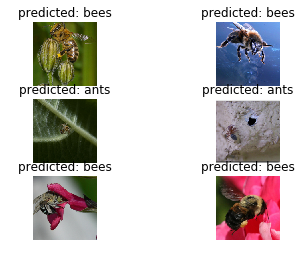

In [14]:
visualize_model(model_ft)

ConvNet as fixed feature extractor
----------------------------------

Here, we need to freeze all the network except the final layer. We need
to set ``requires_grad == False`` to freeze the parameters so that the
gradients are not computed in ``backward()``.

You can read more about this in the documentation
`here <http://pytorch.org/docs/notes/autograd.html#excluding-subgraphs-from-backward>`__.




In [ ]:
model_conv = torchvision.models.resnet18(pretrained=True)
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)

if use_gpu:
    model_conv = model_conv.cuda()

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opoosed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

Train and evaluate
^^^^^^^^^^^^^^^^^^

On CPU this will take about half the time compared to previous scenario.
This is expected as gradients don't need to be computed for most of the
network. However, forward does need to be computed.




In [ ]:
model_conv = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs=25)

In [15]:
visualize_model(model_conv)

plt.ioff()
plt.show()

NameError: name 'model_conv' is not defined